## Mounting Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Install Requirements

In [ ]:
!pip install deepface

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 33.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 51.1 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=df0a0499f07548f5690676c2f0f3bd116bd3b31011a75d4efa0de604374e274d
  Stored in directory: /root/.cache/pip/wheels/19/39/2f/2d3cadc408a8804103f1c34ddd4b9f6a93497b11fa96fe738e
Successfully built fire


## Import Library

In [ ]:
import os
import pickle
import numpy as np
from tqdm import tqdm
from deepface import DeepFace
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

24-12-14 08:26:38 - Directory /root/.deepface has been created
24-12-14 08:26:38 - Directory /root/.deepface/weights has been created


## Ekstraksi Fitur (DeepFace dengan model VGG-Face)

In [ ]:
# Path dataset dan hasil ekstraksi
path_dataset = "/content/drive/MyDrive/STKI/DatasetFinal/detectface"
path_output = "/content/drive/MyDrive/STKI/DatasetFinal/model"

# Pastikan folder output ada
os.makedirs(path_output, exist_ok=True)

In [ ]:
# Inisialisasi model
model_name = "VGG-Face"

# Fungsi untuk ekstraksi fitur menggunakan DeepFace
def ekstraksi_fitur(folder_path):
    fitur = []
    label = []

    for kategori in ["Drowsy", "Non Drowsy"]:
        kategori_path = os.path.join(folder_path, kategori)
        for subfolder in os.listdir(kategori_path):
            subfolder_path = os.path.join(kategori_path, subfolder)
            for file in tqdm(os.listdir(subfolder_path), desc=f"Ekstraksi {kategori}/{subfolder}"):
                if file.endswith(".png"):
                    file_path = os.path.join(subfolder_path, file)
                    try:
                        # Ekstraksi fitur
                        embedding = DeepFace.represent(img_path=file_path, model_name=model_name, enforce_detection=False)
                        fitur.append(embedding[0]["embedding"])
                        label.append(kategori)
                        print(f"{file} pada folder {subfolder} dilakukan ekstraksi fitur dengan menggunakan {model_name}.")
                    except Exception as e:
                        print(f"Gagal memproses {file}: {e}")
    return np.array(fitur), np.array(label)

# Ekstraksi fitur
print("Memulai ekstraksi fitur...")
fitur, label = ekstraksi_fitur(path_dataset)

# Simpan hasil ekstraksi ke file pickle
output_file = os.path.join(path_output, "fitur_vggface.pkl")
with open(output_file, "wb") as f:
    pickle.dump({"features": fitur, "labels": label}, f)
print(f"Hasil ekstraksi disimpan di {output_file}")

Memulai ekstraksi fitur...


Ekstraksi Drowsy/Y:   0%|          | 0/778 [00:00<?, ?it/s]

24-12-14 08:27:06 - vgg_face_weights.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/vgg_face_weights.h5
To: /root/.deepface/weights/vgg_face_weights.h5

  0%|          | 0.00/580M [00:00<?, ?B/s]
  0%|          | 524k/580M [00:00<04:17, 2.25MB/s]
  0%|          | 2.62M/580M [00:00<01:05, 8.79MB/s]
  2%|▏         | 9.96M/580M [00:00<00:18, 30.3MB/s]
  2%|▏         | 14.2M/580M [00:00<00:25, 22.4MB/s]
  4%|▎         | 21.5M/580M [00:00<00:22, 24.6MB/s]
  5%|▌         | 29.9M/580M [00:01<00:15, 35.9MB/s]
  6%|▌         | 35.1M/580M [00:01<00:17, 30.5MB/s]
  7%|▋         | 42.5M/580M [00:01<00:17, 30.4MB/s]
  9%|▉         | 50.9M/580M [00:01<00:13, 39.8MB/s]
 10%|▉         | 56.1M/580M [00:01<00:15, 34.8MB/s]
 11%|█         | 63.4M/580M [00:02<00:14, 34.9MB/s]
 12%|█▏        | 71.3M/580M [00:02<00:11, 42.8MB/s]
 13%|█▎        | 76.5M/580M [00:02<00:13, 37.7MB/s]
 15%|█▍        | 84.4M/580M [00:02<00:13, 37.1MB/s]
 16%|█▌        | 92.8M/580M [00:02<00:10, 45.5MB/s]
 17%|█▋        | 98.6

Y0003.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   0%|          | 2/778 [00:24<2:16:33, 10.56s/it]

Y0001.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   0%|          | 3/778 [00:26<1:22:53,  6.42s/it]

Y0017.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   1%|          | 4/778 [00:27<57:23,  4.45s/it]  

Y0020.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   1%|          | 5/778 [00:29<43:49,  3.40s/it]

Y0010.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   1%|          | 6/778 [00:30<35:08,  2.73s/it]

Y0006.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   1%|          | 7/778 [00:32<29:47,  2.32s/it]

Y0012.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   1%|          | 8/778 [00:48<1:28:09,  6.87s/it]

Y0005.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   1%|          | 9/778 [00:49<1:03:15,  4.94s/it]

Y0016.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   1%|▏         | 10/778 [00:50<46:26,  3.63s/it] 

Y0009.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   1%|▏         | 11/778 [00:51<36:31,  2.86s/it]

Y0022.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   2%|▏         | 12/778 [00:52<29:34,  2.32s/it]

Y0023.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   2%|▏         | 13/778 [00:53<25:05,  1.97s/it]

Y0024.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   2%|▏         | 14/778 [00:54<21:57,  1.72s/it]

Y0014.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   2%|▏         | 15/778 [00:55<19:34,  1.54s/it]

Y0015.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   2%|▏         | 16/778 [00:57<18:26,  1.45s/it]

Y0018.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   2%|▏         | 17/778 [00:58<16:29,  1.30s/it]

Y0019.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   2%|▏         | 18/778 [00:58<14:05,  1.11s/it]

Y0045.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   2%|▏         | 19/778 [00:59<12:26,  1.02it/s]

Y0030.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   3%|▎         | 20/778 [01:00<11:15,  1.12it/s]

Y0042.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   3%|▎         | 21/778 [01:00<10:26,  1.21it/s]

Y0044.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   3%|▎         | 22/778 [01:01<09:53,  1.27it/s]

Y0043.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   3%|▎         | 23/778 [01:02<09:21,  1.34it/s]

Y0039.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   3%|▎         | 24/778 [01:02<09:04,  1.39it/s]

Y0029.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   3%|▎         | 25/778 [01:03<08:50,  1.42it/s]

Y0035.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   3%|▎         | 26/778 [01:04<08:42,  1.44it/s]

Y0046.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   3%|▎         | 27/778 [01:04<08:36,  1.45it/s]

Y0052.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   4%|▎         | 28/778 [01:05<08:29,  1.47it/s]

Y0047.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   4%|▎         | 29/778 [01:06<08:29,  1.47it/s]

Y0032.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   4%|▍         | 30/778 [01:06<08:28,  1.47it/s]

Y0033.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   4%|▍         | 31/778 [01:07<08:23,  1.48it/s]

Y0050.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   4%|▍         | 32/778 [01:08<09:09,  1.36it/s]

Y0071.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   4%|▍         | 33/778 [01:09<10:36,  1.17it/s]

Y0067.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   4%|▍         | 34/778 [01:10<13:12,  1.06s/it]

Y0054.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   4%|▍         | 35/778 [01:12<13:28,  1.09s/it]

Y0075.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   5%|▍         | 36/778 [01:13<13:38,  1.10s/it]

Y0069.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   5%|▍         | 37/778 [01:14<13:30,  1.09s/it]

Y0059.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   5%|▍         | 38/778 [01:15<12:40,  1.03s/it]

Y0065.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   5%|▌         | 39/778 [01:15<11:16,  1.09it/s]

Y0055.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   5%|▌         | 40/778 [01:16<10:20,  1.19it/s]

Y0079.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   5%|▌         | 41/778 [01:17<09:43,  1.26it/s]

Y0056.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   5%|▌         | 42/778 [01:17<09:15,  1.33it/s]

Y0072.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   6%|▌         | 43/778 [01:18<08:57,  1.37it/s]

Y0074.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   6%|▌         | 44/778 [01:19<08:42,  1.40it/s]

Y0068.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   6%|▌         | 45/778 [01:19<08:31,  1.43it/s]

Y0057.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   6%|▌         | 46/778 [01:20<08:29,  1.44it/s]

Y0061.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   6%|▌         | 47/778 [01:21<08:24,  1.45it/s]

Y0058.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   6%|▌         | 48/778 [01:21<08:18,  1.46it/s]

Y0076.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   6%|▋         | 49/778 [01:22<08:16,  1.47it/s]

Y0066.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   6%|▋         | 50/778 [01:23<08:11,  1.48it/s]

Y0095.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   7%|▋         | 51/778 [01:23<08:12,  1.48it/s]

Y0092.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   7%|▋         | 52/778 [01:24<08:09,  1.48it/s]

Y0105.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   7%|▋         | 53/778 [01:25<08:52,  1.36it/s]

Y0096.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   7%|▋         | 54/778 [01:26<10:12,  1.18it/s]

Y0093.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   7%|▋         | 55/778 [01:27<11:10,  1.08it/s]

Y0094.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   7%|▋         | 56/778 [01:28<11:55,  1.01it/s]

Y0083.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   7%|▋         | 57/778 [01:30<12:52,  1.07s/it]

Y0098.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   7%|▋         | 58/778 [01:31<12:51,  1.07s/it]

Y0087.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   8%|▊         | 59/778 [01:32<12:57,  1.08s/it]

Y0088.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   8%|▊         | 60/778 [01:33<12:08,  1.01s/it]

Y0099.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   8%|▊         | 61/778 [01:33<10:51,  1.10it/s]

Y0106.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   8%|▊         | 62/778 [01:34<10:00,  1.19it/s]

Y0080.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   8%|▊         | 63/778 [01:35<09:25,  1.26it/s]

Y0081.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   8%|▊         | 64/778 [01:36<09:57,  1.20it/s]

Y0091.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   8%|▊         | 65/778 [01:36<10:07,  1.17it/s]

Y0104.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   8%|▊         | 66/778 [01:37<09:31,  1.25it/s]

Y0118.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   9%|▊         | 67/778 [01:38<09:03,  1.31it/s]

Y0114.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   9%|▊         | 68/778 [01:39<08:45,  1.35it/s]

Y0110.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   9%|▉         | 69/778 [01:39<08:28,  1.39it/s]

Y0130.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   9%|▉         | 70/778 [01:40<08:17,  1.42it/s]

Y0111.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   9%|▉         | 71/778 [01:41<08:04,  1.46it/s]

Y0119.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   9%|▉         | 72/778 [01:41<08:03,  1.46it/s]

Y0123.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:   9%|▉         | 73/778 [01:42<07:59,  1.47it/s]

Y0121.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  10%|▉         | 74/778 [01:43<08:21,  1.40it/s]

Y0107.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  10%|▉         | 75/778 [01:44<09:51,  1.19it/s]

Y0124.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  10%|▉         | 76/778 [01:45<10:48,  1.08it/s]

Y0126.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  10%|▉         | 77/778 [01:46<11:36,  1.01it/s]

Y0120.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  10%|█         | 78/778 [01:47<12:16,  1.05s/it]

Y0122.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  10%|█         | 79/778 [01:48<12:37,  1.08s/it]

Y0125.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  10%|█         | 80/778 [01:50<12:39,  1.09s/it]

Y0128.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  10%|█         | 81/778 [01:50<11:12,  1.04it/s]

Y0135.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  11%|█         | 82/778 [01:51<10:14,  1.13it/s]

Y0138.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  11%|█         | 83/778 [01:52<09:34,  1.21it/s]

Y0151.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  11%|█         | 84/778 [01:52<08:55,  1.30it/s]

Y0133.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  11%|█         | 85/778 [01:53<08:34,  1.35it/s]

Y0140.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  11%|█         | 86/778 [01:54<08:18,  1.39it/s]

Y0136.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  11%|█         | 87/778 [01:54<08:09,  1.41it/s]

Y0159.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  11%|█▏        | 88/778 [01:55<08:02,  1.43it/s]

Y0137.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  11%|█▏        | 89/778 [01:56<07:59,  1.44it/s]

Y0152.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  12%|█▏        | 90/778 [01:56<08:04,  1.42it/s]

Y0153.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  12%|█▏        | 91/778 [01:57<07:59,  1.43it/s]

Y0131.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  12%|█▏        | 92/778 [01:58<07:53,  1.45it/s]

Y0148.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  12%|█▏        | 93/778 [01:58<07:49,  1.46it/s]

Y0134.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  12%|█▏        | 94/778 [01:59<07:49,  1.46it/s]

Y0147.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  12%|█▏        | 95/778 [02:00<08:14,  1.38it/s]

Y0143.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  12%|█▏        | 96/778 [02:01<09:26,  1.20it/s]

Y0161.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  12%|█▏        | 97/778 [02:02<10:18,  1.10it/s]

Y0163.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  13%|█▎        | 98/778 [02:03<11:11,  1.01it/s]

Y0179.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  13%|█▎        | 99/778 [02:04<11:52,  1.05s/it]

Y0184.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  13%|█▎        | 100/778 [02:05<11:11,  1.01it/s]

Y0160.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  13%|█▎        | 101/778 [02:06<10:12,  1.10it/s]

Y0175.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  13%|█▎        | 102/778 [02:07<09:28,  1.19it/s]

Y0165.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  13%|█▎        | 103/778 [02:07<08:52,  1.27it/s]

Y0178.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  13%|█▎        | 104/778 [02:08<08:29,  1.32it/s]

Y0167.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  13%|█▎        | 105/778 [02:09<08:16,  1.36it/s]

Y0169.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  14%|█▎        | 106/778 [02:09<08:04,  1.39it/s]

Y0176.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  14%|█▍        | 107/778 [02:10<07:55,  1.41it/s]

Y0174.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  14%|█▍        | 108/778 [02:11<07:48,  1.43it/s]

Y0187.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  14%|█▍        | 109/778 [02:11<07:45,  1.44it/s]

Y0205.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  14%|█▍        | 110/778 [02:12<07:41,  1.45it/s]

Y0189.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  14%|█▍        | 111/778 [02:13<07:39,  1.45it/s]

Y0207.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  14%|█▍        | 112/778 [02:13<07:36,  1.46it/s]

Y0188.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  15%|█▍        | 113/778 [02:14<07:30,  1.48it/s]

Y0197.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  15%|█▍        | 114/778 [02:15<07:28,  1.48it/s]

Y0203.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  15%|█▍        | 115/778 [02:16<08:25,  1.31it/s]

Y0209.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  15%|█▍        | 116/778 [02:17<09:33,  1.16it/s]

Y0201.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  15%|█▌        | 117/778 [02:18<10:26,  1.05it/s]

Y0196.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  15%|█▌        | 118/778 [02:19<10:57,  1.00it/s]

Y0190.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  15%|█▌        | 119/778 [02:20<11:17,  1.03s/it]

Y0192.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  15%|█▌        | 120/778 [02:21<10:09,  1.08it/s]

Y0200.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  16%|█▌        | 121/778 [02:22<09:18,  1.18it/s]

Y0191.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  16%|█▌        | 122/778 [02:22<08:45,  1.25it/s]

Y0204.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  16%|█▌        | 123/778 [02:23<08:23,  1.30it/s]

Y0208.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  16%|█▌        | 124/778 [02:24<08:05,  1.35it/s]

Y0199.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  16%|█▌        | 125/778 [02:24<07:55,  1.37it/s]

Y0195.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  16%|█▌        | 126/778 [02:25<07:45,  1.40it/s]

Y0220.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  16%|█▋        | 127/778 [02:26<07:35,  1.43it/s]

Y0211.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  16%|█▋        | 128/778 [02:26<07:31,  1.44it/s]

Y0213.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  17%|█▋        | 129/778 [02:27<07:36,  1.42it/s]

Y0222.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  17%|█▋        | 130/778 [02:28<07:27,  1.45it/s]

Y0210.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  17%|█▋        | 131/778 [02:28<07:22,  1.46it/s]

Y0232.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  17%|█▋        | 132/778 [02:29<07:29,  1.44it/s]

Y0228.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  17%|█▋        | 133/778 [02:30<07:24,  1.45it/s]

Y0215.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  17%|█▋        | 134/778 [02:31<07:58,  1.35it/s]

Y0218.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  17%|█▋        | 135/778 [02:32<09:17,  1.15it/s]

Y0230.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  17%|█▋        | 136/778 [02:33<10:01,  1.07it/s]

Y0233.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  18%|█▊        | 137/778 [02:34<10:32,  1.01it/s]

Y0223.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  18%|█▊        | 138/778 [02:35<11:19,  1.06s/it]

Y0212.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  18%|█▊        | 139/778 [02:36<10:42,  1.00s/it]

Y0221.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  18%|█▊        | 140/778 [02:37<09:38,  1.10it/s]

Y0231.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  18%|█▊        | 141/778 [02:37<08:50,  1.20it/s]

Y0216.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  18%|█▊        | 142/778 [02:38<08:18,  1.28it/s]

Y0224.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  18%|█▊        | 143/778 [02:39<07:58,  1.33it/s]

Y0262.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  19%|█▊        | 144/778 [02:39<07:40,  1.38it/s]

Y0251.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  19%|█▊        | 145/778 [02:40<07:31,  1.40it/s]

Y0260.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  19%|█▉        | 146/778 [02:41<07:26,  1.42it/s]

Y0248.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  19%|█▉        | 147/778 [02:42<07:18,  1.44it/s]

Y0239.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  19%|█▉        | 148/778 [02:42<07:19,  1.43it/s]

Y0253.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  19%|█▉        | 149/778 [02:43<07:14,  1.45it/s]

Y0254.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  19%|█▉        | 150/778 [02:44<07:18,  1.43it/s]

Y0255.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  19%|█▉        | 151/778 [02:44<07:13,  1.45it/s]

Y0256.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  20%|█▉        | 152/778 [02:45<07:11,  1.45it/s]

Y0252.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  20%|█▉        | 153/778 [02:46<07:04,  1.47it/s]

Y0259.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  20%|█▉        | 154/778 [02:47<08:16,  1.26it/s]

Y0240.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  20%|█▉        | 155/778 [02:48<09:09,  1.13it/s]

Y0257.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  20%|██        | 156/778 [02:49<10:03,  1.03it/s]

Y0250.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  20%|██        | 157/778 [02:50<10:22,  1.00s/it]

Y0249.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  20%|██        | 158/778 [02:51<10:56,  1.06s/it]

Y0236.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  20%|██        | 159/778 [02:52<10:03,  1.03it/s]

Y0268.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  21%|██        | 160/778 [02:53<09:08,  1.13it/s]

Y0282.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  21%|██        | 161/778 [02:53<08:28,  1.21it/s]

Y0264.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  21%|██        | 162/778 [02:54<07:59,  1.28it/s]

Y0272.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  21%|██        | 163/778 [02:55<07:42,  1.33it/s]

Y0278.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  21%|██        | 164/778 [02:55<07:26,  1.38it/s]

Y0271.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  21%|██        | 165/778 [02:56<07:17,  1.40it/s]

Y0276.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  21%|██▏       | 166/778 [02:57<07:17,  1.40it/s]

Y0265.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  21%|██▏       | 167/778 [02:57<07:09,  1.42it/s]

Y0281.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  22%|██▏       | 168/778 [02:58<07:01,  1.45it/s]

Y0277.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  22%|██▏       | 169/778 [02:59<06:59,  1.45it/s]

Y0283.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  22%|██▏       | 170/778 [03:00<06:55,  1.46it/s]

Y0273.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  22%|██▏       | 171/778 [03:00<06:52,  1.47it/s]

Y0274.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  22%|██▏       | 172/778 [03:01<06:50,  1.47it/s]

Y0279.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  22%|██▏       | 173/778 [03:01<06:43,  1.50it/s]

Y0275.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  22%|██▏       | 174/778 [03:03<07:45,  1.30it/s]

Y0302.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  22%|██▏       | 175/778 [03:04<08:45,  1.15it/s]

Y0290.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  23%|██▎       | 176/778 [03:05<09:35,  1.05it/s]

Y0294.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  23%|██▎       | 177/778 [03:06<09:51,  1.02it/s]

Y0291.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  23%|██▎       | 178/778 [03:07<10:16,  1.03s/it]

Y0296.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  23%|██▎       | 179/778 [03:08<09:06,  1.10it/s]

Y0285.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  23%|██▎       | 180/778 [03:08<08:20,  1.19it/s]

Y0295.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  23%|██▎       | 181/778 [03:09<07:45,  1.28it/s]

Y0297.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  23%|██▎       | 182/778 [03:10<07:23,  1.34it/s]

Y0293.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  24%|██▎       | 183/778 [03:10<07:08,  1.39it/s]

Y0287.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  24%|██▎       | 184/778 [03:11<06:56,  1.42it/s]

Y0284.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  24%|██▍       | 185/778 [03:12<06:49,  1.45it/s]

Y0286.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  24%|██▍       | 186/778 [03:12<06:43,  1.47it/s]

Y0299.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  24%|██▍       | 187/778 [03:13<06:36,  1.49it/s]

Y0318.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  24%|██▍       | 188/778 [03:14<06:34,  1.50it/s]

Y0304.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  24%|██▍       | 189/778 [03:14<06:35,  1.49it/s]

Y0324.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  24%|██▍       | 190/778 [03:15<06:32,  1.50it/s]

Y0313.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  25%|██▍       | 191/778 [03:16<06:32,  1.50it/s]

Y0305.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  25%|██▍       | 192/778 [03:16<06:34,  1.48it/s]

Y0310.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  25%|██▍       | 193/778 [03:17<06:40,  1.46it/s]

Y0307.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  25%|██▍       | 194/778 [03:18<07:45,  1.26it/s]

Y0309.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  25%|██▌       | 195/778 [03:19<08:35,  1.13it/s]

Y0323.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  25%|██▌       | 196/778 [03:20<09:23,  1.03it/s]

Y0322.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  25%|██▌       | 197/778 [03:21<09:47,  1.01s/it]

Y0325.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  25%|██▌       | 198/778 [03:22<09:43,  1.01s/it]

Y0306.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  26%|██▌       | 199/778 [03:23<10:04,  1.04s/it]

Y0316.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  26%|██▌       | 200/778 [03:25<10:07,  1.05s/it]

Y0329.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  26%|██▌       | 201/778 [03:26<10:19,  1.07s/it]

Y0350.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  26%|██▌       | 202/778 [03:27<10:23,  1.08s/it]

Y0340.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  26%|██▌       | 203/778 [03:28<10:29,  1.09s/it]

Y0356.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  26%|██▌       | 204/778 [03:29<09:20,  1.02it/s]

Y0328.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  26%|██▋       | 205/778 [03:29<08:28,  1.13it/s]

Y0349.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  26%|██▋       | 206/778 [03:30<07:50,  1.22it/s]

Y0347.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  27%|██▋       | 207/778 [03:31<07:23,  1.29it/s]

Y0338.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  27%|██▋       | 208/778 [03:31<07:03,  1.35it/s]

Y0354.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  27%|██▋       | 209/778 [03:32<06:47,  1.40it/s]

Y0353.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  27%|██▋       | 210/778 [03:33<07:51,  1.21it/s]

Y0333.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  27%|██▋       | 211/778 [03:34<08:29,  1.11it/s]

Y0352.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  27%|██▋       | 212/778 [03:35<09:19,  1.01it/s]

Y0368.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  27%|██▋       | 213/778 [03:36<09:34,  1.02s/it]

Y0383.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  28%|██▊       | 214/778 [03:38<09:58,  1.06s/it]

Y0382.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  28%|██▊       | 215/778 [03:38<08:59,  1.04it/s]

Y0381.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  28%|██▊       | 216/778 [03:39<08:09,  1.15it/s]

Y0372.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  28%|██▊       | 217/778 [03:40<07:33,  1.24it/s]

Y0377.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  28%|██▊       | 218/778 [03:40<07:07,  1.31it/s]

Y0361.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  28%|██▊       | 219/778 [03:41<06:50,  1.36it/s]

Y0385.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  28%|██▊       | 220/778 [03:42<06:36,  1.41it/s]

Y0384.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  28%|██▊       | 221/778 [03:42<06:30,  1.43it/s]

Y0369.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  29%|██▊       | 222/778 [03:43<06:25,  1.44it/s]

Y0373.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  29%|██▊       | 223/778 [03:44<06:17,  1.47it/s]

Y0364.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  29%|██▉       | 224/778 [03:44<06:17,  1.47it/s]

Y0363.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  29%|██▉       | 225/778 [03:45<06:17,  1.47it/s]

Y0367.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  29%|██▉       | 226/778 [03:46<06:13,  1.48it/s]

Y0374.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  29%|██▉       | 227/778 [03:46<06:14,  1.47it/s]

Y0371.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  29%|██▉       | 228/778 [03:47<06:18,  1.45it/s]

Y0410.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  29%|██▉       | 229/778 [03:48<06:13,  1.47it/s]

Y0400.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  30%|██▉       | 230/778 [03:49<07:16,  1.26it/s]

Y0407.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  30%|██▉       | 231/778 [03:50<08:12,  1.11it/s]

Y0409.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  30%|██▉       | 232/778 [03:51<08:55,  1.02it/s]

Y0429.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  30%|██▉       | 233/778 [03:52<09:23,  1.03s/it]

Y0417.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  30%|███       | 234/778 [03:53<08:57,  1.01it/s]

Y0414.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  30%|███       | 235/778 [03:54<08:09,  1.11it/s]

Y0413.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  30%|███       | 236/778 [03:54<07:30,  1.20it/s]

Y0401.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  30%|███       | 237/778 [03:55<07:03,  1.28it/s]

Y0391.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  31%|███       | 238/778 [03:56<06:44,  1.34it/s]

Y0425.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  31%|███       | 239/778 [03:56<06:31,  1.38it/s]

Y0393.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  31%|███       | 240/778 [03:57<06:23,  1.40it/s]

Y0398.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  31%|███       | 241/778 [03:58<06:21,  1.41it/s]

Y0394.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  31%|███       | 242/778 [03:58<06:14,  1.43it/s]

Y0399.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  31%|███       | 243/778 [03:59<06:10,  1.45it/s]

Y0406.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  31%|███▏      | 244/778 [04:00<06:05,  1.46it/s]

Y0473.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  31%|███▏      | 245/778 [04:01<06:02,  1.47it/s]

Y0469.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  32%|███▏      | 246/778 [04:01<06:02,  1.47it/s]

Y0463.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  32%|███▏      | 247/778 [04:02<06:01,  1.47it/s]

Y0453.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  32%|███▏      | 248/778 [04:03<06:00,  1.47it/s]

Y0458.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  32%|███▏      | 249/778 [04:03<06:39,  1.32it/s]

Y0464.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  32%|███▏      | 250/778 [04:05<07:44,  1.14it/s]

Y0440.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  32%|███▏      | 251/778 [04:06<08:35,  1.02it/s]

Y0461.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  32%|███▏      | 252/778 [04:07<08:53,  1.01s/it]

Y0465.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  33%|███▎      | 253/778 [04:08<09:28,  1.08s/it]

Y0454.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  33%|███▎      | 254/778 [04:09<08:35,  1.02it/s]

Y0456.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  33%|███▎      | 255/778 [04:10<07:43,  1.13it/s]

Y0472.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  33%|███▎      | 256/778 [04:10<07:13,  1.20it/s]

Y0441.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  33%|███▎      | 257/778 [04:11<06:46,  1.28it/s]

Y0485.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  33%|███▎      | 258/778 [04:12<06:29,  1.34it/s]

Y0493.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  33%|███▎      | 259/778 [04:12<06:19,  1.37it/s]

Y0487.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  33%|███▎      | 260/778 [04:13<06:07,  1.41it/s]

Y0475.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  34%|███▎      | 261/778 [04:14<06:02,  1.43it/s]

Y0488.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  34%|███▎      | 262/778 [04:14<05:58,  1.44it/s]

Y0484.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  34%|███▍      | 263/778 [04:15<05:52,  1.46it/s]

Y0486.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  34%|███▍      | 264/778 [04:16<05:50,  1.46it/s]

Y0479.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  34%|███▍      | 265/778 [04:16<05:50,  1.47it/s]

Y0476.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  34%|███▍      | 266/778 [04:17<05:47,  1.48it/s]

Y0494.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  34%|███▍      | 267/778 [04:18<05:47,  1.47it/s]

Y0478.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  34%|███▍      | 268/778 [04:18<05:49,  1.46it/s]

Y0482.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  35%|███▍      | 269/778 [04:20<06:55,  1.22it/s]

Y0477.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  35%|███▍      | 270/778 [04:21<07:39,  1.11it/s]

Y0520.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  35%|███▍      | 271/778 [04:22<08:17,  1.02it/s]

Y0500.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  35%|███▍      | 272/778 [04:23<08:39,  1.03s/it]

Y0514.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  35%|███▌      | 273/778 [04:24<08:20,  1.01it/s]

Y0507.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  35%|███▌      | 274/778 [04:25<07:30,  1.12it/s]

Y0522.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  35%|███▌      | 275/778 [04:25<06:58,  1.20it/s]

Y0511.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  35%|███▌      | 276/778 [04:26<06:31,  1.28it/s]

Y0517.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  36%|███▌      | 277/778 [04:27<06:11,  1.35it/s]

Y0519.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  36%|███▌      | 278/778 [04:27<05:59,  1.39it/s]

Y0518.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  36%|███▌      | 279/778 [04:28<05:57,  1.39it/s]

Y0512.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  36%|███▌      | 280/778 [04:29<05:48,  1.43it/s]

Y0516.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  36%|███▌      | 281/778 [04:29<05:43,  1.44it/s]

Y0509.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  36%|███▌      | 282/778 [04:30<05:42,  1.45it/s]

Y0510.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  36%|███▋      | 283/778 [04:31<05:36,  1.47it/s]

Y0506.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  37%|███▋      | 284/778 [04:31<05:36,  1.47it/s]

Y0501.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  37%|███▋      | 285/778 [04:32<05:34,  1.47it/s]

Y0503.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  37%|███▋      | 286/778 [04:33<05:31,  1.49it/s]

Y0513.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  37%|███▋      | 287/778 [04:33<05:34,  1.47it/s]

Y0540.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  37%|███▋      | 288/778 [04:34<06:24,  1.27it/s]

Y0544.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  37%|███▋      | 289/778 [04:36<07:20,  1.11it/s]

Y0541.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  37%|███▋      | 290/778 [04:37<07:58,  1.02it/s]

Y0543.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  37%|███▋      | 291/778 [04:38<08:20,  1.03s/it]

Y0536.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  38%|███▊      | 292/778 [04:39<08:16,  1.02s/it]

Y0539.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  38%|███▊      | 293/778 [04:40<07:29,  1.08it/s]

Y0534.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  38%|███▊      | 294/778 [04:40<06:50,  1.18it/s]

Y0537.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  38%|███▊      | 295/778 [04:41<06:25,  1.25it/s]

Y0528.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  38%|███▊      | 296/778 [04:42<06:05,  1.32it/s]

Y0529.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  38%|███▊      | 297/778 [04:42<05:48,  1.38it/s]

Y0530.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  38%|███▊      | 298/778 [04:43<05:38,  1.42it/s]

Y0527.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  38%|███▊      | 299/778 [04:44<05:33,  1.44it/s]

Y0535.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  39%|███▊      | 300/778 [04:44<05:28,  1.45it/s]

Y0532.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  39%|███▊      | 301/778 [04:45<05:29,  1.45it/s]

Y0545.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  39%|███▉      | 302/778 [04:46<05:25,  1.46it/s]

Y0542.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  39%|███▉      | 303/778 [04:46<05:23,  1.47it/s]

Y0551.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  39%|███▉      | 304/778 [04:47<05:20,  1.48it/s]

Y0562.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  39%|███▉      | 305/778 [04:48<05:20,  1.47it/s]

Y0568.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  39%|███▉      | 306/778 [04:48<05:24,  1.46it/s]

Y0553.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  39%|███▉      | 307/778 [04:49<05:52,  1.33it/s]

Y0561.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  40%|███▉      | 308/778 [04:50<06:52,  1.14it/s]

Y0570.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  40%|███▉      | 309/778 [04:51<07:26,  1.05it/s]

Y0566.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  40%|███▉      | 310/778 [04:53<07:46,  1.00it/s]

Y0559.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  40%|███▉      | 311/778 [04:54<08:20,  1.07s/it]

Y0571.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  40%|████      | 312/778 [04:55<07:52,  1.01s/it]

Y0552.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  40%|████      | 313/778 [04:55<07:08,  1.08it/s]

Y0576.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  40%|████      | 314/778 [04:56<06:34,  1.18it/s]

Y0589.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  40%|████      | 315/778 [04:57<06:14,  1.24it/s]

Y0580.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  41%|████      | 316/778 [04:58<06:07,  1.26it/s]

Y0575.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  41%|████      | 317/778 [04:58<06:17,  1.22it/s]

Y0593.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  41%|████      | 318/778 [04:59<06:11,  1.24it/s]

Y0582.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  41%|████      | 319/778 [05:00<06:25,  1.19it/s]

Y0581.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  41%|████      | 320/778 [05:01<06:25,  1.19it/s]

Y0586.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  41%|████▏     | 321/778 [05:02<06:30,  1.17it/s]

Y0592.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  41%|████▏     | 322/778 [05:03<06:59,  1.09it/s]

Y0577.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  42%|████▏     | 323/778 [05:04<07:30,  1.01it/s]

Y0579.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  42%|████▏     | 324/778 [05:05<07:48,  1.03s/it]

Y0573.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  42%|████▏     | 325/778 [05:06<08:04,  1.07s/it]

Y0574.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  42%|████▏     | 326/778 [05:08<08:18,  1.10s/it]

Y0585.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  42%|████▏     | 327/778 [05:09<08:19,  1.11s/it]

Y0588.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  42%|████▏     | 328/778 [05:10<08:30,  1.14s/it]

Y0590.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  42%|████▏     | 329/778 [05:11<07:52,  1.05s/it]

Y0584.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  42%|████▏     | 330/778 [05:11<07:05,  1.05it/s]

Y0594.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  43%|████▎     | 331/778 [05:12<06:32,  1.14it/s]

Y0608.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  43%|████▎     | 332/778 [05:13<06:08,  1.21it/s]

Y0610.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  43%|████▎     | 333/778 [05:14<05:50,  1.27it/s]

Y0611.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  43%|████▎     | 334/778 [05:14<05:38,  1.31it/s]

Y0606.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  43%|████▎     | 335/778 [05:15<05:26,  1.36it/s]

Y0595.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  43%|████▎     | 336/778 [05:16<05:20,  1.38it/s]

Y0609.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  43%|████▎     | 337/778 [05:16<05:17,  1.39it/s]

Y0600.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  43%|████▎     | 338/778 [05:17<05:11,  1.41it/s]

Y0615.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  44%|████▎     | 339/778 [05:18<05:14,  1.40it/s]

Y0601.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  44%|████▎     | 340/778 [05:18<05:11,  1.41it/s]

Y0602.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  44%|████▍     | 341/778 [05:19<05:07,  1.42it/s]

Y0599.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  44%|████▍     | 342/778 [05:20<05:05,  1.43it/s]

Y0596.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  44%|████▍     | 343/778 [05:21<05:11,  1.39it/s]

Y0612.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  44%|████▍     | 344/778 [05:22<06:11,  1.17it/s]

Y0598.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  44%|████▍     | 345/778 [05:23<06:45,  1.07it/s]

Y0639.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  44%|████▍     | 346/778 [05:24<07:14,  1.01s/it]

Y0626.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  45%|████▍     | 347/778 [05:25<07:24,  1.03s/it]

Y0620.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  45%|████▍     | 348/778 [05:26<07:30,  1.05s/it]

Y0618.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  45%|████▍     | 349/778 [05:27<06:40,  1.07it/s]

Y0634.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  45%|████▍     | 350/778 [05:28<06:03,  1.18it/s]

Y0630.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  45%|████▌     | 351/778 [05:28<05:42,  1.25it/s]

Y0632.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  45%|████▌     | 352/778 [05:29<05:28,  1.30it/s]

Y0616.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  45%|████▌     | 353/778 [05:30<05:16,  1.34it/s]

Y0629.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  46%|████▌     | 354/778 [05:30<05:05,  1.39it/s]

Y0637.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  46%|████▌     | 355/778 [05:31<04:58,  1.42it/s]

Y0622.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  46%|████▌     | 356/778 [05:32<04:52,  1.44it/s]

Y0623.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  46%|████▌     | 357/778 [05:32<04:50,  1.45it/s]

Y0628.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  46%|████▌     | 358/778 [05:33<04:48,  1.46it/s]

Y0633.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  46%|████▌     | 359/778 [05:34<04:47,  1.46it/s]

Y0625.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  46%|████▋     | 360/778 [05:34<04:47,  1.45it/s]

Y0621.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  46%|████▋     | 361/778 [05:35<04:44,  1.47it/s]

Y0627.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  47%|████▋     | 362/778 [05:36<04:43,  1.47it/s]

Y0635.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  47%|████▋     | 363/778 [05:37<05:10,  1.34it/s]

Y0636.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  47%|████▋     | 364/778 [05:38<05:53,  1.17it/s]

Y0661.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  47%|████▋     | 365/778 [05:39<06:21,  1.08it/s]

Y0644.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  47%|████▋     | 366/778 [05:40<06:41,  1.03it/s]

Y0646.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  47%|████▋     | 367/778 [05:41<07:05,  1.03s/it]

Y0652.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  47%|████▋     | 368/778 [05:42<06:35,  1.04it/s]

Y0642.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  47%|████▋     | 369/778 [05:43<06:00,  1.14it/s]

Y0658.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  48%|████▊     | 370/778 [05:43<05:32,  1.23it/s]

Y0659.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  48%|████▊     | 371/778 [05:44<05:14,  1.29it/s]

Y0645.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  48%|████▊     | 372/778 [05:45<05:02,  1.34it/s]

Y0649.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  48%|████▊     | 373/778 [05:45<04:52,  1.38it/s]

Y0647.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  48%|████▊     | 374/778 [05:46<04:44,  1.42it/s]

Y0641.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  48%|████▊     | 375/778 [05:47<04:39,  1.44it/s]

Y0657.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  48%|████▊     | 376/778 [05:47<04:37,  1.45it/s]

Y0653.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  48%|████▊     | 377/778 [05:48<04:38,  1.44it/s]

Y0651.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  49%|████▊     | 378/778 [05:49<04:35,  1.45it/s]

Y0650.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  49%|████▊     | 379/778 [05:49<04:34,  1.45it/s]

Y0640.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  49%|████▉     | 380/778 [05:50<04:34,  1.45it/s]

Y0662.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  49%|████▉     | 381/778 [05:51<04:33,  1.45it/s]

Y0684.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  49%|████▉     | 382/778 [05:51<04:29,  1.47it/s]

Y0679.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  49%|████▉     | 383/778 [05:52<05:13,  1.26it/s]

Y0688.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  49%|████▉     | 384/778 [05:54<05:45,  1.14it/s]

Y0680.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  49%|████▉     | 385/778 [05:55<06:13,  1.05it/s]

Y0669.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  50%|████▉     | 386/778 [05:56<06:21,  1.03it/s]

Y0677.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  50%|████▉     | 387/778 [05:57<06:27,  1.01it/s]

Y0668.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  50%|████▉     | 388/778 [05:57<05:48,  1.12it/s]

Y0666.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  50%|█████     | 389/778 [05:58<05:19,  1.22it/s]

Y0681.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  50%|█████     | 390/778 [05:59<05:05,  1.27it/s]

Y0678.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  50%|█████     | 391/778 [05:59<04:54,  1.32it/s]

Y0690.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  50%|█████     | 392/778 [06:00<04:43,  1.36it/s]

Y0675.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  51%|█████     | 393/778 [06:01<04:37,  1.39it/s]

Y0663.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  51%|█████     | 394/778 [06:01<04:29,  1.42it/s]

Y0667.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  51%|█████     | 395/778 [06:02<04:23,  1.45it/s]

Y0673.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  51%|█████     | 396/778 [06:03<04:21,  1.46it/s]

Y0682.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  51%|█████     | 397/778 [06:03<04:19,  1.47it/s]

Y0694.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  51%|█████     | 398/778 [06:04<04:19,  1.46it/s]

Y0696.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  51%|█████▏    | 399/778 [06:05<04:18,  1.47it/s]

Y0705.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  51%|█████▏    | 400/778 [06:05<04:15,  1.48it/s]

Y0691.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  52%|█████▏    | 401/778 [06:06<04:19,  1.46it/s]

Y0700.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  52%|█████▏    | 402/778 [06:07<04:32,  1.38it/s]

Y0714.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  52%|█████▏    | 403/778 [06:08<05:20,  1.17it/s]

Y0712.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  52%|█████▏    | 404/778 [06:09<05:44,  1.08it/s]

Y0715.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  52%|█████▏    | 405/778 [06:10<06:04,  1.02it/s]

Y0702.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  52%|█████▏    | 406/778 [06:11<06:16,  1.01s/it]

Y0698.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  52%|█████▏    | 407/778 [06:12<05:59,  1.03it/s]

Y0703.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  52%|█████▏    | 408/778 [06:13<05:26,  1.13it/s]

Y0695.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  53%|█████▎    | 409/778 [06:14<05:02,  1.22it/s]

Y0711.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  53%|█████▎    | 410/778 [06:14<04:46,  1.28it/s]

Y0697.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  53%|█████▎    | 411/778 [06:15<04:33,  1.34it/s]

Y0713.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  53%|█████▎    | 412/778 [06:16<04:27,  1.37it/s]

Y0699.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  53%|█████▎    | 413/778 [06:16<04:23,  1.38it/s]

Y0693.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  53%|█████▎    | 414/778 [06:17<04:16,  1.42it/s]

Y0704.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  53%|█████▎    | 415/778 [06:18<04:13,  1.43it/s]

Y0707.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  53%|█████▎    | 416/778 [06:18<04:10,  1.45it/s]

Y0710.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  54%|█████▎    | 417/778 [06:19<04:07,  1.46it/s]

Y0724.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  54%|█████▎    | 418/778 [06:20<04:06,  1.46it/s]

Y0717.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  54%|█████▍    | 419/778 [06:20<04:04,  1.47it/s]

Y0739.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  54%|█████▍    | 420/778 [06:21<04:00,  1.49it/s]

Y0726.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  54%|█████▍    | 421/778 [06:22<03:59,  1.49it/s]

Y0718.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  54%|█████▍    | 422/778 [06:23<04:34,  1.30it/s]

Y0732.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  54%|█████▍    | 423/778 [06:24<05:07,  1.16it/s]

Y0736.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  54%|█████▍    | 424/778 [06:25<05:36,  1.05it/s]

Y0725.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  55%|█████▍    | 425/778 [06:26<05:51,  1.01it/s]

Y0722.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  55%|█████▍    | 426/778 [06:27<06:18,  1.08s/it]

Y0733.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  55%|█████▍    | 427/778 [06:28<05:53,  1.01s/it]

Y0730.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  55%|█████▌    | 428/778 [06:29<05:23,  1.08it/s]

Y0721.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  55%|█████▌    | 429/778 [06:30<05:36,  1.04it/s]

Y0728.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  55%|█████▌    | 430/778 [06:31<05:49,  1.01s/it]

Y0735.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  55%|█████▌    | 431/778 [06:32<06:11,  1.07s/it]

Y0738.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  56%|█████▌    | 432/778 [06:33<06:07,  1.06s/it]

Y0720.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  56%|█████▌    | 433/778 [06:35<06:23,  1.11s/it]

Y0762.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  56%|█████▌    | 434/778 [06:35<05:44,  1.00s/it]

Y0750.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  56%|█████▌    | 435/778 [06:36<05:11,  1.10it/s]

Y0756.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  56%|█████▌    | 436/778 [06:37<04:47,  1.19it/s]

Y0747.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  56%|█████▌    | 437/778 [06:37<04:28,  1.27it/s]

Y0752.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  56%|█████▋    | 438/778 [06:38<04:25,  1.28it/s]

Y0763.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  56%|█████▋    | 439/778 [06:39<05:04,  1.11it/s]

Y0745.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  57%|█████▋    | 440/778 [06:40<05:28,  1.03it/s]

Y0742.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  57%|█████▋    | 441/778 [06:42<05:42,  1.02s/it]

Y0744.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  57%|█████▋    | 442/778 [06:43<05:58,  1.07s/it]

Y0761.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  57%|█████▋    | 443/778 [06:44<05:28,  1.02it/s]

Y0741.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  57%|█████▋    | 444/778 [06:44<04:57,  1.12it/s]

Y0748.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  57%|█████▋    | 445/778 [06:45<04:35,  1.21it/s]

Y0757.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  57%|█████▋    | 446/778 [06:46<04:17,  1.29it/s]

Y0760.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  57%|█████▋    | 447/778 [06:46<04:06,  1.34it/s]

Y0743.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  58%|█████▊    | 448/778 [06:47<03:58,  1.38it/s]

Y0755.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  58%|█████▊    | 449/778 [06:48<03:51,  1.42it/s]

Y0754.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  58%|█████▊    | 450/778 [06:48<03:48,  1.44it/s]

Y0753.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  58%|█████▊    | 451/778 [06:49<03:45,  1.45it/s]

Y0751.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  58%|█████▊    | 452/778 [06:50<03:42,  1.46it/s]

Y0780.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  58%|█████▊    | 453/778 [06:50<03:40,  1.47it/s]

Y0785.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  58%|█████▊    | 454/778 [06:51<03:38,  1.48it/s]

Y0775.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  58%|█████▊    | 455/778 [06:52<03:36,  1.49it/s]

Y0765.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  59%|█████▊    | 456/778 [06:52<03:35,  1.49it/s]

Y0772.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  59%|█████▊    | 457/778 [06:53<03:34,  1.49it/s]

Y0776.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  59%|█████▉    | 458/778 [06:54<03:57,  1.35it/s]

Y0782.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  59%|█████▉    | 459/778 [06:55<04:34,  1.16it/s]

Y0767.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  59%|█████▉    | 460/778 [06:56<05:00,  1.06it/s]

Y0777.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  59%|█████▉    | 461/778 [06:57<05:13,  1.01it/s]

Y0773.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  59%|█████▉    | 462/778 [06:58<05:33,  1.06s/it]

Y0787.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  60%|█████▉    | 463/778 [06:59<05:17,  1.01s/it]

Y0764.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  60%|█████▉    | 464/778 [07:00<04:44,  1.11it/s]

Y0779.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  60%|█████▉    | 465/778 [07:01<04:20,  1.20it/s]

Y0770.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  60%|█████▉    | 466/778 [07:01<04:01,  1.29it/s]

Y0807.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  60%|██████    | 467/778 [07:02<03:50,  1.35it/s]

Y0802.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  60%|██████    | 468/778 [07:03<03:42,  1.39it/s]

Y0796.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  60%|██████    | 469/778 [07:03<03:35,  1.43it/s]

Y0801.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  60%|██████    | 470/778 [07:04<03:32,  1.45it/s]

Y0803.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  61%|██████    | 471/778 [07:05<03:28,  1.47it/s]

Y0809.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  61%|██████    | 472/778 [07:05<03:25,  1.49it/s]

Y0792.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  61%|██████    | 473/778 [07:06<03:25,  1.48it/s]

Y0800.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  61%|██████    | 474/778 [07:07<03:24,  1.49it/s]

Y0797.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  61%|██████    | 475/778 [07:07<03:22,  1.50it/s]

Y0798.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  61%|██████    | 476/778 [07:08<03:22,  1.49it/s]

Y0805.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  61%|██████▏   | 477/778 [07:09<03:20,  1.50it/s]

Y0789.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  61%|██████▏   | 478/778 [07:09<03:38,  1.37it/s]

Y0795.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  62%|██████▏   | 479/778 [07:11<04:10,  1.19it/s]

Y0793.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  62%|██████▏   | 480/778 [07:12<04:27,  1.11it/s]

Y0788.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  62%|██████▏   | 481/778 [07:13<04:45,  1.04it/s]

Y0808.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  62%|██████▏   | 482/778 [07:14<05:03,  1.03s/it]

Y0832.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  62%|██████▏   | 483/778 [07:15<04:49,  1.02it/s]

Y0820.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  62%|██████▏   | 484/778 [07:15<04:21,  1.12it/s]

Y0824.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  62%|██████▏   | 485/778 [07:16<04:00,  1.22it/s]

Y0829.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  62%|██████▏   | 486/778 [07:17<03:46,  1.29it/s]

Y0825.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  63%|██████▎   | 487/778 [07:17<03:36,  1.34it/s]

Y0828.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  63%|██████▎   | 488/778 [07:18<03:30,  1.38it/s]

Y0818.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  63%|██████▎   | 489/778 [07:19<03:26,  1.40it/s]

Y0821.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  63%|██████▎   | 490/778 [07:19<03:21,  1.43it/s]

Y0819.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  63%|██████▎   | 491/778 [07:20<03:20,  1.43it/s]

Y0822.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  63%|██████▎   | 492/778 [07:21<03:18,  1.44it/s]

Y0833.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  63%|██████▎   | 493/778 [07:22<03:16,  1.45it/s]

Y0812.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  63%|██████▎   | 494/778 [07:22<03:14,  1.46it/s]

Y0817.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  64%|██████▎   | 495/778 [07:23<03:12,  1.47it/s]

Y0816.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  64%|██████▍   | 496/778 [07:24<03:10,  1.48it/s]

Y0815.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  64%|██████▍   | 497/778 [07:24<03:09,  1.48it/s]

Y0834.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  64%|██████▍   | 498/778 [07:25<03:33,  1.31it/s]

Y0830.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  64%|██████▍   | 499/778 [07:26<04:03,  1.15it/s]

Y0846.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  64%|██████▍   | 500/778 [07:27<04:24,  1.05it/s]

Y0859.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  64%|██████▍   | 501/778 [07:28<04:31,  1.02it/s]

Y0835.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  65%|██████▍   | 502/778 [07:30<04:40,  1.02s/it]

Y0843.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  65%|██████▍   | 503/778 [07:30<04:10,  1.10it/s]

Y0857.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  65%|██████▍   | 504/778 [07:31<03:51,  1.18it/s]

Y0867.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  65%|██████▍   | 505/778 [07:32<03:34,  1.27it/s]

Y0848.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  65%|██████▌   | 506/778 [07:32<03:25,  1.32it/s]

Y0863.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  65%|██████▌   | 507/778 [07:33<03:18,  1.37it/s]

Y0866.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  65%|██████▌   | 508/778 [07:34<03:11,  1.41it/s]

Y0850.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  65%|██████▌   | 509/778 [07:34<03:07,  1.43it/s]

Y0841.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  66%|██████▌   | 510/778 [07:35<03:04,  1.45it/s]

Y0851.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  66%|██████▌   | 511/778 [07:36<03:02,  1.46it/s]

Y0864.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  66%|██████▌   | 512/778 [07:36<03:00,  1.47it/s]

Y0836.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  66%|██████▌   | 513/778 [07:37<02:59,  1.48it/s]

Y0860.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  66%|██████▌   | 514/778 [07:38<02:57,  1.49it/s]

Y0844.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  66%|██████▌   | 515/778 [07:38<02:57,  1.48it/s]

Y0891.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  66%|██████▋   | 516/778 [07:39<02:56,  1.49it/s]

Y0888.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  66%|██████▋   | 517/778 [07:40<03:00,  1.45it/s]

Y0872.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  67%|██████▋   | 518/778 [07:41<03:33,  1.22it/s]

Y0893.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  67%|██████▋   | 519/778 [07:42<03:55,  1.10it/s]

Y0883.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  67%|██████▋   | 520/778 [07:43<04:12,  1.02it/s]

Y0895.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  67%|██████▋   | 521/778 [07:44<04:25,  1.03s/it]

Y0894.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  67%|██████▋   | 522/778 [07:45<04:16,  1.00s/it]

Y0871.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  67%|██████▋   | 523/778 [07:46<03:50,  1.11it/s]

Y0889.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  67%|██████▋   | 524/778 [07:47<03:32,  1.19it/s]

Y0884.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  67%|██████▋   | 525/778 [07:47<03:19,  1.27it/s]

Y0890.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  68%|██████▊   | 526/778 [07:48<03:11,  1.31it/s]

Y0878.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  68%|██████▊   | 527/778 [07:49<03:03,  1.37it/s]

Y0869.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  68%|██████▊   | 528/778 [07:49<02:58,  1.40it/s]

Y0881.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  68%|██████▊   | 529/778 [07:50<02:56,  1.41it/s]

Y0892.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  68%|██████▊   | 530/778 [07:51<02:51,  1.44it/s]

Y0882.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  68%|██████▊   | 531/778 [07:51<02:50,  1.45it/s]

Y0885.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  68%|██████▊   | 532/778 [07:52<02:48,  1.46it/s]

Y0880.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  69%|██████▊   | 533/778 [07:53<02:46,  1.47it/s]

Y0877.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  69%|██████▊   | 534/778 [07:53<02:46,  1.47it/s]

Y0924.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  69%|██████▉   | 535/778 [07:54<02:45,  1.47it/s]

Y0908.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  69%|██████▉   | 536/778 [07:55<02:44,  1.48it/s]

Y0927.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  69%|██████▉   | 537/778 [07:56<02:58,  1.35it/s]

Y0905.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  69%|██████▉   | 538/778 [07:57<03:28,  1.15it/s]

Y0907.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  69%|██████▉   | 539/778 [07:58<03:47,  1.05it/s]

Y0902.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  69%|██████▉   | 540/778 [07:59<03:56,  1.00it/s]

Y0920.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  70%|██████▉   | 541/778 [08:00<04:10,  1.06s/it]

Y0913.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  70%|██████▉   | 542/778 [08:01<04:03,  1.03s/it]

Y0914.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  70%|██████▉   | 543/778 [08:02<03:37,  1.08it/s]

Y0921.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  70%|██████▉   | 544/778 [08:02<03:18,  1.18it/s]

Y0922.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  70%|███████   | 545/778 [08:03<03:04,  1.26it/s]

Y0923.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  70%|███████   | 546/778 [08:04<02:56,  1.32it/s]

Y0912.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  70%|███████   | 547/778 [08:04<02:49,  1.36it/s]

Y0925.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  70%|███████   | 548/778 [08:05<02:44,  1.40it/s]

Y0915.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  71%|███████   | 549/778 [08:06<02:42,  1.41it/s]

Y0916.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  71%|███████   | 550/778 [08:07<02:39,  1.43it/s]

Y0917.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  71%|███████   | 551/778 [08:07<02:36,  1.45it/s]

Y0919.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  71%|███████   | 552/778 [08:08<02:35,  1.45it/s]

Y0931.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  71%|███████   | 553/778 [08:09<02:32,  1.47it/s]

Y0938.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  71%|███████   | 554/778 [08:09<02:31,  1.48it/s]

Y0934.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  71%|███████▏  | 555/778 [08:10<02:34,  1.45it/s]

Y0950.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  71%|███████▏  | 556/778 [08:11<02:32,  1.46it/s]

Y0937.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  72%|███████▏  | 557/778 [08:12<02:48,  1.31it/s]

Y0932.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  72%|███████▏  | 558/778 [08:13<03:10,  1.15it/s]

Y0946.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  72%|███████▏  | 559/778 [08:14<03:23,  1.07it/s]

Y0933.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  72%|███████▏  | 560/778 [08:15<03:38,  1.00s/it]

Y0928.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  72%|███████▏  | 561/778 [08:16<03:51,  1.07s/it]

Y0944.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  72%|███████▏  | 562/778 [08:17<03:29,  1.03it/s]

Y0943.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  72%|███████▏  | 563/778 [08:18<03:08,  1.14it/s]

Y0935.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  72%|███████▏  | 564/778 [08:18<02:56,  1.22it/s]

Y0930.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  73%|███████▎  | 565/778 [08:19<02:46,  1.28it/s]

Y0941.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  73%|███████▎  | 566/778 [08:20<02:39,  1.33it/s]

Y0942.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  73%|███████▎  | 567/778 [08:20<02:34,  1.36it/s]

Y0947.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  73%|███████▎  | 568/778 [08:21<02:29,  1.41it/s]

Y0929.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  73%|███████▎  | 569/778 [08:22<02:25,  1.43it/s]

Y0936.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  73%|███████▎  | 570/778 [08:22<02:24,  1.44it/s]

Y0949.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  73%|███████▎  | 571/778 [08:23<02:22,  1.45it/s]

Y0962.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  74%|███████▎  | 572/778 [08:24<02:21,  1.45it/s]

Y0958.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  74%|███████▎  | 573/778 [08:24<02:21,  1.45it/s]

Y0961.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  74%|███████▍  | 574/778 [08:25<02:18,  1.47it/s]

Y0954.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  74%|███████▍  | 575/778 [08:26<02:17,  1.48it/s]

Y0967.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  74%|███████▍  | 576/778 [08:26<02:18,  1.45it/s]

Y0952.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  74%|███████▍  | 577/778 [08:27<02:42,  1.24it/s]

Y0966.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  74%|███████▍  | 578/778 [08:29<02:57,  1.12it/s]

Y0951.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  74%|███████▍  | 579/778 [08:30<03:12,  1.03it/s]

Y0972.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  75%|███████▍  | 580/778 [08:31<03:21,  1.02s/it]

Y0968.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  75%|███████▍  | 581/778 [08:32<03:22,  1.03s/it]

Y0956.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  75%|███████▍  | 582/778 [08:33<02:59,  1.09it/s]

Y0955.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  75%|███████▍  | 583/778 [08:33<02:44,  1.19it/s]

Y0973.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  75%|███████▌  | 584/778 [08:34<02:33,  1.26it/s]

Y0965.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  75%|███████▌  | 585/778 [08:35<02:24,  1.34it/s]

Y0963.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  75%|███████▌  | 586/778 [08:35<02:19,  1.37it/s]

Y0959.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  75%|███████▌  | 587/778 [08:36<02:16,  1.40it/s]

Y0970.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  76%|███████▌  | 588/778 [08:37<02:12,  1.43it/s]

Y0990.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  76%|███████▌  | 589/778 [08:37<02:11,  1.44it/s]

Y0983.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  76%|███████▌  | 590/778 [08:38<02:10,  1.44it/s]

Y0977.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  76%|███████▌  | 591/778 [08:39<02:09,  1.45it/s]

Y0993.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  76%|███████▌  | 592/778 [08:39<02:08,  1.44it/s]

Y0982.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  76%|███████▌  | 593/778 [08:40<02:06,  1.46it/s]

Y0976.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  76%|███████▋  | 594/778 [08:41<02:06,  1.45it/s]

Y0980.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  76%|███████▋  | 595/778 [08:41<02:05,  1.46it/s]

Y0986.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  77%|███████▋  | 596/778 [08:42<02:10,  1.40it/s]

Y0979.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  77%|███████▋  | 597/778 [08:43<02:34,  1.17it/s]

Y0987.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  77%|███████▋  | 598/778 [08:44<02:45,  1.09it/s]

Y0996.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  77%|███████▋  | 599/778 [08:46<02:57,  1.01it/s]

Y0994.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  77%|███████▋  | 600/778 [08:47<03:06,  1.05s/it]

Y0978.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  77%|███████▋  | 601/778 [08:48<03:03,  1.04s/it]

Y0984.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  77%|███████▋  | 602/778 [08:48<02:43,  1.08it/s]

Y0985.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  78%|███████▊  | 603/778 [08:49<02:30,  1.17it/s]

Y0988.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  78%|███████▊  | 604/778 [08:50<02:19,  1.24it/s]

Y0989.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  78%|███████▊  | 605/778 [08:50<02:11,  1.31it/s]

Y0974.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  78%|███████▊  | 606/778 [08:51<02:06,  1.36it/s]

Y0995.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  78%|███████▊  | 607/778 [08:52<02:02,  1.40it/s]

Y0981.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  78%|███████▊  | 608/778 [08:52<01:58,  1.44it/s]

Y0991.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  78%|███████▊  | 609/778 [08:53<01:57,  1.44it/s]

Y1001.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  78%|███████▊  | 610/778 [08:54<01:55,  1.46it/s]

Y1017.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  79%|███████▊  | 611/778 [08:54<01:53,  1.47it/s]

Y0999.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  79%|███████▊  | 612/778 [08:55<01:52,  1.48it/s]

Y1015.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  79%|███████▉  | 613/778 [08:56<01:50,  1.49it/s]

Y1008.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  79%|███████▉  | 614/778 [08:56<01:49,  1.49it/s]

Y1002.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  79%|███████▉  | 615/778 [08:57<01:49,  1.48it/s]

Y1009.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  79%|███████▉  | 616/778 [08:58<01:57,  1.38it/s]

Y0998.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  79%|███████▉  | 617/778 [08:59<02:15,  1.19it/s]

Y1020.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  79%|███████▉  | 618/778 [09:00<02:28,  1.07it/s]

Y1006.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  80%|███████▉  | 619/778 [09:01<02:38,  1.00it/s]

Y1000.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  80%|███████▉  | 620/778 [09:03<02:45,  1.05s/it]

Y1007.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  80%|███████▉  | 621/778 [09:03<02:38,  1.01s/it]

Y0997.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  80%|███████▉  | 622/778 [09:04<02:21,  1.10it/s]

Y1004.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  80%|████████  | 623/778 [09:05<02:09,  1.20it/s]

Y1016.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  80%|████████  | 624/778 [09:06<02:01,  1.27it/s]

Y1018.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  80%|████████  | 625/778 [09:06<01:54,  1.33it/s]

Y1011.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  80%|████████  | 626/778 [09:07<01:50,  1.38it/s]

Y1005.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  81%|████████  | 627/778 [09:08<01:47,  1.41it/s]

Y1033.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  81%|████████  | 628/778 [09:08<01:44,  1.44it/s]

Y1022.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  81%|████████  | 629/778 [09:09<01:42,  1.45it/s]

Y1036.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  81%|████████  | 630/778 [09:10<01:41,  1.46it/s]

Y1037.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  81%|████████  | 631/778 [09:10<01:40,  1.46it/s]

Y1039.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  81%|████████  | 632/778 [09:11<01:40,  1.46it/s]

Y1035.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  81%|████████▏ | 633/778 [09:12<01:38,  1.47it/s]

Y1023.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  81%|████████▏ | 634/778 [09:12<01:37,  1.47it/s]

Y1031.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  82%|████████▏ | 635/778 [09:13<01:36,  1.48it/s]

Y1042.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  82%|████████▏ | 636/778 [09:14<01:43,  1.37it/s]

Y1029.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  82%|████████▏ | 637/778 [09:15<01:59,  1.18it/s]

Y1032.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  82%|████████▏ | 638/778 [09:16<02:11,  1.07it/s]

Y1028.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  82%|████████▏ | 639/778 [09:17<02:17,  1.01it/s]

Y1025.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  82%|████████▏ | 640/778 [09:18<02:26,  1.06s/it]

Y1043.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  82%|████████▏ | 641/778 [09:19<02:15,  1.01it/s]

Y1060.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  83%|████████▎ | 642/778 [09:20<02:01,  1.12it/s]

Y1052.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  83%|████████▎ | 643/778 [09:21<01:52,  1.20it/s]

Y1062.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  83%|████████▎ | 644/778 [09:21<01:45,  1.27it/s]

Y1061.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  83%|████████▎ | 645/778 [09:22<01:39,  1.33it/s]

Y1050.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  83%|████████▎ | 646/778 [09:23<01:36,  1.37it/s]

Y1046.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  83%|████████▎ | 647/778 [09:23<01:33,  1.40it/s]

Y1045.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  83%|████████▎ | 648/778 [09:24<01:30,  1.43it/s]

Y1055.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  83%|████████▎ | 649/778 [09:25<01:28,  1.45it/s]

Y1049.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  84%|████████▎ | 650/778 [09:25<01:26,  1.48it/s]

Y1058.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  84%|████████▎ | 651/778 [09:26<01:26,  1.48it/s]

Y1057.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  84%|████████▍ | 652/778 [09:27<01:25,  1.48it/s]

Y1064.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  84%|████████▍ | 653/778 [09:27<01:23,  1.49it/s]

Y1048.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  84%|████████▍ | 654/778 [09:28<01:22,  1.50it/s]

Y1054.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  84%|████████▍ | 655/778 [09:29<01:22,  1.50it/s]

Y1063.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  84%|████████▍ | 656/778 [09:29<01:30,  1.34it/s]

Y1066.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  84%|████████▍ | 657/778 [09:31<01:44,  1.16it/s]

Y1044.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  85%|████████▍ | 658/778 [09:32<01:50,  1.08it/s]

Y1051.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  85%|████████▍ | 659/778 [09:33<01:56,  1.02it/s]

Y1056.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  85%|████████▍ | 660/778 [09:34<02:03,  1.04s/it]

Y1053.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  85%|████████▍ | 661/778 [09:35<01:59,  1.02s/it]

Y1065.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  85%|████████▌ | 662/778 [09:36<01:45,  1.09it/s]

Y1069.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  85%|████████▌ | 663/778 [09:36<01:36,  1.19it/s]

Y1077.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  85%|████████▌ | 664/778 [09:37<01:31,  1.24it/s]

Y1087.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  85%|████████▌ | 665/778 [09:38<01:26,  1.30it/s]

Y1080.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  86%|████████▌ | 666/778 [09:39<01:33,  1.20it/s]

Y1068.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  86%|████████▌ | 667/778 [09:40<01:41,  1.09it/s]

Y1089.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  86%|████████▌ | 668/778 [09:41<01:47,  1.03it/s]

Y1075.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  86%|████████▌ | 669/778 [09:42<01:49,  1.00s/it]

Y1086.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  86%|████████▌ | 670/778 [09:43<01:54,  1.06s/it]

Y1088.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  86%|████████▌ | 671/778 [09:44<01:46,  1.00it/s]

Y1083.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  86%|████████▋ | 672/778 [09:45<01:35,  1.11it/s]

Y1074.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  87%|████████▋ | 673/778 [09:46<01:39,  1.05it/s]

Y1078.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  87%|████████▋ | 674/778 [09:47<01:42,  1.01it/s]

Y1071.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  87%|████████▋ | 675/778 [09:48<01:47,  1.05s/it]

Y1072.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  87%|████████▋ | 676/778 [09:49<01:49,  1.07s/it]

Y1070.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  87%|████████▋ | 677/778 [09:50<01:51,  1.11s/it]

Y1091.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  87%|████████▋ | 678/778 [09:51<01:38,  1.02it/s]

Y1105.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  87%|████████▋ | 679/778 [09:52<01:28,  1.12it/s]

Y1115.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  87%|████████▋ | 680/778 [09:52<01:21,  1.21it/s]

Y1108.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  88%|████████▊ | 681/778 [09:53<01:15,  1.28it/s]

Y1094.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  88%|████████▊ | 682/778 [09:54<01:11,  1.33it/s]

Y1099.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  88%|████████▊ | 683/778 [09:54<01:09,  1.37it/s]

Y1097.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  88%|████████▊ | 684/778 [09:55<01:06,  1.41it/s]

Y1095.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  88%|████████▊ | 685/778 [09:56<01:04,  1.44it/s]

Y1104.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  88%|████████▊ | 686/778 [09:56<01:03,  1.44it/s]

Y1093.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  88%|████████▊ | 687/778 [09:57<01:02,  1.45it/s]

Y1114.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  88%|████████▊ | 688/778 [09:58<01:01,  1.47it/s]

Y1113.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  89%|████████▊ | 689/778 [09:58<01:00,  1.46it/s]

Y1107.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  89%|████████▊ | 690/778 [09:59<01:00,  1.46it/s]

Y1100.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  89%|████████▉ | 691/778 [10:00<00:58,  1.48it/s]

Y1127.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  89%|████████▉ | 692/778 [10:01<00:59,  1.46it/s]

Y1136.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  89%|████████▉ | 693/778 [10:02<01:08,  1.25it/s]

Y1138.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  89%|████████▉ | 694/778 [10:03<01:14,  1.13it/s]

Y1137.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  89%|████████▉ | 695/778 [10:04<01:20,  1.03it/s]

Y1122.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  89%|████████▉ | 696/778 [10:05<01:22,  1.01s/it]

Y1129.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  90%|████████▉ | 697/778 [10:06<01:26,  1.07s/it]

Y1117.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  90%|████████▉ | 698/778 [10:07<01:17,  1.03it/s]

Y1121.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  90%|████████▉ | 699/778 [10:08<01:09,  1.13it/s]

Y1133.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  90%|████████▉ | 700/778 [10:08<01:03,  1.22it/s]

Y1120.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  90%|█████████ | 701/778 [10:09<00:59,  1.29it/s]

Y1118.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  90%|█████████ | 702/778 [10:10<00:56,  1.35it/s]

Y1128.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  90%|█████████ | 703/778 [10:10<00:53,  1.39it/s]

Y1145.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  90%|█████████ | 704/778 [10:11<00:52,  1.41it/s]

Y1144.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  91%|█████████ | 705/778 [10:12<00:50,  1.44it/s]

Y1155.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  91%|█████████ | 706/778 [10:12<00:49,  1.46it/s]

Y1146.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  91%|█████████ | 707/778 [10:13<00:48,  1.46it/s]

Y1147.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  91%|█████████ | 708/778 [10:14<00:47,  1.48it/s]

Y1154.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  91%|█████████ | 709/778 [10:14<00:46,  1.49it/s]

Y1163.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  91%|█████████▏| 710/778 [10:15<00:45,  1.48it/s]

Y1148.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  91%|█████████▏| 711/778 [10:16<00:45,  1.48it/s]

Y1156.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  92%|█████████▏| 712/778 [10:16<00:44,  1.48it/s]

Y1161.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  92%|█████████▏| 713/778 [10:17<00:52,  1.25it/s]

Y1143.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  92%|█████████▏| 714/778 [10:18<00:55,  1.14it/s]

Y1152.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  92%|█████████▏| 715/778 [10:20<01:01,  1.03it/s]

Y1142.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  92%|█████████▏| 716/778 [10:21<01:01,  1.00it/s]

Y1159.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  92%|█████████▏| 717/778 [10:22<01:05,  1.07s/it]

Y1150.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  92%|█████████▏| 718/778 [10:23<00:58,  1.02it/s]

Y1157.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  92%|█████████▏| 719/778 [10:23<00:52,  1.13it/s]

Y1140.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  93%|█████████▎| 720/778 [10:24<00:47,  1.22it/s]

Y1174.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  93%|█████████▎| 721/778 [10:25<00:44,  1.28it/s]

Y1171.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  93%|█████████▎| 722/778 [10:25<00:42,  1.32it/s]

Y1167.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  93%|█████████▎| 723/778 [10:26<00:40,  1.37it/s]

Y1175.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  93%|█████████▎| 724/778 [10:27<00:38,  1.39it/s]

Y1169.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  93%|█████████▎| 725/778 [10:27<00:37,  1.43it/s]

Y1186.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  93%|█████████▎| 726/778 [10:28<00:35,  1.45it/s]

Y1164.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  93%|█████████▎| 727/778 [10:29<00:35,  1.45it/s]

Y1170.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  94%|█████████▎| 728/778 [10:30<00:34,  1.44it/s]

Y1173.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  94%|█████████▎| 729/778 [10:30<00:33,  1.45it/s]

Y1176.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  94%|█████████▍| 730/778 [10:31<00:33,  1.45it/s]

Y1180.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  94%|█████████▍| 731/778 [10:32<00:32,  1.43it/s]

Y1183.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  94%|█████████▍| 732/778 [10:32<00:31,  1.44it/s]

Y1172.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  94%|█████████▍| 733/778 [10:33<00:36,  1.25it/s]

Y1184.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  94%|█████████▍| 734/778 [10:34<00:39,  1.10it/s]

Y1166.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  94%|█████████▍| 735/778 [10:36<00:42,  1.02it/s]

Y1178.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  95%|█████████▍| 736/778 [10:37<00:42,  1.02s/it]

Y1181.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  95%|█████████▍| 737/778 [10:38<00:40,  1.02it/s]

Y1185.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  95%|█████████▍| 738/778 [10:38<00:35,  1.12it/s]

Y1209.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  95%|█████████▍| 739/778 [10:39<00:32,  1.20it/s]

Y1212.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  95%|█████████▌| 740/778 [10:40<00:29,  1.27it/s]

Y1206.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  95%|█████████▌| 741/778 [10:40<00:27,  1.33it/s]

Y1201.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  95%|█████████▌| 742/778 [10:41<00:26,  1.37it/s]

Y1208.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  96%|█████████▌| 743/778 [10:42<00:24,  1.40it/s]

Y1207.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  96%|█████████▌| 744/778 [10:42<00:23,  1.43it/s]

Y1199.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  96%|█████████▌| 745/778 [10:43<00:22,  1.45it/s]

Y1198.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  96%|█████████▌| 746/778 [10:44<00:21,  1.47it/s]

Y1197.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  96%|█████████▌| 747/778 [10:44<00:21,  1.46it/s]

Y1195.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  96%|█████████▌| 748/778 [10:45<00:20,  1.48it/s]

Y1193.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  96%|█████████▋| 749/778 [10:46<00:19,  1.48it/s]

Y1204.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  96%|█████████▋| 750/778 [10:46<00:19,  1.47it/s]

Y1189.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  97%|█████████▋| 751/778 [10:47<00:18,  1.48it/s]

Y1200.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  97%|█████████▋| 752/778 [10:48<00:19,  1.35it/s]

Y1194.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  97%|█████████▋| 753/778 [10:49<00:21,  1.16it/s]

Y1210.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  97%|█████████▋| 754/778 [10:50<00:22,  1.05it/s]

Y1192.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  97%|█████████▋| 755/778 [10:51<00:22,  1.01it/s]

Y1205.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  97%|█████████▋| 756/778 [10:53<00:23,  1.05s/it]

Y1191.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  97%|█████████▋| 757/778 [10:53<00:20,  1.01it/s]

Y1190.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  97%|█████████▋| 758/778 [10:54<00:17,  1.11it/s]

Y1187.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  98%|█████████▊| 759/778 [10:55<00:15,  1.21it/s]

Y1188.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  98%|█████████▊| 760/778 [10:55<00:13,  1.29it/s]

Y1219.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  98%|█████████▊| 761/778 [10:56<00:12,  1.34it/s]

Y1215.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  98%|█████████▊| 762/778 [10:57<00:11,  1.35it/s]

Y1230.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  98%|█████████▊| 763/778 [10:58<00:10,  1.39it/s]

Y1223.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  98%|█████████▊| 764/778 [10:58<00:09,  1.41it/s]

Y1229.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  98%|█████████▊| 765/778 [10:59<00:09,  1.43it/s]

Y1218.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  98%|█████████▊| 766/778 [11:00<00:08,  1.44it/s]

Y1226.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  99%|█████████▊| 767/778 [11:00<00:07,  1.45it/s]

Y1216.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  99%|█████████▊| 768/778 [11:01<00:06,  1.46it/s]

Y1220.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  99%|█████████▉| 769/778 [11:02<00:06,  1.44it/s]

Y1227.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  99%|█████████▉| 770/778 [11:02<00:05,  1.46it/s]

Y1233.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  99%|█████████▉| 771/778 [11:03<00:04,  1.46it/s]

Y1225.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  99%|█████████▉| 772/778 [11:04<00:04,  1.26it/s]

Y1222.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  99%|█████████▉| 773/778 [11:05<00:04,  1.11it/s]

Y1213.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y:  99%|█████████▉| 774/778 [11:06<00:03,  1.01it/s]

Y1224.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y: 100%|█████████▉| 775/778 [11:07<00:03,  1.03s/it]

Y1235.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y: 100%|█████████▉| 776/778 [11:09<00:02,  1.07s/it]

Y1241.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y: 100%|█████████▉| 777/778 [11:09<00:00,  1.05it/s]

Y1237.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Y: 100%|██████████| 778/778 [11:10<00:00,  1.16it/s]

Y1240.png pada folder Y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.



Ekstraksi Drowsy/X:   0%|          | 1/1224 [00:01<30:04,  1.48s/it]

X0647.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   0%|          | 2/1224 [00:03<30:56,  1.52s/it]

X0639.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   0%|          | 3/1224 [00:04<30:39,  1.51s/it]

X0636.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   0%|          | 4/1224 [00:06<30:37,  1.51s/it]

X0634.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   0%|          | 5/1224 [00:07<30:11,  1.49s/it]

X0644.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   0%|          | 6/1224 [00:09<31:13,  1.54s/it]

X0637.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   1%|          | 7/1224 [00:11<34:25,  1.70s/it]

X0638.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   1%|          | 8/1224 [00:12<33:51,  1.67s/it]

X0642.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   1%|          | 9/1224 [00:14<32:38,  1.61s/it]

X0640.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   1%|          | 10/1224 [00:15<31:59,  1.58s/it]

X0630.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   1%|          | 11/1224 [00:17<31:16,  1.55s/it]

X0650.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   1%|          | 12/1224 [00:18<30:52,  1.53s/it]

X0651.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   1%|          | 13/1224 [01:13<5:58:52, 17.78s/it]

X0661.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   1%|          | 14/1224 [01:14<4:14:39, 12.63s/it]

X0664.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   1%|          | 15/1224 [01:15<3:02:23,  9.05s/it]

X0656.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   1%|▏         | 16/1224 [01:16<2:11:34,  6.54s/it]

X0653.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   1%|▏         | 17/1224 [01:16<1:36:18,  4.79s/it]

X0659.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   1%|▏         | 18/1224 [01:17<1:11:33,  3.56s/it]

X0663.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   2%|▏         | 19/1224 [01:18<54:13,  2.70s/it]  

X0667.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   2%|▏         | 20/1224 [01:18<42:20,  2.11s/it]

X0673.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   2%|▏         | 21/1224 [01:19<33:56,  1.69s/it]

X0666.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   2%|▏         | 22/1224 [01:20<28:08,  1.40s/it]

X0655.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   2%|▏         | 23/1224 [01:21<23:55,  1.20s/it]

X0670.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   2%|▏         | 24/1224 [01:21<21:02,  1.05s/it]

X0665.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   2%|▏         | 25/1224 [01:22<19:14,  1.04it/s]

X0669.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   2%|▏         | 26/1224 [01:23<17:36,  1.13it/s]

X0668.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   2%|▏         | 27/1224 [01:24<19:13,  1.04it/s]

X0660.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   2%|▏         | 28/1224 [01:25<20:20,  1.02s/it]

X0672.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   2%|▏         | 29/1224 [01:26<21:19,  1.07s/it]

X0662.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   2%|▏         | 30/1224 [01:27<21:55,  1.10s/it]

X0678.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   3%|▎         | 31/1224 [01:29<21:55,  1.10s/it]

X0681.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   3%|▎         | 32/1224 [01:30<21:56,  1.10s/it]

X0674.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   3%|▎         | 33/1224 [01:31<21:44,  1.10s/it]

X0685.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   3%|▎         | 34/1224 [01:31<19:20,  1.03it/s]

X0689.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   3%|▎         | 35/1224 [01:32<17:44,  1.12it/s]

X0692.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   3%|▎         | 36/1224 [01:33<16:38,  1.19it/s]

X0693.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   3%|▎         | 37/1224 [01:34<15:48,  1.25it/s]

X0688.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   3%|▎         | 38/1224 [01:34<15:23,  1.28it/s]

X0683.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   3%|▎         | 39/1224 [01:35<15:01,  1.32it/s]

X0686.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   3%|▎         | 40/1224 [01:36<16:16,  1.21it/s]

X0675.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   3%|▎         | 41/1224 [01:37<18:23,  1.07it/s]

X0691.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   3%|▎         | 42/1224 [01:38<19:48,  1.01s/it]

X0695.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   4%|▎         | 43/1224 [01:39<20:07,  1.02s/it]

X0682.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   4%|▎         | 44/1224 [01:41<21:25,  1.09s/it]

X0676.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   4%|▎         | 45/1224 [01:42<22:11,  1.13s/it]

X0697.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   4%|▍         | 46/1224 [01:43<23:06,  1.18s/it]

X0694.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   4%|▍         | 47/1224 [01:44<23:43,  1.21s/it]

X0708.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   4%|▍         | 48/1224 [01:46<24:18,  1.24s/it]

X0701.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   4%|▍         | 49/1224 [01:47<24:13,  1.24s/it]

X0703.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   4%|▍         | 50/1224 [01:48<24:09,  1.23s/it]

X0700.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   4%|▍         | 51/1224 [01:49<23:42,  1.21s/it]

X0715.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   4%|▍         | 52/1224 [01:50<22:52,  1.17s/it]

X0714.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   4%|▍         | 53/1224 [01:51<21:58,  1.13s/it]

X0698.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   4%|▍         | 54/1224 [01:52<19:47,  1.01s/it]

X0713.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   4%|▍         | 55/1224 [01:53<17:45,  1.10it/s]

X0712.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   5%|▍         | 56/1224 [01:54<16:30,  1.18it/s]

X0699.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   5%|▍         | 57/1224 [01:54<15:44,  1.24it/s]

X0722.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   5%|▍         | 58/1224 [01:55<15:09,  1.28it/s]

X0705.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   5%|▍         | 59/1224 [01:56<14:38,  1.33it/s]

X0719.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   5%|▍         | 60/1224 [01:56<14:23,  1.35it/s]

X0711.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   5%|▍         | 61/1224 [01:57<14:12,  1.36it/s]

X0721.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   5%|▌         | 62/1224 [01:58<13:56,  1.39it/s]

X0704.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   5%|▌         | 63/1224 [01:59<13:58,  1.38it/s]

X0710.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   5%|▌         | 64/1224 [01:59<13:55,  1.39it/s]

X0720.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   5%|▌         | 65/1224 [02:00<13:48,  1.40it/s]

X0718.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   5%|▌         | 66/1224 [02:01<13:47,  1.40it/s]

X0717.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   5%|▌         | 67/1224 [02:01<13:44,  1.40it/s]

X0730.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   6%|▌         | 68/1224 [02:02<15:58,  1.21it/s]

X0739.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   6%|▌         | 69/1224 [02:04<17:30,  1.10it/s]

X0743.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   6%|▌         | 70/1224 [02:05<19:11,  1.00it/s]

X0741.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   6%|▌         | 71/1224 [02:06<19:54,  1.04s/it]

X0731.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   6%|▌         | 72/1224 [02:07<20:50,  1.09s/it]

X0735.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   6%|▌         | 73/1224 [02:08<21:01,  1.10s/it]

X0727.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   6%|▌         | 74/1224 [02:09<20:47,  1.08s/it]

X0726.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   6%|▌         | 75/1224 [02:10<18:34,  1.03it/s]

X0742.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   6%|▌         | 76/1224 [02:11<16:59,  1.13it/s]

X0746.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   6%|▋         | 77/1224 [02:11<16:03,  1.19it/s]

X0723.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   6%|▋         | 78/1224 [02:12<15:22,  1.24it/s]

X0736.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   6%|▋         | 79/1224 [02:13<14:41,  1.30it/s]

X0732.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   7%|▋         | 80/1224 [02:13<14:08,  1.35it/s]

X0740.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   7%|▋         | 81/1224 [02:14<14:00,  1.36it/s]

X0744.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   7%|▋         | 82/1224 [02:15<13:45,  1.38it/s]

X0734.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   7%|▋         | 83/1224 [02:16<13:39,  1.39it/s]

X0728.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   7%|▋         | 84/1224 [02:16<13:34,  1.40it/s]

X0737.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   7%|▋         | 85/1224 [02:17<13:22,  1.42it/s]

X0745.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   7%|▋         | 86/1224 [02:18<13:13,  1.43it/s]

X0729.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   7%|▋         | 87/1224 [02:18<13:20,  1.42it/s]

X0724.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   7%|▋         | 88/1224 [02:19<13:18,  1.42it/s]

X0760.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   7%|▋         | 89/1224 [02:20<14:43,  1.29it/s]

X0752.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   7%|▋         | 90/1224 [02:21<16:48,  1.12it/s]

X0765.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   7%|▋         | 91/1224 [02:22<18:35,  1.02it/s]

X0772.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   8%|▊         | 92/1224 [02:24<19:34,  1.04s/it]

X0761.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   8%|▊         | 93/1224 [02:25<20:44,  1.10s/it]

X0758.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   8%|▊         | 94/1224 [02:26<20:07,  1.07s/it]

X0769.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   8%|▊         | 95/1224 [02:27<18:03,  1.04it/s]

X0749.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   8%|▊         | 96/1224 [02:27<16:40,  1.13it/s]

X0767.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   8%|▊         | 97/1224 [02:28<15:39,  1.20it/s]

X0770.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   8%|▊         | 98/1224 [02:29<14:52,  1.26it/s]

X0759.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   8%|▊         | 99/1224 [02:29<14:22,  1.30it/s]

X0753.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   8%|▊         | 100/1224 [02:30<14:01,  1.34it/s]

X0766.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   8%|▊         | 101/1224 [02:31<13:40,  1.37it/s]

X0747.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   8%|▊         | 102/1224 [02:31<13:29,  1.39it/s]

X0764.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   8%|▊         | 103/1224 [02:32<13:22,  1.40it/s]

X0751.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   8%|▊         | 104/1224 [02:33<13:18,  1.40it/s]

X0768.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   9%|▊         | 105/1224 [02:34<13:11,  1.41it/s]

X0771.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   9%|▊         | 106/1224 [02:34<13:12,  1.41it/s]

X0773.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   9%|▊         | 107/1224 [02:35<13:12,  1.41it/s]

X0782.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   9%|▉         | 108/1224 [02:36<13:35,  1.37it/s]

X0778.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   9%|▉         | 109/1224 [02:37<15:59,  1.16it/s]

X0774.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   9%|▉         | 110/1224 [02:38<17:25,  1.07it/s]

X0788.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   9%|▉         | 111/1224 [02:39<18:53,  1.02s/it]

X0794.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   9%|▉         | 112/1224 [02:40<19:47,  1.07s/it]

X0784.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   9%|▉         | 113/1224 [02:42<20:32,  1.11s/it]

X0786.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   9%|▉         | 114/1224 [02:42<18:37,  1.01s/it]

X0787.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   9%|▉         | 115/1224 [02:43<16:54,  1.09it/s]

X0797.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:   9%|▉         | 116/1224 [02:44<15:45,  1.17it/s]

X0780.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  10%|▉         | 117/1224 [02:45<14:56,  1.23it/s]

X0779.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  10%|▉         | 118/1224 [02:45<14:17,  1.29it/s]

X0789.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  10%|▉         | 119/1224 [02:46<13:54,  1.32it/s]

X0783.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  10%|▉         | 120/1224 [02:47<13:27,  1.37it/s]

X0791.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  10%|▉         | 121/1224 [02:47<13:15,  1.39it/s]

X0798.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  10%|▉         | 122/1224 [02:48<13:11,  1.39it/s]

X0777.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  10%|█         | 123/1224 [02:49<12:57,  1.42it/s]

X0795.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  10%|█         | 124/1224 [02:49<12:51,  1.43it/s]

X0785.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  10%|█         | 125/1224 [02:50<12:51,  1.42it/s]

X0792.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  10%|█         | 126/1224 [02:51<12:51,  1.42it/s]

X0811.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  10%|█         | 127/1224 [02:51<12:37,  1.45it/s]

X0803.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  10%|█         | 128/1224 [02:52<13:28,  1.35it/s]

X0810.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  11%|█         | 129/1224 [02:53<15:51,  1.15it/s]

X0813.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  11%|█         | 130/1224 [02:55<17:08,  1.06it/s]

X0799.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  11%|█         | 131/1224 [02:56<18:16,  1.00s/it]

X0801.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  11%|█         | 132/1224 [02:57<19:16,  1.06s/it]

X0808.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  11%|█         | 133/1224 [02:58<19:15,  1.06s/it]

X0806.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  11%|█         | 134/1224 [02:59<17:18,  1.05it/s]

X0821.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  11%|█         | 135/1224 [02:59<15:55,  1.14it/s]

X0814.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  11%|█         | 136/1224 [03:00<14:46,  1.23it/s]

X0815.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  11%|█         | 137/1224 [03:01<14:07,  1.28it/s]

X0820.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  11%|█▏        | 138/1224 [03:01<13:48,  1.31it/s]

X0818.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  11%|█▏        | 139/1224 [03:02<13:24,  1.35it/s]

X0807.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  11%|█▏        | 140/1224 [03:03<13:12,  1.37it/s]

X0800.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  12%|█▏        | 141/1224 [03:04<13:09,  1.37it/s]

X0831.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  12%|█▏        | 142/1224 [03:04<12:58,  1.39it/s]

X0827.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  12%|█▏        | 143/1224 [03:05<12:54,  1.40it/s]

X0834.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  12%|█▏        | 144/1224 [03:06<12:49,  1.40it/s]

X0835.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  12%|█▏        | 145/1224 [03:06<12:40,  1.42it/s]

X0836.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  12%|█▏        | 146/1224 [03:07<12:44,  1.41it/s]

X0844.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  12%|█▏        | 147/1224 [03:08<12:42,  1.41it/s]

X0837.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  12%|█▏        | 148/1224 [03:09<14:41,  1.22it/s]

X0838.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  12%|█▏        | 149/1224 [03:10<16:21,  1.10it/s]

X0830.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  12%|█▏        | 150/1224 [03:11<17:55,  1.00s/it]

X0840.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  12%|█▏        | 151/1224 [03:12<19:02,  1.07s/it]

X0824.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  12%|█▏        | 152/1224 [03:14<19:17,  1.08s/it]

X0828.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  12%|█▎        | 153/1224 [03:14<17:18,  1.03it/s]

X0833.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  13%|█▎        | 154/1224 [03:15<15:53,  1.12it/s]

X0842.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  13%|█▎        | 155/1224 [03:16<14:49,  1.20it/s]

X0832.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  13%|█▎        | 156/1224 [03:16<14:06,  1.26it/s]

X0822.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  13%|█▎        | 157/1224 [03:17<13:38,  1.30it/s]

X0843.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  13%|█▎        | 158/1224 [03:18<13:10,  1.35it/s]

X0823.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  13%|█▎        | 159/1224 [03:18<13:03,  1.36it/s]

X0855.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  13%|█▎        | 160/1224 [03:19<12:58,  1.37it/s]

X0848.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  13%|█▎        | 161/1224 [03:20<12:45,  1.39it/s]

X0860.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  13%|█▎        | 162/1224 [03:21<12:38,  1.40it/s]

X0852.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  13%|█▎        | 163/1224 [03:21<12:35,  1.40it/s]

X0850.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  13%|█▎        | 164/1224 [03:22<12:30,  1.41it/s]

X0858.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  13%|█▎        | 165/1224 [03:23<12:42,  1.39it/s]

X0847.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  14%|█▎        | 166/1224 [03:23<12:36,  1.40it/s]

X0865.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  14%|█▎        | 167/1224 [03:25<14:46,  1.19it/s]

X0851.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  14%|█▎        | 168/1224 [03:26<16:14,  1.08it/s]

X0857.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  14%|█▍        | 169/1224 [03:27<17:42,  1.01s/it]

X0861.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  14%|█▍        | 170/1224 [03:28<18:31,  1.05s/it]

X0863.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  14%|█▍        | 171/1224 [03:29<19:10,  1.09s/it]

X0846.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  14%|█▍        | 172/1224 [03:30<18:04,  1.03s/it]

X0853.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  14%|█▍        | 173/1224 [03:31<16:21,  1.07it/s]

X0849.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  14%|█▍        | 174/1224 [03:32<15:06,  1.16it/s]

X0856.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  14%|█▍        | 175/1224 [03:32<14:20,  1.22it/s]

X0889.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  14%|█▍        | 176/1224 [03:33<13:51,  1.26it/s]

X0891.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  14%|█▍        | 177/1224 [03:34<13:12,  1.32it/s]

X0882.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  15%|█▍        | 178/1224 [03:34<12:57,  1.35it/s]

X0872.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  15%|█▍        | 179/1224 [03:35<12:47,  1.36it/s]

X0890.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  15%|█▍        | 180/1224 [03:36<12:31,  1.39it/s]

X0887.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  15%|█▍        | 181/1224 [03:36<12:27,  1.40it/s]

X0880.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  15%|█▍        | 182/1224 [03:37<12:26,  1.40it/s]

X0869.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  15%|█▍        | 183/1224 [03:38<12:17,  1.41it/s]

X0871.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  15%|█▌        | 184/1224 [03:39<12:21,  1.40it/s]

X0876.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  15%|█▌        | 185/1224 [03:39<12:17,  1.41it/s]

X0883.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  15%|█▌        | 186/1224 [03:40<12:49,  1.35it/s]

X0885.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  15%|█▌        | 187/1224 [03:41<15:09,  1.14it/s]

X0873.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  15%|█▌        | 188/1224 [03:43<16:50,  1.03it/s]

X0897.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  15%|█▌        | 189/1224 [03:44<17:52,  1.04s/it]

X0912.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  16%|█▌        | 190/1224 [03:45<18:56,  1.10s/it]

X0901.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  16%|█▌        | 191/1224 [03:46<19:07,  1.11s/it]

X0896.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  16%|█▌        | 192/1224 [03:47<17:04,  1.01it/s]

X0908.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  16%|█▌        | 193/1224 [03:48<15:34,  1.10it/s]

X0904.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  16%|█▌        | 194/1224 [03:48<14:40,  1.17it/s]

X0899.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  16%|█▌        | 195/1224 [03:49<13:54,  1.23it/s]

X0913.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  16%|█▌        | 196/1224 [03:50<13:24,  1.28it/s]

X0902.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  16%|█▌        | 197/1224 [03:50<13:00,  1.32it/s]

X0905.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  16%|█▌        | 198/1224 [03:51<12:44,  1.34it/s]

X0907.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  16%|█▋        | 199/1224 [03:52<12:30,  1.37it/s]

X0906.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  16%|█▋        | 200/1224 [03:53<12:26,  1.37it/s]

X0903.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  16%|█▋        | 201/1224 [03:53<12:28,  1.37it/s]

X0911.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  17%|█▋        | 202/1224 [03:54<12:16,  1.39it/s]

X0894.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  17%|█▋        | 203/1224 [03:55<12:13,  1.39it/s]

X0909.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  17%|█▋        | 204/1224 [03:55<12:12,  1.39it/s]

X0898.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  17%|█▋        | 205/1224 [03:56<12:20,  1.38it/s]

X0927.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  17%|█▋        | 206/1224 [03:57<14:23,  1.18it/s]

X0926.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  17%|█▋        | 207/1224 [03:58<15:53,  1.07it/s]

X0939.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  17%|█▋        | 208/1224 [04:00<17:07,  1.01s/it]

X0928.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  17%|█▋        | 209/1224 [04:01<18:04,  1.07s/it]

X0919.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  17%|█▋        | 210/1224 [04:02<18:04,  1.07s/it]

X0923.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  17%|█▋        | 211/1224 [04:03<16:13,  1.04it/s]

X0930.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  17%|█▋        | 212/1224 [04:03<14:54,  1.13it/s]

X0916.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  17%|█▋        | 213/1224 [04:04<13:59,  1.20it/s]

X0915.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  17%|█▋        | 214/1224 [04:05<13:24,  1.26it/s]

X0936.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  18%|█▊        | 215/1224 [04:05<12:49,  1.31it/s]

X0921.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  18%|█▊        | 216/1224 [04:06<12:28,  1.35it/s]

X0934.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  18%|█▊        | 217/1224 [04:07<12:14,  1.37it/s]

X0920.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  18%|█▊        | 218/1224 [04:07<12:00,  1.40it/s]

X0935.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  18%|█▊        | 219/1224 [04:08<11:54,  1.41it/s]

X0933.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  18%|█▊        | 220/1224 [04:09<11:52,  1.41it/s]

X0924.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  18%|█▊        | 221/1224 [04:10<11:43,  1.42it/s]

X0931.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  18%|█▊        | 222/1224 [04:10<11:42,  1.43it/s]

X0922.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  18%|█▊        | 223/1224 [04:11<11:44,  1.42it/s]

X0917.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  18%|█▊        | 224/1224 [04:12<11:39,  1.43it/s]

X0947.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  18%|█▊        | 225/1224 [04:13<13:05,  1.27it/s]

X0957.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  18%|█▊        | 226/1224 [04:14<14:34,  1.14it/s]

X0942.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  19%|█▊        | 227/1224 [04:15<15:42,  1.06it/s]

X0961.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  19%|█▊        | 228/1224 [04:16<16:41,  1.01s/it]

X0956.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  19%|█▊        | 229/1224 [04:17<17:25,  1.05s/it]

X0959.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  19%|█▉        | 230/1224 [04:18<16:47,  1.01s/it]

X0952.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  19%|█▉        | 231/1224 [04:19<15:20,  1.08it/s]

X0953.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  19%|█▉        | 232/1224 [04:19<14:17,  1.16it/s]

X0943.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  19%|█▉        | 233/1224 [04:20<13:25,  1.23it/s]

X0954.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  19%|█▉        | 234/1224 [04:21<12:50,  1.28it/s]

X0946.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  19%|█▉        | 235/1224 [04:22<12:28,  1.32it/s]

X0945.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  19%|█▉        | 236/1224 [04:22<12:08,  1.36it/s]

X0955.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  19%|█▉        | 237/1224 [04:23<12:00,  1.37it/s]

X0944.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  19%|█▉        | 238/1224 [04:24<12:04,  1.36it/s]

X0951.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  20%|█▉        | 239/1224 [04:24<11:50,  1.39it/s]

X0963.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  20%|█▉        | 240/1224 [04:25<11:45,  1.39it/s]

X0964.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  20%|█▉        | 241/1224 [04:26<11:33,  1.42it/s]

X0971.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  20%|█▉        | 242/1224 [04:27<11:33,  1.42it/s]

X0968.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  20%|█▉        | 243/1224 [04:27<11:30,  1.42it/s]

X0967.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  20%|█▉        | 244/1224 [04:28<11:45,  1.39it/s]

X0985.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  20%|██        | 245/1224 [04:29<13:50,  1.18it/s]

X0973.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  20%|██        | 246/1224 [04:30<15:22,  1.06it/s]

X0972.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  20%|██        | 247/1224 [04:31<16:32,  1.02s/it]

X0965.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  20%|██        | 248/1224 [04:33<17:34,  1.08s/it]

X0980.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  20%|██        | 249/1224 [04:34<17:26,  1.07s/it]

X0975.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  20%|██        | 250/1224 [04:34<15:37,  1.04it/s]

X0974.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  21%|██        | 251/1224 [04:35<14:20,  1.13it/s]

X0979.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  21%|██        | 252/1224 [04:36<13:17,  1.22it/s]

X0998.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  21%|██        | 253/1224 [04:37<12:48,  1.26it/s]

X1008.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  21%|██        | 254/1224 [04:37<12:33,  1.29it/s]

X0992.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  21%|██        | 255/1224 [04:38<12:10,  1.33it/s]

X1003.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  21%|██        | 256/1224 [04:39<11:56,  1.35it/s]

X0993.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  21%|██        | 257/1224 [04:39<11:45,  1.37it/s]

X0994.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  21%|██        | 258/1224 [04:40<11:27,  1.40it/s]

X1001.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  21%|██        | 259/1224 [04:41<11:26,  1.41it/s]

X1006.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  21%|██        | 260/1224 [04:42<11:25,  1.41it/s]

X0990.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  21%|██▏       | 261/1224 [04:42<11:20,  1.42it/s]

X0999.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  21%|██▏       | 262/1224 [04:43<11:22,  1.41it/s]

X0991.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  21%|██▏       | 263/1224 [04:44<12:31,  1.28it/s]

X1004.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  22%|██▏       | 264/1224 [04:45<14:33,  1.10it/s]

X0996.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  22%|██▏       | 265/1224 [04:46<16:34,  1.04s/it]

X0987.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  22%|██▏       | 266/1224 [04:48<17:46,  1.11s/it]

X1005.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  22%|██▏       | 267/1224 [04:49<18:05,  1.13s/it]

X0995.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  22%|██▏       | 268/1224 [04:50<18:56,  1.19s/it]

X1002.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  22%|██▏       | 269/1224 [04:52<19:28,  1.22s/it]

X0988.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  22%|██▏       | 270/1224 [04:53<19:42,  1.24s/it]

X1000.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  22%|██▏       | 271/1224 [04:54<19:28,  1.23s/it]

X0997.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  22%|██▏       | 272/1224 [04:55<17:21,  1.09s/it]

X1007.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  22%|██▏       | 273/1224 [04:55<15:33,  1.02it/s]

X1019.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  22%|██▏       | 274/1224 [04:56<14:21,  1.10it/s]

X1021.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  22%|██▏       | 275/1224 [04:57<13:26,  1.18it/s]

X1020.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  23%|██▎       | 276/1224 [04:58<12:47,  1.23it/s]

X1011.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  23%|██▎       | 277/1224 [04:58<12:16,  1.29it/s]

X1015.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  23%|██▎       | 278/1224 [04:59<11:58,  1.32it/s]

X1012.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  23%|██▎       | 279/1224 [05:00<11:45,  1.34it/s]

X1013.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  23%|██▎       | 280/1224 [05:00<11:32,  1.36it/s]

X1018.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  23%|██▎       | 281/1224 [05:01<11:17,  1.39it/s]

X1027.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  23%|██▎       | 282/1224 [05:02<11:05,  1.42it/s]

X1032.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  23%|██▎       | 283/1224 [05:03<11:03,  1.42it/s]

X1022.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  23%|██▎       | 284/1224 [05:03<10:58,  1.43it/s]

X1033.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  23%|██▎       | 285/1224 [05:04<11:03,  1.42it/s]

X1024.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  23%|██▎       | 286/1224 [05:05<12:20,  1.27it/s]

X1014.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  23%|██▎       | 287/1224 [05:06<13:43,  1.14it/s]

X1025.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  24%|██▎       | 288/1224 [05:07<14:42,  1.06it/s]

X1031.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  24%|██▎       | 289/1224 [05:08<15:44,  1.01s/it]

X1045.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  24%|██▎       | 290/1224 [05:10<16:51,  1.08s/it]

X1040.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  24%|██▍       | 291/1224 [05:11<16:40,  1.07s/it]

X1034.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  24%|██▍       | 292/1224 [05:11<14:47,  1.05it/s]

X1051.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  24%|██▍       | 293/1224 [05:12<13:38,  1.14it/s]

X1036.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  24%|██▍       | 294/1224 [05:13<12:49,  1.21it/s]

X1050.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  24%|██▍       | 295/1224 [05:13<12:10,  1.27it/s]

X1046.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  24%|██▍       | 296/1224 [05:14<11:52,  1.30it/s]

X1037.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  24%|██▍       | 297/1224 [05:15<11:26,  1.35it/s]

X1056.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  24%|██▍       | 298/1224 [05:15<11:07,  1.39it/s]

X1043.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  24%|██▍       | 299/1224 [05:16<11:02,  1.40it/s]

X1052.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  25%|██▍       | 300/1224 [05:17<10:58,  1.40it/s]

X1039.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  25%|██▍       | 301/1224 [05:18<10:51,  1.42it/s]

X1047.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  25%|██▍       | 302/1224 [05:18<10:47,  1.42it/s]

X1055.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  25%|██▍       | 303/1224 [05:19<10:48,  1.42it/s]

X1057.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  25%|██▍       | 304/1224 [05:20<10:47,  1.42it/s]

X1061.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  25%|██▍       | 305/1224 [05:20<10:47,  1.42it/s]

X1075.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  25%|██▌       | 306/1224 [05:21<11:52,  1.29it/s]

X1064.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  25%|██▌       | 307/1224 [05:22<13:26,  1.14it/s]

X1076.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  25%|██▌       | 308/1224 [05:24<14:31,  1.05it/s]

X1078.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  25%|██▌       | 309/1224 [05:25<15:22,  1.01s/it]

X1060.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  25%|██▌       | 310/1224 [05:26<16:10,  1.06s/it]

X1077.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  25%|██▌       | 311/1224 [05:27<16:06,  1.06s/it]

X1063.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  25%|██▌       | 312/1224 [05:28<14:19,  1.06it/s]

X1079.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  26%|██▌       | 313/1224 [05:28<13:12,  1.15it/s]

X1071.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  26%|██▌       | 314/1224 [05:29<12:21,  1.23it/s]

X1074.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  26%|██▌       | 315/1224 [05:30<11:42,  1.29it/s]

X1073.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  26%|██▌       | 316/1224 [05:30<11:18,  1.34it/s]

X1065.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  26%|██▌       | 317/1224 [05:31<11:00,  1.37it/s]

X1067.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  26%|██▌       | 318/1224 [05:32<10:51,  1.39it/s]

X1072.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  26%|██▌       | 319/1224 [05:32<10:46,  1.40it/s]

X1080.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  26%|██▌       | 320/1224 [05:33<10:43,  1.41it/s]

X1096.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  26%|██▌       | 321/1224 [05:34<10:35,  1.42it/s]

X1084.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  26%|██▋       | 322/1224 [05:35<10:34,  1.42it/s]

X1089.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  26%|██▋       | 323/1224 [05:35<10:24,  1.44it/s]

X1095.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  26%|██▋       | 324/1224 [05:36<10:25,  1.44it/s]

X1088.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  27%|██▋       | 325/1224 [05:37<10:26,  1.43it/s]

X1099.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  27%|██▋       | 326/1224 [05:38<11:40,  1.28it/s]

X1094.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  27%|██▋       | 327/1224 [05:39<13:20,  1.12it/s]

X1085.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  27%|██▋       | 328/1224 [05:40<14:35,  1.02it/s]

X1101.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  27%|██▋       | 329/1224 [05:41<15:11,  1.02s/it]

X1082.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  27%|██▋       | 330/1224 [05:42<15:55,  1.07s/it]

X1100.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  27%|██▋       | 331/1224 [05:43<15:20,  1.03s/it]

X1090.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  27%|██▋       | 332/1224 [05:44<13:45,  1.08it/s]

X1091.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  27%|██▋       | 333/1224 [05:45<12:44,  1.17it/s]

X1081.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  27%|██▋       | 334/1224 [05:45<12:05,  1.23it/s]

X1087.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  27%|██▋       | 335/1224 [05:46<11:28,  1.29it/s]

X1098.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  27%|██▋       | 336/1224 [05:47<11:03,  1.34it/s]

X1103.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  28%|██▊       | 337/1224 [05:47<10:50,  1.36it/s]

X1093.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  28%|██▊       | 338/1224 [05:48<10:38,  1.39it/s]

X1113.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  28%|██▊       | 339/1224 [05:49<10:34,  1.39it/s]

X1121.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  28%|██▊       | 340/1224 [05:49<10:26,  1.41it/s]

X1111.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  28%|██▊       | 341/1224 [05:50<10:19,  1.42it/s]

X1119.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  28%|██▊       | 342/1224 [05:51<10:17,  1.43it/s]

X1126.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  28%|██▊       | 343/1224 [05:51<10:17,  1.43it/s]

X1127.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  28%|██▊       | 344/1224 [05:52<10:12,  1.44it/s]

X1117.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  28%|██▊       | 345/1224 [05:53<10:19,  1.42it/s]

X1122.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  28%|██▊       | 346/1224 [05:54<12:12,  1.20it/s]

X1116.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  28%|██▊       | 347/1224 [05:55<13:21,  1.09it/s]

X1110.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  28%|██▊       | 348/1224 [05:56<14:30,  1.01it/s]

X1112.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  29%|██▊       | 349/1224 [05:57<15:18,  1.05s/it]

X1115.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  29%|██▊       | 350/1224 [05:59<15:38,  1.07s/it]

X1105.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  29%|██▊       | 351/1224 [05:59<14:02,  1.04it/s]

X1125.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  29%|██▉       | 352/1224 [06:00<12:52,  1.13it/s]

X1108.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  29%|██▉       | 353/1224 [06:01<11:59,  1.21it/s]

X1118.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  29%|██▉       | 354/1224 [06:01<11:27,  1.27it/s]

X1114.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  29%|██▉       | 355/1224 [06:02<11:02,  1.31it/s]

X1109.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  29%|██▉       | 356/1224 [06:03<10:42,  1.35it/s]

X1139.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  29%|██▉       | 357/1224 [06:04<10:31,  1.37it/s]

X1135.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  29%|██▉       | 358/1224 [06:04<10:23,  1.39it/s]

X1138.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  29%|██▉       | 359/1224 [06:05<10:14,  1.41it/s]

X1134.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  29%|██▉       | 360/1224 [06:06<10:16,  1.40it/s]

X1150.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  29%|██▉       | 361/1224 [06:06<10:07,  1.42it/s]

X1145.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  30%|██▉       | 362/1224 [06:07<10:05,  1.42it/s]

X1149.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  30%|██▉       | 363/1224 [06:08<10:00,  1.43it/s]

X1137.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  30%|██▉       | 364/1224 [06:08<09:57,  1.44it/s]

X1129.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  30%|██▉       | 365/1224 [06:09<10:47,  1.33it/s]

X1140.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  30%|██▉       | 366/1224 [06:10<12:40,  1.13it/s]

X1142.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  30%|██▉       | 367/1224 [06:12<13:43,  1.04it/s]

X1147.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  30%|███       | 368/1224 [06:13<14:31,  1.02s/it]

X1136.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  30%|███       | 369/1224 [06:14<15:24,  1.08s/it]

X1131.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  30%|███       | 370/1224 [06:15<15:08,  1.06s/it]

X1132.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  30%|███       | 371/1224 [06:16<13:39,  1.04it/s]

X1157.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  30%|███       | 372/1224 [06:16<12:27,  1.14it/s]

X1154.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  30%|███       | 373/1224 [06:17<11:45,  1.21it/s]

X1169.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  31%|███       | 374/1224 [06:18<11:17,  1.25it/s]

X1170.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  31%|███       | 375/1224 [06:19<10:53,  1.30it/s]

X1168.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  31%|███       | 376/1224 [06:19<10:41,  1.32it/s]

X1165.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  31%|███       | 377/1224 [06:20<10:22,  1.36it/s]

X1167.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  31%|███       | 378/1224 [06:21<10:13,  1.38it/s]

X1158.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  31%|███       | 379/1224 [06:21<10:11,  1.38it/s]

X1155.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  31%|███       | 380/1224 [06:22<10:03,  1.40it/s]

X1159.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  31%|███       | 381/1224 [06:23<09:52,  1.42it/s]

X1173.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  31%|███       | 382/1224 [06:23<09:59,  1.40it/s]

X1152.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  31%|███▏      | 383/1224 [06:24<10:01,  1.40it/s]

X1160.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  31%|███▏      | 384/1224 [06:25<10:34,  1.32it/s]

X1172.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  31%|███▏      | 385/1224 [06:26<12:14,  1.14it/s]

X1153.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  32%|███▏      | 386/1224 [06:27<13:32,  1.03it/s]

X1156.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  32%|███▏      | 387/1224 [06:28<14:04,  1.01s/it]

X1162.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  32%|███▏      | 388/1224 [06:30<14:48,  1.06s/it]

X1163.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  32%|███▏      | 389/1224 [06:31<15:01,  1.08s/it]

X1185.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  32%|███▏      | 390/1224 [06:32<13:34,  1.02it/s]

X1190.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  32%|███▏      | 391/1224 [06:32<12:25,  1.12it/s]

X1180.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  32%|███▏      | 392/1224 [06:33<11:41,  1.19it/s]

X1195.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  32%|███▏      | 393/1224 [06:34<11:10,  1.24it/s]

X1177.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  32%|███▏      | 394/1224 [06:34<10:49,  1.28it/s]

X1187.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  32%|███▏      | 395/1224 [06:35<10:26,  1.32it/s]

X1175.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  32%|███▏      | 396/1224 [06:36<10:14,  1.35it/s]

X1196.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  32%|███▏      | 397/1224 [06:37<10:07,  1.36it/s]

X1197.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  33%|███▎      | 398/1224 [06:37<09:59,  1.38it/s]

X1194.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  33%|███▎      | 399/1224 [06:38<09:52,  1.39it/s]

X1181.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  33%|███▎      | 400/1224 [06:39<09:50,  1.40it/s]

X1193.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  33%|███▎      | 401/1224 [06:39<09:43,  1.41it/s]

X1186.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  33%|███▎      | 402/1224 [06:40<09:36,  1.42it/s]

X1188.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  33%|███▎      | 403/1224 [06:41<09:37,  1.42it/s]

X1178.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  33%|███▎      | 404/1224 [06:42<11:10,  1.22it/s]

X1189.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  33%|███▎      | 405/1224 [06:43<12:30,  1.09it/s]

X1192.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  33%|███▎      | 406/1224 [06:44<13:38,  1.00s/it]

X1176.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  33%|███▎      | 407/1224 [06:45<14:26,  1.06s/it]

X1200.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  33%|███▎      | 408/1224 [06:47<15:04,  1.11s/it]

X1206.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  33%|███▎      | 409/1224 [06:47<14:10,  1.04s/it]

X1215.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  33%|███▎      | 410/1224 [06:48<12:46,  1.06it/s]

X1213.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  34%|███▎      | 411/1224 [06:49<11:38,  1.16it/s]

X1217.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  34%|███▎      | 412/1224 [06:50<11:01,  1.23it/s]

X1198.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  34%|███▎      | 413/1224 [06:50<10:37,  1.27it/s]

X1212.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  34%|███▍      | 414/1224 [06:51<10:08,  1.33it/s]

X1218.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  34%|███▍      | 415/1224 [06:52<09:59,  1.35it/s]

X1201.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  34%|███▍      | 416/1224 [06:52<09:52,  1.36it/s]

X1203.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  34%|███▍      | 417/1224 [06:53<09:43,  1.38it/s]

X1207.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  34%|███▍      | 418/1224 [06:54<09:40,  1.39it/s]

X1209.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  34%|███▍      | 419/1224 [06:55<09:41,  1.39it/s]

X1210.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  34%|███▍      | 420/1224 [06:55<09:49,  1.36it/s]

X1214.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  34%|███▍      | 421/1224 [06:56<09:45,  1.37it/s]

X1204.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  34%|███▍      | 422/1224 [06:57<09:39,  1.38it/s]

X1208.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  35%|███▍      | 423/1224 [06:58<10:09,  1.31it/s]

X1216.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  35%|███▍      | 424/1224 [06:59<11:47,  1.13it/s]

X1225.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  35%|███▍      | 425/1224 [07:00<12:55,  1.03it/s]

X1243.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  35%|███▍      | 426/1224 [07:01<13:38,  1.03s/it]

X1233.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  35%|███▍      | 427/1224 [07:02<14:07,  1.06s/it]

X1235.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  35%|███▍      | 428/1224 [07:03<13:43,  1.03s/it]

X1230.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  35%|███▌      | 429/1224 [07:04<12:15,  1.08it/s]

X1229.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  35%|███▌      | 430/1224 [07:05<11:20,  1.17it/s]

X1221.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  35%|███▌      | 431/1224 [07:05<10:44,  1.23it/s]

X1236.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  35%|███▌      | 432/1224 [07:06<10:16,  1.28it/s]

X1241.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  35%|███▌      | 433/1224 [07:07<09:54,  1.33it/s]

X1227.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  35%|███▌      | 434/1224 [07:07<09:43,  1.35it/s]

X1238.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  36%|███▌      | 435/1224 [07:08<09:28,  1.39it/s]

X1223.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  36%|███▌      | 436/1224 [07:09<09:19,  1.41it/s]

X1237.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  36%|███▌      | 437/1224 [07:09<09:15,  1.42it/s]

X1263.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  36%|███▌      | 438/1224 [07:10<09:13,  1.42it/s]

X1250.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  36%|███▌      | 439/1224 [07:11<09:07,  1.43it/s]

X1258.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  36%|███▌      | 440/1224 [07:11<09:06,  1.43it/s]

X1247.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  36%|███▌      | 441/1224 [07:12<09:07,  1.43it/s]

X1265.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  36%|███▌      | 442/1224 [07:13<09:07,  1.43it/s]

X1264.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  36%|███▌      | 443/1224 [07:14<10:41,  1.22it/s]

X1245.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  36%|███▋      | 444/1224 [07:15<11:38,  1.12it/s]

X1246.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  36%|███▋      | 445/1224 [07:16<12:54,  1.01it/s]

X1254.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  36%|███▋      | 446/1224 [07:17<13:30,  1.04s/it]

X1253.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  37%|███▋      | 447/1224 [07:19<14:04,  1.09s/it]

X1249.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  37%|███▋      | 448/1224 [07:19<12:28,  1.04it/s]

X1248.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  37%|███▋      | 449/1224 [07:20<11:29,  1.12it/s]

X1261.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  37%|███▋      | 450/1224 [07:21<10:44,  1.20it/s]

X1267.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  37%|███▋      | 451/1224 [07:21<10:10,  1.27it/s]

X1262.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  37%|███▋      | 452/1224 [07:22<09:49,  1.31it/s]

X1252.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  37%|███▋      | 453/1224 [07:23<09:33,  1.34it/s]

X1266.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  37%|███▋      | 454/1224 [07:24<09:20,  1.37it/s]

X1259.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  37%|███▋      | 455/1224 [07:24<09:15,  1.38it/s]

X1260.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  37%|███▋      | 456/1224 [07:25<09:11,  1.39it/s]

X1256.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  37%|███▋      | 457/1224 [07:26<09:14,  1.38it/s]

X1279.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  37%|███▋      | 458/1224 [07:26<09:07,  1.40it/s]

X1270.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  38%|███▊      | 459/1224 [07:27<09:04,  1.41it/s]

X1277.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  38%|███▊      | 460/1224 [07:28<08:56,  1.42it/s]

X1280.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  38%|███▊      | 461/1224 [07:28<08:56,  1.42it/s]

X1276.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  38%|███▊      | 462/1224 [07:29<09:42,  1.31it/s]

X1289.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  38%|███▊      | 463/1224 [07:30<11:08,  1.14it/s]

X1281.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  38%|███▊      | 464/1224 [07:32<12:05,  1.05it/s]

X1283.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  38%|███▊      | 465/1224 [07:33<12:59,  1.03s/it]

X1273.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  38%|███▊      | 466/1224 [07:34<13:55,  1.10s/it]

X1275.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  38%|███▊      | 467/1224 [07:35<13:46,  1.09s/it]

X1282.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  38%|███▊      | 468/1224 [07:36<12:18,  1.02it/s]

X1287.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  38%|███▊      | 469/1224 [07:37<11:14,  1.12it/s]

X1272.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  38%|███▊      | 470/1224 [07:37<10:30,  1.20it/s]

X1299.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  38%|███▊      | 471/1224 [07:38<09:59,  1.26it/s]

X1293.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  39%|███▊      | 472/1224 [07:39<09:39,  1.30it/s]

X1305.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  39%|███▊      | 473/1224 [07:39<09:21,  1.34it/s]

X1309.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  39%|███▊      | 474/1224 [07:40<09:11,  1.36it/s]

X1297.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  39%|███▉      | 475/1224 [07:41<09:01,  1.38it/s]

X1295.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  39%|███▉      | 476/1224 [07:41<08:47,  1.42it/s]

X1298.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  39%|███▉      | 477/1224 [07:42<08:46,  1.42it/s]

X1306.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  39%|███▉      | 478/1224 [07:43<08:45,  1.42it/s]

X1296.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  39%|███▉      | 479/1224 [07:44<08:41,  1.43it/s]

X1311.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  39%|███▉      | 480/1224 [07:44<08:41,  1.43it/s]

X1313.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  39%|███▉      | 481/1224 [07:45<08:43,  1.42it/s]

X1304.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  39%|███▉      | 482/1224 [07:46<09:55,  1.25it/s]

X1314.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  39%|███▉      | 483/1224 [07:47<11:07,  1.11it/s]

X1294.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  40%|███▉      | 484/1224 [07:48<12:09,  1.01it/s]

X1300.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  40%|███▉      | 485/1224 [07:49<12:43,  1.03s/it]

X1301.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  40%|███▉      | 486/1224 [07:51<13:06,  1.07s/it]

X1307.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  40%|███▉      | 487/1224 [07:52<12:42,  1.03s/it]

X1303.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  40%|███▉      | 488/1224 [07:53<13:16,  1.08s/it]

X1310.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  40%|███▉      | 489/1224 [07:54<13:31,  1.10s/it]

X1308.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  40%|████      | 490/1224 [07:55<13:39,  1.12s/it]

X1312.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  40%|████      | 491/1224 [07:56<14:01,  1.15s/it]

X1332.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  40%|████      | 492/1224 [07:57<13:56,  1.14s/it]

X1326.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  40%|████      | 493/1224 [07:58<12:19,  1.01s/it]

X1331.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  40%|████      | 494/1224 [07:59<11:12,  1.09it/s]

X1317.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  40%|████      | 495/1224 [08:00<10:22,  1.17it/s]

X1336.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  41%|████      | 496/1224 [08:00<09:50,  1.23it/s]

X1327.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  41%|████      | 497/1224 [08:01<09:26,  1.28it/s]

X1324.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  41%|████      | 498/1224 [08:02<10:15,  1.18it/s]

X1335.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  41%|████      | 499/1224 [08:03<11:19,  1.07it/s]

X1322.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  41%|████      | 500/1224 [08:04<12:01,  1.00it/s]

X1330.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  41%|████      | 501/1224 [08:05<12:18,  1.02s/it]

X1337.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  41%|████      | 502/1224 [08:07<13:12,  1.10s/it]

X1325.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  41%|████      | 503/1224 [08:08<12:58,  1.08s/it]

X1328.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  41%|████      | 504/1224 [08:08<11:39,  1.03it/s]

X1319.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  41%|████▏     | 505/1224 [08:09<10:37,  1.13it/s]

X1320.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  41%|████▏     | 506/1224 [08:10<09:58,  1.20it/s]

X1338.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  41%|████▏     | 507/1224 [08:10<09:30,  1.26it/s]

X1359.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  42%|████▏     | 508/1224 [08:11<09:01,  1.32it/s]

X1352.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  42%|████▏     | 509/1224 [08:12<08:48,  1.35it/s]

X1358.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  42%|████▏     | 510/1224 [08:13<08:40,  1.37it/s]

X1355.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  42%|████▏     | 511/1224 [08:13<08:31,  1.39it/s]

X1339.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  42%|████▏     | 512/1224 [08:14<08:29,  1.40it/s]

X1357.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  42%|████▏     | 513/1224 [08:15<08:26,  1.40it/s]

X1350.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  42%|████▏     | 514/1224 [08:15<08:22,  1.41it/s]

X1354.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  42%|████▏     | 515/1224 [08:16<08:21,  1.41it/s]

X1340.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  42%|████▏     | 516/1224 [08:17<08:21,  1.41it/s]

X1343.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  42%|████▏     | 517/1224 [08:17<08:23,  1.40it/s]

X1342.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  42%|████▏     | 518/1224 [08:19<09:55,  1.19it/s]

X1341.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  42%|████▏     | 519/1224 [08:20<10:57,  1.07it/s]

X1344.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  42%|████▏     | 520/1224 [08:21<11:47,  1.00s/it]

X1372.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  43%|████▎     | 521/1224 [08:22<12:18,  1.05s/it]

X1361.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  43%|████▎     | 522/1224 [08:23<12:28,  1.07s/it]

X1368.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  43%|████▎     | 523/1224 [08:24<11:09,  1.05it/s]

X1381.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  43%|████▎     | 524/1224 [08:25<10:21,  1.13it/s]

X1374.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  43%|████▎     | 525/1224 [08:25<09:38,  1.21it/s]

X1382.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  43%|████▎     | 526/1224 [08:26<09:14,  1.26it/s]

X1383.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  43%|████▎     | 527/1224 [08:27<08:52,  1.31it/s]

X1379.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  43%|████▎     | 528/1224 [08:27<08:46,  1.32it/s]

X1363.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  43%|████▎     | 529/1224 [08:28<08:31,  1.36it/s]

X1369.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  43%|████▎     | 530/1224 [08:29<08:27,  1.37it/s]

X1362.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  43%|████▎     | 531/1224 [08:30<08:26,  1.37it/s]

X1360.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  43%|████▎     | 532/1224 [08:30<08:23,  1.37it/s]

X1373.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  44%|████▎     | 533/1224 [08:31<08:17,  1.39it/s]

X1371.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  44%|████▎     | 534/1224 [08:32<08:17,  1.39it/s]

X1376.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  44%|████▎     | 535/1224 [08:32<08:11,  1.40it/s]

X1395.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  44%|████▍     | 536/1224 [08:33<08:09,  1.41it/s]

X1397.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  44%|████▍     | 537/1224 [08:34<09:22,  1.22it/s]

X1401.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  44%|████▍     | 538/1224 [08:35<10:22,  1.10it/s]

X1384.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  44%|████▍     | 539/1224 [08:36<11:06,  1.03it/s]

X1400.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  44%|████▍     | 540/1224 [08:38<11:26,  1.00s/it]

X1399.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  44%|████▍     | 541/1224 [08:39<12:00,  1.06s/it]

X1390.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  44%|████▍     | 542/1224 [08:39<11:05,  1.03it/s]

X1406.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  44%|████▍     | 543/1224 [08:40<10:05,  1.12it/s]

X1405.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  44%|████▍     | 544/1224 [08:41<09:22,  1.21it/s]

X1388.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  45%|████▍     | 545/1224 [08:42<09:01,  1.25it/s]

X1391.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  45%|████▍     | 546/1224 [08:42<08:40,  1.30it/s]

X1403.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  45%|████▍     | 547/1224 [08:43<08:28,  1.33it/s]

X1398.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  45%|████▍     | 548/1224 [08:44<08:13,  1.37it/s]

X1402.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  45%|████▍     | 549/1224 [08:44<08:07,  1.38it/s]

X1396.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  45%|████▍     | 550/1224 [08:45<08:01,  1.40it/s]

X1393.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  45%|████▌     | 551/1224 [08:46<07:54,  1.42it/s]

X1428.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  45%|████▌     | 552/1224 [08:46<07:52,  1.42it/s]

X1417.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  45%|████▌     | 553/1224 [08:47<07:55,  1.41it/s]

X1424.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  45%|████▌     | 554/1224 [08:48<07:54,  1.41it/s]

X1414.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  45%|████▌     | 555/1224 [08:49<07:55,  1.41it/s]

X1429.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  45%|████▌     | 556/1224 [08:49<08:20,  1.33it/s]

X1415.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  46%|████▌     | 557/1224 [08:51<09:35,  1.16it/s]

X1419.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  46%|████▌     | 558/1224 [08:52<10:29,  1.06it/s]

X1425.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  46%|████▌     | 559/1224 [08:53<11:09,  1.01s/it]

X1411.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  46%|████▌     | 560/1224 [08:54<11:48,  1.07s/it]

X1421.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  46%|████▌     | 561/1224 [08:55<12:04,  1.09s/it]

X1413.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  46%|████▌     | 562/1224 [08:56<11:16,  1.02s/it]

X1410.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  46%|████▌     | 563/1224 [08:57<10:08,  1.09it/s]

X1409.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  46%|████▌     | 564/1224 [08:57<09:17,  1.18it/s]

X1437.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  46%|████▌     | 565/1224 [08:58<08:45,  1.25it/s]

X1432.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  46%|████▌     | 566/1224 [08:59<08:23,  1.31it/s]

X1433.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  46%|████▋     | 567/1224 [08:59<08:08,  1.35it/s]

X1448.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  46%|████▋     | 568/1224 [09:00<08:00,  1.37it/s]

X1447.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  46%|████▋     | 569/1224 [09:01<07:49,  1.40it/s]

X1453.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  47%|████▋     | 570/1224 [09:02<07:43,  1.41it/s]

X1452.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  47%|████▋     | 571/1224 [09:02<07:37,  1.43it/s]

X1450.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  47%|████▋     | 572/1224 [09:03<07:39,  1.42it/s]

X1451.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  47%|████▋     | 573/1224 [09:04<07:31,  1.44it/s]

X1440.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  47%|████▋     | 574/1224 [09:04<07:32,  1.44it/s]

X1441.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  47%|████▋     | 575/1224 [09:05<07:30,  1.44it/s]

X1435.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  47%|████▋     | 576/1224 [09:06<07:49,  1.38it/s]

X1462.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  47%|████▋     | 577/1224 [09:07<09:10,  1.17it/s]

X1475.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  47%|████▋     | 578/1224 [09:08<10:05,  1.07it/s]

X1474.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  47%|████▋     | 579/1224 [09:09<10:34,  1.02it/s]

X1464.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  47%|████▋     | 580/1224 [09:10<11:05,  1.03s/it]

X1463.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  47%|████▋     | 581/1224 [09:12<11:40,  1.09s/it]

X1471.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  48%|████▊     | 582/1224 [09:12<10:32,  1.01it/s]

X1466.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  48%|████▊     | 583/1224 [09:13<09:35,  1.11it/s]

X1458.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  48%|████▊     | 584/1224 [09:14<08:55,  1.20it/s]

X1469.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  48%|████▊     | 585/1224 [09:14<08:25,  1.26it/s]

X1461.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  48%|████▊     | 586/1224 [09:15<08:06,  1.31it/s]

X1467.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  48%|████▊     | 587/1224 [09:16<07:56,  1.34it/s]

X1468.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  48%|████▊     | 588/1224 [09:16<07:43,  1.37it/s]

X1457.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  48%|████▊     | 589/1224 [09:17<07:36,  1.39it/s]

X1472.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  48%|████▊     | 590/1224 [09:18<07:29,  1.41it/s]

X1498.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  48%|████▊     | 591/1224 [09:19<07:22,  1.43it/s]

X1482.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  48%|████▊     | 592/1224 [09:19<07:27,  1.41it/s]

X1481.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  48%|████▊     | 593/1224 [09:20<07:28,  1.41it/s]

X1485.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  49%|████▊     | 594/1224 [09:21<07:25,  1.41it/s]

X1486.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  49%|████▊     | 595/1224 [09:21<07:19,  1.43it/s]

X1500.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  49%|████▊     | 596/1224 [09:22<07:46,  1.35it/s]

X1502.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  49%|████▉     | 597/1224 [09:23<09:01,  1.16it/s]

X1494.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  49%|████▉     | 598/1224 [09:24<09:45,  1.07it/s]

X1495.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  49%|████▉     | 599/1224 [09:26<10:15,  1.02it/s]

X1501.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  49%|████▉     | 600/1224 [09:27<10:46,  1.04s/it]

X1499.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  49%|████▉     | 601/1224 [09:28<10:55,  1.05s/it]

X1493.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  49%|████▉     | 602/1224 [09:28<09:49,  1.06it/s]

X1490.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  49%|████▉     | 603/1224 [09:29<09:01,  1.15it/s]

X1479.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  49%|████▉     | 604/1224 [09:30<08:23,  1.23it/s]

X1496.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  49%|████▉     | 605/1224 [09:31<08:02,  1.28it/s]

X1491.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  50%|████▉     | 606/1224 [09:31<07:45,  1.33it/s]

X1480.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  50%|████▉     | 607/1224 [09:32<07:30,  1.37it/s]

X1497.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  50%|████▉     | 608/1224 [09:33<07:20,  1.40it/s]

X1512.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  50%|████▉     | 609/1224 [09:33<07:17,  1.41it/s]

X1517.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  50%|████▉     | 610/1224 [09:34<07:15,  1.41it/s]

X1503.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  50%|████▉     | 611/1224 [09:35<07:14,  1.41it/s]

X1514.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  50%|█████     | 612/1224 [09:35<07:13,  1.41it/s]

X1527.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  50%|█████     | 613/1224 [09:36<07:11,  1.41it/s]

X1508.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  50%|█████     | 614/1224 [09:37<07:12,  1.41it/s]

X1520.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  50%|█████     | 615/1224 [09:38<07:11,  1.41it/s]

X1526.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  50%|█████     | 616/1224 [09:39<08:20,  1.22it/s]

X1515.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  50%|█████     | 617/1224 [09:40<09:11,  1.10it/s]

X1525.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  50%|█████     | 618/1224 [09:41<10:08,  1.00s/it]

X1521.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  51%|█████     | 619/1224 [09:42<10:39,  1.06s/it]

X1506.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  51%|█████     | 620/1224 [09:43<10:48,  1.07s/it]

X1507.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  51%|█████     | 621/1224 [09:44<09:43,  1.03it/s]

X1505.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  51%|█████     | 622/1224 [09:45<08:52,  1.13it/s]

X1524.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  51%|█████     | 623/1224 [09:45<08:20,  1.20it/s]

X1523.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  51%|█████     | 624/1224 [09:46<07:56,  1.26it/s]

X1516.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  51%|█████     | 625/1224 [09:47<07:36,  1.31it/s]

X1532.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  51%|█████     | 626/1224 [09:47<07:26,  1.34it/s]

X1549.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  51%|█████     | 627/1224 [09:48<07:19,  1.36it/s]

X1537.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  51%|█████▏    | 628/1224 [09:49<07:15,  1.37it/s]

X1545.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  51%|█████▏    | 629/1224 [09:50<07:06,  1.39it/s]

X1531.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  51%|█████▏    | 630/1224 [09:50<06:58,  1.42it/s]

X1538.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  52%|█████▏    | 631/1224 [09:51<06:56,  1.42it/s]

X1536.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  52%|█████▏    | 632/1224 [09:52<06:53,  1.43it/s]

X1548.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  52%|█████▏    | 633/1224 [09:52<06:55,  1.42it/s]

X1529.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  52%|█████▏    | 634/1224 [09:53<06:54,  1.42it/s]

X1541.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  52%|█████▏    | 635/1224 [09:54<08:03,  1.22it/s]

X1546.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  52%|█████▏    | 636/1224 [09:55<09:11,  1.07it/s]

X1544.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  52%|█████▏    | 637/1224 [09:57<09:53,  1.01s/it]

X1543.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  52%|█████▏    | 638/1224 [09:58<10:13,  1.05s/it]

X1534.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  52%|█████▏    | 639/1224 [09:59<10:36,  1.09s/it]

X1563.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  52%|█████▏    | 640/1224 [10:00<09:26,  1.03it/s]

X1556.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  52%|█████▏    | 641/1224 [10:00<08:43,  1.11it/s]

X1572.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  52%|█████▏    | 642/1224 [10:01<08:08,  1.19it/s]

X1561.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  53%|█████▎    | 643/1224 [10:02<07:42,  1.26it/s]

X1562.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  53%|█████▎    | 644/1224 [10:02<07:27,  1.30it/s]

X1558.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  53%|█████▎    | 645/1224 [10:03<07:16,  1.33it/s]

X1559.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  53%|█████▎    | 646/1224 [10:04<07:05,  1.36it/s]

X1564.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  53%|█████▎    | 647/1224 [10:05<06:55,  1.39it/s]

X1557.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  53%|█████▎    | 648/1224 [10:05<06:52,  1.40it/s]

X1571.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  53%|█████▎    | 649/1224 [10:06<06:49,  1.40it/s]

X1568.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  53%|█████▎    | 650/1224 [10:07<06:47,  1.41it/s]

X1555.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  53%|█████▎    | 651/1224 [10:07<06:46,  1.41it/s]

X1554.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  53%|█████▎    | 652/1224 [10:08<06:44,  1.41it/s]

X1551.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  53%|█████▎    | 653/1224 [10:09<06:37,  1.44it/s]

X1560.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  53%|█████▎    | 654/1224 [10:10<07:26,  1.28it/s]

X1579.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  54%|█████▎    | 655/1224 [10:11<08:32,  1.11it/s]

X1575.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  54%|█████▎    | 656/1224 [10:12<09:24,  1.01it/s]

X1577.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  54%|█████▎    | 657/1224 [10:13<09:42,  1.03s/it]

X1582.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  54%|█████▍    | 658/1224 [10:14<10:18,  1.09s/it]

X1591.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  54%|█████▍    | 659/1224 [10:15<09:44,  1.03s/it]

X1589.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  54%|█████▍    | 660/1224 [10:16<08:47,  1.07it/s]

X1583.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  54%|█████▍    | 661/1224 [10:17<08:08,  1.15it/s]

X1597.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  54%|█████▍    | 662/1224 [10:17<07:39,  1.22it/s]

X1586.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  54%|█████▍    | 663/1224 [10:18<07:21,  1.27it/s]

X1588.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  54%|█████▍    | 664/1224 [10:19<07:10,  1.30it/s]

X1593.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  54%|█████▍    | 665/1224 [10:20<06:52,  1.35it/s]

X1596.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  54%|█████▍    | 666/1224 [10:20<06:48,  1.37it/s]

X1574.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  54%|█████▍    | 667/1224 [10:21<06:43,  1.38it/s]

X1595.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  55%|█████▍    | 668/1224 [10:22<06:41,  1.38it/s]

X1580.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  55%|█████▍    | 669/1224 [10:22<06:38,  1.39it/s]

X1590.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  55%|█████▍    | 670/1224 [10:23<06:33,  1.41it/s]

X1578.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  55%|█████▍    | 671/1224 [10:24<06:31,  1.41it/s]

X1594.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  55%|█████▍    | 672/1224 [10:25<06:32,  1.41it/s]

X1581.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  55%|█████▍    | 673/1224 [10:25<06:55,  1.33it/s]

X1617.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  55%|█████▌    | 674/1224 [10:26<07:51,  1.17it/s]

X1616.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  55%|█████▌    | 675/1224 [10:28<08:35,  1.06it/s]

X1600.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  55%|█████▌    | 676/1224 [10:29<09:14,  1.01s/it]

X1612.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  55%|█████▌    | 677/1224 [10:30<09:42,  1.07s/it]

X1601.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  55%|█████▌    | 678/1224 [10:31<09:55,  1.09s/it]

X1607.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  55%|█████▌    | 679/1224 [10:32<09:12,  1.01s/it]

X1609.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  56%|█████▌    | 680/1224 [10:33<08:22,  1.08it/s]

X1620.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  56%|█████▌    | 681/1224 [10:33<07:46,  1.17it/s]

X1604.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  56%|█████▌    | 682/1224 [10:34<07:21,  1.23it/s]

X1618.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  56%|█████▌    | 683/1224 [10:35<07:04,  1.28it/s]

X1619.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  56%|█████▌    | 684/1224 [10:36<06:49,  1.32it/s]

X1606.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  56%|█████▌    | 685/1224 [10:36<06:42,  1.34it/s]

X1598.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  56%|█████▌    | 686/1224 [10:37<06:36,  1.36it/s]

X1599.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  56%|█████▌    | 687/1224 [10:38<06:32,  1.37it/s]

X1610.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  56%|█████▌    | 688/1224 [10:38<06:27,  1.38it/s]

X1605.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  56%|█████▋    | 689/1224 [10:39<06:25,  1.39it/s]

X1631.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  56%|█████▋    | 690/1224 [10:40<06:23,  1.39it/s]

X1625.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  56%|█████▋    | 691/1224 [10:40<06:19,  1.40it/s]

X1634.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  57%|█████▋    | 692/1224 [10:41<06:18,  1.40it/s]

X1630.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  57%|█████▋    | 693/1224 [10:42<06:51,  1.29it/s]

X1628.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  57%|█████▋    | 694/1224 [10:43<07:52,  1.12it/s]

X1636.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  57%|█████▋    | 695/1224 [10:44<08:34,  1.03it/s]

X1639.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  57%|█████▋    | 696/1224 [10:46<08:57,  1.02s/it]

X1640.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  57%|█████▋    | 697/1224 [10:47<09:31,  1.08s/it]

X1635.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  57%|█████▋    | 698/1224 [10:48<09:32,  1.09s/it]

X1627.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  57%|█████▋    | 699/1224 [10:49<08:37,  1.02it/s]

X1624.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  57%|█████▋    | 700/1224 [10:49<07:52,  1.11it/s]

X1637.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  57%|█████▋    | 701/1224 [10:50<07:19,  1.19it/s]

X1622.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  57%|█████▋    | 702/1224 [10:51<06:59,  1.24it/s]

X1638.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  57%|█████▋    | 703/1224 [10:51<06:44,  1.29it/s]

X1629.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  58%|█████▊    | 704/1224 [10:52<06:34,  1.32it/s]

X1645.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  58%|█████▊    | 705/1224 [10:53<06:25,  1.35it/s]

X1661.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  58%|█████▊    | 706/1224 [10:54<06:20,  1.36it/s]

X1663.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  58%|█████▊    | 707/1224 [10:54<06:12,  1.39it/s]

X1646.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  58%|█████▊    | 708/1224 [10:55<06:11,  1.39it/s]

X1665.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  58%|█████▊    | 709/1224 [10:56<06:09,  1.39it/s]

X1667.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  58%|█████▊    | 710/1224 [10:56<06:01,  1.42it/s]

X1658.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  58%|█████▊    | 711/1224 [10:57<06:02,  1.41it/s]

X1668.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  58%|█████▊    | 712/1224 [10:58<06:12,  1.37it/s]

X1653.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  58%|█████▊    | 713/1224 [10:59<07:09,  1.19it/s]

X1660.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  58%|█████▊    | 714/1224 [11:00<07:53,  1.08it/s]

X1647.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  58%|█████▊    | 715/1224 [11:01<08:32,  1.01s/it]

X1648.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  58%|█████▊    | 716/1224 [11:03<09:15,  1.09s/it]

X1662.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  59%|█████▊    | 717/1224 [11:04<09:52,  1.17s/it]

X1651.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  59%|█████▊    | 718/1224 [11:05<10:09,  1.21s/it]

X1679.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  59%|█████▊    | 719/1224 [11:07<10:18,  1.22s/it]

X1691.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  59%|█████▉    | 720/1224 [11:08<09:58,  1.19s/it]

X1672.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  59%|█████▉    | 721/1224 [11:09<10:04,  1.20s/it]

X1670.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  59%|█████▉    | 722/1224 [11:10<09:08,  1.09s/it]

X1676.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  59%|█████▉    | 723/1224 [11:10<08:06,  1.03it/s]

X1687.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  59%|█████▉    | 724/1224 [11:11<07:26,  1.12it/s]

X1683.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  59%|█████▉    | 725/1224 [11:12<06:58,  1.19it/s]

X1674.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  59%|█████▉    | 726/1224 [11:13<06:36,  1.26it/s]

X1688.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  59%|█████▉    | 727/1224 [11:13<06:25,  1.29it/s]

X1671.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  59%|█████▉    | 728/1224 [11:14<06:13,  1.33it/s]

X1675.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  60%|█████▉    | 729/1224 [11:15<06:05,  1.35it/s]

X1690.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  60%|█████▉    | 730/1224 [11:15<05:58,  1.38it/s]

X1673.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  60%|█████▉    | 731/1224 [11:16<05:54,  1.39it/s]

X1682.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  60%|█████▉    | 732/1224 [11:17<06:15,  1.31it/s]

X1681.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  60%|█████▉    | 733/1224 [11:18<07:16,  1.12it/s]

X1686.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  60%|█████▉    | 734/1224 [11:19<07:55,  1.03it/s]

X1710.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  60%|██████    | 735/1224 [11:20<08:26,  1.04s/it]

X1700.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  60%|██████    | 736/1224 [11:22<08:54,  1.10s/it]

X1693.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  60%|██████    | 737/1224 [11:23<08:55,  1.10s/it]

X1702.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  60%|██████    | 738/1224 [11:24<07:58,  1.02it/s]

X1699.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  60%|██████    | 739/1224 [11:24<07:14,  1.12it/s]

X1715.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  60%|██████    | 740/1224 [11:25<06:43,  1.20it/s]

X1709.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  61%|██████    | 741/1224 [11:26<06:23,  1.26it/s]

X1707.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  61%|██████    | 742/1224 [11:26<06:11,  1.30it/s]

X1694.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  61%|██████    | 743/1224 [11:27<05:59,  1.34it/s]

X1705.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  61%|██████    | 744/1224 [11:28<05:56,  1.35it/s]

X1692.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  61%|██████    | 745/1224 [11:28<05:53,  1.36it/s]

X1698.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  61%|██████    | 746/1224 [11:29<05:46,  1.38it/s]

X1714.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  61%|██████    | 747/1224 [11:30<05:42,  1.39it/s]

X1712.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  61%|██████    | 748/1224 [11:31<05:41,  1.39it/s]

X1711.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  61%|██████    | 749/1224 [11:31<05:37,  1.41it/s]

X1713.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  61%|██████▏   | 750/1224 [11:32<05:37,  1.41it/s]

X1696.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  61%|██████▏   | 751/1224 [11:33<05:36,  1.41it/s]

X1717.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  61%|██████▏   | 752/1224 [11:34<06:33,  1.20it/s]

X1719.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  62%|██████▏   | 753/1224 [11:35<07:08,  1.10it/s]

X1734.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  62%|██████▏   | 754/1224 [11:36<07:40,  1.02it/s]

X1722.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  62%|██████▏   | 755/1224 [11:37<07:51,  1.01s/it]

X1718.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  62%|██████▏   | 756/1224 [11:38<08:19,  1.07s/it]

X1728.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  62%|██████▏   | 757/1224 [11:39<08:14,  1.06s/it]

X1724.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  62%|██████▏   | 758/1224 [11:40<07:22,  1.05it/s]

X1731.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  62%|██████▏   | 759/1224 [11:41<06:44,  1.15it/s]

X1725.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  62%|██████▏   | 760/1224 [11:41<06:21,  1.22it/s]

X1720.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  62%|██████▏   | 761/1224 [11:42<06:06,  1.26it/s]

X1736.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  62%|██████▏   | 762/1224 [11:43<05:51,  1.31it/s]

X1737.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  62%|██████▏   | 763/1224 [11:44<05:44,  1.34it/s]

X1721.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  62%|██████▏   | 764/1224 [11:44<05:39,  1.36it/s]

X1758.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  62%|██████▎   | 765/1224 [11:45<05:34,  1.37it/s]

X1742.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  63%|██████▎   | 766/1224 [11:46<05:31,  1.38it/s]

X1740.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  63%|██████▎   | 767/1224 [11:46<05:29,  1.39it/s]

X1748.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  63%|██████▎   | 768/1224 [11:47<05:25,  1.40it/s]

X1754.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  63%|██████▎   | 769/1224 [11:48<05:24,  1.40it/s]

X1757.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  63%|██████▎   | 770/1224 [11:49<05:31,  1.37it/s]

X1753.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  63%|██████▎   | 771/1224 [11:49<05:42,  1.32it/s]

X1755.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  63%|██████▎   | 772/1224 [11:50<06:26,  1.17it/s]

X1745.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  63%|██████▎   | 773/1224 [11:52<07:02,  1.07it/s]

X1750.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  63%|██████▎   | 774/1224 [11:53<07:32,  1.01s/it]

X1756.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  63%|██████▎   | 775/1224 [11:54<07:48,  1.04s/it]

X1751.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  63%|██████▎   | 776/1224 [11:55<07:54,  1.06s/it]

X1743.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  63%|██████▎   | 777/1224 [11:56<07:08,  1.04it/s]

X0002.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  64%|██████▎   | 778/1224 [11:56<06:31,  1.14it/s]

X0012.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  64%|██████▎   | 779/1224 [11:57<06:07,  1.21it/s]

X0004.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  64%|██████▎   | 780/1224 [11:58<05:51,  1.26it/s]

X0007.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  64%|██████▍   | 781/1224 [11:59<05:38,  1.31it/s]

X0009.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  64%|██████▍   | 782/1224 [11:59<05:31,  1.33it/s]

X0003.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  64%|██████▍   | 783/1224 [12:00<05:26,  1.35it/s]

X0011.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  64%|██████▍   | 784/1224 [12:01<05:21,  1.37it/s]

X0010.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  64%|██████▍   | 785/1224 [12:01<05:18,  1.38it/s]

X0006.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  64%|██████▍   | 786/1224 [12:02<05:16,  1.38it/s]

X0032.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  64%|██████▍   | 787/1224 [12:03<05:09,  1.41it/s]

X0016.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  64%|██████▍   | 788/1224 [12:04<05:09,  1.41it/s]

X0022.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  64%|██████▍   | 789/1224 [12:04<05:10,  1.40it/s]

X0036.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  65%|██████▍   | 790/1224 [12:05<05:07,  1.41it/s]

X0021.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  65%|██████▍   | 791/1224 [12:06<06:03,  1.19it/s]

X0026.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  65%|██████▍   | 792/1224 [12:07<06:41,  1.08it/s]

X0030.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  65%|██████▍   | 793/1224 [12:08<07:15,  1.01s/it]

X0015.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  65%|██████▍   | 794/1224 [12:10<07:32,  1.05s/it]

X0035.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  65%|██████▍   | 795/1224 [12:11<07:36,  1.06s/it]

X0020.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  65%|██████▌   | 796/1224 [12:11<06:49,  1.05it/s]

X0024.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  65%|██████▌   | 797/1224 [12:12<06:17,  1.13it/s]

X0034.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  65%|██████▌   | 798/1224 [12:13<05:53,  1.20it/s]

X0017.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  65%|██████▌   | 799/1224 [12:13<05:37,  1.26it/s]

X0029.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  65%|██████▌   | 800/1224 [12:14<05:22,  1.31it/s]

X0025.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  65%|██████▌   | 801/1224 [12:15<05:15,  1.34it/s]

X0054.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  66%|██████▌   | 802/1224 [12:16<05:11,  1.35it/s]

X0037.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  66%|██████▌   | 803/1224 [12:16<05:05,  1.38it/s]

X0044.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  66%|██████▌   | 804/1224 [12:17<05:03,  1.38it/s]

X0042.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  66%|██████▌   | 805/1224 [12:18<05:01,  1.39it/s]

X0052.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  66%|██████▌   | 806/1224 [12:18<04:57,  1.41it/s]

X0060.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  66%|██████▌   | 807/1224 [12:19<04:58,  1.40it/s]

X0048.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  66%|██████▌   | 808/1224 [12:20<04:57,  1.40it/s]

X0059.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  66%|██████▌   | 809/1224 [12:21<04:59,  1.38it/s]

X0045.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  66%|██████▌   | 810/1224 [12:22<05:45,  1.20it/s]

X0039.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  66%|██████▋   | 811/1224 [12:23<06:23,  1.08it/s]

X0043.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  66%|██████▋   | 812/1224 [12:24<06:59,  1.02s/it]

X0049.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  66%|██████▋   | 813/1224 [12:25<07:15,  1.06s/it]

X0055.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  67%|██████▋   | 814/1224 [12:26<07:29,  1.10s/it]

X0046.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  67%|██████▋   | 815/1224 [12:27<06:48,  1.00it/s]

X0053.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  67%|██████▋   | 816/1224 [12:28<06:12,  1.09it/s]

X0057.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  67%|██████▋   | 817/1224 [12:29<05:53,  1.15it/s]

X0056.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  67%|██████▋   | 818/1224 [12:29<05:34,  1.21it/s]

X0051.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  67%|██████▋   | 819/1224 [12:30<05:18,  1.27it/s]

X0047.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  67%|██████▋   | 820/1224 [12:31<05:09,  1.31it/s]

X0075.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  67%|██████▋   | 821/1224 [12:32<05:03,  1.33it/s]

X0065.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  67%|██████▋   | 822/1224 [12:32<04:55,  1.36it/s]

X0078.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  67%|██████▋   | 823/1224 [12:33<04:52,  1.37it/s]

X0070.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  67%|██████▋   | 824/1224 [12:34<04:49,  1.38it/s]

X0063.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  67%|██████▋   | 825/1224 [12:34<04:46,  1.39it/s]

X0073.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  67%|██████▋   | 826/1224 [12:35<04:47,  1.39it/s]

X0082.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  68%|██████▊   | 827/1224 [12:36<04:46,  1.39it/s]

X0066.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  68%|██████▊   | 828/1224 [12:36<04:44,  1.39it/s]

X0061.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  68%|██████▊   | 829/1224 [12:38<05:31,  1.19it/s]

X0071.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  68%|██████▊   | 830/1224 [12:39<06:05,  1.08it/s]

X0064.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  68%|██████▊   | 831/1224 [12:40<06:27,  1.01it/s]

X0081.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  68%|██████▊   | 832/1224 [12:41<06:41,  1.02s/it]

X0079.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  68%|██████▊   | 833/1224 [12:42<07:07,  1.09s/it]

X0077.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  68%|██████▊   | 834/1224 [12:43<06:58,  1.07s/it]

X0069.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  68%|██████▊   | 835/1224 [12:44<06:14,  1.04it/s]

X0074.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  68%|██████▊   | 836/1224 [12:45<05:40,  1.14it/s]

X0108.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  68%|██████▊   | 837/1224 [12:45<05:19,  1.21it/s]

X0096.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  68%|██████▊   | 838/1224 [12:46<05:10,  1.25it/s]

X0100.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  69%|██████▊   | 839/1224 [12:47<04:58,  1.29it/s]

X0099.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  69%|██████▊   | 840/1224 [12:48<04:52,  1.31it/s]

X0088.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  69%|██████▊   | 841/1224 [12:48<04:50,  1.32it/s]

X0107.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  69%|██████▉   | 842/1224 [12:49<04:44,  1.34it/s]

X0098.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  69%|██████▉   | 843/1224 [12:50<04:42,  1.35it/s]

X0104.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  69%|██████▉   | 844/1224 [12:50<04:39,  1.36it/s]

X0085.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  69%|██████▉   | 845/1224 [12:51<04:34,  1.38it/s]

X0097.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  69%|██████▉   | 846/1224 [12:52<04:33,  1.38it/s]

X0091.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  69%|██████▉   | 847/1224 [12:53<04:33,  1.38it/s]

X0101.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  69%|██████▉   | 848/1224 [12:53<04:43,  1.33it/s]

X0102.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  69%|██████▉   | 849/1224 [12:55<05:23,  1.16it/s]

X0106.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  69%|██████▉   | 850/1224 [12:56<05:57,  1.05it/s]

X0105.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  70%|██████▉   | 851/1224 [12:57<06:15,  1.01s/it]

X0093.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  70%|██████▉   | 852/1224 [12:58<06:29,  1.05s/it]

X0092.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  70%|██████▉   | 853/1224 [12:59<06:40,  1.08s/it]

X0086.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  70%|██████▉   | 854/1224 [13:00<06:00,  1.03it/s]

X0087.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  70%|██████▉   | 855/1224 [13:01<05:28,  1.12it/s]

X0123.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  70%|██████▉   | 856/1224 [13:01<05:09,  1.19it/s]

X0127.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  70%|███████   | 857/1224 [13:02<04:54,  1.24it/s]

X0125.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  70%|███████   | 858/1224 [13:03<04:43,  1.29it/s]

X0126.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  70%|███████   | 859/1224 [13:03<04:34,  1.33it/s]

X0117.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  70%|███████   | 860/1224 [13:04<04:26,  1.36it/s]

X0122.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  70%|███████   | 861/1224 [13:05<04:19,  1.40it/s]

X0116.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  70%|███████   | 862/1224 [13:05<04:18,  1.40it/s]

X0129.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  71%|███████   | 863/1224 [13:06<04:15,  1.41it/s]

X0115.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  71%|███████   | 864/1224 [13:07<04:11,  1.43it/s]

X0118.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  71%|███████   | 865/1224 [13:08<04:12,  1.42it/s]

X0114.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  71%|███████   | 866/1224 [13:08<04:13,  1.41it/s]

X0132.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  71%|███████   | 867/1224 [13:09<04:11,  1.42it/s]

X0121.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  71%|███████   | 868/1224 [13:10<04:49,  1.23it/s]

X0110.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  71%|███████   | 869/1224 [13:11<05:19,  1.11it/s]

X0119.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  71%|███████   | 870/1224 [13:12<05:41,  1.04it/s]

X0113.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  71%|███████   | 871/1224 [13:13<05:57,  1.01s/it]

X0130.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  71%|███████   | 872/1224 [13:15<06:22,  1.09s/it]

X0120.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  71%|███████▏  | 873/1224 [13:16<06:16,  1.07s/it]

X0111.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  71%|███████▏  | 874/1224 [13:16<05:35,  1.04it/s]

X0155.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  71%|███████▏  | 875/1224 [13:17<05:08,  1.13it/s]

X0138.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  72%|███████▏  | 876/1224 [13:18<04:51,  1.20it/s]

X0145.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  72%|███████▏  | 877/1224 [13:19<04:37,  1.25it/s]

X0148.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  72%|███████▏  | 878/1224 [13:19<04:29,  1.28it/s]

X0142.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  72%|███████▏  | 879/1224 [13:20<04:21,  1.32it/s]

X0136.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  72%|███████▏  | 880/1224 [13:21<04:10,  1.37it/s]

X0153.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  72%|███████▏  | 881/1224 [13:21<04:08,  1.38it/s]

X0135.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  72%|███████▏  | 882/1224 [13:22<04:05,  1.39it/s]

X0139.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  72%|███████▏  | 883/1224 [13:23<04:01,  1.41it/s]

X0137.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  72%|███████▏  | 884/1224 [13:23<04:02,  1.40it/s]

X0151.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  72%|███████▏  | 885/1224 [13:24<04:02,  1.40it/s]

X0154.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  72%|███████▏  | 886/1224 [13:25<03:59,  1.41it/s]

X0140.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  72%|███████▏  | 887/1224 [13:26<04:07,  1.36it/s]

X0141.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  73%|███████▎  | 888/1224 [13:27<04:49,  1.16it/s]

X0147.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  73%|███████▎  | 889/1224 [13:28<05:14,  1.07it/s]

X0146.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  73%|███████▎  | 890/1224 [13:29<05:35,  1.01s/it]

X0134.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  73%|███████▎  | 891/1224 [13:30<06:00,  1.08s/it]

X0144.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  73%|███████▎  | 892/1224 [13:32<06:03,  1.09s/it]

X0143.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  73%|███████▎  | 893/1224 [13:32<05:26,  1.01it/s]

X0150.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  73%|███████▎  | 894/1224 [13:33<04:57,  1.11it/s]

X0133.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  73%|███████▎  | 895/1224 [13:34<04:37,  1.18it/s]

X0172.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  73%|███████▎  | 896/1224 [13:34<04:22,  1.25it/s]

X0157.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  73%|███████▎  | 897/1224 [13:35<04:13,  1.29it/s]

X0158.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  73%|███████▎  | 898/1224 [13:36<04:05,  1.33it/s]

X0165.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  73%|███████▎  | 899/1224 [13:36<04:00,  1.35it/s]

X0176.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  74%|███████▎  | 900/1224 [13:37<03:57,  1.37it/s]

X0161.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  74%|███████▎  | 901/1224 [13:38<03:53,  1.39it/s]

X0170.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  74%|███████▎  | 902/1224 [13:39<03:49,  1.40it/s]

X0160.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  74%|███████▍  | 903/1224 [13:39<03:48,  1.40it/s]

X0162.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  74%|███████▍  | 904/1224 [13:40<03:48,  1.40it/s]

X0173.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  74%|███████▍  | 905/1224 [13:41<03:46,  1.41it/s]

X0171.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  74%|███████▍  | 906/1224 [13:41<03:45,  1.41it/s]

X0166.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  74%|███████▍  | 907/1224 [13:42<04:05,  1.29it/s]

X0169.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  74%|███████▍  | 908/1224 [13:43<04:39,  1.13it/s]

X0164.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  74%|███████▍  | 909/1224 [13:45<05:06,  1.03it/s]

X0163.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  74%|███████▍  | 910/1224 [13:46<05:22,  1.03s/it]

X0175.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  74%|███████▍  | 911/1224 [13:47<05:39,  1.08s/it]

X0156.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  75%|███████▍  | 912/1224 [13:48<05:13,  1.00s/it]

X0159.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  75%|███████▍  | 913/1224 [13:49<04:44,  1.09it/s]

X0168.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  75%|███████▍  | 914/1224 [13:49<04:25,  1.17it/s]

X0182.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  75%|███████▍  | 915/1224 [13:50<04:08,  1.24it/s]

X0189.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  75%|███████▍  | 916/1224 [13:51<03:59,  1.29it/s]

X0188.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  75%|███████▍  | 917/1224 [13:51<03:51,  1.33it/s]

X0199.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  75%|███████▌  | 918/1224 [13:52<03:46,  1.35it/s]

X0201.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  75%|███████▌  | 919/1224 [13:53<03:42,  1.37it/s]

X0197.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  75%|███████▌  | 920/1224 [13:53<03:39,  1.38it/s]

X0195.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  75%|███████▌  | 921/1224 [13:54<03:36,  1.40it/s]

X0194.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  75%|███████▌  | 922/1224 [13:55<03:33,  1.41it/s]

X0198.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  75%|███████▌  | 923/1224 [13:56<03:33,  1.41it/s]

X0186.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  75%|███████▌  | 924/1224 [13:56<03:31,  1.42it/s]

X0196.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  76%|███████▌  | 925/1224 [13:57<03:29,  1.43it/s]

X0191.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  76%|███████▌  | 926/1224 [13:58<03:43,  1.33it/s]

X0180.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  76%|███████▌  | 927/1224 [13:59<04:18,  1.15it/s]

X0193.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  76%|███████▌  | 928/1224 [14:00<04:47,  1.03it/s]

X0187.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  76%|███████▌  | 929/1224 [14:01<05:01,  1.02s/it]

X0179.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  76%|███████▌  | 930/1224 [14:03<05:12,  1.06s/it]

X0217.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  76%|███████▌  | 931/1224 [14:04<05:19,  1.09s/it]

X0221.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  76%|███████▌  | 932/1224 [14:04<04:50,  1.01it/s]

X0220.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  76%|███████▌  | 933/1224 [14:05<04:24,  1.10it/s]

X0215.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  76%|███████▋  | 934/1224 [14:06<04:06,  1.18it/s]

X0203.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  76%|███████▋  | 935/1224 [14:07<03:54,  1.23it/s]

X0214.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  76%|███████▋  | 936/1224 [14:07<03:45,  1.28it/s]

X0223.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  77%|███████▋  | 937/1224 [14:08<03:36,  1.32it/s]

X0205.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  77%|███████▋  | 938/1224 [14:09<03:33,  1.34it/s]

X0225.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  77%|███████▋  | 939/1224 [14:09<03:29,  1.36it/s]

X0224.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  77%|███████▋  | 940/1224 [14:10<03:44,  1.26it/s]

X0218.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  77%|███████▋  | 941/1224 [14:11<04:13,  1.11it/s]

X0209.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  77%|███████▋  | 942/1224 [14:13<04:33,  1.03it/s]

X0222.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  77%|███████▋  | 943/1224 [14:14<04:45,  1.02s/it]

X0211.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  77%|███████▋  | 944/1224 [14:15<04:59,  1.07s/it]

X0207.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  77%|███████▋  | 945/1224 [14:16<05:17,  1.14s/it]

X0212.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  77%|███████▋  | 946/1224 [14:17<05:23,  1.16s/it]

X0204.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  77%|███████▋  | 947/1224 [14:19<05:22,  1.16s/it]

X0219.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  77%|███████▋  | 948/1224 [14:20<05:20,  1.16s/it]

X0210.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  78%|███████▊  | 949/1224 [14:21<05:27,  1.19s/it]

X0202.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  78%|███████▊  | 950/1224 [14:22<04:59,  1.09s/it]

X0246.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  78%|███████▊  | 951/1224 [14:23<04:28,  1.02it/s]

X0245.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  78%|███████▊  | 952/1224 [14:23<04:03,  1.12it/s]

X0227.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  78%|███████▊  | 953/1224 [14:24<03:45,  1.20it/s]

X0229.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  78%|███████▊  | 954/1224 [14:25<03:35,  1.25it/s]

X0233.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  78%|███████▊  | 955/1224 [14:25<03:26,  1.30it/s]

X0247.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  78%|███████▊  | 956/1224 [14:26<03:20,  1.33it/s]

X0234.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  78%|███████▊  | 957/1224 [14:27<03:17,  1.35it/s]

X0232.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  78%|███████▊  | 958/1224 [14:28<03:14,  1.36it/s]

X0238.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  78%|███████▊  | 959/1224 [14:28<03:09,  1.40it/s]

X0248.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  78%|███████▊  | 960/1224 [14:29<03:08,  1.40it/s]

X0241.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  79%|███████▊  | 961/1224 [14:30<03:07,  1.40it/s]

X0230.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  79%|███████▊  | 962/1224 [14:30<03:07,  1.40it/s]

X0243.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  79%|███████▊  | 963/1224 [14:31<03:05,  1.40it/s]

X0237.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  79%|███████▉  | 964/1224 [14:32<03:18,  1.31it/s]

X0231.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  79%|███████▉  | 965/1224 [14:33<03:51,  1.12it/s]

X0239.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  79%|███████▉  | 966/1224 [14:34<04:08,  1.04it/s]

X0242.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  79%|███████▉  | 967/1224 [14:35<04:27,  1.04s/it]

X0236.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  79%|███████▉  | 968/1224 [14:37<04:38,  1.09s/it]

X0262.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  79%|███████▉  | 969/1224 [14:38<04:46,  1.12s/it]

X0268.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  79%|███████▉  | 970/1224 [14:39<04:11,  1.01it/s]

X0252.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  79%|███████▉  | 971/1224 [14:39<03:49,  1.10it/s]

X0253.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  79%|███████▉  | 972/1224 [14:40<03:32,  1.19it/s]

X0256.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  79%|███████▉  | 973/1224 [14:41<03:18,  1.26it/s]

X0255.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  80%|███████▉  | 974/1224 [14:41<03:10,  1.31it/s]

X0259.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  80%|███████▉  | 975/1224 [14:42<03:07,  1.33it/s]

X0264.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  80%|███████▉  | 976/1224 [14:43<03:02,  1.36it/s]

X0258.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  80%|███████▉  | 977/1224 [14:44<03:00,  1.37it/s]

X0271.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  80%|███████▉  | 978/1224 [14:44<02:57,  1.39it/s]

X0254.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  80%|███████▉  | 979/1224 [14:45<02:56,  1.39it/s]

X0266.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  80%|████████  | 980/1224 [14:46<02:56,  1.39it/s]

X0265.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  80%|████████  | 981/1224 [14:46<02:54,  1.40it/s]

X0261.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  80%|████████  | 982/1224 [14:47<02:52,  1.40it/s]

X0270.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  80%|████████  | 983/1224 [14:48<02:51,  1.41it/s]

X0257.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  80%|████████  | 984/1224 [14:49<03:13,  1.24it/s]

X0285.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  80%|████████  | 985/1224 [14:50<03:36,  1.10it/s]

X0288.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  81%|████████  | 986/1224 [14:51<03:54,  1.02it/s]

X0289.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  81%|████████  | 987/1224 [14:52<04:01,  1.02s/it]

X0293.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  81%|████████  | 988/1224 [14:53<04:18,  1.09s/it]

X0277.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  81%|████████  | 989/1224 [14:54<04:12,  1.08s/it]

X0276.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  81%|████████  | 990/1224 [14:55<03:47,  1.03it/s]

X0282.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  81%|████████  | 991/1224 [14:56<03:28,  1.12it/s]

X0279.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  81%|████████  | 992/1224 [14:57<03:14,  1.19it/s]

X0291.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  81%|████████  | 993/1224 [14:57<03:05,  1.24it/s]

X0286.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  81%|████████  | 994/1224 [14:58<02:59,  1.28it/s]

X0294.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  81%|████████▏ | 995/1224 [14:59<02:51,  1.33it/s]

X0272.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  81%|████████▏ | 996/1224 [14:59<02:48,  1.35it/s]

X0287.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  81%|████████▏ | 997/1224 [15:00<02:48,  1.34it/s]

X0295.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  82%|████████▏ | 998/1224 [15:01<02:46,  1.36it/s]

X0278.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  82%|████████▏ | 999/1224 [15:02<02:43,  1.37it/s]

X0273.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  82%|████████▏ | 1000/1224 [15:02<02:42,  1.38it/s]

X0307.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  82%|████████▏ | 1001/1224 [15:03<02:39,  1.39it/s]

X0300.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  82%|████████▏ | 1002/1224 [15:04<02:37,  1.41it/s]

X0312.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  82%|████████▏ | 1003/1224 [15:05<02:44,  1.34it/s]

X0310.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  82%|████████▏ | 1004/1224 [15:06<03:15,  1.13it/s]

X0316.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  82%|████████▏ | 1005/1224 [15:07<03:29,  1.05it/s]

X0318.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  82%|████████▏ | 1006/1224 [15:08<03:41,  1.02s/it]

X0299.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  82%|████████▏ | 1007/1224 [15:09<03:47,  1.05s/it]

X0301.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  82%|████████▏ | 1008/1224 [15:10<03:47,  1.05s/it]

X0317.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  82%|████████▏ | 1009/1224 [15:11<03:25,  1.05it/s]

X0319.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  83%|████████▎ | 1010/1224 [15:12<03:08,  1.14it/s]

X0309.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  83%|████████▎ | 1011/1224 [15:12<02:56,  1.21it/s]

X0325.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  83%|████████▎ | 1012/1224 [15:13<02:48,  1.26it/s]

X0329.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  83%|████████▎ | 1013/1224 [15:14<02:42,  1.30it/s]

X0327.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  83%|████████▎ | 1014/1224 [15:15<02:35,  1.35it/s]

X0342.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  83%|████████▎ | 1015/1224 [15:15<02:33,  1.36it/s]

X0335.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  83%|████████▎ | 1016/1224 [15:16<02:31,  1.37it/s]

X0338.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  83%|████████▎ | 1017/1224 [15:17<02:29,  1.38it/s]

X0336.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  83%|████████▎ | 1018/1224 [15:17<02:27,  1.40it/s]

X0341.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  83%|████████▎ | 1019/1224 [15:18<02:26,  1.40it/s]

X0323.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  83%|████████▎ | 1020/1224 [15:19<02:26,  1.39it/s]

X0322.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  83%|████████▎ | 1021/1224 [15:20<02:24,  1.40it/s]

X0331.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  83%|████████▎ | 1022/1224 [15:20<02:26,  1.38it/s]

X0337.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  84%|████████▎ | 1023/1224 [15:21<02:52,  1.17it/s]

X0321.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  84%|████████▎ | 1024/1224 [15:23<03:07,  1.07it/s]

X0340.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  84%|████████▎ | 1025/1224 [15:24<03:19,  1.00s/it]

X0352.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  84%|████████▍ | 1026/1224 [15:25<03:25,  1.04s/it]

X0362.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  84%|████████▍ | 1027/1224 [15:26<03:36,  1.10s/it]

X0359.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  84%|████████▍ | 1028/1224 [15:27<03:23,  1.04s/it]

X0353.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  84%|████████▍ | 1029/1224 [15:28<03:03,  1.06it/s]

X0354.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  84%|████████▍ | 1030/1224 [15:28<02:49,  1.15it/s]

X0348.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  84%|████████▍ | 1031/1224 [15:29<02:38,  1.21it/s]

X0346.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  84%|████████▍ | 1032/1224 [15:30<02:31,  1.27it/s]

X0357.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  84%|████████▍ | 1033/1224 [15:31<02:29,  1.28it/s]

X0355.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  84%|████████▍ | 1034/1224 [15:31<02:23,  1.33it/s]

X0350.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  85%|████████▍ | 1035/1224 [15:32<02:19,  1.35it/s]

X0344.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  85%|████████▍ | 1036/1224 [15:33<02:17,  1.37it/s]

X0364.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  85%|████████▍ | 1037/1224 [15:33<02:15,  1.38it/s]

X0360.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  85%|████████▍ | 1038/1224 [15:34<02:14,  1.39it/s]

X0356.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  85%|████████▍ | 1039/1224 [15:35<02:13,  1.39it/s]

X0363.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  85%|████████▍ | 1040/1224 [15:36<02:12,  1.39it/s]

X0351.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  85%|████████▌ | 1041/1224 [15:36<02:12,  1.38it/s]

X0380.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  85%|████████▌ | 1042/1224 [15:37<02:24,  1.26it/s]

X0376.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  85%|████████▌ | 1043/1224 [15:38<02:41,  1.12it/s]

X0377.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  85%|████████▌ | 1044/1224 [15:40<02:55,  1.03it/s]

X0365.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  85%|████████▌ | 1045/1224 [15:41<03:04,  1.03s/it]

X0381.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  85%|████████▌ | 1046/1224 [15:42<03:11,  1.08s/it]

X0373.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  86%|████████▌ | 1047/1224 [15:43<03:08,  1.07s/it]

X0379.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  86%|████████▌ | 1048/1224 [15:44<02:49,  1.04it/s]

X0375.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  86%|████████▌ | 1049/1224 [15:44<02:35,  1.13it/s]

X0382.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  86%|████████▌ | 1050/1224 [15:45<02:24,  1.21it/s]

X0387.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  86%|████████▌ | 1051/1224 [15:46<02:17,  1.26it/s]

X0369.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  86%|████████▌ | 1052/1224 [15:46<02:12,  1.30it/s]

X0367.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  86%|████████▌ | 1053/1224 [15:47<02:07,  1.34it/s]

X0370.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  86%|████████▌ | 1054/1224 [15:48<02:05,  1.35it/s]

X0384.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  86%|████████▌ | 1055/1224 [15:49<02:04,  1.35it/s]

X0383.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  86%|████████▋ | 1056/1224 [15:49<02:03,  1.36it/s]

X0368.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  86%|████████▋ | 1057/1224 [15:50<02:01,  1.37it/s]

X0404.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  86%|████████▋ | 1058/1224 [15:51<02:00,  1.38it/s]

X0389.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  87%|████████▋ | 1059/1224 [15:51<01:59,  1.38it/s]

X0401.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  87%|████████▋ | 1060/1224 [15:52<01:58,  1.39it/s]

X0398.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  87%|████████▋ | 1061/1224 [15:53<02:01,  1.34it/s]

X0409.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  87%|████████▋ | 1062/1224 [15:54<02:21,  1.14it/s]

X0408.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  87%|████████▋ | 1063/1224 [15:55<02:36,  1.03it/s]

X0394.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  87%|████████▋ | 1064/1224 [15:57<02:46,  1.04s/it]

X0390.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  87%|████████▋ | 1065/1224 [15:58<02:52,  1.08s/it]

X0393.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  87%|████████▋ | 1066/1224 [15:59<02:41,  1.02s/it]

X0407.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  87%|████████▋ | 1067/1224 [15:59<02:28,  1.06it/s]

X0399.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  87%|████████▋ | 1068/1224 [16:00<02:16,  1.14it/s]

X0388.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  87%|████████▋ | 1069/1224 [16:01<02:09,  1.20it/s]

X0410.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  87%|████████▋ | 1070/1224 [16:02<02:03,  1.25it/s]

X0395.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  88%|████████▊ | 1071/1224 [16:02<01:59,  1.28it/s]

X0397.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  88%|████████▊ | 1072/1224 [16:03<01:56,  1.31it/s]

X0396.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  88%|████████▊ | 1073/1224 [16:04<01:52,  1.34it/s]

X0392.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  88%|████████▊ | 1074/1224 [16:04<01:50,  1.35it/s]

X0417.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  88%|████████▊ | 1075/1224 [16:05<01:49,  1.36it/s]

X0436.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  88%|████████▊ | 1076/1224 [16:06<01:46,  1.38it/s]

X0422.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  88%|████████▊ | 1077/1224 [16:07<01:46,  1.38it/s]

X0427.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  88%|████████▊ | 1078/1224 [16:07<01:45,  1.39it/s]

X0437.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  88%|████████▊ | 1079/1224 [16:08<01:43,  1.40it/s]

X0418.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  88%|████████▊ | 1080/1224 [16:09<01:51,  1.30it/s]

X0433.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  88%|████████▊ | 1081/1224 [16:10<02:07,  1.12it/s]

X0411.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  88%|████████▊ | 1082/1224 [16:11<02:18,  1.02it/s]

X0434.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  88%|████████▊ | 1083/1224 [16:12<02:25,  1.03s/it]

X0428.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  89%|████████▊ | 1084/1224 [16:14<02:33,  1.10s/it]

X0420.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  89%|████████▊ | 1085/1224 [16:15<02:26,  1.05s/it]

X0426.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  89%|████████▊ | 1086/1224 [16:15<02:10,  1.06it/s]

X0415.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  89%|████████▉ | 1087/1224 [16:16<01:59,  1.15it/s]

X0435.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  89%|████████▉ | 1088/1224 [16:17<01:50,  1.23it/s]

X0414.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  89%|████████▉ | 1089/1224 [16:17<01:45,  1.28it/s]

X0416.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  89%|████████▉ | 1090/1224 [16:18<01:41,  1.32it/s]

X0419.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  89%|████████▉ | 1091/1224 [16:19<01:41,  1.31it/s]

X0425.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  89%|████████▉ | 1092/1224 [16:20<01:38,  1.34it/s]

X0424.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  89%|████████▉ | 1093/1224 [16:20<01:36,  1.36it/s]

X0443.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  89%|████████▉ | 1094/1224 [16:21<01:34,  1.38it/s]

X0438.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  89%|████████▉ | 1095/1224 [16:22<01:32,  1.39it/s]

X0445.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  90%|████████▉ | 1096/1224 [16:22<01:32,  1.39it/s]

X0458.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  90%|████████▉ | 1097/1224 [16:23<01:31,  1.38it/s]

X0459.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  90%|████████▉ | 1098/1224 [16:24<01:30,  1.40it/s]

X0448.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  90%|████████▉ | 1099/1224 [16:25<01:30,  1.38it/s]

X0460.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  90%|████████▉ | 1100/1224 [16:26<01:45,  1.18it/s]

X0451.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  90%|████████▉ | 1101/1224 [16:27<01:55,  1.07it/s]

X0454.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  90%|█████████ | 1102/1224 [16:28<02:02,  1.01s/it]

X0446.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  90%|█████████ | 1103/1224 [16:29<02:08,  1.06s/it]

X0447.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  90%|█████████ | 1104/1224 [16:30<02:06,  1.06s/it]

X0449.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  90%|█████████ | 1105/1224 [16:31<01:54,  1.04it/s]

X0439.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  90%|█████████ | 1106/1224 [16:32<01:45,  1.12it/s]

X0456.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  90%|█████████ | 1107/1224 [16:32<01:38,  1.19it/s]

X0450.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  91%|█████████ | 1108/1224 [16:33<01:32,  1.25it/s]

X0440.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  91%|█████████ | 1109/1224 [16:34<01:28,  1.29it/s]

X0441.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  91%|█████████ | 1110/1224 [16:35<01:26,  1.33it/s]

X0455.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  91%|█████████ | 1111/1224 [16:35<01:23,  1.35it/s]

X0469.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  91%|█████████ | 1112/1224 [16:36<01:22,  1.36it/s]

X0471.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  91%|█████████ | 1113/1224 [16:37<01:20,  1.37it/s]

X0474.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  91%|█████████ | 1114/1224 [16:37<01:19,  1.39it/s]

X0470.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  91%|█████████ | 1115/1224 [16:38<01:18,  1.39it/s]

X0484.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  91%|█████████ | 1116/1224 [16:39<01:17,  1.39it/s]

X0462.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  91%|█████████▏| 1117/1224 [16:40<01:16,  1.40it/s]

X0481.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  91%|█████████▏| 1118/1224 [16:40<01:18,  1.35it/s]

X0463.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  91%|█████████▏| 1119/1224 [16:42<01:32,  1.14it/s]

X0483.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  92%|█████████▏| 1120/1224 [16:43<01:40,  1.03it/s]

X0468.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  92%|█████████▏| 1121/1224 [16:44<01:45,  1.03s/it]

X0477.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  92%|█████████▏| 1122/1224 [16:45<01:50,  1.08s/it]

X0465.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  92%|█████████▏| 1123/1224 [16:46<01:48,  1.08s/it]

X0464.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  92%|█████████▏| 1124/1224 [16:47<01:36,  1.04it/s]

X0472.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  92%|█████████▏| 1125/1224 [16:48<01:27,  1.13it/s]

X0466.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  92%|█████████▏| 1126/1224 [16:48<01:22,  1.19it/s]

X0473.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  92%|█████████▏| 1127/1224 [16:49<01:17,  1.26it/s]

X0476.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  92%|█████████▏| 1128/1224 [16:50<01:13,  1.31it/s]

X0480.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  92%|█████████▏| 1129/1224 [16:50<01:10,  1.35it/s]

X0502.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  92%|█████████▏| 1130/1224 [16:51<01:08,  1.37it/s]

X0495.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  92%|█████████▏| 1131/1224 [16:52<01:07,  1.38it/s]

X0489.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  92%|█████████▏| 1132/1224 [16:53<01:06,  1.39it/s]

X0485.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  93%|█████████▎| 1133/1224 [16:53<01:04,  1.40it/s]

X0500.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  93%|█████████▎| 1134/1224 [16:54<01:04,  1.39it/s]

X0492.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  93%|█████████▎| 1135/1224 [16:55<01:03,  1.41it/s]

X0494.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  93%|█████████▎| 1136/1224 [16:55<01:02,  1.42it/s]

X0503.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  93%|█████████▎| 1137/1224 [16:56<01:02,  1.40it/s]

X0486.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  93%|█████████▎| 1138/1224 [16:57<01:12,  1.19it/s]

X0508.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  93%|█████████▎| 1139/1224 [16:58<01:18,  1.08it/s]

X0501.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  93%|█████████▎| 1140/1224 [16:59<01:23,  1.01it/s]

X0507.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  93%|█████████▎| 1141/1224 [17:01<01:26,  1.04s/it]

X0496.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  93%|█████████▎| 1142/1224 [17:02<01:26,  1.06s/it]

X0505.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  93%|█████████▎| 1143/1224 [17:03<01:19,  1.02it/s]

X0498.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  93%|█████████▎| 1144/1224 [17:03<01:11,  1.12it/s]

X0517.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  94%|█████████▎| 1145/1224 [17:04<01:06,  1.20it/s]

X0526.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  94%|█████████▎| 1146/1224 [17:05<01:02,  1.25it/s]

X0513.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  94%|█████████▎| 1147/1224 [17:05<00:59,  1.28it/s]

X0524.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  94%|█████████▍| 1148/1224 [17:06<00:57,  1.32it/s]

X0522.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  94%|█████████▍| 1149/1224 [17:07<00:56,  1.32it/s]

X0521.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  94%|█████████▍| 1150/1224 [17:08<00:54,  1.35it/s]

X0516.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  94%|█████████▍| 1151/1224 [17:08<00:53,  1.36it/s]

X0515.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  94%|█████████▍| 1152/1224 [17:09<00:52,  1.38it/s]

X0531.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  94%|█████████▍| 1153/1224 [17:10<00:51,  1.38it/s]

X0525.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  94%|█████████▍| 1154/1224 [17:10<00:50,  1.38it/s]

X0511.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  94%|█████████▍| 1155/1224 [17:11<00:48,  1.41it/s]

X0519.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  94%|█████████▍| 1156/1224 [17:12<00:48,  1.41it/s]

X0527.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  95%|█████████▍| 1157/1224 [17:13<00:53,  1.25it/s]

X0520.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  95%|█████████▍| 1158/1224 [17:14<00:59,  1.10it/s]

X0518.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  95%|█████████▍| 1159/1224 [17:15<01:03,  1.02it/s]

X0540.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  95%|█████████▍| 1160/1224 [17:16<01:05,  1.02s/it]

X0550.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  95%|█████████▍| 1161/1224 [17:17<01:07,  1.08s/it]

X0539.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  95%|█████████▍| 1162/1224 [17:19<01:07,  1.08s/it]

X0538.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  95%|█████████▌| 1163/1224 [17:19<00:59,  1.02it/s]

X0552.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  95%|█████████▌| 1164/1224 [17:20<00:55,  1.07it/s]

X0536.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  95%|█████████▌| 1165/1224 [17:21<00:58,  1.00it/s]

X0553.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  95%|█████████▌| 1166/1224 [17:22<01:01,  1.06s/it]

X0541.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  95%|█████████▌| 1167/1224 [17:24<01:01,  1.09s/it]

X0534.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  95%|█████████▌| 1168/1224 [17:25<01:02,  1.11s/it]

X0548.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  96%|█████████▌| 1169/1224 [17:26<01:02,  1.13s/it]

X0542.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  96%|█████████▌| 1170/1224 [17:27<00:54,  1.02s/it]

X0544.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  96%|█████████▌| 1171/1224 [17:27<00:48,  1.08it/s]

X0532.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  96%|█████████▌| 1172/1224 [17:28<00:44,  1.17it/s]

X0535.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  96%|█████████▌| 1173/1224 [17:29<00:43,  1.16it/s]

X0554.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  96%|█████████▌| 1174/1224 [17:30<00:47,  1.05it/s]

X0551.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  96%|█████████▌| 1175/1224 [17:31<00:49,  1.00s/it]

X0543.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  96%|█████████▌| 1176/1224 [17:32<00:50,  1.05s/it]

X0566.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  96%|█████████▌| 1177/1224 [17:34<00:51,  1.10s/it]

X0561.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  96%|█████████▌| 1178/1224 [17:35<00:51,  1.13s/it]

X0577.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  96%|█████████▋| 1179/1224 [17:36<00:45,  1.00s/it]

X0562.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  96%|█████████▋| 1180/1224 [17:36<00:40,  1.09it/s]

X0565.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  96%|█████████▋| 1181/1224 [17:37<00:36,  1.17it/s]

X0555.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  97%|█████████▋| 1182/1224 [17:38<00:33,  1.24it/s]

X0558.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  97%|█████████▋| 1183/1224 [17:38<00:32,  1.28it/s]

X0568.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  97%|█████████▋| 1184/1224 [17:39<00:30,  1.31it/s]

X0575.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  97%|█████████▋| 1185/1224 [17:40<00:29,  1.34it/s]

X0563.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  97%|█████████▋| 1186/1224 [17:41<00:28,  1.35it/s]

X0569.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  97%|█████████▋| 1187/1224 [17:41<00:27,  1.37it/s]

X0579.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  97%|█████████▋| 1188/1224 [17:42<00:26,  1.38it/s]

X0570.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  97%|█████████▋| 1189/1224 [17:43<00:25,  1.38it/s]

X0582.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  97%|█████████▋| 1190/1224 [17:43<00:24,  1.38it/s]

X0599.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  97%|█████████▋| 1191/1224 [17:44<00:24,  1.37it/s]

X0595.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  97%|█████████▋| 1192/1224 [17:45<00:23,  1.38it/s]

X0596.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  97%|█████████▋| 1193/1224 [17:46<00:26,  1.17it/s]

X0583.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  98%|█████████▊| 1194/1224 [17:47<00:27,  1.08it/s]

X0601.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  98%|█████████▊| 1195/1224 [17:48<00:29,  1.02s/it]

X0598.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  98%|█████████▊| 1196/1224 [17:50<00:29,  1.06s/it]

X0581.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  98%|█████████▊| 1197/1224 [17:51<00:29,  1.11s/it]

X0585.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  98%|█████████▊| 1198/1224 [17:52<00:27,  1.05s/it]

X0597.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  98%|█████████▊| 1199/1224 [17:52<00:23,  1.06it/s]

X0594.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  98%|█████████▊| 1200/1224 [17:53<00:21,  1.14it/s]

X0591.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  98%|█████████▊| 1201/1224 [17:54<00:19,  1.20it/s]

X0584.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  98%|█████████▊| 1202/1224 [17:55<00:17,  1.25it/s]

X0600.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  98%|█████████▊| 1203/1224 [17:55<00:16,  1.29it/s]

X0592.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  98%|█████████▊| 1204/1224 [17:56<00:15,  1.31it/s]

X0588.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  98%|█████████▊| 1205/1224 [17:57<00:14,  1.34it/s]

X0613.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  99%|█████████▊| 1206/1224 [17:57<00:13,  1.35it/s]

X0616.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  99%|█████████▊| 1207/1224 [17:58<00:12,  1.37it/s]

X0618.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  99%|█████████▊| 1208/1224 [17:59<00:11,  1.38it/s]

X0615.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  99%|█████████▉| 1209/1224 [18:00<00:10,  1.38it/s]

X0612.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  99%|█████████▉| 1210/1224 [18:00<00:10,  1.39it/s]

X0608.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  99%|█████████▉| 1211/1224 [18:01<00:09,  1.39it/s]

X0617.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  99%|█████████▉| 1212/1224 [18:02<00:09,  1.24it/s]

X0623.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  99%|█████████▉| 1213/1224 [18:03<00:10,  1.09it/s]

X0622.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  99%|█████████▉| 1214/1224 [18:04<00:09,  1.00it/s]

X0610.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  99%|█████████▉| 1215/1224 [18:06<00:09,  1.05s/it]

X0614.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  99%|█████████▉| 1216/1224 [18:07<00:08,  1.11s/it]

X0611.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X:  99%|█████████▉| 1217/1224 [18:08<00:07,  1.08s/it]

X0621.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X: 100%|█████████▉| 1218/1224 [18:08<00:05,  1.03it/s]

X0603.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X: 100%|█████████▉| 1219/1224 [18:09<00:04,  1.12it/s]

X0606.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X: 100%|█████████▉| 1220/1224 [18:10<00:03,  1.19it/s]

X0628.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X: 100%|█████████▉| 1221/1224 [18:11<00:02,  1.25it/s]

X0645.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X: 100%|█████████▉| 1222/1224 [18:11<00:01,  1.29it/s]

X0627.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X: 100%|█████████▉| 1223/1224 [18:12<00:00,  1.32it/s]

X0635.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/X: 100%|██████████| 1224/1224 [18:13<00:00,  1.12it/s]


X0633.png pada folder X dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   0%|          | 1/813 [00:01<19:31,  1.44s/it]

W0006.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   0%|          | 2/813 [00:02<19:47,  1.46s/it]

W0012.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   0%|          | 3/813 [00:04<19:57,  1.48s/it]

W0011.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   0%|          | 4/813 [00:06<22:22,  1.66s/it]

W0014.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   1%|          | 5/813 [00:08<23:05,  1.72s/it]

W0001.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   1%|          | 6/813 [00:09<21:48,  1.62s/it]

W0015.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   1%|          | 7/813 [00:11<20:52,  1.55s/it]

W0005.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   1%|          | 8/813 [00:12<20:17,  1.51s/it]

W0007.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   1%|          | 9/813 [00:14<23:04,  1.72s/it]

W0010.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   1%|          | 10/813 [00:27<1:10:13,  5.25s/it]

W0017.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   1%|▏         | 11/813 [00:28<51:32,  3.86s/it]  

W0019.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   1%|▏         | 12/813 [00:29<38:34,  2.89s/it]

W0024.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   2%|▏         | 13/813 [00:29<29:37,  2.22s/it]

W0021.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   2%|▏         | 14/813 [00:30<23:28,  1.76s/it]

W0022.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   2%|▏         | 15/813 [00:31<19:04,  1.43s/it]

W0016.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   2%|▏         | 16/813 [00:31<16:07,  1.21s/it]

W0028.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   2%|▏         | 17/813 [00:32<14:08,  1.07s/it]

W0030.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   2%|▏         | 18/813 [00:33<12:50,  1.03it/s]

W0035.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   2%|▏         | 19/813 [00:34<11:39,  1.14it/s]

W0027.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   2%|▏         | 20/813 [00:34<11:05,  1.19it/s]

W0031.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   3%|▎         | 21/813 [00:35<10:45,  1.23it/s]

W0025.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   3%|▎         | 22/813 [00:36<10:17,  1.28it/s]

W0039.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   3%|▎         | 23/813 [00:36<09:55,  1.33it/s]

W0020.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   3%|▎         | 24/813 [00:37<10:06,  1.30it/s]

W0029.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   3%|▎         | 25/813 [00:38<11:15,  1.17it/s]

W0026.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   3%|▎         | 26/813 [00:39<12:05,  1.08it/s]

W0023.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   3%|▎         | 27/813 [00:41<12:50,  1.02it/s]

W0018.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   3%|▎         | 28/813 [00:42<13:25,  1.03s/it]

W0038.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   4%|▎         | 29/813 [00:43<13:55,  1.07s/it]

W0034.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   4%|▎         | 30/813 [00:44<14:00,  1.07s/it]

W0064.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   4%|▍         | 31/813 [00:45<13:43,  1.05s/it]

W0051.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   4%|▍         | 32/813 [00:46<12:19,  1.06it/s]

W0055.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   4%|▍         | 33/813 [00:46<11:11,  1.16it/s]

W0052.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   4%|▍         | 34/813 [00:47<10:37,  1.22it/s]

W0045.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   4%|▍         | 35/813 [00:48<10:10,  1.27it/s]

W0049.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   4%|▍         | 36/813 [00:48<09:46,  1.32it/s]

W0063.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   5%|▍         | 37/813 [00:49<09:33,  1.35it/s]

W0041.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   5%|▍         | 38/813 [00:50<09:28,  1.36it/s]

W0048.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   5%|▍         | 39/813 [00:50<09:18,  1.39it/s]

W0058.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   5%|▍         | 40/813 [00:51<09:13,  1.40it/s]

W0046.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   5%|▌         | 41/813 [00:52<09:11,  1.40it/s]

W0057.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   5%|▌         | 42/813 [00:53<09:04,  1.42it/s]

W0053.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   5%|▌         | 43/813 [00:53<08:57,  1.43it/s]

W0054.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   5%|▌         | 44/813 [00:54<08:58,  1.43it/s]

W0040.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   6%|▌         | 45/813 [00:55<08:54,  1.44it/s]

W0061.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   6%|▌         | 46/813 [00:56<10:27,  1.22it/s]

W0056.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   6%|▌         | 47/813 [00:57<11:32,  1.11it/s]

W0047.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   6%|▌         | 48/813 [00:58<12:37,  1.01it/s]

W0059.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   6%|▌         | 49/813 [00:59<13:07,  1.03s/it]

W0065.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   6%|▌         | 50/813 [01:00<13:52,  1.09s/it]

W0086.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   6%|▋         | 51/813 [01:01<13:42,  1.08s/it]

W0068.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   6%|▋         | 52/813 [01:03<13:41,  1.08s/it]

W0071.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   7%|▋         | 53/813 [01:03<12:13,  1.04it/s]

W0074.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   7%|▋         | 54/813 [01:04<11:16,  1.12it/s]

W0088.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   7%|▋         | 55/813 [01:05<10:35,  1.19it/s]

W0066.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   7%|▋         | 56/813 [01:05<10:07,  1.25it/s]

W0082.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   7%|▋         | 57/813 [01:06<09:41,  1.30it/s]

W0073.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   7%|▋         | 58/813 [01:07<09:27,  1.33it/s]

W0078.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   7%|▋         | 59/813 [01:07<09:14,  1.36it/s]

W0069.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   7%|▋         | 60/813 [01:08<08:55,  1.41it/s]

W0081.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   8%|▊         | 61/813 [01:09<08:53,  1.41it/s]

W0077.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   8%|▊         | 62/813 [01:10<08:52,  1.41it/s]

W0083.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   8%|▊         | 63/813 [01:10<08:46,  1.43it/s]

W0080.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   8%|▊         | 64/813 [01:11<08:46,  1.42it/s]

W0076.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   8%|▊         | 65/813 [01:12<08:48,  1.41it/s]

W0085.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   8%|▊         | 66/813 [01:12<08:43,  1.43it/s]

W0072.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   8%|▊         | 67/813 [01:13<09:25,  1.32it/s]

W0090.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   8%|▊         | 68/813 [01:14<10:40,  1.16it/s]

W0103.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   8%|▊         | 69/813 [01:16<11:51,  1.05it/s]

W0108.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   9%|▊         | 70/813 [01:17<12:29,  1.01s/it]

W0099.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   9%|▊         | 71/813 [01:18<13:06,  1.06s/it]

W0098.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   9%|▉         | 72/813 [01:19<13:02,  1.06s/it]

W0104.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   9%|▉         | 73/813 [01:20<13:03,  1.06s/it]

W0106.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   9%|▉         | 74/813 [01:21<13:04,  1.06s/it]

W0093.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   9%|▉         | 75/813 [01:22<11:40,  1.05it/s]

W0091.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   9%|▉         | 76/813 [01:22<10:39,  1.15it/s]

W0102.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:   9%|▉         | 77/813 [01:23<10:00,  1.23it/s]

W0107.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  10%|▉         | 78/813 [01:24<09:36,  1.27it/s]

W0097.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  10%|▉         | 79/813 [01:24<09:17,  1.32it/s]

W0096.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  10%|▉         | 80/813 [01:25<09:00,  1.36it/s]

W0110.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  10%|▉         | 81/813 [01:26<08:48,  1.39it/s]

W0111.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  10%|█         | 82/813 [01:27<08:43,  1.40it/s]

W0101.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  10%|█         | 83/813 [01:27<08:32,  1.43it/s]

W0089.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  10%|█         | 84/813 [01:28<08:31,  1.43it/s]

W0094.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  10%|█         | 85/813 [01:29<08:27,  1.43it/s]

W0127.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  11%|█         | 86/813 [01:29<08:23,  1.44it/s]

W0116.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  11%|█         | 87/813 [01:30<08:18,  1.45it/s]

W0135.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  11%|█         | 88/813 [01:31<08:22,  1.44it/s]

W0125.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  11%|█         | 89/813 [01:32<09:08,  1.32it/s]

W0113.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  11%|█         | 90/813 [01:33<10:25,  1.16it/s]

W0119.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  11%|█         | 91/813 [01:34<11:28,  1.05it/s]

W0123.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  11%|█▏        | 92/813 [01:35<12:09,  1.01s/it]

W0136.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  11%|█▏        | 93/813 [01:36<12:55,  1.08s/it]

W0114.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  12%|█▏        | 94/813 [01:37<13:04,  1.09s/it]

W0133.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  12%|█▏        | 95/813 [01:38<11:51,  1.01it/s]

W0121.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  12%|█▏        | 96/813 [01:39<10:41,  1.12it/s]

W0126.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  12%|█▏        | 97/813 [01:39<09:57,  1.20it/s]

W0118.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  12%|█▏        | 98/813 [01:40<09:29,  1.26it/s]

W0115.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  12%|█▏        | 99/813 [01:41<09:04,  1.31it/s]

W0147.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  12%|█▏        | 100/813 [01:42<08:51,  1.34it/s]

W0159.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  12%|█▏        | 101/813 [01:42<08:40,  1.37it/s]

W0138.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  13%|█▎        | 102/813 [01:43<08:31,  1.39it/s]

W0145.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  13%|█▎        | 103/813 [01:44<08:28,  1.40it/s]

W0154.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  13%|█▎        | 104/813 [01:44<08:23,  1.41it/s]

W0148.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  13%|█▎        | 105/813 [01:45<08:19,  1.42it/s]

W0143.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  13%|█▎        | 106/813 [01:46<08:20,  1.41it/s]

W0151.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  13%|█▎        | 107/813 [01:46<08:18,  1.41it/s]

W0161.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  13%|█▎        | 108/813 [01:47<08:14,  1.43it/s]

W0149.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  13%|█▎        | 109/813 [01:48<08:51,  1.32it/s]

W0160.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  14%|█▎        | 110/813 [01:49<10:14,  1.14it/s]

W0139.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  14%|█▎        | 111/813 [01:50<11:15,  1.04it/s]

W0153.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  14%|█▍        | 112/813 [01:52<12:05,  1.04s/it]

W0140.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  14%|█▍        | 113/813 [01:53<12:42,  1.09s/it]

W0137.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  14%|█▍        | 114/813 [01:54<11:54,  1.02s/it]

W0158.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  14%|█▍        | 115/813 [01:54<10:43,  1.08it/s]

W0142.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  14%|█▍        | 116/813 [01:55<09:59,  1.16it/s]

W0162.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  14%|█▍        | 117/813 [01:56<09:27,  1.23it/s]

W0187.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  15%|█▍        | 118/813 [01:56<08:58,  1.29it/s]

W0163.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  15%|█▍        | 119/813 [01:57<08:42,  1.33it/s]

W0177.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  15%|█▍        | 120/813 [01:58<08:33,  1.35it/s]

W0171.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  15%|█▍        | 121/813 [01:59<08:23,  1.38it/s]

W0175.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  15%|█▌        | 122/813 [01:59<08:18,  1.39it/s]

W0180.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  15%|█▌        | 123/813 [02:00<08:16,  1.39it/s]

W0184.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  15%|█▌        | 124/813 [02:01<08:09,  1.41it/s]

W0173.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  15%|█▌        | 125/813 [02:01<08:07,  1.41it/s]

W0186.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  15%|█▌        | 126/813 [02:02<08:09,  1.40it/s]

W0183.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  16%|█▌        | 127/813 [02:03<08:04,  1.42it/s]

W0176.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  16%|█▌        | 128/813 [02:04<08:31,  1.34it/s]

W0172.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  16%|█▌        | 129/813 [02:05<09:59,  1.14it/s]

W0170.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  16%|█▌        | 130/813 [02:06<10:55,  1.04it/s]

W0167.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  16%|█▌        | 131/813 [02:07<11:29,  1.01s/it]

W0181.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  16%|█▌        | 132/813 [02:08<12:01,  1.06s/it]

W0179.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  16%|█▋        | 133/813 [02:09<11:34,  1.02s/it]

W0182.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  16%|█▋        | 134/813 [02:10<10:32,  1.07it/s]

W0178.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  17%|█▋        | 135/813 [02:11<09:47,  1.15it/s]

W0165.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  17%|█▋        | 136/813 [02:11<09:15,  1.22it/s]

W0164.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  17%|█▋        | 137/813 [02:12<08:56,  1.26it/s]

W0174.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  17%|█▋        | 138/813 [02:13<08:40,  1.30it/s]

W0189.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  17%|█▋        | 139/813 [02:14<08:26,  1.33it/s]

W0200.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  17%|█▋        | 140/813 [02:14<08:20,  1.35it/s]

W0211.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  17%|█▋        | 141/813 [02:15<08:12,  1.36it/s]

W0192.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  17%|█▋        | 142/813 [02:16<08:06,  1.38it/s]

W0203.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  18%|█▊        | 143/813 [02:16<08:04,  1.38it/s]

W0205.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  18%|█▊        | 144/813 [02:17<08:27,  1.32it/s]

W0201.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  18%|█▊        | 145/813 [02:18<09:41,  1.15it/s]

W0198.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  18%|█▊        | 146/813 [02:19<10:36,  1.05it/s]

W0190.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  18%|█▊        | 147/813 [02:21<11:36,  1.05s/it]

W0206.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  18%|█▊        | 148/813 [02:22<12:20,  1.11s/it]

W0199.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  18%|█▊        | 149/813 [02:23<13:00,  1.18s/it]

W0212.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  18%|█▊        | 150/813 [02:25<13:21,  1.21s/it]

W0191.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  19%|█▊        | 151/813 [02:26<13:25,  1.22s/it]

W0204.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  19%|█▊        | 152/813 [02:27<13:06,  1.19s/it]

W0208.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  19%|█▉        | 153/813 [02:28<12:14,  1.11s/it]

W0213.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  19%|█▉        | 154/813 [02:29<10:54,  1.01it/s]

W0221.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  19%|█▉        | 155/813 [02:29<09:58,  1.10it/s]

W0214.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  19%|█▉        | 156/813 [02:30<09:20,  1.17it/s]

W0234.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  19%|█▉        | 157/813 [02:31<08:50,  1.24it/s]

W0224.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  19%|█▉        | 158/813 [02:31<08:32,  1.28it/s]

W0233.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  20%|█▉        | 159/813 [02:32<08:20,  1.31it/s]

W0217.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  20%|█▉        | 160/813 [02:33<08:08,  1.34it/s]

W0220.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  20%|█▉        | 161/813 [02:34<07:58,  1.36it/s]

W0215.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  20%|█▉        | 162/813 [02:34<07:55,  1.37it/s]

W0222.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  20%|██        | 163/813 [02:35<07:53,  1.37it/s]

W0227.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  20%|██        | 164/813 [02:36<07:46,  1.39it/s]

W0219.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  20%|██        | 165/813 [02:36<07:42,  1.40it/s]

W0226.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  20%|██        | 166/813 [02:37<07:38,  1.41it/s]

W0237.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  21%|██        | 167/813 [02:38<08:07,  1.33it/s]

W0236.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  21%|██        | 168/813 [02:39<09:15,  1.16it/s]

W0238.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  21%|██        | 169/813 [02:40<09:53,  1.09it/s]

W0239.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  21%|██        | 170/813 [02:41<10:47,  1.01s/it]

W0232.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  21%|██        | 171/813 [02:43<11:23,  1.06s/it]

W0225.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  21%|██        | 172/813 [02:44<11:25,  1.07s/it]

W0261.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  21%|██▏       | 173/813 [02:44<10:11,  1.05it/s]

W0242.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  21%|██▏       | 174/813 [02:45<09:22,  1.14it/s]

W0249.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  22%|██▏       | 175/813 [02:46<08:49,  1.21it/s]

W0244.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  22%|██▏       | 176/813 [02:46<08:22,  1.27it/s]

W0264.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  22%|██▏       | 177/813 [02:47<08:07,  1.30it/s]

W0259.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  22%|██▏       | 178/813 [02:48<07:55,  1.34it/s]

W0262.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  22%|██▏       | 179/813 [02:49<07:39,  1.38it/s]

W0254.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  22%|██▏       | 180/813 [02:49<07:32,  1.40it/s]

W0241.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  22%|██▏       | 181/813 [02:50<07:31,  1.40it/s]

W0257.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  22%|██▏       | 182/813 [02:51<07:34,  1.39it/s]

W0256.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  23%|██▎       | 183/813 [02:51<07:31,  1.40it/s]

W0243.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  23%|██▎       | 184/813 [02:52<07:23,  1.42it/s]

W0248.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  23%|██▎       | 185/813 [02:53<07:20,  1.42it/s]

W0251.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  23%|██▎       | 186/813 [02:54<07:26,  1.41it/s]

W0281.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  23%|██▎       | 187/813 [02:55<08:36,  1.21it/s]

W0269.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  23%|██▎       | 188/813 [02:56<09:27,  1.10it/s]

W0286.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  23%|██▎       | 189/813 [02:57<10:12,  1.02it/s]

W0272.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  23%|██▎       | 190/813 [02:58<10:34,  1.02s/it]

W0267.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  23%|██▎       | 191/813 [02:59<11:19,  1.09s/it]

W0284.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  24%|██▎       | 192/813 [03:00<10:29,  1.01s/it]

W0276.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  24%|██▎       | 193/813 [03:01<09:32,  1.08it/s]

W0285.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  24%|██▍       | 194/813 [03:02<08:52,  1.16it/s]

W0278.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  24%|██▍       | 195/813 [03:02<08:20,  1.23it/s]

W0265.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  24%|██▍       | 196/813 [03:03<08:01,  1.28it/s]

W0283.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  24%|██▍       | 197/813 [03:04<07:47,  1.32it/s]

W0274.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  24%|██▍       | 198/813 [03:04<07:35,  1.35it/s]

W0277.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  24%|██▍       | 199/813 [03:05<07:31,  1.36it/s]

W0287.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  25%|██▍       | 200/813 [03:06<07:26,  1.37it/s]

W0273.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  25%|██▍       | 201/813 [03:06<07:22,  1.38it/s]

W0299.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  25%|██▍       | 202/813 [03:07<07:18,  1.39it/s]

W0302.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  25%|██▍       | 203/813 [03:08<07:17,  1.39it/s]

W0300.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  25%|██▌       | 204/813 [03:09<07:13,  1.40it/s]

W0294.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  25%|██▌       | 205/813 [03:09<07:11,  1.41it/s]

W0293.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  25%|██▌       | 206/813 [03:10<07:52,  1.29it/s]

W0306.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  25%|██▌       | 207/813 [03:11<08:59,  1.12it/s]

W0298.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  26%|██▌       | 208/813 [03:13<09:44,  1.04it/s]

W0297.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  26%|██▌       | 209/813 [03:14<10:08,  1.01s/it]

W0295.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  26%|██▌       | 210/813 [03:15<10:47,  1.07s/it]

W0291.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  26%|██▌       | 211/813 [03:16<10:14,  1.02s/it]

W0307.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  26%|██▌       | 212/813 [03:16<09:18,  1.08it/s]

W0289.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  26%|██▌       | 213/813 [03:17<08:35,  1.16it/s]

W0304.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  26%|██▋       | 214/813 [03:18<08:08,  1.23it/s]

W0296.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  26%|██▋       | 215/813 [03:19<07:49,  1.27it/s]

W0305.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  27%|██▋       | 216/813 [03:19<07:31,  1.32it/s]

W0301.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  27%|██▋       | 217/813 [03:20<07:22,  1.35it/s]

W0292.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  27%|██▋       | 218/813 [03:21<07:17,  1.36it/s]

W0303.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  27%|██▋       | 219/813 [03:21<07:17,  1.36it/s]

W0290.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  27%|██▋       | 220/813 [03:22<07:10,  1.38it/s]

W0313.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  27%|██▋       | 221/813 [03:23<07:05,  1.39it/s]

W0324.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  27%|██▋       | 222/813 [03:24<07:03,  1.40it/s]

W0312.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  27%|██▋       | 223/813 [03:24<06:57,  1.41it/s]

W0327.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  28%|██▊       | 224/813 [03:25<07:01,  1.40it/s]

W0330.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  28%|██▊       | 225/813 [03:26<07:27,  1.31it/s]

W0333.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  28%|██▊       | 226/813 [03:27<08:27,  1.16it/s]

W0331.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  28%|██▊       | 227/813 [03:28<09:13,  1.06it/s]

W0321.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  28%|██▊       | 228/813 [03:29<09:38,  1.01it/s]

W0328.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  28%|██▊       | 229/813 [03:30<10:10,  1.05s/it]

W0322.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  28%|██▊       | 230/813 [03:32<10:28,  1.08s/it]

W0335.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  28%|██▊       | 231/813 [03:32<09:24,  1.03it/s]

W0334.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  29%|██▊       | 232/813 [03:33<08:37,  1.12it/s]

W0315.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  29%|██▊       | 233/813 [03:34<08:05,  1.19it/s]

W0323.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  29%|██▉       | 234/813 [03:34<07:43,  1.25it/s]

W0314.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  29%|██▉       | 235/813 [03:35<07:26,  1.30it/s]

W0316.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  29%|██▉       | 236/813 [03:36<07:16,  1.32it/s]

W0320.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  29%|██▉       | 237/813 [03:36<07:05,  1.35it/s]

W0319.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  29%|██▉       | 238/813 [03:37<06:57,  1.38it/s]

W0317.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  29%|██▉       | 239/813 [03:38<06:52,  1.39it/s]

W0345.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  30%|██▉       | 240/813 [03:39<06:49,  1.40it/s]

W0351.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  30%|██▉       | 241/813 [03:39<06:44,  1.41it/s]

W0340.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  30%|██▉       | 242/813 [03:40<06:46,  1.41it/s]

W0346.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  30%|██▉       | 243/813 [03:41<06:44,  1.41it/s]

W0359.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  30%|███       | 244/813 [03:41<06:42,  1.41it/s]

W0336.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  30%|███       | 245/813 [03:42<07:44,  1.22it/s]

W0350.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  30%|███       | 246/813 [03:44<08:38,  1.09it/s]

W0353.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  30%|███       | 247/813 [03:45<09:24,  1.00it/s]

W0337.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  31%|███       | 248/813 [03:46<09:46,  1.04s/it]

W0358.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  31%|███       | 249/813 [03:47<10:09,  1.08s/it]

W0354.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  31%|███       | 250/813 [03:48<09:28,  1.01s/it]

W0363.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  31%|███       | 251/813 [03:49<08:35,  1.09it/s]

W0365.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  31%|███       | 252/813 [03:49<07:58,  1.17it/s]

W0378.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  31%|███       | 253/813 [03:50<07:34,  1.23it/s]

W0361.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  31%|███       | 254/813 [03:51<07:13,  1.29it/s]

W0377.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  31%|███▏      | 255/813 [03:52<07:07,  1.31it/s]

W0376.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  31%|███▏      | 256/813 [03:52<06:57,  1.33it/s]

W0375.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  32%|███▏      | 257/813 [03:53<06:47,  1.37it/s]

W0362.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  32%|███▏      | 258/813 [03:54<06:37,  1.40it/s]

W0373.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  32%|███▏      | 259/813 [03:54<06:35,  1.40it/s]

W0360.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  32%|███▏      | 260/813 [03:55<06:31,  1.41it/s]

W0366.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  32%|███▏      | 261/813 [03:56<06:31,  1.41it/s]

W0382.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  32%|███▏      | 262/813 [03:56<06:29,  1.41it/s]

W0380.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  32%|███▏      | 263/813 [03:57<06:27,  1.42it/s]

W0371.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  32%|███▏      | 264/813 [03:58<06:51,  1.34it/s]

W0367.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  33%|███▎      | 265/813 [03:59<07:58,  1.15it/s]

W0388.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  33%|███▎      | 266/813 [04:00<08:45,  1.04it/s]

W0405.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  33%|███▎      | 267/813 [04:01<09:12,  1.01s/it]

W0395.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  33%|███▎      | 268/813 [04:03<09:51,  1.09s/it]

W0394.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  33%|███▎      | 269/813 [04:04<09:10,  1.01s/it]

W0389.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  33%|███▎      | 270/813 [04:04<08:14,  1.10it/s]

W0393.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  33%|███▎      | 271/813 [04:05<07:38,  1.18it/s]

W0383.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  33%|███▎      | 272/813 [04:06<07:13,  1.25it/s]

W0402.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  34%|███▎      | 273/813 [04:06<06:59,  1.29it/s]

W0404.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  34%|███▎      | 274/813 [04:07<06:47,  1.32it/s]

W0387.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  34%|███▍      | 275/813 [04:08<06:37,  1.36it/s]

W0401.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  34%|███▍      | 276/813 [04:08<06:30,  1.38it/s]

W0384.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  34%|███▍      | 277/813 [04:09<06:26,  1.39it/s]

W0385.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  34%|███▍      | 278/813 [04:10<06:21,  1.40it/s]

W0386.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  34%|███▍      | 279/813 [04:11<06:19,  1.41it/s]

W0421.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  34%|███▍      | 280/813 [04:11<06:18,  1.41it/s]

W0418.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  35%|███▍      | 281/813 [04:12<06:15,  1.42it/s]

W0428.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  35%|███▍      | 282/813 [04:13<06:16,  1.41it/s]

W0426.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  35%|███▍      | 283/813 [04:13<06:32,  1.35it/s]

W0429.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  35%|███▍      | 284/813 [04:15<07:27,  1.18it/s]

W0431.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  35%|███▌      | 285/813 [04:16<07:57,  1.11it/s]

W0414.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  35%|███▌      | 286/813 [04:17<08:37,  1.02it/s]

W0407.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  35%|███▌      | 287/813 [04:18<08:53,  1.01s/it]

W0417.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  35%|███▌      | 288/813 [04:19<09:20,  1.07s/it]

W0413.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  36%|███▌      | 289/813 [04:20<08:24,  1.04it/s]

W0420.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  36%|███▌      | 290/813 [04:20<07:43,  1.13it/s]

W0408.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  36%|███▌      | 291/813 [04:21<07:15,  1.20it/s]

W0427.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  36%|███▌      | 292/813 [04:22<07:02,  1.23it/s]

W0425.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  36%|███▌      | 293/813 [04:23<06:41,  1.29it/s]

W0430.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  36%|███▌      | 294/813 [04:23<06:27,  1.34it/s]

W0436.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  36%|███▋      | 295/813 [04:24<06:21,  1.36it/s]

W0439.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  36%|███▋      | 296/813 [04:25<06:18,  1.37it/s]

W0448.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  37%|███▋      | 297/813 [04:25<06:10,  1.39it/s]

W0441.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  37%|███▋      | 298/813 [04:26<06:09,  1.40it/s]

W0454.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  37%|███▋      | 299/813 [04:27<06:08,  1.39it/s]

W0446.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  37%|███▋      | 300/813 [04:28<06:04,  1.41it/s]

W0432.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  37%|███▋      | 301/813 [04:28<06:03,  1.41it/s]

W0442.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  37%|███▋      | 302/813 [04:29<06:04,  1.40it/s]

W0450.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  37%|███▋      | 303/813 [04:30<07:00,  1.21it/s]

W0437.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  37%|███▋      | 304/813 [04:31<07:49,  1.08it/s]

W0440.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  38%|███▊      | 305/813 [04:32<08:27,  1.00it/s]

W0444.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  38%|███▊      | 306/813 [04:33<08:36,  1.02s/it]

W0433.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  38%|███▊      | 307/813 [04:35<08:59,  1.07s/it]

W0455.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  38%|███▊      | 308/813 [04:35<08:20,  1.01it/s]

W0435.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  38%|███▊      | 309/813 [04:36<07:34,  1.11it/s]

W0443.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  38%|███▊      | 310/813 [04:37<07:04,  1.19it/s]

W0449.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  38%|███▊      | 311/813 [04:38<06:39,  1.26it/s]

W0452.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  38%|███▊      | 312/813 [04:38<06:21,  1.31it/s]

W0467.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  38%|███▊      | 313/813 [04:39<06:09,  1.35it/s]

W0461.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  39%|███▊      | 314/813 [04:40<06:02,  1.38it/s]

W0468.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  39%|███▊      | 315/813 [04:40<05:54,  1.40it/s]

W0479.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  39%|███▉      | 316/813 [04:41<05:50,  1.42it/s]

W0477.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  39%|███▉      | 317/813 [04:42<05:49,  1.42it/s]

W0475.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  39%|███▉      | 318/813 [04:42<05:46,  1.43it/s]

W0458.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  39%|███▉      | 319/813 [04:43<05:43,  1.44it/s]

W0460.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  39%|███▉      | 320/813 [04:44<05:46,  1.42it/s]

W0464.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  39%|███▉      | 321/813 [04:44<05:44,  1.43it/s]

W0459.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  40%|███▉      | 322/813 [04:45<05:55,  1.38it/s]

W0480.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  40%|███▉      | 323/813 [04:46<06:58,  1.17it/s]

W0466.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  40%|███▉      | 324/813 [04:47<07:26,  1.09it/s]

W0478.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  40%|███▉      | 325/813 [04:49<08:00,  1.01it/s]

W0476.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  40%|████      | 326/813 [04:50<08:22,  1.03s/it]

W0470.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  40%|████      | 327/813 [04:51<08:26,  1.04s/it]

W0463.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  40%|████      | 328/813 [04:52<07:37,  1.06it/s]

W0472.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  40%|████      | 329/813 [04:52<07:08,  1.13it/s]

W0474.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  41%|████      | 330/813 [04:53<06:40,  1.20it/s]

W0495.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  41%|████      | 331/813 [04:54<06:24,  1.25it/s]

W0484.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  41%|████      | 332/813 [04:54<06:09,  1.30it/s]

W0496.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  41%|████      | 333/813 [04:55<06:00,  1.33it/s]

W0501.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  41%|████      | 334/813 [04:56<05:48,  1.38it/s]

W0486.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  41%|████      | 335/813 [04:56<05:45,  1.38it/s]

W0493.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  41%|████▏     | 336/813 [04:57<05:39,  1.40it/s]

W0499.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  41%|████▏     | 337/813 [04:58<05:34,  1.42it/s]

W0497.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  42%|████▏     | 338/813 [04:59<05:35,  1.42it/s]

W0488.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  42%|████▏     | 339/813 [04:59<05:35,  1.41it/s]

W0503.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  42%|████▏     | 340/813 [05:00<05:33,  1.42it/s]

W0492.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  42%|████▏     | 341/813 [05:01<05:33,  1.42it/s]

W0505.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  42%|████▏     | 342/813 [05:02<06:31,  1.20it/s]

W0498.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  42%|████▏     | 343/813 [05:03<07:07,  1.10it/s]

W0502.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  42%|████▏     | 344/813 [05:04<07:39,  1.02it/s]

W0485.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  42%|████▏     | 345/813 [05:05<07:51,  1.01s/it]

W0482.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  43%|████▎     | 346/813 [05:06<08:10,  1.05s/it]

W0489.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  43%|████▎     | 347/813 [05:07<07:37,  1.02it/s]

W0523.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  43%|████▎     | 348/813 [05:08<06:54,  1.12it/s]

W0526.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  43%|████▎     | 349/813 [05:08<06:25,  1.21it/s]

W0524.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  43%|████▎     | 350/813 [05:09<06:07,  1.26it/s]

W0518.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  43%|████▎     | 351/813 [05:10<05:55,  1.30it/s]

W0517.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  43%|████▎     | 352/813 [05:11<05:46,  1.33it/s]

W0506.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  43%|████▎     | 353/813 [05:11<05:39,  1.36it/s]

W0512.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  44%|████▎     | 354/813 [05:12<05:34,  1.37it/s]

W0529.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  44%|████▎     | 355/813 [05:13<05:29,  1.39it/s]

W0511.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  44%|████▍     | 356/813 [05:13<05:28,  1.39it/s]

W0525.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  44%|████▍     | 357/813 [05:14<05:26,  1.40it/s]

W0519.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  44%|████▍     | 358/813 [05:15<05:21,  1.41it/s]

W0514.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  44%|████▍     | 359/813 [05:16<05:22,  1.41it/s]

W0520.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  44%|████▍     | 360/813 [05:16<05:22,  1.41it/s]

W0513.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  44%|████▍     | 361/813 [05:17<05:48,  1.30it/s]

W0521.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  45%|████▍     | 362/813 [05:18<06:34,  1.14it/s]

W0508.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  45%|████▍     | 363/813 [05:19<07:13,  1.04it/s]

W0507.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  45%|████▍     | 364/813 [05:21<07:43,  1.03s/it]

W0540.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  45%|████▍     | 365/813 [05:22<08:06,  1.09s/it]

W0543.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  45%|████▌     | 366/813 [05:23<07:16,  1.02it/s]

W0553.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  45%|████▌     | 367/813 [05:23<06:37,  1.12it/s]

W0555.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  45%|████▌     | 368/813 [05:24<06:13,  1.19it/s]

W0537.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  45%|████▌     | 369/813 [05:25<05:56,  1.25it/s]

W0551.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  46%|████▌     | 370/813 [05:25<05:42,  1.29it/s]

W0539.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  46%|████▌     | 371/813 [05:26<05:35,  1.32it/s]

W0536.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  46%|████▌     | 372/813 [05:27<05:29,  1.34it/s]

W0534.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  46%|████▌     | 373/813 [05:28<05:24,  1.36it/s]

W0531.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  46%|████▌     | 374/813 [05:28<05:22,  1.36it/s]

W0535.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  46%|████▌     | 375/813 [05:29<05:37,  1.30it/s]

W0532.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  46%|████▌     | 376/813 [05:30<06:30,  1.12it/s]

W0545.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  46%|████▋     | 377/813 [05:31<07:04,  1.03it/s]

W0552.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  46%|████▋     | 378/813 [05:33<07:43,  1.06s/it]

W0554.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  47%|████▋     | 379/813 [05:34<08:16,  1.14s/it]

W0533.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  47%|████▋     | 380/813 [05:35<08:37,  1.19s/it]

W0544.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  47%|████▋     | 381/813 [05:37<08:43,  1.21s/it]

W0541.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  47%|████▋     | 382/813 [05:38<08:29,  1.18s/it]

W0550.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  47%|████▋     | 383/813 [05:39<08:35,  1.20s/it]

W0547.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  47%|████▋     | 384/813 [05:40<07:58,  1.11s/it]

W0565.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  47%|████▋     | 385/813 [05:41<07:05,  1.01it/s]

W0568.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  47%|████▋     | 386/813 [05:41<06:29,  1.10it/s]

W0556.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  48%|████▊     | 387/813 [05:42<06:05,  1.17it/s]

W0574.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  48%|████▊     | 388/813 [05:43<05:48,  1.22it/s]

W0557.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  48%|████▊     | 389/813 [05:44<05:33,  1.27it/s]

W0573.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  48%|████▊     | 390/813 [05:44<05:24,  1.30it/s]

W0562.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  48%|████▊     | 391/813 [05:45<05:14,  1.34it/s]

W0559.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  48%|████▊     | 392/813 [05:46<05:09,  1.36it/s]

W0575.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  48%|████▊     | 393/813 [05:46<05:06,  1.37it/s]

W0576.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  48%|████▊     | 394/813 [05:47<05:05,  1.37it/s]

W0558.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  49%|████▊     | 395/813 [05:48<05:04,  1.37it/s]

W0563.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  49%|████▊     | 396/813 [05:49<05:00,  1.39it/s]

W0578.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  49%|████▉     | 397/813 [05:49<04:58,  1.39it/s]

W0569.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  49%|████▉     | 398/813 [05:50<05:18,  1.30it/s]

W0566.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  49%|████▉     | 399/813 [05:51<06:04,  1.13it/s]

W0561.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  49%|████▉     | 400/813 [05:52<06:37,  1.04it/s]

W0560.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  49%|████▉     | 401/813 [05:54<07:00,  1.02s/it]

W0564.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  49%|████▉     | 402/813 [05:55<07:20,  1.07s/it]

W0570.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  50%|████▉     | 403/813 [05:56<07:19,  1.07s/it]

W0594.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  50%|████▉     | 404/813 [05:57<06:31,  1.04it/s]

W0591.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  50%|████▉     | 405/813 [05:57<05:58,  1.14it/s]

W0598.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  50%|████▉     | 406/813 [05:58<05:37,  1.20it/s]

W0587.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  50%|█████     | 407/813 [05:59<05:23,  1.25it/s]

W0597.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  50%|█████     | 408/813 [05:59<05:11,  1.30it/s]

W0583.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  50%|█████     | 409/813 [06:00<05:05,  1.32it/s]

W0585.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  50%|█████     | 410/813 [06:01<05:00,  1.34it/s]

W0580.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  51%|█████     | 411/813 [06:02<04:55,  1.36it/s]

W0589.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  51%|█████     | 412/813 [06:02<04:52,  1.37it/s]

W0590.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  51%|█████     | 413/813 [06:03<04:46,  1.39it/s]

W0599.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  51%|█████     | 414/813 [06:04<04:44,  1.40it/s]

W0596.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  51%|█████     | 415/813 [06:04<04:43,  1.40it/s]

W0595.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  51%|█████     | 416/813 [06:05<04:45,  1.39it/s]

W0608.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  51%|█████▏    | 417/813 [06:06<04:42,  1.40it/s]

W0615.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  51%|█████▏    | 418/813 [06:07<05:16,  1.25it/s]

W0621.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  52%|█████▏    | 419/813 [06:08<05:50,  1.12it/s]

W0609.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  52%|█████▏    | 420/813 [06:09<06:30,  1.01it/s]

W0613.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  52%|█████▏    | 421/813 [06:10<06:46,  1.04s/it]

W0619.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  52%|█████▏    | 422/813 [06:11<07:06,  1.09s/it]

W0606.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  52%|█████▏    | 423/813 [06:12<06:22,  1.02it/s]

W0620.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  52%|█████▏    | 424/813 [06:13<05:53,  1.10it/s]

W0605.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  52%|█████▏    | 425/813 [06:14<05:31,  1.17it/s]

W0603.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  52%|█████▏    | 426/813 [06:14<05:13,  1.23it/s]

W0612.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  53%|█████▎    | 427/813 [06:15<05:03,  1.27it/s]

W0602.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  53%|█████▎    | 428/813 [06:16<04:55,  1.30it/s]

W0604.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  53%|█████▎    | 429/813 [06:17<04:49,  1.32it/s]

W0618.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  53%|█████▎    | 430/813 [06:17<04:45,  1.34it/s]

W0636.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  53%|█████▎    | 431/813 [06:18<04:46,  1.33it/s]

W0628.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  53%|█████▎    | 432/813 [06:19<04:45,  1.33it/s]

W0633.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  53%|█████▎    | 433/813 [06:20<04:41,  1.35it/s]

W0646.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  53%|█████▎    | 434/813 [06:20<04:41,  1.34it/s]

W0632.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  54%|█████▎    | 435/813 [06:21<04:38,  1.36it/s]

W0639.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  54%|█████▎    | 436/813 [06:22<04:46,  1.31it/s]

W0638.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  54%|█████▍    | 437/813 [06:23<05:33,  1.13it/s]

W0647.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  54%|█████▍    | 438/813 [06:24<06:05,  1.02it/s]

W0645.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  54%|█████▍    | 439/813 [06:25<06:37,  1.06s/it]

W0643.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  54%|█████▍    | 440/813 [06:27<06:53,  1.11s/it]

W0642.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  54%|█████▍    | 441/813 [06:28<06:34,  1.06s/it]

W0634.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  54%|█████▍    | 442/813 [06:28<05:55,  1.04it/s]

W0627.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  54%|█████▍    | 443/813 [06:29<05:28,  1.13it/s]

W0626.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  55%|█████▍    | 444/813 [06:30<05:08,  1.20it/s]

W0630.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  55%|█████▍    | 445/813 [06:30<04:52,  1.26it/s]

W0635.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  55%|█████▍    | 446/813 [06:31<04:42,  1.30it/s]

W0625.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  55%|█████▍    | 447/813 [06:32<04:38,  1.31it/s]

W0629.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  55%|█████▌    | 448/813 [06:33<04:34,  1.33it/s]

W0644.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  55%|█████▌    | 449/813 [06:33<04:30,  1.34it/s]

W0670.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  55%|█████▌    | 450/813 [06:34<04:28,  1.35it/s]

W0669.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  55%|█████▌    | 451/813 [06:35<04:27,  1.35it/s]

W0662.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  56%|█████▌    | 452/813 [06:36<04:26,  1.35it/s]

W0656.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  56%|█████▌    | 453/813 [06:36<04:23,  1.37it/s]

W0654.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  56%|█████▌    | 454/813 [06:37<04:23,  1.36it/s]

W0665.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  56%|█████▌    | 455/813 [06:38<04:50,  1.23it/s]

W0657.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  56%|█████▌    | 456/813 [06:39<05:28,  1.09it/s]

W0661.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  56%|█████▌    | 457/813 [06:40<05:54,  1.00it/s]

W0663.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  56%|█████▋    | 458/813 [06:41<06:03,  1.02s/it]

W0667.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  56%|█████▋    | 459/813 [06:43<06:27,  1.09s/it]

W0672.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  57%|█████▋    | 460/813 [06:44<06:06,  1.04s/it]

W0660.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  57%|█████▋    | 461/813 [06:44<05:31,  1.06it/s]

W0658.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  57%|█████▋    | 462/813 [06:45<05:05,  1.15it/s]

W0652.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  57%|█████▋    | 463/813 [06:46<04:48,  1.21it/s]

W0659.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  57%|█████▋    | 464/813 [06:46<04:37,  1.26it/s]

W0668.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  57%|█████▋    | 465/813 [06:47<04:30,  1.29it/s]

W0666.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  57%|█████▋    | 466/813 [06:48<04:22,  1.32it/s]

W0674.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  57%|█████▋    | 467/813 [06:49<04:19,  1.33it/s]

W0673.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  58%|█████▊    | 468/813 [06:49<04:16,  1.34it/s]

W0688.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  58%|█████▊    | 469/813 [06:50<04:13,  1.36it/s]

W0693.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  58%|█████▊    | 470/813 [06:51<04:11,  1.36it/s]

W0692.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  58%|█████▊    | 471/813 [06:52<04:10,  1.36it/s]

W0683.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  58%|█████▊    | 472/813 [06:52<04:04,  1.40it/s]

W0678.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  58%|█████▊    | 473/813 [06:53<04:09,  1.36it/s]

W0682.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  58%|█████▊    | 474/813 [06:54<04:35,  1.23it/s]

W0677.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  58%|█████▊    | 475/813 [06:55<05:09,  1.09it/s]

W0679.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  59%|█████▊    | 476/813 [06:56<05:30,  1.02it/s]

W0675.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  59%|█████▊    | 477/813 [06:57<05:44,  1.03s/it]

W0695.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  59%|█████▉    | 478/813 [06:59<06:05,  1.09s/it]

W0697.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  59%|█████▉    | 479/813 [07:00<05:54,  1.06s/it]

W0691.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  59%|█████▉    | 480/813 [07:00<05:16,  1.05it/s]

W0696.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  59%|█████▉    | 481/813 [07:01<04:53,  1.13it/s]

W0690.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  59%|█████▉    | 482/813 [07:02<04:37,  1.19it/s]

W0680.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  59%|█████▉    | 483/813 [07:03<04:26,  1.24it/s]

W0687.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  60%|█████▉    | 484/813 [07:03<04:18,  1.27it/s]

W0681.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  60%|█████▉    | 485/813 [07:04<04:08,  1.32it/s]

W0702.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  60%|█████▉    | 486/813 [07:05<04:04,  1.34it/s]

W0716.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  60%|█████▉    | 487/813 [07:05<04:03,  1.34it/s]

W0700.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  60%|██████    | 488/813 [07:06<04:01,  1.35it/s]

W0712.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  60%|██████    | 489/813 [07:07<03:58,  1.36it/s]

W0725.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  60%|██████    | 490/813 [07:08<03:56,  1.37it/s]

W0721.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  60%|██████    | 491/813 [07:08<03:55,  1.37it/s]

W0724.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  61%|██████    | 492/813 [07:09<03:49,  1.40it/s]

W0713.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  61%|██████    | 493/813 [07:10<04:04,  1.31it/s]

W0698.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  61%|██████    | 494/813 [07:11<04:42,  1.13it/s]

W0711.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  61%|██████    | 495/813 [07:12<05:09,  1.03it/s]

W0720.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  61%|██████    | 496/813 [07:13<05:27,  1.03s/it]

W0723.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  61%|██████    | 497/813 [07:15<05:45,  1.09s/it]

W0719.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  61%|██████▏   | 498/813 [07:16<05:42,  1.09s/it]

W0726.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  61%|██████▏   | 499/813 [07:16<05:07,  1.02it/s]

W0704.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  62%|██████▏   | 500/813 [07:17<04:46,  1.09it/s]

W0715.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  62%|██████▏   | 501/813 [07:18<04:30,  1.16it/s]

W0717.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  62%|██████▏   | 502/813 [07:19<04:14,  1.22it/s]

W0741.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  62%|██████▏   | 503/813 [07:19<04:04,  1.27it/s]

W0728.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  62%|██████▏   | 504/813 [07:20<03:59,  1.29it/s]

W0747.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  62%|██████▏   | 505/813 [07:21<03:54,  1.31it/s]

W0740.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  62%|██████▏   | 506/813 [07:22<03:48,  1.34it/s]

W0743.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  62%|██████▏   | 507/813 [07:22<03:46,  1.35it/s]

W0745.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  62%|██████▏   | 508/813 [07:23<03:43,  1.37it/s]

W0746.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  63%|██████▎   | 509/813 [07:24<03:47,  1.34it/s]

W0727.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  63%|██████▎   | 510/813 [07:25<03:44,  1.35it/s]

W0738.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  63%|██████▎   | 511/813 [07:25<03:43,  1.35it/s]

W0736.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  63%|██████▎   | 512/813 [07:26<04:04,  1.23it/s]

W0733.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  63%|██████▎   | 513/813 [07:27<04:37,  1.08it/s]

W0742.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  63%|██████▎   | 514/813 [07:29<05:01,  1.01s/it]

W0730.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  63%|██████▎   | 515/813 [07:30<05:10,  1.04s/it]

W0744.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  63%|██████▎   | 516/813 [07:31<05:29,  1.11s/it]

W0729.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  64%|██████▎   | 517/813 [07:32<05:11,  1.05s/it]

W0749.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  64%|██████▎   | 518/813 [07:33<04:41,  1.05it/s]

W0759.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  64%|██████▍   | 519/813 [07:33<04:18,  1.14it/s]

W0760.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  64%|██████▍   | 520/813 [07:34<04:04,  1.20it/s]

W0762.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  64%|██████▍   | 521/813 [07:35<03:57,  1.23it/s]

W0773.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  64%|██████▍   | 522/813 [07:36<03:48,  1.27it/s]

W0753.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  64%|██████▍   | 523/813 [07:36<03:43,  1.30it/s]

W0757.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  64%|██████▍   | 524/813 [07:37<03:39,  1.32it/s]

W0755.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  65%|██████▍   | 525/813 [07:38<03:37,  1.32it/s]

W0763.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  65%|██████▍   | 526/813 [07:39<03:32,  1.35it/s]

W0756.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  65%|██████▍   | 527/813 [07:39<03:30,  1.36it/s]

W0770.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  65%|██████▍   | 528/813 [07:40<03:29,  1.36it/s]

W0767.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  65%|██████▌   | 529/813 [07:41<03:27,  1.37it/s]

W0754.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  65%|██████▌   | 530/813 [07:41<03:28,  1.36it/s]

W0758.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  65%|██████▌   | 531/813 [07:42<03:45,  1.25it/s]

W0761.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  65%|██████▌   | 532/813 [07:44<04:51,  1.04s/it]

W0751.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  66%|██████▌   | 533/813 [07:45<05:20,  1.14s/it]

W0779.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  66%|██████▌   | 534/813 [07:47<05:37,  1.21s/it]

W0796.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  66%|██████▌   | 535/813 [07:48<06:11,  1.34s/it]

W0789.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  66%|██████▌   | 536/813 [07:50<06:20,  1.37s/it]

W0785.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  66%|██████▌   | 537/813 [07:51<06:06,  1.33s/it]

W0787.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  66%|██████▌   | 538/813 [07:52<05:13,  1.14s/it]

W0776.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  66%|██████▋   | 539/813 [07:52<04:38,  1.01s/it]

W0781.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  66%|██████▋   | 540/813 [07:53<04:13,  1.08it/s]

W0788.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  67%|██████▋   | 541/813 [07:54<03:58,  1.14it/s]

W0777.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  67%|██████▋   | 542/813 [07:55<03:46,  1.20it/s]

W0798.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  67%|██████▋   | 543/813 [07:55<03:35,  1.25it/s]

W0793.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  67%|██████▋   | 544/813 [07:56<03:28,  1.29it/s]

W0795.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  67%|██████▋   | 545/813 [07:57<03:22,  1.32it/s]

W0784.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  67%|██████▋   | 546/813 [07:58<03:20,  1.33it/s]

W0799.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  67%|██████▋   | 547/813 [07:58<03:16,  1.35it/s]

W0792.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  67%|██████▋   | 548/813 [07:59<03:14,  1.36it/s]

W0790.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  68%|██████▊   | 549/813 [08:00<03:32,  1.24it/s]

W0791.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  68%|██████▊   | 550/813 [08:01<04:01,  1.09it/s]

W0783.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  68%|██████▊   | 551/813 [08:02<04:17,  1.02it/s]

W0778.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  68%|██████▊   | 552/813 [08:03<04:30,  1.03s/it]

W0812.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  68%|██████▊   | 553/813 [08:05<04:43,  1.09s/it]

W0818.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  68%|██████▊   | 554/813 [08:06<04:31,  1.05s/it]

W0805.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  68%|██████▊   | 555/813 [08:06<04:07,  1.04it/s]

W0810.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  68%|██████▊   | 556/813 [08:07<03:48,  1.12it/s]

W0801.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  69%|██████▊   | 557/813 [08:08<03:36,  1.18it/s]

W0813.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  69%|██████▊   | 558/813 [08:09<03:28,  1.22it/s]

W0806.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  69%|██████▉   | 559/813 [08:09<03:23,  1.25it/s]

W0825.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  69%|██████▉   | 560/813 [08:10<03:18,  1.27it/s]

W0814.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  69%|██████▉   | 561/813 [08:11<03:14,  1.30it/s]

W0804.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  69%|██████▉   | 562/813 [08:12<03:12,  1.30it/s]

W0821.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  69%|██████▉   | 563/813 [08:12<03:08,  1.33it/s]

W0826.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  69%|██████▉   | 564/813 [08:13<03:05,  1.34it/s]

W0809.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  69%|██████▉   | 565/813 [08:14<03:03,  1.35it/s]

W0822.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  70%|██████▉   | 566/813 [08:15<03:01,  1.36it/s]

W0815.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  70%|██████▉   | 567/813 [08:15<03:01,  1.36it/s]

W0844.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  70%|██████▉   | 568/813 [08:16<03:31,  1.16it/s]

W0841.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  70%|██████▉   | 569/813 [08:18<03:52,  1.05it/s]

W0839.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  70%|███████   | 570/813 [08:19<04:06,  1.02s/it]

W0846.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  70%|███████   | 571/813 [08:20<04:14,  1.05s/it]

W0838.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  70%|███████   | 572/813 [08:21<04:11,  1.04s/it]

W0834.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  70%|███████   | 573/813 [08:22<03:47,  1.05it/s]

W0848.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  71%|███████   | 574/813 [08:22<03:32,  1.12it/s]

W0847.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  71%|███████   | 575/813 [08:23<03:20,  1.19it/s]

W0842.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  71%|███████   | 576/813 [08:24<03:13,  1.22it/s]

W0836.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  71%|███████   | 577/813 [08:25<03:07,  1.26it/s]

W0833.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  71%|███████   | 578/813 [08:25<03:04,  1.28it/s]

W0849.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  71%|███████   | 579/813 [08:26<03:01,  1.29it/s]

W0837.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  71%|███████▏  | 580/813 [08:27<02:58,  1.31it/s]

W0840.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  71%|███████▏  | 581/813 [08:28<02:57,  1.31it/s]

W0832.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  72%|███████▏  | 582/813 [08:28<02:52,  1.34it/s]

W0835.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  72%|███████▏  | 583/813 [08:29<02:49,  1.36it/s]

W0851.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  72%|███████▏  | 584/813 [08:30<02:46,  1.37it/s]

W0857.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  72%|███████▏  | 585/813 [08:30<02:46,  1.37it/s]

W0864.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  72%|███████▏  | 586/813 [08:32<03:07,  1.21it/s]

W0863.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  72%|███████▏  | 587/813 [08:33<03:28,  1.08it/s]

W0867.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  72%|███████▏  | 588/813 [08:34<03:42,  1.01it/s]

W0861.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  72%|███████▏  | 589/813 [08:35<03:52,  1.04s/it]

W0869.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  73%|███████▎  | 590/813 [08:36<04:06,  1.10s/it]

W0870.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  73%|███████▎  | 591/813 [08:37<03:53,  1.05s/it]

W0865.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  73%|███████▎  | 592/813 [08:38<03:31,  1.04it/s]

W0871.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  73%|███████▎  | 593/813 [08:39<03:15,  1.13it/s]

W0854.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  73%|███████▎  | 594/813 [08:39<03:03,  1.19it/s]

W0856.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  73%|███████▎  | 595/813 [08:40<02:56,  1.24it/s]

W0868.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  73%|███████▎  | 596/813 [08:41<02:52,  1.26it/s]

W0850.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  73%|███████▎  | 597/813 [08:42<02:49,  1.28it/s]

W0896.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  74%|███████▎  | 598/813 [08:43<03:02,  1.18it/s]

W0880.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  74%|███████▎  | 599/813 [08:44<03:20,  1.07it/s]

W0875.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  74%|███████▍  | 600/813 [08:45<03:34,  1.01s/it]

W0878.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  74%|███████▍  | 601/813 [08:46<03:45,  1.06s/it]

W0895.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  74%|███████▍  | 602/813 [08:47<03:57,  1.13s/it]

W0888.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  74%|███████▍  | 603/813 [08:49<04:06,  1.17s/it]

W0890.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  74%|███████▍  | 604/813 [08:50<04:07,  1.18s/it]

W0873.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  74%|███████▍  | 605/813 [08:51<04:09,  1.20s/it]

W0893.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  75%|███████▍  | 606/813 [08:52<04:08,  1.20s/it]

W0887.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  75%|███████▍  | 607/813 [08:53<04:03,  1.18s/it]

W0876.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  75%|███████▍  | 608/813 [08:54<03:37,  1.06s/it]

W0882.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  75%|███████▍  | 609/813 [08:55<03:17,  1.04it/s]

W0883.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  75%|███████▌  | 610/813 [08:56<03:01,  1.12it/s]

W0892.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  75%|███████▌  | 611/813 [08:56<02:50,  1.19it/s]

W0886.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  75%|███████▌  | 612/813 [08:57<02:42,  1.24it/s]

W0884.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  75%|███████▌  | 613/813 [08:58<02:36,  1.27it/s]

W0879.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  76%|███████▌  | 614/813 [08:59<02:32,  1.31it/s]

W0906.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  76%|███████▌  | 615/813 [08:59<02:29,  1.32it/s]

W0915.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  76%|███████▌  | 616/813 [09:00<02:28,  1.33it/s]

W0900.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  76%|███████▌  | 617/813 [09:01<02:27,  1.33it/s]

W0905.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  76%|███████▌  | 618/813 [09:02<02:26,  1.33it/s]

W0917.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  76%|███████▌  | 619/813 [09:02<02:24,  1.34it/s]

W0907.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  76%|███████▋  | 620/813 [09:03<02:23,  1.35it/s]

W0902.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  76%|███████▋  | 621/813 [09:04<02:35,  1.23it/s]

W0918.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  77%|███████▋  | 622/813 [09:05<03:00,  1.06it/s]

W0921.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  77%|███████▋  | 623/813 [09:07<03:16,  1.04s/it]

W0904.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  77%|███████▋  | 624/813 [09:08<03:34,  1.13s/it]

W0910.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  77%|███████▋  | 625/813 [09:09<03:34,  1.14s/it]

W0901.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  77%|███████▋  | 626/813 [09:10<03:11,  1.03s/it]

W0911.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  77%|███████▋  | 627/813 [09:11<02:56,  1.05it/s]

W0899.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  77%|███████▋  | 628/813 [09:11<02:44,  1.13it/s]

W0913.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  77%|███████▋  | 629/813 [09:12<02:36,  1.17it/s]

W0909.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  77%|███████▋  | 630/813 [09:13<02:30,  1.21it/s]

W0898.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  78%|███████▊  | 631/813 [09:14<02:23,  1.27it/s]

W0912.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  78%|███████▊  | 632/813 [09:14<02:18,  1.30it/s]

W0920.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  78%|███████▊  | 633/813 [09:15<02:16,  1.32it/s]

W0937.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  78%|███████▊  | 634/813 [09:16<02:14,  1.33it/s]

W0929.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  78%|███████▊  | 635/813 [09:16<02:11,  1.35it/s]

W0943.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  78%|███████▊  | 636/813 [09:17<02:12,  1.34it/s]

W0926.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  78%|███████▊  | 637/813 [09:18<02:11,  1.34it/s]

W0944.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  78%|███████▊  | 638/813 [09:19<02:10,  1.34it/s]

W0927.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  79%|███████▊  | 639/813 [09:20<02:23,  1.21it/s]

W0931.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  79%|███████▊  | 640/813 [09:21<02:44,  1.05it/s]

W0923.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  79%|███████▉  | 641/813 [09:22<02:56,  1.03s/it]

W0930.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  79%|███████▉  | 642/813 [09:23<03:01,  1.06s/it]

W0941.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  79%|███████▉  | 643/813 [09:25<03:11,  1.13s/it]

W0942.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  79%|███████▉  | 644/813 [09:26<02:58,  1.05s/it]

W0932.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  79%|███████▉  | 645/813 [09:26<02:40,  1.05it/s]

W0939.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  79%|███████▉  | 646/813 [09:27<02:28,  1.12it/s]

W0924.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  80%|███████▉  | 647/813 [09:28<02:20,  1.18it/s]

W0936.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  80%|███████▉  | 648/813 [09:28<02:13,  1.23it/s]

W0925.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  80%|███████▉  | 649/813 [09:29<02:08,  1.28it/s]

W0945.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  80%|███████▉  | 650/813 [09:30<02:05,  1.30it/s]

W0956.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  80%|████████  | 651/813 [09:31<02:03,  1.31it/s]

W0971.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  80%|████████  | 652/813 [09:31<02:01,  1.33it/s]

W0958.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  80%|████████  | 653/813 [09:32<02:00,  1.32it/s]

W0959.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  80%|████████  | 654/813 [09:33<01:58,  1.34it/s]

W0976.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  81%|████████  | 655/813 [09:34<01:58,  1.34it/s]

W0955.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  81%|████████  | 656/813 [09:34<01:56,  1.34it/s]

W0947.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  81%|████████  | 657/813 [09:35<01:56,  1.34it/s]

W0974.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  81%|████████  | 658/813 [09:36<02:14,  1.15it/s]

W0960.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  81%|████████  | 659/813 [09:37<02:27,  1.05it/s]

W0969.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  81%|████████  | 660/813 [09:39<02:39,  1.04s/it]

W0966.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  81%|████████▏ | 661/813 [09:40<02:45,  1.09s/it]

W0949.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  81%|████████▏ | 662/813 [09:41<02:53,  1.15s/it]

W0967.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  82%|████████▏ | 663/813 [09:42<02:34,  1.03s/it]

W0948.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  82%|████████▏ | 664/813 [09:43<02:22,  1.05it/s]

W0973.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  82%|████████▏ | 665/813 [09:43<02:12,  1.12it/s]

W0990.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  82%|████████▏ | 666/813 [09:44<02:04,  1.18it/s]

W0991.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  82%|████████▏ | 667/813 [09:45<01:58,  1.23it/s]

W0993.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  82%|████████▏ | 668/813 [09:46<01:54,  1.26it/s]

W0986.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  82%|████████▏ | 669/813 [09:46<01:53,  1.27it/s]

W0983.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  82%|████████▏ | 670/813 [09:47<01:50,  1.29it/s]

W0994.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  83%|████████▎ | 671/813 [09:48<01:48,  1.30it/s]

W0999.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  83%|████████▎ | 672/813 [09:49<01:46,  1.32it/s]

W0977.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  83%|████████▎ | 673/813 [09:49<01:45,  1.32it/s]

W0995.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  83%|████████▎ | 674/813 [09:50<01:44,  1.33it/s]

W0988.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  83%|████████▎ | 675/813 [09:51<01:43,  1.33it/s]

W0985.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  83%|████████▎ | 676/813 [09:52<01:51,  1.23it/s]

W0980.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  83%|████████▎ | 677/813 [09:53<02:06,  1.07it/s]

W0979.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  83%|████████▎ | 678/813 [09:54<02:17,  1.02s/it]

W0987.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  84%|████████▎ | 679/813 [09:56<02:26,  1.09s/it]

W0981.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  84%|████████▎ | 680/813 [09:57<02:29,  1.13s/it]

W0984.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  84%|████████▍ | 681/813 [09:58<02:19,  1.06s/it]

W1023.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  84%|████████▍ | 682/813 [09:58<02:05,  1.04it/s]

W1018.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  84%|████████▍ | 683/813 [09:59<01:57,  1.11it/s]

W1008.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  84%|████████▍ | 684/813 [10:00<01:49,  1.18it/s]

W1013.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  84%|████████▍ | 685/813 [10:01<01:44,  1.22it/s]

W1007.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  84%|████████▍ | 686/813 [10:01<01:42,  1.24it/s]

W1011.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  85%|████████▍ | 687/813 [10:02<01:39,  1.27it/s]

W1003.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  85%|████████▍ | 688/813 [10:03<01:36,  1.30it/s]

W1006.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  85%|████████▍ | 689/813 [10:04<01:34,  1.31it/s]

W1010.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  85%|████████▍ | 690/813 [10:04<01:33,  1.31it/s]

W1014.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  85%|████████▍ | 691/813 [10:05<01:32,  1.32it/s]

W1002.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  85%|████████▌ | 692/813 [10:06<01:32,  1.31it/s]

W1019.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  85%|████████▌ | 693/813 [10:07<01:31,  1.31it/s]

W1005.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  85%|████████▌ | 694/813 [10:07<01:31,  1.29it/s]

W1012.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  85%|████████▌ | 695/813 [10:09<01:47,  1.10it/s]

W1024.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  86%|████████▌ | 696/813 [10:10<01:55,  1.02it/s]

W1038.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  86%|████████▌ | 697/813 [10:11<02:02,  1.06s/it]

W1043.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  86%|████████▌ | 698/813 [10:12<02:07,  1.11s/it]

W1035.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  86%|████████▌ | 699/813 [10:14<02:10,  1.14s/it]

W1034.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  86%|████████▌ | 700/813 [10:14<01:55,  1.02s/it]

W1042.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  86%|████████▌ | 701/813 [10:15<01:45,  1.06it/s]

W1032.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  86%|████████▋ | 702/813 [10:16<01:37,  1.14it/s]

W1046.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  86%|████████▋ | 703/813 [10:16<01:31,  1.20it/s]

W1030.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  87%|████████▋ | 704/813 [10:17<01:27,  1.25it/s]

W1039.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  87%|████████▋ | 705/813 [10:18<01:24,  1.28it/s]

W1041.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  87%|████████▋ | 706/813 [10:19<01:22,  1.30it/s]

W1033.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  87%|████████▋ | 707/813 [10:19<01:21,  1.30it/s]

W1045.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  87%|████████▋ | 708/813 [10:20<01:20,  1.30it/s]

W1028.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  87%|████████▋ | 709/813 [10:21<01:19,  1.31it/s]

W1026.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  87%|████████▋ | 710/813 [10:22<01:17,  1.32it/s]

W1061.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  87%|████████▋ | 711/813 [10:22<01:16,  1.33it/s]

W1062.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  88%|████████▊ | 712/813 [10:23<01:15,  1.33it/s]

W1058.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  88%|████████▊ | 713/813 [10:24<01:20,  1.25it/s]

W1060.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  88%|████████▊ | 714/813 [10:25<01:31,  1.09it/s]

W1071.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  88%|████████▊ | 715/813 [10:26<01:36,  1.01it/s]

W1063.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  88%|████████▊ | 716/813 [10:28<01:42,  1.05s/it]

W1064.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  88%|████████▊ | 717/813 [10:29<01:47,  1.12s/it]

W1065.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  88%|████████▊ | 718/813 [10:30<01:44,  1.10s/it]

W1053.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  88%|████████▊ | 719/813 [10:31<01:32,  1.01it/s]

W1069.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  89%|████████▊ | 720/813 [10:31<01:24,  1.10it/s]

W1052.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  89%|████████▊ | 721/813 [10:32<01:18,  1.17it/s]

W1066.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  89%|████████▉ | 722/813 [10:33<01:14,  1.22it/s]

W1055.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  89%|████████▉ | 723/813 [10:34<01:10,  1.27it/s]

W1048.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  89%|████████▉ | 724/813 [10:34<01:08,  1.30it/s]

W1049.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  89%|████████▉ | 725/813 [10:35<01:08,  1.29it/s]

W1051.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  89%|████████▉ | 726/813 [10:36<01:06,  1.31it/s]

W1067.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  89%|████████▉ | 727/813 [10:37<01:04,  1.33it/s]

W1059.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  90%|████████▉ | 728/813 [10:37<01:04,  1.32it/s]

W1077.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  90%|████████▉ | 729/813 [10:38<01:03,  1.32it/s]

W1078.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  90%|████████▉ | 730/813 [10:39<01:01,  1.34it/s]

W1072.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  90%|████████▉ | 731/813 [10:40<01:00,  1.35it/s]

W1083.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  90%|█████████ | 732/813 [10:41<01:05,  1.23it/s]

W1082.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  90%|█████████ | 733/813 [10:42<01:14,  1.07it/s]

W1073.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  90%|█████████ | 734/813 [10:43<01:21,  1.03s/it]

W1085.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  90%|█████████ | 735/813 [10:44<01:22,  1.06s/it]

W1091.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  91%|█████████ | 736/813 [10:45<01:27,  1.14s/it]

W1094.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  91%|█████████ | 737/813 [10:46<01:19,  1.05s/it]

W1079.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  91%|█████████ | 738/813 [10:47<01:11,  1.05it/s]

W1088.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  91%|█████████ | 739/813 [10:48<01:06,  1.12it/s]

W1086.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  91%|█████████ | 740/813 [10:48<01:01,  1.18it/s]

W1080.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  91%|█████████ | 741/813 [10:49<00:58,  1.23it/s]

W1076.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  91%|█████████▏| 742/813 [10:50<00:56,  1.26it/s]

W1111.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  91%|█████████▏| 743/813 [10:51<00:55,  1.27it/s]

W1114.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  92%|█████████▏| 744/813 [10:52<00:53,  1.29it/s]

W1110.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  92%|█████████▏| 745/813 [10:52<00:52,  1.29it/s]

W1098.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  92%|█████████▏| 746/813 [10:53<00:51,  1.29it/s]

W1095.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  92%|█████████▏| 747/813 [10:54<00:50,  1.30it/s]

W1096.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  92%|█████████▏| 748/813 [10:55<00:49,  1.31it/s]

W1097.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  92%|█████████▏| 749/813 [10:55<00:48,  1.31it/s]

W1101.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  92%|█████████▏| 750/813 [10:56<00:49,  1.26it/s]

W1117.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  92%|█████████▏| 751/813 [10:57<00:57,  1.08it/s]

W1108.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  92%|█████████▏| 752/813 [10:59<01:00,  1.00it/s]

W1113.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  93%|█████████▎| 753/813 [11:00<01:03,  1.05s/it]

W1107.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  93%|█████████▎| 754/813 [11:01<01:05,  1.12s/it]

W1103.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  93%|█████████▎| 755/813 [11:02<01:03,  1.10s/it]

W1104.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  93%|█████████▎| 756/813 [11:03<00:56,  1.01it/s]

W1118.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  93%|█████████▎| 757/813 [11:04<00:51,  1.08it/s]

W1116.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  93%|█████████▎| 758/813 [11:04<00:48,  1.14it/s]

W1105.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  93%|█████████▎| 759/813 [11:05<00:45,  1.20it/s]

W1106.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  93%|█████████▎| 760/813 [11:06<00:42,  1.24it/s]

W1102.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  94%|█████████▎| 761/813 [11:07<00:41,  1.26it/s]

W1115.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  94%|█████████▎| 762/813 [11:07<00:39,  1.29it/s]

W1121.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  94%|█████████▍| 763/813 [11:08<00:38,  1.30it/s]

W1133.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  94%|█████████▍| 764/813 [11:09<00:37,  1.31it/s]

W1142.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  94%|█████████▍| 765/813 [11:10<00:36,  1.33it/s]

W1134.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  94%|█████████▍| 766/813 [11:10<00:35,  1.34it/s]

W1130.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  94%|█████████▍| 767/813 [11:11<00:34,  1.32it/s]

W1122.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  94%|█████████▍| 768/813 [11:12<00:34,  1.32it/s]

W1128.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  95%|█████████▍| 769/813 [11:13<00:38,  1.13it/s]

W1126.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  95%|█████████▍| 770/813 [11:14<00:40,  1.06it/s]

W1125.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  95%|█████████▍| 771/813 [11:15<00:42,  1.02s/it]

W1129.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  95%|█████████▍| 772/813 [11:16<00:43,  1.06s/it]

W1135.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  95%|█████████▌| 773/813 [11:18<00:44,  1.11s/it]

W1124.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  95%|█████████▌| 774/813 [11:18<00:39,  1.01s/it]

W1163.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  95%|█████████▌| 775/813 [11:19<00:35,  1.07it/s]

W1150.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  95%|█████████▌| 776/813 [11:20<00:32,  1.15it/s]

W1164.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  96%|█████████▌| 777/813 [11:21<00:29,  1.20it/s]

W1155.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  96%|█████████▌| 778/813 [11:21<00:28,  1.25it/s]

W1149.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  96%|█████████▌| 779/813 [11:22<00:26,  1.28it/s]

W1146.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  96%|█████████▌| 780/813 [11:23<00:25,  1.30it/s]

W1158.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  96%|█████████▌| 781/813 [11:24<00:24,  1.32it/s]

W1151.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  96%|█████████▌| 782/813 [11:24<00:23,  1.33it/s]

W1143.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  96%|█████████▋| 783/813 [11:25<00:22,  1.34it/s]

W1153.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  96%|█████████▋| 784/813 [11:26<00:21,  1.32it/s]

W1165.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  97%|█████████▋| 785/813 [11:27<00:20,  1.35it/s]

W1148.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  97%|█████████▋| 786/813 [11:27<00:19,  1.36it/s]

W1145.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  97%|█████████▋| 787/813 [11:28<00:19,  1.30it/s]

W1144.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  97%|█████████▋| 788/813 [11:29<00:22,  1.12it/s]

W1160.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  97%|█████████▋| 789/813 [11:31<00:23,  1.02it/s]

W1159.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  97%|█████████▋| 790/813 [11:32<00:24,  1.05s/it]

W1172.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  97%|█████████▋| 791/813 [11:33<00:24,  1.12s/it]

W1178.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  97%|█████████▋| 792/813 [11:34<00:22,  1.06s/it]

W1189.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  98%|█████████▊| 793/813 [11:35<00:19,  1.04it/s]

W1175.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  98%|█████████▊| 794/813 [11:35<00:17,  1.12it/s]

W1181.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  98%|█████████▊| 795/813 [11:36<00:15,  1.18it/s]

W1168.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  98%|█████████▊| 796/813 [11:37<00:13,  1.23it/s]

W1169.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  98%|█████████▊| 797/813 [11:38<00:12,  1.27it/s]

W1167.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  98%|█████████▊| 798/813 [11:38<00:11,  1.30it/s]

W1180.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  98%|█████████▊| 799/813 [11:39<00:10,  1.32it/s]

W1186.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  98%|█████████▊| 800/813 [11:40<00:09,  1.32it/s]

W1184.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  99%|█████████▊| 801/813 [11:41<00:09,  1.32it/s]

W1187.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  99%|█████████▊| 802/813 [11:41<00:08,  1.33it/s]

W1190.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  99%|█████████▉| 803/813 [11:42<00:07,  1.37it/s]

W1176.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  99%|█████████▉| 804/813 [11:43<00:06,  1.36it/s]

W1185.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  99%|█████████▉| 805/813 [11:43<00:05,  1.35it/s]

W1174.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  99%|█████████▉| 806/813 [11:45<00:06,  1.15it/s]

W1177.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  99%|█████████▉| 807/813 [11:46<00:05,  1.03it/s]

W1188.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W:  99%|█████████▉| 808/813 [11:47<00:05,  1.04s/it]

W1173.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W: 100%|█████████▉| 809/813 [11:48<00:04,  1.09s/it]

W1197.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W: 100%|█████████▉| 810/813 [11:49<00:03,  1.05s/it]

W1193.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W: 100%|█████████▉| 811/813 [11:50<00:01,  1.04it/s]

W1199.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W: 100%|█████████▉| 812/813 [11:51<00:00,  1.12it/s]

W1198.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/W: 100%|██████████| 813/813 [11:51<00:00,  1.14it/s]


W1201.png pada folder W dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   0%|          | 1/457 [00:01<14:49,  1.95s/it]

V0009.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   0%|          | 2/457 [00:03<14:37,  1.93s/it]

V0011.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   1%|          | 3/457 [00:05<13:08,  1.74s/it]

V0010.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   1%|          | 4/457 [00:06<12:24,  1.64s/it]

V0008.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   1%|          | 5/457 [00:18<40:26,  5.37s/it]

V0001.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   1%|▏         | 6/457 [00:19<28:37,  3.81s/it]

V0013.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   2%|▏         | 7/457 [00:20<21:12,  2.83s/it]

V0002.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   2%|▏         | 8/457 [00:21<16:20,  2.18s/it]

V0005.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   2%|▏         | 9/457 [00:21<12:57,  1.74s/it]

V0012.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   2%|▏         | 10/457 [00:22<10:37,  1.43s/it]

V0003.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   2%|▏         | 11/457 [00:23<09:52,  1.33s/it]

V0038.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   3%|▎         | 12/457 [00:25<09:34,  1.29s/it]

V0014.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   3%|▎         | 13/457 [00:26<09:26,  1.28s/it]

V0019.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   3%|▎         | 14/457 [00:27<09:13,  1.25s/it]

V0034.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   3%|▎         | 15/457 [00:28<09:15,  1.26s/it]

V0029.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   4%|▎         | 16/457 [00:29<08:18,  1.13s/it]

V0021.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   4%|▎         | 17/457 [00:30<07:28,  1.02s/it]

V0036.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   4%|▍         | 18/457 [00:31<06:55,  1.06it/s]

V0035.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   4%|▍         | 19/457 [00:31<06:32,  1.12it/s]

V0032.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   4%|▍         | 20/457 [00:32<06:13,  1.17it/s]

V0018.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   5%|▍         | 21/457 [00:33<05:58,  1.21it/s]

V0016.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   5%|▍         | 22/457 [00:34<05:50,  1.24it/s]

V0033.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   5%|▌         | 23/457 [00:34<05:48,  1.24it/s]

V0020.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   5%|▌         | 24/457 [00:35<05:43,  1.26it/s]

V0028.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   5%|▌         | 25/457 [00:36<05:41,  1.26it/s]

V0015.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   6%|▌         | 26/457 [00:37<05:37,  1.28it/s]

V0023.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   6%|▌         | 27/457 [00:38<05:35,  1.28it/s]

V0039.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   6%|▌         | 28/457 [00:38<05:31,  1.29it/s]

V0031.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   6%|▋         | 29/457 [00:39<05:54,  1.21it/s]

V0057.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   7%|▋         | 30/457 [00:40<06:37,  1.07it/s]

V0062.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   7%|▋         | 31/457 [00:42<07:13,  1.02s/it]

V0060.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   7%|▋         | 32/457 [00:43<07:34,  1.07s/it]

V0056.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   7%|▋         | 33/457 [00:44<08:05,  1.15s/it]

V0043.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   7%|▋         | 34/457 [00:45<08:03,  1.14s/it]

V0061.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   8%|▊         | 35/457 [00:46<07:16,  1.03s/it]

V0052.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   8%|▊         | 36/457 [00:47<06:41,  1.05it/s]

V0045.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   8%|▊         | 37/457 [00:48<06:16,  1.12it/s]

V0064.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   8%|▊         | 38/457 [00:48<06:01,  1.16it/s]

V0044.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   9%|▊         | 39/457 [00:49<05:48,  1.20it/s]

V0059.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   9%|▉         | 40/457 [00:50<05:39,  1.23it/s]

V0058.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   9%|▉         | 41/457 [00:51<05:30,  1.26it/s]

V0063.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   9%|▉         | 42/457 [00:51<05:25,  1.27it/s]

V0047.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:   9%|▉         | 43/457 [00:52<05:19,  1.30it/s]

V0042.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  10%|▉         | 44/457 [00:53<05:17,  1.30it/s]

V0054.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  10%|▉         | 45/457 [00:54<05:19,  1.29it/s]

V0050.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  10%|█         | 46/457 [00:55<05:19,  1.29it/s]

V0068.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  10%|█         | 47/457 [00:55<05:13,  1.31it/s]

V0082.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  11%|█         | 48/457 [00:56<05:43,  1.19it/s]

V0080.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  11%|█         | 49/457 [00:58<06:30,  1.05it/s]

V0085.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  11%|█         | 50/457 [00:59<07:00,  1.03s/it]

V0075.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  11%|█         | 51/457 [01:00<07:25,  1.10s/it]

V0077.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  11%|█▏        | 52/457 [01:01<07:42,  1.14s/it]

V0081.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  12%|█▏        | 53/457 [01:02<07:26,  1.11s/it]

V0087.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  12%|█▏        | 54/457 [01:03<06:44,  1.00s/it]

V0073.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  12%|█▏        | 55/457 [01:04<06:13,  1.08it/s]

V0084.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  12%|█▏        | 56/457 [01:05<05:56,  1.12it/s]

V0072.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  12%|█▏        | 57/457 [01:05<05:39,  1.18it/s]

V0069.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  13%|█▎        | 58/457 [01:06<05:25,  1.23it/s]

V0067.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  13%|█▎        | 59/457 [01:07<05:18,  1.25it/s]

V0083.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  13%|█▎        | 60/457 [01:08<05:11,  1.28it/s]

V0071.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  13%|█▎        | 61/457 [01:08<05:06,  1.29it/s]

V0105.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  14%|█▎        | 62/457 [01:09<04:55,  1.33it/s]

V0090.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  14%|█▍        | 63/457 [01:10<04:55,  1.33it/s]

V0099.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  14%|█▍        | 64/457 [01:10<04:53,  1.34it/s]

V0091.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  14%|█▍        | 65/457 [01:11<04:50,  1.35it/s]

V0098.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  14%|█▍        | 66/457 [01:12<04:52,  1.34it/s]

V0094.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  15%|█▍        | 67/457 [01:13<05:44,  1.13it/s]

V0093.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  15%|█▍        | 68/457 [01:14<06:21,  1.02it/s]

V0088.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  15%|█▌        | 69/457 [01:16<06:51,  1.06s/it]

V0103.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  15%|█▌        | 70/457 [01:17<07:07,  1.10s/it]

V0101.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  16%|█▌        | 71/457 [01:18<07:19,  1.14s/it]

V0089.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  16%|█▌        | 72/457 [01:19<06:31,  1.02s/it]

V0095.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  16%|█▌        | 73/457 [01:20<05:59,  1.07it/s]

V0102.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  16%|█▌        | 74/457 [01:20<05:37,  1.14it/s]

V0106.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  16%|█▋        | 75/457 [01:21<05:20,  1.19it/s]

V0092.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  17%|█▋        | 76/457 [01:22<05:08,  1.24it/s]

V0110.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  17%|█▋        | 77/457 [01:23<05:01,  1.26it/s]

V0104.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  17%|█▋        | 78/457 [01:23<04:58,  1.27it/s]

V0097.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  17%|█▋        | 79/457 [01:24<04:54,  1.28it/s]

V0107.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  18%|█▊        | 80/457 [01:25<04:52,  1.29it/s]

V0131.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  18%|█▊        | 81/457 [01:26<04:51,  1.29it/s]

V0124.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  18%|█▊        | 82/457 [01:26<04:47,  1.30it/s]

V0122.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  18%|█▊        | 83/457 [01:27<04:44,  1.32it/s]

V0128.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  18%|█▊        | 84/457 [01:28<04:42,  1.32it/s]

V0132.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  19%|█▊        | 85/457 [01:29<05:15,  1.18it/s]

V0112.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  19%|█▉        | 86/457 [01:30<05:51,  1.06it/s]

V0118.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  19%|█▉        | 87/457 [01:31<06:23,  1.04s/it]

V0113.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  19%|█▉        | 88/457 [01:33<06:38,  1.08s/it]

V0135.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  19%|█▉        | 89/457 [01:34<06:51,  1.12s/it]

V0117.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  20%|█▉        | 90/457 [01:35<06:21,  1.04s/it]

V0114.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  20%|█▉        | 91/457 [01:35<05:54,  1.03it/s]

V0126.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  20%|██        | 92/457 [01:36<05:32,  1.10it/s]

V0120.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  20%|██        | 93/457 [01:37<05:17,  1.14it/s]

V0116.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  21%|██        | 94/457 [01:38<05:06,  1.19it/s]

V0134.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  21%|██        | 95/457 [01:38<04:57,  1.22it/s]

V0125.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  21%|██        | 96/457 [01:39<04:50,  1.24it/s]

V0130.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  21%|██        | 97/457 [01:40<04:47,  1.25it/s]

V0150.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  21%|██▏       | 98/457 [01:41<04:40,  1.28it/s]

V0140.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  22%|██▏       | 99/457 [01:42<04:38,  1.28it/s]

V0144.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  22%|██▏       | 100/457 [01:42<04:36,  1.29it/s]

V0153.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  22%|██▏       | 101/457 [01:43<04:36,  1.29it/s]

V0142.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  22%|██▏       | 102/457 [01:44<04:33,  1.30it/s]

V0158.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  23%|██▎       | 103/457 [01:45<04:59,  1.18it/s]

V0138.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  23%|██▎       | 104/457 [01:46<05:34,  1.05it/s]

V0139.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  23%|██▎       | 105/457 [01:47<06:09,  1.05s/it]

V0156.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  23%|██▎       | 106/457 [01:49<06:24,  1.10s/it]

V0155.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  23%|██▎       | 107/457 [01:50<06:47,  1.17s/it]

V0154.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  24%|██▎       | 108/457 [01:51<06:20,  1.09s/it]

V0143.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  24%|██▍       | 109/457 [01:52<05:46,  1.01it/s]

V0149.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  24%|██▍       | 110/457 [01:52<05:20,  1.08it/s]

V0157.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  24%|██▍       | 111/457 [01:53<05:02,  1.15it/s]

V0145.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  25%|██▍       | 112/457 [01:54<04:48,  1.20it/s]

V0136.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  25%|██▍       | 113/457 [01:55<04:33,  1.26it/s]

V0167.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  25%|██▍       | 114/457 [01:55<04:27,  1.28it/s]

V0171.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  25%|██▌       | 115/457 [01:56<04:22,  1.30it/s]

V0164.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  25%|██▌       | 116/457 [01:57<04:19,  1.31it/s]

V0162.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  26%|██▌       | 117/457 [01:58<04:19,  1.31it/s]

V0159.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  26%|██▌       | 118/457 [01:58<04:14,  1.33it/s]

V0177.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  26%|██▌       | 119/457 [01:59<04:14,  1.33it/s]

V0163.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  26%|██▋       | 120/457 [02:00<04:09,  1.35it/s]

V0168.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  26%|██▋       | 121/457 [02:00<04:14,  1.32it/s]

V0169.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  27%|██▋       | 122/457 [02:02<04:58,  1.12it/s]

V0170.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  27%|██▋       | 123/457 [02:03<05:18,  1.05it/s]

V0179.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  27%|██▋       | 124/457 [02:04<05:39,  1.02s/it]

V0166.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  27%|██▋       | 125/457 [02:05<05:54,  1.07s/it]

V0161.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  28%|██▊       | 126/457 [02:06<05:46,  1.05s/it]

V0175.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  28%|██▊       | 127/457 [02:07<05:17,  1.04it/s]

V0191.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  28%|██▊       | 128/457 [02:08<04:53,  1.12it/s]

V0185.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  28%|██▊       | 129/457 [02:08<04:36,  1.19it/s]

V0197.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  28%|██▊       | 130/457 [02:09<04:25,  1.23it/s]

V0192.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  29%|██▊       | 131/457 [02:10<04:18,  1.26it/s]

V0187.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  29%|██▉       | 132/457 [02:11<04:12,  1.28it/s]

V0183.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  29%|██▉       | 133/457 [02:11<04:05,  1.32it/s]

V0188.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  29%|██▉       | 134/457 [02:12<04:03,  1.33it/s]

V0194.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  30%|██▉       | 135/457 [02:13<04:03,  1.32it/s]

V0184.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  30%|██▉       | 136/457 [02:14<04:01,  1.33it/s]

V0186.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  30%|██▉       | 137/457 [02:14<04:00,  1.33it/s]

V0193.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  30%|███       | 138/457 [02:15<03:59,  1.33it/s]

V0198.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  30%|███       | 139/457 [02:16<03:56,  1.34it/s]

V0195.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  31%|███       | 140/457 [02:17<04:32,  1.16it/s]

V0189.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  31%|███       | 141/457 [02:18<04:57,  1.06it/s]

V0203.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  31%|███       | 142/457 [02:19<05:24,  1.03s/it]

V0206.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  31%|███▏      | 143/457 [02:21<05:42,  1.09s/it]

V0199.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  32%|███▏      | 144/457 [02:21<05:27,  1.05s/it]

V0205.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  32%|███▏      | 145/457 [02:22<05:00,  1.04it/s]

V0215.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  32%|███▏      | 146/457 [02:23<04:39,  1.11it/s]

V0217.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  32%|███▏      | 147/457 [02:24<04:25,  1.17it/s]

V0227.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  32%|███▏      | 148/457 [02:24<04:11,  1.23it/s]

V0214.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  33%|███▎      | 149/457 [02:25<04:06,  1.25it/s]

V0219.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  33%|███▎      | 150/457 [02:26<03:59,  1.28it/s]

V0211.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  33%|███▎      | 151/457 [02:27<03:57,  1.29it/s]

V0224.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  33%|███▎      | 152/457 [02:27<03:52,  1.31it/s]

V0216.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  33%|███▎      | 153/457 [02:28<03:49,  1.32it/s]

V0218.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  34%|███▎      | 154/457 [02:29<03:49,  1.32it/s]

V0210.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  34%|███▍      | 155/457 [02:30<03:51,  1.30it/s]

V0209.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  34%|███▍      | 156/457 [02:30<03:49,  1.31it/s]

V0222.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  34%|███▍      | 157/457 [02:31<03:46,  1.32it/s]

V0208.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  35%|███▍      | 158/457 [02:32<04:27,  1.12it/s]

V0212.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  35%|███▍      | 159/457 [02:34<04:49,  1.03it/s]

V0225.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  35%|███▌      | 160/457 [02:35<05:10,  1.04s/it]

V0228.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  35%|███▌      | 161/457 [02:36<05:14,  1.06s/it]

V0207.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  35%|███▌      | 162/457 [02:37<05:31,  1.12s/it]

V0221.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  36%|███▌      | 163/457 [02:38<05:01,  1.03s/it]

V0220.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  36%|███▌      | 164/457 [02:39<04:34,  1.07it/s]

V0251.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  36%|███▌      | 165/457 [02:39<04:16,  1.14it/s]

V0247.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  36%|███▋      | 166/457 [02:40<04:04,  1.19it/s]

V0238.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  37%|███▋      | 167/457 [02:41<03:52,  1.25it/s]

V0244.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  37%|███▋      | 168/457 [02:42<03:47,  1.27it/s]

V0231.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  37%|███▋      | 169/457 [02:42<03:41,  1.30it/s]

V0249.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  37%|███▋      | 170/457 [02:43<03:39,  1.31it/s]

V0233.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  37%|███▋      | 171/457 [02:44<03:37,  1.32it/s]

V0241.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  38%|███▊      | 172/457 [02:45<03:35,  1.32it/s]

V0248.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  38%|███▊      | 173/457 [02:45<03:34,  1.33it/s]

V0252.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  38%|███▊      | 174/457 [02:46<03:32,  1.33it/s]

V0234.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  38%|███▊      | 175/457 [02:47<03:29,  1.35it/s]

V0246.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  39%|███▊      | 176/457 [02:48<03:39,  1.28it/s]

V0245.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  39%|███▊      | 177/457 [02:49<04:16,  1.09it/s]

V0240.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  39%|███▉      | 178/457 [02:50<04:38,  1.00it/s]

V0232.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  39%|███▉      | 179/457 [02:51<04:56,  1.07s/it]

V0250.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  39%|███▉      | 180/457 [02:53<05:10,  1.12s/it]

V0273.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  40%|███▉      | 181/457 [02:54<05:04,  1.10s/it]

V0275.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  40%|███▉      | 182/457 [02:54<04:32,  1.01it/s]

V0257.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  40%|████      | 183/457 [02:55<04:11,  1.09it/s]

V0274.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  40%|████      | 184/457 [02:56<03:56,  1.15it/s]

V0271.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  40%|████      | 185/457 [02:57<03:46,  1.20it/s]

V0262.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  41%|████      | 186/457 [02:57<03:39,  1.23it/s]

V0259.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  41%|████      | 187/457 [02:58<03:33,  1.27it/s]

V0266.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  41%|████      | 188/457 [02:59<03:27,  1.30it/s]

V0272.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  41%|████▏     | 189/457 [03:00<03:22,  1.32it/s]

V0268.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  42%|████▏     | 190/457 [03:00<03:21,  1.33it/s]

V0264.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  42%|████▏     | 191/457 [03:01<03:19,  1.33it/s]

V0269.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  42%|████▏     | 192/457 [03:02<03:18,  1.33it/s]

V0270.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  42%|████▏     | 193/457 [03:03<03:17,  1.34it/s]

V0265.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  42%|████▏     | 194/457 [03:03<03:19,  1.32it/s]

V0263.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  43%|████▎     | 195/457 [03:05<03:47,  1.15it/s]

V0300.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  43%|████▎     | 196/457 [03:06<04:13,  1.03it/s]

V0283.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  43%|████▎     | 197/457 [03:07<04:33,  1.05s/it]

V0293.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  43%|████▎     | 198/457 [03:08<04:46,  1.11s/it]

V0284.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  44%|████▎     | 199/457 [03:09<05:00,  1.17s/it]

V0294.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  44%|████▍     | 200/457 [03:10<04:28,  1.04s/it]

V0287.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  44%|████▍     | 201/457 [03:11<04:05,  1.04it/s]

V0278.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  44%|████▍     | 202/457 [03:12<03:53,  1.09it/s]

V0299.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  44%|████▍     | 203/457 [03:13<03:53,  1.09it/s]

V0282.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  45%|████▍     | 204/457 [03:14<04:14,  1.01s/it]

V0279.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  45%|████▍     | 205/457 [03:15<04:23,  1.04s/it]

V0281.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  45%|████▌     | 206/457 [03:16<04:36,  1.10s/it]

V0280.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  45%|████▌     | 207/457 [03:18<04:47,  1.15s/it]

V0291.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  46%|████▌     | 208/457 [03:19<04:34,  1.10s/it]

V0297.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  46%|████▌     | 209/457 [03:19<04:07,  1.00it/s]

V0296.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  46%|████▌     | 210/457 [03:20<04:12,  1.02s/it]

V0288.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  46%|████▌     | 211/457 [03:22<04:22,  1.07s/it]

V0295.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  46%|████▋     | 212/457 [03:23<04:32,  1.11s/it]

V0298.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  47%|████▋     | 213/457 [03:24<04:34,  1.12s/it]

V0301.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  47%|████▋     | 214/457 [03:25<04:44,  1.17s/it]

V0318.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  47%|████▋     | 215/457 [03:26<04:24,  1.09s/it]

V0302.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  47%|████▋     | 216/457 [03:27<03:58,  1.01it/s]

V0320.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  47%|████▋     | 217/457 [03:28<03:39,  1.09it/s]

V0323.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  48%|████▊     | 218/457 [03:28<03:25,  1.16it/s]

V0307.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  48%|████▊     | 219/457 [03:29<03:17,  1.21it/s]

V0315.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  48%|████▊     | 220/457 [03:30<03:11,  1.24it/s]

V0303.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  48%|████▊     | 221/457 [03:31<03:05,  1.27it/s]

V0306.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  49%|████▊     | 222/457 [03:31<03:03,  1.28it/s]

V0324.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  49%|████▉     | 223/457 [03:32<02:59,  1.31it/s]

V0316.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  49%|████▉     | 224/457 [03:33<02:54,  1.33it/s]

V0310.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  49%|████▉     | 225/457 [03:34<02:52,  1.35it/s]

V0314.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  49%|████▉     | 226/457 [03:34<02:51,  1.35it/s]

V0317.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  50%|████▉     | 227/457 [03:35<02:52,  1.34it/s]

V0319.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  50%|████▉     | 228/457 [03:36<02:54,  1.31it/s]

V0313.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  50%|█████     | 229/457 [03:37<03:24,  1.11it/s]

V0311.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  50%|█████     | 230/457 [03:38<03:41,  1.02it/s]

V0341.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  51%|█████     | 231/457 [03:39<03:54,  1.04s/it]

V0335.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  51%|█████     | 232/457 [03:41<04:01,  1.07s/it]

V0339.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  51%|█████     | 233/457 [03:42<04:14,  1.14s/it]

V0331.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  51%|█████     | 234/457 [03:43<03:46,  1.02s/it]

V0330.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  51%|█████▏    | 235/457 [03:43<03:26,  1.07it/s]

V0334.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  52%|█████▏    | 236/457 [03:44<03:12,  1.15it/s]

V0340.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  52%|█████▏    | 237/457 [03:45<03:01,  1.21it/s]

V0329.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  52%|█████▏    | 238/457 [03:46<02:56,  1.24it/s]

V0345.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  52%|█████▏    | 239/457 [03:46<02:53,  1.26it/s]

V0337.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  53%|█████▎    | 240/457 [03:47<02:49,  1.28it/s]

V0326.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  53%|█████▎    | 241/457 [03:48<02:44,  1.31it/s]

V0347.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  53%|█████▎    | 242/457 [03:48<02:39,  1.35it/s]

V0343.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  53%|█████▎    | 243/457 [03:49<02:39,  1.34it/s]

V0342.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  53%|█████▎    | 244/457 [03:50<02:41,  1.32it/s]

V0333.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  54%|█████▎    | 245/457 [03:51<02:41,  1.32it/s]

V0346.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  54%|█████▍    | 246/457 [03:51<02:39,  1.32it/s]

V0336.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  54%|█████▍    | 247/457 [03:52<02:47,  1.26it/s]

V0344.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  54%|█████▍    | 248/457 [03:54<03:13,  1.08it/s]

V0363.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  54%|█████▍    | 249/457 [03:55<03:33,  1.03s/it]

V0366.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  55%|█████▍    | 250/457 [03:56<03:43,  1.08s/it]

V0365.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  55%|█████▍    | 251/457 [03:57<03:59,  1.16s/it]

V0359.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  55%|█████▌    | 252/457 [03:58<03:36,  1.06s/it]

V0353.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  55%|█████▌    | 253/457 [03:59<03:17,  1.03it/s]

V0357.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  56%|█████▌    | 254/457 [04:00<03:04,  1.10it/s]

V0370.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  56%|█████▌    | 255/457 [04:01<02:54,  1.16it/s]

V0349.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  56%|█████▌    | 256/457 [04:01<02:47,  1.20it/s]

V0355.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  56%|█████▌    | 257/457 [04:02<02:41,  1.24it/s]

V0360.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  56%|█████▋    | 258/457 [04:03<02:38,  1.25it/s]

V0364.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  57%|█████▋    | 259/457 [04:04<02:33,  1.29it/s]

V0368.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  57%|█████▋    | 260/457 [04:04<02:31,  1.30it/s]

V0371.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  57%|█████▋    | 261/457 [04:05<02:29,  1.31it/s]

V0358.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  57%|█████▋    | 262/457 [04:06<02:29,  1.30it/s]

V0367.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  58%|█████▊    | 263/457 [04:07<02:29,  1.30it/s]

V0378.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  58%|█████▊    | 264/457 [04:07<02:26,  1.31it/s]

V0382.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  58%|█████▊    | 265/457 [04:08<02:38,  1.21it/s]

V0388.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  58%|█████▊    | 266/457 [04:10<03:01,  1.05it/s]

V0383.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  58%|█████▊    | 267/457 [04:11<03:18,  1.04s/it]

V0393.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  59%|█████▊    | 268/457 [04:12<03:23,  1.07s/it]

V0386.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  59%|█████▉    | 269/457 [04:13<03:33,  1.13s/it]

V0381.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  59%|█████▉    | 270/457 [04:14<03:11,  1.03s/it]

V0374.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  59%|█████▉    | 271/457 [04:15<02:55,  1.06it/s]

V0385.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  60%|█████▉    | 272/457 [04:16<02:43,  1.13it/s]

V0389.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  60%|█████▉    | 273/457 [04:16<02:35,  1.18it/s]

V0376.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  60%|█████▉    | 274/457 [04:17<02:30,  1.22it/s]

V0372.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  60%|██████    | 275/457 [04:18<02:24,  1.26it/s]

V0373.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  60%|██████    | 276/457 [04:19<02:21,  1.28it/s]

V0384.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  61%|██████    | 277/457 [04:19<02:19,  1.29it/s]

V0415.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  61%|██████    | 278/457 [04:20<02:16,  1.31it/s]

V0396.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  61%|██████    | 279/457 [04:21<02:15,  1.31it/s]

V0403.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  61%|██████▏   | 280/457 [04:22<02:13,  1.32it/s]

V0398.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  61%|██████▏   | 281/457 [04:22<02:13,  1.32it/s]

V0412.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  62%|██████▏   | 282/457 [04:23<02:11,  1.33it/s]

V0417.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  62%|██████▏   | 283/457 [04:24<02:30,  1.16it/s]

V0413.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  62%|██████▏   | 284/457 [04:25<02:47,  1.03it/s]

V0411.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  62%|██████▏   | 285/457 [04:27<03:03,  1.07s/it]

V0414.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  63%|██████▎   | 286/457 [04:28<03:06,  1.09s/it]

V0399.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  63%|██████▎   | 287/457 [04:29<03:16,  1.15s/it]

V0401.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  63%|██████▎   | 288/457 [04:30<02:57,  1.05s/it]

V0397.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  63%|██████▎   | 289/457 [04:31<02:40,  1.05it/s]

V0395.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  63%|██████▎   | 290/457 [04:31<02:30,  1.11it/s]

V0405.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  64%|██████▎   | 291/457 [04:32<02:22,  1.16it/s]

V0416.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  64%|██████▍   | 292/457 [04:33<02:16,  1.21it/s]

V0435.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  64%|██████▍   | 293/457 [04:34<02:10,  1.26it/s]

V0425.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  64%|██████▍   | 294/457 [04:34<02:06,  1.28it/s]

V0426.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  65%|██████▍   | 295/457 [04:35<02:04,  1.30it/s]

V0429.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  65%|██████▍   | 296/457 [04:36<02:01,  1.33it/s]

V0427.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  65%|██████▍   | 297/457 [04:37<02:00,  1.32it/s]

V0422.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  65%|██████▌   | 298/457 [04:37<02:01,  1.31it/s]

V0436.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  65%|██████▌   | 299/457 [04:38<02:00,  1.31it/s]

V0424.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  66%|██████▌   | 300/457 [04:39<01:58,  1.32it/s]

V0420.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  66%|██████▌   | 301/457 [04:40<02:07,  1.23it/s]

V0441.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  66%|██████▌   | 302/457 [04:41<02:26,  1.06it/s]

V0440.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  66%|██████▋   | 303/457 [04:42<02:39,  1.04s/it]

V0434.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  67%|██████▋   | 304/457 [04:44<02:46,  1.09s/it]

V0430.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  67%|██████▋   | 305/457 [04:45<02:53,  1.14s/it]

V0418.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  67%|██████▋   | 306/457 [04:46<02:36,  1.04s/it]

V0433.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  67%|██████▋   | 307/457 [04:46<02:22,  1.05it/s]

V0455.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  67%|██████▋   | 308/457 [04:47<02:13,  1.12it/s]

V0456.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  68%|██████▊   | 309/457 [04:48<02:05,  1.17it/s]

V0457.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  68%|██████▊   | 310/457 [04:49<02:00,  1.22it/s]

V0452.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  68%|██████▊   | 311/457 [04:49<01:56,  1.25it/s]

V0447.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  68%|██████▊   | 312/457 [04:50<01:53,  1.28it/s]

V0446.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  68%|██████▊   | 313/457 [04:51<01:50,  1.30it/s]

V0443.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  69%|██████▊   | 314/457 [04:52<01:49,  1.31it/s]

V0462.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  69%|██████▉   | 315/457 [04:52<01:48,  1.31it/s]

V0458.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  69%|██████▉   | 316/457 [04:53<01:46,  1.32it/s]

V0459.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  69%|██████▉   | 317/457 [04:54<01:47,  1.30it/s]

V0442.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  70%|██████▉   | 318/457 [04:55<01:45,  1.31it/s]

V0450.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  70%|██████▉   | 319/457 [04:56<01:51,  1.24it/s]

V0451.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  70%|███████   | 320/457 [04:57<02:06,  1.08it/s]

V0454.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  70%|███████   | 321/457 [04:58<02:15,  1.01it/s]

V0448.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  70%|███████   | 322/457 [04:59<02:21,  1.05s/it]

V0461.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  71%|███████   | 323/457 [05:00<02:26,  1.10s/it]

V0445.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  71%|███████   | 324/457 [05:01<02:23,  1.08s/it]

V0471.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  71%|███████   | 325/457 [05:02<02:09,  1.02it/s]

V0473.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  71%|███████▏  | 326/457 [05:03<01:59,  1.10it/s]

V0465.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  72%|███████▏  | 327/457 [05:04<01:53,  1.15it/s]

V0468.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  72%|███████▏  | 328/457 [05:04<01:48,  1.19it/s]

V0472.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  72%|███████▏  | 329/457 [05:05<01:44,  1.22it/s]

V0482.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  72%|███████▏  | 330/457 [05:06<01:42,  1.24it/s]

V0486.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  72%|███████▏  | 331/457 [05:07<01:40,  1.25it/s]

V0477.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  73%|███████▎  | 332/457 [05:07<01:39,  1.25it/s]

V0483.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  73%|███████▎  | 333/457 [05:08<01:37,  1.27it/s]

V0474.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  73%|███████▎  | 334/457 [05:09<01:35,  1.28it/s]

V0484.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  73%|███████▎  | 335/457 [05:10<01:34,  1.29it/s]

V0470.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  74%|███████▎  | 336/457 [05:10<01:31,  1.32it/s]

V0479.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  74%|███████▎  | 337/457 [05:11<01:32,  1.29it/s]

V0469.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  74%|███████▍  | 338/457 [05:13<01:47,  1.10it/s]

V0499.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  74%|███████▍  | 339/457 [05:14<01:56,  1.01it/s]

V0492.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  74%|███████▍  | 340/457 [05:15<02:02,  1.05s/it]

V0508.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  75%|███████▍  | 341/457 [05:16<02:09,  1.12s/it]

V0495.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  75%|███████▍  | 342/457 [05:17<02:10,  1.13s/it]

V0504.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  75%|███████▌  | 343/457 [05:18<01:55,  1.01s/it]

V0503.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  75%|███████▌  | 344/457 [05:19<01:46,  1.06it/s]

V0491.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  75%|███████▌  | 345/457 [05:20<01:40,  1.12it/s]

V0507.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  76%|███████▌  | 346/457 [05:20<01:34,  1.17it/s]

V0500.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  76%|███████▌  | 347/457 [05:21<01:30,  1.22it/s]

V0493.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  76%|███████▌  | 348/457 [05:22<01:27,  1.25it/s]

V0489.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  76%|███████▋  | 349/457 [05:23<01:25,  1.26it/s]

V0488.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  77%|███████▋  | 350/457 [05:23<01:23,  1.28it/s]

V0490.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  77%|███████▋  | 351/457 [05:24<01:22,  1.29it/s]

V0497.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  77%|███████▋  | 352/457 [05:25<01:21,  1.30it/s]

V0505.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  77%|███████▋  | 353/457 [05:26<01:20,  1.30it/s]

V0528.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  77%|███████▋  | 354/457 [05:26<01:18,  1.31it/s]

V0533.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  78%|███████▊  | 355/457 [05:27<01:17,  1.32it/s]

V0526.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  78%|███████▊  | 356/457 [05:28<01:29,  1.13it/s]

V0519.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  78%|███████▊  | 357/457 [05:30<01:35,  1.05it/s]

V0518.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  78%|███████▊  | 358/457 [05:31<01:45,  1.07s/it]

V0514.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  79%|███████▊  | 359/457 [05:32<01:49,  1.12s/it]

V0516.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  79%|███████▉  | 360/457 [05:33<01:51,  1.15s/it]

V0513.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  79%|███████▉  | 361/457 [05:34<01:40,  1.04s/it]

V0517.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  79%|███████▉  | 362/457 [05:35<01:31,  1.04it/s]

V0523.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  79%|███████▉  | 363/457 [05:36<01:24,  1.11it/s]

V0529.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  80%|███████▉  | 364/457 [05:36<01:19,  1.17it/s]

V0512.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  80%|███████▉  | 365/457 [05:37<01:15,  1.22it/s]

V0525.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  80%|████████  | 366/457 [05:38<01:14,  1.22it/s]

V0530.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  80%|████████  | 367/457 [05:39<01:10,  1.27it/s]

V0520.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  81%|████████  | 368/457 [05:39<01:09,  1.28it/s]

V0536.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  81%|████████  | 369/457 [05:40<01:08,  1.29it/s]

V0545.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  81%|████████  | 370/457 [05:41<01:07,  1.29it/s]

V0551.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  81%|████████  | 371/457 [05:42<01:07,  1.28it/s]

V0541.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  81%|████████▏ | 372/457 [05:42<01:05,  1.30it/s]

V0542.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  82%|████████▏ | 373/457 [05:43<01:04,  1.31it/s]

V0544.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  82%|████████▏ | 374/457 [05:44<01:09,  1.20it/s]

V0553.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  82%|████████▏ | 375/457 [05:45<01:17,  1.06it/s]

V0537.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  82%|████████▏ | 376/457 [05:47<01:23,  1.04s/it]

V0546.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  82%|████████▏ | 377/457 [05:48<01:27,  1.10s/it]

V0552.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  83%|████████▎ | 378/457 [05:49<01:30,  1.15s/it]

V0540.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  83%|████████▎ | 379/457 [05:50<01:23,  1.07s/it]

V0556.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  83%|████████▎ | 380/457 [05:51<01:15,  1.02it/s]

V0550.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  83%|████████▎ | 381/457 [05:52<01:09,  1.09it/s]

V0548.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  84%|████████▎ | 382/457 [05:52<01:04,  1.16it/s]

V0543.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  84%|████████▍ | 383/457 [05:53<01:01,  1.20it/s]

V0534.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  84%|████████▍ | 384/457 [05:54<00:59,  1.22it/s]

V0547.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  84%|████████▍ | 385/457 [05:55<00:58,  1.24it/s]

V0535.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  84%|████████▍ | 386/457 [05:55<00:56,  1.26it/s]

V0562.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  85%|████████▍ | 387/457 [05:56<00:55,  1.27it/s]

V0571.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  85%|████████▍ | 388/457 [05:57<00:53,  1.28it/s]

V0559.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  85%|████████▌ | 389/457 [05:58<00:53,  1.28it/s]

V0587.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  85%|████████▌ | 390/457 [05:59<00:52,  1.28it/s]

V0572.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  86%|████████▌ | 391/457 [05:59<00:50,  1.30it/s]

V0581.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  86%|████████▌ | 392/457 [06:00<00:55,  1.18it/s]

V0564.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  86%|████████▌ | 393/457 [06:02<01:02,  1.02it/s]

V0585.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  86%|████████▌ | 394/457 [06:03<01:07,  1.07s/it]

V0567.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  86%|████████▋ | 395/457 [06:04<01:09,  1.12s/it]

V0584.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  87%|████████▋ | 396/457 [06:05<01:09,  1.14s/it]

V0586.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  87%|████████▋ | 397/457 [06:06<01:01,  1.03s/it]

V0568.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  87%|████████▋ | 398/457 [06:07<00:55,  1.06it/s]

V0582.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  87%|████████▋ | 399/457 [06:08<00:52,  1.11it/s]

V0569.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  88%|████████▊ | 400/457 [06:08<00:49,  1.16it/s]

V0588.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  88%|████████▊ | 401/457 [06:09<00:46,  1.19it/s]

V0558.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  88%|████████▊ | 402/457 [06:10<00:44,  1.22it/s]

V0561.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  88%|████████▊ | 403/457 [06:11<00:43,  1.24it/s]

V0563.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  88%|████████▊ | 404/457 [06:11<00:42,  1.25it/s]

V0597.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  89%|████████▊ | 405/457 [06:12<00:41,  1.26it/s]

V0595.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  89%|████████▉ | 406/457 [06:13<00:40,  1.27it/s]

V0606.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  89%|████████▉ | 407/457 [06:14<00:39,  1.27it/s]

V0598.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  89%|████████▉ | 408/457 [06:15<00:38,  1.27it/s]

V0602.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  89%|████████▉ | 409/457 [06:15<00:38,  1.25it/s]

V0610.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  90%|████████▉ | 410/457 [06:17<00:44,  1.06it/s]

V0592.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  90%|████████▉ | 411/457 [06:18<00:47,  1.04s/it]

V0604.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  90%|█████████ | 412/457 [06:19<00:49,  1.10s/it]

V0599.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  90%|█████████ | 413/457 [06:21<00:51,  1.17s/it]

V0605.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  91%|█████████ | 414/457 [06:22<00:47,  1.10s/it]

V0590.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  91%|█████████ | 415/457 [06:22<00:42,  1.01s/it]

V0596.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  91%|█████████ | 416/457 [06:23<00:38,  1.06it/s]

V0589.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  91%|█████████ | 417/457 [06:24<00:36,  1.10it/s]

V0591.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  91%|█████████▏| 418/457 [06:25<00:33,  1.16it/s]

V0608.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  92%|█████████▏| 419/457 [06:26<00:34,  1.10it/s]

V0607.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  92%|█████████▏| 420/457 [06:27<00:37,  1.02s/it]

V0630.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  92%|█████████▏| 421/457 [06:28<00:38,  1.08s/it]

V0629.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  92%|█████████▏| 422/457 [06:29<00:38,  1.11s/it]

V0621.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  93%|█████████▎| 423/457 [06:31<00:39,  1.17s/it]

V0628.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  93%|█████████▎| 424/457 [06:32<00:38,  1.16s/it]

V0618.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  93%|█████████▎| 425/457 [06:33<00:37,  1.19s/it]

V0612.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  93%|█████████▎| 426/457 [06:34<00:37,  1.21s/it]

V0622.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  93%|█████████▎| 427/457 [06:36<00:35,  1.20s/it]

V0634.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  94%|█████████▎| 428/457 [06:37<00:35,  1.24s/it]

V0624.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  94%|█████████▍| 429/457 [06:38<00:31,  1.12s/it]

V0636.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  94%|█████████▍| 430/457 [06:38<00:27,  1.03s/it]

V0625.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  94%|█████████▍| 431/457 [06:39<00:24,  1.05it/s]

V0616.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  95%|█████████▍| 432/457 [06:40<00:22,  1.12it/s]

V0623.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  95%|█████████▍| 433/457 [06:41<00:20,  1.17it/s]

V0635.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  95%|█████████▍| 434/457 [06:42<00:21,  1.08it/s]

V0620.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  95%|█████████▌| 435/457 [06:43<00:21,  1.02it/s]

V0632.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  95%|█████████▌| 436/457 [06:44<00:20,  1.02it/s]

V0615.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  96%|█████████▌| 437/457 [06:45<00:19,  1.01it/s]

V0655.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  96%|█████████▌| 438/457 [06:46<00:20,  1.06s/it]

V0642.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  96%|█████████▌| 439/457 [06:48<00:21,  1.18s/it]

V0644.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  96%|█████████▋| 440/457 [06:50<00:24,  1.43s/it]

V0645.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  96%|█████████▋| 441/457 [06:51<00:23,  1.47s/it]

V0647.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  97%|█████████▋| 442/457 [06:52<00:20,  1.40s/it]

V0657.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  97%|█████████▋| 443/457 [06:54<00:18,  1.33s/it]

V0638.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  97%|█████████▋| 444/457 [06:55<00:16,  1.25s/it]

V0649.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  97%|█████████▋| 445/457 [06:55<00:13,  1.11s/it]

V0646.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  98%|█████████▊| 446/457 [06:56<00:11,  1.01s/it]

V0650.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  98%|█████████▊| 447/457 [06:57<00:09,  1.08it/s]

V0648.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  98%|█████████▊| 448/457 [06:58<00:07,  1.13it/s]

V0652.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  98%|█████████▊| 449/457 [06:59<00:06,  1.18it/s]

V0659.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  98%|█████████▊| 450/457 [06:59<00:05,  1.21it/s]

V0654.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  99%|█████████▊| 451/457 [07:00<00:04,  1.24it/s]

V0643.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  99%|█████████▉| 452/457 [07:01<00:03,  1.26it/s]

V0641.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  99%|█████████▉| 453/457 [07:02<00:03,  1.27it/s]

V0663.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V:  99%|█████████▉| 454/457 [07:02<00:02,  1.28it/s]

V0664.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V: 100%|█████████▉| 455/457 [07:03<00:01,  1.29it/s]

V0661.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V: 100%|█████████▉| 456/457 [07:04<00:00,  1.28it/s]

V0668.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/V: 100%|██████████| 457/457 [07:05<00:00,  1.07it/s]


V0662.png pada folder V dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   0%|          | 1/653 [00:02<21:58,  2.02s/it]

T0020.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   0%|          | 2/653 [00:03<20:38,  1.90s/it]

T0011.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   0%|          | 3/653 [00:05<18:28,  1.70s/it]

T0013.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   1%|          | 4/653 [00:06<17:23,  1.61s/it]

T0018.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   1%|          | 5/653 [00:08<16:52,  1.56s/it]

T0009.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   1%|          | 6/653 [00:09<16:40,  1.55s/it]

T0008.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   1%|          | 7/653 [00:28<1:18:07,  7.26s/it]

T0012.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   1%|          | 8/653 [00:29<55:47,  5.19s/it]  

T0002.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   1%|▏         | 9/653 [00:30<40:56,  3.81s/it]

T0010.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   2%|▏         | 10/653 [00:31<31:43,  2.96s/it]

T0021.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   2%|▏         | 11/653 [00:32<25:50,  2.42s/it]

T0022.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   2%|▏         | 12/653 [00:33<22:04,  2.07s/it]

T0007.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   2%|▏         | 13/653 [00:34<19:02,  1.78s/it]

T0006.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   2%|▏         | 14/653 [00:36<17:27,  1.64s/it]

T0016.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   2%|▏         | 15/653 [00:37<15:52,  1.49s/it]

T0004.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   2%|▏         | 16/653 [00:38<14:07,  1.33s/it]

T0029.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   3%|▎         | 17/653 [00:39<12:15,  1.16s/it]

T0026.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   3%|▎         | 18/653 [00:39<10:57,  1.03s/it]

T0040.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   3%|▎         | 19/653 [00:40<10:00,  1.06it/s]

T0030.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   3%|▎         | 20/653 [00:41<09:24,  1.12it/s]

T0025.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   3%|▎         | 21/653 [00:42<08:59,  1.17it/s]

T0042.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   3%|▎         | 22/653 [00:42<08:41,  1.21it/s]

T0032.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   4%|▎         | 23/653 [00:43<08:28,  1.24it/s]

T0046.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   4%|▎         | 24/653 [00:44<08:14,  1.27it/s]

T0035.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   4%|▍         | 25/653 [00:45<08:09,  1.28it/s]

T0036.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   4%|▍         | 26/653 [00:45<08:04,  1.30it/s]

T0043.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   4%|▍         | 27/653 [00:46<07:55,  1.32it/s]

T0037.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   4%|▍         | 28/653 [00:47<07:54,  1.32it/s]

T0038.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   4%|▍         | 29/653 [00:48<08:08,  1.28it/s]

T0031.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   5%|▍         | 30/653 [00:49<09:26,  1.10it/s]

T0028.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   5%|▍         | 31/653 [00:50<10:20,  1.00it/s]

T0049.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   5%|▍         | 32/653 [00:51<11:05,  1.07s/it]

T0051.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   5%|▌         | 33/653 [00:53<11:43,  1.14s/it]

T0068.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   5%|▌         | 34/653 [00:54<12:00,  1.16s/it]

T0050.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   5%|▌         | 35/653 [00:55<11:38,  1.13s/it]

T0055.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   6%|▌         | 36/653 [00:56<10:26,  1.02s/it]

T0057.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   6%|▌         | 37/653 [00:56<09:39,  1.06it/s]

T0062.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   6%|▌         | 38/653 [00:57<09:08,  1.12it/s]

T0066.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   6%|▌         | 39/653 [00:58<08:43,  1.17it/s]

T0069.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   6%|▌         | 40/653 [00:59<08:22,  1.22it/s]

T0053.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   6%|▋         | 41/653 [01:00<08:08,  1.25it/s]

T0056.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   6%|▋         | 42/653 [01:00<08:00,  1.27it/s]

T0070.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   7%|▋         | 43/653 [01:01<07:49,  1.30it/s]

T0059.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   7%|▋         | 44/653 [01:02<07:47,  1.30it/s]

T0065.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   7%|▋         | 45/653 [01:03<07:46,  1.30it/s]

T0063.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   7%|▋         | 46/653 [01:03<07:45,  1.30it/s]

T0067.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   7%|▋         | 47/653 [01:04<07:39,  1.32it/s]

T0061.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   7%|▋         | 48/653 [01:05<07:42,  1.31it/s]

T0048.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   8%|▊         | 49/653 [01:06<08:51,  1.14it/s]

T0054.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   8%|▊         | 50/653 [01:07<09:44,  1.03it/s]

T0078.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   8%|▊         | 51/653 [01:08<10:26,  1.04s/it]

T0091.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   8%|▊         | 52/653 [01:09<10:37,  1.06s/it]

T0092.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   8%|▊         | 53/653 [01:11<11:06,  1.11s/it]

T0085.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   8%|▊         | 54/653 [01:12<11:17,  1.13s/it]

T0084.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   8%|▊         | 55/653 [01:13<10:07,  1.02s/it]

T0073.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   9%|▊         | 56/653 [01:13<09:21,  1.06it/s]

T0071.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   9%|▊         | 57/653 [01:14<08:46,  1.13it/s]

T0089.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   9%|▉         | 58/653 [01:15<08:17,  1.20it/s]

T0088.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   9%|▉         | 59/653 [01:16<08:00,  1.24it/s]

T0079.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   9%|▉         | 60/653 [01:16<07:51,  1.26it/s]

T0086.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   9%|▉         | 61/653 [01:17<07:44,  1.27it/s]

T0074.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:   9%|▉         | 62/653 [01:18<07:36,  1.29it/s]

T0090.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  10%|▉         | 63/653 [01:19<07:34,  1.30it/s]

T0072.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  10%|▉         | 64/653 [01:19<07:29,  1.31it/s]

T0076.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  10%|▉         | 65/653 [01:20<07:29,  1.31it/s]

T0080.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  10%|█         | 66/653 [01:21<07:21,  1.33it/s]

T0093.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  10%|█         | 67/653 [01:22<07:21,  1.33it/s]

T0096.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  10%|█         | 68/653 [01:23<08:29,  1.15it/s]

T0097.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  11%|█         | 69/653 [01:24<09:21,  1.04it/s]

T0115.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  11%|█         | 70/653 [01:25<10:07,  1.04s/it]

T0103.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  11%|█         | 71/653 [01:26<10:35,  1.09s/it]

T0106.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  11%|█         | 72/653 [01:28<11:05,  1.15s/it]

T0104.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  11%|█         | 73/653 [01:28<10:07,  1.05s/it]

T0100.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  11%|█▏        | 74/653 [01:29<09:14,  1.04it/s]

T0112.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  11%|█▏        | 75/653 [01:30<08:39,  1.11it/s]

T0101.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  12%|█▏        | 76/653 [01:31<08:13,  1.17it/s]

T0094.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  12%|█▏        | 77/653 [01:31<07:48,  1.23it/s]

T0111.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  12%|█▏        | 78/653 [01:32<07:31,  1.27it/s]

T0110.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  12%|█▏        | 79/653 [01:33<07:29,  1.28it/s]

T0117.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  12%|█▏        | 80/653 [01:34<07:23,  1.29it/s]

T0113.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  12%|█▏        | 81/653 [01:34<07:18,  1.30it/s]

T0099.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  13%|█▎        | 82/653 [01:35<07:19,  1.30it/s]

T0116.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  13%|█▎        | 83/653 [01:36<07:11,  1.32it/s]

T0114.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  13%|█▎        | 84/653 [01:37<07:10,  1.32it/s]

T0105.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  13%|█▎        | 85/653 [01:37<07:10,  1.32it/s]

T0109.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  13%|█▎        | 86/653 [01:38<07:33,  1.25it/s]

T0142.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  13%|█▎        | 87/653 [01:40<08:38,  1.09it/s]

T0141.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  13%|█▎        | 88/653 [01:41<09:30,  1.01s/it]

T0132.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  14%|█▎        | 89/653 [01:42<10:07,  1.08s/it]

T0137.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  14%|█▍        | 90/653 [01:43<10:34,  1.13s/it]

T0127.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  14%|█▍        | 91/653 [01:44<10:45,  1.15s/it]

T0129.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  14%|█▍        | 92/653 [01:45<09:38,  1.03s/it]

T0136.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  14%|█▍        | 93/653 [01:46<08:53,  1.05it/s]

T0133.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  14%|█▍        | 94/653 [01:47<08:21,  1.11it/s]

T0124.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  15%|█▍        | 95/653 [01:48<07:56,  1.17it/s]

T0135.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  15%|█▍        | 96/653 [01:48<07:38,  1.22it/s]

T0140.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  15%|█▍        | 97/653 [01:49<07:24,  1.25it/s]

T0131.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  15%|█▌        | 98/653 [01:50<07:16,  1.27it/s]

T0120.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  15%|█▌        | 99/653 [01:51<07:11,  1.29it/s]

T0128.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  15%|█▌        | 100/653 [01:51<07:07,  1.29it/s]

T0138.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  15%|█▌        | 101/653 [01:52<07:02,  1.31it/s]

T0121.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  16%|█▌        | 102/653 [01:53<07:00,  1.31it/s]

T0118.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  16%|█▌        | 103/653 [01:54<07:00,  1.31it/s]

T0119.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  16%|█▌        | 104/653 [01:54<07:01,  1.30it/s]

T0143.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  16%|█▌        | 105/653 [01:55<07:49,  1.17it/s]

T0163.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  16%|█▌        | 106/653 [01:57<08:47,  1.04it/s]

T0153.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  16%|█▋        | 107/653 [01:58<09:22,  1.03s/it]

T0152.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  17%|█▋        | 108/653 [01:59<09:40,  1.06s/it]

T0165.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  17%|█▋        | 109/653 [02:00<10:11,  1.12s/it]

T0156.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  17%|█▋        | 110/653 [02:01<10:01,  1.11s/it]

T0162.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  17%|█▋        | 111/653 [02:02<09:04,  1.00s/it]

T0147.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  17%|█▋        | 112/653 [02:03<08:22,  1.08it/s]

T0167.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  17%|█▋        | 113/653 [02:04<07:50,  1.15it/s]

T0157.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  17%|█▋        | 114/653 [02:04<07:35,  1.18it/s]

T0150.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  18%|█▊        | 115/653 [02:05<07:16,  1.23it/s]

T0159.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  18%|█▊        | 116/653 [02:06<07:08,  1.25it/s]

T0160.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  18%|█▊        | 117/653 [02:07<06:58,  1.28it/s]

T0166.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  18%|█▊        | 118/653 [02:07<06:53,  1.29it/s]

T0146.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  18%|█▊        | 119/653 [02:08<06:56,  1.28it/s]

T0155.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  18%|█▊        | 120/653 [02:09<06:53,  1.29it/s]

T0174.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  19%|█▊        | 121/653 [02:10<06:49,  1.30it/s]

T0169.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  19%|█▊        | 122/653 [02:10<06:46,  1.31it/s]

T0168.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  19%|█▉        | 123/653 [02:11<06:43,  1.31it/s]

T0189.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  19%|█▉        | 124/653 [02:12<08:01,  1.10it/s]

T0186.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  19%|█▉        | 125/653 [02:14<08:56,  1.02s/it]

T0170.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  19%|█▉        | 126/653 [02:15<09:28,  1.08s/it]

T0190.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  19%|█▉        | 127/653 [02:16<09:59,  1.14s/it]

T0171.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  20%|█▉        | 128/653 [02:17<09:27,  1.08s/it]

T0184.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  20%|█▉        | 129/653 [02:18<08:31,  1.02it/s]

T0176.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  20%|█▉        | 130/653 [02:19<07:51,  1.11it/s]

T0188.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  20%|██        | 131/653 [02:19<07:26,  1.17it/s]

T0175.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  20%|██        | 132/653 [02:20<07:07,  1.22it/s]

T0187.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  20%|██        | 133/653 [02:21<06:59,  1.24it/s]

T0177.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  21%|██        | 134/653 [02:22<06:53,  1.25it/s]

T0185.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  21%|██        | 135/653 [02:22<06:47,  1.27it/s]

T0179.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  21%|██        | 136/653 [02:23<06:38,  1.30it/s]

T0173.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  21%|██        | 137/653 [02:24<06:37,  1.30it/s]

T0178.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  21%|██        | 138/653 [02:25<06:36,  1.30it/s]

T0182.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  21%|██▏       | 139/653 [02:25<06:33,  1.31it/s]

T0195.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  21%|██▏       | 140/653 [02:26<06:36,  1.29it/s]

T0206.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  22%|██▏       | 141/653 [02:27<06:47,  1.25it/s]

T0199.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  22%|██▏       | 142/653 [02:28<07:58,  1.07it/s]

T0207.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  22%|██▏       | 143/653 [02:30<08:46,  1.03s/it]

T0210.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  22%|██▏       | 144/653 [02:31<09:14,  1.09s/it]

T0194.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  22%|██▏       | 145/653 [02:32<09:41,  1.14s/it]

T0214.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  22%|██▏       | 146/653 [02:33<08:57,  1.06s/it]

T0204.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  23%|██▎       | 147/653 [02:34<08:42,  1.03s/it]

T0200.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  23%|██▎       | 148/653 [02:35<09:05,  1.08s/it]

T0205.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  23%|██▎       | 149/653 [02:36<09:29,  1.13s/it]

T0201.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  23%|██▎       | 150/653 [02:38<09:45,  1.16s/it]

T0203.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  23%|██▎       | 151/653 [02:39<10:02,  1.20s/it]

T0202.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  23%|██▎       | 152/653 [02:40<09:39,  1.16s/it]

T0208.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  23%|██▎       | 153/653 [02:41<08:39,  1.04s/it]

T0197.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  24%|██▎       | 154/653 [02:41<07:52,  1.06it/s]

T0191.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  24%|██▎       | 155/653 [02:42<07:22,  1.12it/s]

T0192.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  24%|██▍       | 156/653 [02:43<07:38,  1.08it/s]

T0235.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  24%|██▍       | 157/653 [02:44<08:12,  1.01it/s]

T0216.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  24%|██▍       | 158/653 [02:46<08:43,  1.06s/it]

T0228.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  24%|██▍       | 159/653 [02:47<09:07,  1.11s/it]

T0243.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  25%|██▍       | 160/653 [02:48<09:41,  1.18s/it]

T0238.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  25%|██▍       | 161/653 [02:49<08:56,  1.09s/it]

T0230.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  25%|██▍       | 162/653 [02:50<08:03,  1.02it/s]

T0237.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  25%|██▍       | 163/653 [02:50<07:24,  1.10it/s]

T0234.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  25%|██▌       | 164/653 [02:51<07:04,  1.15it/s]

T0236.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  25%|██▌       | 165/653 [02:52<06:48,  1.20it/s]

T0239.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  25%|██▌       | 166/653 [02:53<06:38,  1.22it/s]

T0225.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  26%|██▌       | 167/653 [02:53<06:22,  1.27it/s]

T0232.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  26%|██▌       | 168/653 [02:54<06:13,  1.30it/s]

T0240.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  26%|██▌       | 169/653 [02:55<06:10,  1.31it/s]

T0218.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  26%|██▌       | 170/653 [02:56<06:06,  1.32it/s]

T0266.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  26%|██▌       | 171/653 [02:56<06:05,  1.32it/s]

T0263.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  26%|██▋       | 172/653 [02:57<06:05,  1.32it/s]

T0254.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  26%|██▋       | 173/653 [02:58<06:04,  1.32it/s]

T0258.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  27%|██▋       | 174/653 [02:59<06:14,  1.28it/s]

T0256.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  27%|██▋       | 175/653 [03:00<07:12,  1.11it/s]

T0262.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  27%|██▋       | 176/653 [03:01<07:50,  1.01it/s]

T0255.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  27%|██▋       | 177/653 [03:02<08:21,  1.05s/it]

T0267.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  27%|██▋       | 178/653 [03:04<08:35,  1.09s/it]

T0253.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  27%|██▋       | 179/653 [03:05<08:20,  1.06s/it]

T0264.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  28%|██▊       | 180/653 [03:05<07:44,  1.02it/s]

T0265.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  28%|██▊       | 181/653 [03:06<07:11,  1.09it/s]

T0246.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  28%|██▊       | 182/653 [03:07<06:49,  1.15it/s]

T0260.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  28%|██▊       | 183/653 [03:08<06:33,  1.19it/s]

T0289.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  28%|██▊       | 184/653 [03:08<06:16,  1.25it/s]

T0278.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  28%|██▊       | 185/653 [03:09<06:05,  1.28it/s]

T0282.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  28%|██▊       | 186/653 [03:10<05:58,  1.30it/s]

T0284.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  29%|██▊       | 187/653 [03:11<05:54,  1.32it/s]

T0273.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  29%|██▉       | 188/653 [03:11<05:49,  1.33it/s]

T0291.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  29%|██▉       | 189/653 [03:12<05:49,  1.33it/s]

T0271.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  29%|██▉       | 190/653 [03:13<05:46,  1.33it/s]

T0277.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  29%|██▉       | 191/653 [03:14<05:48,  1.33it/s]

T0285.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  29%|██▉       | 192/653 [03:14<05:57,  1.29it/s]

T0269.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  30%|██▉       | 193/653 [03:16<06:51,  1.12it/s]

T0280.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  30%|██▉       | 194/653 [03:17<07:26,  1.03it/s]

T0290.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  30%|██▉       | 195/653 [03:18<08:10,  1.07s/it]

T0274.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  30%|███       | 196/653 [03:19<08:38,  1.13s/it]

T0286.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  30%|███       | 197/653 [03:20<08:35,  1.13s/it]

T0283.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  30%|███       | 198/653 [03:21<07:40,  1.01s/it]

T0288.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  30%|███       | 199/653 [03:22<07:03,  1.07it/s]

T0272.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  31%|███       | 200/653 [03:23<06:41,  1.13it/s]

T0287.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  31%|███       | 201/653 [03:23<06:21,  1.18it/s]

T0297.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  31%|███       | 202/653 [03:24<06:08,  1.22it/s]

T0309.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  31%|███       | 203/653 [03:25<05:58,  1.26it/s]

T0302.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  31%|███       | 204/653 [03:26<05:49,  1.28it/s]

T0299.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  31%|███▏      | 205/653 [03:26<05:43,  1.30it/s]

T0304.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  32%|███▏      | 206/653 [03:27<05:40,  1.31it/s]

T0303.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  32%|███▏      | 207/653 [03:28<05:37,  1.32it/s]

T0310.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  32%|███▏      | 208/653 [03:29<05:36,  1.32it/s]

T0305.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  32%|███▏      | 209/653 [03:29<05:33,  1.33it/s]

T0307.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  32%|███▏      | 210/653 [03:30<05:32,  1.33it/s]

T0312.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  32%|███▏      | 211/653 [03:31<06:17,  1.17it/s]

T0313.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  32%|███▏      | 212/653 [03:32<06:56,  1.06it/s]

T0293.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  33%|███▎      | 213/653 [03:34<07:29,  1.02s/it]

T0300.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  33%|███▎      | 214/653 [03:35<07:52,  1.08s/it]

T0295.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  33%|███▎      | 215/653 [03:36<08:25,  1.15s/it]

T0306.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  33%|███▎      | 216/653 [03:37<07:43,  1.06s/it]

T0294.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  33%|███▎      | 217/653 [03:38<07:01,  1.03it/s]

T0331.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  33%|███▎      | 218/653 [03:38<06:30,  1.11it/s]

T0315.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  34%|███▎      | 219/653 [03:39<06:13,  1.16it/s]

T0328.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  34%|███▎      | 220/653 [03:40<05:56,  1.22it/s]

T0335.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  34%|███▍      | 221/653 [03:41<05:45,  1.25it/s]

T0337.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  34%|███▍      | 222/653 [03:41<05:35,  1.28it/s]

T0317.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  34%|███▍      | 223/653 [03:42<05:36,  1.28it/s]

T0333.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  34%|███▍      | 224/653 [03:43<05:29,  1.30it/s]

T0334.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  34%|███▍      | 225/653 [03:44<05:23,  1.32it/s]

T0322.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  35%|███▍      | 226/653 [03:44<05:22,  1.33it/s]

T0321.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  35%|███▍      | 227/653 [03:45<05:20,  1.33it/s]

T0316.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  35%|███▍      | 228/653 [03:46<05:19,  1.33it/s]

T0319.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  35%|███▌      | 229/653 [03:47<05:32,  1.27it/s]

T0359.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  35%|███▌      | 230/653 [03:48<06:27,  1.09it/s]

T0355.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  35%|███▌      | 231/653 [03:49<07:07,  1.01s/it]

T0345.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  36%|███▌      | 232/653 [03:50<07:35,  1.08s/it]

T0357.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  36%|███▌      | 233/653 [03:52<07:49,  1.12s/it]

T0360.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  36%|███▌      | 234/653 [03:52<07:04,  1.01s/it]

T0346.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  36%|███▌      | 235/653 [03:53<06:29,  1.07it/s]

T0362.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  36%|███▌      | 236/653 [03:54<06:10,  1.13it/s]

T0352.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  36%|███▋      | 237/653 [03:55<05:53,  1.18it/s]

T0351.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  36%|███▋      | 238/653 [03:56<05:41,  1.22it/s]

T0354.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  37%|███▋      | 239/653 [03:56<05:28,  1.26it/s]

T0349.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  37%|███▋      | 240/653 [03:57<05:23,  1.28it/s]

T0340.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  37%|███▋      | 241/653 [03:58<05:20,  1.29it/s]

T0356.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  37%|███▋      | 242/653 [03:58<05:13,  1.31it/s]

T0338.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  37%|███▋      | 243/653 [03:59<05:13,  1.31it/s]

T0344.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  37%|███▋      | 244/653 [04:00<05:14,  1.30it/s]

T0343.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  38%|███▊      | 245/653 [04:01<05:13,  1.30it/s]

T0364.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  38%|███▊      | 246/653 [04:02<05:12,  1.30it/s]

T0371.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  38%|███▊      | 247/653 [04:03<05:43,  1.18it/s]

T0365.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  38%|███▊      | 248/653 [04:04<06:27,  1.05it/s]

T0374.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  38%|███▊      | 249/653 [04:05<06:52,  1.02s/it]

T0368.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  38%|███▊      | 250/653 [04:06<07:12,  1.07s/it]

T0384.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  38%|███▊      | 251/653 [04:07<07:37,  1.14s/it]

T0382.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  39%|███▊      | 252/653 [04:08<07:18,  1.09s/it]

T0373.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  39%|███▊      | 253/653 [04:09<06:36,  1.01it/s]

T0375.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  39%|███▉      | 254/653 [04:10<06:06,  1.09it/s]

T0385.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  39%|███▉      | 255/653 [04:11<05:47,  1.15it/s]

T0381.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  39%|███▉      | 256/653 [04:11<05:29,  1.20it/s]

T0370.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  39%|███▉      | 257/653 [04:12<05:16,  1.25it/s]

T0376.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  40%|███▉      | 258/653 [04:13<05:09,  1.28it/s]

T0397.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  40%|███▉      | 259/653 [04:14<05:06,  1.28it/s]

T0402.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  40%|███▉      | 260/653 [04:14<05:04,  1.29it/s]

T0391.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  40%|███▉      | 261/653 [04:15<05:01,  1.30it/s]

T0395.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  40%|████      | 262/653 [04:16<04:59,  1.31it/s]

T0396.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  40%|████      | 263/653 [04:17<05:00,  1.30it/s]

T0401.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  40%|████      | 264/653 [04:18<05:00,  1.29it/s]

T0394.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  41%|████      | 265/653 [04:18<05:08,  1.26it/s]

T0386.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  41%|████      | 266/653 [04:20<06:03,  1.06it/s]

T0411.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  41%|████      | 267/653 [04:21<06:38,  1.03s/it]

T0389.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  41%|████      | 268/653 [04:22<07:04,  1.10s/it]

T0406.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  41%|████      | 269/653 [04:24<07:29,  1.17s/it]

T0407.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  41%|████▏     | 270/653 [04:24<06:55,  1.08s/it]

T0388.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  42%|████▏     | 271/653 [04:25<06:17,  1.01it/s]

T0398.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  42%|████▏     | 272/653 [04:26<05:50,  1.09it/s]

T0408.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  42%|████▏     | 273/653 [04:27<05:31,  1.14it/s]

T0392.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  42%|████▏     | 274/653 [04:27<05:19,  1.19it/s]

T0409.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  42%|████▏     | 275/653 [04:28<05:11,  1.21it/s]

T0413.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  42%|████▏     | 276/653 [04:29<05:00,  1.26it/s]

T0433.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  42%|████▏     | 277/653 [04:30<04:53,  1.28it/s]

T0415.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  43%|████▎     | 278/653 [04:30<04:50,  1.29it/s]

T0427.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  43%|████▎     | 279/653 [04:31<04:50,  1.29it/s]

T0416.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  43%|████▎     | 280/653 [04:32<04:48,  1.29it/s]

T0428.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  43%|████▎     | 281/653 [04:33<04:45,  1.30it/s]

T0424.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  43%|████▎     | 282/653 [04:34<04:44,  1.31it/s]

T0435.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  43%|████▎     | 283/653 [04:34<04:58,  1.24it/s]

T0420.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  43%|████▎     | 284/653 [04:36<05:43,  1.07it/s]

T0421.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  44%|████▎     | 285/653 [04:37<06:14,  1.02s/it]

T0432.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  44%|████▍     | 286/653 [04:38<06:30,  1.06s/it]

T0425.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  44%|████▍     | 287/653 [04:39<06:49,  1.12s/it]

T0417.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  44%|████▍     | 288/653 [04:40<06:56,  1.14s/it]

T0431.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  44%|████▍     | 289/653 [04:41<06:11,  1.02s/it]

T0423.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  44%|████▍     | 290/653 [04:42<05:43,  1.06it/s]

T0430.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  45%|████▍     | 291/653 [04:43<05:21,  1.13it/s]

T0454.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  45%|████▍     | 292/653 [04:43<05:04,  1.19it/s]

T0458.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  45%|████▍     | 293/653 [04:44<04:55,  1.22it/s]

T0440.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  45%|████▌     | 294/653 [04:45<04:46,  1.25it/s]

T0455.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  45%|████▌     | 295/653 [04:46<04:39,  1.28it/s]

T0449.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  45%|████▌     | 296/653 [04:47<04:40,  1.27it/s]

T0446.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  45%|████▌     | 297/653 [04:47<04:37,  1.28it/s]

T0448.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  46%|████▌     | 298/653 [04:48<04:32,  1.30it/s]

T0450.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  46%|████▌     | 299/653 [04:49<04:27,  1.32it/s]

T0457.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  46%|████▌     | 300/653 [04:50<04:28,  1.31it/s]

T0441.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  46%|████▌     | 301/653 [04:50<04:24,  1.33it/s]

T0443.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  46%|████▌     | 302/653 [04:51<05:03,  1.16it/s]

T0439.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  46%|████▋     | 303/653 [04:53<05:37,  1.04it/s]

T0436.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  47%|████▋     | 304/653 [04:54<06:04,  1.04s/it]

T0445.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  47%|████▋     | 305/653 [04:55<06:16,  1.08s/it]

T0444.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  47%|████▋     | 306/653 [04:56<06:32,  1.13s/it]

T0437.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  47%|████▋     | 307/653 [04:57<05:50,  1.01s/it]

T0453.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  47%|████▋     | 308/653 [04:58<05:22,  1.07it/s]

T0442.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  47%|████▋     | 309/653 [04:58<04:59,  1.15it/s]

T0481.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  47%|████▋     | 310/653 [04:59<04:48,  1.19it/s]

T0467.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  48%|████▊     | 311/653 [05:00<04:37,  1.23it/s]

T0470.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  48%|████▊     | 312/653 [05:01<04:31,  1.25it/s]

T0472.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  48%|████▊     | 313/653 [05:01<04:25,  1.28it/s]

T0465.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  48%|████▊     | 314/653 [05:02<04:23,  1.28it/s]

T0466.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  48%|████▊     | 315/653 [05:03<04:17,  1.31it/s]

T0474.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  48%|████▊     | 316/653 [05:04<04:13,  1.33it/s]

T0476.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  49%|████▊     | 317/653 [05:04<04:13,  1.33it/s]

T0475.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  49%|████▊     | 318/653 [05:05<04:11,  1.33it/s]

T0480.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  49%|████▉     | 319/653 [05:06<04:16,  1.30it/s]

T0463.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  49%|████▉     | 320/653 [05:07<04:37,  1.20it/s]

T0473.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  49%|████▉     | 321/653 [05:08<05:12,  1.06it/s]

T0477.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  49%|████▉     | 322/653 [05:09<05:40,  1.03s/it]

T0469.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  49%|████▉     | 323/653 [05:11<05:54,  1.07s/it]

T0468.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  50%|████▉     | 324/653 [05:12<06:13,  1.14s/it]

T0464.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  50%|████▉     | 325/653 [05:13<05:51,  1.07s/it]

T0460.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  50%|████▉     | 326/653 [05:14<05:18,  1.03it/s]

T0459.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  50%|█████     | 327/653 [05:14<04:52,  1.11it/s]

T0487.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  50%|█████     | 328/653 [05:15<04:36,  1.17it/s]

T0486.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  50%|█████     | 329/653 [05:16<04:27,  1.21it/s]

T0502.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  51%|█████     | 330/653 [05:17<04:21,  1.23it/s]

T0499.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  51%|█████     | 331/653 [05:17<04:13,  1.27it/s]

T0484.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  51%|█████     | 332/653 [05:18<04:08,  1.29it/s]

T0500.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  51%|█████     | 333/653 [05:19<04:07,  1.29it/s]

T0503.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  51%|█████     | 334/653 [05:20<04:02,  1.32it/s]

T0494.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  51%|█████▏    | 335/653 [05:20<04:00,  1.32it/s]

T0488.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  51%|█████▏    | 336/653 [05:21<03:57,  1.34it/s]

T0498.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  52%|█████▏    | 337/653 [05:22<03:56,  1.34it/s]

T0507.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  52%|█████▏    | 338/653 [05:23<04:01,  1.30it/s]

T0508.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  52%|█████▏    | 339/653 [05:24<04:42,  1.11it/s]

T0483.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  52%|█████▏    | 340/653 [05:25<05:08,  1.02it/s]

T0493.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  52%|█████▏    | 341/653 [05:26<05:36,  1.08s/it]

T0497.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  52%|█████▏    | 342/653 [05:27<05:46,  1.11s/it]

T0501.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  53%|█████▎    | 343/653 [05:28<05:28,  1.06s/it]

T0504.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  53%|█████▎    | 344/653 [05:29<04:59,  1.03it/s]

T0489.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  53%|█████▎    | 345/653 [05:30<04:37,  1.11it/s]

T0492.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  53%|█████▎    | 346/653 [05:31<04:23,  1.16it/s]

T0513.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  53%|█████▎    | 347/653 [05:31<04:10,  1.22it/s]

T0522.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  53%|█████▎    | 348/653 [05:32<04:00,  1.27it/s]

T0511.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  53%|█████▎    | 349/653 [05:33<03:52,  1.31it/s]

T0516.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  54%|█████▎    | 350/653 [05:34<03:49,  1.32it/s]

T0527.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  54%|█████▍    | 351/653 [05:34<03:47,  1.33it/s]

T0523.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  54%|█████▍    | 352/653 [05:35<03:48,  1.32it/s]

T0531.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  54%|█████▍    | 353/653 [05:36<03:48,  1.31it/s]

T0514.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  54%|█████▍    | 354/653 [05:37<03:51,  1.29it/s]

T0520.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  54%|█████▍    | 355/653 [05:37<03:49,  1.30it/s]

T0526.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  55%|█████▍    | 356/653 [05:38<03:54,  1.27it/s]

T0524.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  55%|█████▍    | 357/653 [05:39<04:31,  1.09it/s]

T0517.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  55%|█████▍    | 358/653 [05:41<04:57,  1.01s/it]

T0530.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  55%|█████▍    | 359/653 [05:42<05:11,  1.06s/it]

T0525.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  55%|█████▌    | 360/653 [05:43<05:24,  1.11s/it]

T0528.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  55%|█████▌    | 361/653 [05:44<05:11,  1.07s/it]

T0512.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  55%|█████▌    | 362/653 [05:45<04:39,  1.04it/s]

T0521.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  56%|█████▌    | 363/653 [05:46<04:22,  1.10it/s]

T0551.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  56%|█████▌    | 364/653 [05:46<04:09,  1.16it/s]

T0538.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  56%|█████▌    | 365/653 [05:47<04:09,  1.15it/s]

T0547.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  56%|█████▌    | 366/653 [05:48<04:40,  1.02it/s]

T0552.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  56%|█████▌    | 367/653 [05:50<04:59,  1.05s/it]

T0545.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  56%|█████▋    | 368/653 [05:51<05:10,  1.09s/it]

T0541.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  57%|█████▋    | 369/653 [05:52<05:24,  1.14s/it]

T0535.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  57%|█████▋    | 370/653 [05:53<05:13,  1.11s/it]

T0555.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  57%|█████▋    | 371/653 [05:54<04:49,  1.03s/it]

T0548.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  57%|█████▋    | 372/653 [05:55<05:03,  1.08s/it]

T0543.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  57%|█████▋    | 373/653 [05:56<05:10,  1.11s/it]

T0536.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  57%|█████▋    | 374/653 [05:58<05:24,  1.16s/it]

T0550.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  57%|█████▋    | 375/653 [05:59<05:29,  1.19s/it]

T0537.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  58%|█████▊    | 376/653 [06:00<05:27,  1.18s/it]

T0546.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  58%|█████▊    | 377/653 [06:01<04:52,  1.06s/it]

T0544.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  58%|█████▊    | 378/653 [06:02<04:28,  1.03it/s]

T0556.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  58%|█████▊    | 379/653 [06:02<04:09,  1.10it/s]

T0553.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  58%|█████▊    | 380/653 [06:03<03:56,  1.15it/s]

T0554.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  58%|█████▊    | 381/653 [06:04<03:47,  1.19it/s]

T0579.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  58%|█████▊    | 382/653 [06:05<03:41,  1.23it/s]

T0578.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  59%|█████▊    | 383/653 [06:05<03:36,  1.24it/s]

T0577.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  59%|█████▉    | 384/653 [06:06<03:34,  1.25it/s]

T0567.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  59%|█████▉    | 385/653 [06:07<03:32,  1.26it/s]

T0566.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  59%|█████▉    | 386/653 [06:08<03:31,  1.26it/s]

T0561.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  59%|█████▉    | 387/653 [06:09<03:30,  1.27it/s]

T0559.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  59%|█████▉    | 388/653 [06:09<03:27,  1.28it/s]

T0572.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  60%|█████▉    | 389/653 [06:10<03:30,  1.25it/s]

T0575.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  60%|█████▉    | 390/653 [06:11<04:03,  1.08it/s]

T0564.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  60%|█████▉    | 391/653 [06:13<04:23,  1.01s/it]

T0562.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  60%|██████    | 392/653 [06:14<04:41,  1.08s/it]

T0574.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  60%|██████    | 393/653 [06:15<04:55,  1.14s/it]

T0558.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  60%|██████    | 394/653 [06:16<04:37,  1.07s/it]

T0573.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  60%|██████    | 395/653 [06:17<04:09,  1.03it/s]

T0576.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  61%|██████    | 396/653 [06:17<03:52,  1.11it/s]

T0565.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  61%|██████    | 397/653 [06:18<03:36,  1.18it/s]

T0568.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  61%|██████    | 398/653 [06:19<03:27,  1.23it/s]

T0587.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  61%|██████    | 399/653 [06:20<03:20,  1.27it/s]

T0594.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  61%|██████▏   | 400/653 [06:20<03:16,  1.29it/s]

T0580.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  61%|██████▏   | 401/653 [06:21<03:13,  1.30it/s]

T0599.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  62%|██████▏   | 402/653 [06:22<03:10,  1.32it/s]

T0597.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  62%|██████▏   | 403/653 [06:23<03:08,  1.33it/s]

T0601.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  62%|██████▏   | 404/653 [06:23<03:08,  1.32it/s]

T0586.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  62%|██████▏   | 405/653 [06:24<03:06,  1.33it/s]

T0592.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  62%|██████▏   | 406/653 [06:25<03:04,  1.34it/s]

T0590.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  62%|██████▏   | 407/653 [06:26<03:05,  1.33it/s]

T0598.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  62%|██████▏   | 408/653 [06:27<03:35,  1.14it/s]

T0593.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  63%|██████▎   | 409/653 [06:28<03:51,  1.05it/s]

T0582.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  63%|██████▎   | 410/653 [06:29<04:08,  1.02s/it]

T0596.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  63%|██████▎   | 411/653 [06:30<04:14,  1.05s/it]

T0595.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  63%|██████▎   | 412/653 [06:31<04:24,  1.10s/it]

T0581.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  63%|██████▎   | 413/653 [06:32<04:02,  1.01s/it]

T0606.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  63%|██████▎   | 414/653 [06:33<03:42,  1.07it/s]

T0605.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  64%|██████▎   | 415/653 [06:34<03:28,  1.14it/s]

T0618.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  64%|██████▎   | 416/653 [06:34<03:16,  1.21it/s]

T0616.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  64%|██████▍   | 417/653 [06:35<03:08,  1.25it/s]

T0609.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  64%|██████▍   | 418/653 [06:36<03:01,  1.29it/s]

T0625.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  64%|██████▍   | 419/653 [06:37<02:57,  1.32it/s]

T0610.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  64%|██████▍   | 420/653 [06:37<03:00,  1.29it/s]

T0617.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  64%|██████▍   | 421/653 [06:38<02:58,  1.30it/s]

T0613.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  65%|██████▍   | 422/653 [06:39<02:55,  1.32it/s]

T0614.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  65%|██████▍   | 423/653 [06:40<02:52,  1.34it/s]

T0603.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  65%|██████▍   | 424/653 [06:40<02:50,  1.34it/s]

T0604.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  65%|██████▌   | 425/653 [06:41<02:50,  1.34it/s]

T0607.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  65%|██████▌   | 426/653 [06:42<02:55,  1.30it/s]

T0648.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  65%|██████▌   | 427/653 [06:43<03:25,  1.10it/s]

T0639.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  66%|██████▌   | 428/653 [06:44<03:42,  1.01it/s]

T0649.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  66%|██████▌   | 429/653 [06:46<03:53,  1.04s/it]

T0630.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  66%|██████▌   | 430/653 [06:47<04:01,  1.08s/it]

T0632.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  66%|██████▌   | 431/653 [06:48<04:09,  1.12s/it]

T0633.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  66%|██████▌   | 432/653 [06:49<03:43,  1.01s/it]

T0643.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  66%|██████▋   | 433/653 [06:49<03:22,  1.09it/s]

T0631.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  66%|██████▋   | 434/653 [06:50<03:10,  1.15it/s]

T0644.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  67%|██████▋   | 435/653 [06:51<03:02,  1.19it/s]

T0651.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  67%|██████▋   | 436/653 [06:52<02:53,  1.25it/s]

T0635.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  67%|██████▋   | 437/653 [06:52<02:47,  1.29it/s]

T0637.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  67%|██████▋   | 438/653 [06:53<02:44,  1.31it/s]

T0646.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  67%|██████▋   | 439/653 [06:54<02:39,  1.34it/s]

T0627.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  67%|██████▋   | 440/653 [06:54<02:36,  1.36it/s]

T0638.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  68%|██████▊   | 441/653 [06:55<02:37,  1.35it/s]

T0653.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  68%|██████▊   | 442/653 [06:56<02:37,  1.34it/s]

T0655.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  68%|██████▊   | 443/653 [06:57<02:34,  1.36it/s]

T0675.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  68%|██████▊   | 444/653 [06:57<02:34,  1.35it/s]

T0661.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  68%|██████▊   | 445/653 [06:58<02:45,  1.26it/s]

T0659.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  68%|██████▊   | 446/653 [07:00<03:06,  1.11it/s]

T0673.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  68%|██████▊   | 447/653 [07:01<03:23,  1.01it/s]

T0657.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  69%|██████▊   | 448/653 [07:02<03:34,  1.04s/it]

T0674.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  69%|██████▉   | 449/653 [07:03<03:40,  1.08s/it]

T0665.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  69%|██████▉   | 450/653 [07:04<03:45,  1.11s/it]

T0663.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  69%|██████▉   | 451/653 [07:05<03:22,  1.00s/it]

T0671.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  69%|██████▉   | 452/653 [07:06<03:04,  1.09it/s]

T0672.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  69%|██████▉   | 453/653 [07:06<02:53,  1.15it/s]

T0666.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  70%|██████▉   | 454/653 [07:07<02:43,  1.22it/s]

T0667.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  70%|██████▉   | 455/653 [07:08<02:41,  1.22it/s]

T0652.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  70%|██████▉   | 456/653 [07:09<02:37,  1.25it/s]

T0662.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  70%|██████▉   | 457/653 [07:09<02:30,  1.30it/s]

T0676.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  70%|███████   | 458/653 [07:10<02:28,  1.31it/s]

T0670.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  70%|███████   | 459/653 [07:11<02:26,  1.32it/s]

T0668.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  70%|███████   | 460/653 [07:12<02:24,  1.33it/s]

T0692.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  71%|███████   | 461/653 [07:12<02:23,  1.34it/s]

T0689.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  71%|███████   | 462/653 [07:13<02:22,  1.34it/s]

T0685.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  71%|███████   | 463/653 [07:14<02:21,  1.34it/s]

T0703.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  71%|███████   | 464/653 [07:15<02:33,  1.23it/s]

T0678.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  71%|███████   | 465/653 [07:16<02:50,  1.10it/s]

T0705.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  71%|███████▏  | 466/653 [07:17<03:03,  1.02it/s]

T0701.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  72%|███████▏  | 467/653 [07:18<03:15,  1.05s/it]

T0699.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  72%|███████▏  | 468/653 [07:20<03:25,  1.11s/it]

T0698.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  72%|███████▏  | 469/653 [07:21<03:18,  1.08s/it]

T0700.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  72%|███████▏  | 470/653 [07:21<02:59,  1.02it/s]

T0696.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  72%|███████▏  | 471/653 [07:22<02:45,  1.10it/s]

T0691.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  72%|███████▏  | 472/653 [07:23<02:34,  1.17it/s]

T0704.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  72%|███████▏  | 473/653 [07:24<02:28,  1.21it/s]

T0687.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  73%|███████▎  | 474/653 [07:24<02:21,  1.27it/s]

T0706.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  73%|███████▎  | 475/653 [07:25<02:17,  1.30it/s]

T0681.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  73%|███████▎  | 476/653 [07:26<02:16,  1.30it/s]

T0684.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  73%|███████▎  | 477/653 [07:27<02:14,  1.31it/s]

T0707.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  73%|███████▎  | 478/653 [07:27<02:11,  1.33it/s]

T0749.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  73%|███████▎  | 479/653 [07:28<02:10,  1.33it/s]

T0718.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  74%|███████▎  | 480/653 [07:29<02:08,  1.34it/s]

T0712.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  74%|███████▎  | 481/653 [07:29<02:06,  1.36it/s]

T0755.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  74%|███████▍  | 482/653 [07:30<02:05,  1.36it/s]

T0747.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  74%|███████▍  | 483/653 [07:31<02:18,  1.23it/s]

T0740.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  74%|███████▍  | 484/653 [07:32<02:33,  1.10it/s]

T0717.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  74%|███████▍  | 485/653 [07:33<02:45,  1.01it/s]

T0748.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  74%|███████▍  | 486/653 [07:35<02:52,  1.03s/it]

T0746.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  75%|███████▍  | 487/653 [07:36<03:01,  1.09s/it]

T0743.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  75%|███████▍  | 488/653 [07:37<02:54,  1.06s/it]

T0710.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  75%|███████▍  | 489/653 [07:38<02:37,  1.04it/s]

T0736.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  75%|███████▌  | 490/653 [07:38<02:27,  1.11it/s]

T0739.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  75%|███████▌  | 491/653 [07:39<02:17,  1.18it/s]

T0738.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  75%|███████▌  | 492/653 [07:40<02:10,  1.23it/s]

T0756.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  75%|███████▌  | 493/653 [07:41<02:06,  1.27it/s]

T0741.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  76%|███████▌  | 494/653 [07:41<02:02,  1.30it/s]

T0745.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  76%|███████▌  | 495/653 [07:42<01:59,  1.32it/s]

T0787.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  76%|███████▌  | 496/653 [07:43<01:57,  1.34it/s]

T0793.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  76%|███████▌  | 497/653 [07:43<01:54,  1.36it/s]

T0789.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  76%|███████▋  | 498/653 [07:44<01:53,  1.36it/s]

T0770.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  76%|███████▋  | 499/653 [07:45<01:52,  1.37it/s]

T0764.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  77%|███████▋  | 500/653 [07:46<01:51,  1.38it/s]

T0769.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  77%|███████▋  | 501/653 [07:46<01:50,  1.38it/s]

T0781.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  77%|███████▋  | 502/653 [07:47<02:02,  1.23it/s]

T0767.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  77%|███████▋  | 503/653 [07:48<02:16,  1.10it/s]

T0782.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  77%|███████▋  | 504/653 [07:50<02:26,  1.02it/s]

T0766.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  77%|███████▋  | 505/653 [07:51<02:32,  1.03s/it]

T0788.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  77%|███████▋  | 506/653 [07:52<02:39,  1.08s/it]

T0771.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  78%|███████▊  | 507/653 [07:53<02:36,  1.07s/it]

T0792.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  78%|███████▊  | 508/653 [07:54<02:20,  1.03it/s]

T0768.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  78%|███████▊  | 509/653 [07:54<02:08,  1.12it/s]

T0790.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  78%|███████▊  | 510/653 [07:55<01:59,  1.20it/s]

T0774.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  78%|███████▊  | 511/653 [07:56<01:53,  1.25it/s]

T0773.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  78%|███████▊  | 512/653 [07:57<01:49,  1.28it/s]

T0762.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  79%|███████▊  | 513/653 [07:57<01:46,  1.32it/s]

T0791.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  79%|███████▊  | 514/653 [07:58<01:43,  1.34it/s]

T0763.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  79%|███████▉  | 515/653 [07:59<01:42,  1.34it/s]

T0822.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  79%|███████▉  | 516/653 [07:59<01:41,  1.34it/s]

T0819.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  79%|███████▉  | 517/653 [08:00<01:39,  1.37it/s]

T0800.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  79%|███████▉  | 518/653 [08:01<01:39,  1.36it/s]

T0827.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  79%|███████▉  | 519/653 [08:02<01:37,  1.37it/s]

T0823.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  80%|███████▉  | 520/653 [08:02<01:36,  1.38it/s]

T0804.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  80%|███████▉  | 521/653 [08:03<01:42,  1.29it/s]

T0799.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  80%|███████▉  | 522/653 [08:04<01:55,  1.13it/s]

T0802.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  80%|████████  | 523/653 [08:06<02:03,  1.06it/s]

T0825.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  80%|████████  | 524/653 [08:07<02:09,  1.01s/it]

T0820.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  80%|████████  | 525/653 [08:08<02:14,  1.05s/it]

T0831.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  81%|████████  | 526/653 [08:09<02:16,  1.08s/it]

T0803.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  81%|████████  | 527/653 [08:10<02:03,  1.02it/s]

T0828.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  81%|████████  | 528/653 [08:10<01:53,  1.11it/s]

T0821.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  81%|████████  | 529/653 [08:11<01:45,  1.18it/s]

T0830.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  81%|████████  | 530/653 [08:12<01:39,  1.24it/s]

T0826.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  81%|████████▏ | 531/653 [08:13<01:35,  1.28it/s]

T0794.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  81%|████████▏ | 532/653 [08:13<01:33,  1.30it/s]

T0816.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  82%|████████▏ | 533/653 [08:14<01:30,  1.33it/s]

T0801.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  82%|████████▏ | 534/653 [08:15<01:28,  1.34it/s]

T0847.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  82%|████████▏ | 535/653 [08:15<01:27,  1.35it/s]

T0844.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  82%|████████▏ | 536/653 [08:16<01:25,  1.37it/s]

T0853.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  82%|████████▏ | 537/653 [08:17<01:24,  1.37it/s]

T0852.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  82%|████████▏ | 538/653 [08:18<01:23,  1.37it/s]

T0839.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  83%|████████▎ | 539/653 [08:18<01:22,  1.38it/s]

T0846.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  83%|████████▎ | 540/653 [08:19<01:25,  1.32it/s]

T0856.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  83%|████████▎ | 541/653 [08:20<01:38,  1.14it/s]

T0835.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  83%|████████▎ | 542/653 [08:22<01:47,  1.04it/s]

T0832.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  83%|████████▎ | 543/653 [08:23<01:52,  1.02s/it]

T0854.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  83%|████████▎ | 544/653 [08:24<01:55,  1.06s/it]

T0833.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  83%|████████▎ | 545/653 [08:25<02:00,  1.11s/it]

T0858.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  84%|████████▎ | 546/653 [08:26<01:46,  1.01it/s]

T0838.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  84%|████████▍ | 547/653 [08:26<01:36,  1.10it/s]

T0843.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  84%|████████▍ | 548/653 [08:27<01:30,  1.16it/s]

T0834.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  84%|████████▍ | 549/653 [08:28<01:24,  1.23it/s]

T0848.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  84%|████████▍ | 550/653 [08:29<01:20,  1.27it/s]

T0855.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  84%|████████▍ | 551/653 [08:29<01:18,  1.31it/s]

T0836.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  85%|████████▍ | 552/653 [08:30<01:15,  1.34it/s]

T0871.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  85%|████████▍ | 553/653 [08:31<01:13,  1.36it/s]

T0876.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  85%|████████▍ | 554/653 [08:32<01:12,  1.37it/s]

T0875.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  85%|████████▍ | 555/653 [08:32<01:10,  1.38it/s]

T0868.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  85%|████████▌ | 556/653 [08:33<01:10,  1.38it/s]

T0862.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  85%|████████▌ | 557/653 [08:34<01:09,  1.38it/s]

T0863.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  85%|████████▌ | 558/653 [08:34<01:08,  1.38it/s]

T0860.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  86%|████████▌ | 559/653 [08:35<01:08,  1.38it/s]

T0867.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  86%|████████▌ | 560/653 [08:36<01:18,  1.19it/s]

T0881.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  86%|████████▌ | 561/653 [08:37<01:24,  1.09it/s]

T0878.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  86%|████████▌ | 562/653 [08:39<01:30,  1.01it/s]

T0861.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  86%|████████▌ | 563/653 [08:40<01:32,  1.03s/it]

T0872.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  86%|████████▋ | 564/653 [08:41<01:37,  1.09s/it]

T0877.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  87%|████████▋ | 565/653 [08:42<01:30,  1.03s/it]

T0882.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  87%|████████▋ | 566/653 [08:42<01:21,  1.06it/s]

T0879.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  87%|████████▋ | 567/653 [08:43<01:14,  1.15it/s]

T0874.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  87%|████████▋ | 568/653 [08:44<01:10,  1.20it/s]

T0898.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  87%|████████▋ | 569/653 [08:45<01:07,  1.25it/s]

T0886.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  87%|████████▋ | 570/653 [08:45<01:04,  1.29it/s]

T0884.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  87%|████████▋ | 571/653 [08:46<01:01,  1.32it/s]

T0902.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  88%|████████▊ | 572/653 [08:47<01:00,  1.34it/s]

T0896.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  88%|████████▊ | 573/653 [08:48<00:59,  1.35it/s]

T0892.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  88%|████████▊ | 574/653 [08:48<00:57,  1.37it/s]

T0900.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  88%|████████▊ | 575/653 [08:49<00:56,  1.38it/s]

T0903.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  88%|████████▊ | 576/653 [08:50<00:56,  1.37it/s]

T0883.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  88%|████████▊ | 577/653 [08:50<00:55,  1.38it/s]

T0893.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  89%|████████▊ | 578/653 [08:51<00:53,  1.39it/s]

T0907.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  89%|████████▊ | 579/653 [08:52<00:58,  1.27it/s]

T0921.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  89%|████████▉ | 580/653 [08:53<01:05,  1.11it/s]

T0917.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  89%|████████▉ | 581/653 [08:54<01:10,  1.03it/s]

T0906.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  89%|████████▉ | 582/653 [08:56<01:13,  1.03s/it]

T0922.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  89%|████████▉ | 583/653 [08:57<01:15,  1.08s/it]

T0911.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  89%|████████▉ | 584/653 [08:58<01:11,  1.03s/it]

T0915.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  90%|████████▉ | 585/653 [08:58<01:03,  1.07it/s]

T0908.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  90%|████████▉ | 586/653 [08:59<00:58,  1.14it/s]

T0912.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  90%|████████▉ | 587/653 [09:00<00:55,  1.20it/s]

T0919.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  90%|█████████ | 588/653 [09:01<00:53,  1.22it/s]

T0923.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  90%|█████████ | 589/653 [09:02<00:58,  1.10it/s]

T0910.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  90%|█████████ | 590/653 [09:03<01:01,  1.02it/s]

T0920.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  91%|█████████ | 591/653 [09:04<01:03,  1.02s/it]

T0925.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  91%|█████████ | 592/653 [09:05<01:04,  1.05s/it]

T0932.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  91%|█████████ | 593/653 [09:06<01:07,  1.12s/it]

T0950.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  91%|█████████ | 594/653 [09:07<01:01,  1.05s/it]

T0930.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  91%|█████████ | 595/653 [09:08<01:01,  1.06s/it]

T0938.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  91%|█████████▏| 596/653 [09:10<01:02,  1.09s/it]

T0940.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  91%|█████████▏| 597/653 [09:11<01:03,  1.13s/it]

T0944.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  92%|█████████▏| 598/653 [09:12<01:02,  1.14s/it]

T0949.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  92%|█████████▏| 599/653 [09:13<01:03,  1.17s/it]

T0939.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  92%|█████████▏| 600/653 [09:14<00:57,  1.09s/it]

T0952.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  92%|█████████▏| 601/653 [09:15<00:51,  1.01it/s]

T0929.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  92%|█████████▏| 602/653 [09:16<00:46,  1.11it/s]

T0942.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  92%|█████████▏| 603/653 [09:16<00:42,  1.18it/s]

T0943.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  92%|█████████▏| 604/653 [09:17<00:39,  1.24it/s]

T0937.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  93%|█████████▎| 605/653 [09:18<00:37,  1.28it/s]

T0935.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  93%|█████████▎| 606/653 [09:18<00:36,  1.29it/s]

T0946.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  93%|█████████▎| 607/653 [09:19<00:35,  1.31it/s]

T0947.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  93%|█████████▎| 608/653 [09:20<00:34,  1.32it/s]

T0958.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  93%|█████████▎| 609/653 [09:21<00:33,  1.33it/s]

T0957.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  93%|█████████▎| 610/653 [09:21<00:32,  1.34it/s]

T0969.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  94%|█████████▎| 611/653 [09:22<00:31,  1.35it/s]

T0973.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  94%|█████████▎| 612/653 [09:23<00:30,  1.35it/s]

T0953.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  94%|█████████▍| 613/653 [09:24<00:29,  1.35it/s]

T0960.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  94%|█████████▍| 614/653 [09:25<00:33,  1.16it/s]

T0963.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  94%|█████████▍| 615/653 [09:26<00:36,  1.04it/s]

T0955.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  94%|█████████▍| 616/653 [09:27<00:38,  1.03s/it]

T0970.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  94%|█████████▍| 617/653 [09:28<00:38,  1.07s/it]

T0967.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  95%|█████████▍| 618/653 [09:30<00:39,  1.12s/it]

T0961.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  95%|█████████▍| 619/653 [09:30<00:35,  1.05s/it]

T0956.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  95%|█████████▍| 620/653 [09:31<00:31,  1.04it/s]

T0966.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  95%|█████████▌| 621/653 [09:32<00:28,  1.12it/s]

T0962.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  95%|█████████▌| 622/653 [09:33<00:26,  1.18it/s]

T0959.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  95%|█████████▌| 623/653 [09:33<00:24,  1.22it/s]

T0954.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  96%|█████████▌| 624/653 [09:34<00:23,  1.25it/s]

T0992.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  96%|█████████▌| 625/653 [09:35<00:21,  1.28it/s]

T0995.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  96%|█████████▌| 626/653 [09:36<00:20,  1.29it/s]

T0979.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  96%|█████████▌| 627/653 [09:36<00:19,  1.30it/s]

T0999.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  96%|█████████▌| 628/653 [09:37<00:18,  1.32it/s]

T0990.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  96%|█████████▋| 629/653 [09:38<00:18,  1.32it/s]

T0980.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  96%|█████████▋| 630/653 [09:39<00:17,  1.32it/s]

T0984.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  97%|█████████▋| 631/653 [09:39<00:16,  1.31it/s]

T0996.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  97%|█████████▋| 632/653 [09:40<00:16,  1.27it/s]

T0988.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  97%|█████████▋| 633/653 [09:41<00:18,  1.10it/s]

T0998.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  97%|█████████▋| 634/653 [09:43<00:18,  1.01it/s]

T0991.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  97%|█████████▋| 635/653 [09:44<00:19,  1.06s/it]

T0997.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  97%|█████████▋| 636/653 [09:45<00:18,  1.12s/it]

T0976.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  98%|█████████▊| 637/653 [09:46<00:17,  1.10s/it]

T1005.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  98%|█████████▊| 638/653 [09:47<00:14,  1.01it/s]

T0978.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  98%|█████████▊| 639/653 [09:48<00:12,  1.09it/s]

T0985.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  98%|█████████▊| 640/653 [09:48<00:11,  1.15it/s]

T1004.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  98%|█████████▊| 641/653 [09:49<00:10,  1.20it/s]

T0981.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  98%|█████████▊| 642/653 [09:50<00:08,  1.25it/s]

T1018.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  98%|█████████▊| 643/653 [09:51<00:07,  1.28it/s]

T1007.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  99%|█████████▊| 644/653 [09:51<00:06,  1.30it/s]

T1030.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  99%|█████████▉| 645/653 [09:52<00:06,  1.32it/s]

T1010.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  99%|█████████▉| 646/653 [09:53<00:05,  1.32it/s]

T1029.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  99%|█████████▉| 647/653 [09:54<00:04,  1.32it/s]

T1020.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  99%|█████████▉| 648/653 [09:54<00:03,  1.32it/s]

T1033.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T:  99%|█████████▉| 649/653 [09:55<00:02,  1.35it/s]

T1009.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T: 100%|█████████▉| 650/653 [09:56<00:02,  1.35it/s]

T1026.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T: 100%|█████████▉| 651/653 [09:57<00:01,  1.22it/s]

T1016.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T: 100%|█████████▉| 652/653 [09:58<00:00,  1.08it/s]

T1031.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/T: 100%|██████████| 653/653 [09:59<00:00,  1.09it/s]


T1011.png pada folder T dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   0%|          | 1/294 [00:01<09:45,  2.00s/it]

U0002.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   1%|          | 2/294 [00:03<08:08,  1.67s/it]

U0005.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   1%|          | 3/294 [00:06<11:46,  2.43s/it]

U0022.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   1%|▏         | 4/294 [00:07<08:32,  1.77s/it]

U0014.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   2%|▏         | 5/294 [00:08<06:54,  1.43s/it]

U0029.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   2%|▏         | 6/294 [00:09<05:47,  1.21s/it]

U0009.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   2%|▏         | 7/294 [00:09<05:04,  1.06s/it]

U0016.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   3%|▎         | 8/294 [00:10<04:36,  1.03it/s]

U0021.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   3%|▎         | 9/294 [00:11<04:16,  1.11it/s]

U0030.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   3%|▎         | 10/294 [00:12<04:01,  1.18it/s]

U0018.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   4%|▎         | 11/294 [00:13<04:25,  1.07it/s]

U0007.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   4%|▍         | 12/294 [00:14<04:42,  1.00s/it]

U0024.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   4%|▍         | 13/294 [00:15<04:53,  1.04s/it]

U0012.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   5%|▍         | 14/294 [00:16<05:01,  1.08s/it]

U0031.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   5%|▌         | 15/294 [00:18<05:17,  1.14s/it]

U0027.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   5%|▌         | 16/294 [00:19<05:18,  1.15s/it]

U0034.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   6%|▌         | 17/294 [00:19<04:49,  1.05s/it]

U0052.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   6%|▌         | 18/294 [00:20<04:22,  1.05it/s]

U0051.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   6%|▋         | 19/294 [00:21<04:04,  1.12it/s]

U0041.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   7%|▋         | 20/294 [00:22<03:50,  1.19it/s]

U0062.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   7%|▋         | 21/294 [00:22<03:41,  1.23it/s]

U0050.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   7%|▋         | 22/294 [00:23<03:34,  1.27it/s]

U0056.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   8%|▊         | 23/294 [00:24<03:28,  1.30it/s]

U0054.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   8%|▊         | 24/294 [00:25<03:26,  1.31it/s]

U0049.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   9%|▊         | 25/294 [00:25<03:22,  1.33it/s]

U0065.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   9%|▉         | 26/294 [00:26<03:20,  1.34it/s]

U0040.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:   9%|▉         | 27/294 [00:27<03:18,  1.35it/s]

U0043.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  10%|▉         | 28/294 [00:28<03:17,  1.35it/s]

U0061.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  10%|▉         | 29/294 [00:28<03:17,  1.34it/s]

U0060.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  10%|█         | 30/294 [00:29<03:15,  1.35it/s]

U0059.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  11%|█         | 31/294 [00:30<03:45,  1.16it/s]

U0044.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  11%|█         | 32/294 [00:31<04:06,  1.06it/s]

U0035.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  11%|█         | 33/294 [00:33<04:25,  1.02s/it]

U0082.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  12%|█▏        | 34/294 [00:34<04:36,  1.06s/it]

U0092.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  12%|█▏        | 35/294 [00:35<04:45,  1.10s/it]

U0084.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  12%|█▏        | 36/294 [00:36<04:39,  1.08s/it]

U0090.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  13%|█▎        | 37/294 [00:37<04:11,  1.02it/s]

U0093.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  13%|█▎        | 38/294 [00:37<03:53,  1.10it/s]

U0094.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  13%|█▎        | 39/294 [00:38<03:40,  1.16it/s]

U0083.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  14%|█▎        | 40/294 [00:39<03:29,  1.21it/s]

U0089.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  14%|█▍        | 41/294 [00:40<03:20,  1.26it/s]

U0079.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  14%|█▍        | 42/294 [00:40<03:17,  1.27it/s]

U0076.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  15%|█▍        | 43/294 [00:41<03:14,  1.29it/s]

U0088.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  15%|█▍        | 44/294 [00:42<03:10,  1.31it/s]

U0075.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  15%|█▌        | 45/294 [00:43<03:07,  1.33it/s]

U0070.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  16%|█▌        | 46/294 [00:43<03:06,  1.33it/s]

U0091.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  16%|█▌        | 47/294 [00:44<03:05,  1.33it/s]

U0112.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  16%|█▋        | 48/294 [00:45<03:02,  1.34it/s]

U0116.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  17%|█▋        | 49/294 [00:46<03:00,  1.36it/s]

U0097.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  17%|█▋        | 50/294 [00:46<03:14,  1.26it/s]

U0128.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  17%|█▋        | 51/294 [00:48<03:41,  1.10it/s]

U0123.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  18%|█▊        | 52/294 [00:49<03:58,  1.02it/s]

U0122.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  18%|█▊        | 53/294 [00:50<04:11,  1.05s/it]

U0095.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  18%|█▊        | 54/294 [00:51<04:19,  1.08s/it]

U0133.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  19%|█▊        | 55/294 [00:52<04:23,  1.10s/it]

U0102.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  19%|█▉        | 56/294 [00:53<04:14,  1.07s/it]

U0127.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  19%|█▉        | 57/294 [00:54<03:50,  1.03it/s]

U0121.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  20%|█▉        | 58/294 [00:55<03:33,  1.11it/s]

U0131.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  20%|██        | 59/294 [00:56<03:20,  1.17it/s]

U0098.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  20%|██        | 60/294 [00:56<03:11,  1.22it/s]

U0124.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  21%|██        | 61/294 [00:57<03:06,  1.25it/s]

U0115.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  21%|██        | 62/294 [00:58<03:00,  1.28it/s]

U0125.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  21%|██▏       | 63/294 [00:59<02:57,  1.30it/s]

U0129.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  22%|██▏       | 64/294 [00:59<02:53,  1.33it/s]

U0130.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  22%|██▏       | 65/294 [01:00<02:50,  1.34it/s]

U0107.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  22%|██▏       | 66/294 [01:01<02:47,  1.36it/s]

U0141.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  23%|██▎       | 67/294 [01:01<02:47,  1.35it/s]

U0151.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  23%|██▎       | 68/294 [01:02<02:45,  1.36it/s]

U0134.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  23%|██▎       | 69/294 [01:03<02:44,  1.37it/s]

U0144.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  24%|██▍       | 70/294 [01:04<03:05,  1.21it/s]

U0139.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  24%|██▍       | 71/294 [01:05<03:30,  1.06it/s]

U0155.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  24%|██▍       | 72/294 [01:06<03:47,  1.03s/it]

U0152.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  25%|██▍       | 73/294 [01:07<03:53,  1.06s/it]

U0142.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  25%|██▌       | 74/294 [01:09<04:04,  1.11s/it]

U0137.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  26%|██▌       | 75/294 [01:10<03:47,  1.04s/it]

U0135.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  26%|██▌       | 76/294 [01:10<03:27,  1.05it/s]

U0149.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  26%|██▌       | 77/294 [01:11<03:15,  1.11it/s]

U0163.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  27%|██▋       | 78/294 [01:12<03:04,  1.17it/s]

U0169.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  27%|██▋       | 79/294 [01:13<02:54,  1.23it/s]

U0165.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  27%|██▋       | 80/294 [01:13<02:48,  1.27it/s]

U0177.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  28%|██▊       | 81/294 [01:14<02:45,  1.29it/s]

U0167.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  28%|██▊       | 82/294 [01:15<02:41,  1.31it/s]

U0168.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  28%|██▊       | 83/294 [01:16<02:38,  1.33it/s]

U0179.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  29%|██▊       | 84/294 [01:16<02:36,  1.34it/s]

U0183.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  29%|██▉       | 85/294 [01:17<02:35,  1.35it/s]

U0180.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  29%|██▉       | 86/294 [01:18<02:33,  1.35it/s]

U0181.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  30%|██▉       | 87/294 [01:18<02:32,  1.35it/s]

U0160.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  30%|██▉       | 88/294 [01:19<02:32,  1.35it/s]

U0172.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  30%|███       | 89/294 [01:20<02:59,  1.14it/s]

U0176.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  31%|███       | 90/294 [01:22<03:15,  1.05it/s]

U0164.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  31%|███       | 91/294 [01:23<03:30,  1.04s/it]

U0184.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  31%|███▏      | 92/294 [01:24<03:34,  1.06s/it]

U0178.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  32%|███▏      | 93/294 [01:25<03:44,  1.12s/it]

U0175.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  32%|███▏      | 94/294 [01:26<03:31,  1.06s/it]

U0170.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  32%|███▏      | 95/294 [01:27<03:12,  1.04it/s]

U0204.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  33%|███▎      | 96/294 [01:28<02:58,  1.11it/s]

U0189.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  33%|███▎      | 97/294 [01:28<02:48,  1.17it/s]

U0205.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  33%|███▎      | 98/294 [01:29<02:41,  1.22it/s]

U0197.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  34%|███▎      | 99/294 [01:30<02:34,  1.26it/s]

U0194.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  34%|███▍      | 100/294 [01:30<02:30,  1.29it/s]

U0186.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  34%|███▍      | 101/294 [01:31<02:28,  1.30it/s]

U0198.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  35%|███▍      | 102/294 [01:32<02:24,  1.33it/s]

U0185.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  35%|███▌      | 103/294 [01:33<02:22,  1.34it/s]

U0203.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  35%|███▌      | 104/294 [01:33<02:22,  1.34it/s]

U0196.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  36%|███▌      | 105/294 [01:34<02:19,  1.36it/s]

U0201.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  36%|███▌      | 106/294 [01:35<02:19,  1.35it/s]

U0188.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  36%|███▋      | 107/294 [01:36<02:17,  1.36it/s]

U0200.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  37%|███▋      | 108/294 [01:37<02:40,  1.16it/s]

U0191.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  37%|███▋      | 109/294 [01:38<02:55,  1.05it/s]

U0202.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  37%|███▋      | 110/294 [01:39<03:06,  1.01s/it]

U0230.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  38%|███▊      | 111/294 [01:40<03:10,  1.04s/it]

U0226.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  38%|███▊      | 112/294 [01:41<03:20,  1.10s/it]

U0237.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  38%|███▊      | 113/294 [01:42<03:04,  1.02s/it]

U0231.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  39%|███▉      | 114/294 [01:43<02:46,  1.08it/s]

U0227.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  39%|███▉      | 115/294 [01:44<02:34,  1.16it/s]

U0232.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  39%|███▉      | 116/294 [01:44<02:25,  1.22it/s]

U0240.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  40%|███▉      | 117/294 [01:45<02:19,  1.27it/s]

U0228.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  40%|████      | 118/294 [01:46<02:14,  1.31it/s]

U0238.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  40%|████      | 119/294 [01:47<02:12,  1.33it/s]

U0239.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  41%|████      | 120/294 [01:47<02:09,  1.35it/s]

U0223.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  41%|████      | 121/294 [01:48<02:06,  1.36it/s]

U0233.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  41%|████▏     | 122/294 [01:49<02:04,  1.38it/s]

U0224.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  42%|████▏     | 123/294 [01:49<02:01,  1.41it/s]

U0244.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  42%|████▏     | 124/294 [01:50<02:00,  1.41it/s]

U0235.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  43%|████▎     | 125/294 [01:51<02:01,  1.39it/s]

U0242.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  43%|████▎     | 126/294 [01:52<02:01,  1.38it/s]

U0285.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  43%|████▎     | 127/294 [01:52<02:08,  1.30it/s]

U0255.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  44%|████▎     | 128/294 [01:54<02:22,  1.16it/s]

U0274.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  44%|████▍     | 129/294 [01:55<02:36,  1.05it/s]

U0288.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  44%|████▍     | 130/294 [01:56<02:47,  1.02s/it]

U0278.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  45%|████▍     | 131/294 [01:57<02:52,  1.06s/it]

U0256.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  45%|████▍     | 132/294 [01:58<02:46,  1.03s/it]

U0283.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  45%|████▌     | 133/294 [01:59<02:31,  1.06it/s]

U0260.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  46%|████▌     | 134/294 [01:59<02:20,  1.14it/s]

U0265.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  46%|████▌     | 135/294 [02:00<02:12,  1.20it/s]

U0275.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  46%|████▋     | 136/294 [02:01<02:07,  1.24it/s]

U0290.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  47%|████▋     | 137/294 [02:02<02:04,  1.26it/s]

U0267.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  47%|████▋     | 138/294 [02:02<01:59,  1.30it/s]

U0254.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  47%|████▋     | 139/294 [02:03<01:56,  1.33it/s]

U0289.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  48%|████▊     | 140/294 [02:04<01:54,  1.35it/s]

U0257.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  48%|████▊     | 141/294 [02:05<01:53,  1.35it/s]

U0310.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  48%|████▊     | 142/294 [02:05<01:53,  1.34it/s]

U0305.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  49%|████▊     | 143/294 [02:06<01:52,  1.35it/s]

U0294.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  49%|████▉     | 144/294 [02:07<01:51,  1.35it/s]

U0299.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  49%|████▉     | 145/294 [02:07<01:48,  1.37it/s]

U0304.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  50%|████▉     | 146/294 [02:09<02:04,  1.19it/s]

U0300.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  50%|█████     | 147/294 [02:10<02:16,  1.08it/s]

U0293.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  50%|█████     | 148/294 [02:11<02:28,  1.02s/it]

U0320.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  51%|█████     | 149/294 [02:12<02:34,  1.06s/it]

U0318.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  51%|█████     | 150/294 [02:13<02:39,  1.11s/it]

U0298.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  51%|█████▏    | 151/294 [02:14<02:30,  1.06s/it]

U0316.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  52%|█████▏    | 152/294 [02:15<02:17,  1.03it/s]

U0306.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  52%|█████▏    | 153/294 [02:16<02:10,  1.08it/s]

U0296.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  52%|█████▏    | 154/294 [02:17<02:18,  1.01it/s]

U0319.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  53%|█████▎    | 155/294 [02:18<02:22,  1.03s/it]

U0313.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  53%|█████▎    | 156/294 [02:19<02:26,  1.06s/it]

U0315.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  53%|█████▎    | 157/294 [02:20<02:25,  1.07s/it]

U0312.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  54%|█████▎    | 158/294 [02:22<02:32,  1.12s/it]

U0295.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  54%|█████▍    | 159/294 [02:22<02:18,  1.02s/it]

U0297.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  54%|█████▍    | 160/294 [02:23<02:05,  1.07it/s]

U0307.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  55%|█████▍    | 161/294 [02:24<01:54,  1.16it/s]

U0317.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  55%|█████▌    | 162/294 [02:25<02:06,  1.04it/s]

U0314.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  55%|█████▌    | 163/294 [02:26<02:15,  1.03s/it]

U0327.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  56%|█████▌    | 164/294 [02:27<02:22,  1.10s/it]

U0339.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  56%|█████▌    | 165/294 [02:29<02:25,  1.13s/it]

U0334.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  56%|█████▋    | 166/294 [02:30<02:24,  1.13s/it]

U0353.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  57%|█████▋    | 167/294 [02:31<02:09,  1.02s/it]

U0354.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  57%|█████▋    | 168/294 [02:31<01:57,  1.07it/s]

U0348.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  57%|█████▋    | 169/294 [02:32<01:49,  1.14it/s]

U0333.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  58%|█████▊    | 170/294 [02:33<01:44,  1.19it/s]

U0328.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  58%|█████▊    | 171/294 [02:34<01:40,  1.23it/s]

U0331.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  59%|█████▊    | 172/294 [02:34<01:36,  1.27it/s]

U0332.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  59%|█████▉    | 173/294 [02:35<01:33,  1.29it/s]

U0336.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  59%|█████▉    | 174/294 [02:36<01:31,  1.32it/s]

U0345.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  60%|█████▉    | 175/294 [02:36<01:27,  1.36it/s]

U0346.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  60%|█████▉    | 176/294 [02:37<01:26,  1.36it/s]

U0337.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  60%|██████    | 177/294 [02:38<01:26,  1.35it/s]

U0338.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  61%|██████    | 178/294 [02:39<01:26,  1.34it/s]

U0329.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  61%|██████    | 179/294 [02:39<01:25,  1.35it/s]

U0326.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  61%|██████    | 180/294 [02:40<01:29,  1.27it/s]

U0349.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  62%|██████▏   | 181/294 [02:41<01:42,  1.10it/s]

U0335.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  62%|██████▏   | 182/294 [02:43<01:47,  1.04it/s]

U0347.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  62%|██████▏   | 183/294 [02:44<01:56,  1.05s/it]

U0373.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  63%|██████▎   | 184/294 [02:45<02:01,  1.10s/it]

U0378.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  63%|██████▎   | 185/294 [02:46<01:54,  1.05s/it]

U0355.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  63%|██████▎   | 186/294 [02:47<01:42,  1.06it/s]

U0363.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  64%|██████▎   | 187/294 [02:47<01:34,  1.13it/s]

U0362.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  64%|██████▍   | 188/294 [02:48<01:29,  1.19it/s]

U0356.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  64%|██████▍   | 189/294 [02:49<01:24,  1.24it/s]

U0368.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  65%|██████▍   | 190/294 [02:50<01:20,  1.29it/s]

U0365.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  65%|██████▍   | 191/294 [02:50<01:18,  1.31it/s]

U0361.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  65%|██████▌   | 192/294 [02:51<01:16,  1.34it/s]

U0377.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  66%|██████▌   | 193/294 [02:52<01:14,  1.35it/s]

U0372.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  66%|██████▌   | 194/294 [02:52<01:13,  1.36it/s]

U0358.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  66%|██████▋   | 195/294 [02:53<01:12,  1.36it/s]

U0370.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  67%|██████▋   | 196/294 [02:54<01:11,  1.38it/s]

U0360.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  67%|██████▋   | 197/294 [02:55<01:10,  1.37it/s]

U0357.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  67%|██████▋   | 198/294 [02:55<01:09,  1.39it/s]

U0369.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  68%|██████▊   | 199/294 [02:56<01:14,  1.27it/s]

U0396.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  68%|██████▊   | 200/294 [02:57<01:24,  1.11it/s]

U0394.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  68%|██████▊   | 201/294 [02:59<01:29,  1.04it/s]

U0382.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  69%|██████▊   | 202/294 [03:00<01:34,  1.03s/it]

U0400.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  69%|██████▉   | 203/294 [03:01<01:36,  1.06s/it]

U0408.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  69%|██████▉   | 204/294 [03:02<01:32,  1.03s/it]

U0383.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  70%|██████▉   | 205/294 [03:03<01:24,  1.06it/s]

U0406.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  70%|███████   | 206/294 [03:03<01:17,  1.14it/s]

U0397.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  70%|███████   | 207/294 [03:04<01:12,  1.21it/s]

U0405.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  71%|███████   | 208/294 [03:05<01:09,  1.25it/s]

U0404.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  71%|███████   | 209/294 [03:05<01:06,  1.27it/s]

U0388.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  71%|███████▏  | 210/294 [03:06<01:03,  1.32it/s]

U0389.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  72%|███████▏  | 211/294 [03:07<01:02,  1.33it/s]

U0403.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  72%|███████▏  | 212/294 [03:08<01:01,  1.34it/s]

U0399.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  72%|███████▏  | 213/294 [03:08<01:00,  1.35it/s]

U0395.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  73%|███████▎  | 214/294 [03:09<00:58,  1.37it/s]

U0384.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  73%|███████▎  | 215/294 [03:10<00:57,  1.38it/s]

U0417.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  73%|███████▎  | 216/294 [03:11<00:56,  1.37it/s]

U0420.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  74%|███████▍  | 217/294 [03:11<00:55,  1.39it/s]

U0415.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  74%|███████▍  | 218/294 [03:12<00:59,  1.27it/s]

U0416.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  74%|███████▍  | 219/294 [03:13<01:06,  1.12it/s]

U0413.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  75%|███████▍  | 220/294 [03:14<01:11,  1.03it/s]

U0419.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  75%|███████▌  | 221/294 [03:16<01:15,  1.03s/it]

U0409.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  76%|███████▌  | 222/294 [03:17<01:17,  1.07s/it]

U0414.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  76%|███████▌  | 223/294 [03:18<01:13,  1.03s/it]

U0424.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  76%|███████▌  | 224/294 [03:18<01:05,  1.06it/s]

U0425.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  77%|███████▋  | 225/294 [03:19<01:00,  1.15it/s]

U0410.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  77%|███████▋  | 226/294 [03:20<00:56,  1.21it/s]

U0411.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  77%|███████▋  | 227/294 [03:21<00:53,  1.26it/s]

U0412.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  78%|███████▊  | 228/294 [03:21<00:51,  1.29it/s]

U0418.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  78%|███████▊  | 229/294 [03:22<00:49,  1.31it/s]

U0433.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  78%|███████▊  | 230/294 [03:23<00:48,  1.32it/s]

U0428.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  79%|███████▊  | 231/294 [03:24<00:47,  1.32it/s]

U0426.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  79%|███████▉  | 232/294 [03:24<00:46,  1.32it/s]

U0431.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  79%|███████▉  | 233/294 [03:25<00:45,  1.33it/s]

U0430.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  80%|███████▉  | 234/294 [03:26<00:45,  1.33it/s]

U0434.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  80%|███████▉  | 235/294 [03:27<00:44,  1.32it/s]

U0435.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  80%|████████  | 236/294 [03:27<00:43,  1.33it/s]

U0427.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  81%|████████  | 237/294 [03:28<00:49,  1.15it/s]

U0437.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  81%|████████  | 238/294 [03:30<00:52,  1.06it/s]

U0448.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  81%|████████▏ | 239/294 [03:31<00:56,  1.02s/it]

U0447.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  82%|████████▏ | 240/294 [03:32<00:56,  1.05s/it]

U0441.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  82%|████████▏ | 241/294 [03:33<00:59,  1.12s/it]

U0440.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  82%|████████▏ | 242/294 [03:34<00:55,  1.07s/it]

U0449.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  83%|████████▎ | 243/294 [03:35<00:49,  1.04it/s]

U0451.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  83%|████████▎ | 244/294 [03:36<00:44,  1.12it/s]

U0442.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  83%|████████▎ | 245/294 [03:36<00:42,  1.17it/s]

U0452.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  84%|████████▎ | 246/294 [03:37<00:39,  1.21it/s]

U0446.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  84%|████████▍ | 247/294 [03:38<00:37,  1.25it/s]

U0467.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  84%|████████▍ | 248/294 [03:39<00:36,  1.28it/s]

U0464.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  85%|████████▍ | 249/294 [03:39<00:34,  1.30it/s]

U0470.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  85%|████████▌ | 250/294 [03:40<00:33,  1.33it/s]

U0458.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  85%|████████▌ | 251/294 [03:41<00:32,  1.33it/s]

U0456.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  86%|████████▌ | 252/294 [03:42<00:31,  1.33it/s]

U0468.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  86%|████████▌ | 253/294 [03:42<00:31,  1.31it/s]

U0475.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  86%|████████▋ | 254/294 [03:43<00:30,  1.31it/s]

U0459.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  87%|████████▋ | 255/294 [03:44<00:29,  1.33it/s]

U0461.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  87%|████████▋ | 256/294 [03:45<00:33,  1.15it/s]

U0472.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  87%|████████▋ | 257/294 [03:46<00:35,  1.05it/s]

U0474.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  88%|████████▊ | 258/294 [03:47<00:36,  1.02s/it]

U0479.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  88%|████████▊ | 259/294 [03:48<00:36,  1.06s/it]

U0490.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  88%|████████▊ | 260/294 [03:50<00:38,  1.12s/it]

U0496.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  89%|████████▉ | 261/294 [03:51<00:34,  1.04s/it]

U0497.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  89%|████████▉ | 262/294 [03:51<00:30,  1.06it/s]

U0484.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  89%|████████▉ | 263/294 [03:52<00:27,  1.14it/s]

U0478.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  90%|████████▉ | 264/294 [03:53<00:25,  1.20it/s]

U0492.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  90%|█████████ | 265/294 [03:53<00:23,  1.24it/s]

U0494.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  90%|█████████ | 266/294 [03:54<00:22,  1.27it/s]

U0487.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  91%|█████████ | 267/294 [03:55<00:20,  1.31it/s]

U0489.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  91%|█████████ | 268/294 [03:56<00:19,  1.32it/s]

U0481.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  91%|█████████▏| 269/294 [03:56<00:18,  1.34it/s]

U0483.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  92%|█████████▏| 270/294 [03:57<00:17,  1.33it/s]

U0493.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  92%|█████████▏| 271/294 [03:58<00:17,  1.34it/s]

U0486.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  93%|█████████▎| 272/294 [03:59<00:16,  1.36it/s]

U0485.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  93%|█████████▎| 273/294 [03:59<00:15,  1.37it/s]

U0480.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  93%|█████████▎| 274/294 [04:00<00:14,  1.36it/s]

U0477.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  94%|█████████▎| 275/294 [04:01<00:15,  1.20it/s]

U0506.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  94%|█████████▍| 276/294 [04:02<00:16,  1.08it/s]

U0504.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  94%|█████████▍| 277/294 [04:03<00:17,  1.01s/it]

U0511.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  95%|█████████▍| 278/294 [04:05<00:16,  1.05s/it]

U0515.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  95%|█████████▍| 279/294 [04:06<00:16,  1.11s/it]

U0510.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  95%|█████████▌| 280/294 [04:07<00:14,  1.05s/it]

U0501.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  96%|█████████▌| 281/294 [04:07<00:12,  1.05it/s]

U0513.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  96%|█████████▌| 282/294 [04:08<00:10,  1.13it/s]

U0514.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  96%|█████████▋| 283/294 [04:09<00:09,  1.19it/s]

U0499.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  97%|█████████▋| 284/294 [04:10<00:08,  1.24it/s]

U0512.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  97%|█████████▋| 285/294 [04:10<00:07,  1.28it/s]

U0498.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  97%|█████████▋| 286/294 [04:11<00:06,  1.31it/s]

U0502.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  98%|█████████▊| 287/294 [04:12<00:05,  1.33it/s]

U0503.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  98%|█████████▊| 288/294 [04:13<00:04,  1.32it/s]

U0508.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  98%|█████████▊| 289/294 [04:13<00:03,  1.34it/s]

U0525.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  99%|█████████▊| 290/294 [04:14<00:02,  1.35it/s]

U0518.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  99%|█████████▉| 291/294 [04:15<00:02,  1.36it/s]

U0521.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U:  99%|█████████▉| 292/294 [04:15<00:01,  1.37it/s]

U0520.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U: 100%|█████████▉| 293/294 [04:16<00:00,  1.38it/s]

U0522.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/U: 100%|██████████| 294/294 [04:17<00:00,  1.14it/s]


U0523.png pada folder U dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   0%|          | 1/340 [00:01<10:35,  1.87s/it]

S0030.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   1%|          | 2/340 [00:03<10:49,  1.92s/it]

S0028.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   1%|          | 3/340 [00:05<09:04,  1.62s/it]

S0032.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   1%|          | 4/340 [00:07<10:00,  1.79s/it]

S0025.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   1%|▏         | 5/340 [00:11<14:10,  2.54s/it]

S0034.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   2%|▏         | 6/340 [00:11<10:41,  1.92s/it]

S0036.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   2%|▏         | 7/340 [00:12<08:29,  1.53s/it]

S0035.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   2%|▏         | 8/340 [00:13<07:05,  1.28s/it]

S0029.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   3%|▎         | 9/340 [00:13<06:10,  1.12s/it]

S0037.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   3%|▎         | 10/340 [00:15<06:09,  1.12s/it]

S0060.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   3%|▎         | 11/340 [00:16<06:10,  1.13s/it]

S0052.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   4%|▎         | 12/340 [00:17<06:18,  1.15s/it]

S0058.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   4%|▍         | 13/340 [00:18<06:15,  1.15s/it]

S0042.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   4%|▍         | 14/340 [00:19<06:20,  1.17s/it]

S0044.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   4%|▍         | 15/340 [00:20<06:17,  1.16s/it]

S0040.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   5%|▍         | 16/340 [00:21<05:48,  1.08s/it]

S0047.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   5%|▌         | 17/340 [00:22<05:12,  1.03it/s]

S0045.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   5%|▌         | 18/340 [00:23<04:48,  1.12it/s]

S0059.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   6%|▌         | 19/340 [00:23<04:30,  1.19it/s]

S0054.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   6%|▌         | 20/340 [00:24<04:17,  1.24it/s]

S0055.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   6%|▌         | 21/340 [00:25<04:09,  1.28it/s]

S0048.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   6%|▋         | 22/340 [00:26<04:07,  1.28it/s]

S0043.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   7%|▋         | 23/340 [00:26<04:01,  1.31it/s]

S0057.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   7%|▋         | 24/340 [00:27<03:56,  1.34it/s]

S0051.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   7%|▋         | 25/340 [00:28<03:53,  1.35it/s]

S0063.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   8%|▊         | 26/340 [00:29<03:51,  1.36it/s]

S0053.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   8%|▊         | 27/340 [00:29<03:48,  1.37it/s]

S0062.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   8%|▊         | 28/340 [00:30<03:52,  1.34it/s]

S0050.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   9%|▊         | 29/340 [00:31<03:50,  1.35it/s]

S0056.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   9%|▉         | 30/340 [00:32<04:23,  1.18it/s]

S0085.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   9%|▉         | 31/340 [00:33<04:46,  1.08it/s]

S0080.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:   9%|▉         | 32/340 [00:34<05:08,  1.00s/it]

S0079.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  10%|▉         | 33/340 [00:35<05:22,  1.05s/it]

S0078.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  10%|█         | 34/340 [00:37<05:37,  1.10s/it]

S0067.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  10%|█         | 35/340 [00:38<05:37,  1.11s/it]

S0082.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  11%|█         | 36/340 [00:39<05:18,  1.05s/it]

S0083.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  11%|█         | 37/340 [00:39<04:48,  1.05it/s]

S0076.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  11%|█         | 38/340 [00:40<04:25,  1.14it/s]

S0069.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  11%|█▏        | 39/340 [00:41<04:13,  1.19it/s]

S0084.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  12%|█▏        | 40/340 [00:42<04:02,  1.24it/s]

S0072.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  12%|█▏        | 41/340 [00:42<03:55,  1.27it/s]

S0068.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  12%|█▏        | 42/340 [00:43<03:48,  1.31it/s]

S0075.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  13%|█▎        | 43/340 [00:44<03:43,  1.33it/s]

S0065.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  13%|█▎        | 44/340 [00:44<03:40,  1.34it/s]

S0073.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  13%|█▎        | 45/340 [00:45<03:36,  1.36it/s]

S0077.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  14%|█▎        | 46/340 [00:46<03:36,  1.36it/s]

S0101.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  14%|█▍        | 47/340 [00:47<03:37,  1.35it/s]

S0108.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  14%|█▍        | 48/340 [00:47<03:34,  1.36it/s]

S0104.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  14%|█▍        | 49/340 [00:48<03:33,  1.36it/s]

S0098.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  15%|█▍        | 50/340 [00:49<03:56,  1.23it/s]

S0100.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  15%|█▌        | 51/340 [00:50<04:25,  1.09it/s]

S0089.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  15%|█▌        | 52/340 [00:51<04:50,  1.01s/it]

S0093.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  16%|█▌        | 53/340 [00:53<04:59,  1.04s/it]

S0102.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  16%|█▌        | 54/340 [00:54<05:14,  1.10s/it]

S0088.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  16%|█▌        | 55/340 [00:55<05:16,  1.11s/it]

S0095.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  16%|█▋        | 56/340 [00:56<05:00,  1.06s/it]

S0105.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  17%|█▋        | 57/340 [00:57<04:30,  1.04it/s]

S0099.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  17%|█▋        | 58/340 [00:57<04:12,  1.12it/s]

S0094.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  17%|█▋        | 59/340 [00:58<03:57,  1.18it/s]

S0107.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  18%|█▊        | 60/340 [00:59<03:48,  1.23it/s]

S0091.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  18%|█▊        | 61/340 [01:00<03:41,  1.26it/s]

S0090.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  18%|█▊        | 62/340 [01:00<03:37,  1.28it/s]

S0110.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  19%|█▊        | 63/340 [01:01<03:31,  1.31it/s]

S0087.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  19%|█▉        | 64/340 [01:02<03:29,  1.32it/s]

S0114.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  19%|█▉        | 65/340 [01:03<03:26,  1.33it/s]

S0119.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  19%|█▉        | 66/340 [01:03<03:24,  1.34it/s]

S0131.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  20%|█▉        | 67/340 [01:04<03:25,  1.33it/s]

S0127.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  20%|██        | 68/340 [01:05<03:22,  1.34it/s]

S0130.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  20%|██        | 69/340 [01:06<03:20,  1.35it/s]

S0125.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  21%|██        | 70/340 [01:07<03:54,  1.15it/s]

S0115.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  21%|██        | 71/340 [01:08<04:16,  1.05it/s]

S0128.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  21%|██        | 72/340 [01:09<04:36,  1.03s/it]

S0113.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  21%|██▏       | 73/340 [01:10<04:48,  1.08s/it]

S0124.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  22%|██▏       | 74/340 [01:11<04:58,  1.12s/it]

S0122.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  22%|██▏       | 75/340 [01:13<05:03,  1.14s/it]

S0116.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  22%|██▏       | 76/340 [01:14<04:53,  1.11s/it]

S0123.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  23%|██▎       | 77/340 [01:15<05:00,  1.14s/it]

S0117.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  23%|██▎       | 78/340 [01:16<05:00,  1.15s/it]

S0152.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  23%|██▎       | 79/340 [01:17<05:01,  1.16s/it]

S0156.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  24%|██▎       | 80/340 [01:18<05:03,  1.17s/it]

S0149.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  24%|██▍       | 81/340 [01:20<05:07,  1.19s/it]

S0158.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  24%|██▍       | 82/340 [01:21<04:43,  1.10s/it]

S0136.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  24%|██▍       | 83/340 [01:21<04:12,  1.02it/s]

S0155.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  25%|██▍       | 84/340 [01:22<03:53,  1.10it/s]

S0154.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  25%|██▌       | 85/340 [01:23<03:39,  1.16it/s]

S0141.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  25%|██▌       | 86/340 [01:24<03:48,  1.11it/s]

S0139.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  26%|██▌       | 87/340 [01:25<04:06,  1.03it/s]

S0142.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  26%|██▌       | 88/340 [01:26<04:20,  1.03s/it]

S0146.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  26%|██▌       | 89/340 [01:27<04:27,  1.07s/it]

S0147.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  26%|██▋       | 90/340 [01:28<04:36,  1.11s/it]

S0138.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  27%|██▋       | 91/340 [01:29<04:33,  1.10s/it]

S0143.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  27%|██▋       | 92/340 [01:30<04:05,  1.01it/s]

S0148.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  27%|██▋       | 93/340 [01:31<03:43,  1.10it/s]

S0145.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  28%|██▊       | 94/340 [01:32<03:29,  1.18it/s]

S0151.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  28%|██▊       | 95/340 [01:32<03:22,  1.21it/s]

S0163.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  28%|██▊       | 96/340 [01:33<03:18,  1.23it/s]

S0180.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  29%|██▊       | 97/340 [01:34<03:11,  1.27it/s]

S0177.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  29%|██▉       | 98/340 [01:35<03:09,  1.28it/s]

S0173.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  29%|██▉       | 99/340 [01:35<03:07,  1.28it/s]

S0160.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  29%|██▉       | 100/340 [01:36<03:05,  1.29it/s]

S0164.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  30%|██▉       | 101/340 [01:37<03:05,  1.29it/s]

S0161.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  30%|███       | 102/340 [01:38<03:03,  1.30it/s]

S0175.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  30%|███       | 103/340 [01:39<03:01,  1.30it/s]

S0165.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  31%|███       | 104/340 [01:39<03:00,  1.31it/s]

S0179.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  31%|███       | 105/340 [01:40<03:29,  1.12it/s]

S0178.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  31%|███       | 106/340 [01:42<03:47,  1.03it/s]

S0181.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  31%|███▏      | 107/340 [01:43<04:00,  1.03s/it]

S0167.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  32%|███▏      | 108/340 [01:44<04:09,  1.07s/it]

S0168.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  32%|███▏      | 109/340 [01:45<04:22,  1.13s/it]

S0174.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  32%|███▏      | 110/340 [01:46<04:05,  1.07s/it]

S0185.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  33%|███▎      | 111/340 [01:47<03:42,  1.03it/s]

S0202.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  33%|███▎      | 112/340 [01:48<03:24,  1.12it/s]

S0206.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  33%|███▎      | 113/340 [01:48<03:13,  1.17it/s]

S0195.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  34%|███▎      | 114/340 [01:49<03:06,  1.21it/s]

S0207.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  34%|███▍      | 115/340 [01:50<03:00,  1.24it/s]

S0197.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  34%|███▍      | 116/340 [01:51<02:58,  1.25it/s]

S0204.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  34%|███▍      | 117/340 [01:51<02:55,  1.27it/s]

S0200.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  35%|███▍      | 118/340 [01:52<02:52,  1.29it/s]

S0198.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  35%|███▌      | 119/340 [01:53<02:49,  1.30it/s]

S0203.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  35%|███▌      | 120/340 [01:54<02:48,  1.31it/s]

S0205.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  36%|███▌      | 121/340 [01:54<02:44,  1.33it/s]

S0186.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  36%|███▌      | 122/340 [01:55<02:42,  1.34it/s]

S0183.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  36%|███▌      | 123/340 [01:56<02:48,  1.29it/s]

S0194.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  36%|███▋      | 124/340 [01:57<03:12,  1.12it/s]

S0196.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  37%|███▋      | 125/340 [01:58<03:29,  1.03it/s]

S0189.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  37%|███▋      | 126/340 [02:00<03:44,  1.05s/it]

S0217.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  37%|███▋      | 127/340 [02:01<03:52,  1.09s/it]

S0227.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  38%|███▊      | 128/340 [02:02<04:03,  1.15s/it]

S0231.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  38%|███▊      | 129/340 [02:03<03:36,  1.02s/it]

S0218.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  38%|███▊      | 130/340 [02:03<03:15,  1.07it/s]

S0212.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  39%|███▊      | 131/340 [02:04<03:03,  1.14it/s]

S0230.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  39%|███▉      | 132/340 [02:05<02:53,  1.20it/s]

S0226.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  39%|███▉      | 133/340 [02:06<02:46,  1.24it/s]

S0229.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  39%|███▉      | 134/340 [02:06<02:40,  1.29it/s]

S0225.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  40%|███▉      | 135/340 [02:07<02:36,  1.31it/s]

S0214.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  40%|████      | 136/340 [02:08<02:32,  1.34it/s]

S0215.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  40%|████      | 137/340 [02:09<02:31,  1.34it/s]

S0223.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  41%|████      | 138/340 [02:09<02:30,  1.34it/s]

S0228.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  41%|████      | 139/340 [02:10<02:32,  1.32it/s]

S0222.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  41%|████      | 140/340 [02:11<02:29,  1.34it/s]

S0210.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  41%|████▏     | 141/340 [02:12<02:27,  1.35it/s]

S0208.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  42%|████▏     | 142/340 [02:12<02:31,  1.31it/s]

S0213.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  42%|████▏     | 143/340 [02:14<02:54,  1.13it/s]

S0211.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  42%|████▏     | 144/340 [02:15<03:06,  1.05it/s]

S0248.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  43%|████▎     | 145/340 [02:16<03:18,  1.02s/it]

S0232.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  43%|████▎     | 146/340 [02:17<03:20,  1.03s/it]

S0250.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  43%|████▎     | 147/340 [02:18<03:21,  1.05s/it]

S0242.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  44%|████▎     | 148/340 [02:19<03:02,  1.05it/s]

S0252.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  44%|████▍     | 149/340 [02:19<02:49,  1.13it/s]

S0233.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  44%|████▍     | 150/340 [02:20<02:39,  1.19it/s]

S0254.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  44%|████▍     | 151/340 [02:21<02:32,  1.24it/s]

S0238.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  45%|████▍     | 152/340 [02:22<02:26,  1.28it/s]

S0239.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  45%|████▌     | 153/340 [02:22<02:24,  1.30it/s]

S0240.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  45%|████▌     | 154/340 [02:23<02:21,  1.31it/s]

S0243.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  46%|████▌     | 155/340 [02:24<02:18,  1.34it/s]

S0247.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  46%|████▌     | 156/340 [02:25<02:15,  1.36it/s]

S0249.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  46%|████▌     | 157/340 [02:25<02:13,  1.37it/s]

S0251.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  46%|████▋     | 158/340 [02:26<02:13,  1.37it/s]

S0255.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  47%|████▋     | 159/340 [02:27<02:12,  1.37it/s]

S0264.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  47%|████▋     | 160/340 [02:27<02:12,  1.36it/s]

S0276.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  47%|████▋     | 161/340 [02:28<02:19,  1.28it/s]

S0265.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  48%|████▊     | 162/340 [02:30<02:38,  1.12it/s]

S0262.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  48%|████▊     | 163/340 [02:31<02:54,  1.02it/s]

S0274.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  48%|████▊     | 164/340 [02:32<03:01,  1.03s/it]

S0279.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  49%|████▊     | 165/340 [02:33<03:07,  1.07s/it]

S0266.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  49%|████▉     | 166/340 [02:34<03:10,  1.09s/it]

S0269.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  49%|████▉     | 167/340 [02:35<02:49,  1.02it/s]

S0261.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  49%|████▉     | 168/340 [02:36<02:35,  1.11it/s]

S0267.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  50%|████▉     | 169/340 [02:36<02:26,  1.17it/s]

S0277.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  50%|█████     | 170/340 [02:37<02:19,  1.22it/s]

S0280.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  50%|█████     | 171/340 [02:38<02:13,  1.27it/s]

S0298.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  51%|█████     | 172/340 [02:39<02:08,  1.30it/s]

S0285.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  51%|█████     | 173/340 [02:39<02:06,  1.32it/s]

S0282.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  51%|█████     | 174/340 [02:40<02:04,  1.33it/s]

S0297.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  51%|█████▏    | 175/340 [02:41<02:02,  1.34it/s]

S0294.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  52%|█████▏    | 176/340 [02:41<02:00,  1.36it/s]

S0300.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  52%|█████▏    | 177/340 [02:42<01:59,  1.36it/s]

S0302.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  52%|█████▏    | 178/340 [02:43<01:58,  1.37it/s]

S0288.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  53%|█████▎    | 179/340 [02:44<01:57,  1.37it/s]

S0299.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  53%|█████▎    | 180/340 [02:45<02:04,  1.28it/s]

S0283.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  53%|█████▎    | 181/340 [02:46<02:23,  1.11it/s]

S0292.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  54%|█████▎    | 182/340 [02:47<02:34,  1.02it/s]

S0295.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  54%|█████▍    | 183/340 [02:48<02:44,  1.05s/it]

S0286.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  54%|█████▍    | 184/340 [02:49<02:49,  1.08s/it]

S0289.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  54%|█████▍    | 185/340 [02:50<02:46,  1.07s/it]

S0290.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  55%|█████▍    | 186/340 [02:51<02:29,  1.03it/s]

S0309.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  55%|█████▌    | 187/340 [02:52<02:17,  1.12it/s]

S0314.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  55%|█████▌    | 188/340 [02:52<02:08,  1.18it/s]

S0316.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  56%|█████▌    | 189/340 [02:53<02:02,  1.24it/s]

S0317.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  56%|█████▌    | 190/340 [02:54<01:56,  1.28it/s]

S0320.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  56%|█████▌    | 191/340 [02:55<01:53,  1.31it/s]

S0313.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  56%|█████▋    | 192/340 [02:55<01:51,  1.33it/s]

S0312.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  57%|█████▋    | 193/340 [02:56<01:50,  1.33it/s]

S0306.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  57%|█████▋    | 194/340 [02:57<01:50,  1.32it/s]

S0307.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  57%|█████▋    | 195/340 [02:58<01:48,  1.34it/s]

S0305.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  58%|█████▊    | 196/340 [02:58<01:46,  1.35it/s]

S0315.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  58%|█████▊    | 197/340 [02:59<01:45,  1.36it/s]

S0322.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  58%|█████▊    | 198/340 [03:00<01:44,  1.36it/s]

S0319.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  59%|█████▊    | 199/340 [03:01<01:51,  1.26it/s]

S0337.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  59%|█████▉    | 200/340 [03:02<02:05,  1.11it/s]

S0340.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  59%|█████▉    | 201/340 [03:03<02:15,  1.02it/s]

S0326.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  59%|█████▉    | 202/340 [03:04<02:24,  1.04s/it]

S0347.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  60%|█████▉    | 203/340 [03:05<02:30,  1.10s/it]

S0331.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  60%|██████    | 204/340 [03:06<02:21,  1.04s/it]

S0329.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  60%|██████    | 205/340 [03:07<02:08,  1.05it/s]

S0333.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  61%|██████    | 206/340 [03:08<01:59,  1.12it/s]

S0335.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  61%|██████    | 207/340 [03:09<01:52,  1.19it/s]

S0328.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  61%|██████    | 208/340 [03:09<01:46,  1.24it/s]

S0342.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  61%|██████▏   | 209/340 [03:10<01:42,  1.28it/s]

S0343.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  62%|██████▏   | 210/340 [03:11<01:40,  1.29it/s]

S0336.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  62%|██████▏   | 211/340 [03:11<01:37,  1.32it/s]

S0332.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  62%|██████▏   | 212/340 [03:12<01:36,  1.32it/s]

S0348.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  63%|██████▎   | 213/340 [03:13<01:34,  1.34it/s]

S0338.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  63%|██████▎   | 214/340 [03:14<01:33,  1.35it/s]

S0341.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  63%|██████▎   | 215/340 [03:14<01:32,  1.35it/s]

S0350.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  64%|██████▎   | 216/340 [03:15<01:31,  1.36it/s]

S0351.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  64%|██████▍   | 217/340 [03:16<01:30,  1.36it/s]

S0361.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  64%|██████▍   | 218/340 [03:17<01:42,  1.19it/s]

S0352.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  64%|██████▍   | 219/340 [03:18<01:54,  1.06it/s]

S0360.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  65%|██████▍   | 220/340 [03:19<02:01,  1.01s/it]

S0355.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  65%|██████▌   | 221/340 [03:20<02:05,  1.06s/it]

S0368.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  65%|██████▌   | 222/340 [03:22<02:11,  1.12s/it]

S0356.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  66%|██████▌   | 223/340 [03:23<02:03,  1.06s/it]

S0370.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  66%|██████▌   | 224/340 [03:23<01:51,  1.04it/s]

S0367.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  66%|██████▌   | 225/340 [03:24<01:42,  1.12it/s]

S0365.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  66%|██████▋   | 226/340 [03:25<01:35,  1.19it/s]

S0359.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  67%|██████▋   | 227/340 [03:26<01:31,  1.24it/s]

S0357.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  67%|██████▋   | 228/340 [03:26<01:28,  1.27it/s]

S0349.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  67%|██████▋   | 229/340 [03:27<01:26,  1.29it/s]

S0377.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  68%|██████▊   | 230/340 [03:28<01:24,  1.30it/s]

S0388.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  68%|██████▊   | 231/340 [03:29<01:22,  1.33it/s]

S0382.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  68%|██████▊   | 232/340 [03:29<01:19,  1.35it/s]

S0371.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  69%|██████▊   | 233/340 [03:30<01:18,  1.36it/s]

S0378.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  69%|██████▉   | 234/340 [03:31<01:17,  1.36it/s]

S0384.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  69%|██████▉   | 235/340 [03:31<01:16,  1.37it/s]

S0387.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  69%|██████▉   | 236/340 [03:32<01:15,  1.38it/s]

S0385.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  70%|██████▉   | 237/340 [03:33<01:23,  1.23it/s]

S0383.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  70%|███████   | 238/340 [03:34<01:33,  1.09it/s]

S0375.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  70%|███████   | 239/340 [03:35<01:40,  1.01it/s]

S0390.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  71%|███████   | 240/340 [03:37<01:43,  1.03s/it]

S0389.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  71%|███████   | 241/340 [03:38<01:46,  1.07s/it]

S0380.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  71%|███████   | 242/340 [03:39<01:46,  1.09s/it]

S0396.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  71%|███████▏  | 243/340 [03:40<01:34,  1.03it/s]

S0412.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  72%|███████▏  | 244/340 [03:40<01:26,  1.11it/s]

S0395.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  72%|███████▏  | 245/340 [03:41<01:20,  1.17it/s]

S0401.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  72%|███████▏  | 246/340 [03:42<01:16,  1.23it/s]

S0399.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  73%|███████▎  | 247/340 [03:43<01:13,  1.26it/s]

S0411.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  73%|███████▎  | 248/340 [03:43<01:11,  1.28it/s]

S0406.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  73%|███████▎  | 249/340 [03:44<01:09,  1.31it/s]

S0392.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  74%|███████▎  | 250/340 [03:45<01:08,  1.31it/s]

S0408.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  74%|███████▍  | 251/340 [03:46<01:06,  1.33it/s]

S0394.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  74%|███████▍  | 252/340 [03:46<01:05,  1.34it/s]

S0397.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  74%|███████▍  | 253/340 [03:47<01:04,  1.35it/s]

S0405.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  75%|███████▍  | 254/340 [03:48<01:04,  1.34it/s]

S0407.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  75%|███████▌  | 255/340 [03:48<01:02,  1.35it/s]

S0402.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  75%|███████▌  | 256/340 [03:49<01:08,  1.23it/s]

S0398.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  76%|███████▌  | 257/340 [03:51<01:16,  1.08it/s]

S0393.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  76%|███████▌  | 258/340 [03:52<01:21,  1.01it/s]

S0431.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  76%|███████▌  | 259/340 [03:53<01:23,  1.02s/it]

S0419.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  76%|███████▋  | 260/340 [03:54<01:26,  1.08s/it]

S0430.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  77%|███████▋  | 261/340 [03:55<01:22,  1.04s/it]

S0416.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  77%|███████▋  | 262/340 [03:56<01:13,  1.06it/s]

S0421.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  77%|███████▋  | 263/340 [03:57<01:08,  1.12it/s]

S0414.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  78%|███████▊  | 264/340 [03:57<01:05,  1.16it/s]

S0429.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  78%|███████▊  | 265/340 [03:58<01:01,  1.21it/s]

S0433.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  78%|███████▊  | 266/340 [03:59<00:59,  1.25it/s]

S0428.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  79%|███████▊  | 267/340 [04:00<00:56,  1.29it/s]

S0434.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  79%|███████▉  | 268/340 [04:00<00:55,  1.30it/s]

S0418.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  79%|███████▉  | 269/340 [04:01<00:54,  1.30it/s]

S0420.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  79%|███████▉  | 270/340 [04:02<00:53,  1.32it/s]

S0413.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  80%|███████▉  | 271/340 [04:03<00:52,  1.31it/s]

S0425.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  80%|████████  | 272/340 [04:03<00:51,  1.31it/s]

S0424.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  80%|████████  | 273/340 [04:04<00:50,  1.33it/s]

S0423.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  81%|████████  | 274/340 [04:05<00:50,  1.32it/s]

S0415.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  81%|████████  | 275/340 [04:06<00:57,  1.13it/s]

S0447.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  81%|████████  | 276/340 [04:07<01:01,  1.03it/s]

S0438.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  81%|████████▏ | 277/340 [04:08<01:04,  1.02s/it]

S0450.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  82%|████████▏ | 278/340 [04:09<01:05,  1.05s/it]

S0444.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  82%|████████▏ | 279/340 [04:11<01:07,  1.10s/it]

S0446.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  82%|████████▏ | 280/340 [04:11<00:59,  1.01it/s]

S0435.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  83%|████████▎ | 281/340 [04:12<00:53,  1.10it/s]

S0453.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  83%|████████▎ | 282/340 [04:13<00:49,  1.16it/s]

S0448.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  83%|████████▎ | 283/340 [04:14<00:46,  1.22it/s]

S0449.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  84%|████████▎ | 284/340 [04:14<00:44,  1.25it/s]

S0440.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  84%|████████▍ | 285/340 [04:15<00:42,  1.29it/s]

S0452.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  84%|████████▍ | 286/340 [04:16<00:40,  1.32it/s]

S0442.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  84%|████████▍ | 287/340 [04:16<00:39,  1.34it/s]

S0437.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  85%|████████▍ | 288/340 [04:17<00:38,  1.35it/s]

S0439.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  85%|████████▌ | 289/340 [04:18<00:37,  1.37it/s]

S0471.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  85%|████████▌ | 290/340 [04:19<00:36,  1.36it/s]

S0457.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  86%|████████▌ | 291/340 [04:19<00:35,  1.37it/s]

S0466.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  86%|████████▌ | 292/340 [04:20<00:35,  1.36it/s]

S0464.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  86%|████████▌ | 293/340 [04:21<00:35,  1.31it/s]

S0473.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  86%|████████▋ | 294/340 [04:22<00:40,  1.12it/s]

S0461.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  87%|████████▋ | 295/340 [04:23<00:43,  1.03it/s]

S0462.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  87%|████████▋ | 296/340 [04:24<00:45,  1.02s/it]

S0456.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  87%|████████▋ | 297/340 [04:26<00:44,  1.04s/it]

S0474.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  88%|████████▊ | 298/340 [04:27<00:46,  1.10s/it]

S0458.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  88%|████████▊ | 299/340 [04:28<00:45,  1.12s/it]

S0467.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  88%|████████▊ | 300/340 [04:29<00:45,  1.13s/it]

S0455.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  89%|████████▊ | 301/340 [04:30<00:44,  1.14s/it]

S0465.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  89%|████████▉ | 302/340 [04:31<00:42,  1.13s/it]

S0476.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  89%|████████▉ | 303/340 [04:33<00:42,  1.15s/it]

S0459.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  89%|████████▉ | 304/340 [04:33<00:39,  1.09s/it]

S0470.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  90%|████████▉ | 305/340 [04:34<00:34,  1.02it/s]

S0485.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  90%|█████████ | 306/340 [04:35<00:30,  1.10it/s]

S0480.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  90%|█████████ | 307/340 [04:36<00:28,  1.17it/s]

S0492.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  91%|█████████ | 308/340 [04:36<00:26,  1.23it/s]

S0479.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  91%|█████████ | 309/340 [04:37<00:24,  1.27it/s]

S0490.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  91%|█████████ | 310/340 [04:38<00:25,  1.18it/s]

S0489.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  91%|█████████▏| 311/340 [04:39<00:27,  1.06it/s]

S0478.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  92%|█████████▏| 312/340 [04:40<00:28,  1.00s/it]

S0483.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  92%|█████████▏| 313/340 [04:42<00:27,  1.03s/it]

S0495.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  92%|█████████▏| 314/340 [04:43<00:28,  1.08s/it]

S0477.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  93%|█████████▎| 315/340 [04:44<00:25,  1.02s/it]

S0488.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  93%|█████████▎| 316/340 [04:44<00:22,  1.08it/s]

S0484.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  93%|█████████▎| 317/340 [04:45<00:19,  1.15it/s]

S0487.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  94%|█████████▎| 318/340 [04:46<00:18,  1.21it/s]

S0494.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  94%|█████████▍| 319/340 [04:46<00:16,  1.26it/s]

S0481.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  94%|█████████▍| 320/340 [04:47<00:15,  1.28it/s]

S0482.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  94%|█████████▍| 321/340 [04:48<00:14,  1.27it/s]

S0497.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  95%|█████████▍| 322/340 [04:49<00:13,  1.29it/s]

S0496.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  95%|█████████▌| 323/340 [04:49<00:12,  1.32it/s]

S0486.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  95%|█████████▌| 324/340 [04:50<00:12,  1.33it/s]

S0503.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  96%|█████████▌| 325/340 [04:51<00:11,  1.34it/s]

S0513.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  96%|█████████▌| 326/340 [04:52<00:10,  1.35it/s]

S0501.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  96%|█████████▌| 327/340 [04:52<00:09,  1.37it/s]

S0508.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  96%|█████████▋| 328/340 [04:53<00:08,  1.35it/s]

S0517.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  97%|█████████▋| 329/340 [04:54<00:09,  1.20it/s]

S0515.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  97%|█████████▋| 330/340 [04:55<00:09,  1.07it/s]

S0506.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  97%|█████████▋| 331/340 [04:57<00:09,  1.01s/it]

S0511.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  98%|█████████▊| 332/340 [04:58<00:08,  1.05s/it]

S0518.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  98%|█████████▊| 333/340 [04:59<00:07,  1.07s/it]

S0504.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  98%|█████████▊| 334/340 [05:00<00:05,  1.03it/s]

S0502.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  99%|█████████▊| 335/340 [05:00<00:04,  1.11it/s]

S0498.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  99%|█████████▉| 336/340 [05:01<00:03,  1.18it/s]

S0505.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  99%|█████████▉| 337/340 [05:02<00:02,  1.22it/s]

S0512.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S:  99%|█████████▉| 338/340 [05:03<00:01,  1.25it/s]

S0510.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S: 100%|█████████▉| 339/340 [05:03<00:00,  1.28it/s]

S0514.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/S: 100%|██████████| 340/340 [05:04<00:00,  1.12it/s]


S0500.png pada folder S dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   0%|          | 1/674 [00:01<16:03,  1.43s/it]

P0009.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   0%|          | 2/674 [00:02<16:11,  1.45s/it]

P0001.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   0%|          | 3/674 [00:04<16:04,  1.44s/it]

P0008.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   1%|          | 4/674 [00:06<18:31,  1.66s/it]

P0003.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   1%|          | 5/674 [00:08<19:06,  1.71s/it]

P0005.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   1%|          | 6/674 [00:09<17:56,  1.61s/it]

P0006.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   1%|          | 7/674 [00:28<1:19:25,  7.15s/it]

P0002.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   1%|          | 8/674 [00:28<56:48,  5.12s/it]  

P0020.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   1%|▏         | 9/674 [00:29<41:31,  3.75s/it]

P0028.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   1%|▏         | 10/674 [00:30<31:14,  2.82s/it]

P0014.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   2%|▏         | 11/674 [00:31<24:09,  2.19s/it]

P0024.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   2%|▏         | 12/674 [00:31<19:13,  1.74s/it]

P0026.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   2%|▏         | 13/674 [00:32<15:52,  1.44s/it]

P0017.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   2%|▏         | 14/674 [00:33<13:31,  1.23s/it]

P0027.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   2%|▏         | 15/674 [00:34<11:56,  1.09s/it]

P0018.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   2%|▏         | 16/674 [00:34<10:45,  1.02it/s]

P0022.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   3%|▎         | 17/674 [00:35<10:59,  1.00s/it]

P0025.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   3%|▎         | 18/674 [00:37<11:32,  1.06s/it]

P0013.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   3%|▎         | 19/674 [00:38<12:07,  1.11s/it]

P0029.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   3%|▎         | 20/674 [00:39<12:15,  1.12s/it]

P0032.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   3%|▎         | 21/674 [00:40<12:45,  1.17s/it]

P0019.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   3%|▎         | 22/674 [00:41<12:52,  1.18s/it]

P0021.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   3%|▎         | 23/674 [00:43<12:50,  1.18s/it]

P0016.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   4%|▎         | 24/674 [00:43<11:38,  1.07s/it]

P0040.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   4%|▎         | 25/674 [00:44<10:37,  1.02it/s]

P0042.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   4%|▍         | 26/674 [00:45<09:49,  1.10it/s]

P0051.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   4%|▍         | 27/674 [00:46<09:22,  1.15it/s]

P0050.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   4%|▍         | 28/674 [00:46<08:56,  1.20it/s]

P0044.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   4%|▍         | 29/674 [00:47<08:40,  1.24it/s]

P0054.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   4%|▍         | 30/674 [00:48<08:23,  1.28it/s]

P0035.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   5%|▍         | 31/674 [00:49<08:18,  1.29it/s]

P0034.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   5%|▍         | 32/674 [00:49<08:09,  1.31it/s]

P0036.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   5%|▍         | 33/674 [00:50<08:07,  1.32it/s]

P0049.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   5%|▌         | 34/674 [00:51<08:07,  1.31it/s]

P0046.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   5%|▌         | 35/674 [00:52<08:06,  1.31it/s]

P0047.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   5%|▌         | 36/674 [00:52<08:02,  1.32it/s]

P0043.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   5%|▌         | 37/674 [00:53<08:27,  1.26it/s]

P0071.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   6%|▌         | 38/674 [00:55<09:53,  1.07it/s]

P0059.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   6%|▌         | 39/674 [00:56<10:31,  1.00it/s]

P0070.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   6%|▌         | 40/674 [00:57<11:05,  1.05s/it]

P0078.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   6%|▌         | 41/674 [00:58<11:24,  1.08s/it]

P0075.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   6%|▌         | 42/674 [00:59<11:52,  1.13s/it]

P0057.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   6%|▋         | 43/674 [01:00<11:49,  1.12s/it]

P0061.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   7%|▋         | 44/674 [01:01<11:35,  1.10s/it]

P0067.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   7%|▋         | 45/674 [01:02<10:55,  1.04s/it]

P0073.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   7%|▋         | 46/674 [01:03<10:00,  1.05it/s]

P0062.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   7%|▋         | 47/674 [01:04<09:15,  1.13it/s]

P0074.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   7%|▋         | 48/674 [01:05<08:46,  1.19it/s]

P0068.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   7%|▋         | 49/674 [01:05<08:27,  1.23it/s]

P0056.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   7%|▋         | 50/674 [01:06<08:09,  1.27it/s]

P0064.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   8%|▊         | 51/674 [01:07<08:04,  1.29it/s]

P0079.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   8%|▊         | 52/674 [01:08<08:04,  1.28it/s]

P0089.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   8%|▊         | 53/674 [01:08<08:01,  1.29it/s]

P0097.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   8%|▊         | 54/674 [01:09<07:56,  1.30it/s]

P0086.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   8%|▊         | 55/674 [01:10<07:49,  1.32it/s]

P0098.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   8%|▊         | 56/674 [01:11<07:49,  1.32it/s]

P0084.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   8%|▊         | 57/674 [01:11<07:49,  1.31it/s]

P0080.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   9%|▊         | 58/674 [01:12<08:01,  1.28it/s]

P0088.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   9%|▉         | 59/674 [01:13<09:22,  1.09it/s]

P0100.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   9%|▉         | 60/674 [01:15<10:16,  1.00s/it]

P0090.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   9%|▉         | 61/674 [01:16<10:48,  1.06s/it]

P0082.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   9%|▉         | 62/674 [01:17<11:09,  1.09s/it]

P0096.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   9%|▉         | 63/674 [01:18<11:32,  1.13s/it]

P0087.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:   9%|▉         | 64/674 [01:19<11:36,  1.14s/it]

P0101.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  10%|▉         | 65/674 [01:20<10:38,  1.05s/it]

P0091.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  10%|▉         | 66/674 [01:21<09:43,  1.04it/s]

P0094.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  10%|▉         | 67/674 [01:22<08:57,  1.13it/s]

P0092.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  10%|█         | 68/674 [01:22<08:34,  1.18it/s]

P0115.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  10%|█         | 69/674 [01:23<08:12,  1.23it/s]

P0120.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  10%|█         | 70/674 [01:24<07:55,  1.27it/s]

P0107.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  11%|█         | 71/674 [01:25<07:58,  1.26it/s]

P0124.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  11%|█         | 72/674 [01:25<07:50,  1.28it/s]

P0110.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  11%|█         | 73/674 [01:26<07:46,  1.29it/s]

P0123.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  11%|█         | 74/674 [01:27<07:40,  1.30it/s]

P0119.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  11%|█         | 75/674 [01:28<07:39,  1.30it/s]

P0116.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  11%|█▏        | 76/674 [01:28<07:37,  1.31it/s]

P0118.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  11%|█▏        | 77/674 [01:29<07:29,  1.33it/s]

P0125.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  12%|█▏        | 78/674 [01:30<07:58,  1.24it/s]

P0122.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  12%|█▏        | 79/674 [01:31<08:56,  1.11it/s]

P0111.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  12%|█▏        | 80/674 [01:32<09:40,  1.02it/s]

P0114.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  12%|█▏        | 81/674 [01:34<10:28,  1.06s/it]

P0117.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  12%|█▏        | 82/674 [01:35<11:13,  1.14s/it]

P0108.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  12%|█▏        | 83/674 [01:36<10:50,  1.10s/it]

P0139.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  12%|█▏        | 84/674 [01:37<09:49,  1.00it/s]

P0135.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  13%|█▎        | 85/674 [01:38<09:05,  1.08it/s]

P0128.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  13%|█▎        | 86/674 [01:38<08:34,  1.14it/s]

P0129.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  13%|█▎        | 87/674 [01:39<08:14,  1.19it/s]

P0137.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  13%|█▎        | 88/674 [01:40<08:00,  1.22it/s]

P0131.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  13%|█▎        | 89/674 [01:41<07:51,  1.24it/s]

P0141.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  13%|█▎        | 90/674 [01:41<07:43,  1.26it/s]

P0142.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  14%|█▎        | 91/674 [01:42<07:39,  1.27it/s]

P0143.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  14%|█▎        | 92/674 [01:43<07:35,  1.28it/s]

P0130.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  14%|█▍        | 93/674 [01:44<07:33,  1.28it/s]

P0127.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  14%|█▍        | 94/674 [01:44<07:29,  1.29it/s]

P0134.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  14%|█▍        | 95/674 [01:45<07:30,  1.28it/s]

P0146.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  14%|█▍        | 96/674 [01:46<07:54,  1.22it/s]

P0145.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  14%|█▍        | 97/674 [01:47<09:10,  1.05it/s]

P0149.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  15%|█▍        | 98/674 [01:49<09:58,  1.04s/it]

P0132.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  15%|█▍        | 99/674 [01:50<10:16,  1.07s/it]

P0144.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  15%|█▍        | 100/674 [01:51<10:40,  1.12s/it]

P0187.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  15%|█▍        | 101/674 [01:52<10:24,  1.09s/it]

P0184.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  15%|█▌        | 102/674 [01:53<09:25,  1.01it/s]

P0152.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  15%|█▌        | 103/674 [01:54<08:44,  1.09it/s]

P0200.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  15%|█▌        | 104/674 [01:54<08:18,  1.14it/s]

P0193.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  16%|█▌        | 105/674 [01:55<08:06,  1.17it/s]

P0186.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  16%|█▌        | 106/674 [01:56<07:50,  1.21it/s]

P0192.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  16%|█▌        | 107/674 [01:57<07:38,  1.24it/s]

P0194.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  16%|█▌        | 108/674 [01:57<07:29,  1.26it/s]

P0182.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  16%|█▌        | 109/674 [01:58<07:22,  1.28it/s]

P0151.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  16%|█▋        | 110/674 [01:59<07:16,  1.29it/s]

P0183.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  16%|█▋        | 111/674 [02:00<07:12,  1.30it/s]

P0181.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  17%|█▋        | 112/674 [02:00<07:10,  1.30it/s]

P0203.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  17%|█▋        | 113/674 [02:01<07:10,  1.30it/s]

P0209.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  17%|█▋        | 114/674 [02:02<07:20,  1.27it/s]

P0218.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  17%|█▋        | 115/674 [02:03<08:26,  1.10it/s]

P0210.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  17%|█▋        | 116/674 [02:04<09:08,  1.02it/s]

P0211.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  17%|█▋        | 117/674 [02:06<09:49,  1.06s/it]

P0205.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  18%|█▊        | 118/674 [02:07<10:15,  1.11s/it]

P0207.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  18%|█▊        | 119/674 [02:08<10:05,  1.09s/it]

P0221.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  18%|█▊        | 120/674 [02:09<09:10,  1.01it/s]

P0206.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  18%|█▊        | 121/674 [02:09<08:28,  1.09it/s]

P0222.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  18%|█▊        | 122/674 [02:10<07:55,  1.16it/s]

P0214.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  18%|█▊        | 123/674 [02:11<07:34,  1.21it/s]

P0216.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  18%|█▊        | 124/674 [02:12<07:19,  1.25it/s]

P0220.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  19%|█▊        | 125/674 [02:12<07:12,  1.27it/s]

P0215.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  19%|█▊        | 126/674 [02:13<07:07,  1.28it/s]

P0208.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  19%|█▉        | 127/674 [02:14<07:00,  1.30it/s]

P0224.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  19%|█▉        | 128/674 [02:15<06:57,  1.31it/s]

P0219.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  19%|█▉        | 129/674 [02:15<06:56,  1.31it/s]

P0223.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  19%|█▉        | 130/674 [02:16<06:52,  1.32it/s]

P0202.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  19%|█▉        | 131/674 [02:17<06:48,  1.33it/s]

P0243.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  20%|█▉        | 132/674 [02:18<06:49,  1.32it/s]

P0245.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  20%|█▉        | 133/674 [02:19<07:42,  1.17it/s]

P0239.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  20%|█▉        | 134/674 [02:20<08:27,  1.06it/s]

P0235.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  20%|██        | 135/674 [02:21<09:14,  1.03s/it]

P0230.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  20%|██        | 136/674 [02:22<09:39,  1.08s/it]

P0227.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  20%|██        | 137/674 [02:24<10:08,  1.13s/it]

P0240.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  20%|██        | 138/674 [02:24<09:31,  1.07s/it]

P0242.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  21%|██        | 139/674 [02:25<08:40,  1.03it/s]

P0241.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  21%|██        | 140/674 [02:26<08:00,  1.11it/s]

P0244.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  21%|██        | 141/674 [02:27<07:36,  1.17it/s]

P0228.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  21%|██        | 142/674 [02:27<07:14,  1.22it/s]

P0246.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  21%|██        | 143/674 [02:28<07:04,  1.25it/s]

P0229.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  21%|██▏       | 144/674 [02:29<06:54,  1.28it/s]

P0250.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  22%|██▏       | 145/674 [02:30<06:45,  1.30it/s]

P0248.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  22%|██▏       | 146/674 [02:30<06:39,  1.32it/s]

P0255.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  22%|██▏       | 147/674 [02:31<06:36,  1.33it/s]

P0260.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  22%|██▏       | 148/674 [02:32<06:32,  1.34it/s]

P0268.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  22%|██▏       | 149/674 [02:33<06:30,  1.34it/s]

P0269.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  22%|██▏       | 150/674 [02:33<06:27,  1.35it/s]

P0265.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  22%|██▏       | 151/674 [02:34<06:31,  1.34it/s]

P0252.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  23%|██▎       | 152/674 [02:35<07:28,  1.16it/s]

P0261.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  23%|██▎       | 153/674 [02:36<08:28,  1.03it/s]

P0254.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  23%|██▎       | 154/674 [02:38<09:19,  1.08s/it]

P0253.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  23%|██▎       | 155/674 [02:39<09:47,  1.13s/it]

P0251.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  23%|██▎       | 156/674 [02:40<10:05,  1.17s/it]

P0249.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  23%|██▎       | 157/674 [02:42<10:19,  1.20s/it]

P0267.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  23%|██▎       | 158/674 [02:43<10:24,  1.21s/it]

P0256.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  24%|██▎       | 159/674 [02:44<10:35,  1.23s/it]

P0247.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  24%|██▎       | 160/674 [02:45<10:35,  1.24s/it]

P0277.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  24%|██▍       | 161/674 [02:46<09:30,  1.11s/it]

P0287.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  24%|██▍       | 162/674 [02:47<08:30,  1.00it/s]

P0276.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  24%|██▍       | 163/674 [02:48<07:47,  1.09it/s]

P0285.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  24%|██▍       | 164/674 [02:48<07:16,  1.17it/s]

P0271.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  24%|██▍       | 165/674 [02:49<06:58,  1.22it/s]

P0286.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  25%|██▍       | 166/674 [02:50<06:44,  1.26it/s]

P0270.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  25%|██▍       | 167/674 [02:51<06:35,  1.28it/s]

P0273.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  25%|██▍       | 168/674 [02:51<06:29,  1.30it/s]

P0275.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  25%|██▌       | 169/674 [02:52<06:23,  1.32it/s]

P0280.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  25%|██▌       | 170/674 [02:53<06:19,  1.33it/s]

P0291.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  25%|██▌       | 171/674 [02:54<06:15,  1.34it/s]

P0282.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  26%|██▌       | 172/674 [02:55<06:54,  1.21it/s]

P0288.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  26%|██▌       | 173/674 [02:56<07:45,  1.08it/s]

P0283.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  26%|██▌       | 174/674 [02:57<08:25,  1.01s/it]

P0290.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  26%|██▌       | 175/674 [02:58<08:42,  1.05s/it]

P0314.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  26%|██▌       | 176/674 [02:59<08:58,  1.08s/it]

P0309.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  26%|██▋       | 177/674 [03:00<08:32,  1.03s/it]

P0302.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  26%|██▋       | 178/674 [03:01<07:48,  1.06it/s]

P0297.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  27%|██▋       | 179/674 [03:02<07:13,  1.14it/s]

P0303.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  27%|██▋       | 180/674 [03:02<06:55,  1.19it/s]

P0307.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  27%|██▋       | 181/674 [03:03<06:39,  1.23it/s]

P0311.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  27%|██▋       | 182/674 [03:04<06:25,  1.28it/s]

P0300.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  27%|██▋       | 183/674 [03:05<06:23,  1.28it/s]

P0305.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  27%|██▋       | 184/674 [03:05<06:16,  1.30it/s]

P0312.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  27%|██▋       | 185/674 [03:06<06:11,  1.32it/s]

P0293.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  28%|██▊       | 186/674 [03:07<06:08,  1.33it/s]

P0315.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  28%|██▊       | 187/674 [03:08<06:06,  1.33it/s]

P0301.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  28%|██▊       | 188/674 [03:08<06:01,  1.34it/s]

P0304.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  28%|██▊       | 189/674 [03:09<05:56,  1.36it/s]

P0313.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  28%|██▊       | 190/674 [03:10<05:57,  1.35it/s]

P0296.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  28%|██▊       | 191/674 [03:11<06:53,  1.17it/s]

P0332.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  28%|██▊       | 192/674 [03:12<07:26,  1.08it/s]

P0319.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  29%|██▊       | 193/674 [03:13<07:59,  1.00it/s]

P0330.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  29%|██▉       | 194/674 [03:14<08:16,  1.03s/it]

P0336.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  29%|██▉       | 195/674 [03:15<08:47,  1.10s/it]

P0320.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  29%|██▉       | 196/674 [03:16<08:28,  1.06s/it]

P0325.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  29%|██▉       | 197/674 [03:17<07:40,  1.04it/s]

P0323.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  29%|██▉       | 198/674 [03:18<07:06,  1.12it/s]

P0322.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  30%|██▉       | 199/674 [03:19<06:41,  1.18it/s]

P0321.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  30%|██▉       | 200/674 [03:19<06:24,  1.23it/s]

P0326.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  30%|██▉       | 201/674 [03:20<06:17,  1.25it/s]

P0337.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  30%|██▉       | 202/674 [03:21<06:06,  1.29it/s]

P0333.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  30%|███       | 203/674 [03:22<05:57,  1.32it/s]

P0331.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  30%|███       | 204/674 [03:22<05:59,  1.31it/s]

P0328.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  30%|███       | 205/674 [03:23<05:56,  1.31it/s]

P0327.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  31%|███       | 206/674 [03:24<05:50,  1.34it/s]

P0335.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  31%|███       | 207/674 [03:25<05:48,  1.34it/s]

P0343.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  31%|███       | 208/674 [03:25<05:46,  1.35it/s]

P0358.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  31%|███       | 209/674 [03:26<05:47,  1.34it/s]

P0355.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  31%|███       | 210/674 [03:27<06:29,  1.19it/s]

P0340.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  31%|███▏      | 211/674 [03:28<07:09,  1.08it/s]

P0348.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  31%|███▏      | 212/674 [03:29<07:47,  1.01s/it]

P0360.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  32%|███▏      | 213/674 [03:31<08:06,  1.06s/it]

P0350.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  32%|███▏      | 214/674 [03:32<08:36,  1.12s/it]

P0351.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  32%|███▏      | 215/674 [03:33<08:10,  1.07s/it]

P0349.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  32%|███▏      | 216/674 [03:34<07:23,  1.03it/s]

P0356.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  32%|███▏      | 217/674 [03:34<06:50,  1.11it/s]

P0341.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  32%|███▏      | 218/674 [03:35<06:27,  1.18it/s]

P0354.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  32%|███▏      | 219/674 [03:36<06:12,  1.22it/s]

P0353.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  33%|███▎      | 220/674 [03:37<05:58,  1.27it/s]

P0339.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  33%|███▎      | 221/674 [03:37<05:54,  1.28it/s]

P0338.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  33%|███▎      | 222/674 [03:38<05:46,  1.30it/s]

P0379.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  33%|███▎      | 223/674 [03:39<05:42,  1.32it/s]

P0377.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  33%|███▎      | 224/674 [03:39<05:37,  1.33it/s]

P0362.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  33%|███▎      | 225/674 [03:40<05:34,  1.34it/s]

P0374.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  34%|███▎      | 226/674 [03:41<05:38,  1.33it/s]

P0381.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  34%|███▎      | 227/674 [03:42<05:33,  1.34it/s]

P0383.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  34%|███▍      | 228/674 [03:42<05:36,  1.32it/s]

P0363.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  34%|███▍      | 229/674 [03:44<06:24,  1.16it/s]

P0369.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  34%|███▍      | 230/674 [03:45<06:58,  1.06it/s]

P0370.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  34%|███▍      | 231/674 [03:46<07:36,  1.03s/it]

P0366.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  34%|███▍      | 232/674 [03:47<08:00,  1.09s/it]

P0384.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  35%|███▍      | 233/674 [03:48<08:26,  1.15s/it]

P0382.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  35%|███▍      | 234/674 [03:49<07:56,  1.08s/it]

P0367.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  35%|███▍      | 235/674 [03:50<07:08,  1.02it/s]

P0378.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  35%|███▌      | 236/674 [03:51<06:34,  1.11it/s]

P0375.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  35%|███▌      | 237/674 [03:52<06:15,  1.16it/s]

P0376.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  35%|███▌      | 238/674 [03:52<05:58,  1.22it/s]

P0364.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  35%|███▌      | 239/674 [03:53<05:51,  1.24it/s]

P0371.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  36%|███▌      | 240/674 [03:54<05:42,  1.27it/s]

P0372.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  36%|███▌      | 241/674 [03:55<05:40,  1.27it/s]

P0390.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  36%|███▌      | 242/674 [03:55<05:33,  1.29it/s]

P0402.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  36%|███▌      | 243/674 [03:56<05:37,  1.28it/s]

P0391.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  36%|███▌      | 244/674 [03:57<05:33,  1.29it/s]

P0385.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  36%|███▋      | 245/674 [03:58<05:31,  1.29it/s]

P0401.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  36%|███▋      | 246/674 [03:59<05:29,  1.30it/s]

P0406.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  37%|███▋      | 247/674 [03:59<05:39,  1.26it/s]

P0387.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  37%|███▋      | 248/674 [04:01<06:33,  1.08it/s]

P0399.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  37%|███▋      | 249/674 [04:02<06:54,  1.03it/s]

P0400.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  37%|███▋      | 250/674 [04:03<07:25,  1.05s/it]

P0386.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  37%|███▋      | 251/674 [04:04<07:50,  1.11s/it]

P0405.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  37%|███▋      | 252/674 [04:05<08:11,  1.16s/it]

P0404.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  38%|███▊      | 253/674 [04:06<07:29,  1.07s/it]

P0407.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  38%|███▊      | 254/674 [04:07<06:50,  1.02it/s]

P0408.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  38%|███▊      | 255/674 [04:08<06:22,  1.10it/s]

P0403.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  38%|███▊      | 256/674 [04:09<06:02,  1.15it/s]

P0392.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  38%|███▊      | 257/674 [04:09<05:44,  1.21it/s]

P0395.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  38%|███▊      | 258/674 [04:10<05:32,  1.25it/s]

P0397.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  38%|███▊      | 259/674 [04:11<05:24,  1.28it/s]

P0389.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  39%|███▊      | 260/674 [04:12<05:22,  1.29it/s]

P0426.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  39%|███▊      | 261/674 [04:12<05:16,  1.31it/s]

P0430.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  39%|███▉      | 262/674 [04:13<05:15,  1.31it/s]

P0427.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  39%|███▉      | 263/674 [04:14<05:15,  1.30it/s]

P0429.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  39%|███▉      | 264/674 [04:15<05:12,  1.31it/s]

P0416.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  39%|███▉      | 265/674 [04:15<05:15,  1.29it/s]

P0415.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  39%|███▉      | 266/674 [04:16<05:33,  1.22it/s]

P0412.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  40%|███▉      | 267/674 [04:17<06:15,  1.08it/s]

P0409.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  40%|███▉      | 268/674 [04:19<06:47,  1.00s/it]

P0413.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  40%|███▉      | 269/674 [04:20<07:16,  1.08s/it]

P0421.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  40%|████      | 270/674 [04:21<07:39,  1.14s/it]

P0423.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  40%|████      | 271/674 [04:22<07:20,  1.09s/it]

P0411.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  40%|████      | 272/674 [04:23<06:35,  1.02it/s]

P0420.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  41%|████      | 273/674 [04:24<06:07,  1.09it/s]

P0425.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  41%|████      | 274/674 [04:24<05:48,  1.15it/s]

P0410.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  41%|████      | 275/674 [04:25<05:33,  1.20it/s]

P0431.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  41%|████      | 276/674 [04:26<05:22,  1.23it/s]

P0418.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  41%|████      | 277/674 [04:27<05:18,  1.24it/s]

P0422.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  41%|████      | 278/674 [04:27<05:11,  1.27it/s]

P0414.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  41%|████▏     | 279/674 [04:28<05:05,  1.29it/s]

P0424.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  42%|████▏     | 280/674 [04:29<05:01,  1.31it/s]

P0438.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  42%|████▏     | 281/674 [04:30<05:00,  1.31it/s]

P0439.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  42%|████▏     | 282/674 [04:30<04:56,  1.32it/s]

P0453.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  42%|████▏     | 283/674 [04:31<04:56,  1.32it/s]

P0435.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  42%|████▏     | 284/674 [04:32<04:56,  1.32it/s]

P0437.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  42%|████▏     | 285/674 [04:33<05:45,  1.12it/s]

P0448.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  42%|████▏     | 286/674 [04:34<06:21,  1.02it/s]

P0444.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  43%|████▎     | 287/674 [04:36<06:46,  1.05s/it]

P0445.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  43%|████▎     | 288/674 [04:37<06:56,  1.08s/it]

P0433.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  43%|████▎     | 289/674 [04:38<07:20,  1.15s/it]

P0454.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  43%|████▎     | 290/674 [04:39<06:35,  1.03s/it]

P0436.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  43%|████▎     | 291/674 [04:40<06:04,  1.05it/s]

P0446.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  43%|████▎     | 292/674 [04:40<05:39,  1.13it/s]

P0432.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  43%|████▎     | 293/674 [04:41<05:21,  1.18it/s]

P0451.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  44%|████▎     | 294/674 [04:42<05:11,  1.22it/s]

P0442.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  44%|████▍     | 295/674 [04:43<05:05,  1.24it/s]

P0441.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  44%|████▍     | 296/674 [04:43<04:58,  1.27it/s]

P0443.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  44%|████▍     | 297/674 [04:44<04:53,  1.28it/s]

P0434.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  44%|████▍     | 298/674 [04:45<04:51,  1.29it/s]

P0440.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  44%|████▍     | 299/674 [04:46<04:48,  1.30it/s]

P0461.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  45%|████▍     | 300/674 [04:46<04:46,  1.31it/s]

P0469.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  45%|████▍     | 301/674 [04:47<04:44,  1.31it/s]

P0472.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  45%|████▍     | 302/674 [04:48<04:41,  1.32it/s]

P0470.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  45%|████▍     | 303/674 [04:49<05:05,  1.21it/s]

P0475.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  45%|████▌     | 304/674 [04:50<05:39,  1.09it/s]

P0456.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  45%|████▌     | 305/674 [04:51<06:10,  1.00s/it]

P0478.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  45%|████▌     | 306/674 [04:52<06:25,  1.05s/it]

P0471.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  46%|████▌     | 307/674 [04:54<06:41,  1.09s/it]

P0477.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  46%|████▌     | 308/674 [04:55<06:32,  1.07s/it]

P0455.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  46%|████▌     | 309/674 [04:55<05:56,  1.02it/s]

P0460.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  46%|████▌     | 310/674 [04:56<05:33,  1.09it/s]

P0474.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  46%|████▌     | 311/674 [04:57<05:18,  1.14it/s]

P0466.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  46%|████▋     | 312/674 [04:58<05:04,  1.19it/s]

P0467.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  46%|████▋     | 313/674 [04:58<04:55,  1.22it/s]

P0465.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  47%|████▋     | 314/674 [04:59<04:48,  1.25it/s]

P0462.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  47%|████▋     | 315/674 [05:00<04:43,  1.27it/s]

P0473.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  47%|████▋     | 316/674 [05:01<04:39,  1.28it/s]

P0489.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  47%|████▋     | 317/674 [05:01<04:38,  1.28it/s]

P0479.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  47%|████▋     | 318/674 [05:02<04:33,  1.30it/s]

P0483.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  47%|████▋     | 319/674 [05:03<04:32,  1.30it/s]

P0497.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  47%|████▋     | 320/674 [05:04<04:30,  1.31it/s]

P0501.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  48%|████▊     | 321/674 [05:05<04:35,  1.28it/s]

P0482.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  48%|████▊     | 322/674 [05:06<05:20,  1.10it/s]

P0490.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  48%|████▊     | 323/674 [05:07<05:46,  1.01it/s]

P0491.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  48%|████▊     | 324/674 [05:08<06:05,  1.04s/it]

P0487.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  48%|████▊     | 325/674 [05:09<06:25,  1.10s/it]

P0481.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  48%|████▊     | 326/674 [05:11<06:39,  1.15s/it]

P0496.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  49%|████▊     | 327/674 [05:11<06:03,  1.05s/it]

P0486.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  49%|████▊     | 328/674 [05:12<05:33,  1.04it/s]

P0484.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  49%|████▉     | 329/674 [05:13<05:11,  1.11it/s]

P0488.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  49%|████▉     | 330/674 [05:14<04:53,  1.17it/s]

P0510.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  49%|████▉     | 331/674 [05:14<04:45,  1.20it/s]

P0516.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  49%|████▉     | 332/674 [05:15<04:36,  1.23it/s]

P0511.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  49%|████▉     | 333/674 [05:16<04:31,  1.26it/s]

P0521.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  50%|████▉     | 334/674 [05:17<04:26,  1.27it/s]

P0503.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  50%|████▉     | 335/674 [05:17<04:24,  1.28it/s]

P0523.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  50%|████▉     | 336/674 [05:18<04:21,  1.29it/s]

P0505.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  50%|█████     | 337/674 [05:19<04:17,  1.31it/s]

P0517.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  50%|█████     | 338/674 [05:20<04:18,  1.30it/s]

P0509.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  50%|█████     | 339/674 [05:21<04:17,  1.30it/s]

P0513.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  50%|█████     | 340/674 [05:22<04:48,  1.16it/s]

P0512.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  51%|█████     | 341/674 [05:23<05:18,  1.05it/s]

P0506.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  51%|█████     | 342/674 [05:24<05:40,  1.02s/it]

P0519.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  51%|█████     | 343/674 [05:25<05:50,  1.06s/it]

P0507.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  51%|█████     | 344/674 [05:26<06:10,  1.12s/it]

P0520.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  51%|█████     | 345/674 [05:27<06:02,  1.10s/it]

P0514.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  51%|█████▏    | 346/674 [05:28<05:28,  1.00s/it]

P0522.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  51%|█████▏    | 347/674 [05:29<05:04,  1.08it/s]

P0533.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  52%|█████▏    | 348/674 [05:30<04:45,  1.14it/s]

P0536.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  52%|█████▏    | 349/674 [05:30<04:33,  1.19it/s]

P0532.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  52%|█████▏    | 350/674 [05:31<04:26,  1.22it/s]

P0540.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  52%|█████▏    | 351/674 [05:32<04:19,  1.24it/s]

P0541.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  52%|█████▏    | 352/674 [05:33<04:14,  1.26it/s]

P0546.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  52%|█████▏    | 353/674 [05:34<04:10,  1.28it/s]

P0526.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  53%|█████▎    | 354/674 [05:34<04:07,  1.29it/s]

P0542.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  53%|█████▎    | 355/674 [05:35<04:03,  1.31it/s]

P0547.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  53%|█████▎    | 356/674 [05:36<04:02,  1.31it/s]

P0529.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  53%|█████▎    | 357/674 [05:37<04:02,  1.31it/s]

P0545.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  53%|█████▎    | 358/674 [05:37<04:06,  1.28it/s]

P0549.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  53%|█████▎    | 359/674 [05:39<04:46,  1.10it/s]

P0548.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  53%|█████▎    | 360/674 [05:40<05:03,  1.03it/s]

P0535.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  54%|█████▎    | 361/674 [05:41<05:22,  1.03s/it]

P0530.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  54%|█████▎    | 362/674 [05:42<05:38,  1.09s/it]

P0537.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  54%|█████▍    | 363/674 [05:43<06:04,  1.17s/it]

P0554.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  54%|█████▍    | 364/674 [05:44<05:31,  1.07s/it]

P0555.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  54%|█████▍    | 365/674 [05:45<05:01,  1.02it/s]

P0552.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  54%|█████▍    | 366/674 [05:46<04:44,  1.08it/s]

P0567.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  54%|█████▍    | 367/674 [05:47<04:45,  1.07it/s]

P0566.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  55%|█████▍    | 368/674 [05:48<05:10,  1.01s/it]

P0573.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  55%|█████▍    | 369/674 [05:49<05:29,  1.08s/it]

P0556.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  55%|█████▍    | 370/674 [05:50<05:39,  1.12s/it]

P0558.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  55%|█████▌    | 371/674 [05:52<05:51,  1.16s/it]

P0578.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  55%|█████▌    | 372/674 [05:53<05:30,  1.09s/it]

P0574.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  55%|█████▌    | 373/674 [05:53<05:00,  1.00it/s]

P0576.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  55%|█████▌    | 374/674 [05:54<04:58,  1.01it/s]

P0577.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  56%|█████▌    | 375/674 [05:56<05:19,  1.07s/it]

P0579.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  56%|█████▌    | 376/674 [05:57<05:28,  1.10s/it]

P0570.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  56%|█████▌    | 377/674 [05:58<05:37,  1.14s/it]

P0557.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  56%|█████▌    | 378/674 [05:59<05:38,  1.14s/it]

P0580.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  56%|█████▌    | 379/674 [06:00<05:19,  1.08s/it]

P0550.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  56%|█████▋    | 380/674 [06:01<04:49,  1.02it/s]

P0571.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  57%|█████▋    | 381/674 [06:02<04:27,  1.09it/s]

P0568.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  57%|█████▋    | 382/674 [06:02<04:12,  1.16it/s]

P0588.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  57%|█████▋    | 383/674 [06:03<04:03,  1.20it/s]

P0592.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  57%|█████▋    | 384/674 [06:04<03:55,  1.23it/s]

P0584.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  57%|█████▋    | 385/674 [06:05<03:50,  1.26it/s]

P0585.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  57%|█████▋    | 386/674 [06:05<03:47,  1.27it/s]

P0600.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  57%|█████▋    | 387/674 [06:06<03:43,  1.29it/s]

P0591.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  58%|█████▊    | 388/674 [06:07<03:40,  1.30it/s]

P0602.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  58%|█████▊    | 389/674 [06:08<03:36,  1.32it/s]

P0594.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  58%|█████▊    | 390/674 [06:08<03:36,  1.31it/s]

P0596.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  58%|█████▊    | 391/674 [06:09<03:37,  1.30it/s]

P0593.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  58%|█████▊    | 392/674 [06:10<03:44,  1.26it/s]

P0589.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  58%|█████▊    | 393/674 [06:11<04:17,  1.09it/s]

P0586.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  58%|█████▊    | 394/674 [06:13<04:41,  1.00s/it]

P0597.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  59%|█████▊    | 395/674 [06:14<04:59,  1.07s/it]

P0587.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  59%|█████▉    | 396/674 [06:15<05:18,  1.14s/it]

P0599.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  59%|█████▉    | 397/674 [06:16<05:01,  1.09s/it]

P0611.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  59%|█████▉    | 398/674 [06:17<04:34,  1.01it/s]

P0617.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  59%|█████▉    | 399/674 [06:18<04:13,  1.08it/s]

P0612.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  59%|█████▉    | 400/674 [06:18<04:00,  1.14it/s]

P0606.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  59%|█████▉    | 401/674 [06:19<03:50,  1.18it/s]

P0620.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  60%|█████▉    | 402/674 [06:20<03:45,  1.21it/s]

P0614.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  60%|█████▉    | 403/674 [06:21<03:37,  1.24it/s]

P0608.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  60%|█████▉    | 404/674 [06:21<03:33,  1.26it/s]

P0619.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  60%|██████    | 405/674 [06:22<03:32,  1.27it/s]

P0618.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  60%|██████    | 406/674 [06:23<03:29,  1.28it/s]

P0605.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  60%|██████    | 407/674 [06:24<03:26,  1.29it/s]

P0610.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  61%|██████    | 408/674 [06:24<03:25,  1.29it/s]

P0626.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  61%|██████    | 409/674 [06:25<03:24,  1.30it/s]

P0624.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  61%|██████    | 410/674 [06:26<03:33,  1.24it/s]

P0616.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  61%|██████    | 411/674 [06:27<04:05,  1.07it/s]

P0607.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  61%|██████    | 412/674 [06:29<04:23,  1.01s/it]

P0604.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  61%|██████▏   | 413/674 [06:30<04:36,  1.06s/it]

P0625.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  61%|██████▏   | 414/674 [06:31<04:44,  1.09s/it]

P0645.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  62%|██████▏   | 415/674 [06:32<04:55,  1.14s/it]

P0639.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  62%|██████▏   | 416/674 [06:33<04:30,  1.05s/it]

P0637.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  62%|██████▏   | 417/674 [06:34<04:08,  1.04it/s]

P0635.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  62%|██████▏   | 418/674 [06:35<03:52,  1.10it/s]

P0644.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  62%|██████▏   | 419/674 [06:35<03:40,  1.16it/s]

P0632.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  62%|██████▏   | 420/674 [06:36<03:32,  1.20it/s]

P0636.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  62%|██████▏   | 421/674 [06:37<03:26,  1.23it/s]

P0640.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  63%|██████▎   | 422/674 [06:38<03:21,  1.25it/s]

P0651.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  63%|██████▎   | 423/674 [06:38<03:17,  1.27it/s]

P0634.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  63%|██████▎   | 424/674 [06:39<03:15,  1.28it/s]

P0628.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  63%|██████▎   | 425/674 [06:40<03:13,  1.29it/s]

P0649.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  63%|██████▎   | 426/674 [06:41<03:10,  1.30it/s]

P0641.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  63%|██████▎   | 427/674 [06:41<03:09,  1.30it/s]

P0633.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  64%|██████▎   | 428/674 [06:42<03:07,  1.31it/s]

P0647.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  64%|██████▎   | 429/674 [06:43<03:26,  1.19it/s]

P0662.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  64%|██████▍   | 430/674 [06:44<03:51,  1.05it/s]

P0671.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  64%|██████▍   | 431/674 [06:46<04:14,  1.05s/it]

P0664.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  64%|██████▍   | 432/674 [06:47<04:23,  1.09s/it]

P0673.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  64%|██████▍   | 433/674 [06:48<04:38,  1.16s/it]

P0656.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  64%|██████▍   | 434/674 [06:49<04:23,  1.10s/it]

P0677.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  65%|██████▍   | 435/674 [06:50<03:57,  1.01it/s]

P0665.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  65%|██████▍   | 436/674 [06:51<03:40,  1.08it/s]

P0655.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  65%|██████▍   | 437/674 [06:51<03:29,  1.13it/s]

P0668.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  65%|██████▍   | 438/674 [06:52<03:19,  1.19it/s]

P0670.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  65%|██████▌   | 439/674 [06:53<03:12,  1.22it/s]

P0663.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  65%|██████▌   | 440/674 [06:54<03:09,  1.24it/s]

P0675.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  65%|██████▌   | 441/674 [06:54<03:05,  1.26it/s]

P0654.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  66%|██████▌   | 442/674 [06:55<03:02,  1.27it/s]

P0674.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  66%|██████▌   | 443/674 [06:56<03:00,  1.28it/s]

P0672.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  66%|██████▌   | 444/674 [06:57<02:56,  1.30it/s]

P0669.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  66%|██████▌   | 445/674 [06:57<02:53,  1.32it/s]

P0676.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  66%|██████▌   | 446/674 [06:58<02:54,  1.31it/s]

P0679.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  66%|██████▋   | 447/674 [06:59<02:57,  1.28it/s]

P0688.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  66%|██████▋   | 448/674 [07:00<03:21,  1.12it/s]

P0681.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  67%|██████▋   | 449/674 [07:01<03:36,  1.04it/s]

P0699.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  67%|██████▋   | 450/674 [07:03<03:51,  1.03s/it]

P0686.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  67%|██████▋   | 451/674 [07:04<04:00,  1.08s/it]

P0694.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  67%|██████▋   | 452/674 [07:05<04:10,  1.13s/it]

P0702.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  67%|██████▋   | 453/674 [07:06<03:55,  1.06s/it]

P0693.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  67%|██████▋   | 454/674 [07:07<03:35,  1.02it/s]

P0691.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  68%|██████▊   | 455/674 [07:07<03:20,  1.09it/s]

P0703.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  68%|██████▊   | 456/674 [07:08<03:08,  1.16it/s]

P0698.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  68%|██████▊   | 457/674 [07:09<03:01,  1.20it/s]

P0685.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  68%|██████▊   | 458/674 [07:10<02:56,  1.22it/s]

P0697.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  68%|██████▊   | 459/674 [07:10<02:52,  1.25it/s]

P0692.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  68%|██████▊   | 460/674 [07:11<02:48,  1.27it/s]

P0682.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  68%|██████▊   | 461/674 [07:12<02:45,  1.29it/s]

P0696.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  69%|██████▊   | 462/674 [07:13<02:43,  1.29it/s]

P0719.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  69%|██████▊   | 463/674 [07:14<02:42,  1.30it/s]

P0704.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  69%|██████▉   | 464/674 [07:14<02:40,  1.31it/s]

P0718.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  69%|██████▉   | 465/674 [07:15<02:40,  1.30it/s]

P0709.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  69%|██████▉   | 466/674 [07:16<02:47,  1.24it/s]

P0705.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  69%|██████▉   | 467/674 [07:17<03:10,  1.09it/s]

P0710.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  69%|██████▉   | 468/674 [07:18<03:22,  1.02it/s]

P0725.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  70%|██████▉   | 469/674 [07:19<03:35,  1.05s/it]

P0724.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  70%|██████▉   | 470/674 [07:21<03:43,  1.09s/it]

P0726.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  70%|██████▉   | 471/674 [07:22<03:46,  1.12s/it]

P0715.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  70%|███████   | 472/674 [07:23<03:24,  1.01s/it]

P0717.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  70%|███████   | 473/674 [07:23<03:09,  1.06it/s]

P0711.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  70%|███████   | 474/674 [07:24<02:57,  1.13it/s]

P0713.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  70%|███████   | 475/674 [07:25<02:49,  1.18it/s]

P0721.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  71%|███████   | 476/674 [07:26<02:43,  1.21it/s]

P0706.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  71%|███████   | 477/674 [07:26<02:39,  1.23it/s]

P0723.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  71%|███████   | 478/674 [07:27<02:36,  1.25it/s]

P0728.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  71%|███████   | 479/674 [07:28<02:33,  1.27it/s]

P0746.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  71%|███████   | 480/674 [07:29<02:34,  1.26it/s]

P0741.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  71%|███████▏  | 481/674 [07:30<02:31,  1.28it/s]

P0748.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  72%|███████▏  | 482/674 [07:30<02:30,  1.28it/s]

P0732.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  72%|███████▏  | 483/674 [07:31<02:28,  1.28it/s]

P0737.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  72%|███████▏  | 484/674 [07:32<02:30,  1.26it/s]

P0735.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  72%|███████▏  | 485/674 [07:33<02:55,  1.08it/s]

P0744.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  72%|███████▏  | 486/674 [07:34<03:09,  1.01s/it]

P0727.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  72%|███████▏  | 487/674 [07:36<03:19,  1.07s/it]

P0734.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  72%|███████▏  | 488/674 [07:37<03:22,  1.09s/it]

P0738.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  73%|███████▎  | 489/674 [07:38<03:28,  1.13s/it]

P0736.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  73%|███████▎  | 490/674 [07:39<03:08,  1.03s/it]

P0742.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  73%|███████▎  | 491/674 [07:39<02:53,  1.05it/s]

P0731.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  73%|███████▎  | 492/674 [07:40<02:42,  1.12it/s]

P0747.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  73%|███████▎  | 493/674 [07:41<02:34,  1.17it/s]

P0745.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  73%|███████▎  | 494/674 [07:42<02:29,  1.20it/s]

P0729.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  73%|███████▎  | 495/674 [07:43<02:25,  1.23it/s]

P0749.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  74%|███████▎  | 496/674 [07:43<02:21,  1.26it/s]

P0730.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  74%|███████▎  | 497/674 [07:44<02:18,  1.27it/s]

P0739.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  74%|███████▍  | 498/674 [07:45<02:17,  1.28it/s]

P0743.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  74%|███████▍  | 499/674 [07:46<02:17,  1.28it/s]

P0765.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  74%|███████▍  | 500/674 [07:46<02:18,  1.25it/s]

P0753.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  74%|███████▍  | 501/674 [07:47<02:16,  1.27it/s]

P0751.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  74%|███████▍  | 502/674 [07:48<02:14,  1.27it/s]

P0755.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  75%|███████▍  | 503/674 [07:49<02:36,  1.09it/s]

P0756.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  75%|███████▍  | 504/674 [07:50<02:48,  1.01it/s]

P0757.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  75%|███████▍  | 505/674 [07:52<03:01,  1.07s/it]

P0766.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  75%|███████▌  | 506/674 [07:53<03:08,  1.12s/it]

P0767.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  75%|███████▌  | 507/674 [07:54<03:00,  1.08s/it]

P0763.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  75%|███████▌  | 508/674 [07:55<02:43,  1.02it/s]

P0750.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  76%|███████▌  | 509/674 [07:55<02:32,  1.08it/s]

P0761.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  76%|███████▌  | 510/674 [07:56<02:24,  1.14it/s]

P0758.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  76%|███████▌  | 511/674 [07:57<02:17,  1.19it/s]

P0772.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  76%|███████▌  | 512/674 [07:58<02:11,  1.24it/s]

P0759.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  76%|███████▌  | 513/674 [07:58<02:08,  1.25it/s]

P0754.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  76%|███████▋  | 514/674 [07:59<02:06,  1.26it/s]

P0769.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  76%|███████▋  | 515/674 [08:00<02:04,  1.27it/s]

P0752.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  77%|███████▋  | 516/674 [08:01<02:03,  1.28it/s]

P0771.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  77%|███████▋  | 517/674 [08:02<02:02,  1.28it/s]

P0762.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  77%|███████▋  | 518/674 [08:02<02:01,  1.28it/s]

P0768.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  77%|███████▋  | 519/674 [08:03<01:59,  1.30it/s]

P0795.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  77%|███████▋  | 520/674 [08:04<02:09,  1.19it/s]

P0787.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  77%|███████▋  | 521/674 [08:05<02:25,  1.05it/s]

P0776.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  77%|███████▋  | 522/674 [08:07<02:40,  1.05s/it]

P0789.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  78%|███████▊  | 523/674 [08:08<02:46,  1.10s/it]

P0782.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  78%|███████▊  | 524/674 [08:09<02:54,  1.16s/it]

P0779.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  78%|███████▊  | 525/674 [08:10<02:43,  1.10s/it]

P0775.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  78%|███████▊  | 526/674 [08:11<02:27,  1.00it/s]

P0797.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  78%|███████▊  | 527/674 [08:12<02:16,  1.08it/s]

P0794.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  78%|███████▊  | 528/674 [08:12<02:08,  1.13it/s]

P0774.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  78%|███████▊  | 529/674 [08:13<02:03,  1.18it/s]

P0791.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  79%|███████▊  | 530/674 [08:14<01:59,  1.21it/s]

P0785.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  79%|███████▉  | 531/674 [08:15<01:56,  1.23it/s]

P0783.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  79%|███████▉  | 532/674 [08:15<01:54,  1.24it/s]

P0784.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  79%|███████▉  | 533/674 [08:16<01:53,  1.24it/s]

P0793.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  79%|███████▉  | 534/674 [08:17<01:52,  1.25it/s]

P0815.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  79%|███████▉  | 535/674 [08:18<01:49,  1.27it/s]

P0819.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  80%|███████▉  | 536/674 [08:19<01:48,  1.27it/s]

P0812.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  80%|███████▉  | 537/674 [08:19<01:47,  1.27it/s]

P0817.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  80%|███████▉  | 538/674 [08:20<01:54,  1.19it/s]

P0811.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  80%|███████▉  | 539/674 [08:22<02:06,  1.07it/s]

P0816.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  80%|████████  | 540/674 [08:23<02:18,  1.03s/it]

P0813.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  80%|████████  | 541/674 [08:24<02:23,  1.08s/it]

P0800.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  80%|████████  | 542/674 [08:25<02:29,  1.13s/it]

P0803.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  81%|████████  | 543/674 [08:26<02:22,  1.09s/it]

P0810.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  81%|████████  | 544/674 [08:27<02:09,  1.01it/s]

P0809.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  81%|████████  | 545/674 [08:28<01:59,  1.08it/s]

P0799.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  81%|████████  | 546/674 [08:29<01:52,  1.14it/s]

P0807.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  81%|████████  | 547/674 [08:29<01:49,  1.16it/s]

P0802.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  81%|████████▏ | 548/674 [08:30<01:45,  1.20it/s]

P0805.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  81%|████████▏ | 549/674 [08:31<01:41,  1.24it/s]

P0824.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  82%|████████▏ | 550/674 [08:32<01:38,  1.26it/s]

P0834.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  82%|████████▏ | 551/674 [08:32<01:36,  1.27it/s]

P0825.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  82%|████████▏ | 552/674 [08:33<01:36,  1.27it/s]

P0832.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  82%|████████▏ | 553/674 [08:34<01:34,  1.28it/s]

P0826.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  82%|████████▏ | 554/674 [08:35<01:33,  1.29it/s]

P0840.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  82%|████████▏ | 555/674 [08:35<01:32,  1.28it/s]

P0843.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  82%|████████▏ | 556/674 [08:37<01:41,  1.16it/s]

P0823.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  83%|████████▎ | 557/674 [08:38<01:50,  1.06it/s]

P0821.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  83%|████████▎ | 558/674 [08:39<01:57,  1.01s/it]

P0830.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  83%|████████▎ | 559/674 [08:40<02:00,  1.05s/it]

P0829.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  83%|████████▎ | 560/674 [08:41<02:05,  1.10s/it]

P0841.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  83%|████████▎ | 561/674 [08:42<02:04,  1.11s/it]

P0857.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  83%|████████▎ | 562/674 [08:43<01:52,  1.00s/it]

P0846.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  84%|████████▎ | 563/674 [08:44<01:44,  1.07it/s]

P0860.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  84%|████████▎ | 564/674 [08:45<01:38,  1.12it/s]

P0864.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  84%|████████▍ | 565/674 [08:45<01:33,  1.16it/s]

P0851.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  84%|████████▍ | 566/674 [08:46<01:30,  1.19it/s]

P0858.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  84%|████████▍ | 567/674 [08:47<01:27,  1.22it/s]

P0852.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  84%|████████▍ | 568/674 [08:48<01:25,  1.23it/s]

P0867.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  84%|████████▍ | 569/674 [08:49<01:23,  1.26it/s]

P0863.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  85%|████████▍ | 570/674 [08:49<01:22,  1.27it/s]

P0845.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  85%|████████▍ | 571/674 [08:50<01:21,  1.27it/s]

P0859.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  85%|████████▍ | 572/674 [08:51<01:18,  1.29it/s]

P0844.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  85%|████████▌ | 573/674 [08:52<01:17,  1.31it/s]

P0862.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  85%|████████▌ | 574/674 [08:52<01:19,  1.26it/s]

P0848.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  85%|████████▌ | 575/674 [08:54<01:30,  1.09it/s]

P0855.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  85%|████████▌ | 576/674 [08:55<01:34,  1.03it/s]

P0850.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  86%|████████▌ | 577/674 [08:56<01:39,  1.03s/it]

P0865.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  86%|████████▌ | 578/674 [08:57<01:44,  1.09s/it]

P0861.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  86%|████████▌ | 579/674 [08:58<01:46,  1.12s/it]

P0847.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  86%|████████▌ | 580/674 [09:00<01:48,  1.16s/it]

P0853.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  86%|████████▌ | 581/674 [09:01<01:49,  1.17s/it]

P0882.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  86%|████████▋ | 582/674 [09:02<01:47,  1.17s/it]

P0889.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  86%|████████▋ | 583/674 [09:03<01:48,  1.20s/it]

P0883.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  87%|████████▋ | 584/674 [09:04<01:48,  1.21s/it]

P0876.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  87%|████████▋ | 585/674 [09:05<01:36,  1.09s/it]

P0874.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  87%|████████▋ | 586/674 [09:06<01:27,  1.00it/s]

P0887.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  87%|████████▋ | 587/674 [09:07<01:20,  1.08it/s]

P0890.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  87%|████████▋ | 588/674 [09:08<01:15,  1.14it/s]

P0873.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  87%|████████▋ | 589/674 [09:09<01:16,  1.11it/s]

P0868.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  88%|████████▊ | 590/674 [09:10<01:24,  1.01s/it]

P0872.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  88%|████████▊ | 591/674 [09:11<01:29,  1.07s/it]

P0879.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  88%|████████▊ | 592/674 [09:12<01:31,  1.12s/it]

P0875.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  88%|████████▊ | 593/674 [09:14<01:34,  1.16s/it]

P0885.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  88%|████████▊ | 594/674 [09:15<01:31,  1.15s/it]

P0870.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  88%|████████▊ | 595/674 [09:15<01:22,  1.04s/it]

P0896.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  88%|████████▊ | 596/674 [09:16<01:15,  1.04it/s]

P0899.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  89%|████████▊ | 597/674 [09:17<01:09,  1.10it/s]

P0892.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  89%|████████▊ | 598/674 [09:18<01:06,  1.15it/s]

P0897.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  89%|████████▉ | 599/674 [09:19<01:03,  1.19it/s]

P0914.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  89%|████████▉ | 600/674 [09:19<01:01,  1.21it/s]

P0893.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  89%|████████▉ | 601/674 [09:20<00:58,  1.24it/s]

P0911.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  89%|████████▉ | 602/674 [09:21<00:57,  1.26it/s]

P0894.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  89%|████████▉ | 603/674 [09:22<00:56,  1.27it/s]

P0904.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  90%|████████▉ | 604/674 [09:22<00:55,  1.27it/s]

P0901.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  90%|████████▉ | 605/674 [09:23<00:53,  1.28it/s]

P0907.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  90%|████████▉ | 606/674 [09:24<00:52,  1.30it/s]

P0913.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  90%|█████████ | 607/674 [09:25<00:53,  1.25it/s]

P0906.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  90%|█████████ | 608/674 [09:26<01:01,  1.08it/s]

P0935.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  90%|█████████ | 609/674 [09:27<01:06,  1.03s/it]

P0925.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  91%|█████████ | 610/674 [09:29<01:09,  1.08s/it]

P0916.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  91%|█████████ | 611/674 [09:30<01:11,  1.13s/it]

P0915.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  91%|█████████ | 612/674 [09:31<01:07,  1.09s/it]

P0924.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  91%|█████████ | 613/674 [09:32<01:00,  1.00it/s]

P0936.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  91%|█████████ | 614/674 [09:32<00:55,  1.08it/s]

P0932.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  91%|█████████ | 615/674 [09:33<00:52,  1.13it/s]

P0931.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  91%|█████████▏| 616/674 [09:34<00:49,  1.17it/s]

P0922.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  92%|█████████▏| 617/674 [09:35<00:47,  1.20it/s]

P0938.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  92%|█████████▏| 618/674 [09:35<00:45,  1.22it/s]

P0919.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  92%|█████████▏| 619/674 [09:36<00:44,  1.24it/s]

P0930.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  92%|█████████▏| 620/674 [09:37<00:42,  1.26it/s]

P0933.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  92%|█████████▏| 621/674 [09:38<00:41,  1.27it/s]

P0927.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  92%|█████████▏| 622/674 [09:38<00:40,  1.28it/s]

P0934.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  92%|█████████▏| 623/674 [09:39<00:39,  1.29it/s]

P0954.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  93%|█████████▎| 624/674 [09:40<00:38,  1.29it/s]

P0957.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  93%|█████████▎| 625/674 [09:41<00:41,  1.19it/s]

P0939.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  93%|█████████▎| 626/674 [09:42<00:45,  1.05it/s]

P0953.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  93%|█████████▎| 627/674 [09:43<00:48,  1.03s/it]

P0949.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  93%|█████████▎| 628/674 [09:45<00:49,  1.07s/it]

P0947.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  93%|█████████▎| 629/674 [09:46<00:50,  1.12s/it]

P0944.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  93%|█████████▎| 630/674 [09:47<00:49,  1.12s/it]

P0941.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  94%|█████████▎| 631/674 [09:48<00:43,  1.02s/it]

P0960.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  94%|█████████▍| 632/674 [09:49<00:40,  1.05it/s]

P0955.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  94%|█████████▍| 633/674 [09:49<00:37,  1.11it/s]

P0951.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  94%|█████████▍| 634/674 [09:50<00:34,  1.16it/s]

P0950.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  94%|█████████▍| 635/674 [09:51<00:32,  1.21it/s]

P0959.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  94%|█████████▍| 636/674 [09:52<00:31,  1.23it/s]

P0948.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  95%|█████████▍| 637/674 [09:52<00:29,  1.24it/s]

P0956.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  95%|█████████▍| 638/674 [09:53<00:28,  1.26it/s]

P0943.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  95%|█████████▍| 639/674 [09:54<00:27,  1.27it/s]

P0946.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  95%|█████████▍| 640/674 [09:55<00:26,  1.26it/s]

P0989.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  95%|█████████▌| 641/674 [09:56<00:26,  1.27it/s]

P0967.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  95%|█████████▌| 642/674 [09:56<00:24,  1.29it/s]

P0972.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  95%|█████████▌| 643/674 [09:57<00:25,  1.22it/s]

P0966.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  96%|█████████▌| 644/674 [09:58<00:28,  1.04it/s]

P0963.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  96%|█████████▌| 645/674 [10:00<00:30,  1.05s/it]

P0962.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  96%|█████████▌| 646/674 [10:01<00:31,  1.11s/it]

P0992.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  96%|█████████▌| 647/674 [10:02<00:30,  1.13s/it]

P0964.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  96%|█████████▌| 648/674 [10:03<00:28,  1.08s/it]

P0988.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  96%|█████████▋| 649/674 [10:04<00:24,  1.02it/s]

P0969.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  96%|█████████▋| 650/674 [10:05<00:21,  1.09it/s]

P0974.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  97%|█████████▋| 651/674 [10:05<00:20,  1.14it/s]

P0987.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  97%|█████████▋| 652/674 [10:06<00:18,  1.18it/s]

P0973.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  97%|█████████▋| 653/674 [10:07<00:17,  1.22it/s]

P0965.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  97%|█████████▋| 654/674 [10:08<00:16,  1.24it/s]

P0991.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  97%|█████████▋| 655/674 [10:09<00:15,  1.25it/s]

P0971.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  97%|█████████▋| 656/674 [10:09<00:14,  1.26it/s]

P0993.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  97%|█████████▋| 657/674 [10:10<00:13,  1.27it/s]

P0990.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  98%|█████████▊| 658/674 [10:11<00:12,  1.29it/s]

P0975.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  98%|█████████▊| 659/674 [10:12<00:11,  1.30it/s]

P0998.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  98%|█████████▊| 660/674 [10:12<00:10,  1.30it/s]

P1003.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  98%|█████████▊| 661/674 [10:13<00:10,  1.19it/s]

P1001.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  98%|█████████▊| 662/674 [10:15<00:11,  1.04it/s]

P1006.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  98%|█████████▊| 663/674 [10:16<00:11,  1.05s/it]

P1004.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  99%|█████████▊| 664/674 [10:17<00:11,  1.10s/it]

P1002.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  99%|█████████▊| 665/674 [10:18<00:10,  1.13s/it]

P0996.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  99%|█████████▉| 666/674 [10:19<00:08,  1.07s/it]

P1018.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  99%|█████████▉| 667/674 [10:20<00:06,  1.02it/s]

P1009.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  99%|█████████▉| 668/674 [10:21<00:05,  1.09it/s]

P1010.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  99%|█████████▉| 669/674 [10:22<00:04,  1.15it/s]

P1012.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P:  99%|█████████▉| 670/674 [10:22<00:03,  1.19it/s]

P1005.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P: 100%|█████████▉| 671/674 [10:23<00:02,  1.21it/s]

P0999.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P: 100%|█████████▉| 672/674 [10:24<00:01,  1.24it/s]

P1013.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P: 100%|█████████▉| 673/674 [10:25<00:00,  1.25it/s]

P1019.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/P: 100%|██████████| 674/674 [10:25<00:00,  1.08it/s]


P1008.png pada folder P dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   0%|          | 1/393 [00:01<09:35,  1.47s/it]

Q0002.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   1%|          | 2/393 [00:03<10:15,  1.57s/it]

Q0003.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   1%|          | 3/393 [00:05<11:16,  1.73s/it]

Q0001.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   1%|          | 4/393 [00:07<14:15,  2.20s/it]

Q0021.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   1%|▏         | 5/393 [00:13<22:28,  3.47s/it]

Q0006.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   2%|▏         | 6/393 [00:14<16:40,  2.58s/it]

Q0013.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   2%|▏         | 7/393 [00:15<12:53,  2.00s/it]

Q0016.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   2%|▏         | 8/393 [00:16<10:22,  1.62s/it]

Q0019.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   2%|▏         | 9/393 [00:16<08:45,  1.37s/it]

Q0005.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   3%|▎         | 10/393 [00:17<07:34,  1.19s/it]

Q0027.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   3%|▎         | 11/393 [00:18<06:47,  1.07s/it]

Q0017.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   3%|▎         | 12/393 [00:19<06:56,  1.09s/it]

Q0029.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   3%|▎         | 13/393 [00:20<07:15,  1.15s/it]

Q0012.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   4%|▎         | 14/393 [00:22<07:23,  1.17s/it]

Q0015.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   4%|▍         | 15/393 [00:23<07:26,  1.18s/it]

Q0004.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   4%|▍         | 16/393 [00:24<07:53,  1.26s/it]

Q0028.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   4%|▍         | 17/393 [00:26<07:48,  1.25s/it]

Q0018.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   5%|▍         | 18/393 [00:27<07:25,  1.19s/it]

Q0011.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   5%|▍         | 19/393 [00:27<06:34,  1.06s/it]

Q0008.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   5%|▌         | 20/393 [00:28<06:03,  1.03it/s]

Q0025.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   5%|▌         | 21/393 [00:29<05:40,  1.09it/s]

Q0039.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   6%|▌         | 22/393 [00:30<05:24,  1.14it/s]

Q0050.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   6%|▌         | 23/393 [00:30<05:13,  1.18it/s]

Q0049.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   6%|▌         | 24/393 [00:31<05:08,  1.20it/s]

Q0041.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   6%|▋         | 25/393 [00:32<05:01,  1.22it/s]

Q0046.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   7%|▋         | 26/393 [00:33<04:58,  1.23it/s]

Q0043.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   7%|▋         | 27/393 [00:34<04:54,  1.24it/s]

Q0038.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   7%|▋         | 28/393 [00:34<04:55,  1.24it/s]

Q0033.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   7%|▋         | 29/393 [00:35<04:52,  1.24it/s]

Q0051.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   8%|▊         | 30/393 [00:36<04:50,  1.25it/s]

Q0040.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   8%|▊         | 31/393 [00:37<05:16,  1.14it/s]

Q0044.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   8%|▊         | 32/393 [00:38<05:59,  1.00it/s]

Q0054.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   8%|▊         | 33/393 [00:40<06:32,  1.09s/it]

Q0031.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   9%|▊         | 34/393 [00:41<06:44,  1.13s/it]

Q0053.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   9%|▉         | 35/393 [00:42<07:06,  1.19s/it]

Q0032.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   9%|▉         | 36/393 [00:43<07:06,  1.19s/it]

Q0045.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:   9%|▉         | 37/393 [00:44<06:31,  1.10s/it]

Q0035.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  10%|▉         | 38/393 [00:45<05:59,  1.01s/it]

Q0034.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  10%|▉         | 39/393 [00:46<05:35,  1.06it/s]

Q0047.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  10%|█         | 40/393 [00:47<05:18,  1.11it/s]

Q0064.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  10%|█         | 41/393 [00:48<05:05,  1.15it/s]

Q0072.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  11%|█         | 42/393 [00:48<04:56,  1.18it/s]

Q0057.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  11%|█         | 43/393 [00:49<04:51,  1.20it/s]

Q0076.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  11%|█         | 44/393 [00:50<04:48,  1.21it/s]

Q0067.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  11%|█▏        | 45/393 [00:51<04:44,  1.22it/s]

Q0079.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  12%|█▏        | 46/393 [00:51<04:40,  1.24it/s]

Q0075.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  12%|█▏        | 47/393 [00:52<04:36,  1.25it/s]

Q0065.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  12%|█▏        | 48/393 [00:53<04:34,  1.26it/s]

Q0063.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  12%|█▏        | 49/393 [00:54<04:38,  1.23it/s]

Q0070.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  13%|█▎        | 50/393 [00:55<05:29,  1.04it/s]

Q0056.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  13%|█▎        | 51/393 [00:56<05:57,  1.04s/it]

Q0078.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  13%|█▎        | 52/393 [00:58<06:20,  1.12s/it]

Q0060.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  13%|█▎        | 53/393 [00:59<06:31,  1.15s/it]

Q0073.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  14%|█▎        | 54/393 [01:00<06:42,  1.19s/it]

Q0069.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  14%|█▍        | 55/393 [01:01<06:22,  1.13s/it]

Q0090.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  14%|█▍        | 56/393 [01:02<05:47,  1.03s/it]

Q0088.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  15%|█▍        | 57/393 [01:03<05:22,  1.04it/s]

Q0103.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  15%|█▍        | 58/393 [01:04<05:04,  1.10it/s]

Q0087.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  15%|█▌        | 59/393 [01:04<04:51,  1.15it/s]

Q0080.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  15%|█▌        | 60/393 [01:05<04:46,  1.16it/s]

Q0100.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  16%|█▌        | 61/393 [01:06<04:39,  1.19it/s]

Q0082.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  16%|█▌        | 62/393 [01:07<04:35,  1.20it/s]

Q0093.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  16%|█▌        | 63/393 [01:08<04:32,  1.21it/s]

Q0083.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  16%|█▋        | 64/393 [01:08<04:28,  1.22it/s]

Q0101.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  17%|█▋        | 65/393 [01:09<04:26,  1.23it/s]

Q0091.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  17%|█▋        | 66/393 [01:10<04:24,  1.24it/s]

Q0097.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  17%|█▋        | 67/393 [01:11<04:22,  1.24it/s]

Q0096.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  17%|█▋        | 68/393 [01:12<05:01,  1.08it/s]

Q0102.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  18%|█▊        | 69/393 [01:13<05:23,  1.00it/s]

Q0086.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  18%|█▊        | 70/393 [01:14<05:46,  1.07s/it]

Q0094.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  18%|█▊        | 71/393 [01:16<06:00,  1.12s/it]

Q0085.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  18%|█▊        | 72/393 [01:17<06:18,  1.18s/it]

Q0120.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  19%|█▊        | 73/393 [01:18<06:15,  1.17s/it]

Q0111.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  19%|█▉        | 74/393 [01:19<05:38,  1.06s/it]

Q0112.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  19%|█▉        | 75/393 [01:20<05:13,  1.01it/s]

Q0109.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  19%|█▉        | 76/393 [01:21<04:55,  1.07it/s]

Q0119.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  20%|█▉        | 77/393 [01:21<04:38,  1.14it/s]

Q0110.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  20%|█▉        | 78/393 [01:22<04:29,  1.17it/s]

Q0113.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  20%|██        | 79/393 [01:23<04:20,  1.21it/s]

Q0123.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  20%|██        | 80/393 [01:24<04:20,  1.20it/s]

Q0105.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  21%|██        | 81/393 [01:25<04:17,  1.21it/s]

Q0116.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  21%|██        | 82/393 [01:25<04:15,  1.22it/s]

Q0106.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  21%|██        | 83/393 [01:26<04:10,  1.24it/s]

Q0107.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  21%|██▏       | 84/393 [01:27<04:07,  1.25it/s]

Q0122.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  22%|██▏       | 85/393 [01:28<04:04,  1.26it/s]

Q0114.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  22%|██▏       | 86/393 [01:29<04:26,  1.15it/s]

Q0104.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  22%|██▏       | 87/393 [01:30<04:57,  1.03it/s]

Q0140.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  22%|██▏       | 88/393 [01:31<05:19,  1.05s/it]

Q0142.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  23%|██▎       | 89/393 [01:32<05:39,  1.12s/it]

Q0132.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  23%|██▎       | 90/393 [01:34<05:58,  1.18s/it]

Q0143.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  23%|██▎       | 91/393 [01:35<05:38,  1.12s/it]

Q0145.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  23%|██▎       | 92/393 [01:36<05:10,  1.03s/it]

Q0148.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  24%|██▎       | 93/393 [01:36<04:47,  1.04it/s]

Q0133.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  24%|██▍       | 94/393 [01:37<04:30,  1.11it/s]

Q0128.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  24%|██▍       | 95/393 [01:38<04:20,  1.14it/s]

Q0135.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  24%|██▍       | 96/393 [01:39<04:13,  1.17it/s]

Q0147.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  25%|██▍       | 97/393 [01:40<04:08,  1.19it/s]

Q0146.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  25%|██▍       | 98/393 [01:40<04:03,  1.21it/s]

Q0144.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  25%|██▌       | 99/393 [01:41<04:00,  1.22it/s]

Q0130.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  25%|██▌       | 100/393 [01:42<03:58,  1.23it/s]

Q0129.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  26%|██▌       | 101/393 [01:43<03:58,  1.22it/s]

Q0150.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  26%|██▌       | 102/393 [01:44<03:55,  1.23it/s]

Q0127.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  26%|██▌       | 103/393 [01:45<04:23,  1.10it/s]

Q0137.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  26%|██▋       | 104/393 [01:46<05:05,  1.06s/it]

Q0134.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  27%|██▋       | 105/393 [01:48<05:33,  1.16s/it]

Q0154.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  27%|██▋       | 106/393 [01:49<05:52,  1.23s/it]

Q0175.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  27%|██▋       | 107/393 [01:50<06:04,  1.28s/it]

Q0173.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  27%|██▋       | 108/393 [01:52<06:12,  1.31s/it]

Q0159.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  28%|██▊       | 109/393 [01:53<06:18,  1.33s/it]

Q0156.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  28%|██▊       | 110/393 [01:54<06:16,  1.33s/it]

Q0153.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  28%|██▊       | 111/393 [01:55<05:46,  1.23s/it]

Q0177.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  28%|██▊       | 112/393 [01:56<05:09,  1.10s/it]

Q0174.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  29%|██▉       | 113/393 [01:57<04:44,  1.02s/it]

Q0164.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  29%|██▉       | 114/393 [01:58<04:23,  1.06it/s]

Q0169.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  29%|██▉       | 115/393 [01:59<04:12,  1.10it/s]

Q0161.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  30%|██▉       | 116/393 [01:59<04:03,  1.14it/s]

Q0167.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  30%|██▉       | 117/393 [02:00<03:56,  1.17it/s]

Q0170.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  30%|███       | 118/393 [02:01<03:49,  1.20it/s]

Q0160.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  30%|███       | 119/393 [02:02<03:45,  1.21it/s]

Q0166.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  31%|███       | 120/393 [02:03<03:41,  1.23it/s]

Q0165.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  31%|███       | 121/393 [02:03<03:37,  1.25it/s]

Q0176.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  31%|███       | 122/393 [02:04<03:36,  1.25it/s]

Q0172.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  31%|███▏      | 123/393 [02:05<03:34,  1.26it/s]

Q0152.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  32%|███▏      | 124/393 [02:06<04:08,  1.08it/s]

Q0188.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  32%|███▏      | 125/393 [02:07<04:30,  1.01s/it]

Q0189.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  32%|███▏      | 126/393 [02:09<04:56,  1.11s/it]

Q0215.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  32%|███▏      | 127/393 [02:10<05:08,  1.16s/it]

Q0213.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  33%|███▎      | 128/393 [02:11<05:21,  1.21s/it]

Q0214.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  33%|███▎      | 129/393 [02:12<04:49,  1.10s/it]

Q0191.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  33%|███▎      | 130/393 [02:13<04:26,  1.01s/it]

Q0178.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  33%|███▎      | 131/393 [02:14<04:07,  1.06it/s]

Q0217.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  34%|███▎      | 132/393 [02:15<03:53,  1.12it/s]

Q0201.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  34%|███▍      | 133/393 [02:15<03:45,  1.15it/s]

Q0192.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  34%|███▍      | 134/393 [02:16<03:38,  1.19it/s]

Q0199.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  34%|███▍      | 135/393 [02:17<03:30,  1.23it/s]

Q0200.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  35%|███▍      | 136/393 [02:18<03:24,  1.26it/s]

Q0212.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  35%|███▍      | 137/393 [02:18<03:23,  1.26it/s]

Q0225.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  35%|███▌      | 138/393 [02:19<03:22,  1.26it/s]

Q0236.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  35%|███▌      | 139/393 [02:20<03:19,  1.27it/s]

Q0227.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  36%|███▌      | 140/393 [02:21<03:18,  1.28it/s]

Q0223.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  36%|███▌      | 141/393 [02:22<03:17,  1.28it/s]

Q0241.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  36%|███▌      | 142/393 [02:23<03:47,  1.10it/s]

Q0235.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  36%|███▋      | 143/393 [02:24<04:08,  1.01it/s]

Q0231.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  37%|███▋      | 144/393 [02:25<04:23,  1.06s/it]

Q0229.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  37%|███▋      | 145/393 [02:26<04:31,  1.10s/it]

Q0222.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  37%|███▋      | 146/393 [02:28<04:45,  1.16s/it]

Q0224.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  37%|███▋      | 147/393 [02:29<04:23,  1.07s/it]

Q0252.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  38%|███▊      | 148/393 [02:29<04:01,  1.01it/s]

Q0250.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  38%|███▊      | 149/393 [02:30<03:43,  1.09it/s]

Q0255.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  38%|███▊      | 150/393 [02:31<03:31,  1.15it/s]

Q0245.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  38%|███▊      | 151/393 [02:32<03:25,  1.18it/s]

Q0262.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  39%|███▊      | 152/393 [02:32<03:19,  1.21it/s]

Q0251.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  39%|███▉      | 153/393 [02:33<03:14,  1.23it/s]

Q0247.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  39%|███▉      | 154/393 [02:34<03:10,  1.26it/s]

Q0246.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  39%|███▉      | 155/393 [02:35<03:06,  1.28it/s]

Q0253.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  40%|███▉      | 156/393 [02:35<03:06,  1.27it/s]

Q0242.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  40%|███▉      | 157/393 [02:36<03:08,  1.25it/s]

Q0243.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  40%|████      | 158/393 [02:37<03:03,  1.28it/s]

Q0248.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  40%|████      | 159/393 [02:38<03:02,  1.28it/s]

Q0244.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  41%|████      | 160/393 [02:39<03:16,  1.18it/s]

Q0258.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  41%|████      | 161/393 [02:40<03:39,  1.06it/s]

Q0254.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  41%|████      | 162/393 [02:41<03:55,  1.02s/it]

Q0263.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  41%|████▏     | 163/393 [02:42<04:07,  1.07s/it]

Q0260.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  42%|████▏     | 164/393 [02:44<04:18,  1.13s/it]

Q0279.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  42%|████▏     | 165/393 [02:45<04:10,  1.10s/it]

Q0277.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  42%|████▏     | 166/393 [02:45<03:46,  1.00it/s]

Q0264.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  42%|████▏     | 167/393 [02:46<03:30,  1.07it/s]

Q0268.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  43%|████▎     | 168/393 [02:47<03:18,  1.13it/s]

Q0274.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  43%|████▎     | 169/393 [02:48<03:09,  1.18it/s]

Q0285.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  43%|████▎     | 170/393 [02:49<03:06,  1.20it/s]

Q0267.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  44%|████▎     | 171/393 [02:49<03:02,  1.22it/s]

Q0286.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  44%|████▍     | 172/393 [02:50<02:58,  1.24it/s]

Q0270.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  44%|████▍     | 173/393 [02:51<02:54,  1.26it/s]

Q0269.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  44%|████▍     | 174/393 [02:52<02:52,  1.27it/s]

Q0276.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  45%|████▍     | 175/393 [02:52<02:49,  1.28it/s]

Q0287.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  45%|████▍     | 176/393 [02:53<02:50,  1.27it/s]

Q0281.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  45%|████▌     | 177/393 [02:54<02:46,  1.30it/s]

Q0278.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  45%|████▌     | 178/393 [02:55<02:56,  1.22it/s]

Q0284.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  46%|████▌     | 179/393 [02:56<03:19,  1.07it/s]

Q0291.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  46%|████▌     | 180/393 [02:57<03:37,  1.02s/it]

Q0309.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  46%|████▌     | 181/393 [02:59<03:47,  1.07s/it]

Q0307.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  46%|████▋     | 182/393 [03:00<03:53,  1.11s/it]

Q0290.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  47%|████▋     | 183/393 [03:01<03:43,  1.07s/it]

Q0300.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  47%|████▋     | 184/393 [03:01<03:22,  1.03it/s]

Q0306.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  47%|████▋     | 185/393 [03:02<03:08,  1.11it/s]

Q0312.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  47%|████▋     | 186/393 [03:03<02:58,  1.16it/s]

Q0299.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  48%|████▊     | 187/393 [03:04<02:51,  1.20it/s]

Q0311.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  48%|████▊     | 188/393 [03:04<02:47,  1.22it/s]

Q0303.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  48%|████▊     | 189/393 [03:05<02:44,  1.24it/s]

Q0298.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  48%|████▊     | 190/393 [03:06<02:43,  1.24it/s]

Q0310.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  49%|████▊     | 191/393 [03:07<02:38,  1.27it/s]

Q0301.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  49%|████▉     | 192/393 [03:08<02:38,  1.27it/s]

Q0308.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  49%|████▉     | 193/393 [03:08<02:37,  1.27it/s]

Q0325.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  49%|████▉     | 194/393 [03:09<02:36,  1.27it/s]

Q0317.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  50%|████▉     | 195/393 [03:10<02:34,  1.28it/s]

Q0332.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  50%|████▉     | 196/393 [03:11<02:45,  1.19it/s]

Q0314.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  50%|█████     | 197/393 [03:12<03:08,  1.04it/s]

Q0313.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  50%|█████     | 198/393 [03:13<03:21,  1.04s/it]

Q0322.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  51%|█████     | 199/393 [03:14<03:27,  1.07s/it]

Q0338.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  51%|█████     | 200/393 [03:16<03:38,  1.13s/it]

Q0334.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  51%|█████     | 201/393 [03:17<03:30,  1.09s/it]

Q0323.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  51%|█████▏    | 202/393 [03:18<03:10,  1.00it/s]

Q0335.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  52%|█████▏    | 203/393 [03:18<02:56,  1.08it/s]

Q0320.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  52%|█████▏    | 204/393 [03:19<02:47,  1.13it/s]

Q0316.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  52%|█████▏    | 205/393 [03:20<02:40,  1.17it/s]

Q0336.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  52%|█████▏    | 206/393 [03:21<02:36,  1.20it/s]

Q0331.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  53%|█████▎    | 207/393 [03:21<02:30,  1.24it/s]

Q0328.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  53%|█████▎    | 208/393 [03:22<02:27,  1.25it/s]

Q0337.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  53%|█████▎    | 209/393 [03:23<02:24,  1.28it/s]

Q0333.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  53%|█████▎    | 210/393 [03:24<02:22,  1.28it/s]

Q0324.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  54%|█████▎    | 211/393 [03:24<02:21,  1.29it/s]

Q0354.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  54%|█████▍    | 212/393 [03:25<02:20,  1.29it/s]

Q0357.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  54%|█████▍    | 213/393 [03:26<02:19,  1.29it/s]

Q0339.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  54%|█████▍    | 214/393 [03:27<02:28,  1.21it/s]

Q0350.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  55%|█████▍    | 215/393 [03:28<02:47,  1.07it/s]

Q0347.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  55%|█████▍    | 216/393 [03:29<03:01,  1.02s/it]

Q0345.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  55%|█████▌    | 217/393 [03:31<03:11,  1.09s/it]

Q0341.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  55%|█████▌    | 218/393 [03:32<03:20,  1.14s/it]

Q0355.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  56%|█████▌    | 219/393 [03:33<03:17,  1.14s/it]

Q0361.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  56%|█████▌    | 220/393 [03:34<02:57,  1.03s/it]

Q0356.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  56%|█████▌    | 221/393 [03:35<02:43,  1.05it/s]

Q0344.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  56%|█████▋    | 222/393 [03:35<02:33,  1.11it/s]

Q0353.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  57%|█████▋    | 223/393 [03:36<02:26,  1.16it/s]

Q0348.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  57%|█████▋    | 224/393 [03:37<02:22,  1.19it/s]

Q0349.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  57%|█████▋    | 225/393 [03:38<02:17,  1.22it/s]

Q0342.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  58%|█████▊    | 226/393 [03:38<02:14,  1.24it/s]

Q0359.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  58%|█████▊    | 227/393 [03:39<02:12,  1.25it/s]

Q0369.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  58%|█████▊    | 228/393 [03:40<02:09,  1.27it/s]

Q0384.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  58%|█████▊    | 229/393 [03:41<02:08,  1.28it/s]

Q0371.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  59%|█████▊    | 230/393 [03:42<02:06,  1.29it/s]

Q0385.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  59%|█████▉    | 231/393 [03:42<02:06,  1.28it/s]

Q0377.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  59%|█████▉    | 232/393 [03:43<02:11,  1.23it/s]

Q0376.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  59%|█████▉    | 233/393 [03:44<02:28,  1.08it/s]

Q0362.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  60%|█████▉    | 234/393 [03:46<02:38,  1.01it/s]

Q0367.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  60%|█████▉    | 235/393 [03:47<02:47,  1.06s/it]

Q0363.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  60%|██████    | 236/393 [03:48<02:54,  1.11s/it]

Q0365.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  60%|██████    | 237/393 [03:49<03:02,  1.17s/it]

Q0382.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  61%|██████    | 238/393 [03:50<02:42,  1.05s/it]

Q0374.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  61%|██████    | 239/393 [03:51<02:29,  1.03it/s]

Q0379.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  61%|██████    | 240/393 [03:52<02:20,  1.09it/s]

Q0366.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  61%|██████▏   | 241/393 [03:52<02:12,  1.15it/s]

Q0370.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  62%|██████▏   | 242/393 [03:53<02:07,  1.19it/s]

Q0375.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  62%|██████▏   | 243/393 [03:54<02:03,  1.21it/s]

Q0368.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  62%|██████▏   | 244/393 [03:55<02:00,  1.23it/s]

Q0397.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  62%|██████▏   | 245/393 [03:56<01:58,  1.25it/s]

Q0406.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  63%|██████▎   | 246/393 [03:56<01:56,  1.27it/s]

Q0393.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  63%|██████▎   | 247/393 [03:57<01:55,  1.27it/s]

Q0386.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  63%|██████▎   | 248/393 [03:58<01:53,  1.27it/s]

Q0398.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  63%|██████▎   | 249/393 [03:59<01:53,  1.27it/s]

Q0395.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  64%|██████▎   | 250/393 [03:59<01:52,  1.28it/s]

Q0394.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  64%|██████▍   | 251/393 [04:01<02:10,  1.09it/s]

Q0403.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  64%|██████▍   | 252/393 [04:02<02:21,  1.00s/it]

Q0402.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  64%|██████▍   | 253/393 [04:03<02:30,  1.08s/it]

Q0400.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  65%|██████▍   | 254/393 [04:04<02:33,  1.11s/it]

Q0396.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  65%|██████▍   | 255/393 [04:06<02:39,  1.15s/it]

Q0399.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  65%|██████▌   | 256/393 [04:06<02:24,  1.06s/it]

Q0408.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  65%|██████▌   | 257/393 [04:07<02:14,  1.01it/s]

Q0401.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  66%|██████▌   | 258/393 [04:08<02:04,  1.09it/s]

Q0390.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  66%|██████▌   | 259/393 [04:09<01:58,  1.13it/s]

Q0391.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  66%|██████▌   | 260/393 [04:10<01:53,  1.17it/s]

Q0389.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  66%|██████▋   | 261/393 [04:10<01:48,  1.21it/s]

Q0431.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  67%|██████▋   | 262/393 [04:11<01:46,  1.23it/s]

Q0417.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  67%|██████▋   | 263/393 [04:12<01:44,  1.25it/s]

Q0433.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  67%|██████▋   | 264/393 [04:13<01:42,  1.26it/s]

Q0436.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  67%|██████▋   | 265/393 [04:13<01:40,  1.28it/s]

Q0435.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  68%|██████▊   | 266/393 [04:14<01:38,  1.29it/s]

Q0438.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  68%|██████▊   | 267/393 [04:15<01:37,  1.29it/s]

Q0425.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  68%|██████▊   | 268/393 [04:16<01:37,  1.29it/s]

Q0437.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  68%|██████▊   | 269/393 [04:17<01:51,  1.12it/s]

Q0411.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  69%|██████▊   | 270/393 [04:18<01:59,  1.03it/s]

Q0430.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  69%|██████▉   | 271/393 [04:19<02:07,  1.04s/it]

Q0423.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  69%|██████▉   | 272/393 [04:20<02:10,  1.08s/it]

Q0434.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  69%|██████▉   | 273/393 [04:22<02:17,  1.15s/it]

Q0446.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  70%|██████▉   | 274/393 [04:23<02:11,  1.10s/it]

Q0456.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  70%|██████▉   | 275/393 [04:24<01:59,  1.01s/it]

Q0445.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  70%|███████   | 276/393 [04:24<01:50,  1.06it/s]

Q0447.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  70%|███████   | 277/393 [04:25<01:43,  1.12it/s]

Q0441.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  71%|███████   | 278/393 [04:26<01:38,  1.17it/s]

Q0449.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  71%|███████   | 279/393 [04:27<01:34,  1.20it/s]

Q0448.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  71%|███████   | 280/393 [04:27<01:31,  1.23it/s]

Q0459.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  72%|███████▏  | 281/393 [04:28<01:29,  1.26it/s]

Q0440.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  72%|███████▏  | 282/393 [04:29<01:26,  1.28it/s]

Q0460.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  72%|███████▏  | 283/393 [04:30<01:26,  1.28it/s]

Q0439.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  72%|███████▏  | 284/393 [04:30<01:25,  1.28it/s]

Q0453.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  73%|███████▎  | 285/393 [04:31<01:23,  1.30it/s]

Q0450.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  73%|███████▎  | 286/393 [04:32<01:22,  1.30it/s]

Q0443.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  73%|███████▎  | 287/393 [04:33<01:26,  1.22it/s]

Q0458.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  73%|███████▎  | 288/393 [04:34<01:38,  1.07it/s]

Q0444.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  74%|███████▎  | 289/393 [04:35<01:46,  1.02s/it]

Q0461.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  74%|███████▍  | 290/393 [04:37<01:52,  1.09s/it]

Q0454.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  74%|███████▍  | 291/393 [04:38<01:53,  1.12s/it]

Q0467.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  74%|███████▍  | 292/393 [04:39<01:54,  1.13s/it]

Q0469.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  75%|███████▍  | 293/393 [04:40<01:41,  1.02s/it]

Q0492.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  75%|███████▍  | 294/393 [04:40<01:33,  1.06it/s]

Q0484.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  75%|███████▌  | 295/393 [04:41<01:27,  1.12it/s]

Q0475.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  75%|███████▌  | 296/393 [04:42<01:22,  1.17it/s]

Q0462.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  76%|███████▌  | 297/393 [04:43<01:18,  1.22it/s]

Q0463.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  76%|███████▌  | 298/393 [04:44<01:16,  1.24it/s]

Q0489.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  76%|███████▌  | 299/393 [04:44<01:15,  1.25it/s]

Q0488.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  76%|███████▋  | 300/393 [04:45<01:13,  1.26it/s]

Q0470.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  77%|███████▋  | 301/393 [04:46<01:11,  1.28it/s]

Q0473.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  77%|███████▋  | 302/393 [04:47<01:11,  1.28it/s]

Q0487.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  77%|███████▋  | 303/393 [04:47<01:10,  1.28it/s]

Q0465.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  77%|███████▋  | 304/393 [04:48<01:09,  1.29it/s]

Q0491.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  78%|███████▊  | 305/393 [04:49<01:07,  1.30it/s]

Q0483.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  78%|███████▊  | 306/393 [04:50<01:17,  1.13it/s]

Q0515.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  78%|███████▊  | 307/393 [04:51<01:23,  1.03it/s]

Q0501.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  78%|███████▊  | 308/393 [04:52<01:29,  1.05s/it]

Q0509.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  79%|███████▊  | 309/393 [04:54<01:31,  1.09s/it]

Q0499.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  79%|███████▉  | 310/393 [04:55<01:35,  1.15s/it]

Q0513.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  79%|███████▉  | 311/393 [04:56<01:28,  1.08s/it]

Q0495.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  79%|███████▉  | 312/393 [04:57<01:20,  1.01it/s]

Q0505.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  80%|███████▉  | 313/393 [04:57<01:14,  1.08it/s]

Q0502.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  80%|███████▉  | 314/393 [04:58<01:09,  1.13it/s]

Q0508.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  80%|████████  | 315/393 [04:59<01:11,  1.09it/s]

Q0511.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  80%|████████  | 316/393 [05:00<01:17,  1.01s/it]

Q0506.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  81%|████████  | 317/393 [05:02<01:21,  1.07s/it]

Q0514.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  81%|████████  | 318/393 [05:03<01:23,  1.12s/it]

Q0497.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  81%|████████  | 319/393 [05:04<01:24,  1.14s/it]

Q0512.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  81%|████████▏ | 320/393 [05:05<01:24,  1.15s/it]

Q0500.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  82%|████████▏ | 321/393 [05:06<01:22,  1.14s/it]

Q0507.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  82%|████████▏ | 322/393 [05:08<01:22,  1.16s/it]

Q0517.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  82%|████████▏ | 323/393 [05:09<01:22,  1.18s/it]

Q0504.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  82%|████████▏ | 324/393 [05:10<01:21,  1.18s/it]

Q0503.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  83%|████████▎ | 325/393 [05:11<01:21,  1.20s/it]

Q0498.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  83%|████████▎ | 326/393 [05:12<01:17,  1.16s/it]

Q0551.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  83%|████████▎ | 327/393 [05:13<01:09,  1.05s/it]

Q0535.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  83%|████████▎ | 328/393 [05:14<01:02,  1.04it/s]

Q0525.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  84%|████████▎ | 329/393 [05:15<00:57,  1.11it/s]

Q0526.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  84%|████████▍ | 330/393 [05:15<00:54,  1.16it/s]

Q0524.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  84%|████████▍ | 331/393 [05:16<00:51,  1.20it/s]

Q0521.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  84%|████████▍ | 332/393 [05:17<00:49,  1.24it/s]

Q0531.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  85%|████████▍ | 333/393 [05:18<00:48,  1.25it/s]

Q0527.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  85%|████████▍ | 334/393 [05:18<00:47,  1.25it/s]

Q0528.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  85%|████████▌ | 335/393 [05:19<00:46,  1.24it/s]

Q0529.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  85%|████████▌ | 336/393 [05:20<00:45,  1.26it/s]

Q0523.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  86%|████████▌ | 337/393 [05:21<00:44,  1.27it/s]

Q0534.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  86%|████████▌ | 338/393 [05:22<00:43,  1.27it/s]

Q0520.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  86%|████████▋ | 339/393 [05:23<00:44,  1.22it/s]

Q0522.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  87%|████████▋ | 340/393 [05:24<00:49,  1.07it/s]

Q0530.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  87%|████████▋ | 341/393 [05:25<00:52,  1.01s/it]

Q0548.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  87%|████████▋ | 342/393 [05:26<00:54,  1.08s/it]

Q0519.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  87%|████████▋ | 343/393 [05:27<00:56,  1.13s/it]

Q0549.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  88%|████████▊ | 344/393 [05:29<00:56,  1.15s/it]

Q0536.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  88%|████████▊ | 345/393 [05:29<00:49,  1.04s/it]

Q0570.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  88%|████████▊ | 346/393 [05:30<00:44,  1.05it/s]

Q0559.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  88%|████████▊ | 347/393 [05:31<00:41,  1.11it/s]

Q0572.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  89%|████████▊ | 348/393 [05:32<00:38,  1.16it/s]

Q0556.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  89%|████████▉ | 349/393 [05:32<00:36,  1.19it/s]

Q0575.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  89%|████████▉ | 350/393 [05:33<00:35,  1.22it/s]

Q0554.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  89%|████████▉ | 351/393 [05:34<00:34,  1.23it/s]

Q0553.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  90%|████████▉ | 352/393 [05:35<00:32,  1.26it/s]

Q0563.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  90%|████████▉ | 353/393 [05:36<00:31,  1.26it/s]

Q0573.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  90%|█████████ | 354/393 [05:36<00:30,  1.26it/s]

Q0560.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  90%|█████████ | 355/393 [05:37<00:30,  1.25it/s]

Q0555.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  91%|█████████ | 356/393 [05:38<00:29,  1.25it/s]

Q0562.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  91%|█████████ | 357/393 [05:39<00:29,  1.22it/s]

Q0564.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  91%|█████████ | 358/393 [05:40<00:33,  1.06it/s]

Q0576.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  91%|█████████▏| 359/393 [05:41<00:35,  1.03s/it]

Q0558.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  92%|█████████▏| 360/393 [05:42<00:35,  1.07s/it]

Q0561.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  92%|█████████▏| 361/393 [05:44<00:35,  1.11s/it]

Q0568.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  92%|█████████▏| 362/393 [05:45<00:33,  1.09s/it]

Q0557.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  92%|█████████▏| 363/393 [05:45<00:29,  1.01it/s]

Q0582.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  93%|█████████▎| 364/393 [05:46<00:27,  1.07it/s]

Q0591.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  93%|█████████▎| 365/393 [05:47<00:24,  1.13it/s]

Q0578.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  93%|█████████▎| 366/393 [05:48<00:23,  1.17it/s]

Q0590.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  93%|█████████▎| 367/393 [05:49<00:21,  1.21it/s]

Q0586.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  94%|█████████▎| 368/393 [05:49<00:20,  1.22it/s]

Q0597.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  94%|█████████▍| 369/393 [05:50<00:19,  1.24it/s]

Q0587.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  94%|█████████▍| 370/393 [05:51<00:18,  1.25it/s]

Q0581.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  94%|█████████▍| 371/393 [05:52<00:17,  1.27it/s]

Q0584.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  95%|█████████▍| 372/393 [05:53<00:16,  1.27it/s]

Q0596.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  95%|█████████▍| 373/393 [05:53<00:15,  1.28it/s]

Q0592.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  95%|█████████▌| 374/393 [05:54<00:14,  1.27it/s]

Q0588.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  95%|█████████▌| 375/393 [05:55<00:15,  1.19it/s]

Q0589.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  96%|█████████▌| 376/393 [05:56<00:16,  1.04it/s]

Q0583.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  96%|█████████▌| 377/393 [05:58<00:16,  1.04s/it]

Q0594.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  96%|█████████▌| 378/393 [05:59<00:16,  1.08s/it]

Q0593.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  96%|█████████▋| 379/393 [06:00<00:15,  1.13s/it]

Q0585.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  97%|█████████▋| 380/393 [06:01<00:14,  1.13s/it]

Q0599.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  97%|█████████▋| 381/393 [06:02<00:12,  1.03s/it]

Q0604.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  97%|█████████▋| 382/393 [06:03<00:10,  1.05it/s]

Q0612.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  97%|█████████▋| 383/393 [06:03<00:08,  1.12it/s]

Q0602.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  98%|█████████▊| 384/393 [06:04<00:07,  1.17it/s]

Q0610.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  98%|█████████▊| 385/393 [06:05<00:06,  1.20it/s]

Q0616.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  98%|█████████▊| 386/393 [06:06<00:05,  1.22it/s]

Q0614.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  98%|█████████▊| 387/393 [06:07<00:04,  1.23it/s]

Q0601.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  99%|█████████▊| 388/393 [06:07<00:04,  1.25it/s]

Q0607.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  99%|█████████▉| 389/393 [06:08<00:03,  1.24it/s]

Q0613.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  99%|█████████▉| 390/393 [06:09<00:02,  1.26it/s]

Q0606.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q:  99%|█████████▉| 391/393 [06:10<00:01,  1.27it/s]

Q0611.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q: 100%|█████████▉| 392/393 [06:10<00:00,  1.27it/s]

Q0617.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/Q: 100%|██████████| 393/393 [06:11<00:00,  1.06it/s]


Q0609.png pada folder Q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:   1%|          | 1/142 [00:02<05:11,  2.21s/it]

R0003.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:   1%|▏         | 2/142 [00:04<05:37,  2.41s/it]

R0004.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:   2%|▏         | 3/142 [00:05<04:18,  1.86s/it]

R0002.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:   3%|▎         | 4/142 [00:06<03:15,  1.42s/it]

R0001.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:   4%|▎         | 5/142 [00:07<02:40,  1.17s/it]

R0010.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:   4%|▍         | 6/142 [00:08<02:21,  1.04s/it]

R0029.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:   5%|▍         | 7/142 [00:09<02:08,  1.05it/s]

R0021.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:   6%|▌         | 8/142 [00:09<01:59,  1.13it/s]

R0006.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:   6%|▋         | 9/142 [00:10<01:52,  1.19it/s]

R0017.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:   7%|▋         | 10/142 [00:11<01:47,  1.23it/s]

R0016.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:   8%|▊         | 11/142 [00:11<01:43,  1.26it/s]

R0009.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:   8%|▊         | 12/142 [00:12<01:41,  1.28it/s]

R0025.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:   9%|▉         | 13/142 [00:13<01:39,  1.30it/s]

R0023.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  10%|▉         | 14/142 [00:14<01:43,  1.24it/s]

R0038.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  11%|█         | 15/142 [00:15<01:57,  1.08it/s]

R0033.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  11%|█▏        | 16/142 [00:16<02:07,  1.01s/it]

R0042.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  12%|█▏        | 17/142 [00:17<02:13,  1.07s/it]

R0052.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  13%|█▎        | 18/142 [00:19<02:15,  1.09s/it]

R0040.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  13%|█▎        | 19/142 [00:20<02:18,  1.12s/it]

R0045.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  14%|█▍        | 20/142 [00:21<02:04,  1.02s/it]

R0049.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  15%|█▍        | 21/142 [00:21<01:56,  1.04it/s]

R0039.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  15%|█▌        | 22/142 [00:22<01:52,  1.07it/s]

R0031.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  16%|█▌        | 23/142 [00:23<01:44,  1.14it/s]

R0044.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  17%|█▋        | 24/142 [00:24<01:42,  1.15it/s]

R0041.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  18%|█▊        | 25/142 [00:25<01:37,  1.20it/s]

R0037.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  18%|█▊        | 26/142 [00:25<01:34,  1.23it/s]

R0030.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  19%|█▉        | 27/142 [00:26<01:30,  1.27it/s]

R0047.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  20%|█▉        | 28/142 [00:27<01:29,  1.27it/s]

R0036.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  20%|██        | 29/142 [00:28<01:28,  1.28it/s]

R0034.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  21%|██        | 30/142 [00:28<01:26,  1.30it/s]

R0060.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  22%|██▏       | 31/142 [00:29<01:23,  1.33it/s]

R0057.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  23%|██▎       | 32/142 [00:30<01:23,  1.32it/s]

R0062.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  23%|██▎       | 33/142 [00:31<01:31,  1.20it/s]

R0059.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  24%|██▍       | 34/142 [00:32<01:41,  1.07it/s]

R0063.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  25%|██▍       | 35/142 [00:33<01:48,  1.02s/it]

R0074.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  25%|██▌       | 36/142 [00:34<01:50,  1.04s/it]

R0070.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  26%|██▌       | 37/142 [00:36<01:54,  1.09s/it]

R0072.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  27%|██▋       | 38/142 [00:37<01:54,  1.10s/it]

R0069.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  27%|██▋       | 39/142 [00:38<01:44,  1.02s/it]

R0078.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  28%|██▊       | 40/142 [00:38<01:36,  1.05it/s]

R0079.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  29%|██▉       | 41/142 [00:39<01:29,  1.13it/s]

R0075.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  30%|██▉       | 42/142 [00:40<01:24,  1.18it/s]

R0076.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  30%|███       | 43/142 [00:41<01:20,  1.23it/s]

R0066.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  31%|███       | 44/142 [00:41<01:17,  1.26it/s]

R0073.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  32%|███▏      | 45/142 [00:42<01:15,  1.28it/s]

R0077.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  32%|███▏      | 46/142 [00:43<01:13,  1.31it/s]

R0067.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  33%|███▎      | 47/142 [00:44<01:12,  1.32it/s]

R0065.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  34%|███▍      | 48/142 [00:44<01:10,  1.34it/s]

R0064.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  35%|███▍      | 49/142 [00:45<01:08,  1.36it/s]

R0056.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  35%|███▌      | 50/142 [00:46<01:08,  1.34it/s]

R0096.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  36%|███▌      | 51/142 [00:47<01:07,  1.35it/s]

R0086.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  37%|███▋      | 52/142 [00:47<01:12,  1.24it/s]

R0083.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  37%|███▋      | 53/142 [00:49<01:22,  1.07it/s]

R0090.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  38%|███▊      | 54/142 [00:50<01:27,  1.01it/s]

R0088.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  39%|███▊      | 55/142 [00:51<01:31,  1.05s/it]

R0080.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  39%|███▉      | 56/142 [00:52<01:33,  1.09s/it]

R0089.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  40%|████      | 57/142 [00:53<01:34,  1.11s/it]

R0094.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  41%|████      | 58/142 [00:54<01:28,  1.05s/it]

R0081.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  42%|████▏     | 59/142 [00:55<01:20,  1.04it/s]

R0097.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  42%|████▏     | 60/142 [00:56<01:13,  1.12it/s]

R0085.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  43%|████▎     | 61/142 [00:57<01:10,  1.16it/s]

R0082.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  44%|████▎     | 62/142 [00:57<01:06,  1.20it/s]

R0150.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  44%|████▍     | 63/142 [00:58<01:03,  1.24it/s]

R0147.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  45%|████▌     | 64/142 [00:59<01:01,  1.27it/s]

R0149.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  46%|████▌     | 65/142 [01:00<01:00,  1.28it/s]

R0084.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  46%|████▋     | 66/142 [01:00<00:58,  1.29it/s]

R0091.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  47%|████▋     | 67/142 [01:01<00:57,  1.30it/s]

R0167.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  48%|████▊     | 68/142 [01:02<00:56,  1.31it/s]

R0159.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  49%|████▊     | 69/142 [01:03<00:56,  1.30it/s]

R0170.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  49%|████▉     | 70/142 [01:03<00:55,  1.31it/s]

R0153.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  50%|█████     | 71/142 [01:04<00:55,  1.27it/s]

R0174.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  51%|█████     | 72/142 [01:05<01:03,  1.11it/s]

R0152.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  51%|█████▏    | 73/142 [01:07<01:07,  1.02it/s]

R0164.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  52%|█████▏    | 74/142 [01:08<01:11,  1.05s/it]

R0168.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  53%|█████▎    | 75/142 [01:09<01:12,  1.08s/it]

R0161.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  54%|█████▎    | 76/142 [01:10<01:13,  1.12s/it]

R0165.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  54%|█████▍    | 77/142 [01:11<01:07,  1.04s/it]

R0157.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  55%|█████▍    | 78/142 [01:12<01:00,  1.05it/s]

R0169.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  56%|█████▌    | 79/142 [01:13<00:56,  1.11it/s]

R0156.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  56%|█████▋    | 80/142 [01:13<00:52,  1.17it/s]

R0162.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  57%|█████▋    | 81/142 [01:14<00:49,  1.23it/s]

R0171.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  58%|█████▊    | 82/142 [01:15<00:47,  1.26it/s]

R0184.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  58%|█████▊    | 83/142 [01:16<00:46,  1.26it/s]

R0201.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  59%|█████▉    | 84/142 [01:16<00:45,  1.27it/s]

R0200.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  60%|█████▉    | 85/142 [01:17<00:44,  1.29it/s]

R0197.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  61%|██████    | 86/142 [01:18<00:42,  1.30it/s]

R0198.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  61%|██████▏   | 87/142 [01:19<00:41,  1.31it/s]

R0186.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  62%|██████▏   | 88/142 [01:19<00:41,  1.31it/s]

R0194.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  63%|██████▎   | 89/142 [01:20<00:40,  1.31it/s]

R0192.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  63%|██████▎   | 90/142 [01:21<00:42,  1.23it/s]

R0187.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  64%|██████▍   | 91/142 [01:22<00:47,  1.06it/s]

R0189.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  65%|██████▍   | 92/142 [01:23<00:51,  1.03s/it]

R0183.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  65%|██████▌   | 93/142 [01:25<00:52,  1.08s/it]

R0203.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  66%|██████▌   | 94/142 [01:26<00:53,  1.12s/it]

R0196.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  67%|██████▋   | 95/142 [01:27<00:52,  1.11s/it]

R0190.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  68%|██████▊   | 96/142 [01:28<00:46,  1.01s/it]

R0188.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  68%|██████▊   | 97/142 [01:28<00:42,  1.07it/s]

R0182.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  69%|██████▉   | 98/142 [01:29<00:38,  1.13it/s]

R0185.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  70%|██████▉   | 99/142 [01:30<00:36,  1.19it/s]

R0202.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  70%|███████   | 100/142 [01:31<00:34,  1.22it/s]

R0199.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  71%|███████   | 101/142 [01:32<00:33,  1.24it/s]

R0195.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  72%|███████▏  | 102/142 [01:32<00:32,  1.25it/s]

R0223.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  73%|███████▎  | 103/142 [01:33<00:30,  1.27it/s]

R0209.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  73%|███████▎  | 104/142 [01:34<00:29,  1.28it/s]

R0225.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  74%|███████▍  | 105/142 [01:35<00:28,  1.29it/s]

R0215.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  75%|███████▍  | 106/142 [01:35<00:27,  1.29it/s]

R0217.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  75%|███████▌  | 107/142 [01:36<00:26,  1.30it/s]

R0205.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  76%|███████▌  | 108/142 [01:37<00:26,  1.26it/s]

R0210.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  77%|███████▋  | 109/142 [01:38<00:29,  1.10it/s]

R0224.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  77%|███████▋  | 110/142 [01:39<00:31,  1.02it/s]

R0216.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  78%|███████▊  | 111/142 [01:41<00:32,  1.05s/it]

R0220.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  79%|███████▉  | 112/142 [01:42<00:32,  1.08s/it]

R0221.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  80%|███████▉  | 113/142 [01:43<00:32,  1.11s/it]

R0206.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  80%|████████  | 114/142 [01:44<00:29,  1.04s/it]

R0222.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  81%|████████  | 115/142 [01:45<00:26,  1.04it/s]

R0211.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  82%|████████▏ | 116/142 [01:45<00:23,  1.11it/s]

R0228.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  82%|████████▏ | 117/142 [01:46<00:21,  1.16it/s]

R0214.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  83%|████████▎ | 118/142 [01:47<00:19,  1.21it/s]

R0218.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  84%|████████▍ | 119/142 [01:48<00:18,  1.24it/s]

R0207.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  85%|████████▍ | 120/142 [01:48<00:17,  1.25it/s]

R0208.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  85%|████████▌ | 121/142 [01:49<00:16,  1.29it/s]

R0234.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  86%|████████▌ | 122/142 [01:50<00:15,  1.30it/s]

R0235.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  87%|████████▋ | 123/142 [01:51<00:14,  1.31it/s]

R0247.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  87%|████████▋ | 124/142 [01:51<00:13,  1.33it/s]

R0231.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  88%|████████▊ | 125/142 [01:52<00:12,  1.33it/s]

R0242.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  89%|████████▊ | 126/142 [01:53<00:11,  1.34it/s]

R0241.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  89%|████████▉ | 127/142 [01:54<00:11,  1.27it/s]

R0252.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  90%|█████████ | 128/142 [01:55<00:12,  1.12it/s]

R0240.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  91%|█████████ | 129/142 [01:56<00:12,  1.03it/s]

R0249.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  92%|█████████▏| 130/142 [01:57<00:12,  1.06s/it]

R0250.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  92%|█████████▏| 131/142 [01:58<00:12,  1.11s/it]

R0230.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  93%|█████████▎| 132/142 [02:00<00:11,  1.15s/it]

R0233.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  94%|█████████▎| 133/142 [02:01<00:10,  1.19s/it]

R0245.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  94%|█████████▍| 134/142 [02:02<00:09,  1.18s/it]

R0243.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  95%|█████████▌| 135/142 [02:03<00:08,  1.19s/it]

R0253.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  96%|█████████▌| 136/142 [02:05<00:07,  1.19s/it]

R0248.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  96%|█████████▋| 137/142 [02:06<00:05,  1.15s/it]

R0246.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  97%|█████████▋| 138/142 [02:06<00:04,  1.04s/it]

R0229.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  98%|█████████▊| 139/142 [02:07<00:02,  1.04it/s]

R0256.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  99%|█████████▊| 140/142 [02:08<00:01,  1.10it/s]

R0259.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R:  99%|█████████▉| 141/142 [02:09<00:00,  1.15it/s]

R0260.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/R: 100%|██████████| 142/142 [02:09<00:00,  1.09it/s]


R0258.png pada folder R dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   0%|          | 1/767 [00:01<19:03,  1.49s/it]

O0010.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   0%|          | 2/767 [00:03<21:23,  1.68s/it]

O0007.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   0%|          | 3/767 [00:05<22:30,  1.77s/it]

O0012.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   1%|          | 4/767 [00:06<20:37,  1.62s/it]

O0001.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   1%|          | 5/767 [00:08<19:48,  1.56s/it]

O0003.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   1%|          | 6/767 [00:09<19:14,  1.52s/it]

O0004.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   1%|          | 7/767 [00:10<18:38,  1.47s/it]

O0034.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   1%|          | 8/767 [00:25<1:11:33,  5.66s/it]

O0024.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   1%|          | 9/767 [00:26<51:57,  4.11s/it]  

O0029.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   1%|▏         | 10/767 [00:26<38:47,  3.08s/it]

O0035.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   1%|▏         | 11/767 [00:27<29:45,  2.36s/it]

O0014.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   2%|▏         | 12/767 [00:28<23:31,  1.87s/it]

O0028.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   2%|▏         | 13/767 [00:29<19:06,  1.52s/it]

O0019.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   2%|▏         | 14/767 [00:29<16:13,  1.29s/it]

O0026.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   2%|▏         | 15/767 [00:30<14:09,  1.13s/it]

O0016.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   2%|▏         | 16/767 [00:31<12:35,  1.01s/it]

O0023.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   2%|▏         | 17/767 [00:32<11:35,  1.08it/s]

O0036.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   2%|▏         | 18/767 [00:32<10:56,  1.14it/s]

O0013.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   2%|▏         | 19/767 [00:33<10:51,  1.15it/s]

O0031.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   3%|▎         | 20/767 [00:34<11:47,  1.06it/s]

O0017.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   3%|▎         | 21/767 [00:35<12:26,  1.00s/it]

O0025.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   3%|▎         | 22/767 [00:37<12:51,  1.04s/it]

O0047.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   3%|▎         | 23/767 [00:38<13:16,  1.07s/it]

O0037.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   3%|▎         | 24/767 [00:39<13:38,  1.10s/it]

O0057.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   3%|▎         | 25/767 [00:40<13:31,  1.09s/it]

O0049.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   3%|▎         | 26/767 [00:41<13:34,  1.10s/it]

O0058.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   4%|▎         | 27/767 [00:42<12:33,  1.02s/it]

O0053.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   4%|▎         | 28/767 [00:43<11:34,  1.06it/s]

O0046.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   4%|▍         | 29/767 [00:43<10:48,  1.14it/s]

O0059.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   4%|▍         | 30/767 [00:44<10:15,  1.20it/s]

O0054.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   4%|▍         | 31/767 [00:45<09:54,  1.24it/s]

O0052.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   4%|▍         | 32/767 [00:46<09:35,  1.28it/s]

O0055.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   4%|▍         | 33/767 [00:46<09:31,  1.28it/s]

O0040.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   4%|▍         | 34/767 [00:47<09:38,  1.27it/s]

O0060.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   5%|▍         | 35/767 [00:48<09:36,  1.27it/s]

O0041.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   5%|▍         | 36/767 [00:49<09:21,  1.30it/s]

O0043.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   5%|▍         | 37/767 [00:49<09:17,  1.31it/s]

O0039.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   5%|▍         | 38/767 [00:50<09:10,  1.32it/s]

O0061.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   5%|▌         | 39/767 [00:51<09:03,  1.34it/s]

O0080.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   5%|▌         | 40/767 [00:52<09:28,  1.28it/s]

O0065.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   5%|▌         | 41/767 [00:53<10:54,  1.11it/s]

O0074.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   5%|▌         | 42/767 [00:54<11:38,  1.04it/s]

O0066.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   6%|▌         | 43/767 [00:55<12:24,  1.03s/it]

O0071.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   6%|▌         | 44/767 [00:56<12:44,  1.06s/it]

O0075.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   6%|▌         | 45/767 [00:58<13:05,  1.09s/it]

O0079.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   6%|▌         | 46/767 [00:59<13:08,  1.09s/it]

O0062.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   6%|▌         | 47/767 [01:00<13:03,  1.09s/it]

O0083.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   6%|▋         | 48/767 [01:01<12:17,  1.03s/it]

O0084.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   6%|▋         | 49/767 [01:01<11:08,  1.07it/s]

O0067.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   7%|▋         | 50/767 [01:02<10:20,  1.15it/s]

O0105.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   7%|▋         | 51/767 [01:03<09:48,  1.22it/s]

O0096.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   7%|▋         | 52/767 [01:03<09:29,  1.26it/s]

O0088.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   7%|▋         | 53/767 [01:04<09:15,  1.29it/s]

O0086.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   7%|▋         | 54/767 [01:05<09:01,  1.32it/s]

O0101.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   7%|▋         | 55/767 [01:06<08:50,  1.34it/s]

O0085.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   7%|▋         | 56/767 [01:06<08:45,  1.35it/s]

O0091.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   7%|▋         | 57/767 [01:07<08:40,  1.36it/s]

O0104.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   8%|▊         | 58/767 [01:08<08:38,  1.37it/s]

O0090.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   8%|▊         | 59/767 [01:09<09:17,  1.27it/s]

O0099.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   8%|▊         | 60/767 [01:09<09:08,  1.29it/s]

O0100.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   8%|▊         | 61/767 [01:10<08:55,  1.32it/s]

O0098.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   8%|▊         | 62/767 [01:11<09:54,  1.19it/s]

O0106.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   8%|▊         | 63/767 [01:12<10:54,  1.08it/s]

O0107.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   8%|▊         | 64/767 [01:13<11:30,  1.02it/s]

O0108.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   8%|▊         | 65/767 [01:15<12:13,  1.05s/it]

O0103.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   9%|▊         | 66/767 [01:16<12:36,  1.08s/it]

O0092.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   9%|▊         | 67/767 [01:17<12:52,  1.10s/it]

O0095.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   9%|▉         | 68/767 [01:18<12:51,  1.10s/it]

O0119.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   9%|▉         | 69/767 [01:19<12:42,  1.09s/it]

O0113.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   9%|▉         | 70/767 [01:20<11:33,  1.01it/s]

O0120.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   9%|▉         | 71/767 [01:21<10:37,  1.09it/s]

O0126.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:   9%|▉         | 72/767 [01:21<10:03,  1.15it/s]

O0125.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  10%|▉         | 73/767 [01:22<09:46,  1.18it/s]

O0121.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  10%|▉         | 74/767 [01:23<09:21,  1.24it/s]

O0112.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  10%|▉         | 75/767 [01:24<09:01,  1.28it/s]

O0118.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  10%|▉         | 76/767 [01:24<08:50,  1.30it/s]

O0122.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  10%|█         | 77/767 [01:25<08:44,  1.32it/s]

O0117.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  10%|█         | 78/767 [01:26<08:44,  1.31it/s]

O0111.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  10%|█         | 79/767 [01:27<08:38,  1.33it/s]

O0124.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  10%|█         | 80/767 [01:27<08:37,  1.33it/s]

O0110.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  11%|█         | 81/767 [01:28<08:36,  1.33it/s]

O0128.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  11%|█         | 82/767 [01:29<08:35,  1.33it/s]

O0123.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  11%|█         | 83/767 [01:30<09:01,  1.26it/s]

O0140.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  11%|█         | 84/767 [01:31<10:28,  1.09it/s]

O0133.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  11%|█         | 85/767 [01:32<11:03,  1.03it/s]

O0138.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  11%|█         | 86/767 [01:33<11:44,  1.03s/it]

O0149.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  11%|█▏        | 87/767 [01:34<11:48,  1.04s/it]

O0136.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  11%|█▏        | 88/767 [01:36<12:23,  1.09s/it]

O0154.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  12%|█▏        | 89/767 [01:37<12:29,  1.11s/it]

O0146.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  12%|█▏        | 90/767 [01:37<11:26,  1.01s/it]

O0132.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  12%|█▏        | 91/767 [01:38<10:34,  1.07it/s]

O0147.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  12%|█▏        | 92/767 [01:39<09:48,  1.15it/s]

O0153.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  12%|█▏        | 93/767 [01:40<09:20,  1.20it/s]

O0137.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  12%|█▏        | 94/767 [01:40<08:56,  1.25it/s]

O0151.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  12%|█▏        | 95/767 [01:41<08:48,  1.27it/s]

O0135.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  13%|█▎        | 96/767 [01:42<08:33,  1.31it/s]

O0148.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  13%|█▎        | 97/767 [01:43<08:33,  1.31it/s]

O0141.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  13%|█▎        | 98/767 [01:43<08:32,  1.31it/s]

O0171.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  13%|█▎        | 99/767 [01:44<08:29,  1.31it/s]

O0161.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  13%|█▎        | 100/767 [01:45<08:24,  1.32it/s]

O0159.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  13%|█▎        | 101/767 [01:46<08:21,  1.33it/s]

O0163.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  13%|█▎        | 102/767 [01:46<08:18,  1.33it/s]

O0168.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  13%|█▎        | 103/767 [01:47<08:48,  1.26it/s]

O0176.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  14%|█▎        | 104/767 [01:49<10:08,  1.09it/s]

O0157.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  14%|█▎        | 105/767 [01:50<10:47,  1.02it/s]

O0177.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  14%|█▍        | 106/767 [01:51<11:24,  1.04s/it]

O0167.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  14%|█▍        | 107/767 [01:52<11:42,  1.06s/it]

O0164.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  14%|█▍        | 108/767 [01:53<11:25,  1.04s/it]

O0173.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  14%|█▍        | 109/767 [01:54<10:25,  1.05it/s]

O0162.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  14%|█▍        | 110/767 [01:54<09:43,  1.13it/s]

O0160.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  14%|█▍        | 111/767 [01:55<09:14,  1.18it/s]

O0169.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  15%|█▍        | 112/767 [01:56<08:50,  1.23it/s]

O0174.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  15%|█▍        | 113/767 [01:57<08:39,  1.26it/s]

O0165.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  15%|█▍        | 114/767 [01:57<08:33,  1.27it/s]

O0175.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  15%|█▍        | 115/767 [01:58<08:25,  1.29it/s]

O0170.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  15%|█▌        | 116/767 [01:59<08:17,  1.31it/s]

O0156.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  15%|█▌        | 117/767 [02:00<08:16,  1.31it/s]

O0155.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  15%|█▌        | 118/767 [02:00<08:15,  1.31it/s]

O0201.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  16%|█▌        | 119/767 [02:01<08:17,  1.30it/s]

O0183.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  16%|█▌        | 120/767 [02:02<08:11,  1.32it/s]

O0197.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  16%|█▌        | 121/767 [02:03<08:12,  1.31it/s]

O0181.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  16%|█▌        | 122/767 [02:04<09:08,  1.18it/s]

O0188.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  16%|█▌        | 123/767 [02:05<09:56,  1.08it/s]

O0204.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  16%|█▌        | 124/767 [02:06<10:30,  1.02it/s]

O0180.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  16%|█▋        | 125/767 [02:07<11:04,  1.04s/it]

O0200.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  16%|█▋        | 126/767 [02:08<11:33,  1.08s/it]

O0193.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  17%|█▋        | 127/767 [02:09<11:08,  1.04s/it]

O0182.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  17%|█▋        | 128/767 [02:10<10:05,  1.05it/s]

O0196.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  17%|█▋        | 129/767 [02:11<09:22,  1.13it/s]

O0203.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  17%|█▋        | 130/767 [02:11<08:54,  1.19it/s]

O0199.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  17%|█▋        | 131/767 [02:12<08:39,  1.22it/s]

O0187.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  17%|█▋        | 132/767 [02:13<08:26,  1.25it/s]

O0195.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  17%|█▋        | 133/767 [02:14<08:12,  1.29it/s]

O0205.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  17%|█▋        | 134/767 [02:14<08:02,  1.31it/s]

O0228.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  18%|█▊        | 135/767 [02:15<07:58,  1.32it/s]

O0220.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  18%|█▊        | 136/767 [02:16<07:56,  1.32it/s]

O0219.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  18%|█▊        | 137/767 [02:17<07:57,  1.32it/s]

O0222.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  18%|█▊        | 138/767 [02:17<07:53,  1.33it/s]

O0223.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  18%|█▊        | 139/767 [02:18<07:49,  1.34it/s]

O0216.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  18%|█▊        | 140/767 [02:19<07:54,  1.32it/s]

O0229.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  18%|█▊        | 141/767 [02:20<09:11,  1.13it/s]

O0227.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  19%|█▊        | 142/767 [02:21<10:05,  1.03it/s]

O0210.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  19%|█▊        | 143/767 [02:22<10:36,  1.02s/it]

O0217.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  19%|█▉        | 144/767 [02:24<11:00,  1.06s/it]

O0209.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  19%|█▉        | 145/767 [02:25<11:13,  1.08s/it]

O0221.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  19%|█▉        | 146/767 [02:26<10:24,  1.01s/it]

O0206.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  19%|█▉        | 147/767 [02:26<09:38,  1.07it/s]

O0225.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  19%|█▉        | 148/767 [02:27<09:02,  1.14it/s]

O0213.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  19%|█▉        | 149/767 [02:28<08:36,  1.20it/s]

O0226.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  20%|█▉        | 150/767 [02:29<08:15,  1.25it/s]

O0212.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  20%|█▉        | 151/767 [02:29<08:06,  1.27it/s]

O0215.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  20%|█▉        | 152/767 [02:30<07:57,  1.29it/s]

O0224.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  20%|█▉        | 153/767 [02:31<07:50,  1.30it/s]

O0244.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  20%|██        | 154/767 [02:32<07:51,  1.30it/s]

O0231.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  20%|██        | 155/767 [02:32<07:45,  1.32it/s]

O0237.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  20%|██        | 156/767 [02:33<07:43,  1.32it/s]

O0242.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  20%|██        | 157/767 [02:34<07:37,  1.33it/s]

O0241.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  21%|██        | 158/767 [02:35<07:33,  1.34it/s]

O0249.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  21%|██        | 159/767 [02:35<07:44,  1.31it/s]

O0246.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  21%|██        | 160/767 [02:36<08:48,  1.15it/s]

O0254.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  21%|██        | 161/767 [02:38<09:32,  1.06it/s]

O0252.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  21%|██        | 162/767 [02:39<10:10,  1.01s/it]

O0243.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  21%|██▏       | 163/767 [02:40<10:22,  1.03s/it]

O0247.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  21%|██▏       | 164/767 [02:41<10:51,  1.08s/it]

O0239.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  22%|██▏       | 165/767 [02:42<10:19,  1.03s/it]

O0238.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  22%|██▏       | 166/767 [02:43<09:25,  1.06it/s]

O0240.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  22%|██▏       | 167/767 [02:43<08:45,  1.14it/s]

O0245.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  22%|██▏       | 168/767 [02:44<08:21,  1.19it/s]

O0248.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  22%|██▏       | 169/767 [02:45<08:01,  1.24it/s]

O0253.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  22%|██▏       | 170/767 [02:46<07:50,  1.27it/s]

O0232.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  22%|██▏       | 171/767 [02:46<07:42,  1.29it/s]

O0236.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  22%|██▏       | 172/767 [02:47<07:39,  1.29it/s]

O0277.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  23%|██▎       | 173/767 [02:48<07:34,  1.31it/s]

O0255.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  23%|██▎       | 174/767 [02:49<07:25,  1.33it/s]

O0261.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  23%|██▎       | 175/767 [02:49<07:32,  1.31it/s]

O0281.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  23%|██▎       | 176/767 [02:50<07:27,  1.32it/s]

O0278.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  23%|██▎       | 177/767 [02:51<07:24,  1.33it/s]

O0280.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  23%|██▎       | 178/767 [02:52<07:23,  1.33it/s]

O0266.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  23%|██▎       | 179/767 [02:53<08:33,  1.14it/s]

O0269.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  23%|██▎       | 180/767 [02:54<09:17,  1.05it/s]

O0275.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  24%|██▎       | 181/767 [02:55<09:55,  1.02s/it]

O0279.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  24%|██▎       | 182/767 [02:56<10:24,  1.07s/it]

O0274.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  24%|██▍       | 183/767 [02:57<10:43,  1.10s/it]

O0257.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  24%|██▍       | 184/767 [02:58<10:32,  1.08s/it]

O0271.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  24%|██▍       | 185/767 [02:59<09:34,  1.01it/s]

O0272.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  24%|██▍       | 186/767 [03:00<08:57,  1.08it/s]

O0260.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  24%|██▍       | 187/767 [03:01<09:39,  1.00it/s]

O0265.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  25%|██▍       | 188/767 [03:02<09:58,  1.03s/it]

O0276.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  25%|██▍       | 189/767 [03:03<10:15,  1.07s/it]

O0299.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  25%|██▍       | 190/767 [03:05<10:28,  1.09s/it]

O0294.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  25%|██▍       | 191/767 [03:06<10:53,  1.13s/it]

O0283.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  25%|██▌       | 192/767 [03:07<10:14,  1.07s/it]

O0301.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  25%|██▌       | 193/767 [03:08<09:23,  1.02it/s]

O0286.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  25%|██▌       | 194/767 [03:08<08:43,  1.09it/s]

O0291.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  25%|██▌       | 195/767 [03:09<09:28,  1.01it/s]

O0288.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  26%|██▌       | 196/767 [03:11<09:43,  1.02s/it]

O0296.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  26%|██▌       | 197/767 [03:12<09:54,  1.04s/it]

O0302.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  26%|██▌       | 198/767 [03:13<10:18,  1.09s/it]

O0284.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  26%|██▌       | 199/767 [03:14<10:36,  1.12s/it]

O0304.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  26%|██▌       | 200/767 [03:15<10:04,  1.07s/it]

O0285.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  26%|██▌       | 201/767 [03:16<09:10,  1.03it/s]

O0297.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  26%|██▋       | 202/767 [03:16<08:26,  1.11it/s]

O0319.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  26%|██▋       | 203/767 [03:17<08:02,  1.17it/s]

O0311.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  27%|██▋       | 204/767 [03:18<07:45,  1.21it/s]

O0309.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  27%|██▋       | 205/767 [03:19<07:30,  1.25it/s]

O0333.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  27%|██▋       | 206/767 [03:19<07:29,  1.25it/s]

O0307.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  27%|██▋       | 207/767 [03:20<07:21,  1.27it/s]

O0329.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  27%|██▋       | 208/767 [03:21<07:11,  1.30it/s]

O0332.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  27%|██▋       | 209/767 [03:22<07:03,  1.32it/s]

O0321.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  27%|██▋       | 210/767 [03:22<07:01,  1.32it/s]

O0320.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  28%|██▊       | 211/767 [03:23<06:58,  1.33it/s]

O0327.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  28%|██▊       | 212/767 [03:24<06:54,  1.34it/s]

O0325.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  28%|██▊       | 213/767 [03:25<06:57,  1.33it/s]

O0313.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  28%|██▊       | 214/767 [03:26<07:52,  1.17it/s]

O0324.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  28%|██▊       | 215/767 [03:27<08:35,  1.07it/s]

O0312.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  28%|██▊       | 216/767 [03:28<09:16,  1.01s/it]

O0355.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  28%|██▊       | 217/767 [03:29<09:27,  1.03s/it]

O0335.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  28%|██▊       | 218/767 [03:30<09:56,  1.09s/it]

O0338.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  29%|██▊       | 219/767 [03:31<09:38,  1.06s/it]

O0348.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  29%|██▊       | 220/767 [03:32<08:46,  1.04it/s]

O0334.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  29%|██▉       | 221/767 [03:33<08:07,  1.12it/s]

O0347.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  29%|██▉       | 222/767 [03:34<07:41,  1.18it/s]

O0353.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  29%|██▉       | 223/767 [03:34<07:24,  1.22it/s]

O0342.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  29%|██▉       | 224/767 [03:35<07:12,  1.25it/s]

O0346.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  29%|██▉       | 225/767 [03:36<07:02,  1.28it/s]

O0354.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  29%|██▉       | 226/767 [03:37<06:53,  1.31it/s]

O0343.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  30%|██▉       | 227/767 [03:37<06:53,  1.30it/s]

O0337.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  30%|██▉       | 228/767 [03:38<06:52,  1.31it/s]

O0352.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  30%|██▉       | 229/767 [03:39<06:42,  1.34it/s]

O0350.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  30%|██▉       | 230/767 [03:40<06:41,  1.34it/s]

O0345.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  30%|███       | 231/767 [03:40<06:46,  1.32it/s]

O0356.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  30%|███       | 232/767 [03:41<06:37,  1.34it/s]

O0361.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  30%|███       | 233/767 [03:42<07:18,  1.22it/s]

O0376.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  31%|███       | 234/767 [03:43<07:56,  1.12it/s]

O0365.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  31%|███       | 235/767 [03:44<08:31,  1.04it/s]

O0358.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  31%|███       | 236/767 [03:45<08:51,  1.00s/it]

O0366.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  31%|███       | 237/767 [03:46<09:16,  1.05s/it]

O0357.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  31%|███       | 238/767 [03:48<09:30,  1.08s/it]

O0387.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  31%|███       | 239/767 [03:48<08:32,  1.03it/s]

O0364.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  31%|███▏      | 240/767 [03:49<07:51,  1.12it/s]

O0360.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  31%|███▏      | 241/767 [03:50<07:32,  1.16it/s]

O0382.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  32%|███▏      | 242/767 [03:51<07:08,  1.22it/s]

O0362.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  32%|███▏      | 243/767 [03:51<06:53,  1.27it/s]

O0363.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  32%|███▏      | 244/767 [03:52<06:43,  1.29it/s]

O0388.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  32%|███▏      | 245/767 [03:53<06:38,  1.31it/s]

O0384.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  32%|███▏      | 246/767 [03:54<06:33,  1.32it/s]

O0371.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  32%|███▏      | 247/767 [03:54<06:30,  1.33it/s]

O0367.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  32%|███▏      | 248/767 [03:55<06:20,  1.36it/s]

O0375.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  32%|███▏      | 249/767 [03:56<06:22,  1.35it/s]

O0377.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  33%|███▎      | 250/767 [03:56<06:23,  1.35it/s]

O0383.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  33%|███▎      | 251/767 [03:57<06:27,  1.33it/s]

O0380.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  33%|███▎      | 252/767 [03:58<06:54,  1.24it/s]

O0404.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  33%|███▎      | 253/767 [03:59<07:42,  1.11it/s]

O0407.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  33%|███▎      | 254/767 [04:00<08:13,  1.04it/s]

O0411.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  33%|███▎      | 255/767 [04:02<08:42,  1.02s/it]

O0398.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  33%|███▎      | 256/767 [04:03<08:57,  1.05s/it]

O0396.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  34%|███▎      | 257/767 [04:04<09:08,  1.07s/it]

O0392.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  34%|███▎      | 258/767 [04:05<08:14,  1.03it/s]

O0400.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  34%|███▍      | 259/767 [04:05<07:33,  1.12it/s]

O0408.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  34%|███▍      | 260/767 [04:06<07:08,  1.18it/s]

O0393.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  34%|███▍      | 261/767 [04:07<06:49,  1.24it/s]

O0395.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  34%|███▍      | 262/767 [04:07<06:35,  1.28it/s]

O0406.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  34%|███▍      | 263/767 [04:08<06:29,  1.29it/s]

O0397.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  34%|███▍      | 264/767 [04:09<06:26,  1.30it/s]

O0389.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  35%|███▍      | 265/767 [04:10<06:16,  1.33it/s]

O0391.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  35%|███▍      | 266/767 [04:10<06:11,  1.35it/s]

O0403.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  35%|███▍      | 267/767 [04:11<06:09,  1.35it/s]

O0405.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  35%|███▍      | 268/767 [04:12<06:07,  1.36it/s]

O0401.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  35%|███▌      | 269/767 [04:13<06:08,  1.35it/s]

O0424.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  35%|███▌      | 270/767 [04:13<06:10,  1.34it/s]

O0430.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  35%|███▌      | 271/767 [04:14<06:36,  1.25it/s]

O0427.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  35%|███▌      | 272/767 [04:15<07:23,  1.12it/s]

O0423.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  36%|███▌      | 273/767 [04:16<07:50,  1.05it/s]

O0412.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  36%|███▌      | 274/767 [04:18<08:27,  1.03s/it]

O0433.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  36%|███▌      | 275/767 [04:19<08:38,  1.05s/it]

O0432.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  36%|███▌      | 276/767 [04:20<08:55,  1.09s/it]

O0419.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  36%|███▌      | 277/767 [04:21<08:36,  1.05s/it]

O0413.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  36%|███▌      | 278/767 [04:22<07:51,  1.04it/s]

O0434.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  36%|███▋      | 279/767 [04:22<07:15,  1.12it/s]

O0415.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  37%|███▋      | 280/767 [04:23<06:51,  1.18it/s]

O0426.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  37%|███▋      | 281/767 [04:24<06:33,  1.23it/s]

O0421.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  37%|███▋      | 282/767 [04:25<06:21,  1.27it/s]

O0422.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  37%|███▋      | 283/767 [04:25<06:12,  1.30it/s]

O0414.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  37%|███▋      | 284/767 [04:26<06:08,  1.31it/s]

O0453.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  37%|███▋      | 285/767 [04:27<06:02,  1.33it/s]

O0438.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  37%|███▋      | 286/767 [04:28<06:04,  1.32it/s]

O0450.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  37%|███▋      | 287/767 [04:28<06:03,  1.32it/s]

O0446.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  38%|███▊      | 288/767 [04:29<05:58,  1.34it/s]

O0435.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  38%|███▊      | 289/767 [04:30<05:59,  1.33it/s]

O0444.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  38%|███▊      | 290/767 [04:31<05:54,  1.35it/s]

O0448.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  38%|███▊      | 291/767 [04:32<06:47,  1.17it/s]

O0447.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  38%|███▊      | 292/767 [04:33<07:32,  1.05it/s]

O0452.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  38%|███▊      | 293/767 [04:34<07:58,  1.01s/it]

O0439.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  38%|███▊      | 294/767 [04:35<08:17,  1.05s/it]

O0449.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  38%|███▊      | 295/767 [04:36<08:34,  1.09s/it]

O0436.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  39%|███▊      | 296/767 [04:37<08:05,  1.03s/it]

O0471.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  39%|███▊      | 297/767 [04:38<07:27,  1.05it/s]

O0458.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  39%|███▉      | 298/767 [04:39<07:00,  1.12it/s]

O0465.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  39%|███▉      | 299/767 [04:39<06:40,  1.17it/s]

O0472.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  39%|███▉      | 300/767 [04:40<06:21,  1.23it/s]

O0457.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  39%|███▉      | 301/767 [04:41<06:08,  1.26it/s]

O0454.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  39%|███▉      | 302/767 [04:42<06:02,  1.28it/s]

O0464.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  40%|███▉      | 303/767 [04:42<05:57,  1.30it/s]

O0463.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  40%|███▉      | 304/767 [04:43<05:56,  1.30it/s]

O0459.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  40%|███▉      | 305/767 [04:44<05:55,  1.30it/s]

O0476.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  40%|███▉      | 306/767 [04:45<05:50,  1.31it/s]

O0475.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  40%|████      | 307/767 [04:45<05:48,  1.32it/s]

O0477.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  40%|████      | 308/767 [04:46<05:45,  1.33it/s]

O0479.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  40%|████      | 309/767 [04:47<05:55,  1.29it/s]

O0478.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  40%|████      | 310/767 [04:48<06:41,  1.14it/s]

O0483.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  41%|████      | 311/767 [04:49<07:17,  1.04it/s]

O0473.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  41%|████      | 312/767 [04:50<07:45,  1.02s/it]

O0484.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  41%|████      | 313/767 [04:52<08:05,  1.07s/it]

O0474.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  41%|████      | 314/767 [04:53<08:24,  1.11s/it]

O0481.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  41%|████      | 315/767 [04:54<08:05,  1.07s/it]

O0482.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  41%|████      | 316/767 [04:55<07:19,  1.03it/s]

O0485.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  41%|████▏     | 317/767 [04:55<06:47,  1.10it/s]

O0486.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  41%|████▏     | 318/767 [04:56<06:24,  1.17it/s]

O0495.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  42%|████▏     | 319/767 [04:57<06:10,  1.21it/s]

O0496.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  42%|████▏     | 320/767 [04:58<05:59,  1.24it/s]

O0489.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  42%|████▏     | 321/767 [04:58<05:46,  1.29it/s]

O0490.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  42%|████▏     | 322/767 [04:59<05:41,  1.30it/s]

O0487.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  42%|████▏     | 323/767 [05:00<05:39,  1.31it/s]

O0514.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  42%|████▏     | 324/767 [05:01<05:39,  1.30it/s]

O0516.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  42%|████▏     | 325/767 [05:01<05:34,  1.32it/s]

O0520.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  43%|████▎     | 326/767 [05:02<05:35,  1.32it/s]

O0508.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  43%|████▎     | 327/767 [05:03<05:31,  1.33it/s]

O0512.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  43%|████▎     | 328/767 [05:04<05:28,  1.34it/s]

O0510.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  43%|████▎     | 329/767 [05:05<06:11,  1.18it/s]

O0513.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  43%|████▎     | 330/767 [05:06<06:51,  1.06it/s]

O0507.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  43%|████▎     | 331/767 [05:07<07:14,  1.00it/s]

O0524.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  43%|████▎     | 332/767 [05:08<07:31,  1.04s/it]

O0518.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  43%|████▎     | 333/767 [05:09<07:57,  1.10s/it]

O0515.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  44%|████▎     | 334/767 [05:10<07:38,  1.06s/it]

O0519.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  44%|████▎     | 335/767 [05:11<06:54,  1.04it/s]

O0511.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  44%|████▍     | 336/767 [05:12<06:25,  1.12it/s]

O0506.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  44%|████▍     | 337/767 [05:12<06:07,  1.17it/s]

O0544.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  44%|████▍     | 338/767 [05:13<05:49,  1.23it/s]

O0546.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  44%|████▍     | 339/767 [05:14<05:40,  1.26it/s]

O0536.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  44%|████▍     | 340/767 [05:15<05:38,  1.26it/s]

O0530.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  44%|████▍     | 341/767 [05:16<05:34,  1.27it/s]

O0539.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  45%|████▍     | 342/767 [05:16<05:26,  1.30it/s]

O0526.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  45%|████▍     | 343/767 [05:17<05:23,  1.31it/s]

O0535.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  45%|████▍     | 344/767 [05:18<05:25,  1.30it/s]

O0532.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  45%|████▍     | 345/767 [05:19<05:24,  1.30it/s]

O0531.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  45%|████▌     | 346/767 [05:19<05:20,  1.31it/s]

O0545.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  45%|████▌     | 347/767 [05:20<05:23,  1.30it/s]

O0540.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  45%|████▌     | 348/767 [05:21<06:13,  1.12it/s]

O0537.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  46%|████▌     | 349/767 [05:22<06:44,  1.03it/s]

O0547.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  46%|████▌     | 350/767 [05:24<07:21,  1.06s/it]

O0567.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  46%|████▌     | 351/767 [05:25<07:32,  1.09s/it]

O0568.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  46%|████▌     | 352/767 [05:26<07:58,  1.15s/it]

O0566.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  46%|████▌     | 353/767 [05:27<07:29,  1.09s/it]

O0552.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  46%|████▌     | 354/767 [05:28<06:49,  1.01it/s]

O0556.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  46%|████▋     | 355/767 [05:29<06:19,  1.09it/s]

O0558.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  46%|████▋     | 356/767 [05:29<05:57,  1.15it/s]

O0557.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  47%|████▋     | 357/767 [05:30<05:39,  1.21it/s]

O0549.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  47%|████▋     | 358/767 [05:31<05:30,  1.24it/s]

O0565.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  47%|████▋     | 359/767 [05:32<05:21,  1.27it/s]

O0560.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  47%|████▋     | 360/767 [05:32<05:20,  1.27it/s]

O0564.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  47%|████▋     | 361/767 [05:33<05:14,  1.29it/s]

O0554.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  47%|████▋     | 362/767 [05:34<05:10,  1.30it/s]

O0551.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  47%|████▋     | 363/767 [05:35<05:12,  1.29it/s]

O0589.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  47%|████▋     | 364/767 [05:35<05:08,  1.31it/s]

O0587.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  48%|████▊     | 365/767 [05:36<05:07,  1.31it/s]

O0585.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  48%|████▊     | 366/767 [05:37<05:18,  1.26it/s]

O0588.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  48%|████▊     | 367/767 [05:38<05:50,  1.14it/s]

O0573.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  48%|████▊     | 368/767 [05:39<06:18,  1.05it/s]

O0576.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  48%|████▊     | 369/767 [05:40<06:41,  1.01s/it]

O0577.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  48%|████▊     | 370/767 [05:41<06:52,  1.04s/it]

O0579.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  48%|████▊     | 371/767 [05:43<07:15,  1.10s/it]

O0571.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  49%|████▊     | 372/767 [05:44<07:02,  1.07s/it]

O0574.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  49%|████▊     | 373/767 [05:44<06:22,  1.03it/s]

O0582.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  49%|████▉     | 374/767 [05:45<05:58,  1.10it/s]

O0570.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  49%|████▉     | 375/767 [05:46<05:38,  1.16it/s]

O0583.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  49%|████▉     | 376/767 [05:47<05:25,  1.20it/s]

O0586.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  49%|████▉     | 377/767 [05:47<05:15,  1.24it/s]

O0575.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  49%|████▉     | 378/767 [05:48<05:04,  1.28it/s]

O0607.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  49%|████▉     | 379/767 [05:49<04:59,  1.30it/s]

O0608.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  50%|████▉     | 380/767 [05:50<04:54,  1.31it/s]

O0594.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  50%|████▉     | 381/767 [05:50<04:51,  1.32it/s]

O0597.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  50%|████▉     | 382/767 [05:51<04:54,  1.31it/s]

O0596.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  50%|████▉     | 383/767 [05:52<04:53,  1.31it/s]

O0591.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  50%|█████     | 384/767 [05:53<04:52,  1.31it/s]

O0604.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  50%|█████     | 385/767 [05:53<04:47,  1.33it/s]

O0605.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  50%|█████     | 386/767 [05:55<05:20,  1.19it/s]

O0610.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  50%|█████     | 387/767 [05:56<06:02,  1.05it/s]

O0593.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  51%|█████     | 388/767 [05:57<06:22,  1.01s/it]

O0609.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  51%|█████     | 389/767 [05:58<06:36,  1.05s/it]

O0601.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  51%|█████     | 390/767 [05:59<06:44,  1.07s/it]

O0598.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  51%|█████     | 391/767 [06:00<06:43,  1.07s/it]

O0590.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  51%|█████     | 392/767 [06:01<06:06,  1.02it/s]

O0606.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  51%|█████     | 393/767 [06:02<05:38,  1.11it/s]

O0595.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  51%|█████▏    | 394/767 [06:02<05:17,  1.17it/s]

O0600.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  51%|█████▏    | 395/767 [06:03<05:08,  1.21it/s]

O0602.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  52%|█████▏    | 396/767 [06:04<04:58,  1.24it/s]

O0614.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  52%|█████▏    | 397/767 [06:05<04:51,  1.27it/s]

O0622.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  52%|█████▏    | 398/767 [06:05<04:46,  1.29it/s]

O0619.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  52%|█████▏    | 399/767 [06:06<04:41,  1.31it/s]

O0617.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  52%|█████▏    | 400/767 [06:07<04:36,  1.33it/s]

O0620.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  52%|█████▏    | 401/767 [06:08<04:34,  1.33it/s]

O0621.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  52%|█████▏    | 402/767 [06:08<04:34,  1.33it/s]

O0626.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  53%|█████▎    | 403/767 [06:09<04:33,  1.33it/s]

O0618.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  53%|█████▎    | 404/767 [06:10<04:34,  1.32it/s]

O0624.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  53%|█████▎    | 405/767 [06:11<05:08,  1.17it/s]

O0616.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  53%|█████▎    | 406/767 [06:12<05:40,  1.06it/s]

O0629.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  53%|█████▎    | 407/767 [06:13<06:12,  1.03s/it]

O0628.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  53%|█████▎    | 408/767 [06:15<06:34,  1.10s/it]

O0615.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  53%|█████▎    | 409/767 [06:16<07:01,  1.18s/it]

O0634.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  53%|█████▎    | 410/767 [06:17<07:04,  1.19s/it]

O0633.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  54%|█████▎    | 411/767 [06:18<07:02,  1.19s/it]

O0694.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  54%|█████▎    | 412/767 [06:20<07:06,  1.20s/it]

O0692.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  54%|█████▍    | 413/767 [06:21<07:01,  1.19s/it]

O0693.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  54%|█████▍    | 414/767 [06:22<06:58,  1.19s/it]

O0704.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  54%|█████▍    | 415/767 [06:23<06:26,  1.10s/it]

O0699.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  54%|█████▍    | 416/767 [06:24<05:50,  1.00it/s]

O0709.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  54%|█████▍    | 417/767 [06:24<05:25,  1.08it/s]

O0632.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  54%|█████▍    | 418/767 [06:25<05:04,  1.15it/s]

O0706.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  55%|█████▍    | 419/767 [06:26<04:49,  1.20it/s]

O0705.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  55%|█████▍    | 420/767 [06:27<04:42,  1.23it/s]

O0698.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  55%|█████▍    | 421/767 [06:27<04:37,  1.24it/s]

O0696.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  55%|█████▌    | 422/767 [06:28<04:34,  1.26it/s]

O0708.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  55%|█████▌    | 423/767 [06:29<04:29,  1.28it/s]

O0701.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  55%|█████▌    | 424/767 [06:30<04:52,  1.17it/s]

O0707.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  55%|█████▌    | 425/767 [06:31<05:23,  1.06it/s]

O0703.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  56%|█████▌    | 426/767 [06:32<05:38,  1.01it/s]

O0663.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  56%|█████▌    | 427/767 [06:33<05:50,  1.03s/it]

O0695.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  56%|█████▌    | 428/767 [06:35<06:02,  1.07s/it]

O0711.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  56%|█████▌    | 429/767 [06:36<06:18,  1.12s/it]

O0728.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  56%|█████▌    | 430/767 [06:37<05:51,  1.04s/it]

O0723.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  56%|█████▌    | 431/767 [06:37<05:20,  1.05it/s]

O0730.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  56%|█████▋    | 432/767 [06:38<04:59,  1.12it/s]

O0790.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  56%|█████▋    | 433/767 [06:39<04:45,  1.17it/s]

O0712.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  57%|█████▋    | 434/767 [06:40<04:36,  1.20it/s]

O0731.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  57%|█████▋    | 435/767 [06:40<04:28,  1.24it/s]

O0718.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  57%|█████▋    | 436/767 [06:41<04:20,  1.27it/s]

O0789.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  57%|█████▋    | 437/767 [06:42<04:18,  1.28it/s]

O0715.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  57%|█████▋    | 438/767 [06:43<04:16,  1.28it/s]

O0716.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  57%|█████▋    | 439/767 [06:43<04:13,  1.30it/s]

O0788.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  57%|█████▋    | 440/767 [06:44<04:09,  1.31it/s]

O0721.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  57%|█████▋    | 441/767 [06:45<04:08,  1.31it/s]

O0710.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  58%|█████▊    | 442/767 [06:46<04:08,  1.31it/s]

O0720.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  58%|█████▊    | 443/767 [06:47<04:15,  1.27it/s]

O0732.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  58%|█████▊    | 444/767 [06:48<04:51,  1.11it/s]

O0717.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  58%|█████▊    | 445/767 [06:49<05:16,  1.02it/s]

O0787.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  58%|█████▊    | 446/767 [06:50<05:36,  1.05s/it]

O0791.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  58%|█████▊    | 447/767 [06:51<05:44,  1.08s/it]

O0813.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  58%|█████▊    | 448/767 [06:52<05:54,  1.11s/it]

O0808.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  59%|█████▊    | 449/767 [06:53<05:32,  1.04s/it]

O0812.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  59%|█████▊    | 450/767 [06:54<05:01,  1.05it/s]

O0804.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  59%|█████▉    | 451/767 [06:55<04:41,  1.12it/s]

O0794.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  59%|█████▉    | 452/767 [06:56<04:53,  1.07it/s]

O0807.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  59%|█████▉    | 453/767 [06:57<04:52,  1.07it/s]

O0799.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  59%|█████▉    | 454/767 [06:58<04:46,  1.09it/s]

O0795.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  59%|█████▉    | 455/767 [06:59<04:49,  1.08it/s]

O0800.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  59%|█████▉    | 456/767 [06:59<04:41,  1.10it/s]

O0802.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  60%|█████▉    | 457/767 [07:00<04:40,  1.11it/s]

O0797.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  60%|█████▉    | 458/767 [07:02<06:04,  1.18s/it]

O0798.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  60%|█████▉    | 459/767 [07:04<06:16,  1.22s/it]

O0811.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  60%|█████▉    | 460/767 [07:05<06:22,  1.25s/it]

O0793.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  60%|██████    | 461/767 [07:06<06:09,  1.21s/it]

O0803.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  60%|██████    | 462/767 [07:07<06:14,  1.23s/it]

O0805.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  60%|██████    | 463/767 [07:08<06:03,  1.19s/it]

O0810.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  60%|██████    | 464/767 [07:10<06:05,  1.21s/it]

O0796.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  61%|██████    | 465/767 [07:10<05:36,  1.12s/it]

O0836.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  61%|██████    | 466/767 [07:11<05:02,  1.00s/it]

O0834.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  61%|██████    | 467/767 [07:12<04:37,  1.08it/s]

O0826.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  61%|██████    | 468/767 [07:13<04:19,  1.15it/s]

O0833.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  61%|██████    | 469/767 [07:13<04:04,  1.22it/s]

O0837.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  61%|██████▏   | 470/767 [07:14<03:57,  1.25it/s]

O0821.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  61%|██████▏   | 471/767 [07:15<03:51,  1.28it/s]

O0831.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  62%|██████▏   | 472/767 [07:16<03:45,  1.31it/s]

O0815.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  62%|██████▏   | 473/767 [07:16<03:42,  1.32it/s]

O0830.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  62%|██████▏   | 474/767 [07:17<03:40,  1.33it/s]

O0824.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  62%|██████▏   | 475/767 [07:18<03:37,  1.34it/s]

O0835.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  62%|██████▏   | 476/767 [07:19<03:36,  1.34it/s]

O0832.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  62%|██████▏   | 477/767 [07:19<03:35,  1.35it/s]

O0828.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  62%|██████▏   | 478/767 [07:20<03:34,  1.34it/s]

O0816.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  62%|██████▏   | 479/767 [07:21<04:10,  1.15it/s]

O0829.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  63%|██████▎   | 480/767 [07:22<04:28,  1.07it/s]

O0912.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  63%|██████▎   | 481/767 [07:24<04:49,  1.01s/it]

O0880.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  63%|██████▎   | 482/767 [07:25<04:56,  1.04s/it]

O0878.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  63%|██████▎   | 483/767 [07:26<05:11,  1.10s/it]

O0917.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  63%|██████▎   | 484/767 [07:27<04:58,  1.05s/it]

O0910.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  63%|██████▎   | 485/767 [07:28<04:31,  1.04it/s]

O0838.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  63%|██████▎   | 486/767 [07:28<04:11,  1.12it/s]

O0886.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  63%|██████▎   | 487/767 [07:29<04:01,  1.16it/s]

O0875.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  64%|██████▎   | 488/767 [07:30<03:49,  1.21it/s]

O0879.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  64%|██████▍   | 489/767 [07:31<03:43,  1.24it/s]

O0911.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  64%|██████▍   | 490/767 [07:31<03:40,  1.26it/s]

O0915.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  64%|██████▍   | 491/767 [07:32<03:34,  1.29it/s]

O0874.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  64%|██████▍   | 492/767 [07:33<03:31,  1.30it/s]

O0916.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  64%|██████▍   | 493/767 [07:34<03:25,  1.33it/s]

O0881.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  64%|██████▍   | 494/767 [07:34<03:25,  1.33it/s]

O0914.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  65%|██████▍   | 495/767 [07:35<03:26,  1.32it/s]

O0887.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  65%|██████▍   | 496/767 [07:36<03:23,  1.33it/s]

O0942.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  65%|██████▍   | 497/767 [07:37<03:22,  1.34it/s]

O0939.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  65%|██████▍   | 498/767 [07:38<03:50,  1.17it/s]

O0925.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  65%|██████▌   | 499/767 [07:39<04:12,  1.06it/s]

O0937.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  65%|██████▌   | 500/767 [07:40<04:29,  1.01s/it]

O0944.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  65%|██████▌   | 501/767 [07:41<04:47,  1.08s/it]

O0923.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  65%|██████▌   | 502/767 [07:42<05:01,  1.14s/it]

O0935.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  66%|██████▌   | 503/767 [07:43<04:32,  1.03s/it]

O0943.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  66%|██████▌   | 504/767 [07:44<04:11,  1.04it/s]

O0941.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  66%|██████▌   | 505/767 [07:45<03:54,  1.12it/s]

O0929.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  66%|██████▌   | 506/767 [07:46<03:42,  1.17it/s]

O0928.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  66%|██████▌   | 507/767 [07:46<03:29,  1.24it/s]

O0932.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  66%|██████▌   | 508/767 [07:47<03:24,  1.27it/s]

O0930.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  66%|██████▋   | 509/767 [07:48<03:20,  1.29it/s]

O0938.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  66%|██████▋   | 510/767 [07:48<03:17,  1.30it/s]

O0924.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  67%|██████▋   | 511/767 [07:49<03:16,  1.30it/s]

O0936.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  67%|██████▋   | 512/767 [07:50<03:15,  1.30it/s]

O0926.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  67%|██████▋   | 513/767 [07:51<03:15,  1.30it/s]

O1000.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  67%|██████▋   | 514/767 [07:52<03:12,  1.32it/s]

O0996.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  67%|██████▋   | 515/767 [07:52<03:10,  1.32it/s]

O1006.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  67%|██████▋   | 516/767 [07:53<03:19,  1.26it/s]

O0951.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  67%|██████▋   | 517/767 [07:54<03:45,  1.11it/s]

O0952.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  68%|██████▊   | 518/767 [07:55<03:59,  1.04it/s]

O0998.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  68%|██████▊   | 519/767 [07:57<04:14,  1.03s/it]

O1005.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  68%|██████▊   | 520/767 [07:58<04:16,  1.04s/it]

O0972.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  68%|██████▊   | 521/767 [07:59<04:25,  1.08s/it]

O0999.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  68%|██████▊   | 522/767 [08:00<04:11,  1.03s/it]

O0948.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  68%|██████▊   | 523/767 [08:01<03:50,  1.06it/s]

O1007.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  68%|██████▊   | 524/767 [08:01<03:34,  1.13it/s]

O0949.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  68%|██████▊   | 525/767 [08:02<03:23,  1.19it/s]

O0956.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  69%|██████▊   | 526/767 [08:03<03:15,  1.24it/s]

O0953.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  69%|██████▊   | 527/767 [08:03<03:10,  1.26it/s]

O1001.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  69%|██████▉   | 528/767 [08:04<03:08,  1.27it/s]

O1003.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  69%|██████▉   | 529/767 [08:05<03:04,  1.29it/s]

O0947.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  69%|██████▉   | 530/767 [08:06<03:04,  1.28it/s]

O1004.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  69%|██████▉   | 531/767 [08:07<03:02,  1.29it/s]

O0950.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  69%|██████▉   | 532/767 [08:07<03:03,  1.28it/s]

O0954.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  69%|██████▉   | 533/767 [08:08<03:01,  1.29it/s]

O1002.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  70%|██████▉   | 534/767 [08:09<02:59,  1.30it/s]

O0955.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  70%|██████▉   | 535/767 [08:10<03:03,  1.27it/s]

O1025.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  70%|██████▉   | 536/767 [08:11<03:31,  1.09it/s]

O1020.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  70%|███████   | 537/767 [08:12<03:40,  1.04it/s]

O1009.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  70%|███████   | 538/767 [08:13<03:56,  1.03s/it]

O1018.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  70%|███████   | 539/767 [08:14<04:06,  1.08s/it]

O1016.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  70%|███████   | 540/767 [08:16<04:14,  1.12s/it]

O1011.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  71%|███████   | 541/767 [08:16<03:49,  1.02s/it]

O1026.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  71%|███████   | 542/767 [08:17<03:29,  1.07it/s]

O1017.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  71%|███████   | 543/767 [08:18<03:19,  1.12it/s]

O1008.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  71%|███████   | 544/767 [08:19<03:08,  1.18it/s]

O1014.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  71%|███████   | 545/767 [08:19<03:04,  1.20it/s]

O1027.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  71%|███████   | 546/767 [08:20<02:57,  1.25it/s]

O1090.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  71%|███████▏  | 547/767 [08:21<02:53,  1.27it/s]

O1024.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  71%|███████▏  | 548/767 [08:22<02:50,  1.29it/s]

O1012.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  72%|███████▏  | 549/767 [08:22<02:49,  1.29it/s]

O1015.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  72%|███████▏  | 550/767 [08:23<02:51,  1.26it/s]

O1028.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  72%|███████▏  | 551/767 [08:24<02:47,  1.29it/s]

O1139.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  72%|███████▏  | 552/767 [08:25<02:48,  1.28it/s]

O1148.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  72%|███████▏  | 553/767 [08:26<02:47,  1.28it/s]

O1109.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  72%|███████▏  | 554/767 [08:27<03:14,  1.09it/s]

O1147.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  72%|███████▏  | 555/767 [08:28<03:32,  1.00s/it]

O1156.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  72%|███████▏  | 556/767 [08:29<03:46,  1.08s/it]

O1154.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  73%|███████▎  | 557/767 [08:30<03:50,  1.10s/it]

O1112.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  73%|███████▎  | 558/767 [08:32<04:01,  1.15s/it]

O1150.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  73%|███████▎  | 559/767 [08:33<03:45,  1.09s/it]

O1111.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  73%|███████▎  | 560/767 [08:33<03:25,  1.01it/s]

O1153.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  73%|███████▎  | 561/767 [08:34<03:08,  1.10it/s]

O1152.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  73%|███████▎  | 562/767 [08:35<02:58,  1.15it/s]

O1142.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  73%|███████▎  | 563/767 [08:36<02:53,  1.18it/s]

O1149.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  74%|███████▎  | 564/767 [08:36<02:49,  1.20it/s]

O1144.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  74%|███████▎  | 565/767 [08:37<02:42,  1.24it/s]

O1138.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  74%|███████▍  | 566/767 [08:38<02:39,  1.26it/s]

O1146.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  74%|███████▍  | 567/767 [08:39<02:37,  1.27it/s]

O1168.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  74%|███████▍  | 568/767 [08:40<02:34,  1.28it/s]

O1160.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  74%|███████▍  | 569/767 [08:40<02:32,  1.30it/s]

O1172.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  74%|███████▍  | 570/767 [08:41<02:33,  1.29it/s]

O1171.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  74%|███████▍  | 571/767 [08:42<02:30,  1.30it/s]

O1167.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  75%|███████▍  | 572/767 [08:43<02:38,  1.23it/s]

O1157.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  75%|███████▍  | 573/767 [08:44<02:57,  1.09it/s]

O1161.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  75%|███████▍  | 574/767 [08:45<03:08,  1.02it/s]

O1163.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  75%|███████▍  | 575/767 [08:46<03:18,  1.03s/it]

O1178.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  75%|███████▌  | 576/767 [08:47<03:23,  1.06s/it]

O1173.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  75%|███████▌  | 577/767 [08:49<03:33,  1.13s/it]

O1166.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  75%|███████▌  | 578/767 [08:49<03:19,  1.06s/it]

O1174.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  75%|███████▌  | 579/767 [08:50<03:01,  1.03it/s]

O1165.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  76%|███████▌  | 580/767 [08:51<02:48,  1.11it/s]

O1177.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  76%|███████▌  | 581/767 [08:52<02:40,  1.16it/s]

O1179.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  76%|███████▌  | 582/767 [08:53<02:34,  1.20it/s]

O1169.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  76%|███████▌  | 583/767 [08:53<02:31,  1.21it/s]

O1176.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  76%|███████▌  | 584/767 [08:54<02:27,  1.24it/s]

O1162.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  76%|███████▋  | 585/767 [08:55<02:24,  1.26it/s]

O1159.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  76%|███████▋  | 586/767 [08:56<02:22,  1.27it/s]

O1175.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  77%|███████▋  | 587/767 [08:56<02:18,  1.30it/s]

O1193.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  77%|███████▋  | 588/767 [08:57<02:16,  1.31it/s]

O1205.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  77%|███████▋  | 589/767 [08:58<02:16,  1.31it/s]

O1187.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  77%|███████▋  | 590/767 [08:59<02:13,  1.33it/s]

O1211.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  77%|███████▋  | 591/767 [08:59<02:18,  1.27it/s]

O1210.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  77%|███████▋  | 592/767 [09:01<02:37,  1.11it/s]

O1214.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  77%|███████▋  | 593/767 [09:02<02:48,  1.03it/s]

O1192.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  77%|███████▋  | 594/767 [09:03<02:59,  1.04s/it]

O1183.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  78%|███████▊  | 595/767 [09:04<03:02,  1.06s/it]

O1186.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  78%|███████▊  | 596/767 [09:05<03:12,  1.13s/it]

O1207.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  78%|███████▊  | 597/767 [09:06<03:02,  1.08s/it]

O1182.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  78%|███████▊  | 598/767 [09:07<02:46,  1.02it/s]

O1208.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  78%|███████▊  | 599/767 [09:08<02:32,  1.10it/s]

O1191.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  78%|███████▊  | 600/767 [09:09<02:24,  1.16it/s]

O1181.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  78%|███████▊  | 601/767 [09:09<02:16,  1.21it/s]

O1222.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  78%|███████▊  | 602/767 [09:10<02:10,  1.26it/s]

O1231.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  79%|███████▊  | 603/767 [09:11<02:07,  1.28it/s]

O1225.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  79%|███████▊  | 604/767 [09:12<02:05,  1.29it/s]

O1220.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  79%|███████▉  | 605/767 [09:12<02:11,  1.23it/s]

O1229.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  79%|███████▉  | 606/767 [09:13<02:06,  1.27it/s]

O1218.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  79%|███████▉  | 607/767 [09:14<02:03,  1.29it/s]

O1221.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  79%|███████▉  | 608/767 [09:15<02:01,  1.30it/s]

O1224.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  79%|███████▉  | 609/767 [09:15<01:59,  1.32it/s]

O1227.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  80%|███████▉  | 610/767 [09:16<02:04,  1.26it/s]

O1236.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  80%|███████▉  | 611/767 [09:17<02:19,  1.12it/s]

O1235.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  80%|███████▉  | 612/767 [09:19<02:27,  1.05it/s]

O1230.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  80%|███████▉  | 613/767 [09:20<02:37,  1.02s/it]

O1232.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  80%|████████  | 614/767 [09:21<02:43,  1.07s/it]

O1215.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  80%|████████  | 615/767 [09:22<02:49,  1.12s/it]

O1257.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  80%|████████  | 616/767 [09:23<02:38,  1.05s/it]

O1250.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  80%|████████  | 617/767 [09:24<02:26,  1.03it/s]

O1260.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  81%|████████  | 618/767 [09:25<02:14,  1.11it/s]

O1240.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  81%|████████  | 619/767 [09:25<02:11,  1.12it/s]

O1262.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  81%|████████  | 620/767 [09:27<02:27,  1.00s/it]

O1244.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  81%|████████  | 621/767 [09:28<02:32,  1.04s/it]

O1254.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  81%|████████  | 622/767 [09:29<02:40,  1.11s/it]

O1242.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  81%|████████  | 623/767 [09:30<02:41,  1.12s/it]

O1246.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  81%|████████▏ | 624/767 [09:31<02:44,  1.15s/it]

O1259.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  81%|████████▏ | 625/767 [09:32<02:33,  1.08s/it]

O1251.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  82%|████████▏ | 626/767 [09:33<02:29,  1.06s/it]

O1249.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  82%|████████▏ | 627/767 [09:35<02:34,  1.10s/it]

O1245.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  82%|████████▏ | 628/767 [09:36<02:36,  1.13s/it]

O1241.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  82%|████████▏ | 629/767 [09:37<02:38,  1.15s/it]

O1256.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  82%|████████▏ | 630/767 [09:38<02:37,  1.15s/it]

O1277.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  82%|████████▏ | 631/767 [09:39<02:36,  1.15s/it]

O1278.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  82%|████████▏ | 632/767 [09:40<02:18,  1.03s/it]

O1286.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  83%|████████▎ | 633/767 [09:41<02:07,  1.05it/s]

O1275.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  83%|████████▎ | 634/767 [09:42<02:00,  1.11it/s]

O1268.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  83%|████████▎ | 635/767 [09:42<01:52,  1.18it/s]

O1282.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  83%|████████▎ | 636/767 [09:43<01:47,  1.22it/s]

O1263.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  83%|████████▎ | 637/767 [09:44<01:44,  1.25it/s]

O1285.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  83%|████████▎ | 638/767 [09:45<01:40,  1.28it/s]

O1273.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  83%|████████▎ | 639/767 [09:45<01:38,  1.30it/s]

O1269.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  83%|████████▎ | 640/767 [09:46<01:37,  1.31it/s]

O1284.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  84%|████████▎ | 641/767 [09:47<01:36,  1.31it/s]

O1267.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  84%|████████▎ | 642/767 [09:47<01:34,  1.33it/s]

O1281.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  84%|████████▍ | 643/767 [09:48<01:34,  1.32it/s]

O1265.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  84%|████████▍ | 644/767 [09:49<01:32,  1.33it/s]

O1266.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  84%|████████▍ | 645/767 [09:50<01:42,  1.19it/s]

O1283.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  84%|████████▍ | 646/767 [09:51<01:53,  1.06it/s]

O1276.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  84%|████████▍ | 647/767 [09:52<01:59,  1.00it/s]

O1279.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  84%|████████▍ | 648/767 [09:54<02:04,  1.05s/it]

O1274.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  85%|████████▍ | 649/767 [09:55<02:09,  1.10s/it]

O1295.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  85%|████████▍ | 650/767 [09:56<02:13,  1.14s/it]

O1299.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  85%|████████▍ | 651/767 [09:57<02:00,  1.04s/it]

O1289.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  85%|████████▌ | 652/767 [09:58<01:50,  1.04it/s]

O1293.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  85%|████████▌ | 653/767 [09:58<01:41,  1.12it/s]

O1302.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  85%|████████▌ | 654/767 [09:59<01:37,  1.16it/s]

O1308.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  85%|████████▌ | 655/767 [10:00<01:33,  1.20it/s]

O1298.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  86%|████████▌ | 656/767 [10:01<01:30,  1.23it/s]

O1301.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  86%|████████▌ | 657/767 [10:01<01:26,  1.26it/s]

O1291.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  86%|████████▌ | 658/767 [10:02<01:23,  1.30it/s]

O1303.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  86%|████████▌ | 659/767 [10:03<01:23,  1.29it/s]

O1288.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  86%|████████▌ | 660/767 [10:04<01:22,  1.29it/s]

O1294.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  86%|████████▌ | 661/767 [10:04<01:20,  1.32it/s]

O1292.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  86%|████████▋ | 662/767 [10:05<01:19,  1.33it/s]

O1307.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  86%|████████▋ | 663/767 [10:06<01:17,  1.34it/s]

O1287.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  87%|████████▋ | 664/767 [10:07<01:24,  1.22it/s]

O1309.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  87%|████████▋ | 665/767 [10:08<01:33,  1.09it/s]

O1306.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  87%|████████▋ | 666/767 [10:09<01:37,  1.04it/s]

O1331.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  87%|████████▋ | 667/767 [10:10<01:43,  1.04s/it]

O1319.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  87%|████████▋ | 668/767 [10:11<01:43,  1.05s/it]

O1330.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  87%|████████▋ | 669/767 [10:12<01:45,  1.08s/it]

O1329.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  87%|████████▋ | 670/767 [10:13<01:35,  1.01it/s]

O1320.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  87%|████████▋ | 671/767 [10:14<01:28,  1.09it/s]

O1332.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  88%|████████▊ | 672/767 [10:15<01:23,  1.14it/s]

O1321.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  88%|████████▊ | 673/767 [10:16<01:19,  1.18it/s]

O1317.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  88%|████████▊ | 674/767 [10:16<01:16,  1.21it/s]

O1326.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  88%|████████▊ | 675/767 [10:17<01:13,  1.25it/s]

O1315.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  88%|████████▊ | 676/767 [10:18<01:12,  1.26it/s]

O1323.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  88%|████████▊ | 677/767 [10:19<01:11,  1.26it/s]

O1325.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  88%|████████▊ | 678/767 [10:19<01:09,  1.29it/s]

O1333.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  89%|████████▊ | 679/767 [10:20<01:07,  1.30it/s]

O1328.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  89%|████████▊ | 680/767 [10:21<01:07,  1.29it/s]

O1334.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  89%|████████▉ | 681/767 [10:22<01:05,  1.31it/s]

O1312.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  89%|████████▉ | 682/767 [10:22<01:05,  1.30it/s]

O1322.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  89%|████████▉ | 683/767 [10:24<01:14,  1.13it/s]

O1324.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  89%|████████▉ | 684/767 [10:25<01:20,  1.03it/s]

O1342.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  89%|████████▉ | 685/767 [10:26<01:24,  1.03s/it]

O1344.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  89%|████████▉ | 686/767 [10:27<01:25,  1.05s/it]

O1348.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  90%|████████▉ | 687/767 [10:28<01:27,  1.10s/it]

O1350.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  90%|████████▉ | 688/767 [10:29<01:22,  1.04s/it]

O1345.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  90%|████████▉ | 689/767 [10:30<01:14,  1.05it/s]

O1336.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  90%|████████▉ | 690/767 [10:31<01:08,  1.12it/s]

O1338.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  90%|█████████ | 691/767 [10:31<01:04,  1.18it/s]

O1351.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  90%|█████████ | 692/767 [10:32<01:09,  1.07it/s]

O1352.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  90%|█████████ | 693/767 [10:33<01:04,  1.16it/s]

O1349.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  90%|█████████ | 694/767 [10:34<01:00,  1.21it/s]

O1339.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  91%|█████████ | 695/767 [10:35<00:57,  1.24it/s]

O1337.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  91%|█████████ | 696/767 [10:35<00:56,  1.25it/s]

O1335.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  91%|█████████ | 697/767 [10:36<00:54,  1.29it/s]

O1355.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  91%|█████████ | 698/767 [10:37<00:53,  1.30it/s]

O1346.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  91%|█████████ | 699/767 [10:38<00:52,  1.30it/s]

O1341.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  91%|█████████▏| 700/767 [10:38<00:51,  1.30it/s]

O1357.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  91%|█████████▏| 701/767 [10:39<00:54,  1.21it/s]

O1343.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  92%|█████████▏| 702/767 [10:41<01:00,  1.08it/s]

O1367.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  92%|█████████▏| 703/767 [10:42<01:04,  1.00s/it]

O1377.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  92%|█████████▏| 704/767 [10:43<01:06,  1.05s/it]

O1379.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  92%|█████████▏| 705/767 [10:44<01:09,  1.13s/it]

O1363.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  92%|█████████▏| 706/767 [10:45<01:07,  1.10s/it]

O1362.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  92%|█████████▏| 707/767 [10:46<00:59,  1.01it/s]

O1368.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  92%|█████████▏| 708/767 [10:47<00:54,  1.09it/s]

O1380.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  92%|█████████▏| 709/767 [10:48<00:50,  1.14it/s]

O1374.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  93%|█████████▎| 710/767 [10:48<00:47,  1.20it/s]

O1373.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  93%|█████████▎| 711/767 [10:49<00:45,  1.24it/s]

O1371.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  93%|█████████▎| 712/767 [10:50<00:43,  1.28it/s]

O1372.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  93%|█████████▎| 713/767 [10:51<00:42,  1.28it/s]

O1370.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  93%|█████████▎| 714/767 [10:51<00:41,  1.28it/s]

O1378.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  93%|█████████▎| 715/767 [10:52<00:39,  1.31it/s]

O1366.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  93%|█████████▎| 716/767 [10:53<00:38,  1.31it/s]

O1382.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  93%|█████████▎| 717/767 [10:54<00:37,  1.32it/s]

O1369.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  94%|█████████▎| 718/767 [10:54<00:37,  1.30it/s]

O1375.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  94%|█████████▎| 719/767 [10:55<00:38,  1.26it/s]

O1413.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  94%|█████████▍| 720/767 [10:56<00:41,  1.13it/s]

O1386.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  94%|█████████▍| 721/767 [10:58<00:46,  1.01s/it]

O1409.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  94%|█████████▍| 722/767 [10:59<00:47,  1.06s/it]

O1411.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  94%|█████████▍| 723/767 [11:00<00:49,  1.13s/it]

O1410.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  94%|█████████▍| 724/767 [11:01<00:48,  1.14s/it]

O1405.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  95%|█████████▍| 725/767 [11:02<00:44,  1.07s/it]

O1474.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  95%|█████████▍| 726/767 [11:03<00:39,  1.04it/s]

O1389.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  95%|█████████▍| 727/767 [11:04<00:36,  1.10it/s]

O1412.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  95%|█████████▍| 728/767 [11:04<00:33,  1.15it/s]

O1383.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  95%|█████████▌| 729/767 [11:05<00:31,  1.19it/s]

O1400.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  95%|█████████▌| 730/767 [11:06<00:30,  1.22it/s]

O1399.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  95%|█████████▌| 731/767 [11:07<00:28,  1.26it/s]

O1390.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  95%|█████████▌| 732/767 [11:07<00:27,  1.27it/s]

O1387.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  96%|█████████▌| 733/767 [11:08<00:26,  1.26it/s]

O1388.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  96%|█████████▌| 734/767 [11:09<00:25,  1.28it/s]

O1408.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  96%|█████████▌| 735/767 [11:10<00:24,  1.28it/s]

O1385.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  96%|█████████▌| 736/767 [11:11<00:24,  1.29it/s]

O1384.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  96%|█████████▌| 737/767 [11:11<00:23,  1.30it/s]

O1618.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  96%|█████████▌| 738/767 [11:12<00:23,  1.22it/s]

O1488.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  96%|█████████▋| 739/767 [11:13<00:26,  1.06it/s]

O1614.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  96%|█████████▋| 740/767 [11:15<00:26,  1.00it/s]

O1481.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  97%|█████████▋| 741/767 [11:16<00:27,  1.07s/it]

O1615.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  97%|█████████▋| 742/767 [11:17<00:27,  1.10s/it]

O1480.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  97%|█████████▋| 743/767 [11:18<00:25,  1.08s/it]

O1487.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  97%|█████████▋| 744/767 [11:19<00:22,  1.03it/s]

O1482.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  97%|█████████▋| 745/767 [11:20<00:19,  1.10it/s]

O1479.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  97%|█████████▋| 746/767 [11:20<00:18,  1.17it/s]

O1475.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  97%|█████████▋| 747/767 [11:21<00:16,  1.20it/s]

O1491.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  98%|█████████▊| 748/767 [11:22<00:15,  1.24it/s]

O1511.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  98%|█████████▊| 749/767 [11:23<00:14,  1.27it/s]

O1484.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  98%|█████████▊| 750/767 [11:23<00:13,  1.28it/s]

O1476.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  98%|█████████▊| 751/767 [11:24<00:12,  1.27it/s]

O1485.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  98%|█████████▊| 752/767 [11:25<00:11,  1.28it/s]

O1478.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  98%|█████████▊| 753/767 [11:26<00:10,  1.30it/s]

O1492.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  98%|█████████▊| 754/767 [11:26<00:10,  1.30it/s]

O1490.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  98%|█████████▊| 755/767 [11:27<00:09,  1.31it/s]

O1489.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  99%|█████████▊| 756/767 [11:28<00:08,  1.30it/s]

O1617.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  99%|█████████▊| 757/767 [11:29<00:09,  1.10it/s]

O1477.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  99%|█████████▉| 758/767 [11:30<00:08,  1.03it/s]

O1633.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  99%|█████████▉| 759/767 [11:31<00:08,  1.05s/it]

O1630.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  99%|█████████▉| 760/767 [11:33<00:07,  1.10s/it]

O1622.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  99%|█████████▉| 761/767 [11:34<00:06,  1.15s/it]

O1628.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  99%|█████████▉| 762/767 [11:35<00:05,  1.09s/it]

O1631.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O:  99%|█████████▉| 763/767 [11:36<00:03,  1.01it/s]

O1634.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O: 100%|█████████▉| 764/767 [11:36<00:02,  1.09it/s]

O1619.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O: 100%|█████████▉| 765/767 [11:37<00:01,  1.15it/s]

O1621.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O: 100%|█████████▉| 766/767 [11:38<00:00,  1.19it/s]

O1632.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/O: 100%|██████████| 767/767 [11:39<00:00,  1.10it/s]


O1624.png pada folder O dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   0%|          | 1/809 [00:01<19:25,  1.44s/it]

N0012.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   0%|          | 2/809 [00:02<19:28,  1.45s/it]

N0014.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   0%|          | 3/809 [00:04<19:29,  1.45s/it]

N0021.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   0%|          | 4/809 [00:05<19:59,  1.49s/it]

N0009.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   1%|          | 5/809 [00:07<22:07,  1.65s/it]

N0016.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   1%|          | 6/809 [00:09<24:22,  1.82s/it]

N0008.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   1%|          | 7/809 [00:11<23:06,  1.73s/it]

N0010.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   1%|          | 8/809 [00:12<21:48,  1.63s/it]

N0003.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   1%|          | 9/809 [00:45<2:32:29, 11.44s/it]

N0011.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   1%|          | 10/809 [00:46<1:48:47,  8.17s/it]

N0019.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   1%|▏         | 11/809 [00:47<1:18:43,  5.92s/it]

N0005.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   1%|▏         | 12/809 [00:48<58:03,  4.37s/it]  

N0006.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   2%|▏         | 13/809 [00:49<43:45,  3.30s/it]

N0018.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   2%|▏         | 14/809 [00:50<33:48,  2.55s/it]

N0002.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   2%|▏         | 15/809 [00:50<26:44,  2.02s/it]

N0001.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   2%|▏         | 16/809 [00:51<21:51,  1.65s/it]

N0004.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   2%|▏         | 17/809 [00:52<18:28,  1.40s/it]

N0020.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   2%|▏         | 18/809 [00:53<16:10,  1.23s/it]

N0017.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   2%|▏         | 19/809 [00:54<14:28,  1.10s/it]

N0037.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   2%|▏         | 20/809 [00:55<14:05,  1.07s/it]

N0040.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   3%|▎         | 21/809 [00:56<14:53,  1.13s/it]

N0039.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   3%|▎         | 22/809 [00:57<15:21,  1.17s/it]

N0022.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   3%|▎         | 23/809 [00:58<15:32,  1.19s/it]

N0042.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   3%|▎         | 24/809 [01:00<16:05,  1.23s/it]

N0038.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   3%|▎         | 25/809 [01:01<16:17,  1.25s/it]

N0043.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   3%|▎         | 26/809 [01:02<16:56,  1.30s/it]

N0036.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   3%|▎         | 27/809 [01:04<17:03,  1.31s/it]

N0041.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   3%|▎         | 28/809 [01:05<17:18,  1.33s/it]

N0034.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   4%|▎         | 29/809 [01:07<17:27,  1.34s/it]

N0025.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   4%|▎         | 30/809 [01:08<17:26,  1.34s/it]

N0027.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   4%|▍         | 31/809 [01:09<17:00,  1.31s/it]

N0032.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   4%|▍         | 32/809 [01:10<16:26,  1.27s/it]

N0031.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   4%|▍         | 33/809 [01:11<15:53,  1.23s/it]

N0028.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   4%|▍         | 34/809 [01:12<14:16,  1.11s/it]

N0035.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   4%|▍         | 35/809 [01:13<13:05,  1.01s/it]

N0024.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   4%|▍         | 36/809 [01:14<12:15,  1.05it/s]

N0030.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   5%|▍         | 37/809 [01:15<11:38,  1.10it/s]

N0065.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   5%|▍         | 38/809 [01:15<11:15,  1.14it/s]

N0062.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   5%|▍         | 39/809 [01:16<11:01,  1.16it/s]

N0064.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   5%|▍         | 40/809 [01:17<10:53,  1.18it/s]

N0052.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   5%|▌         | 41/809 [01:18<12:20,  1.04it/s]

N0045.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   5%|▌         | 42/809 [01:19<13:01,  1.02s/it]

N0058.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   5%|▌         | 43/809 [01:21<13:50,  1.08s/it]

N0067.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   5%|▌         | 44/809 [01:22<14:33,  1.14s/it]

N0048.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   6%|▌         | 45/809 [01:23<15:12,  1.19s/it]

N0063.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   6%|▌         | 46/809 [01:25<15:35,  1.23s/it]

N0051.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   6%|▌         | 47/809 [01:26<15:47,  1.24s/it]

N0061.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   6%|▌         | 48/809 [01:27<15:00,  1.18s/it]

N0055.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   6%|▌         | 49/809 [01:28<13:36,  1.07s/it]

N0056.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   6%|▌         | 50/809 [01:29<12:29,  1.01it/s]

N0057.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   6%|▋         | 51/809 [01:29<11:35,  1.09it/s]

N0059.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   6%|▋         | 52/809 [01:30<11:05,  1.14it/s]

N0054.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   7%|▋         | 53/809 [01:31<10:43,  1.17it/s]

N0066.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   7%|▋         | 54/809 [01:32<10:26,  1.21it/s]

N0073.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   7%|▋         | 55/809 [01:32<10:20,  1.22it/s]

N0078.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   7%|▋         | 56/809 [01:33<10:23,  1.21it/s]

N0083.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   7%|▋         | 57/809 [01:34<10:19,  1.21it/s]

N0088.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   7%|▋         | 58/809 [01:35<10:04,  1.24it/s]

N0089.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   7%|▋         | 59/809 [01:36<10:04,  1.24it/s]

N0090.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   7%|▋         | 60/809 [01:36<10:04,  1.24it/s]

N0076.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   8%|▊         | 61/809 [01:38<11:27,  1.09it/s]

N0087.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   8%|▊         | 62/809 [01:39<12:38,  1.01s/it]

N0072.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   8%|▊         | 63/809 [01:40<13:30,  1.09s/it]

N0091.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   8%|▊         | 64/809 [01:41<13:57,  1.12s/it]

N0070.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   8%|▊         | 65/809 [01:43<14:25,  1.16s/it]

N0081.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   8%|▊         | 66/809 [01:44<13:48,  1.12s/it]

N0086.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   8%|▊         | 67/809 [01:44<12:42,  1.03s/it]

N0069.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   8%|▊         | 68/809 [01:45<11:50,  1.04it/s]

N0080.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   9%|▊         | 69/809 [01:46<11:08,  1.11it/s]

N0110.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   9%|▊         | 70/809 [01:47<10:51,  1.13it/s]

N0108.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   9%|▉         | 71/809 [01:48<10:28,  1.17it/s]

N0100.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   9%|▉         | 72/809 [01:48<10:26,  1.18it/s]

N0112.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   9%|▉         | 73/809 [01:49<10:19,  1.19it/s]

N0114.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   9%|▉         | 74/809 [01:50<10:00,  1.22it/s]

N0115.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   9%|▉         | 75/809 [01:51<09:50,  1.24it/s]

N0099.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:   9%|▉         | 76/809 [01:52<09:38,  1.27it/s]

N0105.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  10%|▉         | 77/809 [01:52<09:39,  1.26it/s]

N0093.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  10%|▉         | 78/809 [01:53<09:41,  1.26it/s]

N0111.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  10%|▉         | 79/809 [01:54<10:53,  1.12it/s]

N0113.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  10%|▉         | 80/809 [01:55<11:55,  1.02it/s]

N0101.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  10%|█         | 81/809 [01:57<12:48,  1.06s/it]

N0103.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  10%|█         | 82/809 [01:58<13:19,  1.10s/it]

N0094.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  10%|█         | 83/809 [01:59<13:58,  1.15s/it]

N0139.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  10%|█         | 84/809 [02:00<13:11,  1.09s/it]

N0130.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  11%|█         | 85/809 [02:01<11:55,  1.01it/s]

N0117.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  11%|█         | 86/809 [02:02<11:05,  1.09it/s]

N0128.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  11%|█         | 87/809 [02:02<10:40,  1.13it/s]

N0136.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  11%|█         | 88/809 [02:03<10:15,  1.17it/s]

N0127.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  11%|█         | 89/809 [02:04<09:57,  1.20it/s]

N0129.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  11%|█         | 90/809 [02:05<09:48,  1.22it/s]

N0137.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  11%|█         | 91/809 [02:06<09:39,  1.24it/s]

N0134.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  11%|█▏        | 92/809 [02:06<09:35,  1.25it/s]

N0135.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  11%|█▏        | 93/809 [02:07<09:26,  1.26it/s]

N0132.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  12%|█▏        | 94/809 [02:08<09:26,  1.26it/s]

N0118.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  12%|█▏        | 95/809 [02:09<09:28,  1.26it/s]

N0119.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  12%|█▏        | 96/809 [02:10<09:30,  1.25it/s]

N0123.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  12%|█▏        | 97/809 [02:11<10:38,  1.11it/s]

N0144.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  12%|█▏        | 98/809 [02:12<11:36,  1.02it/s]

N0161.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  12%|█▏        | 99/809 [02:13<12:23,  1.05s/it]

N0145.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  12%|█▏        | 100/809 [02:14<12:53,  1.09s/it]

N0146.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  12%|█▏        | 101/809 [02:16<13:42,  1.16s/it]

N0150.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  13%|█▎        | 102/809 [02:17<13:01,  1.11s/it]

N0141.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  13%|█▎        | 103/809 [02:17<12:03,  1.02s/it]

N0151.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  13%|█▎        | 104/809 [02:18<11:11,  1.05it/s]

N0160.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  13%|█▎        | 105/809 [02:19<10:37,  1.10it/s]

N0140.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  13%|█▎        | 106/809 [02:20<10:17,  1.14it/s]

N0142.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  13%|█▎        | 107/809 [02:21<09:56,  1.18it/s]

N0154.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  13%|█▎        | 108/809 [02:21<09:38,  1.21it/s]

N0143.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  13%|█▎        | 109/809 [02:22<09:32,  1.22it/s]

N0155.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  14%|█▎        | 110/809 [02:23<09:29,  1.23it/s]

N0156.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  14%|█▎        | 111/809 [02:24<09:25,  1.24it/s]

N0158.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  14%|█▍        | 112/809 [02:25<09:25,  1.23it/s]

N0157.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  14%|█▍        | 113/809 [02:25<09:23,  1.23it/s]

N0166.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  14%|█▍        | 114/809 [02:26<09:24,  1.23it/s]

N0170.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  14%|█▍        | 115/809 [02:27<10:40,  1.08it/s]

N0181.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  14%|█▍        | 116/809 [02:29<11:42,  1.01s/it]

N0183.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  14%|█▍        | 117/809 [02:30<12:14,  1.06s/it]

N0164.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  15%|█▍        | 118/809 [02:31<12:46,  1.11s/it]

N0180.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  15%|█▍        | 119/809 [02:32<13:23,  1.16s/it]

N0168.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  15%|█▍        | 120/809 [02:33<12:38,  1.10s/it]

N0176.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  15%|█▍        | 121/809 [02:34<11:39,  1.02s/it]

N0185.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  15%|█▌        | 122/809 [02:35<10:56,  1.05it/s]

N0165.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  15%|█▌        | 123/809 [02:36<10:24,  1.10it/s]

N0169.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  15%|█▌        | 124/809 [02:36<09:56,  1.15it/s]

N0177.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  15%|█▌        | 125/809 [02:37<09:44,  1.17it/s]

N0167.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  16%|█▌        | 126/809 [02:38<09:26,  1.21it/s]

N0179.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  16%|█▌        | 127/809 [02:39<09:17,  1.22it/s]

N0184.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  16%|█▌        | 128/809 [02:40<09:09,  1.24it/s]

N0188.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  16%|█▌        | 129/809 [02:40<09:02,  1.25it/s]

N0187.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  16%|█▌        | 130/809 [02:41<08:55,  1.27it/s]

N0195.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  16%|█▌        | 131/809 [02:42<08:55,  1.27it/s]

N0208.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  16%|█▋        | 132/809 [02:43<08:50,  1.28it/s]

N0206.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  16%|█▋        | 133/809 [02:44<10:08,  1.11it/s]

N0186.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  17%|█▋        | 134/809 [02:45<11:03,  1.02it/s]

N0191.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  17%|█▋        | 135/809 [02:46<11:38,  1.04s/it]

N0196.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  17%|█▋        | 136/809 [02:47<11:57,  1.07s/it]

N0190.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  17%|█▋        | 137/809 [02:49<12:27,  1.11s/it]

N0193.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  17%|█▋        | 138/809 [02:50<12:49,  1.15s/it]

N0200.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  17%|█▋        | 139/809 [02:51<11:31,  1.03s/it]

N0197.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  17%|█▋        | 140/809 [02:51<10:41,  1.04it/s]

N0198.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  17%|█▋        | 141/809 [02:52<10:03,  1.11it/s]

N0199.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  18%|█▊        | 142/809 [02:53<09:37,  1.16it/s]

N0214.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  18%|█▊        | 143/809 [02:54<09:19,  1.19it/s]

N0210.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  18%|█▊        | 144/809 [02:54<09:09,  1.21it/s]

N0218.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  18%|█▊        | 145/809 [02:55<09:00,  1.23it/s]

N0215.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  18%|█▊        | 146/809 [02:56<08:51,  1.25it/s]

N0211.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  18%|█▊        | 147/809 [02:57<08:47,  1.25it/s]

N0230.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  18%|█▊        | 148/809 [02:58<08:44,  1.26it/s]

N0232.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  18%|█▊        | 149/809 [02:58<08:34,  1.28it/s]

N0219.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  19%|█▊        | 150/809 [02:59<08:33,  1.28it/s]

N0216.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  19%|█▊        | 151/809 [03:00<08:52,  1.23it/s]

N0221.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  19%|█▉        | 152/809 [03:01<10:17,  1.06it/s]

N0220.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  19%|█▉        | 153/809 [03:03<11:17,  1.03s/it]

N0217.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  19%|█▉        | 154/809 [03:04<11:56,  1.09s/it]

N0227.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  19%|█▉        | 155/809 [03:05<12:05,  1.11s/it]

N0244.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  19%|█▉        | 156/809 [03:06<12:41,  1.17s/it]

N0233.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  19%|█▉        | 157/809 [03:07<11:44,  1.08s/it]

N0250.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  20%|█▉        | 158/809 [03:08<10:43,  1.01it/s]

N0235.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  20%|█▉        | 159/809 [03:09<10:03,  1.08it/s]

N0247.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  20%|█▉        | 160/809 [03:09<09:33,  1.13it/s]

N0246.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  20%|█▉        | 161/809 [03:10<09:13,  1.17it/s]

N0251.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  20%|██        | 162/809 [03:11<08:58,  1.20it/s]

N0236.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  20%|██        | 163/809 [03:12<08:49,  1.22it/s]

N0254.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  20%|██        | 164/809 [03:13<08:44,  1.23it/s]

N0245.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  20%|██        | 165/809 [03:13<08:30,  1.26it/s]

N0239.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  21%|██        | 166/809 [03:14<08:24,  1.27it/s]

N0249.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  21%|██        | 167/809 [03:15<08:25,  1.27it/s]

N0242.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  21%|██        | 168/809 [03:16<08:25,  1.27it/s]

N0241.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  21%|██        | 169/809 [03:16<08:26,  1.26it/s]

N0237.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  21%|██        | 170/809 [03:18<09:42,  1.10it/s]

N0240.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  21%|██        | 171/809 [03:19<10:25,  1.02it/s]

N0275.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  21%|██▏       | 172/809 [03:20<11:14,  1.06s/it]

N0262.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  21%|██▏       | 173/809 [03:21<11:25,  1.08s/it]

N0272.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  22%|██▏       | 174/809 [03:22<11:56,  1.13s/it]

N0266.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  22%|██▏       | 175/809 [03:24<12:02,  1.14s/it]

N0268.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  22%|██▏       | 176/809 [03:24<10:47,  1.02s/it]

N0269.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  22%|██▏       | 177/809 [03:25<10:03,  1.05it/s]

N0257.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  22%|██▏       | 178/809 [03:26<09:31,  1.10it/s]

N0271.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  22%|██▏       | 179/809 [03:27<09:08,  1.15it/s]

N0258.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  22%|██▏       | 180/809 [03:27<08:53,  1.18it/s]

N0277.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  22%|██▏       | 181/809 [03:28<08:44,  1.20it/s]

N0276.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  22%|██▏       | 182/809 [03:29<08:30,  1.23it/s]

N0263.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  23%|██▎       | 183/809 [03:30<08:25,  1.24it/s]

N0259.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  23%|██▎       | 184/809 [03:31<08:17,  1.26it/s]

N0261.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  23%|██▎       | 185/809 [03:31<08:19,  1.25it/s]

N0274.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  23%|██▎       | 186/809 [03:32<08:15,  1.26it/s]

N0260.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  23%|██▎       | 187/809 [03:33<08:07,  1.28it/s]

N0265.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  23%|██▎       | 188/809 [03:34<08:31,  1.21it/s]

N0278.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  23%|██▎       | 189/809 [03:35<09:55,  1.04it/s]

N0290.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  23%|██▎       | 190/809 [03:36<10:41,  1.04s/it]

N0300.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  24%|██▎       | 191/809 [03:38<11:12,  1.09s/it]

N0292.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  24%|██▎       | 192/809 [03:39<11:25,  1.11s/it]

N0283.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  25%|██▌       | 204/809 [03:48<07:57,  1.27it/s]

N0299.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  25%|██▌       | 205/809 [03:49<07:51,  1.28it/s]

N0291.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  25%|██▌       | 206/809 [03:50<08:08,  1.23it/s]

N0301.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  26%|██▌       | 207/809 [03:51<09:22,  1.07it/s]

N0284.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  26%|██▌       | 208/809 [03:52<10:01,  1.00s/it]

N0315.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  26%|██▌       | 209/809 [03:54<10:52,  1.09s/it]

N0316.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  26%|██▌       | 210/809 [03:55<11:16,  1.13s/it]

N0304.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  26%|██▌       | 211/809 [03:56<11:06,  1.12s/it]

N0320.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  26%|██▌       | 212/809 [03:57<10:08,  1.02s/it]

N0321.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  26%|██▋       | 213/809 [03:57<09:22,  1.06it/s]

N0336.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  26%|██▋       | 214/809 [03:58<08:53,  1.11it/s]

N0335.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  27%|██▋       | 215/809 [03:59<08:34,  1.16it/s]

N0330.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  27%|██▋       | 216/809 [04:00<08:17,  1.19it/s]

N0313.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  27%|██▋       | 217/809 [04:01<08:04,  1.22it/s]

N0317.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  27%|██▋       | 218/809 [04:01<07:54,  1.24it/s]

N0319.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  27%|██▋       | 219/809 [04:02<07:52,  1.25it/s]

N0318.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  27%|██▋       | 220/809 [04:03<07:49,  1.26it/s]

N0332.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  27%|██▋       | 221/809 [04:04<07:44,  1.27it/s]

N0333.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  27%|██▋       | 222/809 [04:04<07:35,  1.29it/s]

N0342.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  28%|██▊       | 223/809 [04:05<07:36,  1.28it/s]

N0353.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  28%|██▊       | 224/809 [04:06<08:06,  1.20it/s]

N0350.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  28%|██▊       | 225/809 [04:07<09:11,  1.06it/s]

N0356.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  28%|██▊       | 226/809 [04:09<09:57,  1.02s/it]

N0358.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  28%|██▊       | 227/809 [04:10<10:30,  1.08s/it]

N0344.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  28%|██▊       | 228/809 [04:11<10:54,  1.13s/it]

N0341.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  28%|██▊       | 229/809 [04:12<11:38,  1.20s/it]

N0338.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  28%|██▊       | 230/809 [04:14<11:55,  1.24s/it]

N0347.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  29%|██▊       | 231/809 [04:15<11:46,  1.22s/it]

N0340.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  29%|██▊       | 232/809 [04:16<11:40,  1.21s/it]

N0349.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  29%|██▉       | 233/809 [04:17<11:31,  1.20s/it]

N0352.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  29%|██▉       | 234/809 [04:19<11:44,  1.23s/it]

N0348.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  29%|██▉       | 235/809 [04:20<10:55,  1.14s/it]

N0337.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  29%|██▉       | 236/809 [04:20<09:53,  1.04s/it]

N0359.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  29%|██▉       | 237/809 [04:21<09:08,  1.04it/s]

N0345.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  29%|██▉       | 238/809 [04:22<08:39,  1.10it/s]

N0354.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  30%|██▉       | 239/809 [04:23<08:14,  1.15it/s]

N0346.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  30%|██▉       | 240/809 [04:24<08:27,  1.12it/s]

N0351.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  30%|██▉       | 241/809 [04:25<09:25,  1.00it/s]

N0368.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  30%|██▉       | 242/809 [04:26<09:59,  1.06s/it]

N0360.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  30%|███       | 243/809 [04:27<10:21,  1.10s/it]

N0372.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  30%|███       | 244/809 [04:28<10:23,  1.10s/it]

N0383.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  30%|███       | 245/809 [04:30<10:36,  1.13s/it]

N0371.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  30%|███       | 246/809 [04:30<09:35,  1.02s/it]

N0370.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  31%|███       | 247/809 [04:31<08:52,  1.06it/s]

N0379.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  31%|███       | 248/809 [04:32<08:24,  1.11it/s]

N0381.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  31%|███       | 249/809 [04:33<08:07,  1.15it/s]

N0364.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  31%|███       | 250/809 [04:34<07:54,  1.18it/s]

N0363.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  31%|███       | 251/809 [04:34<07:42,  1.21it/s]

N0375.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  31%|███       | 252/809 [04:35<07:29,  1.24it/s]

N0362.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  31%|███▏      | 253/809 [04:36<07:30,  1.23it/s]

N0377.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  31%|███▏      | 254/809 [04:37<07:20,  1.26it/s]

N0376.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  32%|███▏      | 255/809 [04:37<07:18,  1.26it/s]

N0382.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  32%|███▏      | 256/809 [04:38<07:17,  1.26it/s]

N0378.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  32%|███▏      | 257/809 [04:39<07:14,  1.27it/s]

N0369.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  32%|███▏      | 258/809 [04:40<07:31,  1.22it/s]

N0396.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  32%|███▏      | 259/809 [04:41<08:33,  1.07it/s]

N0393.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  32%|███▏      | 260/809 [04:42<09:07,  1.00it/s]

N0386.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  32%|███▏      | 261/809 [04:43<09:41,  1.06s/it]

N0387.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  32%|███▏      | 262/809 [04:45<10:00,  1.10s/it]

N0406.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  33%|███▎      | 263/809 [04:46<09:46,  1.07s/it]

N0384.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  33%|███▎      | 264/809 [04:46<08:55,  1.02it/s]

N0404.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  33%|███▎      | 265/809 [04:47<08:23,  1.08it/s]

N0397.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  33%|███▎      | 266/809 [04:48<08:04,  1.12it/s]

N0405.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  33%|███▎      | 267/809 [04:49<07:53,  1.14it/s]

N0389.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  33%|███▎      | 268/809 [04:50<07:42,  1.17it/s]

N0398.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  33%|███▎      | 269/809 [04:50<07:26,  1.21it/s]

N0401.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  33%|███▎      | 270/809 [04:51<07:21,  1.22it/s]

N0391.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  33%|███▎      | 271/809 [04:52<07:11,  1.25it/s]

N0390.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  34%|███▎      | 272/809 [04:53<07:08,  1.25it/s]

N0399.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  34%|███▎      | 273/809 [04:54<07:05,  1.26it/s]

N0385.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  34%|███▍      | 274/809 [04:54<07:03,  1.26it/s]

N0402.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  34%|███▍      | 275/809 [04:55<06:59,  1.27it/s]

N0388.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  34%|███▍      | 276/809 [04:56<07:35,  1.17it/s]

N0394.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  34%|███▍      | 277/809 [04:57<08:31,  1.04it/s]

N0426.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  34%|███▍      | 278/809 [04:59<09:11,  1.04s/it]

N0424.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  34%|███▍      | 279/809 [05:00<09:29,  1.07s/it]

N0419.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  35%|███▍      | 280/809 [05:01<10:00,  1.13s/it]

N0429.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  35%|███▍      | 281/809 [05:02<10:01,  1.14s/it]

N0425.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  35%|███▍      | 282/809 [05:03<09:01,  1.03s/it]

N0413.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  35%|███▍      | 283/809 [05:04<08:20,  1.05it/s]

N0411.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  35%|███▌      | 284/809 [05:04<07:55,  1.10it/s]

N0414.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  35%|███▌      | 285/809 [05:05<07:37,  1.15it/s]

N0409.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  35%|███▌      | 286/809 [05:06<07:23,  1.18it/s]

N0422.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  35%|███▌      | 287/809 [05:07<07:08,  1.22it/s]

N0423.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  36%|███▌      | 288/809 [05:08<06:59,  1.24it/s]

N0430.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  36%|███▌      | 289/809 [05:08<06:58,  1.24it/s]

N0420.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  36%|███▌      | 290/809 [05:09<06:53,  1.26it/s]

N0417.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  36%|███▌      | 291/809 [05:10<06:46,  1.27it/s]

N0444.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  36%|███▌      | 292/809 [05:11<06:42,  1.29it/s]

N0450.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  36%|███▌      | 293/809 [05:11<06:39,  1.29it/s]

N0438.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  36%|███▋      | 294/809 [05:12<06:52,  1.25it/s]

N0432.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  36%|███▋      | 295/809 [05:14<07:54,  1.08it/s]

N0449.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  37%|███▋      | 296/809 [05:15<08:30,  1.00it/s]

N0441.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  37%|███▋      | 297/809 [05:16<08:53,  1.04s/it]

N0443.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  37%|███▋      | 298/809 [05:17<09:09,  1.07s/it]

N0439.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  37%|███▋      | 299/809 [05:18<09:32,  1.12s/it]

N0447.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  37%|███▋      | 300/809 [05:19<08:44,  1.03s/it]

N0451.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  37%|███▋      | 301/809 [05:20<08:00,  1.06it/s]

N0442.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  37%|███▋      | 302/809 [05:21<07:32,  1.12it/s]

N0435.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  37%|███▋      | 303/809 [05:21<07:15,  1.16it/s]

N0448.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  38%|███▊      | 304/809 [05:22<07:02,  1.19it/s]

N0431.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  38%|███▊      | 305/809 [05:23<06:52,  1.22it/s]

N0445.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  38%|███▊      | 306/809 [05:24<06:43,  1.25it/s]

N0433.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  38%|███▊      | 307/809 [05:24<06:42,  1.25it/s]

N0453.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  38%|███▊      | 308/809 [05:25<06:35,  1.27it/s]

N0436.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  38%|███▊      | 309/809 [05:26<06:31,  1.28it/s]

N0437.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  38%|███▊      | 310/809 [05:27<07:02,  1.18it/s]

N0440.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  38%|███▊      | 311/809 [05:28<07:06,  1.17it/s]

N0464.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  39%|███▊      | 312/809 [05:29<08:04,  1.03it/s]

N0465.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  39%|███▊      | 313/809 [05:31<09:07,  1.10s/it]

N0457.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  39%|███▉      | 314/809 [05:32<10:38,  1.29s/it]

N0462.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  39%|███▉      | 315/809 [05:34<12:52,  1.56s/it]

N0472.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  39%|███▉      | 316/809 [05:36<12:43,  1.55s/it]

N0461.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  39%|███▉      | 317/809 [05:37<12:01,  1.47s/it]

N0476.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  39%|███▉      | 318/809 [05:38<10:55,  1.34s/it]

N0468.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  39%|███▉      | 319/809 [05:39<09:33,  1.17s/it]

N0455.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  40%|███▉      | 320/809 [05:40<08:40,  1.07s/it]

N0458.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  40%|███▉      | 321/809 [05:41<07:56,  1.02it/s]

N0477.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  40%|███▉      | 322/809 [05:41<07:24,  1.10it/s]

N0475.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  40%|███▉      | 323/809 [05:42<07:05,  1.14it/s]

N0460.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  40%|████      | 324/809 [05:43<06:51,  1.18it/s]

N0470.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  40%|████      | 325/809 [05:44<06:39,  1.21it/s]

N0456.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  40%|████      | 326/809 [05:45<06:32,  1.23it/s]

N0469.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  40%|████      | 327/809 [05:45<06:29,  1.24it/s]

N0488.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  41%|████      | 328/809 [05:46<06:22,  1.26it/s]

N0490.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  41%|████      | 329/809 [05:47<06:20,  1.26it/s]

N0485.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  41%|████      | 330/809 [05:48<06:14,  1.28it/s]

N0497.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  41%|████      | 331/809 [05:49<06:52,  1.16it/s]

N0478.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  41%|████      | 332/809 [05:50<07:48,  1.02it/s]

N0496.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  41%|████      | 333/809 [05:51<08:22,  1.06s/it]

N0499.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  41%|████▏     | 334/809 [05:52<08:51,  1.12s/it]

N0493.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  41%|████▏     | 335/809 [05:54<09:00,  1.14s/it]

N0489.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  42%|████▏     | 336/809 [05:55<08:57,  1.14s/it]

N0492.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  42%|████▏     | 337/809 [05:56<08:06,  1.03s/it]

N0498.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  42%|████▏     | 338/809 [05:56<07:31,  1.04it/s]

N0479.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  42%|████▏     | 339/809 [05:57<07:02,  1.11it/s]

N0481.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  42%|████▏     | 340/809 [05:58<06:46,  1.15it/s]

N0484.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  42%|████▏     | 341/809 [05:59<06:34,  1.19it/s]

N0487.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  42%|████▏     | 342/809 [05:59<06:19,  1.23it/s]

N0518.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  42%|████▏     | 343/809 [06:00<06:15,  1.24it/s]

N0510.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  43%|████▎     | 344/809 [06:01<06:13,  1.24it/s]

N0505.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  43%|████▎     | 345/809 [06:02<06:10,  1.25it/s]

N0522.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  43%|████▎     | 346/809 [06:03<06:08,  1.26it/s]

N0502.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  43%|████▎     | 347/809 [06:03<06:05,  1.26it/s]

N0517.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  43%|████▎     | 348/809 [06:04<06:02,  1.27it/s]

N0514.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  43%|████▎     | 349/809 [06:05<06:20,  1.21it/s]

N0521.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  43%|████▎     | 350/809 [06:06<07:15,  1.05it/s]

N0508.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  43%|████▎     | 351/809 [06:08<07:56,  1.04s/it]

N0506.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  44%|████▎     | 352/809 [06:09<08:23,  1.10s/it]

N0524.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  44%|████▎     | 353/809 [06:10<08:38,  1.14s/it]

N0507.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  44%|████▍     | 354/809 [06:11<08:17,  1.09s/it]

N0501.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  44%|████▍     | 355/809 [06:12<07:37,  1.01s/it]

N0519.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  44%|████▍     | 356/809 [06:13<07:07,  1.06it/s]

N0513.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  44%|████▍     | 357/809 [06:13<06:44,  1.12it/s]

N0503.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  44%|████▍     | 358/809 [06:14<06:26,  1.17it/s]

N0515.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  44%|████▍     | 359/809 [06:15<06:13,  1.20it/s]

N0539.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  44%|████▍     | 360/809 [06:16<06:03,  1.23it/s]

N0537.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  45%|████▍     | 361/809 [06:16<05:59,  1.25it/s]

N0531.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  45%|████▍     | 362/809 [06:17<05:56,  1.26it/s]

N0527.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  45%|████▍     | 363/809 [06:18<05:49,  1.27it/s]

N0525.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  45%|████▍     | 364/809 [06:19<05:52,  1.26it/s]

N0532.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  45%|████▌     | 365/809 [06:20<05:57,  1.24it/s]

N0544.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  45%|████▌     | 366/809 [06:20<05:52,  1.26it/s]

N0546.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  45%|████▌     | 367/809 [06:22<06:30,  1.13it/s]

N0529.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  45%|████▌     | 368/809 [06:23<07:11,  1.02it/s]

N0535.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  46%|████▌     | 369/809 [06:24<07:45,  1.06s/it]

N0533.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  46%|████▌     | 370/809 [06:25<07:56,  1.09s/it]

N0542.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  46%|████▌     | 371/809 [06:26<08:21,  1.15s/it]

N0530.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  46%|████▌     | 372/809 [06:28<08:14,  1.13s/it]

N0541.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  46%|████▌     | 373/809 [06:28<07:28,  1.03s/it]

N0538.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  46%|████▌     | 374/809 [06:29<06:51,  1.06it/s]

N0547.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  46%|████▋     | 375/809 [06:30<06:32,  1.11it/s]

N0545.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  46%|████▋     | 376/809 [06:31<06:17,  1.15it/s]

N0540.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  47%|████▋     | 377/809 [06:31<06:08,  1.17it/s]

N0543.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  47%|████▋     | 378/809 [06:32<05:59,  1.20it/s]

N0562.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  47%|████▋     | 379/809 [06:33<05:54,  1.21it/s]

N0568.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  47%|████▋     | 380/809 [06:34<05:47,  1.24it/s]

N0571.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  47%|████▋     | 381/809 [06:35<05:43,  1.25it/s]

N0554.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  47%|████▋     | 382/809 [06:35<05:41,  1.25it/s]

N0551.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  47%|████▋     | 383/809 [06:36<05:40,  1.25it/s]

N0553.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  47%|████▋     | 384/809 [06:37<05:39,  1.25it/s]

N0564.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  48%|████▊     | 385/809 [06:38<06:08,  1.15it/s]

N0549.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  48%|████▊     | 386/809 [06:39<06:50,  1.03it/s]

N0555.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  48%|████▊     | 387/809 [06:40<07:23,  1.05s/it]

N0560.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  48%|████▊     | 388/809 [06:42<07:43,  1.10s/it]

N0570.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  48%|████▊     | 389/809 [06:43<08:12,  1.17s/it]

N0552.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  48%|████▊     | 390/809 [06:44<07:48,  1.12s/it]

N0556.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  48%|████▊     | 391/809 [06:45<07:06,  1.02s/it]

N0569.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  48%|████▊     | 392/809 [06:46<06:34,  1.06it/s]

N0587.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  49%|████▊     | 393/809 [06:46<06:12,  1.12it/s]

N0573.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  49%|████▊     | 394/809 [06:47<05:57,  1.16it/s]

N0590.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  49%|████▉     | 395/809 [06:48<05:50,  1.18it/s]

N0581.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  49%|████▉     | 396/809 [06:49<05:44,  1.20it/s]

N0575.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  49%|████▉     | 397/809 [06:50<05:38,  1.22it/s]

N0574.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  49%|████▉     | 398/809 [06:50<05:33,  1.23it/s]

N0589.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  49%|████▉     | 399/809 [06:51<05:32,  1.23it/s]

N0576.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  49%|████▉     | 400/809 [06:52<05:27,  1.25it/s]

N0594.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  50%|████▉     | 401/809 [06:53<05:25,  1.25it/s]

N0578.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  50%|████▉     | 402/809 [06:53<05:21,  1.27it/s]

N0593.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  50%|████▉     | 403/809 [06:55<06:00,  1.13it/s]

N0580.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  50%|████▉     | 404/809 [06:56<06:37,  1.02it/s]

N0582.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  50%|█████     | 405/809 [06:57<07:15,  1.08s/it]

N0592.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  50%|█████     | 406/809 [06:58<07:36,  1.13s/it]

N0591.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  50%|█████     | 407/809 [07:00<07:58,  1.19s/it]

N0585.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  50%|█████     | 408/809 [07:01<07:28,  1.12s/it]

N0588.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  51%|█████     | 409/809 [07:01<06:45,  1.01s/it]

N0617.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  51%|█████     | 410/809 [07:02<06:15,  1.06it/s]

N0601.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  51%|█████     | 411/809 [07:03<05:55,  1.12it/s]

N0606.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  51%|█████     | 412/809 [07:04<05:40,  1.16it/s]

N0598.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  51%|█████     | 413/809 [07:05<05:30,  1.20it/s]

N0613.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  51%|█████     | 414/809 [07:05<05:25,  1.21it/s]

N0607.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  51%|█████▏    | 415/809 [07:06<05:16,  1.25it/s]

N0599.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  51%|█████▏    | 416/809 [07:07<05:16,  1.24it/s]

N0615.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  52%|█████▏    | 417/809 [07:08<05:12,  1.26it/s]

N0610.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  52%|█████▏    | 418/809 [07:08<05:08,  1.27it/s]

N0604.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  52%|█████▏    | 419/809 [07:09<05:00,  1.30it/s]

N0603.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  52%|█████▏    | 420/809 [07:10<05:02,  1.28it/s]

N0609.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  52%|█████▏    | 421/809 [07:11<05:31,  1.17it/s]

N0602.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  52%|█████▏    | 422/809 [07:12<06:08,  1.05it/s]

N0616.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  52%|█████▏    | 423/809 [07:13<06:33,  1.02s/it]

N0605.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  52%|█████▏    | 424/809 [07:15<06:54,  1.08s/it]

N0614.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  53%|█████▎    | 425/809 [07:16<07:20,  1.15s/it]

N0619.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  53%|█████▎    | 426/809 [07:17<07:11,  1.13s/it]

N0612.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  53%|█████▎    | 427/809 [07:18<06:32,  1.03s/it]

N0600.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  53%|█████▎    | 428/809 [07:19<06:06,  1.04it/s]

N0630.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  53%|█████▎    | 429/809 [07:19<05:48,  1.09it/s]

N0635.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  53%|█████▎    | 430/809 [07:20<05:35,  1.13it/s]

N0637.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  53%|█████▎    | 431/809 [07:21<05:21,  1.17it/s]

N0628.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  53%|█████▎    | 432/809 [07:22<05:12,  1.21it/s]

N0640.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  54%|█████▎    | 433/809 [07:23<05:05,  1.23it/s]

N0627.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  54%|█████▎    | 434/809 [07:23<05:00,  1.25it/s]

N0620.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  54%|█████▍    | 435/809 [07:24<05:00,  1.24it/s]

N0632.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  54%|█████▍    | 436/809 [07:25<05:18,  1.17it/s]

N0624.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  54%|█████▍    | 437/809 [07:26<05:56,  1.04it/s]

N0639.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  54%|█████▍    | 438/809 [07:28<06:27,  1.05s/it]

N0631.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  54%|█████▍    | 439/809 [07:29<07:04,  1.15s/it]

N0636.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  54%|█████▍    | 440/809 [07:30<07:13,  1.17s/it]

N0642.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  55%|█████▍    | 441/809 [07:32<07:32,  1.23s/it]

N0626.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  55%|█████▍    | 442/809 [07:33<07:41,  1.26s/it]

N0623.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  55%|█████▍    | 443/809 [07:34<07:45,  1.27s/it]

N0654.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  55%|█████▍    | 444/809 [07:35<07:31,  1.24s/it]

N0659.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  55%|█████▌    | 445/809 [07:36<07:03,  1.16s/it]

N0656.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  55%|█████▌    | 446/809 [07:37<06:24,  1.06s/it]

N0653.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  55%|█████▌    | 447/809 [07:38<05:54,  1.02it/s]

N0649.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  55%|█████▌    | 448/809 [07:39<05:33,  1.08it/s]

N0666.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  56%|█████▌    | 449/809 [07:39<05:12,  1.15it/s]

N0655.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  56%|█████▌    | 450/809 [07:40<05:03,  1.18it/s]

N0650.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  56%|█████▌    | 451/809 [07:41<04:54,  1.22it/s]

N0665.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  56%|█████▌    | 452/809 [07:42<04:48,  1.24it/s]

N0658.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  56%|█████▌    | 453/809 [07:43<04:43,  1.26it/s]

N0648.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  56%|█████▌    | 454/809 [07:43<04:41,  1.26it/s]

N0661.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  56%|█████▌    | 455/809 [07:44<04:41,  1.26it/s]

N0644.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  56%|█████▋    | 456/809 [07:45<04:40,  1.26it/s]

N0645.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  56%|█████▋    | 457/809 [07:46<04:34,  1.28it/s]

N0647.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  57%|█████▋    | 458/809 [07:47<04:48,  1.21it/s]

N0680.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  57%|█████▋    | 459/809 [07:48<05:29,  1.06it/s]

N0676.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  57%|█████▋    | 460/809 [07:49<05:52,  1.01s/it]

N0679.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  57%|█████▋    | 461/809 [07:50<06:17,  1.08s/it]

N0678.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  57%|█████▋    | 462/809 [07:51<06:21,  1.10s/it]

N0684.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  57%|█████▋    | 463/809 [07:53<06:35,  1.14s/it]

N0670.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  57%|█████▋    | 464/809 [07:53<06:01,  1.05s/it]

N0675.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  57%|█████▋    | 465/809 [07:54<05:30,  1.04it/s]

N0687.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  58%|█████▊    | 466/809 [07:55<05:09,  1.11it/s]

N0686.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  58%|█████▊    | 467/809 [07:56<04:56,  1.15it/s]

N0677.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  58%|█████▊    | 468/809 [07:56<04:43,  1.20it/s]

N0672.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  58%|█████▊    | 469/809 [07:57<04:37,  1.23it/s]

N0681.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  58%|█████▊    | 470/809 [07:58<04:33,  1.24it/s]

N0682.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  58%|█████▊    | 471/809 [07:59<04:31,  1.25it/s]

N0673.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  58%|█████▊    | 472/809 [08:00<04:29,  1.25it/s]

N0703.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  58%|█████▊    | 473/809 [08:00<04:25,  1.26it/s]

N0704.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  59%|█████▊    | 474/809 [08:01<04:24,  1.26it/s]

N0702.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  59%|█████▊    | 475/809 [08:02<04:21,  1.28it/s]

N0699.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  59%|█████▉    | 476/809 [08:03<04:23,  1.26it/s]

N0701.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  59%|█████▉    | 477/809 [08:04<05:04,  1.09it/s]

N0705.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  59%|█████▉    | 478/809 [08:05<05:26,  1.01it/s]

N0692.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  59%|█████▉    | 479/809 [08:06<05:44,  1.04s/it]

N0707.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  59%|█████▉    | 480/809 [08:07<05:57,  1.09s/it]

N0696.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  59%|█████▉    | 481/809 [08:09<06:15,  1.15s/it]

N0700.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  60%|█████▉    | 482/809 [08:10<05:57,  1.09s/it]

N0693.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  60%|█████▉    | 483/809 [08:11<05:26,  1.00s/it]

N0691.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  60%|█████▉    | 484/809 [08:11<05:03,  1.07it/s]

N0694.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  60%|█████▉    | 485/809 [08:12<04:48,  1.12it/s]

N0724.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  60%|██████    | 486/809 [08:13<04:36,  1.17it/s]

N0710.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  60%|██████    | 487/809 [08:14<04:29,  1.20it/s]

N0725.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  60%|██████    | 488/809 [08:14<04:26,  1.20it/s]

N0730.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  60%|██████    | 489/809 [08:15<04:21,  1.23it/s]

N0715.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  61%|██████    | 490/809 [08:16<04:16,  1.24it/s]

N0722.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  61%|██████    | 491/809 [08:17<04:12,  1.26it/s]

N0719.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  61%|██████    | 492/809 [08:18<04:09,  1.27it/s]

N0720.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  61%|██████    | 493/809 [08:18<04:09,  1.27it/s]

N0728.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  61%|██████    | 494/809 [08:19<04:07,  1.27it/s]

N0713.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  61%|██████    | 495/809 [08:20<04:41,  1.12it/s]

N0723.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  61%|██████▏   | 496/809 [08:21<05:06,  1.02it/s]

N0717.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  61%|██████▏   | 497/809 [08:23<05:30,  1.06s/it]

N0732.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  62%|██████▏   | 498/809 [08:24<05:46,  1.11s/it]

N0721.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  62%|██████▏   | 499/809 [08:25<05:58,  1.16s/it]

N0727.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  62%|██████▏   | 500/809 [08:26<05:50,  1.13s/it]

N0716.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  62%|██████▏   | 501/809 [08:27<05:15,  1.03s/it]

N0718.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  62%|██████▏   | 502/809 [08:28<04:53,  1.05it/s]

N0712.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  62%|██████▏   | 503/809 [08:29<04:39,  1.10it/s]

N0754.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  62%|██████▏   | 504/809 [08:29<04:27,  1.14it/s]

N0742.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  62%|██████▏   | 505/809 [08:30<04:18,  1.17it/s]

N0743.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  63%|██████▎   | 506/809 [08:31<04:11,  1.20it/s]

N0740.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  63%|██████▎   | 507/809 [08:32<04:06,  1.22it/s]

N0752.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  63%|██████▎   | 508/809 [08:33<04:02,  1.24it/s]

N0753.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  63%|██████▎   | 509/809 [08:33<04:01,  1.24it/s]

N0741.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  63%|██████▎   | 510/809 [08:34<03:58,  1.25it/s]

N0736.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  63%|██████▎   | 511/809 [08:35<03:55,  1.26it/s]

N0747.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  63%|██████▎   | 512/809 [08:36<03:55,  1.26it/s]

N0735.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  63%|██████▎   | 513/809 [08:37<04:08,  1.19it/s]

N0750.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  64%|██████▎   | 514/809 [08:38<04:34,  1.08it/s]

N0749.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  64%|██████▎   | 515/809 [08:39<04:53,  1.00it/s]

N0739.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  64%|██████▍   | 516/809 [08:40<05:08,  1.05s/it]

N0737.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  64%|██████▍   | 517/809 [08:41<05:23,  1.11s/it]

N0734.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  64%|██████▍   | 518/809 [08:43<05:23,  1.11s/it]

N0733.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  64%|██████▍   | 519/809 [08:43<04:55,  1.02s/it]

N0756.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  64%|██████▍   | 520/809 [08:44<04:36,  1.05it/s]

N0738.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  64%|██████▍   | 521/809 [08:45<04:20,  1.11it/s]

N0755.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  65%|██████▍   | 522/809 [08:46<04:05,  1.17it/s]

N0781.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  65%|██████▍   | 523/809 [08:46<03:57,  1.20it/s]

N0774.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  65%|██████▍   | 524/809 [08:47<03:53,  1.22it/s]

N0778.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  65%|██████▍   | 525/809 [08:48<03:51,  1.23it/s]

N0765.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  65%|██████▌   | 526/809 [08:49<03:49,  1.23it/s]

N0777.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  65%|██████▌   | 527/809 [08:50<03:47,  1.24it/s]

N0771.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  65%|██████▌   | 528/809 [08:50<03:42,  1.26it/s]

N0758.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  65%|██████▌   | 529/809 [08:51<03:42,  1.26it/s]

N0757.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  66%|██████▌   | 530/809 [08:52<03:40,  1.26it/s]

N0767.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  66%|██████▌   | 531/809 [08:53<03:50,  1.21it/s]

N0772.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  66%|██████▌   | 532/809 [08:54<04:21,  1.06it/s]

N0773.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  66%|██████▌   | 533/809 [08:55<04:40,  1.02s/it]

N0766.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  66%|██████▌   | 534/809 [08:57<04:55,  1.08s/it]

N0770.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  66%|██████▌   | 535/809 [08:58<05:05,  1.12s/it]

N0760.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  66%|██████▋   | 536/809 [08:59<05:06,  1.12s/it]

N0769.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  66%|██████▋   | 537/809 [09:00<04:36,  1.02s/it]

N0762.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  67%|██████▋   | 538/809 [09:00<04:14,  1.06it/s]

N0802.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  67%|██████▋   | 539/809 [09:01<04:01,  1.12it/s]

N0787.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  67%|██████▋   | 540/809 [09:02<03:49,  1.17it/s]

N0782.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  67%|██████▋   | 541/809 [09:03<03:43,  1.20it/s]

N0800.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  67%|██████▋   | 542/809 [09:04<03:39,  1.22it/s]

N0784.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  67%|██████▋   | 543/809 [09:04<03:36,  1.23it/s]

N0795.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  67%|██████▋   | 544/809 [09:05<03:29,  1.27it/s]

N0801.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  67%|██████▋   | 545/809 [09:06<03:27,  1.27it/s]

N0794.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  67%|██████▋   | 546/809 [09:07<03:27,  1.27it/s]

N0783.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  68%|██████▊   | 547/809 [09:07<03:25,  1.28it/s]

N0805.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  68%|██████▊   | 548/809 [09:08<03:20,  1.30it/s]

N0796.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  68%|██████▊   | 549/809 [09:09<03:27,  1.25it/s]

N0785.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  68%|██████▊   | 550/809 [09:10<03:59,  1.08it/s]

N0786.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  68%|██████▊   | 551/809 [09:11<04:16,  1.01it/s]

N0792.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  68%|██████▊   | 552/809 [09:13<04:35,  1.07s/it]

N0790.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  68%|██████▊   | 553/809 [09:14<04:40,  1.09s/it]

N0803.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  68%|██████▊   | 554/809 [09:15<04:48,  1.13s/it]

N0798.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  69%|██████▊   | 555/809 [09:16<04:30,  1.07s/it]

N0817.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  69%|██████▊   | 556/809 [09:17<04:06,  1.03it/s]

N0813.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  69%|██████▉   | 557/809 [09:17<03:52,  1.08it/s]

N0809.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  69%|██████▉   | 558/809 [09:18<03:42,  1.13it/s]

N0828.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  69%|██████▉   | 559/809 [09:19<03:33,  1.17it/s]

N0822.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  69%|██████▉   | 560/809 [09:20<03:25,  1.21it/s]

N0824.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  69%|██████▉   | 561/809 [09:21<03:18,  1.25it/s]

N0816.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  69%|██████▉   | 562/809 [09:21<03:15,  1.26it/s]

N0825.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  70%|██████▉   | 563/809 [09:22<03:18,  1.24it/s]

N0819.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  70%|██████▉   | 564/809 [09:23<03:16,  1.25it/s]

N0807.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  70%|██████▉   | 565/809 [09:24<03:14,  1.25it/s]

N0827.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  70%|██████▉   | 566/809 [09:25<03:11,  1.27it/s]

N0808.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  70%|███████   | 567/809 [09:25<03:09,  1.28it/s]

N0810.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  70%|███████   | 568/809 [09:26<03:32,  1.13it/s]

N0829.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  70%|███████   | 569/809 [09:28<03:54,  1.02it/s]

N0814.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  70%|███████   | 570/809 [09:29<04:10,  1.05s/it]

N0812.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  71%|███████   | 571/809 [09:30<04:14,  1.07s/it]

N0811.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  71%|███████   | 572/809 [09:31<04:17,  1.09s/it]

N0843.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  71%|███████   | 573/809 [09:32<04:29,  1.14s/it]

N0837.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  71%|███████   | 574/809 [09:33<04:04,  1.04s/it]

N0847.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  71%|███████   | 575/809 [09:34<03:44,  1.04it/s]

N0846.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  71%|███████   | 576/809 [09:35<03:29,  1.11it/s]

N0834.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  71%|███████▏  | 577/809 [09:35<03:21,  1.15it/s]

N0852.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  71%|███████▏  | 578/809 [09:36<03:16,  1.18it/s]

N0845.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  72%|███████▏  | 579/809 [09:37<03:09,  1.21it/s]

N0848.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  72%|███████▏  | 580/809 [09:38<03:06,  1.22it/s]

N0850.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  72%|███████▏  | 581/809 [09:39<03:03,  1.24it/s]

N0830.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  72%|███████▏  | 582/809 [09:39<03:03,  1.24it/s]

N0833.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  72%|███████▏  | 583/809 [09:40<03:01,  1.24it/s]

N0841.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  72%|███████▏  | 584/809 [09:41<02:58,  1.26it/s]

N0840.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  72%|███████▏  | 585/809 [09:42<02:59,  1.25it/s]

N0831.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  72%|███████▏  | 586/809 [09:43<02:58,  1.25it/s]

N0839.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  73%|███████▎  | 587/809 [09:44<03:21,  1.10it/s]

N0838.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  73%|███████▎  | 588/809 [09:45<03:36,  1.02it/s]

N0835.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  73%|███████▎  | 589/809 [09:46<03:47,  1.04s/it]

N0874.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  73%|███████▎  | 590/809 [09:47<03:57,  1.08s/it]

N0867.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  73%|███████▎  | 591/809 [09:49<04:08,  1.14s/it]

N0871.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  73%|███████▎  | 592/809 [09:50<04:03,  1.12s/it]

N0854.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  73%|███████▎  | 593/809 [09:50<03:41,  1.03s/it]

N0872.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  73%|███████▎  | 594/809 [09:51<03:25,  1.05it/s]

N0855.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  74%|███████▎  | 595/809 [09:52<03:17,  1.08it/s]

N0857.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  74%|███████▎  | 596/809 [09:53<03:08,  1.13it/s]

N0860.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  74%|███████▍  | 597/809 [09:54<03:03,  1.16it/s]

N0858.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  74%|███████▍  | 598/809 [09:54<02:55,  1.20it/s]

N0873.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  74%|███████▍  | 599/809 [09:55<02:53,  1.21it/s]

N0862.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  74%|███████▍  | 600/809 [09:56<02:50,  1.23it/s]

N0866.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  74%|███████▍  | 601/809 [09:57<02:48,  1.23it/s]

N0864.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  74%|███████▍  | 602/809 [09:58<02:45,  1.25it/s]

N0859.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  75%|███████▍  | 603/809 [09:58<02:43,  1.26it/s]

N0853.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  75%|███████▍  | 604/809 [09:59<02:40,  1.27it/s]

N0865.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  75%|███████▍  | 605/809 [10:00<03:01,  1.13it/s]

N0861.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  75%|███████▍  | 606/809 [10:01<03:17,  1.03it/s]

N0869.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  75%|███████▌  | 607/809 [10:03<03:30,  1.04s/it]

N0875.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  75%|███████▌  | 608/809 [10:04<03:37,  1.08s/it]

N0892.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  75%|███████▌  | 609/809 [10:05<03:48,  1.14s/it]

N0893.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  75%|███████▌  | 610/809 [10:06<03:46,  1.14s/it]

N0878.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  76%|███████▌  | 611/809 [10:07<03:25,  1.04s/it]

N0877.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  76%|███████▌  | 612/809 [10:08<03:09,  1.04it/s]

N0891.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  76%|███████▌  | 613/809 [10:09<02:57,  1.11it/s]

N0879.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  76%|███████▌  | 614/809 [10:09<02:49,  1.15it/s]

N0887.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  76%|███████▌  | 615/809 [10:10<02:44,  1.18it/s]

N0888.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  76%|███████▌  | 616/809 [10:11<02:40,  1.20it/s]

N0896.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  76%|███████▋  | 617/809 [10:12<02:34,  1.24it/s]

N0882.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  76%|███████▋  | 618/809 [10:13<02:33,  1.24it/s]

N0889.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  77%|███████▋  | 619/809 [10:13<02:31,  1.25it/s]

N0898.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  77%|███████▋  | 620/809 [10:14<02:30,  1.26it/s]

N0881.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  77%|███████▋  | 621/809 [10:15<02:27,  1.27it/s]

N0880.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  77%|███████▋  | 622/809 [10:16<02:25,  1.28it/s]

N0884.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  77%|███████▋  | 623/809 [10:17<02:36,  1.19it/s]

N0890.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  77%|███████▋  | 624/809 [10:18<02:56,  1.05it/s]

N0916.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  77%|███████▋  | 625/809 [10:19<03:08,  1.02s/it]

N0917.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  77%|███████▋  | 626/809 [10:20<03:15,  1.07s/it]

N0914.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  78%|███████▊  | 627/809 [10:21<03:21,  1.11s/it]

N0920.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  78%|███████▊  | 628/809 [10:23<03:20,  1.11s/it]

N0921.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  78%|███████▊  | 629/809 [10:23<03:02,  1.02s/it]

N0918.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  78%|███████▊  | 630/809 [10:24<02:47,  1.07it/s]

N0900.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  78%|███████▊  | 631/809 [10:25<02:40,  1.11it/s]

N0922.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  78%|███████▊  | 632/809 [10:26<02:34,  1.15it/s]

N0915.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  78%|███████▊  | 633/809 [10:26<02:28,  1.19it/s]

N0910.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  78%|███████▊  | 634/809 [10:27<02:23,  1.22it/s]

N0905.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  78%|███████▊  | 635/809 [10:28<02:20,  1.24it/s]

N0901.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  79%|███████▊  | 636/809 [10:29<02:16,  1.26it/s]

N0907.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  79%|███████▊  | 637/809 [10:30<02:16,  1.26it/s]

N0906.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  79%|███████▉  | 638/809 [10:30<02:16,  1.25it/s]

N0923.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  79%|███████▉  | 639/809 [10:31<02:14,  1.26it/s]

N0912.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  79%|███████▉  | 640/809 [10:32<02:12,  1.28it/s]

N0911.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  79%|███████▉  | 641/809 [10:33<02:20,  1.20it/s]

N0919.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  79%|███████▉  | 642/809 [10:34<02:38,  1.06it/s]

N0932.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  79%|███████▉  | 643/809 [10:35<02:49,  1.02s/it]

N0937.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  80%|███████▉  | 644/809 [10:36<02:57,  1.08s/it]

N0941.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  80%|███████▉  | 645/809 [10:38<03:02,  1.11s/it]

N0935.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  80%|███████▉  | 646/809 [10:39<03:10,  1.17s/it]

N0931.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  80%|███████▉  | 647/809 [10:40<03:13,  1.20s/it]

N0936.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  80%|████████  | 648/809 [10:41<03:10,  1.18s/it]

N0925.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  80%|████████  | 649/809 [10:43<03:09,  1.18s/it]

N0929.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  80%|████████  | 650/809 [10:44<03:05,  1.17s/it]

N0943.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  80%|████████  | 651/809 [10:45<03:07,  1.19s/it]

N0944.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  81%|████████  | 652/809 [10:46<02:58,  1.13s/it]

N0946.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  81%|████████  | 653/809 [10:47<02:41,  1.03s/it]

N0945.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  81%|████████  | 654/809 [10:48<02:27,  1.05it/s]

N0927.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  81%|████████  | 655/809 [10:48<02:18,  1.11it/s]

N0940.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  81%|████████  | 656/809 [10:49<02:11,  1.16it/s]

N0961.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  81%|████████  | 657/809 [10:50<02:07,  1.19it/s]

N0970.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  81%|████████▏ | 658/809 [10:51<02:22,  1.06it/s]

N0959.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  81%|████████▏ | 659/809 [10:52<02:30,  1.00s/it]

N0953.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  82%|████████▏ | 660/809 [10:53<02:38,  1.06s/it]

N0954.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  82%|████████▏ | 661/809 [10:54<02:39,  1.08s/it]

N0955.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  82%|████████▏ | 662/809 [10:56<02:43,  1.11s/it]

N0956.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  82%|████████▏ | 663/809 [10:57<02:42,  1.12s/it]

N0964.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  82%|████████▏ | 664/809 [10:58<02:27,  1.02s/it]

N0948.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  82%|████████▏ | 665/809 [10:58<02:17,  1.05it/s]

N0951.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  82%|████████▏ | 666/809 [10:59<02:09,  1.10it/s]

N0967.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  82%|████████▏ | 667/809 [11:00<02:03,  1.15it/s]

N0949.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  83%|████████▎ | 668/809 [11:01<01:59,  1.18it/s]

N0965.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  83%|████████▎ | 669/809 [11:02<01:55,  1.21it/s]

N0950.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  83%|████████▎ | 670/809 [11:02<01:52,  1.24it/s]

N0971.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  83%|████████▎ | 671/809 [11:03<01:49,  1.26it/s]

N0988.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  83%|████████▎ | 672/809 [11:04<01:48,  1.27it/s]

N0979.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  83%|████████▎ | 673/809 [11:05<01:47,  1.27it/s]

N0981.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  83%|████████▎ | 674/809 [11:05<01:45,  1.29it/s]

N0992.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  83%|████████▎ | 675/809 [11:06<01:43,  1.30it/s]

N0984.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  84%|████████▎ | 676/809 [11:07<01:48,  1.22it/s]

N0993.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  84%|████████▎ | 677/809 [11:08<02:03,  1.07it/s]

N0975.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  84%|████████▍ | 678/809 [11:10<02:14,  1.03s/it]

N0973.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  84%|████████▍ | 679/809 [11:11<02:20,  1.08s/it]

N0980.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  84%|████████▍ | 680/809 [11:12<02:21,  1.10s/it]

N0978.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  84%|████████▍ | 681/809 [11:13<02:26,  1.15s/it]

N0974.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  84%|████████▍ | 682/809 [11:14<02:16,  1.08s/it]

N0983.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  84%|████████▍ | 683/809 [11:15<02:02,  1.03it/s]

N0982.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  85%|████████▍ | 684/809 [11:16<01:55,  1.09it/s]

N0990.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  85%|████████▍ | 685/809 [11:16<01:48,  1.14it/s]

N0985.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  85%|████████▍ | 686/809 [11:17<01:44,  1.18it/s]

N0976.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  85%|████████▍ | 687/809 [11:18<01:39,  1.23it/s]

N0991.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  85%|████████▌ | 688/809 [11:19<01:37,  1.24it/s]

N0998.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  85%|████████▌ | 689/809 [11:19<01:36,  1.25it/s]

N1014.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  85%|████████▌ | 690/809 [11:20<01:33,  1.27it/s]

N1012.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  85%|████████▌ | 691/809 [11:21<01:33,  1.26it/s]

N1011.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  86%|████████▌ | 692/809 [11:22<01:33,  1.25it/s]

N1016.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  86%|████████▌ | 693/809 [11:23<01:31,  1.27it/s]

N1000.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  86%|████████▌ | 694/809 [11:23<01:30,  1.26it/s]

N1004.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  86%|████████▌ | 695/809 [11:24<01:40,  1.14it/s]

N1008.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  86%|████████▌ | 696/809 [11:26<01:49,  1.03it/s]

N0999.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  86%|████████▌ | 697/809 [11:27<01:55,  1.03s/it]

N1009.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  86%|████████▋ | 698/809 [11:28<02:01,  1.09s/it]

N0995.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  86%|████████▋ | 699/809 [11:29<02:05,  1.14s/it]

N1006.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  87%|████████▋ | 700/809 [11:30<01:59,  1.10s/it]

N1002.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  87%|████████▋ | 701/809 [11:31<01:48,  1.00s/it]

N1015.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  87%|████████▋ | 702/809 [11:32<01:39,  1.07it/s]

N1022.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  87%|████████▋ | 703/809 [11:33<01:33,  1.13it/s]

N1034.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  87%|████████▋ | 704/809 [11:33<01:30,  1.16it/s]

N1038.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  87%|████████▋ | 705/809 [11:34<01:28,  1.18it/s]

N1029.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  87%|████████▋ | 706/809 [11:35<01:24,  1.22it/s]

N1026.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  87%|████████▋ | 707/809 [11:36<01:23,  1.23it/s]

N1040.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  88%|████████▊ | 708/809 [11:37<01:20,  1.25it/s]

N1039.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  88%|████████▊ | 709/809 [11:37<01:19,  1.26it/s]

N1024.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  88%|████████▊ | 710/809 [11:38<01:18,  1.26it/s]

N1035.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  88%|████████▊ | 711/809 [11:39<01:17,  1.27it/s]

N1031.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  88%|████████▊ | 712/809 [11:40<01:15,  1.29it/s]

N1032.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  88%|████████▊ | 713/809 [11:41<01:22,  1.16it/s]

N1037.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  88%|████████▊ | 714/809 [11:42<01:33,  1.02it/s]

N1036.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  88%|████████▊ | 715/809 [11:43<01:38,  1.05s/it]

N1020.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  89%|████████▊ | 716/809 [11:44<01:41,  1.10s/it]

N1018.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  89%|████████▊ | 717/809 [11:46<01:44,  1.14s/it]

N1061.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  89%|████████▉ | 718/809 [11:47<01:44,  1.14s/it]

N1064.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  89%|████████▉ | 719/809 [11:48<01:34,  1.05s/it]

N1046.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  89%|████████▉ | 720/809 [11:48<01:26,  1.03it/s]

N1055.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  89%|████████▉ | 721/809 [11:49<01:21,  1.08it/s]

N1063.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  89%|████████▉ | 722/809 [11:50<01:16,  1.13it/s]

N1062.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  89%|████████▉ | 723/809 [11:51<01:12,  1.19it/s]

N1045.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  89%|████████▉ | 724/809 [11:52<01:09,  1.22it/s]

N1043.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  90%|████████▉ | 725/809 [11:52<01:08,  1.23it/s]

N1052.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  90%|████████▉ | 726/809 [11:53<01:06,  1.25it/s]

N1042.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  90%|████████▉ | 727/809 [11:54<01:06,  1.23it/s]

N1048.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  90%|████████▉ | 728/809 [11:55<01:04,  1.25it/s]

N1053.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  90%|█████████ | 729/809 [11:55<01:03,  1.27it/s]

N1057.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  90%|█████████ | 730/809 [11:56<01:02,  1.27it/s]

N1056.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  90%|█████████ | 731/809 [11:57<01:06,  1.18it/s]

N1047.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  90%|█████████ | 732/809 [11:58<01:13,  1.05it/s]

N1049.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  91%|█████████ | 733/809 [12:00<01:18,  1.03s/it]

N1044.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  91%|█████████ | 734/809 [12:01<01:22,  1.10s/it]

N1051.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  91%|█████████ | 735/809 [12:02<01:24,  1.14s/it]

N1081.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  91%|█████████ | 736/809 [12:03<01:20,  1.10s/it]

N1068.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  91%|█████████ | 737/809 [12:04<01:12,  1.01s/it]

N1073.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  91%|█████████ | 738/809 [12:05<01:05,  1.08it/s]

N1084.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  91%|█████████▏| 739/809 [12:05<01:02,  1.13it/s]

N1078.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  91%|█████████▏| 740/809 [12:06<00:59,  1.16it/s]

N1082.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  92%|█████████▏| 741/809 [12:07<00:56,  1.20it/s]

N1088.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  92%|█████████▏| 742/809 [12:08<00:55,  1.21it/s]

N1072.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  92%|█████████▏| 743/809 [12:09<00:53,  1.24it/s]

N1080.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  92%|█████████▏| 744/809 [12:09<00:51,  1.26it/s]

N1075.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  92%|█████████▏| 745/809 [12:10<00:50,  1.26it/s]

N1087.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  92%|█████████▏| 746/809 [12:11<00:49,  1.26it/s]

N1085.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  92%|█████████▏| 747/809 [12:12<00:48,  1.27it/s]

N1077.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  92%|█████████▏| 748/809 [12:13<00:48,  1.27it/s]

N1069.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  93%|█████████▎| 749/809 [12:13<00:50,  1.20it/s]

N1070.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  93%|█████████▎| 750/809 [12:15<00:55,  1.06it/s]

N1079.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  93%|█████████▎| 751/809 [12:16<00:58,  1.00s/it]

N1076.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  93%|█████████▎| 752/809 [12:17<01:00,  1.07s/it]

N1083.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  93%|█████████▎| 753/809 [12:18<01:02,  1.11s/it]

N1092.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  93%|█████████▎| 754/809 [12:19<01:00,  1.10s/it]

N1100.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  93%|█████████▎| 755/809 [12:20<00:54,  1.00s/it]

N1105.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  93%|█████████▎| 756/809 [12:21<00:50,  1.05it/s]

N1099.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  94%|█████████▎| 757/809 [12:22<00:46,  1.11it/s]

N1107.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  94%|█████████▎| 758/809 [12:22<00:44,  1.15it/s]

N1095.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  94%|█████████▍| 759/809 [12:23<00:42,  1.17it/s]

N1096.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  94%|█████████▍| 760/809 [12:24<00:41,  1.18it/s]

N1097.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  94%|█████████▍| 761/809 [12:25<00:39,  1.20it/s]

N1098.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  94%|█████████▍| 762/809 [12:26<00:37,  1.24it/s]

N1102.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  94%|█████████▍| 763/809 [12:26<00:36,  1.25it/s]

N1093.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  94%|█████████▍| 764/809 [12:27<00:36,  1.25it/s]

N1106.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  95%|█████████▍| 765/809 [12:28<00:34,  1.27it/s]

N1104.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  95%|█████████▍| 766/809 [12:29<00:34,  1.26it/s]

N1111.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  95%|█████████▍| 767/809 [12:30<00:36,  1.15it/s]

N1089.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  95%|█████████▍| 768/809 [12:31<00:40,  1.02it/s]

N1115.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  95%|█████████▌| 769/809 [12:32<00:42,  1.05s/it]

N1118.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  95%|█████████▌| 770/809 [12:33<00:41,  1.07s/it]

N1116.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  95%|█████████▌| 771/809 [12:35<00:42,  1.12s/it]

N1121.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  95%|█████████▌| 772/809 [12:36<00:41,  1.12s/it]

N1133.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  96%|█████████▌| 773/809 [12:37<00:36,  1.01s/it]

N1131.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  96%|█████████▌| 774/809 [12:37<00:33,  1.06it/s]

N1114.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  96%|█████████▌| 775/809 [12:38<00:30,  1.11it/s]

N1124.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  96%|█████████▌| 776/809 [12:39<00:28,  1.15it/s]

N1120.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  96%|█████████▌| 777/809 [12:40<00:26,  1.19it/s]

N1119.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  96%|█████████▌| 778/809 [12:41<00:25,  1.22it/s]

N1117.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  96%|█████████▋| 779/809 [12:41<00:24,  1.24it/s]

N1112.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  96%|█████████▋| 780/809 [12:42<00:23,  1.25it/s]

N1123.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  97%|█████████▋| 781/809 [12:43<00:22,  1.27it/s]

N1122.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  97%|█████████▋| 782/809 [12:44<00:21,  1.28it/s]

N1126.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  97%|█████████▋| 783/809 [12:44<00:20,  1.27it/s]

N1135.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  97%|█████████▋| 784/809 [12:45<00:19,  1.27it/s]

N1128.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  97%|█████████▋| 785/809 [12:46<00:20,  1.19it/s]

N1113.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  97%|█████████▋| 786/809 [12:47<00:21,  1.05it/s]

N1132.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  97%|█████████▋| 787/809 [12:49<00:22,  1.02s/it]

N1143.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  97%|█████████▋| 788/809 [12:50<00:22,  1.07s/it]

N1150.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  98%|█████████▊| 789/809 [12:51<00:22,  1.11s/it]

N1157.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  98%|█████████▊| 790/809 [12:52<00:21,  1.14s/it]

N1156.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  98%|█████████▊| 791/809 [12:53<00:19,  1.06s/it]

N1153.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  98%|█████████▊| 792/809 [12:54<00:16,  1.02it/s]

N1138.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  98%|█████████▊| 793/809 [12:55<00:14,  1.07it/s]

N1136.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  98%|█████████▊| 794/809 [12:55<00:13,  1.13it/s]

N1144.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  98%|█████████▊| 795/809 [12:56<00:11,  1.18it/s]

N1154.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  98%|█████████▊| 796/809 [12:57<00:10,  1.21it/s]

N1155.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  99%|█████████▊| 797/809 [12:58<00:09,  1.24it/s]

N1159.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  99%|█████████▊| 798/809 [12:59<00:08,  1.24it/s]

N1145.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  99%|█████████▉| 799/809 [12:59<00:08,  1.24it/s]

N1152.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  99%|█████████▉| 800/809 [13:00<00:07,  1.26it/s]

N1140.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  99%|█████████▉| 801/809 [13:01<00:06,  1.28it/s]

N1151.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  99%|█████████▉| 802/809 [13:02<00:05,  1.28it/s]

N1163.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  99%|█████████▉| 803/809 [13:02<00:04,  1.28it/s]

N1173.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N:  99%|█████████▉| 804/809 [13:03<00:04,  1.14it/s]

N1175.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N: 100%|█████████▉| 805/809 [13:05<00:03,  1.03it/s]

N1177.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N: 100%|█████████▉| 806/809 [13:06<00:03,  1.04s/it]

N1162.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N: 100%|█████████▉| 807/809 [13:07<00:02,  1.08s/it]

N1161.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N: 100%|█████████▉| 808/809 [13:08<00:01,  1.10s/it]

N1178.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/N: 100%|██████████| 809/809 [13:09<00:00,  1.02it/s]


N1164.png pada folder N dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   0%|          | 1/543 [00:01<13:35,  1.50s/it]

M0002.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   0%|          | 2/543 [00:02<12:58,  1.44s/it]

M0005.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   1%|          | 3/543 [00:04<12:48,  1.42s/it]

M0010.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   1%|          | 4/543 [00:05<12:40,  1.41s/it]

M0004.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   1%|          | 5/543 [00:07<12:25,  1.39s/it]

M0009.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   1%|          | 6/543 [00:18<43:29,  4.86s/it]

M0011.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   1%|▏         | 7/543 [00:19<31:24,  3.52s/it]

M0003.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   1%|▏         | 8/543 [00:20<23:31,  2.64s/it]

M0007.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   2%|▏         | 9/543 [00:20<18:17,  2.05s/it]

M0019.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   2%|▏         | 10/543 [00:21<14:44,  1.66s/it]

M0022.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   2%|▏         | 11/543 [00:22<12:23,  1.40s/it]

M0026.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   2%|▏         | 12/543 [00:23<10:40,  1.21s/it]

M0035.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   2%|▏         | 13/543 [00:24<09:32,  1.08s/it]

M0025.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   3%|▎         | 14/543 [00:24<08:46,  1.01it/s]

M0029.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   3%|▎         | 15/543 [00:25<08:20,  1.06it/s]

M0024.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   3%|▎         | 16/543 [00:26<07:45,  1.13it/s]

M0020.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   3%|▎         | 17/543 [00:27<07:44,  1.13it/s]

M0016.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   3%|▎         | 18/543 [00:28<08:23,  1.04it/s]

M0034.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   3%|▎         | 19/543 [00:29<09:03,  1.04s/it]

M0018.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   4%|▎         | 20/543 [00:30<09:21,  1.07s/it]

M0014.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   4%|▍         | 21/543 [00:32<09:36,  1.11s/it]

M0031.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   4%|▍         | 22/543 [00:33<10:02,  1.16s/it]

M0030.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   4%|▍         | 23/543 [00:34<10:01,  1.16s/it]

M0033.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   4%|▍         | 24/543 [00:35<09:54,  1.15s/it]

M0015.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   5%|▍         | 25/543 [00:36<09:31,  1.10s/it]

M0036.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   5%|▍         | 26/543 [00:37<08:31,  1.01it/s]

M0062.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   5%|▍         | 27/543 [00:38<07:56,  1.08it/s]

M0051.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   5%|▌         | 28/543 [00:38<07:35,  1.13it/s]

M0050.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   5%|▌         | 29/543 [00:39<07:17,  1.17it/s]

M0045.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   6%|▌         | 30/543 [00:40<07:01,  1.22it/s]

M0040.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   6%|▌         | 31/543 [00:41<06:52,  1.24it/s]

M0043.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   6%|▌         | 32/543 [00:41<06:48,  1.25it/s]

M0057.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   6%|▌         | 33/543 [00:42<06:42,  1.27it/s]

M0046.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   6%|▋         | 34/543 [00:43<07:20,  1.16it/s]

M0058.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   6%|▋         | 35/543 [00:44<08:11,  1.03it/s]

M0048.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   7%|▋         | 36/543 [00:46<08:47,  1.04s/it]

M0037.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   7%|▋         | 37/543 [00:47<09:15,  1.10s/it]

M0047.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   7%|▋         | 38/543 [00:48<09:36,  1.14s/it]

M0052.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   7%|▋         | 39/543 [00:49<09:55,  1.18s/it]

M0059.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   7%|▋         | 40/543 [00:51<10:08,  1.21s/it]

M0055.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   8%|▊         | 41/543 [00:52<10:09,  1.21s/it]

M0053.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   8%|▊         | 42/543 [00:53<10:19,  1.24s/it]

M0041.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   8%|▊         | 43/543 [00:55<10:29,  1.26s/it]

M0049.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   8%|▊         | 44/543 [00:56<10:22,  1.25s/it]

M0079.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   8%|▊         | 45/543 [00:57<10:09,  1.22s/it]

M0070.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   8%|▊         | 46/543 [00:58<09:54,  1.20s/it]

M0077.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   9%|▊         | 47/543 [00:59<09:33,  1.16s/it]

M0082.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   9%|▉         | 48/543 [01:00<08:33,  1.04s/it]

M0072.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   9%|▉         | 49/543 [01:01<07:51,  1.05it/s]

M0064.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   9%|▉         | 50/543 [01:01<07:26,  1.10it/s]

M0074.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:   9%|▉         | 51/543 [01:02<07:02,  1.16it/s]

M0080.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  10%|▉         | 52/543 [01:03<06:51,  1.19it/s]

M0078.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  10%|▉         | 53/543 [01:04<06:37,  1.23it/s]

M0086.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  10%|▉         | 54/543 [01:04<06:31,  1.25it/s]

M0066.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  10%|█         | 55/543 [01:05<06:27,  1.26it/s]

M0076.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  10%|█         | 56/543 [01:06<06:22,  1.27it/s]

M0067.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  10%|█         | 57/543 [01:07<06:16,  1.29it/s]

M0083.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  11%|█         | 58/543 [01:08<06:18,  1.28it/s]

M0065.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  11%|█         | 59/543 [01:08<06:21,  1.27it/s]

M0085.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  11%|█         | 60/543 [01:09<06:46,  1.19it/s]

M0089.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  11%|█         | 61/543 [01:11<07:35,  1.06it/s]

M0118.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  11%|█▏        | 62/543 [01:12<08:04,  1.01s/it]

M0093.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  12%|█▏        | 63/543 [01:13<08:32,  1.07s/it]

M0091.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  12%|█▏        | 64/543 [01:14<08:39,  1.08s/it]

M0088.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  12%|█▏        | 65/543 [01:15<09:06,  1.14s/it]

M0116.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  12%|█▏        | 66/543 [01:16<09:03,  1.14s/it]

M0113.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  12%|█▏        | 67/543 [01:17<08:32,  1.08s/it]

M0106.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  13%|█▎        | 68/543 [01:18<07:47,  1.02it/s]

M0090.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  13%|█▎        | 69/543 [01:19<07:15,  1.09it/s]

M0112.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  13%|█▎        | 70/543 [01:20<06:47,  1.16it/s]

M0103.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  13%|█▎        | 71/543 [01:20<06:34,  1.20it/s]

M0092.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  13%|█▎        | 72/543 [01:21<06:24,  1.23it/s]

M0105.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  13%|█▎        | 73/543 [01:22<06:13,  1.26it/s]

M0095.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  14%|█▎        | 74/543 [01:23<06:09,  1.27it/s]

M0107.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  14%|█▍        | 75/543 [01:23<06:07,  1.27it/s]

M0094.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  14%|█▍        | 76/543 [01:24<06:05,  1.28it/s]

M0115.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  14%|█▍        | 77/543 [01:25<05:57,  1.30it/s]

M0109.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  14%|█▍        | 78/543 [01:26<05:59,  1.29it/s]

M0104.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  15%|█▍        | 79/543 [01:27<05:59,  1.29it/s]

M0108.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  15%|█▍        | 80/543 [01:27<06:10,  1.25it/s]

M0142.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  15%|█▍        | 81/543 [01:29<07:01,  1.10it/s]

M0131.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  15%|█▌        | 82/543 [01:30<07:34,  1.01it/s]

M0128.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  15%|█▌        | 83/543 [01:31<08:00,  1.04s/it]

M0132.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  15%|█▌        | 84/543 [01:32<08:13,  1.08s/it]

M0119.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  16%|█▌        | 85/543 [01:33<08:21,  1.09s/it]

M0120.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  16%|█▌        | 86/543 [01:34<08:24,  1.10s/it]

M0141.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  16%|█▌        | 87/543 [01:35<07:39,  1.01s/it]

M0138.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  16%|█▌        | 88/543 [01:36<07:07,  1.06it/s]

M0121.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  16%|█▋        | 89/543 [01:37<06:42,  1.13it/s]

M0139.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  17%|█▋        | 90/543 [01:37<06:27,  1.17it/s]

M0124.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  17%|█▋        | 91/543 [01:38<06:14,  1.21it/s]

M0140.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  17%|█▋        | 92/543 [01:39<06:07,  1.23it/s]

M0137.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  17%|█▋        | 93/543 [01:40<06:00,  1.25it/s]

M0129.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  17%|█▋        | 94/543 [01:41<05:57,  1.26it/s]

M0122.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  17%|█▋        | 95/543 [01:41<05:52,  1.27it/s]

M0133.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  18%|█▊        | 96/543 [01:42<05:48,  1.28it/s]

M0127.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  18%|█▊        | 97/543 [01:43<05:44,  1.30it/s]

M0126.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  18%|█▊        | 98/543 [01:44<05:44,  1.29it/s]

M0123.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  18%|█▊        | 99/543 [01:44<05:50,  1.27it/s]

M0125.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  18%|█▊        | 100/543 [01:46<06:39,  1.11it/s]

M0134.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  19%|█▊        | 101/543 [01:47<07:08,  1.03it/s]

M0145.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  19%|█▉        | 102/543 [01:48<07:34,  1.03s/it]

M0166.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  19%|█▉        | 103/543 [01:49<07:51,  1.07s/it]

M0153.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  19%|█▉        | 104/543 [01:50<08:05,  1.11s/it]

M0147.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  19%|█▉        | 105/543 [01:51<08:22,  1.15s/it]

M0163.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  20%|█▉        | 106/543 [01:53<08:10,  1.12s/it]

M0152.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  20%|█▉        | 107/543 [01:53<07:22,  1.02s/it]

M0158.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  20%|█▉        | 108/543 [01:54<06:51,  1.06it/s]

M0146.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  20%|██        | 109/543 [01:55<06:28,  1.12it/s]

M0159.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  20%|██        | 110/543 [01:56<06:10,  1.17it/s]

M0165.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  20%|██        | 111/543 [01:56<05:59,  1.20it/s]

M0160.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  21%|██        | 112/543 [01:57<05:50,  1.23it/s]

M0156.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  21%|██        | 113/543 [01:58<05:42,  1.26it/s]

M0161.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  21%|██        | 114/543 [01:59<05:40,  1.26it/s]

M0186.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  21%|██        | 115/543 [01:59<05:39,  1.26it/s]

M0175.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  21%|██▏       | 116/543 [02:00<05:37,  1.27it/s]

M0182.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  22%|██▏       | 117/543 [02:01<05:33,  1.28it/s]

M0185.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  22%|██▏       | 118/543 [02:02<05:30,  1.28it/s]

M0187.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  22%|██▏       | 119/543 [02:03<05:53,  1.20it/s]

M0174.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  22%|██▏       | 120/543 [02:04<06:37,  1.06it/s]

M0178.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  22%|██▏       | 121/543 [02:05<07:06,  1.01s/it]

M0179.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  22%|██▏       | 122/543 [02:06<07:38,  1.09s/it]

M0177.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  23%|██▎       | 123/543 [02:08<07:45,  1.11s/it]

M0173.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  23%|██▎       | 124/543 [02:09<08:04,  1.16s/it]

M0170.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  23%|██▎       | 125/543 [02:10<07:22,  1.06s/it]

M0190.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  23%|██▎       | 126/543 [02:10<06:46,  1.03it/s]

M0181.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  23%|██▎       | 127/543 [02:11<06:20,  1.09it/s]

M0169.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  24%|██▎       | 128/543 [02:12<06:02,  1.15it/s]

M0167.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  24%|██▍       | 129/543 [02:13<05:49,  1.19it/s]

M0176.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  24%|██▍       | 130/543 [02:14<05:41,  1.21it/s]

M0211.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  24%|██▍       | 131/543 [02:14<05:33,  1.23it/s]

M0210.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  24%|██▍       | 132/543 [02:15<05:29,  1.25it/s]

M0209.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  24%|██▍       | 133/543 [02:16<05:25,  1.26it/s]

M0206.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  25%|██▍       | 134/543 [02:17<05:29,  1.24it/s]

M0203.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  25%|██▍       | 135/543 [02:17<05:22,  1.27it/s]

M0197.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  25%|██▌       | 136/543 [02:18<05:22,  1.26it/s]

M0212.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  25%|██▌       | 137/543 [02:19<05:17,  1.28it/s]

M0205.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  25%|██▌       | 138/543 [02:20<05:52,  1.15it/s]

M0202.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  26%|██▌       | 139/543 [02:21<06:30,  1.03it/s]

M0207.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  26%|██▌       | 140/543 [02:23<07:01,  1.05s/it]

M0196.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  26%|██▌       | 141/543 [02:24<07:19,  1.09s/it]

M0194.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  26%|██▌       | 142/543 [02:25<07:33,  1.13s/it]

M0200.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  26%|██▋       | 143/543 [02:26<07:39,  1.15s/it]

M0193.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  27%|██▋       | 144/543 [02:27<07:27,  1.12s/it]

M0201.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  27%|██▋       | 145/543 [02:28<07:00,  1.06s/it]

M0214.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  27%|██▋       | 146/543 [02:29<06:44,  1.02s/it]

M0204.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  27%|██▋       | 147/543 [02:30<06:40,  1.01s/it]

M0229.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  27%|██▋       | 148/543 [02:31<06:29,  1.01it/s]

M0242.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  27%|██▋       | 149/543 [02:32<06:17,  1.04it/s]

M0226.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  28%|██▊       | 150/543 [02:33<06:50,  1.04s/it]

M0230.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  28%|██▊       | 151/543 [02:34<07:00,  1.07s/it]

M0236.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  28%|██▊       | 152/543 [02:35<06:23,  1.02it/s]

M0240.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  28%|██▊       | 153/543 [02:36<05:54,  1.10it/s]

M0222.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  28%|██▊       | 154/543 [02:37<06:03,  1.07it/s]

M0239.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  29%|██▊       | 155/543 [02:38<06:32,  1.01s/it]

M0216.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  29%|██▊       | 156/543 [02:39<06:47,  1.05s/it]

M0238.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  29%|██▉       | 157/543 [02:40<07:03,  1.10s/it]

M0215.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  29%|██▉       | 158/543 [02:41<07:16,  1.13s/it]

M0241.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  29%|██▉       | 159/543 [02:43<07:16,  1.14s/it]

M0231.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  29%|██▉       | 160/543 [02:43<06:35,  1.03s/it]

M0233.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  30%|██▉       | 161/543 [02:44<06:06,  1.04it/s]

M0219.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  30%|██▉       | 162/543 [02:45<05:43,  1.11it/s]

M0257.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  30%|███       | 163/543 [02:46<05:27,  1.16it/s]

M0254.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  30%|███       | 164/543 [02:47<05:17,  1.19it/s]

M0260.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  30%|███       | 165/543 [02:47<05:16,  1.19it/s]

M0259.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  31%|███       | 166/543 [02:48<05:08,  1.22it/s]

M0265.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  31%|███       | 167/543 [02:49<04:57,  1.26it/s]

M0252.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  31%|███       | 168/543 [02:50<04:50,  1.29it/s]

M0250.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  31%|███       | 169/543 [02:50<04:46,  1.30it/s]

M0251.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  31%|███▏      | 170/543 [02:51<04:49,  1.29it/s]

M0258.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  31%|███▏      | 171/543 [02:52<04:45,  1.30it/s]

M0255.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  32%|███▏      | 172/543 [02:53<04:56,  1.25it/s]

M0248.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  32%|███▏      | 173/543 [02:54<05:39,  1.09it/s]

M0262.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  32%|███▏      | 174/543 [02:55<05:58,  1.03it/s]

M0243.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  32%|███▏      | 175/543 [02:56<06:19,  1.03s/it]

M0256.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  32%|███▏      | 176/543 [02:57<06:35,  1.08s/it]

M0261.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  33%|███▎      | 177/543 [02:59<06:56,  1.14s/it]

M0263.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  33%|███▎      | 178/543 [03:00<06:35,  1.08s/it]

M0244.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  33%|███▎      | 179/543 [03:00<06:00,  1.01it/s]

M0245.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  33%|███▎      | 180/543 [03:01<05:38,  1.07it/s]

M0247.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  33%|███▎      | 181/543 [03:02<05:24,  1.12it/s]

M0277.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  34%|███▎      | 182/543 [03:03<05:06,  1.18it/s]

M0276.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  34%|███▎      | 183/543 [03:04<04:57,  1.21it/s]

M0273.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  34%|███▍      | 184/543 [03:04<04:56,  1.21it/s]

M0288.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  34%|███▍      | 185/543 [03:05<04:52,  1.22it/s]

M0279.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  34%|███▍      | 186/543 [03:06<04:45,  1.25it/s]

M0285.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  34%|███▍      | 187/543 [03:07<04:46,  1.24it/s]

M0287.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  35%|███▍      | 188/543 [03:08<04:43,  1.25it/s]

M0280.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  35%|███▍      | 189/543 [03:08<04:45,  1.24it/s]

M0271.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  35%|███▍      | 190/543 [03:09<04:42,  1.25it/s]

M0289.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  35%|███▌      | 191/543 [03:10<05:07,  1.15it/s]

M0269.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  35%|███▌      | 192/543 [03:11<05:34,  1.05it/s]

M0275.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  36%|███▌      | 193/543 [03:13<06:00,  1.03s/it]

M0286.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  36%|███▌      | 194/543 [03:14<06:12,  1.07s/it]

M0282.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  36%|███▌      | 195/543 [03:15<06:19,  1.09s/it]

M0278.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  36%|███▌      | 196/543 [03:16<06:31,  1.13s/it]

M0270.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  36%|███▋      | 197/543 [03:17<06:16,  1.09s/it]

M0274.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  36%|███▋      | 198/543 [03:18<05:43,  1.00it/s]

M0268.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  37%|███▋      | 199/543 [03:19<05:19,  1.08it/s]

M0272.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  37%|███▋      | 200/543 [03:19<05:07,  1.12it/s]

M0301.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  37%|███▋      | 201/543 [03:20<04:54,  1.16it/s]

M0325.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  37%|███▋      | 202/543 [03:21<04:43,  1.20it/s]

M0297.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  37%|███▋      | 203/543 [03:22<04:39,  1.22it/s]

M0300.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  38%|███▊      | 204/543 [03:23<04:33,  1.24it/s]

M0308.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  38%|███▊      | 205/543 [03:23<04:30,  1.25it/s]

M0293.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  38%|███▊      | 206/543 [03:24<04:25,  1.27it/s]

M0309.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  38%|███▊      | 207/543 [03:25<04:24,  1.27it/s]

M0310.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  38%|███▊      | 208/543 [03:26<04:21,  1.28it/s]

M0291.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  38%|███▊      | 209/543 [03:26<04:20,  1.28it/s]

M0292.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  39%|███▊      | 210/543 [03:28<04:52,  1.14it/s]

M0295.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  39%|███▉      | 211/543 [03:29<05:21,  1.03it/s]

M0306.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  39%|███▉      | 212/543 [03:30<05:41,  1.03s/it]

M0305.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  39%|███▉      | 213/543 [03:31<05:49,  1.06s/it]

M0324.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  39%|███▉      | 214/543 [03:32<06:00,  1.10s/it]

M0304.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  40%|███▉      | 215/543 [03:33<06:14,  1.14s/it]

M0307.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  40%|███▉      | 216/543 [03:34<05:44,  1.05s/it]

M0322.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  40%|███▉      | 217/543 [03:35<05:21,  1.02it/s]

M0303.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  40%|████      | 218/543 [03:36<05:01,  1.08it/s]

M0350.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  40%|████      | 219/543 [03:37<04:46,  1.13it/s]

M0337.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  41%|████      | 220/543 [03:37<04:35,  1.17it/s]

M0349.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  41%|████      | 221/543 [03:38<04:28,  1.20it/s]

M0344.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  41%|████      | 222/543 [03:39<04:23,  1.22it/s]

M0341.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  41%|████      | 223/543 [03:40<04:19,  1.23it/s]

M0347.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  41%|████▏     | 224/543 [03:41<04:17,  1.24it/s]

M0331.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  41%|████▏     | 225/543 [03:41<04:13,  1.26it/s]

M0345.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  42%|████▏     | 226/543 [03:42<04:06,  1.29it/s]

M0342.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  42%|████▏     | 227/543 [03:43<04:05,  1.29it/s]

M0328.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  42%|████▏     | 228/543 [03:44<04:04,  1.29it/s]

M0330.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  42%|████▏     | 229/543 [03:45<04:47,  1.09it/s]

M0332.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  42%|████▏     | 230/543 [03:46<05:09,  1.01it/s]

M0336.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  43%|████▎     | 231/543 [03:47<05:29,  1.06s/it]

M0329.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  43%|████▎     | 232/543 [03:48<05:37,  1.08s/it]

M0348.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  43%|████▎     | 233/543 [03:50<05:46,  1.12s/it]

M0327.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  43%|████▎     | 234/543 [03:51<05:42,  1.11s/it]

M0333.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  43%|████▎     | 235/543 [03:51<05:10,  1.01s/it]

M0340.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  43%|████▎     | 236/543 [03:52<04:51,  1.05it/s]

M0353.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  44%|████▎     | 237/543 [03:53<04:37,  1.10it/s]

M0360.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  44%|████▍     | 238/543 [03:54<04:26,  1.15it/s]

M0355.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  44%|████▍     | 239/543 [03:55<04:21,  1.16it/s]

M0365.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  44%|████▍     | 240/543 [03:55<04:12,  1.20it/s]

M0374.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  44%|████▍     | 241/543 [03:56<04:10,  1.20it/s]

M0370.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  45%|████▍     | 242/543 [03:57<04:09,  1.21it/s]

M0351.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  45%|████▍     | 243/543 [03:58<04:15,  1.17it/s]

M0372.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  45%|████▍     | 244/543 [03:59<04:51,  1.02it/s]

M0367.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  45%|████▌     | 245/543 [04:01<05:14,  1.05s/it]

M0354.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  45%|████▌     | 246/543 [04:02<05:38,  1.14s/it]

M0361.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  45%|████▌     | 247/543 [04:03<05:51,  1.19s/it]

M0362.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  46%|████▌     | 248/543 [04:05<06:03,  1.23s/it]

M0356.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  46%|████▌     | 249/543 [04:06<06:16,  1.28s/it]

M0369.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  46%|████▌     | 250/543 [04:07<06:15,  1.28s/it]

M0352.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  46%|████▌     | 251/543 [04:08<06:04,  1.25s/it]

M0375.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  46%|████▋     | 252/543 [04:10<05:59,  1.23s/it]

M0359.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  47%|████▋     | 253/543 [04:10<05:16,  1.09s/it]

M0373.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  47%|████▋     | 254/543 [04:11<04:48,  1.00it/s]

M0357.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  47%|████▋     | 255/543 [04:12<04:29,  1.07it/s]

M0382.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  47%|████▋     | 256/543 [04:13<04:17,  1.11it/s]

M0383.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  47%|████▋     | 257/543 [04:13<04:05,  1.17it/s]

M0392.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  48%|████▊     | 258/543 [04:14<03:59,  1.19it/s]

M0394.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  48%|████▊     | 259/543 [04:15<03:52,  1.22it/s]

M0388.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  48%|████▊     | 260/543 [04:16<03:50,  1.23it/s]

M0380.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  48%|████▊     | 261/543 [04:17<03:45,  1.25it/s]

M0381.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  48%|████▊     | 262/543 [04:17<03:43,  1.26it/s]

M0398.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  48%|████▊     | 263/543 [04:18<03:42,  1.26it/s]

M0385.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  49%|████▊     | 264/543 [04:19<03:46,  1.23it/s]

M0377.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  49%|████▉     | 265/543 [04:20<03:59,  1.16it/s]

M0378.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  49%|████▉     | 266/543 [04:21<04:26,  1.04it/s]

M0389.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  49%|████▉     | 267/543 [04:22<04:41,  1.02s/it]

M0387.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  49%|████▉     | 268/543 [04:24<04:52,  1.06s/it]

M0422.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  50%|████▉     | 269/543 [04:25<04:57,  1.09s/it]

M0423.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  50%|████▉     | 270/543 [04:26<05:09,  1.14s/it]

M0418.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  50%|████▉     | 271/543 [04:27<04:55,  1.09s/it]

M0401.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  50%|█████     | 272/543 [04:28<04:31,  1.00s/it]

M0411.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  50%|█████     | 273/543 [04:28<04:10,  1.08it/s]

M0400.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  50%|█████     | 274/543 [04:29<03:56,  1.14it/s]

M0421.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  51%|█████     | 275/543 [04:30<03:48,  1.17it/s]

M0412.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  51%|█████     | 276/543 [04:31<03:42,  1.20it/s]

M0416.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  51%|█████     | 277/543 [04:32<03:36,  1.23it/s]

M0414.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  51%|█████     | 278/543 [04:32<03:33,  1.24it/s]

M0409.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  51%|█████▏    | 279/543 [04:33<03:30,  1.25it/s]

M0402.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  52%|█████▏    | 280/543 [04:34<03:27,  1.27it/s]

M0413.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  52%|█████▏    | 281/543 [04:35<03:24,  1.28it/s]

M0410.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  52%|█████▏    | 282/543 [04:35<03:23,  1.28it/s]

M0405.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  52%|█████▏    | 283/543 [04:36<03:23,  1.28it/s]

M0436.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  52%|█████▏    | 284/543 [04:37<03:35,  1.20it/s]

M0443.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  52%|█████▏    | 285/543 [04:38<04:03,  1.06it/s]

M0434.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  53%|█████▎    | 286/543 [04:40<04:17,  1.00s/it]

M0437.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  53%|█████▎    | 287/543 [04:41<04:31,  1.06s/it]

M0424.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  53%|█████▎    | 288/543 [04:42<04:37,  1.09s/it]

M0439.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  53%|█████▎    | 289/543 [04:43<04:50,  1.14s/it]

M0435.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  53%|█████▎    | 290/543 [04:44<04:34,  1.09s/it]

M0429.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  54%|█████▎    | 291/543 [04:45<04:12,  1.00s/it]

M0441.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  54%|█████▍    | 292/543 [04:46<03:56,  1.06it/s]

M0440.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  54%|█████▍    | 293/543 [04:46<03:39,  1.14it/s]

M0430.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  54%|█████▍    | 294/543 [04:47<03:32,  1.17it/s]

M0428.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  54%|█████▍    | 295/543 [04:48<03:30,  1.18it/s]

M0442.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  55%|█████▍    | 296/543 [04:49<03:24,  1.21it/s]

M0446.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  55%|█████▍    | 297/543 [04:50<03:21,  1.22it/s]

M0467.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  55%|█████▍    | 298/543 [04:50<03:19,  1.23it/s]

M0452.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  55%|█████▌    | 299/543 [04:51<03:15,  1.25it/s]

M0461.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  55%|█████▌    | 300/543 [04:52<03:11,  1.27it/s]

M0448.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  55%|█████▌    | 301/543 [04:53<03:10,  1.27it/s]

M0455.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  56%|█████▌    | 302/543 [04:54<03:10,  1.27it/s]

M0456.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  56%|█████▌    | 303/543 [04:55<03:30,  1.14it/s]

M0460.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  56%|█████▌    | 304/543 [04:56<03:51,  1.03it/s]

M0462.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  56%|█████▌    | 305/543 [04:57<04:06,  1.04s/it]

M0453.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  56%|█████▋    | 306/543 [04:58<04:15,  1.08s/it]

M0449.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  57%|█████▋    | 307/543 [04:59<04:19,  1.10s/it]

M0464.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  57%|█████▋    | 308/543 [05:01<04:25,  1.13s/it]

M0451.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  57%|█████▋    | 309/543 [05:01<04:05,  1.05s/it]

M0459.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  57%|█████▋    | 310/543 [05:02<03:45,  1.03it/s]

M0445.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  57%|█████▋    | 311/543 [05:03<03:30,  1.10it/s]

M0466.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  57%|█████▋    | 312/543 [05:04<03:22,  1.14it/s]

M0486.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  58%|█████▊    | 313/543 [05:05<03:17,  1.17it/s]

M0474.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  58%|█████▊    | 314/543 [05:05<03:11,  1.20it/s]

M0479.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  58%|█████▊    | 315/543 [05:06<03:09,  1.21it/s]

M0484.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  58%|█████▊    | 316/543 [05:07<03:03,  1.24it/s]

M0477.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  58%|█████▊    | 317/543 [05:08<03:00,  1.25it/s]

M0470.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  59%|█████▊    | 318/543 [05:09<02:58,  1.26it/s]

M0469.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  59%|█████▊    | 319/543 [05:09<02:58,  1.25it/s]

M0476.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  59%|█████▉    | 320/543 [05:10<02:56,  1.26it/s]

M0481.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  59%|█████▉    | 321/543 [05:11<02:56,  1.26it/s]

M0489.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  59%|█████▉    | 322/543 [05:12<03:20,  1.10it/s]

M0480.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  59%|█████▉    | 323/543 [05:13<03:34,  1.03it/s]

M0468.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  60%|█████▉    | 324/543 [05:14<03:44,  1.03s/it]

M0473.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  60%|█████▉    | 325/543 [05:16<03:53,  1.07s/it]

M0482.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  60%|██████    | 326/543 [05:17<03:59,  1.10s/it]

M0472.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  60%|██████    | 327/543 [05:18<03:59,  1.11s/it]

M0490.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  60%|██████    | 328/543 [05:19<03:41,  1.03s/it]

M0478.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  61%|██████    | 329/543 [05:19<03:27,  1.03it/s]

M0500.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  61%|██████    | 330/543 [05:20<03:15,  1.09it/s]

M0499.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  61%|██████    | 331/543 [05:21<03:04,  1.15it/s]

M0507.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  61%|██████    | 332/543 [05:22<02:58,  1.18it/s]

M0510.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  61%|██████▏   | 333/543 [05:23<02:54,  1.20it/s]

M0495.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  62%|██████▏   | 334/543 [05:23<02:48,  1.24it/s]

M0503.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  62%|██████▏   | 335/543 [05:24<02:47,  1.24it/s]

M0502.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  62%|██████▏   | 336/543 [05:25<02:44,  1.26it/s]

M0492.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  62%|██████▏   | 337/543 [05:26<02:41,  1.28it/s]

M0514.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  62%|██████▏   | 338/543 [05:27<02:40,  1.27it/s]

M0508.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  62%|██████▏   | 339/543 [05:27<02:40,  1.27it/s]

M0506.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  63%|██████▎   | 340/543 [05:28<02:50,  1.19it/s]

M0513.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  63%|██████▎   | 341/543 [05:29<03:09,  1.07it/s]

M0496.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  63%|██████▎   | 342/543 [05:31<03:19,  1.01it/s]

M0497.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  63%|██████▎   | 343/543 [05:32<03:27,  1.04s/it]

M0498.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  63%|██████▎   | 344/543 [05:33<03:37,  1.09s/it]

M0526.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  64%|██████▎   | 345/543 [05:34<03:41,  1.12s/it]

M0519.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  64%|██████▎   | 346/543 [05:35<03:37,  1.11s/it]

M0515.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  64%|██████▍   | 347/543 [05:36<03:18,  1.01s/it]

M0523.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  64%|██████▍   | 348/543 [05:37<03:03,  1.06it/s]

M0528.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  64%|██████▍   | 349/543 [05:38<02:53,  1.12it/s]

M0537.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  64%|██████▍   | 350/543 [05:38<02:45,  1.17it/s]

M0517.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  65%|██████▍   | 351/543 [05:39<02:39,  1.20it/s]

M0535.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  65%|██████▍   | 352/543 [05:40<02:35,  1.23it/s]

M0530.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  65%|██████▌   | 353/543 [05:41<02:30,  1.26it/s]

M0533.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  65%|██████▌   | 354/543 [05:41<02:30,  1.25it/s]

M0531.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  65%|██████▌   | 355/543 [05:42<02:29,  1.26it/s]

M0529.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  66%|██████▌   | 356/543 [05:43<02:26,  1.28it/s]

M0524.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  66%|██████▌   | 357/543 [05:44<02:25,  1.28it/s]

M0538.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  66%|██████▌   | 358/543 [05:45<02:24,  1.28it/s]

M0516.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  66%|██████▌   | 359/543 [05:45<02:30,  1.22it/s]

M0522.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  66%|██████▋   | 360/543 [05:47<02:49,  1.08it/s]

M0520.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  66%|██████▋   | 361/543 [05:48<03:01,  1.00it/s]

M0518.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  67%|██████▋   | 362/543 [05:49<03:06,  1.03s/it]

M0544.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  67%|██████▋   | 363/543 [05:50<03:13,  1.08s/it]

M0545.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  67%|██████▋   | 364/543 [05:51<03:20,  1.12s/it]

M0558.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  67%|██████▋   | 365/543 [05:52<03:07,  1.05s/it]

M0541.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  67%|██████▋   | 366/543 [05:53<02:51,  1.03it/s]

M0559.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  68%|██████▊   | 367/543 [05:54<02:40,  1.10it/s]

M0560.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  68%|██████▊   | 368/543 [05:54<02:32,  1.15it/s]

M0554.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  68%|██████▊   | 369/543 [05:55<02:28,  1.17it/s]

M0553.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  68%|██████▊   | 370/543 [05:56<02:22,  1.21it/s]

M0557.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  68%|██████▊   | 371/543 [05:57<02:19,  1.23it/s]

M0555.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  69%|██████▊   | 372/543 [05:58<02:15,  1.26it/s]

M0552.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  69%|██████▊   | 373/543 [05:58<02:13,  1.28it/s]

M0547.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  69%|██████▉   | 374/543 [05:59<02:11,  1.28it/s]

M0543.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  69%|██████▉   | 375/543 [06:00<02:10,  1.29it/s]

M0581.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  69%|██████▉   | 376/543 [06:01<02:08,  1.30it/s]

M0571.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  69%|██████▉   | 377/543 [06:01<02:08,  1.29it/s]

M0568.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  70%|██████▉   | 378/543 [06:02<02:18,  1.19it/s]

M0585.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  70%|██████▉   | 379/543 [06:04<02:33,  1.07it/s]

M0573.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  70%|██████▉   | 380/543 [06:05<02:44,  1.01s/it]

M0584.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  70%|███████   | 381/543 [06:06<02:50,  1.05s/it]

M0572.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  70%|███████   | 382/543 [06:07<02:56,  1.10s/it]

M0578.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  71%|███████   | 383/543 [06:08<02:55,  1.10s/it]

M0579.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  71%|███████   | 384/543 [06:09<02:38,  1.00it/s]

M0570.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  71%|███████   | 385/543 [06:10<02:27,  1.07it/s]

M0566.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  71%|███████   | 386/543 [06:11<02:19,  1.13it/s]

M0567.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  71%|███████▏  | 387/543 [06:11<02:11,  1.18it/s]

M0569.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  71%|███████▏  | 388/543 [06:12<02:08,  1.21it/s]

M0580.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  72%|███████▏  | 389/543 [06:13<02:05,  1.23it/s]

M0575.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  72%|███████▏  | 390/543 [06:14<02:02,  1.25it/s]

M0564.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  72%|███████▏  | 391/543 [06:14<02:01,  1.25it/s]

M0576.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  72%|███████▏  | 392/543 [06:15<02:01,  1.25it/s]

M0565.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  72%|███████▏  | 393/543 [06:16<01:59,  1.26it/s]

M0577.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  73%|███████▎  | 394/543 [06:17<01:58,  1.26it/s]

M0591.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  73%|███████▎  | 395/543 [06:18<01:57,  1.25it/s]

M0592.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  73%|███████▎  | 396/543 [06:19<02:05,  1.17it/s]

M0610.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  73%|███████▎  | 397/543 [06:20<02:17,  1.06it/s]

M0599.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  73%|███████▎  | 398/543 [06:21<02:27,  1.02s/it]

M0590.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  73%|███████▎  | 399/543 [06:22<02:34,  1.08s/it]

M0602.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  74%|███████▎  | 400/543 [06:23<02:37,  1.10s/it]

M0605.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  74%|███████▍  | 401/543 [06:24<02:35,  1.09s/it]

M0601.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  74%|███████▍  | 402/543 [06:25<02:20,  1.00it/s]

M0598.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  74%|███████▍  | 403/543 [06:26<02:09,  1.08it/s]

M0600.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  74%|███████▍  | 404/543 [06:27<02:05,  1.11it/s]

M0588.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  75%|███████▍  | 405/543 [06:28<02:00,  1.15it/s]

M0586.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  75%|███████▍  | 406/543 [06:28<01:57,  1.17it/s]

M0589.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  75%|███████▍  | 407/543 [06:29<01:54,  1.19it/s]

M0596.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  75%|███████▌  | 408/543 [06:30<01:52,  1.20it/s]

M0604.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  75%|███████▌  | 409/543 [06:31<01:49,  1.22it/s]

M0594.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  76%|███████▌  | 410/543 [06:32<01:47,  1.24it/s]

M0609.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  76%|███████▌  | 411/543 [06:32<01:44,  1.26it/s]

M0593.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  76%|███████▌  | 412/543 [06:33<01:43,  1.26it/s]

M0595.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  76%|███████▌  | 413/543 [06:34<01:41,  1.28it/s]

M0603.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  76%|███████▌  | 414/543 [06:35<01:52,  1.14it/s]

M0608.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  76%|███████▋  | 415/543 [06:36<02:03,  1.03it/s]

M0634.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  77%|███████▋  | 416/543 [06:37<02:13,  1.05s/it]

M0615.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  77%|███████▋  | 417/543 [06:39<02:17,  1.09s/it]

M0627.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  77%|███████▋  | 418/543 [06:40<02:20,  1.12s/it]

M0611.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  77%|███████▋  | 419/543 [06:41<02:19,  1.12s/it]

M0620.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  77%|███████▋  | 420/543 [06:42<02:05,  1.02s/it]

M0622.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  78%|███████▊  | 421/543 [06:42<01:54,  1.07it/s]

M0623.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  78%|███████▊  | 422/543 [06:43<01:48,  1.11it/s]

M0618.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  78%|███████▊  | 423/543 [06:44<01:44,  1.15it/s]

M0619.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  78%|███████▊  | 424/543 [06:45<01:39,  1.20it/s]

M0625.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  78%|███████▊  | 425/543 [06:46<01:37,  1.22it/s]

M0629.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  78%|███████▊  | 426/543 [06:46<01:36,  1.21it/s]

M0617.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  79%|███████▊  | 427/543 [06:47<01:35,  1.22it/s]

M0613.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  79%|███████▉  | 428/543 [06:48<01:32,  1.25it/s]

M0616.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  79%|███████▉  | 429/543 [06:49<01:30,  1.26it/s]

M0626.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  79%|███████▉  | 430/543 [06:50<01:30,  1.24it/s]

M0643.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  79%|███████▉  | 431/543 [06:50<01:28,  1.26it/s]

M0639.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  80%|███████▉  | 432/543 [06:51<01:33,  1.18it/s]

M0641.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  80%|███████▉  | 433/543 [06:53<01:44,  1.05it/s]

M0657.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  80%|███████▉  | 434/543 [06:54<01:51,  1.02s/it]

M0642.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  80%|████████  | 435/543 [06:55<01:57,  1.09s/it]

M0640.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  80%|████████  | 436/543 [06:56<02:00,  1.12s/it]

M0654.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  80%|████████  | 437/543 [06:57<02:04,  1.17s/it]

M0649.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  81%|████████  | 438/543 [06:58<01:55,  1.10s/it]

M0651.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  81%|████████  | 439/543 [06:59<01:44,  1.00s/it]

M0636.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  81%|████████  | 440/543 [07:00<01:36,  1.06it/s]

M0658.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  81%|████████  | 441/543 [07:01<01:31,  1.11it/s]

M0638.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  81%|████████▏ | 442/543 [07:02<01:26,  1.17it/s]

M0635.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  82%|████████▏ | 443/543 [07:02<01:23,  1.20it/s]

M0652.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  82%|████████▏ | 444/543 [07:03<01:20,  1.22it/s]

M0637.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  82%|████████▏ | 445/543 [07:04<01:17,  1.26it/s]

M0644.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  82%|████████▏ | 446/543 [07:05<01:16,  1.27it/s]

M0682.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  82%|████████▏ | 447/543 [07:05<01:15,  1.28it/s]

M0675.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  83%|████████▎ | 448/543 [07:06<01:14,  1.28it/s]

M0661.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  83%|████████▎ | 449/543 [07:07<01:13,  1.29it/s]

M0673.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  83%|████████▎ | 450/543 [07:08<01:11,  1.29it/s]

M0665.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  83%|████████▎ | 451/543 [07:09<01:17,  1.19it/s]

M0662.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  83%|████████▎ | 452/543 [07:10<01:25,  1.06it/s]

M0669.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  83%|████████▎ | 453/543 [07:11<01:30,  1.00s/it]

M0668.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  84%|████████▎ | 454/543 [07:12<01:34,  1.06s/it]

M0666.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  84%|████████▍ | 455/543 [07:13<01:37,  1.11s/it]

M0681.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  84%|████████▍ | 456/543 [07:15<01:37,  1.13s/it]

M0672.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  84%|████████▍ | 457/543 [07:16<01:37,  1.13s/it]

M0664.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  84%|████████▍ | 458/543 [07:17<01:36,  1.14s/it]

M0676.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  85%|████████▍ | 459/543 [07:18<01:35,  1.14s/it]

M0680.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  85%|████████▍ | 460/543 [07:19<01:34,  1.14s/it]

M0667.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  85%|████████▍ | 461/543 [07:20<01:34,  1.15s/it]

M0663.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  85%|████████▌ | 462/543 [07:21<01:28,  1.09s/it]

M0678.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  85%|████████▌ | 463/543 [07:22<01:19,  1.01it/s]

M0660.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  85%|████████▌ | 464/543 [07:23<01:12,  1.09it/s]

M0683.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  86%|████████▌ | 465/543 [07:24<01:07,  1.15it/s]

M0704.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  86%|████████▌ | 466/543 [07:24<01:04,  1.19it/s]

M0695.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  86%|████████▌ | 467/543 [07:25<01:09,  1.09it/s]

M0696.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  86%|████████▌ | 468/543 [07:26<01:12,  1.03it/s]

M0693.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  86%|████████▋ | 469/543 [07:28<01:16,  1.04s/it]

M0703.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  87%|████████▋ | 470/543 [07:29<01:17,  1.07s/it]

M0687.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  87%|████████▋ | 471/543 [07:30<01:19,  1.10s/it]

M0706.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  87%|████████▋ | 472/543 [07:31<01:21,  1.14s/it]

M0698.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  87%|████████▋ | 473/543 [07:32<01:13,  1.05s/it]

M0697.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  87%|████████▋ | 474/543 [07:33<01:07,  1.03it/s]

M0694.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  87%|████████▋ | 475/543 [07:34<01:01,  1.11it/s]

M0691.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  88%|████████▊ | 476/543 [07:34<00:57,  1.16it/s]

M0688.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  88%|████████▊ | 477/543 [07:35<00:55,  1.18it/s]

M0699.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  88%|████████▊ | 478/543 [07:36<00:52,  1.24it/s]

M0689.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  88%|████████▊ | 479/543 [07:37<00:51,  1.25it/s]

M0700.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  88%|████████▊ | 480/543 [07:37<00:49,  1.27it/s]

M0726.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  89%|████████▊ | 481/543 [07:38<00:48,  1.27it/s]

M0709.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  89%|████████▉ | 482/543 [07:39<00:48,  1.26it/s]

M0708.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  89%|████████▉ | 483/543 [07:40<00:46,  1.28it/s]

M0715.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  89%|████████▉ | 484/543 [07:41<00:45,  1.29it/s]

M0707.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  89%|████████▉ | 485/543 [07:41<00:45,  1.27it/s]

M0724.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  90%|████████▉ | 486/543 [07:42<00:50,  1.12it/s]

M0714.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  90%|████████▉ | 487/543 [07:44<00:54,  1.02it/s]

M0728.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  90%|████████▉ | 488/543 [07:45<00:56,  1.04s/it]

M0713.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  90%|█████████ | 489/543 [07:46<00:58,  1.08s/it]

M0722.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  90%|█████████ | 490/543 [07:47<00:58,  1.10s/it]

M0710.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  90%|█████████ | 491/543 [07:48<00:55,  1.07s/it]

M0716.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  91%|█████████ | 492/543 [07:49<00:49,  1.02it/s]

M0721.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  91%|█████████ | 493/543 [07:50<00:45,  1.09it/s]

M0718.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  91%|█████████ | 494/543 [07:50<00:42,  1.15it/s]

M0712.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  91%|█████████ | 495/543 [07:51<00:40,  1.19it/s]

M0734.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  91%|█████████▏| 496/543 [07:52<00:38,  1.23it/s]

M0737.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  92%|█████████▏| 497/543 [07:53<00:36,  1.25it/s]

M0751.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  92%|█████████▏| 498/543 [07:54<00:35,  1.26it/s]

M0747.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  92%|█████████▏| 499/543 [07:54<00:34,  1.28it/s]

M0740.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  92%|█████████▏| 500/543 [07:55<00:33,  1.28it/s]

M0741.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  92%|█████████▏| 501/543 [07:56<00:32,  1.29it/s]

M0753.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  92%|█████████▏| 502/543 [07:57<00:31,  1.30it/s]

M0738.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  93%|█████████▎| 503/543 [07:57<00:31,  1.28it/s]

M0744.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  93%|█████████▎| 504/543 [07:58<00:31,  1.24it/s]

M0752.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  93%|█████████▎| 505/543 [07:59<00:34,  1.09it/s]

M0750.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  93%|█████████▎| 506/543 [08:01<00:36,  1.02it/s]

M0739.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  93%|█████████▎| 507/543 [08:02<00:36,  1.02s/it]

M0745.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  94%|█████████▎| 508/543 [08:03<00:37,  1.06s/it]

M0736.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  94%|█████████▎| 509/543 [08:04<00:37,  1.11s/it]

M0732.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  94%|█████████▍| 510/543 [08:05<00:36,  1.10s/it]

M0763.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  94%|█████████▍| 511/543 [08:06<00:32,  1.00s/it]

M0777.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  94%|█████████▍| 512/543 [08:07<00:29,  1.07it/s]

M0765.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  94%|█████████▍| 513/543 [08:07<00:26,  1.13it/s]

M0778.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  95%|█████████▍| 514/543 [08:08<00:24,  1.17it/s]

M0767.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  95%|█████████▍| 515/543 [08:09<00:23,  1.20it/s]

M0769.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  95%|█████████▌| 516/543 [08:10<00:21,  1.24it/s]

M0760.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  95%|█████████▌| 517/543 [08:11<00:20,  1.26it/s]

M0754.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  95%|█████████▌| 518/543 [08:11<00:19,  1.27it/s]

M0773.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  96%|█████████▌| 519/543 [08:12<00:18,  1.28it/s]

M0779.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  96%|█████████▌| 520/543 [08:13<00:17,  1.29it/s]

M0772.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  96%|█████████▌| 521/543 [08:14<00:17,  1.27it/s]

M0761.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  96%|█████████▌| 522/543 [08:14<00:16,  1.26it/s]

M0781.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  96%|█████████▋| 523/543 [08:15<00:16,  1.24it/s]

M0756.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  97%|█████████▋| 524/543 [08:16<00:17,  1.10it/s]

M0758.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  97%|█████████▋| 525/543 [08:18<00:17,  1.02it/s]

M0768.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  97%|█████████▋| 526/543 [08:19<00:17,  1.03s/it]

M0771.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  97%|█████████▋| 527/543 [08:20<00:17,  1.07s/it]

M0762.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  97%|█████████▋| 528/543 [08:21<00:16,  1.13s/it]

M0798.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  97%|█████████▋| 529/543 [08:22<00:14,  1.05s/it]

M0792.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  98%|█████████▊| 530/543 [08:23<00:12,  1.04it/s]

M0806.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  98%|█████████▊| 531/543 [08:24<00:10,  1.11it/s]

M0800.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  98%|█████████▊| 532/543 [08:24<00:09,  1.16it/s]

M0809.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  98%|█████████▊| 533/543 [08:25<00:08,  1.21it/s]

M0807.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  98%|█████████▊| 534/543 [08:26<00:07,  1.24it/s]

M0796.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  99%|█████████▊| 535/543 [08:27<00:06,  1.26it/s]

M0790.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  99%|█████████▊| 536/543 [08:27<00:05,  1.27it/s]

M0795.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  99%|█████████▉| 537/543 [08:28<00:04,  1.29it/s]

M0811.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  99%|█████████▉| 538/543 [08:29<00:03,  1.28it/s]

M0808.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  99%|█████████▉| 539/543 [08:30<00:03,  1.29it/s]

M0791.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M:  99%|█████████▉| 540/543 [08:30<00:02,  1.31it/s]

M0783.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M: 100%|█████████▉| 541/543 [08:31<00:01,  1.31it/s]

M0817.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M: 100%|█████████▉| 542/543 [08:32<00:00,  1.20it/s]

M0818.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/M: 100%|██████████| 543/543 [08:33<00:00,  1.06it/s]


M0819.png pada folder M dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   0%|          | 1/512 [00:01<16:38,  1.95s/it]

L0040.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   0%|          | 2/512 [00:03<14:10,  1.67s/it]

L0032.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   1%|          | 3/512 [00:04<13:22,  1.58s/it]

L0042.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   1%|          | 4/512 [00:06<13:13,  1.56s/it]

L0039.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   1%|          | 5/512 [00:07<13:06,  1.55s/it]

L0035.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   1%|          | 6/512 [00:10<15:03,  1.79s/it]

L0038.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   1%|▏         | 7/512 [00:18<32:20,  3.84s/it]

L0047.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   2%|▏         | 8/512 [00:19<25:07,  2.99s/it]

L0045.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   2%|▏         | 9/512 [00:20<19:42,  2.35s/it]

L0044.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   2%|▏         | 10/512 [00:21<15:45,  1.88s/it]

L0036.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   2%|▏         | 11/512 [00:22<12:55,  1.55s/it]

L0033.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   2%|▏         | 12/512 [00:22<11:03,  1.33s/it]

L0025.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   3%|▎         | 13/512 [00:23<09:44,  1.17s/it]

L0028.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   3%|▎         | 14/512 [00:24<08:45,  1.05s/it]

L0046.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   3%|▎         | 15/512 [00:25<08:07,  1.02it/s]

L0031.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   3%|▎         | 16/512 [00:26<07:43,  1.07it/s]

L0043.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   3%|▎         | 17/512 [00:26<07:20,  1.12it/s]

L0027.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   4%|▎         | 18/512 [00:27<07:19,  1.12it/s]

L0048.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   4%|▎         | 19/512 [00:28<07:07,  1.15it/s]

L0053.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   4%|▍         | 20/512 [00:29<06:55,  1.18it/s]

L0056.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   4%|▍         | 21/512 [00:30<07:26,  1.10it/s]

L0066.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   4%|▍         | 22/512 [00:31<08:09,  1.00it/s]

L0068.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   4%|▍         | 23/512 [00:32<08:45,  1.07s/it]

L0060.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   5%|▍         | 24/512 [00:34<09:01,  1.11s/it]

L0055.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   5%|▍         | 25/512 [00:35<09:31,  1.17s/it]

L0070.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   5%|▌         | 26/512 [00:36<09:40,  1.19s/it]

L0063.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   5%|▌         | 27/512 [00:37<09:45,  1.21s/it]

L0058.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   5%|▌         | 28/512 [00:38<08:53,  1.10s/it]

L0052.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   6%|▌         | 29/512 [00:39<08:06,  1.01s/it]

L0054.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   6%|▌         | 30/512 [00:40<07:37,  1.05it/s]

L0051.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   6%|▌         | 31/512 [00:41<07:16,  1.10it/s]

L0061.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   6%|▋         | 32/512 [00:41<07:04,  1.13it/s]

L0069.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   6%|▋         | 33/512 [00:42<06:48,  1.17it/s]

L0049.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   7%|▋         | 34/512 [00:43<06:43,  1.19it/s]

L0064.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   7%|▋         | 35/512 [00:44<06:39,  1.19it/s]

L0059.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   7%|▋         | 36/512 [00:45<06:35,  1.20it/s]

L0071.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   7%|▋         | 37/512 [00:46<06:34,  1.20it/s]

L0089.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   7%|▋         | 38/512 [00:46<06:30,  1.21it/s]

L0081.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   8%|▊         | 39/512 [00:47<06:31,  1.21it/s]

L0096.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   8%|▊         | 40/512 [00:48<07:06,  1.11it/s]

L0094.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   8%|▊         | 41/512 [00:49<07:51,  1.00s/it]

L0085.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   8%|▊         | 42/512 [00:51<08:23,  1.07s/it]

L0095.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   8%|▊         | 43/512 [00:52<08:51,  1.13s/it]

L0087.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   9%|▊         | 44/512 [00:53<09:12,  1.18s/it]

L0092.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   9%|▉         | 45/512 [00:54<09:13,  1.19s/it]

L0073.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   9%|▉         | 46/512 [00:56<09:17,  1.20s/it]

L0080.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   9%|▉         | 47/512 [00:57<08:19,  1.07s/it]

L0090.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:   9%|▉         | 48/512 [00:57<07:43,  1.00it/s]

L0091.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  10%|▉         | 49/512 [00:58<07:16,  1.06it/s]

L0093.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  10%|▉         | 50/512 [00:59<06:57,  1.11it/s]

L0088.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  10%|▉         | 51/512 [01:00<06:45,  1.14it/s]

L0076.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  10%|█         | 52/512 [01:01<06:35,  1.16it/s]

L0078.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  10%|█         | 53/512 [01:01<06:25,  1.19it/s]

L0079.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  11%|█         | 54/512 [01:02<06:20,  1.20it/s]

L0075.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  11%|█         | 55/512 [01:03<06:18,  1.21it/s]

L0108.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  11%|█         | 56/512 [01:04<06:13,  1.22it/s]

L0114.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  11%|█         | 57/512 [01:05<06:16,  1.21it/s]

L0100.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  11%|█▏        | 58/512 [01:05<06:15,  1.21it/s]

L0113.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  12%|█▏        | 59/512 [01:07<07:04,  1.07it/s]

L0105.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  12%|█▏        | 60/512 [01:08<07:42,  1.02s/it]

L0102.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  12%|█▏        | 61/512 [01:09<08:07,  1.08s/it]

L0116.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  12%|█▏        | 62/512 [01:10<08:23,  1.12s/it]

L0107.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  12%|█▏        | 63/512 [01:12<08:39,  1.16s/it]

L0101.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  12%|█▎        | 64/512 [01:13<08:48,  1.18s/it]

L0119.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  13%|█▎        | 65/512 [01:14<08:49,  1.19s/it]

L0118.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  13%|█▎        | 66/512 [01:15<08:15,  1.11s/it]

L0097.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  13%|█▎        | 67/512 [01:16<07:33,  1.02s/it]

L0115.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  13%|█▎        | 68/512 [01:17<07:07,  1.04it/s]

L0111.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  13%|█▎        | 69/512 [01:17<06:52,  1.07it/s]

L0103.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  14%|█▎        | 70/512 [01:18<06:32,  1.13it/s]

L0122.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  14%|█▍        | 71/512 [01:19<06:24,  1.15it/s]

L0142.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  14%|█▍        | 72/512 [01:20<06:16,  1.17it/s]

L0131.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  14%|█▍        | 73/512 [01:21<06:09,  1.19it/s]

L0147.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  14%|█▍        | 74/512 [01:22<06:07,  1.19it/s]

L0132.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  15%|█▍        | 75/512 [01:22<06:05,  1.19it/s]

L0128.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  15%|█▍        | 76/512 [01:23<05:59,  1.21it/s]

L0141.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  15%|█▌        | 77/512 [01:24<05:59,  1.21it/s]

L0121.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  15%|█▌        | 78/512 [01:25<06:11,  1.17it/s]

L0127.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  15%|█▌        | 79/512 [01:26<06:58,  1.04it/s]

L0134.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  16%|█▌        | 80/512 [01:27<07:26,  1.03s/it]

L0148.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  16%|█▌        | 81/512 [01:29<07:48,  1.09s/it]

L0133.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  16%|█▌        | 82/512 [01:30<08:03,  1.13s/it]

L0120.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  16%|█▌        | 83/512 [01:31<08:25,  1.18s/it]

L0138.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  16%|█▋        | 84/512 [01:32<08:10,  1.15s/it]

L0123.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  17%|█▋        | 85/512 [01:33<07:27,  1.05s/it]

L0125.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  17%|█▋        | 86/512 [01:34<06:55,  1.02it/s]

L0139.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  17%|█▋        | 87/512 [01:35<06:38,  1.07it/s]

L0146.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  17%|█▋        | 88/512 [01:35<06:23,  1.11it/s]

L0126.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  17%|█▋        | 89/512 [01:36<06:05,  1.16it/s]

L0159.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  18%|█▊        | 90/512 [01:37<06:00,  1.17it/s]

L0169.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  18%|█▊        | 91/512 [01:38<05:51,  1.20it/s]

L0157.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  18%|█▊        | 92/512 [01:39<05:45,  1.22it/s]

L0156.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  18%|█▊        | 93/512 [01:39<05:44,  1.22it/s]

L0172.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  18%|█▊        | 94/512 [01:40<05:44,  1.21it/s]

L0154.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  19%|█▊        | 95/512 [01:41<05:39,  1.23it/s]

L0176.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  19%|█▉        | 96/512 [01:42<05:41,  1.22it/s]

L0167.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  19%|█▉        | 97/512 [01:43<06:27,  1.07it/s]

L0171.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  19%|█▉        | 98/512 [01:44<07:04,  1.02s/it]

L0149.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  19%|█▉        | 99/512 [01:46<07:31,  1.09s/it]

L0158.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  20%|█▉        | 100/512 [01:47<07:46,  1.13s/it]

L0173.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  20%|█▉        | 101/512 [01:48<07:59,  1.17s/it]

L0175.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  20%|█▉        | 102/512 [01:49<07:36,  1.11s/it]

L0150.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  20%|██        | 103/512 [01:50<06:56,  1.02s/it]

L0164.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  20%|██        | 104/512 [01:51<06:34,  1.03it/s]

L0170.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  21%|██        | 105/512 [01:51<06:16,  1.08it/s]

L0152.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  21%|██        | 106/512 [01:52<06:02,  1.12it/s]

L0174.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  21%|██        | 107/512 [01:53<05:53,  1.14it/s]

L0190.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  21%|██        | 108/512 [01:54<05:47,  1.16it/s]

L0194.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  21%|██▏       | 109/512 [01:55<05:35,  1.20it/s]

L0188.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  21%|██▏       | 110/512 [01:56<05:32,  1.21it/s]

L0180.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  22%|██▏       | 111/512 [01:56<05:30,  1.21it/s]

L0196.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  22%|██▏       | 112/512 [01:57<05:28,  1.22it/s]

L0189.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  22%|██▏       | 113/512 [01:58<05:54,  1.13it/s]

L0197.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  22%|██▏       | 114/512 [02:00<06:46,  1.02s/it]

L0184.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  22%|██▏       | 115/512 [02:01<07:22,  1.12s/it]

L0177.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  23%|██▎       | 116/512 [02:02<07:42,  1.17s/it]

L0182.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  23%|██▎       | 117/512 [02:03<07:58,  1.21s/it]

L0181.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  23%|██▎       | 118/512 [02:05<08:03,  1.23s/it]

L0183.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  23%|██▎       | 119/512 [02:06<08:09,  1.24s/it]

L0187.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  23%|██▎       | 120/512 [02:07<08:17,  1.27s/it]

L0192.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  24%|██▎       | 121/512 [02:09<08:16,  1.27s/it]

L0193.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  24%|██▍       | 122/512 [02:10<08:22,  1.29s/it]

L0225.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  24%|██▍       | 123/512 [02:11<07:39,  1.18s/it]

L0213.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  24%|██▍       | 124/512 [02:12<06:56,  1.07s/it]

L0212.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  24%|██▍       | 125/512 [02:13<06:23,  1.01it/s]

L0221.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  25%|██▍       | 126/512 [02:13<06:01,  1.07it/s]

L0224.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  25%|██▍       | 127/512 [02:14<05:46,  1.11it/s]

L0217.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  25%|██▌       | 128/512 [02:15<05:32,  1.15it/s]

L0202.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  25%|██▌       | 129/512 [02:16<05:27,  1.17it/s]

L0209.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  25%|██▌       | 130/512 [02:17<05:25,  1.17it/s]

L0210.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  26%|██▌       | 131/512 [02:17<05:17,  1.20it/s]

L0207.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  26%|██▌       | 132/512 [02:18<05:15,  1.21it/s]

L0220.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  26%|██▌       | 133/512 [02:19<05:11,  1.22it/s]

L0216.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  26%|██▌       | 134/512 [02:20<05:08,  1.23it/s]

L0206.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  26%|██▋       | 135/512 [02:21<05:20,  1.18it/s]

L0208.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  27%|██▋       | 136/512 [02:22<06:03,  1.04it/s]

L0211.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  27%|██▋       | 137/512 [02:23<06:17,  1.01s/it]

L0214.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  27%|██▋       | 138/512 [02:24<06:40,  1.07s/it]

L0205.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  27%|██▋       | 139/512 [02:26<06:55,  1.12s/it]

L0204.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  27%|██▋       | 140/512 [02:27<07:21,  1.19s/it]

L0235.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  28%|██▊       | 141/512 [02:28<06:57,  1.12s/it]

L0247.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  28%|██▊       | 142/512 [02:29<06:20,  1.03s/it]

L0244.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  28%|██▊       | 143/512 [02:30<05:57,  1.03it/s]

L0238.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  28%|██▊       | 144/512 [02:30<05:41,  1.08it/s]

L0248.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  28%|██▊       | 145/512 [02:31<05:25,  1.13it/s]

L0242.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  29%|██▊       | 146/512 [02:32<05:15,  1.16it/s]

L0249.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  29%|██▊       | 147/512 [02:33<05:11,  1.17it/s]

L0229.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  29%|██▉       | 148/512 [02:34<05:05,  1.19it/s]

L0239.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  29%|██▉       | 149/512 [02:34<05:06,  1.18it/s]

L0232.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  29%|██▉       | 150/512 [02:35<05:04,  1.19it/s]

L0245.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  29%|██▉       | 151/512 [02:36<05:01,  1.20it/s]

L0231.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  30%|██▉       | 152/512 [02:37<04:56,  1.21it/s]

L0226.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  30%|██▉       | 153/512 [02:38<05:05,  1.17it/s]

L0230.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  30%|███       | 154/512 [02:39<05:44,  1.04it/s]

L0241.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  30%|███       | 155/512 [02:40<06:08,  1.03s/it]

L0234.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  30%|███       | 156/512 [02:41<06:27,  1.09s/it]

L0246.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  31%|███       | 157/512 [02:43<06:40,  1.13s/it]

L0253.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  31%|███       | 158/512 [02:44<06:48,  1.15s/it]

L0256.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  31%|███       | 159/512 [02:45<06:16,  1.07s/it]

L0252.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  31%|███▏      | 160/512 [02:46<05:50,  1.00it/s]

L0250.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  31%|███▏      | 161/512 [02:46<05:28,  1.07it/s]

L0265.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  32%|███▏      | 162/512 [02:47<05:15,  1.11it/s]

L0268.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  32%|███▏      | 163/512 [02:48<05:06,  1.14it/s]

L0258.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  32%|███▏      | 164/512 [02:49<05:00,  1.16it/s]

L0272.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  32%|███▏      | 165/512 [02:50<04:56,  1.17it/s]

L0261.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  32%|███▏      | 166/512 [02:50<04:52,  1.18it/s]

L0273.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  33%|███▎      | 167/512 [02:51<04:45,  1.21it/s]

L0275.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  33%|███▎      | 168/512 [02:52<04:45,  1.21it/s]

L0276.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  33%|███▎      | 169/512 [02:53<04:43,  1.21it/s]

L0263.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  33%|███▎      | 170/512 [02:54<04:39,  1.22it/s]

L0267.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  33%|███▎      | 171/512 [02:55<05:06,  1.11it/s]

L0255.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  34%|███▎      | 172/512 [02:56<05:41,  1.00s/it]

L0285.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  34%|███▍      | 173/512 [02:57<06:02,  1.07s/it]

L0293.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  34%|███▍      | 174/512 [02:59<06:16,  1.11s/it]

L0286.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  34%|███▍      | 175/512 [03:00<06:32,  1.16s/it]

L0292.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  34%|███▍      | 176/512 [03:01<06:40,  1.19s/it]

L0302.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  35%|███▍      | 177/512 [03:02<06:02,  1.08s/it]

L0300.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  35%|███▍      | 178/512 [03:03<05:37,  1.01s/it]

L0283.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  35%|███▍      | 179/512 [03:04<05:14,  1.06it/s]

L0281.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  35%|███▌      | 180/512 [03:04<05:02,  1.10it/s]

L0298.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  35%|███▌      | 181/512 [03:05<04:53,  1.13it/s]

L0278.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  36%|███▌      | 182/512 [03:06<04:44,  1.16it/s]

L0299.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  36%|███▌      | 183/512 [03:07<04:41,  1.17it/s]

L0291.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  36%|███▌      | 184/512 [03:08<04:38,  1.18it/s]

L0290.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  36%|███▌      | 185/512 [03:08<04:30,  1.21it/s]

L0288.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  36%|███▋      | 186/512 [03:09<04:27,  1.22it/s]

L0294.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  37%|███▋      | 187/512 [03:10<04:26,  1.22it/s]

L0282.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  37%|███▋      | 188/512 [03:11<04:21,  1.24it/s]

L0277.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  37%|███▋      | 189/512 [03:12<04:56,  1.09it/s]

L0301.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  37%|███▋      | 190/512 [03:13<05:19,  1.01it/s]

L0289.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  37%|███▋      | 191/512 [03:14<05:40,  1.06s/it]

L0295.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  38%|███▊      | 192/512 [03:16<05:53,  1.11s/it]

L0310.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  38%|███▊      | 193/512 [03:17<06:09,  1.16s/it]

L0311.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  38%|███▊      | 194/512 [03:18<05:53,  1.11s/it]

L0314.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  38%|███▊      | 195/512 [03:19<05:28,  1.04s/it]

L0320.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  38%|███▊      | 196/512 [03:20<05:08,  1.03it/s]

L0303.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  38%|███▊      | 197/512 [03:20<04:49,  1.09it/s]

L0325.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  39%|███▊      | 198/512 [03:21<04:39,  1.12it/s]

L0304.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  39%|███▉      | 199/512 [03:22<04:32,  1.15it/s]

L0313.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  39%|███▉      | 200/512 [03:23<04:23,  1.18it/s]

L0321.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  39%|███▉      | 201/512 [03:24<04:21,  1.19it/s]

L0324.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  39%|███▉      | 202/512 [03:24<04:18,  1.20it/s]

L0322.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  40%|███▉      | 203/512 [03:25<04:15,  1.21it/s]

L0326.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  40%|███▉      | 204/512 [03:26<04:11,  1.22it/s]

L0308.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  40%|████      | 205/512 [03:27<04:11,  1.22it/s]

L0335.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  40%|████      | 206/512 [03:28<04:17,  1.19it/s]

L0332.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  40%|████      | 207/512 [03:29<04:53,  1.04it/s]

L0351.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  41%|████      | 208/512 [03:30<05:13,  1.03s/it]

L0352.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  41%|████      | 209/512 [03:31<05:33,  1.10s/it]

L0329.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  41%|████      | 210/512 [03:33<05:39,  1.12s/it]

L0369.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  41%|████      | 211/512 [03:34<05:47,  1.15s/it]

L0350.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  41%|████▏     | 212/512 [03:35<05:32,  1.11s/it]

L0341.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  42%|████▏     | 213/512 [03:36<05:05,  1.02s/it]

L0367.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  42%|████▏     | 214/512 [03:36<04:43,  1.05it/s]

L0331.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  42%|████▏     | 215/512 [03:37<04:30,  1.10it/s]

L0340.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  42%|████▏     | 216/512 [03:38<04:22,  1.13it/s]

L0343.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  42%|████▏     | 217/512 [03:39<04:16,  1.15it/s]

L0330.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  43%|████▎     | 218/512 [03:40<04:12,  1.16it/s]

L0342.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  43%|████▎     | 219/512 [03:41<04:06,  1.19it/s]

L0339.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  43%|████▎     | 220/512 [03:41<04:02,  1.20it/s]

L0366.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  43%|████▎     | 221/512 [03:42<04:00,  1.21it/s]

L0400.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  43%|████▎     | 222/512 [03:43<04:00,  1.21it/s]

L0403.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  44%|████▎     | 223/512 [03:44<04:00,  1.20it/s]

L0391.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  44%|████▍     | 224/512 [03:45<04:03,  1.18it/s]

L0393.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  44%|████▍     | 225/512 [03:46<04:39,  1.03it/s]

L0398.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  44%|████▍     | 226/512 [03:47<04:57,  1.04s/it]

L0395.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  44%|████▍     | 227/512 [03:48<05:13,  1.10s/it]

L0380.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  45%|████▍     | 228/512 [03:50<05:24,  1.14s/it]

L0378.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  45%|████▍     | 229/512 [03:51<05:40,  1.20s/it]

L0382.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  45%|████▍     | 230/512 [03:52<05:16,  1.12s/it]

L0407.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  45%|████▌     | 231/512 [03:53<04:49,  1.03s/it]

L0381.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  45%|████▌     | 232/512 [03:54<04:31,  1.03it/s]

L0396.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  46%|████▌     | 233/512 [03:54<04:17,  1.08it/s]

L0405.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  46%|████▌     | 234/512 [03:55<04:08,  1.12it/s]

L0401.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  46%|████▌     | 235/512 [03:56<04:01,  1.15it/s]

L0406.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  46%|████▌     | 236/512 [03:57<03:54,  1.18it/s]

L0379.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  46%|████▋     | 237/512 [03:58<03:54,  1.17it/s]

L0392.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  46%|████▋     | 238/512 [03:59<03:54,  1.17it/s]

L0411.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  47%|████▋     | 239/512 [03:59<03:50,  1.19it/s]

L0439.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  47%|████▋     | 240/512 [04:00<03:47,  1.19it/s]

L0414.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  47%|████▋     | 241/512 [04:01<03:47,  1.19it/s]

L0427.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  47%|████▋     | 242/512 [04:02<03:53,  1.16it/s]

L0416.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  47%|████▋     | 243/512 [04:03<04:23,  1.02it/s]

L0418.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  48%|████▊     | 244/512 [04:04<04:40,  1.05s/it]

L0433.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  48%|████▊     | 245/512 [04:06<04:56,  1.11s/it]

L0436.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  48%|████▊     | 246/512 [04:07<05:08,  1.16s/it]

L0426.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  48%|████▊     | 247/512 [04:08<05:18,  1.20s/it]

L0419.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  48%|████▊     | 248/512 [04:09<04:53,  1.11s/it]

L0410.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  49%|████▊     | 249/512 [04:10<04:29,  1.02s/it]

L0440.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  49%|████▉     | 250/512 [04:11<04:12,  1.04it/s]

L0437.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  49%|████▉     | 251/512 [04:12<03:58,  1.09it/s]

L0432.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  49%|████▉     | 252/512 [04:12<03:52,  1.12it/s]

L0438.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  49%|████▉     | 253/512 [04:13<03:46,  1.14it/s]

L0435.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  50%|████▉     | 254/512 [04:14<03:38,  1.18it/s]

L0434.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  50%|████▉     | 255/512 [04:15<03:35,  1.19it/s]

L0453.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  50%|█████     | 256/512 [04:16<03:35,  1.19it/s]

L0456.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  50%|█████     | 257/512 [04:17<03:36,  1.18it/s]

L0457.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  50%|█████     | 258/512 [04:17<03:31,  1.20it/s]

L0462.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  51%|█████     | 259/512 [04:18<03:29,  1.21it/s]

L0450.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  51%|█████     | 260/512 [04:19<03:48,  1.10it/s]

L0445.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  51%|█████     | 261/512 [04:21<04:11,  1.00s/it]

L0448.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  51%|█████     | 262/512 [04:22<04:30,  1.08s/it]

L0441.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  51%|█████▏    | 263/512 [04:23<04:37,  1.12s/it]

L0447.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  52%|█████▏    | 264/512 [04:24<04:44,  1.15s/it]

L0460.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  52%|█████▏    | 265/512 [04:26<04:52,  1.19s/it]

L0444.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  52%|█████▏    | 266/512 [04:26<04:32,  1.11s/it]

L0455.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  52%|█████▏    | 267/512 [04:27<04:10,  1.02s/it]

L0459.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  52%|█████▏    | 268/512 [04:28<03:55,  1.04it/s]

L0461.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  53%|█████▎    | 269/512 [04:29<03:43,  1.09it/s]

L0458.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  53%|█████▎    | 270/512 [04:30<03:33,  1.13it/s]

L0452.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  53%|█████▎    | 271/512 [04:31<03:29,  1.15it/s]

L0449.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  53%|█████▎    | 272/512 [04:31<03:23,  1.18it/s]

L0479.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  53%|█████▎    | 273/512 [04:32<03:17,  1.21it/s]

L0476.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  54%|█████▎    | 274/512 [04:33<03:19,  1.20it/s]

L0472.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  54%|█████▎    | 275/512 [04:34<03:19,  1.19it/s]

L0471.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  54%|█████▍    | 276/512 [04:35<03:18,  1.19it/s]

L0484.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  54%|█████▍    | 277/512 [04:36<03:17,  1.19it/s]

L0489.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  54%|█████▍    | 278/512 [04:37<03:27,  1.13it/s]

L0483.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  54%|█████▍    | 279/512 [04:38<03:51,  1.00it/s]

L0487.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  55%|█████▍    | 280/512 [04:39<04:06,  1.06s/it]

L0478.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  55%|█████▍    | 281/512 [04:40<04:18,  1.12s/it]

L0477.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  55%|█████▌    | 282/512 [04:41<04:23,  1.15s/it]

L0474.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  55%|█████▌    | 283/512 [04:43<04:29,  1.17s/it]

L0480.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  55%|█████▌    | 284/512 [04:44<04:08,  1.09s/it]

L0464.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  56%|█████▌    | 285/512 [04:44<03:49,  1.01s/it]

L0503.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  56%|█████▌    | 286/512 [04:45<03:38,  1.04it/s]

L0493.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  56%|█████▌    | 287/512 [04:46<03:29,  1.07it/s]

L0501.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  56%|█████▋    | 288/512 [04:47<03:19,  1.12it/s]

L0492.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  56%|█████▋    | 289/512 [04:48<03:14,  1.15it/s]

L0520.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  57%|█████▋    | 290/512 [04:49<03:10,  1.17it/s]

L0500.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  57%|█████▋    | 291/512 [04:49<03:05,  1.19it/s]

L0525.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  57%|█████▋    | 292/512 [04:50<03:05,  1.18it/s]

L0490.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  57%|█████▋    | 293/512 [04:51<03:04,  1.19it/s]

L0522.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  57%|█████▋    | 294/512 [04:52<03:01,  1.20it/s]

L0524.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  58%|█████▊    | 295/512 [04:53<03:02,  1.19it/s]

L0495.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  58%|█████▊    | 296/512 [04:54<03:22,  1.07it/s]

L0491.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  58%|█████▊    | 297/512 [04:55<03:36,  1.01s/it]

L0521.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  58%|█████▊    | 298/512 [04:56<03:54,  1.10s/it]

L0502.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  58%|█████▊    | 299/512 [04:58<04:04,  1.15s/it]

L0494.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  59%|█████▊    | 300/512 [04:59<04:11,  1.19s/it]

L0547.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  59%|█████▉    | 301/512 [05:00<03:58,  1.13s/it]

L0526.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  59%|█████▉    | 302/512 [05:01<03:35,  1.03s/it]

L0550.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  59%|█████▉    | 303/512 [05:02<03:22,  1.03it/s]

L0546.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  59%|█████▉    | 304/512 [05:02<03:12,  1.08it/s]

L0549.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  60%|█████▉    | 305/512 [05:03<03:03,  1.13it/s]

L0543.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  60%|█████▉    | 306/512 [05:04<02:58,  1.16it/s]

L0539.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  60%|█████▉    | 307/512 [05:05<02:57,  1.15it/s]

L0532.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  60%|██████    | 308/512 [05:06<02:54,  1.17it/s]

L0548.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  60%|██████    | 309/512 [05:06<02:51,  1.18it/s]

L0544.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  61%|██████    | 310/512 [05:07<02:50,  1.19it/s]

L0541.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  61%|██████    | 311/512 [05:08<02:45,  1.22it/s]

L0545.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  61%|██████    | 312/512 [05:09<02:44,  1.22it/s]

L0542.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  61%|██████    | 313/512 [05:10<02:48,  1.18it/s]

L0551.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  61%|██████▏   | 314/512 [05:11<03:12,  1.03it/s]

L0540.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  62%|██████▏   | 315/512 [05:12<03:30,  1.07s/it]

L0535.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  62%|██████▏   | 316/512 [05:14<03:38,  1.12s/it]

L0533.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  62%|██████▏   | 317/512 [05:15<03:42,  1.14s/it]

L0537.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  62%|██████▏   | 318/512 [05:16<03:43,  1.15s/it]

L0553.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  62%|██████▏   | 319/512 [05:17<03:38,  1.13s/it]

L0563.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  62%|██████▎   | 320/512 [05:18<03:43,  1.17s/it]

L0571.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  63%|██████▎   | 321/512 [05:20<03:47,  1.19s/it]

L0567.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  63%|██████▎   | 322/512 [05:21<03:48,  1.20s/it]

L0565.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  63%|██████▎   | 323/512 [05:22<03:53,  1.23s/it]

L0568.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  63%|██████▎   | 324/512 [05:23<03:42,  1.18s/it]

L0558.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  63%|██████▎   | 325/512 [05:24<03:19,  1.07s/it]

L0562.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  64%|██████▎   | 326/512 [05:25<03:08,  1.01s/it]

L0559.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  64%|██████▍   | 327/512 [05:26<02:57,  1.04it/s]

L0569.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  64%|██████▍   | 328/512 [05:27<03:07,  1.02s/it]

L0560.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  64%|██████▍   | 329/512 [05:28<03:18,  1.08s/it]

L0570.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  64%|██████▍   | 330/512 [05:29<03:27,  1.14s/it]

L0566.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  65%|██████▍   | 331/512 [05:31<03:30,  1.16s/it]

L0564.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  65%|██████▍   | 332/512 [05:32<03:38,  1.22s/it]

L0586.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  65%|██████▌   | 333/512 [05:33<03:20,  1.12s/it]

L0583.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  65%|██████▌   | 334/512 [05:34<03:02,  1.03s/it]

L0575.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  65%|██████▌   | 335/512 [05:34<02:51,  1.03it/s]

L0582.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  66%|██████▌   | 336/512 [05:35<02:44,  1.07it/s]

L0577.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  66%|██████▌   | 337/512 [05:36<02:37,  1.11it/s]

L0574.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  66%|██████▌   | 338/512 [05:37<02:32,  1.14it/s]

L0596.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  66%|██████▌   | 339/512 [05:38<02:29,  1.16it/s]

L0573.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  66%|██████▋   | 340/512 [05:39<02:26,  1.17it/s]

L0579.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  67%|██████▋   | 341/512 [05:39<02:24,  1.18it/s]

L0594.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  67%|██████▋   | 342/512 [05:40<02:23,  1.19it/s]

L0597.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  67%|██████▋   | 343/512 [05:41<02:21,  1.19it/s]

L0576.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  67%|██████▋   | 344/512 [05:42<02:20,  1.19it/s]

L0585.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  67%|██████▋   | 345/512 [05:43<02:37,  1.06it/s]

L0591.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  68%|██████▊   | 346/512 [05:44<02:49,  1.02s/it]

L0595.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  68%|██████▊   | 347/512 [05:46<03:00,  1.09s/it]

L0587.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  68%|██████▊   | 348/512 [05:47<03:04,  1.13s/it]

L0608.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  68%|██████▊   | 349/512 [05:48<03:10,  1.17s/it]

L0612.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  68%|██████▊   | 350/512 [05:49<03:08,  1.16s/it]

L0619.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  69%|██████▊   | 351/512 [05:50<02:50,  1.06s/it]

L0609.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  69%|██████▉   | 352/512 [05:51<02:39,  1.00it/s]

L0602.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  69%|██████▉   | 353/512 [05:52<02:29,  1.06it/s]

L0613.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  69%|██████▉   | 354/512 [05:53<02:24,  1.10it/s]

L0600.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  69%|██████▉   | 355/512 [05:53<02:19,  1.12it/s]

L0607.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  70%|██████▉   | 356/512 [05:54<02:14,  1.16it/s]

L0614.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  70%|██████▉   | 357/512 [05:55<02:11,  1.18it/s]

L0616.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  70%|██████▉   | 358/512 [05:56<02:11,  1.17it/s]

L0606.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  70%|███████   | 359/512 [05:57<02:09,  1.18it/s]

L0603.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  70%|███████   | 360/512 [05:58<02:09,  1.18it/s]

L0617.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  71%|███████   | 361/512 [05:58<02:08,  1.17it/s]

L0610.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  71%|███████   | 362/512 [05:59<02:09,  1.16it/s]

L0643.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  71%|███████   | 363/512 [06:01<02:28,  1.00it/s]

L0620.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  71%|███████   | 364/512 [06:02<02:41,  1.09s/it]

L0637.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  71%|███████▏  | 365/512 [06:03<02:47,  1.14s/it]

L0640.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  71%|███████▏  | 366/512 [06:04<02:51,  1.18s/it]

L0649.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  72%|███████▏  | 367/512 [06:06<02:57,  1.23s/it]

L0632.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  72%|███████▏  | 368/512 [06:07<02:42,  1.13s/it]

L0647.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  72%|███████▏  | 369/512 [06:07<02:26,  1.03s/it]

L0633.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  72%|███████▏  | 370/512 [06:08<02:17,  1.03it/s]

L0653.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  72%|███████▏  | 371/512 [06:09<02:11,  1.07it/s]

L0651.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  73%|███████▎  | 372/512 [06:10<02:06,  1.11it/s]

L0652.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  73%|███████▎  | 373/512 [06:11<02:03,  1.13it/s]

L0631.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  73%|███████▎  | 374/512 [06:12<02:01,  1.14it/s]

L0641.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  73%|███████▎  | 375/512 [06:12<01:57,  1.16it/s]

L0634.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  73%|███████▎  | 376/512 [06:13<01:56,  1.17it/s]

L0646.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  74%|███████▎  | 377/512 [06:14<01:55,  1.17it/s]

L0645.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  74%|███████▍  | 378/512 [06:15<01:52,  1.19it/s]

L0642.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  74%|███████▍  | 379/512 [06:16<01:52,  1.18it/s]

L0668.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  74%|███████▍  | 380/512 [06:17<02:05,  1.05it/s]

L0671.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  74%|███████▍  | 381/512 [06:18<02:16,  1.04s/it]

L0663.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  75%|███████▍  | 382/512 [06:20<02:25,  1.12s/it]

L0669.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  75%|███████▍  | 383/512 [06:21<02:31,  1.18s/it]

L0667.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  75%|███████▌  | 384/512 [06:22<02:38,  1.24s/it]

L0676.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  75%|███████▌  | 385/512 [06:23<02:30,  1.19s/it]

L0661.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  75%|███████▌  | 386/512 [06:24<02:15,  1.07s/it]

L0662.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  76%|███████▌  | 387/512 [06:25<02:05,  1.01s/it]

L0666.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  76%|███████▌  | 388/512 [06:26<01:58,  1.04it/s]

L0658.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  76%|███████▌  | 389/512 [06:27<01:52,  1.09it/s]

L0656.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  76%|███████▌  | 390/512 [06:28<01:49,  1.12it/s]

L0664.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  76%|███████▋  | 391/512 [06:28<01:46,  1.13it/s]

L0677.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  77%|███████▋  | 392/512 [06:29<01:43,  1.15it/s]

L0678.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  77%|███████▋  | 393/512 [06:30<01:42,  1.16it/s]

L0696.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  77%|███████▋  | 394/512 [06:31<01:40,  1.17it/s]

L0680.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  77%|███████▋  | 395/512 [06:32<01:38,  1.18it/s]

L0692.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  77%|███████▋  | 396/512 [06:33<01:38,  1.18it/s]

L0688.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  78%|███████▊  | 397/512 [06:34<01:42,  1.12it/s]

L0697.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  78%|███████▊  | 398/512 [06:35<01:55,  1.01s/it]

L0693.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  78%|███████▊  | 399/512 [06:36<02:04,  1.10s/it]

L0687.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  78%|███████▊  | 400/512 [06:37<02:09,  1.16s/it]

L0685.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  78%|███████▊  | 401/512 [06:39<02:12,  1.19s/it]

L0679.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  79%|███████▊  | 402/512 [06:40<02:14,  1.23s/it]

L0694.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  79%|███████▊  | 403/512 [06:41<02:02,  1.12s/it]

L0690.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  79%|███████▉  | 404/512 [06:42<01:51,  1.03s/it]

L0700.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  79%|███████▉  | 405/512 [06:43<01:44,  1.03it/s]

L0701.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  79%|███████▉  | 406/512 [06:43<01:39,  1.06it/s]

L0708.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  79%|███████▉  | 407/512 [06:44<01:35,  1.09it/s]

L0719.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  80%|███████▉  | 408/512 [06:45<01:32,  1.13it/s]

L0705.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  80%|███████▉  | 409/512 [06:46<01:29,  1.15it/s]

L0729.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  80%|████████  | 410/512 [06:47<01:28,  1.16it/s]

L0732.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  80%|████████  | 411/512 [06:48<01:26,  1.17it/s]

L0717.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  80%|████████  | 412/512 [06:48<01:25,  1.18it/s]

L0716.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  81%|████████  | 413/512 [06:49<01:24,  1.17it/s]

L0712.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  81%|████████  | 414/512 [06:50<01:22,  1.18it/s]

L0710.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  81%|████████  | 415/512 [06:51<01:36,  1.01it/s]

L0711.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  81%|████████▏ | 416/512 [06:53<01:40,  1.05s/it]

L0713.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  81%|████████▏ | 417/512 [06:54<01:44,  1.11s/it]

L0706.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  82%|████████▏ | 418/512 [06:55<01:46,  1.13s/it]

L0707.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  82%|████████▏ | 419/512 [06:56<01:52,  1.21s/it]

L0728.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  82%|████████▏ | 420/512 [06:57<01:45,  1.15s/it]

L0731.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  82%|████████▏ | 421/512 [06:58<01:35,  1.05s/it]

L0727.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  82%|████████▏ | 422/512 [06:59<01:28,  1.02it/s]

L0726.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  83%|████████▎ | 423/512 [07:00<01:23,  1.07it/s]

L0718.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  83%|████████▎ | 424/512 [07:01<01:18,  1.12it/s]

L0738.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  83%|████████▎ | 425/512 [07:02<01:15,  1.15it/s]

L0752.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  83%|████████▎ | 426/512 [07:02<01:13,  1.17it/s]

L0740.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  83%|████████▎ | 427/512 [07:03<01:11,  1.19it/s]

L0757.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  84%|████████▎ | 428/512 [07:04<01:10,  1.19it/s]

L0749.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  84%|████████▍ | 429/512 [07:05<01:09,  1.19it/s]

L0742.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  84%|████████▍ | 430/512 [07:06<01:08,  1.20it/s]

L0754.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  84%|████████▍ | 431/512 [07:06<01:07,  1.21it/s]

L0736.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  84%|████████▍ | 432/512 [07:07<01:08,  1.17it/s]

L0739.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  85%|████████▍ | 433/512 [07:09<01:17,  1.02it/s]

L0747.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  85%|████████▍ | 434/512 [07:10<01:21,  1.04s/it]

L0741.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  85%|████████▍ | 435/512 [07:11<01:25,  1.11s/it]

L0734.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  85%|████████▌ | 436/512 [07:12<01:27,  1.15s/it]

L0778.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  85%|████████▌ | 437/512 [07:14<01:29,  1.20s/it]

L0763.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  86%|████████▌ | 438/512 [07:15<01:22,  1.12s/it]

L0769.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  86%|████████▌ | 439/512 [07:15<01:15,  1.03s/it]

L0768.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  86%|████████▌ | 440/512 [07:16<01:10,  1.02it/s]

L0767.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  86%|████████▌ | 441/512 [07:17<01:05,  1.08it/s]

L0770.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  86%|████████▋ | 442/512 [07:18<01:02,  1.12it/s]

L0760.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  87%|████████▋ | 443/512 [07:19<00:59,  1.15it/s]

L0771.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  87%|████████▋ | 444/512 [07:20<00:57,  1.18it/s]

L0772.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  87%|████████▋ | 445/512 [07:20<00:56,  1.18it/s]

L0779.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  87%|████████▋ | 446/512 [07:21<00:55,  1.18it/s]

L0759.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  87%|████████▋ | 447/512 [07:22<00:54,  1.19it/s]

L0765.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  88%|████████▊ | 448/512 [07:23<00:53,  1.20it/s]

L0791.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  88%|████████▊ | 449/512 [07:24<00:52,  1.20it/s]

L0761.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  88%|████████▊ | 450/512 [07:25<00:55,  1.12it/s]

L0774.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  88%|████████▊ | 451/512 [07:26<01:00,  1.00it/s]

L0766.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  88%|████████▊ | 452/512 [07:27<01:04,  1.08s/it]

L0764.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  88%|████████▊ | 453/512 [07:29<01:06,  1.13s/it]

L0792.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  89%|████████▊ | 454/512 [07:30<01:07,  1.17s/it]

L0793.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  89%|████████▉ | 455/512 [07:31<01:06,  1.16s/it]

L0794.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  89%|████████▉ | 456/512 [07:32<00:58,  1.05s/it]

L0805.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  89%|████████▉ | 457/512 [07:33<00:53,  1.02it/s]

L0802.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  89%|████████▉ | 458/512 [07:33<00:50,  1.06it/s]

L0812.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  90%|████████▉ | 459/512 [07:34<00:48,  1.10it/s]

L0799.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  90%|████████▉ | 460/512 [07:35<00:46,  1.12it/s]

L0810.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  90%|█████████ | 461/512 [07:36<00:43,  1.16it/s]

L0811.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  90%|█████████ | 462/512 [07:37<00:42,  1.18it/s]

L0795.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  90%|█████████ | 463/512 [07:37<00:41,  1.19it/s]

L0806.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  91%|█████████ | 464/512 [07:38<00:40,  1.20it/s]

L0798.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  91%|█████████ | 465/512 [07:39<00:39,  1.20it/s]

L0835.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  91%|█████████ | 466/512 [07:40<00:37,  1.23it/s]

L0831.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  91%|█████████ | 467/512 [07:41<00:36,  1.22it/s]

L0836.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  91%|█████████▏| 468/512 [07:42<00:41,  1.06it/s]

L0833.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  92%|█████████▏| 469/512 [07:43<00:43,  1.00s/it]

L0826.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  92%|█████████▏| 470/512 [07:44<00:46,  1.10s/it]

L0829.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  92%|█████████▏| 471/512 [07:46<00:46,  1.14s/it]

L0819.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  92%|█████████▏| 472/512 [07:47<00:47,  1.19s/it]

L0816.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  92%|█████████▏| 473/512 [07:48<00:43,  1.11s/it]

L0828.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  93%|█████████▎| 474/512 [07:49<00:39,  1.03s/it]

L0815.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  93%|█████████▎| 475/512 [07:50<00:35,  1.05it/s]

L0830.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  93%|█████████▎| 476/512 [07:50<00:33,  1.09it/s]

L0841.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  93%|█████████▎| 477/512 [07:51<00:31,  1.11it/s]

L0851.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  93%|█████████▎| 478/512 [07:52<00:30,  1.13it/s]

L0861.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  94%|█████████▎| 479/512 [07:53<00:28,  1.14it/s]

L0859.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  94%|█████████▍| 480/512 [07:54<00:27,  1.17it/s]

L0858.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  94%|█████████▍| 481/512 [07:55<00:26,  1.19it/s]

L0849.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  94%|█████████▍| 482/512 [07:55<00:25,  1.19it/s]

L0855.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  94%|█████████▍| 483/512 [07:56<00:24,  1.18it/s]

L0860.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  95%|█████████▍| 484/512 [07:57<00:23,  1.18it/s]

L0848.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  95%|█████████▍| 485/512 [07:58<00:24,  1.08it/s]

L0846.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  95%|█████████▍| 486/512 [07:59<00:26,  1.00s/it]

L0844.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  95%|█████████▌| 487/512 [08:01<00:26,  1.07s/it]

L0854.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  95%|█████████▌| 488/512 [08:02<00:27,  1.14s/it]

L0843.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  96%|█████████▌| 489/512 [08:03<00:27,  1.20s/it]

L0853.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  96%|█████████▌| 490/512 [08:04<00:25,  1.15s/it]

L0878.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  96%|█████████▌| 491/512 [08:05<00:21,  1.05s/it]

L0865.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  96%|█████████▌| 492/512 [08:06<00:19,  1.01it/s]

L0868.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  96%|█████████▋| 493/512 [08:07<00:17,  1.06it/s]

L0876.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  96%|█████████▋| 494/512 [08:08<00:16,  1.12it/s]

L0871.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  97%|█████████▋| 495/512 [08:08<00:14,  1.14it/s]

L0863.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  97%|█████████▋| 496/512 [08:09<00:13,  1.14it/s]

L0864.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  97%|█████████▋| 497/512 [08:10<00:12,  1.16it/s]

L0881.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  97%|█████████▋| 498/512 [08:11<00:12,  1.16it/s]

L0883.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  97%|█████████▋| 499/512 [08:12<00:11,  1.17it/s]

L0870.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  98%|█████████▊| 500/512 [08:13<00:10,  1.19it/s]

L0874.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  98%|█████████▊| 501/512 [08:13<00:09,  1.19it/s]

L0867.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  98%|█████████▊| 502/512 [08:14<00:08,  1.14it/s]

L0866.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  98%|█████████▊| 503/512 [08:16<00:08,  1.01it/s]

L0888.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  98%|█████████▊| 504/512 [08:17<00:08,  1.07s/it]

L0889.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  99%|█████████▊| 505/512 [08:18<00:07,  1.12s/it]

L0894.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  99%|█████████▉| 506/512 [08:19<00:06,  1.16s/it]

L0892.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  99%|█████████▉| 507/512 [08:21<00:05,  1.17s/it]

L0884.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  99%|█████████▉| 508/512 [08:21<00:04,  1.07s/it]

L0891.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L:  99%|█████████▉| 509/512 [08:22<00:03,  1.00s/it]

L0890.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L: 100%|█████████▉| 510/512 [08:23<00:01,  1.04it/s]

L0887.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L: 100%|█████████▉| 511/512 [08:24<00:00,  1.09it/s]

L0886.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/L: 100%|██████████| 512/512 [08:25<00:00,  1.01it/s]


L0893.png pada folder L dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   0%|          | 1/441 [00:01<11:05,  1.51s/it]

K0009.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   0%|          | 2/441 [00:02<10:42,  1.46s/it]

K0010.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   1%|          | 3/441 [00:04<10:55,  1.50s/it]

K0007.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   1%|          | 4/441 [00:06<11:43,  1.61s/it]

K0005.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   1%|          | 5/441 [00:09<15:58,  2.20s/it]

K0004.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   1%|▏         | 6/441 [00:17<30:28,  4.20s/it]

K0001.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   2%|▏         | 7/441 [00:18<22:27,  3.11s/it]

K0006.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   2%|▏         | 8/441 [00:19<17:17,  2.40s/it]

K0002.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   2%|▏         | 9/441 [00:20<13:47,  1.91s/it]

K0003.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   2%|▏         | 10/441 [00:20<11:19,  1.58s/it]

K0034.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   2%|▏         | 11/441 [00:21<09:38,  1.34s/it]

K0033.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   3%|▎         | 12/441 [00:22<08:33,  1.20s/it]

K0019.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   3%|▎         | 13/441 [00:23<07:50,  1.10s/it]

K0026.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   3%|▎         | 14/441 [00:24<07:45,  1.09s/it]

K0030.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   3%|▎         | 15/441 [00:25<08:09,  1.15s/it]

K0024.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   4%|▎         | 16/441 [00:27<08:22,  1.18s/it]

K0020.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   4%|▍         | 17/441 [00:28<08:37,  1.22s/it]

K0015.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   4%|▍         | 18/441 [00:29<08:50,  1.26s/it]

K0011.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   4%|▍         | 19/441 [00:31<08:53,  1.26s/it]

K0017.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   5%|▍         | 20/441 [00:31<08:04,  1.15s/it]

K0028.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   5%|▍         | 21/441 [00:32<07:26,  1.06s/it]

K0032.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   5%|▍         | 22/441 [00:33<06:59,  1.00s/it]

K0022.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   5%|▌         | 23/441 [00:34<06:37,  1.05it/s]

K0021.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   5%|▌         | 24/441 [00:35<06:26,  1.08it/s]

K0023.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   6%|▌         | 25/441 [00:36<06:16,  1.11it/s]

K0031.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   6%|▌         | 26/441 [00:37<06:14,  1.11it/s]

K0045.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   6%|▌         | 27/441 [00:38<06:08,  1.12it/s]

K0039.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   6%|▋         | 28/441 [00:38<06:08,  1.12it/s]

K0052.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   7%|▋         | 29/441 [00:39<06:13,  1.10it/s]

K0053.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   7%|▋         | 30/441 [00:40<06:05,  1.12it/s]

K0055.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   7%|▋         | 31/441 [00:41<06:10,  1.11it/s]

K0056.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   7%|▋         | 32/441 [00:42<06:50,  1.00s/it]

K0041.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   7%|▋         | 33/441 [00:44<07:20,  1.08s/it]

K0035.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   8%|▊         | 34/441 [00:45<07:44,  1.14s/it]

K0037.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   8%|▊         | 35/441 [00:46<07:59,  1.18s/it]

K0038.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   8%|▊         | 36/441 [00:47<08:06,  1.20s/it]

K0049.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   8%|▊         | 37/441 [00:49<08:01,  1.19s/it]

K0051.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   9%|▊         | 38/441 [00:49<07:12,  1.07s/it]

K0050.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   9%|▉         | 39/441 [00:50<06:40,  1.00it/s]

K0054.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   9%|▉         | 40/441 [00:51<06:19,  1.06it/s]

K0044.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:   9%|▉         | 41/441 [00:52<06:01,  1.11it/s]

K0082.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  10%|▉         | 42/441 [00:53<05:52,  1.13it/s]

K0073.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  10%|▉         | 43/441 [00:54<05:44,  1.16it/s]

K0074.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  10%|▉         | 44/441 [00:54<05:33,  1.19it/s]

K0080.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  10%|█         | 45/441 [00:55<05:32,  1.19it/s]

K0078.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  10%|█         | 46/441 [00:56<05:30,  1.19it/s]

K0072.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  11%|█         | 47/441 [00:57<05:24,  1.21it/s]

K0076.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  11%|█         | 48/441 [00:58<05:23,  1.21it/s]

K0060.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  11%|█         | 49/441 [00:58<05:25,  1.20it/s]

K0061.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  11%|█▏        | 50/441 [01:00<06:10,  1.05it/s]

K0075.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  12%|█▏        | 51/441 [01:01<06:47,  1.04s/it]

K0066.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  12%|█▏        | 52/441 [01:02<07:10,  1.11s/it]

K0067.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  12%|█▏        | 53/441 [01:03<07:20,  1.13s/it]

K0062.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  12%|█▏        | 54/441 [01:05<07:37,  1.18s/it]

K0069.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  12%|█▏        | 55/441 [01:06<07:35,  1.18s/it]

K0098.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  13%|█▎        | 56/441 [01:07<07:22,  1.15s/it]

K0087.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  13%|█▎        | 57/441 [01:08<06:46,  1.06s/it]

K0089.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  13%|█▎        | 58/441 [01:09<06:21,  1.00it/s]

K0103.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  13%|█▎        | 59/441 [01:09<06:03,  1.05it/s]

K0096.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  14%|█▎        | 60/441 [01:10<05:45,  1.10it/s]

K0099.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  14%|█▍        | 61/441 [01:11<05:35,  1.13it/s]

K0092.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  14%|█▍        | 62/441 [01:12<05:27,  1.16it/s]

K0095.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  14%|█▍        | 63/441 [01:13<05:18,  1.19it/s]

K0104.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  15%|█▍        | 64/441 [01:14<05:13,  1.20it/s]

K0105.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  15%|█▍        | 65/441 [01:14<05:12,  1.20it/s]

K0101.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  15%|█▍        | 66/441 [01:15<05:08,  1.22it/s]

K0102.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  15%|█▌        | 67/441 [01:16<05:08,  1.21it/s]

K0088.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  15%|█▌        | 68/441 [01:17<05:07,  1.21it/s]

K0093.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  16%|█▌        | 69/441 [01:18<05:49,  1.06it/s]

K0127.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  16%|█▌        | 70/441 [01:19<06:16,  1.02s/it]

K0118.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  16%|█▌        | 71/441 [01:20<06:32,  1.06s/it]

K0117.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  16%|█▋        | 72/441 [01:22<06:46,  1.10s/it]

K0122.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  17%|█▋        | 73/441 [01:23<07:05,  1.16s/it]

K0110.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  17%|█▋        | 74/441 [01:24<07:16,  1.19s/it]

K0126.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  17%|█▋        | 75/441 [01:25<07:03,  1.16s/it]

K0114.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  17%|█▋        | 76/441 [01:26<06:24,  1.05s/it]

K0123.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  17%|█▋        | 77/441 [01:27<06:00,  1.01it/s]

K0109.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  18%|█▊        | 78/441 [01:28<05:43,  1.06it/s]

K0108.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  18%|█▊        | 79/441 [01:29<05:30,  1.10it/s]

K0113.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  18%|█▊        | 80/441 [01:29<05:22,  1.12it/s]

K0125.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  18%|█▊        | 81/441 [01:30<05:15,  1.14it/s]

K0121.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  19%|█▊        | 82/441 [01:31<05:09,  1.16it/s]

K0111.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  19%|█▉        | 83/441 [01:32<05:03,  1.18it/s]

K0116.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  19%|█▉        | 84/441 [01:33<05:02,  1.18it/s]

K0128.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  19%|█▉        | 85/441 [01:34<04:59,  1.19it/s]

K0124.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  20%|█▉        | 86/441 [01:34<04:55,  1.20it/s]

K0115.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  20%|█▉        | 87/441 [01:35<05:03,  1.17it/s]

K0107.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  20%|█▉        | 88/441 [01:37<05:47,  1.02it/s]

K0120.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  20%|██        | 89/441 [01:38<06:15,  1.07s/it]

K0143.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  20%|██        | 90/441 [01:39<06:34,  1.12s/it]

K0131.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  21%|██        | 91/441 [01:40<06:41,  1.15s/it]

K0148.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  21%|██        | 92/441 [01:42<07:00,  1.20s/it]

K0138.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  21%|██        | 93/441 [01:42<06:23,  1.10s/it]

K0153.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  21%|██▏       | 94/441 [01:43<05:55,  1.02s/it]

K0137.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  22%|██▏       | 95/441 [01:44<05:34,  1.04it/s]

K0151.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  22%|██▏       | 96/441 [01:45<05:21,  1.07it/s]

K0146.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  22%|██▏       | 97/441 [01:46<05:12,  1.10it/s]

K0140.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  22%|██▏       | 98/441 [01:47<05:02,  1.13it/s]

K0144.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  22%|██▏       | 99/441 [01:47<04:54,  1.16it/s]

K0152.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  23%|██▎       | 100/441 [01:48<04:51,  1.17it/s]

K0132.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  23%|██▎       | 101/441 [01:50<05:53,  1.04s/it]

K0149.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  23%|██▎       | 102/441 [01:51<05:28,  1.03it/s]

K0136.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  23%|██▎       | 103/441 [01:51<05:15,  1.07it/s]

K0145.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  24%|██▎       | 104/441 [01:53<05:31,  1.02it/s]

K0139.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  24%|██▍       | 105/441 [01:54<06:00,  1.07s/it]

K0142.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  24%|██▍       | 106/441 [01:55<06:18,  1.13s/it]

K0176.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  24%|██▍       | 107/441 [01:56<06:26,  1.16s/it]

K0158.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  24%|██▍       | 108/441 [01:58<06:35,  1.19s/it]

K0175.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  25%|██▍       | 109/441 [01:59<06:43,  1.22s/it]

K0157.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  25%|██▍       | 110/441 [02:00<06:03,  1.10s/it]

K0159.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  25%|██▌       | 111/441 [02:00<05:34,  1.01s/it]

K0167.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  25%|██▌       | 112/441 [02:01<05:14,  1.04it/s]

K0154.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  26%|██▌       | 113/441 [02:02<04:59,  1.10it/s]

K0156.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  26%|██▌       | 114/441 [02:03<04:51,  1.12it/s]

K0170.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  26%|██▌       | 115/441 [02:04<04:46,  1.14it/s]

K0173.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  26%|██▋       | 116/441 [02:05<04:35,  1.18it/s]

K0166.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  27%|██▋       | 117/441 [02:05<04:35,  1.18it/s]

K0161.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  27%|██▋       | 118/441 [02:06<04:32,  1.18it/s]

K0171.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  27%|██▋       | 119/441 [02:07<04:28,  1.20it/s]

K0164.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  27%|██▋       | 120/441 [02:08<04:27,  1.20it/s]

K0155.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  27%|██▋       | 121/441 [02:09<04:27,  1.20it/s]

K0169.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  28%|██▊       | 122/441 [02:10<04:48,  1.10it/s]

K0162.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  28%|██▊       | 123/441 [02:11<05:20,  1.01s/it]

K0177.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  28%|██▊       | 124/441 [02:12<05:40,  1.07s/it]

K0174.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  28%|██▊       | 125/441 [02:14<05:52,  1.11s/it]

K0192.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  29%|██▊       | 126/441 [02:15<06:10,  1.18s/it]

K0187.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  29%|██▉       | 127/441 [02:16<06:14,  1.19s/it]

K0190.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  29%|██▉       | 128/441 [02:17<05:39,  1.08s/it]

K0186.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  29%|██▉       | 129/441 [02:18<05:16,  1.01s/it]

K0189.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  29%|██▉       | 130/441 [02:19<04:57,  1.05it/s]

K0179.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  30%|██▉       | 131/441 [02:19<04:45,  1.09it/s]

K0196.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  30%|██▉       | 132/441 [02:20<04:38,  1.11it/s]

K0185.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  30%|███       | 133/441 [02:21<04:31,  1.14it/s]

K0181.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  30%|███       | 134/441 [02:22<04:25,  1.16it/s]

K0183.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  31%|███       | 135/441 [02:23<04:22,  1.17it/s]

K0201.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  31%|███       | 136/441 [02:24<04:21,  1.17it/s]

K0209.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  31%|███       | 137/441 [02:24<04:15,  1.19it/s]

K0205.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  31%|███▏      | 138/441 [02:25<04:16,  1.18it/s]

K0220.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  32%|███▏      | 139/441 [02:26<04:23,  1.15it/s]

K0214.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  32%|███▏      | 140/441 [02:28<05:01,  1.00s/it]

K0202.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  32%|███▏      | 141/441 [02:29<05:29,  1.10s/it]

K0203.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  32%|███▏      | 142/441 [02:30<05:46,  1.16s/it]

K0221.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  32%|███▏      | 143/441 [02:31<05:58,  1.20s/it]

K0204.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  33%|███▎      | 144/441 [02:33<05:56,  1.20s/it]

K0219.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  33%|███▎      | 145/441 [02:33<05:18,  1.07s/it]

K0224.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  33%|███▎      | 146/441 [02:34<04:57,  1.01s/it]

K0208.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  33%|███▎      | 147/441 [02:35<04:43,  1.04it/s]

K0207.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  34%|███▎      | 148/441 [02:36<04:29,  1.09it/s]

K0222.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  34%|███▍      | 149/441 [02:37<04:22,  1.11it/s]

K0215.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  34%|███▍      | 150/441 [02:38<04:18,  1.13it/s]

K0213.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  34%|███▍      | 151/441 [02:38<04:12,  1.15it/s]

K0229.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  34%|███▍      | 152/441 [02:39<04:10,  1.16it/s]

K0242.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  35%|███▍      | 153/441 [02:40<04:07,  1.16it/s]

K0231.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  35%|███▍      | 154/441 [02:41<04:02,  1.19it/s]

K0238.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  35%|███▌      | 155/441 [02:42<03:59,  1.19it/s]

K0248.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  35%|███▌      | 156/441 [02:43<04:01,  1.18it/s]

K0236.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  36%|███▌      | 157/441 [02:44<04:35,  1.03it/s]

K0240.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  36%|███▌      | 158/441 [02:45<04:54,  1.04s/it]

K0241.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  36%|███▌      | 159/441 [02:46<05:09,  1.10s/it]

K0226.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  36%|███▋      | 160/441 [02:48<05:21,  1.14s/it]

K0245.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  37%|███▋      | 161/441 [02:49<05:35,  1.20s/it]

K0228.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  37%|███▋      | 162/441 [02:50<05:16,  1.13s/it]

K0243.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  37%|███▋      | 163/441 [02:51<04:50,  1.04s/it]

K0246.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  37%|███▋      | 164/441 [02:52<04:28,  1.03it/s]

K0251.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  37%|███▋      | 165/441 [02:52<04:15,  1.08it/s]

K0257.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  38%|███▊      | 166/441 [02:53<04:08,  1.11it/s]

K0260.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  38%|███▊      | 167/441 [02:54<04:02,  1.13it/s]

K0267.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  38%|███▊      | 168/441 [02:55<03:54,  1.16it/s]

K0255.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  38%|███▊      | 169/441 [02:56<03:51,  1.18it/s]

K0262.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  39%|███▊      | 170/441 [02:57<03:49,  1.18it/s]

K0270.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  39%|███▉      | 171/441 [02:57<03:46,  1.19it/s]

K0264.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  39%|███▉      | 172/441 [02:58<03:45,  1.19it/s]

K0256.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  39%|███▉      | 173/441 [02:59<03:46,  1.18it/s]

K0263.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  39%|███▉      | 174/441 [03:00<03:54,  1.14it/s]

K0261.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  40%|███▉      | 175/441 [03:01<04:23,  1.01it/s]

K0269.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  40%|███▉      | 176/441 [03:02<04:39,  1.05s/it]

K0265.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  40%|████      | 177/441 [03:04<04:58,  1.13s/it]

K0266.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  40%|████      | 178/441 [03:05<05:07,  1.17s/it]

K0273.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  41%|████      | 179/441 [03:06<05:05,  1.17s/it]

K0272.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  41%|████      | 180/441 [03:07<04:36,  1.06s/it]

K0254.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  41%|████      | 181/441 [03:08<04:17,  1.01it/s]

K0252.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  41%|████▏     | 182/441 [03:09<04:04,  1.06it/s]

K0259.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  41%|████▏     | 183/441 [03:10<03:54,  1.10it/s]

K0274.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  42%|████▏     | 184/441 [03:10<03:46,  1.14it/s]

K0275.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  42%|████▏     | 185/441 [03:11<03:42,  1.15it/s]

K0296.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  42%|████▏     | 186/441 [03:12<03:38,  1.17it/s]

K0280.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  42%|████▏     | 187/441 [03:13<03:35,  1.18it/s]

K0285.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  43%|████▎     | 188/441 [03:14<03:33,  1.19it/s]

K0287.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  43%|████▎     | 189/441 [03:14<03:31,  1.19it/s]

K0277.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  43%|████▎     | 190/441 [03:15<03:28,  1.20it/s]

K0290.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  43%|████▎     | 191/441 [03:16<03:33,  1.17it/s]

K0279.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  44%|████▎     | 192/441 [03:17<04:04,  1.02it/s]

K0295.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  44%|████▍     | 193/441 [03:19<04:21,  1.06s/it]

K0293.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  44%|████▍     | 194/441 [03:20<04:42,  1.14s/it]

K0297.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  44%|████▍     | 195/441 [03:21<04:53,  1.19s/it]

K0281.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  44%|████▍     | 196/441 [03:23<04:52,  1.20s/it]

K0278.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  45%|████▍     | 197/441 [03:23<04:26,  1.09s/it]

K0282.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  45%|████▍     | 198/441 [03:24<04:07,  1.02s/it]

K0312.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  45%|████▌     | 199/441 [03:25<03:55,  1.03it/s]

K0319.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  45%|████▌     | 200/441 [03:26<03:45,  1.07it/s]

K0311.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  46%|████▌     | 201/441 [03:27<03:58,  1.01it/s]

K0315.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  46%|████▌     | 202/441 [03:28<04:19,  1.09s/it]

K0317.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  46%|████▌     | 203/441 [03:30<04:34,  1.15s/it]

K0316.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  46%|████▋     | 204/441 [03:31<04:41,  1.19s/it]

K0307.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  46%|████▋     | 205/441 [03:32<04:50,  1.23s/it]

K0300.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  47%|████▋     | 206/441 [03:34<04:57,  1.27s/it]

K0314.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  47%|████▋     | 207/441 [03:35<04:52,  1.25s/it]

K0308.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  47%|████▋     | 208/441 [03:36<04:50,  1.25s/it]

K0306.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  47%|████▋     | 209/441 [03:37<04:44,  1.23s/it]

K0302.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  48%|████▊     | 210/441 [03:39<04:46,  1.24s/it]

K0310.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  48%|████▊     | 211/441 [03:40<04:50,  1.26s/it]

K0318.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  48%|████▊     | 212/441 [03:41<04:25,  1.16s/it]

K0320.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  48%|████▊     | 213/441 [03:42<04:02,  1.06s/it]

K0304.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  49%|████▊     | 214/441 [03:42<03:42,  1.02it/s]

K0299.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  49%|████▉     | 215/441 [03:43<03:32,  1.07it/s]

K0309.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  49%|████▉     | 216/441 [03:44<03:24,  1.10it/s]

K0313.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  49%|████▉     | 217/441 [03:45<03:20,  1.12it/s]

K0305.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  49%|████▉     | 218/441 [03:46<03:14,  1.14it/s]

K0340.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  50%|████▉     | 219/441 [03:47<03:14,  1.14it/s]

K0342.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  50%|████▉     | 220/441 [03:48<03:12,  1.15it/s]

K0334.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  50%|█████     | 221/441 [03:48<03:11,  1.15it/s]

K0328.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  50%|█████     | 222/441 [03:49<03:06,  1.18it/s]

K0322.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  51%|█████     | 223/441 [03:50<03:06,  1.17it/s]

K0329.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  51%|█████     | 224/441 [03:51<03:23,  1.07it/s]

K0344.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  51%|█████     | 225/441 [03:52<03:41,  1.02s/it]

K0332.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  51%|█████     | 226/441 [03:54<03:55,  1.09s/it]

K0336.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  51%|█████▏    | 227/441 [03:55<04:02,  1.13s/it]

K0338.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  52%|█████▏    | 228/441 [03:56<04:15,  1.20s/it]

K0321.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  52%|█████▏    | 229/441 [03:58<04:17,  1.22s/it]

K0330.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  52%|█████▏    | 230/441 [03:58<03:52,  1.10s/it]

K0326.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  52%|█████▏    | 231/441 [03:59<03:35,  1.03s/it]

K0324.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  53%|█████▎    | 232/441 [04:00<03:24,  1.02it/s]

K0339.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  53%|█████▎    | 233/441 [04:01<03:15,  1.06it/s]

K0331.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  53%|█████▎    | 234/441 [04:02<03:07,  1.10it/s]

K0343.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  53%|█████▎    | 235/441 [04:03<03:02,  1.13it/s]

K0347.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  54%|█████▎    | 236/441 [04:03<02:58,  1.15it/s]

K0364.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  54%|█████▎    | 237/441 [04:04<02:56,  1.16it/s]

K0355.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  54%|█████▍    | 238/441 [04:05<02:52,  1.17it/s]

K0360.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  54%|█████▍    | 239/441 [04:06<02:51,  1.18it/s]

K0349.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  54%|█████▍    | 240/441 [04:07<02:52,  1.16it/s]

K0353.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  55%|█████▍    | 241/441 [04:08<02:57,  1.13it/s]

K0362.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  55%|█████▍    | 242/441 [04:09<03:23,  1.02s/it]

K0361.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  55%|█████▌    | 243/441 [04:10<03:36,  1.09s/it]

K0345.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  55%|█████▌    | 244/441 [04:12<03:45,  1.15s/it]

K0365.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  56%|█████▌    | 245/441 [04:13<03:52,  1.19s/it]

K0359.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  56%|█████▌    | 246/441 [04:14<03:49,  1.18s/it]

K0363.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  56%|█████▌    | 247/441 [04:15<03:29,  1.08s/it]

K0348.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  56%|█████▌    | 248/441 [04:16<03:12,  1.00it/s]

K0367.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  56%|█████▋    | 249/441 [04:17<03:01,  1.06it/s]

K0352.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  57%|█████▋    | 250/441 [04:17<02:54,  1.09it/s]

K0366.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  57%|█████▋    | 251/441 [04:18<02:49,  1.12it/s]

K0378.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  57%|█████▋    | 252/441 [04:19<02:44,  1.15it/s]

K0391.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  57%|█████▋    | 253/441 [04:20<02:42,  1.16it/s]

K0373.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  58%|█████▊    | 254/441 [04:21<02:41,  1.16it/s]

K0377.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  58%|█████▊    | 255/441 [04:22<02:38,  1.17it/s]

K0379.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  58%|█████▊    | 256/441 [04:22<02:37,  1.18it/s]

K0375.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  58%|█████▊    | 257/441 [04:23<02:37,  1.17it/s]

K0369.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  59%|█████▊    | 258/441 [04:24<02:40,  1.14it/s]

K0387.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  59%|█████▊    | 259/441 [04:26<03:00,  1.01it/s]

K0371.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  59%|█████▉    | 260/441 [04:27<03:13,  1.07s/it]

K0376.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  59%|█████▉    | 261/441 [04:28<03:21,  1.12s/it]

K0388.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  59%|█████▉    | 262/441 [04:29<03:31,  1.18s/it]

K0372.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  60%|█████▉    | 263/441 [04:30<03:30,  1.18s/it]

K0374.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  60%|█████▉    | 264/441 [04:31<03:09,  1.07s/it]

K0381.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  60%|██████    | 265/441 [04:32<02:58,  1.01s/it]

K0370.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  60%|██████    | 266/441 [04:33<02:50,  1.03it/s]

K0386.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  61%|██████    | 267/441 [04:34<02:51,  1.01it/s]

K0380.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  61%|██████    | 268/441 [04:35<02:42,  1.06it/s]

K0390.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  61%|██████    | 269/441 [04:36<02:38,  1.09it/s]

K0383.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  61%|██████    | 270/441 [04:37<02:34,  1.11it/s]

K0382.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  61%|██████▏   | 271/441 [04:37<02:29,  1.14it/s]

K0400.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  62%|██████▏   | 272/441 [04:38<02:28,  1.14it/s]

K0401.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  62%|██████▏   | 273/441 [04:39<02:27,  1.14it/s]

K0393.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  62%|██████▏   | 274/441 [04:40<02:23,  1.17it/s]

K0410.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  62%|██████▏   | 275/441 [04:41<02:35,  1.07it/s]

K0408.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  63%|██████▎   | 276/441 [04:42<02:48,  1.02s/it]

K0399.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  63%|██████▎   | 277/441 [04:44<03:02,  1.11s/it]

K0417.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  63%|██████▎   | 278/441 [04:45<03:07,  1.15s/it]

K0394.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  63%|██████▎   | 279/441 [04:46<03:11,  1.18s/it]

K0409.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  63%|██████▎   | 280/441 [04:47<03:12,  1.20s/it]

K0418.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  64%|██████▎   | 281/441 [04:48<02:54,  1.09s/it]

K0414.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  64%|██████▍   | 282/441 [04:49<02:41,  1.01s/it]

K0395.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  64%|██████▍   | 283/441 [04:50<02:32,  1.03it/s]

K0419.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  64%|██████▍   | 284/441 [04:51<02:27,  1.07it/s]

K0403.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  65%|██████▍   | 285/441 [04:52<02:20,  1.11it/s]

K0411.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  65%|██████▍   | 286/441 [04:53<02:18,  1.12it/s]

K0412.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  65%|██████▌   | 287/441 [04:53<02:16,  1.13it/s]

K0402.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  65%|██████▌   | 288/441 [04:54<02:13,  1.15it/s]

K0397.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  66%|██████▌   | 289/441 [04:55<02:11,  1.16it/s]

K0413.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  66%|██████▌   | 290/441 [04:56<02:09,  1.17it/s]

K0441.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  66%|██████▌   | 291/441 [04:57<02:06,  1.19it/s]

K0424.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  66%|██████▌   | 292/441 [04:58<02:11,  1.13it/s]

K0444.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  66%|██████▋   | 293/441 [04:59<02:29,  1.01s/it]

K0443.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  67%|██████▋   | 294/441 [05:00<02:37,  1.07s/it]

K0439.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  67%|██████▋   | 295/441 [05:02<02:47,  1.14s/it]

K0426.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  67%|██████▋   | 296/441 [05:03<02:51,  1.19s/it]

K0422.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  67%|██████▋   | 297/441 [05:04<02:57,  1.23s/it]

K0437.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  68%|██████▊   | 298/441 [05:05<02:41,  1.13s/it]

K0429.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  68%|██████▊   | 299/441 [05:06<02:28,  1.05s/it]

K0432.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  68%|██████▊   | 300/441 [05:07<02:18,  1.02it/s]

K0431.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  68%|██████▊   | 301/441 [05:08<02:10,  1.07it/s]

K0435.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  68%|██████▊   | 302/441 [05:08<02:07,  1.09it/s]

K0420.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  69%|██████▊   | 303/441 [05:09<02:03,  1.12it/s]

K0427.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  69%|██████▉   | 304/441 [05:10<02:01,  1.13it/s]

K0421.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  69%|██████▉   | 305/441 [05:11<01:58,  1.15it/s]

K0453.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  69%|██████▉   | 306/441 [05:12<01:54,  1.18it/s]

K0452.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  70%|██████▉   | 307/441 [05:13<01:54,  1.17it/s]

K0448.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  70%|██████▉   | 308/441 [05:13<01:53,  1.17it/s]

K0459.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  70%|███████   | 309/441 [05:14<01:51,  1.18it/s]

K0446.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  70%|███████   | 310/441 [05:16<02:04,  1.06it/s]

K0462.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  71%|███████   | 311/441 [05:17<02:13,  1.03s/it]

K0450.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  71%|███████   | 312/441 [05:18<02:21,  1.10s/it]

K0457.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  71%|███████   | 313/441 [05:19<02:27,  1.15s/it]

K0468.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  71%|███████   | 314/441 [05:21<02:30,  1.18s/it]

K0467.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  71%|███████▏  | 315/441 [05:22<02:26,  1.16s/it]

K0458.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  72%|███████▏  | 316/441 [05:22<02:12,  1.06s/it]

K0464.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  72%|███████▏  | 317/441 [05:23<02:03,  1.00it/s]

K0466.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  72%|███████▏  | 318/441 [05:24<01:56,  1.06it/s]

K0460.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  72%|███████▏  | 319/441 [05:25<01:53,  1.08it/s]

K0454.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  73%|███████▎  | 320/441 [05:26<01:50,  1.10it/s]

K0449.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  73%|███████▎  | 321/441 [05:27<01:47,  1.12it/s]

K0445.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  73%|███████▎  | 322/441 [05:28<01:43,  1.15it/s]

K0451.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  73%|███████▎  | 323/441 [05:28<01:42,  1.15it/s]

K0465.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  73%|███████▎  | 324/441 [05:29<01:41,  1.15it/s]

K0491.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  74%|███████▎  | 325/441 [05:30<01:39,  1.16it/s]

K0479.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  74%|███████▍  | 326/441 [05:31<01:38,  1.16it/s]

K0487.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  74%|███████▍  | 327/441 [05:32<01:46,  1.07it/s]

K0486.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  74%|███████▍  | 328/441 [05:33<01:58,  1.05s/it]

K0485.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  75%|███████▍  | 329/441 [05:35<02:05,  1.12s/it]

K0481.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  75%|███████▍  | 330/441 [05:36<02:12,  1.19s/it]

K0473.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  75%|███████▌  | 331/441 [05:37<02:15,  1.23s/it]

K0482.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  75%|███████▌  | 332/441 [05:39<02:12,  1.22s/it]

K0492.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  76%|███████▌  | 333/441 [05:39<01:59,  1.11s/it]

K0489.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  76%|███████▌  | 334/441 [05:40<01:49,  1.03s/it]

K0472.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  76%|███████▌  | 335/441 [05:41<01:44,  1.02it/s]

K0470.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  76%|███████▌  | 336/441 [05:42<01:39,  1.05it/s]

K0476.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  76%|███████▋  | 337/441 [05:43<01:35,  1.09it/s]

K0490.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  77%|███████▋  | 338/441 [05:44<01:32,  1.11it/s]

K0474.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  77%|███████▋  | 339/441 [05:45<01:30,  1.13it/s]

K0488.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  77%|███████▋  | 340/441 [05:45<01:27,  1.15it/s]

K0480.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  77%|███████▋  | 341/441 [05:46<01:26,  1.15it/s]

K0471.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  78%|███████▊  | 342/441 [05:47<01:25,  1.16it/s]

K0483.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  78%|███████▊  | 343/441 [05:48<01:23,  1.18it/s]

K0510.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  78%|███████▊  | 344/441 [05:49<01:26,  1.12it/s]

K0514.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  78%|███████▊  | 345/441 [05:50<01:37,  1.01s/it]

K0516.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  78%|███████▊  | 346/441 [05:51<01:42,  1.08s/it]

K0501.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  79%|███████▊  | 347/441 [05:53<01:46,  1.14s/it]

K0496.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  79%|███████▉  | 348/441 [05:54<01:50,  1.19s/it]

K0505.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  79%|███████▉  | 349/441 [05:55<01:47,  1.17s/it]

K0499.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  79%|███████▉  | 350/441 [05:56<01:38,  1.08s/it]

K0515.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  80%|███████▉  | 351/441 [05:57<01:30,  1.01s/it]

K0494.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  80%|███████▉  | 352/441 [05:58<01:25,  1.04it/s]

K0519.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  80%|████████  | 353/441 [05:59<01:22,  1.07it/s]

K0493.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  80%|████████  | 354/441 [05:59<01:18,  1.11it/s]

K0507.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  80%|████████  | 355/441 [06:00<01:16,  1.12it/s]

K0506.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  81%|████████  | 356/441 [06:01<01:14,  1.14it/s]

K0535.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  81%|████████  | 357/441 [06:02<01:13,  1.14it/s]

K0522.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  81%|████████  | 358/441 [06:03<01:12,  1.14it/s]

K0527.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  81%|████████▏ | 359/441 [06:04<01:11,  1.15it/s]

K0526.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  82%|████████▏ | 360/441 [06:05<01:09,  1.17it/s]

K0531.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  82%|████████▏ | 361/441 [06:06<01:14,  1.07it/s]

K0539.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  82%|████████▏ | 362/441 [06:07<01:22,  1.05s/it]

K0521.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  82%|████████▏ | 363/441 [06:08<01:27,  1.13s/it]

K0533.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  83%|████████▎ | 364/441 [06:10<01:29,  1.17s/it]

K0520.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  83%|████████▎ | 365/441 [06:11<01:31,  1.20s/it]

K0528.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  83%|████████▎ | 366/441 [06:12<01:23,  1.12s/it]

K0534.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  83%|████████▎ | 367/441 [06:13<01:16,  1.04s/it]

K0540.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  83%|████████▎ | 368/441 [06:13<01:12,  1.01it/s]

K0541.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  84%|████████▎ | 369/441 [06:14<01:07,  1.07it/s]

K0529.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  84%|████████▍ | 370/441 [06:15<01:04,  1.09it/s]

K0523.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  84%|████████▍ | 371/441 [06:16<01:02,  1.11it/s]

K0537.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  84%|████████▍ | 372/441 [06:17<01:01,  1.11it/s]

K0542.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  85%|████████▍ | 373/441 [06:18<00:59,  1.14it/s]

K0538.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  85%|████████▍ | 374/441 [06:19<00:58,  1.15it/s]

K0532.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  85%|████████▌ | 375/441 [06:19<00:57,  1.15it/s]

K0555.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  85%|████████▌ | 376/441 [06:20<00:56,  1.15it/s]

K0558.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  85%|████████▌ | 377/441 [06:21<00:56,  1.13it/s]

K0544.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  86%|████████▌ | 378/441 [06:23<01:04,  1.02s/it]

K0552.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  86%|████████▌ | 379/441 [06:24<01:09,  1.12s/it]

K0545.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  86%|████████▌ | 380/441 [06:25<01:11,  1.16s/it]

K0556.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  86%|████████▋ | 381/441 [06:26<01:11,  1.20s/it]

K0550.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  87%|████████▋ | 382/441 [06:28<01:10,  1.20s/it]

K0564.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  87%|████████▋ | 383/441 [06:29<01:03,  1.10s/it]

K0554.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  87%|████████▋ | 384/441 [06:29<00:58,  1.03s/it]

K0562.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  87%|████████▋ | 385/441 [06:30<00:54,  1.02it/s]

K0563.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  88%|████████▊ | 386/441 [06:31<00:51,  1.07it/s]

K0547.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  88%|████████▊ | 387/441 [06:32<00:49,  1.08it/s]

K0557.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  88%|████████▊ | 388/441 [06:33<00:48,  1.10it/s]

K0549.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  88%|████████▊ | 389/441 [06:34<00:46,  1.13it/s]

K0561.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  88%|████████▊ | 390/441 [06:35<00:44,  1.14it/s]

K0548.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  89%|████████▊ | 391/441 [06:35<00:43,  1.15it/s]

K0560.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  89%|████████▉ | 392/441 [06:36<00:41,  1.17it/s]

K0587.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  89%|████████▉ | 393/441 [06:37<00:41,  1.16it/s]

K0583.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  89%|████████▉ | 394/441 [06:38<00:43,  1.09it/s]

K0588.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  90%|████████▉ | 395/441 [06:40<00:47,  1.04s/it]

K0579.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  90%|████████▉ | 396/441 [06:41<00:50,  1.12s/it]

K0570.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  90%|█████████ | 397/441 [06:42<00:51,  1.16s/it]

K0577.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  90%|█████████ | 398/441 [06:43<00:52,  1.21s/it]

K0586.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  90%|█████████ | 399/441 [06:44<00:48,  1.16s/it]

K0582.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  91%|█████████ | 400/441 [06:45<00:43,  1.07s/it]

K0576.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  91%|█████████ | 401/441 [06:47<00:45,  1.13s/it]

K0581.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  91%|█████████ | 402/441 [06:48<00:45,  1.17s/it]

K0568.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  91%|█████████▏| 403/441 [06:49<00:45,  1.20s/it]

K0584.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  92%|█████████▏| 404/441 [06:50<00:44,  1.20s/it]

K0574.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  92%|█████████▏| 405/441 [06:52<00:44,  1.24s/it]

K0590.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  92%|█████████▏| 406/441 [06:53<00:41,  1.17s/it]

K0591.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  92%|█████████▏| 407/441 [06:54<00:36,  1.07s/it]

K0600.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  93%|█████████▎| 408/441 [06:55<00:34,  1.06s/it]

K0612.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  93%|█████████▎| 409/441 [06:56<00:36,  1.13s/it]

K0615.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  93%|█████████▎| 410/441 [06:57<00:36,  1.18s/it]

K0610.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  93%|█████████▎| 411/441 [06:58<00:36,  1.21s/it]

K0594.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  93%|█████████▎| 412/441 [07:00<00:36,  1.24s/it]

K0602.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  94%|█████████▎| 413/441 [07:01<00:34,  1.22s/it]

K0616.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  94%|█████████▍| 414/441 [07:02<00:30,  1.11s/it]

K0592.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  94%|█████████▍| 415/441 [07:03<00:27,  1.04s/it]

K0603.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  94%|█████████▍| 416/441 [07:03<00:24,  1.02it/s]

K0613.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  95%|█████████▍| 417/441 [07:04<00:22,  1.06it/s]

K0611.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  95%|█████████▍| 418/441 [07:05<00:21,  1.09it/s]

K0595.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  95%|█████████▌| 419/441 [07:06<00:19,  1.11it/s]

K0598.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  95%|█████████▌| 420/441 [07:07<00:18,  1.12it/s]

K0593.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  95%|█████████▌| 421/441 [07:08<00:17,  1.15it/s]

K0606.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  96%|█████████▌| 422/441 [07:09<00:16,  1.16it/s]

K0601.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  96%|█████████▌| 423/441 [07:09<00:15,  1.15it/s]

K0607.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  96%|█████████▌| 424/441 [07:10<00:14,  1.16it/s]

K0596.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  96%|█████████▋| 425/441 [07:11<00:14,  1.08it/s]

K0608.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  97%|█████████▋| 426/441 [07:13<00:15,  1.04s/it]

K0641.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  97%|█████████▋| 427/441 [07:14<00:15,  1.13s/it]

K0630.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  97%|█████████▋| 428/441 [07:15<00:15,  1.17s/it]

K0642.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  97%|█████████▋| 429/441 [07:17<00:14,  1.19s/it]

K0624.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  98%|█████████▊| 430/441 [07:18<00:12,  1.16s/it]

K0622.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  98%|█████████▊| 431/441 [07:18<00:10,  1.07s/it]

K0644.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  98%|█████████▊| 432/441 [07:19<00:08,  1.01it/s]

K0636.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  98%|█████████▊| 433/441 [07:20<00:07,  1.05it/s]

K0623.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  98%|█████████▊| 434/441 [07:21<00:06,  1.09it/s]

K0625.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  99%|█████████▊| 435/441 [07:22<00:05,  1.12it/s]

K0643.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  99%|█████████▉| 436/441 [07:23<00:04,  1.13it/s]

K0631.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  99%|█████████▉| 437/441 [07:23<00:03,  1.15it/s]

K0628.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K:  99%|█████████▉| 438/441 [07:24<00:02,  1.17it/s]

K0638.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K: 100%|█████████▉| 439/441 [07:25<00:01,  1.16it/s]

K0626.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K: 100%|█████████▉| 440/441 [07:26<00:00,  1.18it/s]

K0627.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/K: 100%|██████████| 441/441 [07:27<00:00,  1.01s/it]


K0645.png pada folder K dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   0%|          | 1/766 [00:02<25:30,  2.00s/it]

I0005.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   0%|          | 2/766 [00:04<25:33,  2.01s/it]

I0012.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   0%|          | 3/766 [00:05<22:23,  1.76s/it]

I0021.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   1%|          | 4/766 [00:06<20:45,  1.63s/it]

I0022.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   1%|          | 5/766 [00:08<19:56,  1.57s/it]

I0008.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   1%|          | 6/766 [00:09<19:51,  1.57s/it]

I0006.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   1%|          | 7/766 [00:11<19:48,  1.57s/it]

I0013.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   1%|          | 8/766 [00:35<1:50:44,  8.77s/it]

I0017.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   1%|          | 9/766 [00:36<1:19:28,  6.30s/it]

I0001.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   1%|▏         | 10/766 [00:37<58:03,  4.61s/it] 

I0002.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   1%|▏         | 11/766 [00:38<43:27,  3.45s/it]

I0011.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   2%|▏         | 12/766 [00:39<33:18,  2.65s/it]

I0023.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   2%|▏         | 13/766 [00:39<26:27,  2.11s/it]

I0020.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   2%|▏         | 14/766 [00:40<21:42,  1.73s/it]

I0036.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   2%|▏         | 15/766 [00:41<18:09,  1.45s/it]

I0025.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   2%|▏         | 16/766 [00:42<15:55,  1.27s/it]

I0030.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   2%|▏         | 17/766 [00:43<14:20,  1.15s/it]

I0046.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   2%|▏         | 18/766 [00:44<13:11,  1.06s/it]

I0024.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   2%|▏         | 19/766 [00:44<12:23,  1.00it/s]

I0028.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   3%|▎         | 20/766 [00:45<11:41,  1.06it/s]

I0041.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   3%|▎         | 21/766 [00:46<12:34,  1.01s/it]

I0026.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   3%|▎         | 22/766 [00:48<13:24,  1.08s/it]

I0031.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   3%|▎         | 23/766 [00:49<14:13,  1.15s/it]

I0035.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   3%|▎         | 24/766 [00:50<14:22,  1.16s/it]

I0029.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   3%|▎         | 25/766 [00:51<14:45,  1.20s/it]

I0034.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   3%|▎         | 26/766 [00:53<14:46,  1.20s/it]

I0027.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   4%|▎         | 27/766 [00:54<15:03,  1.22s/it]

I0044.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   4%|▎         | 28/766 [00:55<14:39,  1.19s/it]

I0058.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   4%|▍         | 29/766 [00:56<13:20,  1.09s/it]

I0066.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   4%|▍         | 30/766 [00:57<12:29,  1.02s/it]

I0050.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   4%|▍         | 31/766 [00:58<11:44,  1.04it/s]

I0057.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   4%|▍         | 32/766 [00:58<10:58,  1.11it/s]

I0067.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   4%|▍         | 33/766 [00:59<10:40,  1.14it/s]

I0060.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   4%|▍         | 34/766 [01:00<10:34,  1.15it/s]

I0047.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   5%|▍         | 35/766 [01:01<10:27,  1.16it/s]

I0056.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   5%|▍         | 36/766 [01:02<10:18,  1.18it/s]

I0055.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   5%|▍         | 37/766 [01:03<10:11,  1.19it/s]

I0069.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   5%|▍         | 38/766 [01:03<10:10,  1.19it/s]

I0054.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   5%|▌         | 39/766 [01:04<10:07,  1.20it/s]

I0068.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   5%|▌         | 40/766 [01:05<09:54,  1.22it/s]

I0063.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   5%|▌         | 41/766 [01:06<10:59,  1.10it/s]

I0048.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   5%|▌         | 42/766 [01:07<11:58,  1.01it/s]

I0071.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   6%|▌         | 43/766 [01:08<12:29,  1.04s/it]

I0065.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   6%|▌         | 44/766 [01:10<13:12,  1.10s/it]

I0052.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   6%|▌         | 45/766 [01:11<13:46,  1.15s/it]

I0077.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   6%|▌         | 46/766 [01:12<14:01,  1.17s/it]

I0076.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   6%|▌         | 47/766 [01:13<14:02,  1.17s/it]

I0080.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   6%|▋         | 48/766 [01:15<14:11,  1.19s/it]

I0074.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   6%|▋         | 49/766 [01:15<13:01,  1.09s/it]

I0073.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   7%|▋         | 50/766 [01:16<11:58,  1.00s/it]

I0087.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   7%|▋         | 51/766 [01:17<11:26,  1.04it/s]

I0081.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   7%|▋         | 52/766 [01:18<11:02,  1.08it/s]

I0103.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   7%|▋         | 53/766 [01:19<10:44,  1.11it/s]

I0083.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   7%|▋         | 54/766 [01:20<10:26,  1.14it/s]

I0100.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   7%|▋         | 55/766 [01:20<10:17,  1.15it/s]

I0104.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   7%|▋         | 56/766 [01:21<10:09,  1.17it/s]

I0085.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   7%|▋         | 57/766 [01:22<10:01,  1.18it/s]

I0130.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   8%|▊         | 58/766 [01:23<09:46,  1.21it/s]

I0109.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   8%|▊         | 59/766 [01:24<09:48,  1.20it/s]

I0134.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   8%|▊         | 60/766 [01:25<09:45,  1.21it/s]

I0114.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   8%|▊         | 61/766 [01:26<10:26,  1.13it/s]

I0129.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   8%|▊         | 62/766 [01:27<11:28,  1.02it/s]

I0125.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   8%|▊         | 63/766 [01:28<12:30,  1.07s/it]

I0133.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   8%|▊         | 64/766 [01:29<13:02,  1.11s/it]

I0110.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   8%|▊         | 65/766 [01:31<13:35,  1.16s/it]

I0113.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   9%|▊         | 66/766 [01:32<13:54,  1.19s/it]

I0135.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   9%|▊         | 67/766 [01:33<13:56,  1.20s/it]

I0108.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   9%|▉         | 68/766 [01:34<12:39,  1.09s/it]

I0116.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   9%|▉         | 69/766 [01:35<11:39,  1.00s/it]

I0115.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   9%|▉         | 70/766 [01:35<10:54,  1.06it/s]

I0123.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   9%|▉         | 71/766 [01:36<10:41,  1.08it/s]

I0137.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:   9%|▉         | 72/766 [01:37<10:19,  1.12it/s]

I0126.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  10%|▉         | 73/766 [01:38<10:02,  1.15it/s]

I0157.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  10%|▉         | 74/766 [01:39<09:47,  1.18it/s]

I0153.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  10%|▉         | 75/766 [01:40<09:43,  1.18it/s]

I0148.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  10%|▉         | 76/766 [01:40<09:28,  1.21it/s]

I0147.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  10%|█         | 77/766 [01:41<09:29,  1.21it/s]

I0152.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  10%|█         | 78/766 [01:42<09:28,  1.21it/s]

I0138.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  10%|█         | 79/766 [01:43<09:21,  1.22it/s]

I0142.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  10%|█         | 80/766 [01:44<10:35,  1.08it/s]

I0150.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  11%|█         | 81/766 [01:45<11:30,  1.01s/it]

I0155.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  11%|█         | 82/766 [01:46<12:12,  1.07s/it]

I0154.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  11%|█         | 83/766 [01:48<12:28,  1.10s/it]

I0162.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  11%|█         | 84/766 [01:49<12:44,  1.12s/it]

I0146.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  11%|█         | 85/766 [01:50<13:13,  1.16s/it]

I0149.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  11%|█         | 86/766 [01:51<12:22,  1.09s/it]

I0151.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  11%|█▏        | 87/766 [01:52<11:14,  1.01it/s]

I0159.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  11%|█▏        | 88/766 [01:52<10:35,  1.07it/s]

I0160.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  12%|█▏        | 89/766 [01:53<10:14,  1.10it/s]

I0140.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  12%|█▏        | 90/766 [01:54<09:51,  1.14it/s]

I0143.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  12%|█▏        | 91/766 [01:55<09:33,  1.18it/s]

I0141.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  12%|█▏        | 92/766 [01:56<09:18,  1.21it/s]

I0185.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  12%|█▏        | 93/766 [01:57<09:14,  1.21it/s]

I0171.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  12%|█▏        | 94/766 [01:57<09:03,  1.24it/s]

I0181.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  12%|█▏        | 95/766 [01:58<09:00,  1.24it/s]

I0177.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  13%|█▎        | 96/766 [01:59<08:56,  1.25it/s]

I0176.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  13%|█▎        | 97/766 [02:00<08:50,  1.26it/s]

I0174.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  13%|█▎        | 98/766 [02:00<08:49,  1.26it/s]

I0186.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  13%|█▎        | 99/766 [02:01<09:43,  1.14it/s]

I0170.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  13%|█▎        | 100/766 [02:03<10:38,  1.04it/s]

I0187.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  13%|█▎        | 101/766 [02:04<11:17,  1.02s/it]

I0184.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  13%|█▎        | 102/766 [02:05<11:44,  1.06s/it]

I0180.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  13%|█▎        | 103/766 [02:06<12:00,  1.09s/it]

I0173.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  14%|█▎        | 104/766 [02:07<12:35,  1.14s/it]

I0190.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  14%|█▎        | 105/766 [02:08<12:11,  1.11s/it]

I0179.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  14%|█▍        | 106/766 [02:09<11:10,  1.02s/it]

I0165.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  14%|█▍        | 107/766 [02:10<10:26,  1.05it/s]

I0183.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  14%|█▍        | 108/766 [02:11<10:02,  1.09it/s]

I0182.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  14%|█▍        | 109/766 [02:12<09:49,  1.12it/s]

I0203.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  14%|█▍        | 110/766 [02:13<09:42,  1.13it/s]

I0192.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  14%|█▍        | 111/766 [02:13<09:37,  1.13it/s]

I0206.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  15%|█▍        | 112/766 [02:14<09:20,  1.17it/s]

I0227.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  15%|█▍        | 113/766 [02:15<09:17,  1.17it/s]

I0204.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  15%|█▍        | 114/766 [02:16<09:16,  1.17it/s]

I0226.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  15%|█▌        | 115/766 [02:17<09:06,  1.19it/s]

I0199.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  15%|█▌        | 116/766 [02:18<08:54,  1.22it/s]

I0197.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  15%|█▌        | 117/766 [02:18<09:16,  1.17it/s]

I0196.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  15%|█▌        | 118/766 [02:20<10:39,  1.01it/s]

I0225.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  16%|█▌        | 119/766 [02:21<11:30,  1.07s/it]

I0211.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  16%|█▌        | 120/766 [02:22<12:02,  1.12s/it]

I0202.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  16%|█▌        | 121/766 [02:23<12:16,  1.14s/it]

I0201.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  16%|█▌        | 122/766 [02:25<12:52,  1.20s/it]

I0195.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  16%|█▌        | 123/766 [02:26<12:16,  1.15s/it]

I0205.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  16%|█▌        | 124/766 [02:27<11:16,  1.05s/it]

I0237.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  16%|█▋        | 125/766 [02:27<10:35,  1.01it/s]

I0244.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  16%|█▋        | 126/766 [02:28<09:58,  1.07it/s]

I0230.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  17%|█▋        | 127/766 [02:29<09:38,  1.10it/s]

I0240.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  17%|█▋        | 128/766 [02:30<09:26,  1.13it/s]

I0239.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  17%|█▋        | 129/766 [02:31<09:03,  1.17it/s]

I0245.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  17%|█▋        | 130/766 [02:32<08:57,  1.18it/s]

I0231.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  17%|█▋        | 131/766 [02:32<08:58,  1.18it/s]

I0251.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  17%|█▋        | 132/766 [02:33<09:01,  1.17it/s]

I0233.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  17%|█▋        | 133/766 [02:34<08:50,  1.19it/s]

I0249.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  17%|█▋        | 134/766 [02:35<08:54,  1.18it/s]

I0243.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  18%|█▊        | 135/766 [02:36<09:40,  1.09it/s]

I0246.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  18%|█▊        | 136/766 [02:38<11:21,  1.08s/it]

I0250.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  18%|█▊        | 137/766 [02:39<12:08,  1.16s/it]

I0238.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  18%|█▊        | 138/766 [02:40<12:33,  1.20s/it]

I0242.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  18%|█▊        | 139/766 [02:41<12:48,  1.22s/it]

I0236.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  18%|█▊        | 140/766 [02:43<12:58,  1.24s/it]

I0229.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  18%|█▊        | 141/766 [02:44<13:06,  1.26s/it]

I0278.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  19%|█▊        | 142/766 [02:45<13:30,  1.30s/it]

I0270.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  19%|█▊        | 143/766 [02:47<13:43,  1.32s/it]

I0265.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  19%|█▉        | 144/766 [02:48<13:42,  1.32s/it]

I0273.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  19%|█▉        | 145/766 [02:49<12:15,  1.18s/it]

I0261.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  19%|█▉        | 146/766 [02:50<11:03,  1.07s/it]

I0283.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  19%|█▉        | 147/766 [02:51<10:25,  1.01s/it]

I0264.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  19%|█▉        | 148/766 [02:51<09:50,  1.05it/s]

I0271.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  19%|█▉        | 149/766 [02:52<09:24,  1.09it/s]

I0281.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  20%|█▉        | 150/766 [02:53<09:09,  1.12it/s]

I0267.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  20%|█▉        | 151/766 [02:54<09:01,  1.14it/s]

I0276.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  20%|█▉        | 152/766 [02:55<08:44,  1.17it/s]

I0263.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  20%|█▉        | 153/766 [02:56<08:44,  1.17it/s]

I0272.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  20%|██        | 154/766 [02:56<08:44,  1.17it/s]

I0286.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  20%|██        | 155/766 [02:58<09:22,  1.09it/s]

I0307.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  20%|██        | 156/766 [02:59<10:29,  1.03s/it]

I0299.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  20%|██        | 157/766 [03:00<11:14,  1.11s/it]

I0285.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  21%|██        | 158/766 [03:01<11:35,  1.14s/it]

I0302.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  21%|██        | 159/766 [03:03<12:02,  1.19s/it]

I0294.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  21%|██        | 160/766 [03:04<12:08,  1.20s/it]

I0287.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  21%|██        | 161/766 [03:05<11:00,  1.09s/it]

I0290.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  21%|██        | 162/766 [03:06<10:14,  1.02s/it]

I0288.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  21%|██▏       | 163/766 [03:06<09:41,  1.04it/s]

I0295.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  21%|██▏       | 164/766 [03:07<09:11,  1.09it/s]

I0304.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  22%|██▏       | 165/766 [03:08<09:03,  1.11it/s]

I0305.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  22%|██▏       | 166/766 [03:09<08:48,  1.13it/s]

I0300.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  22%|██▏       | 167/766 [03:10<08:32,  1.17it/s]

I0298.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  22%|██▏       | 168/766 [03:11<08:27,  1.18it/s]

I0293.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  22%|██▏       | 169/766 [03:11<08:20,  1.19it/s]

I0327.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  22%|██▏       | 170/766 [03:12<08:14,  1.20it/s]

I0324.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  22%|██▏       | 171/766 [03:13<08:17,  1.20it/s]

I0309.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  22%|██▏       | 172/766 [03:14<08:16,  1.20it/s]

I0321.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  23%|██▎       | 173/766 [03:15<09:12,  1.07it/s]

I0316.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  23%|██▎       | 174/766 [03:16<09:58,  1.01s/it]

I0317.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  23%|██▎       | 175/766 [03:17<10:34,  1.07s/it]

I0311.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  23%|██▎       | 176/766 [03:19<10:57,  1.11s/it]

I0320.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  23%|██▎       | 177/766 [03:20<11:17,  1.15s/it]

I0310.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  23%|██▎       | 178/766 [03:21<11:13,  1.15s/it]

I0322.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  23%|██▎       | 179/766 [03:22<10:10,  1.04s/it]

I0325.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  23%|██▎       | 180/766 [03:23<09:33,  1.02it/s]

I0314.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  24%|██▎       | 181/766 [03:23<09:04,  1.07it/s]

I0319.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  24%|██▍       | 182/766 [03:24<08:45,  1.11it/s]

I0323.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  24%|██▍       | 183/766 [03:25<08:26,  1.15it/s]

I0340.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  24%|██▍       | 184/766 [03:26<08:15,  1.18it/s]

I0342.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  24%|██▍       | 185/766 [03:27<08:04,  1.20it/s]

I0336.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  24%|██▍       | 186/766 [03:27<08:02,  1.20it/s]

I0333.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  24%|██▍       | 187/766 [03:28<08:01,  1.20it/s]

I0332.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  25%|██▍       | 188/766 [03:29<07:51,  1.23it/s]

I0329.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  25%|██▍       | 189/766 [03:30<07:52,  1.22it/s]

I0345.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  25%|██▍       | 190/766 [03:31<07:50,  1.22it/s]

I0350.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  25%|██▍       | 191/766 [03:32<08:39,  1.11it/s]

I0347.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  25%|██▌       | 192/766 [03:33<09:29,  1.01it/s]

I0330.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  25%|██▌       | 193/766 [03:34<10:07,  1.06s/it]

I0344.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  25%|██▌       | 194/766 [03:35<10:31,  1.10s/it]

I0335.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  25%|██▌       | 195/766 [03:37<10:43,  1.13s/it]

I0334.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  26%|██▌       | 196/766 [03:38<10:35,  1.12s/it]

I0337.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  26%|██▌       | 197/766 [03:39<09:49,  1.04s/it]

I0341.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  26%|██▌       | 198/766 [03:39<09:06,  1.04it/s]

I0328.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  26%|██▌       | 199/766 [03:40<08:37,  1.10it/s]

I0346.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  26%|██▌       | 200/766 [03:41<08:19,  1.13it/s]

I0356.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  26%|██▌       | 201/766 [03:42<08:10,  1.15it/s]

I0464.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  26%|██▋       | 202/766 [03:43<07:58,  1.18it/s]

I0351.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  27%|██▋       | 203/766 [03:43<07:51,  1.19it/s]

I0467.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  27%|██▋       | 204/766 [03:44<07:48,  1.20it/s]

I0461.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  27%|██▋       | 205/766 [03:45<07:42,  1.21it/s]

I0357.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  27%|██▋       | 206/766 [03:46<07:36,  1.23it/s]

I0463.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  27%|██▋       | 207/766 [03:47<07:32,  1.23it/s]

I0470.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  27%|██▋       | 208/766 [03:47<07:32,  1.23it/s]

I0353.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  27%|██▋       | 209/766 [03:49<08:44,  1.06it/s]

I0471.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  27%|██▋       | 210/766 [03:50<09:16,  1.00s/it]

I0462.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  28%|██▊       | 211/766 [03:51<09:45,  1.06s/it]

I0355.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  28%|██▊       | 212/766 [03:52<10:08,  1.10s/it]

I0472.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  28%|██▊       | 213/766 [03:53<10:24,  1.13s/it]

I0469.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  28%|██▊       | 214/766 [03:55<10:24,  1.13s/it]

I0460.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  28%|██▊       | 215/766 [03:55<09:30,  1.04s/it]

I0466.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  28%|██▊       | 216/766 [03:56<08:57,  1.02it/s]

I0465.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  28%|██▊       | 217/766 [03:57<08:25,  1.09it/s]

I0479.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  28%|██▊       | 218/766 [03:58<08:06,  1.13it/s]

I0478.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  29%|██▊       | 219/766 [03:59<07:53,  1.15it/s]

I0496.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  29%|██▊       | 220/766 [03:59<07:44,  1.17it/s]

I0485.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  29%|██▉       | 221/766 [04:00<07:39,  1.19it/s]

I0491.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  29%|██▉       | 222/766 [04:01<07:31,  1.20it/s]

I0476.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  29%|██▉       | 223/766 [04:02<07:32,  1.20it/s]

I0494.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  29%|██▉       | 224/766 [04:03<07:30,  1.20it/s]

I0480.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  29%|██▉       | 225/766 [04:04<07:17,  1.24it/s]

I0492.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  30%|██▉       | 226/766 [04:04<07:16,  1.24it/s]

I0481.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  30%|██▉       | 227/766 [04:06<08:25,  1.07it/s]

I0495.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  30%|██▉       | 228/766 [04:07<08:57,  1.00it/s]

I0486.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  30%|██▉       | 229/766 [04:08<09:30,  1.06s/it]

I0474.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  30%|███       | 230/766 [04:09<09:57,  1.11s/it]

I0477.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  30%|███       | 231/766 [04:10<10:23,  1.17s/it]

I0490.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  30%|███       | 232/766 [04:12<10:18,  1.16s/it]

I0523.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  30%|███       | 233/766 [04:12<09:19,  1.05s/it]

I0515.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  31%|███       | 234/766 [04:13<08:38,  1.03it/s]

I0512.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  31%|███       | 235/766 [04:14<08:05,  1.09it/s]

I0502.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  31%|███       | 236/766 [04:15<07:50,  1.13it/s]

I0499.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  31%|███       | 237/766 [04:16<07:33,  1.17it/s]

I0510.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  31%|███       | 238/766 [04:16<07:22,  1.19it/s]

I0524.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  31%|███       | 239/766 [04:17<07:20,  1.20it/s]

I0525.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  31%|███▏      | 240/766 [04:18<07:14,  1.21it/s]

I0518.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  31%|███▏      | 241/766 [04:19<07:02,  1.24it/s]

I0504.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  32%|███▏      | 242/766 [04:20<07:01,  1.24it/s]

I0513.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  32%|███▏      | 243/766 [04:20<06:56,  1.25it/s]

I0505.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  32%|███▏      | 244/766 [04:21<06:57,  1.25it/s]

I0503.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  32%|███▏      | 245/766 [04:22<07:34,  1.15it/s]

I0501.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  32%|███▏      | 246/766 [04:23<08:20,  1.04it/s]

I0507.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  32%|███▏      | 247/766 [04:24<08:43,  1.01s/it]

I0516.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  32%|███▏      | 248/766 [04:26<09:18,  1.08s/it]

I0528.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  33%|███▎      | 249/766 [04:27<09:27,  1.10s/it]

I0545.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  33%|███▎      | 250/766 [04:28<09:51,  1.15s/it]

I0539.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  33%|███▎      | 251/766 [04:29<09:37,  1.12s/it]

I0547.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  33%|███▎      | 252/766 [04:30<08:52,  1.04s/it]

I0538.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  33%|███▎      | 253/766 [04:31<08:14,  1.04it/s]

I0540.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  33%|███▎      | 254/766 [04:32<08:20,  1.02it/s]

I0531.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  33%|███▎      | 255/766 [04:33<07:50,  1.09it/s]

I0537.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  33%|███▎      | 256/766 [04:33<07:34,  1.12it/s]

I0548.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  34%|███▎      | 257/766 [04:34<07:25,  1.14it/s]

I0532.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  34%|███▎      | 258/766 [04:35<07:11,  1.18it/s]

I0530.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  34%|███▍      | 259/766 [04:36<07:06,  1.19it/s]

I0541.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  34%|███▍      | 260/766 [04:37<07:00,  1.20it/s]

I0546.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  34%|███▍      | 261/766 [04:37<06:53,  1.22it/s]

I0534.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  34%|███▍      | 262/766 [04:38<06:53,  1.22it/s]

I0536.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  34%|███▍      | 263/766 [04:39<06:55,  1.21it/s]

I0554.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  34%|███▍      | 264/766 [04:40<07:46,  1.08it/s]

I0568.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  35%|███▍      | 265/766 [04:42<08:29,  1.02s/it]

I0553.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  35%|███▍      | 266/766 [04:43<08:55,  1.07s/it]

I0561.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  35%|███▍      | 267/766 [04:44<09:22,  1.13s/it]

I0549.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  35%|███▍      | 268/766 [04:45<09:33,  1.15s/it]

I0564.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  35%|███▌      | 269/766 [04:46<09:38,  1.16s/it]

I0566.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  35%|███▌      | 270/766 [04:47<08:49,  1.07s/it]

I0555.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  35%|███▌      | 271/766 [04:48<08:14,  1.00it/s]

I0557.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  36%|███▌      | 272/766 [04:49<07:49,  1.05it/s]

I0567.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  36%|███▌      | 273/766 [04:50<07:23,  1.11it/s]

I0563.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  36%|███▌      | 274/766 [04:51<07:12,  1.14it/s]

I0558.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  36%|███▌      | 275/766 [04:51<07:03,  1.16it/s]

I0559.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  36%|███▌      | 276/766 [04:52<06:58,  1.17it/s]

I0550.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  36%|███▌      | 277/766 [04:53<06:50,  1.19it/s]

I0551.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  36%|███▋      | 278/766 [04:54<06:46,  1.20it/s]

I0565.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  36%|███▋      | 279/766 [04:55<06:44,  1.20it/s]

I0579.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  37%|███▋      | 280/766 [04:55<06:40,  1.21it/s]

I0573.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  37%|███▋      | 281/766 [04:56<06:39,  1.21it/s]

I0571.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  37%|███▋      | 282/766 [04:57<07:24,  1.09it/s]

I0569.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  37%|███▋      | 283/766 [04:59<08:00,  1.00it/s]

I0578.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  37%|███▋      | 284/766 [05:00<08:32,  1.06s/it]

I0580.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  37%|███▋      | 285/766 [05:01<08:55,  1.11s/it]

I0576.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  37%|███▋      | 286/766 [05:02<09:09,  1.14s/it]

I0581.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  37%|███▋      | 287/766 [05:04<09:30,  1.19s/it]

I0572.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  38%|███▊      | 288/766 [05:04<08:38,  1.09s/it]

I0583.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  38%|███▊      | 289/766 [05:05<07:53,  1.01it/s]

I0584.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  38%|███▊      | 290/766 [05:06<07:27,  1.06it/s]

I0575.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  38%|███▊      | 291/766 [05:07<07:09,  1.11it/s]

I0570.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  38%|███▊      | 292/766 [05:08<06:50,  1.15it/s]

I0585.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  38%|███▊      | 293/766 [05:08<06:45,  1.17it/s]

I0582.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  38%|███▊      | 294/766 [05:09<06:42,  1.17it/s]

I0602.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  39%|███▊      | 295/766 [05:10<06:37,  1.19it/s]

I0588.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  39%|███▊      | 296/766 [05:11<06:24,  1.22it/s]

I0590.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  39%|███▉      | 297/766 [05:12<06:26,  1.21it/s]

I0599.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  39%|███▉      | 298/766 [05:12<06:27,  1.21it/s]

I0589.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  39%|███▉      | 299/766 [05:13<06:26,  1.21it/s]

I0594.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  39%|███▉      | 300/766 [05:14<06:44,  1.15it/s]

I0591.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  39%|███▉      | 301/766 [05:16<07:33,  1.03it/s]

I0598.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  39%|███▉      | 302/766 [05:17<08:15,  1.07s/it]

I0604.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  40%|███▉      | 303/766 [05:18<08:35,  1.11s/it]

I0586.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  40%|███▉      | 304/766 [05:19<08:46,  1.14s/it]

I0603.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  40%|███▉      | 305/766 [05:21<09:08,  1.19s/it]

I0592.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  40%|███▉      | 306/766 [05:21<08:29,  1.11s/it]

I0605.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  40%|████      | 307/766 [05:22<07:46,  1.02s/it]

I0608.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  40%|████      | 308/766 [05:23<07:18,  1.04it/s]

I0622.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  40%|████      | 309/766 [05:24<07:00,  1.09it/s]

I0621.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  40%|████      | 310/766 [05:25<06:45,  1.12it/s]

I0611.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  41%|████      | 311/766 [05:25<06:25,  1.18it/s]

I0612.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  41%|████      | 312/766 [05:26<06:22,  1.19it/s]

I0609.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  41%|████      | 313/766 [05:27<06:19,  1.19it/s]

I0623.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  41%|████      | 314/766 [05:28<06:12,  1.21it/s]

I0606.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  41%|████      | 315/766 [05:29<06:12,  1.21it/s]

I0607.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  41%|████▏     | 316/766 [05:30<06:12,  1.21it/s]

I0617.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  41%|████▏     | 317/766 [05:30<06:10,  1.21it/s]

I0615.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  42%|████▏     | 318/766 [05:31<06:18,  1.18it/s]

I0631.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  42%|████▏     | 319/766 [05:32<07:01,  1.06it/s]

I0643.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  42%|████▏     | 320/766 [05:34<07:30,  1.01s/it]

I0640.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  42%|████▏     | 321/766 [05:35<07:54,  1.07s/it]

I0626.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  42%|████▏     | 322/766 [05:36<08:07,  1.10s/it]

I0634.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  42%|████▏     | 323/766 [05:37<08:22,  1.13s/it]

I0638.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  42%|████▏     | 324/766 [05:38<08:16,  1.12s/it]

I0639.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  42%|████▏     | 325/766 [05:39<07:34,  1.03s/it]

I0637.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  43%|████▎     | 326/766 [05:40<07:10,  1.02it/s]

I0633.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  43%|████▎     | 327/766 [05:41<06:46,  1.08it/s]

I0632.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  43%|████▎     | 328/766 [05:42<06:26,  1.13it/s]

I0642.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  43%|████▎     | 329/766 [05:42<06:16,  1.16it/s]

I0645.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  43%|████▎     | 330/766 [05:43<06:03,  1.20it/s]

I0636.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  43%|████▎     | 331/766 [05:44<06:02,  1.20it/s]

I0659.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  43%|████▎     | 332/766 [05:45<05:57,  1.21it/s]

I0650.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  43%|████▎     | 333/766 [05:46<05:51,  1.23it/s]

I0646.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  44%|████▎     | 334/766 [05:46<05:54,  1.22it/s]

I0666.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  44%|████▎     | 335/766 [05:47<05:56,  1.21it/s]

I0656.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  44%|████▍     | 336/766 [05:48<05:50,  1.23it/s]

I0662.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  44%|████▍     | 337/766 [05:49<06:35,  1.08it/s]

I0648.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  44%|████▍     | 338/766 [05:50<07:04,  1.01it/s]

I0658.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  44%|████▍     | 339/766 [05:52<07:41,  1.08s/it]

I0654.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  44%|████▍     | 340/766 [05:53<07:53,  1.11s/it]

I0667.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  45%|████▍     | 341/766 [05:54<08:08,  1.15s/it]

I0651.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  45%|████▍     | 342/766 [05:55<08:31,  1.21s/it]

I0663.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  45%|████▍     | 343/766 [05:57<08:38,  1.23s/it]

I0649.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  45%|████▍     | 344/766 [05:58<08:37,  1.23s/it]

I0647.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  45%|████▌     | 345/766 [05:59<08:34,  1.22s/it]

I0683.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  45%|████▌     | 346/766 [06:00<08:33,  1.22s/it]

I0682.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  45%|████▌     | 347/766 [06:02<08:43,  1.25s/it]

I0669.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  45%|████▌     | 348/766 [06:03<08:09,  1.17s/it]

I0686.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  46%|████▌     | 349/766 [06:03<07:25,  1.07s/it]

I0681.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  46%|████▌     | 350/766 [06:04<06:50,  1.01it/s]

I0674.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  46%|████▌     | 351/766 [06:05<06:26,  1.07it/s]

I0672.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  46%|████▌     | 352/766 [06:06<06:14,  1.11it/s]

I0684.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  46%|████▌     | 353/766 [06:07<06:40,  1.03it/s]

I0673.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  46%|████▌     | 354/766 [06:08<07:11,  1.05s/it]

I0675.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  46%|████▋     | 355/766 [06:09<07:27,  1.09s/it]

I0685.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  46%|████▋     | 356/766 [06:11<07:39,  1.12s/it]

I0668.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  47%|████▋     | 357/766 [06:12<07:50,  1.15s/it]

I0687.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  47%|████▋     | 358/766 [06:13<08:00,  1.18s/it]

I0671.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  47%|████▋     | 359/766 [06:14<07:17,  1.07s/it]

I0705.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  47%|████▋     | 360/766 [06:15<06:46,  1.00s/it]

I0692.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  47%|████▋     | 361/766 [06:16<06:25,  1.05it/s]

I0702.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  47%|████▋     | 362/766 [06:16<06:03,  1.11it/s]

I0696.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  47%|████▋     | 363/766 [06:17<05:49,  1.15it/s]

I0694.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  48%|████▊     | 364/766 [06:18<05:45,  1.17it/s]

I0707.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  48%|████▊     | 365/766 [06:19<05:33,  1.20it/s]

I0698.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  48%|████▊     | 366/766 [06:20<05:32,  1.20it/s]

I0703.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  48%|████▊     | 367/766 [06:20<05:31,  1.20it/s]

I0691.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  48%|████▊     | 368/766 [06:21<05:24,  1.23it/s]

I0704.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  48%|████▊     | 369/766 [06:22<05:24,  1.22it/s]

I0701.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  48%|████▊     | 370/766 [06:23<05:23,  1.22it/s]

I0688.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  48%|████▊     | 371/766 [06:24<05:39,  1.16it/s]

I0726.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  49%|████▊     | 372/766 [06:25<06:20,  1.04it/s]

I0711.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  49%|████▊     | 373/766 [06:26<06:44,  1.03s/it]

I0714.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  49%|████▉     | 374/766 [06:27<07:03,  1.08s/it]

I0715.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  49%|████▉     | 375/766 [06:29<07:06,  1.09s/it]

I0723.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  49%|████▉     | 376/766 [06:30<07:10,  1.10s/it]

I0728.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  49%|████▉     | 377/766 [06:31<07:05,  1.09s/it]

I0719.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  49%|████▉     | 378/766 [06:32<06:34,  1.02s/it]

I0710.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  49%|████▉     | 379/766 [06:32<06:08,  1.05it/s]

I0720.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  50%|████▉     | 380/766 [06:33<05:49,  1.10it/s]

I0725.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  50%|████▉     | 381/766 [06:34<05:36,  1.14it/s]

I0722.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  50%|████▉     | 382/766 [06:35<05:30,  1.16it/s]

I0709.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  50%|█████     | 383/766 [06:36<05:19,  1.20it/s]

I0721.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  50%|█████     | 384/766 [06:36<05:15,  1.21it/s]

I0716.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  50%|█████     | 385/766 [06:37<05:11,  1.22it/s]

I0713.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  50%|█████     | 386/766 [06:38<05:05,  1.24it/s]

I0733.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  51%|█████     | 387/766 [06:39<05:08,  1.23it/s]

I0738.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  51%|█████     | 388/766 [06:40<05:06,  1.24it/s]

I0737.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  51%|█████     | 389/766 [06:40<04:59,  1.26it/s]

I0734.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  51%|█████     | 390/766 [06:42<05:47,  1.08it/s]

I0746.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  51%|█████     | 391/766 [06:43<06:17,  1.01s/it]

I0736.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  51%|█████     | 392/766 [06:44<06:32,  1.05s/it]

I0740.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  51%|█████▏    | 393/766 [06:45<06:40,  1.07s/it]

I0741.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  51%|█████▏    | 394/766 [06:46<06:52,  1.11s/it]

I0747.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  52%|█████▏    | 395/766 [06:47<06:49,  1.10s/it]

I0745.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  52%|█████▏    | 396/766 [06:48<06:13,  1.01s/it]

I0742.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  52%|█████▏    | 397/766 [06:49<05:49,  1.06it/s]

I0732.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  52%|█████▏    | 398/766 [06:50<05:33,  1.10it/s]

I0748.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  52%|█████▏    | 399/766 [06:51<05:24,  1.13it/s]

I0751.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  52%|█████▏    | 400/766 [06:51<05:11,  1.18it/s]

I0731.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  52%|█████▏    | 401/766 [06:52<05:07,  1.19it/s]

I0744.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  52%|█████▏    | 402/766 [06:53<05:04,  1.19it/s]

I0739.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  53%|█████▎    | 403/766 [06:54<05:03,  1.20it/s]

I0749.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  53%|█████▎    | 404/766 [06:55<04:55,  1.22it/s]

I0763.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  53%|█████▎    | 405/766 [06:55<04:52,  1.23it/s]

I0757.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  53%|█████▎    | 406/766 [06:56<04:53,  1.23it/s]

I0755.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  53%|█████▎    | 407/766 [06:57<04:52,  1.23it/s]

I0753.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  53%|█████▎    | 408/766 [06:58<05:18,  1.12it/s]

I0772.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  53%|█████▎    | 409/766 [06:59<05:48,  1.02it/s]

I0765.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  54%|█████▎    | 410/766 [07:00<06:05,  1.03s/it]

I0768.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  54%|█████▎    | 411/766 [07:02<06:18,  1.07s/it]

I0769.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  54%|█████▍    | 412/766 [07:03<06:23,  1.08s/it]

I0754.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  54%|█████▍    | 413/766 [07:04<06:36,  1.12s/it]

I0771.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  54%|█████▍    | 414/766 [07:05<06:35,  1.12s/it]

I0766.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  54%|█████▍    | 415/766 [07:06<06:02,  1.03s/it]

I0761.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  54%|█████▍    | 416/766 [07:07<05:39,  1.03it/s]

I0770.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  54%|█████▍    | 417/766 [07:07<05:21,  1.08it/s]

I0767.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  55%|█████▍    | 418/766 [07:08<05:06,  1.13it/s]

I0758.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  55%|█████▍    | 419/766 [07:09<04:58,  1.16it/s]

I0762.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  55%|█████▍    | 420/766 [07:10<04:55,  1.17it/s]

I0775.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  55%|█████▍    | 421/766 [07:11<04:49,  1.19it/s]

I0776.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  55%|█████▌    | 422/766 [07:12<04:49,  1.19it/s]

I0774.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  55%|█████▌    | 423/766 [07:12<04:45,  1.20it/s]

I0759.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  55%|█████▌    | 424/766 [07:13<04:43,  1.21it/s]

I0756.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  55%|█████▌    | 425/766 [07:14<04:40,  1.21it/s]

I0785.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  56%|█████▌    | 426/766 [07:15<04:36,  1.23it/s]

I0781.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  56%|█████▌    | 427/766 [07:16<05:02,  1.12it/s]

I0800.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  56%|█████▌    | 428/766 [07:17<05:30,  1.02it/s]

I0796.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  56%|█████▌    | 429/766 [07:18<05:51,  1.04s/it]

I0797.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  56%|█████▌    | 430/766 [07:19<06:00,  1.07s/it]

I0793.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  56%|█████▋    | 431/766 [07:21<06:07,  1.10s/it]

I0787.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  56%|█████▋    | 432/766 [07:22<06:09,  1.11s/it]

I0790.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  57%|█████▋    | 433/766 [07:22<05:37,  1.01s/it]

I0795.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  57%|█████▋    | 434/766 [07:23<05:15,  1.05it/s]

I0789.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  57%|█████▋    | 435/766 [07:24<04:59,  1.10it/s]

I0802.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  57%|█████▋    | 436/766 [07:25<04:48,  1.14it/s]

I0791.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  57%|█████▋    | 437/766 [07:26<04:41,  1.17it/s]

I0798.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  57%|█████▋    | 438/766 [07:27<04:36,  1.19it/s]

I0792.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  57%|█████▋    | 439/766 [07:27<04:31,  1.21it/s]

I0778.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  57%|█████▋    | 440/766 [07:28<04:30,  1.21it/s]

I0780.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  58%|█████▊    | 441/766 [07:29<04:28,  1.21it/s]

I0788.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  58%|█████▊    | 442/766 [07:30<04:25,  1.22it/s]

I0777.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  58%|█████▊    | 443/766 [07:31<04:22,  1.23it/s]

I0821.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  58%|█████▊    | 444/766 [07:31<04:22,  1.23it/s]

I0826.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  58%|█████▊    | 445/766 [07:32<04:46,  1.12it/s]

I0817.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  58%|█████▊    | 446/766 [07:34<05:16,  1.01it/s]

I0830.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  58%|█████▊    | 447/766 [07:35<05:35,  1.05s/it]

I0824.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  58%|█████▊    | 448/766 [07:36<05:56,  1.12s/it]

I0818.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  59%|█████▊    | 449/766 [07:37<06:04,  1.15s/it]

I0811.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  59%|█████▊    | 450/766 [07:39<06:13,  1.18s/it]

I0815.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  59%|█████▉    | 451/766 [07:40<05:47,  1.10s/it]

I0829.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  59%|█████▉    | 452/766 [07:40<05:17,  1.01s/it]

I0819.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  59%|█████▉    | 453/766 [07:41<05:00,  1.04it/s]

I0827.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  59%|█████▉    | 454/766 [07:42<04:53,  1.06it/s]

I0828.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  59%|█████▉    | 455/766 [07:43<04:39,  1.11it/s]

I0820.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  60%|█████▉    | 456/766 [07:44<04:32,  1.14it/s]

I0816.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  60%|█████▉    | 457/766 [07:45<04:26,  1.16it/s]

I0854.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  60%|█████▉    | 458/766 [07:45<04:20,  1.18it/s]

I0842.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  60%|█████▉    | 459/766 [07:46<04:15,  1.20it/s]

I0849.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  60%|██████    | 460/766 [07:47<04:14,  1.20it/s]

I0846.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  60%|██████    | 461/766 [07:48<04:10,  1.22it/s]

I0836.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  60%|██████    | 462/766 [07:49<04:08,  1.22it/s]

I0853.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  60%|██████    | 463/766 [07:49<04:16,  1.18it/s]

I0851.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  61%|██████    | 464/766 [07:51<04:41,  1.07it/s]

I0841.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  61%|██████    | 465/766 [07:52<04:54,  1.02it/s]

I0850.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  61%|██████    | 466/766 [07:53<05:12,  1.04s/it]

I0833.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  61%|██████    | 467/766 [07:54<05:27,  1.10s/it]

I0835.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  61%|██████    | 468/766 [07:55<05:32,  1.12s/it]

I0848.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  61%|██████    | 469/766 [07:56<05:33,  1.12s/it]

I0837.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  61%|██████▏   | 470/766 [07:57<05:04,  1.03s/it]

I0852.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  61%|██████▏   | 471/766 [07:58<04:40,  1.05it/s]

I0847.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  62%|██████▏   | 472/766 [07:59<04:29,  1.09it/s]

I0855.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  62%|██████▏   | 473/766 [08:00<04:18,  1.14it/s]

I0840.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  62%|██████▏   | 474/766 [08:00<04:06,  1.18it/s]

I0845.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  62%|██████▏   | 475/766 [08:01<04:05,  1.18it/s]

I0839.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  62%|██████▏   | 476/766 [08:02<04:01,  1.20it/s]

I0860.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  62%|██████▏   | 477/766 [08:03<03:59,  1.21it/s]

I0870.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  62%|██████▏   | 478/766 [08:04<03:58,  1.21it/s]

I0874.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  63%|██████▎   | 479/766 [08:05<03:58,  1.20it/s]

I0862.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  63%|██████▎   | 480/766 [08:05<03:54,  1.22it/s]

I0872.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  63%|██████▎   | 481/766 [08:06<03:54,  1.21it/s]

I0859.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  63%|██████▎   | 482/766 [08:07<04:22,  1.08it/s]

I0866.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  63%|██████▎   | 483/766 [08:09<04:47,  1.01s/it]

I0863.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  63%|██████▎   | 484/766 [08:10<05:01,  1.07s/it]

I0869.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  63%|██████▎   | 485/766 [08:11<05:07,  1.09s/it]

I0858.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  63%|██████▎   | 486/766 [08:12<05:18,  1.14s/it]

I0871.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  64%|██████▎   | 487/766 [08:13<05:26,  1.17s/it]

I0861.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  64%|██████▎   | 488/766 [08:14<04:55,  1.06s/it]

I0868.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  64%|██████▍   | 489/766 [08:15<04:34,  1.01it/s]

I0857.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  64%|██████▍   | 490/766 [08:16<04:20,  1.06it/s]

I0856.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  64%|██████▍   | 491/766 [08:17<04:05,  1.12it/s]

I0864.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  64%|██████▍   | 492/766 [08:17<04:00,  1.14it/s]

I0884.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  64%|██████▍   | 493/766 [08:18<03:56,  1.15it/s]

I0889.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  64%|██████▍   | 494/766 [08:19<03:50,  1.18it/s]

I0885.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  65%|██████▍   | 495/766 [08:20<03:49,  1.18it/s]

I0894.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  65%|██████▍   | 496/766 [08:21<03:44,  1.20it/s]

I0892.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  65%|██████▍   | 497/766 [08:22<03:42,  1.21it/s]

I0883.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  65%|██████▌   | 498/766 [08:22<03:43,  1.20it/s]

I0878.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  65%|██████▌   | 499/766 [08:23<03:40,  1.21it/s]

I0880.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  65%|██████▌   | 500/766 [08:24<04:10,  1.06it/s]

I0879.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  65%|██████▌   | 501/766 [08:26<04:26,  1.00s/it]

I0895.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  66%|██████▌   | 502/766 [08:27<04:40,  1.06s/it]

I0886.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  66%|██████▌   | 503/766 [08:28<04:46,  1.09s/it]

I0915.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  66%|██████▌   | 504/766 [08:29<05:02,  1.16s/it]

I0901.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  66%|██████▌   | 505/766 [08:30<05:08,  1.18s/it]

I0902.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  66%|██████▌   | 506/766 [08:31<04:45,  1.10s/it]

I0914.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  66%|██████▌   | 507/766 [08:32<04:21,  1.01s/it]

I0911.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  66%|██████▋   | 508/766 [08:33<04:05,  1.05it/s]

I0909.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  66%|██████▋   | 509/766 [08:34<03:52,  1.10it/s]

I0912.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  67%|██████▋   | 510/766 [08:35<03:43,  1.15it/s]

I0898.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  67%|██████▋   | 511/766 [08:35<03:38,  1.17it/s]

I0907.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  67%|██████▋   | 512/766 [08:36<03:33,  1.19it/s]

I0905.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  67%|██████▋   | 513/766 [08:37<03:29,  1.21it/s]

I0900.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  67%|██████▋   | 514/766 [08:38<03:26,  1.22it/s]

I0904.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  67%|██████▋   | 515/766 [08:39<03:26,  1.21it/s]

I0903.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  67%|██████▋   | 516/766 [08:39<03:23,  1.23it/s]

I0897.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  67%|██████▋   | 517/766 [08:40<03:22,  1.23it/s]

I0930.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  68%|██████▊   | 518/766 [08:41<03:25,  1.21it/s]

I0918.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  68%|██████▊   | 519/766 [08:42<03:58,  1.04it/s]

I0922.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  68%|██████▊   | 520/766 [08:44<04:09,  1.01s/it]

I0929.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  68%|██████▊   | 521/766 [08:45<04:28,  1.10s/it]

I0926.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  68%|██████▊   | 522/766 [08:46<04:33,  1.12s/it]

I0921.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  68%|██████▊   | 523/766 [08:47<04:42,  1.16s/it]

I0928.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  68%|██████▊   | 524/766 [08:48<04:30,  1.12s/it]

I0923.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  69%|██████▊   | 525/766 [08:49<04:09,  1.04s/it]

I0931.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  69%|██████▊   | 526/766 [08:50<03:50,  1.04it/s]

I0917.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  69%|██████▉   | 527/766 [08:51<03:37,  1.10it/s]

I0950.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  69%|██████▉   | 528/766 [08:51<03:29,  1.14it/s]

I0952.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  69%|██████▉   | 529/766 [08:52<03:23,  1.16it/s]

I0944.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  69%|██████▉   | 530/766 [08:53<03:16,  1.20it/s]

I0942.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  69%|██████▉   | 531/766 [08:54<03:15,  1.20it/s]

I0956.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  69%|██████▉   | 532/766 [08:55<03:13,  1.21it/s]

I0940.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  70%|██████▉   | 533/766 [08:56<03:10,  1.22it/s]

I0948.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  70%|██████▉   | 534/766 [08:56<03:11,  1.21it/s]

I0955.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  70%|██████▉   | 535/766 [08:57<03:09,  1.22it/s]

I0943.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  70%|██████▉   | 536/766 [08:58<03:07,  1.23it/s]

I0953.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  70%|███████   | 537/766 [08:59<03:33,  1.07it/s]

I0949.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  70%|███████   | 538/766 [09:00<03:51,  1.02s/it]

I0937.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  70%|███████   | 539/766 [09:02<04:01,  1.06s/it]

I0939.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  70%|███████   | 540/766 [09:03<04:14,  1.13s/it]

I0971.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  71%|███████   | 541/766 [09:04<04:22,  1.17s/it]

I0974.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  71%|███████   | 542/766 [09:05<04:08,  1.11s/it]

I0979.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  71%|███████   | 543/766 [09:06<03:50,  1.03s/it]

I0975.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  71%|███████   | 544/766 [09:07<03:33,  1.04it/s]

I0959.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  71%|███████   | 545/766 [09:08<03:23,  1.08it/s]

I0968.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  71%|███████▏  | 546/766 [09:08<03:15,  1.13it/s]

I0964.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  71%|███████▏  | 547/766 [09:09<03:10,  1.15it/s]

I0972.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  72%|███████▏  | 548/766 [09:10<03:07,  1.17it/s]

I0961.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  72%|███████▏  | 549/766 [09:11<03:02,  1.19it/s]

I0967.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  72%|███████▏  | 550/766 [09:12<03:02,  1.19it/s]

I0966.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  72%|███████▏  | 551/766 [09:13<03:18,  1.08it/s]

I0957.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  72%|███████▏  | 552/766 [09:14<03:36,  1.01s/it]

I0976.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  72%|███████▏  | 553/766 [09:15<03:51,  1.09s/it]

I0969.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  72%|███████▏  | 554/766 [09:17<04:04,  1.15s/it]

I0977.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  72%|███████▏  | 555/766 [09:18<04:12,  1.20s/it]

I0980.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  73%|███████▎  | 556/766 [09:19<04:13,  1.21s/it]

I1001.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  73%|███████▎  | 557/766 [09:20<04:20,  1.24s/it]

I0996.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  73%|███████▎  | 558/766 [09:22<04:19,  1.25s/it]

I0991.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  73%|███████▎  | 559/766 [09:23<04:11,  1.22s/it]

I0988.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  73%|███████▎  | 560/766 [09:24<04:07,  1.20s/it]

I0992.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  73%|███████▎  | 561/766 [09:25<03:58,  1.17s/it]

I0993.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  73%|███████▎  | 562/766 [09:26<03:37,  1.07s/it]

I0982.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  73%|███████▎  | 563/766 [09:27<03:24,  1.01s/it]

I0997.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  74%|███████▎  | 564/766 [09:28<03:09,  1.07it/s]

I0999.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  74%|███████▍  | 565/766 [09:28<02:59,  1.12it/s]

I0994.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  74%|███████▍  | 566/766 [09:29<02:55,  1.14it/s]

I1000.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  74%|███████▍  | 567/766 [09:30<02:48,  1.18it/s]

I0989.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  74%|███████▍  | 568/766 [09:31<02:46,  1.19it/s]

I0998.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  74%|███████▍  | 569/766 [09:32<02:42,  1.21it/s]

I1005.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  74%|███████▍  | 570/766 [09:32<02:38,  1.24it/s]

I1004.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  75%|███████▍  | 571/766 [09:33<02:39,  1.23it/s]

I1015.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  75%|███████▍  | 572/766 [09:34<02:38,  1.22it/s]

I1010.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  75%|███████▍  | 573/766 [09:35<02:36,  1.23it/s]

I1025.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  75%|███████▍  | 574/766 [09:36<02:56,  1.09it/s]

I1024.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  75%|███████▌  | 575/766 [09:37<03:08,  1.01it/s]

I1006.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  75%|███████▌  | 576/766 [09:38<03:21,  1.06s/it]

I1008.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  75%|███████▌  | 577/766 [09:40<03:26,  1.09s/it]

I1022.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  75%|███████▌  | 578/766 [09:41<03:25,  1.09s/it]

I1007.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  76%|███████▌  | 579/766 [09:42<03:33,  1.14s/it]

I1021.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  76%|███████▌  | 580/766 [09:43<03:29,  1.13s/it]

I1009.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  76%|███████▌  | 581/766 [09:44<03:11,  1.04s/it]

I1026.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  76%|███████▌  | 582/766 [09:45<02:56,  1.04it/s]

I1019.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  76%|███████▌  | 583/766 [09:45<02:46,  1.10it/s]

I1014.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  76%|███████▌  | 584/766 [09:46<02:42,  1.12it/s]

I1016.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  76%|███████▋  | 585/766 [09:47<02:35,  1.16it/s]

I1027.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  77%|███████▋  | 586/766 [09:48<02:31,  1.19it/s]

I1020.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  77%|███████▋  | 587/766 [09:49<02:28,  1.21it/s]

I1051.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  77%|███████▋  | 588/766 [09:49<02:24,  1.23it/s]

I1052.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  77%|███████▋  | 589/766 [09:50<02:23,  1.23it/s]

I1053.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  77%|███████▋  | 590/766 [09:51<02:22,  1.23it/s]

I1054.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  77%|███████▋  | 591/766 [09:52<02:20,  1.25it/s]

I1035.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  77%|███████▋  | 592/766 [09:53<02:20,  1.24it/s]

I1057.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  77%|███████▋  | 593/766 [09:54<02:35,  1.11it/s]

I1037.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  78%|███████▊  | 594/766 [09:55<02:53,  1.01s/it]

I1031.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  78%|███████▊  | 595/766 [09:56<03:05,  1.08s/it]

I1034.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  78%|███████▊  | 596/766 [09:57<03:12,  1.13s/it]

I1039.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  78%|███████▊  | 597/766 [09:59<03:13,  1.14s/it]

I1050.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  78%|███████▊  | 598/766 [10:00<03:03,  1.09s/it]

I1030.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  78%|███████▊  | 599/766 [10:00<02:48,  1.01s/it]

I1056.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  78%|███████▊  | 600/766 [10:01<02:38,  1.05it/s]

I1033.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  78%|███████▊  | 601/766 [10:02<02:29,  1.10it/s]

I1060.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  79%|███████▊  | 602/766 [10:03<02:24,  1.14it/s]

I1068.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  79%|███████▊  | 603/766 [10:04<02:20,  1.16it/s]

I1063.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  79%|███████▉  | 604/766 [10:04<02:16,  1.19it/s]

I1082.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  79%|███████▉  | 605/766 [10:05<02:14,  1.20it/s]

I1076.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  79%|███████▉  | 606/766 [10:06<02:12,  1.21it/s]

I1072.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  79%|███████▉  | 607/766 [10:07<02:10,  1.22it/s]

I1066.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  79%|███████▉  | 608/766 [10:08<02:10,  1.21it/s]

I1083.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  80%|███████▉  | 609/766 [10:09<02:07,  1.24it/s]

I1062.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  80%|███████▉  | 610/766 [10:09<02:06,  1.24it/s]

I1078.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  80%|███████▉  | 611/766 [10:10<02:21,  1.10it/s]

I1067.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  80%|███████▉  | 612/766 [10:12<02:33,  1.01it/s]

I1077.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  80%|████████  | 613/766 [10:13<02:42,  1.06s/it]

I1081.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  80%|████████  | 614/766 [10:14<02:45,  1.09s/it]

I1079.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  80%|████████  | 615/766 [10:15<02:49,  1.12s/it]

I1074.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  80%|████████  | 616/766 [10:17<02:53,  1.16s/it]

I1073.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  81%|████████  | 617/766 [10:17<02:43,  1.10s/it]

I1080.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  81%|████████  | 618/766 [10:18<02:29,  1.01s/it]

I1084.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  81%|████████  | 619/766 [10:19<02:19,  1.05it/s]

I1075.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  81%|████████  | 620/766 [10:20<02:12,  1.10it/s]

I1064.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  81%|████████  | 621/766 [10:21<02:07,  1.14it/s]

I1070.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  81%|████████  | 622/766 [10:21<02:01,  1.18it/s]

I1089.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  81%|████████▏ | 623/766 [10:22<02:00,  1.19it/s]

I1105.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  81%|████████▏ | 624/766 [10:23<01:58,  1.20it/s]

I1101.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  82%|████████▏ | 625/766 [10:24<01:55,  1.22it/s]

I1095.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  82%|████████▏ | 626/766 [10:25<01:53,  1.23it/s]

I1106.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  82%|████████▏ | 627/766 [10:26<01:53,  1.23it/s]

I1107.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  82%|████████▏ | 628/766 [10:26<01:50,  1.25it/s]

I1097.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  82%|████████▏ | 629/766 [10:27<01:52,  1.22it/s]

I1090.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  82%|████████▏ | 630/766 [10:28<02:08,  1.06it/s]

I1098.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  82%|████████▏ | 631/766 [10:30<02:16,  1.01s/it]

I1091.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  83%|████████▎ | 632/766 [10:31<02:26,  1.09s/it]

I1088.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  83%|████████▎ | 633/766 [10:32<02:28,  1.12s/it]

I1104.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  83%|████████▎ | 634/766 [10:33<02:34,  1.17s/it]

I1093.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  83%|████████▎ | 635/766 [10:34<02:27,  1.13s/it]

I1085.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  83%|████████▎ | 636/766 [10:35<02:14,  1.04s/it]

I1096.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  83%|████████▎ | 637/766 [10:36<02:04,  1.04it/s]

I1102.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  83%|████████▎ | 638/766 [10:37<01:57,  1.09it/s]

I1103.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  83%|████████▎ | 639/766 [10:38<01:51,  1.14it/s]

I1100.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  84%|████████▎ | 640/766 [10:38<01:46,  1.18it/s]

I1108.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  84%|████████▎ | 641/766 [10:39<01:44,  1.20it/s]

I1094.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  84%|████████▍ | 642/766 [10:40<01:42,  1.21it/s]

I1124.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  84%|████████▍ | 643/766 [10:41<01:40,  1.23it/s]

I1116.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  84%|████████▍ | 644/766 [10:42<01:39,  1.22it/s]

I1114.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  84%|████████▍ | 645/766 [10:42<01:39,  1.21it/s]

I1126.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  84%|████████▍ | 646/766 [10:43<01:38,  1.22it/s]

I1118.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  84%|████████▍ | 647/766 [10:44<01:40,  1.18it/s]

I1129.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  85%|████████▍ | 648/766 [10:45<01:54,  1.03it/s]

I1130.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  85%|████████▍ | 649/766 [10:47<02:00,  1.03s/it]

I1127.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  85%|████████▍ | 650/766 [10:48<02:05,  1.08s/it]

I1125.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  85%|████████▍ | 651/766 [10:49<02:10,  1.13s/it]

I1115.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  85%|████████▌ | 652/766 [10:50<02:14,  1.18s/it]

I1123.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  85%|████████▌ | 653/766 [10:51<02:06,  1.12s/it]

I1117.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  85%|████████▌ | 654/766 [10:52<01:55,  1.03s/it]

I1122.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  86%|████████▌ | 655/766 [10:53<01:46,  1.04it/s]

I1113.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  86%|████████▌ | 656/766 [10:54<01:41,  1.08it/s]

I1149.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  86%|████████▌ | 657/766 [10:55<01:37,  1.12it/s]

I1147.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  86%|████████▌ | 658/766 [10:55<01:35,  1.13it/s]

I1140.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  86%|████████▌ | 659/766 [10:56<01:31,  1.17it/s]

I1155.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  86%|████████▌ | 660/766 [10:57<01:30,  1.17it/s]

I1154.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  86%|████████▋ | 661/766 [10:58<01:29,  1.18it/s]

I1138.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  86%|████████▋ | 662/766 [10:59<01:26,  1.20it/s]

I1144.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  87%|████████▋ | 663/766 [11:00<01:26,  1.19it/s]

I1142.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  87%|████████▋ | 664/766 [11:00<01:26,  1.18it/s]

I1148.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  87%|████████▋ | 665/766 [11:01<01:28,  1.14it/s]

I1146.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  87%|████████▋ | 666/766 [11:02<01:35,  1.05it/s]

I1150.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  87%|████████▋ | 667/766 [11:04<01:41,  1.03s/it]

I1137.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  87%|████████▋ | 668/766 [11:05<01:45,  1.08s/it]

I1135.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  87%|████████▋ | 669/766 [11:06<01:47,  1.11s/it]

I1143.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  87%|████████▋ | 670/766 [11:07<01:50,  1.15s/it]

I1132.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  88%|████████▊ | 671/766 [11:08<01:49,  1.15s/it]

I1152.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  88%|████████▊ | 672/766 [11:09<01:39,  1.06s/it]

I1145.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  88%|████████▊ | 673/766 [11:10<01:31,  1.02it/s]

I1141.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  88%|████████▊ | 674/766 [11:11<01:25,  1.07it/s]

I1136.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  88%|████████▊ | 675/766 [11:12<01:22,  1.11it/s]

I1151.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  88%|████████▊ | 676/766 [11:13<01:17,  1.16it/s]

I1153.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  88%|████████▊ | 677/766 [11:13<01:15,  1.17it/s]

I1168.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  89%|████████▊ | 678/766 [11:14<01:15,  1.17it/s]

I1158.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  89%|████████▊ | 679/766 [11:15<01:12,  1.20it/s]

I1164.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  89%|████████▉ | 680/766 [11:16<01:11,  1.20it/s]

I1171.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  89%|████████▉ | 681/766 [11:17<01:09,  1.22it/s]

I1177.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  89%|████████▉ | 682/766 [11:17<01:09,  1.21it/s]

I1169.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  89%|████████▉ | 683/766 [11:18<01:09,  1.20it/s]

I1176.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  89%|████████▉ | 684/766 [11:19<01:14,  1.10it/s]

I1161.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  89%|████████▉ | 685/766 [11:21<01:21,  1.01s/it]

I1159.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  90%|████████▉ | 686/766 [11:22<01:25,  1.07s/it]

I1174.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  90%|████████▉ | 687/766 [11:23<01:27,  1.10s/it]

I1166.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  90%|████████▉ | 688/766 [11:24<01:28,  1.14s/it]

I1160.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  90%|████████▉ | 689/766 [11:25<01:24,  1.10s/it]

I1175.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  90%|█████████ | 690/766 [11:26<01:17,  1.02s/it]

I1165.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  90%|█████████ | 691/766 [11:27<01:12,  1.03it/s]

I1162.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  90%|█████████ | 692/766 [11:28<01:07,  1.10it/s]

I1173.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  90%|█████████ | 693/766 [11:29<01:04,  1.13it/s]

I1178.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  91%|█████████ | 694/766 [11:29<01:02,  1.15it/s]

I1194.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  91%|█████████ | 695/766 [11:30<01:00,  1.17it/s]

I1199.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  91%|█████████ | 696/766 [11:31<00:59,  1.18it/s]

I1189.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  91%|█████████ | 697/766 [11:32<00:56,  1.22it/s]

I1198.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  91%|█████████ | 698/766 [11:33<00:55,  1.22it/s]

I1197.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  91%|█████████▏| 699/766 [11:33<00:55,  1.21it/s]

I1191.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  91%|█████████▏| 700/766 [11:34<00:53,  1.24it/s]

I1185.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  92%|█████████▏| 701/766 [11:35<00:53,  1.23it/s]

I1182.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  92%|█████████▏| 702/766 [11:36<01:00,  1.06it/s]

I1187.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  92%|█████████▏| 703/766 [11:37<01:03,  1.02s/it]

I1193.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  92%|█████████▏| 704/766 [11:39<01:05,  1.06s/it]

I1200.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  92%|█████████▏| 705/766 [11:40<01:08,  1.12s/it]

I1201.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  92%|█████████▏| 706/766 [11:41<01:10,  1.17s/it]

I1202.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  92%|█████████▏| 707/766 [11:42<01:09,  1.18s/it]

I1183.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  92%|█████████▏| 708/766 [11:43<01:01,  1.07s/it]

I1220.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  93%|█████████▎| 709/766 [11:44<00:57,  1.00s/it]

I1207.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  93%|█████████▎| 710/766 [11:45<00:53,  1.04it/s]

I1211.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  93%|█████████▎| 711/766 [11:46<00:50,  1.10it/s]

I1214.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  93%|█████████▎| 712/766 [11:46<00:47,  1.13it/s]

I1203.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  93%|█████████▎| 713/766 [11:47<00:46,  1.15it/s]

I1218.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  93%|█████████▎| 714/766 [11:48<00:44,  1.18it/s]

I1222.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  93%|█████████▎| 715/766 [11:49<00:42,  1.20it/s]

I1215.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  93%|█████████▎| 716/766 [11:50<00:41,  1.21it/s]

I1204.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  94%|█████████▎| 717/766 [11:51<00:40,  1.22it/s]

I1221.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  94%|█████████▎| 718/766 [11:51<00:39,  1.21it/s]

I1206.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  94%|█████████▍| 719/766 [11:52<00:38,  1.21it/s]

I1209.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  94%|█████████▍| 720/766 [11:53<00:42,  1.07it/s]

I1212.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  94%|█████████▍| 721/766 [11:55<00:44,  1.00it/s]

I1219.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  94%|█████████▍| 722/766 [11:56<00:46,  1.05s/it]

I1242.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  94%|█████████▍| 723/766 [11:57<00:46,  1.08s/it]

I1229.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  95%|█████████▍| 724/766 [11:58<00:47,  1.12s/it]

I1236.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  95%|█████████▍| 725/766 [11:59<00:46,  1.13s/it]

I1227.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  95%|█████████▍| 726/766 [12:00<00:41,  1.04s/it]

I1243.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  95%|█████████▍| 727/766 [12:01<00:37,  1.03it/s]

I1235.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  95%|█████████▌| 728/766 [12:02<00:34,  1.09it/s]

I1245.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  95%|█████████▌| 729/766 [12:02<00:33,  1.12it/s]

I1244.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  95%|█████████▌| 730/766 [12:03<00:31,  1.15it/s]

I1239.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  95%|█████████▌| 731/766 [12:04<00:29,  1.19it/s]

I1224.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  96%|█████████▌| 732/766 [12:05<00:28,  1.19it/s]

I1231.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  96%|█████████▌| 733/766 [12:06<00:27,  1.20it/s]

I1237.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  96%|█████████▌| 734/766 [12:07<00:26,  1.21it/s]

I1226.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  96%|█████████▌| 735/766 [12:07<00:25,  1.22it/s]

I1254.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  96%|█████████▌| 736/766 [12:08<00:24,  1.20it/s]

I1248.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  96%|█████████▌| 737/766 [12:09<00:23,  1.22it/s]

I1256.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  96%|█████████▋| 738/766 [12:10<00:25,  1.09it/s]

I1260.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  96%|█████████▋| 739/766 [12:11<00:27,  1.00s/it]

I1255.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  97%|█████████▋| 740/766 [12:13<00:27,  1.05s/it]

I1265.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  97%|█████████▋| 741/766 [12:14<00:27,  1.09s/it]

I1251.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  97%|█████████▋| 742/766 [12:15<00:27,  1.13s/it]

I1253.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  97%|█████████▋| 743/766 [12:16<00:26,  1.14s/it]

I1266.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  97%|█████████▋| 744/766 [12:17<00:23,  1.08s/it]

I1250.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  97%|█████████▋| 745/766 [12:18<00:21,  1.00s/it]

I1246.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  97%|█████████▋| 746/766 [12:19<00:18,  1.06it/s]

I1264.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  98%|█████████▊| 747/766 [12:19<00:17,  1.11it/s]

I1262.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  98%|█████████▊| 748/766 [12:20<00:15,  1.15it/s]

I1263.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  98%|█████████▊| 749/766 [12:21<00:14,  1.16it/s]

I1249.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  98%|█████████▊| 750/766 [12:22<00:13,  1.18it/s]

I1252.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  98%|█████████▊| 751/766 [12:23<00:12,  1.22it/s]

I1261.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  98%|█████████▊| 752/766 [12:23<00:11,  1.21it/s]

I1285.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  98%|█████████▊| 753/766 [12:24<00:10,  1.20it/s]

I1270.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  98%|█████████▊| 754/766 [12:25<00:09,  1.21it/s]

I1280.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  99%|█████████▊| 755/766 [12:26<00:09,  1.22it/s]

I1282.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  99%|█████████▊| 756/766 [12:27<00:08,  1.18it/s]

I1281.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  99%|█████████▉| 757/766 [12:28<00:08,  1.03it/s]

I1271.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  99%|█████████▉| 758/766 [12:29<00:08,  1.03s/it]

I1284.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  99%|█████████▉| 759/766 [12:30<00:07,  1.08s/it]

I1287.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  99%|█████████▉| 760/766 [12:32<00:06,  1.12s/it]

I1269.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  99%|█████████▉| 761/766 [12:33<00:05,  1.15s/it]

I1274.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I:  99%|█████████▉| 762/766 [12:34<00:04,  1.18s/it]

I1272.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I: 100%|█████████▉| 763/766 [12:35<00:03,  1.19s/it]

I1276.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I: 100%|█████████▉| 764/766 [12:37<00:02,  1.19s/it]

I1268.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I: 100%|█████████▉| 765/766 [12:38<00:01,  1.18s/it]

I1289.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/I: 100%|██████████| 766/766 [12:39<00:00,  1.01it/s]


I1288.png pada folder I dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   0%|          | 1/331 [00:01<08:46,  1.60s/it]

J0013.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   1%|          | 2/331 [00:03<08:10,  1.49s/it]

J0010.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   1%|          | 3/331 [00:04<07:52,  1.44s/it]

J0008.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   1%|          | 4/331 [00:10<17:14,  3.16s/it]

J0014.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   2%|▏         | 5/331 [00:11<13:19,  2.45s/it]

J0017.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   2%|▏         | 6/331 [00:12<10:23,  1.92s/it]

J0005.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   2%|▏         | 7/331 [00:13<08:29,  1.57s/it]

J0016.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   2%|▏         | 8/331 [00:13<07:11,  1.34s/it]

J0007.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   3%|▎         | 9/331 [00:14<06:15,  1.17s/it]

J0006.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   3%|▎         | 10/331 [00:15<05:42,  1.07s/it]

J0001.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   3%|▎         | 11/331 [00:16<05:18,  1.00it/s]

J0009.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   4%|▎         | 12/331 [00:17<04:57,  1.07it/s]

J0004.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   4%|▍         | 13/331 [00:18<04:47,  1.11it/s]

J0011.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   4%|▍         | 14/331 [00:18<04:39,  1.13it/s]

J0015.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   5%|▍         | 15/331 [00:19<04:31,  1.16it/s]

J0003.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   5%|▍         | 16/331 [00:20<04:30,  1.17it/s]

J0012.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   5%|▌         | 17/331 [00:21<04:28,  1.17it/s]

J0020.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   5%|▌         | 18/331 [00:22<04:52,  1.07it/s]

J0025.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   6%|▌         | 19/331 [00:23<05:25,  1.04s/it]

J0031.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   6%|▌         | 20/331 [00:25<05:37,  1.09s/it]

J0030.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   6%|▋         | 21/331 [00:26<05:49,  1.13s/it]

J0026.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   7%|▋         | 22/331 [00:27<05:54,  1.15s/it]

J0037.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   7%|▋         | 23/331 [00:28<06:00,  1.17s/it]

J0024.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   7%|▋         | 24/331 [00:29<05:39,  1.10s/it]

J0028.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   8%|▊         | 25/331 [00:30<05:15,  1.03s/it]

J0036.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   8%|▊         | 26/331 [00:31<04:51,  1.05it/s]

J0023.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   8%|▊         | 27/331 [00:32<04:39,  1.09it/s]

J0029.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   8%|▊         | 28/331 [00:32<04:34,  1.10it/s]

J0033.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   9%|▉         | 29/331 [00:33<04:23,  1.15it/s]

J0032.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   9%|▉         | 30/331 [00:34<04:19,  1.16it/s]

J0039.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:   9%|▉         | 31/331 [00:35<04:15,  1.17it/s]

J0022.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  10%|▉         | 32/331 [00:36<04:13,  1.18it/s]

J0043.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  10%|▉         | 33/331 [00:37<04:11,  1.19it/s]

J0054.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  10%|█         | 34/331 [00:37<04:10,  1.18it/s]

J0052.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  11%|█         | 35/331 [00:38<04:09,  1.19it/s]

J0056.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  11%|█         | 36/331 [00:39<04:27,  1.10it/s]

J0057.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  11%|█         | 37/331 [00:41<04:57,  1.01s/it]

J0040.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  11%|█▏        | 38/331 [00:42<05:10,  1.06s/it]

J0051.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  12%|█▏        | 39/331 [00:43<05:28,  1.13s/it]

J0048.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  12%|█▏        | 40/331 [00:44<05:43,  1.18s/it]

J0046.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  12%|█▏        | 41/331 [00:46<05:48,  1.20s/it]

J0049.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  13%|█▎        | 42/331 [00:47<05:36,  1.16s/it]

J0044.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  13%|█▎        | 43/331 [00:48<05:08,  1.07s/it]

J0050.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  13%|█▎        | 44/331 [00:48<04:47,  1.00s/it]

J0075.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  14%|█▎        | 45/331 [00:49<04:30,  1.06it/s]

J0074.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  14%|█▍        | 46/331 [00:50<04:18,  1.10it/s]

J0060.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  14%|█▍        | 47/331 [00:51<04:13,  1.12it/s]

J0070.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  15%|█▍        | 48/331 [00:52<04:05,  1.16it/s]

J0058.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  15%|█▍        | 49/331 [00:52<04:01,  1.17it/s]

J0068.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  15%|█▌        | 50/331 [00:53<04:00,  1.17it/s]

J0073.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  15%|█▌        | 51/331 [00:54<03:59,  1.17it/s]

J0069.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  16%|█▌        | 52/331 [00:55<03:51,  1.20it/s]

J0072.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  16%|█▌        | 53/331 [00:56<03:50,  1.21it/s]

J0061.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  16%|█▋        | 54/331 [00:57<03:53,  1.19it/s]

J0067.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  17%|█▋        | 55/331 [00:58<04:20,  1.06it/s]

J0064.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  17%|█▋        | 56/331 [00:59<04:37,  1.01s/it]

J0071.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  17%|█▋        | 57/331 [01:00<04:57,  1.08s/it]

J0065.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  18%|█▊        | 58/331 [01:02<05:10,  1.14s/it]

J0066.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  18%|█▊        | 59/331 [01:03<05:29,  1.21s/it]

J0077.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  18%|█▊        | 60/331 [01:04<05:32,  1.23s/it]

J0078.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  18%|█▊        | 61/331 [01:05<05:10,  1.15s/it]

J0084.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  19%|█▊        | 62/331 [01:06<04:44,  1.06s/it]

J0086.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  19%|█▉        | 63/331 [01:07<04:26,  1.01it/s]

J0090.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  19%|█▉        | 64/331 [01:08<04:13,  1.05it/s]

J0089.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  20%|█▉        | 65/331 [01:08<03:59,  1.11it/s]

J0081.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  20%|█▉        | 66/331 [01:09<03:55,  1.12it/s]

J0079.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  20%|██        | 67/331 [01:10<03:48,  1.16it/s]

J0082.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  21%|██        | 68/331 [01:11<03:39,  1.20it/s]

J0080.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  21%|██        | 69/331 [01:12<03:38,  1.20it/s]

J0092.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  21%|██        | 70/331 [01:13<03:36,  1.21it/s]

J0095.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  21%|██▏       | 71/331 [01:13<03:34,  1.21it/s]

J0100.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  22%|██▏       | 72/331 [01:14<03:35,  1.20it/s]

J0097.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  22%|██▏       | 73/331 [01:15<03:40,  1.17it/s]

J0106.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  22%|██▏       | 74/331 [01:16<04:02,  1.06it/s]

J0102.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  23%|██▎       | 75/331 [01:17<04:20,  1.02s/it]

J0091.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  23%|██▎       | 76/331 [01:19<04:28,  1.05s/it]

J0103.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  23%|██▎       | 77/331 [01:20<04:41,  1.11s/it]

J0099.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  24%|██▎       | 78/331 [01:21<04:50,  1.15s/it]

J0105.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  24%|██▍       | 79/331 [01:22<04:52,  1.16s/it]

J0093.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  24%|██▍       | 80/331 [01:23<04:44,  1.13s/it]

J0107.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  24%|██▍       | 81/331 [01:24<04:20,  1.04s/it]

J0109.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  25%|██▍       | 82/331 [01:25<04:04,  1.02it/s]

J0104.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  25%|██▌       | 83/331 [01:26<03:49,  1.08it/s]

J0114.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  25%|██▌       | 84/331 [01:27<03:42,  1.11it/s]

J0131.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  26%|██▌       | 85/331 [01:27<03:37,  1.13it/s]

J0124.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  26%|██▌       | 86/331 [01:28<03:31,  1.16it/s]

J0116.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  26%|██▋       | 87/331 [01:29<03:29,  1.16it/s]

J0132.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  27%|██▋       | 88/331 [01:30<03:27,  1.17it/s]

J0133.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  27%|██▋       | 89/331 [01:31<03:20,  1.21it/s]

J0110.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  27%|██▋       | 90/331 [01:32<03:21,  1.20it/s]

J0128.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  27%|██▋       | 91/331 [01:32<03:22,  1.18it/s]

J0115.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  28%|██▊       | 92/331 [01:33<03:23,  1.18it/s]

J0119.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  28%|██▊       | 93/331 [01:35<03:49,  1.04it/s]

J0112.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  28%|██▊       | 94/331 [01:36<04:06,  1.04s/it]

J0117.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  29%|██▊       | 95/331 [01:37<04:13,  1.07s/it]

J0111.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  29%|██▉       | 96/331 [01:38<04:19,  1.10s/it]

J0121.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  29%|██▉       | 97/331 [01:39<04:27,  1.14s/it]

J0120.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  30%|██▉       | 98/331 [01:41<04:32,  1.17s/it]

J0130.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  30%|██▉       | 99/331 [01:41<04:08,  1.07s/it]

J0129.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  30%|███       | 100/331 [01:42<03:49,  1.00it/s]

J0118.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  31%|███       | 101/331 [01:43<03:35,  1.07it/s]

J0147.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  31%|███       | 102/331 [01:44<03:27,  1.10it/s]

J0152.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  31%|███       | 103/331 [01:45<03:20,  1.14it/s]

J0140.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  31%|███▏      | 104/331 [01:45<03:14,  1.17it/s]

J0142.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  32%|███▏      | 105/331 [01:46<03:11,  1.18it/s]

J0151.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  32%|███▏      | 106/331 [01:47<03:09,  1.19it/s]

J0150.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  32%|███▏      | 107/331 [01:48<03:04,  1.21it/s]

J0144.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  33%|███▎      | 108/331 [01:49<03:04,  1.21it/s]

J0153.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  33%|███▎      | 109/331 [01:50<03:04,  1.20it/s]

J0139.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  33%|███▎      | 110/331 [01:50<03:01,  1.22it/s]

J0141.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  34%|███▎      | 111/331 [01:52<03:19,  1.10it/s]

J0135.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  34%|███▍      | 112/331 [01:53<03:37,  1.01it/s]

J0134.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  34%|███▍      | 113/331 [01:54<03:51,  1.06s/it]

J0145.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  34%|███▍      | 114/331 [01:55<04:00,  1.11s/it]

J0148.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  35%|███▍      | 115/331 [01:56<04:08,  1.15s/it]

J0173.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  35%|███▌      | 116/331 [01:57<03:59,  1.11s/it]

J0158.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  35%|███▌      | 117/331 [01:58<03:41,  1.04s/it]

J0164.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  36%|███▌      | 118/331 [01:59<03:28,  1.02it/s]

J0178.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  36%|███▌      | 119/331 [02:00<03:18,  1.07it/s]

J0176.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  36%|███▋      | 120/331 [02:01<03:07,  1.12it/s]

J0168.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  37%|███▋      | 121/331 [02:02<03:03,  1.14it/s]

J0169.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  37%|███▋      | 122/331 [02:02<03:01,  1.15it/s]

J0174.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  37%|███▋      | 123/331 [02:03<02:56,  1.18it/s]

J0167.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  37%|███▋      | 124/331 [02:04<02:55,  1.18it/s]

J0160.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  38%|███▊      | 125/331 [02:05<02:53,  1.19it/s]

J0161.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  38%|███▊      | 126/331 [02:06<02:51,  1.19it/s]

J0165.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  38%|███▊      | 127/331 [02:07<02:49,  1.20it/s]

J0177.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  39%|███▊      | 128/331 [02:07<02:52,  1.18it/s]

J0172.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  39%|███▉      | 129/331 [02:09<03:16,  1.03it/s]

J0170.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  39%|███▉      | 130/331 [02:10<03:27,  1.03s/it]

J0196.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  40%|███▉      | 131/331 [02:11<03:35,  1.08s/it]

J0181.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  40%|███▉      | 132/331 [02:12<03:41,  1.11s/it]

J0191.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  40%|████      | 133/331 [02:14<03:48,  1.15s/it]

J0203.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  40%|████      | 134/331 [02:15<03:40,  1.12s/it]

J0184.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  41%|████      | 135/331 [02:15<03:23,  1.04s/it]

J0187.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  41%|████      | 136/331 [02:16<03:10,  1.02it/s]

J0193.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  41%|████▏     | 137/331 [02:17<02:58,  1.09it/s]

J0182.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  42%|████▏     | 138/331 [02:18<02:50,  1.13it/s]

J0189.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  42%|████▏     | 139/331 [02:19<02:47,  1.15it/s]

J0190.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  42%|████▏     | 140/331 [02:19<02:41,  1.18it/s]

J0180.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  43%|████▎     | 141/331 [02:20<02:39,  1.19it/s]

J0198.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  43%|████▎     | 142/331 [02:21<02:38,  1.19it/s]

J0188.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  43%|████▎     | 143/331 [02:22<02:33,  1.22it/s]

J0192.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  44%|████▎     | 144/331 [02:23<02:33,  1.21it/s]

J0183.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  44%|████▍     | 145/331 [02:24<02:32,  1.22it/s]

J0197.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  44%|████▍     | 146/331 [02:24<02:33,  1.20it/s]

J0200.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  44%|████▍     | 147/331 [02:26<02:52,  1.07it/s]

J0204.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  45%|████▍     | 148/331 [02:27<03:06,  1.02s/it]

J0211.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  45%|████▌     | 149/331 [02:28<03:16,  1.08s/it]

J0225.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  45%|████▌     | 150/331 [02:29<03:19,  1.10s/it]

J0224.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  46%|████▌     | 151/331 [02:30<03:28,  1.16s/it]

J0209.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  46%|████▌     | 152/331 [02:31<03:19,  1.11s/it]

J0210.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  46%|████▌     | 153/331 [02:32<03:04,  1.04s/it]

J0213.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  47%|████▋     | 154/331 [02:33<02:53,  1.02it/s]

J0219.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  47%|████▋     | 155/331 [02:34<02:43,  1.08it/s]

J0216.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  47%|████▋     | 156/331 [02:35<02:35,  1.12it/s]

J0217.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  47%|████▋     | 157/331 [02:36<02:31,  1.15it/s]

J0223.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  48%|████▊     | 158/331 [02:36<02:27,  1.18it/s]

J0218.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  48%|████▊     | 159/331 [02:37<02:28,  1.16it/s]

J0212.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  48%|████▊     | 160/331 [02:38<02:24,  1.19it/s]

J0226.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  49%|████▊     | 161/331 [02:39<02:22,  1.19it/s]

J0235.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  49%|████▉     | 162/331 [02:40<02:22,  1.19it/s]

J0231.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  49%|████▉     | 163/331 [02:41<02:19,  1.20it/s]

J0233.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  50%|████▉     | 164/331 [02:42<02:25,  1.15it/s]

J0241.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  50%|████▉     | 165/331 [02:43<02:41,  1.03it/s]

J0236.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  50%|█████     | 166/331 [02:44<02:50,  1.03s/it]

J0239.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  50%|█████     | 167/331 [02:45<03:01,  1.11s/it]

J0246.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  51%|█████     | 168/331 [02:46<03:04,  1.13s/it]

J0232.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  51%|█████     | 169/331 [02:48<03:07,  1.16s/it]

J0228.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  51%|█████▏    | 170/331 [02:49<02:57,  1.10s/it]

J0229.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  52%|█████▏    | 171/331 [02:49<02:41,  1.01s/it]

J0238.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  52%|█████▏    | 172/331 [02:50<02:31,  1.05it/s]

J0245.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  52%|█████▏    | 173/331 [02:51<02:24,  1.09it/s]

J0243.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  53%|█████▎    | 174/331 [02:52<02:18,  1.13it/s]

J0244.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  53%|█████▎    | 175/331 [02:53<02:16,  1.14it/s]

J0230.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  53%|█████▎    | 176/331 [02:54<02:14,  1.15it/s]

J0258.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  53%|█████▎    | 177/331 [02:54<02:12,  1.16it/s]

J0272.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  54%|█████▍    | 178/331 [02:55<02:09,  1.18it/s]

J0260.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  54%|█████▍    | 179/331 [02:56<02:08,  1.18it/s]

J0275.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  54%|█████▍    | 180/331 [02:57<02:07,  1.19it/s]

J0270.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  55%|█████▍    | 181/331 [02:58<02:05,  1.20it/s]

J0269.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  55%|█████▍    | 182/331 [02:59<02:15,  1.10it/s]

J0274.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  55%|█████▌    | 183/331 [03:00<02:29,  1.01s/it]

J0255.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  56%|█████▌    | 184/331 [03:01<02:37,  1.07s/it]

J0267.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  56%|█████▌    | 185/331 [03:02<02:43,  1.12s/it]

J0257.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  56%|█████▌    | 186/331 [03:04<02:46,  1.15s/it]

J0264.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  56%|█████▋    | 187/331 [03:05<02:47,  1.16s/it]

J0297.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  57%|█████▋    | 188/331 [03:06<02:31,  1.06s/it]

J0298.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  57%|█████▋    | 189/331 [03:07<02:19,  1.02it/s]

J0281.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  57%|█████▋    | 190/331 [03:07<02:13,  1.06it/s]

J0294.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  58%|█████▊    | 191/331 [03:08<02:09,  1.08it/s]

J0280.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  58%|█████▊    | 192/331 [03:09<02:05,  1.11it/s]

J0285.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  58%|█████▊    | 193/331 [03:10<02:01,  1.14it/s]

J0292.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  59%|█████▊    | 194/331 [03:11<01:57,  1.17it/s]

J0278.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  59%|█████▉    | 195/331 [03:12<01:56,  1.17it/s]

J0279.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  59%|█████▉    | 196/331 [03:12<01:56,  1.16it/s]

J0289.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  60%|█████▉    | 197/331 [03:13<01:52,  1.19it/s]

J0296.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  60%|█████▉    | 198/331 [03:14<02:04,  1.07it/s]

J0282.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  60%|██████    | 199/331 [03:16<02:17,  1.04s/it]

J0290.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  60%|██████    | 200/331 [03:17<02:25,  1.11s/it]

J0293.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  61%|██████    | 201/331 [03:18<02:30,  1.16s/it]

J0286.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  61%|██████    | 202/331 [03:20<02:37,  1.22s/it]

J0295.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  61%|██████▏   | 203/331 [03:21<02:38,  1.24s/it]

J0288.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  62%|██████▏   | 204/331 [03:22<02:37,  1.24s/it]

J0291.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  62%|██████▏   | 205/331 [03:23<02:39,  1.26s/it]

J0284.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  62%|██████▏   | 206/331 [03:25<02:38,  1.27s/it]

J0319.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  63%|██████▎   | 207/331 [03:26<02:37,  1.27s/it]

J0307.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  63%|██████▎   | 208/331 [03:27<02:24,  1.18s/it]

J0303.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  63%|██████▎   | 209/331 [03:28<02:11,  1.08s/it]

J0317.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  63%|██████▎   | 210/331 [03:29<02:01,  1.00s/it]

J0312.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  64%|██████▎   | 211/331 [03:29<01:53,  1.06it/s]

J0314.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  64%|██████▍   | 212/331 [03:30<01:48,  1.10it/s]

J0304.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  64%|██████▍   | 213/331 [03:31<01:45,  1.12it/s]

J0316.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  65%|██████▍   | 214/331 [03:32<01:41,  1.15it/s]

J0315.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  65%|██████▍   | 215/331 [03:33<01:39,  1.16it/s]

J0313.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  65%|██████▌   | 216/331 [03:34<01:38,  1.17it/s]

J0310.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  66%|██████▌   | 217/331 [03:34<01:36,  1.18it/s]

J0306.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  66%|██████▌   | 218/331 [03:35<01:34,  1.20it/s]

J0311.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  66%|██████▌   | 219/331 [03:36<01:31,  1.22it/s]

J0299.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  66%|██████▋   | 220/331 [03:37<01:35,  1.16it/s]

J0302.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  67%|██████▋   | 221/331 [03:38<01:45,  1.04it/s]

J0305.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  67%|██████▋   | 222/331 [03:39<01:53,  1.04s/it]

J0345.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  67%|██████▋   | 223/331 [03:41<01:59,  1.10s/it]

J0337.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  68%|██████▊   | 224/331 [03:42<02:01,  1.13s/it]

J0331.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  68%|██████▊   | 225/331 [03:43<02:05,  1.19s/it]

J0333.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  68%|██████▊   | 226/331 [03:44<01:54,  1.09s/it]

J0321.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  69%|██████▊   | 227/331 [03:45<01:45,  1.02s/it]

J0330.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  69%|██████▉   | 228/331 [03:46<01:38,  1.04it/s]

J0328.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  69%|██████▉   | 229/331 [03:47<01:33,  1.09it/s]

J0338.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  69%|██████▉   | 230/331 [03:47<01:30,  1.12it/s]

J0341.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  70%|██████▉   | 231/331 [03:48<01:26,  1.15it/s]

J0325.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  70%|███████   | 232/331 [03:49<01:24,  1.17it/s]

J0343.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  70%|███████   | 233/331 [03:50<01:22,  1.18it/s]

J0323.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  71%|███████   | 234/331 [03:51<01:21,  1.20it/s]

J0335.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  71%|███████   | 235/331 [03:51<01:20,  1.19it/s]

J0332.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  71%|███████▏  | 236/331 [03:52<01:19,  1.19it/s]

J0351.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  72%|███████▏  | 237/331 [03:53<01:18,  1.19it/s]

J0368.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  72%|███████▏  | 238/331 [03:54<01:24,  1.10it/s]

J0367.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  72%|███████▏  | 239/331 [03:55<01:32,  1.00s/it]

J0365.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  73%|███████▎  | 240/331 [03:57<01:38,  1.08s/it]

J0358.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  73%|███████▎  | 241/331 [03:58<01:39,  1.11s/it]

J0349.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  73%|███████▎  | 242/331 [03:59<01:40,  1.13s/it]

J0360.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  73%|███████▎  | 243/331 [04:00<01:43,  1.17s/it]

J0357.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  74%|███████▎  | 244/331 [04:02<01:42,  1.18s/it]

J0355.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  74%|███████▍  | 245/331 [04:02<01:31,  1.07s/it]

J0353.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  74%|███████▍  | 246/331 [04:03<01:24,  1.01it/s]

J0354.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  75%|███████▍  | 247/331 [04:04<01:19,  1.06it/s]

J0362.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  75%|███████▍  | 248/331 [04:05<01:14,  1.11it/s]

J0350.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  75%|███████▌  | 249/331 [04:06<01:12,  1.13it/s]

J0363.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  76%|███████▌  | 250/331 [04:06<01:10,  1.16it/s]

J0392.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  76%|███████▌  | 251/331 [04:07<01:07,  1.19it/s]

J0388.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  76%|███████▌  | 252/331 [04:08<01:06,  1.20it/s]

J0381.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  76%|███████▋  | 253/331 [04:09<01:05,  1.19it/s]

J0384.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  77%|███████▋  | 254/331 [04:10<01:03,  1.21it/s]

J0373.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  77%|███████▋  | 255/331 [04:11<01:03,  1.20it/s]

J0391.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  77%|███████▋  | 256/331 [04:12<01:08,  1.09it/s]

J0378.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  78%|███████▊  | 257/331 [04:13<01:13,  1.01it/s]

J0376.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  78%|███████▊  | 258/331 [04:14<01:19,  1.08s/it]

J0390.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  78%|███████▊  | 259/331 [04:15<01:20,  1.12s/it]

J0379.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  79%|███████▊  | 260/331 [04:17<01:21,  1.15s/it]

J0385.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  79%|███████▉  | 261/331 [04:18<01:19,  1.14s/it]

J0389.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  79%|███████▉  | 262/331 [04:18<01:11,  1.03s/it]

J0370.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  79%|███████▉  | 263/331 [04:19<01:06,  1.02it/s]

J0371.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  80%|███████▉  | 264/331 [04:20<01:02,  1.08it/s]

J0375.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  80%|████████  | 265/331 [04:21<00:59,  1.11it/s]

J0383.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  80%|████████  | 266/331 [04:22<00:57,  1.14it/s]

J0400.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  81%|████████  | 267/331 [04:23<00:54,  1.18it/s]

J0416.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  81%|████████  | 268/331 [04:23<00:52,  1.19it/s]

J0405.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  81%|████████▏ | 269/331 [04:24<00:51,  1.19it/s]

J0403.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  82%|████████▏ | 270/331 [04:25<00:51,  1.20it/s]

J0395.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  82%|████████▏ | 271/331 [04:26<00:49,  1.21it/s]

J0408.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  82%|████████▏ | 272/331 [04:27<00:48,  1.22it/s]

J0409.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  82%|████████▏ | 273/331 [04:28<00:47,  1.21it/s]

J0407.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  83%|████████▎ | 274/331 [04:29<00:53,  1.06it/s]

J0417.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  83%|████████▎ | 275/331 [04:30<00:58,  1.04s/it]

J0394.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  83%|████████▎ | 276/331 [04:31<01:00,  1.10s/it]

J0399.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  84%|████████▎ | 277/331 [04:32<01:00,  1.13s/it]

J0406.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  84%|████████▍ | 278/331 [04:34<01:02,  1.18s/it]

J0401.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  84%|████████▍ | 279/331 [04:35<00:59,  1.14s/it]

J0411.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  85%|████████▍ | 280/331 [04:36<00:53,  1.04s/it]

J0397.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  85%|████████▍ | 281/331 [04:36<00:48,  1.03it/s]

J0398.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  85%|████████▌ | 282/331 [04:37<00:45,  1.08it/s]

J0414.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  85%|████████▌ | 283/331 [04:38<00:43,  1.11it/s]

J0415.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  86%|████████▌ | 284/331 [04:39<00:42,  1.12it/s]

J0396.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  86%|████████▌ | 285/331 [04:40<00:39,  1.16it/s]

J0413.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  86%|████████▋ | 286/331 [04:41<00:38,  1.18it/s]

J0412.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  87%|████████▋ | 287/331 [04:41<00:36,  1.19it/s]

J0420.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  87%|████████▋ | 288/331 [04:42<00:35,  1.21it/s]

J0428.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  87%|████████▋ | 289/331 [04:43<00:34,  1.22it/s]

J0419.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  88%|████████▊ | 290/331 [04:44<00:33,  1.23it/s]

J0439.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  88%|████████▊ | 291/331 [04:45<00:32,  1.24it/s]

J0435.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  88%|████████▊ | 292/331 [04:46<00:36,  1.07it/s]

J0424.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  89%|████████▊ | 293/331 [04:47<00:37,  1.01it/s]

J0430.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  89%|████████▉ | 294/331 [04:48<00:38,  1.04s/it]

J0432.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  89%|████████▉ | 295/331 [04:49<00:38,  1.07s/it]

J0421.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  89%|████████▉ | 296/331 [04:51<00:39,  1.13s/it]

J0436.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  90%|████████▉ | 297/331 [04:52<00:39,  1.16s/it]

J0438.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  90%|█████████ | 298/331 [04:53<00:34,  1.06s/it]

J0429.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  90%|█████████ | 299/331 [04:53<00:31,  1.01it/s]

J0418.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  91%|█████████ | 300/331 [04:54<00:28,  1.07it/s]

J0427.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  91%|█████████ | 301/331 [04:55<00:27,  1.11it/s]

J0434.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  91%|█████████ | 302/331 [04:56<00:25,  1.14it/s]

J0437.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  92%|█████████▏| 303/331 [04:57<00:23,  1.17it/s]

J0453.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  92%|█████████▏| 304/331 [04:57<00:22,  1.18it/s]

J0455.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  92%|█████████▏| 305/331 [04:58<00:21,  1.19it/s]

J0441.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  92%|█████████▏| 306/331 [04:59<00:20,  1.20it/s]

J0451.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  93%|█████████▎| 307/331 [05:00<00:19,  1.21it/s]

J0460.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  93%|█████████▎| 308/331 [05:01<00:19,  1.20it/s]

J0450.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  93%|█████████▎| 309/331 [05:02<00:18,  1.21it/s]

J0457.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  94%|█████████▎| 310/331 [05:03<00:19,  1.09it/s]

J0447.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  94%|█████████▍| 311/331 [05:04<00:19,  1.00it/s]

J0449.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  94%|█████████▍| 312/331 [05:05<00:20,  1.06s/it]

J0458.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  95%|█████████▍| 313/331 [05:06<00:19,  1.09s/it]

J0452.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  95%|█████████▍| 314/331 [05:07<00:19,  1.12s/it]

J0444.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  95%|█████████▌| 315/331 [05:09<00:18,  1.15s/it]

J0462.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  95%|█████████▌| 316/331 [05:10<00:16,  1.12s/it]

J0446.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  96%|█████████▌| 317/331 [05:11<00:14,  1.03s/it]

J0443.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  96%|█████████▌| 318/331 [05:11<00:12,  1.04it/s]

J0463.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  96%|█████████▋| 319/331 [05:12<00:11,  1.08it/s]

J0459.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  97%|█████████▋| 320/331 [05:13<00:09,  1.12it/s]

J0469.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  97%|█████████▋| 321/331 [05:14<00:08,  1.14it/s]

J0478.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  97%|█████████▋| 322/331 [05:15<00:07,  1.17it/s]

J0465.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  98%|█████████▊| 323/331 [05:15<00:06,  1.18it/s]

J0473.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  98%|█████████▊| 324/331 [05:16<00:05,  1.19it/s]

J0474.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  98%|█████████▊| 325/331 [05:17<00:04,  1.21it/s]

J0475.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  98%|█████████▊| 326/331 [05:18<00:04,  1.20it/s]

J0471.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  99%|█████████▉| 327/331 [05:19<00:03,  1.20it/s]

J0479.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  99%|█████████▉| 328/331 [05:20<00:02,  1.19it/s]

J0466.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J:  99%|█████████▉| 329/331 [05:21<00:01,  1.06it/s]

J0472.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J: 100%|█████████▉| 330/331 [05:22<00:01,  1.01s/it]

J0467.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/J: 100%|██████████| 331/331 [05:23<00:00,  1.02it/s]


J0468.png pada folder J dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   0%|          | 1/355 [00:01<11:22,  1.93s/it]

H0005.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   1%|          | 2/355 [00:03<09:43,  1.65s/it]

H0006.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   1%|          | 3/355 [00:04<09:10,  1.56s/it]

H0007.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   1%|          | 4/355 [00:06<10:20,  1.77s/it]

H0004.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   1%|▏         | 5/355 [00:11<15:37,  2.68s/it]

H0010.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   2%|▏         | 6/355 [00:12<11:51,  2.04s/it]

H0001.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   2%|▏         | 7/355 [00:13<09:53,  1.71s/it]

H0008.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   2%|▏         | 8/355 [00:14<08:57,  1.55s/it]

H0009.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   3%|▎         | 9/355 [00:15<08:22,  1.45s/it]

H0002.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   3%|▎         | 10/355 [00:16<07:55,  1.38s/it]

H0003.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   3%|▎         | 11/355 [00:17<07:38,  1.33s/it]

H0011.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   3%|▎         | 12/355 [00:19<07:32,  1.32s/it]

H0018.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   4%|▎         | 13/355 [00:20<07:14,  1.27s/it]

H0037.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   4%|▍         | 14/355 [00:21<06:49,  1.20s/it]

H0020.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   4%|▍         | 15/355 [00:22<06:08,  1.08s/it]

H0022.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   5%|▍         | 16/355 [00:23<05:41,  1.01s/it]

H0032.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   5%|▍         | 17/355 [00:23<05:19,  1.06it/s]

H0029.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   5%|▌         | 18/355 [00:24<05:06,  1.10it/s]

H0028.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   5%|▌         | 19/355 [00:25<04:59,  1.12it/s]

H0017.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   6%|▌         | 20/355 [00:26<04:51,  1.15it/s]

H0027.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   6%|▌         | 21/355 [00:27<04:43,  1.18it/s]

H0019.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   6%|▌         | 22/355 [00:27<04:41,  1.18it/s]

H0038.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   6%|▋         | 23/355 [00:28<04:38,  1.19it/s]

H0023.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   7%|▋         | 24/355 [00:29<04:37,  1.19it/s]

H0030.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   7%|▋         | 25/355 [00:30<04:29,  1.23it/s]

H0026.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   7%|▋         | 26/355 [00:31<04:31,  1.21it/s]

H0031.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   8%|▊         | 27/355 [00:32<05:06,  1.07it/s]

H0016.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   8%|▊         | 28/355 [00:33<05:23,  1.01it/s]

H0042.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   8%|▊         | 29/355 [00:34<05:43,  1.05s/it]

H0039.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   8%|▊         | 30/355 [00:36<06:02,  1.11s/it]

H0045.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   9%|▊         | 31/355 [00:37<06:04,  1.13s/it]

H0059.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   9%|▉         | 32/355 [00:38<06:12,  1.15s/it]

H0041.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:   9%|▉         | 33/355 [00:39<06:11,  1.15s/it]

H0058.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  10%|▉         | 34/355 [00:40<05:55,  1.11s/it]

H0049.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  10%|▉         | 35/355 [00:41<05:26,  1.02s/it]

H0046.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  10%|█         | 36/355 [00:42<05:08,  1.04it/s]

H0060.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  10%|█         | 37/355 [00:43<04:53,  1.09it/s]

H0040.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  11%|█         | 38/355 [00:43<04:43,  1.12it/s]

H0052.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  11%|█         | 39/355 [00:44<04:33,  1.15it/s]

H0053.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  11%|█▏        | 40/355 [00:45<04:28,  1.17it/s]

H0043.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  12%|█▏        | 41/355 [00:46<04:24,  1.19it/s]

H0050.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  12%|█▏        | 42/355 [00:47<04:22,  1.19it/s]

H0056.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  12%|█▏        | 43/355 [00:47<04:17,  1.21it/s]

H0048.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  12%|█▏        | 44/355 [00:48<04:18,  1.20it/s]

H0055.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  13%|█▎        | 45/355 [00:49<04:15,  1.21it/s]

H0061.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  13%|█▎        | 46/355 [00:50<04:19,  1.19it/s]

H0047.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  13%|█▎        | 47/355 [00:51<04:53,  1.05it/s]

H0078.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  14%|█▎        | 48/355 [00:52<05:09,  1.01s/it]

H0083.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  14%|█▍        | 49/355 [00:54<05:26,  1.07s/it]

H0077.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  14%|█▍        | 50/355 [00:55<05:33,  1.09s/it]

H0062.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  14%|█▍        | 51/355 [00:56<05:39,  1.12s/it]

H0086.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  15%|█▍        | 52/355 [00:57<05:47,  1.15s/it]

H0087.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  15%|█▍        | 53/355 [00:58<05:41,  1.13s/it]

H0084.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  15%|█▌        | 54/355 [00:59<05:13,  1.04s/it]

H0071.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  15%|█▌        | 55/355 [01:00<04:51,  1.03it/s]

H0070.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  16%|█▌        | 56/355 [01:01<04:38,  1.07it/s]

H0069.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  16%|█▌        | 57/355 [01:01<04:26,  1.12it/s]

H0072.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  16%|█▋        | 58/355 [01:02<04:19,  1.15it/s]

H0074.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  17%|█▋        | 59/355 [01:03<04:16,  1.16it/s]

H0106.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  17%|█▋        | 60/355 [01:04<04:10,  1.18it/s]

H0110.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  17%|█▋        | 61/355 [01:05<04:04,  1.20it/s]

H0095.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  17%|█▋        | 62/355 [01:06<04:04,  1.20it/s]

H0107.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  18%|█▊        | 63/355 [01:06<04:02,  1.20it/s]

H0101.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  18%|█▊        | 64/355 [01:07<03:59,  1.22it/s]

H0094.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  18%|█▊        | 65/355 [01:08<04:06,  1.18it/s]

H0090.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  19%|█▊        | 66/355 [01:09<04:41,  1.03it/s]

H0109.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  19%|█▉        | 67/355 [01:11<05:07,  1.07s/it]

H0111.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  19%|█▉        | 68/355 [01:12<05:23,  1.13s/it]

H0102.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  19%|█▉        | 69/355 [01:13<05:31,  1.16s/it]

H0093.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  20%|█▉        | 70/355 [01:14<05:43,  1.20s/it]

H0112.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  20%|██        | 71/355 [01:16<05:47,  1.22s/it]

H0096.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  20%|██        | 72/355 [01:17<05:51,  1.24s/it]

H0103.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  21%|██        | 73/355 [01:18<05:54,  1.26s/it]

H0105.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  21%|██        | 74/355 [01:20<05:53,  1.26s/it]

H0098.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  21%|██        | 75/355 [01:21<05:58,  1.28s/it]

H0089.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  21%|██▏       | 76/355 [01:22<05:50,  1.26s/it]

H0091.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  22%|██▏       | 77/355 [01:23<05:14,  1.13s/it]

H0097.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  22%|██▏       | 78/355 [01:24<04:49,  1.05s/it]

H0092.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  22%|██▏       | 79/355 [01:25<04:28,  1.03it/s]

H0114.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  23%|██▎       | 80/355 [01:25<04:15,  1.08it/s]

H0127.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  23%|██▎       | 81/355 [01:26<04:08,  1.10it/s]

H0130.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  23%|██▎       | 82/355 [01:27<04:00,  1.14it/s]

H0139.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  23%|██▎       | 83/355 [01:28<03:56,  1.15it/s]

H0144.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  24%|██▎       | 84/355 [01:29<03:52,  1.16it/s]

H0118.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  24%|██▍       | 85/355 [01:30<03:45,  1.20it/s]

H0140.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  24%|██▍       | 86/355 [01:30<03:43,  1.20it/s]

H0119.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  25%|██▍       | 87/355 [01:31<03:43,  1.20it/s]

H0123.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  25%|██▍       | 88/355 [01:32<04:10,  1.07it/s]

H0128.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  25%|██▌       | 89/355 [01:34<04:33,  1.03s/it]

H0143.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  25%|██▌       | 90/355 [01:35<04:47,  1.08s/it]

H0125.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  26%|██▌       | 91/355 [01:36<04:58,  1.13s/it]

H0120.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  26%|██▌       | 92/355 [01:37<05:04,  1.16s/it]

H0121.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  26%|██▌       | 93/355 [01:39<05:11,  1.19s/it]

H0129.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  26%|██▋       | 94/355 [01:40<05:05,  1.17s/it]

H0115.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  27%|██▋       | 95/355 [01:41<04:39,  1.07s/it]

H0122.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  27%|██▋       | 96/355 [01:41<04:14,  1.02it/s]

H0116.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  27%|██▋       | 97/355 [01:42<04:02,  1.06it/s]

H0126.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  28%|██▊       | 98/355 [01:43<03:54,  1.09it/s]

H0167.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  28%|██▊       | 99/355 [01:44<03:49,  1.12it/s]

H0170.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  28%|██▊       | 100/355 [01:45<03:45,  1.13it/s]

H0160.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  28%|██▊       | 101/355 [01:46<03:38,  1.16it/s]

H0166.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  29%|██▊       | 102/355 [01:46<03:37,  1.16it/s]

H0168.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  29%|██▉       | 103/355 [01:47<03:38,  1.15it/s]

H0156.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  29%|██▉       | 104/355 [01:48<03:33,  1.18it/s]

H0155.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  30%|██▉       | 105/355 [01:49<03:31,  1.18it/s]

H0158.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  30%|██▉       | 106/355 [01:50<03:35,  1.16it/s]

H0146.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  30%|███       | 107/355 [01:51<04:02,  1.02it/s]

H0150.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  30%|███       | 108/355 [01:52<04:19,  1.05s/it]

H0159.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  31%|███       | 109/355 [01:54<04:32,  1.11s/it]

H0149.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  31%|███       | 110/355 [01:55<04:36,  1.13s/it]

H0153.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  31%|███▏      | 111/355 [01:56<04:47,  1.18s/it]

H0157.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  32%|███▏      | 112/355 [01:57<04:48,  1.19s/it]

H0164.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  32%|███▏      | 113/355 [01:58<04:21,  1.08s/it]

H0151.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  32%|███▏      | 114/355 [01:59<04:02,  1.01s/it]

H0175.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  32%|███▏      | 115/355 [02:00<03:49,  1.04it/s]

H0174.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  33%|███▎      | 116/355 [02:01<03:37,  1.10it/s]

H0182.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  33%|███▎      | 117/355 [02:01<03:31,  1.12it/s]

H0189.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  33%|███▎      | 118/355 [02:02<03:27,  1.14it/s]

H0173.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  34%|███▎      | 119/355 [02:03<03:22,  1.17it/s]

H0181.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  34%|███▍      | 120/355 [02:04<03:20,  1.17it/s]

H0172.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  34%|███▍      | 121/355 [02:05<03:18,  1.18it/s]

H0193.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  34%|███▍      | 122/355 [02:06<03:16,  1.19it/s]

H0188.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  35%|███▍      | 123/355 [02:06<03:12,  1.21it/s]

H0185.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  35%|███▍      | 124/355 [02:07<03:13,  1.19it/s]

H0183.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  35%|███▌      | 125/355 [02:08<03:37,  1.06it/s]

H0187.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  35%|███▌      | 126/355 [02:10<03:54,  1.02s/it]

H0179.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  36%|███▌      | 127/355 [02:11<04:09,  1.09s/it]

H0202.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  36%|███▌      | 128/355 [02:12<04:17,  1.13s/it]

H0219.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  36%|███▋      | 129/355 [02:13<04:22,  1.16s/it]

H0210.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  37%|███▋      | 130/355 [02:15<04:29,  1.20s/it]

H0213.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  37%|███▋      | 131/355 [02:16<04:25,  1.19s/it]

H0194.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  37%|███▋      | 132/355 [02:17<04:00,  1.08s/it]

H0201.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  37%|███▋      | 133/355 [02:17<03:46,  1.02s/it]

H0203.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  38%|███▊      | 134/355 [02:18<03:32,  1.04it/s]

H0211.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  38%|███▊      | 135/355 [02:19<03:22,  1.08it/s]

H0197.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  38%|███▊      | 136/355 [02:20<03:16,  1.11it/s]

H0218.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  39%|███▊      | 137/355 [02:21<03:11,  1.14it/s]

H0221.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  39%|███▉      | 138/355 [02:22<03:09,  1.14it/s]

H0199.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  39%|███▉      | 139/355 [02:22<03:05,  1.17it/s]

H0214.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  39%|███▉      | 140/355 [02:23<03:03,  1.17it/s]

H0195.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  40%|███▉      | 141/355 [02:24<03:01,  1.18it/s]

H0220.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  40%|████      | 142/355 [02:25<02:56,  1.21it/s]

H0204.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  40%|████      | 143/355 [02:26<03:03,  1.16it/s]

H0200.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  41%|████      | 144/355 [02:27<03:20,  1.05it/s]

H0212.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  41%|████      | 145/355 [02:28<03:36,  1.03s/it]

H0224.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  41%|████      | 146/355 [02:29<03:44,  1.07s/it]

H0234.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  41%|████▏     | 147/355 [02:31<03:52,  1.12s/it]

H0223.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  42%|████▏     | 148/355 [02:32<04:06,  1.19s/it]

H0244.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  42%|████▏     | 149/355 [02:33<04:07,  1.20s/it]

H0240.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  42%|████▏     | 150/355 [02:34<03:41,  1.08s/it]

H0222.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  43%|████▎     | 151/355 [02:35<03:26,  1.01s/it]

H0225.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  43%|████▎     | 152/355 [02:36<03:14,  1.04it/s]

H0229.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  43%|████▎     | 153/355 [02:36<03:04,  1.10it/s]

H0227.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  43%|████▎     | 154/355 [02:37<03:01,  1.11it/s]

H0245.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  44%|████▎     | 155/355 [02:38<02:54,  1.15it/s]

H0233.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  44%|████▍     | 156/355 [02:39<02:53,  1.14it/s]

H0230.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  44%|████▍     | 157/355 [02:40<02:50,  1.16it/s]

H0236.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  45%|████▍     | 158/355 [02:41<02:45,  1.19it/s]

H0231.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  45%|████▍     | 159/355 [02:42<02:45,  1.18it/s]

H0237.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  45%|████▌     | 160/355 [02:42<02:44,  1.18it/s]

H0243.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  45%|████▌     | 161/355 [02:43<02:46,  1.16it/s]

H0238.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  46%|████▌     | 162/355 [02:45<03:07,  1.03it/s]

H0277.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  46%|████▌     | 163/355 [02:46<03:22,  1.06s/it]

H0248.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  46%|████▌     | 164/355 [02:47<03:34,  1.12s/it]

H0251.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  46%|████▋     | 165/355 [02:48<03:40,  1.16s/it]

H0282.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  47%|████▋     | 166/355 [02:50<03:45,  1.19s/it]

H0252.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  47%|████▋     | 167/355 [02:51<03:47,  1.21s/it]

H0257.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  47%|████▋     | 168/355 [02:52<03:26,  1.10s/it]

H0256.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  48%|████▊     | 169/355 [02:52<03:08,  1.01s/it]

H0247.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  48%|████▊     | 170/355 [02:53<02:59,  1.03it/s]

H0259.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  48%|████▊     | 171/355 [02:54<02:52,  1.07it/s]

H0249.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  48%|████▊     | 172/355 [02:55<02:45,  1.11it/s]

H0281.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  49%|████▊     | 173/355 [02:56<02:40,  1.13it/s]

H0274.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  49%|████▉     | 174/355 [02:57<02:38,  1.14it/s]

H0309.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  49%|████▉     | 175/355 [02:58<02:34,  1.17it/s]

H0304.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  50%|████▉     | 176/355 [02:58<02:33,  1.17it/s]

H0289.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  50%|████▉     | 177/355 [02:59<02:31,  1.18it/s]

H0287.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  50%|█████     | 178/355 [03:00<02:28,  1.19it/s]

H0301.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  50%|█████     | 179/355 [03:01<02:29,  1.18it/s]

H0283.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  51%|█████     | 180/355 [03:02<02:49,  1.03it/s]

H0285.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  51%|█████     | 181/355 [03:03<03:04,  1.06s/it]

H0297.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  51%|█████▏    | 182/355 [03:05<03:11,  1.11s/it]

H0305.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  52%|█████▏    | 183/355 [03:06<03:17,  1.15s/it]

H0303.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  52%|█████▏    | 184/355 [03:07<03:22,  1.19s/it]

H0307.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  52%|█████▏    | 185/355 [03:08<03:21,  1.19s/it]

H0310.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  52%|█████▏    | 186/355 [03:09<03:03,  1.09s/it]

H0291.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  53%|█████▎    | 187/355 [03:10<02:49,  1.01s/it]

H0286.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  53%|█████▎    | 188/355 [03:11<02:38,  1.05it/s]

H0298.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  53%|█████▎    | 189/355 [03:12<02:31,  1.09it/s]

H0299.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  54%|█████▎    | 190/355 [03:13<02:27,  1.12it/s]

H0290.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  54%|█████▍    | 191/355 [03:13<02:22,  1.15it/s]

H0284.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  54%|█████▍    | 192/355 [03:14<02:20,  1.16it/s]

H0314.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  54%|█████▍    | 193/355 [03:15<02:19,  1.16it/s]

H0323.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  55%|█████▍    | 194/355 [03:16<02:17,  1.17it/s]

H0322.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  55%|█████▍    | 195/355 [03:17<02:14,  1.19it/s]

H0320.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  55%|█████▌    | 196/355 [03:18<02:14,  1.18it/s]

H0334.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  55%|█████▌    | 197/355 [03:18<02:17,  1.15it/s]

H0333.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  56%|█████▌    | 198/355 [03:20<02:35,  1.01it/s]

H0336.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  56%|█████▌    | 199/355 [03:21<02:43,  1.05s/it]

H0341.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  56%|█████▋    | 200/355 [03:22<02:49,  1.09s/it]

H0344.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  57%|█████▋    | 201/355 [03:23<02:52,  1.12s/it]

H0326.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  57%|█████▋    | 202/355 [03:25<03:00,  1.18s/it]

H0316.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  57%|█████▋    | 203/355 [03:26<03:00,  1.19s/it]

H0324.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  57%|█████▋    | 204/355 [03:27<02:41,  1.07s/it]

H0315.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  58%|█████▊    | 205/355 [03:27<02:31,  1.01s/it]

H0321.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  58%|█████▊    | 206/355 [03:28<02:23,  1.04it/s]

H0358.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  58%|█████▊    | 207/355 [03:29<02:16,  1.09it/s]

H0349.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  59%|█████▊    | 208/355 [03:30<02:12,  1.11it/s]

H0370.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  59%|█████▉    | 209/355 [03:31<02:09,  1.13it/s]

H0367.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  59%|█████▉    | 210/355 [03:32<02:06,  1.15it/s]

H0356.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  59%|█████▉    | 211/355 [03:33<02:03,  1.17it/s]

H0350.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  60%|█████▉    | 212/355 [03:33<02:02,  1.17it/s]

H0368.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  60%|██████    | 213/355 [03:34<02:00,  1.18it/s]

H0366.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  60%|██████    | 214/355 [03:35<01:58,  1.19it/s]

H0348.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  61%|██████    | 215/355 [03:36<02:00,  1.17it/s]

H0365.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  61%|██████    | 216/355 [03:37<02:16,  1.02it/s]

H0364.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  61%|██████    | 217/355 [03:38<02:24,  1.05s/it]

H0347.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  61%|██████▏   | 218/355 [03:40<02:32,  1.11s/it]

H0355.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  62%|██████▏   | 219/355 [03:41<02:35,  1.14s/it]

H0351.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  62%|██████▏   | 220/355 [03:42<02:38,  1.17s/it]

H0363.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  62%|██████▏   | 221/355 [03:43<02:36,  1.17s/it]

H0388.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  63%|██████▎   | 222/355 [03:44<02:24,  1.09s/it]

H0392.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  63%|██████▎   | 223/355 [03:45<02:12,  1.00s/it]

H0394.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  63%|██████▎   | 224/355 [03:46<02:04,  1.05it/s]

H0393.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  63%|██████▎   | 225/355 [03:47<01:59,  1.09it/s]

H0381.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  64%|██████▎   | 226/355 [03:47<01:53,  1.13it/s]

H0378.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  64%|██████▍   | 227/355 [03:48<01:53,  1.13it/s]

H0377.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  64%|██████▍   | 228/355 [03:49<01:50,  1.15it/s]

H0389.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  65%|██████▍   | 229/355 [03:50<01:47,  1.18it/s]

H0384.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  65%|██████▍   | 230/355 [03:51<01:46,  1.18it/s]

H0382.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  65%|██████▌   | 231/355 [03:52<01:45,  1.17it/s]

H0372.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  65%|██████▌   | 232/355 [03:53<01:43,  1.19it/s]

H0390.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  66%|██████▌   | 233/355 [03:53<01:43,  1.18it/s]

H0379.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  66%|██████▌   | 234/355 [03:55<01:54,  1.05it/s]

H0383.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  66%|██████▌   | 235/355 [03:56<02:01,  1.01s/it]

H0395.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  66%|██████▋   | 236/355 [03:57<02:08,  1.08s/it]

H0387.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  67%|██████▋   | 237/355 [03:58<02:12,  1.12s/it]

H0400.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  67%|██████▋   | 238/355 [03:59<02:15,  1.16s/it]

H0420.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  67%|██████▋   | 239/355 [04:01<02:14,  1.16s/it]

H0408.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  68%|██████▊   | 240/355 [04:02<02:05,  1.09s/it]

H0415.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  68%|██████▊   | 241/355 [04:02<01:56,  1.03s/it]

H0417.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  68%|██████▊   | 242/355 [04:03<01:49,  1.04it/s]

H0406.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  68%|██████▊   | 243/355 [04:04<01:42,  1.09it/s]

H0402.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  69%|██████▊   | 244/355 [04:05<01:39,  1.12it/s]

H0412.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  69%|██████▉   | 245/355 [04:06<01:37,  1.13it/s]

H0396.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  69%|██████▉   | 246/355 [04:07<01:34,  1.16it/s]

H0397.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  70%|██████▉   | 247/355 [04:07<01:33,  1.16it/s]

H0409.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  70%|██████▉   | 248/355 [04:08<01:31,  1.16it/s]

H0407.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  70%|███████   | 249/355 [04:09<01:29,  1.19it/s]

H0416.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  70%|███████   | 250/355 [04:10<01:28,  1.19it/s]

H0414.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  71%|███████   | 251/355 [04:11<01:28,  1.18it/s]

H0410.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  71%|███████   | 252/355 [04:12<01:36,  1.07it/s]

H0403.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  71%|███████▏  | 253/355 [04:13<01:42,  1.01s/it]

H0419.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  72%|███████▏  | 254/355 [04:14<01:50,  1.09s/it]

H0411.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  72%|███████▏  | 255/355 [04:16<01:51,  1.11s/it]

H0447.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  72%|███████▏  | 256/355 [04:17<01:54,  1.16s/it]

H0434.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  72%|███████▏  | 257/355 [04:18<01:54,  1.17s/it]

H0441.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  73%|███████▎  | 258/355 [04:19<01:46,  1.10s/it]

H0443.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  73%|███████▎  | 259/355 [04:20<01:37,  1.02s/it]

H0432.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  73%|███████▎  | 260/355 [04:21<01:31,  1.04it/s]

H0433.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  74%|███████▎  | 261/355 [04:21<01:26,  1.09it/s]

H0430.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  74%|███████▍  | 262/355 [04:22<01:22,  1.12it/s]

H0421.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  74%|███████▍  | 263/355 [04:23<01:20,  1.15it/s]

H0446.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  74%|███████▍  | 264/355 [04:24<01:17,  1.17it/s]

H0428.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  75%|███████▍  | 265/355 [04:25<01:17,  1.17it/s]

H0439.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  75%|███████▍  | 266/355 [04:26<01:16,  1.16it/s]

H0431.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  75%|███████▌  | 267/355 [04:26<01:14,  1.18it/s]

H0429.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  75%|███████▌  | 268/355 [04:27<01:14,  1.17it/s]

H0427.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  76%|███████▌  | 269/355 [04:28<01:14,  1.16it/s]

H0471.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  76%|███████▌  | 270/355 [04:29<01:21,  1.04it/s]

H0472.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  76%|███████▋  | 271/355 [04:31<01:28,  1.06s/it]

H0465.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  77%|███████▋  | 272/355 [04:32<01:34,  1.14s/it]

H0464.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  77%|███████▋  | 273/355 [04:33<01:37,  1.19s/it]

H0463.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  77%|███████▋  | 274/355 [04:35<01:38,  1.21s/it]

H0455.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  77%|███████▋  | 275/355 [04:36<01:39,  1.24s/it]

H0453.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  78%|███████▊  | 276/355 [04:37<01:39,  1.26s/it]

H0466.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  78%|███████▊  | 277/355 [04:38<01:38,  1.27s/it]

H0450.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  78%|███████▊  | 278/355 [04:40<01:38,  1.28s/it]

H0454.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  79%|███████▊  | 279/355 [04:41<01:38,  1.30s/it]

H0470.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  79%|███████▉  | 280/355 [04:42<01:36,  1.29s/it]

H0449.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  79%|███████▉  | 281/355 [04:43<01:25,  1.15s/it]

H0452.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  79%|███████▉  | 282/355 [04:44<01:16,  1.05s/it]

H0481.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  80%|███████▉  | 283/355 [04:45<01:11,  1.01it/s]

H0475.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  80%|████████  | 284/355 [04:46<01:07,  1.06it/s]

H0515.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  80%|████████  | 285/355 [04:47<01:03,  1.10it/s]

H0509.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  81%|████████  | 286/355 [04:47<01:01,  1.13it/s]

H0476.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  81%|████████  | 287/355 [04:48<00:59,  1.14it/s]

H0480.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  81%|████████  | 288/355 [04:49<00:58,  1.15it/s]

H0521.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  81%|████████▏ | 289/355 [04:50<00:56,  1.16it/s]

H0492.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  82%|████████▏ | 290/355 [04:51<00:55,  1.17it/s]

H0477.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  82%|████████▏ | 291/355 [04:52<00:53,  1.19it/s]

H0511.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  82%|████████▏ | 292/355 [04:53<00:55,  1.14it/s]

H0494.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  83%|████████▎ | 293/355 [04:54<01:00,  1.02it/s]

H0493.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  83%|████████▎ | 294/355 [04:55<01:05,  1.07s/it]

H0510.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  83%|████████▎ | 295/355 [04:56<01:07,  1.12s/it]

H0498.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  83%|████████▎ | 296/355 [04:57<01:07,  1.14s/it]

H0516.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  84%|████████▎ | 297/355 [04:59<01:09,  1.20s/it]

H0478.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  84%|████████▍ | 298/355 [05:00<01:08,  1.20s/it]

H0513.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  84%|████████▍ | 299/355 [05:01<01:01,  1.10s/it]

H0514.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  85%|████████▍ | 300/355 [05:02<00:55,  1.01s/it]

H0507.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  85%|████████▍ | 301/355 [05:03<00:51,  1.04it/s]

H0532.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  85%|████████▌ | 302/355 [05:03<00:48,  1.08it/s]

H0534.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  85%|████████▌ | 303/355 [05:04<00:46,  1.11it/s]

H0551.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  86%|████████▌ | 304/355 [05:05<00:44,  1.14it/s]

H0540.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  86%|████████▌ | 305/355 [05:06<00:43,  1.15it/s]

H0546.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  86%|████████▌ | 306/355 [05:07<00:42,  1.15it/s]

H0547.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  86%|████████▋ | 307/355 [05:08<00:41,  1.17it/s]

H0545.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  87%|████████▋ | 308/355 [05:08<00:40,  1.16it/s]

H0543.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  87%|████████▋ | 309/355 [05:09<00:39,  1.16it/s]

H0522.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  87%|████████▋ | 310/355 [05:10<00:39,  1.13it/s]

H0541.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  88%|████████▊ | 311/355 [05:12<00:44,  1.00s/it]

H0528.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  88%|████████▊ | 312/355 [05:13<00:46,  1.09s/it]

H0527.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  88%|████████▊ | 313/355 [05:14<00:48,  1.14s/it]

H0544.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  88%|████████▊ | 314/355 [05:15<00:47,  1.17s/it]

H0537.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  89%|████████▊ | 315/355 [05:17<00:48,  1.20s/it]

H0529.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  89%|████████▉ | 316/355 [05:18<00:46,  1.20s/it]

H0526.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  89%|████████▉ | 317/355 [05:19<00:41,  1.09s/it]

H0531.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  90%|████████▉ | 318/355 [05:19<00:37,  1.02s/it]

H0572.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  90%|████████▉ | 319/355 [05:20<00:34,  1.04it/s]

H0568.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  90%|█████████ | 320/355 [05:21<00:32,  1.07it/s]

H0583.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  90%|█████████ | 321/355 [05:22<00:30,  1.10it/s]

H0558.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  91%|█████████ | 322/355 [05:23<00:29,  1.13it/s]

H0579.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  91%|█████████ | 323/355 [05:24<00:28,  1.14it/s]

H0573.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  91%|█████████▏| 324/355 [05:25<00:26,  1.15it/s]

H0576.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  92%|█████████▏| 325/355 [05:25<00:25,  1.17it/s]

H0555.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  92%|█████████▏| 326/355 [05:26<00:24,  1.16it/s]

H0553.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  92%|█████████▏| 327/355 [05:27<00:24,  1.16it/s]

H0552.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  92%|█████████▏| 328/355 [05:28<00:23,  1.14it/s]

H0565.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  93%|█████████▎| 329/355 [05:29<00:25,  1.03it/s]

H0560.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  93%|█████████▎| 330/355 [05:30<00:26,  1.05s/it]

H0584.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  93%|█████████▎| 331/355 [05:32<00:26,  1.09s/it]

H0571.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  94%|█████████▎| 332/355 [05:33<00:26,  1.13s/it]

H0582.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  94%|█████████▍| 333/355 [05:34<00:25,  1.15s/it]

H0598.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  94%|█████████▍| 334/355 [05:35<00:24,  1.17s/it]

H0593.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  94%|█████████▍| 335/355 [05:36<00:21,  1.06s/it]

H0602.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  95%|█████████▍| 336/355 [05:37<00:18,  1.00it/s]

H0596.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  95%|█████████▍| 337/355 [05:38<00:17,  1.05it/s]

H0597.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  95%|█████████▌| 338/355 [05:39<00:15,  1.09it/s]

H0592.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  95%|█████████▌| 339/355 [05:39<00:14,  1.12it/s]

H0629.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  96%|█████████▌| 340/355 [05:40<00:13,  1.13it/s]

H0607.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  96%|█████████▌| 341/355 [05:41<00:12,  1.16it/s]

H0655.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  96%|█████████▋| 342/355 [05:42<00:11,  1.16it/s]

H0644.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  97%|█████████▋| 343/355 [05:43<00:10,  1.16it/s]

H0645.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  97%|█████████▋| 344/355 [05:44<00:09,  1.18it/s]

H0656.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  97%|█████████▋| 345/355 [05:45<00:08,  1.17it/s]

H0639.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  97%|█████████▋| 346/355 [05:46<00:08,  1.12it/s]

H0606.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  98%|█████████▊| 347/355 [05:47<00:08,  1.01s/it]

H0640.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  98%|█████████▊| 348/355 [05:48<00:07,  1.07s/it]

H0642.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  98%|█████████▊| 349/355 [05:49<00:06,  1.13s/it]

H0628.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  99%|█████████▊| 350/355 [05:50<00:05,  1.16s/it]

H0641.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  99%|█████████▉| 351/355 [05:52<00:04,  1.19s/it]

H0599.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  99%|█████████▉| 352/355 [05:53<00:03,  1.20s/it]

H0643.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H:  99%|█████████▉| 353/355 [05:54<00:02,  1.13s/it]

H0627.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H: 100%|█████████▉| 354/355 [05:55<00:01,  1.04s/it]

H0668.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/H: 100%|██████████| 355/355 [05:56<00:00,  1.00s/it]


H0665.png pada folder H dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   0%|          | 1/290 [00:01<07:11,  1.49s/it]

F0013.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   1%|          | 2/290 [00:02<06:56,  1.45s/it]

F0002.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   1%|          | 3/290 [00:06<11:18,  2.36s/it]

F0003.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   1%|▏         | 4/290 [00:07<08:26,  1.77s/it]

F0011.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   2%|▏         | 5/290 [00:08<07:09,  1.51s/it]

F0012.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   2%|▏         | 6/290 [00:09<06:41,  1.41s/it]

F0001.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   2%|▏         | 7/290 [00:10<06:23,  1.36s/it]

F0008.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   3%|▎         | 8/290 [00:11<06:13,  1.32s/it]

F0009.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   3%|▎         | 9/290 [00:13<06:01,  1.29s/it]

F0006.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   3%|▎         | 10/290 [00:14<06:02,  1.29s/it]

F0015.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   4%|▍         | 11/290 [00:15<05:51,  1.26s/it]

F0021.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   4%|▍         | 12/290 [00:16<05:46,  1.25s/it]

F0019.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   4%|▍         | 13/290 [00:17<05:17,  1.14s/it]

F0030.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   5%|▍         | 14/290 [00:18<04:49,  1.05s/it]

F0022.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   5%|▌         | 15/290 [00:19<04:33,  1.00it/s]

F0028.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   6%|▌         | 16/290 [00:20<04:21,  1.05it/s]

F0034.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   6%|▌         | 17/290 [00:21<04:08,  1.10it/s]

F0017.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   6%|▌         | 18/290 [00:22<04:03,  1.12it/s]

F0032.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   7%|▋         | 19/290 [00:22<04:00,  1.13it/s]

F0037.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   7%|▋         | 20/290 [00:23<03:55,  1.14it/s]

F0029.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   7%|▋         | 21/290 [00:24<03:54,  1.15it/s]

F0020.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   8%|▊         | 22/290 [00:25<03:53,  1.15it/s]

F0036.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   8%|▊         | 23/290 [00:26<03:48,  1.17it/s]

F0016.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   8%|▊         | 24/290 [00:27<03:50,  1.15it/s]

F0027.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   9%|▊         | 25/290 [00:28<04:12,  1.05it/s]

F0055.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   9%|▉         | 26/290 [00:29<04:32,  1.03s/it]

F0050.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:   9%|▉         | 27/290 [00:30<04:47,  1.09s/it]

F0053.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  10%|▉         | 28/290 [00:32<04:58,  1.14s/it]

F0043.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  10%|█         | 29/290 [00:33<05:08,  1.18s/it]

F0061.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  10%|█         | 30/290 [00:34<05:13,  1.21s/it]

F0045.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  11%|█         | 31/290 [00:35<05:14,  1.21s/it]

F0039.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  11%|█         | 32/290 [00:37<05:11,  1.21s/it]

F0038.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  11%|█▏        | 33/290 [00:37<04:44,  1.11s/it]

F0058.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  12%|█▏        | 34/290 [00:38<04:20,  1.02s/it]

F0056.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  12%|█▏        | 35/290 [00:39<04:04,  1.04it/s]

F0059.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  12%|█▏        | 36/290 [00:40<03:56,  1.07it/s]

F0057.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  13%|█▎        | 37/290 [00:41<03:49,  1.10it/s]

F0049.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  13%|█▎        | 38/290 [00:42<03:42,  1.13it/s]

F0047.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  13%|█▎        | 39/290 [00:42<03:40,  1.14it/s]

F0052.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  14%|█▍        | 40/290 [00:43<03:38,  1.14it/s]

F0042.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  14%|█▍        | 41/290 [00:44<03:32,  1.17it/s]

F0054.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  14%|█▍        | 42/290 [00:45<03:32,  1.17it/s]

F0051.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  15%|█▍        | 43/290 [00:46<03:30,  1.17it/s]

F0060.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  15%|█▌        | 44/290 [00:47<03:32,  1.16it/s]

F0066.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  16%|█▌        | 45/290 [00:48<03:55,  1.04it/s]

F0076.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  16%|█▌        | 46/290 [00:49<04:14,  1.04s/it]

F0080.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  16%|█▌        | 47/290 [00:50<04:26,  1.10s/it]

F0082.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  17%|█▋        | 48/290 [00:52<04:33,  1.13s/it]

F0078.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  17%|█▋        | 49/290 [00:53<04:40,  1.17s/it]

F0069.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  17%|█▋        | 50/290 [00:54<04:48,  1.20s/it]

F0068.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  18%|█▊        | 51/290 [00:55<04:50,  1.22s/it]

F0073.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  18%|█▊        | 52/290 [00:56<04:43,  1.19s/it]

F0065.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  18%|█▊        | 53/290 [00:57<04:24,  1.12s/it]

F0084.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  19%|█▊        | 54/290 [00:58<04:05,  1.04s/it]

F0083.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  19%|█▉        | 55/290 [00:59<03:48,  1.03it/s]

F0081.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  19%|█▉        | 56/290 [01:00<03:40,  1.06it/s]

F0064.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  20%|█▉        | 57/290 [01:01<03:31,  1.10it/s]

F0072.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  20%|██        | 58/290 [01:02<03:26,  1.12it/s]

F0063.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  20%|██        | 59/290 [01:03<03:24,  1.13it/s]

F0067.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  21%|██        | 60/290 [01:03<03:18,  1.16it/s]

F0093.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  21%|██        | 61/290 [01:04<03:17,  1.16it/s]

F0104.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  21%|██▏       | 62/290 [01:05<03:17,  1.15it/s]

F0090.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  22%|██▏       | 63/290 [01:06<03:14,  1.17it/s]

F0103.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  22%|██▏       | 64/290 [01:07<03:14,  1.16it/s]

F0091.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  22%|██▏       | 65/290 [01:08<03:38,  1.03it/s]

F0112.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  23%|██▎       | 66/290 [01:09<03:54,  1.05s/it]

F0087.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  23%|██▎       | 67/290 [01:11<04:09,  1.12s/it]

F0108.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  23%|██▎       | 68/290 [01:12<04:12,  1.14s/it]

F0105.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  24%|██▍       | 69/290 [01:13<04:17,  1.17s/it]

F0094.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  24%|██▍       | 70/290 [01:14<04:18,  1.18s/it]

F0089.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  24%|██▍       | 71/290 [01:15<04:03,  1.11s/it]

F0100.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  25%|██▍       | 72/290 [01:16<03:46,  1.04s/it]

F0088.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  25%|██▌       | 73/290 [01:17<03:34,  1.01it/s]

F0110.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  26%|██▌       | 74/290 [01:18<03:22,  1.06it/s]

F0098.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  26%|██▌       | 75/290 [01:18<03:14,  1.11it/s]

F0111.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  26%|██▌       | 76/290 [01:19<03:10,  1.12it/s]

F0114.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  27%|██▋       | 77/290 [01:20<03:07,  1.14it/s]

F0135.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  27%|██▋       | 78/290 [01:21<03:02,  1.16it/s]

F0116.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  27%|██▋       | 79/290 [01:22<03:01,  1.16it/s]

F0131.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  28%|██▊       | 80/290 [01:23<02:59,  1.17it/s]

F0124.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  28%|██▊       | 81/290 [01:24<02:59,  1.17it/s]

F0120.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  28%|██▊       | 82/290 [01:24<02:56,  1.18it/s]

F0132.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  29%|██▊       | 83/290 [01:26<03:11,  1.08it/s]

F0130.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  29%|██▉       | 84/290 [01:27<03:29,  1.02s/it]

F0117.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  29%|██▉       | 85/290 [01:28<03:39,  1.07s/it]

F0129.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  30%|██▉       | 86/290 [01:29<03:53,  1.14s/it]

F0115.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  30%|███       | 87/290 [01:30<03:57,  1.17s/it]

F0119.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  30%|███       | 88/290 [01:32<04:00,  1.19s/it]

F0126.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  31%|███       | 89/290 [01:33<03:54,  1.17s/it]

F0128.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  31%|███       | 90/290 [01:34<03:35,  1.08s/it]

F0134.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  31%|███▏      | 91/290 [01:35<03:18,  1.00it/s]

F0113.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  32%|███▏      | 92/290 [01:35<03:09,  1.04it/s]

F0127.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  32%|███▏      | 93/290 [01:36<03:03,  1.07it/s]

F0118.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  32%|███▏      | 94/290 [01:37<02:54,  1.12it/s]

F0153.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  33%|███▎      | 95/290 [01:38<02:51,  1.14it/s]

F0147.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  33%|███▎      | 96/290 [01:39<02:47,  1.16it/s]

F0154.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  33%|███▎      | 97/290 [01:40<02:44,  1.17it/s]

F0150.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  34%|███▍      | 98/290 [01:40<02:43,  1.17it/s]

F0144.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  34%|███▍      | 99/290 [01:41<02:42,  1.17it/s]

F0140.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  34%|███▍      | 100/290 [01:42<02:42,  1.17it/s]

F0146.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  35%|███▍      | 101/290 [01:43<02:53,  1.09it/s]

F0139.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  35%|███▌      | 102/290 [01:44<03:12,  1.02s/it]

F0141.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  36%|███▌      | 103/290 [01:46<03:21,  1.08s/it]

F0148.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  36%|███▌      | 104/290 [01:47<03:30,  1.13s/it]

F0157.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  36%|███▌      | 105/290 [01:48<03:37,  1.17s/it]

F0151.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  37%|███▋      | 106/290 [01:49<03:41,  1.21s/it]

F0145.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  37%|███▋      | 107/290 [01:51<03:44,  1.23s/it]

F0149.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  37%|███▋      | 108/290 [01:52<03:44,  1.23s/it]

F0136.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  38%|███▊      | 109/290 [01:53<03:43,  1.23s/it]

F0166.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  38%|███▊      | 110/290 [01:54<03:43,  1.24s/it]

F0183.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  38%|███▊      | 111/290 [01:56<03:43,  1.25s/it]

F0164.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  39%|███▊      | 112/290 [01:57<03:40,  1.24s/it]

F0184.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  39%|███▉      | 113/290 [01:58<03:22,  1.14s/it]

F0181.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  39%|███▉      | 114/290 [01:59<03:06,  1.06s/it]

F0182.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  40%|███▉      | 115/290 [02:00<02:55,  1.00s/it]

F0172.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  40%|████      | 116/290 [02:00<02:45,  1.05it/s]

F0167.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  40%|████      | 117/290 [02:02<03:00,  1.04s/it]

F0179.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  41%|████      | 118/290 [02:03<03:06,  1.09s/it]

F0168.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  41%|████      | 119/290 [02:04<03:17,  1.16s/it]

F0178.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  41%|████▏     | 120/290 [02:05<03:19,  1.17s/it]

F0165.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  42%|████▏     | 121/290 [02:07<03:22,  1.20s/it]

F0176.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  42%|████▏     | 122/290 [02:08<03:25,  1.23s/it]

F0169.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  42%|████▏     | 123/290 [02:09<03:13,  1.16s/it]

F0170.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  43%|████▎     | 124/290 [02:10<02:57,  1.07s/it]

F0175.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  43%|████▎     | 125/290 [02:11<02:46,  1.01s/it]

F0180.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  43%|████▎     | 126/290 [02:12<02:36,  1.05it/s]

F0171.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  44%|████▍     | 127/290 [02:12<02:31,  1.07it/s]

F0190.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  44%|████▍     | 128/290 [02:13<02:27,  1.10it/s]

F0203.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  44%|████▍     | 129/290 [02:14<02:21,  1.14it/s]

F0199.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  45%|████▍     | 130/290 [02:15<02:19,  1.14it/s]

F0193.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  45%|████▌     | 131/290 [02:16<02:18,  1.15it/s]

F0188.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  46%|████▌     | 132/290 [02:17<02:17,  1.15it/s]

F0197.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  46%|████▌     | 133/290 [02:17<02:14,  1.17it/s]

F0198.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  46%|████▌     | 134/290 [02:18<02:13,  1.17it/s]

F0205.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  47%|████▋     | 135/290 [02:19<02:25,  1.07it/s]

F0185.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  47%|████▋     | 136/290 [02:21<02:38,  1.03s/it]

F0195.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  47%|████▋     | 137/290 [02:22<02:46,  1.09s/it]

F0202.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  48%|████▊     | 138/290 [02:23<02:50,  1.12s/it]

F0201.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  48%|████▊     | 139/290 [02:24<02:51,  1.14s/it]

F0194.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  48%|████▊     | 140/290 [02:26<02:58,  1.19s/it]

F0206.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  49%|████▊     | 141/290 [02:27<02:52,  1.16s/it]

F0204.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  49%|████▉     | 142/290 [02:28<02:38,  1.07s/it]

F0230.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  49%|████▉     | 143/290 [02:28<02:26,  1.00it/s]

F0219.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  50%|████▉     | 144/290 [02:29<02:19,  1.05it/s]

F0228.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  50%|█████     | 145/290 [02:30<02:14,  1.08it/s]

F0214.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  50%|█████     | 146/290 [02:31<02:07,  1.13it/s]

F0217.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  51%|█████     | 147/290 [02:32<02:05,  1.14it/s]

F0222.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  51%|█████     | 148/290 [02:33<02:04,  1.14it/s]

F0225.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  51%|█████▏    | 149/290 [02:33<02:01,  1.16it/s]

F0227.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  52%|█████▏    | 150/290 [02:34<01:59,  1.17it/s]

F0229.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  52%|█████▏    | 151/290 [02:35<01:58,  1.17it/s]

F0208.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  52%|█████▏    | 152/290 [02:36<01:57,  1.17it/s]

F0220.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  53%|█████▎    | 153/290 [02:37<02:02,  1.12it/s]

F0223.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  53%|█████▎    | 154/290 [02:38<02:20,  1.04s/it]

F0209.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  53%|█████▎    | 155/290 [02:40<02:29,  1.10s/it]

F0210.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  54%|█████▍    | 156/290 [02:41<02:31,  1.13s/it]

F0221.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  54%|█████▍    | 157/290 [02:42<02:35,  1.17s/it]

F0211.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  54%|█████▍    | 158/290 [02:43<02:39,  1.20s/it]

F0248.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  55%|█████▍    | 159/290 [02:44<02:31,  1.16s/it]

F0238.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  55%|█████▌    | 160/290 [02:45<02:19,  1.07s/it]

F0251.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  56%|█████▌    | 161/290 [02:46<02:10,  1.02s/it]

F0242.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  56%|█████▌    | 162/290 [02:47<02:02,  1.05it/s]

F0240.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  56%|█████▌    | 163/290 [02:48<01:57,  1.08it/s]

F0241.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  57%|█████▋    | 164/290 [02:49<01:52,  1.12it/s]

F0236.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  57%|█████▋    | 165/290 [02:50<01:50,  1.13it/s]

F0249.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  57%|█████▋    | 166/290 [02:50<01:48,  1.14it/s]

F0253.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  58%|█████▊    | 167/290 [02:51<01:45,  1.17it/s]

F0244.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  58%|█████▊    | 168/290 [02:52<01:44,  1.17it/s]

F0235.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  58%|█████▊    | 169/290 [02:53<01:44,  1.16it/s]

F0243.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  59%|█████▊    | 170/290 [02:54<01:42,  1.18it/s]

F0245.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  59%|█████▉    | 171/290 [02:55<01:48,  1.10it/s]

F0246.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  59%|█████▉    | 172/290 [02:56<02:00,  1.02s/it]

F0247.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  60%|█████▉    | 173/290 [02:57<02:07,  1.09s/it]

F0265.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  60%|██████    | 174/290 [02:59<02:12,  1.14s/it]

F0263.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  60%|██████    | 175/290 [03:00<02:13,  1.16s/it]

F0271.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  61%|██████    | 176/290 [03:01<02:15,  1.19s/it]

F0272.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  61%|██████    | 177/290 [03:02<02:10,  1.16s/it]

F0270.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  61%|██████▏   | 178/290 [03:03<01:59,  1.07s/it]

F0278.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  62%|██████▏   | 179/290 [03:04<01:51,  1.00s/it]

F0275.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  62%|██████▏   | 180/290 [03:05<01:43,  1.06it/s]

F0262.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  62%|██████▏   | 181/290 [03:06<01:40,  1.09it/s]

F0268.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  63%|██████▎   | 182/290 [03:06<01:38,  1.10it/s]

F0267.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  63%|██████▎   | 183/290 [03:07<01:34,  1.13it/s]

F0269.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  63%|██████▎   | 184/290 [03:08<01:33,  1.14it/s]

F0260.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  64%|██████▍   | 185/290 [03:09<01:31,  1.14it/s]

F0255.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  64%|██████▍   | 186/290 [03:10<01:29,  1.16it/s]

F0266.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  64%|██████▍   | 187/290 [03:11<01:28,  1.16it/s]

F0256.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  65%|██████▍   | 188/290 [03:12<01:27,  1.16it/s]

F0261.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  65%|██████▌   | 189/290 [03:13<01:31,  1.10it/s]

F0258.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  66%|██████▌   | 190/290 [03:14<01:40,  1.00s/it]

F0264.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  66%|██████▌   | 191/290 [03:15<01:44,  1.05s/it]

F0276.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  66%|██████▌   | 192/290 [03:16<01:49,  1.12s/it]

F0293.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  67%|██████▋   | 193/290 [03:17<01:52,  1.16s/it]

F0294.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  67%|██████▋   | 194/290 [03:19<01:56,  1.21s/it]

F0279.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  67%|██████▋   | 195/290 [03:20<01:50,  1.16s/it]

F0295.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  68%|██████▊   | 196/290 [03:21<01:40,  1.07s/it]

F0286.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  68%|██████▊   | 197/290 [03:22<01:33,  1.01s/it]

F0297.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  68%|██████▊   | 198/290 [03:22<01:27,  1.05it/s]

F0287.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  69%|██████▊   | 199/290 [03:23<01:23,  1.09it/s]

F0291.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  69%|██████▉   | 200/290 [03:24<01:21,  1.11it/s]

F0298.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  69%|██████▉   | 201/290 [03:25<01:18,  1.14it/s]

F0290.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  70%|██████▉   | 202/290 [03:26<01:16,  1.15it/s]

F0289.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  70%|███████   | 203/290 [03:27<01:16,  1.14it/s]

F0296.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  70%|███████   | 204/290 [03:27<01:14,  1.15it/s]

F0280.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  71%|███████   | 205/290 [03:28<01:14,  1.15it/s]

F0282.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  71%|███████   | 206/290 [03:29<01:13,  1.15it/s]

F0288.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  71%|███████▏  | 207/290 [03:30<01:17,  1.07it/s]

F0292.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  72%|███████▏  | 208/290 [03:32<01:23,  1.02s/it]

F0315.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  72%|███████▏  | 209/290 [03:33<01:27,  1.08s/it]

F0318.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  72%|███████▏  | 210/290 [03:34<01:29,  1.12s/it]

F0305.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  73%|███████▎  | 211/290 [03:35<01:31,  1.16s/it]

F0319.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  73%|███████▎  | 212/290 [03:37<01:35,  1.22s/it]

F0309.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  73%|███████▎  | 213/290 [03:38<01:29,  1.16s/it]

F0300.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  74%|███████▍  | 214/290 [03:39<01:21,  1.07s/it]

F0320.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  74%|███████▍  | 215/290 [03:39<01:15,  1.01s/it]

F0312.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  74%|███████▍  | 216/290 [03:40<01:10,  1.05it/s]

F0317.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  75%|███████▍  | 217/290 [03:41<01:07,  1.08it/s]

F0301.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  75%|███████▌  | 218/290 [03:42<01:05,  1.10it/s]

F0302.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  76%|███████▌  | 219/290 [03:43<01:02,  1.13it/s]

F0310.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  76%|███████▌  | 220/290 [03:44<01:01,  1.14it/s]

F0306.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  76%|███████▌  | 221/290 [03:44<01:00,  1.15it/s]

F0304.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  77%|███████▋  | 222/290 [03:45<00:58,  1.17it/s]

F0303.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  77%|███████▋  | 223/290 [03:46<00:57,  1.16it/s]

F0311.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  77%|███████▋  | 224/290 [03:47<00:56,  1.16it/s]

F0314.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  78%|███████▊  | 225/290 [03:48<01:00,  1.07it/s]

F0330.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  78%|███████▊  | 226/290 [03:49<01:05,  1.03s/it]

F0324.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  78%|███████▊  | 227/290 [03:51<01:08,  1.09s/it]

F0331.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  79%|███████▊  | 228/290 [03:52<01:10,  1.14s/it]

F0344.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  79%|███████▉  | 229/290 [03:53<01:11,  1.18s/it]

F0329.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  79%|███████▉  | 230/290 [03:54<01:12,  1.22s/it]

F0343.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  80%|███████▉  | 231/290 [03:55<01:08,  1.17s/it]

F0341.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  80%|████████  | 232/290 [03:56<01:01,  1.06s/it]

F0337.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  80%|████████  | 233/290 [03:57<00:57,  1.00s/it]

F0339.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  81%|████████  | 234/290 [03:58<00:54,  1.03it/s]

F0345.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  81%|████████  | 235/290 [03:59<00:50,  1.08it/s]

F0340.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  81%|████████▏ | 236/290 [04:00<00:48,  1.10it/s]

F0336.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  82%|████████▏ | 237/290 [04:01<00:47,  1.12it/s]

F0327.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  82%|████████▏ | 238/290 [04:01<00:45,  1.14it/s]

F0338.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  82%|████████▏ | 239/290 [04:02<00:43,  1.16it/s]

F0328.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  83%|████████▎ | 240/290 [04:03<00:43,  1.16it/s]

F0353.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  83%|████████▎ | 241/290 [04:04<00:42,  1.16it/s]

F0357.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  83%|████████▎ | 242/290 [04:05<00:41,  1.16it/s]

F0347.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  84%|████████▍ | 243/290 [04:06<00:43,  1.07it/s]

F0346.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  84%|████████▍ | 244/290 [04:07<00:47,  1.02s/it]

F0365.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  84%|████████▍ | 245/290 [04:08<00:48,  1.09s/it]

F0352.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  85%|████████▍ | 246/290 [04:10<00:50,  1.15s/it]

F0362.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  85%|████████▌ | 247/290 [04:11<00:50,  1.18s/it]

F0356.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  86%|████████▌ | 248/290 [04:12<00:50,  1.20s/it]

F0367.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  86%|████████▌ | 249/290 [04:13<00:46,  1.13s/it]

F0355.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  86%|████████▌ | 250/290 [04:14<00:41,  1.04s/it]

F0359.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  87%|████████▋ | 251/290 [04:15<00:38,  1.02it/s]

F0368.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  87%|████████▋ | 252/290 [04:16<00:35,  1.06it/s]

F0372.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  87%|████████▋ | 253/290 [04:17<00:33,  1.10it/s]

F0377.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  88%|████████▊ | 254/290 [04:17<00:32,  1.11it/s]

F0369.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  88%|████████▊ | 255/290 [04:18<00:31,  1.12it/s]

F0381.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  88%|████████▊ | 256/290 [04:19<00:29,  1.15it/s]

F0374.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  89%|████████▊ | 257/290 [04:20<00:28,  1.15it/s]

F0386.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  89%|████████▉ | 258/290 [04:21<00:27,  1.15it/s]

F0383.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  89%|████████▉ | 259/290 [04:22<00:26,  1.17it/s]

F0378.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  90%|████████▉ | 260/290 [04:23<00:25,  1.17it/s]

F0385.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  90%|█████████ | 261/290 [04:24<00:28,  1.02it/s]

F0393.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  90%|█████████ | 262/290 [04:25<00:28,  1.04s/it]

F0387.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  91%|█████████ | 263/290 [04:26<00:29,  1.09s/it]

F0392.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  91%|█████████ | 264/290 [04:27<00:30,  1.16s/it]

F0389.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  91%|█████████▏| 265/290 [04:29<00:29,  1.19s/it]

F0379.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  92%|█████████▏| 266/290 [04:30<00:28,  1.19s/it]

F0391.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  92%|█████████▏| 267/290 [04:31<00:25,  1.11s/it]

F0376.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  92%|█████████▏| 268/290 [04:32<00:22,  1.03s/it]

F0390.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  93%|█████████▎| 269/290 [04:33<00:20,  1.03it/s]

F0397.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  93%|█████████▎| 270/290 [04:33<00:18,  1.07it/s]

F0401.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  93%|█████████▎| 271/290 [04:34<00:17,  1.11it/s]

F0409.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  94%|█████████▍| 272/290 [04:35<00:16,  1.12it/s]

F0414.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  94%|█████████▍| 273/290 [04:36<00:15,  1.13it/s]

F0396.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  94%|█████████▍| 274/290 [04:37<00:13,  1.15it/s]

F0405.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  95%|█████████▍| 275/290 [04:38<00:12,  1.16it/s]

F0410.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  95%|█████████▌| 276/290 [04:39<00:12,  1.15it/s]

F0402.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  96%|█████████▌| 277/290 [04:39<00:11,  1.15it/s]

F0412.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  96%|█████████▌| 278/290 [04:40<00:10,  1.13it/s]

F0406.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  96%|█████████▌| 279/290 [04:42<00:10,  1.00it/s]

F0407.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  97%|█████████▋| 280/290 [04:43<00:10,  1.05s/it]

F0415.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  97%|█████████▋| 281/290 [04:44<00:09,  1.10s/it]

F0395.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  97%|█████████▋| 282/290 [04:45<00:09,  1.13s/it]

F0408.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  98%|█████████▊| 283/290 [04:46<00:08,  1.18s/it]

F0398.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  98%|█████████▊| 284/290 [04:48<00:07,  1.18s/it]

F0400.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  98%|█████████▊| 285/290 [04:49<00:05,  1.09s/it]

F0411.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  99%|█████████▊| 286/290 [04:49<00:04,  1.02s/it]

F0413.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  99%|█████████▉| 287/290 [04:50<00:02,  1.04it/s]

F0404.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F:  99%|█████████▉| 288/290 [04:51<00:01,  1.06it/s]

F0417.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F: 100%|█████████▉| 289/290 [04:52<00:00,  1.08it/s]

F0416.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/F: 100%|██████████| 290/290 [04:53<00:00,  1.01s/it]


F0419.png pada folder F dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   0%|          | 1/349 [00:01<07:57,  1.37s/it]

G0013.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   1%|          | 2/349 [00:02<08:42,  1.51s/it]

G0018.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   1%|          | 3/349 [00:04<08:24,  1.46s/it]

G0003.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   1%|          | 4/349 [00:10<18:29,  3.22s/it]

G0014.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   1%|▏         | 5/349 [00:11<14:12,  2.48s/it]

G0016.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   2%|▏         | 6/349 [00:12<11:28,  2.01s/it]

G0007.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   2%|▏         | 7/349 [00:13<09:15,  1.62s/it]

G0011.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   2%|▏         | 8/349 [00:14<07:51,  1.38s/it]

G0004.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   3%|▎         | 9/349 [00:15<07:25,  1.31s/it]

G0008.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   3%|▎         | 10/349 [00:16<07:02,  1.25s/it]

G0006.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   3%|▎         | 11/349 [00:17<06:56,  1.23s/it]

G0019.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   3%|▎         | 12/349 [00:18<06:44,  1.20s/it]

G0002.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   4%|▎         | 13/349 [00:20<06:41,  1.19s/it]

G0017.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   4%|▍         | 14/349 [00:21<06:40,  1.19s/it]

G0001.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   4%|▍         | 15/349 [00:22<06:34,  1.18s/it]

G0012.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   5%|▍         | 16/349 [00:23<06:38,  1.20s/it]

G0009.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   5%|▍         | 17/349 [00:24<06:44,  1.22s/it]

G0015.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   5%|▌         | 18/349 [00:26<06:38,  1.21s/it]

G0040.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   5%|▌         | 19/349 [00:27<06:49,  1.24s/it]

G0031.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   6%|▌         | 20/349 [00:28<06:36,  1.20s/it]

G0033.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   6%|▌         | 21/349 [00:29<06:29,  1.19s/it]

G0029.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   6%|▋         | 22/349 [00:30<06:31,  1.20s/it]

G0020.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   7%|▋         | 23/349 [00:32<06:27,  1.19s/it]

G0032.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   7%|▋         | 24/349 [00:33<06:13,  1.15s/it]

G0038.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   7%|▋         | 25/349 [00:33<05:41,  1.05s/it]

G0027.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   7%|▋         | 26/349 [00:34<05:18,  1.01it/s]

G0037.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   8%|▊         | 27/349 [00:35<04:56,  1.09it/s]

G0026.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   8%|▊         | 28/349 [00:36<04:51,  1.10it/s]

G0021.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   8%|▊         | 29/349 [00:37<04:42,  1.13it/s]

G0023.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   9%|▊         | 30/349 [00:38<04:37,  1.15it/s]

G0036.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   9%|▉         | 31/349 [00:38<04:27,  1.19it/s]

G0028.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   9%|▉         | 32/349 [00:39<04:24,  1.20it/s]

G0068.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:   9%|▉         | 33/349 [00:40<04:22,  1.20it/s]

G0042.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  10%|▉         | 34/349 [00:41<04:17,  1.23it/s]

G0060.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  10%|█         | 35/349 [00:42<04:18,  1.22it/s]

G0067.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  10%|█         | 36/349 [00:42<04:16,  1.22it/s]

G0044.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  11%|█         | 37/349 [00:44<04:46,  1.09it/s]

G0043.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  11%|█         | 38/349 [00:45<05:08,  1.01it/s]

G0056.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  11%|█         | 39/349 [00:46<05:26,  1.05s/it]

G0055.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  11%|█▏        | 40/349 [00:47<05:32,  1.08s/it]

G0049.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  12%|█▏        | 41/349 [00:48<05:39,  1.10s/it]

G0053.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  12%|█▏        | 42/349 [00:49<05:41,  1.11s/it]

G0057.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  12%|█▏        | 43/349 [00:50<05:44,  1.13s/it]

G0045.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  13%|█▎        | 44/349 [00:52<05:46,  1.14s/it]

G0051.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  13%|█▎        | 45/349 [00:53<05:29,  1.08s/it]

G0054.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  13%|█▎        | 46/349 [00:53<05:04,  1.01s/it]

G0066.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  13%|█▎        | 47/349 [00:54<04:41,  1.07it/s]

G0052.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  14%|█▍        | 48/349 [00:55<04:31,  1.11it/s]

G0069.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  14%|█▍        | 49/349 [00:56<04:23,  1.14it/s]

G0116.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  14%|█▍        | 50/349 [00:57<04:14,  1.18it/s]

G0096.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  15%|█▍        | 51/349 [00:57<04:09,  1.19it/s]

G0106.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  15%|█▍        | 52/349 [00:58<04:06,  1.20it/s]

G0094.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  15%|█▌        | 53/349 [00:59<04:01,  1.23it/s]

G0109.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  15%|█▌        | 54/349 [01:00<03:58,  1.23it/s]

G0072.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  16%|█▌        | 55/349 [01:01<03:58,  1.23it/s]

G0102.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  16%|█▌        | 56/349 [01:01<03:54,  1.25it/s]

G0104.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  16%|█▋        | 57/349 [01:02<04:01,  1.21it/s]

G0110.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  17%|█▋        | 58/349 [01:03<04:32,  1.07it/s]

G0111.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  17%|█▋        | 59/349 [01:05<04:47,  1.01it/s]

G0105.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  17%|█▋        | 60/349 [01:06<05:00,  1.04s/it]

G0114.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  17%|█▋        | 61/349 [01:07<05:11,  1.08s/it]

G0092.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  18%|█▊        | 62/349 [01:08<05:16,  1.10s/it]

G0071.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  18%|█▊        | 63/349 [01:09<05:20,  1.12s/it]

G0113.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  18%|█▊        | 64/349 [01:10<05:20,  1.13s/it]

G0107.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  19%|█▊        | 65/349 [01:11<05:12,  1.10s/it]

G0115.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  19%|█▉        | 66/349 [01:12<04:47,  1.02s/it]

G0140.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  19%|█▉        | 67/349 [01:13<04:27,  1.05it/s]

G0119.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  19%|█▉        | 68/349 [01:14<04:15,  1.10it/s]

G0141.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  20%|█▉        | 69/349 [01:15<04:07,  1.13it/s]

G0121.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  20%|██        | 70/349 [01:15<03:57,  1.17it/s]

G0125.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  20%|██        | 71/349 [01:16<03:55,  1.18it/s]

G0118.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  21%|██        | 72/349 [01:17<03:51,  1.19it/s]

G0122.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  21%|██        | 73/349 [01:18<03:47,  1.21it/s]

G0132.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  21%|██        | 74/349 [01:19<03:46,  1.21it/s]

G0124.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  21%|██▏       | 75/349 [01:20<03:45,  1.21it/s]

G0142.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  22%|██▏       | 76/349 [01:20<03:41,  1.23it/s]

G0131.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  22%|██▏       | 77/349 [01:21<03:42,  1.22it/s]

G0138.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  22%|██▏       | 78/349 [01:22<04:07,  1.09it/s]

G0126.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  23%|██▎       | 79/349 [01:23<04:26,  1.01it/s]

G0136.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  23%|██▎       | 80/349 [01:25<04:40,  1.04s/it]

G0120.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  23%|██▎       | 81/349 [01:26<04:49,  1.08s/it]

G0133.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  23%|██▎       | 82/349 [01:27<04:53,  1.10s/it]

G0117.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  24%|██▍       | 83/349 [01:28<05:00,  1.13s/it]

G0123.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  24%|██▍       | 84/349 [01:29<04:47,  1.09s/it]

G0145.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  24%|██▍       | 85/349 [01:30<04:24,  1.00s/it]

G0156.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  25%|██▍       | 86/349 [01:31<04:09,  1.05it/s]

G0161.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  25%|██▍       | 87/349 [01:32<03:58,  1.10it/s]

G0144.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  25%|██▌       | 88/349 [01:32<03:47,  1.15it/s]

G0155.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  26%|██▌       | 89/349 [01:33<03:42,  1.17it/s]

G0159.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  26%|██▌       | 90/349 [01:34<03:39,  1.18it/s]

G0165.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  26%|██▌       | 91/349 [01:35<03:32,  1.22it/s]

G0150.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  26%|██▋       | 92/349 [01:36<03:31,  1.22it/s]

G0157.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  27%|██▋       | 93/349 [01:36<03:31,  1.21it/s]

G0147.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  27%|██▋       | 94/349 [01:37<03:32,  1.20it/s]

G0153.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  27%|██▋       | 95/349 [01:38<03:30,  1.21it/s]

G0164.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  28%|██▊       | 96/349 [01:39<03:28,  1.21it/s]

G0146.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  28%|██▊       | 97/349 [01:40<03:51,  1.09it/s]

G0160.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  28%|██▊       | 98/349 [01:41<04:05,  1.02it/s]

G0184.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  28%|██▊       | 99/349 [01:42<04:18,  1.03s/it]

G0186.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  29%|██▊       | 100/349 [01:44<04:28,  1.08s/it]

G0176.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  29%|██▉       | 101/349 [01:45<04:34,  1.11s/it]

G0168.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  29%|██▉       | 102/349 [01:46<04:41,  1.14s/it]

G0178.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  30%|██▉       | 103/349 [01:47<04:24,  1.07s/it]

G0189.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  30%|██▉       | 104/349 [01:48<04:04,  1.00it/s]

G0170.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  30%|███       | 105/349 [01:48<03:51,  1.05it/s]

G0172.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  30%|███       | 106/349 [01:49<03:39,  1.11it/s]

G0188.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  31%|███       | 107/349 [01:50<03:33,  1.13it/s]

G0185.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  31%|███       | 108/349 [01:51<03:26,  1.17it/s]

G0175.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  31%|███       | 109/349 [01:52<03:21,  1.19it/s]

G0181.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  32%|███▏      | 110/349 [01:53<03:18,  1.20it/s]

G0180.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  32%|███▏      | 111/349 [01:53<03:16,  1.21it/s]

G0177.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  32%|███▏      | 112/349 [01:54<03:12,  1.23it/s]

G0182.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  32%|███▏      | 113/349 [01:55<03:10,  1.24it/s]

G0167.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  33%|███▎      | 114/349 [01:56<03:12,  1.22it/s]

G0194.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  33%|███▎      | 115/349 [01:57<03:19,  1.17it/s]

G0202.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  33%|███▎      | 116/349 [01:58<03:41,  1.05it/s]

G0200.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  34%|███▎      | 117/349 [01:59<03:49,  1.01it/s]

G0212.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  34%|███▍      | 118/349 [02:00<04:01,  1.05s/it]

G0203.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  34%|███▍      | 119/349 [02:01<04:14,  1.11s/it]

G0196.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  34%|███▍      | 120/349 [02:03<04:22,  1.14s/it]

G0209.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  35%|███▍      | 121/349 [02:04<04:07,  1.09s/it]

G0204.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  35%|███▍      | 122/349 [02:04<03:49,  1.01s/it]

G0199.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  35%|███▌      | 123/349 [02:05<03:31,  1.07it/s]

G0207.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  36%|███▌      | 124/349 [02:06<03:23,  1.11it/s]

G0198.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  36%|███▌      | 125/349 [02:07<03:17,  1.13it/s]

G0193.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  36%|███▌      | 126/349 [02:08<03:11,  1.17it/s]

G0210.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  36%|███▋      | 127/349 [02:08<03:08,  1.18it/s]

G0192.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  37%|███▋      | 128/349 [02:09<03:04,  1.20it/s]

G0205.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  37%|███▋      | 129/349 [02:10<02:59,  1.23it/s]

G0191.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  37%|███▋      | 130/349 [02:11<02:58,  1.23it/s]

G0201.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  38%|███▊      | 131/349 [02:12<02:56,  1.24it/s]

G0190.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  38%|███▊      | 132/349 [02:12<02:56,  1.23it/s]

G0243.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  38%|███▊      | 133/349 [02:13<02:55,  1.23it/s]

G0223.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  38%|███▊      | 134/349 [02:14<03:16,  1.10it/s]

G0235.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  39%|███▊      | 135/349 [02:16<03:28,  1.02it/s]

G0226.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  39%|███▉      | 136/349 [02:17<03:40,  1.04s/it]

G0234.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  39%|███▉      | 137/349 [02:18<03:47,  1.07s/it]

G0229.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  40%|███▉      | 138/349 [02:19<03:52,  1.10s/it]

G0238.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  40%|███▉      | 139/349 [02:20<03:50,  1.10s/it]

G0232.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  40%|████      | 140/349 [02:21<03:33,  1.02s/it]

G0240.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  40%|████      | 141/349 [02:22<03:18,  1.05it/s]

G0231.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  41%|████      | 142/349 [02:23<03:09,  1.09it/s]

G0244.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  41%|████      | 143/349 [02:23<02:59,  1.15it/s]

G0236.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  41%|████▏     | 144/349 [02:24<02:56,  1.16it/s]

G0222.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  42%|████▏     | 145/349 [02:25<02:51,  1.19it/s]

G0237.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  42%|████▏     | 146/349 [02:26<02:46,  1.22it/s]

G0233.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  42%|████▏     | 147/349 [02:27<02:45,  1.22it/s]

G0221.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  42%|████▏     | 148/349 [02:27<02:44,  1.22it/s]

G0268.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  43%|████▎     | 149/349 [02:28<02:40,  1.25it/s]

G0263.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  43%|████▎     | 150/349 [02:29<02:41,  1.23it/s]

G0267.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  43%|████▎     | 151/349 [02:30<02:41,  1.22it/s]

G0255.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  44%|████▎     | 152/349 [02:31<02:45,  1.19it/s]

G0246.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  44%|████▍     | 153/349 [02:32<03:03,  1.07it/s]

G0265.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  44%|████▍     | 154/349 [02:33<03:16,  1.01s/it]

G0247.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  44%|████▍     | 155/349 [02:34<03:24,  1.06s/it]

G0257.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  45%|████▍     | 156/349 [02:35<03:29,  1.08s/it]

G0258.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  45%|████▍     | 157/349 [02:37<03:32,  1.11s/it]

G0262.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  45%|████▌     | 158/349 [02:38<03:35,  1.13s/it]

G0251.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  46%|████▌     | 159/349 [02:39<03:17,  1.04s/it]

G0261.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  46%|████▌     | 160/349 [02:39<03:04,  1.03it/s]

G0249.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  46%|████▌     | 161/349 [02:40<02:53,  1.08it/s]

G0256.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  46%|████▋     | 162/349 [02:41<02:43,  1.14it/s]

G0259.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  47%|████▋     | 163/349 [02:42<02:39,  1.16it/s]

G0260.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  47%|████▋     | 164/349 [02:43<02:34,  1.20it/s]

G0250.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  47%|████▋     | 165/349 [02:43<02:32,  1.21it/s]

G0253.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  48%|████▊     | 166/349 [02:44<02:30,  1.22it/s]

G0291.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  48%|████▊     | 167/349 [02:45<02:27,  1.23it/s]

G0278.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  48%|████▊     | 168/349 [02:46<02:27,  1.23it/s]

G0274.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  48%|████▊     | 169/349 [02:47<02:27,  1.22it/s]

G0272.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  49%|████▊     | 170/349 [02:47<02:22,  1.25it/s]

G0288.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  49%|████▉     | 171/349 [02:48<02:27,  1.21it/s]

G0271.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  49%|████▉     | 172/349 [02:49<02:44,  1.07it/s]

G0279.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  50%|████▉     | 173/349 [02:51<02:55,  1.00it/s]

G0282.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  50%|████▉     | 174/349 [02:52<03:03,  1.05s/it]

G0284.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  50%|█████     | 175/349 [02:53<03:04,  1.06s/it]

G0289.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  50%|█████     | 176/349 [02:54<03:07,  1.08s/it]

G0275.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  51%|█████     | 177/349 [02:55<03:09,  1.10s/it]

G0287.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  51%|█████     | 178/349 [02:56<02:57,  1.04s/it]

G0286.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  51%|█████▏    | 179/349 [02:57<02:45,  1.03it/s]

G0281.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  52%|█████▏    | 180/349 [02:58<02:36,  1.08it/s]

G0270.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  52%|█████▏    | 181/349 [02:58<02:27,  1.14it/s]

G0283.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  52%|█████▏    | 182/349 [02:59<02:23,  1.16it/s]

G0273.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  52%|█████▏    | 183/349 [03:00<02:21,  1.18it/s]

G0292.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  53%|█████▎    | 184/349 [03:01<02:19,  1.18it/s]

G0304.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  53%|█████▎    | 185/349 [03:02<02:15,  1.21it/s]

G0310.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  53%|█████▎    | 186/349 [03:02<02:13,  1.22it/s]

G0294.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  54%|█████▎    | 187/349 [03:03<02:11,  1.23it/s]

G0300.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  54%|█████▍    | 188/349 [03:04<02:09,  1.24it/s]

G0301.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  54%|█████▍    | 189/349 [03:05<02:10,  1.23it/s]

G0303.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  54%|█████▍    | 190/349 [03:06<02:10,  1.22it/s]

G0313.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  55%|█████▍    | 191/349 [03:07<02:26,  1.08it/s]

G0309.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  55%|█████▌    | 192/349 [03:08<02:36,  1.00it/s]

G0308.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  55%|█████▌    | 193/349 [03:09<02:43,  1.05s/it]

G0296.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  56%|█████▌    | 194/349 [03:10<02:50,  1.10s/it]

G0297.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  56%|█████▌    | 195/349 [03:12<02:52,  1.12s/it]

G0299.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  56%|█████▌    | 196/349 [03:13<02:54,  1.14s/it]

G0314.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  56%|█████▋    | 197/349 [03:14<02:51,  1.13s/it]

G0302.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  57%|█████▋    | 198/349 [03:15<02:36,  1.04s/it]

G0298.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  57%|█████▋    | 199/349 [03:16<02:25,  1.03it/s]

G0322.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  57%|█████▋    | 200/349 [03:16<02:15,  1.10it/s]

G0336.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  58%|█████▊    | 201/349 [03:17<02:11,  1.13it/s]

G0318.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  58%|█████▊    | 202/349 [03:18<02:07,  1.15it/s]

G0333.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  58%|█████▊    | 203/349 [03:19<02:05,  1.16it/s]

G0332.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  58%|█████▊    | 204/349 [03:20<02:00,  1.20it/s]

G0320.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  59%|█████▊    | 205/349 [03:20<01:59,  1.20it/s]

G0317.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  59%|█████▉    | 206/349 [03:21<01:58,  1.21it/s]

G0319.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  59%|█████▉    | 207/349 [03:22<01:55,  1.23it/s]

G0325.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  60%|█████▉    | 208/349 [03:23<01:54,  1.23it/s]

G0335.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  60%|█████▉    | 209/349 [03:24<01:53,  1.23it/s]

G0329.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  60%|██████    | 210/349 [03:25<02:05,  1.11it/s]

G0330.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  60%|██████    | 211/349 [03:26<02:16,  1.01it/s]

G0334.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  61%|██████    | 212/349 [03:27<02:22,  1.04s/it]

G0342.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  61%|██████    | 213/349 [03:28<02:27,  1.09s/it]

G0355.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  61%|██████▏   | 214/349 [03:29<02:28,  1.10s/it]

G0345.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  62%|██████▏   | 215/349 [03:31<02:28,  1.11s/it]

G0354.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  62%|██████▏   | 216/349 [03:32<02:33,  1.15s/it]

G0360.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  62%|██████▏   | 217/349 [03:33<02:32,  1.16s/it]

G0341.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  62%|██████▏   | 218/349 [03:34<02:30,  1.15s/it]

G0347.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  63%|██████▎   | 219/349 [03:35<02:28,  1.15s/it]

G0352.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  63%|██████▎   | 220/349 [03:36<02:29,  1.16s/it]

G0348.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  63%|██████▎   | 221/349 [03:38<02:28,  1.16s/it]

G0349.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  64%|██████▎   | 222/349 [03:39<02:26,  1.15s/it]

G0351.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  64%|██████▍   | 223/349 [03:40<02:15,  1.08s/it]

G0346.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  64%|██████▍   | 224/349 [03:40<02:02,  1.02it/s]

G0356.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  64%|██████▍   | 225/349 [03:41<01:55,  1.07it/s]

G0353.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  65%|██████▍   | 226/349 [03:42<01:51,  1.11it/s]

G0359.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  65%|██████▌   | 227/349 [03:43<01:58,  1.03it/s]

G0358.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  65%|██████▌   | 228/349 [03:44<02:03,  1.02s/it]

G0340.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  66%|██████▌   | 229/349 [03:45<02:07,  1.06s/it]

G0361.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  66%|██████▌   | 230/349 [03:47<02:10,  1.10s/it]

G0344.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  66%|██████▌   | 231/349 [03:48<02:11,  1.11s/it]

G0378.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  66%|██████▋   | 232/349 [03:49<02:11,  1.12s/it]

G0367.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  67%|██████▋   | 233/349 [03:50<02:04,  1.07s/it]

G0382.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  67%|██████▋   | 234/349 [03:51<01:54,  1.00it/s]

G0376.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  67%|██████▋   | 235/349 [03:51<01:46,  1.07it/s]

G0370.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  68%|██████▊   | 236/349 [03:52<01:41,  1.12it/s]

G0381.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  68%|██████▊   | 237/349 [03:53<01:37,  1.14it/s]

G0380.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  68%|██████▊   | 238/349 [03:54<01:35,  1.16it/s]

G0362.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  68%|██████▊   | 239/349 [03:55<01:31,  1.20it/s]

G0368.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  69%|██████▉   | 240/349 [03:56<01:30,  1.20it/s]

G0377.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  69%|██████▉   | 241/349 [03:56<01:28,  1.22it/s]

G0363.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  69%|██████▉   | 242/349 [03:57<01:26,  1.24it/s]

G0369.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  70%|██████▉   | 243/349 [03:58<01:26,  1.23it/s]

G0375.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  70%|██████▉   | 244/349 [03:59<01:25,  1.23it/s]

G0366.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  70%|███████   | 245/349 [04:00<01:23,  1.25it/s]

G0371.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  70%|███████   | 246/349 [04:01<01:41,  1.02it/s]

G0383.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  71%|███████   | 247/349 [04:02<01:45,  1.04s/it]

G0373.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  71%|███████   | 248/349 [04:03<01:49,  1.09s/it]

G0384.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  71%|███████▏  | 249/349 [04:04<01:50,  1.10s/it]

G0402.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  72%|███████▏  | 250/349 [04:06<01:50,  1.12s/it]

G0405.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  72%|███████▏  | 251/349 [04:07<01:51,  1.14s/it]

G0397.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  72%|███████▏  | 252/349 [04:08<01:50,  1.14s/it]

G0388.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  72%|███████▏  | 253/349 [04:09<01:40,  1.05s/it]

G0401.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  73%|███████▎  | 254/349 [04:10<01:33,  1.02it/s]

G0404.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  73%|███████▎  | 255/349 [04:10<01:27,  1.07it/s]

G0399.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  73%|███████▎  | 256/349 [04:11<01:22,  1.13it/s]

G0409.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  74%|███████▎  | 257/349 [04:12<01:19,  1.16it/s]

G0407.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  74%|███████▍  | 258/349 [04:13<01:17,  1.17it/s]

G0392.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  74%|███████▍  | 259/349 [04:14<01:15,  1.20it/s]

G0387.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  74%|███████▍  | 260/349 [04:14<01:13,  1.21it/s]

G0396.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  75%|███████▍  | 261/349 [04:15<01:12,  1.21it/s]

G0395.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  75%|███████▌  | 262/349 [04:16<01:10,  1.23it/s]

G0406.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  75%|███████▌  | 263/349 [04:17<01:10,  1.22it/s]

G0408.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  76%|███████▌  | 264/349 [04:18<01:09,  1.22it/s]

G0394.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  76%|███████▌  | 265/349 [04:19<01:12,  1.16it/s]

G0419.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  76%|███████▌  | 266/349 [04:20<01:18,  1.06it/s]

G0416.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  77%|███████▋  | 267/349 [04:21<01:20,  1.01it/s]

G0430.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  77%|███████▋  | 268/349 [04:22<01:23,  1.03s/it]

G0424.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  77%|███████▋  | 269/349 [04:23<01:26,  1.08s/it]

G0417.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  77%|███████▋  | 270/349 [04:24<01:27,  1.11s/it]

G0429.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  78%|███████▊  | 271/349 [04:25<01:26,  1.11s/it]

G0423.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  78%|███████▊  | 272/349 [04:26<01:18,  1.02s/it]

G0420.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  78%|███████▊  | 273/349 [04:27<01:13,  1.04it/s]

G0413.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  79%|███████▊  | 274/349 [04:28<01:08,  1.10it/s]

G0428.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  79%|███████▉  | 275/349 [04:29<01:05,  1.13it/s]

G0421.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  79%|███████▉  | 276/349 [04:30<01:02,  1.17it/s]

G0427.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  79%|███████▉  | 277/349 [04:30<00:59,  1.20it/s]

G0414.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  80%|███████▉  | 278/349 [04:31<00:59,  1.20it/s]

G0425.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  80%|███████▉  | 279/349 [04:32<00:57,  1.23it/s]

G0415.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  80%|████████  | 280/349 [04:33<00:56,  1.23it/s]

G0418.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  81%|████████  | 281/349 [04:34<00:55,  1.22it/s]

G0426.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  81%|████████  | 282/349 [04:34<00:55,  1.21it/s]

G0422.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  81%|████████  | 283/349 [04:35<00:53,  1.23it/s]

G0411.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  81%|████████▏ | 284/349 [04:36<00:58,  1.12it/s]

G0432.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  82%|████████▏ | 285/349 [04:37<01:01,  1.04it/s]

G0444.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  82%|████████▏ | 286/349 [04:39<01:03,  1.01s/it]

G0439.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  82%|████████▏ | 287/349 [04:40<01:05,  1.05s/it]

G0447.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  83%|████████▎ | 288/349 [04:41<01:06,  1.08s/it]

G0434.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  83%|████████▎ | 289/349 [04:42<01:07,  1.13s/it]

G0437.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  83%|████████▎ | 290/349 [04:43<01:04,  1.09s/it]

G0448.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  83%|████████▎ | 291/349 [04:44<00:58,  1.01s/it]

G0445.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  84%|████████▎ | 292/349 [04:45<00:54,  1.05it/s]

G0449.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  84%|████████▍ | 293/349 [04:45<00:50,  1.11it/s]

G0440.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  84%|████████▍ | 294/349 [04:46<00:48,  1.14it/s]

G0446.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  85%|████████▍ | 295/349 [04:47<00:46,  1.16it/s]

G0450.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  85%|████████▍ | 296/349 [04:48<00:44,  1.19it/s]

G0441.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  85%|████████▌ | 297/349 [04:49<00:43,  1.20it/s]

G0436.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  85%|████████▌ | 298/349 [04:50<00:42,  1.20it/s]

G0457.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  86%|████████▌ | 299/349 [04:50<00:40,  1.23it/s]

G0468.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  86%|████████▌ | 300/349 [04:51<00:40,  1.22it/s]

G0474.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  86%|████████▌ | 301/349 [04:52<00:39,  1.22it/s]

G0470.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  87%|████████▋ | 302/349 [04:53<00:38,  1.24it/s]

G0467.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  87%|████████▋ | 303/349 [04:54<00:42,  1.08it/s]

G0472.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  87%|████████▋ | 304/349 [04:55<00:44,  1.02it/s]

G0473.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  87%|████████▋ | 305/349 [04:56<00:45,  1.04s/it]

G0481.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  88%|████████▊ | 306/349 [04:57<00:46,  1.08s/it]

G0459.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  88%|████████▊ | 307/349 [04:59<00:46,  1.12s/it]

G0479.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  88%|████████▊ | 308/349 [05:00<00:46,  1.14s/it]

G0471.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  89%|████████▊ | 309/349 [05:01<00:44,  1.11s/it]

G0476.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  89%|████████▉ | 310/349 [05:02<00:39,  1.02s/it]

G0465.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  89%|████████▉ | 311/349 [05:02<00:36,  1.04it/s]

G0466.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  89%|████████▉ | 312/349 [05:03<00:33,  1.10it/s]

G0461.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  90%|████████▉ | 313/349 [05:04<00:31,  1.13it/s]

G0460.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  90%|████████▉ | 314/349 [05:05<00:29,  1.18it/s]

G0480.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  90%|█████████ | 315/349 [05:06<00:28,  1.18it/s]

G0464.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  91%|█████████ | 316/349 [05:07<00:27,  1.19it/s]

G0490.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  91%|█████████ | 317/349 [05:07<00:26,  1.22it/s]

G0504.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  91%|█████████ | 318/349 [05:08<00:25,  1.21it/s]

G0505.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  91%|█████████▏| 319/349 [05:09<00:24,  1.22it/s]

G0488.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  92%|█████████▏| 320/349 [05:10<00:24,  1.20it/s]

G0496.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  92%|█████████▏| 321/349 [05:11<00:22,  1.22it/s]

G0493.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  92%|█████████▏| 322/349 [05:12<00:24,  1.09it/s]

G0492.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  93%|█████████▎| 323/349 [05:13<00:25,  1.02it/s]

G0500.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  93%|█████████▎| 324/349 [05:14<00:25,  1.03s/it]

G0499.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  93%|█████████▎| 325/349 [05:15<00:25,  1.07s/it]

G0494.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  93%|█████████▎| 326/349 [05:16<00:24,  1.09s/it]

G0485.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  94%|█████████▎| 327/349 [05:17<00:24,  1.11s/it]

G0487.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  94%|█████████▍| 328/349 [05:18<00:22,  1.07s/it]

G0486.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  94%|█████████▍| 329/349 [05:19<00:20,  1.00s/it]

G0503.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  95%|█████████▍| 330/349 [05:20<00:17,  1.07it/s]

G0511.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  95%|█████████▍| 331/349 [05:21<00:16,  1.12it/s]

G0506.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  95%|█████████▌| 332/349 [05:22<00:14,  1.15it/s]

G0509.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  95%|█████████▌| 333/349 [05:22<00:13,  1.18it/s]

G0517.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  96%|█████████▌| 334/349 [05:23<00:12,  1.19it/s]

G0522.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  96%|█████████▌| 335/349 [05:24<00:11,  1.20it/s]

G0526.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  96%|█████████▋| 336/349 [05:25<00:10,  1.21it/s]

G0521.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  97%|█████████▋| 337/349 [05:26<00:09,  1.23it/s]

G0520.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  97%|█████████▋| 338/349 [05:27<00:09,  1.22it/s]

G0514.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  97%|█████████▋| 339/349 [05:27<00:08,  1.22it/s]

G0513.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  97%|█████████▋| 340/349 [05:28<00:07,  1.24it/s]

G0510.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  98%|█████████▊| 341/349 [05:29<00:07,  1.10it/s]

G0515.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  98%|█████████▊| 342/349 [05:30<00:06,  1.02it/s]

G0516.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  98%|█████████▊| 343/349 [05:32<00:06,  1.05s/it]

G0528.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  99%|█████████▊| 344/349 [05:33<00:05,  1.08s/it]

G0536.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  99%|█████████▉| 345/349 [05:34<00:04,  1.09s/it]

G0531.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  99%|█████████▉| 346/349 [05:35<00:03,  1.13s/it]

G0532.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G:  99%|█████████▉| 347/349 [05:36<00:02,  1.09s/it]

G0537.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G: 100%|█████████▉| 348/349 [05:37<00:01,  1.01s/it]

G0527.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/G: 100%|██████████| 349/349 [05:38<00:00,  1.03it/s]


G0534.png pada folder G dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   0%|          | 1/668 [00:01<15:53,  1.43s/it]

E0016.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   0%|          | 2/668 [00:02<15:46,  1.42s/it]

E0004.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   0%|          | 3/668 [00:04<15:30,  1.40s/it]

E0008.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   1%|          | 4/668 [00:05<15:26,  1.40s/it]

E0015.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   1%|          | 5/668 [00:07<15:24,  1.39s/it]

E0001.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   1%|          | 6/668 [00:08<16:34,  1.50s/it]

E0017.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   1%|          | 7/668 [00:25<1:09:53,  6.34s/it]

E0023.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   1%|          | 8/668 [00:26<52:30,  4.77s/it]  

E0021.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   1%|▏         | 9/668 [00:27<40:08,  3.65s/it]

E0014.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   1%|▏         | 10/668 [00:28<31:47,  2.90s/it]

E0007.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   2%|▏         | 11/668 [00:30<26:02,  2.38s/it]

E0012.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   2%|▏         | 12/668 [00:31<22:04,  2.02s/it]

E0018.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   2%|▏         | 13/668 [00:32<19:32,  1.79s/it]

E0010.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   2%|▏         | 14/668 [00:33<16:32,  1.52s/it]

E0009.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   2%|▏         | 15/668 [00:34<14:21,  1.32s/it]

E0011.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   2%|▏         | 16/668 [00:35<12:35,  1.16s/it]

E0006.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   3%|▎         | 17/668 [00:35<11:27,  1.06s/it]

E0020.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   3%|▎         | 18/668 [00:36<10:41,  1.01it/s]

E0005.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   3%|▎         | 19/668 [00:37<10:00,  1.08it/s]

E0027.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   3%|▎         | 20/668 [00:38<09:45,  1.11it/s]

E0032.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   3%|▎         | 21/668 [00:39<09:31,  1.13it/s]

E0040.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   3%|▎         | 22/668 [00:39<09:07,  1.18it/s]

E0037.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   3%|▎         | 23/668 [00:40<09:04,  1.18it/s]

E0043.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   4%|▎         | 24/668 [00:41<09:01,  1.19it/s]

E0029.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   4%|▎         | 25/668 [00:42<08:53,  1.21it/s]

E0039.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   4%|▍         | 26/668 [00:43<09:56,  1.08it/s]

E0046.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   4%|▍         | 27/668 [00:44<10:40,  1.00it/s]

E0026.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   4%|▍         | 28/668 [00:45<11:26,  1.07s/it]

E0025.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   4%|▍         | 29/668 [00:47<11:56,  1.12s/it]

E0047.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   4%|▍         | 30/668 [00:48<12:06,  1.14s/it]

E0028.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   5%|▍         | 31/668 [00:49<12:16,  1.16s/it]

E0044.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   5%|▍         | 32/668 [00:50<12:10,  1.15s/it]

E0030.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   5%|▍         | 33/668 [00:51<11:55,  1.13s/it]

E0031.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   5%|▌         | 34/668 [00:52<10:56,  1.04s/it]

E0052.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   5%|▌         | 35/668 [00:53<10:15,  1.03it/s]

E0061.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   5%|▌         | 36/668 [00:54<09:50,  1.07it/s]

E0056.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   6%|▌         | 37/668 [00:55<09:17,  1.13it/s]

E0066.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   6%|▌         | 38/668 [00:55<09:07,  1.15it/s]

E0062.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   6%|▌         | 39/668 [00:56<09:01,  1.16it/s]

E0065.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   6%|▌         | 40/668 [00:57<08:53,  1.18it/s]

E0060.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   6%|▌         | 41/668 [00:58<08:38,  1.21it/s]

E0050.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   6%|▋         | 42/668 [00:59<08:42,  1.20it/s]

E0068.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   6%|▋         | 43/668 [00:59<08:38,  1.20it/s]

E0058.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   7%|▋         | 44/668 [01:00<08:42,  1.19it/s]

E0057.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   7%|▋         | 45/668 [01:01<08:46,  1.18it/s]

E0064.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   7%|▋         | 46/668 [01:02<09:41,  1.07it/s]

E0059.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   7%|▋         | 47/668 [01:04<10:30,  1.02s/it]

E0054.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   7%|▋         | 48/668 [01:05<10:54,  1.06s/it]

E0051.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   7%|▋         | 49/668 [01:06<11:07,  1.08s/it]

E0083.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   7%|▋         | 50/668 [01:07<11:31,  1.12s/it]

E0080.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   8%|▊         | 51/668 [01:08<11:46,  1.15s/it]

E0079.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   8%|▊         | 52/668 [01:09<11:38,  1.13s/it]

E0091.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   8%|▊         | 53/668 [01:10<11:37,  1.13s/it]

E0084.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   8%|▊         | 54/668 [01:12<11:45,  1.15s/it]

E0075.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   8%|▊         | 55/668 [01:13<11:51,  1.16s/it]

E0070.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   8%|▊         | 56/668 [01:14<12:00,  1.18s/it]

E0078.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   9%|▊         | 57/668 [01:15<12:13,  1.20s/it]

E0072.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   9%|▊         | 58/668 [01:17<12:09,  1.20s/it]

E0087.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   9%|▉         | 59/668 [01:18<12:13,  1.20s/it]

E0085.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   9%|▉         | 60/668 [01:19<12:14,  1.21s/it]

E0081.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   9%|▉         | 61/668 [01:21<14:01,  1.39s/it]

E0073.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   9%|▉         | 62/668 [01:22<12:30,  1.24s/it]

E0071.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:   9%|▉         | 63/668 [01:23<12:27,  1.24s/it]

E0089.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  10%|▉         | 64/668 [01:24<12:09,  1.21s/it]

E0105 (1).png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  10%|▉         | 65/668 [01:25<12:14,  1.22s/it]

E0099.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  10%|▉         | 66/668 [01:26<12:00,  1.20s/it]

E0103 (1).png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  10%|█         | 67/668 [01:28<12:08,  1.21s/it]

E0097.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  10%|█         | 68/668 [01:29<12:16,  1.23s/it]

E0114.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  10%|█         | 69/668 [01:30<11:18,  1.13s/it]

E0110.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  10%|█         | 70/668 [01:31<10:15,  1.03s/it]

E0113.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  11%|█         | 71/668 [01:31<09:43,  1.02it/s]

E0100.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  11%|█         | 72/668 [01:32<09:17,  1.07it/s]

E0095.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  11%|█         | 73/668 [01:33<08:56,  1.11it/s]

E0103.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  11%|█         | 74/668 [01:34<08:44,  1.13it/s]

E0104 (1).png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  11%|█         | 75/668 [01:35<08:37,  1.15it/s]

E0106 (1).png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  11%|█▏        | 76/668 [01:36<08:25,  1.17it/s]

E0102.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  12%|█▏        | 77/668 [01:36<08:24,  1.17it/s]

E0096.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  12%|█▏        | 78/668 [01:37<08:21,  1.18it/s]

E0105.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  12%|█▏        | 79/668 [01:38<08:11,  1.20it/s]

E0104.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  12%|█▏        | 80/668 [01:39<08:12,  1.19it/s]

E0111.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  12%|█▏        | 81/668 [01:40<08:59,  1.09it/s]

E0098.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  12%|█▏        | 82/668 [01:41<10:00,  1.03s/it]

E0101 (1).png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  12%|█▏        | 83/668 [01:43<10:30,  1.08s/it]

E0106.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  13%|█▎        | 84/668 [01:44<10:51,  1.12s/it]

E0101.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  13%|█▎        | 85/668 [01:45<11:06,  1.14s/it]

E0116.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  13%|█▎        | 86/668 [01:46<11:28,  1.18s/it]

E0094.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  13%|█▎        | 87/668 [01:47<10:57,  1.13s/it]

E0115.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  13%|█▎        | 88/668 [01:48<10:06,  1.05s/it]

E0123.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  13%|█▎        | 89/668 [01:49<09:32,  1.01it/s]

E0135.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  13%|█▎        | 90/668 [01:50<09:04,  1.06it/s]

E0131.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  14%|█▎        | 91/668 [01:51<08:35,  1.12it/s]

E0124.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  14%|█▍        | 92/668 [01:51<08:24,  1.14it/s]

E0134.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  14%|█▍        | 93/668 [01:52<08:21,  1.15it/s]

E0121.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  14%|█▍        | 94/668 [01:53<08:09,  1.17it/s]

E0117.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  14%|█▍        | 95/668 [01:54<08:06,  1.18it/s]

E0139.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  14%|█▍        | 96/668 [01:55<07:59,  1.19it/s]

E0120.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  15%|█▍        | 97/668 [01:56<07:58,  1.19it/s]

E0130.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  15%|█▍        | 98/668 [01:56<07:57,  1.19it/s]

E0122.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  15%|█▍        | 99/668 [01:57<08:20,  1.14it/s]

E0125.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  15%|█▍        | 100/668 [01:58<09:01,  1.05it/s]

E0132.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  15%|█▌        | 101/668 [02:00<09:38,  1.02s/it]

E0137.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  15%|█▌        | 102/668 [02:01<10:16,  1.09s/it]

E0133.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  15%|█▌        | 103/668 [02:02<10:34,  1.12s/it]

E0129.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  16%|█▌        | 104/668 [02:03<10:52,  1.16s/it]

E0128.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  16%|█▌        | 105/668 [02:05<10:59,  1.17s/it]

E0119.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  16%|█▌        | 106/668 [02:05<10:06,  1.08s/it]

E0136.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  16%|█▌        | 107/668 [02:06<09:20,  1.00it/s]

E0138.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  16%|█▌        | 108/668 [02:07<08:57,  1.04it/s]

E0127.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  16%|█▋        | 109/668 [02:08<08:37,  1.08it/s]

E0151.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  16%|█▋        | 110/668 [02:09<08:17,  1.12it/s]

E0148.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  17%|█▋        | 111/668 [02:10<08:04,  1.15it/s]

E0162.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  17%|█▋        | 112/668 [02:10<08:06,  1.14it/s]

E0140.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  17%|█▋        | 113/668 [02:11<07:58,  1.16it/s]

E0149.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  17%|█▋        | 114/668 [02:12<07:59,  1.16it/s]

E0155.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  17%|█▋        | 115/668 [02:13<07:59,  1.15it/s]

E0152.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  17%|█▋        | 116/668 [02:14<07:46,  1.18it/s]

E0141.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  18%|█▊        | 117/668 [02:15<07:54,  1.16it/s]

E0146.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  18%|█▊        | 118/668 [02:16<08:53,  1.03it/s]

E0144.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  18%|█▊        | 119/668 [02:17<09:20,  1.02s/it]

E0154.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  18%|█▊        | 120/668 [02:18<09:48,  1.07s/it]

E0143.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  18%|█▊        | 121/668 [02:20<10:11,  1.12s/it]

E0156.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  18%|█▊        | 122/668 [02:21<10:30,  1.16s/it]

E0161.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  18%|█▊        | 123/668 [02:22<10:40,  1.17s/it]

E0142.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  19%|█▊        | 124/668 [02:23<10:11,  1.12s/it]

E0145.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  19%|█▊        | 125/668 [02:24<09:17,  1.03s/it]

E0150.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  19%|█▉        | 126/668 [02:25<08:49,  1.02it/s]

E0147.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  19%|█▉        | 127/668 [02:25<08:23,  1.07it/s]

E0163.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  19%|█▉        | 128/668 [02:26<08:04,  1.12it/s]

E0158.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  19%|█▉        | 129/668 [02:27<07:56,  1.13it/s]

E0185.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  19%|█▉        | 130/668 [02:28<07:48,  1.15it/s]

E0172.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  20%|█▉        | 131/668 [02:29<07:35,  1.18it/s]

E0166.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  20%|█▉        | 132/668 [02:30<07:36,  1.17it/s]

E0173.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  20%|█▉        | 133/668 [02:31<07:36,  1.17it/s]

E0186.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  20%|██        | 134/668 [02:31<07:28,  1.19it/s]

E0175.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  20%|██        | 135/668 [02:32<07:26,  1.19it/s]

E0181.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  20%|██        | 136/668 [02:33<08:00,  1.11it/s]

E0165.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  21%|██        | 137/668 [02:34<08:47,  1.01it/s]

E0179.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  21%|██        | 138/668 [02:36<09:36,  1.09s/it]

E0184.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  21%|██        | 139/668 [02:37<09:54,  1.12s/it]

E0167.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  21%|██        | 140/668 [02:38<10:09,  1.15s/it]

E0168.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  21%|██        | 141/668 [02:39<10:24,  1.18s/it]

E0169.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  21%|██▏       | 142/668 [02:40<09:37,  1.10s/it]

E0164.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  21%|██▏       | 143/668 [02:41<09:02,  1.03s/it]

E0171.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  22%|██▏       | 144/668 [02:42<08:27,  1.03it/s]

E0180.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  22%|██▏       | 145/668 [02:43<08:04,  1.08it/s]

E0170.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  22%|██▏       | 146/668 [02:44<07:50,  1.11it/s]

E0182.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  22%|██▏       | 147/668 [02:45<07:43,  1.12it/s]

E0177.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  22%|██▏       | 148/668 [02:45<07:30,  1.15it/s]

E0176.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  22%|██▏       | 149/668 [02:46<07:28,  1.16it/s]

E0189.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  22%|██▏       | 150/668 [02:47<07:13,  1.20it/s]

E0211.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  23%|██▎       | 151/668 [02:48<07:14,  1.19it/s]

E0195.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  23%|██▎       | 152/668 [02:49<07:09,  1.20it/s]

E0193.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  23%|██▎       | 153/668 [02:49<07:12,  1.19it/s]

E0188.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  23%|██▎       | 154/668 [02:50<07:35,  1.13it/s]

E0206.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  23%|██▎       | 155/668 [02:52<08:26,  1.01it/s]

E0196.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  23%|██▎       | 156/668 [02:53<08:55,  1.05s/it]

E0190.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  24%|██▎       | 157/668 [02:54<09:19,  1.10s/it]

E0197.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  24%|██▎       | 158/668 [02:55<09:38,  1.14s/it]

E0200.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  24%|██▍       | 159/668 [02:57<09:54,  1.17s/it]

E0187.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  24%|██▍       | 160/668 [02:58<09:23,  1.11s/it]

E0201.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  24%|██▍       | 161/668 [02:58<08:43,  1.03s/it]

E0194.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  24%|██▍       | 162/668 [02:59<08:12,  1.03it/s]

E0209.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  24%|██▍       | 163/668 [03:00<07:41,  1.09it/s]

E0208.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  25%|██▍       | 164/668 [03:01<07:32,  1.11it/s]

E0191.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  25%|██▍       | 165/668 [03:02<07:21,  1.14it/s]

E0230.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  25%|██▍       | 166/668 [03:02<07:02,  1.19it/s]

E0221.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  25%|██▌       | 167/668 [03:03<06:59,  1.19it/s]

E0226.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  25%|██▌       | 168/668 [03:04<07:01,  1.19it/s]

E0235.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  25%|██▌       | 169/668 [03:05<07:02,  1.18it/s]

E0214.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  25%|██▌       | 170/668 [03:06<07:04,  1.17it/s]

E0224.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  26%|██▌       | 171/668 [03:07<06:53,  1.20it/s]

E0216.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  26%|██▌       | 172/668 [03:08<07:12,  1.15it/s]

E0225.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  26%|██▌       | 173/668 [03:09<07:55,  1.04it/s]

E0228.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  26%|██▌       | 174/668 [03:10<08:27,  1.03s/it]

E0220.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  26%|██▌       | 175/668 [03:11<08:53,  1.08s/it]

E0234.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  26%|██▋       | 176/668 [03:12<09:09,  1.12s/it]

E0217.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  26%|██▋       | 177/668 [03:14<09:18,  1.14s/it]

E0223.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  27%|██▋       | 178/668 [03:15<09:15,  1.13s/it]

E0231.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  27%|██▋       | 179/668 [03:15<08:26,  1.04s/it]

E0213.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  27%|██▋       | 180/668 [03:16<07:52,  1.03it/s]

E0215.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  27%|██▋       | 181/668 [03:17<07:35,  1.07it/s]

E0232.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  27%|██▋       | 182/668 [03:18<07:21,  1.10it/s]

E0218.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  27%|██▋       | 183/668 [03:19<07:02,  1.15it/s]

E0254.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  28%|██▊       | 184/668 [03:20<07:00,  1.15it/s]

E0256.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  28%|██▊       | 185/668 [03:20<06:51,  1.17it/s]

E0240.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  28%|██▊       | 186/668 [03:21<06:39,  1.21it/s]

E0249.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  28%|██▊       | 187/668 [03:22<06:41,  1.20it/s]

E0237.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  28%|██▊       | 188/668 [03:23<06:40,  1.20it/s]

E0253.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  28%|██▊       | 189/668 [03:24<06:36,  1.21it/s]

E0238.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  28%|██▊       | 190/668 [03:25<06:46,  1.18it/s]

E0243.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  29%|██▊       | 191/668 [03:26<07:19,  1.09it/s]

E0241.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  29%|██▊       | 192/668 [03:27<07:48,  1.02it/s]

E0242.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  29%|██▉       | 193/668 [03:28<08:11,  1.04s/it]

E0244.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  29%|██▉       | 194/668 [03:29<08:33,  1.08s/it]

E0251.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  29%|██▉       | 195/668 [03:30<08:44,  1.11s/it]

E0246.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  29%|██▉       | 196/668 [03:32<09:12,  1.17s/it]

E0250.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  29%|██▉       | 197/668 [03:33<08:44,  1.11s/it]

E0245.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  30%|██▉       | 198/668 [03:34<08:07,  1.04s/it]

E0255.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  30%|██▉       | 199/668 [03:34<07:44,  1.01it/s]

E0265.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  30%|██▉       | 200/668 [03:35<07:17,  1.07it/s]

E0267.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  30%|███       | 201/668 [03:36<06:57,  1.12it/s]

E0278.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  30%|███       | 202/668 [03:37<06:48,  1.14it/s]

E0274.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  30%|███       | 203/668 [03:38<06:36,  1.17it/s]

E0264.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  31%|███       | 204/668 [03:38<06:32,  1.18it/s]

E0275.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  31%|███       | 205/668 [03:39<06:26,  1.20it/s]

E0263.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  31%|███       | 206/668 [03:40<06:23,  1.20it/s]

E0260.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  31%|███       | 207/668 [03:41<06:26,  1.19it/s]

E0269.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  31%|███       | 208/668 [03:42<06:28,  1.18it/s]

E0280.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  31%|███▏      | 209/668 [03:43<06:44,  1.14it/s]

E0259.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  31%|███▏      | 210/668 [03:44<07:15,  1.05it/s]

E0270.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  32%|███▏      | 211/668 [03:45<07:35,  1.00it/s]

E0262.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  32%|███▏      | 212/668 [03:46<08:03,  1.06s/it]

E0272.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  32%|███▏      | 213/668 [03:47<08:18,  1.10s/it]

E0261.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  32%|███▏      | 214/668 [03:49<08:33,  1.13s/it]

E0276.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  32%|███▏      | 215/668 [03:50<08:31,  1.13s/it]

E0303.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  32%|███▏      | 216/668 [03:51<08:00,  1.06s/it]

E0298.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  32%|███▏      | 217/668 [03:51<07:17,  1.03it/s]

E0300.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  33%|███▎      | 218/668 [03:52<07:01,  1.07it/s]

E0284.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  33%|███▎      | 219/668 [03:53<06:48,  1.10it/s]

E0282.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  33%|███▎      | 220/668 [03:54<06:33,  1.14it/s]

E0293.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  33%|███▎      | 221/668 [03:55<06:26,  1.16it/s]

E0299.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  33%|███▎      | 222/668 [03:56<06:23,  1.16it/s]

E0291.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  33%|███▎      | 223/668 [03:56<06:15,  1.19it/s]

E0294.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  34%|███▎      | 224/668 [03:57<06:15,  1.18it/s]

E0290.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  34%|███▎      | 225/668 [03:58<06:14,  1.18it/s]

E0288.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  34%|███▍      | 226/668 [03:59<06:07,  1.20it/s]

E0289.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  34%|███▍      | 227/668 [04:00<06:09,  1.19it/s]

E0292.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  34%|███▍      | 228/668 [04:01<06:46,  1.08it/s]

E0283.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  34%|███▍      | 229/668 [04:02<07:27,  1.02s/it]

E0285.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  34%|███▍      | 230/668 [04:03<07:46,  1.06s/it]

E0295.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  35%|███▍      | 231/668 [04:04<08:05,  1.11s/it]

E0296.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  35%|███▍      | 232/668 [04:06<08:19,  1.15s/it]

E0304.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  35%|███▍      | 233/668 [04:07<08:25,  1.16s/it]

E0297.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  35%|███▌      | 234/668 [04:08<08:24,  1.16s/it]

E0286.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  35%|███▌      | 235/668 [04:09<07:33,  1.05s/it]

E0328.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  35%|███▌      | 236/668 [04:10<07:08,  1.01it/s]

E0309.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  35%|███▌      | 237/668 [04:11<06:49,  1.05it/s]

E0320.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  36%|███▌      | 238/668 [04:11<06:32,  1.10it/s]

E0315.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  36%|███▌      | 239/668 [04:12<06:17,  1.14it/s]

E0322.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  36%|███▌      | 240/668 [04:13<06:09,  1.16it/s]

E0311.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  36%|███▌      | 241/668 [04:14<06:04,  1.17it/s]

E0318.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  36%|███▌      | 242/668 [04:15<05:58,  1.19it/s]

E0307.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  36%|███▋      | 243/668 [04:16<05:59,  1.18it/s]

E0308.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  37%|███▋      | 244/668 [04:16<06:00,  1.18it/s]

E0326 (1).png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  37%|███▋      | 245/668 [04:17<05:57,  1.18it/s]

E0317.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  37%|███▋      | 246/668 [04:18<05:54,  1.19it/s]

E0323 (1).png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  37%|███▋      | 247/668 [04:19<06:36,  1.06it/s]

E0312.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  37%|███▋      | 248/668 [04:21<07:16,  1.04s/it]

E0326.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  37%|███▋      | 249/668 [04:22<07:35,  1.09s/it]

E0323.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  37%|███▋      | 250/668 [04:23<07:50,  1.12s/it]

E0314.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  38%|███▊      | 251/668 [04:24<07:51,  1.13s/it]

E0324 (1).png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  38%|███▊      | 252/668 [04:25<08:03,  1.16s/it]

E0327.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  38%|███▊      | 253/668 [04:26<07:45,  1.12s/it]

E0321.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  38%|███▊      | 254/668 [04:27<07:09,  1.04s/it]

E0310.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  38%|███▊      | 255/668 [04:28<06:38,  1.04it/s]

E0324.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  38%|███▊      | 256/668 [04:29<06:30,  1.05it/s]

E0325.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  38%|███▊      | 257/668 [04:30<06:57,  1.02s/it]

E0339.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  39%|███▊      | 258/668 [04:31<07:15,  1.06s/it]

E0344.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  39%|███▉      | 259/668 [04:32<07:27,  1.10s/it]

E0338.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  39%|███▉      | 260/668 [04:34<07:39,  1.13s/it]

E0331.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  39%|███▉      | 261/668 [04:35<07:54,  1.16s/it]

E0351.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  39%|███▉      | 262/668 [04:36<07:51,  1.16s/it]

E0329.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  39%|███▉      | 263/668 [04:37<08:06,  1.20s/it]

E0340.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  40%|███▉      | 264/668 [04:38<08:05,  1.20s/it]

E0337.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  40%|███▉      | 265/668 [04:40<07:51,  1.17s/it]

E0334.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  40%|███▉      | 266/668 [04:41<07:52,  1.17s/it]

E0342.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  40%|███▉      | 267/668 [04:42<07:51,  1.18s/it]

E0333.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  40%|████      | 268/668 [04:43<07:57,  1.19s/it]

E0335.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  40%|████      | 269/668 [04:44<07:58,  1.20s/it]

E0343.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  40%|████      | 270/668 [04:45<07:15,  1.09s/it]

E0336.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  41%|████      | 271/668 [04:46<06:42,  1.01s/it]

E0330.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  41%|████      | 272/668 [04:47<06:18,  1.05it/s]

E0345.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  41%|████      | 273/668 [04:48<05:59,  1.10it/s]

E0332.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  41%|████      | 274/668 [04:49<05:49,  1.13it/s]

E0373.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  41%|████      | 275/668 [04:49<05:41,  1.15it/s]

E0364.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  41%|████▏     | 276/668 [04:50<05:32,  1.18it/s]

E0361.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  41%|████▏     | 277/668 [04:51<05:31,  1.18it/s]

E0371.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  42%|████▏     | 278/668 [04:52<05:31,  1.18it/s]

E0360.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  42%|████▏     | 279/668 [04:53<05:24,  1.20it/s]

E0359.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  42%|████▏     | 280/668 [04:53<05:24,  1.20it/s]

E0374.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  42%|████▏     | 281/668 [04:54<05:24,  1.19it/s]

E0368.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  42%|████▏     | 282/668 [04:56<06:06,  1.05it/s]

E0362.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  42%|████▏     | 283/668 [04:57<06:27,  1.01s/it]

E0370.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  43%|████▎     | 284/668 [04:58<06:48,  1.06s/it]

E0353.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  43%|████▎     | 285/668 [04:59<06:59,  1.10s/it]

E0352.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  43%|████▎     | 286/668 [05:00<07:01,  1.10s/it]

E0365.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  43%|████▎     | 287/668 [05:01<07:18,  1.15s/it]

E0354.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  43%|████▎     | 288/668 [05:02<06:46,  1.07s/it]

E0355.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  43%|████▎     | 289/668 [05:03<06:15,  1.01it/s]

E0393.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  43%|████▎     | 290/668 [05:04<05:57,  1.06it/s]

E0379.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  44%|████▎     | 291/668 [05:05<05:44,  1.09it/s]

E0394.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  44%|████▎     | 292/668 [05:06<05:31,  1.13it/s]

E0387.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  44%|████▍     | 293/668 [05:06<05:27,  1.15it/s]

E0395.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  44%|████▍     | 294/668 [05:07<05:20,  1.17it/s]

E0382.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  44%|████▍     | 295/668 [05:08<05:13,  1.19it/s]

E0396.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  44%|████▍     | 296/668 [05:09<05:14,  1.18it/s]

E0377.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  44%|████▍     | 297/668 [05:10<05:14,  1.18it/s]

E0386.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  45%|████▍     | 298/668 [05:11<05:08,  1.20it/s]

E0388.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  45%|████▍     | 299/668 [05:11<05:10,  1.19it/s]

E0399.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  45%|████▍     | 300/668 [05:13<05:51,  1.05it/s]

E0398.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  45%|████▌     | 301/668 [05:14<06:15,  1.02s/it]

E0397.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  45%|████▌     | 302/668 [05:15<06:34,  1.08s/it]

E0385.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  45%|████▌     | 303/668 [05:16<06:43,  1.11s/it]

E0392.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  46%|████▌     | 304/668 [05:17<06:44,  1.11s/it]

E0381.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  46%|████▌     | 305/668 [05:19<06:57,  1.15s/it]

E0378.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  46%|████▌     | 306/668 [05:20<06:43,  1.11s/it]

E0409.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  46%|████▌     | 307/668 [05:20<06:09,  1.02s/it]

E0411.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  46%|████▌     | 308/668 [05:21<05:50,  1.03it/s]

E0401.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  46%|████▋     | 309/668 [05:22<05:34,  1.07it/s]

E0423.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  46%|████▋     | 310/668 [05:23<05:15,  1.14it/s]

E0422.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  47%|████▋     | 311/668 [05:24<05:09,  1.15it/s]

E0403.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  47%|████▋     | 312/668 [05:25<05:07,  1.16it/s]

E0406.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  47%|████▋     | 313/668 [05:25<05:00,  1.18it/s]

E0419.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  47%|████▋     | 314/668 [05:26<05:01,  1.17it/s]

E0412.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  47%|████▋     | 315/668 [05:27<05:02,  1.17it/s]

E0418.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  47%|████▋     | 316/668 [05:28<04:57,  1.18it/s]

E0416.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  47%|████▋     | 317/668 [05:29<04:58,  1.18it/s]

E0410.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  48%|████▊     | 318/668 [05:30<05:04,  1.15it/s]

E0408.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  48%|████▊     | 319/668 [05:31<05:39,  1.03it/s]

E0414.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  48%|████▊     | 320/668 [05:32<05:53,  1.02s/it]

E0405.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  48%|████▊     | 321/668 [05:33<06:11,  1.07s/it]

E0415.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  48%|████▊     | 322/668 [05:34<06:20,  1.10s/it]

E0413.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  48%|████▊     | 323/668 [05:36<06:21,  1.10s/it]

E0446.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  49%|████▊     | 324/668 [05:37<06:29,  1.13s/it]

E0438.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  49%|████▊     | 325/668 [05:38<06:31,  1.14s/it]

E0442.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  49%|████▉     | 326/668 [05:39<05:55,  1.04s/it]

E0436.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  49%|████▉     | 327/668 [05:40<05:36,  1.01it/s]

E0440.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  49%|████▉     | 328/668 [05:40<05:18,  1.07it/s]

E0427.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  49%|████▉     | 329/668 [05:41<05:02,  1.12it/s]

E0443.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  49%|████▉     | 330/668 [05:42<05:00,  1.13it/s]

E0430.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  50%|████▉     | 331/668 [05:43<04:55,  1.14it/s]

E0439.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  50%|████▉     | 332/668 [05:44<04:53,  1.15it/s]

E0426.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  50%|████▉     | 333/668 [05:45<04:46,  1.17it/s]

E0431.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  50%|█████     | 334/668 [05:45<04:49,  1.15it/s]

E0444.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  50%|█████     | 335/668 [05:46<04:49,  1.15it/s]

E0429.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  50%|█████     | 336/668 [05:47<04:43,  1.17it/s]

E0424.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  50%|█████     | 337/668 [05:48<04:49,  1.14it/s]

E0447.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  51%|█████     | 338/668 [05:49<05:22,  1.02it/s]

E0455.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  51%|█████     | 339/668 [05:50<05:42,  1.04s/it]

E0465.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  51%|█████     | 340/668 [05:53<07:36,  1.39s/it]

E0452.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  51%|█████     | 341/668 [05:54<07:20,  1.35s/it]

E0467.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  51%|█████     | 342/668 [05:55<06:53,  1.27s/it]

E0460.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  51%|█████▏    | 343/668 [05:56<06:07,  1.13s/it]

E0468.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  51%|█████▏    | 344/668 [05:57<05:40,  1.05s/it]

E0450.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  52%|█████▏    | 345/668 [05:58<05:19,  1.01it/s]

E0457.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  52%|█████▏    | 346/668 [05:58<05:00,  1.07it/s]

E0461.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  52%|█████▏    | 347/668 [05:59<04:54,  1.09it/s]

E0463.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  52%|█████▏    | 348/668 [06:00<04:44,  1.12it/s]

E0454.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  52%|█████▏    | 349/668 [06:01<04:36,  1.15it/s]

E0449.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  52%|█████▏    | 350/668 [06:02<04:33,  1.16it/s]

E0472.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  53%|█████▎    | 351/668 [06:03<04:29,  1.18it/s]

E0481.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  53%|█████▎    | 352/668 [06:03<04:22,  1.21it/s]

E0477.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  53%|█████▎    | 353/668 [06:04<04:24,  1.19it/s]

E0501.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  53%|█████▎    | 354/668 [06:05<04:30,  1.16it/s]

E0471.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  53%|█████▎    | 355/668 [06:06<04:57,  1.05it/s]

E0496.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  53%|█████▎    | 356/668 [06:07<05:17,  1.02s/it]

E0504.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  53%|█████▎    | 357/668 [06:09<05:32,  1.07s/it]

E0505.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  54%|█████▎    | 358/668 [06:10<05:37,  1.09s/it]

E0479.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  54%|█████▎    | 359/668 [06:11<05:43,  1.11s/it]

E0503.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  54%|█████▍    | 360/668 [06:12<05:37,  1.10s/it]

E0495.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  54%|█████▍    | 361/668 [06:13<05:12,  1.02s/it]

E0497.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  54%|█████▍    | 362/668 [06:14<04:51,  1.05it/s]

E0499.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  54%|█████▍    | 363/668 [06:14<04:37,  1.10it/s]

E0480.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  54%|█████▍    | 364/668 [06:15<04:25,  1.14it/s]

E0478.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  55%|█████▍    | 365/668 [06:16<04:19,  1.17it/s]

E0510.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  55%|█████▍    | 366/668 [06:17<04:17,  1.18it/s]

E0507.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  55%|█████▍    | 367/668 [06:18<04:10,  1.20it/s]

E0506.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  55%|█████▌    | 368/668 [06:19<04:10,  1.20it/s]

E0527.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  55%|█████▌    | 369/668 [06:19<04:06,  1.21it/s]

E0515.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  55%|█████▌    | 370/668 [06:20<04:07,  1.20it/s]

E0519.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  56%|█████▌    | 371/668 [06:21<04:09,  1.19it/s]

E0524.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  56%|█████▌    | 372/668 [06:22<04:05,  1.21it/s]

E0523.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  56%|█████▌    | 373/668 [06:23<04:56,  1.00s/it]

E0517.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  56%|█████▌    | 374/668 [06:24<05:07,  1.04s/it]

E0521.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  56%|█████▌    | 375/668 [06:26<05:18,  1.09s/it]

E0512.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  56%|█████▋    | 376/668 [06:27<05:21,  1.10s/it]

E0509.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  56%|█████▋    | 377/668 [06:28<05:29,  1.13s/it]

E0520.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  57%|█████▋    | 378/668 [06:29<05:26,  1.13s/it]

E0514.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  57%|█████▋    | 379/668 [06:30<05:20,  1.11s/it]

E0518.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  57%|█████▋    | 380/668 [06:31<04:56,  1.03s/it]

E0516.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  57%|█████▋    | 381/668 [06:32<04:36,  1.04it/s]

E0511.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  57%|█████▋    | 382/668 [06:33<04:21,  1.09it/s]

E0513.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  57%|█████▋    | 383/668 [06:33<04:14,  1.12it/s]

E0540.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  57%|█████▋    | 384/668 [06:34<04:06,  1.15it/s]

E0532.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  58%|█████▊    | 385/668 [06:35<04:02,  1.17it/s]

E0546.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  58%|█████▊    | 386/668 [06:36<04:00,  1.17it/s]

E0537.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  58%|█████▊    | 387/668 [06:37<03:51,  1.21it/s]

E0538.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  58%|█████▊    | 388/668 [06:37<03:52,  1.20it/s]

E0547.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  58%|█████▊    | 389/668 [06:38<03:49,  1.21it/s]

E0539.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  58%|█████▊    | 390/668 [06:39<03:48,  1.22it/s]

E0549.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  59%|█████▊    | 391/668 [06:40<03:44,  1.23it/s]

E0543.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  59%|█████▊    | 392/668 [06:41<04:13,  1.09it/s]

E0544.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  59%|█████▉    | 393/668 [06:42<04:36,  1.01s/it]

E0551.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  59%|█████▉    | 394/668 [06:43<04:43,  1.03s/it]

E0535.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  59%|█████▉    | 395/668 [06:45<04:58,  1.09s/it]

E0533.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  59%|█████▉    | 396/668 [06:46<05:08,  1.13s/it]

E0555.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  59%|█████▉    | 397/668 [06:47<05:20,  1.18s/it]

E0564.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  60%|█████▉    | 398/668 [06:48<05:04,  1.13s/it]

E0559.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  60%|█████▉    | 399/668 [06:49<04:38,  1.04s/it]

E0575.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  60%|█████▉    | 400/668 [06:50<04:16,  1.05it/s]

E0561.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  60%|██████    | 401/668 [06:51<04:05,  1.09it/s]

E0565.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  60%|██████    | 402/668 [06:51<03:59,  1.11it/s]

E0569.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  60%|██████    | 403/668 [06:52<03:49,  1.15it/s]

E0557.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  60%|██████    | 404/668 [06:53<03:48,  1.16it/s]

E0570.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  61%|██████    | 405/668 [06:54<03:46,  1.16it/s]

E0571.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  61%|██████    | 406/668 [06:55<03:42,  1.18it/s]

E0572.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  61%|██████    | 407/668 [06:56<03:41,  1.18it/s]

E0562.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  61%|██████    | 408/668 [06:56<03:42,  1.17it/s]

E0594.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  61%|██████    | 409/668 [06:57<03:35,  1.20it/s]

E0599.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  61%|██████▏   | 410/668 [06:58<03:43,  1.15it/s]

E0588.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  62%|██████▏   | 411/668 [06:59<04:06,  1.04it/s]

E0587.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  62%|██████▏   | 412/668 [07:01<04:23,  1.03s/it]

E0578.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  62%|██████▏   | 413/668 [07:02<04:28,  1.05s/it]

E0585.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  62%|██████▏   | 414/668 [07:03<04:29,  1.06s/it]

E0589.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  62%|██████▏   | 415/668 [07:04<04:32,  1.08s/it]

E0603.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  62%|██████▏   | 416/668 [07:05<04:43,  1.13s/it]

E0604.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  62%|██████▏   | 417/668 [07:06<04:35,  1.10s/it]

E0600.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  63%|██████▎   | 418/668 [07:07<04:08,  1.01it/s]

E0580.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  63%|██████▎   | 419/668 [07:08<03:59,  1.04it/s]

E0584.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  63%|██████▎   | 420/668 [07:08<03:44,  1.11it/s]

E0581.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  63%|██████▎   | 421/668 [07:09<03:37,  1.13it/s]

E0582.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  63%|██████▎   | 422/668 [07:10<03:35,  1.14it/s]

E0577.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  63%|██████▎   | 423/668 [07:11<03:29,  1.17it/s]

E0593.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  63%|██████▎   | 424/668 [07:12<03:26,  1.18it/s]

E0579.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  64%|██████▎   | 425/668 [07:13<03:25,  1.18it/s]

E0586.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  64%|██████▍   | 426/668 [07:13<03:22,  1.20it/s]

E0602.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  64%|██████▍   | 427/668 [07:14<03:15,  1.24it/s]

E0607.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  64%|██████▍   | 428/668 [07:15<03:14,  1.23it/s]

E0608.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  64%|██████▍   | 429/668 [07:16<03:11,  1.25it/s]

E0618.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  64%|██████▍   | 430/668 [07:17<03:37,  1.09it/s]

E0627.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  65%|██████▍   | 431/668 [07:18<03:54,  1.01it/s]

E0623.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  65%|██████▍   | 432/668 [07:19<04:03,  1.03s/it]

E0621.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  65%|██████▍   | 433/668 [07:20<04:13,  1.08s/it]

E0625.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  65%|██████▍   | 434/668 [07:22<04:15,  1.09s/it]

E0615.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  65%|██████▌   | 435/668 [07:23<04:17,  1.11s/it]

E0614.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  65%|██████▌   | 436/668 [07:24<04:23,  1.14s/it]

E0611.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  65%|██████▌   | 437/668 [07:25<04:03,  1.05s/it]

E0616.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  66%|██████▌   | 438/668 [07:26<03:46,  1.01it/s]

E0605.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  66%|██████▌   | 439/668 [07:26<03:33,  1.07it/s]

E0626.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  66%|██████▌   | 440/668 [07:27<03:26,  1.10it/s]

E0609.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  66%|██████▌   | 441/668 [07:28<03:23,  1.12it/s]

E0624.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  66%|██████▌   | 442/668 [07:29<03:15,  1.16it/s]

E0612.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  66%|██████▋   | 443/668 [07:30<03:14,  1.16it/s]

E0651.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  66%|██████▋   | 444/668 [07:31<03:09,  1.18it/s]

E0637.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  67%|██████▋   | 445/668 [07:31<03:04,  1.21it/s]

E0628.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  67%|██████▋   | 446/668 [07:32<02:59,  1.23it/s]

E0630.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  67%|██████▋   | 447/668 [07:33<03:00,  1.22it/s]

E0646.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  67%|██████▋   | 448/668 [07:34<03:01,  1.21it/s]

E0640.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  67%|██████▋   | 449/668 [07:35<03:20,  1.09it/s]

E0633.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  67%|██████▋   | 450/668 [07:36<03:34,  1.02it/s]

E0649.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  68%|██████▊   | 451/668 [07:37<03:42,  1.02s/it]

E0641.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  68%|██████▊   | 452/668 [07:38<03:54,  1.09s/it]

E0647.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  68%|██████▊   | 453/668 [07:40<03:55,  1.10s/it]

E0632.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  68%|██████▊   | 454/668 [07:41<04:03,  1.14s/it]

E0650.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  68%|██████▊   | 455/668 [07:42<04:07,  1.16s/it]

E0644.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  68%|██████▊   | 456/668 [07:43<03:45,  1.06s/it]

E0645.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  68%|██████▊   | 457/668 [07:44<03:31,  1.00s/it]

E0643.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  69%|██████▊   | 458/668 [07:45<03:22,  1.04it/s]

E0634.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  69%|██████▊   | 459/668 [07:45<03:08,  1.11it/s]

E0638.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  69%|██████▉   | 460/668 [07:46<03:03,  1.14it/s]

E0662.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  69%|██████▉   | 461/668 [07:47<03:10,  1.08it/s]

E0672.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  69%|██████▉   | 462/668 [07:48<03:27,  1.01s/it]

E0652.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  69%|██████▉   | 463/668 [07:50<03:33,  1.04s/it]

E0661.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  69%|██████▉   | 464/668 [07:51<03:42,  1.09s/it]

E0659.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  70%|██████▉   | 465/668 [07:52<03:51,  1.14s/it]

E0655.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  70%|██████▉   | 466/668 [07:53<04:03,  1.20s/it]

E0664.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  70%|██████▉   | 467/668 [07:55<03:59,  1.19s/it]

E0669.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  70%|███████   | 468/668 [07:56<04:03,  1.22s/it]

E0668.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  70%|███████   | 469/668 [07:57<03:57,  1.19s/it]

E0658.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  70%|███████   | 470/668 [07:58<03:58,  1.20s/it]

E0670.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  71%|███████   | 471/668 [07:59<03:50,  1.17s/it]

E0665.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  71%|███████   | 472/668 [08:00<03:51,  1.18s/it]

E0666.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  71%|███████   | 473/668 [08:02<03:53,  1.20s/it]

E0660.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  71%|███████   | 474/668 [08:03<03:35,  1.11s/it]

E0657.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  71%|███████   | 475/668 [08:03<03:19,  1.03s/it]

E0663.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  71%|███████▏  | 476/668 [08:04<03:08,  1.02it/s]

E0667.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  71%|███████▏  | 477/668 [08:05<02:56,  1.08it/s]

E0692.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  72%|███████▏  | 478/668 [08:06<02:51,  1.11it/s]

E0687.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  72%|███████▏  | 479/668 [08:07<02:45,  1.14it/s]

E0676.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  72%|███████▏  | 480/668 [08:08<02:41,  1.17it/s]

E0685.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  72%|███████▏  | 481/668 [08:08<02:37,  1.19it/s]

E0678.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  72%|███████▏  | 482/668 [08:09<02:38,  1.18it/s]

E0680.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  72%|███████▏  | 483/668 [08:10<02:36,  1.18it/s]

E0682.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  72%|███████▏  | 484/668 [08:11<02:37,  1.17it/s]

E0684.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  73%|███████▎  | 485/668 [08:12<02:37,  1.16it/s]

E0686.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  73%|███████▎  | 486/668 [08:13<02:47,  1.09it/s]

E0698.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  73%|███████▎  | 487/668 [08:14<02:56,  1.03it/s]

E0697.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  73%|███████▎  | 488/668 [08:15<03:03,  1.02s/it]

E0681.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  73%|███████▎  | 489/668 [08:16<03:08,  1.05s/it]

E0688.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  73%|███████▎  | 490/668 [08:17<03:13,  1.09s/it]

E0693.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  74%|███████▎  | 491/668 [08:19<03:16,  1.11s/it]

E0696.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  74%|███████▎  | 492/668 [08:20<03:24,  1.16s/it]

E0691.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  74%|███████▍  | 493/668 [08:21<03:10,  1.09s/it]

E0709.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  74%|███████▍  | 494/668 [08:22<02:55,  1.01s/it]

E0722.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  74%|███████▍  | 495/668 [08:22<02:43,  1.05it/s]

E0710.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  74%|███████▍  | 496/668 [08:23<02:33,  1.12it/s]

E0721.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  74%|███████▍  | 497/668 [08:24<02:28,  1.15it/s]

E0707.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  75%|███████▍  | 498/668 [08:25<02:25,  1.17it/s]

E0717.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  75%|███████▍  | 499/668 [08:26<02:24,  1.17it/s]

E0704.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  75%|███████▍  | 500/668 [08:26<02:19,  1.21it/s]

E0713.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  75%|███████▌  | 501/668 [08:27<02:18,  1.21it/s]

E0712.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  75%|███████▌  | 502/668 [08:28<02:17,  1.21it/s]

E0702.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  75%|███████▌  | 503/668 [08:29<02:13,  1.24it/s]

E0711.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  75%|███████▌  | 504/668 [08:30<02:12,  1.24it/s]

E0714.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  76%|███████▌  | 505/668 [08:31<02:19,  1.17it/s]

E0719.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  76%|███████▌  | 506/668 [08:32<02:34,  1.05it/s]

E0716.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  76%|███████▌  | 507/668 [08:33<02:43,  1.02s/it]

E0715.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  76%|███████▌  | 508/668 [08:34<02:53,  1.08s/it]

E0701.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  76%|███████▌  | 509/668 [08:35<02:55,  1.10s/it]

E0737.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  76%|███████▋  | 510/668 [08:36<02:55,  1.11s/it]

E0741.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  76%|███████▋  | 511/668 [08:38<02:56,  1.12s/it]

E0725.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  77%|███████▋  | 512/668 [08:39<02:46,  1.07s/it]

E0736.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  77%|███████▋  | 513/668 [08:39<02:34,  1.00it/s]

E0742.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  77%|███████▋  | 514/668 [08:40<02:26,  1.05it/s]

E0735.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  77%|███████▋  | 515/668 [08:41<02:20,  1.09it/s]

E0724.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  77%|███████▋  | 516/668 [08:42<02:15,  1.12it/s]

E0731.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  77%|███████▋  | 517/668 [08:43<02:11,  1.15it/s]

E0728.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  78%|███████▊  | 518/668 [08:44<02:08,  1.17it/s]

E0744.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  78%|███████▊  | 519/668 [08:44<02:03,  1.20it/s]

E0739.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  78%|███████▊  | 520/668 [08:45<02:02,  1.21it/s]

E0745.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  78%|███████▊  | 521/668 [08:46<02:02,  1.20it/s]

E0743.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  78%|███████▊  | 522/668 [08:47<01:59,  1.23it/s]

E0746.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  78%|███████▊  | 523/668 [08:48<01:59,  1.21it/s]

E0726.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  78%|███████▊  | 524/668 [08:49<02:06,  1.14it/s]

E0730.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  79%|███████▊  | 525/668 [08:50<02:17,  1.04it/s]

E0749.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  79%|███████▊  | 526/668 [08:51<02:23,  1.01s/it]

E0752.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  79%|███████▉  | 527/668 [08:52<02:27,  1.04s/it]

E0769.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  79%|███████▉  | 528/668 [08:53<02:30,  1.07s/it]

E0766.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  79%|███████▉  | 529/668 [08:54<02:31,  1.09s/it]

E0747.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  79%|███████▉  | 530/668 [08:56<02:38,  1.15s/it]

E0767.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  79%|███████▉  | 531/668 [08:57<02:29,  1.09s/it]

E0758.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  80%|███████▉  | 532/668 [08:57<02:15,  1.00it/s]

E0764.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  80%|███████▉  | 533/668 [08:58<02:07,  1.06it/s]

E0765.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  80%|███████▉  | 534/668 [08:59<02:03,  1.09it/s]

E0761.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  80%|████████  | 535/668 [09:00<01:58,  1.12it/s]

E0756.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  80%|████████  | 536/668 [09:01<01:52,  1.17it/s]

E0763.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  80%|████████  | 537/668 [09:01<01:50,  1.19it/s]

E0774.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  81%|████████  | 538/668 [09:02<01:48,  1.19it/s]

E0809.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  81%|████████  | 539/668 [09:03<01:44,  1.23it/s]

E0770.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  81%|████████  | 540/668 [09:04<01:44,  1.23it/s]

E0771.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  81%|████████  | 541/668 [09:05<01:44,  1.22it/s]

E0811.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  81%|████████  | 542/668 [09:05<01:42,  1.23it/s]

E0781.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  81%|████████▏ | 543/668 [09:06<01:42,  1.22it/s]

E0779.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  81%|████████▏ | 544/668 [09:07<01:53,  1.09it/s]

E0787.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  82%|████████▏ | 545/668 [09:09<02:01,  1.01it/s]

E0789.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  82%|████████▏ | 546/668 [09:10<02:08,  1.05s/it]

E0782.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  82%|████████▏ | 547/668 [09:11<02:11,  1.09s/it]

E0778.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  82%|████████▏ | 548/668 [09:12<02:14,  1.12s/it]

E0786.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  82%|████████▏ | 549/668 [09:13<02:13,  1.12s/it]

E0819.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  82%|████████▏ | 550/668 [09:14<02:08,  1.09s/it]

E0823.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  82%|████████▏ | 551/668 [09:15<01:58,  1.01s/it]

E0843.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  83%|████████▎ | 552/668 [09:16<01:50,  1.05it/s]

E0841.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  83%|████████▎ | 553/668 [09:17<01:42,  1.12it/s]

E0833.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  83%|████████▎ | 554/668 [09:18<01:40,  1.14it/s]

E0815.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  83%|████████▎ | 555/668 [09:18<01:37,  1.16it/s]

E0835.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  83%|████████▎ | 556/668 [09:19<01:33,  1.20it/s]

E0822.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  83%|████████▎ | 557/668 [09:20<01:31,  1.22it/s]

E0830.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  84%|████████▎ | 558/668 [09:21<01:30,  1.22it/s]

E0814.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  84%|████████▎ | 559/668 [09:22<01:30,  1.20it/s]

E0844.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  84%|████████▍ | 560/668 [09:22<01:28,  1.23it/s]

E0813.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  84%|████████▍ | 561/668 [09:23<01:27,  1.23it/s]

E0816.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  84%|████████▍ | 562/668 [09:24<01:25,  1.23it/s]

E0837.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  84%|████████▍ | 563/668 [09:25<01:35,  1.10it/s]

E0818.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  84%|████████▍ | 564/668 [09:26<01:43,  1.00it/s]

E0862.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  85%|████████▍ | 565/668 [09:28<01:48,  1.05s/it]

E0861.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  85%|████████▍ | 566/668 [09:29<01:50,  1.08s/it]

E0854.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  85%|████████▍ | 567/668 [09:30<01:52,  1.11s/it]

E0849.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  85%|████████▌ | 568/668 [09:31<01:51,  1.12s/it]

E0853.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  85%|████████▌ | 569/668 [09:32<01:51,  1.13s/it]

E0865.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  85%|████████▌ | 570/668 [09:33<01:42,  1.05s/it]

E0860.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  85%|████████▌ | 571/668 [09:34<01:34,  1.03it/s]

E0859.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  86%|████████▌ | 572/668 [09:35<01:27,  1.09it/s]

E0846.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  86%|████████▌ | 573/668 [09:35<01:24,  1.13it/s]

E0850.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  86%|████████▌ | 574/668 [09:36<01:21,  1.16it/s]

E0855.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  86%|████████▌ | 575/668 [09:37<01:18,  1.18it/s]

E0852.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  86%|████████▌ | 576/668 [09:38<01:15,  1.21it/s]

E0856.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  86%|████████▋ | 577/668 [09:39<01:16,  1.19it/s]

E0845.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  87%|████████▋ | 578/668 [09:39<01:16,  1.18it/s]

E0857.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  87%|████████▋ | 579/668 [09:40<01:16,  1.16it/s]

E0889.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  87%|████████▋ | 580/668 [09:41<01:13,  1.20it/s]

E0888.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  87%|████████▋ | 581/668 [09:42<01:12,  1.20it/s]

E0885.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  87%|████████▋ | 582/668 [09:43<01:17,  1.12it/s]

E0868.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  87%|████████▋ | 583/668 [09:44<01:21,  1.04it/s]

E0891.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  87%|████████▋ | 584/668 [09:45<01:25,  1.02s/it]

E0875.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  88%|████████▊ | 585/668 [09:47<01:29,  1.08s/it]

E0873.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  88%|████████▊ | 586/668 [09:48<01:29,  1.09s/it]

E0867.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  88%|████████▊ | 587/668 [09:49<01:29,  1.11s/it]

E0870.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  88%|████████▊ | 588/668 [09:50<01:29,  1.12s/it]

E0880.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  88%|████████▊ | 589/668 [09:51<01:25,  1.08s/it]

E0884.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  88%|████████▊ | 590/668 [09:52<01:17,  1.01it/s]

E0890.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  88%|████████▊ | 591/668 [09:53<01:12,  1.06it/s]

E0877.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  89%|████████▊ | 592/668 [09:53<01:09,  1.10it/s]

E0886.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  89%|████████▉ | 593/668 [09:54<01:06,  1.13it/s]

E0883.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  89%|████████▉ | 594/668 [09:55<01:03,  1.16it/s]

E0882.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  89%|████████▉ | 595/668 [09:56<01:01,  1.18it/s]

E0874.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  89%|████████▉ | 596/668 [09:57<01:00,  1.19it/s]

E0910.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  89%|████████▉ | 597/668 [09:57<00:58,  1.21it/s]

E0907.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  90%|████████▉ | 598/668 [09:58<00:58,  1.19it/s]

E0898.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  90%|████████▉ | 599/668 [09:59<00:58,  1.19it/s]

E0911.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  90%|████████▉ | 600/668 [10:00<00:56,  1.20it/s]

E0909.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  90%|████████▉ | 601/668 [10:01<00:54,  1.23it/s]

E0905.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  90%|█████████ | 602/668 [10:02<01:00,  1.09it/s]

E0901.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  90%|█████████ | 603/668 [10:03<01:04,  1.00it/s]

E0900.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  90%|█████████ | 604/668 [10:04<01:07,  1.05s/it]

E0902.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  91%|█████████ | 605/668 [10:05<01:08,  1.09s/it]

E0903.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  91%|█████████ | 606/668 [10:07<01:07,  1.09s/it]

E0896.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  91%|█████████ | 607/668 [10:08<01:07,  1.11s/it]

E0897.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  91%|█████████ | 608/668 [10:09<01:05,  1.09s/it]

E0918.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  91%|█████████ | 609/668 [10:10<00:58,  1.01it/s]

E0932.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  91%|█████████▏| 610/668 [10:10<00:54,  1.05it/s]

E0929.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  91%|█████████▏| 611/668 [10:11<00:51,  1.10it/s]

E0921.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  92%|█████████▏| 612/668 [10:12<00:49,  1.13it/s]

E0933.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  92%|█████████▏| 613/668 [10:13<00:46,  1.18it/s]

E0922.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  92%|█████████▏| 614/668 [10:14<00:45,  1.17it/s]

E0917.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  92%|█████████▏| 615/668 [10:14<00:44,  1.20it/s]

E0926.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  92%|█████████▏| 616/668 [10:15<00:43,  1.20it/s]

E0919.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  92%|█████████▏| 617/668 [10:16<00:42,  1.21it/s]

E0925.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  93%|█████████▎| 618/668 [10:17<00:40,  1.24it/s]

E0928.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  93%|█████████▎| 619/668 [10:18<00:39,  1.23it/s]

E0916.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  93%|█████████▎| 620/668 [10:18<00:39,  1.23it/s]

E0913.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  93%|█████████▎| 621/668 [10:20<00:43,  1.09it/s]

E0943.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  93%|█████████▎| 622/668 [10:21<00:45,  1.00it/s]

E0938.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  93%|█████████▎| 623/668 [10:22<00:47,  1.05s/it]

E0957.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  93%|█████████▎| 624/668 [10:23<00:47,  1.08s/it]

E0955.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  94%|█████████▎| 625/668 [10:24<00:48,  1.14s/it]

E0954.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  94%|█████████▎| 626/668 [10:26<00:48,  1.15s/it]

E0940.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  94%|█████████▍| 627/668 [10:27<00:45,  1.11s/it]

E0944.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  94%|█████████▍| 628/668 [10:27<00:40,  1.01s/it]

E0961.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  94%|█████████▍| 629/668 [10:28<00:37,  1.05it/s]

E0950.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  94%|█████████▍| 630/668 [10:29<00:34,  1.11it/s]

E0948.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  94%|█████████▍| 631/668 [10:30<00:32,  1.14it/s]

E0951.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  95%|█████████▍| 632/668 [10:31<00:30,  1.17it/s]

E0939.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  95%|█████████▍| 633/668 [10:31<00:29,  1.19it/s]

E0945.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  95%|█████████▍| 634/668 [10:32<00:28,  1.20it/s]

E0947.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  95%|█████████▌| 635/668 [10:33<00:27,  1.21it/s]

E0967.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  95%|█████████▌| 636/668 [10:34<00:26,  1.22it/s]

E0986.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  95%|█████████▌| 637/668 [10:35<00:24,  1.25it/s]

E0984.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  96%|█████████▌| 638/668 [10:35<00:24,  1.23it/s]

E0966.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  96%|█████████▌| 639/668 [10:36<00:23,  1.22it/s]

E0981.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  96%|█████████▌| 640/668 [10:37<00:25,  1.11it/s]

E0989.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  96%|█████████▌| 641/668 [10:38<00:25,  1.04it/s]

E0990.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  96%|█████████▌| 642/668 [10:40<00:25,  1.01it/s]

E0964.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  96%|█████████▋| 643/668 [10:41<00:25,  1.04s/it]

E0987.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  96%|█████████▋| 644/668 [10:42<00:25,  1.07s/it]

E0969.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  97%|█████████▋| 645/668 [10:43<00:24,  1.08s/it]

E0975.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  97%|█████████▋| 646/668 [10:44<00:24,  1.10s/it]

E0980.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  97%|█████████▋| 647/668 [10:45<00:21,  1.02s/it]

E0971.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  97%|█████████▋| 648/668 [10:46<00:18,  1.06it/s]

E0983.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  97%|█████████▋| 649/668 [10:46<00:17,  1.11it/s]

E0985.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  97%|█████████▋| 650/668 [10:47<00:15,  1.14it/s]

E0994.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  97%|█████████▋| 651/668 [10:48<00:14,  1.19it/s]

E1025.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  98%|█████████▊| 652/668 [10:49<00:13,  1.19it/s]

E1022.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  98%|█████████▊| 653/668 [10:50<00:12,  1.21it/s]

E1024.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  98%|█████████▊| 654/668 [10:50<00:11,  1.22it/s]

E0999.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  98%|█████████▊| 655/668 [10:51<00:10,  1.24it/s]

E1023.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  98%|█████████▊| 656/668 [10:52<00:09,  1.23it/s]

E1002.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  98%|█████████▊| 657/668 [10:53<00:08,  1.24it/s]

E0992.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  99%|█████████▊| 658/668 [10:54<00:07,  1.25it/s]

E1000.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  99%|█████████▊| 659/668 [10:55<00:07,  1.16it/s]

E0995.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  99%|█████████▉| 660/668 [10:56<00:07,  1.06it/s]

E1019.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  99%|█████████▉| 661/668 [10:57<00:06,  1.00it/s]

E1020.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  99%|█████████▉| 662/668 [10:58<00:06,  1.05s/it]

E1036.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  99%|█████████▉| 663/668 [10:59<00:05,  1.09s/it]

E1032.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E:  99%|█████████▉| 664/668 [11:00<00:04,  1.12s/it]

E1030.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E: 100%|█████████▉| 665/668 [11:02<00:03,  1.13s/it]

E1031.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E: 100%|█████████▉| 666/668 [11:03<00:02,  1.06s/it]

E1038.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E: 100%|█████████▉| 667/668 [11:03<00:00,  1.02it/s]

E1037.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/E: 100%|██████████| 668/668 [11:04<00:00,  1.01it/s]


E1040.png pada folder E dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   0%|          | 1/994 [00:01<27:34,  1.67s/it]

A0012.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   0%|          | 2/994 [00:03<29:25,  1.78s/it]

A0010.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   0%|          | 3/994 [00:05<30:50,  1.87s/it]

A0004.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   0%|          | 4/994 [00:07<28:37,  1.73s/it]

A0001.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   1%|          | 5/994 [00:08<29:51,  1.81s/it]

A0009.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   1%|          | 6/994 [00:10<30:12,  1.83s/it]

A0002.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   1%|          | 7/994 [00:12<28:47,  1.75s/it]

A0007.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   1%|          | 8/994 [00:13<26:51,  1.63s/it]

A0006.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   1%|          | 9/994 [00:15<26:20,  1.60s/it]

A0003.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   1%|          | 10/994 [00:17<31:03,  1.89s/it]

A0011.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   1%|          | 11/994 [00:55<3:27:36, 12.67s/it]

A0025.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   1%|          | 12/994 [00:56<2:30:46,  9.21s/it]

A0020.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   1%|▏         | 13/994 [00:57<1:51:18,  6.81s/it]

A0016.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   1%|▏         | 14/994 [00:58<1:23:43,  5.13s/it]

A0029.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   2%|▏         | 15/994 [01:00<1:04:41,  3.96s/it]

A0027.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   2%|▏         | 16/994 [01:01<51:22,  3.15s/it]  

A0026.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   2%|▏         | 17/994 [01:02<41:59,  2.58s/it]

A0018.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   2%|▏         | 18/994 [01:03<35:28,  2.18s/it]

A0015.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   2%|▏         | 19/994 [01:04<29:12,  1.80s/it]

A0017.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   2%|▏         | 20/994 [01:05<24:41,  1.52s/it]

A0028.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   2%|▏         | 21/994 [01:06<21:42,  1.34s/it]

A0019.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   2%|▏         | 22/994 [01:07<19:20,  1.19s/it]

A0021.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   2%|▏         | 23/994 [01:08<18:08,  1.12s/it]

A0045.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   2%|▏         | 24/994 [01:09<17:03,  1.05s/it]

A0048.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   3%|▎         | 25/994 [01:10<16:19,  1.01s/it]

A0032.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   3%|▎         | 26/994 [01:11<15:37,  1.03it/s]

A0036.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   3%|▎         | 27/994 [01:11<15:13,  1.06it/s]

A0041.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   3%|▎         | 28/994 [01:12<14:55,  1.08it/s]

A0034.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   3%|▎         | 29/994 [01:13<14:32,  1.11it/s]

A0039.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   3%|▎         | 30/994 [01:14<15:34,  1.03it/s]

A0044.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   3%|▎         | 31/994 [01:16<17:10,  1.07s/it]

A0040.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   3%|▎         | 32/994 [01:17<18:00,  1.12s/it]

A0051 (1).png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   3%|▎         | 33/994 [01:18<18:47,  1.17s/it]

A0043.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   3%|▎         | 34/994 [01:19<18:51,  1.18s/it]

A0049.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   4%|▎         | 35/994 [01:21<19:03,  1.19s/it]

A0046.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   4%|▎         | 36/994 [01:22<19:27,  1.22s/it]

A0051.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   4%|▎         | 37/994 [01:23<19:22,  1.21s/it]

A0042.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   4%|▍         | 38/994 [01:24<19:17,  1.21s/it]

A0050.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   4%|▍         | 39/994 [01:25<19:19,  1.21s/it]

A0038.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   4%|▍         | 40/994 [01:26<17:46,  1.12s/it]

A0037.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   4%|▍         | 41/994 [01:27<16:41,  1.05s/it]

A0067.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   4%|▍         | 42/994 [01:28<15:42,  1.01it/s]

A0064.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   4%|▍         | 43/994 [01:29<15:19,  1.03it/s]

A0061.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   4%|▍         | 44/994 [01:30<15:04,  1.05it/s]

A0063.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   5%|▍         | 45/994 [01:31<14:36,  1.08it/s]

A0060.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   5%|▍         | 46/994 [01:32<14:18,  1.10it/s]

A0052 (1).png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   5%|▍         | 47/994 [01:33<14:24,  1.10it/s]

A0062.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   5%|▍         | 48/994 [01:33<14:09,  1.11it/s]

A0052.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   5%|▍         | 49/994 [01:34<14:14,  1.11it/s]

A0058.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   5%|▌         | 50/994 [01:35<14:10,  1.11it/s]

A0065.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   5%|▌         | 51/994 [01:36<15:38,  1.00it/s]

A0059.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   5%|▌         | 52/994 [01:38<16:36,  1.06s/it]

A0054.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   5%|▌         | 53/994 [01:39<17:49,  1.14s/it]

A0053.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   5%|▌         | 54/994 [01:40<18:16,  1.17s/it]

A0070.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   6%|▌         | 55/994 [01:41<18:45,  1.20s/it]

A0055 (1).png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   6%|▌         | 56/994 [01:43<19:01,  1.22s/it]

A0055.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   6%|▌         | 57/994 [01:44<19:19,  1.24s/it]

A0068.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   6%|▌         | 58/994 [01:45<18:05,  1.16s/it]

A0056.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   6%|▌         | 59/994 [01:46<16:56,  1.09s/it]

A0066.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   6%|▌         | 60/994 [01:47<15:59,  1.03s/it]

A0083.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   6%|▌         | 61/994 [01:48<15:21,  1.01it/s]

A0079.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   6%|▌         | 62/994 [01:49<14:45,  1.05it/s]

A0086.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   6%|▋         | 63/994 [01:49<14:29,  1.07it/s]

A0072.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   6%|▋         | 64/994 [01:50<14:10,  1.09it/s]

A0085.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   7%|▋         | 65/994 [01:51<13:52,  1.12it/s]

A0076.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   7%|▋         | 66/994 [01:52<13:53,  1.11it/s]

A0074.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   7%|▋         | 67/994 [01:53<13:56,  1.11it/s]

A0078.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   7%|▋         | 68/994 [01:54<13:44,  1.12it/s]

A0075.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   7%|▋         | 69/994 [01:55<14:31,  1.06it/s]

A0084.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   7%|▋         | 70/994 [01:56<15:55,  1.03s/it]

A0109.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   7%|▋         | 71/994 [01:57<16:50,  1.09s/it]

A0092.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   7%|▋         | 72/994 [01:59<17:23,  1.13s/it]

A0094.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   7%|▋         | 73/994 [02:00<17:52,  1.16s/it]

A0099.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   7%|▋         | 74/994 [02:01<18:19,  1.20s/it]

A0106.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   8%|▊         | 75/994 [02:02<18:42,  1.22s/it]

A0107.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   8%|▊         | 76/994 [02:03<17:49,  1.17s/it]

A0104.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   8%|▊         | 77/994 [02:04<16:37,  1.09s/it]

A0097.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   8%|▊         | 78/994 [02:05<15:47,  1.03s/it]

A0101.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   8%|▊         | 79/994 [02:06<14:58,  1.02it/s]

A0102.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   8%|▊         | 80/994 [02:07<14:30,  1.05it/s]

A0108.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   8%|▊         | 81/994 [02:08<14:16,  1.07it/s]

A0095.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   8%|▊         | 82/994 [02:09<13:48,  1.10it/s]

A0103.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   8%|▊         | 83/994 [02:10<13:54,  1.09it/s]

A0121.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   8%|▊         | 84/994 [02:11<13:52,  1.09it/s]

A0111.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   9%|▊         | 85/994 [02:11<13:34,  1.12it/s]

A0122.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   9%|▊         | 86/994 [02:12<13:29,  1.12it/s]

A0120.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   9%|▉         | 87/994 [02:13<13:32,  1.12it/s]

A0112.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   9%|▉         | 88/994 [02:15<15:08,  1.00s/it]

A0116.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   9%|▉         | 89/994 [02:16<16:26,  1.09s/it]

A0114.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   9%|▉         | 90/994 [02:17<17:17,  1.15s/it]

A0125.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   9%|▉         | 91/994 [02:18<17:36,  1.17s/it]

A0113.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   9%|▉         | 92/994 [02:20<17:56,  1.19s/it]

A0128.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   9%|▉         | 93/994 [02:21<18:13,  1.21s/it]

A0118.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:   9%|▉         | 94/994 [02:22<16:37,  1.11s/it]

A0110.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  10%|▉         | 95/994 [02:23<15:41,  1.05s/it]

A0117.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  10%|▉         | 96/994 [02:23<15:02,  1.00s/it]

A0127.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  10%|▉         | 97/994 [02:24<14:24,  1.04it/s]

A0124.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  10%|▉         | 98/994 [02:25<14:03,  1.06it/s]

A0119.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  10%|▉         | 99/994 [02:26<13:53,  1.07it/s]

A0126.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  10%|█         | 100/994 [02:27<13:36,  1.10it/s]

A0136.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  10%|█         | 101/994 [02:28<13:40,  1.09it/s]

A0130.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  10%|█         | 102/994 [02:29<13:34,  1.10it/s]

A0132.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  10%|█         | 103/994 [02:30<13:22,  1.11it/s]

A0133.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  10%|█         | 104/994 [02:31<13:26,  1.10it/s]

A0142.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  11%|█         | 105/994 [02:32<14:29,  1.02it/s]

A0146.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  11%|█         | 106/994 [02:33<15:41,  1.06s/it]

A0147.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  11%|█         | 107/994 [02:34<16:42,  1.13s/it]

A0137.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  11%|█         | 108/994 [02:36<17:21,  1.18s/it]

A0134.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  11%|█         | 109/994 [02:37<17:26,  1.18s/it]

A0141.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  11%|█         | 110/994 [02:38<17:38,  1.20s/it]

A0145.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  11%|█         | 111/994 [02:39<17:01,  1.16s/it]

A0144.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  11%|█▏        | 112/994 [02:40<16:07,  1.10s/it]

A0139.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  11%|█▏        | 113/994 [02:41<15:17,  1.04s/it]

A0138.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  11%|█▏        | 114/994 [02:42<14:26,  1.02it/s]

A0135.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  12%|█▏        | 115/994 [02:43<14:05,  1.04it/s]

A0131.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  12%|█▏        | 116/994 [02:44<13:44,  1.06it/s]

A0157.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  12%|█▏        | 117/994 [02:44<13:22,  1.09it/s]

A0154.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  12%|█▏        | 118/994 [02:45<13:07,  1.11it/s]

A0167.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  12%|█▏        | 119/994 [02:46<12:58,  1.12it/s]

A0158.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  12%|█▏        | 120/994 [02:47<12:56,  1.13it/s]

A0148.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  12%|█▏        | 121/994 [02:48<12:47,  1.14it/s]

A0149.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  12%|█▏        | 122/994 [02:49<12:54,  1.13it/s]

A0152.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  12%|█▏        | 123/994 [02:50<14:08,  1.03it/s]

A0163.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  12%|█▏        | 124/994 [02:51<15:15,  1.05s/it]

A0150.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  13%|█▎        | 125/994 [02:53<16:15,  1.12s/it]

A0164.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  13%|█▎        | 126/994 [02:54<16:47,  1.16s/it]

A0159.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  13%|█▎        | 127/994 [02:55<17:04,  1.18s/it]

A0161.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  13%|█▎        | 128/994 [02:56<17:31,  1.21s/it]

A0162.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  13%|█▎        | 129/994 [02:57<16:34,  1.15s/it]

A0156.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  13%|█▎        | 130/994 [02:58<15:16,  1.06s/it]

A0160.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  13%|█▎        | 131/994 [02:59<14:37,  1.02s/it]

A0155.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  13%|█▎        | 132/994 [03:00<14:02,  1.02it/s]

A0168.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  13%|█▎        | 133/994 [03:01<13:25,  1.07it/s]

A0178.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  13%|█▎        | 134/994 [03:02<13:16,  1.08it/s]

A0179.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  14%|█▎        | 135/994 [03:03<13:03,  1.10it/s]

A0174.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  14%|█▎        | 136/994 [03:03<12:40,  1.13it/s]

A0171.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  14%|█▍        | 137/994 [03:04<12:34,  1.14it/s]

A0185.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  14%|█▍        | 138/994 [03:05<12:33,  1.14it/s]

A0176.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  14%|█▍        | 139/994 [03:06<12:30,  1.14it/s]

A0188.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  14%|█▍        | 140/994 [03:07<12:38,  1.13it/s]

A0175.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  14%|█▍        | 141/994 [03:08<13:51,  1.03it/s]

A0169.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  14%|█▍        | 142/994 [03:09<14:52,  1.05s/it]

A0182.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  14%|█▍        | 143/994 [03:11<15:47,  1.11s/it]

A0170.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  14%|█▍        | 144/994 [03:12<16:24,  1.16s/it]

A0172.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  15%|█▍        | 145/994 [03:13<16:56,  1.20s/it]

A0173.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  15%|█▍        | 146/994 [03:14<17:09,  1.21s/it]

A0181.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  15%|█▍        | 147/994 [03:15<16:20,  1.16s/it]

A0194.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  15%|█▍        | 148/994 [03:16<15:12,  1.08s/it]

A0199.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  15%|█▍        | 149/994 [03:17<14:10,  1.01s/it]

A0204.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  15%|█▌        | 150/994 [03:18<13:42,  1.03it/s]

A0205.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  15%|█▌        | 151/994 [03:19<13:23,  1.05it/s]

A0195.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  15%|█▌        | 152/994 [03:20<14:10,  1.01s/it]

A0200.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  15%|█▌        | 153/994 [03:21<15:18,  1.09s/it]

A0206.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  15%|█▌        | 154/994 [03:23<16:01,  1.15s/it]

A0198.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  16%|█▌        | 155/994 [03:24<16:25,  1.17s/it]

A0191.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  16%|█▌        | 156/994 [03:25<16:50,  1.21s/it]

A0192.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  16%|█▌        | 157/994 [03:27<17:29,  1.25s/it]

A0190.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  16%|█▌        | 158/994 [03:28<17:29,  1.26s/it]

A0202.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  16%|█▌        | 159/994 [03:30<19:34,  1.41s/it]

A0189.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  16%|█▌        | 160/994 [03:31<19:06,  1.38s/it]

A0201.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  16%|█▌        | 161/994 [03:32<18:34,  1.34s/it]

A0217.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  16%|█▋        | 162/994 [03:33<18:13,  1.31s/it]

A0210.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  16%|█▋        | 163/994 [03:35<18:10,  1.31s/it]

A0208.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  16%|█▋        | 164/994 [03:36<16:36,  1.20s/it]

A0220.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  17%|█▋        | 165/994 [03:37<15:16,  1.11s/it]

A0226.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  17%|█▋        | 166/994 [03:37<14:13,  1.03s/it]

A0211.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  17%|█▋        | 167/994 [03:38<13:30,  1.02it/s]

A0223.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  17%|█▋        | 168/994 [03:39<13:02,  1.05it/s]

A0212.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  17%|█▋        | 169/994 [03:40<12:34,  1.09it/s]

A0227.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  17%|█▋        | 170/994 [03:41<12:37,  1.09it/s]

A0209.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  17%|█▋        | 171/994 [03:42<12:32,  1.09it/s]

A0218.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  17%|█▋        | 172/994 [03:43<12:13,  1.12it/s]

A0213.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  17%|█▋        | 173/994 [03:44<12:09,  1.13it/s]

A0219.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  18%|█▊        | 174/994 [03:44<12:07,  1.13it/s]

A0237.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  18%|█▊        | 175/994 [03:45<12:48,  1.07it/s]

A0229.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  18%|█▊        | 176/994 [03:47<14:19,  1.05s/it]

A0244.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  18%|█▊        | 177/994 [03:48<15:03,  1.11s/it]

A0233.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  18%|█▊        | 178/994 [03:49<15:32,  1.14s/it]

A0231.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  18%|█▊        | 179/994 [03:51<16:11,  1.19s/it]

A0239.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  18%|█▊        | 180/994 [03:52<16:18,  1.20s/it]

A0235.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  18%|█▊        | 181/994 [03:53<14:55,  1.10s/it]

A0242.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  18%|█▊        | 182/994 [03:54<14:12,  1.05s/it]

A0245.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  18%|█▊        | 183/994 [03:54<13:37,  1.01s/it]

A0230.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  19%|█▊        | 184/994 [03:55<13:07,  1.03it/s]

A0234.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  19%|█▊        | 185/994 [03:56<12:28,  1.08it/s]

A0241.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  19%|█▊        | 186/994 [03:57<12:19,  1.09it/s]

A0228.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  19%|█▉        | 187/994 [03:58<12:20,  1.09it/s]

A0240.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  19%|█▉        | 188/994 [03:59<12:05,  1.11it/s]

A0248.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  19%|█▉        | 189/994 [04:00<11:59,  1.12it/s]

A0253.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  19%|█▉        | 190/994 [04:01<11:57,  1.12it/s]

A0261.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  19%|█▉        | 191/994 [04:01<11:47,  1.13it/s]

A0263.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  19%|█▉        | 192/994 [04:03<13:02,  1.02it/s]

A0265.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  19%|█▉        | 193/994 [04:04<14:03,  1.05s/it]

A0247.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  20%|█▉        | 194/994 [04:05<14:39,  1.10s/it]

A0267.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  20%|█▉        | 195/994 [04:06<15:15,  1.15s/it]

A0259.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  20%|█▉        | 196/994 [04:08<15:48,  1.19s/it]

A0255.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  20%|█▉        | 197/994 [04:09<16:21,  1.23s/it]

A0252.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  20%|█▉        | 198/994 [04:10<15:40,  1.18s/it]

A0266.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  20%|██        | 199/994 [04:11<14:42,  1.11s/it]

A0249.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  20%|██        | 200/994 [04:12<13:42,  1.04s/it]

A0274.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  20%|██        | 201/994 [04:13<13:06,  1.01it/s]

A0276.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  20%|██        | 202/994 [04:14<12:41,  1.04it/s]

A0270.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  20%|██        | 203/994 [04:14<12:10,  1.08it/s]

A0275.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  21%|██        | 204/994 [04:15<11:56,  1.10it/s]

A0289.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  21%|██        | 205/994 [04:16<11:52,  1.11it/s]

A0279.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  21%|██        | 206/994 [04:17<11:42,  1.12it/s]

A0271.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  21%|██        | 207/994 [04:18<11:45,  1.12it/s]

A0280.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  21%|██        | 208/994 [04:19<11:41,  1.12it/s]

A0286.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  21%|██        | 209/994 [04:20<11:42,  1.12it/s]

A0284.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  21%|██        | 210/994 [04:21<13:05,  1.00s/it]

A0287.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  21%|██        | 211/994 [04:22<14:12,  1.09s/it]

A0272.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  21%|██▏       | 212/994 [04:24<15:06,  1.16s/it]

A0277.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  21%|██▏       | 213/994 [04:25<15:21,  1.18s/it]

A0278.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  22%|██▏       | 214/994 [04:26<15:50,  1.22s/it]

A0268.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  22%|██▏       | 215/994 [04:27<16:04,  1.24s/it]

A0285.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  22%|██▏       | 216/994 [04:28<14:43,  1.14s/it]

A0300.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  22%|██▏       | 217/994 [04:29<13:46,  1.06s/it]

A0301.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  22%|██▏       | 218/994 [04:30<13:04,  1.01s/it]

A0303.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  22%|██▏       | 219/994 [04:31<12:25,  1.04it/s]

A0308.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  22%|██▏       | 220/994 [04:32<12:05,  1.07it/s]

A0306.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  22%|██▏       | 221/994 [04:33<11:52,  1.08it/s]

A0299.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  22%|██▏       | 222/994 [04:34<11:41,  1.10it/s]

A0302.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  22%|██▏       | 223/994 [04:35<11:28,  1.12it/s]

A0294.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  23%|██▎       | 224/994 [04:35<11:27,  1.12it/s]

A0292.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  23%|██▎       | 225/994 [04:36<11:29,  1.11it/s]

A0291.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  23%|██▎       | 226/994 [04:37<11:16,  1.14it/s]

A0295.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  23%|██▎       | 227/994 [04:38<12:03,  1.06it/s]

A0304.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  23%|██▎       | 228/994 [04:39<13:14,  1.04s/it]

A0307.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  23%|██▎       | 229/994 [04:41<14:01,  1.10s/it]

A0315.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  23%|██▎       | 230/994 [04:42<14:49,  1.16s/it]

A0322.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  23%|██▎       | 231/994 [04:43<15:20,  1.21s/it]

A0311.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  23%|██▎       | 232/994 [04:45<15:39,  1.23s/it]

A0317.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  23%|██▎       | 233/994 [04:46<14:30,  1.14s/it]

A0314.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  24%|██▎       | 234/994 [04:46<13:28,  1.06s/it]

A0310.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  24%|██▎       | 235/994 [04:47<12:39,  1.00s/it]

A0328.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  24%|██▎       | 236/994 [04:48<12:13,  1.03it/s]

A0321.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  24%|██▍       | 237/994 [04:49<11:50,  1.06it/s]

A0312.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  24%|██▍       | 238/994 [04:50<11:41,  1.08it/s]

A0320.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  24%|██▍       | 239/994 [04:51<11:20,  1.11it/s]

A0313.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  24%|██▍       | 240/994 [04:52<11:17,  1.11it/s]

A0316.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  24%|██▍       | 241/994 [04:53<11:16,  1.11it/s]

A0323.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  24%|██▍       | 242/994 [04:53<11:10,  1.12it/s]

A0324.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  24%|██▍       | 243/994 [04:54<11:15,  1.11it/s]

A0318.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  25%|██▍       | 244/994 [04:56<12:06,  1.03it/s]

A0340.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  25%|██▍       | 245/994 [04:57<12:43,  1.02s/it]

A0349.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  25%|██▍       | 246/994 [04:58<13:39,  1.10s/it]

A0347.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  25%|██▍       | 247/994 [04:59<14:29,  1.16s/it]

A0342.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  25%|██▍       | 248/994 [05:01<14:41,  1.18s/it]

A0344.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  25%|██▌       | 249/994 [05:02<14:58,  1.21s/it]

A0338.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  25%|██▌       | 250/994 [05:03<14:18,  1.15s/it]

A0332.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  25%|██▌       | 251/994 [05:04<13:07,  1.06s/it]

A0334.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  25%|██▌       | 252/994 [05:05<12:33,  1.02s/it]

A0343.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  25%|██▌       | 253/994 [05:05<12:11,  1.01it/s]

A0341.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  26%|██▌       | 254/994 [05:06<11:55,  1.03it/s]

A0345.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  26%|██▌       | 255/994 [05:07<11:30,  1.07it/s]

A0339.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  26%|██▌       | 256/994 [05:08<11:19,  1.09it/s]

A0337.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  26%|██▌       | 257/994 [05:09<11:11,  1.10it/s]

A0331.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  26%|██▌       | 258/994 [05:10<10:53,  1.13it/s]

A0348.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  26%|██▌       | 259/994 [05:11<10:55,  1.12it/s]

A0335.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  26%|██▌       | 260/994 [05:12<11:01,  1.11it/s]

A0336.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  26%|██▋       | 261/994 [05:13<11:04,  1.10it/s]

A0363.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  26%|██▋       | 262/994 [05:14<12:19,  1.01s/it]

A0360.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  26%|██▋       | 263/994 [05:15<13:03,  1.07s/it]

A0366.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  27%|██▋       | 264/994 [05:16<13:39,  1.12s/it]

A0368.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  27%|██▋       | 265/994 [05:18<13:57,  1.15s/it]

A0370.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  27%|██▋       | 266/994 [05:19<14:32,  1.20s/it]

A0355.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  27%|██▋       | 267/994 [05:20<14:44,  1.22s/it]

A0352.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  27%|██▋       | 268/994 [05:21<13:55,  1.15s/it]

A0353.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  27%|██▋       | 269/994 [05:22<12:50,  1.06s/it]

A0362.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  27%|██▋       | 270/994 [05:23<12:06,  1.00s/it]

A0369.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  27%|██▋       | 271/994 [05:24<11:34,  1.04it/s]

A0367.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  27%|██▋       | 272/994 [05:25<11:18,  1.06it/s]

A0385.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  27%|██▋       | 273/994 [05:25<11:03,  1.09it/s]

A0373.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  28%|██▊       | 274/994 [05:26<10:45,  1.12it/s]

A0380.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  28%|██▊       | 275/994 [05:27<10:34,  1.13it/s]

A0384.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  28%|██▊       | 276/994 [05:28<10:32,  1.14it/s]

A0377.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  28%|██▊       | 277/994 [05:29<10:22,  1.15it/s]

A0390.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  28%|██▊       | 278/994 [05:30<10:25,  1.14it/s]

A0386.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  28%|██▊       | 279/994 [05:31<10:25,  1.14it/s]

A0378.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  28%|██▊       | 280/994 [05:32<11:26,  1.04it/s]

A0388.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  28%|██▊       | 281/994 [05:33<12:14,  1.03s/it]

A0382.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  28%|██▊       | 282/994 [05:34<13:00,  1.10s/it]

A0374.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  28%|██▊       | 283/994 [05:36<13:42,  1.16s/it]

A0383.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  29%|██▊       | 284/994 [05:37<13:58,  1.18s/it]

A0405.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  29%|██▊       | 285/994 [05:38<14:32,  1.23s/it]

A0395.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  29%|██▉       | 286/994 [05:39<14:16,  1.21s/it]

A0401.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  29%|██▉       | 287/994 [05:40<13:10,  1.12s/it]

A0404.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  29%|██▉       | 288/994 [05:41<12:20,  1.05s/it]

A0407.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  29%|██▉       | 289/994 [05:42<11:32,  1.02it/s]

A0391.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  29%|██▉       | 290/994 [05:43<11:20,  1.03it/s]

A0396.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  29%|██▉       | 291/994 [05:44<11:01,  1.06it/s]

A0398.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  29%|██▉       | 292/994 [05:45<10:40,  1.10it/s]

A0402.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  29%|██▉       | 293/994 [05:45<10:38,  1.10it/s]

A0406.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  30%|██▉       | 294/994 [05:46<10:26,  1.12it/s]

A0397.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  30%|██▉       | 295/994 [05:47<10:09,  1.15it/s]

A0399.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  30%|██▉       | 296/994 [05:48<10:09,  1.14it/s]

A0403.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  30%|██▉       | 297/994 [05:49<10:10,  1.14it/s]

A0408.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  30%|██▉       | 298/994 [05:50<11:23,  1.02it/s]

A0419.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  30%|███       | 299/994 [05:51<12:11,  1.05s/it]

A0415.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  30%|███       | 300/994 [05:53<12:54,  1.12s/it]

A0411.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  30%|███       | 301/994 [05:54<13:27,  1.17s/it]

A0413.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  30%|███       | 302/994 [05:55<13:44,  1.19s/it]

A0421.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  30%|███       | 303/994 [05:56<13:34,  1.18s/it]

A0427.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  31%|███       | 304/994 [05:57<12:25,  1.08s/it]

A0418.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  31%|███       | 305/994 [05:58<11:34,  1.01s/it]

A0414.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  31%|███       | 306/994 [05:59<11:14,  1.02it/s]

A0423.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  31%|███       | 307/994 [06:00<10:57,  1.04it/s]

A0425.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  31%|███       | 308/994 [06:01<10:30,  1.09it/s]

A0417.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  31%|███       | 309/994 [06:02<10:23,  1.10it/s]

A0424.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  31%|███       | 310/994 [06:02<10:14,  1.11it/s]

A0412.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  31%|███▏      | 311/994 [06:03<09:58,  1.14it/s]

A0426.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  31%|███▏      | 312/994 [06:04<10:00,  1.14it/s]

A0433.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  31%|███▏      | 313/994 [06:05<09:59,  1.14it/s]

A0447.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  32%|███▏      | 314/994 [06:06<09:53,  1.15it/s]

A0432.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  32%|███▏      | 315/994 [06:07<10:43,  1.06it/s]

A0449.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  32%|███▏      | 316/994 [06:08<11:44,  1.04s/it]

A0436.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  32%|███▏      | 317/994 [06:09<12:21,  1.09s/it]

A0443.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  32%|███▏      | 318/994 [06:11<12:55,  1.15s/it]

A0435.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  32%|███▏      | 319/994 [06:12<13:19,  1.18s/it]

A0448.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  32%|███▏      | 320/994 [06:13<13:25,  1.19s/it]

A0434.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  32%|███▏      | 321/994 [06:14<12:34,  1.12s/it]

A0429.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  32%|███▏      | 322/994 [06:15<11:49,  1.06s/it]

A0440.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  32%|███▏      | 323/994 [06:16<11:08,  1.00it/s]

A0431.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  33%|███▎      | 324/994 [06:17<10:42,  1.04it/s]

A0446.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  33%|███▎      | 325/994 [06:18<10:30,  1.06it/s]

A0441.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  33%|███▎      | 326/994 [06:18<10:02,  1.11it/s]

A0444.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  33%|███▎      | 327/994 [06:19<10:00,  1.11it/s]

A0469.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  33%|███▎      | 328/994 [06:20<09:51,  1.13it/s]

A0467.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  33%|███▎      | 329/994 [06:21<09:37,  1.15it/s]

A0457.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  33%|███▎      | 330/994 [06:22<09:40,  1.14it/s]

A0454.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  33%|███▎      | 331/994 [06:23<09:36,  1.15it/s]

A0451.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  33%|███▎      | 332/994 [06:24<09:54,  1.11it/s]

A0460.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  34%|███▎      | 333/994 [06:25<11:00,  1.00it/s]

A0464.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  34%|███▎      | 334/994 [06:26<11:41,  1.06s/it]

A0465.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  34%|███▎      | 335/994 [06:27<12:10,  1.11s/it]

A0466.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  34%|███▍      | 336/994 [06:29<12:33,  1.14s/it]

A0450.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  34%|███▍      | 337/994 [06:30<12:59,  1.19s/it]

A0470.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  34%|███▍      | 338/994 [06:31<12:35,  1.15s/it]

A0462.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  34%|███▍      | 339/994 [06:32<11:41,  1.07s/it]

A0461.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  34%|███▍      | 340/994 [06:33<11:08,  1.02s/it]

A0455.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  34%|███▍      | 341/994 [06:34<10:41,  1.02it/s]

A0453.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  34%|███▍      | 342/994 [06:35<10:11,  1.07it/s]

A0481.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  35%|███▍      | 343/994 [06:35<10:00,  1.08it/s]

A0471.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  35%|███▍      | 344/994 [06:36<09:57,  1.09it/s]

A0485.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  35%|███▍      | 345/994 [06:37<09:46,  1.11it/s]

A0482.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  35%|███▍      | 346/994 [06:38<10:27,  1.03it/s]

A0490.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  35%|███▍      | 347/994 [06:40<11:18,  1.05s/it]

A0474.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  35%|███▌      | 348/994 [06:41<11:47,  1.09s/it]

A0479.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  35%|███▌      | 349/994 [06:42<12:43,  1.18s/it]

A0489.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  35%|███▌      | 350/994 [06:43<13:15,  1.23s/it]

A0473.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  35%|███▌      | 351/994 [06:45<13:33,  1.27s/it]

A0477.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  35%|███▌      | 352/994 [06:46<13:28,  1.26s/it]

A0487.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  36%|███▌      | 353/994 [06:47<13:41,  1.28s/it]

A0480.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  36%|███▌      | 354/994 [06:49<13:33,  1.27s/it]

A0484.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  36%|███▌      | 355/994 [06:50<13:16,  1.25s/it]

A0486.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  36%|███▌      | 356/994 [06:51<13:14,  1.25s/it]

A0488.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  36%|███▌      | 357/994 [06:52<13:32,  1.28s/it]

A0505.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  36%|███▌      | 358/994 [06:53<12:34,  1.19s/it]

A0491.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  36%|███▌      | 359/994 [06:54<11:28,  1.08s/it]

A0502.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  36%|███▌      | 360/994 [06:55<10:49,  1.02s/it]

A0496.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  36%|███▋      | 361/994 [06:56<10:25,  1.01it/s]

A0499.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  36%|███▋      | 362/994 [06:57<10:01,  1.05it/s]

A0492.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  37%|███▋      | 363/994 [06:58<09:39,  1.09it/s]

A0497.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  37%|███▋      | 364/994 [06:59<09:29,  1.11it/s]

A0495.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  37%|███▋      | 365/994 [07:00<09:24,  1.12it/s]

A0507.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  37%|███▋      | 366/994 [07:00<09:12,  1.14it/s]

A0504.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  37%|███▋      | 367/994 [07:01<09:08,  1.14it/s]

A0493.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  37%|███▋      | 368/994 [07:02<09:10,  1.14it/s]

A0501.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  37%|███▋      | 369/994 [07:03<09:37,  1.08it/s]

A0509.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  37%|███▋      | 370/994 [07:04<10:46,  1.04s/it]

A0520.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  37%|███▋      | 371/994 [07:06<11:26,  1.10s/it]

A0518.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  37%|███▋      | 372/994 [07:07<12:00,  1.16s/it]

A0510.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  38%|███▊      | 373/994 [07:08<12:16,  1.19s/it]

A0524.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  38%|███▊      | 374/994 [07:10<12:44,  1.23s/it]

A0516.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  38%|███▊      | 375/994 [07:11<12:36,  1.22s/it]

A0523.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  38%|███▊      | 376/994 [07:12<11:26,  1.11s/it]

A0515.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  38%|███▊      | 377/994 [07:13<10:48,  1.05s/it]

A0522.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  38%|███▊      | 378/994 [07:13<10:16,  1.00s/it]

A0526.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  38%|███▊      | 379/994 [07:14<09:50,  1.04it/s]

A0512.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  38%|███▊      | 380/994 [07:15<09:40,  1.06it/s]

A0540.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  38%|███▊      | 381/994 [07:16<09:36,  1.06it/s]

A0533.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  38%|███▊      | 382/994 [07:17<09:22,  1.09it/s]

A0530.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  39%|███▊      | 383/994 [07:18<09:23,  1.09it/s]

A0535.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  39%|███▊      | 384/994 [07:19<09:15,  1.10it/s]

A0532.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  39%|███▊      | 385/994 [07:20<09:12,  1.10it/s]

A0536.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  39%|███▉      | 386/994 [07:21<09:01,  1.12it/s]

A0547.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  39%|███▉      | 387/994 [07:22<09:57,  1.02it/s]

A0539.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  39%|███▉      | 388/994 [07:23<10:48,  1.07s/it]

A0542.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  39%|███▉      | 389/994 [07:24<11:19,  1.12s/it]

A0546.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  39%|███▉      | 390/994 [07:26<11:43,  1.16s/it]

A0538.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  39%|███▉      | 391/994 [07:27<11:50,  1.18s/it]

A0566.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  39%|███▉      | 392/994 [07:28<11:54,  1.19s/it]

A0567.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  40%|███▉      | 393/994 [07:29<11:26,  1.14s/it]

A0559.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  40%|███▉      | 394/994 [07:30<10:39,  1.07s/it]

A0555.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  40%|███▉      | 395/994 [07:31<10:04,  1.01s/it]

A0560.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  40%|███▉      | 396/994 [07:32<09:29,  1.05it/s]

A0552.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  40%|███▉      | 397/994 [07:32<09:22,  1.06it/s]

A0554.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  40%|████      | 398/994 [07:33<09:08,  1.09it/s]

A0556.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  40%|████      | 399/994 [07:34<08:51,  1.12it/s]

A0551.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  40%|████      | 400/994 [07:35<08:46,  1.13it/s]

A0563.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  40%|████      | 401/994 [07:36<08:48,  1.12it/s]

A0558.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  40%|████      | 402/994 [07:37<08:42,  1.13it/s]

A0548.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  41%|████      | 403/994 [07:38<08:42,  1.13it/s]

A0553.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  41%|████      | 404/994 [07:39<08:40,  1.13it/s]

A0564.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  41%|████      | 405/994 [07:40<09:28,  1.04it/s]

A0565.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  41%|████      | 406/994 [07:41<10:10,  1.04s/it]

A0581.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  41%|████      | 407/994 [07:42<10:39,  1.09s/it]

A0578.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  41%|████      | 408/994 [07:43<10:57,  1.12s/it]

A0569.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  41%|████      | 409/994 [07:45<11:17,  1.16s/it]

A0568.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  41%|████      | 410/994 [07:46<11:25,  1.17s/it]

A0575.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  41%|████▏     | 411/994 [07:47<11:29,  1.18s/it]

A0579.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  41%|████▏     | 412/994 [07:48<10:37,  1.10s/it]

A0573.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  42%|████▏     | 413/994 [07:49<09:59,  1.03s/it]

A0584.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  42%|████▏     | 414/994 [07:50<09:29,  1.02it/s]

A0571.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  42%|████▏     | 415/994 [07:50<09:02,  1.07it/s]

A0576.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  42%|████▏     | 416/994 [07:51<08:56,  1.08it/s]

A0585.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  42%|████▏     | 417/994 [07:52<08:49,  1.09it/s]

A0570.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  42%|████▏     | 418/994 [07:53<08:32,  1.12it/s]

A0572.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  42%|████▏     | 419/994 [07:54<08:31,  1.12it/s]

A0583.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  42%|████▏     | 420/994 [07:55<08:28,  1.13it/s]

A0593.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  42%|████▏     | 421/994 [07:56<08:23,  1.14it/s]

A0591.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  42%|████▏     | 422/994 [07:57<08:22,  1.14it/s]

A0594.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  43%|████▎     | 423/994 [07:58<08:53,  1.07it/s]

A0601.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  43%|████▎     | 424/994 [07:59<09:42,  1.02s/it]

A0590.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  43%|████▎     | 425/994 [08:00<10:26,  1.10s/it]

A0589.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  43%|████▎     | 426/994 [08:01<10:51,  1.15s/it]

A0606.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  43%|████▎     | 427/994 [08:03<11:10,  1.18s/it]

A0592.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  43%|████▎     | 428/994 [08:04<11:17,  1.20s/it]

A0598.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  43%|████▎     | 429/994 [08:05<10:51,  1.15s/it]

A0605.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  43%|████▎     | 430/994 [08:06<09:56,  1.06s/it]

A0604.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  43%|████▎     | 431/994 [08:07<09:27,  1.01s/it]

A0622.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  43%|████▎     | 432/994 [08:08<09:08,  1.02it/s]

A0619.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  44%|████▎     | 433/994 [08:08<08:44,  1.07it/s]

A0614.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  44%|████▎     | 434/994 [08:09<08:33,  1.09it/s]

A0615.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  44%|████▍     | 435/994 [08:10<08:23,  1.11it/s]

A0607.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  44%|████▍     | 436/994 [08:11<08:10,  1.14it/s]

A0623.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  44%|████▍     | 437/994 [08:12<08:06,  1.14it/s]

A0616.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  44%|████▍     | 438/994 [08:13<08:03,  1.15it/s]

A0608.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  44%|████▍     | 439/994 [08:14<07:57,  1.16it/s]

A0612.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  44%|████▍     | 440/994 [08:15<08:06,  1.14it/s]

A0613.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  44%|████▍     | 441/994 [08:16<08:56,  1.03it/s]

A0611.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  44%|████▍     | 442/994 [08:17<09:40,  1.05s/it]

A0617.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  45%|████▍     | 443/994 [08:18<10:07,  1.10s/it]

A0610.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  45%|████▍     | 444/994 [08:19<10:33,  1.15s/it]

A0618.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  45%|████▍     | 445/994 [08:21<10:53,  1.19s/it]

A0620.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  45%|████▍     | 446/994 [08:22<10:58,  1.20s/it]

A0642.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  45%|████▍     | 447/994 [08:23<10:16,  1.13s/it]

A0633.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  45%|████▌     | 448/994 [08:24<09:35,  1.05s/it]

A0638.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  45%|████▌     | 449/994 [08:25<09:10,  1.01s/it]

A0636.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  45%|████▌     | 450/994 [08:26<08:45,  1.04it/s]

A0632.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  45%|████▌     | 451/994 [08:26<08:37,  1.05it/s]

A0643.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  45%|████▌     | 452/994 [08:27<08:30,  1.06it/s]

A0629.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  46%|████▌     | 453/994 [08:28<08:17,  1.09it/s]

A0628.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  46%|████▌     | 454/994 [08:29<08:09,  1.10it/s]

A0635.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  46%|████▌     | 455/994 [08:30<08:05,  1.11it/s]

A0634.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  46%|████▌     | 456/994 [08:31<07:55,  1.13it/s]

A0646.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  46%|████▌     | 457/994 [08:32<08:02,  1.11it/s]

A0645.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  46%|████▌     | 458/994 [08:33<08:35,  1.04it/s]

A0658.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  46%|████▌     | 459/994 [08:34<09:14,  1.04s/it]

A0661.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  46%|████▋     | 460/994 [08:35<09:56,  1.12s/it]

A0662.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  46%|████▋     | 461/994 [08:37<10:10,  1.15s/it]

A0655.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  46%|████▋     | 462/994 [08:38<10:21,  1.17s/it]

A0653.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  47%|████▋     | 463/994 [08:39<10:45,  1.22s/it]

A0650.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  47%|████▋     | 464/994 [08:40<10:26,  1.18s/it]

A0654.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  47%|████▋     | 465/994 [08:41<09:39,  1.10s/it]

A0652.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  47%|████▋     | 466/994 [08:42<09:02,  1.03s/it]

A0651.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  47%|████▋     | 467/994 [08:43<08:44,  1.01it/s]

A0660.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  47%|████▋     | 468/994 [08:44<08:27,  1.04it/s]

A0683.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  47%|████▋     | 469/994 [08:45<08:06,  1.08it/s]

A0674.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  47%|████▋     | 470/994 [08:46<08:03,  1.08it/s]

A0682.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  47%|████▋     | 471/994 [08:46<07:57,  1.10it/s]

A0672.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  47%|████▋     | 472/994 [08:47<07:47,  1.12it/s]

A0679.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  48%|████▊     | 473/994 [08:48<07:46,  1.12it/s]

A0681.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  48%|████▊     | 474/994 [08:49<07:48,  1.11it/s]

A0675.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  48%|████▊     | 475/994 [08:50<07:41,  1.12it/s]

A0677.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  48%|████▊     | 476/994 [08:51<08:28,  1.02it/s]

A0671.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  48%|████▊     | 477/994 [08:52<09:10,  1.07s/it]

A0678.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  48%|████▊     | 478/994 [08:54<09:46,  1.14s/it]

A0664.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  48%|████▊     | 479/994 [08:55<09:57,  1.16s/it]

A0665.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  48%|████▊     | 480/994 [08:56<10:10,  1.19s/it]

A0673.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  48%|████▊     | 481/994 [08:57<10:14,  1.20s/it]

A0694.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  48%|████▊     | 482/994 [08:58<09:44,  1.14s/it]

A0698.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  49%|████▊     | 483/994 [08:59<09:08,  1.07s/it]

A0695.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  49%|████▊     | 484/994 [09:00<08:37,  1.01s/it]

A0688.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  49%|████▉     | 485/994 [09:01<08:16,  1.02it/s]

A0684.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  49%|████▉     | 486/994 [09:02<07:59,  1.06it/s]

A0692.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  49%|████▉     | 487/994 [09:03<07:48,  1.08it/s]

A0691.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  49%|████▉     | 488/994 [09:04<07:41,  1.10it/s]

A0693.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  49%|████▉     | 489/994 [09:05<07:31,  1.12it/s]

A0700.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  49%|████▉     | 490/994 [09:06<07:30,  1.12it/s]

A0697.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  49%|████▉     | 491/994 [09:06<07:24,  1.13it/s]

A0687.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  49%|████▉     | 492/994 [09:07<07:23,  1.13it/s]

A0689.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  50%|████▉     | 493/994 [09:08<07:17,  1.14it/s]

A0699.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  50%|████▉     | 494/994 [09:09<08:26,  1.01s/it]

A0705.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  50%|████▉     | 495/994 [09:11<08:54,  1.07s/it]

A0710.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  50%|████▉     | 496/994 [09:12<09:09,  1.10s/it]

A0712.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  50%|█████     | 497/994 [09:13<09:35,  1.16s/it]

A0714.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  50%|█████     | 498/994 [09:14<09:53,  1.20s/it]

A0703.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  50%|█████     | 499/994 [09:16<10:03,  1.22s/it]

A0704.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  50%|█████     | 500/994 [09:17<09:34,  1.16s/it]

A0706.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  50%|█████     | 501/994 [09:18<08:50,  1.08s/it]

A0717.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  51%|█████     | 502/994 [09:18<08:15,  1.01s/it]

A0719.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  51%|█████     | 503/994 [09:19<07:56,  1.03it/s]

A0707.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  51%|█████     | 504/994 [09:20<07:45,  1.05it/s]

A0715.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  51%|█████     | 505/994 [09:21<07:31,  1.08it/s]

A0716.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  51%|█████     | 506/994 [09:22<07:27,  1.09it/s]

A0711.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  51%|█████     | 507/994 [09:23<07:27,  1.09it/s]

A0713.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  51%|█████     | 508/994 [09:24<07:17,  1.11it/s]

A0721.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  51%|█████     | 509/994 [09:25<07:16,  1.11it/s]

A0730.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  51%|█████▏    | 510/994 [09:26<07:15,  1.11it/s]

A0725.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  51%|█████▏    | 511/994 [09:26<07:07,  1.13it/s]

A0729.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  52%|█████▏    | 512/994 [09:28<07:52,  1.02it/s]

A0726.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  52%|█████▏    | 513/994 [09:29<08:26,  1.05s/it]

A0728.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  52%|█████▏    | 514/994 [09:30<08:56,  1.12s/it]

A0735.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  52%|█████▏    | 515/994 [09:31<09:17,  1.16s/it]

A0740.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  52%|█████▏    | 516/994 [09:33<09:24,  1.18s/it]

A0731.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  52%|█████▏    | 517/994 [09:34<09:39,  1.21s/it]

A0737.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  52%|█████▏    | 518/994 [09:35<09:29,  1.20s/it]

A0727.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  52%|█████▏    | 519/994 [09:36<08:44,  1.10s/it]

A0736.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  52%|█████▏    | 520/994 [09:37<08:18,  1.05s/it]

A0739.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  52%|█████▏    | 521/994 [09:38<07:51,  1.00it/s]

A0724.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  53%|█████▎    | 522/994 [09:39<07:24,  1.06it/s]

A0722.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  53%|█████▎    | 523/994 [09:39<07:18,  1.07it/s]

A0733.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  53%|█████▎    | 524/994 [09:40<07:11,  1.09it/s]

A0738.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  53%|█████▎    | 525/994 [09:41<07:02,  1.11it/s]

A0734.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  53%|█████▎    | 526/994 [09:42<07:01,  1.11it/s]

A0757.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  53%|█████▎    | 527/994 [09:43<07:03,  1.10it/s]

A0754.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  53%|█████▎    | 528/994 [09:44<06:52,  1.13it/s]

A0743.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  53%|█████▎    | 529/994 [09:45<06:55,  1.12it/s]

A0748.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  53%|█████▎    | 530/994 [09:46<07:44,  1.00s/it]

A0759.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  53%|█████▎    | 531/994 [09:47<08:21,  1.08s/it]

A0746.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  54%|█████▎    | 532/994 [09:49<08:51,  1.15s/it]

A0742.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  54%|█████▎    | 533/994 [09:50<09:09,  1.19s/it]

A0760.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  54%|█████▎    | 534/994 [09:51<09:31,  1.24s/it]

A0751.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  54%|█████▍    | 535/994 [09:52<09:28,  1.24s/it]

A0745.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  54%|█████▍    | 536/994 [09:53<08:34,  1.12s/it]

A0747.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  54%|█████▍    | 537/994 [09:54<08:03,  1.06s/it]

A0756.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  54%|█████▍    | 538/994 [09:55<07:42,  1.01s/it]

A0764.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  54%|█████▍    | 539/994 [09:56<07:17,  1.04it/s]

A0778.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  54%|█████▍    | 540/994 [09:57<07:10,  1.05it/s]

A0771.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  54%|█████▍    | 541/994 [09:58<07:16,  1.04it/s]

A0767.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  55%|█████▍    | 542/994 [09:59<07:55,  1.05s/it]

A0773.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  55%|█████▍    | 543/994 [10:00<08:14,  1.10s/it]

A0761.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  55%|█████▍    | 544/994 [10:02<08:37,  1.15s/it]

A0768.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  55%|█████▍    | 545/994 [10:03<09:12,  1.23s/it]

A0766.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  55%|█████▍    | 546/994 [10:04<09:31,  1.28s/it]

A0776.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  55%|█████▌    | 547/994 [10:06<09:38,  1.29s/it]

A0772.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  55%|█████▌    | 548/994 [10:07<09:38,  1.30s/it]

A0765.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  55%|█████▌    | 549/994 [10:08<09:45,  1.32s/it]

A0762.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  55%|█████▌    | 550/994 [10:10<09:47,  1.32s/it]

A0789.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  55%|█████▌    | 551/994 [10:11<09:41,  1.31s/it]

A0793.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  56%|█████▌    | 552/994 [10:12<09:42,  1.32s/it]

A0796.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  56%|█████▌    | 553/994 [10:13<08:51,  1.21s/it]

A0790.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  56%|█████▌    | 554/994 [10:14<08:06,  1.11s/it]

A0792.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  56%|█████▌    | 555/994 [10:15<07:41,  1.05s/it]

A0781.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  56%|█████▌    | 556/994 [10:16<07:30,  1.03s/it]

A0783.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  56%|█████▌    | 557/994 [10:17<07:11,  1.01it/s]

A0782.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  56%|█████▌    | 558/994 [10:18<07:03,  1.03it/s]

A0779.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  56%|█████▌    | 559/994 [10:19<06:56,  1.04it/s]

A0795.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  56%|█████▋    | 560/994 [10:20<06:44,  1.07it/s]

A0791.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  56%|█████▋    | 561/994 [10:21<06:38,  1.09it/s]

A0785.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  57%|█████▋    | 562/994 [10:22<06:32,  1.10it/s]

A0798.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  57%|█████▋    | 563/994 [10:22<06:28,  1.11it/s]

A0817.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  57%|█████▋    | 564/994 [10:24<07:15,  1.01s/it]

A0799.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  57%|█████▋    | 565/994 [10:25<07:51,  1.10s/it]

A0801.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  57%|█████▋    | 566/994 [10:26<08:18,  1.17s/it]

A0806.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  57%|█████▋    | 567/994 [10:28<08:38,  1.22s/it]

A0812.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  57%|█████▋    | 568/994 [10:29<08:52,  1.25s/it]

A0800.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  57%|█████▋    | 569/994 [10:30<08:44,  1.23s/it]

A0815.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  57%|█████▋    | 570/994 [10:31<08:04,  1.14s/it]

A0807.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  57%|█████▋    | 571/994 [10:32<07:35,  1.08s/it]

A0809.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  58%|█████▊    | 572/994 [10:33<07:06,  1.01s/it]

A0803.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  58%|█████▊    | 573/994 [10:34<06:55,  1.01it/s]

A0828.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  58%|█████▊    | 574/994 [10:35<06:47,  1.03it/s]

A0829.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  58%|█████▊    | 575/994 [10:36<06:35,  1.06it/s]

A0822.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  58%|█████▊    | 576/994 [10:36<06:27,  1.08it/s]

A0827.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  58%|█████▊    | 577/994 [10:37<06:21,  1.09it/s]

A0825.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  58%|█████▊    | 578/994 [10:38<06:14,  1.11it/s]

A0820.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  58%|█████▊    | 579/994 [10:39<06:16,  1.10it/s]

A0823.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  58%|█████▊    | 580/994 [10:40<06:24,  1.08it/s]

A0821.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  58%|█████▊    | 581/994 [10:41<06:54,  1.00s/it]

A0834.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  59%|█████▊    | 582/994 [10:43<07:29,  1.09s/it]

A0830.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  59%|█████▊    | 583/994 [10:44<07:57,  1.16s/it]

A0842.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  59%|█████▉    | 584/994 [10:45<08:12,  1.20s/it]

A0841.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  59%|█████▉    | 585/994 [10:47<08:24,  1.23s/it]

A0843.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  59%|█████▉    | 586/994 [10:48<08:20,  1.23s/it]

A0846.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  59%|█████▉    | 587/994 [10:49<07:34,  1.12s/it]

A0840.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  59%|█████▉    | 588/994 [10:50<07:07,  1.05s/it]

A0854.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  59%|█████▉    | 589/994 [10:50<06:47,  1.01s/it]

A0875.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  59%|█████▉    | 590/994 [10:51<06:31,  1.03it/s]

A0859.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  59%|█████▉    | 591/994 [10:52<06:22,  1.05it/s]

A0871.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  60%|█████▉    | 592/994 [10:53<06:20,  1.06it/s]

A0865.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  60%|█████▉    | 593/994 [10:54<06:09,  1.09it/s]

A0872.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  60%|█████▉    | 594/994 [10:55<06:07,  1.09it/s]

A0863.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  60%|█████▉    | 595/994 [10:56<06:05,  1.09it/s]

A0860.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  60%|█████▉    | 596/994 [10:57<06:03,  1.10it/s]

A0867.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  60%|██████    | 597/994 [10:58<05:56,  1.11it/s]

A0857.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  60%|██████    | 598/994 [10:59<06:46,  1.03s/it]

A0874.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  60%|██████    | 599/994 [11:00<07:11,  1.09s/it]

A0861.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  60%|██████    | 600/994 [11:01<07:26,  1.13s/it]

A0869.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  60%|██████    | 601/994 [11:03<07:33,  1.15s/it]

A0873.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  61%|██████    | 602/994 [11:04<07:47,  1.19s/it]

A0862.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  61%|██████    | 603/994 [11:05<07:41,  1.18s/it]

A0870.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  61%|██████    | 604/994 [11:06<07:09,  1.10s/it]

A0886.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  61%|██████    | 605/994 [11:07<06:47,  1.05s/it]

A0894.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  61%|██████    | 606/994 [11:08<06:25,  1.01it/s]

A0880.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  61%|██████    | 607/994 [11:09<06:10,  1.04it/s]

A0887.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  61%|██████    | 608/994 [11:10<06:04,  1.06it/s]

A0892.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  61%|██████▏   | 609/994 [11:10<05:55,  1.08it/s]

A0876.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  61%|██████▏   | 610/994 [11:11<05:53,  1.09it/s]

A0884.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  61%|██████▏   | 611/994 [11:12<05:50,  1.09it/s]

A0891.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  62%|██████▏   | 612/994 [11:13<05:45,  1.11it/s]

A0895.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  62%|██████▏   | 613/994 [11:14<05:38,  1.13it/s]

A0882.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  62%|██████▏   | 614/994 [11:15<05:37,  1.12it/s]

A0877.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  62%|██████▏   | 615/994 [11:16<06:28,  1.03s/it]

A0889.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  62%|██████▏   | 616/994 [11:17<06:53,  1.09s/it]

A0893.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  62%|██████▏   | 617/994 [11:19<07:16,  1.16s/it]

A0885.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  62%|██████▏   | 618/994 [11:20<07:34,  1.21s/it]

A0888.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  62%|██████▏   | 619/994 [11:21<07:39,  1.23s/it]

A0879.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  62%|██████▏   | 620/994 [11:23<07:42,  1.24s/it]

A0881.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  62%|██████▏   | 621/994 [11:24<07:24,  1.19s/it]

A0902.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  63%|██████▎   | 622/994 [11:25<06:51,  1.11s/it]

A0913.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  63%|██████▎   | 623/994 [11:25<06:23,  1.03s/it]

A0904.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  63%|██████▎   | 624/994 [11:26<06:09,  1.00it/s]

A0896.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  63%|██████▎   | 625/994 [11:27<05:59,  1.03it/s]

A0911.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  63%|██████▎   | 626/994 [11:28<05:45,  1.06it/s]

A0914.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  63%|██████▎   | 627/994 [11:29<05:41,  1.08it/s]

A0909.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  63%|██████▎   | 628/994 [11:30<05:36,  1.09it/s]

A0899.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  63%|██████▎   | 629/994 [11:31<05:28,  1.11it/s]

A0901.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  63%|██████▎   | 630/994 [11:32<05:31,  1.10it/s]

A0898.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  63%|██████▎   | 631/994 [11:33<05:32,  1.09it/s]

A0900.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  64%|██████▎   | 632/994 [11:34<05:32,  1.09it/s]

A0903.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  64%|██████▎   | 633/994 [11:35<06:08,  1.02s/it]

A0906.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  64%|██████▍   | 634/994 [11:36<06:34,  1.09s/it]

A0908.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  64%|██████▍   | 635/994 [11:37<06:54,  1.15s/it]

A0905.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  64%|██████▍   | 636/994 [11:39<07:07,  1.19s/it]

A0918.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  64%|██████▍   | 637/994 [11:40<07:14,  1.22s/it]

A0915.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  64%|██████▍   | 638/994 [11:41<07:07,  1.20s/it]

A0929.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  64%|██████▍   | 639/994 [11:42<06:29,  1.10s/it]

A0925.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  64%|██████▍   | 640/994 [11:43<06:11,  1.05s/it]

A0932.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  64%|██████▍   | 641/994 [11:44<05:52,  1.00it/s]

A0920.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  65%|██████▍   | 642/994 [11:45<05:33,  1.06it/s]

A0931.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  65%|██████▍   | 643/994 [11:46<05:29,  1.06it/s]

A0919.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  65%|██████▍   | 644/994 [11:46<05:27,  1.07it/s]

A0928.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  65%|██████▍   | 645/994 [11:47<05:21,  1.09it/s]

A0930.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  65%|██████▍   | 646/994 [11:48<05:24,  1.07it/s]

A0922.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  65%|██████▌   | 647/994 [11:49<05:21,  1.08it/s]

A0916.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  65%|██████▌   | 648/994 [11:50<05:11,  1.11it/s]

A0923.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  65%|██████▌   | 649/994 [11:51<05:11,  1.11it/s]

A0924.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  65%|██████▌   | 650/994 [11:52<05:51,  1.02s/it]

A0926.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  65%|██████▌   | 651/994 [11:54<06:16,  1.10s/it]

A0938.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  66%|██████▌   | 652/994 [11:55<06:35,  1.16s/it]

A0950.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  66%|██████▌   | 653/994 [11:56<06:55,  1.22s/it]

A0943.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  66%|██████▌   | 654/994 [11:58<07:08,  1.26s/it]

A0941.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  66%|██████▌   | 655/994 [11:59<06:43,  1.19s/it]

A0947.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  66%|██████▌   | 656/994 [12:00<06:14,  1.11s/it]

A0939.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  66%|██████▌   | 657/994 [12:00<05:53,  1.05s/it]

A0940.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  66%|██████▌   | 658/994 [12:01<05:32,  1.01it/s]

A0948.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  66%|██████▋   | 659/994 [12:02<05:22,  1.04it/s]

A0936.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  66%|██████▋   | 660/994 [12:03<05:15,  1.06it/s]

A0951.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  66%|██████▋   | 661/994 [12:04<05:07,  1.08it/s]

A0952.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  67%|██████▋   | 662/994 [12:05<05:03,  1.09it/s]

A0935.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  67%|██████▋   | 663/994 [12:06<05:03,  1.09it/s]

A0954.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  67%|██████▋   | 664/994 [12:07<04:56,  1.11it/s]

A0972.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  67%|██████▋   | 665/994 [12:08<04:54,  1.12it/s]

A0968.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  67%|██████▋   | 666/994 [12:09<05:12,  1.05it/s]

A0973.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  67%|██████▋   | 667/994 [12:10<05:40,  1.04s/it]

A0965.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  67%|██████▋   | 668/994 [12:11<06:04,  1.12s/it]

A0957.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  67%|██████▋   | 669/994 [12:12<06:24,  1.18s/it]

A0960.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  67%|██████▋   | 670/994 [12:14<06:29,  1.20s/it]

A0962.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  68%|██████▊   | 671/994 [12:15<06:34,  1.22s/it]

A0963.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  68%|██████▊   | 672/994 [12:16<06:15,  1.16s/it]

A0966.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  68%|██████▊   | 673/994 [12:17<05:44,  1.07s/it]

A0958.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  68%|██████▊   | 674/994 [12:18<05:27,  1.02s/it]

A0955.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  68%|██████▊   | 675/994 [12:19<05:16,  1.01it/s]

A0964.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  68%|██████▊   | 676/994 [12:20<04:59,  1.06it/s]

A0961.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  68%|██████▊   | 677/994 [12:20<04:56,  1.07it/s]

A0956.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  68%|██████▊   | 678/994 [12:21<04:49,  1.09it/s]

A0970.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  68%|██████▊   | 679/994 [12:22<04:43,  1.11it/s]

A0984.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  68%|██████▊   | 680/994 [12:23<04:39,  1.12it/s]

A0986.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  69%|██████▊   | 681/994 [12:24<04:41,  1.11it/s]

A0977.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  69%|██████▊   | 682/994 [12:25<04:37,  1.12it/s]

A0985.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  69%|██████▊   | 683/994 [12:26<04:36,  1.13it/s]

A0980.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  69%|██████▉   | 684/994 [12:27<05:05,  1.01it/s]

A0974.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  69%|██████▉   | 685/994 [12:28<05:36,  1.09s/it]

A0993.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  69%|██████▉   | 686/994 [12:30<05:55,  1.15s/it]

A0982.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  69%|██████▉   | 687/994 [12:31<06:03,  1.18s/it]

A0976.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  69%|██████▉   | 688/994 [12:32<06:15,  1.23s/it]

A0987.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  69%|██████▉   | 689/994 [12:33<06:14,  1.23s/it]

A0989.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  69%|██████▉   | 690/994 [12:34<05:42,  1.13s/it]

A0991.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  70%|██████▉   | 691/994 [12:35<05:16,  1.05s/it]

A0975.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  70%|██████▉   | 692/994 [12:36<05:07,  1.02s/it]

A0981.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  70%|██████▉   | 693/994 [12:37<04:54,  1.02it/s]

A0992.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  70%|██████▉   | 694/994 [12:38<04:42,  1.06it/s]

A1000.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  70%|██████▉   | 695/994 [12:39<04:36,  1.08it/s]

A1008.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  70%|███████   | 696/994 [12:40<04:32,  1.09it/s]

A1002.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  70%|███████   | 697/994 [12:41<04:30,  1.10it/s]

A1011.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  70%|███████   | 698/994 [12:41<04:23,  1.12it/s]

A1003.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  70%|███████   | 699/994 [12:42<04:21,  1.13it/s]

A0995.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  70%|███████   | 700/994 [12:43<04:20,  1.13it/s]

A1009.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  71%|███████   | 701/994 [12:44<04:42,  1.04it/s]

A1004.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  71%|███████   | 702/994 [12:46<05:10,  1.06s/it]

A1014.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  71%|███████   | 703/994 [12:47<05:29,  1.13s/it]

A1001.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  71%|███████   | 704/994 [12:48<05:39,  1.17s/it]

A0999.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  71%|███████   | 705/994 [12:49<05:52,  1.22s/it]

A1013.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  71%|███████   | 706/994 [12:51<05:49,  1.21s/it]

A0997.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  71%|███████   | 707/994 [12:52<05:16,  1.10s/it]

A1020.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  71%|███████   | 708/994 [12:52<04:58,  1.04s/it]

A1028.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  71%|███████▏  | 709/994 [12:53<04:45,  1.00s/it]

A1019.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  71%|███████▏  | 710/994 [12:54<04:32,  1.04it/s]

A1035.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  72%|███████▏  | 711/994 [12:55<04:24,  1.07it/s]

A1034.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  72%|███████▏  | 712/994 [12:56<04:21,  1.08it/s]

A1015.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  72%|███████▏  | 713/994 [12:57<04:17,  1.09it/s]

A1023.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  72%|███████▏  | 714/994 [12:58<04:10,  1.12it/s]

A1032.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  72%|███████▏  | 715/994 [12:59<04:09,  1.12it/s]

A1017.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  72%|███████▏  | 716/994 [12:59<04:07,  1.12it/s]

A1033.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  72%|███████▏  | 717/994 [13:00<04:01,  1.15it/s]

A1030.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  72%|███████▏  | 718/994 [13:01<04:26,  1.03it/s]

A1022.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  72%|███████▏  | 719/994 [13:03<04:43,  1.03s/it]

A1016.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  72%|███████▏  | 720/994 [13:04<04:57,  1.09s/it]

A1037.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  73%|███████▎  | 721/994 [13:05<05:15,  1.15s/it]

A1055.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  73%|███████▎  | 722/994 [13:06<05:24,  1.19s/it]

A1054.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  73%|███████▎  | 723/994 [13:08<05:25,  1.20s/it]

A1039.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  73%|███████▎  | 724/994 [13:09<05:29,  1.22s/it]

A1045.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  73%|███████▎  | 725/994 [13:10<05:03,  1.13s/it]

A1050.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  73%|███████▎  | 726/994 [13:11<04:39,  1.04s/it]

A1051.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  73%|███████▎  | 727/994 [13:12<04:28,  1.00s/it]

A1048.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  73%|███████▎  | 728/994 [13:13<04:19,  1.03it/s]

A1047.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  73%|███████▎  | 729/994 [13:13<04:09,  1.06it/s]

A1038.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  73%|███████▎  | 730/994 [13:14<04:05,  1.08it/s]

A1041.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  74%|███████▎  | 731/994 [13:15<03:59,  1.10it/s]

A1049.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  74%|███████▎  | 732/994 [13:16<03:52,  1.13it/s]

A1046.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  74%|███████▎  | 733/994 [13:17<03:52,  1.12it/s]

A1040.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  74%|███████▍  | 734/994 [13:18<03:53,  1.12it/s]

A1064.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  74%|███████▍  | 735/994 [13:19<03:49,  1.13it/s]

A1072.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  74%|███████▍  | 736/994 [13:20<04:22,  1.02s/it]

A1074.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  74%|███████▍  | 737/994 [13:21<04:44,  1.11s/it]

A1059.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  74%|███████▍  | 738/994 [13:23<04:59,  1.17s/it]

A1071.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  74%|███████▍  | 739/994 [13:24<05:15,  1.24s/it]

A1073.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  74%|███████▍  | 740/994 [13:25<05:12,  1.23s/it]

A1058.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  75%|███████▍  | 741/994 [13:27<05:15,  1.25s/it]

A1061.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  75%|███████▍  | 742/994 [13:28<05:19,  1.27s/it]

A1070.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  75%|███████▍  | 743/994 [13:29<05:30,  1.32s/it]

A1067.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  75%|███████▍  | 744/994 [13:31<05:29,  1.32s/it]

A1056.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  75%|███████▍  | 745/994 [13:32<05:31,  1.33s/it]

A1068.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  75%|███████▌  | 746/994 [13:33<05:22,  1.30s/it]

A1079.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  75%|███████▌  | 747/994 [13:34<04:45,  1.16s/it]

A1077.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  75%|███████▌  | 748/994 [13:35<04:24,  1.08s/it]

A1080.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  75%|███████▌  | 749/994 [13:36<04:11,  1.03s/it]

A1078.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  75%|███████▌  | 750/994 [13:37<03:55,  1.04it/s]

A1076.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  76%|███████▌  | 751/994 [13:38<03:49,  1.06it/s]

A1082.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  76%|███████▌  | 752/994 [13:38<03:39,  1.10it/s]

A1092.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  76%|███████▌  | 753/994 [13:39<03:38,  1.10it/s]

A1081.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  76%|███████▌  | 754/994 [13:40<03:38,  1.10it/s]

A1085.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  76%|███████▌  | 755/994 [13:41<03:33,  1.12it/s]

A1091.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  76%|███████▌  | 756/994 [13:42<03:34,  1.11it/s]

A1089.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  76%|███████▌  | 757/994 [13:43<03:40,  1.07it/s]

A1112.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  76%|███████▋  | 758/994 [13:44<04:05,  1.04s/it]

A1103.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  76%|███████▋  | 759/994 [13:45<04:18,  1.10s/it]

A1095.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  76%|███████▋  | 760/994 [13:47<04:24,  1.13s/it]

A1101.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  77%|███████▋  | 761/994 [13:48<04:34,  1.18s/it]

A1104.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  77%|███████▋  | 762/994 [13:49<04:35,  1.19s/it]

A1098.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  77%|███████▋  | 763/994 [13:50<04:32,  1.18s/it]

A1096.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  77%|███████▋  | 764/994 [13:51<04:09,  1.08s/it]

A1102.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  77%|███████▋  | 765/994 [13:52<03:55,  1.03s/it]

A1100.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  77%|███████▋  | 766/994 [13:53<03:45,  1.01it/s]

A1108.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  77%|███████▋  | 767/994 [13:54<03:40,  1.03it/s]

A1113.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  77%|███████▋  | 768/994 [13:55<03:30,  1.07it/s]

A1109.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  77%|███████▋  | 769/994 [13:56<03:26,  1.09it/s]

A1111.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  77%|███████▋  | 770/994 [13:57<03:22,  1.11it/s]

A1114.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  78%|███████▊  | 771/994 [13:57<03:15,  1.14it/s]

A1120.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  78%|███████▊  | 772/994 [13:58<03:15,  1.14it/s]

A1128.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  78%|███████▊  | 773/994 [13:59<03:17,  1.12it/s]

A1135.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  78%|███████▊  | 774/994 [14:00<03:13,  1.14it/s]

A1134.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  78%|███████▊  | 775/994 [14:01<03:34,  1.02it/s]

A1133.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  78%|███████▊  | 776/994 [14:02<03:52,  1.07s/it]

A1126.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  78%|███████▊  | 777/994 [14:04<04:01,  1.11s/it]

A1125.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  78%|███████▊  | 778/994 [14:05<04:09,  1.15s/it]

A1132.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  78%|███████▊  | 779/994 [14:06<04:12,  1.17s/it]

A1127.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  78%|███████▊  | 780/994 [14:07<04:16,  1.20s/it]

A1124.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  79%|███████▊  | 781/994 [14:08<03:59,  1.13s/it]

A1116.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  79%|███████▊  | 782/994 [14:09<03:41,  1.04s/it]

A1118.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  79%|███████▉  | 783/994 [14:10<03:27,  1.02it/s]

A1129.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  79%|███████▉  | 784/994 [14:11<03:19,  1.05it/s]

A1138.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  79%|███████▉  | 785/994 [14:12<03:16,  1.06it/s]

A1147.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  79%|███████▉  | 786/994 [14:13<03:09,  1.10it/s]

A1145.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  79%|███████▉  | 787/994 [14:14<03:06,  1.11it/s]

A1140.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  79%|███████▉  | 788/994 [14:14<03:04,  1.12it/s]

A1148.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  79%|███████▉  | 789/994 [14:15<03:00,  1.13it/s]

A1146.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  79%|███████▉  | 790/994 [14:16<03:00,  1.13it/s]

A1143.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  80%|███████▉  | 791/994 [14:17<03:02,  1.11it/s]

A1154.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  80%|███████▉  | 792/994 [14:18<03:04,  1.10it/s]

A1152.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  80%|███████▉  | 793/994 [14:19<03:26,  1.03s/it]

A1149.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  80%|███████▉  | 794/994 [14:21<03:36,  1.08s/it]

A1150.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  80%|███████▉  | 795/994 [14:22<03:45,  1.13s/it]

A1144.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  80%|████████  | 796/994 [14:23<03:53,  1.18s/it]

A1137.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  80%|████████  | 797/994 [14:24<04:00,  1.22s/it]

A1142.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  80%|████████  | 798/994 [14:26<03:53,  1.19s/it]

A1141.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  80%|████████  | 799/994 [14:26<03:34,  1.10s/it]

A1153.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  80%|████████  | 800/994 [14:27<03:23,  1.05s/it]

A1139.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  81%|████████  | 801/994 [14:28<03:11,  1.01it/s]

A1170.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  81%|████████  | 802/994 [14:29<03:07,  1.02it/s]

A1168.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  81%|████████  | 803/994 [14:30<03:03,  1.04it/s]

A1171.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  81%|████████  | 804/994 [14:31<02:55,  1.08it/s]

A1163.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  81%|████████  | 805/994 [14:32<02:54,  1.08it/s]

A1172.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  81%|████████  | 806/994 [14:33<02:51,  1.10it/s]

A1167.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  81%|████████  | 807/994 [14:34<02:49,  1.11it/s]

A1166.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  81%|████████▏ | 808/994 [14:35<02:50,  1.09it/s]

A1173.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  81%|████████▏ | 809/994 [14:36<02:52,  1.08it/s]

A1159.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  81%|████████▏ | 810/994 [14:37<03:08,  1.02s/it]

A1162.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  82%|████████▏ | 811/994 [14:38<03:17,  1.08s/it]

A1158.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  82%|████████▏ | 812/994 [14:39<03:30,  1.16s/it]

A1180.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  82%|████████▏ | 813/994 [14:41<03:35,  1.19s/it]

A1178.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  82%|████████▏ | 814/994 [14:42<03:39,  1.22s/it]

A1176.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  82%|████████▏ | 815/994 [14:43<03:42,  1.24s/it]

A1193.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  82%|████████▏ | 816/994 [14:44<03:29,  1.18s/it]

A1179.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  82%|████████▏ | 817/994 [14:45<03:14,  1.10s/it]

A1182.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  82%|████████▏ | 818/994 [14:46<03:02,  1.04s/it]

A1190.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  82%|████████▏ | 819/994 [14:47<02:53,  1.01it/s]

A1188.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  82%|████████▏ | 820/994 [14:48<02:47,  1.04it/s]

A1186.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  83%|████████▎ | 821/994 [14:49<02:44,  1.05it/s]

A1194.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  83%|████████▎ | 822/994 [14:50<02:39,  1.08it/s]

A1184.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  83%|████████▎ | 823/994 [14:50<02:36,  1.09it/s]

A1192.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  83%|████████▎ | 824/994 [14:51<02:37,  1.08it/s]

A1181.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  83%|████████▎ | 825/994 [14:52<02:32,  1.11it/s]

A1187.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  83%|████████▎ | 826/994 [14:53<02:30,  1.11it/s]

A1185.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  83%|████████▎ | 827/994 [14:54<02:35,  1.08it/s]

A1177.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  83%|████████▎ | 828/994 [14:55<02:49,  1.02s/it]

A1196.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  83%|████████▎ | 829/994 [14:57<02:55,  1.07s/it]

A1206.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  84%|████████▎ | 830/994 [14:58<03:00,  1.10s/it]

A1195.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  84%|████████▎ | 831/994 [14:59<03:05,  1.14s/it]

A1197.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  84%|████████▎ | 832/994 [15:00<03:07,  1.16s/it]

A1199.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  84%|████████▍ | 833/994 [15:01<03:09,  1.18s/it]

A1201.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  84%|████████▍ | 834/994 [15:02<03:00,  1.13s/it]

A1202.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  84%|████████▍ | 835/994 [15:03<02:44,  1.04s/it]

A1200.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  84%|████████▍ | 836/994 [15:04<02:36,  1.01it/s]

A1198.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  84%|████████▍ | 837/994 [15:05<02:29,  1.05it/s]

A1203.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  84%|████████▍ | 838/994 [15:06<02:22,  1.10it/s]

A1208.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  84%|████████▍ | 839/994 [15:07<02:20,  1.10it/s]

A1205.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  85%|████████▍ | 840/994 [15:08<02:18,  1.11it/s]

A1212.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  85%|████████▍ | 841/994 [15:08<02:15,  1.13it/s]

A1217.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  85%|████████▍ | 842/994 [15:09<02:15,  1.12it/s]

A1233.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  85%|████████▍ | 843/994 [15:10<02:14,  1.12it/s]

A1225.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  85%|████████▍ | 844/994 [15:11<02:12,  1.13it/s]

A1226.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  85%|████████▌ | 845/994 [15:12<02:10,  1.14it/s]

A1216.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  85%|████████▌ | 846/994 [15:13<02:26,  1.01it/s]

A1231.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  85%|████████▌ | 847/994 [15:14<02:33,  1.05s/it]

A1223.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  85%|████████▌ | 848/994 [15:16<02:42,  1.11s/it]

A1222.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  85%|████████▌ | 849/994 [15:17<02:46,  1.15s/it]

A1230.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  86%|████████▌ | 850/994 [15:18<02:48,  1.17s/it]

A1227.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  86%|████████▌ | 851/994 [15:19<02:52,  1.20s/it]

A1220.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  86%|████████▌ | 852/994 [15:21<02:49,  1.20s/it]

A1219.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  86%|████████▌ | 853/994 [15:22<02:37,  1.12s/it]

A1218.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  86%|████████▌ | 854/994 [15:22<02:24,  1.03s/it]

A1224.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  86%|████████▌ | 855/994 [15:23<02:17,  1.01it/s]

A1221.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  86%|████████▌ | 856/994 [15:24<02:12,  1.04it/s]

A1237.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  86%|████████▌ | 857/994 [15:25<02:06,  1.09it/s]

A1239.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  86%|████████▋ | 858/994 [15:26<02:05,  1.09it/s]

A1236.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  86%|████████▋ | 859/994 [15:27<02:03,  1.10it/s]

A1240.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  87%|████████▋ | 860/994 [15:28<01:59,  1.13it/s]

A1245.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  87%|████████▋ | 861/994 [15:28<01:58,  1.12it/s]

A1234.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  87%|████████▋ | 862/994 [15:29<01:57,  1.13it/s]

A1246.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  87%|████████▋ | 863/994 [15:30<01:56,  1.13it/s]

A1243.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  87%|████████▋ | 864/994 [15:31<02:05,  1.04it/s]

A1255.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  87%|████████▋ | 865/994 [15:33<02:23,  1.11s/it]

A1262.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  87%|████████▋ | 866/994 [15:34<02:28,  1.16s/it]

A1270.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  87%|████████▋ | 867/994 [15:35<02:31,  1.19s/it]

A1251.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  87%|████████▋ | 868/994 [15:37<02:32,  1.21s/it]

A1265.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  87%|████████▋ | 869/994 [15:38<02:30,  1.21s/it]

A1264.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  88%|████████▊ | 870/994 [15:39<02:23,  1.16s/it]

A1269.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  88%|████████▊ | 871/994 [15:40<02:11,  1.07s/it]

A1258.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  88%|████████▊ | 872/994 [15:41<02:04,  1.02s/it]

A1250.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  88%|████████▊ | 873/994 [15:42<01:58,  1.02it/s]

A1257.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  88%|████████▊ | 874/994 [15:42<01:52,  1.06it/s]

A1260.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  88%|████████▊ | 875/994 [15:43<01:48,  1.09it/s]

A1253.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  88%|████████▊ | 876/994 [15:44<01:46,  1.10it/s]

A1256.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  88%|████████▊ | 877/994 [15:45<01:44,  1.11it/s]

A1259.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  88%|████████▊ | 878/994 [15:46<01:42,  1.13it/s]

A1254.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  88%|████████▊ | 879/994 [15:47<01:40,  1.14it/s]

A1263.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  89%|████████▊ | 880/994 [15:48<01:39,  1.15it/s]

A1272.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  89%|████████▊ | 881/994 [15:48<01:36,  1.17it/s]

A1287.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  89%|████████▊ | 882/994 [15:50<01:46,  1.05it/s]

A1289.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  89%|████████▉ | 883/994 [15:51<01:54,  1.03s/it]

A1290.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  89%|████████▉ | 884/994 [15:52<01:59,  1.08s/it]

A1280.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  89%|████████▉ | 885/994 [15:53<02:05,  1.15s/it]

A1276.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  89%|████████▉ | 886/994 [15:55<02:06,  1.17s/it]

A1273.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  89%|████████▉ | 887/994 [15:56<02:10,  1.22s/it]

A1271.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  89%|████████▉ | 888/994 [15:57<02:02,  1.16s/it]

A1282.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  89%|████████▉ | 889/994 [15:58<01:53,  1.08s/it]

A1284.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  90%|████████▉ | 890/994 [15:59<01:45,  1.02s/it]

A1283.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  90%|████████▉ | 891/994 [15:59<01:38,  1.04it/s]

A1286.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  90%|████████▉ | 892/994 [16:00<01:34,  1.07it/s]

A1288.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  90%|████████▉ | 893/994 [16:01<01:32,  1.09it/s]

A1302.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  90%|████████▉ | 894/994 [16:02<01:28,  1.13it/s]

A1303.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  90%|█████████ | 895/994 [16:03<01:27,  1.13it/s]

A1307.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  90%|█████████ | 896/994 [16:04<01:26,  1.13it/s]

A1297.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  90%|█████████ | 897/994 [16:05<01:23,  1.16it/s]

A1308.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  90%|█████████ | 898/994 [16:05<01:23,  1.15it/s]

A1311.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  90%|█████████ | 899/994 [16:06<01:23,  1.14it/s]

A1300.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  91%|█████████ | 900/994 [16:08<01:29,  1.05it/s]

A1298.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  91%|█████████ | 901/994 [16:09<01:36,  1.04s/it]

A1301.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  91%|█████████ | 902/994 [16:10<01:40,  1.10s/it]

A1295.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  91%|█████████ | 903/994 [16:11<01:42,  1.13s/it]

A1305.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  91%|█████████ | 904/994 [16:12<01:45,  1.18s/it]

A1294.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  91%|█████████ | 905/994 [16:14<01:46,  1.19s/it]

A1299.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  91%|█████████ | 906/994 [16:15<01:39,  1.13s/it]

A1304.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  91%|█████████ | 907/994 [16:16<01:32,  1.06s/it]

A1293.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  91%|█████████▏| 908/994 [16:16<01:26,  1.00s/it]

A1312.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  91%|█████████▏| 909/994 [16:17<01:21,  1.04it/s]

A1306.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  92%|█████████▏| 910/994 [16:18<01:17,  1.08it/s]

A1317.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  92%|█████████▏| 911/994 [16:19<01:15,  1.09it/s]

A1329.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  92%|█████████▏| 912/994 [16:20<01:14,  1.10it/s]

A1321.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  92%|█████████▏| 913/994 [16:21<01:11,  1.14it/s]

A1313.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  92%|█████████▏| 914/994 [16:22<01:10,  1.14it/s]

A1334.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  92%|█████████▏| 915/994 [16:23<01:10,  1.12it/s]

A1327.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  92%|█████████▏| 916/994 [16:23<01:08,  1.14it/s]

A1324.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  92%|█████████▏| 917/994 [16:24<01:07,  1.14it/s]

A1333.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  92%|█████████▏| 918/994 [16:25<01:13,  1.03it/s]

A1330.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  92%|█████████▏| 919/994 [16:27<01:17,  1.03s/it]

A1320.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  93%|█████████▎| 920/994 [16:28<01:20,  1.09s/it]

A1318.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  93%|█████████▎| 921/994 [16:29<01:22,  1.13s/it]

A1322.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  93%|█████████▎| 922/994 [16:30<01:23,  1.16s/it]

A1314.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  93%|█████████▎| 923/994 [16:32<01:23,  1.18s/it]

A1323.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  93%|█████████▎| 924/994 [16:33<01:22,  1.19s/it]

A1339.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  93%|█████████▎| 925/994 [16:34<01:15,  1.09s/it]

A1335.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  93%|█████████▎| 926/994 [16:34<01:09,  1.03s/it]

A1340.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  93%|█████████▎| 927/994 [16:35<01:05,  1.02it/s]

A1348.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  93%|█████████▎| 928/994 [16:36<01:01,  1.07it/s]

A1355.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  93%|█████████▎| 929/994 [16:37<01:00,  1.08it/s]

A1336.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  94%|█████████▎| 930/994 [16:38<00:58,  1.09it/s]

A1351.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  94%|█████████▎| 931/994 [16:39<00:56,  1.12it/s]

A1354.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  94%|█████████▍| 932/994 [16:40<00:56,  1.11it/s]

A1352.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  94%|█████████▍| 933/994 [16:41<00:59,  1.02it/s]

A1338.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  94%|█████████▍| 934/994 [16:42<01:02,  1.05s/it]

A1342.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  94%|█████████▍| 935/994 [16:43<01:06,  1.12s/it]

A1337.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  94%|█████████▍| 936/994 [16:45<01:08,  1.18s/it]

A1349.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  94%|█████████▍| 937/994 [16:46<01:08,  1.19s/it]

A1350.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  94%|█████████▍| 938/994 [16:47<01:09,  1.24s/it]

A1341.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  94%|█████████▍| 939/994 [16:49<01:09,  1.27s/it]

A1357.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  95%|█████████▍| 940/994 [16:50<01:09,  1.29s/it]

A1356.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  95%|█████████▍| 941/994 [16:51<01:09,  1.31s/it]

A1344.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  95%|█████████▍| 942/994 [16:53<01:08,  1.31s/it]

A1343.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  95%|█████████▍| 943/994 [16:54<01:06,  1.30s/it]

A1380.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  95%|█████████▍| 944/994 [16:55<01:04,  1.30s/it]

A1379.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  95%|█████████▌| 945/994 [16:56<00:59,  1.21s/it]

A1358.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  95%|█████████▌| 946/994 [16:57<00:53,  1.11s/it]

A1362.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  95%|█████████▌| 947/994 [16:58<00:48,  1.04s/it]

A1368.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  95%|█████████▌| 948/994 [16:59<00:45,  1.01it/s]

A1367.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  95%|█████████▌| 949/994 [17:00<00:43,  1.04it/s]

A1371.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  96%|█████████▌| 950/994 [17:01<00:41,  1.05it/s]

A1364.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  96%|█████████▌| 951/994 [17:01<00:39,  1.09it/s]

A1376.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  96%|█████████▌| 952/994 [17:02<00:38,  1.09it/s]

A1375.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  96%|█████████▌| 953/994 [17:03<00:37,  1.09it/s]

A1361.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  96%|█████████▌| 954/994 [17:04<00:35,  1.13it/s]

A1377.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  96%|█████████▌| 955/994 [17:05<00:34,  1.13it/s]

A1378.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  96%|█████████▌| 956/994 [17:06<00:35,  1.06it/s]

A1360.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  96%|█████████▋| 957/994 [17:07<00:38,  1.04s/it]

A1372.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  96%|█████████▋| 958/994 [17:09<00:40,  1.12s/it]

A1359.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  96%|█████████▋| 959/994 [17:10<00:39,  1.14s/it]

A1403.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  97%|█████████▋| 960/994 [17:11<00:39,  1.15s/it]

A1395.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  97%|█████████▋| 961/994 [17:12<00:38,  1.17s/it]

A1387.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  97%|█████████▋| 962/994 [17:13<00:35,  1.11s/it]

A1386.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  97%|█████████▋| 963/994 [17:14<00:31,  1.03s/it]

A1382.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  97%|█████████▋| 964/994 [17:15<00:29,  1.02it/s]

A1381.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  97%|█████████▋| 965/994 [17:16<00:27,  1.04it/s]

A1392.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  97%|█████████▋| 966/994 [17:17<00:25,  1.09it/s]

A1399.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  97%|█████████▋| 967/994 [17:18<00:24,  1.09it/s]

A1394.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  97%|█████████▋| 968/994 [17:18<00:23,  1.10it/s]

A1398.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  97%|█████████▋| 969/994 [17:19<00:22,  1.12it/s]

A1396.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  98%|█████████▊| 970/994 [17:20<00:21,  1.12it/s]

A1391.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  98%|█████████▊| 971/994 [17:21<00:20,  1.12it/s]

A1384.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  98%|█████████▊| 972/994 [17:22<00:19,  1.14it/s]

A1397.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  98%|█████████▊| 973/994 [17:23<00:19,  1.09it/s]

A1385.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  98%|█████████▊| 974/994 [17:24<00:20,  1.02s/it]

A1388.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  98%|█████████▊| 975/994 [17:25<00:20,  1.07s/it]

A1418.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  98%|█████████▊| 976/994 [17:27<00:19,  1.09s/it]

A1404.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  98%|█████████▊| 977/994 [17:28<00:19,  1.15s/it]

A1420.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  98%|█████████▊| 978/994 [17:29<00:18,  1.16s/it]

A1412.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  98%|█████████▊| 979/994 [17:30<00:17,  1.17s/it]

A1425.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  99%|█████████▊| 980/994 [17:31<00:15,  1.09s/it]

A1424.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  99%|█████████▊| 981/994 [17:32<00:13,  1.02s/it]

A1414.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  99%|█████████▉| 982/994 [17:33<00:11,  1.02it/s]

A1423.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  99%|█████████▉| 983/994 [17:34<00:10,  1.05it/s]

A1411.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  99%|█████████▉| 984/994 [17:35<00:09,  1.09it/s]

A1409.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  99%|█████████▉| 985/994 [17:35<00:08,  1.10it/s]

A1421.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  99%|█████████▉| 986/994 [17:36<00:07,  1.11it/s]

A1405.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  99%|█████████▉| 987/994 [17:37<00:06,  1.14it/s]

A1410.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  99%|█████████▉| 988/994 [17:38<00:05,  1.13it/s]

A1422.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A:  99%|█████████▉| 989/994 [17:39<00:04,  1.14it/s]

A1407.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A: 100%|█████████▉| 990/994 [17:40<00:03,  1.15it/s]

A1416.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A: 100%|█████████▉| 991/994 [17:41<00:02,  1.07it/s]

A1406.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A: 100%|█████████▉| 992/994 [17:42<00:02,  1.02s/it]

A1417.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A: 100%|█████████▉| 993/994 [17:43<00:01,  1.08s/it]

A1429.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/A: 100%|██████████| 994/994 [17:45<00:00,  1.07s/it]


A1428.png pada folder A dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   0%|          | 1/220 [00:01<07:11,  1.97s/it]

B0014.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   1%|          | 2/220 [00:03<06:03,  1.67s/it]

B0007.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   1%|▏         | 3/220 [00:05<06:54,  1.91s/it]

B0010.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   2%|▏         | 4/220 [00:07<06:51,  1.91s/it]

B0001.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   2%|▏         | 5/220 [00:08<05:24,  1.51s/it]

B0019.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   3%|▎         | 6/220 [00:09<04:39,  1.31s/it]

B0011.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   3%|▎         | 7/220 [00:10<04:07,  1.16s/it]

B0009.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   4%|▎         | 8/220 [00:10<03:44,  1.06s/it]

B0004.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   4%|▍         | 9/220 [00:11<03:33,  1.01s/it]

B0005.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   5%|▍         | 10/220 [00:12<03:34,  1.02s/it]

B0029.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   5%|▌         | 11/220 [00:14<03:44,  1.07s/it]

B0033.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   5%|▌         | 12/220 [00:15<03:50,  1.11s/it]

B0037.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   6%|▌         | 13/220 [00:16<03:54,  1.13s/it]

B0036.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   6%|▋         | 14/220 [00:17<03:56,  1.15s/it]

B0034.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   7%|▋         | 15/220 [00:18<03:58,  1.16s/it]

B0027.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   7%|▋         | 16/220 [00:20<03:58,  1.17s/it]

B0021.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   8%|▊         | 17/220 [00:21<04:01,  1.19s/it]

B0035.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   8%|▊         | 18/220 [00:22<03:44,  1.11s/it]

B0038.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   9%|▊         | 19/220 [00:23<03:24,  1.02s/it]

B0041.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:   9%|▉         | 20/220 [00:23<03:14,  1.03it/s]

B0024.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  10%|▉         | 21/220 [00:24<03:08,  1.06it/s]

B0062.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  10%|█         | 22/220 [00:25<02:59,  1.10it/s]

B0066.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  10%|█         | 23/220 [00:26<02:56,  1.12it/s]

B0064.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  11%|█         | 24/220 [00:27<02:55,  1.11it/s]

B0052.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  11%|█▏        | 25/220 [00:28<02:52,  1.13it/s]

B0047.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  12%|█▏        | 26/220 [00:29<02:48,  1.15it/s]

B0053.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  12%|█▏        | 27/220 [00:29<02:46,  1.16it/s]

B0063.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  13%|█▎        | 28/220 [00:30<02:47,  1.15it/s]

B0046.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  13%|█▎        | 29/220 [00:31<02:47,  1.14it/s]

B0048.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  14%|█▎        | 30/220 [00:32<03:04,  1.03it/s]

B0044.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  14%|█▍        | 31/220 [00:34<03:17,  1.04s/it]

B0051.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  15%|█▍        | 32/220 [00:35<03:22,  1.08s/it]

B0065.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  15%|█▌        | 33/220 [00:36<03:31,  1.13s/it]

B0055.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  15%|█▌        | 34/220 [00:37<03:31,  1.14s/it]

B0082.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  16%|█▌        | 35/220 [00:39<03:43,  1.21s/it]

B0078.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  16%|█▋        | 36/220 [00:40<03:46,  1.23s/it]

B0067.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  17%|█▋        | 37/220 [00:41<03:32,  1.16s/it]

B0068.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  17%|█▋        | 38/220 [00:42<03:15,  1.08s/it]

B0086.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  18%|█▊        | 39/220 [00:42<03:00,  1.00it/s]

B0069.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  18%|█▊        | 40/220 [00:43<02:53,  1.04it/s]

B0085.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  19%|█▊        | 41/220 [00:44<02:48,  1.06it/s]

B0079.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  19%|█▉        | 42/220 [00:45<02:45,  1.08it/s]

B0083.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  20%|█▉        | 43/220 [00:46<02:37,  1.12it/s]

B0074.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  20%|██        | 44/220 [00:47<02:38,  1.11it/s]

B0070.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  20%|██        | 45/220 [00:48<02:35,  1.12it/s]

B0081.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  21%|██        | 46/220 [00:49<02:32,  1.14it/s]

B0075.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  21%|██▏       | 47/220 [00:50<02:33,  1.12it/s]

B0076.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  22%|██▏       | 48/220 [00:51<02:40,  1.07it/s]

B0080.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  22%|██▏       | 49/220 [00:52<02:58,  1.04s/it]

B0072.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  23%|██▎       | 50/220 [00:53<03:04,  1.09s/it]

B0105.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  23%|██▎       | 51/220 [00:54<03:08,  1.12s/it]

B0090.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  24%|██▎       | 52/220 [00:55<03:11,  1.14s/it]

B0093.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  24%|██▍       | 53/220 [00:57<03:11,  1.14s/it]

B0104.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  25%|██▍       | 54/220 [00:58<03:18,  1.20s/it]

B0112.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  25%|██▌       | 55/220 [00:59<03:16,  1.19s/it]

B0094.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  25%|██▌       | 56/220 [01:00<03:11,  1.17s/it]

B0108.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  26%|██▌       | 57/220 [01:01<02:56,  1.08s/it]

B0102.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  26%|██▋       | 58/220 [01:02<02:46,  1.02s/it]

B0106.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  27%|██▋       | 59/220 [01:03<02:34,  1.04it/s]

B0103.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  27%|██▋       | 60/220 [01:04<02:29,  1.07it/s]

B0096.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  28%|██▊       | 61/220 [01:05<02:26,  1.09it/s]

B0111.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  28%|██▊       | 62/220 [01:05<02:21,  1.12it/s]

B0091.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  29%|██▊       | 63/220 [01:06<02:19,  1.13it/s]

B0099.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  29%|██▉       | 64/220 [01:07<02:17,  1.13it/s]

B0095.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  30%|██▉       | 65/220 [01:08<02:13,  1.16it/s]

B0101.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  30%|███       | 66/220 [01:09<02:12,  1.16it/s]

B0100.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  30%|███       | 67/220 [01:10<02:12,  1.15it/s]

B0098.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  31%|███       | 68/220 [01:11<02:19,  1.09it/s]

B0110.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  31%|███▏      | 69/220 [01:12<02:32,  1.01s/it]

B0129.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  32%|███▏      | 70/220 [01:13<02:40,  1.07s/it]

B0125.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  32%|███▏      | 71/220 [01:14<02:44,  1.11s/it]

B0131.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  33%|███▎      | 72/220 [01:16<02:47,  1.13s/it]

B0116.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  33%|███▎      | 73/220 [01:17<02:47,  1.14s/it]

B0128.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  34%|███▎      | 74/220 [01:18<02:48,  1.15s/it]

B0117.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  34%|███▍      | 75/220 [01:19<02:48,  1.16s/it]

B0124.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  35%|███▍      | 76/220 [01:20<02:48,  1.17s/it]

B0134.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  35%|███▌      | 77/220 [01:21<02:32,  1.06s/it]

B0114.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  35%|███▌      | 78/220 [01:22<02:22,  1.01s/it]

B0122.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  36%|███▌      | 79/220 [01:23<02:16,  1.04it/s]

B0115.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  36%|███▋      | 80/220 [01:24<02:09,  1.08it/s]

B0132.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  37%|███▋      | 81/220 [01:24<02:06,  1.10it/s]

B0130.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  37%|███▋      | 82/220 [01:25<02:03,  1.11it/s]

B0133.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  38%|███▊      | 83/220 [01:26<01:59,  1.15it/s]

B0123.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  38%|███▊      | 84/220 [01:27<01:59,  1.14it/s]

B0154.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  39%|███▊      | 85/220 [01:28<01:59,  1.13it/s]

B0150.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  39%|███▉      | 86/220 [01:29<01:55,  1.16it/s]

B0137.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  40%|███▉      | 87/220 [01:30<01:55,  1.15it/s]

B0144.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  40%|████      | 88/220 [01:31<02:00,  1.10it/s]

B0143.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  40%|████      | 89/220 [01:32<02:11,  1.00s/it]

B0147.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  41%|████      | 90/220 [01:33<02:15,  1.04s/it]

B0156.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  41%|████▏     | 91/220 [01:34<02:19,  1.08s/it]

B0151.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  42%|████▏     | 92/220 [01:35<02:22,  1.11s/it]

B0157.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  42%|████▏     | 93/220 [01:37<02:24,  1.13s/it]

B0141.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  43%|████▎     | 94/220 [01:38<02:24,  1.15s/it]

B0145.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  43%|████▎     | 95/220 [01:39<02:24,  1.16s/it]

B0155.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  44%|████▎     | 96/220 [01:40<02:15,  1.09s/it]

B0138.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  44%|████▍     | 97/220 [01:41<02:07,  1.03s/it]

B0152.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  45%|████▍     | 98/220 [01:42<02:00,  1.02it/s]

B0142.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  45%|████▌     | 99/220 [01:42<01:53,  1.06it/s]

B0158.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  45%|████▌     | 100/220 [01:43<01:50,  1.09it/s]

B0153.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  46%|████▌     | 101/220 [01:44<01:48,  1.10it/s]

B0170.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  46%|████▋     | 102/220 [01:45<01:44,  1.13it/s]

B0168.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  47%|████▋     | 103/220 [01:46<01:43,  1.13it/s]

B0180.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  47%|████▋     | 104/220 [01:47<01:41,  1.14it/s]

B0171.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  48%|████▊     | 105/220 [01:48<01:41,  1.14it/s]

B0172.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  48%|████▊     | 106/220 [01:49<01:38,  1.16it/s]

B0173.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  49%|████▊     | 107/220 [01:49<01:39,  1.13it/s]

B0179.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  49%|████▉     | 108/220 [01:51<01:49,  1.02it/s]

B0160.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  50%|████▉     | 109/220 [01:52<01:56,  1.05s/it]

B0174.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  50%|█████     | 110/220 [01:53<02:00,  1.09s/it]

B0182.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  50%|█████     | 111/220 [01:54<02:00,  1.11s/it]

B0161.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  51%|█████     | 112/220 [01:55<02:01,  1.12s/it]

B0176.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  51%|█████▏    | 113/220 [01:57<02:04,  1.16s/it]

B0169.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  52%|█████▏    | 114/220 [01:58<02:03,  1.16s/it]

B0162.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  52%|█████▏    | 115/220 [01:59<01:56,  1.11s/it]

B0183.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  53%|█████▎    | 116/220 [02:00<01:49,  1.05s/it]

B0167.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  53%|█████▎    | 117/220 [02:00<01:41,  1.02it/s]

B0166.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  54%|█████▎    | 118/220 [02:01<01:37,  1.04it/s]

B0163.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  54%|█████▍    | 119/220 [02:02<01:33,  1.08it/s]

B0177.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  55%|█████▍    | 120/220 [02:03<01:30,  1.11it/s]

B0206.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  55%|█████▌    | 121/220 [02:04<01:28,  1.12it/s]

B0196.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  55%|█████▌    | 122/220 [02:05<01:26,  1.13it/s]

B0200.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  56%|█████▌    | 123/220 [02:06<01:23,  1.16it/s]

B0198.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  56%|█████▋    | 124/220 [02:07<01:23,  1.15it/s]

B0195.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  57%|█████▋    | 125/220 [02:07<01:23,  1.14it/s]

B0201.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  57%|█████▋    | 126/220 [02:08<01:21,  1.15it/s]

B0185.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  58%|█████▊    | 127/220 [02:09<01:28,  1.05it/s]

B0203.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  58%|█████▊    | 128/220 [02:11<01:34,  1.02s/it]

B0184.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  59%|█████▊    | 129/220 [02:12<01:36,  1.07s/it]

B0189.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  59%|█████▉    | 130/220 [02:13<01:39,  1.11s/it]

B0188.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  60%|█████▉    | 131/220 [02:14<01:41,  1.14s/it]

B0192.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  60%|██████    | 132/220 [02:15<01:42,  1.16s/it]

B0205.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  60%|██████    | 133/220 [02:17<01:41,  1.17s/it]

B0194.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  61%|██████    | 134/220 [02:18<01:43,  1.21s/it]

B0187.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  61%|██████▏   | 135/220 [02:19<01:43,  1.22s/it]

B0190.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  62%|██████▏   | 136/220 [02:20<01:41,  1.21s/it]

B0197.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  62%|██████▏   | 137/220 [02:21<01:39,  1.19s/it]

B0199.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  63%|██████▎   | 138/220 [02:23<01:39,  1.22s/it]

B0193.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  63%|██████▎   | 139/220 [02:24<01:38,  1.22s/it]

B0210.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  64%|██████▎   | 140/220 [02:25<01:34,  1.18s/it]

B0218.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  64%|██████▍   | 141/220 [02:26<01:26,  1.09s/it]

B0220.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  65%|██████▍   | 142/220 [02:27<01:20,  1.03s/it]

B0227.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  65%|██████▌   | 143/220 [02:28<01:16,  1.01it/s]

B0209.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  65%|██████▌   | 144/220 [02:29<01:20,  1.06s/it]

B0212.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  66%|██████▌   | 145/220 [02:30<01:23,  1.11s/it]

B0207.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  66%|██████▋   | 146/220 [02:31<01:23,  1.12s/it]

B0216.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  67%|██████▋   | 147/220 [02:33<01:24,  1.15s/it]

B0225.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  67%|██████▋   | 148/220 [02:34<01:22,  1.15s/it]

B0229.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  68%|██████▊   | 149/220 [02:35<01:22,  1.16s/it]

B0217.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  68%|██████▊   | 150/220 [02:36<01:22,  1.18s/it]

B0219.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  69%|██████▊   | 151/220 [02:37<01:17,  1.12s/it]

B0230.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  69%|██████▉   | 152/220 [02:38<01:10,  1.04s/it]

B0222.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  70%|██████▉   | 153/220 [02:39<01:07,  1.00s/it]

B0228.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  70%|███████   | 154/220 [02:40<01:03,  1.04it/s]

B0215.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  70%|███████   | 155/220 [02:41<01:00,  1.08it/s]

B0226.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  71%|███████   | 156/220 [02:42<00:59,  1.08it/s]

B0244.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  71%|███████▏  | 157/220 [02:42<00:57,  1.09it/s]

B0241.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  72%|███████▏  | 158/220 [02:43<00:54,  1.13it/s]

B0253.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  72%|███████▏  | 159/220 [02:44<00:54,  1.13it/s]

B0245.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  73%|███████▎  | 160/220 [02:45<00:52,  1.13it/s]

B0242.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  73%|███████▎  | 161/220 [02:46<00:51,  1.15it/s]

B0232.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  74%|███████▎  | 162/220 [02:47<00:50,  1.15it/s]

B0252.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  74%|███████▍  | 163/220 [02:48<00:55,  1.02it/s]

B0243.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  75%|███████▍  | 164/220 [02:49<00:58,  1.05s/it]

B0246.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  75%|███████▌  | 165/220 [02:50<01:00,  1.11s/it]

B0239.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  75%|███████▌  | 166/220 [02:52<01:01,  1.14s/it]

B0231.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  76%|███████▌  | 167/220 [02:53<01:01,  1.17s/it]

B0235.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  76%|███████▋  | 168/220 [02:54<01:01,  1.18s/it]

B0238.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  77%|███████▋  | 169/220 [02:55<00:59,  1.18s/it]

B0248.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  77%|███████▋  | 170/220 [02:56<00:54,  1.10s/it]

B0247.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  78%|███████▊  | 171/220 [02:57<00:50,  1.04s/it]

B0236.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  78%|███████▊  | 172/220 [02:58<00:46,  1.02it/s]

B0240.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  79%|███████▊  | 173/220 [02:59<00:44,  1.06it/s]

B0261.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  79%|███████▉  | 174/220 [03:00<00:42,  1.07it/s]

B0255.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  80%|███████▉  | 175/220 [03:00<00:40,  1.12it/s]

B0273.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  80%|████████  | 176/220 [03:01<00:39,  1.12it/s]

B0272.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  80%|████████  | 177/220 [03:02<00:38,  1.12it/s]

B0268.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  81%|████████  | 178/220 [03:03<00:36,  1.15it/s]

B0267.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  81%|████████▏ | 179/220 [03:04<00:35,  1.14it/s]

B0270.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  82%|████████▏ | 180/220 [03:05<00:35,  1.14it/s]

B0257.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  82%|████████▏ | 181/220 [03:06<00:35,  1.11it/s]

B0264.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  83%|████████▎ | 182/220 [03:07<00:37,  1.01it/s]

B0256.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  83%|████████▎ | 183/220 [03:08<00:39,  1.07s/it]

B0258.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  84%|████████▎ | 184/220 [03:09<00:39,  1.09s/it]

B0265.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  84%|████████▍ | 185/220 [03:11<00:39,  1.14s/it]

B0274.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  85%|████████▍ | 186/220 [03:12<00:39,  1.15s/it]

B0259.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  85%|████████▌ | 187/220 [03:13<00:38,  1.18s/it]

B0276.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  85%|████████▌ | 188/220 [03:14<00:37,  1.17s/it]

B0260.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  86%|████████▌ | 189/220 [03:15<00:33,  1.08s/it]

B0275.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  86%|████████▋ | 190/220 [03:16<00:30,  1.01s/it]

B0266.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  87%|████████▋ | 191/220 [03:17<00:27,  1.04it/s]

B0277.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  87%|████████▋ | 192/220 [03:18<00:26,  1.06it/s]

B0294.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  88%|████████▊ | 193/220 [03:18<00:24,  1.08it/s]

B0285.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  88%|████████▊ | 194/220 [03:19<00:23,  1.12it/s]

B0286.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  89%|████████▊ | 195/220 [03:20<00:22,  1.12it/s]

B0298.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  89%|████████▉ | 196/220 [03:21<00:21,  1.13it/s]

B0283.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  90%|████████▉ | 197/220 [03:22<00:20,  1.15it/s]

B0292.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  90%|█████████ | 198/220 [03:23<00:19,  1.15it/s]

B0278.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  90%|█████████ | 199/220 [03:24<00:17,  1.18it/s]

B0282.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  91%|█████████ | 200/220 [03:25<00:17,  1.12it/s]

B0297.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  91%|█████████▏| 201/220 [03:26<00:18,  1.03it/s]

B0290.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  92%|█████████▏| 202/220 [03:27<00:18,  1.01s/it]

B0280.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  92%|█████████▏| 203/220 [03:28<00:18,  1.08s/it]

B0295.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  93%|█████████▎| 204/220 [03:29<00:17,  1.10s/it]

B0301.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  93%|█████████▎| 205/220 [03:30<00:16,  1.13s/it]

B0293.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  94%|█████████▎| 206/220 [03:32<00:15,  1.14s/it]

B0299.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  94%|█████████▍| 207/220 [03:32<00:13,  1.06s/it]

B0296.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  95%|█████████▍| 208/220 [03:33<00:12,  1.00s/it]

B0291.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  95%|█████████▌| 209/220 [03:34<00:10,  1.04it/s]

B0279.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  95%|█████████▌| 210/220 [03:35<00:09,  1.09it/s]

B0308.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  96%|█████████▌| 211/220 [03:36<00:08,  1.10it/s]

B0309.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  96%|█████████▋| 212/220 [03:37<00:07,  1.11it/s]

B0306.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  97%|█████████▋| 213/220 [03:38<00:06,  1.13it/s]

B0315.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  97%|█████████▋| 214/220 [03:39<00:05,  1.12it/s]

B0314.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  98%|█████████▊| 215/220 [03:39<00:04,  1.14it/s]

B0317.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  98%|█████████▊| 216/220 [03:40<00:03,  1.16it/s]

B0310.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  99%|█████████▊| 217/220 [03:41<00:02,  1.15it/s]

B0313.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B:  99%|█████████▉| 218/220 [03:42<00:01,  1.13it/s]

B0305.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B: 100%|█████████▉| 219/220 [03:43<00:00,  1.02it/s]

B0311.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/B: 100%|██████████| 220/220 [03:44<00:00,  1.02s/it]


B0304.png pada folder B dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   0%|          | 1/241 [00:01<07:46,  1.94s/it]

C0001.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   1%|          | 2/241 [00:03<06:52,  1.73s/it]

C0009.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   1%|          | 3/241 [00:06<09:00,  2.27s/it]

C0005.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   2%|▏         | 4/241 [00:07<06:47,  1.72s/it]

C0004.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   2%|▏         | 5/241 [00:08<05:36,  1.42s/it]

C0006.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   2%|▏         | 6/241 [00:09<04:50,  1.23s/it]

C0027.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   3%|▎         | 7/241 [00:09<04:19,  1.11s/it]

C0022.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   3%|▎         | 8/241 [00:10<04:02,  1.04s/it]

C0012.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   4%|▎         | 9/241 [00:11<03:49,  1.01it/s]

C0028.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   4%|▍         | 10/241 [00:12<03:38,  1.06it/s]

C0031.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   5%|▍         | 11/241 [00:13<03:50,  1.00s/it]

C0019.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   5%|▍         | 12/241 [00:14<04:06,  1.08s/it]

C0011.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   5%|▌         | 13/241 [00:16<04:15,  1.12s/it]

C0024.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   6%|▌         | 14/241 [00:17<04:29,  1.19s/it]

C0010.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   6%|▌         | 15/241 [00:18<04:36,  1.22s/it]

C0025.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   7%|▋         | 16/241 [00:20<04:41,  1.25s/it]

C0014.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   7%|▋         | 17/241 [00:21<04:43,  1.27s/it]

C0016.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   7%|▋         | 18/241 [00:22<04:35,  1.24s/it]

C0030.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   8%|▊         | 19/241 [00:23<04:08,  1.12s/it]

C0018.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   8%|▊         | 20/241 [00:24<03:52,  1.05s/it]

C0017.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   9%|▊         | 21/241 [00:25<03:42,  1.01s/it]

C0020.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:   9%|▉         | 22/241 [00:26<03:33,  1.03it/s]

C0032.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  10%|▉         | 23/241 [00:26<03:24,  1.07it/s]

C0055.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  10%|▉         | 24/241 [00:27<03:22,  1.07it/s]

C0049.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  10%|█         | 25/241 [00:28<03:19,  1.08it/s]

C0042.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  11%|█         | 26/241 [00:29<03:13,  1.11it/s]

C0037.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  11%|█         | 27/241 [00:30<03:12,  1.11it/s]

C0039.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  12%|█▏        | 28/241 [00:31<03:11,  1.11it/s]

C0048.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  12%|█▏        | 29/241 [00:32<03:10,  1.11it/s]

C0046.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  12%|█▏        | 30/241 [00:33<03:26,  1.02it/s]

C0044.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  13%|█▎        | 31/241 [00:34<03:41,  1.05s/it]

C0045.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  13%|█▎        | 32/241 [00:36<03:56,  1.13s/it]

C0035.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  14%|█▎        | 33/241 [00:37<04:01,  1.16s/it]

C0034.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  14%|█▍        | 34/241 [00:38<04:04,  1.18s/it]

C0038.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  15%|█▍        | 35/241 [00:39<04:13,  1.23s/it]

C0051.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  15%|█▍        | 36/241 [00:41<04:09,  1.22s/it]

C0053.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  15%|█▌        | 37/241 [00:42<04:03,  1.19s/it]

C0056.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  16%|█▌        | 38/241 [00:43<03:44,  1.10s/it]

C0036.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  16%|█▌        | 39/241 [00:43<03:29,  1.04s/it]

C0040.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  17%|█▋        | 40/241 [00:44<03:16,  1.02it/s]

C0060.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  17%|█▋        | 41/241 [00:45<03:08,  1.06it/s]

C0068.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  17%|█▋        | 42/241 [00:46<03:04,  1.08it/s]

C0061.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  18%|█▊        | 43/241 [00:47<02:58,  1.11it/s]

C0099.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  18%|█▊        | 44/241 [00:48<02:57,  1.11it/s]

C0100.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  19%|█▊        | 45/241 [00:49<02:56,  1.11it/s]

C0062.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  19%|█▉        | 46/241 [00:50<02:50,  1.15it/s]

C0069.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  20%|█▉        | 47/241 [00:50<02:50,  1.14it/s]

C0066.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  20%|█▉        | 48/241 [00:51<02:50,  1.13it/s]

C0073.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  20%|██        | 49/241 [00:52<03:01,  1.06it/s]

C0057.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  21%|██        | 50/241 [00:54<03:17,  1.03s/it]

C0065.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  21%|██        | 51/241 [00:55<03:26,  1.09s/it]

C0070.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  22%|██▏       | 52/241 [00:56<03:34,  1.13s/it]

C0067.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  22%|██▏       | 53/241 [00:57<03:39,  1.17s/it]

C0101.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  22%|██▏       | 54/241 [00:59<03:47,  1.22s/it]

C0064.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  23%|██▎       | 55/241 [01:00<03:46,  1.22s/it]

C0063.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  23%|██▎       | 56/241 [01:01<03:42,  1.20s/it]

C0105.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  24%|██▎       | 57/241 [01:02<03:20,  1.09s/it]

C0119.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  24%|██▍       | 58/241 [01:03<03:07,  1.02s/it]

C0122.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  24%|██▍       | 59/241 [01:04<02:56,  1.03it/s]

C0108.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  25%|██▍       | 60/241 [01:04<02:48,  1.08it/s]

C0112.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  25%|██▌       | 61/241 [01:05<02:46,  1.08it/s]

C0120.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  26%|██▌       | 62/241 [01:06<02:44,  1.09it/s]

C0102.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  26%|██▌       | 63/241 [01:07<02:39,  1.12it/s]

C0123.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  27%|██▋       | 64/241 [01:08<02:36,  1.13it/s]

C0113.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  27%|██▋       | 65/241 [01:09<02:32,  1.15it/s]

C0109.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  27%|██▋       | 66/241 [01:10<02:29,  1.17it/s]

C0121.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  28%|██▊       | 67/241 [01:10<02:29,  1.16it/s]

C0103.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  28%|██▊       | 68/241 [01:12<02:41,  1.07it/s]

C0114.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  29%|██▊       | 69/241 [01:13<02:54,  1.01s/it]

C0116.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  29%|██▉       | 70/241 [01:14<03:04,  1.08s/it]

C0124.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  29%|██▉       | 71/241 [01:15<03:10,  1.12s/it]

C0104.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  30%|██▉       | 72/241 [01:16<03:11,  1.13s/it]

C0110.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  30%|███       | 73/241 [01:18<03:18,  1.18s/it]

C0117.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  31%|███       | 74/241 [01:19<03:15,  1.17s/it]

C0139.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  31%|███       | 75/241 [01:20<03:12,  1.16s/it]

C0127.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  32%|███▏      | 76/241 [01:21<02:56,  1.07s/it]

C0134.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  32%|███▏      | 77/241 [01:22<02:45,  1.01s/it]

C0136.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  32%|███▏      | 78/241 [01:23<02:36,  1.04it/s]

C0133.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  33%|███▎      | 79/241 [01:23<02:32,  1.06it/s]

C0142.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  33%|███▎      | 80/241 [01:24<02:27,  1.09it/s]

C0129.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  34%|███▎      | 81/241 [01:25<02:21,  1.13it/s]

C0140.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  34%|███▍      | 82/241 [01:26<02:21,  1.12it/s]

C0145.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  34%|███▍      | 83/241 [01:27<02:20,  1.12it/s]

C0132.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  35%|███▍      | 84/241 [01:28<02:17,  1.14it/s]

C0143.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  35%|███▌      | 85/241 [01:29<02:17,  1.13it/s]

C0126.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  36%|███▌      | 86/241 [01:30<02:17,  1.13it/s]

C0146.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  36%|███▌      | 87/241 [01:31<02:23,  1.07it/s]

C0141.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  37%|███▋      | 88/241 [01:32<02:36,  1.02s/it]

C0144.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  37%|███▋      | 89/241 [01:33<02:42,  1.07s/it]

C0128.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  37%|███▋      | 90/241 [01:34<02:47,  1.11s/it]

C0138.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  38%|███▊      | 91/241 [01:35<02:49,  1.13s/it]

C0156.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  38%|███▊      | 92/241 [01:37<02:54,  1.17s/it]

C0151.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  39%|███▊      | 93/241 [01:38<02:53,  1.17s/it]

C0150.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  39%|███▉      | 94/241 [01:39<02:37,  1.07s/it]

C0149.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  39%|███▉      | 95/241 [01:40<02:29,  1.02s/it]

C0170.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  40%|███▉      | 96/241 [01:40<02:22,  1.02it/s]

C0164.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  40%|████      | 97/241 [01:41<02:15,  1.07it/s]

C0154.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  41%|████      | 98/241 [01:42<02:11,  1.09it/s]

C0159.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  41%|████      | 99/241 [01:43<02:09,  1.10it/s]

C0160.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  41%|████▏     | 100/241 [01:44<02:07,  1.11it/s]

C0155.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  42%|████▏     | 101/241 [01:45<02:02,  1.14it/s]

C0169.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  42%|████▏     | 102/241 [01:46<02:02,  1.13it/s]

C0152.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  43%|████▎     | 103/241 [01:47<02:01,  1.13it/s]

C0168.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  43%|████▎     | 104/241 [01:47<01:58,  1.15it/s]

C0165.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  44%|████▎     | 105/241 [01:48<02:06,  1.07it/s]

C0163.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  44%|████▍     | 106/241 [01:50<02:21,  1.05s/it]

C0183.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  44%|████▍     | 107/241 [01:51<02:26,  1.10s/it]

C0174.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  45%|████▍     | 108/241 [01:52<02:32,  1.15s/it]

C0178.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  45%|████▌     | 109/241 [01:53<02:35,  1.18s/it]

C0176.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  46%|████▌     | 110/241 [01:55<02:43,  1.25s/it]

C0185.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  46%|████▌     | 111/241 [01:56<02:41,  1.24s/it]

C0175.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  46%|████▋     | 112/241 [01:57<02:38,  1.23s/it]

C0179.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  47%|████▋     | 113/241 [01:59<02:40,  1.25s/it]

C0173.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  47%|████▋     | 114/241 [02:00<02:40,  1.26s/it]

C0172.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  48%|████▊     | 115/241 [02:01<02:39,  1.26s/it]

C0177.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  48%|████▊     | 116/241 [02:02<02:35,  1.25s/it]

C0171.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  49%|████▊     | 117/241 [02:03<02:22,  1.15s/it]

C0180.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  49%|████▉     | 118/241 [02:04<02:09,  1.05s/it]

C0193.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  49%|████▉     | 119/241 [02:05<02:02,  1.00s/it]

C0181.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  50%|████▉     | 120/241 [02:06<01:57,  1.03it/s]

C0190.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  50%|█████     | 121/241 [02:07<02:04,  1.04s/it]

C0209 (1).png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  51%|█████     | 122/241 [02:08<02:09,  1.09s/it]

C0213.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  51%|█████     | 123/241 [02:10<02:14,  1.14s/it]

C0208 (1).png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  51%|█████▏    | 124/241 [02:11<02:17,  1.17s/it]

C0210.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  52%|█████▏    | 125/241 [02:12<02:20,  1.21s/it]

C0206 (1).png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  52%|█████▏    | 126/241 [02:13<02:21,  1.23s/it]

C0202 (1).png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  53%|█████▎    | 127/241 [02:14<02:15,  1.19s/it]

C0206.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  53%|█████▎    | 128/241 [02:15<02:04,  1.10s/it]

C0199.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  54%|█████▎    | 129/241 [02:16<01:56,  1.04s/it]

C0202.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  54%|█████▍    | 130/241 [02:17<01:49,  1.02it/s]

C0212.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  54%|█████▍    | 131/241 [02:18<01:45,  1.04it/s]

C0196.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  55%|█████▍    | 132/241 [02:19<01:42,  1.07it/s]

C0195.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  55%|█████▌    | 133/241 [02:20<01:36,  1.11it/s]

C0203.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  56%|█████▌    | 134/241 [02:21<01:36,  1.11it/s]

C0205 (1).png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  56%|█████▌    | 135/241 [02:22<01:35,  1.11it/s]

C0211.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  56%|█████▋    | 136/241 [02:22<01:32,  1.13it/s]

C0197.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  57%|█████▋    | 137/241 [02:23<01:32,  1.13it/s]

C0204.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  57%|█████▋    | 138/241 [02:24<01:31,  1.13it/s]

C0214.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  58%|█████▊    | 139/241 [02:25<01:41,  1.01it/s]

C0205.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  58%|█████▊    | 140/241 [02:27<01:46,  1.06s/it]

C0198.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  59%|█████▊    | 141/241 [02:28<01:51,  1.11s/it]

C0201 (1).png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  59%|█████▉    | 142/241 [02:29<01:53,  1.14s/it]

C0217.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  59%|█████▉    | 143/241 [02:30<01:55,  1.18s/it]

C0209.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  60%|█████▉    | 144/241 [02:32<01:57,  1.21s/it]

C0201.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  60%|██████    | 145/241 [02:33<01:51,  1.17s/it]

C0208.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  61%|██████    | 146/241 [02:34<01:41,  1.07s/it]

C0222.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  61%|██████    | 147/241 [02:34<01:36,  1.02s/it]

C0241.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  61%|██████▏   | 148/241 [02:35<01:31,  1.02it/s]

C0220.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  62%|██████▏   | 149/241 [02:36<01:26,  1.06it/s]

C0225.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  62%|██████▏   | 150/241 [02:37<01:24,  1.08it/s]

C0240.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  63%|██████▎   | 151/241 [02:38<01:22,  1.09it/s]

C0237.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  63%|██████▎   | 152/241 [02:39<01:19,  1.12it/s]

C0233.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  63%|██████▎   | 153/241 [02:40<01:19,  1.11it/s]

C0231.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  64%|██████▍   | 154/241 [02:41<01:17,  1.12it/s]

C0234.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  64%|██████▍   | 155/241 [02:41<01:15,  1.14it/s]

C0226.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  65%|██████▍   | 156/241 [02:42<01:15,  1.13it/s]

C0232.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  65%|██████▌   | 157/241 [02:44<01:21,  1.03it/s]

C0239.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  66%|██████▌   | 158/241 [02:45<01:26,  1.05s/it]

C0228.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  66%|██████▌   | 159/241 [02:46<01:30,  1.10s/it]

C0227.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  66%|██████▋   | 160/241 [02:47<01:31,  1.13s/it]

C0223.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  67%|██████▋   | 161/241 [02:48<01:32,  1.16s/it]

C0238.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  67%|██████▋   | 162/241 [02:50<01:33,  1.19s/it]

C0218.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  68%|██████▊   | 163/241 [02:51<01:30,  1.16s/it]

C0249.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  68%|██████▊   | 164/241 [02:52<01:23,  1.08s/it]

C0254.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  68%|██████▊   | 165/241 [02:52<01:16,  1.00s/it]

C0244.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  69%|██████▉   | 166/241 [02:53<01:12,  1.03it/s]

C0260.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  69%|██████▉   | 167/241 [02:54<01:09,  1.06it/s]

C0255.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  70%|██████▉   | 168/241 [02:55<01:06,  1.11it/s]

C0263.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  70%|███████   | 169/241 [02:56<01:05,  1.10it/s]

C0252.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  71%|███████   | 170/241 [02:57<01:03,  1.11it/s]

C0253.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  71%|███████   | 171/241 [02:58<01:01,  1.13it/s]

C0251.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  71%|███████▏  | 172/241 [02:59<01:01,  1.13it/s]

C0256.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  72%|███████▏  | 173/241 [03:00<01:01,  1.11it/s]

C0259.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  72%|███████▏  | 174/241 [03:00<00:58,  1.14it/s]

C0257.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  73%|███████▎  | 175/241 [03:02<01:04,  1.02it/s]

C0262.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  73%|███████▎  | 176/241 [03:03<01:07,  1.05s/it]

C0250.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  73%|███████▎  | 177/241 [03:04<01:10,  1.10s/it]

C0283.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  74%|███████▍  | 178/241 [03:05<01:11,  1.14s/it]

C0271.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  74%|███████▍  | 179/241 [03:06<01:12,  1.18s/it]

C0279.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  75%|███████▍  | 180/241 [03:08<01:13,  1.20s/it]

C0285.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  75%|███████▌  | 181/241 [03:09<01:07,  1.12s/it]

C0278.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  76%|███████▌  | 182/241 [03:10<01:02,  1.06s/it]

C0284.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  76%|███████▌  | 183/241 [03:10<00:57,  1.00it/s]

C0273.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  76%|███████▋  | 184/241 [03:11<00:55,  1.03it/s]

C0267.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  77%|███████▋  | 185/241 [03:12<00:52,  1.06it/s]

C0275.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  77%|███████▋  | 186/241 [03:13<00:50,  1.10it/s]

C0266.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  78%|███████▊  | 187/241 [03:14<00:48,  1.10it/s]

C0277.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  78%|███████▊  | 188/241 [03:15<00:47,  1.11it/s]

C0276.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  78%|███████▊  | 189/241 [03:16<00:45,  1.13it/s]

C0265.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  79%|███████▉  | 190/241 [03:17<00:44,  1.15it/s]

C0272.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  79%|███████▉  | 191/241 [03:17<00:43,  1.15it/s]

C0274.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  80%|███████▉  | 192/241 [03:18<00:46,  1.06it/s]

C0289.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  80%|████████  | 193/241 [03:20<00:49,  1.03s/it]

C0296.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  80%|████████  | 194/241 [03:21<00:50,  1.07s/it]

C0294.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  81%|████████  | 195/241 [03:22<00:50,  1.10s/it]

C0293.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  81%|████████▏ | 196/241 [03:23<00:51,  1.15s/it]

C0302.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  82%|████████▏ | 197/241 [03:25<00:51,  1.16s/it]

C0311.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  82%|████████▏ | 198/241 [03:26<00:50,  1.17s/it]

C0301.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  83%|████████▎ | 199/241 [03:27<00:45,  1.09s/it]

C0310.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  83%|████████▎ | 200/241 [03:27<00:41,  1.02s/it]

C0299.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  83%|████████▎ | 201/241 [03:28<00:39,  1.02it/s]

C0300.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  84%|████████▍ | 202/241 [03:29<00:37,  1.05it/s]

C0290.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  84%|████████▍ | 203/241 [03:30<00:35,  1.08it/s]

C0304.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  85%|████████▍ | 204/241 [03:31<00:34,  1.09it/s]

C0288.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  85%|████████▌ | 205/241 [03:32<00:32,  1.10it/s]

C0305.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  85%|████████▌ | 206/241 [03:33<00:31,  1.12it/s]

C0297.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  86%|████████▌ | 207/241 [03:34<00:30,  1.12it/s]

C0320.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  86%|████████▋ | 208/241 [03:35<00:29,  1.12it/s]

C0316.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  87%|████████▋ | 209/241 [03:35<00:28,  1.11it/s]

C0322.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  87%|████████▋ | 210/241 [03:37<00:30,  1.01it/s]

C0323.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  88%|████████▊ | 211/241 [03:38<00:32,  1.07s/it]

C0326.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  88%|████████▊ | 212/241 [03:39<00:32,  1.12s/it]

C0333.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  88%|████████▊ | 213/241 [03:40<00:32,  1.16s/it]

C0313.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  89%|████████▉ | 214/241 [03:42<00:31,  1.17s/it]

C0328.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  89%|████████▉ | 215/241 [03:43<00:31,  1.21s/it]

C0321.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  90%|████████▉ | 216/241 [03:44<00:28,  1.14s/it]

C0319.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  90%|█████████ | 217/241 [03:45<00:25,  1.07s/it]

C0312.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  90%|█████████ | 218/241 [03:46<00:23,  1.02s/it]

C0330.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  91%|█████████ | 219/241 [03:47<00:21,  1.03it/s]

C0334.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  91%|█████████▏| 220/241 [03:47<00:19,  1.05it/s]

C0318.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  92%|█████████▏| 221/241 [03:48<00:18,  1.06it/s]

C0336.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  92%|█████████▏| 222/241 [03:49<00:17,  1.08it/s]

C0342.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  93%|█████████▎| 223/241 [03:50<00:16,  1.11it/s]

C0355.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  93%|█████████▎| 224/241 [03:51<00:15,  1.10it/s]

C0347.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  93%|█████████▎| 225/241 [03:52<00:14,  1.10it/s]

C0353.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  94%|█████████▍| 226/241 [03:53<00:13,  1.13it/s]

C0348.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  94%|█████████▍| 227/241 [03:54<00:12,  1.10it/s]

C0351.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  95%|█████████▍| 228/241 [03:55<00:13,  1.01s/it]

C0341.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  95%|█████████▌| 229/241 [03:56<00:12,  1.07s/it]

C0340.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  95%|█████████▌| 230/241 [03:57<00:12,  1.14s/it]

C0346.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  96%|█████████▌| 231/241 [03:59<00:11,  1.19s/it]

C0344.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  96%|█████████▋| 232/241 [04:00<00:10,  1.21s/it]

C0357.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  97%|█████████▋| 233/241 [04:01<00:09,  1.20s/it]

C0335.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  97%|█████████▋| 234/241 [04:02<00:07,  1.12s/it]

C0337.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  98%|█████████▊| 235/241 [04:03<00:06,  1.04s/it]

C0349.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  98%|█████████▊| 236/241 [04:04<00:04,  1.00it/s]

C0356.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  98%|█████████▊| 237/241 [04:05<00:03,  1.03it/s]

C0339.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  99%|█████████▉| 238/241 [04:06<00:02,  1.07it/s]

C0338.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C:  99%|█████████▉| 239/241 [04:07<00:01,  1.08it/s]

C0350.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C: 100%|█████████▉| 240/241 [04:07<00:00,  1.09it/s]

C0359.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/C: 100%|██████████| 241/241 [04:08<00:00,  1.03s/it]


C0360.png pada folder C dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:   1%|          | 1/125 [00:01<03:01,  1.46s/it]

D0010.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:   2%|▏         | 2/125 [00:04<04:24,  2.15s/it]

D0004.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:   2%|▏         | 3/125 [00:05<03:34,  1.76s/it]

D0015.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:   3%|▎         | 4/125 [00:06<03:07,  1.55s/it]

D0007.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:   4%|▍         | 5/125 [00:07<02:50,  1.42s/it]

D0005.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:   5%|▍         | 6/125 [00:09<02:41,  1.36s/it]

D0012.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:   6%|▌         | 7/125 [00:10<02:34,  1.31s/it]

D0006.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:   6%|▋         | 8/125 [00:11<02:25,  1.24s/it]

D0002.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:   7%|▋         | 9/125 [00:12<02:10,  1.13s/it]

D0009.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:   8%|▊         | 10/125 [00:13<01:59,  1.04s/it]

D0017.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:   9%|▉         | 11/125 [00:13<01:53,  1.01it/s]

D0013.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  10%|▉         | 12/125 [00:14<01:48,  1.04it/s]

D0011.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  10%|█         | 13/125 [00:15<01:46,  1.06it/s]

D0014.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  11%|█         | 14/125 [00:16<01:42,  1.08it/s]

D0020.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  12%|█▏        | 15/125 [00:17<01:40,  1.10it/s]

D0030.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  13%|█▎        | 16/125 [00:18<01:37,  1.12it/s]

D0037.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  14%|█▎        | 17/125 [00:19<01:34,  1.15it/s]

D0022.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  14%|█▍        | 18/125 [00:20<01:33,  1.15it/s]

D0042.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  15%|█▌        | 19/125 [00:20<01:33,  1.14it/s]

D0035.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  16%|█▌        | 20/125 [00:22<01:41,  1.04it/s]

D0027.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  17%|█▋        | 21/125 [00:23<01:49,  1.05s/it]

D0024.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  18%|█▊        | 22/125 [00:24<01:50,  1.08s/it]

D0038.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  18%|█▊        | 23/125 [00:25<01:50,  1.08s/it]

D0039.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  19%|█▉        | 24/125 [00:26<01:55,  1.14s/it]

D0018.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  20%|██        | 25/125 [00:28<01:56,  1.16s/it]

D0034.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  21%|██        | 26/125 [00:29<01:58,  1.20s/it]

D0032.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  22%|██▏       | 27/125 [00:30<01:54,  1.17s/it]

D0031.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  22%|██▏       | 28/125 [00:31<01:45,  1.09s/it]

D0029.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  23%|██▎       | 29/125 [00:32<01:38,  1.02s/it]

D0025.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  24%|██▍       | 30/125 [00:33<01:31,  1.04it/s]

D0056.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  25%|██▍       | 31/125 [00:33<01:28,  1.07it/s]

D0048.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  26%|██▌       | 32/125 [00:34<01:25,  1.08it/s]

D0065.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  26%|██▋       | 33/125 [00:35<01:22,  1.12it/s]

D0060.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  27%|██▋       | 34/125 [00:36<01:21,  1.12it/s]

D0051.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  28%|██▊       | 35/125 [00:37<01:20,  1.12it/s]

D0063.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  29%|██▉       | 36/125 [00:38<01:17,  1.15it/s]

D0052.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  30%|██▉       | 37/125 [00:39<01:17,  1.14it/s]

D0049.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  30%|███       | 38/125 [00:39<01:15,  1.15it/s]

D0047.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  31%|███       | 39/125 [00:41<01:22,  1.04it/s]

D0043.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  32%|███▏      | 40/125 [00:42<01:28,  1.04s/it]

D0055.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  33%|███▎      | 41/125 [00:43<01:31,  1.09s/it]

D0062.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  34%|███▎      | 42/125 [00:44<01:32,  1.12s/it]

D0044.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  34%|███▍      | 43/125 [00:46<01:33,  1.15s/it]

D0059.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  35%|███▌      | 44/125 [00:47<01:33,  1.16s/it]

D0058.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  36%|███▌      | 45/125 [00:48<01:33,  1.17s/it]

D0053.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  37%|███▋      | 46/125 [00:49<01:31,  1.16s/it]

D0061.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  38%|███▊      | 47/125 [00:50<01:24,  1.08s/it]

D0057.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  38%|███▊      | 48/125 [00:51<01:19,  1.03s/it]

D0054.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  39%|███▉      | 49/125 [00:52<01:14,  1.02it/s]

D0050.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  40%|████      | 50/125 [00:53<01:11,  1.05it/s]

D0064.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  41%|████      | 51/125 [00:53<01:08,  1.08it/s]

D0081.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  42%|████▏     | 52/125 [00:54<01:05,  1.11it/s]

D0080.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  42%|████▏     | 53/125 [00:55<01:04,  1.11it/s]

D0085.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  43%|████▎     | 54/125 [00:56<01:03,  1.11it/s]

D0072.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  44%|████▍     | 55/125 [00:57<01:01,  1.13it/s]

D0071.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  45%|████▍     | 56/125 [00:58<01:00,  1.13it/s]

D0087.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  46%|████▌     | 57/125 [00:59<00:59,  1.13it/s]

D0069.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  46%|████▋     | 58/125 [01:00<01:03,  1.06it/s]

D0082.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  47%|████▋     | 59/125 [01:01<01:08,  1.03s/it]

D0075.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  48%|████▊     | 60/125 [01:02<01:10,  1.08s/it]

D0088.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  49%|████▉     | 61/125 [01:04<01:13,  1.14s/it]

D0083.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  50%|████▉     | 62/125 [01:05<01:13,  1.17s/it]

D0070.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  50%|█████     | 63/125 [01:06<01:13,  1.19s/it]

D0068.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  51%|█████     | 64/125 [01:07<01:15,  1.23s/it]

D0077.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  52%|█████▏    | 65/125 [01:09<01:13,  1.23s/it]

D0074.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  53%|█████▎    | 66/125 [01:10<01:13,  1.24s/it]

D0078.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  54%|█████▎    | 67/125 [01:11<01:10,  1.22s/it]

D0111.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  54%|█████▍    | 68/125 [01:12<01:10,  1.23s/it]

D0091.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  55%|█████▌    | 69/125 [01:13<01:09,  1.24s/it]

D0094.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  56%|█████▌    | 70/125 [01:15<01:07,  1.23s/it]

D0096.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  57%|█████▋    | 71/125 [01:16<01:02,  1.16s/it]

D0100.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  58%|█████▊    | 72/125 [01:17<00:57,  1.08s/it]

D0103.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  58%|█████▊    | 73/125 [01:17<00:53,  1.03s/it]

D0108.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  59%|█████▉    | 74/125 [01:19<00:53,  1.06s/it]

D0099.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  60%|██████    | 75/125 [01:20<00:54,  1.08s/it]

D0092.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  61%|██████    | 76/125 [01:21<00:54,  1.12s/it]

D0095.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  62%|██████▏   | 77/125 [01:22<00:55,  1.15s/it]

D0112.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  62%|██████▏   | 78/125 [01:23<00:54,  1.16s/it]

D0109.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  63%|██████▎   | 79/125 [01:25<00:54,  1.19s/it]

D0097.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  64%|██████▍   | 80/125 [01:26<00:54,  1.21s/it]

D0107.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  65%|██████▍   | 81/125 [01:27<00:49,  1.12s/it]

D0102.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  66%|██████▌   | 82/125 [01:28<00:45,  1.05s/it]

D0090.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  66%|██████▋   | 83/125 [01:29<00:42,  1.00s/it]

D0117.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  67%|██████▋   | 84/125 [01:29<00:39,  1.05it/s]

D0121.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  68%|██████▊   | 85/125 [01:30<00:37,  1.07it/s]

D0130.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  69%|██████▉   | 86/125 [01:31<00:35,  1.09it/s]

D0119.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  70%|██████▉   | 87/125 [01:32<00:34,  1.10it/s]

D0115.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  70%|███████   | 88/125 [01:33<00:32,  1.13it/s]

D0132.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  71%|███████   | 89/125 [01:34<00:31,  1.13it/s]

D0116.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  72%|███████▏  | 90/125 [01:35<00:31,  1.11it/s]

D0128.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  73%|███████▎  | 91/125 [01:36<00:30,  1.13it/s]

D0123.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  74%|███████▎  | 92/125 [01:37<00:30,  1.08it/s]

D0120.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  74%|███████▍  | 93/125 [01:38<00:31,  1.01it/s]

D0114.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  75%|███████▌  | 94/125 [01:39<00:32,  1.06s/it]

D0129.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  76%|███████▌  | 95/125 [01:40<00:33,  1.12s/it]

D0118.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  77%|███████▋  | 96/125 [01:41<00:33,  1.14s/it]

D0153.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  78%|███████▊  | 97/125 [01:43<00:33,  1.18s/it]

D0137.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  78%|███████▊  | 98/125 [01:44<00:32,  1.20s/it]

D0150.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  79%|███████▉  | 99/125 [01:45<00:28,  1.11s/it]

D0146.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  80%|████████  | 100/125 [01:46<00:25,  1.03s/it]

D0141.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  81%|████████  | 101/125 [01:47<00:23,  1.01it/s]

D0140.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  82%|████████▏ | 102/125 [01:47<00:22,  1.04it/s]

D0165.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  82%|████████▏ | 103/125 [01:48<00:20,  1.09it/s]

D0151.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  83%|████████▎ | 104/125 [01:49<00:19,  1.10it/s]

D0148.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  84%|████████▍ | 105/125 [01:50<00:18,  1.10it/s]

D0139.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  85%|████████▍ | 106/125 [01:51<00:16,  1.13it/s]

D0154.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  86%|████████▌ | 107/125 [01:52<00:15,  1.13it/s]

D0159.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  86%|████████▋ | 108/125 [01:53<00:14,  1.14it/s]

D0158.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  87%|████████▋ | 109/125 [01:54<00:14,  1.14it/s]

D0157.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  88%|████████▊ | 110/125 [01:55<00:14,  1.05it/s]

D0145.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  89%|████████▉ | 111/125 [01:56<00:14,  1.05s/it]

D0144.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  90%|████████▉ | 112/125 [01:57<00:14,  1.09s/it]

D0155.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  90%|█████████ | 113/125 [01:59<00:15,  1.28s/it]

D0143.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  91%|█████████ | 114/125 [02:00<00:13,  1.26s/it]

D0171.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  92%|█████████▏| 115/125 [02:01<00:12,  1.25s/it]

D0176.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  93%|█████████▎| 116/125 [02:02<00:11,  1.24s/it]

D0207.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  94%|█████████▎| 117/125 [02:03<00:09,  1.13s/it]

D0178.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  94%|█████████▍| 118/125 [02:04<00:07,  1.06s/it]

D0205.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  95%|█████████▌| 119/125 [02:05<00:05,  1.01it/s]

D0206.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  96%|█████████▌| 120/125 [02:06<00:04,  1.04it/s]

D0170.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  97%|█████████▋| 121/125 [02:07<00:03,  1.07it/s]

D0173.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  98%|█████████▊| 122/125 [02:08<00:02,  1.11it/s]

D0169.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  98%|█████████▊| 123/125 [02:09<00:01,  1.11it/s]

D0172.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D:  99%|█████████▉| 124/125 [02:09<00:00,  1.12it/s]

D0182.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/D: 100%|██████████| 125/125 [02:10<00:00,  1.05s/it]


D0210.png pada folder D dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   0%|          | 1/942 [00:01<22:31,  1.44s/it]

ZC0002.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   0%|          | 2/942 [00:03<26:24,  1.69s/it]

ZC0003.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   0%|          | 3/942 [00:05<29:10,  1.86s/it]

ZC0008.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   0%|          | 4/942 [00:07<27:52,  1.78s/it]

ZC0006.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   1%|          | 5/942 [00:08<25:57,  1.66s/it]

ZC0004.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   1%|          | 6/942 [00:09<24:50,  1.59s/it]

ZC0001.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   1%|          | 7/942 [00:11<23:58,  1.54s/it]

ZC0005.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   1%|          | 8/942 [00:12<23:59,  1.54s/it]

ZC0009.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   1%|          | 9/942 [00:14<23:26,  1.51s/it]

ZC0018.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   1%|          | 10/942 [00:47<2:53:53, 11.20s/it]

ZC0019.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   1%|          | 11/942 [00:48<2:06:38,  8.16s/it]

ZC0010.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   1%|▏         | 12/942 [00:49<1:33:52,  6.06s/it]

ZC0026.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   1%|▏         | 13/942 [00:51<1:11:19,  4.61s/it]

ZC0029.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   1%|▏         | 14/942 [00:52<55:44,  3.60s/it]  

ZC0016.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   2%|▏         | 15/942 [00:53<44:54,  2.91s/it]

ZC0027.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   2%|▏         | 16/942 [00:54<36:53,  2.39s/it]

ZC0033.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   2%|▏         | 17/942 [00:56<31:31,  2.05s/it]

ZC0020.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   2%|▏         | 18/942 [00:57<27:54,  1.81s/it]

ZC0011.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   2%|▏         | 19/942 [00:58<25:27,  1.66s/it]

ZC0021.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   2%|▏         | 20/942 [00:59<22:45,  1.48s/it]

ZC0028.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   2%|▏         | 21/942 [01:00<19:49,  1.29s/it]

ZC0013.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   2%|▏         | 22/942 [01:01<17:58,  1.17s/it]

ZC0024.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   2%|▏         | 23/942 [01:02<16:45,  1.09s/it]

ZC0012.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   3%|▎         | 24/942 [01:03<15:48,  1.03s/it]

ZC0017.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   3%|▎         | 25/942 [01:04<15:14,  1.00it/s]

ZC0015.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   3%|▎         | 26/942 [01:05<14:54,  1.02it/s]

ZC0052.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   3%|▎         | 27/942 [01:05<14:19,  1.06it/s]

ZC0048.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   3%|▎         | 28/942 [01:06<14:07,  1.08it/s]

ZC0046.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   3%|▎         | 29/942 [01:07<14:05,  1.08it/s]

ZC0045.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   3%|▎         | 30/942 [01:08<13:48,  1.10it/s]

ZC0038.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   3%|▎         | 31/942 [01:09<14:33,  1.04it/s]

ZC0039.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   3%|▎         | 32/942 [01:10<16:01,  1.06s/it]

ZC0037.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   4%|▎         | 33/942 [01:12<16:54,  1.12s/it]

ZC0036.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   4%|▎         | 34/942 [01:13<17:31,  1.16s/it]

ZC0050.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   4%|▎         | 35/942 [01:14<17:46,  1.18s/it]

ZC0041.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   4%|▍         | 36/942 [01:15<18:04,  1.20s/it]

ZC0051.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   4%|▍         | 37/942 [01:17<18:17,  1.21s/it]

ZC0043.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   4%|▍         | 38/942 [01:18<18:16,  1.21s/it]

ZC0042.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   4%|▍         | 39/942 [01:19<18:18,  1.22s/it]

ZC0044.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   4%|▍         | 40/942 [01:20<18:21,  1.22s/it]

ZC0069.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   4%|▍         | 41/942 [01:21<17:10,  1.14s/it]

ZC0057.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   4%|▍         | 42/942 [01:22<16:00,  1.07s/it]

ZC0056.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   5%|▍         | 43/942 [01:23<14:55,  1.00it/s]

ZC0060.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   5%|▍         | 44/942 [01:24<14:27,  1.04it/s]

ZC0077.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   5%|▍         | 45/942 [01:25<14:10,  1.05it/s]

ZC0064.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   5%|▍         | 46/942 [01:26<13:40,  1.09it/s]

ZC0076.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   5%|▍         | 47/942 [01:27<13:44,  1.09it/s]

ZC0054.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   5%|▌         | 48/942 [01:27<13:19,  1.12it/s]

ZC0065.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   5%|▌         | 49/942 [01:28<13:28,  1.10it/s]

ZC0062.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   5%|▌         | 50/942 [01:29<13:31,  1.10it/s]

ZC0075.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   5%|▌         | 51/942 [01:30<13:17,  1.12it/s]

ZC0071.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   6%|▌         | 52/942 [01:31<14:33,  1.02it/s]

ZC0055.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   6%|▌         | 53/942 [01:33<15:34,  1.05s/it]

ZC0072.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   6%|▌         | 54/942 [01:34<16:19,  1.10s/it]

ZC0059.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   6%|▌         | 55/942 [01:35<17:25,  1.18s/it]

ZC0063.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   6%|▌         | 56/942 [01:36<17:45,  1.20s/it]

ZC0081.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   6%|▌         | 57/942 [01:38<18:11,  1.23s/it]

ZC0097.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   6%|▌         | 58/942 [01:39<18:10,  1.23s/it]

ZC0096.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   6%|▋         | 59/942 [01:40<17:15,  1.17s/it]

ZC0084.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   6%|▋         | 60/942 [01:41<16:01,  1.09s/it]

ZC0090.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   6%|▋         | 61/942 [01:42<14:56,  1.02s/it]

ZC0088.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   7%|▋         | 62/942 [01:43<14:26,  1.02it/s]

ZC0094.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   7%|▋         | 63/942 [01:44<14:15,  1.03it/s]

ZC0099.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   7%|▋         | 64/942 [01:44<13:42,  1.07it/s]

ZC0091.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   7%|▋         | 65/942 [01:45<13:35,  1.08it/s]

ZC0098.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   7%|▋         | 66/942 [01:46<13:33,  1.08it/s]

ZC0095.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   7%|▋         | 67/942 [01:47<13:18,  1.10it/s]

ZC0089.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   7%|▋         | 68/942 [01:48<13:13,  1.10it/s]

ZC0079.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   7%|▋         | 69/942 [01:49<13:12,  1.10it/s]

ZC0087.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   7%|▋         | 70/942 [01:50<13:42,  1.06it/s]

ZC0085.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   8%|▊         | 71/942 [01:51<15:11,  1.05s/it]

ZC0082.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   8%|▊         | 72/942 [01:52<15:57,  1.10s/it]

ZC0100.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   8%|▊         | 73/942 [01:54<16:41,  1.15s/it]

ZC0122.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   8%|▊         | 74/942 [01:55<17:06,  1.18s/it]

ZC0112.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   8%|▊         | 75/942 [01:56<17:21,  1.20s/it]

ZC0104.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   8%|▊         | 76/942 [01:58<17:36,  1.22s/it]

ZC0116.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   8%|▊         | 77/942 [01:58<16:23,  1.14s/it]

ZC0101.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   8%|▊         | 78/942 [01:59<15:20,  1.07s/it]

ZC0118.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   8%|▊         | 79/942 [02:00<14:16,  1.01it/s]

ZC0109.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   8%|▊         | 80/942 [02:01<13:47,  1.04it/s]

ZC0120.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   9%|▊         | 81/942 [02:02<13:27,  1.07it/s]

ZC0114.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   9%|▊         | 82/942 [02:03<13:05,  1.09it/s]

ZC0117.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   9%|▉         | 83/942 [02:04<13:04,  1.09it/s]

ZC0103.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   9%|▉         | 84/942 [02:05<13:03,  1.10it/s]

ZC0108.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   9%|▉         | 85/942 [02:05<12:50,  1.11it/s]

ZC0110.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   9%|▉         | 86/942 [02:06<12:53,  1.11it/s]

ZC0119.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   9%|▉         | 87/942 [02:07<12:56,  1.10it/s]

ZC0105.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   9%|▉         | 88/942 [02:08<13:38,  1.04it/s]

ZC0113.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:   9%|▉         | 89/942 [02:10<15:19,  1.08s/it]

ZC0124.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  10%|▉         | 90/942 [02:11<16:12,  1.14s/it]

ZC0115.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  10%|▉         | 91/942 [02:12<16:37,  1.17s/it]

ZC0102.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  10%|▉         | 92/942 [02:14<17:08,  1.21s/it]

ZC0111.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  10%|▉         | 93/942 [02:15<17:16,  1.22s/it]

ZC0107.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  10%|▉         | 94/942 [02:16<17:12,  1.22s/it]

ZC0123.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  10%|█         | 95/942 [02:17<15:54,  1.13s/it]

ZC0127.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  10%|█         | 96/942 [02:18<14:58,  1.06s/it]

ZC0131.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  10%|█         | 97/942 [02:19<14:15,  1.01s/it]

ZC0138.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  10%|█         | 98/942 [02:20<15:26,  1.10s/it]

ZC0139.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  11%|█         | 99/942 [02:21<16:01,  1.14s/it]

ZC0125.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  11%|█         | 100/942 [02:23<16:24,  1.17s/it]

ZC0132.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  11%|█         | 101/942 [02:24<16:50,  1.20s/it]

ZC0133.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  11%|█         | 102/942 [02:25<16:40,  1.19s/it]

ZC0128.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  11%|█         | 103/942 [02:26<17:12,  1.23s/it]

ZC0140.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  11%|█         | 104/942 [02:28<17:31,  1.25s/it]

ZC0126.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  11%|█         | 105/942 [02:29<17:37,  1.26s/it]

ZC0129.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  11%|█▏        | 106/942 [02:30<17:37,  1.26s/it]

ZC0145.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  11%|█▏        | 107/942 [02:31<17:50,  1.28s/it]

ZC0160.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  11%|█▏        | 108/942 [02:33<17:51,  1.29s/it]

ZC0152.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  12%|█▏        | 109/942 [02:34<17:44,  1.28s/it]

ZC0159.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  12%|█▏        | 110/942 [02:35<16:49,  1.21s/it]

ZC0166.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  12%|█▏        | 111/942 [02:36<15:34,  1.12s/it]

ZC0164.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  12%|█▏        | 112/942 [02:37<14:38,  1.06s/it]

ZC0149.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  12%|█▏        | 113/942 [02:38<13:51,  1.00s/it]

ZC0148.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  12%|█▏        | 114/942 [02:39<13:13,  1.04it/s]

ZC0157.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  12%|█▏        | 115/942 [02:40<13:00,  1.06it/s]

ZC0165.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  12%|█▏        | 116/942 [02:40<12:40,  1.09it/s]

ZC0156.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  12%|█▏        | 117/942 [02:41<12:39,  1.09it/s]

ZC0162.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  13%|█▎        | 118/942 [02:42<12:31,  1.10it/s]

ZC0158.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  13%|█▎        | 119/942 [02:43<12:20,  1.11it/s]

ZC0177.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  13%|█▎        | 120/942 [02:44<12:18,  1.11it/s]

ZC0173.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  13%|█▎        | 121/942 [02:45<12:27,  1.10it/s]

ZC0171.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  13%|█▎        | 122/942 [02:46<13:51,  1.01s/it]

ZC0169.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  13%|█▎        | 123/942 [02:47<14:43,  1.08s/it]

ZC0174.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  13%|█▎        | 124/942 [02:49<15:39,  1.15s/it]

ZC0184.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  13%|█▎        | 125/942 [02:50<15:57,  1.17s/it]

ZC0172.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  13%|█▎        | 126/942 [02:51<16:30,  1.21s/it]

ZC0183.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  13%|█▎        | 127/942 [02:53<16:49,  1.24s/it]

ZC0167.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  14%|█▎        | 128/942 [02:54<15:50,  1.17s/it]

ZC0170.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  14%|█▎        | 129/942 [02:55<14:47,  1.09s/it]

ZC0180.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  14%|█▍        | 130/942 [02:55<14:00,  1.04s/it]

ZC0181.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  14%|█▍        | 131/942 [02:56<13:14,  1.02it/s]

ZC0182.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  14%|█▍        | 132/942 [02:57<12:56,  1.04it/s]

ZC0186.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  14%|█▍        | 133/942 [02:58<12:39,  1.07it/s]

ZC0179.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  14%|█▍        | 134/942 [02:59<12:17,  1.09it/s]

ZC0199.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  14%|█▍        | 135/942 [03:00<12:13,  1.10it/s]

ZC0198.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  14%|█▍        | 136/942 [03:01<12:09,  1.10it/s]

ZC0196.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  15%|█▍        | 137/942 [03:02<11:55,  1.12it/s]

ZC0194.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  15%|█▍        | 138/942 [03:02<11:57,  1.12it/s]

ZC0188.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  15%|█▍        | 139/942 [03:03<11:46,  1.14it/s]

ZC0197.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  15%|█▍        | 140/942 [03:05<13:16,  1.01it/s]

ZC0202.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  15%|█▍        | 141/942 [03:06<14:27,  1.08s/it]

ZC0207.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  15%|█▌        | 142/942 [03:07<15:03,  1.13s/it]

ZC0190.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  15%|█▌        | 143/942 [03:08<15:24,  1.16s/it]

ZC0204.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  15%|█▌        | 144/942 [03:10<15:48,  1.19s/it]

ZC0192.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  15%|█▌        | 145/942 [03:11<16:24,  1.23s/it]

ZC0195.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  15%|█▌        | 146/942 [03:12<15:44,  1.19s/it]

ZC0200.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  16%|█▌        | 147/942 [03:13<14:34,  1.10s/it]

ZC0208.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  16%|█▌        | 148/942 [03:14<13:37,  1.03s/it]

ZC0201.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  16%|█▌        | 149/942 [03:15<13:24,  1.01s/it]

ZC0227.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  16%|█▌        | 150/942 [03:16<12:57,  1.02it/s]

ZC0215.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  16%|█▌        | 151/942 [03:16<12:24,  1.06it/s]

ZC0229.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  16%|█▌        | 152/942 [03:17<12:14,  1.08it/s]

ZC0218.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  16%|█▌        | 153/942 [03:18<12:09,  1.08it/s]

ZC0223.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  16%|█▋        | 154/942 [03:19<12:00,  1.09it/s]

ZC0212.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  16%|█▋        | 155/942 [03:20<12:07,  1.08it/s]

ZC0224.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  17%|█▋        | 156/942 [03:21<12:06,  1.08it/s]

ZC0219.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  17%|█▋        | 157/942 [03:22<12:30,  1.05it/s]

ZC0225.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  17%|█▋        | 158/942 [03:23<13:36,  1.04s/it]

ZC0217.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  17%|█▋        | 159/942 [03:25<14:23,  1.10s/it]

ZC0222.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  17%|█▋        | 160/942 [03:26<15:07,  1.16s/it]

ZC0210.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  17%|█▋        | 161/942 [03:27<15:21,  1.18s/it]

ZC0213.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  17%|█▋        | 162/942 [03:28<15:46,  1.21s/it]

ZC0216.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  17%|█▋        | 163/942 [03:30<15:30,  1.19s/it]

ZC0228.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  17%|█▋        | 164/942 [03:31<16:02,  1.24s/it]

ZC0209.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  18%|█▊        | 165/942 [03:32<14:40,  1.13s/it]

ZC0246.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  18%|█▊        | 166/942 [03:33<13:36,  1.05s/it]

ZC0233.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  18%|█▊        | 167/942 [03:34<13:08,  1.02s/it]

ZC0239.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  18%|█▊        | 168/942 [03:34<12:38,  1.02it/s]

ZC0230.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  18%|█▊        | 169/942 [03:35<12:09,  1.06it/s]

ZC0231.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  18%|█▊        | 170/942 [03:36<12:04,  1.07it/s]

ZC0238.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  18%|█▊        | 171/942 [03:37<12:03,  1.07it/s]

ZC0245.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  18%|█▊        | 172/942 [03:38<11:40,  1.10it/s]

ZC0235.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  18%|█▊        | 173/942 [03:39<11:40,  1.10it/s]

ZC0237.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  18%|█▊        | 174/942 [03:40<12:08,  1.05it/s]

ZC0234.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  19%|█▊        | 175/942 [03:41<13:18,  1.04s/it]

ZC0248.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  19%|█▊        | 176/942 [03:43<14:13,  1.11s/it]

ZC0249.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  19%|█▉        | 177/942 [03:44<14:54,  1.17s/it]

ZC0247.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  19%|█▉        | 178/942 [03:45<15:00,  1.18s/it]

ZC0241.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  19%|█▉        | 179/942 [03:46<15:29,  1.22s/it]

ZC0243.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  19%|█▉        | 180/942 [03:48<15:30,  1.22s/it]

ZC0251.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  19%|█▉        | 181/942 [03:49<14:28,  1.14s/it]

ZC0236.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  19%|█▉        | 182/942 [03:49<13:24,  1.06s/it]

ZC0240.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  19%|█▉        | 183/942 [03:50<12:54,  1.02s/it]

ZC0244.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  20%|█▉        | 184/942 [03:51<12:27,  1.01it/s]

ZC0232.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  20%|█▉        | 185/942 [03:52<11:52,  1.06it/s]

ZC0265.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  20%|█▉        | 186/942 [03:53<11:49,  1.07it/s]

ZC0264.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  20%|█▉        | 187/942 [03:54<11:42,  1.07it/s]

ZC0268.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  20%|█▉        | 188/942 [03:55<11:28,  1.10it/s]

ZC0254.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  20%|██        | 189/942 [03:56<11:19,  1.11it/s]

ZC0256.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  20%|██        | 190/942 [03:57<11:17,  1.11it/s]

ZC0263.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  20%|██        | 191/942 [03:57<11:01,  1.14it/s]

ZC0257.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  20%|██        | 192/942 [03:59<12:03,  1.04it/s]

ZC0259.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  20%|██        | 193/942 [04:00<12:53,  1.03s/it]

ZC0266.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  21%|██        | 194/942 [04:01<13:38,  1.09s/it]

ZC0269.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  21%|██        | 195/942 [04:02<14:19,  1.15s/it]

ZC0272.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  21%|██        | 196/942 [04:04<14:49,  1.19s/it]

ZC0262.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  21%|██        | 197/942 [04:05<15:08,  1.22s/it]

ZC0253.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  21%|██        | 198/942 [04:06<14:58,  1.21s/it]

ZC0261.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  21%|██        | 199/942 [04:07<13:38,  1.10s/it]

ZC0258.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  21%|██        | 200/942 [04:08<12:52,  1.04s/it]

ZC0260.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  21%|██▏       | 201/942 [04:09<12:16,  1.01it/s]

ZC0267.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  21%|██▏       | 202/942 [04:10<11:54,  1.04it/s]

ZC0252.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  22%|██▏       | 203/942 [04:10<11:34,  1.06it/s]

ZC0284.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  22%|██▏       | 204/942 [04:11<11:27,  1.07it/s]

ZC0280.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  22%|██▏       | 205/942 [04:12<11:21,  1.08it/s]

ZC0295.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  22%|██▏       | 206/942 [04:13<11:04,  1.11it/s]

ZC0275.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  22%|██▏       | 207/942 [04:14<11:07,  1.10it/s]

ZC0282.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  22%|██▏       | 208/942 [04:15<11:07,  1.10it/s]

ZC0291.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  22%|██▏       | 209/942 [04:16<11:00,  1.11it/s]

ZC0287.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  22%|██▏       | 210/942 [04:17<12:19,  1.01s/it]

ZC0285.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  22%|██▏       | 211/942 [04:18<13:04,  1.07s/it]

ZC0283.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  23%|██▎       | 212/942 [04:20<13:37,  1.12s/it]

ZC0290.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  23%|██▎       | 213/942 [04:21<13:59,  1.15s/it]

ZC0276.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  23%|██▎       | 214/942 [04:22<14:19,  1.18s/it]

ZC0281.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  23%|██▎       | 215/942 [04:23<14:45,  1.22s/it]

ZC0274.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  23%|██▎       | 216/942 [04:24<14:13,  1.18s/it]

ZC0289.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  23%|██▎       | 217/942 [04:25<13:14,  1.10s/it]

ZC0292.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  23%|██▎       | 218/942 [04:26<12:21,  1.02s/it]

ZC0286.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  23%|██▎       | 219/942 [04:27<11:55,  1.01it/s]

ZC0273.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  23%|██▎       | 220/942 [04:28<11:31,  1.04it/s]

ZC0312.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  23%|██▎       | 221/942 [04:29<11:18,  1.06it/s]

ZC0320.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  24%|██▎       | 222/942 [04:30<11:04,  1.08it/s]

ZC0317.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  24%|██▎       | 223/942 [04:31<11:06,  1.08it/s]

ZC0314.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  24%|██▍       | 224/942 [04:32<11:06,  1.08it/s]

ZC0309.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  24%|██▍       | 225/942 [04:32<10:53,  1.10it/s]

ZC0311.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  24%|██▍       | 226/942 [04:33<10:55,  1.09it/s]

ZC0313.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  24%|██▍       | 227/942 [04:34<10:51,  1.10it/s]

ZC0301.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  24%|██▍       | 228/942 [04:36<12:13,  1.03s/it]

ZC0298.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  24%|██▍       | 229/942 [04:37<13:07,  1.10s/it]

ZC0303.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  24%|██▍       | 230/942 [04:38<13:46,  1.16s/it]

ZC0315.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  25%|██▍       | 231/942 [04:39<14:03,  1.19s/it]

ZC0322.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  25%|██▍       | 232/942 [04:41<14:05,  1.19s/it]

ZC0302.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  25%|██▍       | 233/942 [04:42<14:31,  1.23s/it]

ZC0321.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  25%|██▍       | 234/942 [04:43<13:56,  1.18s/it]

ZC0299.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  25%|██▍       | 235/942 [04:44<12:59,  1.10s/it]

ZC0305.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  25%|██▌       | 236/942 [04:45<12:01,  1.02s/it]

ZC0332.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  25%|██▌       | 237/942 [04:46<11:45,  1.00s/it]

ZC0323.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  25%|██▌       | 238/942 [04:47<11:12,  1.05it/s]

ZC0327.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  25%|██▌       | 239/942 [04:47<11:02,  1.06it/s]

ZC0333.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  25%|██▌       | 240/942 [04:48<10:53,  1.07it/s]

ZC0334.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  26%|██▌       | 241/942 [04:49<10:34,  1.11it/s]

ZC0339.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  26%|██▌       | 242/942 [04:50<10:34,  1.10it/s]

ZC0337.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  26%|██▌       | 243/942 [04:51<10:35,  1.10it/s]

ZC0324.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  26%|██▌       | 244/942 [04:52<10:28,  1.11it/s]

ZC0336.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  26%|██▌       | 245/942 [04:53<10:58,  1.06it/s]

ZC0340.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  26%|██▌       | 246/942 [04:54<12:13,  1.05s/it]

ZC0338.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  26%|██▌       | 247/942 [04:56<13:17,  1.15s/it]

ZC0325.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  26%|██▋       | 248/942 [04:57<13:47,  1.19s/it]

ZC0331.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  26%|██▋       | 249/942 [04:58<14:12,  1.23s/it]

ZC0347.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  27%|██▋       | 250/942 [05:00<14:34,  1.26s/it]

ZC0352.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  27%|██▋       | 251/942 [05:01<14:04,  1.22s/it]

ZC0361.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  27%|██▋       | 252/942 [05:02<13:06,  1.14s/it]

ZC0359.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  27%|██▋       | 253/942 [05:03<12:12,  1.06s/it]

ZC0344.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  27%|██▋       | 254/942 [05:03<11:42,  1.02s/it]

ZC0346.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  27%|██▋       | 255/942 [05:04<11:16,  1.02it/s]

ZC0356.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  27%|██▋       | 256/942 [05:05<10:48,  1.06it/s]

ZC0358.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  27%|██▋       | 257/942 [05:06<10:48,  1.06it/s]

ZC0360.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  27%|██▋       | 258/942 [05:07<10:41,  1.07it/s]

ZC0342.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  27%|██▋       | 259/942 [05:08<10:24,  1.09it/s]

ZC0354.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  28%|██▊       | 260/942 [05:09<10:29,  1.08it/s]

ZC0348.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  28%|██▊       | 261/942 [05:10<10:29,  1.08it/s]

ZC0367.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  28%|██▊       | 262/942 [05:11<10:41,  1.06it/s]

ZC0373.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  28%|██▊       | 263/942 [05:12<11:43,  1.04s/it]

ZC0376.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  28%|██▊       | 264/942 [05:13<12:18,  1.09s/it]

ZC0375.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  28%|██▊       | 265/942 [05:15<13:00,  1.15s/it]

ZC0379.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  28%|██▊       | 266/942 [05:16<13:37,  1.21s/it]

ZC0374.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  28%|██▊       | 267/942 [05:17<13:56,  1.24s/it]

ZC0368.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  28%|██▊       | 268/942 [05:18<13:41,  1.22s/it]

ZC0372.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  29%|██▊       | 269/942 [05:19<12:42,  1.13s/it]

ZC0380.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  29%|██▊       | 270/942 [05:20<11:55,  1.06s/it]

ZC0369.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  29%|██▉       | 271/942 [05:21<11:17,  1.01s/it]

ZC0382.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  29%|██▉       | 272/942 [05:22<11:02,  1.01it/s]

ZC0377.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  29%|██▉       | 273/942 [05:23<10:52,  1.03it/s]

ZC0381.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  29%|██▉       | 274/942 [05:24<10:28,  1.06it/s]

ZC0384.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  29%|██▉       | 275/942 [05:25<10:23,  1.07it/s]

ZC0378.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  29%|██▉       | 276/942 [05:26<10:15,  1.08it/s]

ZC0403.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  29%|██▉       | 277/942 [05:27<10:00,  1.11it/s]

ZC0402.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  30%|██▉       | 278/942 [05:27<10:02,  1.10it/s]

ZC0395.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  30%|██▉       | 279/942 [05:28<10:04,  1.10it/s]

ZC0400.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  30%|██▉       | 280/942 [05:30<10:54,  1.01it/s]

ZC0389.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  30%|██▉       | 281/942 [05:31<11:55,  1.08s/it]

ZC0404.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  30%|██▉       | 282/942 [05:32<12:31,  1.14s/it]

ZC0398.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  30%|███       | 283/942 [05:33<12:46,  1.16s/it]

ZC0393.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  30%|███       | 284/942 [05:35<13:04,  1.19s/it]

ZC0391.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  30%|███       | 285/942 [05:36<13:06,  1.20s/it]

ZC0406.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  30%|███       | 286/942 [05:37<12:07,  1.11s/it]

ZC0397.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  30%|███       | 287/942 [05:38<11:28,  1.05s/it]

ZC0388.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  31%|███       | 288/942 [05:39<10:56,  1.00s/it]

ZC0396.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  31%|███       | 289/942 [05:39<10:26,  1.04it/s]

ZC0405.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  31%|███       | 290/942 [05:40<10:16,  1.06it/s]

ZC0408.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  31%|███       | 291/942 [05:41<10:12,  1.06it/s]

ZC0407.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  31%|███       | 292/942 [05:42<10:19,  1.05it/s]

ZC0419.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  31%|███       | 293/942 [05:43<11:19,  1.05s/it]

ZC0414.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  31%|███       | 294/942 [05:45<12:03,  1.12s/it]

ZC0422.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  31%|███▏      | 295/942 [05:46<12:35,  1.17s/it]

ZC0429.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  31%|███▏      | 296/942 [05:47<13:02,  1.21s/it]

ZC0416.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  32%|███▏      | 297/942 [05:49<13:21,  1.24s/it]

ZC0413.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  32%|███▏      | 298/942 [05:50<13:34,  1.26s/it]

ZC0411.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  32%|███▏      | 299/942 [05:51<13:52,  1.30s/it]

ZC0415.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  32%|███▏      | 300/942 [05:53<13:50,  1.29s/it]

ZC0432.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  32%|███▏      | 301/942 [05:54<13:45,  1.29s/it]

ZC0417.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  32%|███▏      | 302/942 [05:55<13:49,  1.30s/it]

ZC0425.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  32%|███▏      | 303/942 [05:56<13:38,  1.28s/it]

ZC0410.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  32%|███▏      | 304/942 [05:58<13:42,  1.29s/it]

ZC0409.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  32%|███▏      | 305/942 [05:59<12:53,  1.21s/it]

ZC0418.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  32%|███▏      | 306/942 [06:00<11:43,  1.11s/it]

ZC0428.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  33%|███▎      | 307/942 [06:01<11:07,  1.05s/it]

ZC0430.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  33%|███▎      | 308/942 [06:01<10:36,  1.00s/it]

ZC0427.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  33%|███▎      | 309/942 [06:02<10:07,  1.04it/s]

ZC0426.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  33%|███▎      | 310/942 [06:03<09:58,  1.06it/s]

ZC0420.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  33%|███▎      | 311/942 [06:04<09:52,  1.07it/s]

ZC0437.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  33%|███▎      | 312/942 [06:05<09:36,  1.09it/s]

ZC0450.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  33%|███▎      | 313/942 [06:06<09:33,  1.10it/s]

ZC0455.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  33%|███▎      | 314/942 [06:07<09:30,  1.10it/s]

ZC0447.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  33%|███▎      | 315/942 [06:08<09:20,  1.12it/s]

ZC0434.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  34%|███▎      | 316/942 [06:09<09:41,  1.08it/s]

ZC0448.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  34%|███▎      | 317/942 [06:10<10:41,  1.03s/it]

ZC0446.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  34%|███▍      | 318/942 [06:11<11:20,  1.09s/it]

ZC0454.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  34%|███▍      | 319/942 [06:12<11:48,  1.14s/it]

ZC0456.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  34%|███▍      | 320/942 [06:14<12:23,  1.20s/it]

ZC0440.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  34%|███▍      | 321/942 [06:15<12:36,  1.22s/it]

ZC0438.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  34%|███▍      | 322/942 [06:16<12:35,  1.22s/it]

ZC0433.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  34%|███▍      | 323/942 [06:17<11:40,  1.13s/it]

ZC0436.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  34%|███▍      | 324/942 [06:18<10:48,  1.05s/it]

ZC0449.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  35%|███▍      | 325/942 [06:19<10:22,  1.01s/it]

ZC0442.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  35%|███▍      | 326/942 [06:20<09:52,  1.04it/s]

ZC0451.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  35%|███▍      | 327/942 [06:21<09:48,  1.04it/s]

ZC0452.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  35%|███▍      | 328/942 [06:22<09:41,  1.06it/s]

ZC0441.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  35%|███▍      | 329/942 [06:23<09:39,  1.06it/s]

ZC0444.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  35%|███▌      | 330/942 [06:24<09:25,  1.08it/s]

ZC0457.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  35%|███▌      | 331/942 [06:24<09:24,  1.08it/s]

ZC0460.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  35%|███▌      | 332/942 [06:25<09:19,  1.09it/s]

ZC0475.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  35%|███▌      | 333/942 [06:26<09:16,  1.09it/s]

ZC0478.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  35%|███▌      | 334/942 [06:27<10:10,  1.00s/it]

ZC0468.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  36%|███▌      | 335/942 [06:29<10:56,  1.08s/it]

ZC0459.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  36%|███▌      | 336/942 [06:30<11:22,  1.13s/it]

ZC0476.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  36%|███▌      | 337/942 [06:31<11:38,  1.15s/it]

ZC0462.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  36%|███▌      | 338/942 [06:32<11:46,  1.17s/it]

ZC0479.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  36%|███▌      | 339/942 [06:34<12:29,  1.24s/it]

ZC0471.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  36%|███▌      | 340/942 [06:35<12:06,  1.21s/it]

ZC0467.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  36%|███▌      | 341/942 [06:36<11:10,  1.12s/it]

ZC0472.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  36%|███▋      | 342/942 [06:37<10:25,  1.04s/it]

ZC0474.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  36%|███▋      | 343/942 [06:38<10:03,  1.01s/it]

ZC0470.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  37%|███▋      | 344/942 [06:39<09:46,  1.02it/s]

ZC0473.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  37%|███▋      | 345/942 [06:39<09:26,  1.05it/s]

ZC0466.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  37%|███▋      | 346/942 [06:40<09:18,  1.07it/s]

ZC0461.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  37%|███▋      | 347/942 [06:41<09:12,  1.08it/s]

ZC0463.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  37%|███▋      | 348/942 [06:42<08:57,  1.11it/s]

ZC0458.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  37%|███▋      | 349/942 [06:43<08:56,  1.11it/s]

ZC0480.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  37%|███▋      | 350/942 [06:44<08:52,  1.11it/s]

ZC0492.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  37%|███▋      | 351/942 [06:45<09:00,  1.09it/s]

ZC0499.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  37%|███▋      | 352/942 [06:46<10:05,  1.03s/it]

ZC0483.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  37%|███▋      | 353/942 [06:47<10:43,  1.09s/it]

ZC0481.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  38%|███▊      | 354/942 [06:49<11:09,  1.14s/it]

ZC0490.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  38%|███▊      | 355/942 [06:50<11:28,  1.17s/it]

ZC0488.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  38%|███▊      | 356/942 [06:51<11:41,  1.20s/it]

ZC0503.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  38%|███▊      | 357/942 [06:52<11:36,  1.19s/it]

ZC0500.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  38%|███▊      | 358/942 [06:53<10:59,  1.13s/it]

ZC0493.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  38%|███▊      | 359/942 [06:54<10:26,  1.08s/it]

ZC0495.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  38%|███▊      | 360/942 [06:55<09:53,  1.02s/it]

ZC0487.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  38%|███▊      | 361/942 [06:56<09:36,  1.01it/s]

ZC0482.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  38%|███▊      | 362/942 [06:57<09:18,  1.04it/s]

ZC0497.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  39%|███▊      | 363/942 [06:58<08:59,  1.07it/s]

ZC0524.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  39%|███▊      | 364/942 [06:59<08:58,  1.07it/s]

ZC0515.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  39%|███▊      | 365/942 [07:00<08:54,  1.08it/s]

ZC0510.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  39%|███▉      | 366/942 [07:01<08:46,  1.09it/s]

ZC0527.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  39%|███▉      | 367/942 [07:01<08:48,  1.09it/s]

ZC0521.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  39%|███▉      | 368/942 [07:02<08:42,  1.10it/s]

ZC0520.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  39%|███▉      | 369/942 [07:03<09:23,  1.02it/s]

ZC0518.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  39%|███▉      | 370/942 [07:05<10:00,  1.05s/it]

ZC0509.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  39%|███▉      | 371/942 [07:06<10:28,  1.10s/it]

ZC0512.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  39%|███▉      | 372/942 [07:07<10:49,  1.14s/it]

ZC0507.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  40%|███▉      | 373/942 [07:08<11:09,  1.18s/it]

ZC0508.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  40%|███▉      | 374/942 [07:10<11:19,  1.20s/it]

ZC0505.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  40%|███▉      | 375/942 [07:11<11:24,  1.21s/it]

ZC0522.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  40%|███▉      | 376/942 [07:12<10:38,  1.13s/it]

ZC0516.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  40%|████      | 377/942 [07:13<09:59,  1.06s/it]

ZC0526.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  40%|████      | 378/942 [07:14<09:23,  1.00it/s]

ZC0517.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  40%|████      | 379/942 [07:15<09:09,  1.02it/s]

ZC0539.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  40%|████      | 380/942 [07:15<08:48,  1.06it/s]

ZC0546.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  40%|████      | 381/942 [07:16<08:43,  1.07it/s]

ZC0548.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  41%|████      | 382/942 [07:17<08:41,  1.07it/s]

ZC0528.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  41%|████      | 383/942 [07:18<08:27,  1.10it/s]

ZC0541.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  41%|████      | 384/942 [07:19<08:26,  1.10it/s]

ZC0531.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  41%|████      | 385/942 [07:20<08:25,  1.10it/s]

ZC0547.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  41%|████      | 386/942 [07:21<08:15,  1.12it/s]

ZC0535.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  41%|████      | 387/942 [07:22<08:55,  1.04it/s]

ZC0540.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  41%|████      | 388/942 [07:23<09:38,  1.04s/it]

ZC0530.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  41%|████▏     | 389/942 [07:24<10:05,  1.09s/it]

ZC0542.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  41%|████▏     | 390/942 [07:26<10:42,  1.16s/it]

ZC0549.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  42%|████▏     | 391/942 [07:27<10:52,  1.18s/it]

ZC0532.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  42%|████▏     | 392/942 [07:28<11:02,  1.20s/it]

ZC0536.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  42%|████▏     | 393/942 [07:29<10:47,  1.18s/it]

ZC0533.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  42%|████▏     | 394/942 [07:30<09:54,  1.09s/it]

ZC0538.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  42%|████▏     | 395/942 [07:31<09:14,  1.01s/it]

ZC0544.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  42%|████▏     | 396/942 [07:32<08:57,  1.02it/s]

ZC0529.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  42%|████▏     | 397/942 [07:33<08:44,  1.04it/s]

ZC0554.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  42%|████▏     | 398/942 [07:34<08:33,  1.06it/s]

ZC0559.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  42%|████▏     | 399/942 [07:35<08:18,  1.09it/s]

ZC0550.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  42%|████▏     | 400/942 [07:35<08:14,  1.10it/s]

ZC0566.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  43%|████▎     | 401/942 [07:36<08:12,  1.10it/s]

ZC0570.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  43%|████▎     | 402/942 [07:37<07:58,  1.13it/s]

ZC0551.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  43%|████▎     | 403/942 [07:38<08:00,  1.12it/s]

ZC0560.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  43%|████▎     | 404/942 [07:39<08:04,  1.11it/s]

ZC0555.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  43%|████▎     | 405/942 [07:40<08:59,  1.00s/it]

ZC0558.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  43%|████▎     | 406/942 [07:41<09:33,  1.07s/it]

ZC0556.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  43%|████▎     | 407/942 [07:43<10:03,  1.13s/it]

ZC0568.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  43%|████▎     | 408/942 [07:44<10:09,  1.14s/it]

ZC0571.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  43%|████▎     | 409/942 [07:45<10:29,  1.18s/it]

ZC0567.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  44%|████▎     | 410/942 [07:46<10:36,  1.20s/it]

ZC0562.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  44%|████▎     | 411/942 [07:48<10:24,  1.18s/it]

ZC0561.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  44%|████▎     | 412/942 [07:48<09:43,  1.10s/it]

ZC0564.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  44%|████▍     | 413/942 [07:49<09:08,  1.04s/it]

ZC0572.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  44%|████▍     | 414/942 [07:50<08:46,  1.00it/s]

ZC0587.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  44%|████▍     | 415/942 [07:51<08:23,  1.05it/s]

ZC0578.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  44%|████▍     | 416/942 [07:52<08:15,  1.06it/s]

ZC0580.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  44%|████▍     | 417/942 [07:53<08:09,  1.07it/s]

ZC0576.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  44%|████▍     | 418/942 [07:54<07:56,  1.10it/s]

ZC0588.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  44%|████▍     | 419/942 [07:55<07:56,  1.10it/s]

ZC0577.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  45%|████▍     | 420/942 [07:56<07:52,  1.10it/s]

ZC0581.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  45%|████▍     | 421/942 [07:56<07:45,  1.12it/s]

ZC0591.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  45%|████▍     | 422/942 [07:57<07:49,  1.11it/s]

ZC0574.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  45%|████▍     | 423/942 [07:59<08:35,  1.01it/s]

ZC0584.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  45%|████▌     | 424/942 [08:00<09:12,  1.07s/it]

ZC0590.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  45%|████▌     | 425/942 [08:01<09:43,  1.13s/it]

ZC0583.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  45%|████▌     | 426/942 [08:02<09:57,  1.16s/it]

ZC0582.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  45%|████▌     | 427/942 [08:04<10:08,  1.18s/it]

ZC0608.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  45%|████▌     | 428/942 [08:05<10:13,  1.19s/it]

ZC0612.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  46%|████▌     | 429/942 [08:06<10:07,  1.18s/it]

ZC0607.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  46%|████▌     | 430/942 [08:07<09:24,  1.10s/it]

ZC0600.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  46%|████▌     | 431/942 [08:08<08:52,  1.04s/it]

ZC0595.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  46%|████▌     | 432/942 [08:09<08:22,  1.01it/s]

ZC0613.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  46%|████▌     | 433/942 [08:10<08:08,  1.04it/s]

ZC0598.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  46%|████▌     | 434/942 [08:10<07:58,  1.06it/s]

ZC0602.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  46%|████▌     | 435/942 [08:11<07:43,  1.09it/s]

ZC0604.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  46%|████▋     | 436/942 [08:12<07:42,  1.10it/s]

ZC0593.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  46%|████▋     | 437/942 [08:13<07:36,  1.11it/s]

ZC0603.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  46%|████▋     | 438/942 [08:14<07:27,  1.13it/s]

ZC0609.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  47%|████▋     | 439/942 [08:15<07:26,  1.13it/s]

ZC0611.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  47%|████▋     | 440/942 [08:16<07:25,  1.13it/s]

ZC0594.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  47%|████▋     | 441/942 [08:17<08:13,  1.01it/s]

ZC0597.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  47%|████▋     | 442/942 [08:18<08:51,  1.06s/it]

ZC0601.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  47%|████▋     | 443/942 [08:19<09:19,  1.12s/it]

ZC0630.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  47%|████▋     | 444/942 [08:21<09:35,  1.16s/it]

ZC0627.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  47%|████▋     | 445/942 [08:22<09:48,  1.18s/it]

ZC0615.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  47%|████▋     | 446/942 [08:23<10:03,  1.22s/it]

ZC0631.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  47%|████▋     | 447/942 [08:24<09:37,  1.17s/it]

ZC0626.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  48%|████▊     | 448/942 [08:25<08:56,  1.09s/it]

ZC0628.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  48%|████▊     | 449/942 [08:26<08:25,  1.03s/it]

ZC0620.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  48%|████▊     | 450/942 [08:27<07:58,  1.03it/s]

ZC0625.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  48%|████▊     | 451/942 [08:28<07:46,  1.05it/s]

ZC0617.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  48%|████▊     | 452/942 [08:29<07:38,  1.07it/s]

ZC0616.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  48%|████▊     | 453/942 [08:30<07:24,  1.10it/s]

ZC0624.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  48%|████▊     | 454/942 [08:30<07:25,  1.10it/s]

ZC0634.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  48%|████▊     | 455/942 [08:31<07:23,  1.10it/s]

ZC0622.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  48%|████▊     | 456/942 [08:32<07:13,  1.12it/s]

ZC0618.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  49%|████▊     | 457/942 [08:33<07:12,  1.12it/s]

ZC0632.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  49%|████▊     | 458/942 [08:34<07:03,  1.14it/s]

ZC0629.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  49%|████▊     | 459/942 [08:35<07:57,  1.01it/s]

ZC0621.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  49%|████▉     | 460/942 [08:36<08:35,  1.07s/it]

ZC0653.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  49%|████▉     | 461/942 [08:38<08:58,  1.12s/it]

ZC0636.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  49%|████▉     | 462/942 [08:39<09:16,  1.16s/it]

ZC0642.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  49%|████▉     | 463/942 [08:40<09:34,  1.20s/it]

ZC0650.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  49%|████▉     | 464/942 [08:41<09:41,  1.22s/it]

ZC0645.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  49%|████▉     | 465/942 [08:42<08:58,  1.13s/it]

ZC0643.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  49%|████▉     | 466/942 [08:43<08:15,  1.04s/it]

ZC0651.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  50%|████▉     | 467/942 [08:44<07:57,  1.01s/it]

ZC0648.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  50%|████▉     | 468/942 [08:45<07:42,  1.03it/s]

ZC0640.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  50%|████▉     | 469/942 [08:46<07:23,  1.07it/s]

ZC0652.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  50%|████▉     | 470/942 [08:47<07:19,  1.07it/s]

ZC0674.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  50%|█████     | 471/942 [08:48<07:14,  1.08it/s]

ZC0664.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  50%|█████     | 472/942 [08:49<07:09,  1.10it/s]

ZC0663.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  50%|█████     | 473/942 [08:50<07:07,  1.10it/s]

ZC0672.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  50%|█████     | 474/942 [08:50<06:59,  1.12it/s]

ZC0656.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  50%|█████     | 475/942 [08:51<06:57,  1.12it/s]

ZC0665.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  51%|█████     | 476/942 [08:52<07:41,  1.01it/s]

ZC0673.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  51%|█████     | 477/942 [08:54<08:12,  1.06s/it]

ZC0676.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  51%|█████     | 478/942 [08:55<08:41,  1.12s/it]

ZC0668.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  51%|█████     | 479/942 [08:56<08:59,  1.17s/it]

ZC0667.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  51%|█████     | 480/942 [08:58<09:14,  1.20s/it]

ZC0662.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  51%|█████     | 481/942 [08:59<09:26,  1.23s/it]

ZC0675.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  51%|█████     | 482/942 [09:00<09:18,  1.21s/it]

ZC0661.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  51%|█████▏    | 483/942 [09:01<08:32,  1.12s/it]

ZC0671.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  51%|█████▏    | 484/942 [09:02<07:56,  1.04s/it]

ZC0670.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  51%|█████▏    | 485/942 [09:03<07:35,  1.00it/s]

ZC0686.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  52%|█████▏    | 486/942 [09:04<07:24,  1.03it/s]

ZC0684.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  52%|█████▏    | 487/942 [09:04<07:09,  1.06it/s]

ZC0685.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  52%|█████▏    | 488/942 [09:06<07:37,  1.01s/it]

ZC0687.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  52%|█████▏    | 489/942 [09:07<08:03,  1.07s/it]

ZC0694.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  52%|█████▏    | 490/942 [09:08<08:27,  1.12s/it]

ZC0689.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  52%|█████▏    | 491/942 [09:09<08:46,  1.17s/it]

ZC0695.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  52%|█████▏    | 492/942 [09:11<09:11,  1.22s/it]

ZC0688.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  52%|█████▏    | 493/942 [09:12<09:21,  1.25s/it]

ZC0697.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  52%|█████▏    | 494/942 [09:13<09:22,  1.26s/it]

ZC0683.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  53%|█████▎    | 495/942 [09:15<09:36,  1.29s/it]

ZC0678.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  53%|█████▎    | 496/942 [09:16<09:34,  1.29s/it]

ZC0682.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  53%|█████▎    | 497/942 [09:17<09:28,  1.28s/it]

ZC0692.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  53%|█████▎    | 498/942 [09:18<09:16,  1.25s/it]

ZC0680.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  53%|█████▎    | 499/942 [09:20<09:22,  1.27s/it]

ZC0701.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  53%|█████▎    | 500/942 [09:21<09:25,  1.28s/it]

ZC0710.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  53%|█████▎    | 501/942 [09:22<08:38,  1.18s/it]

ZC0716.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  53%|█████▎    | 502/942 [09:23<07:50,  1.07s/it]

ZC0706.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  53%|█████▎    | 503/942 [09:24<07:29,  1.02s/it]

ZC0707.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  54%|█████▎    | 504/942 [09:25<07:13,  1.01it/s]

ZC0702.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  54%|█████▎    | 505/942 [09:25<06:54,  1.05it/s]

ZC0700.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  54%|█████▎    | 506/942 [09:26<06:47,  1.07it/s]

ZC0699.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  54%|█████▍    | 507/942 [09:27<06:43,  1.08it/s]

ZC0703.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  54%|█████▍    | 508/942 [09:28<06:37,  1.09it/s]

ZC0712.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  54%|█████▍    | 509/942 [09:29<06:25,  1.12it/s]

ZC0711.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  54%|█████▍    | 510/942 [09:30<06:25,  1.12it/s]

ZC0704.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  54%|█████▍    | 511/942 [09:31<06:19,  1.14it/s]

ZC0714.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  54%|█████▍    | 512/942 [09:32<06:51,  1.04it/s]

ZC0713.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  54%|█████▍    | 513/942 [09:33<07:27,  1.04s/it]

ZC0720.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  55%|█████▍    | 514/942 [09:34<07:56,  1.11s/it]

ZC0698.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  55%|█████▍    | 515/942 [09:36<08:16,  1.16s/it]

ZC0732.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  55%|█████▍    | 516/942 [09:37<08:16,  1.17s/it]

ZC0729.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  55%|█████▍    | 517/942 [09:38<08:21,  1.18s/it]

ZC0724.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  55%|█████▍    | 518/942 [09:39<08:10,  1.16s/it]

ZC0721.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  55%|█████▌    | 519/942 [09:40<07:37,  1.08s/it]

ZC0744.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  55%|█████▌    | 520/942 [09:41<07:03,  1.00s/it]

ZC0733.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  55%|█████▌    | 521/942 [09:42<06:47,  1.03it/s]

ZC0727.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  55%|█████▌    | 522/942 [09:43<06:40,  1.05it/s]

ZC0725.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  56%|█████▌    | 523/942 [09:44<06:27,  1.08it/s]

ZC0734.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  56%|█████▌    | 524/942 [09:44<06:24,  1.09it/s]

ZC0731.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  56%|█████▌    | 525/942 [09:45<06:22,  1.09it/s]

ZC0740.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  56%|█████▌    | 526/942 [09:46<06:13,  1.12it/s]

ZC0741.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  56%|█████▌    | 527/942 [09:47<06:12,  1.11it/s]

ZC0745.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  56%|█████▌    | 528/942 [09:48<06:13,  1.11it/s]

ZC0737.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  56%|█████▌    | 529/942 [09:49<06:08,  1.12it/s]

ZC0726.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  56%|█████▋    | 530/942 [09:50<06:54,  1.01s/it]

ZC0738.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  56%|█████▋    | 531/942 [09:51<07:27,  1.09s/it]

ZC0743.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  56%|█████▋    | 532/942 [09:53<07:47,  1.14s/it]

ZC0736.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  57%|█████▋    | 533/942 [09:54<07:57,  1.17s/it]

ZC0751.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  57%|█████▋    | 534/942 [09:55<08:05,  1.19s/it]

ZC0757.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  57%|█████▋    | 535/942 [09:56<08:21,  1.23s/it]

ZC0752.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  57%|█████▋    | 536/942 [09:58<08:01,  1.18s/it]

ZC0760.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  57%|█████▋    | 537/942 [09:58<07:19,  1.09s/it]

ZC0755.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  57%|█████▋    | 538/942 [09:59<06:57,  1.03s/it]

ZC0762.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  57%|█████▋    | 539/942 [10:00<06:40,  1.01it/s]

ZC0753.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  57%|█████▋    | 540/942 [10:01<06:22,  1.05it/s]

ZC0749.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  57%|█████▋    | 541/942 [10:02<06:18,  1.06it/s]

ZC0754.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  58%|█████▊    | 542/942 [10:03<06:16,  1.06it/s]

ZC0759.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  58%|█████▊    | 543/942 [10:04<06:05,  1.09it/s]

ZC0766.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  58%|█████▊    | 544/942 [10:05<06:04,  1.09it/s]

ZC0767.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  58%|█████▊    | 545/942 [10:06<06:04,  1.09it/s]

ZC0768.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  58%|█████▊    | 546/942 [10:06<05:55,  1.11it/s]

ZC0750.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  58%|█████▊    | 547/942 [10:07<06:08,  1.07it/s]

ZC0763.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  58%|█████▊    | 548/942 [10:09<06:52,  1.05s/it]

ZC0783.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  58%|█████▊    | 549/942 [10:10<07:34,  1.16s/it]

ZC0774.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  58%|█████▊    | 550/942 [10:12<07:59,  1.22s/it]

ZC0777.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  58%|█████▊    | 551/942 [10:13<08:16,  1.27s/it]

ZC0788.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  59%|█████▊    | 552/942 [10:14<08:18,  1.28s/it]

ZC0770.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  59%|█████▊    | 553/942 [10:16<08:35,  1.32s/it]

ZC0787.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  59%|█████▉    | 554/942 [10:17<08:39,  1.34s/it]

ZC0778.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  59%|█████▉    | 555/942 [10:18<08:12,  1.27s/it]

ZC0771.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  59%|█████▉    | 556/942 [10:19<07:46,  1.21s/it]

ZC0782.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  59%|█████▉    | 557/942 [10:20<07:30,  1.17s/it]

ZC0784.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  59%|█████▉    | 558/942 [10:21<06:56,  1.09s/it]

ZC0773.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  59%|█████▉    | 559/942 [10:22<06:37,  1.04s/it]

ZC0781.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  59%|█████▉    | 560/942 [10:23<06:20,  1.01it/s]

ZC0786.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  60%|█████▉    | 561/942 [10:24<06:02,  1.05it/s]

ZC0785.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  60%|█████▉    | 562/942 [10:25<05:56,  1.07it/s]

ZC0775.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  60%|█████▉    | 563/942 [10:26<05:51,  1.08it/s]

ZC0792.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  60%|█████▉    | 564/942 [10:27<05:42,  1.10it/s]

ZC0810.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  60%|█████▉    | 565/942 [10:27<05:43,  1.10it/s]

ZC0811.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  60%|██████    | 566/942 [10:29<06:10,  1.01it/s]

ZC0799.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  60%|██████    | 567/942 [10:30<06:43,  1.08s/it]

ZC0790.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  60%|██████    | 568/942 [10:31<07:07,  1.14s/it]

ZC0789.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  60%|██████    | 569/942 [10:32<07:18,  1.18s/it]

ZC0805.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  61%|██████    | 570/942 [10:34<07:24,  1.19s/it]

ZC0804.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  61%|██████    | 571/942 [10:35<07:39,  1.24s/it]

ZC0806.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  61%|██████    | 572/942 [10:36<07:20,  1.19s/it]

ZC0809.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  61%|██████    | 573/942 [10:37<06:44,  1.10s/it]

ZC0797.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  61%|██████    | 574/942 [10:38<06:24,  1.05s/it]

ZC0791.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  61%|██████    | 575/942 [10:39<06:09,  1.01s/it]

ZC0807.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  61%|██████    | 576/942 [10:40<05:54,  1.03it/s]

ZC0793.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  61%|██████▏   | 577/942 [10:41<05:49,  1.04it/s]

ZC0812.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  61%|██████▏   | 578/942 [10:42<05:44,  1.06it/s]

ZC0835.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  61%|██████▏   | 579/942 [10:42<05:35,  1.08it/s]

ZC0829.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  62%|██████▏   | 580/942 [10:43<05:36,  1.08it/s]

ZC0824.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  62%|██████▏   | 581/942 [10:44<05:35,  1.08it/s]

ZC0831.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  62%|██████▏   | 582/942 [10:45<05:26,  1.10it/s]

ZC0823.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  62%|██████▏   | 583/942 [10:46<05:48,  1.03it/s]

ZC0818.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  62%|██████▏   | 584/942 [10:48<06:14,  1.04s/it]

ZC0827.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  62%|██████▏   | 585/942 [10:49<06:28,  1.09s/it]

ZC0820.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  62%|██████▏   | 586/942 [10:50<06:43,  1.13s/it]

ZC0828.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  62%|██████▏   | 587/942 [10:51<06:59,  1.18s/it]

ZC0817.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  62%|██████▏   | 588/942 [10:52<07:04,  1.20s/it]

ZC0816.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  63%|██████▎   | 589/942 [10:54<07:12,  1.22s/it]

ZC0833.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  63%|██████▎   | 590/942 [10:55<06:53,  1.18s/it]

ZC0834.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  63%|██████▎   | 591/942 [10:56<06:24,  1.10s/it]

ZC0821.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  63%|██████▎   | 592/942 [10:57<05:59,  1.03s/it]

ZC0836.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  63%|██████▎   | 593/942 [10:58<05:46,  1.01it/s]

ZC0814.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  63%|██████▎   | 594/942 [10:58<05:38,  1.03it/s]

ZC0826.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  63%|██████▎   | 595/942 [10:59<05:22,  1.08it/s]

ZC0832.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  63%|██████▎   | 596/942 [11:00<05:19,  1.08it/s]

ZC0850.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  63%|██████▎   | 597/942 [11:01<05:18,  1.08it/s]

ZC0855.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  63%|██████▎   | 598/942 [11:02<05:09,  1.11it/s]

ZC0839.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  64%|██████▎   | 599/942 [11:03<05:11,  1.10it/s]

ZC0856.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  64%|██████▎   | 600/942 [11:04<05:10,  1.10it/s]

ZC0837.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  64%|██████▍   | 601/942 [11:05<05:15,  1.08it/s]

ZC0857.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  64%|██████▍   | 602/942 [11:06<05:49,  1.03s/it]

ZC0844.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  64%|██████▍   | 603/942 [11:07<06:03,  1.07s/it]

ZC0845.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  64%|██████▍   | 604/942 [11:08<06:20,  1.13s/it]

ZC0853.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  64%|██████▍   | 605/942 [11:10<06:31,  1.16s/it]

ZC0847.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  64%|██████▍   | 606/942 [11:11<06:37,  1.18s/it]

ZC0843.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  64%|██████▍   | 607/942 [11:12<06:48,  1.22s/it]

ZC0849.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  65%|██████▍   | 608/942 [11:13<06:32,  1.18s/it]

ZC0858.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  65%|██████▍   | 609/942 [11:14<05:56,  1.07s/it]

ZC0864.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  65%|██████▍   | 610/942 [11:15<05:40,  1.03s/it]

ZC0881.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  65%|██████▍   | 611/942 [11:16<05:27,  1.01it/s]

ZC0859.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  65%|██████▍   | 612/942 [11:17<05:11,  1.06it/s]

ZC0868.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  65%|██████▌   | 613/942 [11:18<05:08,  1.07it/s]

ZC0875.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  65%|██████▌   | 614/942 [11:19<05:06,  1.07it/s]

ZC0865.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  65%|██████▌   | 615/942 [11:20<04:58,  1.10it/s]

ZC0876.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  65%|██████▌   | 616/942 [11:20<04:57,  1.10it/s]

ZC0862.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  65%|██████▌   | 617/942 [11:21<04:57,  1.09it/s]

ZC0870.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  66%|██████▌   | 618/942 [11:22<04:55,  1.10it/s]

ZC0860.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  66%|██████▌   | 619/942 [11:23<04:59,  1.08it/s]

ZC0866.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  66%|██████▌   | 620/942 [11:24<05:31,  1.03s/it]

ZC0872.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  66%|██████▌   | 621/942 [11:26<05:49,  1.09s/it]

ZC0878.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  66%|██████▌   | 622/942 [11:27<06:08,  1.15s/it]

ZC0861.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  66%|██████▌   | 623/942 [11:28<06:15,  1.18s/it]

ZC0863.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  66%|██████▌   | 624/942 [11:29<06:19,  1.19s/it]

ZC0874.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  66%|██████▋   | 625/942 [11:31<06:19,  1.20s/it]

ZC0880.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  66%|██████▋   | 626/942 [11:32<06:00,  1.14s/it]

ZC0871.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  67%|██████▋   | 627/942 [11:33<05:37,  1.07s/it]

ZC0885.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  67%|██████▋   | 628/942 [11:33<05:18,  1.01s/it]

ZC0897.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  67%|██████▋   | 629/942 [11:34<05:08,  1.02it/s]

ZC0884.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  67%|██████▋   | 630/942 [11:35<04:54,  1.06it/s]

ZC0893.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  67%|██████▋   | 631/942 [11:36<04:51,  1.07it/s]

ZC0905.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  67%|██████▋   | 632/942 [11:37<04:48,  1.07it/s]

ZC0895.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  67%|██████▋   | 633/942 [11:38<04:39,  1.10it/s]

ZC0899.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  67%|██████▋   | 634/942 [11:39<04:39,  1.10it/s]

ZC0883.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  67%|██████▋   | 635/942 [11:40<04:39,  1.10it/s]

ZC0889.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  68%|██████▊   | 636/942 [11:41<04:37,  1.10it/s]

ZC0888.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  68%|██████▊   | 637/942 [11:42<04:59,  1.02it/s]

ZC0898.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  68%|██████▊   | 638/942 [11:43<05:21,  1.06s/it]

ZC0890.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  68%|██████▊   | 639/942 [11:44<05:38,  1.12s/it]

ZC0904.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  68%|██████▊   | 640/942 [11:46<05:52,  1.17s/it]

ZC0896.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  68%|██████▊   | 641/942 [11:47<06:01,  1.20s/it]

ZC0900.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  68%|██████▊   | 642/942 [11:48<06:04,  1.21s/it]

ZC0887.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  68%|██████▊   | 643/942 [11:49<05:51,  1.18s/it]

ZC0891.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  68%|██████▊   | 644/942 [11:50<05:27,  1.10s/it]

ZC0901.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  68%|██████▊   | 645/942 [11:51<05:09,  1.04s/it]

ZC0903.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  69%|██████▊   | 646/942 [11:52<04:55,  1.00it/s]

ZC0927.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  69%|██████▊   | 647/942 [11:53<04:48,  1.02it/s]

ZC0926.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  69%|██████▉   | 648/942 [11:54<04:37,  1.06it/s]

ZC0925.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  69%|██████▉   | 649/942 [11:55<04:34,  1.07it/s]

ZC0911.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  69%|██████▉   | 650/942 [11:56<04:31,  1.08it/s]

ZC0910.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  69%|██████▉   | 651/942 [11:57<05:03,  1.04s/it]

ZC0912.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  69%|██████▉   | 652/942 [11:58<04:51,  1.00s/it]

ZC0918.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  69%|██████▉   | 653/942 [11:59<04:43,  1.02it/s]

ZC0916.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  69%|██████▉   | 654/942 [12:00<05:01,  1.05s/it]

ZC0907.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  70%|██████▉   | 655/942 [12:01<05:16,  1.10s/it]

ZC0913.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  70%|██████▉   | 656/942 [12:02<05:27,  1.14s/it]

ZC0909.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  70%|██████▉   | 657/942 [12:04<05:35,  1.18s/it]

ZC0929.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  70%|██████▉   | 658/942 [12:05<05:42,  1.21s/it]

ZC0921.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  70%|██████▉   | 659/942 [12:06<05:44,  1.22s/it]

ZC0919.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  70%|███████   | 660/942 [12:07<05:44,  1.22s/it]

ZC0917.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  70%|███████   | 661/942 [12:08<05:20,  1.14s/it]

ZC0928.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  70%|███████   | 662/942 [12:09<05:00,  1.07s/it]

ZC0944.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  70%|███████   | 663/942 [12:10<04:41,  1.01s/it]

ZC0946.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  70%|███████   | 664/942 [12:11<04:31,  1.02it/s]

ZC0938.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  71%|███████   | 665/942 [12:12<04:25,  1.04it/s]

ZC0943.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  71%|███████   | 666/942 [12:13<04:15,  1.08it/s]

ZC0937.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  71%|███████   | 667/942 [12:14<04:15,  1.08it/s]

ZC0942.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  71%|███████   | 668/942 [12:15<04:14,  1.08it/s]

ZC0947.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  71%|███████   | 669/942 [12:15<04:08,  1.10it/s]

ZC0954.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  71%|███████   | 670/942 [12:16<04:10,  1.09it/s]

ZC0956.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  71%|███████   | 671/942 [12:17<04:09,  1.09it/s]

ZC0933.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  71%|███████▏  | 672/942 [12:19<04:33,  1.01s/it]

ZC0934.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  71%|███████▏  | 673/942 [12:20<04:49,  1.08s/it]

ZC0936.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  72%|███████▏  | 674/942 [12:21<04:58,  1.11s/it]

ZC0939.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  72%|███████▏  | 675/942 [12:22<05:08,  1.16s/it]

ZC0964.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  72%|███████▏  | 676/942 [12:24<05:13,  1.18s/it]

ZC0970.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  72%|███████▏  | 677/942 [12:25<05:13,  1.18s/it]

ZC0972.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  72%|███████▏  | 678/942 [12:26<05:17,  1.20s/it]

ZC0976.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  72%|███████▏  | 679/942 [12:27<05:19,  1.22s/it]

ZC0963.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  72%|███████▏  | 680/942 [12:28<05:15,  1.20s/it]

ZC0957.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  72%|███████▏  | 681/942 [12:30<05:16,  1.21s/it]

ZC0971.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  72%|███████▏  | 682/942 [12:31<05:20,  1.23s/it]

ZC0965.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  73%|███████▎  | 683/942 [12:32<05:21,  1.24s/it]

ZC0968.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  73%|███████▎  | 684/942 [12:33<05:24,  1.26s/it]

ZC0969.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  73%|███████▎  | 685/942 [12:35<05:18,  1.24s/it]

ZC0974.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  73%|███████▎  | 686/942 [12:36<04:48,  1.13s/it]

ZC0973.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  73%|███████▎  | 687/942 [12:36<04:32,  1.07s/it]

ZC0961.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  73%|███████▎  | 688/942 [12:38<04:38,  1.10s/it]

ZC0958.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  73%|███████▎  | 689/942 [12:39<04:48,  1.14s/it]

ZC0983.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  73%|███████▎  | 690/942 [12:40<04:56,  1.17s/it]

ZC0984.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  73%|███████▎  | 691/942 [12:41<05:03,  1.21s/it]

ZC1000.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  73%|███████▎  | 692/942 [12:43<05:01,  1.21s/it]

ZC0987.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  74%|███████▎  | 693/942 [12:44<05:07,  1.23s/it]

ZC0990.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  74%|███████▎  | 694/942 [12:45<04:53,  1.18s/it]

ZC0999.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  74%|███████▍  | 695/942 [12:46<04:29,  1.09s/it]

ZC0992.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  74%|███████▍  | 696/942 [12:47<04:15,  1.04s/it]

ZC1006.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  74%|███████▍  | 697/942 [12:48<04:06,  1.00s/it]

ZC0998.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  74%|███████▍  | 698/942 [12:49<03:53,  1.05it/s]

ZC1005.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  74%|███████▍  | 699/942 [12:49<03:50,  1.06it/s]

ZC0996.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  74%|███████▍  | 700/942 [12:50<03:46,  1.07it/s]

ZC0989.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  74%|███████▍  | 701/942 [12:51<03:42,  1.08it/s]

ZC0995.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  75%|███████▍  | 702/942 [12:52<03:37,  1.10it/s]

ZC1001.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  75%|███████▍  | 703/942 [12:53<03:42,  1.08it/s]

ZC0994.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  75%|███████▍  | 704/942 [12:54<03:40,  1.08it/s]

ZC0993.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  75%|███████▍  | 705/942 [12:55<03:48,  1.04it/s]

ZC0986.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  75%|███████▍  | 706/942 [12:56<04:05,  1.04s/it]

ZC0988.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  75%|███████▌  | 707/942 [12:57<04:17,  1.09s/it]

ZC1024.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  75%|███████▌  | 708/942 [12:59<04:27,  1.14s/it]

ZC1030.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  75%|███████▌  | 709/942 [13:00<04:31,  1.17s/it]

ZC1017.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  75%|███████▌  | 710/942 [13:01<04:42,  1.22s/it]

ZC1022.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  75%|███████▌  | 711/942 [13:03<04:41,  1.22s/it]

ZC1008.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  76%|███████▌  | 712/942 [13:03<04:20,  1.13s/it]

ZC1010.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  76%|███████▌  | 713/942 [13:04<04:04,  1.07s/it]

ZC1013.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  76%|███████▌  | 714/942 [13:05<03:49,  1.00s/it]

ZC1016.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  76%|███████▌  | 715/942 [13:06<03:42,  1.02it/s]

ZC1033.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  76%|███████▌  | 716/942 [13:07<03:37,  1.04it/s]

ZC1015.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  76%|███████▌  | 717/942 [13:08<03:29,  1.08it/s]

ZC1009.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  76%|███████▌  | 718/942 [13:09<03:26,  1.08it/s]

ZC1021.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  76%|███████▋  | 719/942 [13:10<03:25,  1.09it/s]

ZC1007.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  76%|███████▋  | 720/942 [13:11<03:19,  1.11it/s]

ZC1032.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  77%|███████▋  | 721/942 [13:12<03:19,  1.11it/s]

ZC1023.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  77%|███████▋  | 722/942 [13:12<03:19,  1.10it/s]

ZC1018.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  77%|███████▋  | 723/942 [13:14<03:35,  1.02it/s]

ZC1019.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  77%|███████▋  | 724/942 [13:15<03:50,  1.06s/it]

ZC1041.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  77%|███████▋  | 725/942 [13:16<04:02,  1.12s/it]

ZC1048.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  77%|███████▋  | 726/942 [13:17<04:11,  1.16s/it]

ZC1040.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  77%|███████▋  | 727/942 [13:19<04:15,  1.19s/it]

ZC1039.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  77%|███████▋  | 728/942 [13:20<04:20,  1.22s/it]

ZC1051.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  77%|███████▋  | 729/942 [13:21<04:24,  1.24s/it]

ZC1043.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  77%|███████▋  | 730/942 [13:22<04:02,  1.15s/it]

ZC1044.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  78%|███████▊  | 731/942 [13:23<03:50,  1.09s/it]

ZC1052.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  78%|███████▊  | 732/942 [13:24<03:38,  1.04s/it]

ZC1038.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  78%|███████▊  | 733/942 [13:25<03:24,  1.02it/s]

ZC1046.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  78%|███████▊  | 734/942 [13:26<03:19,  1.04it/s]

ZC1035.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  78%|███████▊  | 735/942 [13:27<03:11,  1.08it/s]

ZC1042.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  78%|███████▊  | 736/942 [13:28<03:11,  1.08it/s]

ZC1070.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  78%|███████▊  | 737/942 [13:28<03:09,  1.08it/s]

ZC1063.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  78%|███████▊  | 738/942 [13:29<03:05,  1.10it/s]

ZC1058.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  78%|███████▊  | 739/942 [13:30<03:04,  1.10it/s]

ZC1055.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  79%|███████▊  | 740/942 [13:31<03:02,  1.10it/s]

ZC1073.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  79%|███████▊  | 741/942 [13:32<03:22,  1.01s/it]

ZC1062.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  79%|███████▉  | 742/942 [13:34<03:36,  1.08s/it]

ZC1065.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  79%|███████▉  | 743/942 [13:35<03:46,  1.14s/it]

ZC1060.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  79%|███████▉  | 744/942 [13:36<03:52,  1.17s/it]

ZC1076.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  79%|███████▉  | 745/942 [13:37<03:55,  1.19s/it]

ZC1064.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  79%|███████▉  | 746/942 [13:39<03:58,  1.22s/it]

ZC1071.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  79%|███████▉  | 747/942 [13:40<03:47,  1.17s/it]

ZC1072.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  79%|███████▉  | 748/942 [13:41<03:32,  1.09s/it]

ZC1061.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  80%|███████▉  | 749/942 [13:42<03:20,  1.04s/it]

ZC1057.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  80%|███████▉  | 750/942 [13:42<03:13,  1.01s/it]

ZC1066.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  80%|███████▉  | 751/942 [13:43<03:03,  1.04it/s]

ZC1087.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  80%|███████▉  | 752/942 [13:44<02:59,  1.06it/s]

ZC1093.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  80%|███████▉  | 753/942 [13:45<02:56,  1.07it/s]

ZC1090.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  80%|████████  | 754/942 [13:46<02:51,  1.10it/s]

ZC1086.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  80%|████████  | 755/942 [13:47<02:51,  1.09it/s]

ZC1088.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  80%|████████  | 756/942 [13:48<02:51,  1.09it/s]

ZC1082.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  80%|████████  | 757/942 [13:49<02:46,  1.11it/s]

ZC1085.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  80%|████████  | 758/942 [13:50<02:52,  1.06it/s]

ZC1098.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  81%|████████  | 759/942 [13:51<03:08,  1.03s/it]

ZC1083.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  81%|████████  | 760/942 [13:52<03:18,  1.09s/it]

ZC1095.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  81%|████████  | 761/942 [13:53<03:26,  1.14s/it]

ZC1094.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  81%|████████  | 762/942 [13:55<03:36,  1.20s/it]

ZC1081.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  81%|████████  | 763/942 [13:56<03:37,  1.21s/it]

ZC1092.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  81%|████████  | 764/942 [13:57<03:35,  1.21s/it]

ZC1080.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  81%|████████  | 765/942 [13:58<03:17,  1.11s/it]

ZC1097.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  81%|████████▏ | 766/942 [13:59<03:01,  1.03s/it]

ZC1100.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  81%|████████▏ | 767/942 [14:00<02:55,  1.00s/it]

ZC1118.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  82%|████████▏ | 768/942 [14:01<02:50,  1.02it/s]

ZC1116.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  82%|████████▏ | 769/942 [14:02<02:43,  1.06it/s]

ZC1120.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  82%|████████▏ | 770/942 [14:03<02:40,  1.07it/s]

ZC1109.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  82%|████████▏ | 771/942 [14:04<02:38,  1.08it/s]

ZC1107.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  82%|████████▏ | 772/942 [14:04<02:34,  1.10it/s]

ZC1102.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  82%|████████▏ | 773/942 [14:05<02:34,  1.10it/s]

ZC1111.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  82%|████████▏ | 774/942 [14:06<02:33,  1.10it/s]

ZC1103.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  82%|████████▏ | 775/942 [14:07<02:32,  1.09it/s]

ZC1112.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  82%|████████▏ | 776/942 [14:08<02:48,  1.02s/it]

ZC1099.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  82%|████████▏ | 777/942 [14:10<03:00,  1.09s/it]

ZC1115.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  83%|████████▎ | 778/942 [14:11<03:05,  1.13s/it]

ZC1117.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  83%|████████▎ | 779/942 [14:12<03:07,  1.15s/it]

ZC1119.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  83%|████████▎ | 780/942 [14:13<03:14,  1.20s/it]

ZC1108.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  83%|████████▎ | 781/942 [14:15<03:16,  1.22s/it]

ZC1138.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  83%|████████▎ | 782/942 [14:16<03:13,  1.21s/it]

ZC1136.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  83%|████████▎ | 783/942 [14:17<02:59,  1.13s/it]

ZC1125.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  83%|████████▎ | 784/942 [14:18<02:48,  1.06s/it]

ZC1131.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  83%|████████▎ | 785/942 [14:19<02:39,  1.02s/it]

ZC1142.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  83%|████████▎ | 786/942 [14:19<02:30,  1.03it/s]

ZC1135.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  84%|████████▎ | 787/942 [14:20<02:27,  1.05it/s]

ZC1132.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  84%|████████▎ | 788/942 [14:21<02:24,  1.06it/s]

ZC1133.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  84%|████████▍ | 789/942 [14:22<02:19,  1.09it/s]

ZC1139.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  84%|████████▍ | 790/942 [14:23<02:18,  1.10it/s]

ZC1121.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  84%|████████▍ | 791/942 [14:24<02:18,  1.09it/s]

ZC1134.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  84%|████████▍ | 792/942 [14:25<02:17,  1.09it/s]

ZC1122.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  84%|████████▍ | 793/942 [14:26<02:13,  1.12it/s]

ZC1143.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  84%|████████▍ | 794/942 [14:27<02:28,  1.00s/it]

ZC1126.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  84%|████████▍ | 795/942 [14:28<02:34,  1.05s/it]

ZC1128.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  85%|████████▍ | 796/942 [14:29<02:42,  1.11s/it]

ZC1165.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  85%|████████▍ | 797/942 [14:31<02:49,  1.17s/it]

ZC1144.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  85%|████████▍ | 798/942 [14:32<02:50,  1.19s/it]

ZC1148.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  85%|████████▍ | 799/942 [14:33<02:54,  1.22s/it]

ZC1152.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  85%|████████▍ | 800/942 [14:34<02:41,  1.14s/it]

ZC1155.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  85%|████████▌ | 801/942 [14:35<02:28,  1.05s/it]

ZC1160.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  85%|████████▌ | 802/942 [14:36<02:22,  1.02s/it]

ZC1146.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  85%|████████▌ | 803/942 [14:37<02:17,  1.01it/s]

ZC1149.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  85%|████████▌ | 804/942 [14:38<02:13,  1.04it/s]

ZC1154.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  85%|████████▌ | 805/942 [14:39<02:07,  1.07it/s]

ZC1150.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  86%|████████▌ | 806/942 [14:40<02:05,  1.08it/s]

ZC1159.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  86%|████████▌ | 807/942 [14:41<02:04,  1.08it/s]

ZC1156.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  86%|████████▌ | 808/942 [14:41<02:01,  1.11it/s]

ZC1147.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  86%|████████▌ | 809/942 [14:42<02:00,  1.10it/s]

ZC1151.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  86%|████████▌ | 810/942 [14:43<02:00,  1.10it/s]

ZC1145.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  86%|████████▌ | 811/942 [14:44<02:11,  1.00s/it]

ZC1187.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  86%|████████▌ | 812/942 [14:46<02:19,  1.07s/it]

ZC1169.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  86%|████████▋ | 813/942 [14:47<02:27,  1.14s/it]

ZC1183.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  86%|████████▋ | 814/942 [14:48<02:30,  1.17s/it]

ZC1184.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  87%|████████▋ | 815/942 [14:49<02:33,  1.21s/it]

ZC1188.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  87%|████████▋ | 816/942 [14:51<02:33,  1.22s/it]

ZC1168.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  87%|████████▋ | 817/942 [14:52<02:31,  1.21s/it]

ZC1177.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  87%|████████▋ | 818/942 [14:53<02:17,  1.11s/it]

ZC1189.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  87%|████████▋ | 819/942 [14:54<02:09,  1.05s/it]

ZC1175.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  87%|████████▋ | 820/942 [14:55<02:05,  1.03s/it]

ZC1170.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  87%|████████▋ | 821/942 [14:56<02:00,  1.00it/s]

ZC1171.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  87%|████████▋ | 822/942 [14:56<01:54,  1.05it/s]

ZC1179.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  87%|████████▋ | 823/942 [14:57<01:52,  1.06it/s]

ZC1176.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  87%|████████▋ | 824/942 [14:58<01:50,  1.07it/s]

ZC1178.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  88%|████████▊ | 825/942 [14:59<01:46,  1.10it/s]

ZC1167.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  88%|████████▊ | 826/942 [15:00<01:45,  1.10it/s]

ZC1193.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  88%|████████▊ | 827/942 [15:01<01:44,  1.10it/s]

ZC1202.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  88%|████████▊ | 828/942 [15:02<01:42,  1.11it/s]

ZC1205.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  88%|████████▊ | 829/942 [15:03<01:54,  1.01s/it]

ZC1209.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  88%|████████▊ | 830/942 [15:04<02:02,  1.10s/it]

ZC1198.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  88%|████████▊ | 831/942 [15:06<02:07,  1.15s/it]

ZC1197.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  88%|████████▊ | 832/942 [15:07<02:11,  1.19s/it]

ZC1196.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  88%|████████▊ | 833/942 [15:08<02:10,  1.20s/it]

ZC1201.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  89%|████████▊ | 834/942 [15:09<02:12,  1.23s/it]

ZC1192.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  89%|████████▊ | 835/942 [15:11<02:06,  1.18s/it]

ZC1206.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  89%|████████▊ | 836/942 [15:11<01:56,  1.10s/it]

ZC1213.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  89%|████████▉ | 837/942 [15:12<01:47,  1.03s/it]

ZC1191.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  89%|████████▉ | 838/942 [15:13<01:43,  1.01it/s]

ZC1214.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  89%|████████▉ | 839/942 [15:14<01:39,  1.03it/s]

ZC1203.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  89%|████████▉ | 840/942 [15:15<01:35,  1.07it/s]

ZC1212.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  89%|████████▉ | 841/942 [15:16<01:34,  1.07it/s]

ZC1204.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  89%|████████▉ | 842/942 [15:17<01:33,  1.07it/s]

ZC1223.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  89%|████████▉ | 843/942 [15:18<01:30,  1.10it/s]

ZC1233.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  90%|████████▉ | 844/942 [15:19<01:29,  1.09it/s]

ZC1219.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  90%|████████▉ | 845/942 [15:20<01:29,  1.09it/s]

ZC1230.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  90%|████████▉ | 846/942 [15:21<01:32,  1.04it/s]

ZC1216.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  90%|████████▉ | 847/942 [15:22<01:39,  1.04s/it]

ZC1229.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  90%|█████████ | 848/942 [15:23<01:43,  1.11s/it]

ZC1221.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  90%|█████████ | 849/942 [15:24<01:48,  1.17s/it]

ZC1225.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  90%|█████████ | 850/942 [15:26<01:48,  1.18s/it]

ZC1222.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  90%|█████████ | 851/942 [15:27<01:48,  1.20s/it]

ZC1220.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  90%|█████████ | 852/942 [15:28<01:46,  1.19s/it]

ZC1224.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  91%|█████████ | 853/942 [15:29<01:36,  1.08s/it]

ZC1228.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  91%|█████████ | 854/942 [15:30<01:31,  1.04s/it]

ZC1227.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  91%|█████████ | 855/942 [15:31<01:26,  1.00it/s]

ZC1232.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  91%|█████████ | 856/942 [15:32<01:22,  1.05it/s]

ZC1257.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  91%|█████████ | 857/942 [15:32<01:20,  1.06it/s]

ZC1248.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  91%|█████████ | 858/942 [15:33<01:18,  1.07it/s]

ZC1258.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  91%|█████████ | 859/942 [15:34<01:15,  1.10it/s]

ZC1240.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  91%|█████████▏| 860/942 [15:35<01:14,  1.09it/s]

ZC1244.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  91%|█████████▏| 861/942 [15:36<01:13,  1.10it/s]

ZC1254.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  92%|█████████▏| 862/942 [15:37<01:11,  1.12it/s]

ZC1253.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  92%|█████████▏| 863/942 [15:38<01:11,  1.10it/s]

ZC1250.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  92%|█████████▏| 864/942 [15:39<01:20,  1.03s/it]

ZC1245.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  92%|█████████▏| 865/942 [15:41<01:26,  1.12s/it]

ZC1252.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  92%|█████████▏| 866/942 [15:42<01:28,  1.17s/it]

ZC1241.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  92%|█████████▏| 867/942 [15:43<01:28,  1.17s/it]

ZC1256.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  92%|█████████▏| 868/942 [15:44<01:27,  1.19s/it]

ZC1243.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  92%|█████████▏| 869/942 [15:46<01:28,  1.21s/it]

ZC1255.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  92%|█████████▏| 870/942 [15:46<01:21,  1.14s/it]

ZC1239.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  92%|█████████▏| 871/942 [15:47<01:15,  1.07s/it]

ZC1242.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  93%|█████████▎| 872/942 [15:48<01:11,  1.02s/it]

ZC1237.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  93%|█████████▎| 873/942 [15:49<01:06,  1.03it/s]

ZC1249.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  93%|█████████▎| 874/942 [15:50<01:05,  1.04it/s]

ZC1284.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  93%|█████████▎| 875/942 [15:51<01:03,  1.05it/s]

ZC1275.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  93%|█████████▎| 876/942 [15:52<01:04,  1.03it/s]

ZC1271.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  93%|█████████▎| 877/942 [15:53<01:09,  1.06s/it]

ZC1261.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  93%|█████████▎| 878/942 [15:55<01:11,  1.12s/it]

ZC1274.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  93%|█████████▎| 879/942 [15:56<01:14,  1.18s/it]

ZC1279.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  93%|█████████▎| 880/942 [15:57<01:16,  1.23s/it]

ZC1270.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  94%|█████████▎| 881/942 [15:59<01:17,  1.28s/it]

ZC1266.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  94%|█████████▎| 882/942 [16:00<01:17,  1.29s/it]

ZC1277.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  94%|█████████▎| 883/942 [16:01<01:16,  1.29s/it]

ZC1273.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  94%|█████████▍| 884/942 [16:03<01:15,  1.30s/it]

ZC1280.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  94%|█████████▍| 885/942 [16:04<01:13,  1.30s/it]

ZC1272.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  94%|█████████▍| 886/942 [16:05<01:10,  1.26s/it]

ZC1268.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  94%|█████████▍| 887/942 [16:06<01:09,  1.27s/it]

ZC1264.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  94%|█████████▍| 888/942 [16:07<01:05,  1.21s/it]

ZC1263.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  94%|█████████▍| 889/942 [16:08<00:58,  1.10s/it]

ZC1276.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  94%|█████████▍| 890/942 [16:09<00:54,  1.05s/it]

ZC1282.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  95%|█████████▍| 891/942 [16:10<00:51,  1.01s/it]

ZC1278.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  95%|█████████▍| 892/942 [16:11<00:48,  1.04it/s]

ZC1291.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  95%|█████████▍| 893/942 [16:12<00:46,  1.05it/s]

ZC1301.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  95%|█████████▍| 894/942 [16:13<00:45,  1.06it/s]

ZC1305.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  95%|█████████▌| 895/942 [16:14<00:43,  1.09it/s]

ZC1302.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  95%|█████████▌| 896/942 [16:15<00:42,  1.09it/s]

ZC1294.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  95%|█████████▌| 897/942 [16:15<00:41,  1.09it/s]

ZC1299.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  95%|█████████▌| 898/942 [16:16<00:40,  1.08it/s]

ZC1296.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  95%|█████████▌| 899/942 [16:17<00:40,  1.07it/s]

ZC1300.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  96%|█████████▌| 900/942 [16:19<00:43,  1.04s/it]

ZC1289.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  96%|█████████▌| 901/942 [16:20<00:46,  1.12s/it]

ZC1293.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  96%|█████████▌| 902/942 [16:21<00:47,  1.18s/it]

ZC1303.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  96%|█████████▌| 903/942 [16:23<00:46,  1.20s/it]

ZC1290.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  96%|█████████▌| 904/942 [16:24<00:47,  1.24s/it]

ZC1306.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  96%|█████████▌| 905/942 [16:25<00:45,  1.23s/it]

ZC1292.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  96%|█████████▌| 906/942 [16:26<00:41,  1.15s/it]

ZC1287.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  96%|█████████▋| 907/942 [16:27<00:37,  1.07s/it]

ZC1304.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  96%|█████████▋| 908/942 [16:28<00:34,  1.01s/it]

ZC1309.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  96%|█████████▋| 909/942 [16:29<00:32,  1.02it/s]

ZC1319.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  97%|█████████▋| 910/942 [16:30<00:30,  1.04it/s]

ZC1322.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  97%|█████████▋| 911/942 [16:30<00:29,  1.06it/s]

ZC1313.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  97%|█████████▋| 912/942 [16:31<00:27,  1.09it/s]

ZC1317.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  97%|█████████▋| 913/942 [16:32<00:26,  1.09it/s]

ZC1321.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  97%|█████████▋| 914/942 [16:33<00:25,  1.09it/s]

ZC1327.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  97%|█████████▋| 915/942 [16:34<00:24,  1.11it/s]

ZC1314.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  97%|█████████▋| 916/942 [16:35<00:23,  1.10it/s]

ZC1324.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  97%|█████████▋| 917/942 [16:36<00:24,  1.01it/s]

ZC1328.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  97%|█████████▋| 918/942 [16:37<00:25,  1.06s/it]

ZC1323.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  98%|█████████▊| 919/942 [16:39<00:25,  1.12s/it]

ZC1311.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  98%|█████████▊| 920/942 [16:40<00:25,  1.18s/it]

ZC1325.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  98%|█████████▊| 921/942 [16:41<00:25,  1.21s/it]

ZC1320.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  98%|█████████▊| 922/942 [16:42<00:24,  1.23s/it]

ZC1329.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  98%|█████████▊| 923/942 [16:44<00:22,  1.20s/it]

ZC1312.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  98%|█████████▊| 924/942 [16:45<00:20,  1.12s/it]

ZC1310.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  98%|█████████▊| 925/942 [16:45<00:17,  1.05s/it]

ZC1330.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  98%|█████████▊| 926/942 [16:46<00:16,  1.01s/it]

ZC1326.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  98%|█████████▊| 927/942 [16:47<00:14,  1.02it/s]

ZC1332.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  99%|█████████▊| 928/942 [16:48<00:13,  1.06it/s]

ZC1337.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  99%|█████████▊| 929/942 [16:49<00:12,  1.06it/s]

ZC1354.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  99%|█████████▊| 930/942 [16:50<00:11,  1.07it/s]

ZC1350.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  99%|█████████▉| 931/942 [16:51<00:10,  1.09it/s]

ZC1355.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  99%|█████████▉| 932/942 [16:52<00:09,  1.09it/s]

ZC1347.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  99%|█████████▉| 933/942 [16:53<00:08,  1.09it/s]

ZC1352.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  99%|█████████▉| 934/942 [16:54<00:07,  1.09it/s]

ZC1339.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  99%|█████████▉| 935/942 [16:55<00:07,  1.02s/it]

ZC1341.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  99%|█████████▉| 936/942 [16:56<00:06,  1.09s/it]

ZC1335.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC:  99%|█████████▉| 937/942 [16:57<00:05,  1.12s/it]

ZC1333.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC: 100%|█████████▉| 938/942 [16:59<00:04,  1.15s/it]

ZC1343.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC: 100%|█████████▉| 939/942 [17:00<00:03,  1.17s/it]

ZC1348.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC: 100%|█████████▉| 940/942 [17:01<00:02,  1.19s/it]

ZC1349.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC: 100%|█████████▉| 941/942 [17:02<00:01,  1.21s/it]

ZC1358.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZC: 100%|██████████| 942/942 [17:03<00:00,  1.09s/it]


ZC1357.png pada folder ZC dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   0%|          | 1/1085 [00:01<25:47,  1.43s/it]

ZB0245.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   0%|          | 2/1085 [00:02<26:52,  1.49s/it]

ZB0242.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   0%|          | 3/1085 [00:04<26:26,  1.47s/it]

ZB0248.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   0%|          | 4/1085 [00:05<26:05,  1.45s/it]

ZB0253.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   0%|          | 5/1085 [00:07<25:35,  1.42s/it]

ZB0241.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   1%|          | 6/1085 [00:08<27:37,  1.54s/it]

ZB0265.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   1%|          | 7/1085 [00:10<29:21,  1.63s/it]

ZB0267.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   1%|          | 8/1085 [00:12<31:01,  1.73s/it]

ZB0262.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   1%|          | 9/1085 [00:14<29:43,  1.66s/it]

ZB0260.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   1%|          | 10/1085 [00:15<27:25,  1.53s/it]

ZB0270.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   1%|          | 11/1085 [00:17<30:10,  1.69s/it]

ZB0263.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   1%|          | 12/1085 [00:40<2:28:14,  8.29s/it]

ZB0271.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   1%|          | 13/1085 [00:42<1:50:22,  6.18s/it]

ZB0266.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   1%|▏         | 14/1085 [00:43<1:23:35,  4.68s/it]

ZB0272.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   1%|▏         | 15/1085 [00:44<1:04:36,  3.62s/it]

ZB0273.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   1%|▏         | 16/1085 [00:45<51:32,  2.89s/it]  

ZB0261.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   2%|▏         | 17/1085 [00:46<42:22,  2.38s/it]

ZB0264.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   2%|▏         | 18/1085 [00:48<35:54,  2.02s/it]

ZB0277.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   2%|▏         | 19/1085 [00:49<31:36,  1.78s/it]

ZB0280.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   2%|▏         | 20/1085 [00:50<28:22,  1.60s/it]

ZB0289.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   2%|▏         | 21/1085 [00:51<24:46,  1.40s/it]

ZB0290.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   2%|▏         | 22/1085 [00:52<21:41,  1.22s/it]

ZB0287.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   2%|▏         | 23/1085 [00:53<20:06,  1.14s/it]

ZB0297.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   2%|▏         | 24/1085 [00:54<18:43,  1.06s/it]

ZB0282.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   2%|▏         | 25/1085 [00:54<17:29,  1.01it/s]

ZB0299.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   2%|▏         | 26/1085 [00:55<16:53,  1.05it/s]

ZB0288.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   2%|▏         | 27/1085 [00:56<16:31,  1.07it/s]

ZB0296.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   3%|▎         | 28/1085 [00:57<15:55,  1.11it/s]

ZB0294.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   3%|▎         | 29/1085 [00:58<15:50,  1.11it/s]

ZB0283.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   3%|▎         | 30/1085 [00:59<15:48,  1.11it/s]

ZB0291.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   3%|▎         | 31/1085 [01:00<15:45,  1.11it/s]

ZB0300.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   3%|▎         | 32/1085 [01:01<16:28,  1.07it/s]

ZB0284.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   3%|▎         | 33/1085 [01:02<17:37,  1.00s/it]

ZB0295.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   3%|▎         | 34/1085 [01:03<18:32,  1.06s/it]

ZB0309.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   3%|▎         | 35/1085 [01:04<19:07,  1.09s/it]

ZB0319.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   3%|▎         | 36/1085 [01:05<19:34,  1.12s/it]

ZB0304.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   3%|▎         | 37/1085 [01:07<19:55,  1.14s/it]

ZB0306.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   4%|▎         | 38/1085 [01:08<20:08,  1.15s/it]

ZB0315.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   4%|▎         | 39/1085 [01:09<20:21,  1.17s/it]

ZB0324.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   4%|▎         | 40/1085 [01:10<20:38,  1.19s/it]

ZB0316.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   4%|▍         | 41/1085 [01:11<20:40,  1.19s/it]

ZB0313.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   4%|▍         | 42/1085 [01:13<20:28,  1.18s/it]

ZB0312.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   4%|▍         | 43/1085 [01:14<20:27,  1.18s/it]

ZB0303.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   4%|▍         | 44/1085 [01:15<18:52,  1.09s/it]

ZB0314.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   4%|▍         | 45/1085 [01:16<17:53,  1.03s/it]

ZB0311.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   4%|▍         | 46/1085 [01:16<16:47,  1.03it/s]

ZB0323.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   4%|▍         | 47/1085 [01:17<16:24,  1.05it/s]

ZB0320.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   4%|▍         | 48/1085 [01:18<16:03,  1.08it/s]

ZB0305.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   5%|▍         | 49/1085 [01:19<15:29,  1.11it/s]

ZB0307.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   5%|▍         | 50/1085 [01:20<15:23,  1.12it/s]

ZB0339.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   5%|▍         | 51/1085 [01:21<15:20,  1.12it/s]

ZB0342.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   5%|▍         | 52/1085 [01:22<15:03,  1.14it/s]

ZB0336.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   5%|▍         | 53/1085 [01:23<15:11,  1.13it/s]

ZB0347.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   5%|▍         | 54/1085 [01:23<15:27,  1.11it/s]

ZB0325.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   5%|▌         | 55/1085 [01:25<16:24,  1.05it/s]

ZB0334.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   5%|▌         | 56/1085 [01:26<17:37,  1.03s/it]

ZB0338.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   5%|▌         | 57/1085 [01:27<18:14,  1.06s/it]

ZB0344.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   5%|▌         | 58/1085 [01:28<19:01,  1.11s/it]

ZB0340.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   5%|▌         | 59/1085 [01:29<19:30,  1.14s/it]

ZB0346.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   6%|▌         | 60/1085 [01:31<19:46,  1.16s/it]

ZB0327.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   6%|▌         | 61/1085 [01:32<20:04,  1.18s/it]

ZB0331.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   6%|▌         | 62/1085 [01:33<20:09,  1.18s/it]

ZB0329.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   6%|▌         | 63/1085 [01:34<19:59,  1.17s/it]

ZB0330.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   6%|▌         | 64/1085 [01:35<19:59,  1.17s/it]

ZB0333.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   6%|▌         | 65/1085 [01:36<20:14,  1.19s/it]

ZB0343.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   6%|▌         | 66/1085 [01:38<19:43,  1.16s/it]

ZB0341.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   6%|▌         | 67/1085 [01:38<17:58,  1.06s/it]

ZB0348.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   6%|▋         | 68/1085 [01:39<17:07,  1.01s/it]

ZB0369.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   6%|▋         | 69/1085 [01:40<16:28,  1.03it/s]

ZB0352.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   6%|▋         | 70/1085 [01:41<15:44,  1.07it/s]

ZB0364.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   7%|▋         | 71/1085 [01:42<15:36,  1.08it/s]

ZB0356.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   7%|▋         | 72/1085 [01:43<15:26,  1.09it/s]

ZB0358.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   7%|▋         | 73/1085 [01:44<15:10,  1.11it/s]

ZB0362.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   7%|▋         | 74/1085 [01:45<14:50,  1.14it/s]

ZB0366.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   7%|▋         | 75/1085 [01:45<14:53,  1.13it/s]

ZB0360.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   7%|▋         | 76/1085 [01:46<14:56,  1.12it/s]

ZB0353.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   7%|▋         | 77/1085 [01:47<14:35,  1.15it/s]

ZB0351.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   7%|▋         | 78/1085 [01:48<16:13,  1.03it/s]

ZB0365.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   7%|▋         | 79/1085 [01:50<17:28,  1.04s/it]

ZB0361.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   7%|▋         | 80/1085 [01:51<18:28,  1.10s/it]

ZB0386.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   7%|▋         | 81/1085 [01:52<18:49,  1.12s/it]

ZB0397.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   8%|▊         | 82/1085 [01:53<18:55,  1.13s/it]

ZB0390.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   8%|▊         | 83/1085 [01:54<19:15,  1.15s/it]

ZB0393.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   8%|▊         | 84/1085 [01:55<19:21,  1.16s/it]

ZB0388.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   8%|▊         | 85/1085 [01:56<18:01,  1.08s/it]

ZB0395.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   8%|▊         | 86/1085 [01:57<17:02,  1.02s/it]

ZB0387.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   8%|▊         | 87/1085 [01:58<16:23,  1.01it/s]

ZB0401.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   8%|▊         | 88/1085 [01:59<15:52,  1.05it/s]

ZB0400.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   8%|▊         | 89/1085 [02:00<15:09,  1.09it/s]

ZB0385.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   8%|▊         | 90/1085 [02:01<15:01,  1.10it/s]

ZB0384.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   8%|▊         | 91/1085 [02:02<14:57,  1.11it/s]

ZB0396.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   8%|▊         | 92/1085 [02:02<14:34,  1.14it/s]

ZB0383.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   9%|▊         | 93/1085 [02:03<14:38,  1.13it/s]

ZB0422.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   9%|▊         | 94/1085 [02:04<14:36,  1.13it/s]

ZB0406.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   9%|▉         | 95/1085 [02:05<14:16,  1.16it/s]

ZB0419.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   9%|▉         | 96/1085 [02:06<14:43,  1.12it/s]

ZB0420.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   9%|▉         | 97/1085 [02:07<16:10,  1.02it/s]

ZB0407.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   9%|▉         | 98/1085 [02:08<16:57,  1.03s/it]

ZB0424.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   9%|▉         | 99/1085 [02:10<17:41,  1.08s/it]

ZB0410.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   9%|▉         | 100/1085 [02:11<18:12,  1.11s/it]

ZB0416.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   9%|▉         | 101/1085 [02:12<19:09,  1.17s/it]

ZB0412.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   9%|▉         | 102/1085 [02:13<19:27,  1.19s/it]

ZB0417.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:   9%|▉         | 103/1085 [02:15<19:57,  1.22s/it]

ZB0405.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  10%|▉         | 104/1085 [02:16<19:58,  1.22s/it]

ZB0421.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  10%|▉         | 105/1085 [02:17<19:53,  1.22s/it]

ZB0408.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  10%|▉         | 106/1085 [02:18<19:53,  1.22s/it]

ZB0413.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  10%|▉         | 107/1085 [02:19<19:52,  1.22s/it]

ZB0426.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  10%|▉         | 108/1085 [02:21<19:48,  1.22s/it]

ZB0415.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  10%|█         | 109/1085 [02:22<19:47,  1.22s/it]

ZB0447.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  10%|█         | 110/1085 [02:23<19:00,  1.17s/it]

ZB0450.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  10%|█         | 111/1085 [02:24<17:16,  1.06s/it]

ZB0443.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  10%|█         | 112/1085 [02:25<16:39,  1.03s/it]

ZB0439.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  10%|█         | 113/1085 [02:26<15:59,  1.01it/s]

ZB0438.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  11%|█         | 114/1085 [02:26<15:14,  1.06it/s]

ZB0429.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  11%|█         | 115/1085 [02:28<16:27,  1.02s/it]

ZB0442.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  11%|█         | 116/1085 [02:29<16:55,  1.05s/it]

ZB0428.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  11%|█         | 117/1085 [02:30<17:22,  1.08s/it]

ZB0437.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  11%|█         | 118/1085 [02:31<17:59,  1.12s/it]

ZB0432.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  11%|█         | 119/1085 [02:32<18:29,  1.15s/it]

ZB0436.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  11%|█         | 120/1085 [02:33<18:30,  1.15s/it]

ZB0445.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  11%|█         | 121/1085 [02:35<18:37,  1.16s/it]

ZB0435.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  11%|█         | 122/1085 [02:36<18:26,  1.15s/it]

ZB0440.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  11%|█▏        | 123/1085 [02:37<16:52,  1.05s/it]

ZB0427.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  11%|█▏        | 124/1085 [02:38<16:07,  1.01s/it]

ZB0431.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  12%|█▏        | 125/1085 [02:38<15:39,  1.02it/s]

ZB0446.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  12%|█▏        | 126/1085 [02:39<14:53,  1.07it/s]

ZB0458.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  12%|█▏        | 127/1085 [02:40<14:37,  1.09it/s]

ZB0471.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  12%|█▏        | 128/1085 [02:41<14:30,  1.10it/s]

ZB0463.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  12%|█▏        | 129/1085 [02:42<14:25,  1.10it/s]

ZB0454.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  12%|█▏        | 130/1085 [02:43<14:03,  1.13it/s]

ZB0462.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  12%|█▏        | 131/1085 [02:44<14:05,  1.13it/s]

ZB0468.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  12%|█▏        | 132/1085 [02:45<14:03,  1.13it/s]

ZB0472.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  12%|█▏        | 133/1085 [02:45<13:40,  1.16it/s]

ZB0451.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  12%|█▏        | 134/1085 [02:47<15:05,  1.05it/s]

ZB0473.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  12%|█▏        | 135/1085 [02:48<16:19,  1.03s/it]

ZB0453.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  13%|█▎        | 136/1085 [02:49<17:01,  1.08s/it]

ZB0466.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  13%|█▎        | 137/1085 [02:50<17:32,  1.11s/it]

ZB0465.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  13%|█▎        | 138/1085 [02:51<18:03,  1.14s/it]

ZB0452.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  13%|█▎        | 139/1085 [02:53<18:18,  1.16s/it]

ZB0464.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  13%|█▎        | 140/1085 [02:54<18:35,  1.18s/it]

ZB0461.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  13%|█▎        | 141/1085 [02:55<17:10,  1.09s/it]

ZB0460.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  13%|█▎        | 142/1085 [02:56<16:21,  1.04s/it]

ZB0455.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  13%|█▎        | 143/1085 [02:56<15:24,  1.02it/s]

ZB0467.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  13%|█▎        | 144/1085 [02:57<14:53,  1.05it/s]

ZB0457.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  13%|█▎        | 145/1085 [02:58<14:35,  1.07it/s]

ZB0488.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  13%|█▎        | 146/1085 [02:59<14:08,  1.11it/s]

ZB0474.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  14%|█▎        | 147/1085 [03:00<14:11,  1.10it/s]

ZB0486.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  14%|█▎        | 148/1085 [03:01<14:10,  1.10it/s]

ZB0491.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  14%|█▎        | 149/1085 [03:02<13:52,  1.12it/s]

ZB0492.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  14%|█▍        | 150/1085 [03:03<13:47,  1.13it/s]

ZB0490.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  14%|█▍        | 151/1085 [03:03<13:49,  1.13it/s]

ZB0496.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  14%|█▍        | 152/1085 [03:05<14:39,  1.06it/s]

ZB0478.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  14%|█▍        | 153/1085 [03:06<15:52,  1.02s/it]

ZB0480.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  14%|█▍        | 154/1085 [03:07<16:53,  1.09s/it]

ZB0483.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  14%|█▍        | 155/1085 [03:08<17:28,  1.13s/it]

ZB0489.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  14%|█▍        | 156/1085 [03:09<17:44,  1.15s/it]

ZB0477.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  14%|█▍        | 157/1085 [03:11<17:57,  1.16s/it]

ZB0485.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  15%|█▍        | 158/1085 [03:12<18:09,  1.18s/it]

ZB0493.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  15%|█▍        | 159/1085 [03:13<18:01,  1.17s/it]

ZB0481.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  15%|█▍        | 160/1085 [03:14<16:41,  1.08s/it]

ZB0475.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  15%|█▍        | 161/1085 [03:15<15:30,  1.01s/it]

ZB0497.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  15%|█▍        | 162/1085 [03:15<14:48,  1.04it/s]

ZB0500.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  15%|█▌        | 163/1085 [03:16<14:25,  1.07it/s]

ZB0511.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  15%|█▌        | 164/1085 [03:17<13:52,  1.11it/s]

ZB0506.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  15%|█▌        | 165/1085 [03:18<13:47,  1.11it/s]

ZB0499.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  15%|█▌        | 166/1085 [03:19<13:41,  1.12it/s]

ZB0520.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  15%|█▌        | 167/1085 [03:20<13:15,  1.15it/s]

ZB0519.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  15%|█▌        | 168/1085 [03:21<13:21,  1.14it/s]

ZB0502.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  16%|█▌        | 169/1085 [03:22<13:27,  1.13it/s]

ZB0503.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  16%|█▌        | 170/1085 [03:22<13:28,  1.13it/s]

ZB0509.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  16%|█▌        | 171/1085 [03:23<13:56,  1.09it/s]

ZB0516.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  16%|█▌        | 172/1085 [03:25<15:10,  1.00it/s]

ZB0517.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  16%|█▌        | 173/1085 [03:26<16:06,  1.06s/it]

ZB0507.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  16%|█▌        | 174/1085 [03:27<16:41,  1.10s/it]

ZB0514.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  16%|█▌        | 175/1085 [03:28<17:06,  1.13s/it]

ZB0515.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  16%|█▌        | 176/1085 [03:29<17:22,  1.15s/it]

ZB0501.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  16%|█▋        | 177/1085 [03:31<17:36,  1.16s/it]

ZB0512.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  16%|█▋        | 178/1085 [03:32<17:18,  1.15s/it]

ZB0505.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  16%|█▋        | 179/1085 [03:33<16:07,  1.07s/it]

ZB0510.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  17%|█▋        | 180/1085 [03:33<14:59,  1.01it/s]

ZB0549.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  17%|█▋        | 181/1085 [03:34<14:23,  1.05it/s]

ZB0527.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  17%|█▋        | 182/1085 [03:35<14:46,  1.02it/s]

ZB0522.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  17%|█▋        | 183/1085 [03:36<14:02,  1.07it/s]

ZB0544.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  17%|█▋        | 184/1085 [03:37<13:54,  1.08it/s]

ZB0525.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  17%|█▋        | 185/1085 [03:38<13:42,  1.09it/s]

ZB0540.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  17%|█▋        | 186/1085 [03:39<13:26,  1.11it/s]

ZB0526.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  17%|█▋        | 187/1085 [03:40<13:22,  1.12it/s]

ZB0543.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  17%|█▋        | 188/1085 [03:41<13:21,  1.12it/s]

ZB0545.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  17%|█▋        | 189/1085 [03:41<12:59,  1.15it/s]

ZB0523.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  18%|█▊        | 190/1085 [03:43<14:10,  1.05it/s]

ZB0553.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  18%|█▊        | 191/1085 [03:44<15:10,  1.02s/it]

ZB0542.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  18%|█▊        | 192/1085 [03:45<15:58,  1.07s/it]

ZB0552.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  18%|█▊        | 193/1085 [03:46<16:36,  1.12s/it]

ZB0524.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  18%|█▊        | 194/1085 [03:47<17:03,  1.15s/it]

ZB0539.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  18%|█▊        | 195/1085 [03:49<17:20,  1.17s/it]

ZB0561.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  18%|█▊        | 196/1085 [03:50<17:41,  1.19s/it]

ZB0562.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  18%|█▊        | 197/1085 [03:51<17:10,  1.16s/it]

ZB0573.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  18%|█▊        | 198/1085 [03:52<15:41,  1.06s/it]

ZB0575.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  18%|█▊        | 199/1085 [03:53<14:51,  1.01s/it]

ZB0566.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  18%|█▊        | 200/1085 [03:53<14:15,  1.03it/s]

ZB0576.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  19%|█▊        | 201/1085 [03:54<13:37,  1.08it/s]

ZB0567.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  19%|█▊        | 202/1085 [03:55<13:19,  1.10it/s]

ZB0565.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  19%|█▊        | 203/1085 [03:56<13:22,  1.10it/s]

ZB0571.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  19%|█▉        | 204/1085 [03:57<13:01,  1.13it/s]

ZB0574.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  19%|█▉        | 205/1085 [03:58<13:00,  1.13it/s]

ZB0555.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  19%|█▉        | 206/1085 [03:59<12:56,  1.13it/s]

ZB0560.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  19%|█▉        | 207/1085 [04:00<12:37,  1.16it/s]

ZB0557.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  19%|█▉        | 208/1085 [04:00<12:43,  1.15it/s]

ZB0558.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  19%|█▉        | 209/1085 [04:02<13:47,  1.06it/s]

ZB0570.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  19%|█▉        | 210/1085 [04:03<14:40,  1.01s/it]

ZB0564.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  19%|█▉        | 211/1085 [04:04<15:17,  1.05s/it]

ZB0563.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  20%|█▉        | 212/1085 [04:05<15:50,  1.09s/it]

ZB0568.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  20%|█▉        | 213/1085 [04:06<16:02,  1.10s/it]

ZB0603.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  20%|█▉        | 214/1085 [04:07<16:29,  1.14s/it]

ZB0581.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  20%|█▉        | 215/1085 [04:09<16:34,  1.14s/it]

ZB0587.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  20%|█▉        | 216/1085 [04:10<16:30,  1.14s/it]

ZB0591.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  20%|██        | 217/1085 [04:11<15:24,  1.06s/it]

ZB0588.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  20%|██        | 218/1085 [04:11<14:35,  1.01s/it]

ZB0585.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  20%|██        | 219/1085 [04:12<13:54,  1.04it/s]

ZB0578.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  20%|██        | 220/1085 [04:13<13:36,  1.06it/s]

ZB0595.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  20%|██        | 221/1085 [04:14<13:22,  1.08it/s]

ZB0580.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  20%|██        | 222/1085 [04:15<12:59,  1.11it/s]

ZB0598.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  21%|██        | 223/1085 [04:16<12:43,  1.13it/s]

ZB0602.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  21%|██        | 224/1085 [04:17<12:45,  1.12it/s]

ZB0596.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  21%|██        | 225/1085 [04:17<12:30,  1.15it/s]

ZB0582.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  21%|██        | 226/1085 [04:18<12:35,  1.14it/s]

ZB0593.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  21%|██        | 227/1085 [04:19<12:35,  1.14it/s]

ZB0604.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  21%|██        | 228/1085 [04:20<13:17,  1.07it/s]

ZB0590.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  21%|██        | 229/1085 [04:22<14:25,  1.01s/it]

ZB0589.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  21%|██        | 230/1085 [04:23<14:59,  1.05s/it]

ZB0636.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  21%|██▏       | 231/1085 [04:24<15:23,  1.08s/it]

ZB0628.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  21%|██▏       | 232/1085 [04:25<15:43,  1.11s/it]

ZB0635.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  21%|██▏       | 233/1085 [04:26<16:05,  1.13s/it]

ZB0634.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  22%|██▏       | 234/1085 [04:27<16:22,  1.16s/it]

ZB0629.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  22%|██▏       | 235/1085 [04:29<16:16,  1.15s/it]

ZB0631.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  22%|██▏       | 236/1085 [04:29<15:15,  1.08s/it]

ZB0627.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  22%|██▏       | 237/1085 [04:30<14:29,  1.02s/it]

ZB0626.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  22%|██▏       | 238/1085 [04:31<13:38,  1.03it/s]

ZB0606.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  22%|██▏       | 239/1085 [04:32<13:20,  1.06it/s]

ZB0633.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  22%|██▏       | 240/1085 [04:33<13:01,  1.08it/s]

ZB0611.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  22%|██▏       | 241/1085 [04:34<12:40,  1.11it/s]

ZB0637.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  22%|██▏       | 242/1085 [04:35<12:39,  1.11it/s]

ZB0638.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  22%|██▏       | 243/1085 [04:36<12:34,  1.12it/s]

ZB0607.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  22%|██▏       | 244/1085 [04:36<12:16,  1.14it/s]

ZB0612.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  23%|██▎       | 245/1085 [04:37<12:16,  1.14it/s]

ZB0630.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  23%|██▎       | 246/1085 [04:38<12:20,  1.13it/s]

ZB0646.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  23%|██▎       | 247/1085 [04:39<13:19,  1.05it/s]

ZB0644.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  23%|██▎       | 248/1085 [04:40<14:14,  1.02s/it]

ZB0655.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  23%|██▎       | 249/1085 [04:42<14:58,  1.07s/it]

ZB0643.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  23%|██▎       | 250/1085 [04:43<15:40,  1.13s/it]

ZB0648.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  23%|██▎       | 251/1085 [04:44<15:44,  1.13s/it]

ZB0651.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  23%|██▎       | 252/1085 [04:45<16:11,  1.17s/it]

ZB0641.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  23%|██▎       | 253/1085 [04:46<16:16,  1.17s/it]

ZB0656.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  23%|██▎       | 254/1085 [04:48<16:08,  1.17s/it]

ZB0659.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  24%|██▎       | 255/1085 [04:49<14:58,  1.08s/it]

ZB0639.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  24%|██▎       | 256/1085 [04:49<14:12,  1.03s/it]

ZB0653.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  24%|██▎       | 257/1085 [04:50<13:19,  1.04it/s]

ZB0649.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  24%|██▍       | 258/1085 [04:51<13:03,  1.06it/s]

ZB0658.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  24%|██▍       | 259/1085 [04:52<12:49,  1.07it/s]

ZB0654.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  24%|██▍       | 260/1085 [04:53<12:37,  1.09it/s]

ZB0642.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  24%|██▍       | 261/1085 [04:54<12:12,  1.12it/s]

ZB0647.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  24%|██▍       | 262/1085 [04:55<12:18,  1.11it/s]

ZB0667.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  24%|██▍       | 263/1085 [04:56<12:09,  1.13it/s]

ZB0687.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  24%|██▍       | 264/1085 [04:56<12:12,  1.12it/s]

ZB0670.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  24%|██▍       | 265/1085 [04:57<12:08,  1.13it/s]

ZB0661.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  25%|██▍       | 266/1085 [04:58<13:15,  1.03it/s]

ZB0674.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  25%|██▍       | 267/1085 [05:00<14:04,  1.03s/it]

ZB0662.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  25%|██▍       | 268/1085 [05:01<14:46,  1.08s/it]

ZB0665.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  25%|██▍       | 269/1085 [05:02<15:12,  1.12s/it]

ZB0664.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  25%|██▍       | 270/1085 [05:03<15:29,  1.14s/it]

ZB0686.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  25%|██▍       | 271/1085 [05:04<15:53,  1.17s/it]

ZB0671.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  25%|██▌       | 272/1085 [05:06<15:51,  1.17s/it]

ZB0676.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  25%|██▌       | 273/1085 [05:07<15:23,  1.14s/it]

ZB0669.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  25%|██▌       | 274/1085 [05:08<14:04,  1.04s/it]

ZB0680.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  25%|██▌       | 275/1085 [05:08<13:26,  1.00it/s]

ZB0660.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  25%|██▌       | 276/1085 [05:09<13:06,  1.03it/s]

ZB0663.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  26%|██▌       | 277/1085 [05:10<12:29,  1.08it/s]

ZB0675.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  26%|██▌       | 278/1085 [05:11<12:25,  1.08it/s]

ZB0678.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  26%|██▌       | 279/1085 [05:12<12:32,  1.07it/s]

ZB0672.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  26%|██▌       | 280/1085 [05:13<12:04,  1.11it/s]

ZB0696.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  26%|██▌       | 281/1085 [05:14<11:57,  1.12it/s]

ZB0711.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  26%|██▌       | 282/1085 [05:15<11:54,  1.12it/s]

ZB0697.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  26%|██▌       | 283/1085 [05:15<11:37,  1.15it/s]

ZB0693.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  26%|██▌       | 284/1085 [05:16<11:40,  1.14it/s]

ZB0698.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  26%|██▋       | 285/1085 [05:17<12:47,  1.04it/s]

ZB0689.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  26%|██▋       | 286/1085 [05:19<13:41,  1.03s/it]

ZB0707.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  26%|██▋       | 287/1085 [05:20<14:11,  1.07s/it]

ZB0702.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  27%|██▋       | 288/1085 [05:21<14:36,  1.10s/it]

ZB0706.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  27%|██▋       | 289/1085 [05:22<14:44,  1.11s/it]

ZB0710.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  27%|██▋       | 290/1085 [05:23<14:52,  1.12s/it]

ZB0708.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  27%|██▋       | 291/1085 [05:24<15:08,  1.14s/it]

ZB0700.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  27%|██▋       | 292/1085 [05:26<14:43,  1.11s/it]

ZB0694.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  27%|██▋       | 293/1085 [05:26<13:48,  1.05s/it]

ZB0690.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  27%|██▋       | 294/1085 [05:27<13:05,  1.01it/s]

ZB0701.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  27%|██▋       | 295/1085 [05:28<12:32,  1.05it/s]

ZB0709.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  27%|██▋       | 296/1085 [05:29<12:17,  1.07it/s]

ZB0699.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  27%|██▋       | 297/1085 [05:30<12:00,  1.09it/s]

ZB0695.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  27%|██▋       | 298/1085 [05:31<11:40,  1.12it/s]

ZB0720.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  28%|██▊       | 299/1085 [05:32<11:41,  1.12it/s]

ZB0716.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  28%|██▊       | 300/1085 [05:33<11:38,  1.12it/s]

ZB0728.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  28%|██▊       | 301/1085 [05:33<11:24,  1.15it/s]

ZB0733.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  28%|██▊       | 302/1085 [05:34<11:22,  1.15it/s]

ZB0719.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  28%|██▊       | 303/1085 [05:35<11:31,  1.13it/s]

ZB0732.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  28%|██▊       | 304/1085 [05:36<13:00,  1.00it/s]

ZB0735.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  28%|██▊       | 305/1085 [05:38<13:55,  1.07s/it]

ZB0723.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  28%|██▊       | 306/1085 [05:39<14:33,  1.12s/it]

ZB0722.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  28%|██▊       | 307/1085 [05:40<15:26,  1.19s/it]

ZB0729.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  28%|██▊       | 308/1085 [05:41<15:38,  1.21s/it]

ZB0714.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  28%|██▊       | 309/1085 [05:43<15:44,  1.22s/it]

ZB0727.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  29%|██▊       | 310/1085 [05:44<15:40,  1.21s/it]

ZB0712.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  29%|██▊       | 311/1085 [05:45<15:45,  1.22s/it]

ZB0718.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  29%|██▉       | 312/1085 [05:46<15:46,  1.22s/it]

ZB0730.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  29%|██▉       | 313/1085 [05:48<15:55,  1.24s/it]

ZB0721.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  29%|██▉       | 314/1085 [05:49<15:47,  1.23s/it]

ZB0717.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  29%|██▉       | 315/1085 [05:50<16:06,  1.25s/it]

ZB0763.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  29%|██▉       | 316/1085 [05:51<16:03,  1.25s/it]

ZB0751.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  29%|██▉       | 317/1085 [05:53<15:30,  1.21s/it]

ZB0761.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  29%|██▉       | 318/1085 [05:53<14:15,  1.12s/it]

ZB0749.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  29%|██▉       | 319/1085 [05:54<13:10,  1.03s/it]

ZB0756.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  29%|██▉       | 320/1085 [05:55<12:38,  1.01it/s]

ZB0737.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  30%|██▉       | 321/1085 [05:56<12:17,  1.04it/s]

ZB0764.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  30%|██▉       | 322/1085 [05:57<11:44,  1.08it/s]

ZB0741.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  30%|██▉       | 323/1085 [05:58<11:36,  1.09it/s]

ZB0753.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  30%|██▉       | 324/1085 [05:59<11:33,  1.10it/s]

ZB0758.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  30%|██▉       | 325/1085 [06:00<11:15,  1.13it/s]

ZB0757.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  30%|███       | 326/1085 [06:00<11:15,  1.12it/s]

ZB0736.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  30%|███       | 327/1085 [06:01<11:33,  1.09it/s]

ZB0752.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  30%|███       | 328/1085 [06:03<12:30,  1.01it/s]

ZB0760.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  30%|███       | 329/1085 [06:04<13:00,  1.03s/it]

ZB0759.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  30%|███       | 330/1085 [06:05<13:33,  1.08s/it]

ZB0740.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  31%|███       | 331/1085 [06:06<13:58,  1.11s/it]

ZB0765.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  31%|███       | 332/1085 [06:07<14:12,  1.13s/it]

ZB0742.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  31%|███       | 333/1085 [06:08<14:17,  1.14s/it]

ZB0769.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  31%|███       | 334/1085 [06:10<14:32,  1.16s/it]

ZB0782.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  31%|███       | 335/1085 [06:11<14:10,  1.13s/it]

ZB0785.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  31%|███       | 336/1085 [06:12<13:23,  1.07s/it]

ZB0784.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  31%|███       | 337/1085 [06:13<12:41,  1.02s/it]

ZB0777.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  31%|███       | 338/1085 [06:13<12:02,  1.03it/s]

ZB0776.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  31%|███       | 339/1085 [06:14<11:46,  1.06it/s]

ZB0775.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  31%|███▏      | 340/1085 [06:15<11:34,  1.07it/s]

ZB0783.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  31%|███▏      | 341/1085 [06:16<11:07,  1.12it/s]

ZB0778.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  32%|███▏      | 342/1085 [06:17<11:06,  1.11it/s]

ZB0767.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  32%|███▏      | 343/1085 [06:18<11:05,  1.11it/s]

ZB0774.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  32%|███▏      | 344/1085 [06:19<10:51,  1.14it/s]

ZB0779.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  32%|███▏      | 345/1085 [06:20<10:53,  1.13it/s]

ZB0781.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  32%|███▏      | 346/1085 [06:20<10:57,  1.12it/s]

ZB0768.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  32%|███▏      | 347/1085 [06:22<11:48,  1.04it/s]

ZB0772.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  32%|███▏      | 348/1085 [06:23<12:28,  1.02s/it]

ZB0780.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  32%|███▏      | 349/1085 [06:24<13:07,  1.07s/it]

ZB0770.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  32%|███▏      | 350/1085 [06:25<13:37,  1.11s/it]

ZB0766.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  32%|███▏      | 351/1085 [06:26<13:49,  1.13s/it]

ZB0771.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  32%|███▏      | 352/1085 [06:27<13:59,  1.15s/it]

ZB0807.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  33%|███▎      | 353/1085 [06:29<14:12,  1.17s/it]

ZB0805.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  33%|███▎      | 354/1085 [06:30<13:56,  1.14s/it]

ZB0791.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  33%|███▎      | 355/1085 [06:31<13:03,  1.07s/it]

ZB0809.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  33%|███▎      | 356/1085 [06:31<12:10,  1.00s/it]

ZB0804.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  33%|███▎      | 357/1085 [06:32<11:48,  1.03it/s]

ZB0800.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  33%|███▎      | 358/1085 [06:33<11:25,  1.06it/s]

ZB0806.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  33%|███▎      | 359/1085 [06:34<11:14,  1.08it/s]

ZB0795.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  33%|███▎      | 360/1085 [06:35<10:51,  1.11it/s]

ZB0802.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  33%|███▎      | 361/1085 [06:36<10:50,  1.11it/s]

ZB0794.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  33%|███▎      | 362/1085 [06:37<10:49,  1.11it/s]

ZB0811.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  33%|███▎      | 363/1085 [06:38<10:33,  1.14it/s]

ZB0810.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  34%|███▎      | 364/1085 [06:38<10:33,  1.14it/s]

ZB0790.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  34%|███▎      | 365/1085 [06:39<10:36,  1.13it/s]

ZB0803.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  34%|███▎      | 366/1085 [06:41<11:39,  1.03it/s]

ZB0789.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  34%|███▍      | 367/1085 [06:42<12:21,  1.03s/it]

ZB0792.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  34%|███▍      | 368/1085 [06:43<12:51,  1.08s/it]

ZB0827.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  34%|███▍      | 369/1085 [06:44<13:16,  1.11s/it]

ZB0832.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  34%|███▍      | 370/1085 [06:45<13:38,  1.14s/it]

ZB0820.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  34%|███▍      | 371/1085 [06:47<13:46,  1.16s/it]

ZB0817.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  34%|███▍      | 372/1085 [06:48<14:00,  1.18s/it]

ZB0823.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  34%|███▍      | 373/1085 [06:49<13:57,  1.18s/it]

ZB0830.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  34%|███▍      | 374/1085 [06:50<12:43,  1.07s/it]

ZB0834.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  35%|███▍      | 375/1085 [06:51<12:03,  1.02s/it]

ZB0828.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  35%|███▍      | 376/1085 [06:52<11:33,  1.02it/s]

ZB0826.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  35%|███▍      | 377/1085 [06:52<11:01,  1.07it/s]

ZB0824.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  35%|███▍      | 378/1085 [06:53<10:51,  1.09it/s]

ZB0814.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  35%|███▍      | 379/1085 [06:54<10:52,  1.08it/s]

ZB0813.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  35%|███▌      | 380/1085 [06:55<10:48,  1.09it/s]

ZB0819.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  35%|███▌      | 381/1085 [06:56<10:32,  1.11it/s]

ZB0818.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  35%|███▌      | 382/1085 [06:57<10:30,  1.12it/s]

ZB0822.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  35%|███▌      | 383/1085 [06:58<10:28,  1.12it/s]

ZB0833.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  35%|███▌      | 384/1085 [06:59<10:35,  1.10it/s]

ZB0835.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  35%|███▌      | 385/1085 [07:00<11:27,  1.02it/s]

ZB0836.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  36%|███▌      | 386/1085 [07:01<13:23,  1.15s/it]

ZB0815.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  36%|███▌      | 387/1085 [07:03<13:24,  1.15s/it]

ZB0854.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  36%|███▌      | 388/1085 [07:04<13:34,  1.17s/it]

ZB0837.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  36%|███▌      | 389/1085 [07:05<13:39,  1.18s/it]

ZB0859.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  36%|███▌      | 390/1085 [07:06<13:42,  1.18s/it]

ZB0853.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  36%|███▌      | 391/1085 [07:07<13:22,  1.16s/it]

ZB0844.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  36%|███▌      | 392/1085 [07:08<12:26,  1.08s/it]

ZB0847.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  36%|███▌      | 393/1085 [07:09<11:51,  1.03s/it]

ZB0855.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  36%|███▋      | 394/1085 [07:10<11:13,  1.03it/s]

ZB0845.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  36%|███▋      | 395/1085 [07:11<10:55,  1.05it/s]

ZB0858.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  36%|███▋      | 396/1085 [07:12<10:48,  1.06it/s]

ZB0843.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  37%|███▋      | 397/1085 [07:13<10:27,  1.10it/s]

ZB0852.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  37%|███▋      | 398/1085 [07:13<10:24,  1.10it/s]

ZB0856.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  37%|███▋      | 399/1085 [07:14<10:20,  1.11it/s]

ZB0857.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  37%|███▋      | 400/1085 [07:15<10:15,  1.11it/s]

ZB0841.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  37%|███▋      | 401/1085 [07:16<09:57,  1.15it/s]

ZB0838.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  37%|███▋      | 402/1085 [07:17<10:01,  1.14it/s]

ZB0850.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  37%|███▋      | 403/1085 [07:18<10:57,  1.04it/s]

ZB0871.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  37%|███▋      | 404/1085 [07:19<11:44,  1.03s/it]

ZB0876.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  37%|███▋      | 405/1085 [07:21<12:25,  1.10s/it]

ZB0880.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  37%|███▋      | 406/1085 [07:22<12:43,  1.13s/it]

ZB0862.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  38%|███▊      | 407/1085 [07:23<12:51,  1.14s/it]

ZB0882.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  38%|███▊      | 408/1085 [07:24<12:58,  1.15s/it]

ZB0872.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  38%|███▊      | 409/1085 [07:25<13:15,  1.18s/it]

ZB0869.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  38%|███▊      | 410/1085 [07:26<12:52,  1.14s/it]

ZB0863.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  38%|███▊      | 411/1085 [07:27<12:02,  1.07s/it]

ZB0874.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  38%|███▊      | 412/1085 [07:28<11:24,  1.02s/it]

ZB0864.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  38%|███▊      | 413/1085 [07:29<10:49,  1.03it/s]

ZB0873.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  38%|███▊      | 414/1085 [07:30<10:34,  1.06it/s]

ZB0868.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  38%|███▊      | 415/1085 [07:31<10:23,  1.07it/s]

ZB0881.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  38%|███▊      | 416/1085 [07:32<10:18,  1.08it/s]

ZB0861.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  38%|███▊      | 417/1085 [07:33<10:00,  1.11it/s]

ZB0901.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  39%|███▊      | 418/1085 [07:33<09:58,  1.11it/s]

ZB0888.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  39%|███▊      | 419/1085 [07:34<09:54,  1.12it/s]

ZB0885.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  39%|███▊      | 420/1085 [07:35<09:41,  1.14it/s]

ZB0890.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  39%|███▉      | 421/1085 [07:36<09:47,  1.13it/s]

ZB0892.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  39%|███▉      | 422/1085 [07:37<10:42,  1.03it/s]

ZB0887.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  39%|███▉      | 423/1085 [07:38<11:23,  1.03s/it]

ZB0903.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  39%|███▉      | 424/1085 [07:40<11:56,  1.08s/it]

ZB0906.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  39%|███▉      | 425/1085 [07:41<12:28,  1.13s/it]

ZB0905.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  39%|███▉      | 426/1085 [07:42<12:35,  1.15s/it]

ZB0896.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  39%|███▉      | 427/1085 [07:43<12:40,  1.16s/it]

ZB0891.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  39%|███▉      | 428/1085 [07:44<12:56,  1.18s/it]

ZB0898.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  40%|███▉      | 429/1085 [07:45<12:02,  1.10s/it]

ZB0902.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  40%|███▉      | 430/1085 [07:46<11:21,  1.04s/it]

ZB0904.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  40%|███▉      | 431/1085 [07:47<10:54,  1.00s/it]

ZB0893.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  40%|███▉      | 432/1085 [07:48<10:20,  1.05it/s]

ZB0889.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  40%|███▉      | 433/1085 [07:49<10:11,  1.07it/s]

ZB0886.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  40%|████      | 434/1085 [07:50<10:03,  1.08it/s]

ZB0894.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  40%|████      | 435/1085 [07:51<09:52,  1.10it/s]

ZB0912.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  40%|████      | 436/1085 [07:52<09:55,  1.09it/s]

ZB0919.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  40%|████      | 437/1085 [07:53<09:50,  1.10it/s]

ZB0927.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  40%|████      | 438/1085 [07:53<09:38,  1.12it/s]

ZB0910.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  40%|████      | 439/1085 [07:54<09:39,  1.12it/s]

ZB0908.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  41%|████      | 440/1085 [07:55<10:17,  1.04it/s]

ZB0925.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  41%|████      | 441/1085 [07:57<11:01,  1.03s/it]

ZB0907.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  41%|████      | 442/1085 [07:58<11:27,  1.07s/it]

ZB0928.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  41%|████      | 443/1085 [07:59<12:00,  1.12s/it]

ZB0921.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  41%|████      | 444/1085 [08:00<12:23,  1.16s/it]

ZB0926.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  41%|████      | 445/1085 [08:02<12:52,  1.21s/it]

ZB0916.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  41%|████      | 446/1085 [08:03<12:57,  1.22s/it]

ZB0920.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  41%|████      | 447/1085 [08:04<12:26,  1.17s/it]

ZB0915.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  41%|████▏     | 448/1085 [08:05<11:35,  1.09s/it]

ZB0909.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  41%|████▏     | 449/1085 [08:06<11:02,  1.04s/it]

ZB0913.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  41%|████▏     | 450/1085 [08:07<10:20,  1.02it/s]

ZB0942.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  42%|████▏     | 451/1085 [08:07<10:02,  1.05it/s]

ZB0940.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  42%|████▏     | 452/1085 [08:08<09:53,  1.07it/s]

ZB0950.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  42%|████▏     | 453/1085 [08:09<09:27,  1.11it/s]

ZB0930.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  42%|████▏     | 454/1085 [08:10<09:28,  1.11it/s]

ZB0945.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  42%|████▏     | 455/1085 [08:11<09:26,  1.11it/s]

ZB0941.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  42%|████▏     | 456/1085 [08:12<09:25,  1.11it/s]

ZB0938.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  42%|████▏     | 457/1085 [08:13<09:14,  1.13it/s]

ZB0947.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  42%|████▏     | 458/1085 [08:14<09:23,  1.11it/s]

ZB0932.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  42%|████▏     | 459/1085 [08:15<10:04,  1.04it/s]

ZB0937.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  42%|████▏     | 460/1085 [08:16<10:36,  1.02s/it]

ZB0934.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  42%|████▏     | 461/1085 [08:17<11:16,  1.08s/it]

ZB0948.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  43%|████▎     | 462/1085 [08:18<11:49,  1.14s/it]

ZB0951.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  43%|████▎     | 463/1085 [08:20<11:52,  1.15s/it]

ZB0935.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  43%|████▎     | 464/1085 [08:21<11:57,  1.16s/it]

ZB0939.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  43%|████▎     | 465/1085 [08:22<12:16,  1.19s/it]

ZB0946.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  43%|████▎     | 466/1085 [08:23<12:11,  1.18s/it]

ZB0933.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  43%|████▎     | 467/1085 [08:24<11:10,  1.09s/it]

ZB0954.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  43%|████▎     | 468/1085 [08:25<10:37,  1.03s/it]

ZB0955.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  43%|████▎     | 469/1085 [08:26<10:10,  1.01it/s]

ZB0966.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  43%|████▎     | 470/1085 [08:27<09:49,  1.04it/s]

ZB0964.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  43%|████▎     | 471/1085 [08:28<09:25,  1.09it/s]

ZB0967.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  44%|████▎     | 472/1085 [08:28<09:22,  1.09it/s]

ZB0957.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  44%|████▎     | 473/1085 [08:29<09:23,  1.09it/s]

ZB0968.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  44%|████▎     | 474/1085 [08:30<09:08,  1.11it/s]

ZB0972.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  44%|████▍     | 475/1085 [08:31<09:08,  1.11it/s]

ZB0961.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  44%|████▍     | 476/1085 [08:32<09:05,  1.12it/s]

ZB0976.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  44%|████▍     | 477/1085 [08:33<08:55,  1.14it/s]

ZB0963.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  44%|████▍     | 478/1085 [08:34<09:28,  1.07it/s]

ZB0959.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  44%|████▍     | 479/1085 [08:35<10:12,  1.01s/it]

ZB0974.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  44%|████▍     | 480/1085 [08:36<10:38,  1.05s/it]

ZB0960.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  44%|████▍     | 481/1085 [08:37<10:56,  1.09s/it]

ZB0958.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  44%|████▍     | 482/1085 [08:39<11:18,  1.12s/it]

ZB0975.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  45%|████▍     | 483/1085 [08:40<11:19,  1.13s/it]

ZB0970.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  45%|████▍     | 484/1085 [08:41<11:43,  1.17s/it]

ZB0969.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  45%|████▍     | 485/1085 [08:42<12:00,  1.20s/it]

ZB0978.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  45%|████▍     | 486/1085 [08:43<11:17,  1.13s/it]

ZB0977.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  45%|████▍     | 487/1085 [08:44<10:38,  1.07s/it]

ZB0987.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  45%|████▍     | 488/1085 [08:45<10:03,  1.01s/it]

ZB0986.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  45%|████▌     | 489/1085 [08:46<09:31,  1.04it/s]

ZB0990.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  45%|████▌     | 490/1085 [08:47<09:25,  1.05it/s]

ZB0998.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  45%|████▌     | 491/1085 [08:48<09:14,  1.07it/s]

ZB0981.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  45%|████▌     | 492/1085 [08:49<08:54,  1.11it/s]

ZB0996.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  45%|████▌     | 493/1085 [08:49<08:52,  1.11it/s]

ZB0999.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  46%|████▌     | 494/1085 [08:50<08:50,  1.12it/s]

ZB0997.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  46%|████▌     | 495/1085 [08:51<08:36,  1.14it/s]

ZB0994.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  46%|████▌     | 496/1085 [08:52<08:39,  1.13it/s]

ZB0983.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  46%|████▌     | 497/1085 [08:53<08:46,  1.12it/s]

ZB0985.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  46%|████▌     | 498/1085 [08:54<09:39,  1.01it/s]

ZB0984.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  46%|████▌     | 499/1085 [08:55<10:16,  1.05s/it]

ZB0989.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  46%|████▌     | 500/1085 [08:57<10:33,  1.08s/it]

ZB0980.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  46%|████▌     | 501/1085 [08:58<10:53,  1.12s/it]

ZB0993.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  46%|████▋     | 502/1085 [08:59<11:10,  1.15s/it]

ZB0979.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  46%|████▋     | 503/1085 [09:00<11:36,  1.20s/it]

ZB1019.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  46%|████▋     | 504/1085 [09:02<11:53,  1.23s/it]

ZB1003.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  47%|████▋     | 505/1085 [09:03<12:02,  1.25s/it]

ZB1023.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  47%|████▋     | 506/1085 [09:04<11:47,  1.22s/it]

ZB1004.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  47%|████▋     | 507/1085 [09:05<11:45,  1.22s/it]

ZB1012.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  47%|████▋     | 508/1085 [09:06<11:43,  1.22s/it]

ZB1015.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  47%|████▋     | 509/1085 [09:08<11:42,  1.22s/it]

ZB1022.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  47%|████▋     | 510/1085 [09:09<11:48,  1.23s/it]

ZB1002.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  47%|████▋     | 511/1085 [09:10<10:55,  1.14s/it]

ZB1017.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  47%|████▋     | 512/1085 [09:11<10:14,  1.07s/it]

ZB1016.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  47%|████▋     | 513/1085 [09:12<09:43,  1.02s/it]

ZB1021.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  47%|████▋     | 514/1085 [09:13<09:24,  1.01it/s]

ZB1008.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  47%|████▋     | 515/1085 [09:14<09:49,  1.03s/it]

ZB1007.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  48%|████▊     | 516/1085 [09:15<10:11,  1.08s/it]

ZB1020.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  48%|████▊     | 517/1085 [09:16<10:27,  1.10s/it]

ZB1043.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  48%|████▊     | 518/1085 [09:17<10:43,  1.13s/it]

ZB1033.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  48%|████▊     | 519/1085 [09:19<10:56,  1.16s/it]

ZB1042.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  48%|████▊     | 520/1085 [09:20<11:02,  1.17s/it]

ZB1045.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  48%|████▊     | 521/1085 [09:21<11:17,  1.20s/it]

ZB1046.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  48%|████▊     | 522/1085 [09:22<11:03,  1.18s/it]

ZB1040.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  48%|████▊     | 523/1085 [09:23<10:12,  1.09s/it]

ZB1039.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  48%|████▊     | 524/1085 [09:24<09:29,  1.02s/it]

ZB1036.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  48%|████▊     | 525/1085 [09:25<09:12,  1.01it/s]

ZB1032.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  48%|████▊     | 526/1085 [09:26<08:55,  1.04it/s]

ZB1028.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  49%|████▊     | 527/1085 [09:26<08:37,  1.08it/s]

ZB1026.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  49%|████▊     | 528/1085 [09:27<08:31,  1.09it/s]

ZB1057.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  49%|████▉     | 529/1085 [09:28<08:26,  1.10it/s]

ZB1069.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  49%|████▉     | 530/1085 [09:29<08:17,  1.12it/s]

ZB1048.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  49%|████▉     | 531/1085 [09:30<08:20,  1.11it/s]

ZB1068.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  49%|████▉     | 532/1085 [09:31<08:24,  1.10it/s]

ZB1060.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  49%|████▉     | 533/1085 [09:32<08:30,  1.08it/s]

ZB1058.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  49%|████▉     | 534/1085 [09:33<09:09,  1.00it/s]

ZB1063.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  49%|████▉     | 535/1085 [09:34<09:46,  1.07s/it]

ZB1067.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  49%|████▉     | 536/1085 [09:36<10:16,  1.12s/it]

ZB1055.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  49%|████▉     | 537/1085 [09:37<10:28,  1.15s/it]

ZB1049.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  50%|████▉     | 538/1085 [09:38<10:52,  1.19s/it]

ZB1050.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  50%|████▉     | 539/1085 [09:39<11:02,  1.21s/it]

ZB1053.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  50%|████▉     | 540/1085 [09:41<10:51,  1.20s/it]

ZB1052.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  50%|████▉     | 541/1085 [09:42<10:30,  1.16s/it]

ZB1062.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  50%|████▉     | 542/1085 [09:43<09:50,  1.09s/it]

ZB1085.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  50%|█████     | 543/1085 [09:43<09:11,  1.02s/it]

ZB1073.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  50%|█████     | 544/1085 [09:44<08:51,  1.02it/s]

ZB1092.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  50%|█████     | 545/1085 [09:45<08:39,  1.04it/s]

ZB1083.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  50%|█████     | 546/1085 [09:46<08:20,  1.08it/s]

ZB1079.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  50%|█████     | 547/1085 [09:47<08:18,  1.08it/s]

ZB1074.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  51%|█████     | 548/1085 [09:48<08:15,  1.08it/s]

ZB1088.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  51%|█████     | 549/1085 [09:49<08:15,  1.08it/s]

ZB1091.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  51%|█████     | 550/1085 [09:50<08:02,  1.11it/s]

ZB1081.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  51%|█████     | 551/1085 [09:51<08:07,  1.09it/s]

ZB1080.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  51%|█████     | 552/1085 [09:52<08:36,  1.03it/s]

ZB1076.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  51%|█████     | 553/1085 [09:53<09:05,  1.02s/it]

ZB1072.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  51%|█████     | 554/1085 [09:54<09:47,  1.11s/it]

ZB1075.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  51%|█████     | 555/1085 [09:55<10:07,  1.15s/it]

ZB1103.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  51%|█████     | 556/1085 [09:57<10:30,  1.19s/it]

ZB1114.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  51%|█████▏    | 557/1085 [09:58<10:43,  1.22s/it]

ZB1098.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  51%|█████▏    | 558/1085 [09:59<10:46,  1.23s/it]

ZB1100.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  52%|█████▏    | 559/1085 [10:00<10:23,  1.19s/it]

ZB1106.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  52%|█████▏    | 560/1085 [10:01<09:30,  1.09s/it]

ZB1097.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  52%|█████▏    | 561/1085 [10:02<09:04,  1.04s/it]

ZB1108.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  52%|█████▏    | 562/1085 [10:03<08:50,  1.01s/it]

ZB1104.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  52%|█████▏    | 563/1085 [10:04<08:29,  1.02it/s]

ZB1111.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  52%|█████▏    | 564/1085 [10:05<08:19,  1.04it/s]

ZB1112.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  52%|█████▏    | 565/1085 [10:06<08:09,  1.06it/s]

ZB1116.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  52%|█████▏    | 566/1085 [10:07<07:52,  1.10it/s]

ZB1095.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  52%|█████▏    | 567/1085 [10:07<07:50,  1.10it/s]

ZB1105.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  52%|█████▏    | 568/1085 [10:08<07:50,  1.10it/s]

ZB1099.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  52%|█████▏    | 569/1085 [10:09<07:40,  1.12it/s]

ZB1115.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  53%|█████▎    | 570/1085 [10:10<08:02,  1.07it/s]

ZB1107.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  53%|█████▎    | 571/1085 [10:11<08:41,  1.01s/it]

ZB1118.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  53%|█████▎    | 572/1085 [10:13<09:03,  1.06s/it]

ZB1125.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  53%|█████▎    | 573/1085 [10:14<09:29,  1.11s/it]

ZB1141.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  53%|█████▎    | 574/1085 [10:15<09:46,  1.15s/it]

ZB1129.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  53%|█████▎    | 575/1085 [10:16<09:58,  1.17s/it]

ZB1120.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  53%|█████▎    | 576/1085 [10:18<10:11,  1.20s/it]

ZB1140.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  53%|█████▎    | 577/1085 [10:19<09:49,  1.16s/it]

ZB1130.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  53%|█████▎    | 578/1085 [10:20<08:59,  1.06s/it]

ZB1121.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  53%|█████▎    | 579/1085 [10:20<08:33,  1.01s/it]

ZB1138.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  53%|█████▎    | 580/1085 [10:21<08:16,  1.02it/s]

ZB1133.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  54%|█████▎    | 581/1085 [10:22<07:53,  1.06it/s]

ZB1119.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  54%|█████▎    | 582/1085 [10:23<07:45,  1.08it/s]

ZB1139.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  54%|█████▎    | 583/1085 [10:24<07:42,  1.09it/s]

ZB1128.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  54%|█████▍    | 584/1085 [10:25<07:31,  1.11it/s]

ZB1134.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  54%|█████▍    | 585/1085 [10:26<07:33,  1.10it/s]

ZB1135.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  54%|█████▍    | 586/1085 [10:27<07:36,  1.09it/s]

ZB1150.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  54%|█████▍    | 587/1085 [10:28<07:29,  1.11it/s]

ZB1142.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  54%|█████▍    | 588/1085 [10:29<07:45,  1.07it/s]

ZB1155.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  54%|█████▍    | 589/1085 [10:30<08:31,  1.03s/it]

ZB1156.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  54%|█████▍    | 590/1085 [10:31<08:59,  1.09s/it]

ZB1162.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  54%|█████▍    | 591/1085 [10:32<09:29,  1.15s/it]

ZB1153.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  55%|█████▍    | 592/1085 [10:34<09:41,  1.18s/it]

ZB1163.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  55%|█████▍    | 593/1085 [10:35<09:36,  1.17s/it]

ZB1161.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  55%|█████▍    | 594/1085 [10:36<09:47,  1.20s/it]

ZB1154.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  55%|█████▍    | 595/1085 [10:37<09:25,  1.15s/it]

ZB1167.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  55%|█████▍    | 596/1085 [10:38<08:37,  1.06s/it]

ZB1160.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  55%|█████▌    | 597/1085 [10:39<08:16,  1.02s/it]

ZB1151.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  55%|█████▌    | 598/1085 [10:40<08:04,  1.00it/s]

ZB1157.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  55%|█████▌    | 599/1085 [10:41<07:44,  1.05it/s]

ZB1165.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  55%|█████▌    | 600/1085 [10:42<07:38,  1.06it/s]

ZB1149.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  55%|█████▌    | 601/1085 [10:42<07:33,  1.07it/s]

ZB1168.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  55%|█████▌    | 602/1085 [10:43<07:14,  1.11it/s]

ZB1171.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  56%|█████▌    | 603/1085 [10:44<07:14,  1.11it/s]

ZB1180.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  56%|█████▌    | 604/1085 [10:45<07:13,  1.11it/s]

ZB1169.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  56%|█████▌    | 605/1085 [10:46<07:06,  1.13it/s]

ZB1184.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  56%|█████▌    | 606/1085 [10:47<07:16,  1.10it/s]

ZB1190.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  56%|█████▌    | 607/1085 [10:48<08:01,  1.01s/it]

ZB1176.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  56%|█████▌    | 608/1085 [10:49<08:26,  1.06s/it]

ZB1178.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  56%|█████▌    | 609/1085 [10:50<08:36,  1.09s/it]

ZB1191.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  56%|█████▌    | 610/1085 [10:52<08:52,  1.12s/it]

ZB1174.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  56%|█████▋    | 611/1085 [10:53<08:58,  1.14s/it]

ZB1183.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  56%|█████▋    | 612/1085 [10:54<09:07,  1.16s/it]

ZB1172.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  56%|█████▋    | 613/1085 [10:55<09:17,  1.18s/it]

ZB1181.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  57%|█████▋    | 614/1085 [10:56<09:08,  1.16s/it]

ZB1170.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  57%|█████▋    | 615/1085 [10:57<08:27,  1.08s/it]

ZB1173.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  57%|█████▋    | 616/1085 [10:58<08:00,  1.03s/it]

ZB1177.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  57%|█████▋    | 617/1085 [10:59<07:33,  1.03it/s]

ZB1182.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  57%|█████▋    | 618/1085 [11:00<07:23,  1.05it/s]

ZB1179.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  57%|█████▋    | 619/1085 [11:01<07:16,  1.07it/s]

ZB1186.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  57%|█████▋    | 620/1085 [11:02<07:08,  1.08it/s]

ZB1175.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  57%|█████▋    | 621/1085 [11:03<06:53,  1.12it/s]

ZB1225.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  57%|█████▋    | 622/1085 [11:04<07:02,  1.09it/s]

ZB1220.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  57%|█████▋    | 623/1085 [11:04<06:57,  1.11it/s]

ZB1222.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  58%|█████▊    | 624/1085 [11:05<06:41,  1.15it/s]

ZB1219.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  58%|█████▊    | 625/1085 [11:06<06:43,  1.14it/s]

ZB1229.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  58%|█████▊    | 626/1085 [11:07<07:16,  1.05it/s]

ZB1199.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  58%|█████▊    | 627/1085 [11:08<07:49,  1.02s/it]

ZB1227.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  58%|█████▊    | 628/1085 [11:10<08:10,  1.07s/it]

ZB1224.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  58%|█████▊    | 629/1085 [11:11<08:15,  1.09s/it]

ZB1193.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  58%|█████▊    | 630/1085 [11:12<08:23,  1.11s/it]

ZB1198.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  58%|█████▊    | 631/1085 [11:13<08:29,  1.12s/it]

ZB1192.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  58%|█████▊    | 632/1085 [11:14<08:39,  1.15s/it]

ZB1235.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  58%|█████▊    | 633/1085 [11:15<08:41,  1.15s/it]

ZB1197.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  58%|█████▊    | 634/1085 [11:16<08:23,  1.12s/it]

ZB1194.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  59%|█████▊    | 635/1085 [11:17<07:53,  1.05s/it]

ZB1196.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  59%|█████▊    | 636/1085 [11:18<07:37,  1.02s/it]

ZB1232.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  59%|█████▊    | 637/1085 [11:19<07:10,  1.04it/s]

ZB1228.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  59%|█████▉    | 638/1085 [11:20<07:02,  1.06it/s]

ZB1233.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  59%|█████▉    | 639/1085 [11:21<06:52,  1.08it/s]

ZB1230.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  59%|█████▉    | 640/1085 [11:22<06:38,  1.12it/s]

ZB1252.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  59%|█████▉    | 641/1085 [11:23<06:39,  1.11it/s]

ZB1250.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  59%|█████▉    | 642/1085 [11:24<06:36,  1.12it/s]

ZB1253.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  59%|█████▉    | 643/1085 [11:24<06:28,  1.14it/s]

ZB1254.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  59%|█████▉    | 644/1085 [11:25<06:33,  1.12it/s]

ZB1256.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  59%|█████▉    | 645/1085 [11:26<06:37,  1.11it/s]

ZB1242.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  60%|█████▉    | 646/1085 [11:27<07:13,  1.01it/s]

ZB1236.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  60%|█████▉    | 647/1085 [11:29<07:41,  1.05s/it]

ZB1243.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  60%|█████▉    | 648/1085 [11:30<08:09,  1.12s/it]

ZB1257.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  60%|█████▉    | 649/1085 [11:31<08:18,  1.14s/it]

ZB1241.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  60%|█████▉    | 650/1085 [11:32<08:24,  1.16s/it]

ZB1238.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  60%|██████    | 651/1085 [11:33<08:30,  1.18s/it]

ZB1247.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  60%|██████    | 652/1085 [11:35<08:30,  1.18s/it]

ZB1255.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  60%|██████    | 653/1085 [11:36<07:53,  1.10s/it]

ZB1239.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  60%|██████    | 654/1085 [11:36<07:28,  1.04s/it]

ZB1237.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  60%|██████    | 655/1085 [11:37<07:01,  1.02it/s]

ZB1245.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  60%|██████    | 656/1085 [11:38<06:52,  1.04it/s]

ZB1258.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  61%|██████    | 657/1085 [11:39<06:41,  1.07it/s]

ZB1246.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  61%|██████    | 658/1085 [11:40<06:29,  1.10it/s]

ZB1283.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  61%|██████    | 659/1085 [11:41<06:32,  1.09it/s]

ZB1263.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  61%|██████    | 660/1085 [11:42<06:31,  1.09it/s]

ZB1284.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  61%|██████    | 661/1085 [11:43<06:20,  1.11it/s]

ZB1271.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  61%|██████    | 662/1085 [11:44<06:23,  1.10it/s]

ZB1262.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  61%|██████    | 663/1085 [11:45<06:24,  1.10it/s]

ZB1268.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  61%|██████    | 664/1085 [11:46<06:47,  1.03it/s]

ZB1280.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  61%|██████▏   | 665/1085 [11:47<07:13,  1.03s/it]

ZB1285.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  61%|██████▏   | 666/1085 [11:48<07:29,  1.07s/it]

ZB1275.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  61%|██████▏   | 667/1085 [11:49<07:42,  1.11s/it]

ZB1279.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  62%|██████▏   | 668/1085 [11:50<07:54,  1.14s/it]

ZB1269.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  62%|██████▏   | 669/1085 [11:52<08:02,  1.16s/it]

ZB1272.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  62%|██████▏   | 670/1085 [11:53<08:22,  1.21s/it]

ZB1282.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  62%|██████▏   | 671/1085 [11:54<08:17,  1.20s/it]

ZB1286.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  62%|██████▏   | 672/1085 [11:55<07:38,  1.11s/it]

ZB1278.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  62%|██████▏   | 673/1085 [11:56<07:05,  1.03s/it]

ZB1307.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  62%|██████▏   | 674/1085 [11:57<06:48,  1.01it/s]

ZB1293.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  62%|██████▏   | 675/1085 [11:58<06:44,  1.01it/s]

ZB1287.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  62%|██████▏   | 676/1085 [11:59<06:31,  1.04it/s]

ZB1298.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  62%|██████▏   | 677/1085 [12:00<06:33,  1.04it/s]

ZB1303.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  62%|██████▏   | 678/1085 [12:00<06:23,  1.06it/s]

ZB1297.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  63%|██████▎   | 679/1085 [12:01<06:17,  1.07it/s]

ZB1302.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  63%|██████▎   | 680/1085 [12:02<06:12,  1.09it/s]

ZB1292.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  63%|██████▎   | 681/1085 [12:03<06:06,  1.10it/s]

ZB1308.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  63%|██████▎   | 682/1085 [12:04<06:02,  1.11it/s]

ZB1299.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  63%|██████▎   | 683/1085 [12:05<06:43,  1.00s/it]

ZB1305.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  63%|██████▎   | 684/1085 [12:06<07:08,  1.07s/it]

ZB1309.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  63%|██████▎   | 685/1085 [12:08<07:22,  1.11s/it]

ZB1290.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  63%|██████▎   | 686/1085 [12:09<07:35,  1.14s/it]

ZB1288.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  63%|██████▎   | 687/1085 [12:10<07:45,  1.17s/it]

ZB1311.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  63%|██████▎   | 688/1085 [12:11<07:50,  1.18s/it]

ZB1315.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  64%|██████▎   | 689/1085 [12:12<07:41,  1.17s/it]

ZB1313.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  64%|██████▎   | 690/1085 [12:13<07:12,  1.09s/it]

ZB1327.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  64%|██████▎   | 691/1085 [12:14<06:49,  1.04s/it]

ZB1314.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  64%|██████▍   | 692/1085 [12:15<06:24,  1.02it/s]

ZB1323.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  64%|██████▍   | 693/1085 [12:16<06:14,  1.05it/s]

ZB1332.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  64%|██████▍   | 694/1085 [12:17<06:07,  1.06it/s]

ZB1319.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  64%|██████▍   | 695/1085 [12:18<05:53,  1.10it/s]

ZB1317.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  64%|██████▍   | 696/1085 [12:19<05:53,  1.10it/s]

ZB1310.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  64%|██████▍   | 697/1085 [12:20<05:50,  1.11it/s]

ZB1322.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  64%|██████▍   | 698/1085 [12:20<05:44,  1.12it/s]

ZB1329.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  64%|██████▍   | 699/1085 [12:21<05:46,  1.11it/s]

ZB1318.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  65%|██████▍   | 700/1085 [12:22<05:48,  1.10it/s]

ZB1320.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  65%|██████▍   | 701/1085 [12:24<06:25,  1.00s/it]

ZB1325.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  65%|██████▍   | 702/1085 [12:25<07:06,  1.11s/it]

ZB1326.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  65%|██████▍   | 703/1085 [12:26<07:24,  1.16s/it]

ZB1330.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  65%|██████▍   | 704/1085 [12:27<07:34,  1.19s/it]

ZB1321.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  65%|██████▍   | 705/1085 [12:29<07:37,  1.20s/it]

ZB1328.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  65%|██████▌   | 706/1085 [12:30<07:43,  1.22s/it]

ZB1340.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  65%|██████▌   | 707/1085 [12:31<07:51,  1.25s/it]

ZB1345.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  65%|██████▌   | 708/1085 [12:32<07:46,  1.24s/it]

ZB1338.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  65%|██████▌   | 709/1085 [12:34<08:02,  1.28s/it]

ZB1334.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  65%|██████▌   | 710/1085 [12:35<08:08,  1.30s/it]

ZB1378.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  66%|██████▌   | 711/1085 [12:36<08:03,  1.29s/it]

ZB1346.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  66%|██████▌   | 712/1085 [12:38<07:52,  1.27s/it]

ZB1377.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  66%|██████▌   | 713/1085 [12:39<07:12,  1.16s/it]

ZB1341.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  66%|██████▌   | 714/1085 [12:39<06:37,  1.07s/it]

ZB1349.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  66%|██████▌   | 715/1085 [12:40<06:18,  1.02s/it]

ZB1342.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  66%|██████▌   | 716/1085 [12:41<06:08,  1.00it/s]

ZB1343.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  66%|██████▌   | 717/1085 [12:42<05:50,  1.05it/s]

ZB1337.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  66%|██████▌   | 718/1085 [12:43<05:46,  1.06it/s]

ZB1339.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  66%|██████▋   | 719/1085 [12:44<05:41,  1.07it/s]

ZB1344.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  66%|██████▋   | 720/1085 [12:45<05:30,  1.10it/s]

ZB1350.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  66%|██████▋   | 721/1085 [12:46<05:50,  1.04it/s]

ZB1380.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  67%|██████▋   | 722/1085 [12:47<06:18,  1.04s/it]

ZB1351.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  67%|██████▋   | 723/1085 [12:48<06:31,  1.08s/it]

ZB1348.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  67%|██████▋   | 724/1085 [12:49<06:36,  1.10s/it]

ZB1379.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  67%|██████▋   | 725/1085 [12:51<06:50,  1.14s/it]

ZB1387.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  67%|██████▋   | 726/1085 [12:52<06:55,  1.16s/it]

ZB1386.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  67%|██████▋   | 727/1085 [12:53<07:00,  1.17s/it]

ZB1382.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  67%|██████▋   | 728/1085 [12:54<06:36,  1.11s/it]

ZB1381.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  67%|██████▋   | 729/1085 [12:55<06:09,  1.04s/it]

ZB1384.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  67%|██████▋   | 730/1085 [12:56<05:54,  1.00it/s]

ZB1389.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  67%|██████▋   | 731/1085 [12:57<05:42,  1.03it/s]

ZB1396.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  67%|██████▋   | 732/1085 [12:58<05:28,  1.08it/s]

ZB1385.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  68%|██████▊   | 733/1085 [12:58<05:26,  1.08it/s]

ZB1400.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  68%|██████▊   | 734/1085 [12:59<05:25,  1.08it/s]

ZB1395.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  68%|██████▊   | 735/1085 [13:00<05:12,  1.12it/s]

ZB1403.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  68%|██████▊   | 736/1085 [13:01<05:13,  1.11it/s]

ZB1383.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  68%|██████▊   | 737/1085 [13:02<05:10,  1.12it/s]

ZB1388.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  68%|██████▊   | 738/1085 [13:03<05:04,  1.14it/s]

ZB1397.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  68%|██████▊   | 739/1085 [13:04<05:23,  1.07it/s]

ZB1410.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  68%|██████▊   | 740/1085 [13:05<05:53,  1.02s/it]

ZB1423.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  68%|██████▊   | 741/1085 [13:06<06:09,  1.07s/it]

ZB1416.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  68%|██████▊   | 742/1085 [13:08<06:20,  1.11s/it]

ZB1413.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  68%|██████▊   | 743/1085 [13:09<06:32,  1.15s/it]

ZB1418.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  69%|██████▊   | 744/1085 [13:10<06:37,  1.17s/it]

ZB1420.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  69%|██████▊   | 745/1085 [13:11<06:38,  1.17s/it]

ZB1412.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  69%|██████▉   | 746/1085 [13:12<06:41,  1.18s/it]

ZB1425.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  69%|██████▉   | 747/1085 [13:13<06:11,  1.10s/it]

ZB1424.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  69%|██████▉   | 748/1085 [13:14<05:48,  1.03s/it]

ZB1426.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  69%|██████▉   | 749/1085 [13:15<05:26,  1.03it/s]

ZB1407.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  69%|██████▉   | 750/1085 [13:16<05:20,  1.05it/s]

ZB1404.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  69%|██████▉   | 751/1085 [13:17<05:14,  1.06it/s]

ZB1415.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  69%|██████▉   | 752/1085 [13:18<05:02,  1.10it/s]

ZB1408.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  69%|██████▉   | 753/1085 [13:19<05:00,  1.10it/s]

ZB1419.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  69%|██████▉   | 754/1085 [13:19<04:59,  1.11it/s]

ZB1409.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  70%|██████▉   | 755/1085 [13:20<04:51,  1.13it/s]

ZB1422.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  70%|██████▉   | 756/1085 [13:21<04:50,  1.13it/s]

ZB1411.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  70%|██████▉   | 757/1085 [13:22<04:51,  1.13it/s]

ZB1431.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  70%|██████▉   | 758/1085 [13:23<05:10,  1.05it/s]

ZB1440.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  70%|██████▉   | 759/1085 [13:24<05:31,  1.02s/it]

ZB1436.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  70%|███████   | 760/1085 [13:26<05:48,  1.07s/it]

ZB1439.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  70%|███████   | 761/1085 [13:27<05:57,  1.10s/it]

ZB1441.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  70%|███████   | 762/1085 [13:28<06:07,  1.14s/it]

ZB1434.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  70%|███████   | 763/1085 [13:29<06:12,  1.16s/it]

ZB1432.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  70%|███████   | 764/1085 [13:30<06:25,  1.20s/it]

ZB1429.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  71%|███████   | 765/1085 [13:32<06:25,  1.20s/it]

ZB1438.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  71%|███████   | 766/1085 [13:33<05:57,  1.12s/it]

ZB1446.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  71%|███████   | 767/1085 [13:33<05:30,  1.04s/it]

ZB1449.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  71%|███████   | 768/1085 [13:34<05:17,  1.00s/it]

ZB1447.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  71%|███████   | 769/1085 [13:35<05:06,  1.03it/s]

ZB1433.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  71%|███████   | 770/1085 [13:36<04:52,  1.08it/s]

ZB1428.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  71%|███████   | 771/1085 [13:37<04:53,  1.07it/s]

ZB1435.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  71%|███████   | 772/1085 [13:38<04:49,  1.08it/s]

ZB1444.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  71%|███████   | 773/1085 [13:39<04:46,  1.09it/s]

ZB1443.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  71%|███████▏  | 774/1085 [13:40<04:38,  1.12it/s]

ZB1448.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  71%|███████▏  | 775/1085 [13:41<04:37,  1.12it/s]

ZB1450.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  72%|███████▏  | 776/1085 [13:41<04:38,  1.11it/s]

ZB1473.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  72%|███████▏  | 777/1085 [13:43<04:58,  1.03it/s]

ZB1452.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  72%|███████▏  | 778/1085 [13:44<05:21,  1.05s/it]

ZB1454.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  72%|███████▏  | 779/1085 [13:45<05:35,  1.10s/it]

ZB1467.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  72%|███████▏  | 780/1085 [13:46<05:37,  1.11s/it]

ZB1466.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  72%|███████▏  | 781/1085 [13:47<05:45,  1.14s/it]

ZB1459.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  72%|███████▏  | 782/1085 [13:49<05:46,  1.14s/it]

ZB1464.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  72%|███████▏  | 783/1085 [13:50<05:51,  1.16s/it]

ZB1451.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  72%|███████▏  | 784/1085 [13:51<05:45,  1.15s/it]

ZB1461.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  72%|███████▏  | 785/1085 [13:52<05:20,  1.07s/it]

ZB1468.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  72%|███████▏  | 786/1085 [13:53<04:57,  1.01it/s]

ZB1460.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  73%|███████▎  | 787/1085 [13:53<04:48,  1.03it/s]

ZB1472.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  73%|███████▎  | 788/1085 [13:54<04:42,  1.05it/s]

ZB1462.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  73%|███████▎  | 789/1085 [13:55<04:30,  1.09it/s]

ZB1465.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  73%|███████▎  | 790/1085 [13:56<04:29,  1.10it/s]

ZB1453.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  73%|███████▎  | 791/1085 [13:57<04:26,  1.10it/s]

ZB1490.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  73%|███████▎  | 792/1085 [13:58<04:19,  1.13it/s]

ZB1494.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  73%|███████▎  | 793/1085 [13:59<04:20,  1.12it/s]

ZB1474.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  73%|███████▎  | 794/1085 [14:00<04:19,  1.12it/s]

ZB1478.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  73%|███████▎  | 795/1085 [14:01<04:16,  1.13it/s]

ZB1496.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  73%|███████▎  | 796/1085 [14:02<04:46,  1.01it/s]

ZB1479.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  73%|███████▎  | 797/1085 [14:03<05:09,  1.07s/it]

ZB1495.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  74%|███████▎  | 798/1085 [14:04<05:20,  1.12s/it]

ZB1481.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  74%|███████▎  | 799/1085 [14:06<05:34,  1.17s/it]

ZB1486.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  74%|███████▎  | 800/1085 [14:07<05:38,  1.19s/it]

ZB1487.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  74%|███████▍  | 801/1085 [14:08<05:43,  1.21s/it]

ZB1489.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  74%|███████▍  | 802/1085 [14:09<05:32,  1.17s/it]

ZB1488.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  74%|███████▍  | 803/1085 [14:10<05:09,  1.10s/it]

ZB1477.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  74%|███████▍  | 804/1085 [14:11<04:46,  1.02s/it]

ZB1493.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  74%|███████▍  | 805/1085 [14:12<04:37,  1.01it/s]

ZB1482.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  74%|███████▍  | 806/1085 [14:13<04:31,  1.03it/s]

ZB1476.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  74%|███████▍  | 807/1085 [14:14<04:22,  1.06it/s]

ZB1484.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  74%|███████▍  | 808/1085 [14:15<04:20,  1.06it/s]

ZB1483.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  75%|███████▍  | 809/1085 [14:15<04:16,  1.08it/s]

ZB1512.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  75%|███████▍  | 810/1085 [14:16<04:09,  1.10it/s]

ZB1499.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  75%|███████▍  | 811/1085 [14:17<04:08,  1.10it/s]

ZB1503.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  75%|███████▍  | 812/1085 [14:18<04:09,  1.09it/s]

ZB1508.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  75%|███████▍  | 813/1085 [14:19<04:16,  1.06it/s]

ZB1498.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  75%|███████▌  | 814/1085 [14:20<04:44,  1.05s/it]

ZB1511.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  75%|███████▌  | 815/1085 [14:22<04:59,  1.11s/it]

ZB1509.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  75%|███████▌  | 816/1085 [14:23<05:06,  1.14s/it]

ZB1516.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  75%|███████▌  | 817/1085 [14:24<05:09,  1.16s/it]

ZB1518.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  75%|███████▌  | 818/1085 [14:25<05:14,  1.18s/it]

ZB1517.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  75%|███████▌  | 819/1085 [14:27<05:18,  1.20s/it]

ZB1520.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  76%|███████▌  | 820/1085 [14:27<04:55,  1.12s/it]

ZB1497.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  76%|███████▌  | 821/1085 [14:28<04:32,  1.03s/it]

ZB1502.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  76%|███████▌  | 822/1085 [14:29<04:26,  1.02s/it]

ZB1504.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  76%|███████▌  | 823/1085 [14:30<04:19,  1.01it/s]

ZB1513.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  76%|███████▌  | 824/1085 [14:31<04:07,  1.05it/s]

ZB1515.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  76%|███████▌  | 825/1085 [14:32<04:06,  1.06it/s]

ZB1519.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  76%|███████▌  | 826/1085 [14:33<04:04,  1.06it/s]

ZB1545.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  76%|███████▌  | 827/1085 [14:34<04:01,  1.07it/s]

ZB1530.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  76%|███████▋  | 828/1085 [14:35<03:55,  1.09it/s]

ZB1529.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  76%|███████▋  | 829/1085 [14:36<03:54,  1.09it/s]

ZB1540.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  76%|███████▋  | 830/1085 [14:37<03:53,  1.09it/s]

ZB1536.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  77%|███████▋  | 831/1085 [14:38<04:19,  1.02s/it]

ZB1544.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  77%|███████▋  | 832/1085 [14:39<04:36,  1.09s/it]

ZB1521.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  77%|███████▋  | 833/1085 [14:40<04:45,  1.13s/it]

ZB1539.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  77%|███████▋  | 834/1085 [14:42<04:58,  1.19s/it]

ZB1522.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  77%|███████▋  | 835/1085 [14:43<05:04,  1.22s/it]

ZB1523.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  77%|███████▋  | 836/1085 [14:44<05:10,  1.25s/it]

ZB1543.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  77%|███████▋  | 837/1085 [14:45<05:04,  1.23s/it]

ZB1532.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  77%|███████▋  | 838/1085 [14:46<04:40,  1.14s/it]

ZB1526.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  77%|███████▋  | 839/1085 [14:47<04:22,  1.07s/it]

ZB1533.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  77%|███████▋  | 840/1085 [14:48<04:10,  1.02s/it]

ZB1546.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  78%|███████▊  | 841/1085 [14:49<03:56,  1.03it/s]

ZB1567.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  78%|███████▊  | 842/1085 [14:50<03:52,  1.05it/s]

ZB1566.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  78%|███████▊  | 843/1085 [14:51<03:49,  1.05it/s]

ZB1555.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  78%|███████▊  | 844/1085 [14:52<03:41,  1.09it/s]

ZB1558.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  78%|███████▊  | 845/1085 [14:53<03:42,  1.08it/s]

ZB1547.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  78%|███████▊  | 846/1085 [14:54<03:43,  1.07it/s]

ZB1565.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  78%|███████▊  | 847/1085 [14:54<03:35,  1.11it/s]

ZB1553.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  78%|███████▊  | 848/1085 [14:55<03:34,  1.11it/s]

ZB1564.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  78%|███████▊  | 849/1085 [14:57<03:54,  1.00it/s]

ZB1554.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  78%|███████▊  | 850/1085 [14:58<04:11,  1.07s/it]

ZB1562.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  78%|███████▊  | 851/1085 [14:59<04:22,  1.12s/it]

ZB1548.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  79%|███████▊  | 852/1085 [15:00<04:34,  1.18s/it]

ZB1556.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  79%|███████▊  | 853/1085 [15:02<04:39,  1.20s/it]

ZB1580.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  79%|███████▊  | 854/1085 [15:03<04:44,  1.23s/it]

ZB1579.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  79%|███████▉  | 855/1085 [15:04<04:42,  1.23s/it]

ZB1589.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  79%|███████▉  | 856/1085 [15:05<04:28,  1.17s/it]

ZB1573.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  79%|███████▉  | 857/1085 [15:06<04:06,  1.08s/it]

ZB1575.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  79%|███████▉  | 858/1085 [15:07<03:55,  1.04s/it]

ZB1581.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  79%|███████▉  | 859/1085 [15:08<03:47,  1.01s/it]

ZB1574.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  79%|███████▉  | 860/1085 [15:09<03:36,  1.04it/s]

ZB1571.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  79%|███████▉  | 861/1085 [15:10<03:35,  1.04it/s]

ZB1591.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  79%|███████▉  | 862/1085 [15:11<03:30,  1.06it/s]

ZB1578.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  80%|███████▉  | 863/1085 [15:12<03:24,  1.08it/s]

ZB1588.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  80%|███████▉  | 864/1085 [15:12<03:24,  1.08it/s]

ZB1590.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  80%|███████▉  | 865/1085 [15:13<03:22,  1.08it/s]

ZB1587.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  80%|███████▉  | 866/1085 [15:14<03:15,  1.12it/s]

ZB1585.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  80%|███████▉  | 867/1085 [15:15<03:26,  1.06it/s]

ZB1586.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  80%|████████  | 868/1085 [15:17<03:41,  1.02s/it]

ZB1582.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  80%|████████  | 869/1085 [15:18<03:47,  1.05s/it]

ZB1576.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  80%|████████  | 870/1085 [15:19<03:55,  1.10s/it]

ZB1592.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  80%|████████  | 871/1085 [15:20<04:05,  1.15s/it]

ZB1606.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  80%|████████  | 872/1085 [15:21<04:06,  1.16s/it]

ZB1608.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  80%|████████  | 873/1085 [15:22<04:08,  1.17s/it]

ZB1613.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  81%|████████  | 874/1085 [15:23<03:51,  1.09s/it]

ZB1611.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  81%|████████  | 875/1085 [15:24<03:37,  1.04s/it]

ZB1598.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  81%|████████  | 876/1085 [15:25<03:24,  1.02it/s]

ZB1594.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  81%|████████  | 877/1085 [15:26<03:18,  1.05it/s]

ZB1615.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  81%|████████  | 878/1085 [15:27<03:15,  1.06it/s]

ZB1596.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  81%|████████  | 879/1085 [15:28<03:06,  1.10it/s]

ZB1605.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  81%|████████  | 880/1085 [15:29<03:06,  1.10it/s]

ZB1610.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  81%|████████  | 881/1085 [15:30<03:04,  1.11it/s]

ZB1601.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  81%|████████▏ | 882/1085 [15:30<02:59,  1.13it/s]

ZB1612.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  81%|████████▏ | 883/1085 [15:31<02:59,  1.12it/s]

ZB1595.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  81%|████████▏ | 884/1085 [15:32<02:58,  1.12it/s]

ZB1604.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  82%|████████▏ | 885/1085 [15:33<03:12,  1.04it/s]

ZB1607.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  82%|████████▏ | 886/1085 [15:35<03:28,  1.05s/it]

ZB1624.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  82%|████████▏ | 887/1085 [15:36<03:35,  1.09s/it]

ZB1638.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  82%|████████▏ | 888/1085 [15:37<03:43,  1.14s/it]

ZB1618.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  82%|████████▏ | 889/1085 [15:38<03:47,  1.16s/it]

ZB1621.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  82%|████████▏ | 890/1085 [15:39<03:48,  1.17s/it]

ZB1630.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  82%|████████▏ | 891/1085 [15:41<03:48,  1.18s/it]

ZB1635.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  82%|████████▏ | 892/1085 [15:42<03:33,  1.10s/it]

ZB1633.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  82%|████████▏ | 893/1085 [15:42<03:20,  1.04s/it]

ZB1640.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  82%|████████▏ | 894/1085 [15:43<03:10,  1.00it/s]

ZB1636.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  82%|████████▏ | 895/1085 [15:44<02:59,  1.06it/s]

ZB1620.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  83%|████████▎ | 896/1085 [15:45<02:55,  1.08it/s]

ZB1639.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  83%|████████▎ | 897/1085 [15:46<02:52,  1.09it/s]

ZB1626.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  83%|████████▎ | 898/1085 [15:47<02:47,  1.12it/s]

ZB1628.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  83%|████████▎ | 899/1085 [15:48<02:47,  1.11it/s]

ZB1634.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  83%|████████▎ | 900/1085 [15:49<02:47,  1.11it/s]

ZB1632.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  83%|████████▎ | 901/1085 [15:49<02:43,  1.12it/s]

ZB1617.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  83%|████████▎ | 902/1085 [15:51<02:58,  1.02it/s]

ZB1627.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  83%|████████▎ | 903/1085 [15:52<03:13,  1.06s/it]

ZB1619.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  83%|████████▎ | 904/1085 [15:53<03:20,  1.11s/it]

ZB1623.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  83%|████████▎ | 905/1085 [15:54<03:28,  1.16s/it]

ZB1629.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  84%|████████▎ | 906/1085 [15:56<03:31,  1.18s/it]

ZB1641.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  84%|████████▎ | 907/1085 [15:57<03:31,  1.19s/it]

ZB1645.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  84%|████████▎ | 908/1085 [15:58<03:35,  1.22s/it]

ZB1652.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  84%|████████▍ | 909/1085 [15:59<03:39,  1.25s/it]

ZB1646.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  84%|████████▍ | 910/1085 [16:01<03:41,  1.27s/it]

ZB1649.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  84%|████████▍ | 911/1085 [16:02<03:42,  1.28s/it]

ZB1651.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  84%|████████▍ | 912/1085 [16:03<03:42,  1.29s/it]

ZB1655.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  84%|████████▍ | 913/1085 [16:05<03:39,  1.27s/it]

ZB1650.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  84%|████████▍ | 914/1085 [16:06<03:29,  1.22s/it]

ZB1647.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  84%|████████▍ | 915/1085 [16:07<03:08,  1.11s/it]

ZB1642.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  84%|████████▍ | 916/1085 [16:07<02:56,  1.05s/it]

ZB0015.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  85%|████████▍ | 917/1085 [16:08<02:48,  1.00s/it]

ZB0018.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  85%|████████▍ | 918/1085 [16:09<02:38,  1.05it/s]

ZB0002.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  85%|████████▍ | 919/1085 [16:10<02:35,  1.07it/s]

ZB0004.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  85%|████████▍ | 920/1085 [16:11<02:35,  1.06it/s]

ZB0006.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  85%|████████▍ | 921/1085 [16:12<02:30,  1.09it/s]

ZB0013.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  85%|████████▍ | 922/1085 [16:13<02:29,  1.09it/s]

ZB0005.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  85%|████████▌ | 923/1085 [16:14<02:27,  1.09it/s]

ZB0014.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  85%|████████▌ | 924/1085 [16:15<02:25,  1.10it/s]

ZB0012.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  85%|████████▌ | 925/1085 [16:16<02:33,  1.04it/s]

ZB0008.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  85%|████████▌ | 926/1085 [16:17<02:45,  1.04s/it]

ZB0010.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  85%|████████▌ | 927/1085 [16:18<02:54,  1.11s/it]

ZB0001.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  86%|████████▌ | 928/1085 [16:19<02:56,  1.12s/it]

ZB0016.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  86%|████████▌ | 929/1085 [16:21<03:00,  1.16s/it]

ZB0017.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  86%|████████▌ | 930/1085 [16:22<03:01,  1.17s/it]

ZB0032.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  86%|████████▌ | 931/1085 [16:23<03:00,  1.17s/it]

ZB0034.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  86%|████████▌ | 932/1085 [16:24<02:48,  1.10s/it]

ZB0031.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  86%|████████▌ | 933/1085 [16:25<02:37,  1.04s/it]

ZB0024.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  86%|████████▌ | 934/1085 [16:26<02:27,  1.02it/s]

ZB0025.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  86%|████████▌ | 935/1085 [16:27<02:23,  1.04it/s]

ZB0026.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  86%|████████▋ | 936/1085 [16:27<02:19,  1.07it/s]

ZB0028.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  86%|████████▋ | 937/1085 [16:28<02:14,  1.10it/s]

ZB0021.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  86%|████████▋ | 938/1085 [16:29<02:12,  1.11it/s]

ZB0036.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  87%|████████▋ | 939/1085 [16:30<02:12,  1.10it/s]

ZB0030.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  87%|████████▋ | 940/1085 [16:31<02:08,  1.13it/s]

ZB0029.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  87%|████████▋ | 941/1085 [16:32<02:08,  1.12it/s]

ZB0033.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  87%|████████▋ | 942/1085 [16:33<02:07,  1.12it/s]

ZB0039.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  87%|████████▋ | 943/1085 [16:34<02:12,  1.07it/s]

ZB0049.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  87%|████████▋ | 944/1085 [16:35<02:23,  1.02s/it]

ZB0040.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  87%|████████▋ | 945/1085 [16:36<02:30,  1.07s/it]

ZB0052.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  87%|████████▋ | 946/1085 [16:37<02:35,  1.12s/it]

ZB0043.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  87%|████████▋ | 947/1085 [16:39<02:38,  1.15s/it]

ZB0050.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  87%|████████▋ | 948/1085 [16:40<02:41,  1.18s/it]

ZB0051.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  87%|████████▋ | 949/1085 [16:41<02:41,  1.18s/it]

ZB0056.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  88%|████████▊ | 950/1085 [16:42<02:38,  1.17s/it]

ZB0041.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  88%|████████▊ | 951/1085 [16:43<02:26,  1.09s/it]

ZB0057.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  88%|████████▊ | 952/1085 [16:44<02:16,  1.03s/it]

ZB0047.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  88%|████████▊ | 953/1085 [16:45<02:08,  1.03it/s]

ZB0042.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  88%|████████▊ | 954/1085 [16:46<02:04,  1.05it/s]

ZB0077.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  88%|████████▊ | 955/1085 [16:47<02:01,  1.07it/s]

ZB0072.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  88%|████████▊ | 956/1085 [16:47<01:56,  1.11it/s]

ZB0078.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  88%|████████▊ | 957/1085 [16:48<01:55,  1.11it/s]

ZB0058.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  88%|████████▊ | 958/1085 [16:49<01:54,  1.11it/s]

ZB0073.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  88%|████████▊ | 959/1085 [16:50<01:51,  1.13it/s]

ZB0070.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  88%|████████▊ | 960/1085 [16:51<01:50,  1.13it/s]

ZB0062.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  89%|████████▊ | 961/1085 [16:52<01:50,  1.12it/s]

ZB0074.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  89%|████████▊ | 962/1085 [16:53<01:59,  1.03it/s]

ZB0063.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  89%|████████▉ | 963/1085 [16:54<02:04,  1.02s/it]

ZB0076.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  89%|████████▉ | 964/1085 [16:55<02:09,  1.07s/it]

ZB0075.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  89%|████████▉ | 965/1085 [16:57<02:14,  1.12s/it]

ZB0067.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  89%|████████▉ | 966/1085 [16:58<02:14,  1.13s/it]

ZB0097.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  89%|████████▉ | 967/1085 [16:59<02:15,  1.15s/it]

ZB0091.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  89%|████████▉ | 968/1085 [17:00<02:15,  1.16s/it]

ZB0080.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  89%|████████▉ | 969/1085 [17:01<02:10,  1.13s/it]

ZB0093.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  89%|████████▉ | 970/1085 [17:02<02:02,  1.07s/it]

ZB0083.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  89%|████████▉ | 971/1085 [17:03<01:56,  1.02s/it]

ZB0086.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  90%|████████▉ | 972/1085 [17:04<01:48,  1.04it/s]

ZB0084.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  90%|████████▉ | 973/1085 [17:05<01:45,  1.06it/s]

ZB0092.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  90%|████████▉ | 974/1085 [17:06<01:43,  1.08it/s]

ZB0089.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  90%|████████▉ | 975/1085 [17:06<01:39,  1.11it/s]

ZB0088.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  90%|████████▉ | 976/1085 [17:07<01:38,  1.11it/s]

ZB0094.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  90%|█████████ | 977/1085 [17:08<01:37,  1.11it/s]

ZB0081.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  90%|█████████ | 978/1085 [17:09<01:34,  1.14it/s]

ZB0090.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  90%|█████████ | 979/1085 [17:10<01:34,  1.12it/s]

ZB0096.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  90%|█████████ | 980/1085 [17:11<01:33,  1.12it/s]

ZB0087.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  90%|█████████ | 981/1085 [17:12<01:41,  1.02it/s]

ZB0107.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  91%|█████████ | 982/1085 [17:13<01:48,  1.05s/it]

ZB0112.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  91%|█████████ | 983/1085 [17:15<01:52,  1.10s/it]

ZB0105.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  91%|█████████ | 984/1085 [17:16<01:53,  1.12s/it]

ZB0104.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  91%|█████████ | 985/1085 [17:17<01:54,  1.14s/it]

ZB0100.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  91%|█████████ | 986/1085 [17:18<01:54,  1.15s/it]

ZB0103.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  91%|█████████ | 987/1085 [17:19<01:55,  1.17s/it]

ZB0110.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  91%|█████████ | 988/1085 [17:20<01:47,  1.10s/it]

ZB0101.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  91%|█████████ | 989/1085 [17:21<01:39,  1.04s/it]

ZB0111.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  91%|█████████ | 990/1085 [17:22<01:32,  1.02it/s]

ZB0118.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  91%|█████████▏| 991/1085 [17:23<01:29,  1.05it/s]

ZB0115.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  91%|█████████▏| 992/1085 [17:24<01:27,  1.07it/s]

ZB0116.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  92%|█████████▏| 993/1085 [17:25<01:23,  1.10it/s]

ZB0119.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  92%|█████████▏| 994/1085 [17:26<01:22,  1.11it/s]

ZB0131.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  92%|█████████▏| 995/1085 [17:26<01:21,  1.10it/s]

ZB0138.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  92%|█████████▏| 996/1085 [17:27<01:18,  1.14it/s]

ZB0125.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  92%|█████████▏| 997/1085 [17:28<01:18,  1.13it/s]

ZB0135.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  92%|█████████▏| 998/1085 [17:29<01:17,  1.12it/s]

ZB0121.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  92%|█████████▏| 999/1085 [17:30<01:20,  1.07it/s]

ZB0137.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  92%|█████████▏| 1000/1085 [17:31<01:26,  1.02s/it]

ZB0133.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  92%|█████████▏| 1001/1085 [17:33<01:30,  1.07s/it]

ZB0122.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  92%|█████████▏| 1002/1085 [17:34<01:32,  1.12s/it]

ZB0136.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  92%|█████████▏| 1003/1085 [17:35<01:34,  1.15s/it]

ZB0128.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  93%|█████████▎| 1004/1085 [17:36<01:34,  1.17s/it]

ZB0140.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  93%|█████████▎| 1005/1085 [17:37<01:34,  1.18s/it]

ZB0132.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  93%|█████████▎| 1006/1085 [17:38<01:30,  1.15s/it]

ZB0126.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  93%|█████████▎| 1007/1085 [17:39<01:24,  1.08s/it]

ZB0127.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  93%|█████████▎| 1008/1085 [17:40<01:16,  1.00it/s]

ZB0134.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  93%|█████████▎| 1009/1085 [17:41<01:14,  1.03it/s]

ZB0139.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  93%|█████████▎| 1010/1085 [17:42<01:12,  1.03it/s]

ZB0141.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  93%|█████████▎| 1011/1085 [17:43<01:10,  1.05it/s]

ZB0142.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  93%|█████████▎| 1012/1085 [17:44<01:06,  1.09it/s]

ZB0148.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  93%|█████████▎| 1013/1085 [17:45<01:06,  1.08it/s]

ZB0151.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  93%|█████████▎| 1014/1085 [17:46<01:05,  1.09it/s]

ZB0147.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  94%|█████████▎| 1015/1085 [17:46<01:02,  1.12it/s]

ZB0152.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  94%|█████████▎| 1016/1085 [17:47<01:01,  1.12it/s]

ZB0150.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  94%|█████████▎| 1017/1085 [17:48<01:03,  1.07it/s]

ZB0161.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  94%|█████████▍| 1018/1085 [17:50<01:07,  1.00s/it]

ZB0146.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  94%|█████████▍| 1019/1085 [17:51<01:08,  1.04s/it]

ZB0145.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  94%|█████████▍| 1020/1085 [17:52<01:10,  1.09s/it]

ZB0144.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  94%|█████████▍| 1021/1085 [17:53<01:10,  1.11s/it]

ZB0157.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  94%|█████████▍| 1022/1085 [17:54<01:10,  1.13s/it]

ZB0149.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  94%|█████████▍| 1023/1085 [17:55<01:11,  1.16s/it]

ZB0165.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  94%|█████████▍| 1024/1085 [17:57<01:11,  1.18s/it]

ZB0164.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  94%|█████████▍| 1025/1085 [17:58<01:07,  1.12s/it]

ZB0181.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  95%|█████████▍| 1026/1085 [17:59<01:02,  1.05s/it]

ZB0176.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  95%|█████████▍| 1027/1085 [17:59<00:58,  1.01s/it]

ZB0163.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  95%|█████████▍| 1028/1085 [18:00<00:54,  1.04it/s]

ZB0184.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  95%|█████████▍| 1029/1085 [18:01<00:52,  1.06it/s]

ZB0183.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  95%|█████████▍| 1030/1085 [18:02<00:51,  1.07it/s]

ZB0169.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  95%|█████████▌| 1031/1085 [18:03<00:50,  1.07it/s]

ZB0175.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  95%|█████████▌| 1032/1085 [18:04<00:47,  1.11it/s]

ZB0178.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  95%|█████████▌| 1033/1085 [18:05<00:46,  1.11it/s]

ZB0166.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  95%|█████████▌| 1034/1085 [18:06<00:46,  1.10it/s]

ZB0177.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  95%|█████████▌| 1035/1085 [18:07<00:44,  1.12it/s]

ZB0168.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  95%|█████████▌| 1036/1085 [18:08<00:44,  1.09it/s]

ZB0173.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  96%|█████████▌| 1037/1085 [18:09<00:48,  1.01s/it]

ZB0171.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  96%|█████████▌| 1038/1085 [18:10<00:49,  1.05s/it]

ZB0172.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  96%|█████████▌| 1039/1085 [18:11<00:51,  1.11s/it]

ZB0198.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  96%|█████████▌| 1040/1085 [18:12<00:52,  1.17s/it]

ZB0200.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  96%|█████████▌| 1041/1085 [18:14<00:52,  1.19s/it]

ZB0187.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  96%|█████████▌| 1042/1085 [18:15<00:51,  1.20s/it]

ZB0197.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  96%|█████████▌| 1043/1085 [18:16<00:49,  1.18s/it]

ZB0189.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  96%|█████████▌| 1044/1085 [18:17<00:44,  1.08s/it]

ZB0206.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  96%|█████████▋| 1045/1085 [18:18<00:40,  1.02s/it]

ZB0194.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  96%|█████████▋| 1046/1085 [18:19<00:38,  1.00it/s]

ZB0191.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  96%|█████████▋| 1047/1085 [18:20<00:36,  1.03it/s]

ZB0188.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  97%|█████████▋| 1048/1085 [18:21<00:35,  1.05it/s]

ZB0199.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  97%|█████████▋| 1049/1085 [18:21<00:33,  1.09it/s]

ZB0186.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  97%|█████████▋| 1050/1085 [18:22<00:32,  1.09it/s]

ZB0208.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  97%|█████████▋| 1051/1085 [18:23<00:30,  1.10it/s]

ZB0195.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  97%|█████████▋| 1052/1085 [18:24<00:29,  1.13it/s]

ZB0204.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  97%|█████████▋| 1053/1085 [18:25<00:28,  1.12it/s]

ZB0192.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  97%|█████████▋| 1054/1085 [18:26<00:28,  1.10it/s]

ZB0223.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  97%|█████████▋| 1055/1085 [18:27<00:30,  1.00s/it]

ZB0229.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  97%|█████████▋| 1056/1085 [18:28<00:30,  1.05s/it]

ZB0212.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  97%|█████████▋| 1057/1085 [18:29<00:30,  1.09s/it]

ZB0211.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  98%|█████████▊| 1058/1085 [18:31<00:30,  1.13s/it]

ZB0221.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  98%|█████████▊| 1059/1085 [18:32<00:30,  1.17s/it]

ZB0232.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  98%|█████████▊| 1060/1085 [18:33<00:29,  1.18s/it]

ZB0217.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  98%|█████████▊| 1061/1085 [18:34<00:28,  1.19s/it]

ZB0210.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  98%|█████████▊| 1062/1085 [18:35<00:26,  1.15s/it]

ZB0228.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  98%|█████████▊| 1063/1085 [18:36<00:23,  1.07s/it]

ZB0227.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  98%|█████████▊| 1064/1085 [18:37<00:20,  1.00it/s]

ZB0231.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  98%|█████████▊| 1065/1085 [18:38<00:19,  1.03it/s]

ZB0233.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  98%|█████████▊| 1066/1085 [18:39<00:18,  1.05it/s]

ZB0222.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  98%|█████████▊| 1067/1085 [18:40<00:16,  1.08it/s]

ZB0224.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  98%|█████████▊| 1068/1085 [18:41<00:15,  1.08it/s]

ZB0209.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  99%|█████████▊| 1069/1085 [18:42<00:14,  1.09it/s]

ZB0215.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  99%|█████████▊| 1070/1085 [18:42<00:13,  1.12it/s]

ZB0219.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  99%|█████████▊| 1071/1085 [18:43<00:12,  1.10it/s]

ZB0225.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  99%|█████████▉| 1072/1085 [18:44<00:11,  1.10it/s]

ZB0230.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  99%|█████████▉| 1073/1085 [18:45<00:11,  1.07it/s]

ZB0214.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  99%|█████████▉| 1074/1085 [18:47<00:11,  1.01s/it]

ZB0238.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  99%|█████████▉| 1075/1085 [18:48<00:10,  1.05s/it]

ZB0247.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  99%|█████████▉| 1076/1085 [18:49<00:09,  1.09s/it]

ZB0249.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  99%|█████████▉| 1077/1085 [18:50<00:08,  1.12s/it]

ZB0250.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  99%|█████████▉| 1078/1085 [18:51<00:07,  1.14s/it]

ZB0239.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB:  99%|█████████▉| 1079/1085 [18:52<00:06,  1.16s/it]

ZB0256.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB: 100%|█████████▉| 1080/1085 [18:54<00:05,  1.18s/it]

ZB0237.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB: 100%|█████████▉| 1081/1085 [18:55<00:04,  1.16s/it]

ZB0254.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB: 100%|█████████▉| 1082/1085 [18:56<00:03,  1.06s/it]

ZB0258.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB: 100%|█████████▉| 1083/1085 [18:56<00:02,  1.01s/it]

ZB0240.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB: 100%|█████████▉| 1084/1085 [18:57<00:00,  1.02it/s]

ZB0243.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZB: 100%|██████████| 1085/1085 [18:58<00:00,  1.05s/it]


ZB0255.png pada folder ZB dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   0%|          | 1/431 [00:01<10:39,  1.49s/it]

ZA0018.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   0%|          | 2/431 [00:03<11:48,  1.65s/it]

ZA0007.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   1%|          | 3/431 [00:04<11:11,  1.57s/it]

ZA0017.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   1%|          | 4/431 [00:06<10:41,  1.50s/it]

ZA0009.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   1%|          | 5/431 [00:08<13:58,  1.97s/it]

ZA0020.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   1%|▏         | 6/431 [00:17<28:47,  4.06s/it]

ZA0008.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   2%|▏         | 7/431 [00:18<22:12,  3.14s/it]

ZA0010.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   2%|▏         | 8/431 [00:19<18:05,  2.57s/it]

ZA0015.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   2%|▏         | 9/431 [00:20<15:24,  2.19s/it]

ZA0012.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   2%|▏         | 10/431 [00:22<13:16,  1.89s/it]

ZA0016.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   3%|▎         | 11/431 [00:23<12:00,  1.72s/it]

ZA0013.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   3%|▎         | 12/431 [00:24<11:00,  1.58s/it]

ZA0024.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   3%|▎         | 13/431 [00:26<10:29,  1.51s/it]

ZA0041.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   3%|▎         | 14/431 [00:27<10:12,  1.47s/it]

ZA0027.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   3%|▎         | 15/431 [00:28<09:52,  1.42s/it]

ZA0029.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   4%|▎         | 16/431 [00:30<09:57,  1.44s/it]

ZA0039.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   4%|▍         | 17/431 [00:31<09:40,  1.40s/it]

ZA0032.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   4%|▍         | 18/431 [00:32<09:16,  1.35s/it]

ZA0036.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   4%|▍         | 19/431 [00:34<09:05,  1.32s/it]

ZA0037.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   5%|▍         | 20/431 [00:35<08:53,  1.30s/it]

ZA0043.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   5%|▍         | 21/431 [00:36<08:43,  1.28s/it]

ZA0044.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   5%|▌         | 22/431 [00:37<08:23,  1.23s/it]

ZA0026.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   5%|▌         | 23/431 [00:38<07:47,  1.15s/it]

ZA0042.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   6%|▌         | 24/431 [00:39<07:16,  1.07s/it]

ZA0025.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   6%|▌         | 25/431 [00:40<06:56,  1.03s/it]

ZA0046.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   6%|▌         | 26/431 [00:41<06:34,  1.03it/s]

ZA0038.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   6%|▋         | 27/431 [00:42<06:29,  1.04it/s]

ZA0040.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   6%|▋         | 28/431 [00:43<06:25,  1.05it/s]

ZA0076.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   7%|▋         | 29/431 [00:44<06:14,  1.07it/s]

ZA0073.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   7%|▋         | 30/431 [00:45<06:14,  1.07it/s]

ZA0069.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   7%|▋         | 31/431 [00:45<06:17,  1.06it/s]

ZA0061.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   7%|▋         | 32/431 [00:46<06:06,  1.09it/s]

ZA0048.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   8%|▊         | 33/431 [00:47<06:15,  1.06it/s]

ZA0050.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   8%|▊         | 34/431 [00:49<06:54,  1.04s/it]

ZA0060.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   8%|▊         | 35/431 [00:50<07:04,  1.07s/it]

ZA0065.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   8%|▊         | 36/431 [00:51<07:18,  1.11s/it]

ZA0066.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   9%|▊         | 37/431 [00:52<07:32,  1.15s/it]

ZA0075.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   9%|▉         | 38/431 [00:53<07:37,  1.16s/it]

ZA0068.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   9%|▉         | 39/431 [00:55<07:39,  1.17s/it]

ZA0062.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:   9%|▉         | 40/431 [00:56<07:48,  1.20s/it]

ZA0057.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  10%|▉         | 41/431 [00:57<07:49,  1.20s/it]

ZA0072.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  10%|▉         | 42/431 [00:58<07:53,  1.22s/it]

ZA0067.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  10%|▉         | 43/431 [00:59<07:26,  1.15s/it]

ZA0070.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  10%|█         | 44/431 [01:00<06:52,  1.06s/it]

ZA0049.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  10%|█         | 45/431 [01:01<06:33,  1.02s/it]

ZA0063.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  11%|█         | 46/431 [01:02<06:24,  1.00it/s]

ZA0058.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  11%|█         | 47/431 [01:03<06:09,  1.04it/s]

ZA0071.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  11%|█         | 48/431 [01:04<06:04,  1.05it/s]

ZA0098.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  11%|█▏        | 49/431 [01:05<05:58,  1.07it/s]

ZA0096.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  12%|█▏        | 50/431 [01:06<05:43,  1.11it/s]

ZA0102.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  12%|█▏        | 51/431 [01:06<05:44,  1.10it/s]

ZA0085.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  12%|█▏        | 52/431 [01:07<05:46,  1.09it/s]

ZA0086.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  12%|█▏        | 53/431 [01:08<05:36,  1.12it/s]

ZA0097.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  13%|█▎        | 54/431 [01:09<05:57,  1.05it/s]

ZA0093.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  13%|█▎        | 55/431 [01:11<06:26,  1.03s/it]

ZA0080.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  13%|█▎        | 56/431 [01:12<06:50,  1.09s/it]

ZA0108.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  13%|█▎        | 57/431 [01:13<07:02,  1.13s/it]

ZA0077.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  13%|█▎        | 58/431 [01:14<07:12,  1.16s/it]

ZA0084.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  14%|█▎        | 59/431 [01:15<07:22,  1.19s/it]

ZA0088.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  14%|█▍        | 60/431 [01:17<07:29,  1.21s/it]

ZA0099.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  14%|█▍        | 61/431 [01:18<07:27,  1.21s/it]

ZA0094.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  14%|█▍        | 62/431 [01:19<07:24,  1.20s/it]

ZA0115.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  15%|█▍        | 63/431 [01:20<06:53,  1.12s/it]

ZA0113.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  15%|█▍        | 64/431 [01:21<06:19,  1.03s/it]

ZA0117.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  15%|█▌        | 65/431 [01:22<06:05,  1.00it/s]

ZA0111.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  15%|█▌        | 66/431 [01:23<05:55,  1.03it/s]

ZA0122.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  16%|█▌        | 67/431 [01:24<05:40,  1.07it/s]

ZA0119.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  16%|█▌        | 68/431 [01:24<05:36,  1.08it/s]

ZA0114.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  16%|█▌        | 69/431 [01:25<05:33,  1.09it/s]

ZA0124.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  16%|█▌        | 70/431 [01:26<05:32,  1.09it/s]

ZA0120.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  16%|█▋        | 71/431 [01:27<05:23,  1.11it/s]

ZA0110.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  17%|█▋        | 72/431 [01:28<05:25,  1.10it/s]

ZA0112.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  17%|█▋        | 73/431 [01:29<05:23,  1.11it/s]

ZA0129.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  17%|█▋        | 74/431 [01:30<05:45,  1.03it/s]

ZA0121.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  17%|█▋        | 75/431 [01:31<06:07,  1.03s/it]

ZA0131.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  18%|█▊        | 76/431 [01:32<06:18,  1.07s/it]

ZA0118.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  18%|█▊        | 77/431 [01:34<06:28,  1.10s/it]

ZA0152.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  18%|█▊        | 78/431 [01:35<06:34,  1.12s/it]

ZA0145.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  18%|█▊        | 79/431 [01:36<06:44,  1.15s/it]

ZA0151.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  19%|█▊        | 80/431 [01:37<06:52,  1.18s/it]

ZA0147.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  19%|█▉        | 81/431 [01:38<06:48,  1.17s/it]

ZA0144.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  19%|█▉        | 82/431 [01:39<06:18,  1.09s/it]

ZA0138.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  19%|█▉        | 83/431 [01:40<05:53,  1.02s/it]

ZA0148.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  19%|█▉        | 84/431 [01:41<05:42,  1.01it/s]

ZA0141.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  20%|█▉        | 85/431 [01:42<05:33,  1.04it/s]

ZA0139.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  20%|█▉        | 86/431 [01:43<05:20,  1.07it/s]

ZA0143.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  20%|██        | 87/431 [01:44<05:20,  1.07it/s]

ZA0137.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  20%|██        | 88/431 [01:45<05:18,  1.08it/s]

ZA0149.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  21%|██        | 89/431 [01:46<05:10,  1.10it/s]

ZA0135.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  21%|██        | 90/431 [01:46<05:13,  1.09it/s]

ZA0132.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  21%|██        | 91/431 [01:47<05:15,  1.08it/s]

ZA0134.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  21%|██▏       | 92/431 [01:48<05:04,  1.11it/s]

ZA0142.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  22%|██▏       | 93/431 [01:49<05:37,  1.00it/s]

ZA0150.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  22%|██▏       | 94/431 [01:51<06:01,  1.07s/it]

ZA0153.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  22%|██▏       | 95/431 [01:52<06:12,  1.11s/it]

ZA0154.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  22%|██▏       | 96/431 [01:53<06:20,  1.14s/it]

ZA0172.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  23%|██▎       | 97/431 [01:54<06:28,  1.16s/it]

ZA0171.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  23%|██▎       | 98/431 [01:56<06:33,  1.18s/it]

ZA0178.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  23%|██▎       | 99/431 [01:57<06:39,  1.20s/it]

ZA0191.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  23%|██▎       | 100/431 [01:58<06:27,  1.17s/it]

ZA0184.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  23%|██▎       | 101/431 [01:59<05:53,  1.07s/it]

ZA0192.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  24%|██▎       | 102/431 [02:00<05:38,  1.03s/it]

ZA0166.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  24%|██▍       | 103/431 [02:01<05:26,  1.00it/s]

ZA0160.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  24%|██▍       | 104/431 [02:01<05:14,  1.04it/s]

ZA0175.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  24%|██▍       | 105/431 [02:02<05:09,  1.05it/s]

ZA0170.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  25%|██▍       | 106/431 [02:03<05:05,  1.06it/s]

ZA0173.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  25%|██▍       | 107/431 [02:04<04:56,  1.09it/s]

ZA0185.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  25%|██▌       | 108/431 [02:05<04:58,  1.08it/s]

ZA0165.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  25%|██▌       | 109/431 [02:06<04:55,  1.09it/s]

ZA0186.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  26%|██▌       | 110/431 [02:07<04:46,  1.12it/s]

ZA0158.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  26%|██▌       | 111/431 [02:08<05:03,  1.05it/s]

ZA0201.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  26%|██▌       | 112/431 [02:09<05:26,  1.02s/it]

ZA0199.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  26%|██▌       | 113/431 [02:10<05:49,  1.10s/it]

ZA0214.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  26%|██▋       | 114/431 [02:12<06:02,  1.14s/it]

ZA0211.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  27%|██▋       | 115/431 [02:13<06:12,  1.18s/it]

ZA0205.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  27%|██▋       | 116/431 [02:14<06:12,  1.18s/it]

ZA0215.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  27%|██▋       | 117/431 [02:15<06:12,  1.19s/it]

ZA0207.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  27%|██▋       | 118/431 [02:16<06:02,  1.16s/it]

ZA0195.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  28%|██▊       | 119/431 [02:17<05:43,  1.10s/it]

ZA0217.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  28%|██▊       | 120/431 [02:18<05:26,  1.05s/it]

ZA0206.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  28%|██▊       | 121/431 [02:19<05:05,  1.02it/s]

ZA0202.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  28%|██▊       | 122/431 [02:20<04:59,  1.03it/s]

ZA0194.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  29%|██▊       | 123/431 [02:21<04:54,  1.05it/s]

ZA0216.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  29%|██▉       | 124/431 [02:22<04:47,  1.07it/s]

ZA0208.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  29%|██▉       | 125/431 [02:23<04:37,  1.10it/s]

ZA0209.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  29%|██▉       | 126/431 [02:24<04:38,  1.09it/s]

ZA0218.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  29%|██▉       | 127/431 [02:25<04:37,  1.09it/s]

ZA0196.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  30%|██▉       | 128/431 [02:25<04:38,  1.09it/s]

ZA0227.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  30%|██▉       | 129/431 [02:26<04:34,  1.10it/s]

ZA0240.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  30%|███       | 130/431 [02:28<04:57,  1.01it/s]

ZA0236.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  30%|███       | 131/431 [02:29<05:19,  1.07s/it]

ZA0219.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  31%|███       | 132/431 [02:30<05:29,  1.10s/it]

ZA0232.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  31%|███       | 133/431 [02:31<05:42,  1.15s/it]

ZA0221.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  31%|███       | 134/431 [02:32<05:46,  1.17s/it]

ZA0230.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  31%|███▏      | 135/431 [02:34<05:45,  1.17s/it]

ZA0237.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  32%|███▏      | 136/431 [02:35<05:50,  1.19s/it]

ZA0222.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  32%|███▏      | 137/431 [02:36<05:44,  1.17s/it]

ZA0226.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  32%|███▏      | 138/431 [02:37<05:14,  1.07s/it]

ZA0228.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  32%|███▏      | 139/431 [02:38<05:00,  1.03s/it]

ZA0235.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  32%|███▏      | 140/431 [02:39<04:51,  1.00s/it]

ZA0220.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  33%|███▎      | 141/431 [02:40<04:36,  1.05it/s]

ZA0238.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  33%|███▎      | 142/431 [02:40<04:30,  1.07it/s]

ZA0224.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  33%|███▎      | 143/431 [02:41<04:21,  1.10it/s]

ZA0234.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  33%|███▎      | 144/431 [02:42<04:23,  1.09it/s]

ZA0223.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  34%|███▎      | 145/431 [02:43<04:25,  1.08it/s]

ZA0229.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  34%|███▍      | 146/431 [02:44<04:18,  1.10it/s]

ZA0252.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  34%|███▍      | 147/431 [02:45<04:17,  1.10it/s]

ZA0273.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  34%|███▍      | 148/431 [02:46<04:18,  1.09it/s]

ZA0243.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  35%|███▍      | 149/431 [02:47<04:38,  1.01it/s]

ZA0261.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  35%|███▍      | 150/431 [02:48<04:58,  1.06s/it]

ZA0242.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  35%|███▌      | 151/431 [02:49<05:10,  1.11s/it]

ZA0246.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  35%|███▌      | 152/431 [02:51<05:24,  1.16s/it]

ZA0254.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  35%|███▌      | 153/431 [02:52<05:27,  1.18s/it]

ZA0263.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  36%|███▌      | 154/431 [02:53<05:25,  1.17s/it]

ZA0253.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  36%|███▌      | 155/431 [02:54<05:27,  1.18s/it]

ZA0270.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  36%|███▌      | 156/431 [02:55<05:11,  1.13s/it]

ZA0258.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  36%|███▋      | 157/431 [02:56<04:51,  1.06s/it]

ZA0274.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  37%|███▋      | 158/431 [02:57<04:32,  1.00it/s]

ZA0272.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  37%|███▋      | 159/431 [02:58<04:25,  1.02it/s]

ZA0245.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  37%|███▋      | 160/431 [02:59<04:19,  1.04it/s]

ZA0247.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  37%|███▋      | 161/431 [03:00<04:07,  1.09it/s]

ZA0297.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  38%|███▊      | 162/431 [03:01<04:04,  1.10it/s]

ZA0276.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  38%|███▊      | 163/431 [03:02<03:58,  1.12it/s]

ZA0283.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  38%|███▊      | 164/431 [03:02<04:02,  1.10it/s]

ZA0299.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  38%|███▊      | 165/431 [03:03<04:02,  1.10it/s]

ZA0277.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  39%|███▊      | 166/431 [03:04<03:57,  1.12it/s]

ZA0281.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  39%|███▊      | 167/431 [03:05<04:03,  1.09it/s]

ZA0280.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  39%|███▉      | 168/431 [03:06<04:26,  1.01s/it]

ZA0279.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  39%|███▉      | 169/431 [03:08<04:39,  1.07s/it]

ZA0284.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  39%|███▉      | 170/431 [03:09<04:54,  1.13s/it]

ZA0288.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  40%|███▉      | 171/431 [03:10<04:59,  1.15s/it]

ZA0298.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  40%|███▉      | 172/431 [03:11<05:01,  1.16s/it]

ZA0292.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  40%|████      | 173/431 [03:13<05:04,  1.18s/it]

ZA0291.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  40%|████      | 174/431 [03:14<05:08,  1.20s/it]

ZA0286.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  41%|████      | 175/431 [03:15<04:51,  1.14s/it]

ZA0302.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  41%|████      | 176/431 [03:16<04:26,  1.05s/it]

ZA0287.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  41%|████      | 177/431 [03:17<04:14,  1.00s/it]

ZA0304.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  41%|████▏     | 178/431 [03:17<04:06,  1.03it/s]

ZA0366.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  42%|████▏     | 179/431 [03:18<04:03,  1.04it/s]

ZA0356.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  42%|████▏     | 180/431 [03:19<03:58,  1.05it/s]

ZA0317.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  42%|████▏     | 181/431 [03:20<03:46,  1.10it/s]

ZA0305.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  42%|████▏     | 182/431 [03:21<03:42,  1.12it/s]

ZA0344.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  42%|████▏     | 183/431 [03:22<03:44,  1.10it/s]

ZA0353.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  43%|████▎     | 184/431 [03:23<03:42,  1.11it/s]

ZA0306.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  43%|████▎     | 185/431 [03:24<03:38,  1.12it/s]

ZA0354.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  43%|████▎     | 186/431 [03:25<03:55,  1.04it/s]

ZA0313.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  43%|████▎     | 187/431 [03:26<04:09,  1.02s/it]

ZA0365.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  44%|████▎     | 188/431 [03:27<04:21,  1.08s/it]

ZA0311.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  44%|████▍     | 189/431 [03:28<04:26,  1.10s/it]

ZA0312.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  44%|████▍     | 190/431 [03:29<04:28,  1.11s/it]

ZA0345.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  44%|████▍     | 191/431 [03:31<04:34,  1.14s/it]

ZA0329.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  45%|████▍     | 192/431 [03:32<04:33,  1.15s/it]

ZA0319.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  45%|████▍     | 193/431 [03:33<04:36,  1.16s/it]

ZA0314.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  45%|████▌     | 194/431 [03:34<04:13,  1.07s/it]

ZA0374.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  45%|████▌     | 195/431 [03:35<04:03,  1.03s/it]

ZA0387.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  45%|████▌     | 196/431 [03:36<03:54,  1.00it/s]

ZA0367.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  46%|████▌     | 197/431 [03:37<03:44,  1.04it/s]

ZA0386.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  46%|████▌     | 198/431 [03:38<03:41,  1.05it/s]

ZA0368.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  46%|████▌     | 199/431 [03:38<03:33,  1.09it/s]

ZA0390.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  46%|████▋     | 200/431 [03:39<03:30,  1.09it/s]

ZA0381.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  47%|████▋     | 201/431 [03:40<03:25,  1.12it/s]

ZA0375.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  47%|████▋     | 202/431 [03:41<03:25,  1.11it/s]

ZA0392.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  47%|████▋     | 203/431 [03:42<03:22,  1.13it/s]

ZA0380.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  47%|████▋     | 204/431 [03:43<03:27,  1.09it/s]

ZA0372.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  48%|████▊     | 205/431 [03:44<03:55,  1.04s/it]

ZA0376.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  48%|████▊     | 206/431 [03:45<04:08,  1.10s/it]

ZA0382.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  48%|████▊     | 207/431 [03:47<04:19,  1.16s/it]

ZA0370.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  48%|████▊     | 208/431 [03:48<04:26,  1.19s/it]

ZA0423.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  48%|████▊     | 209/431 [03:49<04:30,  1.22s/it]

ZA0417.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  49%|████▊     | 210/431 [03:50<04:29,  1.22s/it]

ZA0410.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  49%|████▉     | 211/431 [03:52<04:29,  1.23s/it]

ZA0468.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  49%|████▉     | 212/431 [03:53<04:31,  1.24s/it]

ZA0407.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  49%|████▉     | 213/431 [03:54<04:34,  1.26s/it]

ZA0416.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  50%|████▉     | 214/431 [03:56<04:33,  1.26s/it]

ZA0396.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  50%|████▉     | 215/431 [03:57<04:33,  1.27s/it]

ZA0411.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  50%|█████     | 216/431 [03:58<04:24,  1.23s/it]

ZA0467.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  50%|█████     | 217/431 [03:59<04:10,  1.17s/it]

ZA0393.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  51%|█████     | 218/431 [04:00<03:52,  1.09s/it]

ZA0395.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  51%|█████     | 219/431 [04:01<03:37,  1.03s/it]

ZA0466.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  51%|█████     | 220/431 [04:02<03:31,  1.00s/it]

ZA0421.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  51%|█████▏    | 221/431 [04:03<03:25,  1.02it/s]

ZA0420.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  52%|█████▏    | 222/431 [04:03<03:14,  1.07it/s]

ZA0408.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  52%|█████▏    | 223/431 [04:04<03:13,  1.07it/s]

ZA0412.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  52%|█████▏    | 224/431 [04:05<03:11,  1.08it/s]

ZA0397.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  52%|█████▏    | 225/431 [04:06<03:06,  1.11it/s]

ZA0474.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  52%|█████▏    | 226/431 [04:07<03:07,  1.10it/s]

ZA0490.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  53%|█████▎    | 227/431 [04:08<03:21,  1.01it/s]

ZA0510.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  53%|█████▎    | 228/431 [04:10<03:35,  1.06s/it]

ZA0489.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  53%|█████▎    | 229/431 [04:11<03:42,  1.10s/it]

ZA0508.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  53%|█████▎    | 230/431 [04:12<03:46,  1.13s/it]

ZA0482.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  54%|█████▎    | 231/431 [04:13<03:50,  1.15s/it]

ZA0480.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  54%|█████▍    | 232/431 [04:14<03:54,  1.18s/it]

ZA0481.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  54%|█████▍    | 233/431 [04:16<03:54,  1.18s/it]

ZA0506.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  54%|█████▍    | 234/431 [04:17<03:41,  1.12s/it]

ZA0488.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  55%|█████▍    | 235/431 [04:17<03:22,  1.03s/it]

ZA0509.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  55%|█████▍    | 236/431 [04:18<03:15,  1.00s/it]

ZA0505.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  55%|█████▍    | 237/431 [04:19<03:11,  1.01it/s]

ZA0485.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  55%|█████▌    | 238/431 [04:20<03:02,  1.06it/s]

ZA0487.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  55%|█████▌    | 239/431 [04:21<03:01,  1.06it/s]

ZA0507.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  56%|█████▌    | 240/431 [04:22<02:57,  1.08it/s]

ZA0503.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  56%|█████▌    | 241/431 [04:23<02:51,  1.10it/s]

ZA0513.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  56%|█████▌    | 242/431 [04:24<02:50,  1.11it/s]

ZA0583.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  56%|█████▋    | 243/431 [04:25<02:46,  1.13it/s]

ZA0581.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  57%|█████▋    | 244/431 [04:25<02:46,  1.12it/s]

ZA0570.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  57%|█████▋    | 245/431 [04:27<02:58,  1.04it/s]

ZA0554.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  57%|█████▋    | 246/431 [04:28<03:09,  1.03s/it]

ZA0575.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  57%|█████▋    | 247/431 [04:29<03:18,  1.08s/it]

ZA0555.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  58%|█████▊    | 248/431 [04:30<03:27,  1.13s/it]

ZA0518.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  58%|█████▊    | 249/431 [04:31<03:30,  1.16s/it]

ZA0512.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  58%|█████▊    | 250/431 [04:33<03:32,  1.17s/it]

ZA0515.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  58%|█████▊    | 251/431 [04:34<03:33,  1.19s/it]

ZA0545.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  58%|█████▊    | 252/431 [04:35<03:27,  1.16s/it]

ZA0514.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  59%|█████▊    | 253/431 [04:36<03:14,  1.09s/it]

ZA0553.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  59%|█████▉    | 254/431 [04:37<03:01,  1.02s/it]

ZA0516.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  59%|█████▉    | 255/431 [04:38<02:55,  1.01it/s]

ZA0529.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  59%|█████▉    | 256/431 [04:38<02:45,  1.06it/s]

ZA0582.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  60%|█████▉    | 257/431 [04:39<02:43,  1.06it/s]

ZA0544.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  60%|█████▉    | 258/431 [04:40<02:41,  1.07it/s]

ZA0519.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  60%|██████    | 259/431 [04:41<02:35,  1.10it/s]

ZA0638.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  60%|██████    | 260/431 [04:42<02:35,  1.10it/s]

ZA0586.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  61%|██████    | 261/431 [04:43<02:33,  1.11it/s]

ZA0670.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  61%|██████    | 262/431 [04:44<02:33,  1.10it/s]

ZA0655.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  61%|██████    | 263/431 [04:45<02:33,  1.09it/s]

ZA0661.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  61%|██████▏   | 264/431 [04:46<02:46,  1.00it/s]

ZA0660.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  61%|██████▏   | 265/431 [04:47<02:54,  1.05s/it]

ZA0665.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  62%|██████▏   | 266/431 [04:48<02:59,  1.09s/it]

ZA0634.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  62%|██████▏   | 267/431 [04:49<03:00,  1.10s/it]

ZA0658.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  62%|██████▏   | 268/431 [04:51<03:06,  1.15s/it]

ZA0669.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  62%|██████▏   | 269/431 [04:52<03:07,  1.16s/it]

ZA0597.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  63%|██████▎   | 270/431 [04:53<03:08,  1.17s/it]

ZA0628.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  63%|██████▎   | 271/431 [04:54<02:58,  1.12s/it]

ZA0653.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  63%|██████▎   | 272/431 [04:55<02:48,  1.06s/it]

ZA0671.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  63%|██████▎   | 273/431 [04:56<02:34,  1.02it/s]

ZA0662.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  64%|██████▎   | 274/431 [04:57<02:30,  1.04it/s]

ZA0666.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  64%|██████▍   | 275/431 [04:58<02:27,  1.06it/s]

ZA0584.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  64%|██████▍   | 276/431 [04:59<02:22,  1.08it/s]

ZA0693.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  64%|██████▍   | 277/431 [04:59<02:21,  1.09it/s]

ZA0699.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  65%|██████▍   | 278/431 [05:00<02:17,  1.11it/s]

ZA0696.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  65%|██████▍   | 279/431 [05:01<02:16,  1.11it/s]

ZA0695.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  65%|██████▍   | 280/431 [05:02<02:14,  1.12it/s]

ZA0679.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  65%|██████▌   | 281/431 [05:03<02:14,  1.11it/s]

ZA0685.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  65%|██████▌   | 282/431 [05:04<02:18,  1.08it/s]

ZA0686.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  66%|██████▌   | 283/431 [05:05<02:31,  1.03s/it]

ZA0697.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  66%|██████▌   | 284/431 [05:06<02:38,  1.08s/it]

ZA0682.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  66%|██████▌   | 285/431 [05:08<02:41,  1.11s/it]

ZA0692.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  66%|██████▋   | 286/431 [05:09<02:43,  1.13s/it]

ZA0677.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  67%|██████▋   | 287/431 [05:10<02:46,  1.16s/it]

ZA0700.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  67%|██████▋   | 288/431 [05:11<02:49,  1.18s/it]

ZA0687.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  67%|██████▋   | 289/431 [05:12<02:45,  1.16s/it]

ZA0694.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  67%|██████▋   | 290/431 [05:13<02:30,  1.07s/it]

ZA0684.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  68%|██████▊   | 291/431 [05:14<02:23,  1.03s/it]

ZA0701.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  68%|██████▊   | 292/431 [05:15<02:16,  1.02it/s]

ZA0703.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  68%|██████▊   | 293/431 [05:16<02:13,  1.04it/s]

ZA0727.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  68%|██████▊   | 294/431 [05:17<02:07,  1.08it/s]

ZA0704.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  68%|██████▊   | 295/431 [05:18<02:06,  1.07it/s]

ZA0723.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  69%|██████▊   | 296/431 [05:19<02:05,  1.07it/s]

ZA0717.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  69%|██████▉   | 297/431 [05:20<02:01,  1.10it/s]

ZA0724.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  69%|██████▉   | 298/431 [05:20<02:01,  1.10it/s]

ZA0720.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  69%|██████▉   | 299/431 [05:21<02:00,  1.10it/s]

ZA0718.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  70%|██████▉   | 300/431 [05:22<02:02,  1.07it/s]

ZA0733.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  70%|██████▉   | 301/431 [05:24<02:12,  1.02s/it]

ZA0716.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  70%|███████   | 302/431 [05:25<02:19,  1.08s/it]

ZA0734.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  70%|███████   | 303/431 [05:26<02:23,  1.12s/it]

ZA0705.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  71%|███████   | 304/431 [05:27<02:26,  1.16s/it]

ZA0722.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  71%|███████   | 305/431 [05:28<02:27,  1.17s/it]

ZA0754.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  71%|███████   | 306/431 [05:30<02:29,  1.20s/it]

ZA0744.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  71%|███████   | 307/431 [05:31<02:30,  1.21s/it]

ZA0736.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  71%|███████▏  | 308/431 [05:32<02:18,  1.12s/it]

ZA0755.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  72%|███████▏  | 309/431 [05:33<02:09,  1.06s/it]

ZA0752.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  72%|███████▏  | 310/431 [05:34<02:03,  1.02s/it]

ZA0758.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  72%|███████▏  | 311/431 [05:35<01:55,  1.04it/s]

ZA0738.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  72%|███████▏  | 312/431 [05:35<01:52,  1.06it/s]

ZA0750.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  73%|███████▎  | 313/431 [05:36<01:48,  1.09it/s]

ZA0742.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  73%|███████▎  | 314/431 [05:37<01:48,  1.08it/s]

ZA0739.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  73%|███████▎  | 315/431 [05:38<01:47,  1.08it/s]

ZA0747.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  73%|███████▎  | 316/431 [05:39<01:44,  1.10it/s]

ZA0749.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  74%|███████▎  | 317/431 [05:40<01:43,  1.10it/s]

ZA0757.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  74%|███████▍  | 318/431 [05:41<01:40,  1.13it/s]

ZA0756.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  74%|███████▍  | 319/431 [05:42<01:47,  1.04it/s]

ZA0737.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  74%|███████▍  | 320/431 [05:43<01:54,  1.03s/it]

ZA0778.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  74%|███████▍  | 321/431 [05:44<01:58,  1.08s/it]

ZA0763.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  75%|███████▍  | 322/431 [05:46<02:03,  1.14s/it]

ZA0772.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  75%|███████▍  | 323/431 [05:47<02:04,  1.15s/it]

ZA0764.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  75%|███████▌  | 324/431 [05:48<02:04,  1.17s/it]

ZA0775.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  75%|███████▌  | 325/431 [05:49<02:07,  1.20s/it]

ZA0759.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  76%|███████▌  | 326/431 [05:50<02:05,  1.19s/it]

ZA0773.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  76%|███████▌  | 327/431 [05:51<01:54,  1.10s/it]

ZA0782.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  76%|███████▌  | 328/431 [05:52<01:47,  1.04s/it]

ZA0768.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  76%|███████▋  | 329/431 [05:53<01:41,  1.00it/s]

ZA0765.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  77%|███████▋  | 330/431 [05:54<01:35,  1.06it/s]

ZA0776.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  77%|███████▋  | 331/431 [05:55<01:33,  1.07it/s]

ZA0767.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  77%|███████▋  | 332/431 [05:56<01:29,  1.10it/s]

ZA0762.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  77%|███████▋  | 333/431 [05:57<01:28,  1.10it/s]

ZA0774.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  77%|███████▋  | 334/431 [05:57<01:25,  1.13it/s]

ZA0771.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  78%|███████▊  | 335/431 [05:58<01:25,  1.12it/s]

ZA0769.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  78%|███████▊  | 336/431 [05:59<01:25,  1.12it/s]

ZA0779.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  78%|███████▊  | 337/431 [06:00<01:23,  1.13it/s]

ZA0849.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  78%|███████▊  | 338/431 [06:01<01:30,  1.03it/s]

ZA0850.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  79%|███████▊  | 339/431 [06:03<01:38,  1.07s/it]

ZA0854.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  79%|███████▉  | 340/431 [06:04<01:39,  1.09s/it]

ZA0797.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  79%|███████▉  | 341/431 [06:05<01:43,  1.15s/it]

ZA0795.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  79%|███████▉  | 342/431 [06:06<01:43,  1.17s/it]

ZA0848.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  80%|███████▉  | 343/431 [06:07<01:43,  1.18s/it]

ZA0791.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  80%|███████▉  | 344/431 [06:09<01:43,  1.19s/it]

ZA0853.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  80%|████████  | 345/431 [06:10<01:36,  1.13s/it]

ZA0794.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  80%|████████  | 346/431 [06:10<01:28,  1.04s/it]

ZA0843.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  81%|████████  | 347/431 [06:11<01:24,  1.00s/it]

ZA0852.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  81%|████████  | 348/431 [06:12<01:20,  1.03it/s]

ZA0792.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  81%|████████  | 349/431 [06:13<01:16,  1.07it/s]

ZA0789.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  81%|████████  | 350/431 [06:14<01:15,  1.07it/s]

ZA0787.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  81%|████████▏ | 351/431 [06:15<01:12,  1.10it/s]

ZA0790.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  82%|████████▏ | 352/431 [06:16<01:11,  1.10it/s]

ZA0784.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  82%|████████▏ | 353/431 [06:17<01:09,  1.12it/s]

ZA0796.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  82%|████████▏ | 354/431 [06:18<01:09,  1.11it/s]

ZA0851.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  82%|████████▏ | 355/431 [06:18<01:07,  1.12it/s]

ZA0865.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  83%|████████▎ | 356/431 [06:19<01:10,  1.07it/s]

ZA0859.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  83%|████████▎ | 357/431 [06:21<01:15,  1.02s/it]

ZA0863.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  83%|████████▎ | 358/431 [06:22<01:18,  1.08s/it]

ZA0877.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  83%|████████▎ | 359/431 [06:23<01:21,  1.14s/it]

ZA0860.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  84%|████████▎ | 360/431 [06:24<01:22,  1.16s/it]

ZA0880.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  84%|████████▍ | 361/431 [06:26<01:22,  1.18s/it]

ZA0891.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  84%|████████▍ | 362/431 [06:27<01:22,  1.20s/it]

ZA0882.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  84%|████████▍ | 363/431 [06:28<01:18,  1.16s/it]

ZA0879.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  84%|████████▍ | 364/431 [06:29<01:10,  1.06s/it]

ZA0866.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  85%|████████▍ | 365/431 [06:30<01:07,  1.02s/it]

ZA0872.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  85%|████████▍ | 366/431 [06:31<01:03,  1.02it/s]

ZA0878.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  85%|████████▌ | 367/431 [06:31<01:01,  1.03it/s]

ZA0874.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  85%|████████▌ | 368/431 [06:32<00:58,  1.07it/s]

ZA0876.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  86%|████████▌ | 369/431 [06:33<00:57,  1.08it/s]

ZA0864.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  86%|████████▌ | 370/431 [06:34<00:55,  1.10it/s]

ZA0862.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  86%|████████▌ | 371/431 [06:35<00:54,  1.10it/s]

ZA0899.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  86%|████████▋ | 372/431 [06:36<00:53,  1.10it/s]

ZA0892.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  87%|████████▋ | 373/431 [06:37<00:51,  1.12it/s]

ZA0893.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  87%|████████▋ | 374/431 [06:38<00:53,  1.07it/s]

ZA0925.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  87%|████████▋ | 375/431 [06:39<00:56,  1.01s/it]

ZA0895.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  87%|████████▋ | 376/431 [06:40<00:59,  1.08s/it]

ZA0926.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  87%|████████▋ | 377/431 [06:41<00:59,  1.10s/it]

ZA0904.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  88%|████████▊ | 378/431 [06:43<01:00,  1.14s/it]

ZA0908.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  88%|████████▊ | 379/431 [06:44<01:01,  1.18s/it]

ZA0897.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  88%|████████▊ | 380/431 [06:45<01:00,  1.19s/it]

ZA0905.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  88%|████████▊ | 381/431 [06:46<00:59,  1.19s/it]

ZA0914.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  89%|████████▊ | 382/431 [06:47<00:53,  1.08s/it]

ZA0901.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  89%|████████▉ | 383/431 [06:48<00:49,  1.03s/it]

ZA0903.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  89%|████████▉ | 384/431 [06:49<00:45,  1.02it/s]

ZA0961.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  89%|████████▉ | 385/431 [06:50<00:44,  1.04it/s]

ZA0928.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  90%|████████▉ | 386/431 [06:51<00:41,  1.08it/s]

ZA0958.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  90%|████████▉ | 387/431 [06:52<00:40,  1.09it/s]

ZA0944.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  90%|█████████ | 388/431 [06:52<00:39,  1.08it/s]

ZA0947.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  90%|█████████ | 389/431 [06:53<00:38,  1.10it/s]

ZA0941.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  90%|█████████ | 390/431 [06:54<00:37,  1.10it/s]

ZA0943.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  91%|█████████ | 391/431 [06:55<00:36,  1.11it/s]

ZA0963.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  91%|█████████ | 392/431 [06:56<00:35,  1.11it/s]

ZA0957.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  91%|█████████ | 393/431 [06:57<00:37,  1.02it/s]

ZA0964.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  91%|█████████▏| 394/431 [06:58<00:38,  1.05s/it]

ZA0942.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  92%|█████████▏| 395/431 [07:00<00:39,  1.09s/it]

ZA0939.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  92%|█████████▏| 396/431 [07:01<00:39,  1.14s/it]

ZA0996.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  92%|█████████▏| 397/431 [07:02<00:40,  1.18s/it]

ZA0991.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  92%|█████████▏| 398/431 [07:03<00:39,  1.19s/it]

ZA0974.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  93%|█████████▎| 399/431 [07:05<00:38,  1.19s/it]

ZA0987.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  93%|█████████▎| 400/431 [07:06<00:35,  1.14s/it]

ZA0969.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  93%|█████████▎| 401/431 [07:07<00:32,  1.09s/it]

ZA0967.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  93%|█████████▎| 402/431 [07:07<00:29,  1.02s/it]

ZA1006.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  94%|█████████▎| 403/431 [07:08<00:27,  1.00it/s]

ZA0966.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  94%|█████████▎| 404/431 [07:09<00:25,  1.05it/s]

ZA0973.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  94%|█████████▍| 405/431 [07:10<00:24,  1.04it/s]

ZA0986.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  94%|█████████▍| 406/431 [07:11<00:25,  1.00s/it]

ZA0994.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  94%|█████████▍| 407/431 [07:12<00:25,  1.05s/it]

ZA0968.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  95%|█████████▍| 408/431 [07:14<00:25,  1.11s/it]

ZA1014.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  95%|█████████▍| 409/431 [07:15<00:24,  1.13s/it]

ZA1015.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  95%|█████████▌| 410/431 [07:16<00:24,  1.18s/it]

ZA1028.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  95%|█████████▌| 411/431 [07:18<00:24,  1.24s/it]

ZA1026.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  96%|█████████▌| 412/431 [07:19<00:23,  1.26s/it]

ZA1036.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  96%|█████████▌| 413/431 [07:20<00:22,  1.28s/it]

ZA1029.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  96%|█████████▌| 414/431 [07:22<00:22,  1.30s/it]

ZA1021.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  96%|█████████▋| 415/431 [07:23<00:20,  1.27s/it]

ZA1037.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  97%|█████████▋| 416/431 [07:24<00:19,  1.28s/it]

ZA1016.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  97%|█████████▋| 417/431 [07:25<00:17,  1.26s/it]

ZA1017.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  97%|█████████▋| 418/431 [07:27<00:16,  1.26s/it]

ZA1013.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  97%|█████████▋| 419/431 [07:28<00:14,  1.22s/it]

ZA1072.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  97%|█████████▋| 420/431 [07:29<00:12,  1.11s/it]

ZA1055.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  98%|█████████▊| 421/431 [07:29<00:10,  1.05s/it]

ZA1065.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  98%|█████████▊| 422/431 [07:30<00:09,  1.02s/it]

ZA1038.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  98%|█████████▊| 423/431 [07:31<00:07,  1.03it/s]

ZA1039.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  98%|█████████▊| 424/431 [07:32<00:06,  1.04it/s]

ZA1050.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  99%|█████████▊| 425/431 [07:33<00:05,  1.08it/s]

ZA1063.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  99%|█████████▉| 426/431 [07:34<00:04,  1.08it/s]

ZA1056.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  99%|█████████▉| 427/431 [07:35<00:03,  1.09it/s]

ZA1061.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA:  99%|█████████▉| 428/431 [07:36<00:02,  1.12it/s]

ZA1060.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA: 100%|█████████▉| 429/431 [07:37<00:01,  1.11it/s]

ZA1062.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA: 100%|█████████▉| 430/431 [07:38<00:00,  1.08it/s]

ZA1069.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Drowsy/ZA: 100%|██████████| 431/431 [07:39<00:00,  1.07s/it]

ZA1064.png pada folder ZA dilakukan ekstraksi fitur dengan menggunakan VGG-Face.



Ekstraksi Non Drowsy/y:   0%|          | 1/1050 [00:01<29:39,  1.70s/it]

y0136.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   0%|          | 2/1050 [00:03<28:12,  1.62s/it]

y0141.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   0%|          | 3/1050 [00:04<27:19,  1.57s/it]

y0137.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   0%|          | 4/1050 [00:06<27:33,  1.58s/it]

y0138.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   0%|          | 5/1050 [00:07<26:41,  1.53s/it]

y0152.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   1%|          | 6/1050 [00:09<28:53,  1.66s/it]

y0175.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   1%|          | 7/1050 [00:11<29:05,  1.67s/it]

y0160.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   1%|          | 8/1050 [00:13<30:34,  1.76s/it]

y0173.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   1%|          | 9/1050 [00:14<29:06,  1.68s/it]

y0158.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   1%|          | 10/1050 [00:16<27:54,  1.61s/it]

y0170.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   1%|          | 11/1050 [00:37<2:10:53,  7.56s/it]

y0165.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   1%|          | 12/1050 [00:38<1:35:29,  5.52s/it]

y0180.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   1%|          | 13/1050 [00:39<1:11:29,  4.14s/it]

y0171.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   1%|▏         | 14/1050 [00:40<56:08,  3.25s/it]  

y0172.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   1%|▏         | 15/1050 [00:41<45:49,  2.66s/it]

y0159.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   2%|▏         | 16/1050 [00:42<38:19,  2.22s/it]

y0167.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   2%|▏         | 17/1050 [00:44<32:50,  1.91s/it]

y0177.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   2%|▏         | 18/1050 [00:45<29:15,  1.70s/it]

y0163.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   2%|▏         | 19/1050 [00:46<26:57,  1.57s/it]

y0179.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   2%|▏         | 20/1050 [00:47<25:03,  1.46s/it]

y0161.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   2%|▏         | 21/1050 [00:48<23:37,  1.38s/it]

y0169.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   2%|▏         | 22/1050 [00:50<22:27,  1.31s/it]

y0174.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   2%|▏         | 23/1050 [00:51<22:31,  1.32s/it]

y0194.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   2%|▏         | 24/1050 [00:52<21:55,  1.28s/it]

y0193.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   2%|▏         | 25/1050 [00:53<20:41,  1.21s/it]

y0191.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   2%|▏         | 26/1050 [00:54<19:11,  1.12s/it]

y0185.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   3%|▎         | 27/1050 [00:55<17:42,  1.04s/it]

y0189.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   3%|▎         | 28/1050 [00:56<17:12,  1.01s/it]

y0200.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   3%|▎         | 29/1050 [00:57<16:30,  1.03it/s]

y0198.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   3%|▎         | 30/1050 [00:58<16:19,  1.04it/s]

y0196.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   3%|▎         | 31/1050 [00:59<15:45,  1.08it/s]

y0181.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   3%|▎         | 32/1050 [00:59<15:46,  1.08it/s]

y0201.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   3%|▎         | 33/1050 [01:00<15:41,  1.08it/s]

y0186.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   3%|▎         | 34/1050 [01:01<15:15,  1.11it/s]

y0190.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   3%|▎         | 35/1050 [01:02<15:24,  1.10it/s]

y0195.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   3%|▎         | 36/1050 [01:03<15:22,  1.10it/s]

y0183.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   4%|▎         | 37/1050 [01:04<16:57,  1.00s/it]

y0192.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   4%|▎         | 38/1050 [01:05<17:48,  1.06s/it]

y0187.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   4%|▎         | 39/1050 [01:07<18:37,  1.10s/it]

y0182.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   4%|▍         | 40/1050 [01:08<19:10,  1.14s/it]

y0197.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   4%|▍         | 41/1050 [01:09<19:31,  1.16s/it]

y0214.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   4%|▍         | 42/1050 [01:10<19:33,  1.16s/it]

y0205.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   4%|▍         | 43/1050 [01:12<20:02,  1.19s/it]

y0204.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   4%|▍         | 44/1050 [01:13<20:05,  1.20s/it]

y0207.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   4%|▍         | 45/1050 [01:14<20:15,  1.21s/it]

y0211.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   4%|▍         | 46/1050 [01:15<20:21,  1.22s/it]

y0208.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   4%|▍         | 47/1050 [01:16<20:04,  1.20s/it]

y0222.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   5%|▍         | 48/1050 [01:18<20:13,  1.21s/it]

y0215.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   5%|▍         | 49/1050 [01:19<19:34,  1.17s/it]

y0220.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   5%|▍         | 50/1050 [01:20<17:57,  1.08s/it]

y0203.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   5%|▍         | 51/1050 [01:21<17:15,  1.04s/it]

y0223.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   5%|▍         | 52/1050 [01:21<16:20,  1.02it/s]

y0218.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   5%|▌         | 53/1050 [01:22<16:00,  1.04it/s]

y0216.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   5%|▌         | 54/1050 [01:23<15:26,  1.08it/s]

y0219.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   5%|▌         | 55/1050 [01:24<15:22,  1.08it/s]

y0209.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   5%|▌         | 56/1050 [01:25<14:54,  1.11it/s]

y0225.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   5%|▌         | 57/1050 [01:26<15:03,  1.10it/s]

y0233.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   6%|▌         | 58/1050 [01:27<15:02,  1.10it/s]

y0240.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   6%|▌         | 59/1050 [01:28<14:43,  1.12it/s]

y0239.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   6%|▌         | 60/1050 [01:29<15:13,  1.08it/s]

y0235.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   6%|▌         | 61/1050 [01:30<16:39,  1.01s/it]

y0231.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   6%|▌         | 62/1050 [01:31<17:42,  1.08s/it]

y0229.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   6%|▌         | 63/1050 [01:32<18:30,  1.12s/it]

y0232.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   6%|▌         | 64/1050 [01:33<19:00,  1.16s/it]

y0245.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   6%|▌         | 65/1050 [01:35<18:59,  1.16s/it]

y0237.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   6%|▋         | 66/1050 [01:36<19:40,  1.20s/it]

y0228.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   6%|▋         | 67/1050 [01:37<19:39,  1.20s/it]

y0242.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   6%|▋         | 68/1050 [01:38<18:19,  1.12s/it]

y0234.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   7%|▋         | 69/1050 [01:39<17:19,  1.06s/it]

y0241.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   7%|▋         | 70/1050 [01:40<16:20,  1.00s/it]

y0236.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   7%|▋         | 71/1050 [01:41<15:56,  1.02it/s]

y0243.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   7%|▋         | 72/1050 [01:42<15:38,  1.04it/s]

y0246.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   7%|▋         | 73/1050 [01:43<15:18,  1.06it/s]

y0247.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   7%|▋         | 74/1050 [01:44<15:08,  1.07it/s]

y0227.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   7%|▋         | 75/1050 [01:44<14:46,  1.10it/s]

y0262.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   7%|▋         | 76/1050 [01:45<14:53,  1.09it/s]

y0266.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   7%|▋         | 77/1050 [01:46<14:35,  1.11it/s]

y0251.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   7%|▋         | 78/1050 [01:47<14:52,  1.09it/s]

y0269.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   8%|▊         | 79/1050 [01:48<15:52,  1.02it/s]

y0273.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   8%|▊         | 80/1050 [01:49<16:49,  1.04s/it]

y0274.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   8%|▊         | 81/1050 [01:51<17:44,  1.10s/it]

y0261.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   8%|▊         | 82/1050 [01:52<18:11,  1.13s/it]

y0270.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   8%|▊         | 83/1050 [01:53<18:45,  1.16s/it]

y0259.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   8%|▊         | 84/1050 [01:54<19:00,  1.18s/it]

y0276.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   8%|▊         | 85/1050 [01:56<19:12,  1.19s/it]

y0253.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   8%|▊         | 86/1050 [01:57<19:06,  1.19s/it]

y0272.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   8%|▊         | 87/1050 [01:58<17:48,  1.11s/it]

y0268.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   8%|▊         | 88/1050 [01:59<16:55,  1.06s/it]

y0260.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   8%|▊         | 89/1050 [01:59<15:56,  1.00it/s]

y0264.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   9%|▊         | 90/1050 [02:00<15:45,  1.02it/s]

y0249.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   9%|▊         | 91/1050 [02:01<15:07,  1.06it/s]

y0267.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   9%|▉         | 92/1050 [02:02<15:01,  1.06it/s]

y0293.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   9%|▉         | 93/1050 [02:03<14:51,  1.07it/s]

y0297.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   9%|▉         | 94/1050 [02:04<14:29,  1.10it/s]

y0280.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   9%|▉         | 95/1050 [02:05<14:32,  1.09it/s]

y0299.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   9%|▉         | 96/1050 [02:06<14:15,  1.12it/s]

y0282.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   9%|▉         | 97/1050 [02:07<14:27,  1.10it/s]

y0288.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   9%|▉         | 98/1050 [02:08<15:15,  1.04it/s]

y0281.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:   9%|▉         | 99/1050 [02:09<16:27,  1.04s/it]

y0287.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  10%|▉         | 100/1050 [02:10<17:07,  1.08s/it]

y0290.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  10%|▉         | 101/1050 [02:11<17:24,  1.10s/it]

y0291.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  10%|▉         | 102/1050 [02:13<17:51,  1.13s/it]

y0298.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  10%|▉         | 103/1050 [02:14<18:17,  1.16s/it]

y0289.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  10%|▉         | 104/1050 [02:15<18:20,  1.16s/it]

y0278.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  10%|█         | 105/1050 [02:16<18:26,  1.17s/it]

y0285.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  10%|█         | 106/1050 [02:17<17:48,  1.13s/it]

y0295.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  10%|█         | 107/1050 [02:18<16:26,  1.05s/it]

y0304.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  10%|█         | 108/1050 [02:19<15:47,  1.01s/it]

y0311.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  10%|█         | 109/1050 [02:20<15:04,  1.04it/s]

y0316.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  10%|█         | 110/1050 [02:21<14:56,  1.05it/s]

y0322.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  11%|█         | 111/1050 [02:22<14:46,  1.06it/s]

y0300.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  11%|█         | 112/1050 [02:22<14:18,  1.09it/s]

y0310.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  11%|█         | 113/1050 [02:23<14:19,  1.09it/s]

y0309.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  11%|█         | 114/1050 [02:24<13:56,  1.12it/s]

y0301.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  11%|█         | 115/1050 [02:25<14:00,  1.11it/s]

y0319.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  11%|█         | 116/1050 [02:26<13:45,  1.13it/s]

y0321.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  11%|█         | 117/1050 [02:27<14:40,  1.06it/s]

y0305.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  11%|█         | 118/1050 [02:28<16:00,  1.03s/it]

y0315.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  11%|█▏        | 119/1050 [02:29<16:36,  1.07s/it]

y0306.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  11%|█▏        | 120/1050 [02:31<17:12,  1.11s/it]

y0307.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  12%|█▏        | 121/1050 [02:32<17:36,  1.14s/it]

y0317.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  12%|█▏        | 122/1050 [02:33<18:11,  1.18s/it]

y0341.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  12%|█▏        | 123/1050 [02:34<18:33,  1.20s/it]

y0324.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  12%|█▏        | 124/1050 [02:35<17:52,  1.16s/it]

y0340.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  12%|█▏        | 125/1050 [02:36<16:45,  1.09s/it]

y0345.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  12%|█▏        | 126/1050 [02:37<15:34,  1.01s/it]

y0342.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  12%|█▏        | 127/1050 [02:38<15:10,  1.01it/s]

y0336.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  12%|█▏        | 128/1050 [02:39<14:32,  1.06it/s]

y0334.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  12%|█▏        | 129/1050 [02:40<14:26,  1.06it/s]

y0331.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  12%|█▏        | 130/1050 [02:41<14:02,  1.09it/s]

y0332.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  12%|█▏        | 131/1050 [02:42<14:05,  1.09it/s]

y0346.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  13%|█▎        | 132/1050 [02:43<14:01,  1.09it/s]

y0338.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  13%|█▎        | 133/1050 [02:43<13:49,  1.11it/s]

y0343.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  13%|█▎        | 134/1050 [02:44<13:55,  1.10it/s]

y0335.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  13%|█▎        | 135/1050 [02:45<13:39,  1.12it/s]

y0326.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  13%|█▎        | 136/1050 [02:46<15:03,  1.01it/s]

y0355.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  13%|█▎        | 137/1050 [02:48<15:52,  1.04s/it]

y0354.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  13%|█▎        | 138/1050 [02:49<16:36,  1.09s/it]

y0362.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  13%|█▎        | 139/1050 [02:50<16:59,  1.12s/it]

y0371.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  13%|█▎        | 140/1050 [02:51<17:08,  1.13s/it]

y0349.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  13%|█▎        | 141/1050 [02:52<17:36,  1.16s/it]

y0350.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  14%|█▎        | 142/1050 [02:54<18:09,  1.20s/it]

y0372.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  14%|█▎        | 143/1050 [02:55<18:42,  1.24s/it]

y0369.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  14%|█▎        | 144/1050 [02:56<19:01,  1.26s/it]

y0352.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  14%|█▍        | 145/1050 [02:58<18:42,  1.24s/it]

y0370.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  14%|█▍        | 146/1050 [02:59<18:39,  1.24s/it]

y0348.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  14%|█▍        | 147/1050 [03:00<18:35,  1.23s/it]

y0365.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  14%|█▍        | 148/1050 [03:01<18:41,  1.24s/it]

y0366.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  14%|█▍        | 149/1050 [03:02<18:29,  1.23s/it]

y0393.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  14%|█▍        | 150/1050 [03:04<18:28,  1.23s/it]

y0387.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  14%|█▍        | 151/1050 [03:05<16:45,  1.12s/it]

y0382.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  14%|█▍        | 152/1050 [03:06<16:06,  1.08s/it]

y0378.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  15%|█▍        | 153/1050 [03:07<16:49,  1.13s/it]

y0392.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  15%|█▍        | 154/1050 [03:08<17:11,  1.15s/it]

y0374.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  15%|█▍        | 155/1050 [03:09<17:27,  1.17s/it]

y0383.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  15%|█▍        | 156/1050 [03:10<17:38,  1.18s/it]

y0376.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  15%|█▍        | 157/1050 [03:12<17:51,  1.20s/it]

y0395.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  15%|█▌        | 158/1050 [03:13<18:04,  1.22s/it]

y0385.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  15%|█▌        | 159/1050 [03:14<17:48,  1.20s/it]

y0380.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  15%|█▌        | 160/1050 [03:15<16:35,  1.12s/it]

y0391.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  15%|█▌        | 161/1050 [03:16<15:42,  1.06s/it]

y0388.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  15%|█▌        | 162/1050 [03:17<14:46,  1.00it/s]

y0384.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  16%|█▌        | 163/1050 [03:18<14:23,  1.03it/s]

y0379.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  16%|█▌        | 164/1050 [03:19<13:53,  1.06it/s]

y0377.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  16%|█▌        | 165/1050 [03:19<13:47,  1.07it/s]

y0396.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  16%|█▌        | 166/1050 [03:20<13:25,  1.10it/s]

y0413.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  16%|█▌        | 167/1050 [03:21<13:28,  1.09it/s]

y0417.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  16%|█▌        | 168/1050 [03:22<13:24,  1.10it/s]

y0416.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  16%|█▌        | 169/1050 [03:23<13:05,  1.12it/s]

y0405.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  16%|█▌        | 170/1050 [03:24<13:13,  1.11it/s]

y0402.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  16%|█▋        | 171/1050 [03:25<14:25,  1.02it/s]

y0399.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  16%|█▋        | 172/1050 [03:26<15:34,  1.06s/it]

y0414.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  16%|█▋        | 173/1050 [03:28<16:04,  1.10s/it]

y0400.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  17%|█▋        | 174/1050 [03:29<16:41,  1.14s/it]

y0411.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  17%|█▋        | 175/1050 [03:30<17:03,  1.17s/it]

y0397.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  17%|█▋        | 176/1050 [03:31<17:16,  1.19s/it]

y0422.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  17%|█▋        | 177/1050 [03:32<17:29,  1.20s/it]

y0427.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  17%|█▋        | 178/1050 [03:33<16:22,  1.13s/it]

y0432.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  17%|█▋        | 179/1050 [03:34<15:08,  1.04s/it]

y0436.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  17%|█▋        | 180/1050 [03:35<14:35,  1.01s/it]

y0424.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  17%|█▋        | 181/1050 [03:36<13:54,  1.04it/s]

y0429.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  17%|█▋        | 182/1050 [03:37<13:45,  1.05it/s]

y0430.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  17%|█▋        | 183/1050 [03:38<13:33,  1.07it/s]

y0420.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  18%|█▊        | 184/1050 [03:39<13:06,  1.10it/s]

y0421.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  18%|█▊        | 185/1050 [03:40<13:12,  1.09it/s]

y0428.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  18%|█▊        | 186/1050 [03:41<12:57,  1.11it/s]

y0426.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  18%|█▊        | 187/1050 [03:41<13:08,  1.09it/s]

y0419.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  18%|█▊        | 188/1050 [03:42<13:11,  1.09it/s]

y0437.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  18%|█▊        | 189/1050 [03:44<14:15,  1.01it/s]

y0425.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  18%|█▊        | 190/1050 [03:45<15:08,  1.06s/it]

y0449.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  18%|█▊        | 191/1050 [03:46<15:45,  1.10s/it]

y0443.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  18%|█▊        | 192/1050 [03:47<16:34,  1.16s/it]

y0441.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  18%|█▊        | 193/1050 [03:48<16:41,  1.17s/it]

y0447.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  18%|█▊        | 194/1050 [03:50<17:13,  1.21s/it]

y0450.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  19%|█▊        | 195/1050 [03:51<17:11,  1.21s/it]

y0442.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  19%|█▊        | 196/1050 [03:52<16:39,  1.17s/it]

y0457.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  19%|█▉        | 197/1050 [03:53<15:35,  1.10s/it]

y0456.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  19%|█▉        | 198/1050 [03:54<14:32,  1.02s/it]

y0458.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  19%|█▉        | 199/1050 [03:55<14:06,  1.00it/s]

y0460.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  19%|█▉        | 200/1050 [03:56<13:29,  1.05it/s]

y0451.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  19%|█▉        | 201/1050 [03:57<13:24,  1.06it/s]

y0454.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  19%|█▉        | 202/1050 [03:57<12:59,  1.09it/s]

y0445.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  19%|█▉        | 203/1050 [03:58<13:02,  1.08it/s]

y0446.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  19%|█▉        | 204/1050 [03:59<12:58,  1.09it/s]

y0453.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  20%|█▉        | 205/1050 [04:00<12:39,  1.11it/s]

y0448.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  20%|█▉        | 206/1050 [04:01<12:53,  1.09it/s]

y0459.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  20%|█▉        | 207/1050 [04:02<13:33,  1.04it/s]

y0470.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  20%|█▉        | 208/1050 [04:03<14:32,  1.04s/it]

y0462.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  20%|█▉        | 209/1050 [04:05<15:26,  1.10s/it]

y0466.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  20%|██        | 210/1050 [04:06<15:50,  1.13s/it]

y0465.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  20%|██        | 211/1050 [04:07<16:18,  1.17s/it]

y0473.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  20%|██        | 212/1050 [04:08<16:37,  1.19s/it]

y0475.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  20%|██        | 213/1050 [04:10<17:01,  1.22s/it]

y0472.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  20%|██        | 214/1050 [04:11<16:45,  1.20s/it]

y0464.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  20%|██        | 215/1050 [04:12<15:42,  1.13s/it]

y0471.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  21%|██        | 216/1050 [04:13<14:49,  1.07s/it]

y0461.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  21%|██        | 217/1050 [04:13<13:58,  1.01s/it]

y0463.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  21%|██        | 218/1050 [04:14<13:36,  1.02it/s]

y0483.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  21%|██        | 219/1050 [04:15<13:08,  1.05it/s]

y0481.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  21%|██        | 220/1050 [04:16<12:56,  1.07it/s]

y0476.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  21%|██        | 221/1050 [04:17<12:33,  1.10it/s]

y0482.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  21%|██        | 222/1050 [04:18<12:37,  1.09it/s]

y0467.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  21%|██        | 223/1050 [04:19<12:21,  1.11it/s]

y0477.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  21%|██▏       | 224/1050 [04:20<12:30,  1.10it/s]

y0499.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  21%|██▏       | 225/1050 [04:21<12:35,  1.09it/s]

y0488.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  22%|██▏       | 226/1050 [04:22<13:53,  1.01s/it]

y0493.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  22%|██▏       | 227/1050 [04:23<14:58,  1.09s/it]

y0492.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  22%|██▏       | 228/1050 [04:24<15:32,  1.13s/it]

y0487.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  22%|██▏       | 229/1050 [04:26<15:45,  1.15s/it]

y0497.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  22%|██▏       | 230/1050 [04:27<16:01,  1.17s/it]

y0506.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  22%|██▏       | 231/1050 [04:28<16:05,  1.18s/it]

y0503.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  22%|██▏       | 232/1050 [04:29<16:14,  1.19s/it]

y0501.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  22%|██▏       | 233/1050 [04:30<15:50,  1.16s/it]

y0484.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  22%|██▏       | 234/1050 [04:31<14:49,  1.09s/it]

y0498.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  22%|██▏       | 235/1050 [04:32<13:52,  1.02s/it]

y0490.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  22%|██▏       | 236/1050 [04:33<13:31,  1.00it/s]

y0489.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  23%|██▎       | 237/1050 [04:34<12:58,  1.04it/s]

y0509.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  23%|██▎       | 238/1050 [04:35<12:47,  1.06it/s]

y0514.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  23%|██▎       | 239/1050 [04:36<12:28,  1.08it/s]

y0508.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  23%|██▎       | 240/1050 [04:37<12:30,  1.08it/s]

y0518.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  23%|██▎       | 241/1050 [04:38<12:10,  1.11it/s]

y0512.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  23%|██▎       | 242/1050 [04:38<12:22,  1.09it/s]

y0525.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  23%|██▎       | 243/1050 [04:39<12:25,  1.08it/s]

y0524.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  23%|██▎       | 244/1050 [04:40<12:26,  1.08it/s]

y0521.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  23%|██▎       | 245/1050 [04:42<13:34,  1.01s/it]

y0515.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  23%|██▎       | 246/1050 [04:43<14:23,  1.07s/it]

y0527.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  24%|██▎       | 247/1050 [04:44<14:55,  1.12s/it]

y0510.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  24%|██▎       | 248/1050 [04:45<15:23,  1.15s/it]

y0523.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  24%|██▎       | 249/1050 [04:46<15:34,  1.17s/it]

y0526.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  24%|██▍       | 250/1050 [04:48<15:45,  1.18s/it]

y0513.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  24%|██▍       | 251/1050 [04:49<15:57,  1.20s/it]

y0528.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  24%|██▍       | 252/1050 [04:50<15:01,  1.13s/it]

y0541.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  24%|██▍       | 253/1050 [04:51<14:10,  1.07s/it]

y0547.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  24%|██▍       | 254/1050 [04:52<13:15,  1.00it/s]

y0531.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  24%|██▍       | 255/1050 [04:53<12:59,  1.02it/s]

y0545.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  24%|██▍       | 256/1050 [04:53<12:43,  1.04it/s]

y0544.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  24%|██▍       | 257/1050 [04:54<12:17,  1.07it/s]

y0540.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  25%|██▍       | 258/1050 [04:55<12:14,  1.08it/s]

y0533.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  25%|██▍       | 259/1050 [04:56<11:54,  1.11it/s]

y0549.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  25%|██▍       | 260/1050 [04:57<11:54,  1.11it/s]

y0532.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  25%|██▍       | 261/1050 [04:58<11:43,  1.12it/s]

y0529.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  25%|██▍       | 262/1050 [04:59<11:49,  1.11it/s]

y0550.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  25%|██▌       | 263/1050 [05:00<12:11,  1.08it/s]

y0530.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  25%|██▌       | 264/1050 [05:01<13:09,  1.00s/it]

y0537.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  25%|██▌       | 265/1050 [05:02<13:45,  1.05s/it]

y0548.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  25%|██▌       | 266/1050 [05:03<14:38,  1.12s/it]

y0543.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  25%|██▌       | 267/1050 [05:05<15:01,  1.15s/it]

y0542.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  26%|██▌       | 268/1050 [05:06<15:19,  1.18s/it]

y0546.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  26%|██▌       | 269/1050 [05:07<15:32,  1.19s/it]

y0574.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  26%|██▌       | 270/1050 [05:08<15:49,  1.22s/it]

y0569.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  26%|██▌       | 271/1050 [05:09<14:42,  1.13s/it]

y0572.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  26%|██▌       | 272/1050 [05:10<13:35,  1.05s/it]

y0557.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  26%|██▌       | 273/1050 [05:11<13:07,  1.01s/it]

y0568.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  26%|██▌       | 274/1050 [05:12<12:50,  1.01it/s]

y0559.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  26%|██▌       | 275/1050 [05:13<12:15,  1.05it/s]

y0561.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  26%|██▋       | 276/1050 [05:14<12:08,  1.06it/s]

y0555.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  26%|██▋       | 277/1050 [05:15<12:03,  1.07it/s]

y0556.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  26%|██▋       | 278/1050 [05:16<11:44,  1.10it/s]

y0571.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  27%|██▋       | 279/1050 [05:17<11:58,  1.07it/s]

y0566.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  27%|██▋       | 280/1050 [05:17<11:41,  1.10it/s]

y0558.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  27%|██▋       | 281/1050 [05:18<11:48,  1.09it/s]

y0570.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  27%|██▋       | 282/1050 [05:20<12:46,  1.00it/s]

y0560.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  27%|██▋       | 283/1050 [05:21<13:40,  1.07s/it]

y0553.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  27%|██▋       | 284/1050 [05:22<14:03,  1.10s/it]

y0562.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  27%|██▋       | 285/1050 [05:23<14:36,  1.15s/it]

y0563.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  27%|██▋       | 286/1050 [05:24<14:54,  1.17s/it]

y0589.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  27%|██▋       | 287/1050 [05:26<15:10,  1.19s/it]

y0582.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  27%|██▋       | 288/1050 [05:27<15:20,  1.21s/it]

y0584.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  28%|██▊       | 289/1050 [05:28<14:14,  1.12s/it]

y0593.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  28%|██▊       | 290/1050 [05:29<13:15,  1.05s/it]

y0579.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  28%|██▊       | 291/1050 [05:30<12:48,  1.01s/it]

y0596.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  28%|██▊       | 292/1050 [05:31<12:14,  1.03it/s]

y0583.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  28%|██▊       | 293/1050 [05:31<12:03,  1.05it/s]

y0580.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  28%|██▊       | 294/1050 [05:32<11:40,  1.08it/s]

y0576.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  28%|██▊       | 295/1050 [05:33<11:41,  1.08it/s]

y0587.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  28%|██▊       | 296/1050 [05:34<11:40,  1.08it/s]

y0588.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  28%|██▊       | 297/1050 [05:35<11:24,  1.10it/s]

y0585.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  28%|██▊       | 298/1050 [05:36<11:28,  1.09it/s]

y0578.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  28%|██▊       | 299/1050 [05:37<11:14,  1.11it/s]

y0601.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  29%|██▊       | 300/1050 [05:38<12:17,  1.02it/s]

y0604.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  29%|██▊       | 301/1050 [05:39<12:52,  1.03s/it]

y0605.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  29%|██▉       | 302/1050 [05:40<13:27,  1.08s/it]

y0608.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  29%|██▉       | 303/1050 [05:42<13:53,  1.12s/it]

y0610.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  29%|██▉       | 304/1050 [05:43<14:17,  1.15s/it]

y0600.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  29%|██▉       | 305/1050 [05:44<14:34,  1.17s/it]

y0619.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  29%|██▉       | 306/1050 [05:45<14:48,  1.19s/it]

y0597.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  29%|██▉       | 307/1050 [05:46<14:08,  1.14s/it]

y0618.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  29%|██▉       | 308/1050 [05:47<13:12,  1.07s/it]

y0617.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  29%|██▉       | 309/1050 [05:48<12:37,  1.02s/it]

y0609.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  30%|██▉       | 310/1050 [05:49<12:15,  1.01it/s]

y0606.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  30%|██▉       | 311/1050 [05:50<11:45,  1.05it/s]

y0614.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  30%|██▉       | 312/1050 [05:51<11:38,  1.06it/s]

y0615.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  30%|██▉       | 313/1050 [05:52<11:17,  1.09it/s]

y0624.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  30%|██▉       | 314/1050 [05:53<11:22,  1.08it/s]

y0637.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  30%|███       | 315/1050 [05:54<11:22,  1.08it/s]

y0629.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  30%|███       | 316/1050 [05:54<11:05,  1.10it/s]

y0622.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  30%|███       | 317/1050 [05:55<11:05,  1.10it/s]

y0641.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  30%|███       | 318/1050 [05:56<12:00,  1.02it/s]

y0640.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  30%|███       | 319/1050 [05:58<12:49,  1.05s/it]

y0626.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  30%|███       | 320/1050 [05:59<13:18,  1.09s/it]

y0621.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  31%|███       | 321/1050 [06:00<13:53,  1.14s/it]

y0625.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  31%|███       | 322/1050 [06:01<14:17,  1.18s/it]

y0631.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  31%|███       | 323/1050 [06:03<14:25,  1.19s/it]

y0632.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  31%|███       | 324/1050 [06:04<14:39,  1.21s/it]

y0634.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  31%|███       | 325/1050 [06:05<13:22,  1.11s/it]

y0623.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  31%|███       | 326/1050 [06:06<12:44,  1.06s/it]

y0648.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  31%|███       | 327/1050 [06:07<12:16,  1.02s/it]

y0664.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  31%|███       | 328/1050 [06:07<11:39,  1.03it/s]

y0652.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  31%|███▏      | 329/1050 [06:08<11:27,  1.05it/s]

y0666.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  31%|███▏      | 330/1050 [06:09<11:02,  1.09it/s]

y0655.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  32%|███▏      | 331/1050 [06:10<10:59,  1.09it/s]

y0656.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  32%|███▏      | 332/1050 [06:11<10:41,  1.12it/s]

y0661.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  32%|███▏      | 333/1050 [06:12<10:51,  1.10it/s]

y0665.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  32%|███▏      | 334/1050 [06:13<10:57,  1.09it/s]

y0646.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  32%|███▏      | 335/1050 [06:14<10:44,  1.11it/s]

y0647.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  32%|███▏      | 336/1050 [06:15<11:46,  1.01it/s]

y0653.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  32%|███▏      | 337/1050 [06:16<12:40,  1.07s/it]

y0690.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  32%|███▏      | 338/1050 [06:17<13:23,  1.13s/it]

y0673.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  32%|███▏      | 339/1050 [06:19<13:49,  1.17s/it]

y0681.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  32%|███▏      | 340/1050 [06:20<13:59,  1.18s/it]

y0686.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  32%|███▏      | 341/1050 [06:21<14:17,  1.21s/it]

y0676.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  33%|███▎      | 342/1050 [06:22<14:48,  1.25s/it]

y0678.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  33%|███▎      | 343/1050 [06:24<14:48,  1.26s/it]

y0680.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  33%|███▎      | 344/1050 [06:25<14:30,  1.23s/it]

y0667.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  33%|███▎      | 345/1050 [06:26<14:34,  1.24s/it]

y0685.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  33%|███▎      | 346/1050 [06:27<14:21,  1.22s/it]

y0674.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  33%|███▎      | 347/1050 [06:29<14:15,  1.22s/it]

y0669.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  33%|███▎      | 348/1050 [06:30<14:25,  1.23s/it]

y0675.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  33%|███▎      | 349/1050 [06:31<14:06,  1.21s/it]

y0677.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  33%|███▎      | 350/1050 [06:32<12:51,  1.10s/it]

y0668.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  33%|███▎      | 351/1050 [06:33<13:05,  1.12s/it]

y0679.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  34%|███▎      | 352/1050 [06:34<13:28,  1.16s/it]

y0683.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  34%|███▎      | 353/1050 [06:35<13:37,  1.17s/it]

y0684.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  34%|███▎      | 354/1050 [06:37<13:35,  1.17s/it]

y0682.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  34%|███▍      | 355/1050 [06:38<13:48,  1.19s/it]

y0707.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  34%|███▍      | 356/1050 [06:39<13:57,  1.21s/it]

y0691.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  34%|███▍      | 357/1050 [06:40<13:54,  1.20s/it]

y0699.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  34%|███▍      | 358/1050 [06:41<12:58,  1.13s/it]

y0710.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  34%|███▍      | 359/1050 [06:42<12:04,  1.05s/it]

y0705.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  34%|███▍      | 360/1050 [06:43<11:38,  1.01s/it]

y0695.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  34%|███▍      | 361/1050 [06:44<11:19,  1.01it/s]

y0701.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  34%|███▍      | 362/1050 [06:45<10:54,  1.05it/s]

y0698.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  35%|███▍      | 363/1050 [06:46<10:48,  1.06it/s]

y0704.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  35%|███▍      | 364/1050 [06:47<10:32,  1.08it/s]

y0711.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  35%|███▍      | 365/1050 [06:48<10:42,  1.07it/s]

y0706.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  35%|███▍      | 366/1050 [06:49<10:47,  1.06it/s]

y0712.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  35%|███▍      | 367/1050 [06:49<10:33,  1.08it/s]

y0709.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  35%|███▌      | 368/1050 [06:50<10:41,  1.06it/s]

y0696.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  35%|███▌      | 369/1050 [06:52<11:32,  1.02s/it]

y0693.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  35%|███▌      | 370/1050 [06:53<12:16,  1.08s/it]

y0700.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  35%|███▌      | 371/1050 [06:54<12:49,  1.13s/it]

y0703.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  35%|███▌      | 372/1050 [06:55<13:10,  1.17s/it]

y0714.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  36%|███▌      | 373/1050 [06:57<13:22,  1.19s/it]

y0715.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  36%|███▌      | 374/1050 [06:58<13:33,  1.20s/it]

y0730.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  36%|███▌      | 375/1050 [06:59<13:49,  1.23s/it]

y0713.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  36%|███▌      | 376/1050 [07:00<12:35,  1.12s/it]

y0720.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  36%|███▌      | 377/1050 [07:01<11:55,  1.06s/it]

y0721.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  36%|███▌      | 378/1050 [07:02<11:30,  1.03s/it]

y0732.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  36%|███▌      | 379/1050 [07:03<10:59,  1.02it/s]

y0735.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  36%|███▌      | 380/1050 [07:04<10:47,  1.04it/s]

y0733.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  36%|███▋      | 381/1050 [07:05<10:23,  1.07it/s]

y0722.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  36%|███▋      | 382/1050 [07:05<10:23,  1.07it/s]

y0734.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  36%|███▋      | 383/1050 [07:06<10:05,  1.10it/s]

y0725.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  37%|███▋      | 384/1050 [07:07<10:09,  1.09it/s]

y0718.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  37%|███▋      | 385/1050 [07:08<09:55,  1.12it/s]

y0719.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  37%|███▋      | 386/1050 [07:09<10:02,  1.10it/s]

y0724.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  37%|███▋      | 387/1050 [07:10<11:02,  1.00it/s]

y0727.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  37%|███▋      | 388/1050 [07:11<11:43,  1.06s/it]

y0728.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  37%|███▋      | 389/1050 [07:13<12:15,  1.11s/it]

y0731.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  37%|███▋      | 390/1050 [07:14<12:41,  1.15s/it]

y0742.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  37%|███▋      | 391/1050 [07:15<12:55,  1.18s/it]

y0736.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  37%|███▋      | 392/1050 [07:16<12:53,  1.18s/it]

y0740.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  37%|███▋      | 393/1050 [07:18<13:13,  1.21s/it]

y0752.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  38%|███▊      | 394/1050 [07:19<13:16,  1.21s/it]

y0751.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  38%|███▊      | 395/1050 [07:20<12:07,  1.11s/it]

y0756.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  38%|███▊      | 396/1050 [07:21<11:27,  1.05s/it]

y0737.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  38%|███▊      | 397/1050 [07:22<10:51,  1.00it/s]

y0749.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  38%|███▊      | 398/1050 [07:22<10:40,  1.02it/s]

y0739.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  38%|███▊      | 399/1050 [07:23<10:17,  1.05it/s]

y0754.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  38%|███▊      | 400/1050 [07:24<10:14,  1.06it/s]

y0744.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  38%|███▊      | 401/1050 [07:25<10:13,  1.06it/s]

y0753.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  38%|███▊      | 402/1050 [07:26<09:56,  1.09it/s]

y0741.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  38%|███▊      | 403/1050 [07:27<09:59,  1.08it/s]

y0748.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  38%|███▊      | 404/1050 [07:28<09:44,  1.11it/s]

y0743.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  39%|███▊      | 405/1050 [07:29<09:45,  1.10it/s]

y0747.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  39%|███▊      | 406/1050 [07:30<10:41,  1.00it/s]

y0757.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  39%|███▉      | 407/1050 [07:31<11:33,  1.08s/it]

y0755.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  39%|███▉      | 408/1050 [07:33<12:06,  1.13s/it]

y0773.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  39%|███▉      | 409/1050 [07:34<12:18,  1.15s/it]

y0779.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  39%|███▉      | 410/1050 [07:35<12:38,  1.19s/it]

y0759.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  39%|███▉      | 411/1050 [07:36<12:51,  1.21s/it]

y0772.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  39%|███▉      | 412/1050 [07:37<12:53,  1.21s/it]

y0766.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  39%|███▉      | 413/1050 [07:39<12:25,  1.17s/it]

y0763.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  39%|███▉      | 414/1050 [07:39<11:24,  1.08s/it]

y0771.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  40%|███▉      | 415/1050 [07:40<10:56,  1.03s/it]

y0762.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  40%|███▉      | 416/1050 [07:41<10:22,  1.02it/s]

y0760.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  40%|███▉      | 417/1050 [07:42<10:11,  1.04it/s]

y0774.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  40%|███▉      | 418/1050 [07:43<09:59,  1.05it/s]

y0770.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  40%|███▉      | 419/1050 [07:44<09:39,  1.09it/s]

y0775.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  40%|████      | 420/1050 [07:45<09:40,  1.09it/s]

y0776.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  40%|████      | 421/1050 [07:46<09:43,  1.08it/s]

y0761.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  40%|████      | 422/1050 [07:47<09:33,  1.09it/s]

y0783.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  40%|████      | 423/1050 [07:48<09:38,  1.08it/s]

y0786.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  40%|████      | 424/1050 [07:49<09:52,  1.06it/s]

y0793.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  40%|████      | 425/1050 [07:50<10:40,  1.03s/it]

y0790.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  41%|████      | 426/1050 [07:51<11:09,  1.07s/it]

y0798.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  41%|████      | 427/1050 [07:52<11:27,  1.10s/it]

y0799.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  41%|████      | 428/1050 [07:53<11:37,  1.12s/it]

y0782.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  41%|████      | 429/1050 [07:54<11:45,  1.14s/it]

y0797.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  41%|████      | 430/1050 [07:56<11:55,  1.15s/it]

y0795.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  41%|████      | 431/1050 [07:57<12:16,  1.19s/it]

y0784.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  41%|████      | 432/1050 [07:58<11:29,  1.12s/it]

y0796.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  41%|████      | 433/1050 [07:59<10:52,  1.06s/it]

y0780.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  41%|████▏     | 434/1050 [08:00<10:16,  1.00s/it]

y0807.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  41%|████▏     | 435/1050 [08:01<10:04,  1.02it/s]

y0816.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  42%|████▏     | 436/1050 [08:02<09:51,  1.04it/s]

y0822.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  42%|████▏     | 437/1050 [08:02<09:31,  1.07it/s]

y0815.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  42%|████▏     | 438/1050 [08:03<09:30,  1.07it/s]

y0823.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  42%|████▏     | 439/1050 [08:04<09:26,  1.08it/s]

y0805.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  42%|████▏     | 440/1050 [08:05<09:11,  1.11it/s]

y0819.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  42%|████▏     | 441/1050 [08:06<09:14,  1.10it/s]

y0804.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  42%|████▏     | 442/1050 [08:07<09:04,  1.12it/s]

y0818.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  42%|████▏     | 443/1050 [08:08<09:53,  1.02it/s]

y0811.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  42%|████▏     | 444/1050 [08:09<10:40,  1.06s/it]

y0803.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  42%|████▏     | 445/1050 [08:10<11:01,  1.09s/it]

y0812.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  42%|████▏     | 446/1050 [08:12<11:21,  1.13s/it]

y0824.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  43%|████▎     | 447/1050 [08:13<11:22,  1.13s/it]

y0808.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  43%|████▎     | 448/1050 [08:14<11:31,  1.15s/it]

y0810.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  43%|████▎     | 449/1050 [08:15<11:39,  1.16s/it]

y0813.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  43%|████▎     | 450/1050 [08:16<11:35,  1.16s/it]

y0829.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  43%|████▎     | 451/1050 [08:17<10:39,  1.07s/it]

y0843.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  43%|████▎     | 452/1050 [08:18<10:13,  1.03s/it]

y0835.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  43%|████▎     | 453/1050 [08:19<09:56,  1.00it/s]

y0831.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  43%|████▎     | 454/1050 [08:20<09:35,  1.04it/s]

y0839.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  43%|████▎     | 455/1050 [08:21<09:29,  1.04it/s]

y0840.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  43%|████▎     | 456/1050 [08:22<09:22,  1.06it/s]

y0845.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  44%|████▎     | 457/1050 [08:23<09:05,  1.09it/s]

y0847.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  44%|████▎     | 458/1050 [08:24<09:04,  1.09it/s]

y0832.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  44%|████▎     | 459/1050 [08:24<08:51,  1.11it/s]

y0830.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  44%|████▍     | 460/1050 [08:25<08:56,  1.10it/s]

y0841.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  44%|████▍     | 461/1050 [08:26<09:24,  1.04it/s]

y0838.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  44%|████▍     | 462/1050 [08:28<10:09,  1.04s/it]

y0846.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  44%|████▍     | 463/1050 [08:29<10:45,  1.10s/it]

y0836.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  44%|████▍     | 464/1050 [08:30<11:11,  1.15s/it]

y0842.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  44%|████▍     | 465/1050 [08:31<11:15,  1.15s/it]

y0844.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  44%|████▍     | 466/1050 [08:33<11:21,  1.17s/it]

y0837.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  44%|████▍     | 467/1050 [08:34<11:31,  1.19s/it]

y0850.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  45%|████▍     | 468/1050 [08:35<11:33,  1.19s/it]

y0868.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  45%|████▍     | 469/1050 [08:36<10:33,  1.09s/it]

y0865.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  45%|████▍     | 470/1050 [08:37<10:04,  1.04s/it]

y0848.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  45%|████▍     | 471/1050 [08:38<09:45,  1.01s/it]

y0854.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  45%|████▍     | 472/1050 [08:39<09:15,  1.04it/s]

y0862.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  45%|████▌     | 473/1050 [08:40<10:32,  1.10s/it]

y0861.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  45%|████▌     | 474/1050 [08:41<09:46,  1.02s/it]

y0867.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  45%|████▌     | 475/1050 [08:42<09:29,  1.01it/s]

y0851.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  45%|████▌     | 476/1050 [08:43<09:06,  1.05it/s]

y0859.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  45%|████▌     | 477/1050 [08:44<09:02,  1.06it/s]

y0863.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  46%|████▌     | 478/1050 [08:44<08:56,  1.07it/s]

y0870.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  46%|████▌     | 479/1050 [08:45<09:14,  1.03it/s]

y0853.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  46%|████▌     | 480/1050 [08:47<09:44,  1.03s/it]

y0849.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  46%|████▌     | 481/1050 [08:48<10:16,  1.08s/it]

y0866.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  46%|████▌     | 482/1050 [08:49<10:37,  1.12s/it]

y0855.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  46%|████▌     | 483/1050 [08:50<10:48,  1.14s/it]

y0858.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  46%|████▌     | 484/1050 [08:51<11:00,  1.17s/it]

y0882.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  46%|████▌     | 485/1050 [08:53<11:22,  1.21s/it]

y0871.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  46%|████▋     | 486/1050 [08:54<11:10,  1.19s/it]

y0872.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  46%|████▋     | 487/1050 [08:55<10:22,  1.11s/it]

y0890.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  46%|████▋     | 488/1050 [08:56<09:38,  1.03s/it]

y0880.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  47%|████▋     | 489/1050 [08:57<09:21,  1.00s/it]

y0883.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  47%|████▋     | 490/1050 [08:58<09:06,  1.02it/s]

y0879.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  47%|████▋     | 491/1050 [08:58<08:45,  1.06it/s]

y0878.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  47%|████▋     | 492/1050 [08:59<08:46,  1.06it/s]

y0892.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  47%|████▋     | 493/1050 [09:00<08:31,  1.09it/s]

y0888.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  47%|████▋     | 494/1050 [09:01<08:34,  1.08it/s]

y0889.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  47%|████▋     | 495/1050 [09:02<08:34,  1.08it/s]

y0886.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  47%|████▋     | 496/1050 [09:03<08:20,  1.11it/s]

y0876.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  47%|████▋     | 497/1050 [09:04<08:31,  1.08it/s]

y0873.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  47%|████▋     | 498/1050 [09:05<09:22,  1.02s/it]

y0893.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  48%|████▊     | 499/1050 [09:06<09:46,  1.06s/it]

y0887.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  48%|████▊     | 500/1050 [09:08<10:16,  1.12s/it]

y0885.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  48%|████▊     | 501/1050 [09:09<10:26,  1.14s/it]

y0911.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  48%|████▊     | 502/1050 [09:10<10:41,  1.17s/it]

y0904.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  48%|████▊     | 503/1050 [09:11<10:48,  1.19s/it]

y0908.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  48%|████▊     | 504/1050 [09:12<10:49,  1.19s/it]

y0912.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  48%|████▊     | 505/1050 [09:13<10:26,  1.15s/it]

y0900.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  48%|████▊     | 506/1050 [09:14<09:48,  1.08s/it]

y0916.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  48%|████▊     | 507/1050 [09:15<09:08,  1.01s/it]

y0915.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  48%|████▊     | 508/1050 [09:16<08:55,  1.01it/s]

y0897.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  48%|████▊     | 509/1050 [09:17<08:32,  1.06it/s]

y0899.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  49%|████▊     | 510/1050 [09:18<08:30,  1.06it/s]

y0901.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  49%|████▊     | 511/1050 [09:19<08:26,  1.06it/s]

y0903.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  49%|████▉     | 512/1050 [09:20<08:12,  1.09it/s]

y0896.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  49%|████▉     | 513/1050 [09:21<08:18,  1.08it/s]

y0913.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  49%|████▉     | 514/1050 [09:22<08:04,  1.11it/s]

y0905.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  49%|████▉     | 515/1050 [09:22<08:08,  1.10it/s]

y0939.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  49%|████▉     | 516/1050 [09:24<08:49,  1.01it/s]

y0936.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  49%|████▉     | 517/1050 [09:25<09:34,  1.08s/it]

y0920.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  49%|████▉     | 518/1050 [09:26<09:52,  1.11s/it]

y0929.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  49%|████▉     | 519/1050 [09:27<10:08,  1.15s/it]

y0919.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  50%|████▉     | 520/1050 [09:29<10:18,  1.17s/it]

y0931.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  50%|████▉     | 521/1050 [09:30<10:26,  1.19s/it]

y0923.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  50%|████▉     | 522/1050 [09:31<10:40,  1.21s/it]

y0935.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  50%|████▉     | 523/1050 [09:32<10:05,  1.15s/it]

y0918.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  50%|████▉     | 524/1050 [09:33<09:30,  1.08s/it]

y0924.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  50%|█████     | 525/1050 [09:34<08:53,  1.02s/it]

y0917.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  50%|█████     | 526/1050 [09:35<08:39,  1.01it/s]

y0937.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  50%|█████     | 527/1050 [09:36<08:17,  1.05it/s]

y0938.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  50%|█████     | 528/1050 [09:37<08:13,  1.06it/s]

y0926.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  50%|█████     | 529/1050 [09:38<08:11,  1.06it/s]

y0922.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  50%|█████     | 530/1050 [09:38<07:59,  1.09it/s]

y0934.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  51%|█████     | 531/1050 [09:39<07:58,  1.09it/s]

y0928.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  51%|█████     | 532/1050 [09:40<07:46,  1.11it/s]

y0951.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  51%|█████     | 533/1050 [09:41<07:48,  1.10it/s]

y0944.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  51%|█████     | 534/1050 [09:42<08:03,  1.07it/s]

y0942.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  51%|█████     | 535/1050 [09:43<08:42,  1.02s/it]

y0945.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  51%|█████     | 536/1050 [09:44<09:08,  1.07s/it]

y0958.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  51%|█████     | 537/1050 [09:46<09:26,  1.10s/it]

y0961.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  51%|█████     | 538/1050 [09:47<09:51,  1.16s/it]

y0940.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  51%|█████▏    | 539/1050 [09:48<10:29,  1.23s/it]

y0952.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  51%|█████▏    | 540/1050 [09:50<11:07,  1.31s/it]

y0948.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  52%|█████▏    | 541/1050 [09:51<11:47,  1.39s/it]

y0962.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  52%|█████▏    | 542/1050 [09:54<15:37,  1.85s/it]

y0959.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  52%|█████▏    | 543/1050 [09:56<14:47,  1.75s/it]

y0957.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  52%|█████▏    | 544/1050 [09:57<13:24,  1.59s/it]

y0960.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  52%|█████▏    | 545/1050 [09:58<12:34,  1.49s/it]

y0949.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  52%|█████▏    | 546/1050 [10:00<11:44,  1.40s/it]

y0943.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  52%|█████▏    | 547/1050 [10:01<11:27,  1.37s/it]

y0947.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  52%|█████▏    | 548/1050 [10:02<11:07,  1.33s/it]

y0953.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  52%|█████▏    | 549/1050 [10:03<10:46,  1.29s/it]

y0946.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  52%|█████▏    | 550/1050 [10:05<10:44,  1.29s/it]

y0975.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  52%|█████▏    | 551/1050 [10:06<10:28,  1.26s/it]

y0971.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  53%|█████▎    | 552/1050 [10:07<10:15,  1.24s/it]

y0967.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  53%|█████▎    | 553/1050 [10:08<10:16,  1.24s/it]

y0976.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  53%|█████▎    | 554/1050 [10:09<10:08,  1.23s/it]

y0983.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  53%|█████▎    | 555/1050 [10:11<09:58,  1.21s/it]

y0968.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  53%|█████▎    | 556/1050 [10:12<09:58,  1.21s/it]

y0980.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  53%|█████▎    | 557/1050 [10:13<10:00,  1.22s/it]

y0974.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  53%|█████▎    | 558/1050 [10:14<10:10,  1.24s/it]

y0982.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  53%|█████▎    | 559/1050 [10:15<09:21,  1.14s/it]

y0964.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  53%|█████▎    | 560/1050 [10:16<08:47,  1.08s/it]

y0973.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  53%|█████▎    | 561/1050 [10:17<08:13,  1.01s/it]

y0978.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  54%|█████▎    | 562/1050 [10:18<08:03,  1.01it/s]

y0985.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  54%|█████▎    | 563/1050 [10:19<07:43,  1.05it/s]

y0984.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  54%|█████▎    | 564/1050 [10:20<07:41,  1.05it/s]

y0966.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  54%|█████▍    | 565/1050 [10:21<07:35,  1.06it/s]

y0972.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  54%|█████▍    | 566/1050 [10:21<07:22,  1.09it/s]

y0986.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  54%|█████▍    | 567/1050 [10:22<07:22,  1.09it/s]

y1000.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  54%|█████▍    | 568/1050 [10:23<07:11,  1.12it/s]

y1009.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  54%|█████▍    | 569/1050 [10:24<07:16,  1.10it/s]

y0998.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  54%|█████▍    | 570/1050 [10:25<07:44,  1.03it/s]

y0993.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  54%|█████▍    | 571/1050 [10:26<08:09,  1.02s/it]

y0996.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  54%|█████▍    | 572/1050 [10:28<08:28,  1.06s/it]

y0990.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  55%|█████▍    | 573/1050 [10:29<08:58,  1.13s/it]

y0994.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  55%|█████▍    | 574/1050 [10:30<09:03,  1.14s/it]

y0988.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  55%|█████▍    | 575/1050 [10:31<09:06,  1.15s/it]

y0987.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  55%|█████▍    | 576/1050 [10:33<09:27,  1.20s/it]

y1003.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  55%|█████▍    | 577/1050 [10:34<09:26,  1.20s/it]

y1008.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  55%|█████▌    | 578/1050 [10:35<09:17,  1.18s/it]

y1004.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  55%|█████▌    | 579/1050 [10:36<08:40,  1.11s/it]

y0997.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  55%|█████▌    | 580/1050 [10:37<08:06,  1.03s/it]

y1006.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  55%|█████▌    | 581/1050 [10:38<07:51,  1.01s/it]

y1005.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  55%|█████▌    | 582/1050 [10:38<07:30,  1.04it/s]

y1007.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  56%|█████▌    | 583/1050 [10:39<07:23,  1.05it/s]

y1002.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  56%|█████▌    | 584/1050 [10:40<07:17,  1.06it/s]

y1031.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  56%|█████▌    | 585/1050 [10:41<07:06,  1.09it/s]

y1015.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  56%|█████▌    | 586/1050 [10:42<07:06,  1.09it/s]

y1023.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  56%|█████▌    | 587/1050 [10:43<06:57,  1.11it/s]

y1024.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  56%|█████▌    | 588/1050 [10:44<07:02,  1.09it/s]

y1028.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  56%|█████▌    | 589/1050 [10:45<07:00,  1.10it/s]

y1020.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  56%|█████▌    | 590/1050 [10:46<07:34,  1.01it/s]

y1019.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  56%|█████▋    | 591/1050 [10:47<07:58,  1.04s/it]

y1011.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  56%|█████▋    | 592/1050 [10:48<08:22,  1.10s/it]

y1010.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  56%|█████▋    | 593/1050 [10:50<08:36,  1.13s/it]

y1014.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  57%|█████▋    | 594/1050 [10:51<08:47,  1.16s/it]

y1030.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  57%|█████▋    | 595/1050 [10:52<08:59,  1.19s/it]

y1022.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  57%|█████▋    | 596/1050 [10:53<08:59,  1.19s/it]

y1025.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  57%|█████▋    | 597/1050 [10:54<08:40,  1.15s/it]

y1054.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  57%|█████▋    | 598/1050 [10:55<08:14,  1.09s/it]

y1052.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  57%|█████▋    | 599/1050 [10:56<07:41,  1.02s/it]

y1034.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  57%|█████▋    | 600/1050 [10:57<07:27,  1.01it/s]

y1049.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  57%|█████▋    | 601/1050 [10:58<07:09,  1.05it/s]

y1050.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  57%|█████▋    | 602/1050 [10:59<07:06,  1.05it/s]

y1044.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  57%|█████▋    | 603/1050 [11:00<06:52,  1.08it/s]

y1053.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  58%|█████▊    | 604/1050 [11:01<06:54,  1.08it/s]

y1040.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  58%|█████▊    | 605/1050 [11:02<06:52,  1.08it/s]

y1046.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  58%|█████▊    | 606/1050 [11:02<06:42,  1.10it/s]

y1047.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  58%|█████▊    | 607/1050 [11:03<06:46,  1.09it/s]

y1041.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  58%|█████▊    | 608/1050 [11:04<06:55,  1.06it/s]

y1037.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  58%|█████▊    | 609/1050 [11:06<07:26,  1.01s/it]

y1033.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  58%|█████▊    | 610/1050 [11:07<07:53,  1.08s/it]

y1035.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  58%|█████▊    | 611/1050 [11:08<08:08,  1.11s/it]

y1078.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  58%|█████▊    | 612/1050 [11:09<08:14,  1.13s/it]

y1072.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  58%|█████▊    | 613/1050 [11:10<08:22,  1.15s/it]

y1075.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  58%|█████▊    | 614/1050 [11:12<08:25,  1.16s/it]

y1071.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  59%|█████▊    | 615/1050 [11:13<08:31,  1.18s/it]

y1070.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  59%|█████▊    | 616/1050 [11:14<07:58,  1.10s/it]

y1077.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  59%|█████▉    | 617/1050 [11:15<07:26,  1.03s/it]

y1065.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  59%|█████▉    | 618/1050 [11:15<07:11,  1.00it/s]

y1069.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  59%|█████▉    | 619/1050 [11:16<06:59,  1.03it/s]

y1060.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  59%|█████▉    | 620/1050 [11:17<06:42,  1.07it/s]

y1061.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  59%|█████▉    | 621/1050 [11:18<06:42,  1.07it/s]

y1056.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  59%|█████▉    | 622/1050 [11:19<06:28,  1.10it/s]

y1055.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  59%|█████▉    | 623/1050 [11:20<06:33,  1.09it/s]

y1063.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  59%|█████▉    | 624/1050 [11:21<06:33,  1.08it/s]

y1068.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  60%|█████▉    | 625/1050 [11:22<06:24,  1.10it/s]

y1088.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  60%|█████▉    | 626/1050 [11:23<06:31,  1.08it/s]

y1092.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  60%|█████▉    | 627/1050 [11:24<07:10,  1.02s/it]

y1084.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  60%|█████▉    | 628/1050 [11:25<07:39,  1.09s/it]

y1102.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  60%|█████▉    | 629/1050 [11:26<07:56,  1.13s/it]

y1099.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  60%|██████    | 630/1050 [11:28<08:02,  1.15s/it]

y1080.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  60%|██████    | 631/1050 [11:29<08:10,  1.17s/it]

y1089.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  60%|██████    | 632/1050 [11:30<08:21,  1.20s/it]

y1093.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  60%|██████    | 633/1050 [11:31<08:23,  1.21s/it]

y1087.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  60%|██████    | 634/1050 [11:32<08:07,  1.17s/it]

y1094.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  60%|██████    | 635/1050 [11:33<07:25,  1.07s/it]

y1090.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  61%|██████    | 636/1050 [11:34<07:06,  1.03s/it]

y1085.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  61%|██████    | 637/1050 [11:35<06:44,  1.02it/s]

y1082.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  61%|██████    | 638/1050 [11:36<06:39,  1.03it/s]

y1096.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  61%|██████    | 639/1050 [11:37<06:27,  1.06it/s]

y1091.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  61%|██████    | 640/1050 [11:38<06:25,  1.06it/s]

y1095.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  61%|██████    | 641/1050 [11:39<06:14,  1.09it/s]

y1118.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  61%|██████    | 642/1050 [11:40<06:15,  1.09it/s]

y1123.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  61%|██████    | 643/1050 [11:41<06:12,  1.09it/s]

y1117.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  61%|██████▏   | 644/1050 [11:41<06:04,  1.11it/s]

y1110.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  61%|██████▏   | 645/1050 [11:43<06:29,  1.04it/s]

y1111.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  62%|██████▏   | 646/1050 [11:44<07:00,  1.04s/it]

y1115.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  62%|██████▏   | 647/1050 [11:45<07:23,  1.10s/it]

y1120.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  62%|██████▏   | 648/1050 [11:46<07:37,  1.14s/it]

y1107.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  62%|██████▏   | 649/1050 [11:47<07:48,  1.17s/it]

y1108.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  62%|██████▏   | 650/1050 [11:49<07:53,  1.18s/it]

y1104.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  62%|██████▏   | 651/1050 [11:50<07:55,  1.19s/it]

y1124.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  62%|██████▏   | 652/1050 [11:51<08:00,  1.21s/it]

y1105.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  62%|██████▏   | 653/1050 [11:52<07:29,  1.13s/it]

y1114.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  62%|██████▏   | 654/1050 [11:53<07:05,  1.07s/it]

y1119.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  62%|██████▏   | 655/1050 [11:54<06:46,  1.03s/it]

y1121.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  62%|██████▏   | 656/1050 [11:55<06:24,  1.03it/s]

y1109.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  63%|██████▎   | 657/1050 [11:56<06:22,  1.03it/s]

y1116.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  63%|██████▎   | 658/1050 [11:57<06:07,  1.07it/s]

y1132.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  63%|██████▎   | 659/1050 [11:58<06:05,  1.07it/s]

y1142.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  63%|██████▎   | 660/1050 [11:58<05:56,  1.09it/s]

y1144.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  63%|██████▎   | 661/1050 [11:59<05:59,  1.08it/s]

y1139.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  63%|██████▎   | 662/1050 [12:00<05:51,  1.10it/s]

y1131.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  63%|██████▎   | 663/1050 [12:01<05:56,  1.09it/s]

y1140.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  63%|██████▎   | 664/1050 [12:02<06:20,  1.01it/s]

y1138.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  63%|██████▎   | 665/1050 [12:04<06:48,  1.06s/it]

y1135.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  63%|██████▎   | 666/1050 [12:05<07:03,  1.10s/it]

y1134.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  64%|██████▎   | 667/1050 [12:06<07:11,  1.13s/it]

y1136.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  64%|██████▎   | 668/1050 [12:07<07:18,  1.15s/it]

y1141.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  64%|██████▎   | 669/1050 [12:08<07:22,  1.16s/it]

y1146.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  64%|██████▍   | 670/1050 [12:09<07:24,  1.17s/it]

y1127.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  64%|██████▍   | 671/1050 [12:11<07:17,  1.16s/it]

y1130.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  64%|██████▍   | 672/1050 [12:11<06:43,  1.07s/it]

y1129.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  64%|██████▍   | 673/1050 [12:12<06:27,  1.03s/it]

y1148.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  64%|██████▍   | 674/1050 [12:13<06:07,  1.02it/s]

y1133.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  64%|██████▍   | 675/1050 [12:14<06:02,  1.04it/s]

y1137.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  64%|██████▍   | 676/1050 [12:15<05:56,  1.05it/s]

y1126.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  64%|██████▍   | 677/1050 [12:16<05:44,  1.08it/s]

y1170.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  65%|██████▍   | 678/1050 [12:17<05:44,  1.08it/s]

y1149.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  65%|██████▍   | 679/1050 [12:18<05:35,  1.11it/s]

y1151.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  65%|██████▍   | 680/1050 [12:19<05:38,  1.09it/s]

y1158.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  65%|██████▍   | 681/1050 [12:20<05:40,  1.09it/s]

y1159.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  65%|██████▍   | 682/1050 [12:21<05:40,  1.08it/s]

y1150.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  65%|██████▌   | 683/1050 [12:22<06:09,  1.01s/it]

y1157.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  65%|██████▌   | 684/1050 [12:23<06:31,  1.07s/it]

y1161.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  65%|██████▌   | 685/1050 [12:24<06:51,  1.13s/it]

y1154.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  65%|██████▌   | 686/1050 [12:25<06:54,  1.14s/it]

y1152.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  65%|██████▌   | 687/1050 [12:27<06:59,  1.16s/it]

y1164.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  66%|██████▌   | 688/1050 [12:28<07:06,  1.18s/it]

y1160.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  66%|██████▌   | 689/1050 [12:29<07:15,  1.21s/it]

y1162.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  66%|██████▌   | 690/1050 [12:30<07:03,  1.18s/it]

y1167.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  66%|██████▌   | 691/1050 [12:31<06:35,  1.10s/it]

y1186.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  66%|██████▌   | 692/1050 [12:32<06:07,  1.03s/it]

y1172.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  66%|██████▌   | 693/1050 [12:33<05:56,  1.00it/s]

y1188.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  66%|██████▌   | 694/1050 [12:34<05:40,  1.04it/s]

y1174.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  66%|██████▌   | 695/1050 [12:35<05:37,  1.05it/s]

y1175.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  66%|██████▋   | 696/1050 [12:36<05:26,  1.08it/s]

y1181.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  66%|██████▋   | 697/1050 [12:37<05:27,  1.08it/s]

y1177.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  66%|██████▋   | 698/1050 [12:37<05:27,  1.08it/s]

y1182.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  67%|██████▋   | 699/1050 [12:38<05:19,  1.10it/s]

y1178.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  67%|██████▋   | 700/1050 [12:39<05:20,  1.09it/s]

y1194.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  67%|██████▋   | 701/1050 [12:40<05:26,  1.07it/s]

y1183.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  67%|██████▋   | 702/1050 [12:41<05:54,  1.02s/it]

y1185.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  67%|██████▋   | 703/1050 [12:43<06:16,  1.08s/it]

y1173.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  67%|██████▋   | 704/1050 [12:44<06:26,  1.12s/it]

y1176.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  67%|██████▋   | 705/1050 [12:45<06:41,  1.16s/it]

y1187.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  67%|██████▋   | 706/1050 [12:46<06:46,  1.18s/it]

y1191.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  67%|██████▋   | 707/1050 [12:48<06:52,  1.20s/it]

y1184.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  67%|██████▋   | 708/1050 [12:49<06:57,  1.22s/it]

y1193.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  68%|██████▊   | 709/1050 [12:50<06:34,  1.16s/it]

y1208.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  68%|██████▊   | 710/1050 [12:51<06:08,  1.08s/it]

y1200.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  68%|██████▊   | 711/1050 [12:52<05:44,  1.02s/it]

y1213.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  68%|██████▊   | 712/1050 [12:53<05:35,  1.01it/s]

y1197.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  68%|██████▊   | 713/1050 [12:54<05:27,  1.03it/s]

y1199.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  68%|██████▊   | 714/1050 [12:54<05:15,  1.07it/s]

y1209.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  68%|██████▊   | 715/1050 [12:55<05:14,  1.06it/s]

y1203.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  68%|██████▊   | 716/1050 [12:56<05:04,  1.10it/s]

y1196.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  68%|██████▊   | 717/1050 [12:57<05:13,  1.06it/s]

y1202.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  68%|██████▊   | 718/1050 [12:58<05:04,  1.09it/s]

y1211.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  68%|██████▊   | 719/1050 [12:59<05:05,  1.08it/s]

y1204.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  69%|██████▊   | 720/1050 [13:00<05:27,  1.01it/s]

y1214.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  69%|██████▊   | 721/1050 [13:01<05:46,  1.05s/it]

y1201.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  69%|██████▉   | 722/1050 [13:03<06:01,  1.10s/it]

y1198.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  69%|██████▉   | 723/1050 [13:04<06:10,  1.13s/it]

y1216.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  69%|██████▉   | 724/1050 [13:05<06:18,  1.16s/it]

y1212.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  69%|██████▉   | 725/1050 [13:06<06:23,  1.18s/it]

y1207.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  69%|██████▉   | 726/1050 [13:07<06:22,  1.18s/it]

y1227.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  69%|██████▉   | 727/1050 [13:09<06:23,  1.19s/it]

y1226.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  69%|██████▉   | 728/1050 [13:10<06:08,  1.15s/it]

y1218.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  69%|██████▉   | 729/1050 [13:11<05:40,  1.06s/it]

y1238.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  70%|██████▉   | 730/1050 [13:11<05:27,  1.02s/it]

y1237.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  70%|██████▉   | 731/1050 [13:12<05:16,  1.01it/s]

y1225.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  70%|██████▉   | 732/1050 [13:13<05:01,  1.05it/s]

y1223.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  70%|██████▉   | 733/1050 [13:14<05:01,  1.05it/s]

y1220.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  70%|██████▉   | 734/1050 [13:15<04:52,  1.08it/s]

y1233.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  70%|███████   | 735/1050 [13:16<04:54,  1.07it/s]

y1230.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  70%|███████   | 736/1050 [13:17<04:54,  1.07it/s]

y1224.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  70%|███████   | 737/1050 [13:18<05:02,  1.04it/s]

y1236.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  70%|███████   | 738/1050 [13:19<05:29,  1.06s/it]

y1221.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  70%|███████   | 739/1050 [13:21<05:48,  1.12s/it]

y1239.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  70%|███████   | 740/1050 [13:22<05:55,  1.15s/it]

y1229.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  71%|███████   | 741/1050 [13:23<05:59,  1.16s/it]

y1231.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  71%|███████   | 742/1050 [13:24<06:09,  1.20s/it]

y1232.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  71%|███████   | 743/1050 [13:26<06:17,  1.23s/it]

y1234.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  71%|███████   | 744/1050 [13:27<06:18,  1.24s/it]

y1222.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  71%|███████   | 745/1050 [13:28<06:16,  1.23s/it]

y1263.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  71%|███████   | 746/1050 [13:29<06:19,  1.25s/it]

y1242.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  71%|███████   | 747/1050 [13:31<06:24,  1.27s/it]

y1254.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  71%|███████   | 748/1050 [13:32<06:19,  1.26s/it]

y1259.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  71%|███████▏  | 749/1050 [13:33<06:22,  1.27s/it]

y1245.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  71%|███████▏  | 750/1050 [13:34<06:12,  1.24s/it]

y1262.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  72%|███████▏  | 751/1050 [13:35<06:05,  1.22s/it]

y1257.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  72%|███████▏  | 752/1050 [13:36<05:41,  1.15s/it]

y1247.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  72%|███████▏  | 753/1050 [13:37<05:23,  1.09s/it]

y1243.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  72%|███████▏  | 754/1050 [13:38<05:01,  1.02s/it]

y1260.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  72%|███████▏  | 755/1050 [13:39<04:52,  1.01it/s]

y1256.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  72%|███████▏  | 756/1050 [13:40<04:45,  1.03it/s]

y1248.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  72%|███████▏  | 757/1050 [13:41<04:35,  1.06it/s]

y1264.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  72%|███████▏  | 758/1050 [13:42<04:34,  1.06it/s]

y1261.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  72%|███████▏  | 759/1050 [13:43<04:25,  1.10it/s]

y1252.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  72%|███████▏  | 760/1050 [13:44<04:26,  1.09it/s]

y1251.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  72%|███████▏  | 761/1050 [13:45<04:38,  1.04it/s]

y1255.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  73%|███████▎  | 762/1050 [13:46<04:59,  1.04s/it]

y1258.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  73%|███████▎  | 763/1050 [13:47<05:12,  1.09s/it]

y1279.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  73%|███████▎  | 764/1050 [13:48<05:29,  1.15s/it]

y1270.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  73%|███████▎  | 765/1050 [13:50<05:34,  1.17s/it]

y1273.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  73%|███████▎  | 766/1050 [13:51<05:34,  1.18s/it]

y1285.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  73%|███████▎  | 767/1050 [13:52<05:36,  1.19s/it]

y1266.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  73%|███████▎  | 768/1050 [13:53<05:42,  1.22s/it]

y1265.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  73%|███████▎  | 769/1050 [13:54<05:14,  1.12s/it]

y1281.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  73%|███████▎  | 770/1050 [13:55<04:58,  1.07s/it]

y1274.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  73%|███████▎  | 771/1050 [13:56<04:39,  1.00s/it]

y1277.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  74%|███████▎  | 772/1050 [13:57<04:34,  1.01it/s]

y1276.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  74%|███████▎  | 773/1050 [13:58<04:27,  1.04it/s]

y1267.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  74%|███████▎  | 774/1050 [13:59<04:18,  1.07it/s]

y1280.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  74%|███████▍  | 775/1050 [14:00<04:21,  1.05it/s]

y1271.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  74%|███████▍  | 776/1050 [14:01<04:13,  1.08it/s]

y1283.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  74%|███████▍  | 777/1050 [14:02<04:13,  1.08it/s]

y1282.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  74%|███████▍  | 778/1050 [14:02<04:07,  1.10it/s]

y1286.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  74%|███████▍  | 779/1050 [14:03<04:09,  1.08it/s]

y1307.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  74%|███████▍  | 780/1050 [14:05<04:31,  1.01s/it]

y1301.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  74%|███████▍  | 781/1050 [14:06<04:47,  1.07s/it]

y1309.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  74%|███████▍  | 782/1050 [14:07<04:57,  1.11s/it]

y1294.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  75%|███████▍  | 783/1050 [14:08<05:08,  1.16s/it]

y1304.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  75%|███████▍  | 784/1050 [14:10<05:13,  1.18s/it]

y1297.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  75%|███████▍  | 785/1050 [14:11<05:12,  1.18s/it]

y1292.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  75%|███████▍  | 786/1050 [14:12<05:15,  1.19s/it]

y1298.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  75%|███████▍  | 787/1050 [14:13<04:51,  1.11s/it]

y1293.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  75%|███████▌  | 788/1050 [14:14<04:37,  1.06s/it]

y1299.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  75%|███████▌  | 789/1050 [14:15<04:21,  1.00s/it]

y1296.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  75%|███████▌  | 790/1050 [14:16<04:14,  1.02it/s]

y1290.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  75%|███████▌  | 791/1050 [14:17<04:10,  1.03it/s]

y1305.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  75%|███████▌  | 792/1050 [14:17<04:00,  1.07it/s]

y1310.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  76%|███████▌  | 793/1050 [14:18<03:59,  1.07it/s]

y1288.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  76%|███████▌  | 794/1050 [14:19<03:58,  1.07it/s]

y1302.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  76%|███████▌  | 795/1050 [14:20<03:51,  1.10it/s]

y1289.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  76%|███████▌  | 796/1050 [14:21<03:52,  1.09it/s]

y1328.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  76%|███████▌  | 797/1050 [14:22<03:47,  1.11it/s]

y1333.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  76%|███████▌  | 798/1050 [14:23<04:06,  1.02it/s]

y1334.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  76%|███████▌  | 799/1050 [14:24<04:26,  1.06s/it]

y1325.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  76%|███████▌  | 800/1050 [14:25<04:35,  1.10s/it]

y1317.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  76%|███████▋  | 801/1050 [14:27<04:38,  1.12s/it]

y1313.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  76%|███████▋  | 802/1050 [14:28<04:40,  1.13s/it]

y1318.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  76%|███████▋  | 803/1050 [14:29<04:51,  1.18s/it]

y1331.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  77%|███████▋  | 804/1050 [14:30<04:52,  1.19s/it]

y1329.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  77%|███████▋  | 805/1050 [14:32<04:54,  1.20s/it]

y1314.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  77%|███████▋  | 806/1050 [14:33<04:34,  1.13s/it]

y1315.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  77%|███████▋  | 807/1050 [14:33<04:20,  1.07s/it]

y1320.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  77%|███████▋  | 808/1050 [14:34<04:09,  1.03s/it]

y1330.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  77%|███████▋  | 809/1050 [14:35<03:56,  1.02it/s]

y1322.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  77%|███████▋  | 810/1050 [14:36<03:53,  1.03it/s]

y1316.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  77%|███████▋  | 811/1050 [14:37<03:44,  1.07it/s]

y1311.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  77%|███████▋  | 812/1050 [14:38<03:44,  1.06it/s]

y1355.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  77%|███████▋  | 813/1050 [14:39<03:41,  1.07it/s]

y1335.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  78%|███████▊  | 814/1050 [14:40<03:34,  1.10it/s]

y1352.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  78%|███████▊  | 815/1050 [14:41<03:35,  1.09it/s]

y1350.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  78%|███████▊  | 816/1050 [14:42<03:35,  1.09it/s]

y1338.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  78%|███████▊  | 817/1050 [14:43<03:49,  1.02it/s]

y1344.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  78%|███████▊  | 818/1050 [14:44<04:06,  1.06s/it]

y1349.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  78%|███████▊  | 819/1050 [14:45<04:17,  1.12s/it]

y1340.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  78%|███████▊  | 820/1050 [14:46<04:23,  1.15s/it]

y1339.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  78%|███████▊  | 821/1050 [14:48<04:25,  1.16s/it]

y1348.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  78%|███████▊  | 822/1050 [14:49<04:27,  1.17s/it]

y1343.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  78%|███████▊  | 823/1050 [14:50<04:30,  1.19s/it]

y1353.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  78%|███████▊  | 824/1050 [14:51<04:08,  1.10s/it]

y1351.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  79%|███████▊  | 825/1050 [14:52<03:57,  1.06s/it]

y1345.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  79%|███████▊  | 826/1050 [14:53<03:49,  1.02s/it]

y1342.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  79%|███████▉  | 827/1050 [14:54<03:37,  1.02it/s]

y1356.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  79%|███████▉  | 828/1050 [14:55<03:34,  1.03it/s]

y1357.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  79%|███████▉  | 829/1050 [14:56<03:27,  1.06it/s]

y1354.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  79%|███████▉  | 830/1050 [14:57<03:27,  1.06it/s]

y1341.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  79%|███████▉  | 831/1050 [14:57<03:26,  1.06it/s]

y1347.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  79%|███████▉  | 832/1050 [14:58<03:21,  1.08it/s]

y1346.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  79%|███████▉  | 833/1050 [14:59<03:21,  1.08it/s]

y1363.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  79%|███████▉  | 834/1050 [15:00<03:17,  1.09it/s]

y1375.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  80%|███████▉  | 835/1050 [15:02<03:42,  1.03s/it]

y1379.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  80%|███████▉  | 836/1050 [15:03<03:53,  1.09s/it]

y1362.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  80%|███████▉  | 837/1050 [15:04<04:01,  1.13s/it]

y1378.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  80%|███████▉  | 838/1050 [15:05<04:08,  1.17s/it]

y1361.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  80%|███████▉  | 839/1050 [15:06<04:08,  1.18s/it]

y1364.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  80%|████████  | 840/1050 [15:08<04:10,  1.19s/it]

y1368.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  80%|████████  | 841/1050 [15:09<04:11,  1.20s/it]

y1370.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  80%|████████  | 842/1050 [15:10<03:48,  1.10s/it]

y1377.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  80%|████████  | 843/1050 [15:11<03:39,  1.06s/it]

y1371.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  80%|████████  | 844/1050 [15:12<03:26,  1.00s/it]

y1359.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  80%|████████  | 845/1050 [15:13<03:22,  1.01it/s]

y1372.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  81%|████████  | 846/1050 [15:13<03:17,  1.03it/s]

y1358.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  81%|████████  | 847/1050 [15:14<03:09,  1.07it/s]

y1376.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  81%|████████  | 848/1050 [15:15<03:08,  1.07it/s]

y1360.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  81%|████████  | 849/1050 [15:16<03:03,  1.10it/s]

y1365.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  81%|████████  | 850/1050 [15:17<03:03,  1.09it/s]

y1393.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  81%|████████  | 851/1050 [15:18<03:04,  1.08it/s]

y1397.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  81%|████████  | 852/1050 [15:19<02:59,  1.10it/s]

y1384.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  81%|████████  | 853/1050 [15:20<03:15,  1.01it/s]

y1385.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  81%|████████▏ | 854/1050 [15:21<03:25,  1.05s/it]

y1400.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  81%|████████▏ | 855/1050 [15:22<03:35,  1.11s/it]

y1398.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  82%|████████▏ | 856/1050 [15:24<03:40,  1.14s/it]

y1391.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  82%|████████▏ | 857/1050 [15:25<03:49,  1.19s/it]

y1399.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  82%|████████▏ | 858/1050 [15:26<03:51,  1.21s/it]

y1383.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  82%|████████▏ | 859/1050 [15:28<03:56,  1.24s/it]

y1382.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  82%|████████▏ | 860/1050 [15:29<03:41,  1.17s/it]

y1386.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  82%|████████▏ | 861/1050 [15:29<03:23,  1.08s/it]

y1394.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  82%|████████▏ | 862/1050 [15:30<03:16,  1.05s/it]

y1387.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  82%|████████▏ | 863/1050 [15:31<03:11,  1.02s/it]

y1392.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  82%|████████▏ | 864/1050 [15:32<03:03,  1.01it/s]

y1389.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  82%|████████▏ | 865/1050 [15:33<03:00,  1.03it/s]

y1381.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  82%|████████▏ | 866/1050 [15:34<02:54,  1.06it/s]

y1388.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  83%|████████▎ | 867/1050 [15:35<02:52,  1.06it/s]

y1401.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  83%|████████▎ | 868/1050 [15:36<02:46,  1.09it/s]

y1402.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  83%|████████▎ | 869/1050 [15:37<02:47,  1.08it/s]

y1407.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  83%|████████▎ | 870/1050 [15:38<02:43,  1.10it/s]

y1412.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  83%|████████▎ | 871/1050 [15:39<02:58,  1.00it/s]

y1408.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  83%|████████▎ | 872/1050 [15:40<03:11,  1.07s/it]

y1409.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  83%|████████▎ | 873/1050 [15:41<03:16,  1.11s/it]

y1403.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  83%|████████▎ | 874/1050 [15:43<03:21,  1.14s/it]

y1416.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  83%|████████▎ | 875/1050 [15:44<03:23,  1.16s/it]

y1419.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  83%|████████▎ | 876/1050 [15:45<03:26,  1.19s/it]

y1415.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  84%|████████▎ | 877/1050 [15:46<03:26,  1.19s/it]

y1405.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  84%|████████▎ | 878/1050 [15:47<03:16,  1.14s/it]

y1417.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  84%|████████▎ | 879/1050 [15:48<03:00,  1.06s/it]

y1418.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  84%|████████▍ | 880/1050 [15:49<02:56,  1.04s/it]

y1433.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  84%|████████▍ | 881/1050 [15:50<02:53,  1.03s/it]

y1439.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  84%|████████▍ | 882/1050 [15:51<02:47,  1.00it/s]

y1428.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  84%|████████▍ | 883/1050 [15:52<02:49,  1.01s/it]

y1420.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  84%|████████▍ | 884/1050 [15:53<02:45,  1.00it/s]

y1427.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  84%|████████▍ | 885/1050 [15:54<02:50,  1.03s/it]

y1436.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  84%|████████▍ | 886/1050 [15:55<02:50,  1.04s/it]

y1430.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  84%|████████▍ | 887/1050 [15:56<02:47,  1.03s/it]

y1429.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  85%|████████▍ | 888/1050 [15:57<02:56,  1.09s/it]

y1422.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  85%|████████▍ | 889/1050 [15:59<03:02,  1.14s/it]

y1437.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  85%|████████▍ | 890/1050 [16:00<03:09,  1.19s/it]

y1425.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  85%|████████▍ | 891/1050 [16:01<03:18,  1.25s/it]

y1431.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  85%|████████▍ | 892/1050 [16:03<03:18,  1.25s/it]

y1423.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  85%|████████▌ | 893/1050 [16:04<03:19,  1.27s/it]

y1440.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  85%|████████▌ | 894/1050 [16:05<03:22,  1.30s/it]

y1455.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  85%|████████▌ | 895/1050 [16:07<03:19,  1.29s/it]

y1450.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  85%|████████▌ | 896/1050 [16:08<03:18,  1.29s/it]

y1442.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  85%|████████▌ | 897/1050 [16:09<03:16,  1.29s/it]

y1441.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  86%|████████▌ | 898/1050 [16:10<03:04,  1.21s/it]

y1456.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  86%|████████▌ | 899/1050 [16:11<02:55,  1.16s/it]

y1444.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  86%|████████▌ | 900/1050 [16:12<02:49,  1.13s/it]

y1449.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  86%|████████▌ | 901/1050 [16:13<02:39,  1.07s/it]

y1458.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  86%|████████▌ | 902/1050 [16:14<02:37,  1.06s/it]

y1457.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  86%|████████▌ | 903/1050 [16:15<02:35,  1.06s/it]

y1447.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  86%|████████▌ | 904/1050 [16:16<02:28,  1.01s/it]

y1448.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  86%|████████▌ | 905/1050 [16:17<02:28,  1.03s/it]

y1452.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  86%|████████▋ | 906/1050 [16:18<02:28,  1.03s/it]

y1454.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  86%|████████▋ | 907/1050 [16:19<02:28,  1.04s/it]

y1443.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  86%|████████▋ | 908/1050 [16:21<02:37,  1.11s/it]

y1480.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  87%|████████▋ | 909/1050 [16:22<02:45,  1.18s/it]

y1477.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  87%|████████▋ | 910/1050 [16:23<02:50,  1.22s/it]

y1460.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  87%|████████▋ | 911/1050 [16:25<02:50,  1.23s/it]

y1462.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  87%|████████▋ | 912/1050 [16:26<02:52,  1.25s/it]

y1476.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  87%|████████▋ | 913/1050 [16:27<02:53,  1.26s/it]

y1465.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  87%|████████▋ | 914/1050 [16:28<02:54,  1.28s/it]

y1471.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  87%|████████▋ | 915/1050 [16:30<02:51,  1.27s/it]

y1463.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  87%|████████▋ | 916/1050 [16:31<02:50,  1.27s/it]

y1464.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  87%|████████▋ | 917/1050 [16:32<02:48,  1.27s/it]

y1475.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  87%|████████▋ | 918/1050 [16:33<02:36,  1.19s/it]

y1461.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  88%|████████▊ | 919/1050 [16:34<02:30,  1.15s/it]

y1478.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  88%|████████▊ | 920/1050 [16:35<02:25,  1.12s/it]

y1472.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  88%|████████▊ | 921/1050 [16:36<02:19,  1.08s/it]

y1479.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  88%|████████▊ | 922/1050 [16:37<02:17,  1.07s/it]

y1469.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  88%|████████▊ | 923/1050 [16:38<02:12,  1.04s/it]

y1470.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  88%|████████▊ | 924/1050 [16:39<02:11,  1.05s/it]

y1468.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  88%|████████▊ | 925/1050 [16:40<02:09,  1.04s/it]

y1482.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  88%|████████▊ | 926/1050 [16:41<02:04,  1.01s/it]

y1483.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  88%|████████▊ | 927/1050 [16:43<02:11,  1.07s/it]

y1487.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  88%|████████▊ | 928/1050 [16:44<02:21,  1.16s/it]

y1489.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  88%|████████▊ | 929/1050 [16:45<02:25,  1.20s/it]

y1497.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  89%|████████▊ | 930/1050 [16:47<02:27,  1.23s/it]

y1481.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  89%|████████▊ | 931/1050 [16:48<02:27,  1.24s/it]

y1494.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  89%|████████▉ | 932/1050 [16:49<02:29,  1.27s/it]

y1484.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  89%|████████▉ | 933/1050 [16:50<02:27,  1.26s/it]

y1496.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  89%|████████▉ | 934/1050 [16:52<02:28,  1.28s/it]

y1498.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  89%|████████▉ | 935/1050 [16:53<02:28,  1.29s/it]

y1486.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  89%|████████▉ | 936/1050 [16:54<02:27,  1.29s/it]

y1501.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  89%|████████▉ | 937/1050 [16:56<02:25,  1.29s/it]

y1503.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  89%|████████▉ | 938/1050 [16:57<02:25,  1.30s/it]

y1511.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  89%|████████▉ | 939/1050 [16:58<02:23,  1.30s/it]

y1515.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  90%|████████▉ | 940/1050 [16:59<02:20,  1.28s/it]

y1507.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  90%|████████▉ | 941/1050 [17:01<02:20,  1.29s/it]

y1519.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  90%|████████▉ | 942/1050 [17:02<02:19,  1.29s/it]

y1505.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  90%|████████▉ | 943/1050 [17:03<02:18,  1.29s/it]

y1513.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  90%|████████▉ | 944/1050 [17:05<02:16,  1.29s/it]

y1516.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  90%|█████████ | 945/1050 [17:06<02:13,  1.28s/it]

y1518.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  90%|█████████ | 946/1050 [17:07<02:12,  1.28s/it]

y1508.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  90%|█████████ | 947/1050 [17:08<02:12,  1.29s/it]

y1514.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  90%|█████████ | 948/1050 [17:10<02:11,  1.29s/it]

y1521.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  90%|█████████ | 949/1050 [17:11<02:09,  1.28s/it]

y1523.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  90%|█████████ | 950/1050 [17:12<02:08,  1.28s/it]

y1522.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  91%|█████████ | 951/1050 [17:14<02:06,  1.27s/it]

y0006.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  91%|█████████ | 952/1050 [17:15<02:04,  1.28s/it]

y0003.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  91%|█████████ | 953/1050 [17:16<02:03,  1.28s/it]

y0004.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  91%|█████████ | 954/1050 [17:17<02:03,  1.29s/it]

y0008.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  91%|█████████ | 955/1050 [17:19<02:02,  1.29s/it]

y0031.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  91%|█████████ | 956/1050 [17:20<01:58,  1.26s/it]

y0030.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  91%|█████████ | 957/1050 [17:21<01:50,  1.19s/it]

y0026.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  91%|█████████ | 958/1050 [17:22<01:45,  1.14s/it]

y0012.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  91%|█████████▏| 959/1050 [17:23<01:40,  1.11s/it]

y0013.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  91%|█████████▏| 960/1050 [17:24<01:37,  1.08s/it]

y0011.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  92%|█████████▏| 961/1050 [17:25<01:34,  1.07s/it]

y0032.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  92%|█████████▏| 962/1050 [17:26<01:31,  1.04s/it]

y0015.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  92%|█████████▏| 963/1050 [17:27<01:30,  1.05s/it]

y0027.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  92%|█████████▏| 964/1050 [17:28<01:27,  1.02s/it]

y0016.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  92%|█████████▏| 965/1050 [17:29<01:27,  1.04s/it]

y0017.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  92%|█████████▏| 966/1050 [17:30<01:33,  1.12s/it]

y0028.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  92%|█████████▏| 967/1050 [17:32<01:34,  1.14s/it]

y0022.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  92%|█████████▏| 968/1050 [17:33<01:36,  1.18s/it]

y0023.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  92%|█████████▏| 969/1050 [17:34<01:38,  1.22s/it]

y0010.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  92%|█████████▏| 970/1050 [17:36<01:40,  1.25s/it]

y0019.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  92%|█████████▏| 971/1050 [17:37<01:40,  1.27s/it]

y0020.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  93%|█████████▎| 972/1050 [17:38<01:40,  1.28s/it]

y0039.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  93%|█████████▎| 973/1050 [17:39<01:38,  1.28s/it]

y0051.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  93%|█████████▎| 974/1050 [17:41<01:38,  1.30s/it]

y0044.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  93%|█████████▎| 975/1050 [17:42<01:30,  1.21s/it]

y0042.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  93%|█████████▎| 976/1050 [17:43<01:25,  1.16s/it]

y0041.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  93%|█████████▎| 977/1050 [17:44<01:21,  1.12s/it]

y0052.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  93%|█████████▎| 978/1050 [17:45<01:17,  1.07s/it]

y0036.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  93%|█████████▎| 979/1050 [17:46<01:14,  1.05s/it]

y0053.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  93%|█████████▎| 980/1050 [17:47<01:13,  1.05s/it]

y0046.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  93%|█████████▎| 981/1050 [17:48<01:10,  1.02s/it]

y0055.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  94%|█████████▎| 982/1050 [17:49<01:10,  1.03s/it]

y0040.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  94%|█████████▎| 983/1050 [17:50<01:07,  1.01s/it]

y0054.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  94%|█████████▎| 984/1050 [17:51<01:09,  1.05s/it]

y0034.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  94%|█████████▍| 985/1050 [17:52<01:13,  1.13s/it]

y0050.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  94%|█████████▍| 986/1050 [17:54<01:17,  1.21s/it]

y0037.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  94%|█████████▍| 987/1050 [17:55<01:16,  1.22s/it]

y0043.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  94%|█████████▍| 988/1050 [17:56<01:16,  1.23s/it]

y0049.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  94%|█████████▍| 989/1050 [17:57<01:15,  1.24s/it]

y0048.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  94%|█████████▍| 990/1050 [17:59<01:15,  1.25s/it]

y0060.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  94%|█████████▍| 991/1050 [18:00<01:14,  1.27s/it]

y0057.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  94%|█████████▍| 992/1050 [18:01<01:13,  1.26s/it]

y0062.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  95%|█████████▍| 993/1050 [18:03<01:11,  1.26s/it]

y0072.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  95%|█████████▍| 994/1050 [18:04<01:09,  1.24s/it]

y0073.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  95%|█████████▍| 995/1050 [18:05<01:04,  1.18s/it]

y0064.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  95%|█████████▍| 996/1050 [18:06<01:01,  1.14s/it]

y0071.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  95%|█████████▍| 997/1050 [18:07<00:59,  1.12s/it]

y0076.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  95%|█████████▌| 998/1050 [18:08<00:55,  1.07s/it]

y0069.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  95%|█████████▌| 999/1050 [18:09<00:53,  1.05s/it]

y0063.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  95%|█████████▌| 1000/1050 [18:10<00:51,  1.03s/it]

y0081.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  95%|█████████▌| 1001/1050 [18:11<00:50,  1.03s/it]

y0058.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  95%|█████████▌| 1002/1050 [18:12<00:48,  1.00s/it]

y0075.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  96%|█████████▌| 1003/1050 [18:13<00:47,  1.02s/it]

y0059.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  96%|█████████▌| 1004/1050 [18:14<00:50,  1.09s/it]

y0093.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  96%|█████████▌| 1005/1050 [18:15<00:51,  1.15s/it]

y0100.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  96%|█████████▌| 1006/1050 [18:17<00:52,  1.19s/it]

y0099.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  96%|█████████▌| 1007/1050 [18:18<00:52,  1.23s/it]

y0085.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  96%|█████████▌| 1008/1050 [18:19<00:52,  1.24s/it]

y0098.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  96%|█████████▌| 1009/1050 [18:21<00:51,  1.25s/it]

y0097.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  96%|█████████▌| 1010/1050 [18:22<00:49,  1.24s/it]

y0084.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  96%|█████████▋| 1011/1050 [18:23<00:48,  1.24s/it]

y0082.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  96%|█████████▋| 1012/1050 [18:24<00:46,  1.24s/it]

y0089.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  96%|█████████▋| 1013/1050 [18:25<00:44,  1.21s/it]

y0086.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  97%|█████████▋| 1014/1050 [18:26<00:41,  1.14s/it]

y0088.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  97%|█████████▋| 1015/1050 [18:27<00:38,  1.11s/it]

y0092.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  97%|█████████▋| 1016/1050 [18:28<00:37,  1.09s/it]

y0087.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  97%|█████████▋| 1017/1050 [18:29<00:34,  1.06s/it]

y0091.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  97%|█████████▋| 1018/1050 [18:30<00:33,  1.06s/it]

y0103.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  97%|█████████▋| 1019/1050 [18:31<00:31,  1.03s/it]

y0095.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  97%|█████████▋| 1020/1050 [18:32<00:30,  1.03s/it]

y0096.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  97%|█████████▋| 1021/1050 [18:33<00:29,  1.02s/it]

y0102.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  97%|█████████▋| 1022/1050 [18:35<00:29,  1.07s/it]

y0118.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  97%|█████████▋| 1023/1050 [18:36<00:30,  1.13s/it]

y0131.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  98%|█████████▊| 1024/1050 [18:37<00:31,  1.19s/it]

y0111.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  98%|█████████▊| 1025/1050 [18:38<00:29,  1.20s/it]

y0110.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  98%|█████████▊| 1026/1050 [18:40<00:29,  1.22s/it]

y0105.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  98%|█████████▊| 1027/1050 [18:41<00:28,  1.25s/it]

y0104.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  98%|█████████▊| 1028/1050 [18:42<00:27,  1.25s/it]

y0116.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  98%|█████████▊| 1029/1050 [18:44<00:26,  1.28s/it]

y0106.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  98%|█████████▊| 1030/1050 [18:45<00:25,  1.28s/it]

y0113.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  98%|█████████▊| 1031/1050 [18:46<00:24,  1.28s/it]

y0128.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  98%|█████████▊| 1032/1050 [18:47<00:22,  1.23s/it]

y0115.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  98%|█████████▊| 1033/1050 [18:48<00:20,  1.19s/it]

y0132.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  98%|█████████▊| 1034/1050 [18:50<00:18,  1.15s/it]

y0107.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  99%|█████████▊| 1035/1050 [18:51<00:16,  1.10s/it]

y0130.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  99%|█████████▊| 1036/1050 [18:52<00:15,  1.08s/it]

y0133.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  99%|█████████▉| 1037/1050 [18:53<00:13,  1.07s/it]

y0134.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  99%|█████████▉| 1038/1050 [18:54<00:12,  1.05s/it]

y0109.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  99%|█████████▉| 1039/1050 [18:55<00:11,  1.04s/it]

y0153.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  99%|█████████▉| 1040/1050 [18:56<00:10,  1.02s/it]

y0148.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  99%|█████████▉| 1041/1050 [18:57<00:09,  1.06s/it]

y0151.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  99%|█████████▉| 1042/1050 [18:58<00:08,  1.12s/it]

y0155.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  99%|█████████▉| 1043/1050 [18:59<00:08,  1.19s/it]

y0150.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y:  99%|█████████▉| 1044/1050 [19:01<00:07,  1.23s/it]

y0140.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y: 100%|█████████▉| 1045/1050 [19:02<00:06,  1.23s/it]

y0146.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y: 100%|█████████▉| 1046/1050 [19:03<00:05,  1.26s/it]

y0156.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y: 100%|█████████▉| 1047/1050 [19:05<00:03,  1.27s/it]

y0154.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y: 100%|█████████▉| 1048/1050 [19:06<00:02,  1.27s/it]

y0143.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y: 100%|█████████▉| 1049/1050 [19:07<00:01,  1.26s/it]

y0147.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/y: 100%|██████████| 1050/1050 [19:08<00:00,  1.09s/it]


y0144.png pada folder y dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   0%|          | 1/800 [00:01<21:48,  1.64s/it]

x0024.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   0%|          | 2/800 [00:03<21:09,  1.59s/it]

x0022.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   0%|          | 3/800 [00:04<20:15,  1.52s/it]

x0015.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   0%|          | 4/800 [00:06<20:09,  1.52s/it]

x0007.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   1%|          | 5/800 [00:07<20:08,  1.52s/it]

x0003.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   1%|          | 6/800 [00:09<19:50,  1.50s/it]

x0001.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   1%|          | 7/800 [00:10<20:26,  1.55s/it]

x0021.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   1%|          | 8/800 [00:12<21:59,  1.67s/it]

x0019.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   1%|          | 9/800 [00:40<2:07:53,  9.70s/it]

x0016.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   1%|▏         | 10/800 [00:41<1:32:45,  7.04s/it]

x0020.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   1%|▏         | 11/800 [00:42<1:08:16,  5.19s/it]

x0011.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   2%|▏         | 12/800 [00:43<51:44,  3.94s/it]  

x0004.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   2%|▏         | 13/800 [00:44<40:22,  3.08s/it]

x0008.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   2%|▏         | 14/800 [00:45<32:48,  2.50s/it]

x0012.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   2%|▏         | 15/800 [00:46<27:55,  2.13s/it]

x0038.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   2%|▏         | 16/800 [00:48<25:42,  1.97s/it]

x0030.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   2%|▏         | 17/800 [00:49<23:08,  1.77s/it]

x0035.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   2%|▏         | 18/800 [00:51<21:30,  1.65s/it]

x0033.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   2%|▏         | 19/800 [00:52<20:34,  1.58s/it]

x0043.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   2%|▎         | 20/800 [00:53<19:40,  1.51s/it]

x0034.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   3%|▎         | 21/800 [00:55<18:41,  1.44s/it]

x0037.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   3%|▎         | 22/800 [00:56<18:00,  1.39s/it]

x0047.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   3%|▎         | 23/800 [00:57<17:47,  1.37s/it]

x0046.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   3%|▎         | 24/800 [00:59<17:42,  1.37s/it]

x0040.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   3%|▎         | 25/800 [01:00<17:28,  1.35s/it]

x0027.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   3%|▎         | 26/800 [01:01<17:17,  1.34s/it]

x0045.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   3%|▎         | 27/800 [01:02<16:43,  1.30s/it]

x0028.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   4%|▎         | 28/800 [01:03<15:40,  1.22s/it]

x0039.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   4%|▎         | 29/800 [01:04<14:44,  1.15s/it]

x0029.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   4%|▍         | 30/800 [01:05<14:18,  1.11s/it]

x0042.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   4%|▍         | 31/800 [01:06<14:05,  1.10s/it]

x0036.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   4%|▍         | 32/800 [01:07<13:38,  1.07s/it]

x0063.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   4%|▍         | 33/800 [01:09<13:36,  1.06s/it]

x0074.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   4%|▍         | 34/800 [01:10<13:36,  1.07s/it]

x0058.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   4%|▍         | 35/800 [01:11<13:12,  1.04s/it]

x0048.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   4%|▍         | 36/800 [01:12<13:26,  1.05s/it]

x0066.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   5%|▍         | 37/800 [01:13<14:31,  1.14s/it]

x0071.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   5%|▍         | 38/800 [01:14<15:12,  1.20s/it]

x0072.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   5%|▍         | 39/800 [01:16<15:40,  1.24s/it]

x0064.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   5%|▌         | 40/800 [01:17<16:16,  1.28s/it]

x0065.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   5%|▌         | 41/800 [01:18<16:23,  1.30s/it]

x0052.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   5%|▌         | 42/800 [01:20<16:33,  1.31s/it]

x0062.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   5%|▌         | 43/800 [01:21<16:38,  1.32s/it]

x0049.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   6%|▌         | 44/800 [01:22<16:38,  1.32s/it]

x0067.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   6%|▌         | 45/800 [01:24<16:37,  1.32s/it]

x0051.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   6%|▌         | 46/800 [01:25<16:30,  1.31s/it]

x0068.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   6%|▌         | 47/800 [01:26<16:43,  1.33s/it]

x0090.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   6%|▌         | 48/800 [01:28<17:13,  1.37s/it]

x0086.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   6%|▌         | 49/800 [01:29<16:59,  1.36s/it]

x0087.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   6%|▋         | 50/800 [01:30<16:40,  1.33s/it]

x0085.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   6%|▋         | 51/800 [01:32<16:39,  1.33s/it]

x0092.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   6%|▋         | 52/800 [01:33<16:30,  1.32s/it]

x0095.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   7%|▋         | 53/800 [01:35<16:49,  1.35s/it]

x0076.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   7%|▋         | 54/800 [01:36<16:10,  1.30s/it]

x0083.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   7%|▋         | 55/800 [01:37<15:17,  1.23s/it]

x0094.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   7%|▋         | 56/800 [01:38<14:32,  1.17s/it]

x0093.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   7%|▋         | 57/800 [01:39<15:10,  1.23s/it]

x0097.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   7%|▋         | 58/800 [01:41<16:22,  1.32s/it]

x0079.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   7%|▋         | 59/800 [01:42<17:53,  1.45s/it]

x0082.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   8%|▊         | 60/800 [01:45<21:00,  1.70s/it]

x0084.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   8%|▊         | 61/800 [01:46<20:55,  1.70s/it]

x0088.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   8%|▊         | 62/800 [01:48<19:18,  1.57s/it]

x0077.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   8%|▊         | 63/800 [01:49<18:22,  1.50s/it]

x0081.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   8%|▊         | 64/800 [01:50<17:50,  1.45s/it]

x0080.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   8%|▊         | 65/800 [01:52<17:20,  1.42s/it]

x0129.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   8%|▊         | 66/800 [01:53<17:00,  1.39s/it]

x0111.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   8%|▊         | 67/800 [01:54<17:04,  1.40s/it]

x0119.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   8%|▊         | 68/800 [01:56<16:34,  1.36s/it]

x0123.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   9%|▊         | 69/800 [01:57<15:41,  1.29s/it]

x0121.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   9%|▉         | 70/800 [01:58<14:41,  1.21s/it]

x0109.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   9%|▉         | 71/800 [01:59<14:06,  1.16s/it]

x0112.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   9%|▉         | 72/800 [02:00<13:29,  1.11s/it]

x0116.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   9%|▉         | 73/800 [02:01<13:18,  1.10s/it]

x0127.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   9%|▉         | 74/800 [02:02<12:58,  1.07s/it]

x0126.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:   9%|▉         | 75/800 [02:03<13:04,  1.08s/it]

x0128.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  10%|▉         | 76/800 [02:04<12:56,  1.07s/it]

x0132.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  10%|▉         | 77/800 [02:05<12:53,  1.07s/it]

x0099.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  10%|▉         | 78/800 [02:07<13:46,  1.14s/it]

x0107.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  10%|▉         | 79/800 [02:08<14:38,  1.22s/it]

x0131.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  10%|█         | 80/800 [02:09<15:04,  1.26s/it]

x0161.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  10%|█         | 81/800 [02:11<15:07,  1.26s/it]

x0152.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  10%|█         | 82/800 [02:12<15:12,  1.27s/it]

x0148.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  10%|█         | 83/800 [02:13<15:23,  1.29s/it]

x0151.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  10%|█         | 84/800 [02:15<15:51,  1.33s/it]

x0163.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  11%|█         | 85/800 [02:16<15:36,  1.31s/it]

x0145.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  11%|█         | 86/800 [02:17<15:24,  1.29s/it]

x0134.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  11%|█         | 87/800 [02:18<14:50,  1.25s/it]

x0156.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  11%|█         | 88/800 [02:19<14:19,  1.21s/it]

x0154.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  11%|█         | 89/800 [02:20<13:31,  1.14s/it]

x0138.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  11%|█▏        | 90/800 [02:21<13:19,  1.13s/it]

x0146.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  11%|█▏        | 91/800 [02:22<12:49,  1.09s/it]

x0157.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  12%|█▏        | 92/800 [02:23<12:36,  1.07s/it]

x0153.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  12%|█▏        | 93/800 [02:24<12:01,  1.02s/it]

x0135.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  12%|█▏        | 94/800 [02:25<12:11,  1.04s/it]

x0136.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  12%|█▏        | 95/800 [02:26<11:51,  1.01s/it]

x0177.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  12%|█▏        | 96/800 [02:27<12:07,  1.03s/it]

x0178.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  12%|█▏        | 97/800 [02:29<13:02,  1.11s/it]

x0165.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  12%|█▏        | 98/800 [02:30<13:36,  1.16s/it]

x0174.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  12%|█▏        | 99/800 [02:31<14:14,  1.22s/it]

x0164.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  12%|█▎        | 100/800 [02:33<14:36,  1.25s/it]

x0169.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  13%|█▎        | 101/800 [02:34<15:14,  1.31s/it]

x0187.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  13%|█▎        | 102/800 [02:36<15:16,  1.31s/it]

x0173.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  13%|█▎        | 103/800 [02:37<15:16,  1.32s/it]

x0181.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  13%|█▎        | 104/800 [02:38<15:03,  1.30s/it]

x0184.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  13%|█▎        | 105/800 [02:39<14:59,  1.29s/it]

x0182.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  13%|█▎        | 106/800 [02:40<14:21,  1.24s/it]

x0167.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  13%|█▎        | 107/800 [02:41<13:20,  1.15s/it]

x0175.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  14%|█▎        | 108/800 [02:43<13:05,  1.13s/it]

x0166.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  14%|█▎        | 109/800 [02:44<12:34,  1.09s/it]

x0186.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  14%|█▍        | 110/800 [02:45<12:38,  1.10s/it]

x0185.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  14%|█▍        | 111/800 [02:46<12:14,  1.07s/it]

x0179.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  14%|█▍        | 112/800 [02:47<12:10,  1.06s/it]

x0183.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  14%|█▍        | 113/800 [02:48<12:08,  1.06s/it]

x0212.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  14%|█▍        | 114/800 [02:49<11:49,  1.03s/it]

x0202.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  14%|█▍        | 115/800 [02:50<12:38,  1.11s/it]

x0208.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  14%|█▍        | 116/800 [02:51<13:32,  1.19s/it]

x0201.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  15%|█▍        | 117/800 [02:53<13:47,  1.21s/it]

x0204.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  15%|█▍        | 118/800 [02:54<13:58,  1.23s/it]

x0194.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  15%|█▍        | 119/800 [02:55<14:16,  1.26s/it]

x0213.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  15%|█▌        | 120/800 [02:57<14:30,  1.28s/it]

x0210.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  15%|█▌        | 121/800 [02:58<14:56,  1.32s/it]

x0217.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  15%|█▌        | 122/800 [02:59<14:44,  1.31s/it]

x0198.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  15%|█▌        | 123/800 [03:01<14:36,  1.29s/it]

x0211.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  16%|█▌        | 124/800 [03:02<14:05,  1.25s/it]

x0189.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  16%|█▌        | 125/800 [03:03<13:12,  1.17s/it]

x0200.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  16%|█▌        | 126/800 [03:04<12:29,  1.11s/it]

x0195.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  16%|█▌        | 127/800 [03:05<11:55,  1.06s/it]

x0190.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  16%|█▌        | 128/800 [03:06<11:44,  1.05s/it]

x0215.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  16%|█▌        | 129/800 [03:06<11:06,  1.01it/s]

x0188.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  16%|█▋        | 130/800 [03:07<10:59,  1.02it/s]

x0243.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  16%|█▋        | 131/800 [03:08<10:55,  1.02it/s]

x0236.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  16%|█▋        | 132/800 [03:09<10:34,  1.05it/s]

x0220.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  17%|█▋        | 133/800 [03:10<10:36,  1.05it/s]

x0230.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  17%|█▋        | 134/800 [03:11<10:25,  1.06it/s]

x0221.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  17%|█▋        | 135/800 [03:12<11:25,  1.03s/it]

x0240.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  17%|█▋        | 136/800 [03:14<12:19,  1.11s/it]

x0238.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  17%|█▋        | 137/800 [03:15<12:46,  1.16s/it]

x0226.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  17%|█▋        | 138/800 [03:16<13:01,  1.18s/it]

x0224.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  17%|█▋        | 139/800 [03:17<13:14,  1.20s/it]

x0241.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  18%|█▊        | 140/800 [03:19<13:32,  1.23s/it]

x0227.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  18%|█▊        | 141/800 [03:20<13:37,  1.24s/it]

x0229.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  18%|█▊        | 142/800 [03:21<13:26,  1.23s/it]

x0234.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  18%|█▊        | 143/800 [03:22<12:27,  1.14s/it]

x0233.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  18%|█▊        | 144/800 [03:23<11:55,  1.09s/it]

x0225.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  18%|█▊        | 145/800 [03:24<11:15,  1.03s/it]

x0237.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  18%|█▊        | 146/800 [03:25<11:02,  1.01s/it]

x0231.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  18%|█▊        | 147/800 [03:26<10:50,  1.00it/s]

x0253.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  18%|█▊        | 148/800 [03:27<10:27,  1.04it/s]

x0266.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  19%|█▊        | 149/800 [03:28<10:30,  1.03it/s]

x0263.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  19%|█▉        | 150/800 [03:29<10:17,  1.05it/s]

x0256.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  19%|█▉        | 151/800 [03:30<10:20,  1.05it/s]

x0247.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  19%|█▉        | 152/800 [03:31<10:21,  1.04it/s]

x0264.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  19%|█▉        | 153/800 [03:32<10:45,  1.00it/s]

x0248.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  19%|█▉        | 154/800 [03:33<11:18,  1.05s/it]

x0251.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  19%|█▉        | 155/800 [03:34<11:59,  1.12s/it]

x0245.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  20%|█▉        | 156/800 [03:35<12:41,  1.18s/it]

x0259.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  20%|█▉        | 157/800 [03:37<13:04,  1.22s/it]

x0262.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  20%|█▉        | 158/800 [03:38<13:24,  1.25s/it]

x0261.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  20%|█▉        | 159/800 [03:39<13:12,  1.24s/it]

x0250.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  20%|██        | 160/800 [03:40<12:28,  1.17s/it]

x0267.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  20%|██        | 161/800 [03:41<11:48,  1.11s/it]

x0268.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  20%|██        | 162/800 [03:42<11:08,  1.05s/it]

x0277.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  20%|██        | 163/800 [03:43<10:56,  1.03s/it]

x0278.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  20%|██        | 164/800 [03:44<10:40,  1.01s/it]

x0271.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  21%|██        | 165/800 [03:45<10:23,  1.02it/s]

x0274.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  21%|██        | 166/800 [03:46<10:21,  1.02it/s]

x0269.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  21%|██        | 167/800 [03:47<10:12,  1.03it/s]

x0273.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  21%|██        | 168/800 [03:48<09:55,  1.06it/s]

x0272.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  21%|██        | 169/800 [03:49<10:03,  1.05it/s]

x0276.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  21%|██▏       | 170/800 [03:50<10:21,  1.01it/s]

x0287.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  21%|██▏       | 171/800 [03:51<11:22,  1.09s/it]

x0280.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  22%|██▏       | 172/800 [03:53<12:00,  1.15s/it]

x0286.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  22%|██▏       | 173/800 [03:54<12:36,  1.21s/it]

x0283.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  22%|██▏       | 174/800 [03:55<12:59,  1.25s/it]

x0313.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  22%|██▏       | 175/800 [03:56<13:03,  1.25s/it]

x0310.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  22%|██▏       | 176/800 [03:58<13:24,  1.29s/it]

x0317.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  22%|██▏       | 177/800 [03:59<12:41,  1.22s/it]

x0320.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  22%|██▏       | 178/800 [04:00<11:56,  1.15s/it]

x0321.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  22%|██▏       | 179/800 [04:01<11:20,  1.10s/it]

x0314.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  22%|██▎       | 180/800 [04:02<10:41,  1.03s/it]

x0306.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  23%|██▎       | 181/800 [04:03<10:28,  1.02s/it]

x0309.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  23%|██▎       | 182/800 [04:04<10:07,  1.02it/s]

x0297.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  23%|██▎       | 183/800 [04:05<10:09,  1.01it/s]

x0316.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  23%|██▎       | 184/800 [04:06<09:53,  1.04it/s]

x0298.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  23%|██▎       | 185/800 [04:07<10:04,  1.02it/s]

x0325.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  23%|██▎       | 186/800 [04:08<09:58,  1.03it/s]

x0343.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  23%|██▎       | 187/800 [04:08<09:38,  1.06it/s]

x0340.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  24%|██▎       | 188/800 [04:10<10:32,  1.03s/it]

x0337.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  24%|██▎       | 189/800 [04:11<11:04,  1.09s/it]

x0336.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  24%|██▍       | 190/800 [04:12<11:50,  1.16s/it]

x0344.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  24%|██▍       | 191/800 [04:13<11:59,  1.18s/it]

x0347.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  24%|██▍       | 192/800 [04:15<12:10,  1.20s/it]

x0334.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  24%|██▍       | 193/800 [04:16<12:14,  1.21s/it]

x0326.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  24%|██▍       | 194/800 [04:17<12:22,  1.23s/it]

x0345.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  24%|██▍       | 195/800 [04:18<11:52,  1.18s/it]

x0348.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  24%|██▍       | 196/800 [04:19<11:01,  1.10s/it]

x0351.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  25%|██▍       | 197/800 [04:20<10:39,  1.06s/it]

x0346.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  25%|██▍       | 198/800 [04:21<10:09,  1.01s/it]

x0372.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  25%|██▍       | 199/800 [04:22<09:53,  1.01it/s]

x0383.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  25%|██▌       | 200/800 [04:23<09:44,  1.03it/s]

x0360.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  25%|██▌       | 201/800 [04:24<09:25,  1.06it/s]

x0382.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  25%|██▌       | 202/800 [04:25<09:20,  1.07it/s]

x0377.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  25%|██▌       | 203/800 [04:26<09:25,  1.05it/s]

x0371.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  26%|██▌       | 204/800 [04:27<09:20,  1.06it/s]

x0374.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  26%|██▌       | 205/800 [04:28<09:28,  1.05it/s]

x0352.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  26%|██▌       | 206/800 [04:29<10:16,  1.04s/it]

x0380.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  26%|██▌       | 207/800 [04:30<11:15,  1.14s/it]

x0364.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  26%|██▌       | 208/800 [04:31<11:30,  1.17s/it]

x0369.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  26%|██▌       | 209/800 [04:33<11:51,  1.20s/it]

x0370.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  26%|██▋       | 210/800 [04:34<11:54,  1.21s/it]

x0367.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  26%|██▋       | 211/800 [04:35<12:04,  1.23s/it]

x0353.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  26%|██▋       | 212/800 [04:36<11:38,  1.19s/it]

x0381.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  27%|██▋       | 213/800 [04:37<10:47,  1.10s/it]

x0358.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  27%|██▋       | 214/800 [04:38<10:19,  1.06s/it]

x0379.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  27%|██▋       | 215/800 [04:39<09:48,  1.01s/it]

x0376.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  27%|██▋       | 216/800 [04:40<09:35,  1.02it/s]

x0375.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  27%|██▋       | 217/800 [04:41<09:11,  1.06it/s]

x0407.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  27%|██▋       | 218/800 [04:42<09:13,  1.05it/s]

x0385.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  27%|██▋       | 219/800 [04:43<09:17,  1.04it/s]

x0412.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  28%|██▊       | 220/800 [04:44<09:37,  1.00it/s]

x0408.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  28%|██▊       | 221/800 [04:45<10:34,  1.10s/it]

x0406.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  28%|██▊       | 222/800 [04:46<11:08,  1.16s/it]

x0399.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  28%|██▊       | 223/800 [04:48<11:32,  1.20s/it]

x0398.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  28%|██▊       | 224/800 [04:49<11:38,  1.21s/it]

x0392.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  28%|██▊       | 225/800 [04:50<11:49,  1.23s/it]

x0404.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  28%|██▊       | 226/800 [04:52<11:59,  1.25s/it]

x0411.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  28%|██▊       | 227/800 [04:53<12:08,  1.27s/it]

x0405.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  28%|██▊       | 228/800 [04:54<11:59,  1.26s/it]

x0390.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  29%|██▊       | 229/800 [04:55<12:13,  1.29s/it]

x0387.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  29%|██▉       | 230/800 [04:57<12:24,  1.31s/it]

x0397.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  29%|██▉       | 231/800 [04:58<12:26,  1.31s/it]

x0409.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  29%|██▉       | 232/800 [04:59<12:25,  1.31s/it]

x0414.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  29%|██▉       | 233/800 [05:01<12:05,  1.28s/it]

x0439.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  29%|██▉       | 234/800 [05:02<11:41,  1.24s/it]

x0413.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  29%|██▉       | 235/800 [05:03<10:41,  1.14s/it]

x0435.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  30%|██▉       | 236/800 [05:04<10:12,  1.09s/it]

x0415.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  30%|██▉       | 237/800 [05:05<09:41,  1.03s/it]

x0428.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  30%|██▉       | 238/800 [05:06<09:30,  1.01s/it]

x0430.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  30%|██▉       | 239/800 [05:06<09:06,  1.03it/s]

x0445.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  30%|███       | 240/800 [05:07<09:09,  1.02it/s]

x0429.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  30%|███       | 241/800 [05:08<09:02,  1.03it/s]

x0433.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  30%|███       | 242/800 [05:09<08:48,  1.06it/s]

x0443.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  30%|███       | 243/800 [05:10<09:25,  1.02s/it]

x0436.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  30%|███       | 244/800 [05:12<10:05,  1.09s/it]

x0416.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  31%|███       | 245/800 [05:13<10:32,  1.14s/it]

x0438.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  31%|███       | 246/800 [05:14<10:48,  1.17s/it]

x0442.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  31%|███       | 247/800 [05:15<10:58,  1.19s/it]

x0437.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  31%|███       | 248/800 [05:17<11:04,  1.20s/it]

x0434.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  31%|███       | 249/800 [05:18<11:18,  1.23s/it]

x0458.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  31%|███▏      | 250/800 [05:19<11:04,  1.21s/it]

x0457.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  31%|███▏      | 251/800 [05:20<10:11,  1.11s/it]

x0468.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  32%|███▏      | 252/800 [05:21<09:47,  1.07s/it]

x0465.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  32%|███▏      | 253/800 [05:22<09:27,  1.04s/it]

x0455.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  32%|███▏      | 254/800 [05:23<09:02,  1.01it/s]

x0471.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  32%|███▏      | 255/800 [05:24<09:01,  1.01it/s]

x0450.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  32%|███▏      | 256/800 [05:25<08:57,  1.01it/s]

x0453.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  32%|███▏      | 257/800 [05:26<08:38,  1.05it/s]

x0466.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  32%|███▏      | 258/800 [05:27<08:40,  1.04it/s]

x0479.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  32%|███▏      | 259/800 [05:28<08:28,  1.06it/s]

x0492.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  32%|███▎      | 260/800 [05:29<08:36,  1.05it/s]

x0494.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  33%|███▎      | 261/800 [05:30<09:30,  1.06s/it]

x0484.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  33%|███▎      | 262/800 [05:31<10:15,  1.14s/it]

x0472.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  33%|███▎      | 263/800 [05:32<10:39,  1.19s/it]

x0477.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  33%|███▎      | 264/800 [05:34<10:50,  1.21s/it]

x0497.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  33%|███▎      | 265/800 [05:35<11:06,  1.25s/it]

x0495.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  33%|███▎      | 266/800 [05:36<11:05,  1.25s/it]

x0481.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  33%|███▎      | 267/800 [05:38<11:06,  1.25s/it]

x0482.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  34%|███▎      | 268/800 [05:39<10:33,  1.19s/it]

x0493.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  34%|███▎      | 269/800 [05:40<09:45,  1.10s/it]

x0483.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  34%|███▍      | 270/800 [05:41<09:22,  1.06s/it]

x0480.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  34%|███▍      | 271/800 [05:41<08:53,  1.01s/it]

x0478.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  34%|███▍      | 272/800 [05:42<08:47,  1.00it/s]

x0487.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  34%|███▍      | 273/800 [05:44<09:10,  1.04s/it]

x0496.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  34%|███▍      | 274/800 [05:44<08:44,  1.00it/s]

x0514.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  34%|███▍      | 275/800 [05:45<08:39,  1.01it/s]

x0508.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  34%|███▍      | 276/800 [05:46<08:19,  1.05it/s]

x0498.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  35%|███▍      | 277/800 [05:47<08:20,  1.05it/s]

x0499.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  35%|███▍      | 278/800 [05:48<08:19,  1.05it/s]

x0517.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  35%|███▍      | 279/800 [05:49<09:08,  1.05s/it]

x0507.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  35%|███▌      | 280/800 [05:51<09:35,  1.11s/it]

x0519.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  35%|███▌      | 281/800 [05:52<09:58,  1.15s/it]

x0502.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  35%|███▌      | 282/800 [05:53<10:00,  1.16s/it]

x0504.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  35%|███▌      | 283/800 [05:54<10:06,  1.17s/it]

x0520.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  36%|███▌      | 284/800 [05:56<10:16,  1.19s/it]

x0518.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  36%|███▌      | 285/800 [05:57<10:23,  1.21s/it]

x0510.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  36%|███▌      | 286/800 [05:58<10:09,  1.19s/it]

x0503.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  36%|███▌      | 287/800 [05:59<09:27,  1.11s/it]

x0516.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  36%|███▌      | 288/800 [06:00<08:52,  1.04s/it]

x0513.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  36%|███▌      | 289/800 [06:01<08:40,  1.02s/it]

x0515.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  36%|███▋      | 290/800 [06:02<08:19,  1.02it/s]

x0506.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  36%|███▋      | 291/800 [06:03<08:13,  1.03it/s]

x0538.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  36%|███▋      | 292/800 [06:03<07:56,  1.07it/s]

x0521.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  37%|███▋      | 293/800 [06:04<08:01,  1.05it/s]

x0541.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  37%|███▋      | 294/800 [06:05<07:59,  1.06it/s]

x0545.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  37%|███▋      | 295/800 [06:06<07:48,  1.08it/s]

x0530.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  37%|███▋      | 296/800 [06:07<07:52,  1.07it/s]

x0531.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  37%|███▋      | 297/800 [06:08<08:23,  1.00s/it]

x0544.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  37%|███▋      | 298/800 [06:10<09:05,  1.09s/it]

x0549.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  37%|███▋      | 299/800 [06:11<09:29,  1.14s/it]

x0555.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  38%|███▊      | 300/800 [06:12<09:54,  1.19s/it]

x0556.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  38%|███▊      | 301/800 [06:13<09:56,  1.20s/it]

x0553.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  38%|███▊      | 302/800 [06:15<09:58,  1.20s/it]

x0554.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  38%|███▊      | 303/800 [06:16<10:05,  1.22s/it]

x0543.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  38%|███▊      | 304/800 [06:17<09:45,  1.18s/it]

x0535.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  38%|███▊      | 305/800 [06:18<09:10,  1.11s/it]

x0537.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  38%|███▊      | 306/800 [06:19<08:34,  1.04s/it]

x0540.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  38%|███▊      | 307/800 [06:20<08:21,  1.02s/it]

x0550.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  38%|███▊      | 308/800 [06:21<08:00,  1.02it/s]

x0579.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  39%|███▊      | 309/800 [06:22<07:56,  1.03it/s]

x0558.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  39%|███▉      | 310/800 [06:22<07:44,  1.06it/s]

x0563.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  39%|███▉      | 311/800 [06:23<07:46,  1.05it/s]

x0578.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  39%|███▉      | 312/800 [06:24<07:46,  1.05it/s]

x0593.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  39%|███▉      | 313/800 [06:25<07:36,  1.07it/s]

x0566.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  39%|███▉      | 314/800 [06:26<07:39,  1.06it/s]

x0559.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  39%|███▉      | 315/800 [06:27<07:58,  1.01it/s]

x0564.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  40%|███▉      | 316/800 [06:29<08:29,  1.05s/it]

x0567.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  40%|███▉      | 317/800 [06:30<08:58,  1.12s/it]

x0582.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  40%|███▉      | 318/800 [06:31<09:20,  1.16s/it]

x0589.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  40%|███▉      | 319/800 [06:32<09:40,  1.21s/it]

x0565.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  40%|████      | 320/800 [06:34<09:48,  1.23s/it]

x0577.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  40%|████      | 321/800 [06:35<10:00,  1.25s/it]

x0562.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  40%|████      | 322/800 [06:36<09:50,  1.24s/it]

x0580.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  40%|████      | 323/800 [06:37<09:11,  1.16s/it]

x0581.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  40%|████      | 324/800 [06:38<08:35,  1.08s/it]

x0590.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  41%|████      | 325/800 [06:39<08:18,  1.05s/it]

x0626.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  41%|████      | 326/800 [06:40<08:02,  1.02s/it]

x0595.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  41%|████      | 327/800 [06:41<07:42,  1.02it/s]

x0661.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  41%|████      | 328/800 [06:42<07:38,  1.03it/s]

x0664.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  41%|████      | 329/800 [06:43<07:24,  1.06it/s]

x0598.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  41%|████▏     | 330/800 [06:44<07:26,  1.05it/s]

x0618.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  41%|████▏     | 331/800 [06:45<07:26,  1.05it/s]

x0599.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  42%|████▏     | 332/800 [06:45<07:12,  1.08it/s]

x0596.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  42%|████▏     | 333/800 [06:47<07:38,  1.02it/s]

x0622.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  42%|████▏     | 334/800 [06:48<08:12,  1.06s/it]

x0663.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  42%|████▏     | 335/800 [06:49<08:39,  1.12s/it]

x0624.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  42%|████▏     | 336/800 [06:50<09:02,  1.17s/it]

x0621.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  42%|████▏     | 337/800 [06:52<09:13,  1.20s/it]

x0660.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  42%|████▏     | 338/800 [06:53<09:23,  1.22s/it]

x0662.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  42%|████▏     | 339/800 [06:54<09:15,  1.21s/it]

x0625.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  42%|████▎     | 340/800 [06:55<08:36,  1.12s/it]

x0600.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  43%|████▎     | 341/800 [06:56<08:03,  1.05s/it]

x0665.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  43%|████▎     | 342/800 [06:57<07:49,  1.03s/it]

x0619.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  43%|████▎     | 343/800 [06:58<07:40,  1.01s/it]

x0617.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  43%|████▎     | 344/800 [06:59<07:47,  1.03s/it]

x0620.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  43%|████▎     | 345/800 [07:00<07:36,  1.00s/it]

x0685.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  43%|████▎     | 346/800 [07:01<07:30,  1.01it/s]

x0688.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  43%|████▎     | 347/800 [07:02<07:14,  1.04it/s]

x0687.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  44%|████▎     | 348/800 [07:03<07:11,  1.05it/s]

x0680.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  44%|████▎     | 349/800 [07:04<06:59,  1.08it/s]

x0667.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  44%|████▍     | 350/800 [07:05<07:31,  1.00s/it]

x0669.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  44%|████▍     | 351/800 [07:06<07:52,  1.05s/it]

x0666.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  44%|████▍     | 352/800 [07:07<08:14,  1.10s/it]

x0673.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  44%|████▍     | 353/800 [07:08<08:24,  1.13s/it]

x0668.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  44%|████▍     | 354/800 [07:09<08:36,  1.16s/it]

x0686.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  44%|████▍     | 355/800 [07:11<08:54,  1.20s/it]

x0674.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  44%|████▍     | 356/800 [07:12<08:57,  1.21s/it]

x0684.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  45%|████▍     | 357/800 [07:13<08:49,  1.20s/it]

x0698.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  45%|████▍     | 358/800 [07:14<08:30,  1.16s/it]

x0693.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  45%|████▍     | 359/800 [07:15<08:05,  1.10s/it]

x0691.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  45%|████▌     | 360/800 [07:16<07:32,  1.03s/it]

x0699.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  45%|████▌     | 361/800 [07:17<07:23,  1.01s/it]

x0720.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  45%|████▌     | 362/800 [07:18<07:13,  1.01it/s]

x0694.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  45%|████▌     | 363/800 [07:19<06:57,  1.05it/s]

x0697.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  46%|████▌     | 364/800 [07:20<06:51,  1.06it/s]

x0695.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  46%|████▌     | 365/800 [07:21<06:41,  1.08it/s]

x0696.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  46%|████▌     | 366/800 [07:22<06:44,  1.07it/s]

x0721.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  46%|████▌     | 367/800 [07:23<06:49,  1.06it/s]

x0716.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  46%|████▌     | 368/800 [07:23<06:40,  1.08it/s]

x0717.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  46%|████▌     | 369/800 [07:25<07:05,  1.01it/s]

x0722.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  46%|████▋     | 370/800 [07:26<07:32,  1.05s/it]

x0718.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  46%|████▋     | 371/800 [07:27<08:02,  1.12s/it]

x0749.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  46%|████▋     | 372/800 [07:28<08:02,  1.13s/it]

x0723.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  47%|████▋     | 373/800 [07:29<08:13,  1.16s/it]

x0743.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  47%|████▋     | 374/800 [07:31<08:23,  1.18s/it]

x0732.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  47%|████▋     | 375/800 [07:32<08:33,  1.21s/it]

x0746.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  47%|████▋     | 376/800 [07:33<08:34,  1.21s/it]

x0745.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  47%|████▋     | 377/800 [07:34<07:51,  1.12s/it]

x0724.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  47%|████▋     | 378/800 [07:35<07:29,  1.07s/it]

x0747.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  47%|████▋     | 379/800 [07:36<07:05,  1.01s/it]

x0728.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  48%|████▊     | 380/800 [07:37<07:00,  1.00s/it]

x0744.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  48%|████▊     | 381/800 [07:38<06:51,  1.02it/s]

x0727.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  48%|████▊     | 382/800 [07:39<06:42,  1.04it/s]

x0752.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  48%|████▊     | 383/800 [07:40<06:43,  1.03it/s]

x0726.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  48%|████▊     | 384/800 [07:41<06:41,  1.04it/s]

x0725.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  48%|████▊     | 385/800 [07:42<06:31,  1.06it/s]

x0750.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  48%|████▊     | 386/800 [07:42<06:29,  1.06it/s]

x0731.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  48%|████▊     | 387/800 [07:44<06:53,  1.00s/it]

x0729.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  48%|████▊     | 388/800 [07:45<07:23,  1.08s/it]

x0742.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  49%|████▊     | 389/800 [07:46<07:46,  1.13s/it]

x0748.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  49%|████▉     | 390/800 [07:47<08:00,  1.17s/it]

x0730.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  49%|████▉     | 391/800 [07:49<08:09,  1.20s/it]

x0779.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  49%|████▉     | 392/800 [07:50<08:20,  1.23s/it]

x0754.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  49%|████▉     | 393/800 [07:51<08:13,  1.21s/it]

x0782.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  49%|████▉     | 394/800 [07:52<07:44,  1.14s/it]

x0753.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  49%|████▉     | 395/800 [07:53<07:11,  1.06s/it]

x0775.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  50%|████▉     | 396/800 [07:54<06:57,  1.03s/it]

x0778.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  50%|████▉     | 397/800 [07:55<06:48,  1.01s/it]

x0768.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  50%|████▉     | 398/800 [07:56<06:33,  1.02it/s]

x0772.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  50%|████▉     | 399/800 [07:57<06:30,  1.03it/s]

x0770.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  50%|█████     | 400/800 [07:58<06:19,  1.05it/s]

x0771.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  50%|█████     | 401/800 [07:59<06:22,  1.04it/s]

x0765.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  50%|█████     | 402/800 [08:00<06:19,  1.05it/s]

x0756.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  50%|█████     | 403/800 [08:00<06:09,  1.07it/s]

x0777.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  50%|█████     | 404/800 [08:02<06:37,  1.00s/it]

x0773.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  51%|█████     | 405/800 [08:03<07:00,  1.07s/it]

x0780.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  51%|█████     | 406/800 [08:04<07:16,  1.11s/it]

x0769.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  51%|█████     | 407/800 [08:05<07:27,  1.14s/it]

x0807.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  51%|█████     | 408/800 [08:07<07:43,  1.18s/it]

x0791.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  51%|█████     | 409/800 [08:08<07:50,  1.20s/it]

x0793.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  51%|█████▏    | 410/800 [08:09<08:05,  1.24s/it]

x0785.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  51%|█████▏    | 411/800 [08:10<07:58,  1.23s/it]

x0803.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  52%|█████▏    | 412/800 [08:11<07:12,  1.12s/it]

x0787.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  52%|█████▏    | 413/800 [08:12<06:55,  1.07s/it]

x0801.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  52%|█████▏    | 414/800 [08:13<06:33,  1.02s/it]

x0825.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  52%|█████▏    | 415/800 [08:14<06:28,  1.01s/it]

x0799.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  52%|█████▏    | 416/800 [08:15<06:24,  1.00s/it]

x0784.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  52%|█████▏    | 417/800 [08:16<06:23,  1.00s/it]

x0796.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  52%|█████▏    | 418/800 [08:17<06:53,  1.08s/it]

x0806.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  52%|█████▏    | 419/800 [08:19<07:09,  1.13s/it]

x0794.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  52%|█████▎    | 420/800 [08:20<07:24,  1.17s/it]

x0823.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  53%|█████▎    | 421/800 [08:21<07:38,  1.21s/it]

x0789.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  53%|█████▎    | 422/800 [08:22<07:49,  1.24s/it]

x0802.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  53%|█████▎    | 423/800 [08:24<07:59,  1.27s/it]

x0792.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  53%|█████▎    | 424/800 [08:25<08:00,  1.28s/it]

x0836.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  53%|█████▎    | 425/800 [08:26<08:14,  1.32s/it]

x0843.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  53%|█████▎    | 426/800 [08:28<08:08,  1.30s/it]

x0846.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  53%|█████▎    | 427/800 [08:29<08:09,  1.31s/it]

x0834.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  54%|█████▎    | 428/800 [08:30<08:05,  1.30s/it]

x0835.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  54%|█████▎    | 429/800 [08:32<08:01,  1.30s/it]

x0842.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  54%|█████▍    | 430/800 [08:33<07:44,  1.26s/it]

x0840.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  54%|█████▍    | 431/800 [08:34<07:03,  1.15s/it]

x0828.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  54%|█████▍    | 432/800 [08:35<06:42,  1.09s/it]

x0833.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  54%|█████▍    | 433/800 [08:36<06:16,  1.02s/it]

x0845.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  54%|█████▍    | 434/800 [08:37<06:08,  1.01s/it]

x0826.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  54%|█████▍    | 435/800 [08:37<06:02,  1.01it/s]

x0830.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  55%|█████▍    | 436/800 [08:38<05:49,  1.04it/s]

x0831.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  55%|█████▍    | 437/800 [08:39<05:53,  1.03it/s]

x0841.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  55%|█████▍    | 438/800 [08:40<05:43,  1.05it/s]

x0829.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  55%|█████▍    | 439/800 [08:41<05:44,  1.05it/s]

x0832.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  55%|█████▌    | 440/800 [08:42<05:40,  1.06it/s]

x0863.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  55%|█████▌    | 441/800 [08:43<06:02,  1.01s/it]

x0866.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  55%|█████▌    | 442/800 [08:45<06:21,  1.07s/it]

x0864.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  55%|█████▌    | 443/800 [08:46<06:35,  1.11s/it]

x0855.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  56%|█████▌    | 444/800 [08:47<06:47,  1.15s/it]

x0862.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  56%|█████▌    | 445/800 [08:48<06:59,  1.18s/it]

x0853.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  56%|█████▌    | 446/800 [08:49<07:00,  1.19s/it]

x0867.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  56%|█████▌    | 447/800 [08:51<07:06,  1.21s/it]

x0850.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  56%|█████▌    | 448/800 [08:52<06:58,  1.19s/it]

x0865.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  56%|█████▌    | 449/800 [08:53<06:25,  1.10s/it]

x0869.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  56%|█████▋    | 450/800 [08:54<06:11,  1.06s/it]

x0857.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  56%|█████▋    | 451/800 [08:55<05:58,  1.03s/it]

x0868.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  56%|█████▋    | 452/800 [08:55<05:41,  1.02it/s]

x0860.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  57%|█████▋    | 453/800 [08:56<05:38,  1.02it/s]

x0859.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  57%|█████▋    | 454/800 [08:57<05:28,  1.05it/s]

x0852.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  57%|█████▋    | 455/800 [08:58<05:30,  1.04it/s]

x0856.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  57%|█████▋    | 456/800 [08:59<05:30,  1.04it/s]

x0890.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  57%|█████▋    | 457/800 [09:00<05:22,  1.07it/s]

x0878.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  57%|█████▋    | 458/800 [09:01<05:23,  1.06it/s]

x0886.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  57%|█████▋    | 459/800 [09:02<05:42,  1.00s/it]

x0872.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  57%|█████▊    | 460/800 [09:04<06:11,  1.09s/it]

x0885.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  58%|█████▊    | 461/800 [09:05<06:28,  1.14s/it]

x0871.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  58%|█████▊    | 462/800 [09:06<06:43,  1.19s/it]

x0870.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  58%|█████▊    | 463/800 [09:07<06:48,  1.21s/it]

x0888.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  58%|█████▊    | 464/800 [09:09<06:47,  1.21s/it]

x0873.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  58%|█████▊    | 465/800 [09:10<06:50,  1.22s/it]

x0875.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  58%|█████▊    | 466/800 [09:11<06:44,  1.21s/it]

x0882.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  58%|█████▊    | 467/800 [09:12<06:19,  1.14s/it]

x0884.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  58%|█████▊    | 468/800 [09:13<05:53,  1.06s/it]

x0883.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  59%|█████▊    | 469/800 [09:14<05:42,  1.03s/it]

x0881.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  59%|█████▉    | 470/800 [09:15<05:25,  1.01it/s]

x0879.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  59%|█████▉    | 471/800 [09:16<05:21,  1.02it/s]

x0880.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  59%|█████▉    | 472/800 [09:17<05:08,  1.06it/s]

x0887.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  59%|█████▉    | 473/800 [09:18<05:09,  1.06it/s]

x0912.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  59%|█████▉    | 474/800 [09:18<05:08,  1.06it/s]

x0900.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  59%|█████▉    | 475/800 [09:19<05:00,  1.08it/s]

x0908.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  60%|█████▉    | 476/800 [09:20<05:03,  1.07it/s]

x0911.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  60%|█████▉    | 477/800 [09:21<05:13,  1.03it/s]

x0903.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  60%|█████▉    | 478/800 [09:23<05:33,  1.03s/it]

x0902.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  60%|█████▉    | 479/800 [09:24<05:44,  1.07s/it]

x0893.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  60%|██████    | 480/800 [09:25<06:01,  1.13s/it]

x0896.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  60%|██████    | 481/800 [09:26<06:16,  1.18s/it]

x0910.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  60%|██████    | 482/800 [09:27<06:19,  1.19s/it]

x0909.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  60%|██████    | 483/800 [09:29<06:24,  1.21s/it]

x0894.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  60%|██████    | 484/800 [09:30<06:22,  1.21s/it]

x0897.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  61%|██████    | 485/800 [09:31<05:57,  1.14s/it]

x0899.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  61%|██████    | 486/800 [09:32<05:39,  1.08s/it]

x0892.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  61%|██████    | 487/800 [09:33<05:19,  1.02s/it]

x0906.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  61%|██████    | 488/800 [09:34<05:12,  1.00s/it]

x0895.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  61%|██████    | 489/800 [09:35<04:57,  1.04it/s]

x0907.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  61%|██████▏   | 490/800 [09:36<04:57,  1.04it/s]

x0913.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  61%|██████▏   | 491/800 [09:36<04:49,  1.07it/s]

x0928.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  62%|██████▏   | 492/800 [09:37<04:52,  1.05it/s]

x0931.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  62%|██████▏   | 493/800 [09:38<04:48,  1.06it/s]

x0917.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  62%|██████▏   | 494/800 [09:39<04:41,  1.09it/s]

x0934.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  62%|██████▏   | 495/800 [09:40<04:57,  1.02it/s]

x0926.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  62%|██████▏   | 496/800 [09:42<05:23,  1.06s/it]

x0932.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  62%|██████▏   | 497/800 [09:43<05:37,  1.11s/it]

x0916.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  62%|██████▏   | 498/800 [09:44<05:49,  1.16s/it]

x0922.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  62%|██████▏   | 499/800 [09:45<05:58,  1.19s/it]

x0935.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  62%|██████▎   | 500/800 [09:47<06:04,  1.22s/it]

x0925.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  63%|██████▎   | 501/800 [09:48<06:05,  1.22s/it]

x0920.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  63%|██████▎   | 502/800 [09:49<05:53,  1.19s/it]

x0918.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  63%|██████▎   | 503/800 [09:50<05:32,  1.12s/it]

x0919.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  63%|██████▎   | 504/800 [09:51<05:11,  1.05s/it]

x0929.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  63%|██████▎   | 505/800 [09:52<05:03,  1.03s/it]

x0938.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  63%|██████▎   | 506/800 [09:53<04:48,  1.02it/s]

x0982.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  63%|██████▎   | 507/800 [09:54<04:45,  1.03it/s]

x0980.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  64%|██████▎   | 508/800 [09:54<04:35,  1.06it/s]

x0977.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  64%|██████▎   | 509/800 [09:55<04:36,  1.05it/s]

x0940.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  64%|██████▍   | 510/800 [09:56<04:33,  1.06it/s]

x0978.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  64%|██████▍   | 511/800 [09:57<04:27,  1.08it/s]

x0963.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  64%|██████▍   | 512/800 [09:58<04:29,  1.07it/s]

x0943.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  64%|██████▍   | 513/800 [09:59<04:45,  1.01it/s]

x0939.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  64%|██████▍   | 514/800 [10:01<04:58,  1.05s/it]

x0959.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  64%|██████▍   | 515/800 [10:02<05:14,  1.10s/it]

x0957.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  64%|██████▍   | 516/800 [10:03<05:26,  1.15s/it]

x0983.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  65%|██████▍   | 517/800 [10:04<05:32,  1.17s/it]

x1010.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  65%|██████▍   | 518/800 [10:06<05:39,  1.20s/it]

x0991.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  65%|██████▍   | 519/800 [10:07<05:48,  1.24s/it]

x1000.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  65%|██████▌   | 520/800 [10:08<05:34,  1.19s/it]

x0999.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  65%|██████▌   | 521/800 [10:09<05:14,  1.13s/it]

x0997.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  65%|██████▌   | 522/800 [10:10<04:59,  1.08s/it]

x1013.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  65%|██████▌   | 523/800 [10:11<04:44,  1.03s/it]

x0994.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  66%|██████▌   | 524/800 [10:12<04:36,  1.00s/it]

x1002.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  66%|██████▌   | 525/800 [10:13<04:26,  1.03it/s]

x1009.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  66%|██████▌   | 526/800 [10:14<04:25,  1.03it/s]

x0989.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  66%|██████▌   | 527/800 [10:15<04:24,  1.03it/s]

x1011.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  66%|██████▌   | 528/800 [10:15<04:16,  1.06it/s]

x1006.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  66%|██████▌   | 529/800 [10:16<04:18,  1.05it/s]

x0995.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  66%|██████▋   | 530/800 [10:17<04:16,  1.05it/s]

x1005.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  66%|██████▋   | 531/800 [10:18<04:31,  1.01s/it]

x0993.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  66%|██████▋   | 532/800 [10:20<04:45,  1.07s/it]

x0998.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  67%|██████▋   | 533/800 [10:21<04:57,  1.11s/it]

x1023.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  67%|██████▋   | 534/800 [10:22<05:10,  1.17s/it]

x1026.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  67%|██████▋   | 535/800 [10:23<05:16,  1.19s/it]

x1016.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  67%|██████▋   | 536/800 [10:25<05:15,  1.19s/it]

x1036.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  67%|██████▋   | 537/800 [10:26<05:26,  1.24s/it]

x1034.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  67%|██████▋   | 538/800 [10:27<05:24,  1.24s/it]

x1031.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  67%|██████▋   | 539/800 [10:28<05:01,  1.15s/it]

x1014.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  68%|██████▊   | 540/800 [10:29<04:39,  1.07s/it]

x1019.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  68%|██████▊   | 541/800 [10:30<04:29,  1.04s/it]

x1035.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  68%|██████▊   | 542/800 [10:31<04:21,  1.01s/it]

x1027.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  68%|██████▊   | 543/800 [10:32<04:10,  1.03it/s]

x1038.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  68%|██████▊   | 544/800 [10:33<04:09,  1.03it/s]

x1018.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  68%|██████▊   | 545/800 [10:34<04:01,  1.06it/s]

x1032.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  68%|██████▊   | 546/800 [10:35<04:02,  1.05it/s]

x1022.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  68%|██████▊   | 547/800 [10:36<04:01,  1.05it/s]

x1029.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  68%|██████▊   | 548/800 [10:37<03:54,  1.07it/s]

x1047.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  69%|██████▊   | 549/800 [10:38<04:07,  1.02it/s]

x1043.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  69%|██████▉   | 550/800 [10:39<04:29,  1.08s/it]

x1041.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  69%|██████▉   | 551/800 [10:40<04:42,  1.14s/it]

x1044.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  69%|██████▉   | 552/800 [10:41<04:49,  1.17s/it]

x1063.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  69%|██████▉   | 553/800 [10:43<04:49,  1.17s/it]

x1050.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  69%|██████▉   | 554/800 [10:44<04:50,  1.18s/it]

x1048.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  69%|██████▉   | 555/800 [10:45<05:00,  1.23s/it]

x1046.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  70%|██████▉   | 556/800 [10:46<05:00,  1.23s/it]

x1066.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  70%|██████▉   | 557/800 [10:48<04:53,  1.21s/it]

x1065.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  70%|██████▉   | 558/800 [10:49<04:33,  1.13s/it]

x1067.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  70%|██████▉   | 559/800 [10:49<04:13,  1.05s/it]

x1062.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  70%|███████   | 560/800 [10:50<04:06,  1.03s/it]

x1072.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  70%|███████   | 561/800 [10:51<03:57,  1.01it/s]

x1108.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  70%|███████   | 562/800 [10:52<03:54,  1.01it/s]

x1099.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  70%|███████   | 563/800 [10:53<03:50,  1.03it/s]

x1073.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  70%|███████   | 564/800 [10:54<03:43,  1.06it/s]

x1107.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  71%|███████   | 565/800 [10:55<03:43,  1.05it/s]

x1102.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  71%|███████   | 566/800 [10:56<03:37,  1.07it/s]

x1100.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  71%|███████   | 567/800 [10:57<03:37,  1.07it/s]

x1110.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  71%|███████   | 568/800 [10:58<03:52,  1.00s/it]

x1103.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  71%|███████   | 569/800 [10:59<04:08,  1.07s/it]

x1115.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  71%|███████▏  | 570/800 [11:00<04:14,  1.11s/it]

x1076.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  71%|███████▏  | 571/800 [11:02<04:20,  1.14s/it]

x1074.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  72%|███████▏  | 572/800 [11:03<04:28,  1.18s/it]

x1111.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  72%|███████▏  | 573/800 [11:04<04:32,  1.20s/it]

x1098.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  72%|███████▏  | 574/800 [11:05<04:35,  1.22s/it]

x1077.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  72%|███████▏  | 575/800 [11:07<04:25,  1.18s/it]

x1075.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  72%|███████▏  | 576/800 [11:07<04:05,  1.10s/it]

x1113.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  72%|███████▏  | 577/800 [11:08<03:56,  1.06s/it]

x1126.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  72%|███████▏  | 578/800 [11:09<03:42,  1.00s/it]

x1139.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  72%|███████▏  | 579/800 [11:10<03:39,  1.00it/s]

x1131.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  72%|███████▎  | 580/800 [11:11<03:32,  1.04it/s]

x1135.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  73%|███████▎  | 581/800 [11:12<03:33,  1.03it/s]

x1132.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  73%|███████▎  | 582/800 [11:13<03:31,  1.03it/s]

x1125.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  73%|███████▎  | 583/800 [11:14<03:24,  1.06it/s]

x1119.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  73%|███████▎  | 584/800 [11:15<03:25,  1.05it/s]

x1140.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  73%|███████▎  | 585/800 [11:16<03:25,  1.05it/s]

x1136.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  73%|███████▎  | 586/800 [11:17<03:46,  1.06s/it]

x1141.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  73%|███████▎  | 587/800 [11:18<03:58,  1.12s/it]

x1116.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  74%|███████▎  | 588/800 [11:20<04:07,  1.17s/it]

x1129.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  74%|███████▎  | 589/800 [11:21<04:12,  1.20s/it]

x1142.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  74%|███████▍  | 590/800 [11:22<04:17,  1.23s/it]

x1124.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  74%|███████▍  | 591/800 [11:24<04:16,  1.23s/it]

x1118.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  74%|███████▍  | 592/800 [11:25<04:16,  1.24s/it]

x1120.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  74%|███████▍  | 593/800 [11:26<04:10,  1.21s/it]

x1134.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  74%|███████▍  | 594/800 [11:27<03:55,  1.15s/it]

x1128.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  74%|███████▍  | 595/800 [11:28<03:39,  1.07s/it]

x1144.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  74%|███████▍  | 596/800 [11:29<03:32,  1.04s/it]

x1170.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  75%|███████▍  | 597/800 [11:30<03:25,  1.01s/it]

x1178.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  75%|███████▍  | 598/800 [11:31<03:17,  1.02it/s]

x1145.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  75%|███████▍  | 599/800 [11:32<03:16,  1.02it/s]

x1172.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  75%|███████▌  | 600/800 [11:33<03:10,  1.05it/s]

x1164.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  75%|███████▌  | 601/800 [11:33<03:10,  1.05it/s]

x1150.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  75%|███████▌  | 602/800 [11:34<03:08,  1.05it/s]

x1148.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  75%|███████▌  | 603/800 [11:35<03:02,  1.08it/s]

x1169.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  76%|███████▌  | 604/800 [11:37<03:20,  1.02s/it]

x1151.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  76%|███████▌  | 605/800 [11:38<03:31,  1.08s/it]

x1180.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  76%|███████▌  | 606/800 [11:39<03:40,  1.14s/it]

x1179.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  76%|███████▌  | 607/800 [11:40<03:45,  1.17s/it]

x1149.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  76%|███████▌  | 608/800 [11:42<03:46,  1.18s/it]

x1168.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  76%|███████▌  | 609/800 [11:43<03:52,  1.22s/it]

x1176.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  76%|███████▋  | 610/800 [11:44<03:52,  1.23s/it]

x1166.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  76%|███████▋  | 611/800 [11:45<03:49,  1.21s/it]

x1146.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  76%|███████▋  | 612/800 [11:46<03:29,  1.12s/it]

x1177.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  77%|███████▋  | 613/800 [11:47<03:20,  1.07s/it]

x1205.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  77%|███████▋  | 614/800 [11:48<03:09,  1.02s/it]

x1183.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  77%|███████▋  | 615/800 [11:49<03:05,  1.00s/it]

x1217.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  77%|███████▋  | 616/800 [11:50<03:04,  1.00s/it]

x1215.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  77%|███████▋  | 617/800 [11:51<03:11,  1.05s/it]

x1211.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  77%|███████▋  | 618/800 [11:52<03:21,  1.11s/it]

x1213.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  77%|███████▋  | 619/800 [11:54<03:25,  1.14s/it]

x1186.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  78%|███████▊  | 620/800 [11:55<03:32,  1.18s/it]

x1182.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  78%|███████▊  | 621/800 [11:56<03:39,  1.23s/it]

x1208.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  78%|███████▊  | 622/800 [11:58<03:45,  1.27s/it]

x1181.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  78%|███████▊  | 623/800 [11:59<03:43,  1.26s/it]

x1207.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  78%|███████▊  | 624/800 [12:00<03:44,  1.27s/it]

x1210.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  78%|███████▊  | 625/800 [12:01<03:43,  1.28s/it]

x1185.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  78%|███████▊  | 626/800 [12:03<03:41,  1.27s/it]

x1184.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  78%|███████▊  | 627/800 [12:04<03:39,  1.27s/it]

x1212.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  78%|███████▊  | 628/800 [12:05<03:38,  1.27s/it]

x1187.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  79%|███████▊  | 629/800 [12:06<03:36,  1.26s/it]

x1214.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  79%|███████▉  | 630/800 [12:08<03:37,  1.28s/it]

x1188.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  79%|███████▉  | 631/800 [12:09<03:20,  1.19s/it]

x1209.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  79%|███████▉  | 632/800 [12:10<03:09,  1.13s/it]

x1200.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  79%|███████▉  | 633/800 [12:11<03:00,  1.08s/it]

x1230.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  79%|███████▉  | 634/800 [12:12<02:53,  1.05s/it]

x1234.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  79%|███████▉  | 635/800 [12:13<02:44,  1.00it/s]

x1221.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  80%|███████▉  | 636/800 [12:14<02:43,  1.00it/s]

x1220.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  80%|███████▉  | 637/800 [12:14<02:40,  1.01it/s]

x1228.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  80%|███████▉  | 638/800 [12:15<02:34,  1.05it/s]

x1222.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  80%|███████▉  | 639/800 [12:16<02:34,  1.04it/s]

x1226.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  80%|████████  | 640/800 [12:17<02:30,  1.07it/s]

x1232.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  80%|████████  | 641/800 [12:18<02:36,  1.02it/s]

x1219.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  80%|████████  | 642/800 [12:20<02:47,  1.06s/it]

x1218.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  80%|████████  | 643/800 [12:21<02:55,  1.12s/it]

x1238.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  80%|████████  | 644/800 [12:22<03:00,  1.15s/it]

x1239.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  81%|████████  | 645/800 [12:23<03:07,  1.21s/it]

x1237.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  81%|████████  | 646/800 [12:25<03:08,  1.22s/it]

x1233.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  81%|████████  | 647/800 [12:26<03:07,  1.23s/it]

x1223.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  81%|████████  | 648/800 [12:27<03:06,  1.23s/it]

x1231.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  81%|████████  | 649/800 [12:28<02:49,  1.12s/it]

x1225.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  81%|████████▏ | 650/800 [12:29<02:40,  1.07s/it]

x1255.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  81%|████████▏ | 651/800 [12:30<02:35,  1.05s/it]

x1253.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  82%|████████▏ | 652/800 [12:31<02:26,  1.01it/s]

x1240.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  82%|████████▏ | 653/800 [12:32<02:25,  1.01it/s]

x1241.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  82%|████████▏ | 654/800 [12:33<02:19,  1.05it/s]

x1244.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  82%|████████▏ | 655/800 [12:34<02:18,  1.04it/s]

x1259.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  82%|████████▏ | 656/800 [12:35<02:18,  1.04it/s]

x1252.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  82%|████████▏ | 657/800 [12:35<02:14,  1.07it/s]

x1245.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  82%|████████▏ | 658/800 [12:36<02:13,  1.06it/s]

x1246.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  82%|████████▏ | 659/800 [12:37<02:14,  1.05it/s]

x1257.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  82%|████████▎ | 660/800 [12:39<02:27,  1.06s/it]

x1242.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  83%|████████▎ | 661/800 [12:40<02:36,  1.13s/it]

x1247.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  83%|████████▎ | 662/800 [12:41<02:42,  1.17s/it]

x1256.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  83%|████████▎ | 663/800 [12:43<02:46,  1.22s/it]

x1254.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  83%|████████▎ | 664/800 [12:44<02:47,  1.23s/it]

x1261.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  83%|████████▎ | 665/800 [12:45<02:45,  1.22s/it]

x1263.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  83%|████████▎ | 666/800 [12:46<02:43,  1.22s/it]

x1280.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  83%|████████▎ | 667/800 [12:47<02:30,  1.13s/it]

x1292.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  84%|████████▎ | 668/800 [12:48<02:19,  1.05s/it]

x1288.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  84%|████████▎ | 669/800 [12:49<02:15,  1.03s/it]

x1265.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  84%|████████▍ | 670/800 [12:50<02:11,  1.01s/it]

x1270.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  84%|████████▍ | 671/800 [12:51<02:06,  1.02it/s]

x1290.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  84%|████████▍ | 672/800 [12:52<02:05,  1.02it/s]

x1269.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  84%|████████▍ | 673/800 [12:53<02:03,  1.03it/s]

x1272.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  84%|████████▍ | 674/800 [12:54<02:00,  1.04it/s]

x1289.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  84%|████████▍ | 675/800 [12:55<01:59,  1.04it/s]

x1267.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  84%|████████▍ | 676/800 [12:56<01:56,  1.07it/s]

x1266.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  85%|████████▍ | 677/800 [12:57<02:02,  1.00it/s]

x1291.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  85%|████████▍ | 678/800 [12:58<02:11,  1.07s/it]

x1293.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  85%|████████▍ | 679/800 [12:59<02:18,  1.14s/it]

x1312.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  85%|████████▌ | 680/800 [13:01<02:24,  1.20s/it]

x1317.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  85%|████████▌ | 681/800 [13:02<02:22,  1.20s/it]

x1304.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  85%|████████▌ | 682/800 [13:03<02:22,  1.21s/it]

x1309.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  85%|████████▌ | 683/800 [13:04<02:23,  1.23s/it]

x1316.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  86%|████████▌ | 684/800 [13:05<02:15,  1.17s/it]

x1305.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  86%|████████▌ | 685/800 [13:06<02:07,  1.11s/it]

x1307.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  86%|████████▌ | 686/800 [13:07<01:57,  1.04s/it]

x1299.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  86%|████████▌ | 687/800 [13:08<01:53,  1.01s/it]

x1295.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  86%|████████▌ | 688/800 [13:09<01:51,  1.00it/s]

x1315.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  86%|████████▌ | 689/800 [13:10<01:47,  1.03it/s]

x1306.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  86%|████████▋ | 690/800 [13:11<01:46,  1.03it/s]

x1296.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  86%|████████▋ | 691/800 [13:12<01:45,  1.03it/s]

x1301.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  86%|████████▋ | 692/800 [13:13<01:43,  1.04it/s]

x1297.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  87%|████████▋ | 693/800 [13:14<01:41,  1.05it/s]

x1308.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  87%|████████▋ | 694/800 [13:15<01:44,  1.02it/s]

x1311.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  87%|████████▋ | 695/800 [13:16<01:51,  1.06s/it]

x1348.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  87%|████████▋ | 696/800 [13:17<01:55,  1.11s/it]

x1333.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  87%|████████▋ | 697/800 [13:19<01:57,  1.14s/it]

x1340.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  87%|████████▋ | 698/800 [13:20<01:57,  1.15s/it]

x1343.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  87%|████████▋ | 699/800 [13:21<01:59,  1.19s/it]

x1351.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  88%|████████▊ | 700/800 [13:22<02:01,  1.21s/it]

x1328.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  88%|████████▊ | 701/800 [13:24<02:00,  1.22s/it]

x1350.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  88%|████████▊ | 702/800 [13:25<01:57,  1.20s/it]

x1339.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  88%|████████▊ | 703/800 [13:26<01:47,  1.11s/it]

x1332.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  88%|████████▊ | 704/800 [13:27<01:42,  1.07s/it]

x1341.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  88%|████████▊ | 705/800 [13:28<01:38,  1.04s/it]

x1344.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  88%|████████▊ | 706/800 [13:28<01:33,  1.01it/s]

x1349.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  88%|████████▊ | 707/800 [13:29<01:31,  1.01it/s]

x1345.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  88%|████████▊ | 708/800 [13:30<01:30,  1.02it/s]

x1342.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  89%|████████▊ | 709/800 [13:31<01:26,  1.05it/s]

x1347.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  89%|████████▉ | 710/800 [13:32<01:25,  1.05it/s]

x1374.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  89%|████████▉ | 711/800 [13:33<01:23,  1.07it/s]

x1363.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  89%|████████▉ | 712/800 [13:34<01:23,  1.05it/s]

x1355.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  89%|████████▉ | 713/800 [13:35<01:29,  1.03s/it]

x1362.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  89%|████████▉ | 714/800 [13:37<01:35,  1.11s/it]

x1353.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  89%|████████▉ | 715/800 [13:38<01:37,  1.15s/it]

x1378.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  90%|████████▉ | 716/800 [13:39<01:39,  1.18s/it]

x1379.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  90%|████████▉ | 717/800 [13:40<01:41,  1.22s/it]

x1373.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  90%|████████▉ | 718/800 [13:42<01:40,  1.23s/it]

x1359.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  90%|████████▉ | 719/800 [13:43<01:39,  1.23s/it]

x1377.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  90%|█████████ | 720/800 [13:44<01:32,  1.16s/it]

x1352.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  90%|█████████ | 721/800 [13:45<01:28,  1.12s/it]

x1375.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  90%|█████████ | 722/800 [13:46<01:23,  1.07s/it]

x1357.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  90%|█████████ | 723/800 [13:47<01:23,  1.09s/it]

x1358.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  90%|█████████ | 724/800 [13:48<01:21,  1.07s/it]

x1356.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  91%|█████████ | 725/800 [13:49<01:17,  1.03s/it]

x1354.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  91%|█████████ | 726/800 [13:50<01:13,  1.01it/s]

x1372.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  91%|█████████ | 727/800 [13:51<01:11,  1.02it/s]

x1380.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  91%|█████████ | 728/800 [13:52<01:09,  1.03it/s]

x1402.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  91%|█████████ | 729/800 [13:53<01:07,  1.06it/s]

x1384.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  91%|█████████▏| 730/800 [13:54<01:10,  1.01s/it]

x1419.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  91%|█████████▏| 731/800 [13:55<01:15,  1.09s/it]

x1406.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  92%|█████████▏| 732/800 [13:56<01:17,  1.15s/it]

x1385.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  92%|█████████▏| 733/800 [13:58<01:18,  1.17s/it]

x1399.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  92%|█████████▏| 734/800 [13:59<01:19,  1.21s/it]

x1398.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  92%|█████████▏| 735/800 [14:00<01:20,  1.23s/it]

x1397.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  92%|█████████▏| 736/800 [14:01<01:20,  1.25s/it]

x1396.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  92%|█████████▏| 737/800 [14:03<01:16,  1.22s/it]

x1407.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  92%|█████████▏| 738/800 [14:03<01:09,  1.12s/it]

x1404.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  92%|█████████▏| 739/800 [14:04<01:05,  1.08s/it]

x1383.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  92%|█████████▎| 740/800 [14:05<01:02,  1.04s/it]

x1408.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  93%|█████████▎| 741/800 [14:06<00:58,  1.01it/s]

x1403.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  93%|█████████▎| 742/800 [14:07<00:57,  1.01it/s]

x1382.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  93%|█████████▎| 743/800 [14:08<00:54,  1.05it/s]

x1409.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  93%|█████████▎| 744/800 [14:09<00:53,  1.04it/s]

x1430.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  93%|█████████▎| 745/800 [14:10<00:52,  1.04it/s]

x1437.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  93%|█████████▎| 746/800 [14:11<00:50,  1.06it/s]

x1423.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  93%|█████████▎| 747/800 [14:12<00:50,  1.05it/s]

x1443.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  94%|█████████▎| 748/800 [14:13<00:53,  1.03s/it]

x1433.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  94%|█████████▎| 749/800 [14:14<00:56,  1.10s/it]

x1444.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  94%|█████████▍| 750/800 [14:16<00:57,  1.15s/it]

x1422.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  94%|█████████▍| 751/800 [14:17<00:57,  1.18s/it]

x1442.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  94%|█████████▍| 752/800 [14:18<00:57,  1.19s/it]

x1434.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  94%|█████████▍| 753/800 [14:19<00:57,  1.22s/it]

x1425.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  94%|█████████▍| 754/800 [14:21<00:56,  1.23s/it]

x1424.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  94%|█████████▍| 755/800 [14:22<00:52,  1.17s/it]

x1429.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  94%|█████████▍| 756/800 [14:23<00:47,  1.09s/it]

x1438.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  95%|█████████▍| 757/800 [14:24<00:45,  1.05s/it]

x1435.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  95%|█████████▍| 758/800 [14:25<00:42,  1.02s/it]

x1420.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  95%|█████████▍| 759/800 [14:25<00:40,  1.02it/s]

x1454.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  95%|█████████▌| 760/800 [14:26<00:38,  1.03it/s]

x1455.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  95%|█████████▌| 761/800 [14:27<00:36,  1.06it/s]

x1461.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  95%|█████████▌| 762/800 [14:28<00:36,  1.05it/s]

x1459.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  95%|█████████▌| 763/800 [14:29<00:34,  1.08it/s]

x1482.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  96%|█████████▌| 764/800 [14:30<00:33,  1.07it/s]

x1457.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  96%|█████████▌| 765/800 [14:31<00:33,  1.06it/s]

x1480.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  96%|█████████▌| 766/800 [14:32<00:35,  1.04s/it]

x1446.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  96%|█████████▌| 767/800 [14:33<00:35,  1.09s/it]

x1460.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  96%|█████████▌| 768/800 [14:35<00:36,  1.14s/it]

x1478.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  96%|█████████▌| 769/800 [14:36<00:35,  1.16s/it]

x1452.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  96%|█████████▋| 770/800 [14:37<00:36,  1.21s/it]

x1450.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  96%|█████████▋| 771/800 [14:38<00:35,  1.21s/it]

x1447.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  96%|█████████▋| 772/800 [14:40<00:34,  1.24s/it]

x1483.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  97%|█████████▋| 773/800 [14:41<00:31,  1.17s/it]

x1451.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  97%|█████████▋| 774/800 [14:42<00:28,  1.11s/it]

x1453.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  97%|█████████▋| 775/800 [14:43<00:25,  1.04s/it]

x1458.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  97%|█████████▋| 776/800 [14:44<00:24,  1.02s/it]

x1484.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  97%|█████████▋| 777/800 [14:44<00:22,  1.03it/s]

x1505.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  97%|█████████▋| 778/800 [14:45<00:21,  1.02it/s]

x1494.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  97%|█████████▋| 779/800 [14:46<00:20,  1.02it/s]

x1504.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  98%|█████████▊| 780/800 [14:47<00:19,  1.05it/s]

x1503.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  98%|█████████▊| 781/800 [14:48<00:18,  1.04it/s]

x1491.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  98%|█████████▊| 782/800 [14:49<00:17,  1.05it/s]

x1487.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  98%|█████████▊| 783/800 [14:50<00:15,  1.08it/s]

x1496.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  98%|█████████▊| 784/800 [14:51<00:16,  1.01s/it]

x1488.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  98%|█████████▊| 785/800 [14:53<00:16,  1.08s/it]

x1485.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  98%|█████████▊| 786/800 [14:54<00:15,  1.13s/it]

x1498.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  98%|█████████▊| 787/800 [14:55<00:14,  1.15s/it]

x1507.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  98%|█████████▊| 788/800 [14:56<00:14,  1.18s/it]

x1493.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  99%|█████████▊| 789/800 [14:58<00:13,  1.21s/it]

x1502.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  99%|█████████▉| 790/800 [14:59<00:12,  1.24s/it]

x1518.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  99%|█████████▉| 791/800 [15:00<00:10,  1.21s/it]

x1519.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  99%|█████████▉| 792/800 [15:01<00:08,  1.10s/it]

x1524.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  99%|█████████▉| 793/800 [15:02<00:07,  1.07s/it]

x1523.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  99%|█████████▉| 794/800 [15:03<00:06,  1.03s/it]

x1517.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x:  99%|█████████▉| 795/800 [15:04<00:04,  1.01it/s]

x1512.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x: 100%|█████████▉| 796/800 [15:05<00:03,  1.01it/s]

x1510.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x: 100%|█████████▉| 797/800 [15:06<00:02,  1.02it/s]

x1513.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x: 100%|█████████▉| 798/800 [15:07<00:01,  1.03it/s]

x1514.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x: 100%|█████████▉| 799/800 [15:07<00:00,  1.06it/s]

x1515.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/x: 100%|██████████| 800/800 [15:08<00:00,  1.14s/it]


x1516.png pada folder x dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   0%|          | 1/701 [00:01<20:22,  1.75s/it]

v0006.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   0%|          | 2/701 [00:03<22:17,  1.91s/it]

v0023.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   0%|          | 3/701 [00:05<22:42,  1.95s/it]

v0020.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   1%|          | 4/701 [00:07<21:09,  1.82s/it]

v0016.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   1%|          | 5/701 [00:09<20:37,  1.78s/it]

v0019.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   1%|          | 6/701 [00:10<18:06,  1.56s/it]

v0013.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   1%|          | 7/701 [00:11<17:55,  1.55s/it]

v0025.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   1%|          | 8/701 [00:28<1:12:29,  6.28s/it]

v0017.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   1%|▏         | 9/701 [00:29<52:49,  4.58s/it]  

v0002.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   1%|▏         | 10/701 [00:30<40:11,  3.49s/it]

v0014.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   2%|▏         | 11/701 [00:30<31:04,  2.70s/it]

v0004.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   2%|▏         | 12/701 [00:31<24:42,  2.15s/it]

v0015.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   2%|▏         | 13/701 [00:32<20:34,  1.79s/it]

v0026.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   2%|▏         | 14/701 [00:33<17:19,  1.51s/it]

v0005.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   2%|▏         | 15/701 [00:34<16:17,  1.43s/it]

v0040.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   2%|▏         | 16/701 [00:36<15:55,  1.40s/it]

v0041.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   2%|▏         | 17/701 [00:37<15:39,  1.37s/it]

v0037.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   3%|▎         | 18/701 [00:38<15:23,  1.35s/it]

v0030.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   3%|▎         | 19/701 [00:40<15:07,  1.33s/it]

v0034.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   3%|▎         | 20/701 [00:41<14:51,  1.31s/it]

v0042.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   3%|▎         | 21/701 [00:42<14:42,  1.30s/it]

v0031.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   3%|▎         | 22/701 [00:43<14:41,  1.30s/it]

v0038.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   3%|▎         | 23/701 [00:45<14:39,  1.30s/it]

v0029.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   3%|▎         | 24/701 [00:46<13:41,  1.21s/it]

v0033.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   4%|▎         | 25/701 [00:47<12:55,  1.15s/it]

v0046.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   4%|▎         | 26/701 [00:48<12:05,  1.07s/it]

v0047.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   4%|▍         | 27/701 [00:49<11:50,  1.05s/it]

v0028.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   4%|▍         | 28/701 [00:50<11:36,  1.03s/it]

v0045.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   4%|▍         | 29/701 [00:51<11:12,  1.00s/it]

v0043.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   4%|▍         | 30/701 [00:52<11:08,  1.00it/s]

v0035.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   4%|▍         | 31/701 [00:52<10:47,  1.04it/s]

v0055.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   5%|▍         | 32/701 [00:53<10:52,  1.02it/s]

v0069.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   5%|▍         | 33/701 [00:54<10:36,  1.05it/s]

v0057.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   5%|▍         | 34/701 [00:55<10:57,  1.02it/s]

v0066.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   5%|▍         | 35/701 [00:57<11:42,  1.05s/it]

v0054.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   5%|▌         | 36/701 [00:58<12:20,  1.11s/it]

v0062.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   5%|▌         | 37/701 [00:59<13:06,  1.18s/it]

v0053.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   5%|▌         | 38/701 [01:01<13:19,  1.21s/it]

v0061.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   6%|▌         | 39/701 [01:02<13:30,  1.22s/it]

v0058.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   6%|▌         | 40/701 [01:03<13:42,  1.24s/it]

v0070.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   6%|▌         | 41/701 [01:04<13:43,  1.25s/it]

v0060.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   6%|▌         | 42/701 [01:06<13:43,  1.25s/it]

v0052.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   6%|▌         | 43/701 [01:07<13:34,  1.24s/it]

v0049.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   6%|▋         | 44/701 [01:08<13:34,  1.24s/it]

v0064.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   6%|▋         | 45/701 [01:09<13:05,  1.20s/it]

v0086.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   7%|▋         | 46/701 [01:10<12:23,  1.13s/it]

v0088.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   7%|▋         | 47/701 [01:11<11:54,  1.09s/it]

v0076.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   7%|▋         | 48/701 [01:12<11:19,  1.04s/it]

v0087.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   7%|▋         | 49/701 [01:13<11:09,  1.03s/it]

v0081.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   7%|▋         | 50/701 [01:14<10:57,  1.01s/it]

v0083.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   7%|▋         | 51/701 [01:15<10:32,  1.03it/s]

v0077.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   7%|▋         | 52/701 [01:16<10:35,  1.02it/s]

v0078.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   8%|▊         | 53/701 [01:17<10:20,  1.04it/s]

v0082.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   8%|▊         | 54/701 [01:18<10:28,  1.03it/s]

v0071.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   8%|▊         | 55/701 [01:19<10:28,  1.03it/s]

v0072.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   8%|▊         | 56/701 [01:20<11:19,  1.05s/it]

v0089.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   8%|▊         | 57/701 [01:21<11:54,  1.11s/it]

v0074.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   8%|▊         | 58/701 [01:23<12:28,  1.16s/it]

v0073.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   8%|▊         | 59/701 [01:24<12:46,  1.19s/it]

v0113.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   9%|▊         | 60/701 [01:25<13:10,  1.23s/it]

v0106.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   9%|▊         | 61/701 [01:26<13:12,  1.24s/it]

v0109.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   9%|▉         | 62/701 [01:28<13:15,  1.24s/it]

v0105.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   9%|▉         | 63/701 [01:29<12:23,  1.17s/it]

v0112.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   9%|▉         | 64/701 [01:30<11:32,  1.09s/it]

v0094.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   9%|▉         | 65/701 [01:31<11:15,  1.06s/it]

v0097.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:   9%|▉         | 66/701 [01:31<10:45,  1.02s/it]

v0093.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  10%|▉         | 67/701 [01:32<10:39,  1.01s/it]

v0101.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  10%|▉         | 68/701 [01:33<10:31,  1.00it/s]

v0098.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  10%|▉         | 69/701 [01:34<10:09,  1.04it/s]

v0096.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  10%|▉         | 70/701 [01:35<10:13,  1.03it/s]

v0108.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  10%|█         | 71/701 [01:36<09:58,  1.05it/s]

v0095.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  10%|█         | 72/701 [01:37<10:02,  1.04it/s]

v0100.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  10%|█         | 73/701 [01:38<10:39,  1.02s/it]

v0102.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  11%|█         | 74/701 [01:40<11:29,  1.10s/it]

v0110.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  11%|█         | 75/701 [01:41<11:55,  1.14s/it]

v0103.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  11%|█         | 76/701 [01:42<12:23,  1.19s/it]

v0114.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  11%|█         | 77/701 [01:43<12:34,  1.21s/it]

v0126.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  11%|█         | 78/701 [01:45<12:45,  1.23s/it]

v0125.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  11%|█▏        | 79/701 [01:46<13:00,  1.25s/it]

v0127.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  11%|█▏        | 80/701 [01:47<12:58,  1.25s/it]

v0119.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  12%|█▏        | 81/701 [01:48<11:51,  1.15s/it]

v0131.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  12%|█▏        | 82/701 [01:49<11:21,  1.10s/it]

v0121.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  12%|█▏        | 83/701 [01:50<10:59,  1.07s/it]

v0122.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  12%|█▏        | 84/701 [01:51<10:28,  1.02s/it]

v0115.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  12%|█▏        | 85/701 [01:52<10:25,  1.02s/it]

v0120.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  12%|█▏        | 86/701 [01:53<10:02,  1.02it/s]

v0130.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  12%|█▏        | 87/701 [01:54<10:01,  1.02it/s]

v0123.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  13%|█▎        | 88/701 [01:55<09:57,  1.03it/s]

v0116.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  13%|█▎        | 89/701 [01:56<09:39,  1.06it/s]

v0128.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  13%|█▎        | 90/701 [01:57<09:44,  1.05it/s]

v0146.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  13%|█▎        | 91/701 [01:58<10:01,  1.01it/s]

v0147.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  13%|█▎        | 92/701 [01:59<10:43,  1.06s/it]

v0152.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  13%|█▎        | 93/701 [02:00<11:25,  1.13s/it]

v0142.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  13%|█▎        | 94/701 [02:02<11:52,  1.17s/it]

v0154.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  14%|█▎        | 95/701 [02:03<11:57,  1.18s/it]

v0145.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  14%|█▎        | 96/701 [02:04<12:18,  1.22s/it]

v0151.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  14%|█▍        | 97/701 [02:05<12:22,  1.23s/it]

v0134.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  14%|█▍        | 98/701 [02:07<12:25,  1.24s/it]

v0155.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  14%|█▍        | 99/701 [02:08<12:18,  1.23s/it]

v0150.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  14%|█▍        | 100/701 [02:09<11:31,  1.15s/it]

v0144.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  14%|█▍        | 101/701 [02:10<10:55,  1.09s/it]

v0143.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  15%|█▍        | 102/701 [02:11<10:39,  1.07s/it]

v0136.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  15%|█▍        | 103/701 [02:12<10:25,  1.05s/it]

v0169.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  15%|█▍        | 104/701 [02:13<10:00,  1.01s/it]

v0159.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  15%|█▍        | 105/701 [02:14<09:58,  1.00s/it]

v0164.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  15%|█▌        | 106/701 [02:15<09:51,  1.01it/s]

v0160.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  15%|█▌        | 107/701 [02:16<09:33,  1.04it/s]

v0166.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  15%|█▌        | 108/701 [02:17<09:35,  1.03it/s]

v0172.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  16%|█▌        | 109/701 [02:17<09:22,  1.05it/s]

v0177.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  16%|█▌        | 110/701 [02:19<10:13,  1.04s/it]

v0176.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  16%|█▌        | 111/701 [02:20<10:59,  1.12s/it]

v0175.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  16%|█▌        | 112/701 [02:21<11:19,  1.15s/it]

v0168.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  16%|█▌        | 113/701 [02:22<11:29,  1.17s/it]

v0161.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  16%|█▋        | 114/701 [02:24<11:42,  1.20s/it]

v0162.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  16%|█▋        | 115/701 [02:25<11:55,  1.22s/it]

v0174.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  17%|█▋        | 116/701 [02:26<12:12,  1.25s/it]

v0171.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  17%|█▋        | 117/701 [02:27<11:55,  1.23s/it]

v0165.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  17%|█▋        | 118/701 [02:28<11:12,  1.15s/it]

v0193.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  17%|█▋        | 119/701 [02:29<10:27,  1.08s/it]

v0191.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  17%|█▋        | 120/701 [02:30<10:07,  1.05s/it]

v0178.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  17%|█▋        | 121/701 [02:31<09:42,  1.01s/it]

v0194.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  17%|█▋        | 122/701 [02:32<09:40,  1.00s/it]

v0189.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  18%|█▊        | 123/701 [02:33<09:36,  1.00it/s]

v0196.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  18%|█▊        | 124/701 [02:34<09:17,  1.03it/s]

v0190.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  18%|█▊        | 125/701 [02:35<09:21,  1.03it/s]

v0198.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  18%|█▊        | 126/701 [02:36<09:19,  1.03it/s]

v0195.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  18%|█▊        | 127/701 [02:37<09:08,  1.05it/s]

v0187.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  18%|█▊        | 128/701 [02:38<10:15,  1.07s/it]

v0180.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  18%|█▊        | 129/701 [02:40<10:53,  1.14s/it]

v0184.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  19%|█▊        | 130/701 [02:41<11:15,  1.18s/it]

v0186.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  19%|█▊        | 131/701 [02:42<11:37,  1.22s/it]

v0197.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  19%|█▉        | 132/701 [02:44<11:52,  1.25s/it]

v0183.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  19%|█▉        | 133/701 [02:45<11:59,  1.27s/it]

v0182.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  19%|█▉        | 134/701 [02:46<11:53,  1.26s/it]

v0181.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  19%|█▉        | 135/701 [02:47<11:49,  1.25s/it]

v0215.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  19%|█▉        | 136/701 [02:48<10:48,  1.15s/it]

v0207.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  20%|█▉        | 137/701 [02:49<10:23,  1.11s/it]

v0219.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  20%|█▉        | 138/701 [02:50<09:47,  1.04s/it]

v0206.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  20%|█▉        | 139/701 [02:51<09:37,  1.03s/it]

v0200.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  20%|█▉        | 140/701 [02:52<09:29,  1.01s/it]

v0208.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  20%|██        | 141/701 [02:53<09:09,  1.02it/s]

v0217.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  20%|██        | 142/701 [02:54<09:09,  1.02it/s]

v0210.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  20%|██        | 143/701 [02:55<08:52,  1.05it/s]

v0216.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  21%|██        | 144/701 [02:56<08:57,  1.04it/s]

v0204.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  21%|██        | 145/701 [02:57<09:01,  1.03it/s]

v0202.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  21%|██        | 146/701 [02:58<09:38,  1.04s/it]

v0205.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  21%|██        | 147/701 [02:59<10:15,  1.11s/it]

v0218.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  21%|██        | 148/701 [03:01<10:47,  1.17s/it]

v0213.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  21%|██▏       | 149/701 [03:02<11:05,  1.21s/it]

v0229.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  21%|██▏       | 150/701 [03:03<11:10,  1.22s/it]

v0238.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  22%|██▏       | 151/701 [03:04<11:19,  1.24s/it]

v0232.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  22%|██▏       | 152/701 [03:06<11:33,  1.26s/it]

v0220.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  22%|██▏       | 153/701 [03:07<10:34,  1.16s/it]

v0231.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  22%|██▏       | 154/701 [03:08<10:03,  1.10s/it]

v0223.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  22%|██▏       | 155/701 [03:09<09:42,  1.07s/it]

v0236.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  22%|██▏       | 156/701 [03:10<09:29,  1.04s/it]

v0225.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  22%|██▏       | 157/701 [03:11<09:10,  1.01s/it]

v0230.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  23%|██▎       | 158/701 [03:12<09:07,  1.01s/it]

v0224.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  23%|██▎       | 159/701 [03:12<08:48,  1.03it/s]

v0241.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  23%|██▎       | 160/701 [03:13<08:48,  1.02it/s]

v0234.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  23%|██▎       | 161/701 [03:14<08:48,  1.02it/s]

v0237.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  23%|██▎       | 162/701 [03:15<08:32,  1.05it/s]

v0240.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  23%|██▎       | 163/701 [03:17<09:09,  1.02s/it]

v0222.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  23%|██▎       | 164/701 [03:18<09:45,  1.09s/it]

v0227.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  24%|██▎       | 165/701 [03:19<10:17,  1.15s/it]

v0245.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  24%|██▎       | 166/701 [03:20<10:30,  1.18s/it]

v0262.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  24%|██▍       | 167/701 [03:22<10:38,  1.20s/it]

v0246.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  24%|██▍       | 168/701 [03:23<10:49,  1.22s/it]

v0244.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  24%|██▍       | 169/701 [03:24<10:57,  1.24s/it]

v0249.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  24%|██▍       | 170/701 [03:25<11:04,  1.25s/it]

v0257.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  24%|██▍       | 171/701 [03:27<10:45,  1.22s/it]

v0242.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  25%|██▍       | 172/701 [03:27<10:05,  1.14s/it]

v0256.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  25%|██▍       | 173/701 [03:28<09:25,  1.07s/it]

v0263.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  25%|██▍       | 174/701 [03:29<09:14,  1.05s/it]

v0243.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  25%|██▍       | 175/701 [03:30<08:51,  1.01s/it]

v0248.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  25%|██▌       | 176/701 [03:31<08:48,  1.01s/it]

v0277.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  25%|██▌       | 177/701 [03:32<08:46,  1.01s/it]

v0271.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  25%|██▌       | 178/701 [03:33<08:29,  1.03it/s]

v0272.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  26%|██▌       | 179/701 [03:34<08:30,  1.02it/s]

v0279.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  26%|██▌       | 180/701 [03:35<08:18,  1.04it/s]

v0276.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  26%|██▌       | 181/701 [03:36<08:32,  1.01it/s]

v0270.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  26%|██▌       | 182/701 [03:37<09:13,  1.07s/it]

v0268.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  26%|██▌       | 183/701 [03:39<09:40,  1.12s/it]

v0278.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  26%|██▌       | 184/701 [03:40<09:54,  1.15s/it]

v0273.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  26%|██▋       | 185/701 [03:41<10:15,  1.19s/it]

v0281.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  27%|██▋       | 186/701 [03:42<10:29,  1.22s/it]

v0274.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  27%|██▋       | 187/701 [03:44<10:43,  1.25s/it]

v0266.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  27%|██▋       | 188/701 [03:45<10:40,  1.25s/it]

v0282.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  27%|██▋       | 189/701 [03:46<10:40,  1.25s/it]

v0264.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  27%|██▋       | 190/701 [03:47<09:58,  1.17s/it]

v0267.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  27%|██▋       | 191/701 [03:48<09:22,  1.10s/it]

v0286.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  27%|██▋       | 192/701 [03:49<09:07,  1.08s/it]

v0304.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  28%|██▊       | 193/701 [03:50<09:35,  1.13s/it]

v0292.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  28%|██▊       | 194/701 [03:52<10:06,  1.20s/it]

v0291.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  28%|██▊       | 195/701 [03:53<10:21,  1.23s/it]

v0305.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  28%|██▊       | 196/701 [03:54<10:29,  1.25s/it]

v0288.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  28%|██▊       | 197/701 [03:56<10:33,  1.26s/it]

v0301.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  28%|██▊       | 198/701 [03:57<10:31,  1.26s/it]

v0294.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  28%|██▊       | 199/701 [03:58<10:46,  1.29s/it]

v0297.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  29%|██▊       | 200/701 [04:00<10:53,  1.30s/it]

v0302.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  29%|██▊       | 201/701 [04:01<10:54,  1.31s/it]

v0298.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  29%|██▉       | 202/701 [04:02<11:08,  1.34s/it]

v0293.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  29%|██▉       | 203/701 [04:04<11:08,  1.34s/it]

v0285.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  29%|██▉       | 204/701 [04:05<11:16,  1.36s/it]

v0296.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  29%|██▉       | 205/701 [04:06<11:14,  1.36s/it]

v0289.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  29%|██▉       | 206/701 [04:08<10:46,  1.31s/it]

v0306.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  30%|██▉       | 207/701 [04:09<10:01,  1.22s/it]

v0319.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  30%|██▉       | 208/701 [04:10<09:15,  1.13s/it]

v0324.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  30%|██▉       | 209/701 [04:11<08:54,  1.09s/it]

v0308.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  30%|██▉       | 210/701 [04:12<08:50,  1.08s/it]

v0320.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  30%|███       | 211/701 [04:13<08:23,  1.03s/it]

v0328.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  30%|███       | 212/701 [04:14<08:16,  1.02s/it]

v0317.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  30%|███       | 213/701 [04:15<08:08,  1.00s/it]

v0312.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  31%|███       | 214/701 [04:15<07:55,  1.02it/s]

v0326.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  31%|███       | 215/701 [04:16<07:56,  1.02it/s]

v0321.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  31%|███       | 216/701 [04:17<07:56,  1.02it/s]

v0310.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  31%|███       | 217/701 [04:19<08:34,  1.06s/it]

v0313.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  31%|███       | 218/701 [04:20<09:06,  1.13s/it]

v0307.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  31%|███       | 219/701 [04:21<09:31,  1.19s/it]

v0315.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  31%|███▏      | 220/701 [04:23<09:57,  1.24s/it]

v0325.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  32%|███▏      | 221/701 [04:24<10:11,  1.27s/it]

v0350.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  32%|███▏      | 222/701 [04:25<10:14,  1.28s/it]

v0341.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  32%|███▏      | 223/701 [04:27<10:14,  1.29s/it]

v0343.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  32%|███▏      | 224/701 [04:28<09:29,  1.19s/it]

v0336.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  32%|███▏      | 225/701 [04:28<08:46,  1.11s/it]

v0348.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  32%|███▏      | 226/701 [04:29<08:29,  1.07s/it]

v0337.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  32%|███▏      | 227/701 [04:30<08:16,  1.05s/it]

v0329.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  33%|███▎      | 228/701 [04:31<07:58,  1.01s/it]

v0344.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  33%|███▎      | 229/701 [04:32<07:53,  1.00s/it]

v0334.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  33%|███▎      | 230/701 [04:33<07:46,  1.01it/s]

v0342.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  33%|███▎      | 231/701 [04:34<07:33,  1.04it/s]

v0349.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  33%|███▎      | 232/701 [04:35<07:35,  1.03it/s]

v0333.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  33%|███▎      | 233/701 [04:36<07:35,  1.03it/s]

v0339.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  33%|███▎      | 234/701 [04:37<08:12,  1.06s/it]

v0346.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  34%|███▎      | 235/701 [04:39<08:54,  1.15s/it]

v0351.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  34%|███▎      | 236/701 [04:40<09:17,  1.20s/it]

v0332.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  34%|███▍      | 237/701 [04:42<09:40,  1.25s/it]

v0340.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  34%|███▍      | 238/701 [04:43<09:47,  1.27s/it]

v0338.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  34%|███▍      | 239/701 [04:44<09:49,  1.28s/it]

v0330.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  34%|███▍      | 240/701 [04:45<09:59,  1.30s/it]

v0371.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  34%|███▍      | 241/701 [04:47<09:25,  1.23s/it]

v0359.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  35%|███▍      | 242/701 [04:47<08:40,  1.13s/it]

v0356.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  35%|███▍      | 243/701 [04:48<08:23,  1.10s/it]

v0367.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  35%|███▍      | 244/701 [04:49<07:58,  1.05s/it]

v0363.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  35%|███▍      | 245/701 [04:50<07:49,  1.03s/it]

v0360.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  35%|███▌      | 246/701 [04:51<07:30,  1.01it/s]

v0372.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  35%|███▌      | 247/701 [04:52<07:32,  1.00it/s]

v0370.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  35%|███▌      | 248/701 [04:53<07:35,  1.01s/it]

v0358.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  36%|███▌      | 249/701 [04:54<07:24,  1.02it/s]

v0366.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  36%|███▌      | 250/701 [04:55<07:26,  1.01it/s]

v0369.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  36%|███▌      | 251/701 [04:56<07:52,  1.05s/it]

v0365.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  36%|███▌      | 252/701 [04:58<08:20,  1.12s/it]

v0364.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  36%|███▌      | 253/701 [04:59<08:41,  1.16s/it]

v0357.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  36%|███▌      | 254/701 [05:00<09:08,  1.23s/it]

v0381.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  36%|███▋      | 255/701 [05:02<09:19,  1.25s/it]

v0394.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  37%|███▋      | 256/701 [05:03<09:26,  1.27s/it]

v0375.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  37%|███▋      | 257/701 [05:04<09:35,  1.30s/it]

v0378.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  37%|███▋      | 258/701 [05:05<08:57,  1.21s/it]

v0377.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  37%|███▋      | 259/701 [05:06<08:29,  1.15s/it]

v0383.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  37%|███▋      | 260/701 [05:07<07:52,  1.07s/it]

v0374.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  37%|███▋      | 261/701 [05:08<07:41,  1.05s/it]

v0384.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  37%|███▋      | 262/701 [05:09<07:30,  1.03s/it]

v0389.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  38%|███▊      | 263/701 [05:10<07:14,  1.01it/s]

v0380.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  38%|███▊      | 264/701 [05:11<07:15,  1.00it/s]

v0385.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  38%|███▊      | 265/701 [05:12<07:04,  1.03it/s]

v0392.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  38%|███▊      | 266/701 [05:13<07:06,  1.02it/s]

v0373.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  38%|███▊      | 267/701 [05:14<07:02,  1.03it/s]

v0386.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  38%|███▊      | 268/701 [05:15<07:29,  1.04s/it]

v0387.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  38%|███▊      | 269/701 [05:17<08:05,  1.12s/it]

v0376.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  39%|███▊      | 270/701 [05:18<08:29,  1.18s/it]

v0393.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  39%|███▊      | 271/701 [05:19<08:55,  1.24s/it]

v0390.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  39%|███▉      | 272/701 [05:21<08:58,  1.26s/it]

v0403.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  39%|███▉      | 273/701 [05:22<09:04,  1.27s/it]

v0408.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  39%|███▉      | 274/701 [05:23<09:03,  1.27s/it]

v0407.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  39%|███▉      | 275/701 [05:24<08:35,  1.21s/it]

v0397.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  39%|███▉      | 276/701 [05:25<08:05,  1.14s/it]

v0400.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  40%|███▉      | 277/701 [05:26<07:46,  1.10s/it]

v0401.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  40%|███▉      | 278/701 [05:27<07:19,  1.04s/it]

v0414.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  40%|███▉      | 279/701 [05:28<07:13,  1.03s/it]

v0410.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  40%|███▉      | 280/701 [05:29<07:05,  1.01s/it]

v0405.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  40%|████      | 281/701 [05:30<06:53,  1.02it/s]

v0409.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  40%|████      | 282/701 [05:31<06:55,  1.01it/s]

v0399.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  40%|████      | 283/701 [05:32<06:57,  1.00it/s]

v0411.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  41%|████      | 284/701 [05:33<06:46,  1.03it/s]

v0419.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  41%|████      | 285/701 [05:34<06:57,  1.00s/it]

v0426.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  41%|████      | 286/701 [05:35<07:26,  1.08s/it]

v0424.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  41%|████      | 287/701 [05:37<07:57,  1.15s/it]

v0433.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  41%|████      | 288/701 [05:38<08:15,  1.20s/it]

v0430.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  41%|████      | 289/701 [05:39<09:09,  1.33s/it]

v0427.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  41%|████▏     | 290/701 [05:41<09:56,  1.45s/it]

v0420.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  42%|████▏     | 291/701 [05:43<10:00,  1.46s/it]

v0417.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  42%|████▏     | 292/701 [05:44<10:00,  1.47s/it]

v0428.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  42%|████▏     | 293/701 [05:45<09:35,  1.41s/it]

v0429.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  42%|████▏     | 294/701 [05:46<08:43,  1.29s/it]

v0436.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  42%|████▏     | 295/701 [05:48<08:29,  1.25s/it]

v0450.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  42%|████▏     | 296/701 [05:49<07:55,  1.18s/it]

v0453.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  42%|████▏     | 297/701 [05:50<07:34,  1.12s/it]

v0451.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  43%|████▎     | 298/701 [05:51<07:16,  1.08s/it]

v0448.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  43%|████▎     | 299/701 [05:52<06:54,  1.03s/it]

v0439.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  43%|████▎     | 300/701 [05:53<06:50,  1.02s/it]

v0447.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  43%|████▎     | 301/701 [05:54<06:45,  1.01s/it]

v0449.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  43%|████▎     | 302/701 [05:54<06:34,  1.01it/s]

v0441.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  43%|████▎     | 303/701 [05:56<06:59,  1.05s/it]

v0442.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  43%|████▎     | 304/701 [05:57<07:24,  1.12s/it]

v0438.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  44%|████▎     | 305/701 [05:58<07:39,  1.16s/it]

v0445.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  44%|████▎     | 306/701 [05:59<07:51,  1.19s/it]

v0440.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  44%|████▍     | 307/701 [06:01<08:02,  1.22s/it]

v0460.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  44%|████▍     | 308/701 [06:02<08:14,  1.26s/it]

v0466.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  44%|████▍     | 309/701 [06:03<08:23,  1.29s/it]

v0456.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  44%|████▍     | 310/701 [06:05<08:08,  1.25s/it]

v0467.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  44%|████▍     | 311/701 [06:06<07:39,  1.18s/it]

v0458.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  45%|████▍     | 312/701 [06:07<07:15,  1.12s/it]

v0463.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  45%|████▍     | 313/701 [06:08<07:01,  1.09s/it]

v0473.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  45%|████▍     | 314/701 [06:09<06:40,  1.03s/it]

v0470.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  45%|████▍     | 315/701 [06:10<06:35,  1.02s/it]

v0464.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  45%|████▌     | 316/701 [06:10<06:16,  1.02it/s]

v0462.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  45%|████▌     | 317/701 [06:11<06:16,  1.02it/s]

v0457.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  45%|████▌     | 318/701 [06:12<06:18,  1.01it/s]

v0461.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  46%|████▌     | 319/701 [06:13<06:08,  1.04it/s]

v0459.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  46%|████▌     | 320/701 [06:14<06:10,  1.03it/s]

v0468.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  46%|████▌     | 321/701 [06:15<06:34,  1.04s/it]

v0471.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  46%|████▌     | 322/701 [06:17<07:09,  1.13s/it]

v0482.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  46%|████▌     | 323/701 [06:18<07:29,  1.19s/it]

v0485.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  46%|████▌     | 324/701 [06:19<07:47,  1.24s/it]

v0474.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  46%|████▋     | 325/701 [06:21<07:48,  1.25s/it]

v0490.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  47%|████▋     | 326/701 [06:22<07:50,  1.25s/it]

v0488.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  47%|████▋     | 327/701 [06:23<07:55,  1.27s/it]

v0484.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  47%|████▋     | 328/701 [06:24<07:21,  1.18s/it]

v0477.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  47%|████▋     | 329/701 [06:25<06:48,  1.10s/it]

v0475.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  47%|████▋     | 330/701 [06:26<06:35,  1.07s/it]

v0487.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  47%|████▋     | 331/701 [06:27<06:29,  1.05s/it]

v0478.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  47%|████▋     | 332/701 [06:28<06:12,  1.01s/it]

v0486.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  48%|████▊     | 333/701 [06:29<06:12,  1.01s/it]

v0491.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  48%|████▊     | 334/701 [06:30<06:11,  1.01s/it]

v0493.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  48%|████▊     | 335/701 [06:31<06:00,  1.01it/s]

v0495.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  48%|████▊     | 336/701 [06:32<05:59,  1.01it/s]

v0508.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  48%|████▊     | 337/701 [06:33<05:50,  1.04it/s]

v0510.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  48%|████▊     | 338/701 [06:34<06:18,  1.04s/it]

v0500.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  48%|████▊     | 339/701 [06:36<06:45,  1.12s/it]

v0507.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  49%|████▊     | 340/701 [06:37<07:05,  1.18s/it]

v0504.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  49%|████▊     | 341/701 [06:38<07:14,  1.21s/it]

v0499.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  49%|████▉     | 342/701 [06:39<07:19,  1.22s/it]

v0502.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  49%|████▉     | 343/701 [06:41<07:26,  1.25s/it]

v0496.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  49%|████▉     | 344/701 [06:42<07:31,  1.27s/it]

v0513.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  49%|████▉     | 345/701 [06:43<07:26,  1.25s/it]

v0511.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  49%|████▉     | 346/701 [06:44<06:54,  1.17s/it]

v0509.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  50%|████▉     | 347/701 [06:45<06:27,  1.09s/it]

v0503.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  50%|████▉     | 348/701 [06:46<06:23,  1.09s/it]

v0505.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  50%|████▉     | 349/701 [06:47<06:14,  1.06s/it]

v0498.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  50%|████▉     | 350/701 [06:48<05:56,  1.02s/it]

v0515.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  50%|█████     | 351/701 [06:49<05:50,  1.00s/it]

v0512.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  50%|█████     | 352/701 [06:50<05:35,  1.04it/s]

v0501.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  50%|█████     | 353/701 [06:51<05:38,  1.03it/s]

v0497.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  50%|█████     | 354/701 [06:52<05:31,  1.05it/s]

v0506.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  51%|█████     | 355/701 [06:53<05:38,  1.02it/s]

v0534.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  51%|█████     | 356/701 [06:54<06:11,  1.08s/it]

v0528.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  51%|█████     | 357/701 [06:56<06:36,  1.15s/it]

v0518.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  51%|█████     | 358/701 [06:57<06:54,  1.21s/it]

v0526.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  51%|█████     | 359/701 [06:58<07:04,  1.24s/it]

v0520.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  51%|█████▏    | 360/701 [06:59<07:13,  1.27s/it]

v0536.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  51%|█████▏    | 361/701 [07:01<07:19,  1.29s/it]

v0532.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  52%|█████▏    | 362/701 [07:02<07:21,  1.30s/it]

v0535.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  52%|█████▏    | 363/701 [07:03<06:44,  1.20s/it]

v0517.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  52%|█████▏    | 364/701 [07:04<06:13,  1.11s/it]

v0516.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  52%|█████▏    | 365/701 [07:05<06:01,  1.08s/it]

v0524.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  52%|█████▏    | 366/701 [07:06<05:50,  1.05s/it]

v0522.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  52%|█████▏    | 367/701 [07:07<05:34,  1.00s/it]

v0523.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  52%|█████▏    | 368/701 [07:08<05:31,  1.01it/s]

v0525.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  53%|█████▎    | 369/701 [07:09<05:29,  1.01it/s]

v0533.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  53%|█████▎    | 370/701 [07:10<05:21,  1.03it/s]

v0527.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  53%|█████▎    | 371/701 [07:11<05:21,  1.02it/s]

v0552.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  53%|█████▎    | 372/701 [07:12<05:24,  1.01it/s]

v0547.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  53%|█████▎    | 373/701 [07:13<05:40,  1.04s/it]

v0537.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  53%|█████▎    | 374/701 [07:14<06:04,  1.12s/it]

v0549.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  53%|█████▎    | 375/701 [07:16<06:27,  1.19s/it]

v0545.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  54%|█████▎    | 376/701 [07:17<06:46,  1.25s/it]

v0553.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  54%|█████▍    | 377/701 [07:18<06:51,  1.27s/it]

v0539.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  54%|█████▍    | 378/701 [07:20<06:50,  1.27s/it]

v0554.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  54%|█████▍    | 379/701 [07:21<07:01,  1.31s/it]

v0540.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  54%|█████▍    | 380/701 [07:22<06:42,  1.25s/it]

v0551.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  54%|█████▍    | 381/701 [07:23<06:08,  1.15s/it]

v0546.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  54%|█████▍    | 382/701 [07:24<05:54,  1.11s/it]

v0544.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  55%|█████▍    | 383/701 [07:25<05:39,  1.07s/it]

v0543.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  55%|█████▍    | 384/701 [07:26<05:49,  1.10s/it]

v0548.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  55%|█████▍    | 385/701 [07:28<06:09,  1.17s/it]

v0541.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  55%|█████▌    | 386/701 [07:29<06:25,  1.22s/it]

v0559.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  55%|█████▌    | 387/701 [07:30<06:26,  1.23s/it]

v0565.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  55%|█████▌    | 388/701 [07:31<06:37,  1.27s/it]

v0568.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  55%|█████▌    | 389/701 [07:33<06:47,  1.31s/it]

v0579.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  56%|█████▌    | 390/701 [07:34<06:55,  1.33s/it]

v0570.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  56%|█████▌    | 391/701 [07:36<06:51,  1.33s/it]

v0574.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  56%|█████▌    | 392/701 [07:37<07:06,  1.38s/it]

v0577.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  56%|█████▌    | 393/701 [07:38<07:04,  1.38s/it]

v0563.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  56%|█████▌    | 394/701 [07:40<06:57,  1.36s/it]

v0580.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  56%|█████▋    | 395/701 [07:41<06:57,  1.37s/it]

v0567.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  56%|█████▋    | 396/701 [07:42<06:45,  1.33s/it]

v0572.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  57%|█████▋    | 397/701 [07:44<06:38,  1.31s/it]

v0573.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  57%|█████▋    | 398/701 [07:45<06:27,  1.28s/it]

v0571.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  57%|█████▋    | 399/701 [07:46<06:03,  1.20s/it]

v0562.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  57%|█████▋    | 400/701 [07:47<05:45,  1.15s/it]

v0576.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  57%|█████▋    | 401/701 [07:48<05:28,  1.09s/it]

v0588.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  57%|█████▋    | 402/701 [07:49<05:19,  1.07s/it]

v0584.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  57%|█████▋    | 403/701 [07:50<05:13,  1.05s/it]

v0596.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  58%|█████▊    | 404/701 [07:51<05:07,  1.04s/it]

v0595.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  58%|█████▊    | 405/701 [07:52<04:56,  1.00s/it]

v0583.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  58%|█████▊    | 406/701 [07:53<04:54,  1.00it/s]

v0594.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  58%|█████▊    | 407/701 [07:54<04:46,  1.03it/s]

v0592.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  58%|█████▊    | 408/701 [07:55<04:51,  1.01it/s]

v0586.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  58%|█████▊    | 409/701 [07:56<05:17,  1.09s/it]

v0581.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  58%|█████▊    | 410/701 [07:57<05:34,  1.15s/it]

v0598.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  59%|█████▊    | 411/701 [07:59<05:45,  1.19s/it]

v0593.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  59%|█████▉    | 412/701 [08:00<05:58,  1.24s/it]

v0597.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  59%|█████▉    | 413/701 [08:01<06:00,  1.25s/it]

v0600.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  59%|█████▉    | 414/701 [08:03<06:05,  1.27s/it]

v0601.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  59%|█████▉    | 415/701 [08:04<06:06,  1.28s/it]

v0587.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  59%|█████▉    | 416/701 [08:05<06:03,  1.27s/it]

v0620.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  59%|█████▉    | 417/701 [08:06<05:32,  1.17s/it]

v0612.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  60%|█████▉    | 418/701 [08:07<05:18,  1.13s/it]

v0615.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  60%|█████▉    | 419/701 [08:08<05:09,  1.10s/it]

v0605.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  60%|█████▉    | 420/701 [08:09<04:54,  1.05s/it]

v0618.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  60%|██████    | 421/701 [08:10<04:52,  1.04s/it]

v0622.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  60%|██████    | 422/701 [08:11<04:41,  1.01s/it]

v0619.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  60%|██████    | 423/701 [08:12<04:43,  1.02s/it]

v0613.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  60%|██████    | 424/701 [08:13<04:39,  1.01s/it]

v0606.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  61%|██████    | 425/701 [08:14<04:32,  1.01it/s]

v0608.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  61%|██████    | 426/701 [08:15<04:35,  1.00s/it]

v0623.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  61%|██████    | 427/701 [08:16<05:00,  1.10s/it]

v0609.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  61%|██████    | 428/701 [08:18<05:15,  1.16s/it]

v0604.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  61%|██████    | 429/701 [08:19<05:36,  1.24s/it]

v0607.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  61%|██████▏   | 430/701 [08:20<05:39,  1.25s/it]

v0603.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  61%|██████▏   | 431/701 [08:22<05:37,  1.25s/it]

v0638.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  62%|██████▏   | 432/701 [08:23<05:40,  1.27s/it]

v0632.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  62%|██████▏   | 433/701 [08:24<05:42,  1.28s/it]

v0641.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  62%|██████▏   | 434/701 [08:26<05:41,  1.28s/it]

v0637.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  62%|██████▏   | 435/701 [08:27<05:19,  1.20s/it]

v0627.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  62%|██████▏   | 436/701 [08:27<04:55,  1.11s/it]

v0643.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  62%|██████▏   | 437/701 [08:28<04:47,  1.09s/it]

v0633.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  62%|██████▏   | 438/701 [08:29<04:34,  1.04s/it]

v0634.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  63%|██████▎   | 439/701 [08:30<04:31,  1.04s/it]

v0635.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  63%|██████▎   | 440/701 [08:31<04:22,  1.01s/it]

v0626.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  63%|██████▎   | 441/701 [08:32<04:21,  1.01s/it]

v0628.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  63%|██████▎   | 442/701 [08:33<04:19,  1.00s/it]

v0644.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  63%|██████▎   | 443/701 [08:34<04:11,  1.03it/s]

v0636.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  63%|██████▎   | 444/701 [08:35<04:12,  1.02it/s]

v0624.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  63%|██████▎   | 445/701 [08:37<04:37,  1.08s/it]

v0640.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  64%|██████▎   | 446/701 [08:38<05:01,  1.18s/it]

v0625.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  64%|██████▍   | 447/701 [08:39<05:09,  1.22s/it]

v0645.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  64%|██████▍   | 448/701 [08:41<05:14,  1.24s/it]

v0665.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  64%|██████▍   | 449/701 [08:42<05:20,  1.27s/it]

v0655.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  64%|██████▍   | 450/701 [08:43<05:25,  1.30s/it]

v0648.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  64%|██████▍   | 451/701 [08:45<05:27,  1.31s/it]

v0650.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  64%|██████▍   | 452/701 [08:46<05:19,  1.28s/it]

v0649.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  65%|██████▍   | 453/701 [08:47<04:50,  1.17s/it]

v0656.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  65%|██████▍   | 454/701 [08:48<04:37,  1.12s/it]

v0646.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  65%|██████▍   | 455/701 [08:49<04:31,  1.10s/it]

v0662.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  65%|██████▌   | 456/701 [08:50<04:17,  1.05s/it]

v0663.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  65%|██████▌   | 457/701 [08:51<04:11,  1.03s/it]

v0664.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  65%|██████▌   | 458/701 [08:52<04:08,  1.02s/it]

v0652.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  65%|██████▌   | 459/701 [08:53<03:59,  1.01it/s]

v0677.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  66%|██████▌   | 460/701 [08:54<03:59,  1.01it/s]

v0674.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  66%|██████▌   | 461/701 [08:55<03:51,  1.04it/s]

v0675.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  66%|██████▌   | 462/701 [08:56<03:57,  1.01it/s]

v0679.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  66%|██████▌   | 463/701 [08:57<04:14,  1.07s/it]

v0678.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  66%|██████▌   | 464/701 [08:58<04:30,  1.14s/it]

v0666.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  66%|██████▋   | 465/701 [08:59<04:42,  1.20s/it]

v0681.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  66%|██████▋   | 466/701 [09:01<04:40,  1.19s/it]

v0671.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  67%|██████▋   | 467/701 [09:02<04:45,  1.22s/it]

v0680.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  67%|██████▋   | 468/701 [09:03<04:49,  1.24s/it]

v0684.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  67%|██████▋   | 469/701 [09:05<05:01,  1.30s/it]

v0670.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  67%|██████▋   | 470/701 [09:06<04:58,  1.29s/it]

v0676.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  67%|██████▋   | 471/701 [09:07<04:30,  1.18s/it]

v0691.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  67%|██████▋   | 472/701 [09:08<04:18,  1.13s/it]

v0708.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  67%|██████▋   | 473/701 [09:09<04:04,  1.07s/it]

v0702.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  68%|██████▊   | 474/701 [09:10<04:00,  1.06s/it]

v0703.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  68%|██████▊   | 475/701 [09:11<03:53,  1.04s/it]

v0696.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  68%|██████▊   | 476/701 [09:12<03:46,  1.01s/it]

v0707.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  68%|██████▊   | 477/701 [09:13<03:45,  1.01s/it]

v0699.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  68%|██████▊   | 478/701 [09:14<03:43,  1.00s/it]

v0692.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  68%|██████▊   | 479/701 [09:15<03:37,  1.02it/s]

v0704.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  68%|██████▊   | 480/701 [09:16<03:38,  1.01it/s]

v0709.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  69%|██████▊   | 481/701 [09:17<03:58,  1.08s/it]

v0706.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  69%|██████▉   | 482/701 [09:18<04:14,  1.16s/it]

v0705.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  69%|██████▉   | 483/701 [09:20<04:24,  1.21s/it]

v0718.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  69%|██████▉   | 484/701 [09:21<04:29,  1.24s/it]

v0726.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  69%|██████▉   | 485/701 [09:22<04:34,  1.27s/it]

v0721.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  69%|██████▉   | 486/701 [09:24<04:32,  1.27s/it]

v0715.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  69%|██████▉   | 487/701 [09:25<04:35,  1.29s/it]

v0714.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  70%|██████▉   | 488/701 [09:26<04:33,  1.28s/it]

v0722.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  70%|██████▉   | 489/701 [09:27<04:15,  1.20s/it]

v0727.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  70%|██████▉   | 490/701 [09:28<03:55,  1.12s/it]

v0720.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  70%|███████   | 491/701 [09:29<03:48,  1.09s/it]

v0723.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  70%|███████   | 492/701 [09:30<03:37,  1.04s/it]

v0716.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  70%|███████   | 493/701 [09:31<03:35,  1.04s/it]

v0712.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  70%|███████   | 494/701 [09:32<03:32,  1.02s/it]

v0728.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  71%|███████   | 495/701 [09:33<03:24,  1.01it/s]

v0730.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  71%|███████   | 496/701 [09:34<03:25,  1.00s/it]

v0729.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  71%|███████   | 497/701 [09:35<03:18,  1.03it/s]

v0731.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  71%|███████   | 498/701 [09:36<03:17,  1.03it/s]

v0713.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  71%|███████   | 499/701 [09:37<03:34,  1.06s/it]

v0711.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  71%|███████▏  | 500/701 [09:39<03:47,  1.13s/it]

v0740.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  71%|███████▏  | 501/701 [09:40<03:57,  1.19s/it]

v0745.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  72%|███████▏  | 502/701 [09:41<04:05,  1.23s/it]

v0737.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  72%|███████▏  | 503/701 [09:43<04:12,  1.28s/it]

v0738.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  72%|███████▏  | 504/701 [09:44<04:11,  1.28s/it]

v0743.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  72%|███████▏  | 505/701 [09:45<04:07,  1.26s/it]

v0741.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  72%|███████▏  | 506/701 [09:46<03:51,  1.19s/it]

v0746.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  72%|███████▏  | 507/701 [09:47<03:40,  1.14s/it]

v0739.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  72%|███████▏  | 508/701 [09:48<03:27,  1.07s/it]

v0748.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  73%|███████▎  | 509/701 [09:49<03:22,  1.05s/it]

v0732.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  73%|███████▎  | 510/701 [09:50<03:20,  1.05s/it]

v0742.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  73%|███████▎  | 511/701 [09:51<03:11,  1.01s/it]

v0733.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  73%|███████▎  | 512/701 [09:52<03:10,  1.01s/it]

v0736.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  73%|███████▎  | 513/701 [09:53<03:09,  1.01s/it]

v0744.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  73%|███████▎  | 514/701 [09:54<03:04,  1.01it/s]

v0751.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  73%|███████▎  | 515/701 [09:55<03:05,  1.00it/s]

v0749.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  74%|███████▎  | 516/701 [09:56<03:22,  1.09s/it]

v0734.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  74%|███████▍  | 517/701 [09:58<03:35,  1.17s/it]

v0759.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  74%|███████▍  | 518/701 [09:59<03:40,  1.20s/it]

v0767.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  74%|███████▍  | 519/701 [10:00<03:45,  1.24s/it]

v0764.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  74%|███████▍  | 520/701 [10:02<03:52,  1.29s/it]

v0770.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  74%|███████▍  | 521/701 [10:03<03:56,  1.32s/it]

v0763.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  74%|███████▍  | 522/701 [10:04<03:49,  1.28s/it]

v0762.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  75%|███████▍  | 523/701 [10:05<03:34,  1.20s/it]

v0754.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  75%|███████▍  | 524/701 [10:06<03:17,  1.11s/it]

v0757.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  75%|███████▍  | 525/701 [10:07<03:11,  1.09s/it]

v0761.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  75%|███████▌  | 526/701 [10:08<03:02,  1.04s/it]

v0752.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  75%|███████▌  | 527/701 [10:09<03:00,  1.03s/it]

v0756.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  75%|███████▌  | 528/701 [10:10<02:57,  1.03s/it]

v0753.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  75%|███████▌  | 529/701 [10:11<02:50,  1.01it/s]

v0768.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  76%|███████▌  | 530/701 [10:12<02:51,  1.00s/it]

v0769.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  76%|███████▌  | 531/701 [10:13<02:49,  1.00it/s]

v0771.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  76%|███████▌  | 532/701 [10:14<02:46,  1.02it/s]

v0780.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  76%|███████▌  | 533/701 [10:15<02:59,  1.07s/it]

v0793.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  76%|███████▌  | 534/701 [10:17<03:14,  1.17s/it]

v0777.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  76%|███████▋  | 535/701 [10:18<03:24,  1.23s/it]

v0781.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  76%|███████▋  | 536/701 [10:19<03:33,  1.30s/it]

v0784.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  77%|███████▋  | 537/701 [10:21<03:37,  1.32s/it]

v0786.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  77%|███████▋  | 538/701 [10:22<03:31,  1.30s/it]

v0788.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  77%|███████▋  | 539/701 [10:23<03:33,  1.32s/it]

v0789.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  77%|███████▋  | 540/701 [10:24<03:13,  1.20s/it]

v0776.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  77%|███████▋  | 541/701 [10:25<03:04,  1.15s/it]

v0772.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  77%|███████▋  | 542/701 [10:26<02:57,  1.11s/it]

v0787.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  77%|███████▋  | 543/701 [10:27<02:47,  1.06s/it]

v0774.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  78%|███████▊  | 544/701 [10:28<02:45,  1.05s/it]

v0773.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  78%|███████▊  | 545/701 [10:29<02:42,  1.04s/it]

v0778.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  78%|███████▊  | 546/701 [10:30<02:35,  1.00s/it]

v0792.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  78%|███████▊  | 547/701 [10:31<02:34,  1.00s/it]

v0785.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  78%|███████▊  | 548/701 [10:32<02:29,  1.02it/s]

v0791.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  78%|███████▊  | 549/701 [10:33<02:29,  1.01it/s]

v0796.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  78%|███████▊  | 550/701 [10:34<02:38,  1.05s/it]

v0799.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  79%|███████▊  | 551/701 [10:36<02:50,  1.13s/it]

v0794.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  79%|███████▊  | 552/701 [10:37<02:56,  1.19s/it]

v0801.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  79%|███████▉  | 553/701 [10:38<03:00,  1.22s/it]

v0804.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  79%|███████▉  | 554/701 [10:40<03:02,  1.24s/it]

v0805.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  79%|███████▉  | 555/701 [10:41<03:06,  1.28s/it]

v0798.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  79%|███████▉  | 556/701 [10:42<03:07,  1.29s/it]

v0815.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  79%|███████▉  | 557/701 [10:44<03:03,  1.27s/it]

v0800.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  80%|███████▉  | 558/701 [10:45<02:46,  1.16s/it]

v0806.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  80%|███████▉  | 559/701 [10:46<02:38,  1.11s/it]

v0809.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  80%|███████▉  | 560/701 [10:46<02:29,  1.06s/it]

v0811.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  80%|████████  | 561/701 [10:47<02:26,  1.05s/it]

v0816.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  80%|████████  | 562/701 [10:48<02:20,  1.01s/it]

v0802.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  80%|████████  | 563/701 [10:49<02:18,  1.01s/it]

v0808.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  80%|████████  | 564/701 [10:50<02:17,  1.00s/it]

v0807.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  81%|████████  | 565/701 [10:51<02:13,  1.02it/s]

v0814.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  81%|████████  | 566/701 [10:52<02:13,  1.01it/s]

v0813.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  81%|████████  | 567/701 [10:53<02:09,  1.04it/s]

v0819.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  81%|████████  | 568/701 [10:54<02:19,  1.05s/it]

v0817.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  81%|████████  | 569/701 [10:56<02:29,  1.14s/it]

v0836.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  81%|████████▏ | 570/701 [10:57<02:34,  1.18s/it]

v0832.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  81%|████████▏ | 571/701 [10:58<02:37,  1.21s/it]

v0820.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  82%|████████▏ | 572/701 [11:00<02:40,  1.24s/it]

v0824.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  82%|████████▏ | 573/701 [11:01<02:43,  1.28s/it]

v0821.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  82%|████████▏ | 574/701 [11:02<02:42,  1.28s/it]

v0830.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  82%|████████▏ | 575/701 [11:04<02:42,  1.29s/it]

v0841.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  82%|████████▏ | 576/701 [11:05<02:44,  1.31s/it]

v0822.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  82%|████████▏ | 577/701 [11:06<02:40,  1.29s/it]

v0829.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  82%|████████▏ | 578/701 [11:08<02:37,  1.28s/it]

v0838.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  83%|████████▎ | 579/701 [11:09<02:37,  1.29s/it]

v0840.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  83%|████████▎ | 580/701 [11:10<02:34,  1.27s/it]

v0825.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  83%|████████▎ | 581/701 [11:11<02:32,  1.27s/it]

v0826.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  83%|████████▎ | 582/701 [11:13<02:33,  1.29s/it]

v0844.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  83%|████████▎ | 583/701 [11:14<02:33,  1.30s/it]

v0850.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  83%|████████▎ | 584/701 [11:15<02:34,  1.32s/it]

v0849.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  83%|████████▎ | 585/701 [11:17<02:31,  1.30s/it]

v0864.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  84%|████████▎ | 586/701 [11:18<02:28,  1.29s/it]

v0858.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  84%|████████▎ | 587/701 [11:19<02:27,  1.29s/it]

v0862.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  84%|████████▍ | 588/701 [11:21<02:28,  1.31s/it]

v0854.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  84%|████████▍ | 589/701 [11:22<02:27,  1.32s/it]

v0846.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  84%|████████▍ | 590/701 [11:23<02:12,  1.19s/it]

v0856.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  84%|████████▍ | 591/701 [11:24<02:04,  1.14s/it]

v0860.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  84%|████████▍ | 592/701 [11:25<01:58,  1.09s/it]

v0851.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  85%|████████▍ | 593/701 [11:26<01:51,  1.04s/it]

v0859.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  85%|████████▍ | 594/701 [11:27<01:49,  1.03s/it]

v0852.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  85%|████████▍ | 595/701 [11:28<01:48,  1.02s/it]

v0842.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  85%|████████▌ | 596/701 [11:29<01:44,  1.01it/s]

v0887.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  85%|████████▌ | 597/701 [11:30<01:43,  1.01it/s]

v0878.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  85%|████████▌ | 598/701 [11:31<01:42,  1.00it/s]

v0867.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  85%|████████▌ | 599/701 [11:32<01:38,  1.04it/s]

v0880.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  86%|████████▌ | 600/701 [11:33<01:45,  1.05s/it]

v0886.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  86%|████████▌ | 601/701 [11:34<01:50,  1.10s/it]

v0877.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  86%|████████▌ | 602/701 [11:35<01:53,  1.15s/it]

v0870.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  86%|████████▌ | 603/701 [11:37<01:56,  1.19s/it]

v0873.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  86%|████████▌ | 604/701 [11:38<01:57,  1.21s/it]

v0865.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  86%|████████▋ | 605/701 [11:39<01:59,  1.24s/it]

v0866.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  86%|████████▋ | 606/701 [11:40<02:00,  1.27s/it]

v0869.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  87%|████████▋ | 607/701 [11:42<02:00,  1.29s/it]

v0876.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  87%|████████▋ | 608/701 [11:43<01:52,  1.21s/it]

v0868.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  87%|████████▋ | 609/701 [11:44<01:42,  1.12s/it]

v0879.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  87%|████████▋ | 610/701 [11:45<01:38,  1.08s/it]

v0883.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  87%|████████▋ | 611/701 [11:46<01:35,  1.06s/it]

v0885.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  87%|████████▋ | 612/701 [11:47<01:30,  1.02s/it]

v0884.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  87%|████████▋ | 613/701 [11:48<01:28,  1.01s/it]

v0904.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  88%|████████▊ | 614/701 [11:49<01:27,  1.00s/it]

v0910.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  88%|████████▊ | 615/701 [11:50<01:23,  1.03it/s]

v0895.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  88%|████████▊ | 616/701 [11:50<01:22,  1.03it/s]

v0894.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  88%|████████▊ | 617/701 [11:51<01:20,  1.05it/s]

v0890.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  88%|████████▊ | 618/701 [11:53<01:26,  1.04s/it]

v0905.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  88%|████████▊ | 619/701 [11:54<01:30,  1.11s/it]

v0893.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  88%|████████▊ | 620/701 [11:55<01:32,  1.15s/it]

v0909.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  89%|████████▊ | 621/701 [11:56<01:33,  1.17s/it]

v0896.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  89%|████████▊ | 622/701 [11:58<01:36,  1.22s/it]

v0902.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  89%|████████▉ | 623/701 [11:59<01:36,  1.24s/it]

v0892.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  89%|████████▉ | 624/701 [12:00<01:38,  1.27s/it]

v0899.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  89%|████████▉ | 625/701 [12:02<01:37,  1.29s/it]

v0889.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  89%|████████▉ | 626/701 [12:03<01:31,  1.22s/it]

v0888.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  89%|████████▉ | 627/701 [12:04<01:25,  1.16s/it]

v0907.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  90%|████████▉ | 628/701 [12:05<01:19,  1.08s/it]

v0891.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  90%|████████▉ | 629/701 [12:06<01:15,  1.05s/it]

v0897.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  90%|████████▉ | 630/701 [12:07<01:13,  1.04s/it]

v0916.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  90%|█████████ | 631/701 [12:08<01:09,  1.00it/s]

v0915.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  90%|█████████ | 632/701 [12:08<01:08,  1.01it/s]

v0929.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  90%|█████████ | 633/701 [12:09<01:05,  1.04it/s]

v0923.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  90%|█████████ | 634/701 [12:10<01:04,  1.03it/s]

v0914.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  91%|█████████ | 635/701 [12:11<01:02,  1.05it/s]

v0925.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  91%|█████████ | 636/701 [12:12<01:05,  1.01s/it]

v0912.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  91%|█████████ | 637/701 [12:14<01:10,  1.10s/it]

v0913.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  91%|█████████ | 638/701 [12:15<01:11,  1.14s/it]

v0933.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  91%|█████████ | 639/701 [12:16<01:12,  1.17s/it]

v0931.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  91%|█████████▏| 640/701 [12:17<01:13,  1.20s/it]

v0919.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  91%|█████████▏| 641/701 [12:19<01:14,  1.24s/it]

v0921.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  92%|█████████▏| 642/701 [12:20<01:13,  1.25s/it]

v0920.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  92%|█████████▏| 643/701 [12:21<01:12,  1.25s/it]

v0945.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  92%|█████████▏| 644/701 [12:23<01:11,  1.25s/it]

v0939.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  92%|█████████▏| 645/701 [12:24<01:04,  1.15s/it]

v0955.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  92%|█████████▏| 646/701 [12:25<01:00,  1.11s/it]

v0938.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  92%|█████████▏| 647/701 [12:26<00:57,  1.07s/it]

v0937.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  92%|█████████▏| 648/701 [12:26<00:54,  1.03s/it]

v0947.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  93%|█████████▎| 649/701 [12:27<00:52,  1.02s/it]

v0941.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  93%|█████████▎| 650/701 [12:28<00:50,  1.02it/s]

v0940.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  93%|█████████▎| 651/701 [12:29<00:49,  1.01it/s]

v0943.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  93%|█████████▎| 652/701 [12:30<00:48,  1.00it/s]

v0944.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  93%|█████████▎| 653/701 [12:31<00:46,  1.02it/s]

v0952.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  93%|█████████▎| 654/701 [12:32<00:46,  1.02it/s]

v0946.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  93%|█████████▎| 655/701 [12:34<00:49,  1.08s/it]

v0949.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  94%|█████████▎| 656/701 [12:35<00:51,  1.15s/it]

v0935.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  94%|█████████▎| 657/701 [12:36<00:52,  1.19s/it]

v0942.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  94%|█████████▍| 658/701 [12:38<00:52,  1.23s/it]

v0956.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  94%|█████████▍| 659/701 [12:39<00:53,  1.26s/it]

v0948.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  94%|█████████▍| 660/701 [12:40<00:51,  1.27s/it]

v0957.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  94%|█████████▍| 661/701 [12:41<00:51,  1.28s/it]

v0976.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  94%|█████████▍| 662/701 [12:42<00:47,  1.21s/it]

v0965.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  95%|█████████▍| 663/701 [12:43<00:43,  1.15s/it]

v0972.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  95%|█████████▍| 664/701 [12:44<00:40,  1.10s/it]

v0974.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  95%|█████████▍| 665/701 [12:45<00:37,  1.04s/it]

v0962.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  95%|█████████▌| 666/701 [12:46<00:35,  1.03s/it]

v0958.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  95%|█████████▌| 667/701 [12:47<00:33,  1.01it/s]

v0966.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  95%|█████████▌| 668/701 [12:48<00:32,  1.01it/s]

v0959.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  95%|█████████▌| 669/701 [12:49<00:31,  1.01it/s]

v0969.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  96%|█████████▌| 670/701 [12:50<00:30,  1.03it/s]

v0964.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  96%|█████████▌| 671/701 [12:51<00:29,  1.02it/s]

v0975.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  96%|█████████▌| 672/701 [12:52<00:30,  1.04s/it]

v0973.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  96%|█████████▌| 673/701 [12:54<00:31,  1.11s/it]

v0971.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  96%|█████████▌| 674/701 [12:55<00:31,  1.17s/it]

v0970.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  96%|█████████▋| 675/701 [12:56<00:31,  1.23s/it]

v0960.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  96%|█████████▋| 676/701 [12:58<00:30,  1.23s/it]

v0968.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  97%|█████████▋| 677/701 [12:59<00:30,  1.25s/it]

v0995.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  97%|█████████▋| 678/701 [13:00<00:28,  1.25s/it]

v0991.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  97%|█████████▋| 679/701 [13:01<00:27,  1.26s/it]

v0985.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  97%|█████████▋| 680/701 [13:03<00:25,  1.23s/it]

v0980.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  97%|█████████▋| 681/701 [13:04<00:23,  1.16s/it]

v0992.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  97%|█████████▋| 682/701 [13:04<00:20,  1.09s/it]

v0990.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  97%|█████████▋| 683/701 [13:05<00:19,  1.06s/it]

v0981.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  98%|█████████▊| 684/701 [13:06<00:17,  1.02s/it]

v0993.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  98%|█████████▊| 685/701 [13:07<00:16,  1.01s/it]

v0994.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  98%|█████████▊| 686/701 [13:08<00:15,  1.01s/it]

v0987.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  98%|█████████▊| 687/701 [13:09<00:13,  1.02it/s]

v0999.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  98%|█████████▊| 688/701 [13:10<00:12,  1.02it/s]

v0988.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  98%|█████████▊| 689/701 [13:11<00:11,  1.01it/s]

v0997.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  98%|█████████▊| 690/701 [13:12<00:10,  1.02it/s]

v1002.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  99%|█████████▊| 691/701 [13:14<00:10,  1.08s/it]

v1000.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  99%|█████████▊| 692/701 [13:15<00:10,  1.15s/it]

v0998.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  99%|█████████▉| 693/701 [13:16<00:09,  1.19s/it]

v1009.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  99%|█████████▉| 694/701 [13:17<00:08,  1.20s/it]

v1003.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  99%|█████████▉| 695/701 [13:19<00:07,  1.21s/it]

v1012.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  99%|█████████▉| 696/701 [13:20<00:06,  1.24s/it]

v1006.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v:  99%|█████████▉| 697/701 [13:21<00:04,  1.23s/it]

v1004.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v: 100%|█████████▉| 698/701 [13:22<00:03,  1.22s/it]

v1007.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v: 100%|█████████▉| 699/701 [13:23<00:02,  1.13s/it]

v1010.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v: 100%|█████████▉| 700/701 [13:24<00:01,  1.10s/it]

v1011.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/v: 100%|██████████| 701/701 [13:25<00:00,  1.15s/it]


v1013.png pada folder v dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   0%|          | 1/345 [00:01<09:03,  1.58s/it]

w0005.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   1%|          | 2/345 [00:03<10:02,  1.76s/it]

w0003.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   1%|          | 3/345 [00:04<09:26,  1.66s/it]

w0007.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   1%|          | 4/345 [00:07<11:14,  1.98s/it]

w0006.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   1%|▏         | 5/345 [00:12<17:47,  3.14s/it]

w0010.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   2%|▏         | 6/345 [00:13<14:14,  2.52s/it]

w0015.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   2%|▏         | 7/345 [00:15<11:56,  2.12s/it]

w0031.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   2%|▏         | 8/345 [00:16<09:59,  1.78s/it]

w0019.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   3%|▎         | 9/345 [00:17<08:26,  1.51s/it]

w0018.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   3%|▎         | 10/345 [00:18<07:31,  1.35s/it]

w0026.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   3%|▎         | 11/345 [00:19<06:45,  1.21s/it]

w0011.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   3%|▎         | 12/345 [00:20<06:24,  1.16s/it]

w0022.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   4%|▍         | 13/345 [00:21<06:00,  1.09s/it]

w0033.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   4%|▍         | 14/345 [00:22<05:43,  1.04s/it]

w0020.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   4%|▍         | 15/345 [00:23<05:38,  1.03s/it]

w0013.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   5%|▍         | 16/345 [00:23<05:25,  1.01it/s]

w0032.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   5%|▍         | 17/345 [00:24<05:27,  1.00it/s]

w0024.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   5%|▌         | 18/345 [00:26<05:37,  1.03s/it]

w0030.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   6%|▌         | 19/345 [00:27<06:00,  1.11s/it]

w0025.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   6%|▌         | 20/345 [00:28<06:23,  1.18s/it]

w0029.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   6%|▌         | 21/345 [00:30<06:36,  1.22s/it]

w0012.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   6%|▋         | 22/345 [00:31<06:36,  1.23s/it]

w0023.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   7%|▋         | 23/345 [00:32<06:38,  1.24s/it]

w0046.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   7%|▋         | 24/345 [00:33<06:47,  1.27s/it]

w0037.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   7%|▋         | 25/345 [00:35<06:51,  1.28s/it]

w0042.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   8%|▊         | 26/345 [00:36<06:40,  1.26s/it]

w0053.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   8%|▊         | 27/345 [00:37<06:14,  1.18s/it]

w0055.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   8%|▊         | 28/345 [00:38<05:54,  1.12s/it]

w0047.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   8%|▊         | 29/345 [00:39<05:33,  1.05s/it]

w0051.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   9%|▊         | 30/345 [00:40<05:26,  1.04s/it]

w0045.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   9%|▉         | 31/345 [00:41<05:20,  1.02s/it]

w0036.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:   9%|▉         | 32/345 [00:42<05:09,  1.01it/s]

w0052.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  10%|▉         | 33/345 [00:43<05:07,  1.01it/s]

w0040.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  10%|▉         | 34/345 [00:44<05:06,  1.02it/s]

w0048.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  10%|█         | 35/345 [00:44<04:56,  1.05it/s]

w0034.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  10%|█         | 36/345 [00:45<04:59,  1.03it/s]

w0049.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  11%|█         | 37/345 [00:47<05:24,  1.05s/it]

w0041.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  11%|█         | 38/345 [00:48<05:42,  1.12s/it]

w0062.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  11%|█▏        | 39/345 [00:49<05:53,  1.16s/it]

w0065.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  12%|█▏        | 40/345 [00:51<06:05,  1.20s/it]

w0076.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  12%|█▏        | 41/345 [00:52<06:17,  1.24s/it]

w0061.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  12%|█▏        | 42/345 [00:53<06:27,  1.28s/it]

w0074.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  12%|█▏        | 43/345 [00:55<06:29,  1.29s/it]

w0072.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  13%|█▎        | 44/345 [00:56<06:26,  1.28s/it]

w0060.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  13%|█▎        | 45/345 [00:57<06:10,  1.23s/it]

w0077.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  13%|█▎        | 46/345 [00:58<05:39,  1.14s/it]

w0075.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  14%|█▎        | 47/345 [00:59<05:25,  1.09s/it]

w0059.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  14%|█▍        | 48/345 [01:00<05:11,  1.05s/it]

w0070.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  14%|█▍        | 49/345 [01:01<05:07,  1.04s/it]

w0069.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  14%|█▍        | 50/345 [01:02<05:01,  1.02s/it]

w0064.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  15%|█▍        | 51/345 [01:03<04:47,  1.02it/s]

w0057.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  15%|█▌        | 52/345 [01:04<04:48,  1.02it/s]

w0071.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  15%|█▌        | 53/345 [01:05<04:41,  1.04it/s]

w0066.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  16%|█▌        | 54/345 [01:06<04:44,  1.02it/s]

w0063.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  16%|█▌        | 55/345 [01:07<04:45,  1.02it/s]

w0078.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  16%|█▌        | 56/345 [01:08<05:11,  1.08s/it]

w0058.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  17%|█▋        | 57/345 [01:09<05:27,  1.14s/it]

w0079.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  17%|█▋        | 58/345 [01:10<05:41,  1.19s/it]

w0068.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  17%|█▋        | 59/345 [01:12<05:34,  1.17s/it]

w0201.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  17%|█▋        | 60/345 [01:13<05:42,  1.20s/it]

w0204.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  18%|█▊        | 61/345 [01:14<05:34,  1.18s/it]

w0195.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  18%|█▊        | 62/345 [01:15<05:39,  1.20s/it]

w0194.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  18%|█▊        | 63/345 [01:17<05:54,  1.26s/it]

w0085.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  19%|█▊        | 64/345 [01:18<06:00,  1.28s/it]

w0090.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  19%|█▉        | 65/345 [01:20<06:18,  1.35s/it]

w0088.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  19%|█▉        | 66/345 [01:21<06:28,  1.39s/it]

w0193.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  19%|█▉        | 67/345 [01:22<06:15,  1.35s/it]

w0086.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  20%|█▉        | 68/345 [01:24<06:09,  1.33s/it]

w0089.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  20%|██        | 69/345 [01:25<06:06,  1.33s/it]

w0087.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  20%|██        | 70/345 [01:26<06:02,  1.32s/it]

w0203.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  21%|██        | 71/345 [01:27<06:03,  1.32s/it]

w0080.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  21%|██        | 72/345 [01:29<05:51,  1.29s/it]

w0202.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  21%|██        | 73/345 [01:30<05:52,  1.30s/it]

w0200.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  21%|██▏       | 74/345 [01:31<05:46,  1.28s/it]

w0083.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  22%|██▏       | 75/345 [01:32<05:42,  1.27s/it]

w0084.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  22%|██▏       | 76/345 [01:34<05:45,  1.28s/it]

w0082.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  22%|██▏       | 77/345 [01:35<05:43,  1.28s/it]

w0196.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  23%|██▎       | 78/345 [01:36<05:52,  1.32s/it]

w0081.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  23%|██▎       | 79/345 [01:38<05:35,  1.26s/it]

w0221.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  23%|██▎       | 80/345 [01:39<05:13,  1.18s/it]

w0214.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  23%|██▎       | 81/345 [01:40<04:49,  1.10s/it]

w0212.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  24%|██▍       | 82/345 [01:41<04:40,  1.07s/it]

w0217.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  24%|██▍       | 83/345 [01:41<04:32,  1.04s/it]

w0222.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  24%|██▍       | 84/345 [01:42<04:20,  1.00it/s]

w0215.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  25%|██▍       | 85/345 [01:43<04:19,  1.00it/s]

w0224.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  25%|██▍       | 86/345 [01:44<04:10,  1.03it/s]

w0223.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  25%|██▌       | 87/345 [01:45<04:13,  1.02it/s]

w0219.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  26%|██▌       | 88/345 [01:46<04:14,  1.01it/s]

w0227.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  26%|██▌       | 89/345 [01:47<04:06,  1.04it/s]

w0218.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  26%|██▌       | 90/345 [01:49<04:31,  1.06s/it]

w0228.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  26%|██▋       | 91/345 [01:50<04:45,  1.12s/it]

w0213.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  27%|██▋       | 92/345 [01:51<04:53,  1.16s/it]

w0206.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  27%|██▋       | 93/345 [01:52<04:56,  1.18s/it]

w0211.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  27%|██▋       | 94/345 [01:53<04:59,  1.19s/it]

w0220.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  28%|██▊       | 95/345 [01:55<05:07,  1.23s/it]

w0244.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  28%|██▊       | 96/345 [01:56<05:11,  1.25s/it]

w0309.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  28%|██▊       | 97/345 [01:57<05:09,  1.25s/it]

w0230.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  28%|██▊       | 98/345 [01:58<04:53,  1.19s/it]

w0237.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  29%|██▊       | 99/345 [01:59<04:31,  1.10s/it]

w0233.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  29%|██▉       | 100/345 [02:00<04:23,  1.08s/it]

w0246.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  29%|██▉       | 101/345 [02:01<04:18,  1.06s/it]

w0245.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  30%|██▉       | 102/345 [02:02<04:08,  1.02s/it]

w0311.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  30%|██▉       | 103/345 [02:03<04:06,  1.02s/it]

w0231.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  30%|███       | 104/345 [02:04<03:57,  1.01it/s]

w0239.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  30%|███       | 105/345 [02:05<03:57,  1.01it/s]

w0236.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  31%|███       | 106/345 [02:06<03:52,  1.03it/s]

w0331.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  31%|███       | 107/345 [02:07<03:45,  1.05it/s]

w0323.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  31%|███▏      | 108/345 [02:08<03:58,  1.01s/it]

w0316.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  32%|███▏      | 109/345 [02:09<04:16,  1.09s/it]

w0334.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  32%|███▏      | 110/345 [02:11<04:23,  1.12s/it]

w0329.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  32%|███▏      | 111/345 [02:12<04:25,  1.13s/it]

w0337.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  32%|███▏      | 112/345 [02:13<04:36,  1.19s/it]

w0327.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  33%|███▎      | 113/345 [02:14<04:39,  1.20s/it]

w0318.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  33%|███▎      | 114/345 [02:16<04:50,  1.26s/it]

w0315.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  33%|███▎      | 115/345 [02:17<04:40,  1.22s/it]

w0336.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  34%|███▎      | 116/345 [02:18<04:25,  1.16s/it]

w0317.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  34%|███▍      | 117/345 [02:19<04:12,  1.11s/it]

w0314.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  34%|███▍      | 118/345 [02:20<03:57,  1.05s/it]

w0319.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  34%|███▍      | 119/345 [02:21<03:49,  1.01s/it]

w0339.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  35%|███▍      | 120/345 [02:22<03:36,  1.04it/s]

w0328.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  35%|███▌      | 121/345 [02:22<03:33,  1.05it/s]

w0326.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  35%|███▌      | 122/345 [02:23<03:30,  1.06it/s]

w0332.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  36%|███▌      | 123/345 [02:24<03:32,  1.04it/s]

w0322.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  36%|███▌      | 124/345 [02:25<03:23,  1.08it/s]

w0330.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  36%|███▌      | 125/345 [02:26<03:22,  1.09it/s]

w0350.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  37%|███▋      | 126/345 [02:27<03:26,  1.06it/s]

w0372.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  37%|███▋      | 127/345 [02:28<03:47,  1.04s/it]

w0369.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  37%|███▋      | 128/345 [02:30<04:04,  1.13s/it]

w0370.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  37%|███▋      | 129/345 [02:31<04:08,  1.15s/it]

w0342.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  38%|███▊      | 130/345 [02:32<04:04,  1.14s/it]

w0344.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  38%|███▊      | 131/345 [02:33<04:05,  1.15s/it]

w0340.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  38%|███▊      | 132/345 [02:34<04:12,  1.19s/it]

w0373.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  39%|███▊      | 133/345 [02:36<04:13,  1.19s/it]

w0363.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  39%|███▉      | 134/345 [02:37<04:20,  1.24s/it]

w0375.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  39%|███▉      | 135/345 [02:38<03:59,  1.14s/it]

w0349.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  39%|███▉      | 136/345 [02:39<03:50,  1.10s/it]

w0374.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  40%|███▉      | 137/345 [02:40<03:38,  1.05s/it]

w0348.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  40%|████      | 138/345 [02:41<03:28,  1.01s/it]

w0383.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  40%|████      | 139/345 [02:42<03:26,  1.00s/it]

w0390.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  41%|████      | 140/345 [02:43<03:24,  1.00it/s]

w0393.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  41%|████      | 141/345 [02:44<03:22,  1.01it/s]

w0379.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  41%|████      | 142/345 [02:45<03:16,  1.03it/s]

w0388.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  41%|████▏     | 143/345 [02:46<03:16,  1.03it/s]

w0378.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  42%|████▏     | 144/345 [02:47<03:17,  1.02it/s]

w0399.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  42%|████▏     | 145/345 [02:48<03:14,  1.03it/s]

w0391.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  42%|████▏     | 146/345 [02:49<03:34,  1.08s/it]

w0409.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  43%|████▎     | 147/345 [02:50<03:43,  1.13s/it]

w0387.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  43%|████▎     | 148/345 [02:51<03:49,  1.17s/it]

w0396.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  43%|████▎     | 149/345 [02:53<03:52,  1.19s/it]

w0410.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  43%|████▎     | 150/345 [02:54<03:50,  1.18s/it]

w0397.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  44%|████▍     | 151/345 [02:55<03:55,  1.21s/it]

w0386.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  44%|████▍     | 152/345 [02:56<04:02,  1.26s/it]

w0381.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  44%|████▍     | 153/345 [02:58<03:50,  1.20s/it]

w0403.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  45%|████▍     | 154/345 [02:58<03:31,  1.11s/it]

w0392.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  45%|████▍     | 155/345 [02:59<03:24,  1.08s/it]

w0453.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  45%|████▌     | 156/345 [03:00<03:18,  1.05s/it]

w0448.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  46%|████▌     | 157/345 [03:01<03:09,  1.01s/it]

w0451.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  46%|████▌     | 158/345 [03:02<03:09,  1.01s/it]

w0430.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  46%|████▌     | 159/345 [03:03<03:05,  1.00it/s]

w0457.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  46%|████▋     | 160/345 [03:04<02:59,  1.03it/s]

w0458.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  47%|████▋     | 161/345 [03:05<03:00,  1.02it/s]

w0454.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  47%|████▋     | 162/345 [03:06<02:55,  1.05it/s]

w0489.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  47%|████▋     | 163/345 [03:07<03:06,  1.03s/it]

w0456.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  48%|████▊     | 164/345 [03:09<03:19,  1.10s/it]

w0447.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  48%|████▊     | 165/345 [03:10<03:28,  1.16s/it]

w0413.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  48%|████▊     | 166/345 [03:11<03:37,  1.21s/it]

w0412.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  48%|████▊     | 167/345 [03:12<03:38,  1.23s/it]

w0455.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  49%|████▊     | 168/345 [03:14<03:40,  1.24s/it]

w0446.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  49%|████▉     | 169/345 [03:15<03:43,  1.27s/it]

w0492.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  49%|████▉     | 170/345 [03:16<03:41,  1.27s/it]

w0510.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  50%|████▉     | 171/345 [03:17<03:32,  1.22s/it]

w0518.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  50%|████▉     | 172/345 [03:18<03:14,  1.12s/it]

w0504.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  50%|█████     | 173/345 [03:19<03:06,  1.08s/it]

w0515.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  50%|█████     | 174/345 [03:20<02:55,  1.03s/it]

w0506.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  51%|█████     | 175/345 [03:21<02:52,  1.01s/it]

w0520.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  51%|█████     | 176/345 [03:22<02:45,  1.02it/s]

w0519.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  51%|█████▏    | 177/345 [03:23<02:46,  1.01it/s]

w0507.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  52%|█████▏    | 178/345 [03:24<02:46,  1.00it/s]

w0508.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  52%|█████▏    | 179/345 [03:25<02:40,  1.03it/s]

w0512.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  52%|█████▏    | 180/345 [03:26<02:40,  1.03it/s]

w0514.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  52%|█████▏    | 181/345 [03:27<02:44,  1.00s/it]

w0505.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  53%|█████▎    | 182/345 [03:28<02:56,  1.08s/it]

w0493.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  53%|█████▎    | 183/345 [03:30<03:05,  1.15s/it]

w0495.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  53%|█████▎    | 184/345 [03:31<03:08,  1.17s/it]

w0490.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  54%|█████▎    | 185/345 [03:32<03:12,  1.20s/it]

w0521.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  54%|█████▍    | 186/345 [03:34<03:17,  1.24s/it]

w0494.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  54%|█████▍    | 187/345 [03:35<03:15,  1.24s/it]

w0525.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  54%|█████▍    | 188/345 [03:36<03:16,  1.25s/it]

w0532.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  55%|█████▍    | 189/345 [03:37<03:09,  1.21s/it]

w0538.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  55%|█████▌    | 190/345 [03:38<02:58,  1.15s/it]

w0522.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  55%|█████▌    | 191/345 [03:39<02:49,  1.10s/it]

w0534.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  56%|█████▌    | 192/345 [03:40<02:40,  1.05s/it]

w0535.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  56%|█████▌    | 193/345 [03:41<02:36,  1.03s/it]

w0524.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  56%|█████▌    | 194/345 [03:42<02:29,  1.01it/s]

w0543.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  57%|█████▋    | 195/345 [03:43<02:28,  1.01it/s]

w0542.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  57%|█████▋    | 196/345 [03:44<02:26,  1.01it/s]

w0531.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  57%|█████▋    | 197/345 [03:45<02:21,  1.05it/s]

w0530.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  57%|█████▋    | 198/345 [03:46<02:23,  1.03it/s]

w0545.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  58%|█████▊    | 199/345 [03:47<02:19,  1.05it/s]

w0529.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  58%|█████▊    | 200/345 [03:48<02:31,  1.04s/it]

w0540.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  58%|█████▊    | 201/345 [03:49<02:41,  1.12s/it]

w0526.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  59%|█████▊    | 202/345 [03:51<02:45,  1.16s/it]

w0527.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  59%|█████▉    | 203/345 [03:52<02:50,  1.20s/it]

w0536.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  59%|█████▉    | 204/345 [03:53<02:52,  1.23s/it]

w0537.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  59%|█████▉    | 205/345 [03:54<02:53,  1.24s/it]

w0541.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  60%|█████▉    | 206/345 [03:56<02:56,  1.27s/it]

w0572.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  60%|██████    | 207/345 [03:57<02:49,  1.22s/it]

w0566.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  60%|██████    | 208/345 [03:58<02:38,  1.15s/it]

w0553.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  61%|██████    | 209/345 [03:59<02:30,  1.11s/it]

w0569.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  61%|██████    | 210/345 [04:00<02:20,  1.04s/it]

w0555.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  61%|██████    | 211/345 [04:01<02:17,  1.03s/it]

w0547.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  61%|██████▏   | 212/345 [04:02<02:11,  1.01it/s]

w0551.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  62%|██████▏   | 213/345 [04:03<02:11,  1.01it/s]

w0556.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  62%|██████▏   | 214/345 [04:04<02:09,  1.01it/s]

w0552.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  62%|██████▏   | 215/345 [04:05<02:07,  1.02it/s]

w0554.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  63%|██████▎   | 216/345 [04:06<02:06,  1.02it/s]

w0570.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  63%|██████▎   | 217/345 [04:06<02:02,  1.05it/s]

w0548.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  63%|██████▎   | 218/345 [04:08<02:12,  1.04s/it]

w0578.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  63%|██████▎   | 219/345 [04:09<02:19,  1.11s/it]

w0587.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  64%|██████▍   | 220/345 [04:10<02:25,  1.17s/it]

w0575.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  64%|██████▍   | 221/345 [04:12<02:28,  1.20s/it]

w0579.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  64%|██████▍   | 222/345 [04:13<02:29,  1.22s/it]

w0601.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  65%|██████▍   | 223/345 [04:14<02:30,  1.23s/it]

w0582.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  65%|██████▍   | 224/345 [04:15<02:31,  1.25s/it]

w0581.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  65%|██████▌   | 225/345 [04:17<02:30,  1.26s/it]

w0591.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  66%|██████▌   | 226/345 [04:18<02:23,  1.20s/it]

w0589.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  66%|██████▌   | 227/345 [04:19<02:11,  1.11s/it]

w0576.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  66%|██████▌   | 228/345 [04:20<02:06,  1.08s/it]

w0592.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  66%|██████▋   | 229/345 [04:21<01:59,  1.03s/it]

w0584.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  67%|██████▋   | 230/345 [04:21<01:56,  1.01s/it]

w0580.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  67%|██████▋   | 231/345 [04:22<01:54,  1.00s/it]

w0654.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  67%|██████▋   | 232/345 [04:23<01:50,  1.02it/s]

w0656.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  68%|██████▊   | 233/345 [04:24<01:49,  1.02it/s]

w0667.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  68%|██████▊   | 234/345 [04:25<01:46,  1.04it/s]

w0662.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  68%|██████▊   | 235/345 [04:26<01:46,  1.03it/s]

w0659.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  68%|██████▊   | 236/345 [04:27<01:50,  1.02s/it]

w0612.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  69%|██████▊   | 237/345 [04:29<01:56,  1.08s/it]

w0660.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  69%|██████▉   | 238/345 [04:30<02:02,  1.15s/it]

w0650.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  69%|██████▉   | 239/345 [04:31<02:06,  1.20s/it]

w0665.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  70%|██████▉   | 240/345 [04:32<02:06,  1.21s/it]

w0613.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  70%|██████▉   | 241/345 [04:34<02:07,  1.23s/it]

w0658.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  70%|███████   | 242/345 [04:35<02:09,  1.26s/it]

w0657.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  70%|███████   | 243/345 [04:36<02:08,  1.26s/it]

w0664.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  71%|███████   | 244/345 [04:37<02:00,  1.20s/it]

w0651.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  71%|███████   | 245/345 [04:38<01:50,  1.11s/it]

w0648.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  71%|███████▏  | 246/345 [04:39<01:46,  1.07s/it]

w0608.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  72%|███████▏  | 247/345 [04:40<01:40,  1.02s/it]

w0675.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  72%|███████▏  | 248/345 [04:41<01:38,  1.01s/it]

w0687.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  72%|███████▏  | 249/345 [04:42<01:36,  1.01s/it]

w0680.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  72%|███████▏  | 250/345 [04:43<01:32,  1.02it/s]

w0685.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  73%|███████▎  | 251/345 [04:44<01:31,  1.03it/s]

w0694.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  73%|███████▎  | 252/345 [04:45<01:28,  1.05it/s]

w0673.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  73%|███████▎  | 253/345 [04:46<01:29,  1.02it/s]

w0669.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  74%|███████▎  | 254/345 [04:47<01:31,  1.01s/it]

w0696.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  74%|███████▍  | 255/345 [04:48<01:37,  1.08s/it]

w0674.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  74%|███████▍  | 256/345 [04:50<01:42,  1.15s/it]

w0682.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  74%|███████▍  | 257/345 [04:51<01:44,  1.19s/it]

w0688.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  75%|███████▍  | 258/345 [04:52<01:46,  1.23s/it]

w0670.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  75%|███████▌  | 259/345 [04:53<01:45,  1.23s/it]

w0726.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  75%|███████▌  | 260/345 [04:55<01:45,  1.24s/it]

w0702.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  76%|███████▌  | 261/345 [04:56<01:45,  1.26s/it]

w0733.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  76%|███████▌  | 262/345 [04:57<01:45,  1.27s/it]

w0731.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  76%|███████▌  | 263/345 [04:59<01:47,  1.32s/it]

w0710.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  77%|███████▋  | 264/345 [05:00<01:45,  1.31s/it]

w0708.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  77%|███████▋  | 265/345 [05:01<01:44,  1.31s/it]

w0729.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  77%|███████▋  | 266/345 [05:03<01:45,  1.33s/it]

w0727.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  77%|███████▋  | 267/345 [05:04<01:44,  1.34s/it]

w0713.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  78%|███████▊  | 268/345 [05:05<01:42,  1.33s/it]

w0699.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  78%|███████▊  | 269/345 [05:07<01:39,  1.31s/it]

w0706.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  78%|███████▊  | 270/345 [05:08<01:30,  1.21s/it]

w0700.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  79%|███████▊  | 271/345 [05:09<01:26,  1.16s/it]

w0704.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  79%|███████▉  | 272/345 [05:10<01:27,  1.20s/it]

w0712.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  79%|███████▉  | 273/345 [05:11<01:27,  1.21s/it]

w0716.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  79%|███████▉  | 274/345 [05:13<01:27,  1.23s/it]

w0707.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  80%|███████▉  | 275/345 [05:14<01:26,  1.24s/it]

w0705.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  80%|████████  | 276/345 [05:15<01:26,  1.25s/it]

w0703.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  80%|████████  | 277/345 [05:16<01:24,  1.25s/it]

w0751.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  81%|████████  | 278/345 [05:18<01:24,  1.26s/it]

w0763.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  81%|████████  | 279/345 [05:19<01:24,  1.28s/it]

w0766.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  81%|████████  | 280/345 [05:20<01:17,  1.19s/it]

w0758.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  81%|████████▏ | 281/345 [05:21<01:12,  1.13s/it]

w0759.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  82%|████████▏ | 282/345 [05:22<01:07,  1.07s/it]

w0752.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  82%|████████▏ | 283/345 [05:23<01:05,  1.05s/it]

w0753.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  82%|████████▏ | 284/345 [05:24<01:03,  1.04s/it]

w0738.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  83%|████████▎ | 285/345 [05:25<01:01,  1.02s/it]

w0739.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  83%|████████▎ | 286/345 [05:26<00:57,  1.02it/s]

w0747.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  83%|████████▎ | 287/345 [05:27<00:57,  1.02it/s]

w0734.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  83%|████████▎ | 288/345 [05:28<00:55,  1.03it/s]

w0744.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  84%|████████▍ | 289/345 [05:29<00:53,  1.04it/s]

w0742.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  84%|████████▍ | 290/345 [05:30<00:56,  1.03s/it]

w0756.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  84%|████████▍ | 291/345 [05:31<00:59,  1.10s/it]

w0741.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  85%|████████▍ | 292/345 [05:32<01:00,  1.15s/it]

w0771.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  85%|████████▍ | 293/345 [05:34<01:01,  1.19s/it]

w0760.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  85%|████████▌ | 294/345 [05:35<01:02,  1.23s/it]

w0767.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  86%|████████▌ | 295/345 [05:36<01:01,  1.23s/it]

w0776.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  86%|████████▌ | 296/345 [05:37<01:01,  1.25s/it]

w0774.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  86%|████████▌ | 297/345 [05:39<01:00,  1.26s/it]

w0784.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  86%|████████▋ | 298/345 [05:40<00:59,  1.27s/it]

w0793.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  87%|████████▋ | 299/345 [05:41<00:54,  1.19s/it]

w0788.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  87%|████████▋ | 300/345 [05:42<00:50,  1.11s/it]

w0781.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  87%|████████▋ | 301/345 [05:43<00:47,  1.08s/it]

w0786.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  88%|████████▊ | 302/345 [05:44<00:43,  1.02s/it]

w0798.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  88%|████████▊ | 303/345 [05:45<00:42,  1.02s/it]

w0778.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  88%|████████▊ | 304/345 [05:46<00:41,  1.02s/it]

w0782.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  88%|████████▊ | 305/345 [05:47<00:39,  1.01it/s]

w0785.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  89%|████████▊ | 306/345 [05:48<00:38,  1.01it/s]

w0797.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  89%|████████▉ | 307/345 [05:49<00:36,  1.03it/s]

w0773.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  89%|████████▉ | 308/345 [05:50<00:36,  1.02it/s]

w0799.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  90%|████████▉ | 309/345 [05:51<00:38,  1.06s/it]

w0783.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  90%|████████▉ | 310/345 [05:52<00:39,  1.13s/it]

w0787.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  90%|█████████ | 311/345 [05:53<00:39,  1.17s/it]

w0794.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  90%|█████████ | 312/345 [05:55<00:39,  1.21s/it]

w0826.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  91%|█████████ | 313/345 [05:56<00:39,  1.23s/it]

w0821.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  91%|█████████ | 314/345 [05:57<00:38,  1.25s/it]

w0829.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  91%|█████████▏| 315/345 [05:59<00:37,  1.25s/it]

w0804.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  92%|█████████▏| 316/345 [06:00<00:36,  1.25s/it]

w0808.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  92%|█████████▏| 317/345 [06:01<00:34,  1.22s/it]

w0819.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  92%|█████████▏| 318/345 [06:02<00:31,  1.16s/it]

w0814.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  92%|█████████▏| 319/345 [06:03<00:28,  1.09s/it]

w0812.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  93%|█████████▎| 320/345 [06:04<00:26,  1.06s/it]

w0806.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  93%|█████████▎| 321/345 [06:05<00:24,  1.02s/it]

w0809.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  93%|█████████▎| 322/345 [06:06<00:23,  1.02s/it]

w0825.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  94%|█████████▎| 323/345 [06:07<00:22,  1.02s/it]

w0817.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  94%|█████████▍| 324/345 [06:08<00:20,  1.01it/s]

w0815.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  94%|█████████▍| 325/345 [06:09<00:19,  1.01it/s]

w0805.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  94%|█████████▍| 326/345 [06:10<00:17,  1.06it/s]

w0802.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  95%|█████████▍| 327/345 [06:11<00:17,  1.05it/s]

w0823.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  95%|█████████▌| 328/345 [06:12<00:17,  1.03s/it]

w0803.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  95%|█████████▌| 329/345 [06:13<00:17,  1.12s/it]

w0824.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  96%|█████████▌| 330/345 [06:14<00:17,  1.17s/it]

w0830.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  96%|█████████▌| 331/345 [06:16<00:16,  1.21s/it]

w0855.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  96%|█████████▌| 332/345 [06:17<00:16,  1.24s/it]

w0875.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  97%|█████████▋| 333/345 [06:18<00:15,  1.28s/it]

w0873.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  97%|█████████▋| 334/345 [06:20<00:14,  1.28s/it]

w0848.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  97%|█████████▋| 335/345 [06:21<00:12,  1.27s/it]

w0854.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  97%|█████████▋| 336/345 [06:22<00:10,  1.16s/it]

w0843.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  98%|█████████▊| 337/345 [06:23<00:08,  1.11s/it]

w0835.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  98%|█████████▊| 338/345 [06:24<00:07,  1.08s/it]

w0837.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  98%|█████████▊| 339/345 [06:25<00:06,  1.03s/it]

w0878.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  99%|█████████▊| 340/345 [06:26<00:05,  1.02s/it]

w0880.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  99%|█████████▉| 341/345 [06:27<00:04,  1.01s/it]

w0884.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  99%|█████████▉| 342/345 [06:28<00:02,  1.03it/s]

w0844.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w:  99%|█████████▉| 343/345 [06:29<00:01,  1.01it/s]

w0879.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w: 100%|█████████▉| 344/345 [06:30<00:00,  1.04it/s]

w0836.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/w: 100%|██████████| 345/345 [06:31<00:00,  1.13s/it]


w0853.png pada folder w dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   0%|          | 1/357 [00:02<11:55,  2.01s/it]

u0001.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   1%|          | 2/357 [00:03<11:24,  1.93s/it]

u0005.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   1%|          | 3/357 [00:05<11:31,  1.95s/it]

u0004.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   1%|          | 4/357 [00:07<11:32,  1.96s/it]

u0002.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   1%|▏         | 5/357 [00:12<17:01,  2.90s/it]

u0007.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   2%|▏         | 6/357 [00:13<13:22,  2.29s/it]

u0020.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   2%|▏         | 7/357 [00:14<10:41,  1.83s/it]

u0013.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   2%|▏         | 8/357 [00:15<09:05,  1.56s/it]

u0011.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   3%|▎         | 9/357 [00:16<07:57,  1.37s/it]

u0014.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   3%|▎         | 10/357 [00:17<07:35,  1.31s/it]

u0027.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   3%|▎         | 11/357 [00:18<07:36,  1.32s/it]

u0028.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   3%|▎         | 12/357 [00:20<07:31,  1.31s/it]

u0022.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   4%|▎         | 13/357 [00:21<07:25,  1.29s/it]

u0024.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   4%|▍         | 14/357 [00:22<07:23,  1.29s/it]

u0023.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   4%|▍         | 15/357 [00:24<07:28,  1.31s/it]

u0025.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   4%|▍         | 16/357 [00:25<07:22,  1.30s/it]

u0018.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   5%|▍         | 17/357 [00:26<07:10,  1.27s/it]

u0026.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   5%|▌         | 18/357 [00:27<07:14,  1.28s/it]

u0030.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   5%|▌         | 19/357 [00:29<07:07,  1.26s/it]

u0017.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   6%|▌         | 20/357 [00:29<06:29,  1.15s/it]

u0019.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   6%|▌         | 21/357 [00:30<06:10,  1.10s/it]

u0035.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   6%|▌         | 22/357 [00:31<05:57,  1.07s/it]

u0038.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   6%|▋         | 23/357 [00:32<05:39,  1.02s/it]

u0049.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   7%|▋         | 24/357 [00:33<05:31,  1.00it/s]

u0032.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   7%|▋         | 25/357 [00:34<05:19,  1.04it/s]

u0048.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   7%|▋         | 26/357 [00:35<05:22,  1.03it/s]

u0044.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   8%|▊         | 27/357 [00:36<05:24,  1.02it/s]

u0046.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   8%|▊         | 28/357 [00:37<05:18,  1.03it/s]

u0037.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   8%|▊         | 29/357 [00:38<05:20,  1.02it/s]

u0031.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   8%|▊         | 30/357 [00:39<05:37,  1.03s/it]

u0052.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   9%|▊         | 31/357 [00:41<06:05,  1.12s/it]

u0036.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   9%|▉         | 32/357 [00:42<06:17,  1.16s/it]

u0043.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:   9%|▉         | 33/357 [00:43<06:27,  1.20s/it]

u0033.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  10%|▉         | 34/357 [00:44<06:36,  1.23s/it]

u0047.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  10%|▉         | 35/357 [00:46<06:41,  1.25s/it]

u0040.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  10%|█         | 36/357 [00:47<06:48,  1.27s/it]

u0053.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  10%|█         | 37/357 [00:48<06:53,  1.29s/it]

u0066.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  11%|█         | 38/357 [00:50<06:49,  1.28s/it]

u0060.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  11%|█         | 39/357 [00:51<06:35,  1.24s/it]

u0071.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  11%|█         | 40/357 [00:52<06:21,  1.20s/it]

u0077.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  11%|█▏        | 41/357 [00:53<05:52,  1.12s/it]

u0062.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  12%|█▏        | 42/357 [00:54<05:38,  1.07s/it]

u0075.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  12%|█▏        | 43/357 [00:55<05:26,  1.04s/it]

u0054.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  12%|█▏        | 44/357 [00:56<05:09,  1.01it/s]

u0069.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  13%|█▎        | 45/357 [00:57<05:09,  1.01it/s]

u0064.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  13%|█▎        | 46/357 [00:58<05:02,  1.03it/s]

u0061.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  13%|█▎        | 47/357 [00:59<05:04,  1.02it/s]

u0076.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  13%|█▎        | 48/357 [01:00<05:03,  1.02it/s]

u0058.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  14%|█▎        | 49/357 [01:00<04:55,  1.04it/s]

u0067.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  14%|█▍        | 50/357 [01:02<05:07,  1.00s/it]

u0063.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  14%|█▍        | 51/357 [01:03<05:36,  1.10s/it]

u0057.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  15%|█▍        | 52/357 [01:04<05:39,  1.11s/it]

u0092.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  15%|█▍        | 53/357 [01:05<05:41,  1.12s/it]

u0095.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  15%|█▌        | 54/357 [01:06<05:59,  1.19s/it]

u0086.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  15%|█▌        | 55/357 [01:08<06:07,  1.22s/it]

u0079.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  16%|█▌        | 56/357 [01:09<06:14,  1.24s/it]

u0080.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  16%|█▌        | 57/357 [01:10<06:14,  1.25s/it]

u0087.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  16%|█▌        | 58/357 [01:11<06:04,  1.22s/it]

u0100.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  17%|█▋        | 59/357 [01:13<06:08,  1.24s/it]

u0094.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  17%|█▋        | 60/357 [01:14<05:53,  1.19s/it]

u0096.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  17%|█▋        | 61/357 [01:15<05:35,  1.13s/it]

u0088.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  17%|█▋        | 62/357 [01:16<05:13,  1.06s/it]

u0101.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  18%|█▊        | 63/357 [01:17<05:06,  1.04s/it]

u0081.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  18%|█▊        | 64/357 [01:18<05:00,  1.02s/it]

u0091.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  18%|█▊        | 65/357 [01:19<04:46,  1.02it/s]

u0099.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  18%|█▊        | 66/357 [01:20<04:43,  1.03it/s]

u0097.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  19%|█▉        | 67/357 [01:20<04:34,  1.05it/s]

u0083.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  19%|█▉        | 68/357 [01:21<04:35,  1.05it/s]

u0098.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  19%|█▉        | 69/357 [01:22<04:38,  1.03it/s]

u0082.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  20%|█▉        | 70/357 [01:23<04:27,  1.07it/s]

u0093.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  20%|█▉        | 71/357 [01:24<04:46,  1.00s/it]

u0114.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  20%|██        | 72/357 [01:26<05:04,  1.07s/it]

u0112.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  20%|██        | 73/357 [01:27<05:15,  1.11s/it]

u0117.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  21%|██        | 74/357 [01:28<05:20,  1.13s/it]

u0105.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  21%|██        | 75/357 [01:29<05:31,  1.18s/it]

u0118.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  21%|██▏       | 76/357 [01:31<05:41,  1.22s/it]

u0119.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  22%|██▏       | 77/357 [01:32<05:42,  1.22s/it]

u0113.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  22%|██▏       | 78/357 [01:33<05:41,  1.23s/it]

u0116.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  22%|██▏       | 79/357 [01:34<05:43,  1.24s/it]

u0120.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  22%|██▏       | 80/357 [01:36<05:42,  1.24s/it]

u0103.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  23%|██▎       | 81/357 [01:37<05:26,  1.18s/it]

u0109.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  23%|██▎       | 82/357 [01:38<05:02,  1.10s/it]

u0122.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  23%|██▎       | 83/357 [01:39<04:54,  1.07s/it]

u0102.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  24%|██▎       | 84/357 [01:39<04:39,  1.02s/it]

u0121.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  24%|██▍       | 85/357 [01:40<04:37,  1.02s/it]

u0110.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  24%|██▍       | 86/357 [01:41<04:33,  1.01s/it]

u0108.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  24%|██▍       | 87/357 [01:42<04:24,  1.02it/s]

u0142.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  25%|██▍       | 88/357 [01:43<04:24,  1.02it/s]

u0124.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  25%|██▍       | 89/357 [01:44<04:16,  1.04it/s]

u0145.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  25%|██▌       | 90/357 [01:45<04:19,  1.03it/s]

u0141.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  25%|██▌       | 91/357 [01:46<04:35,  1.04s/it]

u0136.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  26%|██▌       | 92/357 [01:48<04:50,  1.10s/it]

u0135.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  26%|██▌       | 93/357 [01:49<05:02,  1.15s/it]

u0127.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  26%|██▋       | 94/357 [01:50<05:08,  1.17s/it]

u0130.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  27%|██▋       | 95/357 [01:51<05:12,  1.19s/it]

u0133.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  27%|██▋       | 96/357 [01:53<05:17,  1.22s/it]

u0125.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  27%|██▋       | 97/357 [01:54<05:19,  1.23s/it]

u0140.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  27%|██▋       | 98/357 [01:55<05:17,  1.23s/it]

u0134.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  28%|██▊       | 99/357 [01:56<05:13,  1.22s/it]

u0131.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  28%|██▊       | 100/357 [01:57<04:55,  1.15s/it]

u0126.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  28%|██▊       | 101/357 [01:58<04:42,  1.10s/it]

u0138.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  29%|██▊       | 102/357 [01:59<04:22,  1.03s/it]

u0159.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  29%|██▉       | 103/357 [02:00<04:18,  1.02s/it]

u0148.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  29%|██▉       | 104/357 [02:01<04:09,  1.01it/s]

u0152.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  29%|██▉       | 105/357 [02:02<04:09,  1.01it/s]

u0160.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  30%|██▉       | 106/357 [02:03<04:10,  1.00it/s]

u0156.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  30%|██▉       | 107/357 [02:04<04:10,  1.00s/it]

u0166.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  30%|███       | 108/357 [02:05<04:23,  1.06s/it]

u0167.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  31%|███       | 109/357 [02:07<04:39,  1.13s/it]

u0155.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  31%|███       | 110/357 [02:08<04:50,  1.18s/it]

u0165.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  31%|███       | 111/357 [02:09<04:56,  1.20s/it]

u0147.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  31%|███▏      | 112/357 [02:10<05:01,  1.23s/it]

u0154.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  32%|███▏      | 113/357 [02:12<05:09,  1.27s/it]

u0146.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  32%|███▏      | 114/357 [02:13<05:12,  1.29s/it]

u0157.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  32%|███▏      | 115/357 [02:14<05:10,  1.28s/it]

u0149.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  32%|███▏      | 116/357 [02:16<05:15,  1.31s/it]

u0158.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  33%|███▎      | 117/357 [02:17<05:17,  1.32s/it]

u0150.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  33%|███▎      | 118/357 [02:18<05:15,  1.32s/it]

u0187.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  33%|███▎      | 119/357 [02:20<05:11,  1.31s/it]

u0180.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  34%|███▎      | 120/357 [02:21<05:01,  1.27s/it]

u0188.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  34%|███▍      | 121/357 [02:22<04:52,  1.24s/it]

u0168.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  34%|███▍      | 122/357 [02:23<04:35,  1.17s/it]

u0169.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  34%|███▍      | 123/357 [02:24<04:21,  1.12s/it]

u0184.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  35%|███▍      | 124/357 [02:25<04:05,  1.05s/it]

u0173.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  35%|███▌      | 125/357 [02:26<04:01,  1.04s/it]

u0170.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  35%|███▌      | 126/357 [02:27<03:56,  1.02s/it]

u0178.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  36%|███▌      | 127/357 [02:28<03:47,  1.01it/s]

u0183.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  36%|███▌      | 128/357 [02:29<03:45,  1.01it/s]

u0177.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  36%|███▌      | 129/357 [02:30<03:38,  1.04it/s]

u0181.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  36%|███▋      | 130/357 [02:31<03:57,  1.05s/it]

u0175.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  37%|███▋      | 131/357 [02:32<04:09,  1.10s/it]

u0205.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  37%|███▋      | 132/357 [02:34<04:20,  1.16s/it]

u0210.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  37%|███▋      | 133/357 [02:35<04:32,  1.21s/it]

u0197.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  38%|███▊      | 134/357 [02:36<04:32,  1.22s/it]

u0199.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  38%|███▊      | 135/357 [02:37<04:30,  1.22s/it]

u0193.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  38%|███▊      | 136/357 [02:39<04:32,  1.24s/it]

u0203.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  38%|███▊      | 137/357 [02:40<04:31,  1.23s/it]

u0206.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  39%|███▊      | 138/357 [02:41<04:20,  1.19s/it]

u0202.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  39%|███▉      | 139/357 [02:42<04:07,  1.13s/it]

u0196.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  39%|███▉      | 140/357 [02:43<03:56,  1.09s/it]

u0189.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  39%|███▉      | 141/357 [02:44<03:48,  1.06s/it]

u0207.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  40%|███▉      | 142/357 [02:45<03:38,  1.01s/it]

u0191.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  40%|████      | 143/357 [02:46<03:36,  1.01s/it]

u0209.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  40%|████      | 144/357 [02:47<03:33,  1.00s/it]

u0229.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  41%|████      | 145/357 [02:48<03:26,  1.03it/s]

u0230.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  41%|████      | 146/357 [02:49<03:27,  1.02it/s]

u0219.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  41%|████      | 147/357 [02:50<03:35,  1.02s/it]

u0232.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  41%|████▏     | 148/357 [02:51<03:45,  1.08s/it]

u0212.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  42%|████▏     | 149/357 [02:52<03:58,  1.15s/it]

u0214.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  42%|████▏     | 150/357 [02:54<04:01,  1.17s/it]

u0218.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  42%|████▏     | 151/357 [02:55<04:07,  1.20s/it]

u0225.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  43%|████▎     | 152/357 [02:56<04:14,  1.24s/it]

u0222.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  43%|████▎     | 153/357 [02:58<04:16,  1.26s/it]

u0228.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  43%|████▎     | 154/357 [02:59<04:14,  1.26s/it]

u0227.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  43%|████▎     | 155/357 [03:00<04:11,  1.25s/it]

u0215.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  44%|████▎     | 156/357 [03:01<03:57,  1.18s/it]

u0221.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  44%|████▍     | 157/357 [03:02<03:39,  1.10s/it]

u0216.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  44%|████▍     | 158/357 [03:03<03:32,  1.07s/it]

u0223.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  45%|████▍     | 159/357 [03:04<03:21,  1.02s/it]

u0224.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  45%|████▍     | 160/357 [03:05<03:19,  1.01s/it]

u0213.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  45%|████▌     | 161/357 [03:06<03:11,  1.02it/s]

u0248.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  45%|████▌     | 162/357 [03:07<03:11,  1.02it/s]

u0247.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  46%|████▌     | 163/357 [03:08<03:11,  1.01it/s]

u0250.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  46%|████▌     | 164/357 [03:09<03:04,  1.04it/s]

u0237.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  46%|████▌     | 165/357 [03:10<03:06,  1.03it/s]

u0252.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  46%|████▋     | 166/357 [03:11<03:13,  1.02s/it]

u0238.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  47%|████▋     | 167/357 [03:12<03:23,  1.07s/it]

u0245.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  47%|████▋     | 168/357 [03:13<03:32,  1.12s/it]

u0244.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  47%|████▋     | 169/357 [03:14<03:38,  1.16s/it]

u0235.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  48%|████▊     | 170/357 [03:16<03:45,  1.20s/it]

u0242.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  48%|████▊     | 171/357 [03:17<03:48,  1.23s/it]

u0240.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  48%|████▊     | 172/357 [03:18<03:43,  1.21s/it]

u0236.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  48%|████▊     | 173/357 [03:19<03:48,  1.24s/it]

u0249.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  49%|████▊     | 174/357 [03:21<03:43,  1.22s/it]

u0239.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  49%|████▉     | 175/357 [03:22<03:29,  1.15s/it]

u0253.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  49%|████▉     | 176/357 [03:23<03:14,  1.08s/it]

u0251.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  50%|████▉     | 177/357 [03:24<03:10,  1.06s/it]

u0264.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  50%|████▉     | 178/357 [03:24<03:00,  1.01s/it]

u0265.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  50%|█████     | 179/357 [03:25<02:57,  1.00it/s]

u0263.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  50%|█████     | 180/357 [03:26<02:55,  1.01it/s]

u0259.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  51%|█████     | 181/357 [03:27<02:49,  1.04it/s]

u0271.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  51%|█████     | 182/357 [03:28<02:50,  1.03it/s]

u0262.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  51%|█████▏    | 183/357 [03:29<02:44,  1.06it/s]

u0272.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  52%|█████▏    | 184/357 [03:30<02:46,  1.04it/s]

u0269.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  52%|█████▏    | 185/357 [03:31<02:59,  1.04s/it]

u0266.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  52%|█████▏    | 186/357 [03:33<03:06,  1.09s/it]

u0260.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  52%|█████▏    | 187/357 [03:34<03:15,  1.15s/it]

u0254.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  53%|█████▎    | 188/357 [03:35<03:17,  1.17s/it]

u0267.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  53%|█████▎    | 189/357 [03:36<03:22,  1.20s/it]

u0270.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  53%|█████▎    | 190/357 [03:38<03:25,  1.23s/it]

u0261.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  54%|█████▎    | 191/357 [03:39<03:25,  1.24s/it]

u0274.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  54%|█████▍    | 192/357 [03:40<03:23,  1.23s/it]

u0256.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  54%|█████▍    | 193/357 [03:41<03:12,  1.17s/it]

u0278.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  54%|█████▍    | 194/357 [03:42<02:57,  1.09s/it]

u0288.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  55%|█████▍    | 195/357 [03:43<02:52,  1.07s/it]

u0290.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  55%|█████▍    | 196/357 [03:44<02:43,  1.02s/it]

u0280.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  55%|█████▌    | 197/357 [03:45<02:42,  1.02s/it]

u0285.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  55%|█████▌    | 198/357 [03:46<02:40,  1.01s/it]

u0275.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  56%|█████▌    | 199/357 [03:47<02:34,  1.03it/s]

u0283.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  56%|█████▌    | 200/357 [03:48<02:34,  1.02it/s]

u0294.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  56%|█████▋    | 201/357 [03:49<02:29,  1.04it/s]

u0282.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  57%|█████▋    | 202/357 [03:50<02:32,  1.02it/s]

u0296.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  57%|█████▋    | 203/357 [03:51<02:44,  1.07s/it]

u0293.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  57%|█████▋    | 204/357 [03:52<02:52,  1.13s/it]

u0291.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  57%|█████▋    | 205/357 [03:54<02:56,  1.16s/it]

u0292.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  58%|█████▊    | 206/357 [03:55<03:00,  1.19s/it]

u0277.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  58%|█████▊    | 207/357 [03:56<03:01,  1.21s/it]

u0281.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  58%|█████▊    | 208/357 [03:57<03:00,  1.21s/it]

u0314.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  59%|█████▊    | 209/357 [03:59<03:01,  1.23s/it]

u0305.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  59%|█████▉    | 210/357 [04:00<02:59,  1.22s/it]

u0311.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  59%|█████▉    | 211/357 [04:01<02:47,  1.15s/it]

u0312.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  59%|█████▉    | 212/357 [04:02<02:35,  1.07s/it]

u0309.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  60%|█████▉    | 213/357 [04:03<02:29,  1.04s/it]

u0299.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  60%|█████▉    | 214/357 [04:04<02:25,  1.02s/it]

u0315.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  60%|██████    | 215/357 [04:05<02:19,  1.02it/s]

u0300.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  61%|██████    | 216/357 [04:06<02:19,  1.01it/s]

u0317.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  61%|██████    | 217/357 [04:06<02:17,  1.02it/s]

u0304.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  61%|██████    | 218/357 [04:07<02:13,  1.04it/s]

u0318.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  61%|██████▏   | 219/357 [04:08<02:14,  1.03it/s]

u0297.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  62%|██████▏   | 220/357 [04:09<02:13,  1.03it/s]

u0324.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  62%|██████▏   | 221/357 [04:11<02:22,  1.05s/it]

u0329.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  62%|██████▏   | 222/357 [04:12<02:27,  1.09s/it]

u0334.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  62%|██████▏   | 223/357 [04:13<02:34,  1.15s/it]

u0333.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  63%|██████▎   | 224/357 [04:14<02:35,  1.17s/it]

u0325.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  63%|██████▎   | 225/357 [04:16<02:38,  1.20s/it]

u0338.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  63%|██████▎   | 226/357 [04:17<02:40,  1.23s/it]

u0335.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  64%|██████▎   | 227/357 [04:18<02:40,  1.23s/it]

u0326.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  64%|██████▍   | 228/357 [04:19<02:29,  1.16s/it]

u0337.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  64%|██████▍   | 229/357 [04:20<02:21,  1.11s/it]

u0332.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  64%|██████▍   | 230/357 [04:21<02:15,  1.07s/it]

u0331.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  65%|██████▍   | 231/357 [04:22<02:07,  1.01s/it]

u0328.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  65%|██████▍   | 232/357 [04:23<02:05,  1.01s/it]

u0359.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  65%|██████▌   | 233/357 [04:24<02:01,  1.02it/s]

u0352.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  66%|██████▌   | 234/357 [04:25<02:00,  1.02it/s]

u0354.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  66%|██████▌   | 235/357 [04:26<01:56,  1.04it/s]

u0353.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  66%|██████▌   | 236/357 [04:27<01:57,  1.03it/s]

u0361.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  66%|██████▋   | 237/357 [04:28<01:57,  1.02it/s]

u0356.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  67%|██████▋   | 238/357 [04:29<01:58,  1.01it/s]

u0360.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  67%|██████▋   | 239/357 [04:30<02:04,  1.06s/it]

u0343.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  67%|██████▋   | 240/357 [04:31<02:10,  1.12s/it]

u0349.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  68%|██████▊   | 241/357 [04:33<02:16,  1.17s/it]

u0346.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  68%|██████▊   | 242/357 [04:34<02:18,  1.20s/it]

u0350.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  68%|██████▊   | 243/357 [04:35<02:18,  1.22s/it]

u0355.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  68%|██████▊   | 244/357 [04:36<02:18,  1.22s/it]

u0358.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  69%|██████▊   | 245/357 [04:38<02:19,  1.24s/it]

u0342.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  69%|██████▉   | 246/357 [04:39<02:14,  1.21s/it]

u0347.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  69%|██████▉   | 247/357 [04:40<02:03,  1.12s/it]

u0344.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  69%|██████▉   | 248/357 [04:41<01:57,  1.08s/it]

u0362.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  70%|██████▉   | 249/357 [04:42<01:53,  1.05s/it]

u0368.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  70%|███████   | 250/357 [04:42<01:46,  1.00it/s]

u0375.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  70%|███████   | 251/357 [04:44<01:47,  1.02s/it]

u0363.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  71%|███████   | 252/357 [04:45<01:45,  1.00s/it]

u0383.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  71%|███████   | 253/357 [04:45<01:40,  1.03it/s]

u0373.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  71%|███████   | 254/357 [04:46<01:40,  1.03it/s]

u0367.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  71%|███████▏  | 255/357 [04:47<01:36,  1.06it/s]

u0384.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  72%|███████▏  | 256/357 [04:48<01:37,  1.03it/s]

u0381.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  72%|███████▏  | 257/357 [04:50<01:44,  1.04s/it]

u0370.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  72%|███████▏  | 258/357 [04:51<01:48,  1.09s/it]

u0378.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  73%|███████▎  | 259/357 [04:52<01:51,  1.13s/it]

u0372.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  73%|███████▎  | 260/357 [04:53<01:51,  1.15s/it]

u0382.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  73%|███████▎  | 261/357 [04:54<01:54,  1.19s/it]

u0371.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  73%|███████▎  | 262/357 [04:56<01:55,  1.22s/it]

u0379.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  74%|███████▎  | 263/357 [04:57<01:54,  1.22s/it]

u0376.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  74%|███████▍  | 264/357 [04:58<01:52,  1.21s/it]

u0380.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  74%|███████▍  | 265/357 [04:59<01:42,  1.12s/it]

u0386.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  75%|███████▍  | 266/357 [05:00<01:37,  1.08s/it]

u0390.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  75%|███████▍  | 267/357 [05:01<01:31,  1.02s/it]

u0403.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  75%|███████▌  | 268/357 [05:02<01:29,  1.01s/it]

u0407.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  75%|███████▌  | 269/357 [05:03<01:28,  1.00s/it]

u0397.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  76%|███████▌  | 270/357 [05:04<01:24,  1.03it/s]

u0398.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  76%|███████▌  | 271/357 [05:05<01:23,  1.02it/s]

u0389.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  76%|███████▌  | 272/357 [05:06<01:23,  1.02it/s]

u0400.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  76%|███████▋  | 273/357 [05:07<01:21,  1.03it/s]

u0402.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  77%|███████▋  | 274/357 [05:08<01:18,  1.05it/s]

u0385.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  77%|███████▋  | 275/357 [05:09<01:23,  1.02s/it]

u0396.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  77%|███████▋  | 276/357 [05:10<01:28,  1.09s/it]

u0405.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  78%|███████▊  | 277/357 [05:11<01:29,  1.12s/it]

u0387.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  78%|███████▊  | 278/357 [05:12<01:31,  1.15s/it]

u0395.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  78%|███████▊  | 279/357 [05:14<01:31,  1.18s/it]

u0394.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  78%|███████▊  | 280/357 [05:15<01:33,  1.21s/it]

u0420.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  79%|███████▊  | 281/357 [05:16<01:33,  1.23s/it]

u0411.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  79%|███████▉  | 282/357 [05:17<01:32,  1.23s/it]

u0426.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  79%|███████▉  | 283/357 [05:19<01:28,  1.20s/it]

u0417.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  80%|███████▉  | 284/357 [05:19<01:21,  1.11s/it]

u0424.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  80%|███████▉  | 285/357 [05:20<01:17,  1.08s/it]

u0409.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  80%|████████  | 286/357 [05:21<01:14,  1.05s/it]

u0423.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  80%|████████  | 287/357 [05:22<01:10,  1.01s/it]

u0427.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  81%|████████  | 288/357 [05:23<01:09,  1.00s/it]

u0425.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  81%|████████  | 289/357 [05:24<01:06,  1.02it/s]

u0419.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  81%|████████  | 290/357 [05:25<01:05,  1.02it/s]

u0430.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  82%|████████▏ | 291/357 [05:26<01:04,  1.02it/s]

u0421.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  82%|████████▏ | 292/357 [05:27<01:02,  1.05it/s]

u0408.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  82%|████████▏ | 293/357 [05:28<01:01,  1.03it/s]

u0431.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  82%|████████▏ | 294/357 [05:29<01:06,  1.06s/it]

u0416.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  83%|████████▎ | 295/357 [05:31<01:09,  1.12s/it]

u0432.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  83%|████████▎ | 296/357 [05:32<01:08,  1.13s/it]

u0410.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  83%|████████▎ | 297/357 [05:33<01:09,  1.16s/it]

u0418.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  83%|████████▎ | 298/357 [05:34<01:10,  1.20s/it]

u0415.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  84%|████████▍ | 299/357 [05:36<01:10,  1.22s/it]

u0439.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  84%|████████▍ | 300/357 [05:37<01:09,  1.22s/it]

u0447.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  84%|████████▍ | 301/357 [05:38<01:08,  1.23s/it]

u0435.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  85%|████████▍ | 302/357 [05:39<01:02,  1.13s/it]

u0448.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  85%|████████▍ | 303/357 [05:40<00:58,  1.08s/it]

u0449.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  85%|████████▌ | 304/357 [05:41<00:55,  1.05s/it]

u0452.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  85%|████████▌ | 305/357 [05:42<00:52,  1.01s/it]

u0451.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  86%|████████▌ | 306/357 [05:43<00:51,  1.00s/it]

u0440.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  86%|████████▌ | 307/357 [05:44<00:50,  1.00s/it]

u0453.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  86%|████████▋ | 308/357 [05:45<00:52,  1.08s/it]

u0438.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  87%|████████▋ | 309/357 [05:46<00:54,  1.14s/it]

u0434.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  87%|████████▋ | 310/357 [05:48<00:55,  1.18s/it]

u0443.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  87%|████████▋ | 311/357 [05:49<00:55,  1.20s/it]

u0450.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  87%|████████▋ | 312/357 [05:50<00:55,  1.23s/it]

u0437.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  88%|████████▊ | 313/357 [05:52<00:55,  1.26s/it]

u0460.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  88%|████████▊ | 314/357 [05:53<00:55,  1.28s/it]

u0467.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  88%|████████▊ | 315/357 [05:54<00:53,  1.27s/it]

u0458.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  89%|████████▊ | 316/357 [05:55<00:51,  1.26s/it]

u0473.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  89%|████████▉ | 317/357 [05:57<00:50,  1.25s/it]

u0462.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  89%|████████▉ | 318/357 [05:58<00:50,  1.29s/it]

u0463.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  89%|████████▉ | 319/357 [05:59<00:49,  1.30s/it]

u0472.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  90%|████████▉ | 320/357 [06:01<00:48,  1.30s/it]

u0461.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  90%|████████▉ | 321/357 [06:02<00:45,  1.28s/it]

u0465.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  90%|█████████ | 322/357 [06:03<00:44,  1.28s/it]

u0474.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  90%|█████████ | 323/357 [06:04<00:40,  1.19s/it]

u0471.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  91%|█████████ | 324/357 [06:05<00:37,  1.13s/it]

u0476.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  91%|█████████ | 325/357 [06:06<00:34,  1.09s/it]

u0483.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  91%|█████████▏| 326/357 [06:07<00:31,  1.03s/it]

u0492.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  92%|█████████▏| 327/357 [06:08<00:30,  1.02s/it]

u0494.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  92%|█████████▏| 328/357 [06:09<00:28,  1.01it/s]

u0480.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  92%|█████████▏| 329/357 [06:10<00:27,  1.00it/s]

u0482.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  92%|█████████▏| 330/357 [06:11<00:27,  1.00s/it]

u0481.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  93%|█████████▎| 331/357 [06:12<00:28,  1.09s/it]

u0496.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  93%|█████████▎| 332/357 [06:13<00:28,  1.16s/it]

u0497.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  93%|█████████▎| 333/357 [06:15<00:28,  1.18s/it]

u0498.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  94%|█████████▎| 334/357 [06:16<00:27,  1.21s/it]

u0493.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  94%|█████████▍| 335/357 [06:17<00:26,  1.22s/it]

u0478.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  94%|█████████▍| 336/357 [06:19<00:26,  1.24s/it]

u0495.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  94%|█████████▍| 337/357 [06:20<00:24,  1.24s/it]

u0486.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  95%|█████████▍| 338/357 [06:21<00:23,  1.25s/it]

u0491.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  95%|█████████▍| 339/357 [06:22<00:20,  1.14s/it]

u0488.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  95%|█████████▌| 340/357 [06:23<00:18,  1.11s/it]

u0487.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  96%|█████████▌| 341/357 [06:24<00:16,  1.05s/it]

u0513.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  96%|█████████▌| 342/357 [06:25<00:15,  1.03s/it]

u0520.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  96%|█████████▌| 343/357 [06:26<00:14,  1.02s/it]

u0502.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  96%|█████████▋| 344/357 [06:27<00:12,  1.02it/s]

u0506.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  97%|█████████▋| 345/357 [06:28<00:11,  1.01it/s]

u0500.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  97%|█████████▋| 346/357 [06:29<00:10,  1.03it/s]

u0518.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  97%|█████████▋| 347/357 [06:30<00:09,  1.02it/s]

u0516.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  97%|█████████▋| 348/357 [06:31<00:08,  1.02it/s]

u0504.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  98%|█████████▊| 349/357 [06:32<00:08,  1.05s/it]

u0512.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  98%|█████████▊| 350/357 [06:33<00:07,  1.12s/it]

u0519.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  98%|█████████▊| 351/357 [06:34<00:06,  1.16s/it]

u0521.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  99%|█████████▊| 352/357 [06:36<00:06,  1.22s/it]

u0505.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  99%|█████████▉| 353/357 [06:37<00:04,  1.22s/it]

u0511.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  99%|█████████▉| 354/357 [06:38<00:03,  1.25s/it]

u0522.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u:  99%|█████████▉| 355/357 [06:40<00:02,  1.23s/it]

u0503.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u: 100%|█████████▉| 356/357 [06:41<00:01,  1.17s/it]

u0514.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/u: 100%|██████████| 357/357 [06:42<00:00,  1.13s/it]


u0507.png pada folder u dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   0%|          | 1/365 [00:01<09:04,  1.50s/it]

r0014.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   1%|          | 2/365 [00:02<08:43,  1.44s/it]

r0001.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   1%|          | 3/365 [00:04<08:50,  1.47s/it]

r0018.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   1%|          | 4/365 [00:11<21:44,  3.61s/it]

r0012.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   1%|▏         | 5/365 [00:12<16:43,  2.79s/it]

r0006.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   2%|▏         | 6/365 [00:13<13:40,  2.29s/it]

r0008.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   2%|▏         | 7/365 [00:15<11:49,  1.98s/it]

r0009.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   2%|▏         | 8/365 [00:16<10:49,  1.82s/it]

r0010.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   2%|▏         | 9/365 [00:17<09:42,  1.64s/it]

r0015.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   3%|▎         | 10/365 [00:18<08:21,  1.41s/it]

r0019.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   3%|▎         | 11/365 [00:19<07:37,  1.29s/it]

r0011.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   3%|▎         | 12/365 [00:20<07:06,  1.21s/it]

r0037.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   4%|▎         | 13/365 [00:21<06:36,  1.13s/it]

r0021.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   4%|▍         | 14/365 [00:22<06:24,  1.10s/it]

r0033.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   4%|▍         | 15/365 [00:23<06:14,  1.07s/it]

r0034.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   4%|▍         | 16/365 [00:24<05:57,  1.03s/it]

r0025.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   5%|▍         | 17/365 [00:25<05:53,  1.02s/it]

r0028.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   5%|▍         | 18/365 [00:26<05:40,  1.02it/s]

r0032.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   5%|▌         | 19/365 [00:27<05:55,  1.03s/it]

r0030.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   5%|▌         | 20/365 [00:29<06:21,  1.11s/it]

r0029.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   6%|▌         | 21/365 [00:30<06:39,  1.16s/it]

r0024.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   6%|▌         | 22/365 [00:31<06:48,  1.19s/it]

r0020.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   6%|▋         | 23/365 [00:32<06:53,  1.21s/it]

r0049.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   7%|▋         | 24/365 [00:34<07:02,  1.24s/it]

r0054.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   7%|▋         | 25/365 [00:35<07:09,  1.26s/it]

r0045.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   7%|▋         | 26/365 [00:36<07:09,  1.27s/it]

r0044.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   7%|▋         | 27/365 [00:38<07:07,  1.27s/it]

r0042.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   8%|▊         | 28/365 [00:39<07:06,  1.27s/it]

r0061.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   8%|▊         | 29/365 [00:40<06:38,  1.19s/it]

r0056.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   8%|▊         | 30/365 [00:41<06:10,  1.11s/it]

r0043.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   8%|▊         | 31/365 [00:42<06:02,  1.08s/it]

r0057.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   9%|▉         | 32/365 [00:43<05:43,  1.03s/it]

r0052.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   9%|▉         | 33/365 [00:44<05:38,  1.02s/it]

r0060.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:   9%|▉         | 34/365 [00:45<05:26,  1.01it/s]

r0058.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  10%|▉         | 35/365 [00:46<05:28,  1.00it/s]

r0041.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  10%|▉         | 36/365 [00:47<05:28,  1.00it/s]

r0046.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  10%|█         | 37/365 [00:48<05:19,  1.03it/s]

r0055.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  10%|█         | 38/365 [00:49<05:19,  1.02it/s]

r0062.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  11%|█         | 39/365 [00:50<05:43,  1.05s/it]

r0079.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  11%|█         | 40/365 [00:51<06:04,  1.12s/it]

r0068.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  11%|█         | 41/365 [00:52<06:21,  1.18s/it]

r0080.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  12%|█▏        | 42/365 [00:54<06:29,  1.21s/it]

r0066.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  12%|█▏        | 43/365 [00:55<06:28,  1.21s/it]

r0067.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  12%|█▏        | 44/365 [00:56<06:32,  1.22s/it]

r0070.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  12%|█▏        | 45/365 [00:57<06:35,  1.24s/it]

r0077.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  13%|█▎        | 46/365 [00:59<06:39,  1.25s/it]

r0083.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  13%|█▎        | 47/365 [01:00<06:42,  1.27s/it]

r0072.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  13%|█▎        | 48/365 [01:01<06:34,  1.25s/it]

r0084.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  13%|█▎        | 49/365 [01:02<06:02,  1.15s/it]

r0082.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  14%|█▎        | 50/365 [01:03<05:49,  1.11s/it]

r0069.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  14%|█▍        | 51/365 [01:04<05:31,  1.06s/it]

r0065.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  14%|█▍        | 52/365 [01:05<05:26,  1.04s/it]

r0063.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  15%|█▍        | 53/365 [01:06<05:11,  1.00it/s]

r0064.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  15%|█▍        | 54/365 [01:07<05:11,  1.00s/it]

r0076.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  15%|█▌        | 55/365 [01:08<05:10,  1.00s/it]

r0092.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  15%|█▌        | 56/365 [01:09<05:00,  1.03it/s]

r0105.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  16%|█▌        | 57/365 [01:10<04:59,  1.03it/s]

r0089.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  16%|█▌        | 58/365 [01:11<04:53,  1.05it/s]

r0099.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  16%|█▌        | 59/365 [01:12<05:23,  1.06s/it]

r0086.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  16%|█▋        | 60/365 [01:13<05:43,  1.13s/it]

r0088.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  17%|█▋        | 61/365 [01:15<05:55,  1.17s/it]

r0090.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  17%|█▋        | 62/365 [01:16<06:07,  1.21s/it]

r0104.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  17%|█▋        | 63/365 [01:17<06:15,  1.24s/it]

r0102.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  18%|█▊        | 64/365 [01:19<06:19,  1.26s/it]

r0097.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  18%|█▊        | 65/365 [01:20<06:16,  1.26s/it]

r0103.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  18%|█▊        | 66/365 [01:21<05:52,  1.18s/it]

r0093.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  18%|█▊        | 67/365 [01:22<05:26,  1.10s/it]

r0085.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  19%|█▊        | 68/365 [01:23<05:18,  1.07s/it]

r0101.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  19%|█▉        | 69/365 [01:24<05:10,  1.05s/it]

r0094.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  19%|█▉        | 70/365 [01:25<04:58,  1.01s/it]

r0125.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  19%|█▉        | 71/365 [01:26<04:58,  1.01s/it]

r0121.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  20%|█▉        | 72/365 [01:27<04:54,  1.01s/it]

r0123.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  20%|██        | 73/365 [01:28<04:42,  1.03it/s]

r0110.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  20%|██        | 74/365 [01:29<04:43,  1.03it/s]

r0116.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  21%|██        | 75/365 [01:29<04:36,  1.05it/s]

r0112.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  21%|██        | 76/365 [01:31<04:57,  1.03s/it]

r0108.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  21%|██        | 77/365 [01:32<05:15,  1.10s/it]

r0118.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  21%|██▏       | 78/365 [01:33<05:22,  1.12s/it]

r0124.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  22%|██▏       | 79/365 [01:34<05:28,  1.15s/it]

r0115.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  22%|██▏       | 80/365 [01:36<05:36,  1.18s/it]

r0126.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  22%|██▏       | 81/365 [01:37<05:43,  1.21s/it]

r0119.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  22%|██▏       | 82/365 [01:38<05:45,  1.22s/it]

r0120.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  23%|██▎       | 83/365 [01:39<05:46,  1.23s/it]

r0127.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  23%|██▎       | 84/365 [01:40<05:28,  1.17s/it]

r0107.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  23%|██▎       | 85/365 [01:41<05:03,  1.08s/it]

r0134.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  24%|██▎       | 86/365 [01:42<04:55,  1.06s/it]

r0129.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  24%|██▍       | 87/365 [01:43<04:43,  1.02s/it]

r0143.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  24%|██▍       | 88/365 [01:44<04:41,  1.01s/it]

r0138.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  24%|██▍       | 89/365 [01:45<04:31,  1.02it/s]

r0140.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  25%|██▍       | 90/365 [01:46<04:32,  1.01it/s]

r0128.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  25%|██▍       | 91/365 [01:47<04:30,  1.01it/s]

r0142.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  25%|██▌       | 92/365 [01:48<04:23,  1.04it/s]

r0130.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  25%|██▌       | 93/365 [01:49<04:27,  1.02it/s]

r0136.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  26%|██▌       | 94/365 [01:50<04:45,  1.05s/it]

r0146.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  26%|██▌       | 95/365 [01:51<05:00,  1.11s/it]

r0131.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  26%|██▋       | 96/365 [01:53<05:11,  1.16s/it]

r0132.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  27%|██▋       | 97/365 [01:54<05:19,  1.19s/it]

r0137.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  27%|██▋       | 98/365 [01:55<05:27,  1.23s/it]

r0144.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  27%|██▋       | 99/365 [01:57<05:32,  1.25s/it]

r0145.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  27%|██▋       | 100/365 [01:58<05:36,  1.27s/it]

r0135.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  28%|██▊       | 101/365 [01:59<05:34,  1.27s/it]

r0148.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  28%|██▊       | 102/365 [02:00<05:15,  1.20s/it]

r0153.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  28%|██▊       | 103/365 [02:01<04:51,  1.11s/it]

r0155.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  28%|██▊       | 104/365 [02:02<04:40,  1.08s/it]

r0172.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  29%|██▉       | 105/365 [02:03<04:26,  1.02s/it]

r0171.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  29%|██▉       | 106/365 [02:04<04:22,  1.01s/it]

r0167.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  29%|██▉       | 107/365 [02:05<04:20,  1.01s/it]

r0157.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  30%|██▉       | 108/365 [02:06<04:11,  1.02it/s]

r0158.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  30%|██▉       | 109/365 [02:07<04:14,  1.01it/s]

r0162.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  30%|███       | 110/365 [02:08<04:06,  1.03it/s]

r0159.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  30%|███       | 111/365 [02:09<04:11,  1.01it/s]

r0154.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  31%|███       | 112/365 [02:10<04:23,  1.04s/it]

r0166.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  31%|███       | 113/365 [02:11<04:39,  1.11s/it]

r0170.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  31%|███       | 114/365 [02:13<04:48,  1.15s/it]

r0156.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  32%|███▏      | 115/365 [02:14<04:55,  1.18s/it]

r0161.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  32%|███▏      | 116/365 [02:15<05:03,  1.22s/it]

r0150.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  32%|███▏      | 117/365 [02:16<05:04,  1.23s/it]

r0169.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  32%|███▏      | 118/365 [02:18<05:10,  1.26s/it]

r0152.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  33%|███▎      | 119/365 [02:19<05:10,  1.26s/it]

r0180.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  33%|███▎      | 120/365 [02:20<04:52,  1.19s/it]

r0186.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  33%|███▎      | 121/365 [02:21<04:38,  1.14s/it]

r0193.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  33%|███▎      | 122/365 [02:22<04:26,  1.10s/it]

r0189.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  34%|███▎      | 123/365 [02:23<04:13,  1.05s/it]

r0185.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  34%|███▍      | 124/365 [02:24<04:09,  1.03s/it]

r0177.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  34%|███▍      | 125/365 [02:25<03:58,  1.01it/s]

r0192.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  35%|███▍      | 126/365 [02:26<03:58,  1.00it/s]

r0183.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  35%|███▍      | 127/365 [02:27<03:57,  1.00it/s]

r0188.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  35%|███▌      | 128/365 [02:28<03:49,  1.03it/s]

r0175.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  35%|███▌      | 129/365 [02:29<03:50,  1.02it/s]

r0178.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  36%|███▌      | 130/365 [02:30<03:56,  1.01s/it]

r0187.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  36%|███▌      | 131/365 [02:31<04:15,  1.09s/it]

r0173.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  36%|███▌      | 132/365 [02:32<04:20,  1.12s/it]

r0179.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  36%|███▋      | 133/365 [02:34<04:34,  1.18s/it]

r0194.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  37%|███▋      | 134/365 [02:35<04:39,  1.21s/it]

r0190.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  37%|███▋      | 135/365 [02:36<04:41,  1.22s/it]

r0182.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  37%|███▋      | 136/365 [02:38<04:47,  1.26s/it]

r0181.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  38%|███▊      | 137/365 [02:39<04:45,  1.25s/it]

r0204.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  38%|███▊      | 138/365 [02:40<04:27,  1.18s/it]

r0214.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  38%|███▊      | 139/365 [02:41<04:07,  1.10s/it]

r0199.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  38%|███▊      | 140/365 [02:42<04:00,  1.07s/it]

r0201.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  39%|███▊      | 141/365 [02:43<03:55,  1.05s/it]

r0205.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  39%|███▉      | 142/365 [02:44<03:51,  1.04s/it]

r0197.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  39%|███▉      | 143/365 [02:45<04:10,  1.13s/it]

r0209.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  39%|███▉      | 144/365 [02:46<04:17,  1.16s/it]

r0196.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  40%|███▉      | 145/365 [02:48<04:28,  1.22s/it]

r0213.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  40%|████      | 146/365 [02:49<04:38,  1.27s/it]

r0195.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  40%|████      | 147/365 [02:50<04:38,  1.28s/it]

r0212.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  41%|████      | 148/365 [02:52<04:41,  1.30s/it]

r0198.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  41%|████      | 149/365 [02:53<04:40,  1.30s/it]

r0211.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  41%|████      | 150/365 [02:54<04:45,  1.33s/it]

r0208.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  41%|████▏     | 151/365 [02:56<04:40,  1.31s/it]

r0225.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  42%|████▏     | 152/365 [02:57<04:37,  1.30s/it]

r0217.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  42%|████▏     | 153/365 [02:58<04:35,  1.30s/it]

r0222.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  42%|████▏     | 154/365 [03:00<04:35,  1.31s/it]

r0233.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  42%|████▏     | 155/365 [03:01<04:35,  1.31s/it]

r0226.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  43%|████▎     | 156/365 [03:02<04:28,  1.28s/it]

r0216.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  43%|████▎     | 157/365 [03:03<04:11,  1.21s/it]

r0232.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  43%|████▎     | 158/365 [03:04<03:52,  1.12s/it]

r0221.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  44%|████▎     | 159/365 [03:05<03:43,  1.09s/it]

r0218.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  44%|████▍     | 160/365 [03:06<03:36,  1.05s/it]

r0236.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  44%|████▍     | 161/365 [03:07<03:27,  1.02s/it]

r0223.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  44%|████▍     | 162/365 [03:08<03:25,  1.01s/it]

r0227.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  45%|████▍     | 163/365 [03:09<03:19,  1.01it/s]

r0219.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  45%|████▍     | 164/365 [03:10<03:19,  1.01it/s]

r0243.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  45%|████▌     | 165/365 [03:11<03:18,  1.01it/s]

r0254.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  45%|████▌     | 166/365 [03:12<03:31,  1.06s/it]

r0253.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  46%|████▌     | 167/365 [03:13<03:42,  1.13s/it]

r0256.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  46%|████▌     | 168/365 [03:15<03:50,  1.17s/it]

r0257.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  46%|████▋     | 169/365 [03:16<03:54,  1.20s/it]

r0248.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  47%|████▋     | 170/365 [03:17<03:56,  1.22s/it]

r0252.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  47%|████▋     | 171/365 [03:18<04:00,  1.24s/it]

r0255.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  47%|████▋     | 172/365 [03:20<04:06,  1.28s/it]

r0242.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  47%|████▋     | 173/365 [03:21<03:47,  1.18s/it]

r0239.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  48%|████▊     | 174/365 [03:22<03:36,  1.13s/it]

r0240.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  48%|████▊     | 175/365 [03:23<03:27,  1.09s/it]

r0237.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  48%|████▊     | 176/365 [03:24<03:15,  1.04s/it]

r0249.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  48%|████▊     | 177/365 [03:25<03:13,  1.03s/it]

r0246.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  49%|████▉     | 178/365 [03:26<03:09,  1.01s/it]

r0251.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  49%|████▉     | 179/365 [03:27<03:02,  1.02it/s]

r0258.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  49%|████▉     | 180/365 [03:28<03:02,  1.01it/s]

r0274.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  50%|████▉     | 181/365 [03:29<03:02,  1.01it/s]

r0268.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  50%|████▉     | 182/365 [03:30<03:00,  1.01it/s]

r0263.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  50%|█████     | 183/365 [03:31<03:06,  1.03s/it]

r0269.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  50%|█████     | 184/365 [03:32<03:17,  1.09s/it]

r0272.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  51%|█████     | 185/365 [03:33<03:26,  1.15s/it]

r0279.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  51%|█████     | 186/365 [03:34<03:31,  1.18s/it]

r0259.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  51%|█████     | 187/365 [03:36<03:34,  1.20s/it]

r0267.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  52%|█████▏    | 188/365 [03:37<03:37,  1.23s/it]

r0261.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  52%|█████▏    | 189/365 [03:38<03:38,  1.24s/it]

r0275.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  52%|█████▏    | 190/365 [03:40<03:39,  1.25s/it]

r0276.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  52%|█████▏    | 191/365 [03:41<03:26,  1.18s/it]

r0265.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  53%|█████▎    | 192/365 [03:42<03:15,  1.13s/it]

r0278.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  53%|█████▎    | 193/365 [03:42<03:02,  1.06s/it]

r0301.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  53%|█████▎    | 194/365 [03:43<02:57,  1.04s/it]

r0291.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  53%|█████▎    | 195/365 [03:44<02:50,  1.00s/it]

r0289.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  54%|█████▎    | 196/365 [03:45<02:50,  1.01s/it]

r0282.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  54%|█████▍    | 197/365 [03:46<02:44,  1.02it/s]

r0296.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  54%|█████▍    | 198/365 [03:47<02:44,  1.02it/s]

r0290.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  55%|█████▍    | 199/365 [03:48<02:39,  1.04it/s]

r0283.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  55%|█████▍    | 200/365 [03:49<02:41,  1.02it/s]

r0281.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  55%|█████▌    | 201/365 [03:50<02:50,  1.04s/it]

r0292.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  55%|█████▌    | 202/365 [03:52<02:59,  1.10s/it]

r0285.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  56%|█████▌    | 203/365 [03:53<03:04,  1.14s/it]

r0288.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  56%|█████▌    | 204/365 [03:54<03:09,  1.18s/it]

r0300.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  56%|█████▌    | 205/365 [03:55<03:14,  1.22s/it]

r0299.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  56%|█████▋    | 206/365 [03:57<03:14,  1.22s/it]

r0293.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  57%|█████▋    | 207/365 [03:58<03:13,  1.22s/it]

r0286.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  57%|█████▋    | 208/365 [03:59<03:11,  1.22s/it]

r0297.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  57%|█████▋    | 209/365 [04:00<03:11,  1.23s/it]

r0287.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  58%|█████▊    | 210/365 [04:01<02:59,  1.16s/it]

r0303.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  58%|█████▊    | 211/365 [04:02<02:51,  1.11s/it]

r0319.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  58%|█████▊    | 212/365 [04:03<02:41,  1.06s/it]

r0317.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  58%|█████▊    | 213/365 [04:04<02:38,  1.04s/it]

r0307.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  59%|█████▊    | 214/365 [04:05<02:34,  1.03s/it]

r0310.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  59%|█████▉    | 215/365 [04:06<02:28,  1.01it/s]

r0308.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  59%|█████▉    | 216/365 [04:07<02:29,  1.00s/it]

r0318.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  59%|█████▉    | 217/365 [04:08<02:29,  1.01s/it]

r0314.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  60%|█████▉    | 218/365 [04:09<02:25,  1.01it/s]

r0322.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  60%|██████    | 219/365 [04:10<02:26,  1.00s/it]

r0323.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  60%|██████    | 220/365 [04:12<02:43,  1.13s/it]

r0315.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  61%|██████    | 221/365 [04:13<02:49,  1.18s/it]

r0305.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  61%|██████    | 222/365 [04:14<02:56,  1.24s/it]

r0312.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  61%|██████    | 223/365 [04:16<02:57,  1.25s/it]

r0311.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  61%|██████▏   | 224/365 [04:17<02:58,  1.26s/it]

r0320.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  62%|██████▏   | 225/365 [04:18<02:57,  1.27s/it]

r0316.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  62%|██████▏   | 226/365 [04:19<02:56,  1.27s/it]

r0346.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  62%|██████▏   | 227/365 [04:21<02:52,  1.25s/it]

r0345.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  62%|██████▏   | 228/365 [04:22<02:42,  1.19s/it]

r0343.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  63%|██████▎   | 229/365 [04:23<02:34,  1.14s/it]

r0329.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  63%|██████▎   | 230/365 [04:24<02:24,  1.07s/it]

r0325.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  63%|██████▎   | 231/365 [04:25<02:21,  1.06s/it]

r0340.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  64%|██████▎   | 232/365 [04:26<02:18,  1.04s/it]

r0339.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  64%|██████▍   | 233/365 [04:27<02:12,  1.00s/it]

r0341.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  64%|██████▍   | 234/365 [04:28<02:12,  1.01s/it]

r0336.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  64%|██████▍   | 235/365 [04:29<02:10,  1.01s/it]

r0331.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  65%|██████▍   | 236/365 [04:30<02:06,  1.02it/s]

r0334.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  65%|██████▍   | 237/365 [04:31<02:05,  1.02it/s]

r0333.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  65%|██████▌   | 238/365 [04:32<02:16,  1.07s/it]

r0342.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  65%|██████▌   | 239/365 [04:33<02:24,  1.14s/it]

r0332.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  66%|██████▌   | 240/365 [04:34<02:29,  1.19s/it]

r0335.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  66%|██████▌   | 241/365 [04:36<02:31,  1.22s/it]

r0344.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  66%|██████▋   | 242/365 [04:37<02:32,  1.24s/it]

r0348.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  67%|██████▋   | 243/365 [04:38<02:33,  1.26s/it]

r0371.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  67%|██████▋   | 244/365 [04:40<02:33,  1.27s/it]

r0347.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  67%|██████▋   | 245/365 [04:41<02:30,  1.26s/it]

r0349.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  67%|██████▋   | 246/365 [04:42<02:17,  1.15s/it]

r0368.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  68%|██████▊   | 247/365 [04:43<02:10,  1.10s/it]

r0350.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  68%|██████▊   | 248/365 [04:44<02:02,  1.05s/it]

r0365.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  68%|██████▊   | 249/365 [04:45<01:58,  1.02s/it]

r0374.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  68%|██████▊   | 250/365 [04:46<01:57,  1.02s/it]

r0353.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  69%|██████▉   | 251/365 [04:47<01:52,  1.01it/s]

r0373.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  69%|██████▉   | 252/365 [04:48<01:51,  1.01it/s]

r0352.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  69%|██████▉   | 253/365 [04:48<01:48,  1.03it/s]

r0351.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  70%|██████▉   | 254/365 [04:49<01:48,  1.02it/s]

r0369.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  70%|██████▉   | 255/365 [04:50<01:49,  1.00it/s]

r0370.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  70%|███████   | 256/365 [04:52<01:57,  1.08s/it]

r0388.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  70%|███████   | 257/365 [04:53<02:03,  1.14s/it]

r0392.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  71%|███████   | 258/365 [04:54<02:03,  1.16s/it]

r0381.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  71%|███████   | 259/365 [04:55<02:06,  1.19s/it]

r0391.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  71%|███████   | 260/365 [04:57<02:09,  1.24s/it]

r0379.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  72%|███████▏  | 261/365 [04:58<02:11,  1.27s/it]

r0387.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  72%|███████▏  | 262/365 [04:59<02:11,  1.27s/it]

r0377.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  72%|███████▏  | 263/365 [05:01<02:05,  1.23s/it]

r0390.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  72%|███████▏  | 264/365 [05:02<01:56,  1.16s/it]

r0385.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  73%|███████▎  | 265/365 [05:02<01:48,  1.09s/it]

r0386.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  73%|███████▎  | 266/365 [05:04<01:46,  1.07s/it]

r0380.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  73%|███████▎  | 267/365 [05:05<01:43,  1.05s/it]

r0378.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  73%|███████▎  | 268/365 [05:05<01:38,  1.01s/it]

r0389.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  74%|███████▎  | 269/365 [05:06<01:37,  1.01s/it]

r0384.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  74%|███████▍  | 270/365 [05:07<01:33,  1.01it/s]

r0382.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  74%|███████▍  | 271/365 [05:08<01:33,  1.01it/s]

r0395.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  75%|███████▍  | 272/365 [05:09<01:31,  1.01it/s]

r0403.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  75%|███████▍  | 273/365 [05:10<01:33,  1.02s/it]

r0408.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  75%|███████▌  | 274/365 [05:12<01:41,  1.11s/it]

r0393.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  75%|███████▌  | 275/365 [05:13<01:44,  1.16s/it]

r0401.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  76%|███████▌  | 276/365 [05:14<01:48,  1.22s/it]

r0398.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  76%|███████▌  | 277/365 [05:16<01:48,  1.24s/it]

r0400.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  76%|███████▌  | 278/365 [05:17<01:48,  1.25s/it]

r0394.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  76%|███████▋  | 279/365 [05:18<01:47,  1.26s/it]

r0410.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  77%|███████▋  | 280/365 [05:20<01:47,  1.27s/it]

r0409.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  77%|███████▋  | 281/365 [05:21<01:43,  1.23s/it]

r0396.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  77%|███████▋  | 282/365 [05:22<01:36,  1.17s/it]

r0399.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  78%|███████▊  | 283/365 [05:23<01:29,  1.09s/it]

r0416.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  78%|███████▊  | 284/365 [05:24<01:26,  1.07s/it]

r0413.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  78%|███████▊  | 285/365 [05:25<01:24,  1.06s/it]

r0420.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  78%|███████▊  | 286/365 [05:26<01:20,  1.01s/it]

r0419.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  79%|███████▊  | 287/365 [05:27<01:18,  1.01s/it]

r0414.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  79%|███████▉  | 288/365 [05:28<01:17,  1.01s/it]

r0421.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  79%|███████▉  | 289/365 [05:29<01:14,  1.02it/s]

r0423.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  79%|███████▉  | 290/365 [05:30<01:13,  1.02it/s]

r0417.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  80%|███████▉  | 291/365 [05:31<01:16,  1.04s/it]

r0412.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  80%|████████  | 292/365 [05:32<01:22,  1.13s/it]

r0415.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  80%|████████  | 293/365 [05:33<01:24,  1.17s/it]

r0411.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  81%|████████  | 294/365 [05:35<01:25,  1.20s/it]

r0425.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  81%|████████  | 295/365 [05:36<01:25,  1.22s/it]

r0428.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  81%|████████  | 296/365 [05:37<01:26,  1.25s/it]

r0429.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  81%|████████▏ | 297/365 [05:38<01:25,  1.26s/it]

r0438.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  82%|████████▏ | 298/365 [05:40<01:22,  1.24s/it]

r0432.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  82%|████████▏ | 299/365 [05:41<01:17,  1.18s/it]

r0439.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  82%|████████▏ | 300/365 [05:42<01:11,  1.09s/it]

r0435.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  82%|████████▏ | 301/365 [05:43<01:08,  1.06s/it]

r0426.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  83%|████████▎ | 302/365 [05:44<01:05,  1.04s/it]

r0427.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  83%|████████▎ | 303/365 [05:44<01:02,  1.01s/it]

r0433.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  83%|████████▎ | 304/365 [05:45<01:01,  1.00s/it]

r0434.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  84%|████████▎ | 305/365 [05:46<00:58,  1.02it/s]

r0458.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  84%|████████▍ | 306/365 [05:47<00:59,  1.00s/it]

r0444.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  84%|████████▍ | 307/365 [05:48<00:56,  1.02it/s]

r0452.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  84%|████████▍ | 308/365 [05:49<00:57,  1.01s/it]

r0453.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  85%|████████▍ | 309/365 [05:51<01:01,  1.09s/it]

r0459.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  85%|████████▍ | 310/365 [05:52<01:02,  1.14s/it]

r0451.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  85%|████████▌ | 311/365 [05:53<01:03,  1.18s/it]

r0443.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  85%|████████▌ | 312/365 [05:54<01:03,  1.20s/it]

r0450.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  86%|████████▌ | 313/365 [05:56<01:03,  1.21s/it]

r0445.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  86%|████████▌ | 314/365 [05:57<01:02,  1.22s/it]

r0455.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  86%|████████▋ | 315/365 [05:58<01:00,  1.22s/it]

r0448.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  87%|████████▋ | 316/365 [05:59<00:59,  1.22s/it]

r0461.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  87%|████████▋ | 317/365 [06:00<00:55,  1.16s/it]

r0454.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  87%|████████▋ | 318/365 [06:01<00:52,  1.11s/it]

r0465.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  87%|████████▋ | 319/365 [06:02<00:48,  1.05s/it]

r0480.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  88%|████████▊ | 320/365 [06:03<00:46,  1.03s/it]

r0474.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  88%|████████▊ | 321/365 [06:04<00:45,  1.03s/it]

r0472.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  88%|████████▊ | 322/365 [06:05<00:42,  1.01it/s]

r0476.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  88%|████████▊ | 323/365 [06:06<00:41,  1.00it/s]

r0469.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  89%|████████▉ | 324/365 [06:07<00:40,  1.00it/s]

r0463.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  89%|████████▉ | 325/365 [06:08<00:38,  1.03it/s]

r0478.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  89%|████████▉ | 326/365 [06:09<00:38,  1.01it/s]

r0468.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  90%|████████▉ | 327/365 [06:10<00:40,  1.07s/it]

r0467.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  90%|████████▉ | 328/365 [06:12<00:41,  1.12s/it]

r0464.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  90%|█████████ | 329/365 [06:13<00:42,  1.18s/it]

r0484.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  90%|█████████ | 330/365 [06:14<00:42,  1.21s/it]

r0489.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  91%|█████████ | 331/365 [06:16<00:41,  1.23s/it]

r0485.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  91%|█████████ | 332/365 [06:17<00:41,  1.26s/it]

r0497.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  91%|█████████ | 333/365 [06:18<00:41,  1.31s/it]

r0496.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  92%|█████████▏| 334/365 [06:20<00:39,  1.28s/it]

r0486.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  92%|█████████▏| 335/365 [06:21<00:35,  1.19s/it]

r0488.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  92%|█████████▏| 336/365 [06:22<00:32,  1.13s/it]

r0500.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  92%|█████████▏| 337/365 [06:22<00:30,  1.07s/it]

r0495.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  93%|█████████▎| 338/365 [06:23<00:28,  1.06s/it]

r0498.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  93%|█████████▎| 339/365 [06:25<00:27,  1.05s/it]

r0482.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  93%|█████████▎| 340/365 [06:26<00:27,  1.09s/it]

r0483.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  93%|█████████▎| 341/365 [06:27<00:27,  1.16s/it]

r0481.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  94%|█████████▎| 342/365 [06:28<00:27,  1.19s/it]

r0513.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  94%|█████████▍| 343/365 [06:30<00:26,  1.21s/it]

r0505.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  94%|█████████▍| 344/365 [06:31<00:26,  1.25s/it]

r0514.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  95%|█████████▍| 345/365 [06:32<00:25,  1.29s/it]

r0510.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  95%|█████████▍| 346/365 [06:34<00:24,  1.30s/it]

r0519.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  95%|█████████▌| 347/365 [06:35<00:23,  1.30s/it]

r0508.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  95%|█████████▌| 348/365 [06:36<00:21,  1.29s/it]

r0504.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  96%|█████████▌| 349/365 [06:37<00:20,  1.28s/it]

r0501.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  96%|█████████▌| 350/365 [06:39<00:19,  1.28s/it]

r0507.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  96%|█████████▌| 351/365 [06:40<00:17,  1.27s/it]

r0502.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  96%|█████████▋| 352/365 [06:41<00:16,  1.26s/it]

r0516.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  97%|█████████▋| 353/365 [06:42<00:15,  1.26s/it]

r0520.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  97%|█████████▋| 354/365 [06:44<00:13,  1.22s/it]

r0509.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  97%|█████████▋| 355/365 [06:45<00:12,  1.22s/it]

r0512.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  98%|█████████▊| 356/365 [06:46<00:10,  1.14s/it]

r0532.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  98%|█████████▊| 357/365 [06:47<00:08,  1.10s/it]

r0524.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  98%|█████████▊| 358/365 [06:48<00:07,  1.04s/it]

r0529.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  98%|█████████▊| 359/365 [06:49<00:06,  1.03s/it]

r0530.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  99%|█████████▊| 360/365 [06:50<00:05,  1.02s/it]

r0527.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  99%|█████████▉| 361/365 [06:51<00:03,  1.01it/s]

r0525.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  99%|█████████▉| 362/365 [06:52<00:03,  1.00s/it]

r0523.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r:  99%|█████████▉| 363/365 [06:53<00:02,  1.04s/it]

r0537.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r: 100%|█████████▉| 364/365 [06:54<00:01,  1.15s/it]

r0521.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/r: 100%|██████████| 365/365 [06:55<00:00,  1.14s/it]


r0531.png pada folder r dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   0%|          | 1/319 [00:02<10:38,  2.01s/it]

s0002.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   1%|          | 2/319 [00:03<09:10,  1.74s/it]

s0001.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   1%|          | 3/319 [00:04<08:22,  1.59s/it]

s0003.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   1%|▏         | 4/319 [00:07<09:20,  1.78s/it]

s0010.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   2%|▏         | 5/319 [00:10<13:13,  2.53s/it]

s0005.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   2%|▏         | 6/319 [00:11<10:29,  2.01s/it]

s0008.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   2%|▏         | 7/319 [00:12<08:38,  1.66s/it]

s0019.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   3%|▎         | 8/319 [00:14<08:00,  1.55s/it]

s0015.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   3%|▎         | 9/319 [00:15<07:36,  1.47s/it]

s0012.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   3%|▎         | 10/319 [00:16<07:13,  1.40s/it]

s0020.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   3%|▎         | 11/319 [00:18<07:05,  1.38s/it]

s0024.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   4%|▍         | 12/319 [00:19<06:57,  1.36s/it]

s0021.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   4%|▍         | 13/319 [00:20<06:50,  1.34s/it]

s0006.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   4%|▍         | 14/319 [00:21<06:36,  1.30s/it]

s0018.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   5%|▍         | 15/319 [00:23<06:30,  1.28s/it]

s0011.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   5%|▌         | 16/319 [00:24<06:23,  1.27s/it]

s0023.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   5%|▌         | 17/319 [00:25<05:53,  1.17s/it]

s0036.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   6%|▌         | 18/319 [00:26<05:36,  1.12s/it]

s0026.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   6%|▌         | 19/319 [00:27<05:26,  1.09s/it]

s0029.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   6%|▋         | 20/319 [00:28<05:08,  1.03s/it]

s0034.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   7%|▋         | 21/319 [00:29<05:03,  1.02s/it]

s0028.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   7%|▋         | 22/319 [00:30<04:53,  1.01it/s]

s0038.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   7%|▋         | 23/319 [00:31<04:55,  1.00it/s]

s0041.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   8%|▊         | 24/319 [00:32<04:53,  1.00it/s]

s0046.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   8%|▊         | 25/319 [00:33<04:45,  1.03it/s]

s0042.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   8%|▊         | 26/319 [00:34<04:52,  1.00it/s]

s0043.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   8%|▊         | 27/319 [00:35<05:20,  1.10s/it]

s0044.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   9%|▉         | 28/319 [00:36<05:42,  1.18s/it]

s0039.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   9%|▉         | 29/319 [00:38<05:54,  1.22s/it]

s0045.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:   9%|▉         | 30/319 [00:39<05:57,  1.24s/it]

s0031.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  10%|▉         | 31/319 [00:40<05:59,  1.25s/it]

s0066.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  10%|█         | 32/319 [00:41<06:04,  1.27s/it]

s0063.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  10%|█         | 33/319 [00:43<06:00,  1.26s/it]

s0050.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  11%|█         | 34/319 [00:44<05:57,  1.25s/it]

s0068.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  11%|█         | 35/319 [00:45<05:42,  1.21s/it]

s0056.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  11%|█▏        | 36/319 [00:46<05:23,  1.14s/it]

s0053.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  12%|█▏        | 37/319 [00:47<05:00,  1.07s/it]

s0065.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  12%|█▏        | 38/319 [00:48<04:53,  1.04s/it]

s0067.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  12%|█▏        | 39/319 [00:49<04:44,  1.01s/it]

s0055.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  13%|█▎        | 40/319 [00:50<04:43,  1.02s/it]

s0049.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  13%|█▎        | 41/319 [00:51<04:42,  1.02s/it]

s0051.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  13%|█▎        | 42/319 [00:52<04:32,  1.02it/s]

s0058.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  13%|█▎        | 43/319 [00:53<04:32,  1.01it/s]

s0057.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  14%|█▍        | 44/319 [00:54<04:25,  1.04it/s]

s0062.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  14%|█▍        | 45/319 [00:55<04:43,  1.04s/it]

s0060.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  14%|█▍        | 46/319 [00:56<05:06,  1.12s/it]

s0059.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  15%|█▍        | 47/319 [00:57<05:12,  1.15s/it]

s0071.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  15%|█▌        | 48/319 [00:59<05:21,  1.19s/it]

s0085.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  15%|█▌        | 49/319 [01:00<05:24,  1.20s/it]

s0082.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  16%|█▌        | 50/319 [01:01<05:30,  1.23s/it]

s0083.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  16%|█▌        | 51/319 [01:03<05:38,  1.26s/it]

s0078.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  16%|█▋        | 52/319 [01:04<05:41,  1.28s/it]

s0070.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  17%|█▋        | 53/319 [01:05<05:43,  1.29s/it]

s0089.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  17%|█▋        | 54/319 [01:06<05:14,  1.19s/it]

s0076.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  17%|█▋        | 55/319 [01:07<04:58,  1.13s/it]

s0081.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  18%|█▊        | 56/319 [01:08<04:41,  1.07s/it]

s0084.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  18%|█▊        | 57/319 [01:09<04:35,  1.05s/it]

s0080.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  18%|█▊        | 58/319 [01:10<04:22,  1.00s/it]

s0088.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  18%|█▊        | 59/319 [01:11<04:23,  1.02s/it]

s0086.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  19%|█▉        | 60/319 [01:12<04:22,  1.01s/it]

s0077.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  19%|█▉        | 61/319 [01:13<04:13,  1.02it/s]

s0099.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  19%|█▉        | 62/319 [01:14<04:14,  1.01it/s]

s0103.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  20%|█▉        | 63/319 [01:15<04:08,  1.03it/s]

s0094.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  20%|██        | 64/319 [01:16<04:26,  1.05s/it]

s0130.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  20%|██        | 65/319 [01:17<04:41,  1.11s/it]

s0100.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  21%|██        | 66/319 [01:19<04:56,  1.17s/it]

s0108.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  21%|██        | 67/319 [01:20<05:02,  1.20s/it]

s0091.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  21%|██▏       | 68/319 [01:21<05:08,  1.23s/it]

s0104.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  22%|██▏       | 69/319 [01:23<05:15,  1.26s/it]

s0097.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  22%|██▏       | 70/319 [01:24<05:12,  1.26s/it]

s0092.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  22%|██▏       | 71/319 [01:25<05:10,  1.25s/it]

s0096.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  23%|██▎       | 72/319 [01:26<04:43,  1.15s/it]

s0107.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  23%|██▎       | 73/319 [01:27<04:33,  1.11s/it]

s0128.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  23%|██▎       | 74/319 [01:28<04:24,  1.08s/it]

s0090.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  24%|██▎       | 75/319 [01:29<04:12,  1.04s/it]

s0129.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  24%|██▍       | 76/319 [01:30<04:09,  1.03s/it]

s0131.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  24%|██▍       | 77/319 [01:31<04:05,  1.02s/it]

s0135.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  24%|██▍       | 78/319 [01:32<03:55,  1.02it/s]

s0150.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  25%|██▍       | 79/319 [01:33<03:56,  1.01it/s]

s0143.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  25%|██▌       | 80/319 [01:34<03:49,  1.04it/s]

s0141.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  25%|██▌       | 81/319 [01:35<03:50,  1.03it/s]

s0153.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  26%|██▌       | 82/319 [01:36<04:11,  1.06s/it]

s0132.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  26%|██▌       | 83/319 [01:37<04:20,  1.10s/it]

s0140.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  26%|██▋       | 84/319 [01:38<04:27,  1.14s/it]

s0149.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  27%|██▋       | 85/319 [01:40<04:32,  1.17s/it]

s0147.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  27%|██▋       | 86/319 [01:41<04:35,  1.18s/it]

s0138.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  27%|██▋       | 87/319 [01:42<04:43,  1.22s/it]

s0145.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  28%|██▊       | 88/319 [01:44<04:50,  1.26s/it]

s0148.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  28%|██▊       | 89/319 [01:45<04:52,  1.27s/it]

s0165.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  28%|██▊       | 90/319 [01:46<04:43,  1.24s/it]

s0173.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  29%|██▊       | 91/319 [01:47<04:22,  1.15s/it]

s0161.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  29%|██▉       | 92/319 [01:48<04:12,  1.11s/it]

s0166.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  29%|██▉       | 93/319 [01:49<03:57,  1.05s/it]

s0169.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  29%|██▉       | 94/319 [01:50<03:57,  1.05s/it]

s0164.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  30%|██▉       | 95/319 [01:51<03:44,  1.00s/it]

s0174.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  30%|███       | 96/319 [01:52<03:43,  1.00s/it]

s0159.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  30%|███       | 97/319 [01:53<03:42,  1.00s/it]

s0155.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  31%|███       | 98/319 [01:54<03:35,  1.02it/s]

s0168.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  31%|███       | 99/319 [01:55<03:36,  1.02it/s]

s0171.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  31%|███▏      | 100/319 [01:56<03:42,  1.02s/it]

s0158.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  32%|███▏      | 101/319 [01:57<03:58,  1.09s/it]

s0154.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  32%|███▏      | 102/319 [01:58<04:11,  1.16s/it]

s0178.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  32%|███▏      | 103/319 [02:00<04:17,  1.19s/it]

s0193.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  33%|███▎      | 104/319 [02:01<04:19,  1.21s/it]

s0188.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  33%|███▎      | 105/319 [02:02<04:22,  1.23s/it]

s0187.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  33%|███▎      | 106/319 [02:03<04:20,  1.22s/it]

s0185.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  34%|███▎      | 107/319 [02:05<04:22,  1.24s/it]

s0196.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  34%|███▍      | 108/319 [02:06<04:20,  1.24s/it]

s0177.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  34%|███▍      | 109/319 [02:07<04:13,  1.21s/it]

s0180.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  34%|███▍      | 110/319 [02:08<03:59,  1.14s/it]

s0186.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  35%|███▍      | 111/319 [02:09<03:44,  1.08s/it]

s0175.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  35%|███▌      | 112/319 [02:10<03:38,  1.06s/it]

s0190.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  35%|███▌      | 113/319 [02:11<03:28,  1.01s/it]

s0181.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  36%|███▌      | 114/319 [02:12<03:27,  1.01s/it]

s0194.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  36%|███▌      | 115/319 [02:13<03:26,  1.01s/it]

s0192.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  36%|███▋      | 116/319 [02:14<03:20,  1.01it/s]

s0184.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  37%|███▋      | 117/319 [02:15<03:22,  1.00s/it]

s0182.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  37%|███▋      | 118/319 [02:16<03:22,  1.01s/it]

s0189.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  37%|███▋      | 119/319 [02:17<03:32,  1.06s/it]

s0176.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  38%|███▊      | 120/319 [02:18<03:42,  1.12s/it]

s0191.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  38%|███▊      | 121/319 [02:20<03:50,  1.16s/it]

s0214.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  38%|███▊      | 122/319 [02:21<03:59,  1.22s/it]

s0215.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  39%|███▊      | 123/319 [02:22<04:01,  1.23s/it]

s0201.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  39%|███▉      | 124/319 [02:23<04:03,  1.25s/it]

s0208.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  39%|███▉      | 125/319 [02:25<04:04,  1.26s/it]

s0212.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  39%|███▉      | 126/319 [02:26<04:02,  1.26s/it]

s0216.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  40%|███▉      | 127/319 [02:27<03:50,  1.20s/it]

s0202.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  40%|████      | 128/319 [02:28<03:34,  1.12s/it]

s0206.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  40%|████      | 129/319 [02:29<03:27,  1.09s/it]

s0205.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  41%|████      | 130/319 [02:30<03:20,  1.06s/it]

s0203.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  41%|████      | 131/319 [02:31<03:12,  1.02s/it]

s0217.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  41%|████▏     | 132/319 [02:32<03:10,  1.02s/it]

s0209.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  42%|████▏     | 133/319 [02:33<03:07,  1.01s/it]

s0227.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  42%|████▏     | 134/319 [02:34<03:03,  1.01it/s]

s0241.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  42%|████▏     | 135/319 [02:35<03:03,  1.01it/s]

s0235.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  43%|████▎     | 136/319 [02:36<02:58,  1.03it/s]

s0231.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  43%|████▎     | 137/319 [02:37<03:11,  1.05s/it]

s0220.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  43%|████▎     | 138/319 [02:38<03:22,  1.12s/it]

s0224.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  44%|████▎     | 139/319 [02:40<03:30,  1.17s/it]

s0225.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  44%|████▍     | 140/319 [02:41<03:34,  1.20s/it]

s0233.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  44%|████▍     | 141/319 [02:42<03:35,  1.21s/it]

s0226.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  45%|████▍     | 142/319 [02:43<03:38,  1.23s/it]

s0236.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  45%|████▍     | 143/319 [02:45<03:41,  1.26s/it]

s0237.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  45%|████▌     | 144/319 [02:46<03:35,  1.23s/it]

s0228.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  45%|████▌     | 145/319 [02:47<03:17,  1.13s/it]

s0223.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  46%|████▌     | 146/319 [02:48<03:09,  1.10s/it]

s0239.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  46%|████▌     | 147/319 [02:49<03:03,  1.07s/it]

s0219.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  46%|████▋     | 148/319 [02:50<02:54,  1.02s/it]

s0240.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  47%|████▋     | 149/319 [02:51<02:52,  1.02s/it]

s0238.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  47%|████▋     | 150/319 [02:52<02:48,  1.00it/s]

s0229.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  47%|████▋     | 151/319 [02:53<02:48,  1.00s/it]

s0256.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  48%|████▊     | 152/319 [02:54<02:46,  1.01it/s]

s0244.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  48%|████▊     | 153/319 [02:55<02:40,  1.03it/s]

s0252.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  48%|████▊     | 154/319 [02:56<02:45,  1.00s/it]

s0261.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  49%|████▊     | 155/319 [02:57<02:56,  1.08s/it]

s0247.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  49%|████▉     | 156/319 [02:58<03:03,  1.12s/it]

s0259.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  49%|████▉     | 157/319 [02:59<03:05,  1.15s/it]

s0242.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  50%|████▉     | 158/319 [03:01<03:07,  1.17s/it]

s0255.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  50%|████▉     | 159/319 [03:02<03:12,  1.20s/it]

s0248.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  50%|█████     | 160/319 [03:03<03:15,  1.23s/it]

s0258.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  50%|█████     | 161/319 [03:04<03:14,  1.23s/it]

s0245.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  51%|█████     | 162/319 [03:06<03:13,  1.23s/it]

s0254.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  51%|█████     | 163/319 [03:07<03:09,  1.21s/it]

s0260.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  51%|█████▏    | 164/319 [03:08<02:53,  1.12s/it]

s0253.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  52%|█████▏    | 165/319 [03:09<02:47,  1.09s/it]

s0257.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  52%|█████▏    | 166/319 [03:10<02:42,  1.06s/it]

s0280.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  52%|█████▏    | 167/319 [03:11<02:34,  1.01s/it]

s0271.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  53%|█████▎    | 168/319 [03:12<02:33,  1.01s/it]

s0277.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  53%|█████▎    | 169/319 [03:13<02:31,  1.01s/it]

s0281.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  53%|█████▎    | 170/319 [03:14<02:27,  1.01it/s]

s0278.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  54%|█████▎    | 171/319 [03:15<02:37,  1.07s/it]

s0266.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  54%|█████▍    | 172/319 [03:16<02:46,  1.13s/it]

s0274.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  54%|█████▍    | 173/319 [03:17<02:54,  1.19s/it]

s0275.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  55%|█████▍    | 174/319 [03:19<02:57,  1.22s/it]

s0262.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  55%|█████▍    | 175/319 [03:20<02:59,  1.25s/it]

s0263.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  55%|█████▌    | 176/319 [03:21<03:01,  1.27s/it]

s0264.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  55%|█████▌    | 177/319 [03:23<03:04,  1.30s/it]

s0268.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  56%|█████▌    | 178/319 [03:24<03:04,  1.31s/it]

s0273.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  56%|█████▌    | 179/319 [03:25<03:03,  1.31s/it]

s0267.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  56%|█████▋    | 180/319 [03:27<03:08,  1.36s/it]

s0279.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  57%|█████▋    | 181/319 [03:28<03:02,  1.32s/it]

s0270.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  57%|█████▋    | 182/319 [03:29<03:00,  1.32s/it]

s0285.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  57%|█████▋    | 183/319 [03:31<02:55,  1.29s/it]

s0286.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  58%|█████▊    | 184/319 [03:32<02:49,  1.26s/it]

s0296.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  58%|█████▊    | 185/319 [03:33<02:44,  1.23s/it]

s0303.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  58%|█████▊    | 186/319 [03:34<02:37,  1.18s/it]

s0293.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  59%|█████▊    | 187/319 [03:35<02:24,  1.10s/it]

s0302.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  59%|█████▉    | 188/319 [03:36<02:19,  1.07s/it]

s0308.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  59%|█████▉    | 189/319 [03:37<02:17,  1.06s/it]

s0311.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  60%|█████▉    | 190/319 [03:38<02:10,  1.01s/it]

s0301.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  60%|█████▉    | 191/319 [03:39<02:09,  1.01s/it]

s0313.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  60%|██████    | 192/319 [03:40<02:03,  1.02it/s]

s0305.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  61%|██████    | 193/319 [03:41<02:11,  1.05s/it]

s0295.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  61%|██████    | 194/319 [03:42<02:19,  1.12s/it]

s0312.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  61%|██████    | 195/319 [03:44<02:23,  1.16s/it]

s0298.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  61%|██████▏   | 196/319 [03:45<02:26,  1.19s/it]

s0317.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  62%|██████▏   | 197/319 [03:46<02:29,  1.23s/it]

s0327.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  62%|██████▏   | 198/319 [03:47<02:29,  1.23s/it]

s0315.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  62%|██████▏   | 199/319 [03:49<02:31,  1.26s/it]

s0319.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  63%|██████▎   | 200/319 [03:50<02:29,  1.26s/it]

s0325.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  63%|██████▎   | 201/319 [03:51<02:26,  1.24s/it]

s0330.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  63%|██████▎   | 202/319 [03:52<02:14,  1.15s/it]

s0335.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  64%|██████▎   | 203/319 [03:53<02:07,  1.10s/it]

s0316.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  64%|██████▍   | 204/319 [03:54<02:01,  1.05s/it]

s0320.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  64%|██████▍   | 205/319 [03:55<01:58,  1.04s/it]

s0321.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  65%|██████▍   | 206/319 [03:56<01:52,  1.00it/s]

s0322.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  65%|██████▍   | 207/319 [03:57<01:51,  1.00it/s]

s0326.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  65%|██████▌   | 208/319 [03:58<01:50,  1.00it/s]

s0331.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  66%|██████▌   | 209/319 [03:59<01:46,  1.03it/s]

s0324.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  66%|██████▌   | 210/319 [04:00<01:46,  1.02it/s]

s0328.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  66%|██████▌   | 211/319 [04:01<01:46,  1.01it/s]

s0333.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  66%|██████▋   | 212/319 [04:02<01:55,  1.08s/it]

s0334.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  67%|██████▋   | 213/319 [04:03<02:02,  1.15s/it]

s0358.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  67%|██████▋   | 214/319 [04:05<02:04,  1.18s/it]

s0344.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  67%|██████▋   | 215/319 [04:06<02:06,  1.22s/it]

s0355.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  68%|██████▊   | 216/319 [04:07<02:06,  1.23s/it]

s0340.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  68%|██████▊   | 217/319 [04:09<02:07,  1.25s/it]

s0359.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  68%|██████▊   | 218/319 [04:10<02:09,  1.28s/it]

s0341.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  69%|██████▊   | 219/319 [04:11<01:56,  1.17s/it]

s0356.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  69%|██████▉   | 220/319 [04:12<01:50,  1.12s/it]

s0363.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  69%|██████▉   | 221/319 [04:13<01:43,  1.06s/it]

s0338.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  70%|██████▉   | 222/319 [04:14<01:40,  1.04s/it]

s0339.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  70%|██████▉   | 223/319 [04:15<01:36,  1.00s/it]

s0337.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  70%|███████   | 224/319 [04:16<01:34,  1.00it/s]

s0357.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  71%|███████   | 225/319 [04:17<01:33,  1.00it/s]

s0373.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  71%|███████   | 226/319 [04:18<01:30,  1.03it/s]

s0376.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  71%|███████   | 227/319 [04:19<01:30,  1.02it/s]

s0377.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  71%|███████▏  | 228/319 [04:19<01:28,  1.02it/s]

s0365.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  72%|███████▏  | 229/319 [04:21<01:32,  1.03s/it]

s0382.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  72%|███████▏  | 230/319 [04:22<01:39,  1.11s/it]

s0378.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  72%|███████▏  | 231/319 [04:23<01:42,  1.16s/it]

s0379.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  73%|███████▎  | 232/319 [04:24<01:43,  1.19s/it]

s0372.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  73%|███████▎  | 233/319 [04:26<01:44,  1.22s/it]

s0380.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  73%|███████▎  | 234/319 [04:27<01:45,  1.24s/it]

s0375.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  74%|███████▎  | 235/319 [04:28<01:46,  1.27s/it]

s0368.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  74%|███████▍  | 236/319 [04:30<01:42,  1.23s/it]

s0364.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  74%|███████▍  | 237/319 [04:31<01:35,  1.17s/it]

s0374.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  75%|███████▍  | 238/319 [04:32<01:30,  1.11s/it]

s0366.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  75%|███████▍  | 239/319 [04:32<01:23,  1.04s/it]

s0381.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  75%|███████▌  | 240/319 [04:33<01:21,  1.03s/it]

s0369.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  76%|███████▌  | 241/319 [04:34<01:19,  1.02s/it]

s0371.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  76%|███████▌  | 242/319 [04:35<01:15,  1.02it/s]

s0387.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  76%|███████▌  | 243/319 [04:36<01:15,  1.01it/s]

s0386.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  76%|███████▋  | 244/319 [04:37<01:14,  1.00it/s]

s0396.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  77%|███████▋  | 245/319 [04:38<01:11,  1.03it/s]

s0399.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  77%|███████▋  | 246/319 [04:39<01:11,  1.02it/s]

s0394.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  77%|███████▋  | 247/319 [04:40<01:15,  1.05s/it]

s0401.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  78%|███████▊  | 248/319 [04:42<01:17,  1.10s/it]

s0390.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  78%|███████▊  | 249/319 [04:43<01:19,  1.14s/it]

s0404.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  78%|███████▊  | 250/319 [04:44<01:21,  1.18s/it]

s0398.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  79%|███████▊  | 251/319 [04:45<01:22,  1.22s/it]

s0391.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  79%|███████▉  | 252/319 [04:47<01:23,  1.25s/it]

s0393.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  79%|███████▉  | 253/319 [04:48<01:22,  1.25s/it]

s0388.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  80%|███████▉  | 254/319 [04:49<01:20,  1.24s/it]

s0385.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  80%|███████▉  | 255/319 [04:50<01:13,  1.15s/it]

s0395.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  80%|████████  | 256/319 [04:51<01:09,  1.10s/it]

s0402.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  81%|████████  | 257/319 [04:52<01:06,  1.07s/it]

s0389.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  81%|████████  | 258/319 [04:53<01:01,  1.01s/it]

s0397.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  81%|████████  | 259/319 [04:54<01:00,  1.01s/it]

s0418.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  82%|████████▏ | 260/319 [04:55<00:59,  1.01s/it]

s0417.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  82%|████████▏ | 261/319 [04:56<00:56,  1.03it/s]

s0409.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  82%|████████▏ | 262/319 [04:57<00:56,  1.02it/s]

s0416.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  82%|████████▏ | 263/319 [04:58<00:53,  1.04it/s]

s0420.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  83%|████████▎ | 264/319 [04:59<00:53,  1.03it/s]

s0413.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  83%|████████▎ | 265/319 [05:00<00:55,  1.03s/it]

s0407.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  83%|████████▎ | 266/319 [05:01<00:57,  1.09s/it]

s0410.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  84%|████████▎ | 267/319 [05:03<00:59,  1.15s/it]

s0415.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  84%|████████▍ | 268/319 [05:04<01:00,  1.18s/it]

s0405.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  84%|████████▍ | 269/319 [05:05<00:59,  1.19s/it]

s0408.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  85%|████████▍ | 270/319 [05:06<00:59,  1.22s/it]

s0424.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  85%|████████▍ | 271/319 [05:08<00:59,  1.24s/it]

s0437.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  85%|████████▌ | 272/319 [05:09<00:58,  1.24s/it]

s0423.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  86%|████████▌ | 273/319 [05:10<00:53,  1.15s/it]

s0432.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  86%|████████▌ | 274/319 [05:11<00:49,  1.11s/it]

s0422.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  86%|████████▌ | 275/319 [05:12<00:46,  1.05s/it]

s0426.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  87%|████████▋ | 276/319 [05:13<00:44,  1.03s/it]

s0438.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  87%|████████▋ | 277/319 [05:14<00:42,  1.02s/it]

s0431.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  87%|████████▋ | 278/319 [05:15<00:40,  1.01it/s]

s0427.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  87%|████████▋ | 279/319 [05:16<00:39,  1.01it/s]

s0429.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  88%|████████▊ | 280/319 [05:16<00:37,  1.04it/s]

s0428.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  88%|████████▊ | 281/319 [05:17<00:36,  1.03it/s]

s0435.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  88%|████████▊ | 282/319 [05:19<00:40,  1.10s/it]

s0445.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  89%|████████▊ | 283/319 [05:20<00:41,  1.17s/it]

s0448.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  89%|████████▉ | 284/319 [05:21<00:41,  1.20s/it]

s0455.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  89%|████████▉ | 285/319 [05:23<00:41,  1.23s/it]

s0446.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  90%|████████▉ | 286/319 [05:24<00:41,  1.27s/it]

s0447.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  90%|████████▉ | 287/319 [05:25<00:40,  1.27s/it]

s0452.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  90%|█████████ | 288/319 [05:27<00:39,  1.26s/it]

s0457.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  91%|█████████ | 289/319 [05:28<00:37,  1.26s/it]

s0458.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  91%|█████████ | 290/319 [05:29<00:33,  1.16s/it]

s0449.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  91%|█████████ | 291/319 [05:30<00:31,  1.11s/it]

s0454.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  92%|█████████▏| 292/319 [05:31<00:28,  1.05s/it]

s0459.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  92%|█████████▏| 293/319 [05:32<00:26,  1.03s/it]

s0440.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  92%|█████████▏| 294/319 [05:33<00:25,  1.02s/it]

s0451.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  92%|█████████▏| 295/319 [05:34<00:23,  1.02it/s]

s0444.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  93%|█████████▎| 296/319 [05:35<00:22,  1.01it/s]

s0443.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  93%|█████████▎| 297/319 [05:36<00:21,  1.01it/s]

s0480.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  93%|█████████▎| 298/319 [05:37<00:20,  1.03it/s]

s0464.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  94%|█████████▎| 299/319 [05:38<00:19,  1.01it/s]

s0473.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  94%|█████████▍| 300/319 [05:39<00:20,  1.08s/it]

s0476.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  94%|█████████▍| 301/319 [05:40<00:20,  1.15s/it]

s0471.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  95%|█████████▍| 302/319 [05:41<00:19,  1.16s/it]

s0467.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  95%|█████████▍| 303/319 [05:43<00:19,  1.21s/it]

s0461.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  95%|█████████▌| 304/319 [05:44<00:18,  1.24s/it]

s0481.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  96%|█████████▌| 305/319 [05:45<00:17,  1.25s/it]

s0463.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  96%|█████████▌| 306/319 [05:47<00:16,  1.26s/it]

s0460.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  96%|█████████▌| 307/319 [05:47<00:13,  1.15s/it]

s0466.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  97%|█████████▋| 308/319 [05:48<00:12,  1.11s/it]

s0474.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  97%|█████████▋| 309/319 [05:49<00:10,  1.08s/it]

s0489.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  97%|█████████▋| 310/319 [05:50<00:09,  1.03s/it]

s0493.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  97%|█████████▋| 311/319 [05:51<00:08,  1.02s/it]

s0485.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  98%|█████████▊| 312/319 [05:52<00:06,  1.02it/s]

s0494.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  98%|█████████▊| 313/319 [05:53<00:05,  1.02it/s]

s0490.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  98%|█████████▊| 314/319 [05:54<00:04,  1.04it/s]

s0487.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  99%|█████████▊| 315/319 [05:55<00:03,  1.02it/s]

s0484.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  99%|█████████▉| 316/319 [05:56<00:02,  1.01it/s]

s0495.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s:  99%|█████████▉| 317/319 [05:57<00:02,  1.05s/it]

s0491.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s: 100%|█████████▉| 318/319 [05:59<00:01,  1.13s/it]

s0483.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/s: 100%|██████████| 319/319 [06:00<00:00,  1.13s/it]


s0488.png pada folder s dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   0%|          | 1/469 [00:02<16:58,  2.18s/it]

o0007.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   0%|          | 2/469 [00:03<14:01,  1.80s/it]

o0010.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   1%|          | 3/469 [00:05<12:42,  1.64s/it]

o0002.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   1%|          | 4/469 [00:06<12:04,  1.56s/it]

o0003.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   1%|          | 5/469 [00:15<32:21,  4.19s/it]

o0004.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   1%|▏         | 6/469 [00:16<24:30,  3.18s/it]

o0006.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   1%|▏         | 7/469 [00:17<19:37,  2.55s/it]

o0005.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   2%|▏         | 8/469 [00:19<16:28,  2.14s/it]

o0018.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   2%|▏         | 9/469 [00:20<14:14,  1.86s/it]

o0020.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   2%|▏         | 10/469 [00:21<12:51,  1.68s/it]

o0028.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   2%|▏         | 11/469 [00:22<11:55,  1.56s/it]

o0016.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   3%|▎         | 12/469 [00:24<11:10,  1.47s/it]

o0014.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   3%|▎         | 13/469 [00:25<10:44,  1.41s/it]

o0015.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   3%|▎         | 14/469 [00:26<09:51,  1.30s/it]

o0013.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   3%|▎         | 15/469 [00:27<08:55,  1.18s/it]

o0026.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   3%|▎         | 16/469 [00:28<08:28,  1.12s/it]

o0034.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   4%|▎         | 17/469 [00:29<07:57,  1.06s/it]

o0021.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   4%|▍         | 18/469 [00:30<07:48,  1.04s/it]

o0012.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   4%|▍         | 19/469 [00:31<07:44,  1.03s/it]

o0027.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   4%|▍         | 20/469 [00:32<07:24,  1.01it/s]

o0019.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   4%|▍         | 21/469 [00:33<07:23,  1.01it/s]

o0017.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   5%|▍         | 22/469 [00:34<07:20,  1.01it/s]

o0046.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   5%|▍         | 23/469 [00:35<07:10,  1.04it/s]

o0037.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   5%|▌         | 24/469 [00:36<07:44,  1.04s/it]

o0043.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   5%|▌         | 25/469 [00:37<08:10,  1.10s/it]

o0047.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   6%|▌         | 26/469 [00:38<08:29,  1.15s/it]

o0040.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   6%|▌         | 27/469 [00:40<08:35,  1.17s/it]

o0054.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   6%|▌         | 28/469 [00:41<09:00,  1.23s/it]

o0045.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   6%|▌         | 29/469 [00:42<09:04,  1.24s/it]

o0036.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   6%|▋         | 30/469 [00:43<09:02,  1.24s/it]

o0044.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   7%|▋         | 31/469 [00:45<08:59,  1.23s/it]

o0050.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   7%|▋         | 32/469 [00:46<08:59,  1.23s/it]

o0048.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   7%|▋         | 33/469 [00:47<09:19,  1.28s/it]

o0052.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   7%|▋         | 34/469 [00:48<08:50,  1.22s/it]

o0041.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   7%|▋         | 35/469 [00:49<08:20,  1.15s/it]

o0042.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   8%|▊         | 36/469 [00:50<07:47,  1.08s/it]

o0065.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   8%|▊         | 37/469 [00:51<07:36,  1.06s/it]

o0056.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   8%|▊         | 38/469 [00:52<07:28,  1.04s/it]

o0066.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   8%|▊         | 39/469 [00:53<07:09,  1.00it/s]

o0077.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   9%|▊         | 40/469 [00:54<07:08,  1.00it/s]

o0064.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   9%|▊         | 41/469 [00:55<06:54,  1.03it/s]

o0068.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   9%|▉         | 42/469 [00:56<07:03,  1.01it/s]

o0060.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   9%|▉         | 43/469 [00:57<06:51,  1.04it/s]

o0074.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:   9%|▉         | 44/469 [00:58<07:03,  1.00it/s]

o0070.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  10%|▉         | 45/469 [00:59<07:38,  1.08s/it]

o0058.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  10%|▉         | 46/469 [01:01<08:07,  1.15s/it]

o0063.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  10%|█         | 47/469 [01:02<08:19,  1.18s/it]

o0075.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  10%|█         | 48/469 [01:03<08:35,  1.22s/it]

o0098.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  10%|█         | 49/469 [01:05<08:41,  1.24s/it]

o0081.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  11%|█         | 50/469 [01:06<08:50,  1.27s/it]

o0088.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  11%|█         | 51/469 [01:07<08:51,  1.27s/it]

o0083.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  11%|█         | 52/469 [01:09<09:00,  1.30s/it]

o0094.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  11%|█▏        | 53/469 [01:10<09:04,  1.31s/it]

o0089.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  12%|█▏        | 54/469 [01:11<08:58,  1.30s/it]

o0078.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  12%|█▏        | 55/469 [01:12<09:02,  1.31s/it]

o0095.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  12%|█▏        | 56/469 [01:14<09:04,  1.32s/it]

o0099.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  12%|█▏        | 57/469 [01:15<08:56,  1.30s/it]

o0080.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  12%|█▏        | 58/469 [01:16<08:31,  1.25s/it]

o0096.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  13%|█▎        | 59/469 [01:17<08:17,  1.21s/it]

o0097.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  13%|█▎        | 60/469 [01:19<08:12,  1.20s/it]

o0082.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  13%|█▎        | 61/469 [01:20<08:20,  1.23s/it]

o0085.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  13%|█▎        | 62/469 [01:21<08:14,  1.22s/it]

o0079.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  13%|█▎        | 63/469 [01:22<07:43,  1.14s/it]

o0087.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  14%|█▎        | 64/469 [01:23<07:25,  1.10s/it]

o0091.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  14%|█▍        | 65/469 [01:24<07:01,  1.04s/it]

o0113.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  14%|█▍        | 66/469 [01:25<06:53,  1.03s/it]

o0114.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  14%|█▍        | 67/469 [01:26<07:17,  1.09s/it]

o0103.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  14%|█▍        | 68/469 [01:27<07:32,  1.13s/it]

o0109.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  15%|█▍        | 69/469 [01:29<07:58,  1.20s/it]

o0101.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  15%|█▍        | 70/469 [01:30<08:06,  1.22s/it]

o0121.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  15%|█▌        | 71/469 [01:31<08:14,  1.24s/it]

o0107.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  15%|█▌        | 72/469 [01:33<08:18,  1.25s/it]

o0120.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  16%|█▌        | 73/469 [01:34<08:24,  1.27s/it]

o0117.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  16%|█▌        | 74/469 [01:35<08:22,  1.27s/it]

o0111.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  16%|█▌        | 75/469 [01:36<08:22,  1.28s/it]

o0105.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  16%|█▌        | 76/469 [01:37<07:56,  1.21s/it]

o0102.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  16%|█▋        | 77/469 [01:38<07:23,  1.13s/it]

o0110.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  17%|█▋        | 78/469 [01:39<07:08,  1.10s/it]

o0116.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  17%|█▋        | 79/469 [01:40<06:56,  1.07s/it]

o0104.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  17%|█▋        | 80/469 [01:41<06:35,  1.02s/it]

o0100.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  17%|█▋        | 81/469 [01:42<06:31,  1.01s/it]

o0125.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  17%|█▋        | 82/469 [01:43<06:18,  1.02it/s]

o0137.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  18%|█▊        | 83/469 [01:44<06:20,  1.01it/s]

o0127.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  18%|█▊        | 84/469 [01:45<06:11,  1.04it/s]

o0138.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  18%|█▊        | 85/469 [01:46<06:15,  1.02it/s]

o0128.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  18%|█▊        | 86/469 [01:47<06:36,  1.04s/it]

o0142.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  19%|█▊        | 87/469 [01:49<07:01,  1.10s/it]

o0139.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  19%|█▉        | 88/469 [01:50<07:22,  1.16s/it]

o0134.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  19%|█▉        | 89/469 [01:51<07:31,  1.19s/it]

o0132.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  19%|█▉        | 90/469 [01:52<07:39,  1.21s/it]

o0141.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  19%|█▉        | 91/469 [01:54<07:52,  1.25s/it]

o0136.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  20%|█▉        | 92/469 [01:55<07:48,  1.24s/it]

o0123.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  20%|█▉        | 93/469 [01:56<07:45,  1.24s/it]

o0140.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  20%|██        | 94/469 [01:57<07:06,  1.14s/it]

o0133.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  20%|██        | 95/469 [01:58<06:53,  1.11s/it]

o0149.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  20%|██        | 96/469 [01:59<06:29,  1.05s/it]

o0161.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  21%|██        | 97/469 [02:00<06:26,  1.04s/it]

o0155.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  21%|██        | 98/469 [02:01<06:19,  1.02s/it]

o0147.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  21%|██        | 99/469 [02:02<06:05,  1.01it/s]

o0144.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  21%|██▏       | 100/469 [02:03<06:06,  1.01it/s]

o0166.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  22%|██▏       | 101/469 [02:04<06:05,  1.01it/s]

o0152.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  22%|██▏       | 102/469 [02:05<05:55,  1.03it/s]

o0156.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  22%|██▏       | 103/469 [02:06<05:58,  1.02it/s]

o0151.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  22%|██▏       | 104/469 [02:07<06:27,  1.06s/it]

o0158.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  22%|██▏       | 105/469 [02:08<06:42,  1.10s/it]

o0164.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  23%|██▎       | 106/469 [02:10<06:54,  1.14s/it]

o0163.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  23%|██▎       | 107/469 [02:11<07:00,  1.16s/it]

o0159.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  23%|██▎       | 108/469 [02:12<07:04,  1.18s/it]

o0154.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  23%|██▎       | 109/469 [02:13<07:16,  1.21s/it]

o0160.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  23%|██▎       | 110/469 [02:14<07:16,  1.22s/it]

o0150.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  24%|██▎       | 111/469 [02:16<07:26,  1.25s/it]

o0153.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  24%|██▍       | 112/469 [02:17<07:27,  1.25s/it]

o0162.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  24%|██▍       | 113/469 [02:18<06:59,  1.18s/it]

o0157.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  24%|██▍       | 114/469 [02:19<06:31,  1.10s/it]

o0186.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  25%|██▍       | 115/469 [02:20<06:20,  1.07s/it]

o0183.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  25%|██▍       | 116/469 [02:21<06:11,  1.05s/it]

o0187.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  25%|██▍       | 117/469 [02:22<05:55,  1.01s/it]

o0181.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  25%|██▌       | 118/469 [02:23<05:53,  1.01s/it]

o0182.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  25%|██▌       | 119/469 [02:24<05:50,  1.00s/it]

o0176.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  26%|██▌       | 120/469 [02:25<05:40,  1.03it/s]

o0178.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  26%|██▌       | 121/469 [02:26<05:43,  1.01it/s]

o0177.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  26%|██▌       | 122/469 [02:27<05:35,  1.03it/s]

o0168.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  26%|██▌       | 123/469 [02:28<06:04,  1.05s/it]

o0173.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  26%|██▋       | 124/469 [02:29<06:22,  1.11s/it]

o0184.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  27%|██▋       | 125/469 [02:31<06:39,  1.16s/it]

o0180.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  27%|██▋       | 126/469 [02:32<06:47,  1.19s/it]

o0175.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  27%|██▋       | 127/469 [02:33<07:04,  1.24s/it]

o0172.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  27%|██▋       | 128/469 [02:34<07:03,  1.24s/it]

o0169.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  28%|██▊       | 129/469 [02:36<06:58,  1.23s/it]

o0171.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  28%|██▊       | 130/469 [02:37<07:00,  1.24s/it]

o0167.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  28%|██▊       | 131/469 [02:38<07:00,  1.25s/it]

o0170.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  28%|██▊       | 132/469 [02:39<06:39,  1.19s/it]

o0185.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  28%|██▊       | 133/469 [02:40<06:10,  1.10s/it]

o0188.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  29%|██▊       | 134/469 [02:41<05:58,  1.07s/it]

o0174.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  29%|██▉       | 135/469 [02:42<05:41,  1.02s/it]

o0192.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  29%|██▉       | 136/469 [02:43<05:40,  1.02s/it]

o0196.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  29%|██▉       | 137/469 [02:44<05:35,  1.01s/it]

o0198.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  29%|██▉       | 138/469 [02:45<05:24,  1.02it/s]

o0194.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  30%|██▉       | 139/469 [02:46<05:26,  1.01it/s]

o0200.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  30%|██▉       | 140/469 [02:47<05:25,  1.01it/s]

o0209.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  30%|███       | 141/469 [02:48<05:14,  1.04it/s]

o0193.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  30%|███       | 142/469 [02:49<05:40,  1.04s/it]

o0197.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  30%|███       | 143/469 [02:50<06:05,  1.12s/it]

o0208.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  31%|███       | 144/469 [02:52<06:14,  1.15s/it]

o0207.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  31%|███       | 145/469 [02:53<06:23,  1.18s/it]

o0202.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  31%|███       | 146/469 [02:54<06:34,  1.22s/it]

o0204.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  31%|███▏      | 147/469 [02:55<06:38,  1.24s/it]

o0206.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  32%|███▏      | 148/469 [02:57<06:42,  1.25s/it]

o0201.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  32%|███▏      | 149/469 [02:58<06:40,  1.25s/it]

o0190.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  32%|███▏      | 150/469 [02:59<06:25,  1.21s/it]

o0195.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  32%|███▏      | 151/469 [03:00<06:05,  1.15s/it]

o0219.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  32%|███▏      | 152/469 [03:01<05:49,  1.10s/it]

o0218.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  33%|███▎      | 153/469 [03:02<05:30,  1.04s/it]

o0220.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  33%|███▎      | 154/469 [03:03<05:23,  1.03s/it]

o0224.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  33%|███▎      | 155/469 [03:04<05:11,  1.01it/s]

o0226.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  33%|███▎      | 156/469 [03:05<05:12,  1.00it/s]

o0227.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  33%|███▎      | 157/469 [03:06<05:11,  1.00it/s]

o0212.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  34%|███▎      | 158/469 [03:07<05:02,  1.03it/s]

o0225.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  34%|███▍      | 159/469 [03:08<05:07,  1.01it/s]

o0229.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  34%|███▍      | 160/469 [03:09<05:23,  1.05s/it]

o0211.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  34%|███▍      | 161/469 [03:10<05:42,  1.11s/it]

o0216.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  35%|███▍      | 162/469 [03:12<05:57,  1.16s/it]

o0223.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  35%|███▍      | 163/469 [03:13<06:07,  1.20s/it]

o0231.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  35%|███▍      | 164/469 [03:14<06:04,  1.20s/it]

o0215.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  35%|███▌      | 165/469 [03:15<06:07,  1.21s/it]

o0237.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  35%|███▌      | 166/469 [03:16<06:10,  1.22s/it]

o0240.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  36%|███▌      | 167/469 [03:18<06:10,  1.23s/it]

o0234.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  36%|███▌      | 168/469 [03:19<06:09,  1.23s/it]

o0245.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  36%|███▌      | 169/469 [03:20<05:54,  1.18s/it]

o0233.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  36%|███▌      | 170/469 [03:21<05:37,  1.13s/it]

o0249.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  36%|███▋      | 171/469 [03:22<05:18,  1.07s/it]

o0252.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  37%|███▋      | 172/469 [03:23<05:11,  1.05s/it]

o0247.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  37%|███▋      | 173/469 [03:24<04:57,  1.01s/it]

o0246.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  37%|███▋      | 174/469 [03:25<04:58,  1.01s/it]

o0238.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  37%|███▋      | 175/469 [03:26<04:55,  1.01s/it]

o0236.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  38%|███▊      | 176/469 [03:27<04:45,  1.02it/s]

o0241.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  38%|███▊      | 177/469 [03:28<04:48,  1.01it/s]

o0239.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  38%|███▊      | 178/469 [03:29<04:40,  1.04it/s]

o0250.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  38%|███▊      | 179/469 [03:30<05:02,  1.04s/it]

o0232.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  38%|███▊      | 180/469 [03:31<05:17,  1.10s/it]

o0248.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  39%|███▊      | 181/469 [03:32<05:26,  1.13s/it]

o0244.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  39%|███▉      | 182/469 [03:34<05:39,  1.18s/it]

o0243.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  39%|███▉      | 183/469 [03:35<05:45,  1.21s/it]

o0255.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  39%|███▉      | 184/469 [03:36<05:45,  1.21s/it]

o0266.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  39%|███▉      | 185/469 [03:37<05:52,  1.24s/it]

o0261.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  40%|███▉      | 186/469 [03:39<05:56,  1.26s/it]

o0269.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  40%|███▉      | 187/469 [03:40<05:47,  1.23s/it]

o0275.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  40%|████      | 188/469 [03:41<05:28,  1.17s/it]

o0270.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  40%|████      | 189/469 [03:42<05:04,  1.09s/it]

o0272.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  41%|████      | 190/469 [03:43<04:54,  1.06s/it]

o0259.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  41%|████      | 191/469 [03:44<04:47,  1.03s/it]

o0265.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  41%|████      | 192/469 [03:45<04:35,  1.01it/s]

o0273.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  41%|████      | 193/469 [03:46<04:35,  1.00it/s]

o0271.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  41%|████▏     | 194/469 [03:47<04:27,  1.03it/s]

o0256.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  42%|████▏     | 195/469 [03:48<04:29,  1.02it/s]

o0254.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  42%|████▏     | 196/469 [03:49<04:22,  1.04it/s]

o0257.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  42%|████▏     | 197/469 [03:50<04:29,  1.01it/s]

o0274.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  42%|████▏     | 198/469 [03:51<04:56,  1.09s/it]

o0267.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  42%|████▏     | 199/469 [03:52<05:07,  1.14s/it]

o0268.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  43%|████▎     | 200/469 [03:53<05:11,  1.16s/it]

o0262.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  43%|████▎     | 201/469 [03:55<05:23,  1.21s/it]

o0308.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  43%|████▎     | 202/469 [03:56<05:25,  1.22s/it]

o0307.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  43%|████▎     | 203/469 [03:57<05:29,  1.24s/it]

o0276.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  43%|████▎     | 204/469 [03:59<05:27,  1.24s/it]

o0316.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  44%|████▎     | 205/469 [04:00<05:20,  1.21s/it]

o0280.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  44%|████▍     | 206/469 [04:01<05:03,  1.15s/it]

o0306.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  44%|████▍     | 207/469 [04:02<04:50,  1.11s/it]

o0310.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  44%|████▍     | 208/469 [04:03<04:33,  1.05s/it]

o0277.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  45%|████▍     | 209/469 [04:04<04:29,  1.03s/it]

o0313.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  45%|████▍     | 210/469 [04:05<04:25,  1.02s/it]

o0309.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  45%|████▍     | 211/469 [04:05<04:13,  1.02it/s]

o0322.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  45%|████▌     | 212/469 [04:06<04:15,  1.01it/s]

o0323.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  45%|████▌     | 213/469 [04:08<04:16,  1.00s/it]

o0321.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  46%|████▌     | 214/469 [04:08<04:07,  1.03it/s]

o0325.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  46%|████▌     | 215/469 [04:10<04:16,  1.01s/it]

o0339.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  46%|████▌     | 216/469 [04:11<04:35,  1.09s/it]

o0332.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  46%|████▋     | 217/469 [04:12<04:45,  1.13s/it]

o0327.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  46%|████▋     | 218/469 [04:13<04:50,  1.16s/it]

o0324.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  47%|████▋     | 219/469 [04:14<04:51,  1.16s/it]

o0328.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  47%|████▋     | 220/469 [04:16<04:54,  1.18s/it]

o0329.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  47%|████▋     | 221/469 [04:17<04:58,  1.20s/it]

o0320.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  47%|████▋     | 222/469 [04:18<05:00,  1.22s/it]

o0338.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  48%|████▊     | 223/469 [04:19<05:08,  1.25s/it]

o0336.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  48%|████▊     | 224/469 [04:21<04:53,  1.20s/it]

o0337.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  48%|████▊     | 225/469 [04:22<04:37,  1.14s/it]

o0331.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  48%|████▊     | 226/469 [04:22<04:20,  1.07s/it]

o0333.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  48%|████▊     | 227/469 [04:23<04:14,  1.05s/it]

o0342.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  49%|████▊     | 228/469 [04:24<04:02,  1.01s/it]

o0340.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  49%|████▉     | 229/469 [04:25<04:01,  1.00s/it]

o0358.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  49%|████▉     | 230/469 [04:26<03:51,  1.03it/s]

o0361.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  49%|████▉     | 231/469 [04:27<03:53,  1.02it/s]

o0356.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  49%|████▉     | 232/469 [04:28<03:52,  1.02it/s]

o0359.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  50%|████▉     | 233/469 [04:29<03:44,  1.05it/s]

o0355.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  50%|████▉     | 234/469 [04:30<04:02,  1.03s/it]

o0348.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  50%|█████     | 235/469 [04:32<04:17,  1.10s/it]

o0341.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  50%|█████     | 236/469 [04:33<04:26,  1.14s/it]

o0354.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  51%|█████     | 237/469 [04:34<04:29,  1.16s/it]

o0357.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  51%|█████     | 238/469 [04:35<04:34,  1.19s/it]

o0344.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  51%|█████     | 239/469 [04:37<04:39,  1.22s/it]

o0352.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  51%|█████     | 240/469 [04:38<04:40,  1.23s/it]

o0346.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  51%|█████▏    | 241/469 [04:39<04:29,  1.18s/it]

o0349.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  52%|█████▏    | 242/469 [04:40<04:31,  1.20s/it]

o0351.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  52%|█████▏    | 243/469 [04:41<04:32,  1.21s/it]

o0353.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  52%|█████▏    | 244/469 [04:42<04:22,  1.17s/it]

o0380.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  52%|█████▏    | 245/469 [04:43<04:03,  1.09s/it]

o0366.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  52%|█████▏    | 246/469 [04:44<03:58,  1.07s/it]

o0378.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  53%|█████▎    | 247/469 [04:45<04:01,  1.09s/it]

o0384.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  53%|█████▎    | 248/469 [04:47<04:14,  1.15s/it]

o0369.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  53%|█████▎    | 249/469 [04:48<04:24,  1.20s/it]

o0368.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  53%|█████▎    | 250/469 [04:49<04:27,  1.22s/it]

o0365.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  54%|█████▎    | 251/469 [04:51<04:30,  1.24s/it]

o0367.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  54%|█████▎    | 252/469 [04:52<04:32,  1.26s/it]

o0382.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  54%|█████▍    | 253/469 [04:53<04:38,  1.29s/it]

o0381.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  54%|█████▍    | 254/469 [04:55<04:36,  1.28s/it]

o0376.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  54%|█████▍    | 255/469 [04:56<04:41,  1.32s/it]

o0373.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  55%|█████▍    | 256/469 [04:57<04:37,  1.31s/it]

o0377.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  55%|█████▍    | 257/469 [04:59<04:36,  1.31s/it]

o0370.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  55%|█████▌    | 258/469 [05:00<04:34,  1.30s/it]

o0363.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  55%|█████▌    | 259/469 [05:01<04:28,  1.28s/it]

o0375.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  55%|█████▌    | 260/469 [05:02<04:25,  1.27s/it]

o0391.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  56%|█████▌    | 261/469 [05:04<04:22,  1.26s/it]

o0394.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  56%|█████▌    | 262/469 [05:05<04:20,  1.26s/it]

o0403.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  56%|█████▌    | 263/469 [05:06<04:09,  1.21s/it]

o0397.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  56%|█████▋    | 264/469 [05:07<03:49,  1.12s/it]

o0405.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  57%|█████▋    | 265/469 [05:08<03:41,  1.09s/it]

o0386.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  57%|█████▋    | 266/469 [05:09<03:29,  1.03s/it]

o0404.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  57%|█████▋    | 267/469 [05:10<03:26,  1.02s/it]

o0401.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  57%|█████▋    | 268/469 [05:11<03:23,  1.01s/it]

o0396.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  57%|█████▋    | 269/469 [05:12<03:15,  1.02it/s]

o0387.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  58%|█████▊    | 270/469 [05:13<03:15,  1.02it/s]

o0389.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  58%|█████▊    | 271/469 [05:14<03:09,  1.04it/s]

o0385.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  58%|█████▊    | 272/469 [05:15<03:18,  1.01s/it]

o0416.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  58%|█████▊    | 273/469 [05:16<03:30,  1.08s/it]

o0423.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  58%|█████▊    | 274/469 [05:17<03:36,  1.11s/it]

o0417.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  59%|█████▊    | 275/469 [05:18<03:42,  1.15s/it]

o0410.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  59%|█████▉    | 276/469 [05:20<03:46,  1.17s/it]

o0425.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  59%|█████▉    | 277/469 [05:21<03:43,  1.17s/it]

o0418.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  59%|█████▉    | 278/469 [05:22<03:49,  1.20s/it]

o0424.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  59%|█████▉    | 279/469 [05:23<03:52,  1.22s/it]

o0412.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  60%|█████▉    | 280/469 [05:25<04:36,  1.46s/it]

o0419.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  60%|█████▉    | 281/469 [05:26<04:03,  1.30s/it]

o0413.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  60%|██████    | 282/469 [05:27<03:43,  1.19s/it]

o0415.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  60%|██████    | 283/469 [05:28<03:30,  1.13s/it]

o0422.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  61%|██████    | 284/469 [05:29<03:16,  1.06s/it]

o0411.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  61%|██████    | 285/469 [05:30<03:12,  1.05s/it]

o0421.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  61%|██████    | 286/469 [05:31<03:01,  1.01it/s]

o0414.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  61%|██████    | 287/469 [05:32<03:00,  1.01it/s]

o0420.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  61%|██████▏   | 288/469 [05:33<03:01,  1.00s/it]

o0446.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  62%|██████▏   | 289/469 [05:34<02:55,  1.03it/s]

o0437.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  62%|██████▏   | 290/469 [05:35<02:55,  1.02it/s]

o0444.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  62%|██████▏   | 291/469 [05:36<03:07,  1.05s/it]

o0439.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  62%|██████▏   | 292/469 [05:37<03:13,  1.10s/it]

o0433.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  62%|██████▏   | 293/469 [05:39<03:24,  1.16s/it]

o0442.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  63%|██████▎   | 294/469 [05:40<03:32,  1.21s/it]

o0428.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  63%|██████▎   | 295/469 [05:41<03:34,  1.23s/it]

o0429.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  63%|██████▎   | 296/469 [05:42<03:34,  1.24s/it]

o0448.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  63%|██████▎   | 297/469 [05:44<03:33,  1.24s/it]

o0434.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  64%|██████▎   | 298/469 [05:45<03:34,  1.25s/it]

o0427.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  64%|██████▍   | 299/469 [05:46<03:27,  1.22s/it]

o0447.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  64%|██████▍   | 300/469 [05:47<03:14,  1.15s/it]

o0438.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  64%|██████▍   | 301/469 [05:48<03:01,  1.08s/it]

o0445.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  64%|██████▍   | 302/469 [05:49<02:55,  1.05s/it]

o0440.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  65%|██████▍   | 303/469 [05:50<02:47,  1.01s/it]

o0431.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  65%|██████▍   | 304/469 [05:51<02:47,  1.01s/it]

o0435.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  65%|██████▌   | 305/469 [05:52<02:46,  1.01s/it]

o0426.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  65%|██████▌   | 306/469 [05:53<02:41,  1.01it/s]

o0441.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  65%|██████▌   | 307/469 [05:54<02:41,  1.01it/s]

o0456.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  66%|██████▌   | 308/469 [05:55<02:38,  1.01it/s]

o0476.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  66%|██████▌   | 309/469 [05:56<02:36,  1.02it/s]

o0479.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  66%|██████▌   | 310/469 [05:57<02:49,  1.07s/it]

o0460.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  66%|██████▋   | 311/469 [05:58<02:58,  1.13s/it]

o0449.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  67%|██████▋   | 312/469 [05:59<02:55,  1.12s/it]

o0469.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  67%|██████▋   | 313/469 [06:01<02:59,  1.15s/it]

o0455.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  67%|██████▋   | 314/469 [06:02<02:56,  1.14s/it]

o0477.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  67%|██████▋   | 315/469 [06:03<02:59,  1.16s/it]

o0472.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  67%|██████▋   | 316/469 [06:04<03:01,  1.19s/it]

o0458.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  68%|██████▊   | 317/469 [06:06<03:05,  1.22s/it]

o0454.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  68%|██████▊   | 318/469 [06:07<02:59,  1.19s/it]

o0452.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  68%|██████▊   | 319/469 [06:08<02:47,  1.12s/it]

o0475.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  68%|██████▊   | 320/469 [06:09<02:39,  1.07s/it]

o0480.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  68%|██████▊   | 321/469 [06:09<02:30,  1.02s/it]

o0450.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  69%|██████▊   | 322/469 [06:10<02:28,  1.01s/it]

o0471.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  69%|██████▉   | 323/469 [06:11<02:22,  1.02it/s]

o0481.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  69%|██████▉   | 324/469 [06:12<02:23,  1.01it/s]

o0491.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  69%|██████▉   | 325/469 [06:13<02:19,  1.03it/s]

o0504.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  70%|██████▉   | 326/469 [06:14<02:19,  1.02it/s]

o0493.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  70%|██████▉   | 327/469 [06:15<02:19,  1.01it/s]

o0500.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  70%|██████▉   | 328/469 [06:16<02:23,  1.02s/it]

o0484.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  70%|███████   | 329/469 [06:18<02:35,  1.11s/it]

o0497.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  70%|███████   | 330/469 [06:19<02:39,  1.15s/it]

o0490.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  71%|███████   | 331/469 [06:20<02:42,  1.18s/it]

o0487.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  71%|███████   | 332/469 [06:22<02:49,  1.24s/it]

o0494.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  71%|███████   | 333/469 [06:23<02:49,  1.25s/it]

o0492.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  71%|███████   | 334/469 [06:24<02:46,  1.23s/it]

o0488.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  71%|███████▏  | 335/469 [06:25<02:46,  1.24s/it]

o0495.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  72%|███████▏  | 336/469 [06:27<02:45,  1.25s/it]

o0499.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  72%|███████▏  | 337/469 [06:28<02:36,  1.19s/it]

o0496.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  72%|███████▏  | 338/469 [06:29<02:28,  1.13s/it]

o0512.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  72%|███████▏  | 339/469 [06:30<02:22,  1.10s/it]

o0523.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  72%|███████▏  | 340/469 [06:31<02:14,  1.05s/it]

o0521.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  73%|███████▎  | 341/469 [06:32<02:12,  1.04s/it]

o0518.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  73%|███████▎  | 342/469 [06:33<02:10,  1.03s/it]

o0526.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  73%|███████▎  | 343/469 [06:33<02:04,  1.01it/s]

o0519.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  73%|███████▎  | 344/469 [06:35<02:05,  1.00s/it]

o0513.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  74%|███████▎  | 345/469 [06:35<02:02,  1.01it/s]

o0522.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  74%|███████▍  | 346/469 [06:37<02:04,  1.01s/it]

o0507.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  74%|███████▍  | 347/469 [06:38<02:11,  1.08s/it]

o0509.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  74%|███████▍  | 348/469 [06:39<02:17,  1.14s/it]

o0544.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  74%|███████▍  | 349/469 [06:40<02:22,  1.19s/it]

o0538.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  75%|███████▍  | 350/469 [06:42<02:24,  1.22s/it]

o0530.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  75%|███████▍  | 351/469 [06:43<02:25,  1.23s/it]

o0547.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  75%|███████▌  | 352/469 [06:44<02:25,  1.24s/it]

o0527.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  75%|███████▌  | 353/469 [06:45<02:25,  1.26s/it]

o0535.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  75%|███████▌  | 354/469 [06:47<02:25,  1.26s/it]

o0541.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  76%|███████▌  | 355/469 [06:48<02:14,  1.18s/it]

o0532.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  76%|███████▌  | 356/469 [06:49<02:03,  1.10s/it]

o0531.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  76%|███████▌  | 357/469 [06:50<01:59,  1.07s/it]

o0529.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  76%|███████▋  | 358/469 [06:51<01:53,  1.02s/it]

o0546.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  77%|███████▋  | 359/469 [06:52<01:52,  1.02s/it]

o0536.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  77%|███████▋  | 360/469 [06:53<01:50,  1.02s/it]

o0548.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  77%|███████▋  | 361/469 [06:53<01:46,  1.02it/s]

o0557.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  77%|███████▋  | 362/469 [06:54<01:45,  1.01it/s]

o0559.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  77%|███████▋  | 363/469 [06:55<01:41,  1.04it/s]

o0564.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  78%|███████▊  | 364/469 [06:56<01:42,  1.03it/s]

o0553.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  78%|███████▊  | 365/469 [06:58<01:48,  1.04s/it]

o0563.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  78%|███████▊  | 366/469 [06:59<01:54,  1.11s/it]

o0549.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  78%|███████▊  | 367/469 [07:00<01:58,  1.16s/it]

o0562.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  78%|███████▊  | 368/469 [07:01<02:00,  1.19s/it]

o0552.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  79%|███████▊  | 369/469 [07:03<02:01,  1.21s/it]

o0569.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  79%|███████▉  | 370/469 [07:04<02:01,  1.23s/it]

o0577.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  79%|███████▉  | 371/469 [07:05<02:01,  1.24s/it]

o0574.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  79%|███████▉  | 372/469 [07:06<02:00,  1.24s/it]

o0584.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  80%|███████▉  | 373/469 [07:07<01:50,  1.15s/it]

o0579.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  80%|███████▉  | 374/469 [07:08<01:45,  1.11s/it]

o0585.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  80%|███████▉  | 375/469 [07:09<01:37,  1.04s/it]

o0572.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  80%|████████  | 376/469 [07:10<01:35,  1.03s/it]

o0587.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  80%|████████  | 377/469 [07:11<01:31,  1.01it/s]

o0591.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  81%|████████  | 378/469 [07:12<01:30,  1.01it/s]

o0583.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  81%|████████  | 379/469 [07:13<01:29,  1.01it/s]

o0571.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  81%|████████  | 380/469 [07:14<01:26,  1.03it/s]

o0589.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  81%|████████  | 381/469 [07:15<01:26,  1.02it/s]

o0582.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  81%|████████▏ | 382/469 [07:16<01:23,  1.04it/s]

o0592.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  82%|████████▏ | 383/469 [07:17<01:28,  1.03s/it]

o0575.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  82%|████████▏ | 384/469 [07:18<01:32,  1.09s/it]

o0590.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  82%|████████▏ | 385/469 [07:20<01:36,  1.14s/it]

o0581.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  82%|████████▏ | 386/469 [07:21<01:36,  1.17s/it]

o0586.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  83%|████████▎ | 387/469 [07:22<01:39,  1.21s/it]

o0611.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  83%|████████▎ | 388/469 [07:24<01:46,  1.32s/it]

o0610.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  83%|████████▎ | 389/469 [07:25<01:49,  1.37s/it]

o0601.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  83%|████████▎ | 390/469 [07:27<01:46,  1.35s/it]

o0603.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  83%|████████▎ | 391/469 [07:28<01:37,  1.25s/it]

o0607.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  84%|████████▎ | 392/469 [07:29<01:29,  1.17s/it]

o0602.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  84%|████████▍ | 393/469 [07:29<01:22,  1.09s/it]

o0596.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  84%|████████▍ | 394/469 [07:31<01:20,  1.07s/it]

o0614.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  84%|████████▍ | 395/469 [07:31<01:17,  1.05s/it]

o0605.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  84%|████████▍ | 396/469 [07:32<01:13,  1.00s/it]

o0599.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  85%|████████▍ | 397/469 [07:33<01:11,  1.00it/s]

o0609.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  85%|████████▍ | 398/469 [07:34<01:08,  1.03it/s]

o0606.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  85%|████████▌ | 399/469 [07:35<01:08,  1.02it/s]

o0608.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  85%|████████▌ | 400/469 [07:36<01:09,  1.00s/it]

o0613.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  86%|████████▌ | 401/469 [07:37<01:11,  1.05s/it]

o0595.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  86%|████████▌ | 402/469 [07:39<01:13,  1.09s/it]

o0600.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  86%|████████▌ | 403/469 [07:40<01:15,  1.14s/it]

o0593.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  86%|████████▌ | 404/469 [07:41<01:15,  1.16s/it]

o0597.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  86%|████████▋ | 405/469 [07:42<01:14,  1.16s/it]

o0615.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  87%|████████▋ | 406/469 [07:44<01:15,  1.19s/it]

o0626.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  87%|████████▋ | 407/469 [07:45<01:14,  1.20s/it]

o0635.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  87%|████████▋ | 408/469 [07:46<01:14,  1.23s/it]

o0633.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  87%|████████▋ | 409/469 [07:47<01:14,  1.25s/it]

o0616.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  87%|████████▋ | 410/469 [07:49<01:12,  1.22s/it]

o0622.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  88%|████████▊ | 411/469 [07:49<01:05,  1.13s/it]

o0617.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  88%|████████▊ | 412/469 [07:50<01:01,  1.09s/it]

o0636.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  88%|████████▊ | 413/469 [07:51<00:58,  1.04s/it]

o0620.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  88%|████████▊ | 414/469 [07:52<00:56,  1.02s/it]

o0630.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  88%|████████▊ | 415/469 [07:53<00:54,  1.02s/it]

o0631.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  89%|████████▊ | 416/469 [07:54<00:51,  1.02it/s]

o0625.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  89%|████████▉ | 417/469 [07:55<00:51,  1.01it/s]

o0638.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  89%|████████▉ | 418/469 [07:56<00:49,  1.04it/s]

o0656.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  89%|████████▉ | 419/469 [07:57<00:48,  1.03it/s]

o0647.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  90%|████████▉ | 420/469 [07:58<00:48,  1.00it/s]

o0652.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  90%|████████▉ | 421/469 [07:59<00:51,  1.07s/it]

o0641.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  90%|████████▉ | 422/469 [08:01<00:53,  1.13s/it]

o0654.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  90%|█████████ | 423/469 [08:02<00:53,  1.15s/it]

o0640.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  90%|█████████ | 424/469 [08:03<00:52,  1.17s/it]

o0655.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  91%|█████████ | 425/469 [08:04<00:52,  1.20s/it]

o0646.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  91%|█████████ | 426/469 [08:06<00:51,  1.21s/it]

o0639.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  91%|█████████ | 427/469 [08:07<00:51,  1.23s/it]

o0637.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  91%|█████████▏| 428/469 [08:08<00:51,  1.25s/it]

o0645.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  91%|█████████▏| 429/469 [08:09<00:48,  1.20s/it]

o0643.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  92%|█████████▏| 430/469 [08:10<00:43,  1.11s/it]

o0649.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  92%|█████████▏| 431/469 [08:11<00:40,  1.08s/it]

o0642.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  92%|█████████▏| 432/469 [08:12<00:37,  1.03s/it]

o0651.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  92%|█████████▏| 433/469 [08:13<00:36,  1.02s/it]

o0658.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  93%|█████████▎| 434/469 [08:14<00:35,  1.01s/it]

o0653.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  93%|█████████▎| 435/469 [08:15<00:33,  1.02it/s]

o0662.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  93%|█████████▎| 436/469 [08:16<00:32,  1.02it/s]

o0665.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  93%|█████████▎| 437/469 [08:17<00:30,  1.05it/s]

o0677.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  93%|█████████▎| 438/469 [08:18<00:30,  1.03it/s]

o0679.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  94%|█████████▎| 439/469 [08:19<00:30,  1.01s/it]

o0666.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  94%|█████████▍| 440/469 [08:20<00:31,  1.07s/it]

o0661.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  94%|█████████▍| 441/469 [08:21<00:31,  1.12s/it]

o0672.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  94%|█████████▍| 442/469 [08:23<00:31,  1.16s/it]

o0667.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  94%|█████████▍| 443/469 [08:24<00:31,  1.20s/it]

o0668.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  95%|█████████▍| 444/469 [08:25<00:30,  1.21s/it]

o0664.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  95%|█████████▍| 445/469 [08:27<00:29,  1.23s/it]

o0690.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  95%|█████████▌| 446/469 [08:28<00:28,  1.25s/it]

o0660.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  95%|█████████▌| 447/469 [08:29<00:26,  1.22s/it]

o0674.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  96%|█████████▌| 448/469 [08:30<00:24,  1.16s/it]

o0671.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  96%|█████████▌| 449/469 [08:31<00:21,  1.09s/it]

o0687.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  96%|█████████▌| 450/469 [08:32<00:21,  1.13s/it]

o0676.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  96%|█████████▌| 451/469 [08:33<00:20,  1.15s/it]

o0669.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  96%|█████████▋| 452/469 [08:35<00:19,  1.18s/it]

o0710.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  97%|█████████▋| 453/469 [08:36<00:19,  1.19s/it]

o0712.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  97%|█████████▋| 454/469 [08:37<00:17,  1.19s/it]

o0692.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  97%|█████████▋| 455/469 [08:38<00:17,  1.22s/it]

o0711.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  97%|█████████▋| 456/469 [08:40<00:16,  1.26s/it]

o0700.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  97%|█████████▋| 457/469 [08:41<00:15,  1.26s/it]

o0694.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  98%|█████████▊| 458/469 [08:42<00:14,  1.27s/it]

o0707.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  98%|█████████▊| 459/469 [08:43<00:12,  1.28s/it]

o0704.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  98%|█████████▊| 460/469 [08:45<00:11,  1.26s/it]

o0701.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  98%|█████████▊| 461/469 [08:46<00:09,  1.20s/it]

o0699.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  99%|█████████▊| 462/469 [08:47<00:08,  1.22s/it]

o0703.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  99%|█████████▊| 463/469 [08:48<00:07,  1.24s/it]

o0708.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  99%|█████████▉| 464/469 [08:50<00:06,  1.25s/it]

o0693.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  99%|█████████▉| 465/469 [08:51<00:05,  1.26s/it]

o0705.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o:  99%|█████████▉| 466/469 [08:52<00:03,  1.21s/it]

o0697.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o: 100%|█████████▉| 467/469 [08:53<00:02,  1.20s/it]

o0706.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o: 100%|█████████▉| 468/469 [08:54<00:01,  1.14s/it]

o0715.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/o: 100%|██████████| 469/469 [08:55<00:00,  1.14s/it]


o0714.png pada folder o dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:   1%|          | 1/133 [00:01<03:15,  1.48s/it]

p0020.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:   2%|▏         | 2/133 [00:03<04:19,  1.98s/it]

p0016.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:   2%|▏         | 3/133 [00:04<03:15,  1.51s/it]

p0012.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:   3%|▎         | 4/133 [00:05<02:54,  1.36s/it]

p0005.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:   4%|▍         | 5/133 [00:07<02:46,  1.30s/it]

p0013.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:   5%|▍         | 6/133 [00:08<02:45,  1.31s/it]

p0021.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:   5%|▌         | 7/133 [00:09<02:43,  1.30s/it]

p0003.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:   6%|▌         | 8/133 [00:10<02:39,  1.28s/it]

p0007.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:   7%|▋         | 9/133 [00:12<02:39,  1.29s/it]

p0018.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:   8%|▊         | 10/133 [00:13<02:37,  1.28s/it]

p0019.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:   8%|▊         | 11/133 [00:14<02:36,  1.28s/it]

p0001.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:   9%|▉         | 12/133 [00:16<02:37,  1.31s/it]

p0014.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  10%|▉         | 13/133 [00:17<02:34,  1.29s/it]

p0004.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  11%|█         | 14/133 [00:18<02:23,  1.21s/it]

p0010.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  11%|█▏        | 15/133 [00:19<02:12,  1.12s/it]

p0008.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  12%|█▏        | 16/133 [00:20<02:07,  1.09s/it]

p0042.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  13%|█▎        | 17/133 [00:21<02:00,  1.04s/it]

p0030.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  14%|█▎        | 18/133 [00:22<01:59,  1.04s/it]

p0028.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  14%|█▍        | 19/133 [00:23<01:57,  1.03s/it]

p0040.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  15%|█▌        | 20/133 [00:24<01:52,  1.01it/s]

p0026.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  16%|█▌        | 21/133 [00:25<01:51,  1.00it/s]

p0039.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  17%|█▋        | 22/133 [00:26<01:47,  1.03it/s]

p0025.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  17%|█▋        | 23/133 [00:27<01:48,  1.02it/s]

p0032.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  18%|█▊        | 24/133 [00:28<01:55,  1.06s/it]

p0022.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  19%|█▉        | 25/133 [00:29<01:59,  1.10s/it]

p0035.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  20%|█▉        | 26/133 [00:30<02:01,  1.14s/it]

p0037.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  20%|██        | 27/133 [00:32<02:03,  1.16s/it]

p0023.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  21%|██        | 28/133 [00:33<02:04,  1.18s/it]

p0029.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  22%|██▏       | 29/133 [00:34<02:05,  1.21s/it]

p0027.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  23%|██▎       | 30/133 [00:35<02:03,  1.20s/it]

p0050.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  23%|██▎       | 31/133 [00:36<02:04,  1.22s/it]

p0116.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  24%|██▍       | 32/133 [00:38<02:03,  1.22s/it]

p0065.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  25%|██▍       | 33/133 [00:39<02:03,  1.23s/it]

p0049.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  26%|██▌       | 34/133 [00:40<01:51,  1.13s/it]

p0115.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  26%|██▋       | 35/133 [00:41<01:46,  1.09s/it]

p0052.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  27%|██▋       | 36/133 [00:42<01:42,  1.06s/it]

p0058.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  28%|██▊       | 37/133 [00:43<01:38,  1.03s/it]

p0047.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  29%|██▊       | 38/133 [00:44<01:37,  1.03s/it]

p0046.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  29%|██▉       | 39/133 [00:45<01:32,  1.01it/s]

p0060.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  30%|███       | 40/133 [00:46<01:32,  1.01it/s]

p0114.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  31%|███       | 41/133 [00:47<01:31,  1.01it/s]

p0051.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  32%|███▏      | 42/133 [00:48<01:27,  1.04it/s]

p0048.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  32%|███▏      | 43/133 [00:49<01:28,  1.02it/s]

p0113.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  33%|███▎      | 44/133 [00:50<01:32,  1.04s/it]

p0117.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  34%|███▍      | 45/133 [00:51<01:36,  1.09s/it]

p0061.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  35%|███▍      | 46/133 [00:52<01:39,  1.14s/it]

p0156.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  35%|███▌      | 47/133 [00:53<01:40,  1.17s/it]

p0159.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  36%|███▌      | 48/133 [00:55<01:40,  1.18s/it]

p0161.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  37%|███▋      | 49/133 [00:56<01:40,  1.19s/it]

p0152.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  38%|███▊      | 50/133 [00:57<01:39,  1.20s/it]

p0155.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  38%|███▊      | 51/133 [00:58<01:40,  1.22s/it]

p0165.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  39%|███▉      | 52/133 [01:00<01:39,  1.23s/it]

p0163.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  40%|███▉      | 53/133 [01:01<01:36,  1.21s/it]

p0160.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  41%|████      | 54/133 [01:02<01:32,  1.18s/it]

p0143.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  41%|████▏     | 55/133 [01:03<01:25,  1.09s/it]

p0154.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  42%|████▏     | 56/133 [01:04<01:21,  1.06s/it]

p0166.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  43%|████▎     | 57/133 [01:05<01:19,  1.04s/it]

p0151.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  44%|████▎     | 58/133 [01:06<01:14,  1.00it/s]

p0157.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  44%|████▍     | 59/133 [01:07<01:13,  1.00it/s]

p0141.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  45%|████▌     | 60/133 [01:08<01:12,  1.01it/s]

p0167.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  46%|████▌     | 61/133 [01:09<01:09,  1.04it/s]

p0158.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  47%|████▋     | 62/133 [01:10<01:09,  1.03it/s]

p0148.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  47%|████▋     | 63/133 [01:10<01:06,  1.05it/s]

p0193.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  48%|████▊     | 64/133 [01:12<01:10,  1.02s/it]

p0169.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  49%|████▉     | 65/133 [01:13<01:13,  1.08s/it]

p0186.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  50%|████▉     | 66/133 [01:14<01:14,  1.12s/it]

p0192.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  50%|█████     | 67/133 [01:15<01:15,  1.14s/it]

p0182.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  51%|█████     | 68/133 [01:16<01:15,  1.17s/it]

p0179.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  52%|█████▏    | 69/133 [01:18<01:15,  1.17s/it]

p0190.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  53%|█████▎    | 70/133 [01:19<01:14,  1.18s/it]

p0191.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  53%|█████▎    | 71/133 [01:20<01:13,  1.18s/it]

p0177.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  54%|█████▍    | 72/133 [01:21<01:14,  1.22s/it]

p0181.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  55%|█████▍    | 73/133 [01:23<01:12,  1.22s/it]

p0170.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  56%|█████▌    | 74/133 [01:24<01:10,  1.20s/it]

p0194.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  56%|█████▋    | 75/133 [01:25<01:08,  1.17s/it]

p0188.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  57%|█████▋    | 76/133 [01:26<01:04,  1.12s/it]

p0187.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  58%|█████▊    | 77/133 [01:27<01:00,  1.09s/it]

p0168.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  59%|█████▊    | 78/133 [01:28<00:58,  1.06s/it]

p0211.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  59%|█████▉    | 79/133 [01:29<00:54,  1.01s/it]

p0217.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  60%|██████    | 80/133 [01:30<00:53,  1.00s/it]

p0199.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  61%|██████    | 81/133 [01:31<00:50,  1.03it/s]

p0195.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  62%|██████▏   | 82/133 [01:32<00:49,  1.02it/s]

p0209.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  62%|██████▏   | 83/133 [01:33<00:47,  1.05it/s]

p0196.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  63%|██████▎   | 84/133 [01:34<00:47,  1.04it/s]

p0201.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  64%|██████▍   | 85/133 [01:35<00:49,  1.03s/it]

p0216.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  65%|██████▍   | 86/133 [01:36<00:50,  1.08s/it]

p0206.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  65%|██████▌   | 87/133 [01:37<00:51,  1.12s/it]

p0197.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  66%|██████▌   | 88/133 [01:38<00:52,  1.16s/it]

p0204.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  67%|██████▋   | 89/133 [01:40<00:51,  1.16s/it]

p0219.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  68%|██████▊   | 90/133 [01:41<00:50,  1.18s/it]

p0205.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  68%|██████▊   | 91/133 [01:42<00:50,  1.19s/it]

p0215.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  69%|██████▉   | 92/133 [01:43<00:48,  1.19s/it]

p0214.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  70%|██████▉   | 93/133 [01:44<00:47,  1.19s/it]

p0245.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  71%|███████   | 94/133 [01:46<00:47,  1.22s/it]

p0224.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  71%|███████▏  | 95/133 [01:47<00:45,  1.21s/it]

p0223.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  72%|███████▏  | 96/133 [01:48<00:42,  1.15s/it]

p0225.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  73%|███████▎  | 97/133 [01:49<00:38,  1.07s/it]

p0234.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  74%|███████▎  | 98/133 [01:50<00:36,  1.05s/it]

p0239.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  74%|███████▍  | 99/133 [01:51<00:34,  1.03s/it]

p0222.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  75%|███████▌  | 100/133 [01:52<00:32,  1.01it/s]

p0240.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  76%|███████▌  | 101/133 [01:53<00:31,  1.02it/s]

p0235.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  77%|███████▋  | 102/133 [01:53<00:29,  1.04it/s]

p0236.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  77%|███████▋  | 103/133 [01:54<00:29,  1.03it/s]

p0226.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  78%|███████▊  | 104/133 [01:55<00:28,  1.03it/s]

p0244.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  79%|███████▉  | 105/133 [01:56<00:28,  1.00s/it]

p0229.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  80%|███████▉  | 106/133 [01:58<00:28,  1.06s/it]

p0231.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  80%|████████  | 107/133 [01:59<00:28,  1.10s/it]

p0243.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  81%|████████  | 108/133 [02:00<00:28,  1.13s/it]

p0242.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  82%|████████▏ | 109/133 [02:01<00:28,  1.17s/it]

p0246.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  83%|████████▎ | 110/133 [02:03<00:27,  1.18s/it]

p0295.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  83%|████████▎ | 111/133 [02:04<00:25,  1.18s/it]

p0266.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  84%|████████▍ | 112/133 [02:05<00:24,  1.18s/it]

p0267.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  85%|████████▍ | 113/133 [02:06<00:23,  1.17s/it]

p0296.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  86%|████████▌ | 114/133 [02:07<00:21,  1.12s/it]

p0247.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  86%|████████▋ | 115/133 [02:08<00:19,  1.06s/it]

p0292.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  87%|████████▋ | 116/133 [02:09<00:17,  1.04s/it]

p0252.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  88%|████████▊ | 117/133 [02:10<00:15,  1.00it/s]

p0294.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  89%|████████▊ | 118/133 [02:11<00:14,  1.00it/s]

p0291.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  89%|████████▉ | 119/133 [02:12<00:13,  1.01it/s]

p0258.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  90%|█████████ | 120/133 [02:13<00:12,  1.05it/s]

p0254.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  91%|█████████ | 121/133 [02:14<00:11,  1.04it/s]

p0259.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  92%|█████████▏| 122/133 [02:15<00:10,  1.07it/s]

p0300.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  92%|█████████▏| 123/133 [02:16<00:10,  1.02s/it]

p0298.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  93%|█████████▎| 124/133 [02:17<00:09,  1.07s/it]

p0305.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  94%|█████████▍| 125/133 [02:18<00:08,  1.12s/it]

p0320.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  95%|█████████▍| 126/133 [02:19<00:07,  1.14s/it]

p0299.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  95%|█████████▌| 127/133 [02:21<00:06,  1.16s/it]

p0303.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  96%|█████████▌| 128/133 [02:22<00:05,  1.18s/it]

p0308.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  97%|█████████▋| 129/133 [02:23<00:04,  1.21s/it]

p0319.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  98%|█████████▊| 130/133 [02:24<00:03,  1.22s/it]

p0311.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  98%|█████████▊| 131/133 [02:26<00:02,  1.22s/it]

p0313.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p:  99%|█████████▉| 132/133 [02:27<00:01,  1.18s/it]

p0314.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/p: 100%|██████████| 133/133 [02:28<00:00,  1.11s/it]


p0324.png pada folder p dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   0%|          | 1/364 [00:01<09:29,  1.57s/it]

q0001.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   1%|          | 2/364 [00:03<09:06,  1.51s/it]

q0002.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   1%|          | 3/364 [00:04<09:00,  1.50s/it]

q0004.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   1%|          | 4/364 [00:11<20:50,  3.47s/it]

q0003.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   1%|▏         | 5/364 [00:12<15:49,  2.65s/it]

q0023.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   2%|▏         | 6/364 [00:13<13:00,  2.18s/it]

q0009.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   2%|▏         | 7/364 [00:14<11:09,  1.87s/it]

q0024.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   2%|▏         | 8/364 [00:15<09:57,  1.68s/it]

q0022.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   2%|▏         | 9/364 [00:17<09:35,  1.62s/it]

q0005.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   3%|▎         | 10/364 [00:18<08:27,  1.43s/it]

q0015.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   3%|▎         | 11/364 [00:19<07:41,  1.31s/it]

q0018.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   3%|▎         | 12/364 [00:20<07:13,  1.23s/it]

q0011.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   4%|▎         | 13/364 [00:21<06:38,  1.13s/it]

q0014.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   4%|▍         | 14/364 [00:22<06:22,  1.09s/it]

q0013.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   4%|▍         | 15/364 [00:23<06:10,  1.06s/it]

q0019.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   4%|▍         | 16/364 [00:24<05:53,  1.02s/it]

q0025.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   5%|▍         | 17/364 [00:25<05:53,  1.02s/it]

q0020.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   5%|▍         | 18/364 [00:26<05:49,  1.01s/it]

q0008.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   5%|▌         | 19/364 [00:27<05:40,  1.01it/s]

q0006.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   5%|▌         | 20/364 [00:28<06:01,  1.05s/it]

q0021.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   6%|▌         | 21/364 [00:29<06:19,  1.11s/it]

q0016.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   6%|▌         | 22/364 [00:30<06:28,  1.14s/it]

q0049.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   6%|▋         | 23/364 [00:32<06:39,  1.17s/it]

q0041.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   7%|▋         | 24/364 [00:33<06:45,  1.19s/it]

q0033.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   7%|▋         | 25/364 [00:34<06:55,  1.23s/it]

q0046.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   7%|▋         | 26/364 [00:36<07:05,  1.26s/it]

q0028.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   7%|▋         | 27/364 [00:37<07:06,  1.27s/it]

q0040.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   8%|▊         | 28/364 [00:38<07:04,  1.26s/it]

q0043.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   8%|▊         | 29/364 [00:39<06:57,  1.25s/it]

q0045.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   8%|▊         | 30/364 [00:40<06:31,  1.17s/it]

q0034.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   9%|▊         | 31/364 [00:41<06:14,  1.12s/it]

q0029.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   9%|▉         | 32/364 [00:42<05:53,  1.06s/it]

q0036.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   9%|▉         | 33/364 [00:43<05:48,  1.05s/it]

q0030.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:   9%|▉         | 34/364 [00:44<05:33,  1.01s/it]

q0037.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  10%|▉         | 35/364 [00:45<05:34,  1.02s/it]

q0035.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  10%|▉         | 36/364 [00:46<05:34,  1.02s/it]

q0031.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  10%|█         | 37/364 [00:47<05:24,  1.01it/s]

q0050.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  10%|█         | 38/364 [00:48<05:27,  1.00s/it]

q0061.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  11%|█         | 39/364 [00:49<05:36,  1.04s/it]

q0064.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  11%|█         | 40/364 [00:51<05:59,  1.11s/it]

q0056.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  11%|█▏        | 41/364 [00:52<06:09,  1.15s/it]

q0057.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  12%|█▏        | 42/364 [00:53<06:22,  1.19s/it]

q0055.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  12%|█▏        | 43/364 [00:54<06:22,  1.19s/it]

q0071.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  12%|█▏        | 44/364 [00:56<06:42,  1.26s/it]

q0059.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  12%|█▏        | 45/364 [00:57<06:47,  1.28s/it]

q0051.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  13%|█▎        | 46/364 [00:58<06:48,  1.28s/it]

q0053.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  13%|█▎        | 47/364 [01:00<06:48,  1.29s/it]

q0070.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  13%|█▎        | 48/364 [01:01<06:48,  1.29s/it]

q0054.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  13%|█▎        | 49/364 [01:04<08:55,  1.70s/it]

q0052.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  14%|█▎        | 50/364 [01:05<08:23,  1.60s/it]

q0063.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  14%|█▍        | 51/364 [01:06<07:53,  1.51s/it]

q0066.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  14%|█▍        | 52/364 [01:08<07:22,  1.42s/it]

q0084.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  15%|█▍        | 53/364 [01:09<07:01,  1.35s/it]

q0091.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  15%|█▍        | 54/364 [01:10<06:49,  1.32s/it]

q0077.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  15%|█▌        | 55/364 [01:11<06:36,  1.28s/it]

q0087.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  15%|█▌        | 56/364 [01:12<06:24,  1.25s/it]

q0088.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  16%|█▌        | 57/364 [01:13<06:15,  1.22s/it]

q0072.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  16%|█▌        | 58/364 [01:14<05:45,  1.13s/it]

q0082.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  16%|█▌        | 59/364 [01:15<05:37,  1.11s/it]

q0075.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  16%|█▋        | 60/364 [01:17<05:47,  1.14s/it]

q0086.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  17%|█▋        | 61/364 [01:18<05:50,  1.16s/it]

q0092.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  17%|█▋        | 62/364 [01:19<05:53,  1.17s/it]

q0083.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  17%|█▋        | 63/364 [01:20<05:55,  1.18s/it]

q0080.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  18%|█▊        | 64/364 [01:22<06:00,  1.20s/it]

q0085.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  18%|█▊        | 65/364 [01:23<06:12,  1.25s/it]

q0078.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  18%|█▊        | 66/364 [01:24<06:19,  1.27s/it]

q0073.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  18%|█▊        | 67/364 [01:25<06:18,  1.28s/it]

q0090.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  19%|█▊        | 68/364 [01:27<06:05,  1.24s/it]

q0102.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  19%|█▉        | 69/364 [01:28<05:44,  1.17s/it]

q0096.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  19%|█▉        | 70/364 [01:29<05:27,  1.12s/it]

q0101.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  20%|█▉        | 71/364 [01:30<05:06,  1.05s/it]

q0099.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  20%|█▉        | 72/364 [01:31<05:03,  1.04s/it]

q0115.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  20%|██        | 73/364 [01:31<04:51,  1.00s/it]

q0094.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  20%|██        | 74/364 [01:32<04:52,  1.01s/it]

q0110.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  21%|██        | 75/364 [01:33<04:42,  1.02it/s]

q0104.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  21%|██        | 76/364 [01:34<04:43,  1.02it/s]

q0097.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  21%|██        | 77/364 [01:35<04:44,  1.01it/s]

q0112.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  21%|██▏       | 78/364 [01:36<04:52,  1.02s/it]

q0111.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  22%|██▏       | 79/364 [01:38<05:12,  1.10s/it]

q0113.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  22%|██▏       | 80/364 [01:39<05:22,  1.13s/it]

q0093.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  22%|██▏       | 81/364 [01:40<05:27,  1.16s/it]

q0108.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  23%|██▎       | 82/364 [01:41<05:32,  1.18s/it]

q0127.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  23%|██▎       | 83/364 [01:43<05:39,  1.21s/it]

q0116.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  23%|██▎       | 84/364 [01:44<05:40,  1.22s/it]

q0136.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  23%|██▎       | 85/364 [01:45<05:38,  1.21s/it]

q0119.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  24%|██▎       | 86/364 [01:46<05:44,  1.24s/it]

q0137.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  24%|██▍       | 87/364 [01:48<05:38,  1.22s/it]

q0128.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  24%|██▍       | 88/364 [01:49<05:17,  1.15s/it]

q0123.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  24%|██▍       | 89/364 [01:50<05:04,  1.11s/it]

q0131.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  25%|██▍       | 90/364 [01:51<04:47,  1.05s/it]

q0121.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  25%|██▌       | 91/364 [01:52<04:43,  1.04s/it]

q0134.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  25%|██▌       | 92/364 [01:53<04:45,  1.05s/it]

q0120.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  26%|██▌       | 93/364 [01:54<04:34,  1.01s/it]

q0118.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  26%|██▌       | 94/364 [01:55<04:32,  1.01s/it]

q0135.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  26%|██▌       | 95/364 [01:56<04:29,  1.00s/it]

q0125.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  26%|██▋       | 96/364 [01:57<04:26,  1.00it/s]

q0129.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  27%|██▋       | 97/364 [01:58<04:48,  1.08s/it]

q0122.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  27%|██▋       | 98/364 [01:59<05:05,  1.15s/it]

q0142.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  27%|██▋       | 99/364 [02:00<05:17,  1.20s/it]

q0147.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  27%|██▋       | 100/364 [02:02<05:18,  1.21s/it]

q0149.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  28%|██▊       | 101/364 [02:03<05:22,  1.23s/it]

q0148.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  28%|██▊       | 102/364 [02:04<05:29,  1.26s/it]

q0159.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  28%|██▊       | 103/364 [02:06<05:31,  1.27s/it]

q0152.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  29%|██▊       | 104/364 [02:07<05:28,  1.26s/it]

q0146.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  29%|██▉       | 105/364 [02:08<05:10,  1.20s/it]

q0155.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  29%|██▉       | 106/364 [02:09<04:55,  1.14s/it]

q0145.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  29%|██▉       | 107/364 [02:10<04:35,  1.07s/it]

q0141.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  30%|██▉       | 108/364 [02:11<04:29,  1.05s/it]

q0139.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  30%|██▉       | 109/364 [02:12<04:16,  1.01s/it]

q0138.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  30%|███       | 110/364 [02:13<04:17,  1.01s/it]

q0151.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  30%|███       | 111/364 [02:14<04:16,  1.02s/it]

q0144.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  31%|███       | 112/364 [02:15<04:07,  1.02it/s]

q0150.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  31%|███       | 113/364 [02:16<04:09,  1.00it/s]

q0154.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  31%|███▏      | 114/364 [02:17<04:16,  1.02s/it]

q0157.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  32%|███▏      | 115/364 [02:18<04:33,  1.10s/it]

q0143.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  32%|███▏      | 116/364 [02:19<04:44,  1.15s/it]

q0165.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  32%|███▏      | 117/364 [02:20<04:46,  1.16s/it]

q0180.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  32%|███▏      | 118/364 [02:22<04:46,  1.17s/it]

q0176.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  33%|███▎      | 119/364 [02:23<04:48,  1.18s/it]

q0177.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  33%|███▎      | 120/364 [02:24<04:50,  1.19s/it]

q0161.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  33%|███▎      | 121/364 [02:25<04:57,  1.22s/it]

q0172.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  34%|███▎      | 122/364 [02:27<04:52,  1.21s/it]

q0171.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  34%|███▍      | 123/364 [02:28<04:42,  1.17s/it]

q0170.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  34%|███▍      | 124/364 [02:29<04:29,  1.12s/it]

q0163.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  34%|███▍      | 125/364 [02:30<04:12,  1.06s/it]

q0181.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  35%|███▍      | 126/364 [02:31<04:08,  1.05s/it]

q0193.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  35%|███▍      | 127/364 [02:31<03:57,  1.00s/it]

q0202.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  35%|███▌      | 128/364 [02:32<03:57,  1.01s/it]

q0184.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  35%|███▌      | 129/364 [02:33<03:55,  1.00s/it]

q0186.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  36%|███▌      | 130/364 [02:34<03:48,  1.02it/s]

q0192.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  36%|███▌      | 131/364 [02:35<03:49,  1.02it/s]

q0198.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  36%|███▋      | 132/364 [02:36<03:48,  1.02it/s]

q0197.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  37%|███▋      | 133/364 [02:38<04:10,  1.08s/it]

q0183.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  37%|███▋      | 134/364 [02:39<04:21,  1.14s/it]

q0190.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  37%|███▋      | 135/364 [02:40<04:29,  1.18s/it]

q0195.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  37%|███▋      | 136/364 [02:42<04:36,  1.21s/it]

q0194.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  38%|███▊      | 137/364 [02:43<04:37,  1.22s/it]

q0201.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  38%|███▊      | 138/364 [02:44<04:33,  1.21s/it]

q0188.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  38%|███▊      | 139/364 [02:45<04:37,  1.23s/it]

q0196.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  38%|███▊      | 140/364 [02:47<04:39,  1.25s/it]

q0191.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  39%|███▊      | 141/364 [02:48<04:21,  1.17s/it]

q0203.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  39%|███▉      | 142/364 [02:49<04:08,  1.12s/it]

q0199.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  39%|███▉      | 143/364 [02:49<03:54,  1.06s/it]

q0185.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  40%|███▉      | 144/364 [02:50<03:49,  1.04s/it]

q0200.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  40%|███▉      | 145/364 [02:51<03:46,  1.03s/it]

q0207.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  40%|████      | 146/364 [02:52<03:37,  1.00it/s]

q0215.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  40%|████      | 147/364 [02:53<03:39,  1.01s/it]

q0217.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  41%|████      | 148/364 [02:54<03:31,  1.02it/s]

q0223.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  41%|████      | 149/364 [02:55<03:31,  1.01it/s]

q0211.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  41%|████      | 150/364 [02:56<03:42,  1.04s/it]

q0214.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  41%|████▏     | 151/364 [02:58<03:52,  1.09s/it]

q0208.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  42%|████▏     | 152/364 [02:59<03:59,  1.13s/it]

q0218.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  42%|████▏     | 153/364 [03:00<04:01,  1.14s/it]

q0216.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  42%|████▏     | 154/364 [03:01<04:00,  1.15s/it]

q0204.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  43%|████▎     | 155/364 [03:02<04:05,  1.18s/it]

q0222.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  43%|████▎     | 156/364 [03:04<04:08,  1.19s/it]

q0219.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  43%|████▎     | 157/364 [03:05<04:10,  1.21s/it]

q0213.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  43%|████▎     | 158/364 [03:06<04:08,  1.21s/it]

q0210.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  44%|████▎     | 159/364 [03:07<04:01,  1.18s/it]

q0221.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  44%|████▍     | 160/364 [03:08<03:43,  1.09s/it]

q0220.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  44%|████▍     | 161/364 [03:09<03:36,  1.07s/it]

q0205.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  45%|████▍     | 162/364 [03:10<03:30,  1.04s/it]

q0206.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  45%|████▍     | 163/364 [03:11<03:20,  1.00it/s]

q0241.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  45%|████▌     | 164/364 [03:12<03:19,  1.00it/s]

q0230.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  45%|████▌     | 165/364 [03:13<03:20,  1.01s/it]

q0240.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  46%|████▌     | 166/364 [03:14<03:13,  1.02it/s]

q0242.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  46%|████▌     | 167/364 [03:15<03:13,  1.02it/s]

q0225.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  46%|████▌     | 168/364 [03:16<03:13,  1.01it/s]

q0231.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  46%|████▋     | 169/364 [03:17<03:23,  1.04s/it]

q0234.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  47%|████▋     | 170/364 [03:18<03:33,  1.10s/it]

q0228.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  47%|████▋     | 171/364 [03:20<03:41,  1.15s/it]

q0233.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  47%|████▋     | 172/364 [03:21<03:45,  1.17s/it]

q0227.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  48%|████▊     | 173/364 [03:22<03:46,  1.19s/it]

q0236.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  48%|████▊     | 174/364 [03:23<03:50,  1.21s/it]

q0232.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  48%|████▊     | 175/364 [03:25<03:48,  1.21s/it]

q0243.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  48%|████▊     | 176/364 [03:26<03:47,  1.21s/it]

q0245.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  49%|████▊     | 177/364 [03:27<03:39,  1.18s/it]

q0248.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  49%|████▉     | 178/364 [03:28<03:28,  1.12s/it]

q0244.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  49%|████▉     | 179/364 [03:29<03:22,  1.09s/it]

q0262.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  49%|████▉     | 180/364 [03:30<03:11,  1.04s/it]

q0260.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  50%|████▉     | 181/364 [03:31<03:07,  1.02s/it]

q0259.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  50%|█████     | 182/364 [03:32<02:58,  1.02it/s]

q0261.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  50%|█████     | 183/364 [03:33<02:59,  1.01it/s]

q0253.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  51%|█████     | 184/364 [03:34<02:59,  1.00it/s]

q0255.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  51%|█████     | 185/364 [03:35<02:53,  1.03it/s]

q0247.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  51%|█████     | 186/364 [03:36<02:54,  1.02it/s]

q0252.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  51%|█████▏    | 187/364 [03:37<03:03,  1.04s/it]

q0258.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  52%|█████▏    | 188/364 [03:38<03:09,  1.07s/it]

q0246.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  52%|█████▏    | 189/364 [03:39<03:15,  1.12s/it]

q0251.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  52%|█████▏    | 190/364 [03:40<03:19,  1.15s/it]

q0264.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  52%|█████▏    | 191/364 [03:42<03:21,  1.17s/it]

q0281.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  53%|█████▎    | 192/364 [03:43<03:21,  1.17s/it]

q0271.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  53%|█████▎    | 193/364 [03:44<03:23,  1.19s/it]

q0279.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  53%|█████▎    | 194/364 [03:45<03:20,  1.18s/it]

q0268.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  54%|█████▎    | 195/364 [03:46<03:20,  1.19s/it]

q0278.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  54%|█████▍    | 196/364 [03:48<03:19,  1.18s/it]

q0272.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  54%|█████▍    | 197/364 [03:49<03:09,  1.13s/it]

q0266.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  54%|█████▍    | 198/364 [03:50<03:01,  1.09s/it]

q0284.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  55%|█████▍    | 199/364 [03:50<02:50,  1.04s/it]

q0280.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  55%|█████▍    | 200/364 [03:51<02:49,  1.03s/it]

q0283.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  55%|█████▌    | 201/364 [03:52<02:46,  1.02s/it]

q0270.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  55%|█████▌    | 202/364 [03:53<02:39,  1.02it/s]

q0265.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  56%|█████▌    | 203/364 [03:54<02:42,  1.01s/it]

q0289.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  56%|█████▌    | 204/364 [03:55<02:40,  1.00s/it]

q0285.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  56%|█████▋    | 205/364 [03:57<02:45,  1.04s/it]

q0304.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  57%|█████▋    | 206/364 [03:58<02:57,  1.13s/it]

q0299.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  57%|█████▋    | 207/364 [03:59<03:03,  1.17s/it]

q0305.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  57%|█████▋    | 208/364 [04:00<03:05,  1.19s/it]

q0296.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  57%|█████▋    | 209/364 [04:02<03:10,  1.23s/it]

q0298.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  58%|█████▊    | 210/364 [04:03<03:09,  1.23s/it]

q0287.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  58%|█████▊    | 211/364 [04:04<03:09,  1.24s/it]

q0295.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  58%|█████▊    | 212/364 [04:05<03:08,  1.24s/it]

q0291.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  59%|█████▊    | 213/364 [04:07<03:05,  1.23s/it]

q0294.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  59%|█████▉    | 214/364 [04:08<03:01,  1.21s/it]

q0325.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  59%|█████▉    | 215/364 [04:09<02:46,  1.11s/it]

q0318.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  59%|█████▉    | 216/364 [04:10<02:40,  1.08s/it]

q0323.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  60%|█████▉    | 217/364 [04:11<02:35,  1.06s/it]

q0324.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  60%|█████▉    | 218/364 [04:12<02:28,  1.01s/it]

q0316.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  60%|██████    | 219/364 [04:13<02:27,  1.01s/it]

q0313.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  60%|██████    | 220/364 [04:14<02:20,  1.02it/s]

q0322.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  61%|██████    | 221/364 [04:15<02:20,  1.02it/s]

q0315.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  61%|██████    | 222/364 [04:15<02:17,  1.04it/s]

q0312.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  61%|██████▏   | 223/364 [04:17<02:20,  1.00it/s]

q0319.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  62%|██████▏   | 224/364 [04:18<02:32,  1.09s/it]

q0326.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  62%|██████▏   | 225/364 [04:19<02:39,  1.15s/it]

q0308.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  62%|██████▏   | 226/364 [04:20<02:41,  1.17s/it]

q0311.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  62%|██████▏   | 227/364 [04:22<02:40,  1.17s/it]

q0306.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  63%|██████▎   | 228/364 [04:23<02:42,  1.20s/it]

q0317.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  63%|██████▎   | 229/364 [04:24<02:45,  1.23s/it]

q0307.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  63%|██████▎   | 230/364 [04:25<02:43,  1.22s/it]

q0329.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  63%|██████▎   | 231/364 [04:27<02:41,  1.22s/it]

q0343.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  64%|██████▎   | 232/364 [04:28<02:36,  1.18s/it]

q0341.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  64%|██████▍   | 233/364 [04:29<02:28,  1.14s/it]

q0337.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  64%|██████▍   | 234/364 [04:30<02:23,  1.10s/it]

q0345.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  65%|██████▍   | 235/364 [04:31<02:14,  1.04s/it]

q0335.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  65%|██████▍   | 236/364 [04:32<02:12,  1.03s/it]

q0338.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  65%|██████▌   | 237/364 [04:32<02:06,  1.01it/s]

q0333.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  65%|██████▌   | 238/364 [04:33<02:06,  1.00s/it]

q0344.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  66%|██████▌   | 239/364 [04:35<02:05,  1.01s/it]

q0342.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  66%|██████▌   | 240/364 [04:35<02:00,  1.03it/s]

q0332.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  66%|██████▌   | 241/364 [04:36<02:00,  1.02it/s]

q0336.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  66%|██████▋   | 242/364 [04:38<02:09,  1.06s/it]

q0346.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  67%|██████▋   | 243/364 [04:39<02:13,  1.11s/it]

q0340.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  67%|██████▋   | 244/364 [04:40<02:17,  1.15s/it]

q0334.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  67%|██████▋   | 245/364 [04:41<02:16,  1.15s/it]

q0352.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  68%|██████▊   | 246/364 [04:42<02:18,  1.18s/it]

q0358.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  68%|██████▊   | 247/364 [04:44<02:22,  1.22s/it]

q0362.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  68%|██████▊   | 248/364 [04:45<02:22,  1.23s/it]

q0356.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  68%|██████▊   | 249/364 [04:46<02:25,  1.27s/it]

q0363.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  69%|██████▊   | 250/364 [04:48<02:23,  1.26s/it]

q0364.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  69%|██████▉   | 251/364 [04:49<02:21,  1.25s/it]

q0365.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  69%|██████▉   | 252/364 [04:50<02:16,  1.22s/it]

q0351.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  70%|██████▉   | 253/364 [04:51<02:16,  1.23s/it]

q0348.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  70%|██████▉   | 254/364 [04:53<02:15,  1.23s/it]

q0354.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  70%|███████   | 255/364 [04:54<02:14,  1.24s/it]

q0357.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  70%|███████   | 256/364 [04:55<02:11,  1.22s/it]

q0349.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  71%|███████   | 257/364 [04:56<02:10,  1.22s/it]

q0359.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  71%|███████   | 258/364 [04:57<02:07,  1.21s/it]

q0384.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  71%|███████   | 259/364 [04:59<02:08,  1.23s/it]

q0381.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  71%|███████▏  | 260/364 [05:00<02:09,  1.25s/it]

q0374.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  72%|███████▏  | 261/364 [05:01<02:06,  1.23s/it]

q0369.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  72%|███████▏  | 262/364 [05:02<02:07,  1.25s/it]

q0382.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  72%|███████▏  | 263/364 [05:04<02:06,  1.25s/it]

q0380.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  73%|███████▎  | 264/364 [05:05<02:06,  1.26s/it]

q0372.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  73%|███████▎  | 265/364 [05:06<02:07,  1.29s/it]

q0385.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  73%|███████▎  | 266/364 [05:08<02:06,  1.30s/it]

q0375.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  73%|███████▎  | 267/364 [05:09<02:03,  1.28s/it]

q0370.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  74%|███████▎  | 268/364 [05:10<01:57,  1.23s/it]

q0387.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  74%|███████▍  | 269/364 [05:11<01:50,  1.16s/it]

q0379.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  74%|███████▍  | 270/364 [05:12<01:44,  1.11s/it]

q0391.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  74%|███████▍  | 271/364 [05:13<01:37,  1.05s/it]

q0402.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  75%|███████▍  | 272/364 [05:14<01:35,  1.04s/it]

q0398.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  75%|███████▌  | 273/364 [05:15<01:30,  1.00it/s]

q0393.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  75%|███████▌  | 274/364 [05:16<01:30,  1.01s/it]

q0407.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  76%|███████▌  | 275/364 [05:17<01:29,  1.01s/it]

q0392.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  76%|███████▌  | 276/364 [05:18<01:26,  1.02it/s]

q0390.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  76%|███████▌  | 277/364 [05:19<01:28,  1.02s/it]

q0397.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  76%|███████▋  | 278/364 [05:20<01:32,  1.07s/it]

q0401.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  77%|███████▋  | 279/364 [05:21<01:33,  1.10s/it]

q0400.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  77%|███████▋  | 280/364 [05:22<01:34,  1.13s/it]

q0405.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  77%|███████▋  | 281/364 [05:24<01:32,  1.12s/it]

q0404.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  77%|███████▋  | 282/364 [05:25<01:35,  1.16s/it]

q0409.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  78%|███████▊  | 283/364 [05:26<01:37,  1.20s/it]

q0408.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  78%|███████▊  | 284/364 [05:27<01:37,  1.22s/it]

q0399.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  78%|███████▊  | 285/364 [05:29<01:37,  1.23s/it]

q0396.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  79%|███████▊  | 286/364 [05:30<01:35,  1.22s/it]

q0429.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  79%|███████▉  | 287/364 [05:31<01:32,  1.20s/it]

q0411.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  79%|███████▉  | 288/364 [05:32<01:26,  1.14s/it]

q0415.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  79%|███████▉  | 289/364 [05:33<01:19,  1.07s/it]

q0422.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  80%|███████▉  | 290/364 [05:34<01:17,  1.04s/it]

q0426.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  80%|███████▉  | 291/364 [05:35<01:13,  1.00s/it]

q0417.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  80%|████████  | 292/364 [05:36<01:13,  1.01s/it]

q0413.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  80%|████████  | 293/364 [05:37<01:11,  1.01s/it]

q0420.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  81%|████████  | 294/364 [05:38<01:08,  1.02it/s]

q0419.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  81%|████████  | 295/364 [05:39<01:08,  1.01it/s]

q0431.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  81%|████████▏ | 296/364 [05:40<01:10,  1.04s/it]

q0432.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  82%|████████▏ | 297/364 [05:41<01:11,  1.07s/it]

q0425.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  82%|████████▏ | 298/364 [05:42<01:14,  1.13s/it]

q0418.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  82%|████████▏ | 299/364 [05:44<01:16,  1.17s/it]

q0412.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  82%|████████▏ | 300/364 [05:45<01:17,  1.21s/it]

q0428.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  83%|████████▎ | 301/364 [05:46<01:16,  1.22s/it]

q0427.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  83%|████████▎ | 302/364 [05:47<01:15,  1.22s/it]

q0414.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  83%|████████▎ | 303/364 [05:48<01:14,  1.22s/it]

q0437.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  84%|████████▎ | 304/364 [05:50<01:12,  1.20s/it]

q0450.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  84%|████████▍ | 305/364 [05:51<01:08,  1.16s/it]

q0434.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  84%|████████▍ | 306/364 [05:52<01:03,  1.09s/it]

q0440.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  84%|████████▍ | 307/364 [05:53<01:00,  1.06s/it]

q0446.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  85%|████████▍ | 308/364 [05:54<00:58,  1.04s/it]

q0433.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  85%|████████▍ | 309/364 [05:55<00:54,  1.00it/s]

q0453.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  85%|████████▌ | 310/364 [05:56<00:53,  1.00it/s]

q0436.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  85%|████████▌ | 311/364 [05:57<00:53,  1.00s/it]

q0445.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  86%|████████▌ | 312/364 [05:57<00:50,  1.03it/s]

q0441.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  86%|████████▌ | 313/364 [05:58<00:50,  1.01it/s]

q0448.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  86%|████████▋ | 314/364 [06:00<00:51,  1.03s/it]

q0442.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  87%|████████▋ | 315/364 [06:01<00:52,  1.07s/it]

q0444.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  87%|████████▋ | 316/364 [06:02<00:54,  1.13s/it]

q0447.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  87%|████████▋ | 317/364 [06:03<00:53,  1.14s/it]

q0435.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  87%|████████▋ | 318/364 [06:04<00:53,  1.16s/it]

q0474.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  88%|████████▊ | 319/364 [06:06<00:54,  1.20s/it]

q0470.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  88%|████████▊ | 320/364 [06:07<00:54,  1.23s/it]

q0473.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  88%|████████▊ | 321/364 [06:08<00:52,  1.22s/it]

q0466.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  88%|████████▊ | 322/364 [06:09<00:50,  1.20s/it]

q0462.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  89%|████████▊ | 323/364 [06:10<00:46,  1.14s/it]

q0468.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  89%|████████▉ | 324/364 [06:11<00:42,  1.06s/it]

q0461.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  89%|████████▉ | 325/364 [06:12<00:40,  1.05s/it]

q0460.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  90%|████████▉ | 326/364 [06:13<00:38,  1.01s/it]

q0472.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  90%|████████▉ | 327/364 [06:14<00:37,  1.01s/it]

q0469.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  90%|█████████ | 328/364 [06:15<00:36,  1.00s/it]

q0463.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  90%|█████████ | 329/364 [06:16<00:34,  1.03it/s]

q0471.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  91%|█████████ | 330/364 [06:17<00:33,  1.02it/s]

q0457.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  91%|█████████ | 331/364 [06:18<00:31,  1.04it/s]

q0458.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  91%|█████████ | 332/364 [06:19<00:33,  1.04s/it]

q0464.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  91%|█████████▏| 333/364 [06:20<00:33,  1.09s/it]

q0465.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  92%|█████████▏| 334/364 [06:22<00:34,  1.14s/it]

q0483.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  92%|█████████▏| 335/364 [06:23<00:34,  1.19s/it]

q0477.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  92%|█████████▏| 336/364 [06:24<00:34,  1.22s/it]

q0478.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  93%|█████████▎| 337/364 [06:25<00:32,  1.20s/it]

q0485.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  93%|█████████▎| 338/364 [06:27<00:32,  1.23s/it]

q0481.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  93%|█████████▎| 339/364 [06:28<00:31,  1.24s/it]

q0491.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  93%|█████████▎| 340/364 [06:29<00:28,  1.20s/it]

q0482.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  94%|█████████▎| 341/364 [06:30<00:25,  1.13s/it]

q0488.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  94%|█████████▍| 342/364 [06:31<00:24,  1.10s/it]

q0497.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  94%|█████████▍| 343/364 [06:32<00:22,  1.08s/it]

q0496.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  95%|█████████▍| 344/364 [06:33<00:20,  1.03s/it]

q0495.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  95%|█████████▍| 345/364 [06:34<00:19,  1.02s/it]

q0480.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  95%|█████████▌| 346/364 [06:35<00:18,  1.01s/it]

q0484.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  95%|█████████▌| 347/364 [06:36<00:16,  1.02it/s]

q0487.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  96%|█████████▌| 348/364 [06:37<00:15,  1.01it/s]

q0509.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  96%|█████████▌| 349/364 [06:38<00:14,  1.04it/s]

q0508.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  96%|█████████▌| 350/364 [06:39<00:14,  1.06s/it]

q0519.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  96%|█████████▋| 351/364 [06:40<00:14,  1.11s/it]

q0500.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  97%|█████████▋| 352/364 [06:42<00:13,  1.15s/it]

q0501.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  97%|█████████▋| 353/364 [06:43<00:12,  1.17s/it]

q0503.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  97%|█████████▋| 354/364 [06:44<00:11,  1.19s/it]

q0515.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  98%|█████████▊| 355/364 [06:45<00:10,  1.20s/it]

q0498.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  98%|█████████▊| 356/364 [06:47<00:09,  1.22s/it]

q0510.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  98%|█████████▊| 357/364 [06:48<00:08,  1.24s/it]

q0516.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  98%|█████████▊| 358/364 [06:49<00:07,  1.20s/it]

q0512.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  99%|█████████▊| 359/364 [06:50<00:05,  1.14s/it]

q0506.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  99%|█████████▉| 360/364 [06:51<00:04,  1.07s/it]

q0505.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  99%|█████████▉| 361/364 [06:52<00:03,  1.05s/it]

q0511.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q:  99%|█████████▉| 362/364 [06:53<00:02,  1.00s/it]

q0504.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q: 100%|█████████▉| 363/364 [06:54<00:01,  1.00s/it]

q0521.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/q: 100%|██████████| 364/364 [06:55<00:00,  1.14s/it]


q0520.png pada folder q dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   0%|          | 1/669 [00:01<15:39,  1.41s/it]

n0001.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   0%|          | 2/669 [00:02<15:33,  1.40s/it]

n0004.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   0%|          | 3/669 [00:04<18:39,  1.68s/it]

n0003.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   1%|          | 4/669 [00:06<19:11,  1.73s/it]

n0007.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   1%|          | 5/669 [00:08<18:53,  1.71s/it]

n0006.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   1%|          | 6/669 [00:09<18:14,  1.65s/it]

n0029.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   1%|          | 7/669 [00:31<1:29:25,  8.11s/it]

n0017.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   1%|          | 8/669 [00:32<1:04:38,  5.87s/it]

n0024.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   1%|▏         | 9/669 [00:33<48:06,  4.37s/it]  

n0025.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   1%|▏         | 10/669 [00:34<37:08,  3.38s/it]

n0019.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   2%|▏         | 11/669 [00:35<29:48,  2.72s/it]

n0012.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   2%|▏         | 12/669 [00:37<24:57,  2.28s/it]

n0016.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   2%|▏         | 13/669 [00:38<21:29,  1.97s/it]

n0011.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   2%|▏         | 14/669 [00:39<19:10,  1.76s/it]

n0021.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   2%|▏         | 15/669 [00:40<17:25,  1.60s/it]

n0010.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   2%|▏         | 16/669 [00:42<16:20,  1.50s/it]

n0014.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   3%|▎         | 17/669 [00:43<15:24,  1.42s/it]

n0008.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   3%|▎         | 18/669 [00:44<15:15,  1.41s/it]

n0022.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   3%|▎         | 19/669 [00:45<14:35,  1.35s/it]

n0015.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   3%|▎         | 20/669 [00:46<13:30,  1.25s/it]

n0018.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   3%|▎         | 21/669 [00:47<12:25,  1.15s/it]

n0027.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   3%|▎         | 22/669 [00:48<11:57,  1.11s/it]

n0023.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   3%|▎         | 23/669 [00:49<11:13,  1.04s/it]

n0039.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   4%|▎         | 24/669 [00:50<11:06,  1.03s/it]

n0045.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   4%|▎         | 25/669 [00:51<10:55,  1.02s/it]

n0042.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   4%|▍         | 26/669 [00:52<10:56,  1.02s/it]

n0049.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   4%|▍         | 27/669 [00:53<10:50,  1.01s/it]

n0048.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   4%|▍         | 28/669 [00:54<10:32,  1.01it/s]

n0034.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   4%|▍         | 29/669 [00:55<11:09,  1.05s/it]

n0040.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   4%|▍         | 30/669 [00:57<11:47,  1.11s/it]

n0046.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   5%|▍         | 31/669 [00:58<12:01,  1.13s/it]

n0044.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   5%|▍         | 32/669 [00:59<12:26,  1.17s/it]

n0030.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   5%|▍         | 33/669 [01:00<12:36,  1.19s/it]

n0031.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   5%|▌         | 34/669 [01:02<12:46,  1.21s/it]

n0033.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   5%|▌         | 35/669 [01:03<12:59,  1.23s/it]

n0036.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   5%|▌         | 36/669 [01:04<13:06,  1.24s/it]

n0032.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   6%|▌         | 37/669 [01:05<13:10,  1.25s/it]

n0038.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   6%|▌         | 38/669 [01:07<13:06,  1.25s/it]

n0037.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   6%|▌         | 39/669 [01:08<12:44,  1.21s/it]

n0050.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   6%|▌         | 40/669 [01:09<12:07,  1.16s/it]

n0035.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   6%|▌         | 41/669 [01:10<11:17,  1.08s/it]

n0047.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   6%|▋         | 42/669 [01:11<11:00,  1.05s/it]

n0053.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   6%|▋         | 43/669 [01:12<10:30,  1.01s/it]

n0066.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   7%|▋         | 44/669 [01:13<11:02,  1.06s/it]

n0062.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   7%|▋         | 45/669 [01:14<11:35,  1.11s/it]

n0057.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   7%|▋         | 46/669 [01:15<10:58,  1.06s/it]

n0052.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   7%|▋         | 47/669 [01:16<10:49,  1.04s/it]

n0065.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   7%|▋         | 48/669 [01:17<10:55,  1.06s/it]

n0067.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   7%|▋         | 49/669 [01:18<11:37,  1.13s/it]

n0058.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   7%|▋         | 50/669 [01:19<11:52,  1.15s/it]

n0071.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   8%|▊         | 51/669 [01:21<12:02,  1.17s/it]

n0054.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   8%|▊         | 52/669 [01:22<12:12,  1.19s/it]

n0055.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   8%|▊         | 53/669 [01:23<12:34,  1.22s/it]

n0069.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   8%|▊         | 54/669 [01:25<12:46,  1.25s/it]

n0063.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   8%|▊         | 55/669 [01:26<12:56,  1.27s/it]

n0070.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   8%|▊         | 56/669 [01:27<12:54,  1.26s/it]

n0056.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   9%|▊         | 57/669 [01:28<12:52,  1.26s/it]

n0072.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   9%|▊         | 58/669 [01:29<12:04,  1.19s/it]

n0078.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   9%|▉         | 59/669 [01:30<11:15,  1.11s/it]

n0091.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   9%|▉         | 60/669 [01:31<10:59,  1.08s/it]

n0075.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   9%|▉         | 61/669 [01:32<10:27,  1.03s/it]

n0074.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   9%|▉         | 62/669 [01:33<10:27,  1.03s/it]

n0082.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:   9%|▉         | 63/669 [01:34<10:22,  1.03s/it]

n0083.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  10%|▉         | 64/669 [01:35<10:05,  1.00s/it]

n0087.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  10%|▉         | 65/669 [01:36<10:11,  1.01s/it]

n0086.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  10%|▉         | 66/669 [01:37<10:45,  1.07s/it]

n0085.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  10%|█         | 67/669 [01:39<11:24,  1.14s/it]

n0076.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  10%|█         | 68/669 [01:40<11:45,  1.17s/it]

n0093.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  10%|█         | 69/669 [01:41<12:04,  1.21s/it]

n0077.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  10%|█         | 70/669 [01:43<12:12,  1.22s/it]

n0111.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  11%|█         | 71/669 [01:44<12:21,  1.24s/it]

n0102.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  11%|█         | 72/669 [01:45<12:28,  1.25s/it]

n0099.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  11%|█         | 73/669 [01:46<12:32,  1.26s/it]

n0115.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  11%|█         | 74/669 [01:48<12:27,  1.26s/it]

n0096.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  11%|█         | 75/669 [01:49<12:35,  1.27s/it]

n0104.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  11%|█▏        | 76/669 [01:50<12:37,  1.28s/it]

n0095.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  12%|█▏        | 77/669 [01:52<12:39,  1.28s/it]

n0107.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  12%|█▏        | 78/669 [01:53<12:46,  1.30s/it]

n0113.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  12%|█▏        | 79/669 [01:54<12:44,  1.30s/it]

n0109.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  12%|█▏        | 80/669 [01:55<12:13,  1.25s/it]

n0101.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  12%|█▏        | 81/669 [01:56<12:02,  1.23s/it]

n0098.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  12%|█▏        | 82/669 [01:58<11:56,  1.22s/it]

n0105.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  12%|█▏        | 83/669 [01:59<11:48,  1.21s/it]

n0116.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  13%|█▎        | 84/669 [02:00<11:38,  1.19s/it]

n0131.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  13%|█▎        | 85/669 [02:01<11:32,  1.19s/it]

n0123.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  13%|█▎        | 86/669 [02:02<11:05,  1.14s/it]

n0120.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  13%|█▎        | 87/669 [02:03<10:26,  1.08s/it]

n0136.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  13%|█▎        | 88/669 [02:04<10:13,  1.06s/it]

n0125.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  13%|█▎        | 89/669 [02:05<10:49,  1.12s/it]

n0134.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  13%|█▎        | 90/669 [02:07<11:02,  1.14s/it]

n0121.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  14%|█▎        | 91/669 [02:08<11:23,  1.18s/it]

n0132.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  14%|█▍        | 92/669 [02:09<11:41,  1.22s/it]

n0119.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  14%|█▍        | 93/669 [02:11<11:58,  1.25s/it]

n0129.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  14%|█▍        | 94/669 [02:12<11:46,  1.23s/it]

n0135.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  14%|█▍        | 95/669 [02:13<11:56,  1.25s/it]

n0124.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  14%|█▍        | 96/669 [02:14<11:48,  1.24s/it]

n0133.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  14%|█▍        | 97/669 [02:15<11:16,  1.18s/it]

n0137.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  15%|█▍        | 98/669 [02:16<10:30,  1.10s/it]

n0146.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  15%|█▍        | 99/669 [02:17<10:13,  1.08s/it]

n0149.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  15%|█▍        | 100/669 [02:18<09:45,  1.03s/it]

n0145.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  15%|█▌        | 101/669 [02:19<09:39,  1.02s/it]

n0138.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  15%|█▌        | 102/669 [02:20<09:36,  1.02s/it]

n0153.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  15%|█▌        | 103/669 [02:21<09:15,  1.02it/s]

n0147.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  16%|█▌        | 104/669 [02:22<09:16,  1.01it/s]

n0143.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  16%|█▌        | 105/669 [02:23<09:04,  1.04it/s]

n0158.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  16%|█▌        | 106/669 [02:24<09:27,  1.01s/it]

n0140.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  16%|█▌        | 107/669 [02:25<10:07,  1.08s/it]

n0152.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  16%|█▌        | 108/669 [02:27<10:37,  1.14s/it]

n0139.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  16%|█▋        | 109/669 [02:28<10:51,  1.16s/it]

n0141.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  16%|█▋        | 110/669 [02:29<11:05,  1.19s/it]

n0167.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  17%|█▋        | 111/669 [02:30<11:17,  1.21s/it]

n0160.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  17%|█▋        | 112/669 [02:32<11:23,  1.23s/it]

n0165.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  17%|█▋        | 113/669 [02:33<11:23,  1.23s/it]

n0164.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  17%|█▋        | 114/669 [02:34<11:22,  1.23s/it]

n0177.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  17%|█▋        | 115/669 [02:35<10:51,  1.18s/it]

n0176.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  17%|█▋        | 116/669 [02:36<10:27,  1.14s/it]

n0161.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  17%|█▋        | 117/669 [02:37<10:09,  1.10s/it]

n0172.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  18%|█▊        | 118/669 [02:38<09:38,  1.05s/it]

n0178.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  18%|█▊        | 119/669 [02:39<09:36,  1.05s/it]

n0175.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  18%|█▊        | 120/669 [02:40<09:12,  1.01s/it]

n0179.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  18%|█▊        | 121/669 [02:41<09:15,  1.01s/it]

n0163.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  18%|█▊        | 122/669 [02:42<09:12,  1.01s/it]

n0166.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  18%|█▊        | 123/669 [02:43<09:10,  1.01s/it]

n0169.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  19%|█▊        | 124/669 [02:44<09:28,  1.04s/it]

n0181.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  19%|█▊        | 125/669 [02:45<09:49,  1.08s/it]

n0180.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  19%|█▉        | 126/669 [02:47<10:08,  1.12s/it]

n0187.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  19%|█▉        | 127/669 [02:48<10:31,  1.16s/it]

n0200.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  19%|█▉        | 128/669 [02:49<10:33,  1.17s/it]

n0183.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  19%|█▉        | 129/669 [02:50<10:42,  1.19s/it]

n0199.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  19%|█▉        | 130/669 [02:51<10:38,  1.18s/it]

n0201.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  20%|█▉        | 131/669 [02:53<10:41,  1.19s/it]

n0202.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  20%|█▉        | 132/669 [02:54<10:50,  1.21s/it]

n0184.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  20%|█▉        | 133/669 [02:55<10:38,  1.19s/it]

n0188.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  20%|██        | 134/669 [02:56<10:33,  1.18s/it]

n0196.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  20%|██        | 135/669 [02:57<10:02,  1.13s/it]

n0197.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  20%|██        | 136/669 [02:58<09:28,  1.07s/it]

n0185.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  20%|██        | 137/669 [02:59<09:19,  1.05s/it]

n0191.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  21%|██        | 138/669 [03:00<08:54,  1.01s/it]

n0204.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  21%|██        | 139/669 [03:01<08:58,  1.02s/it]

n0203.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  21%|██        | 140/669 [03:02<08:40,  1.02it/s]

n0192.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  21%|██        | 141/669 [03:03<08:47,  1.00it/s]

n0194.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  21%|██        | 142/669 [03:04<08:47,  1.00s/it]

n0211.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  21%|██▏       | 143/669 [03:05<09:26,  1.08s/it]

n0208.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  22%|██▏       | 144/669 [03:07<09:57,  1.14s/it]

n0223.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  22%|██▏       | 145/669 [03:08<10:14,  1.17s/it]

n0209.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  22%|██▏       | 146/669 [03:09<10:26,  1.20s/it]

n0210.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  22%|██▏       | 147/669 [03:10<10:31,  1.21s/it]

n0218.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  22%|██▏       | 148/669 [03:12<10:31,  1.21s/it]

n0217.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  22%|██▏       | 149/669 [03:13<10:41,  1.23s/it]

n0207.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  22%|██▏       | 150/669 [03:14<10:45,  1.24s/it]

n0225.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  23%|██▎       | 151/669 [03:15<10:15,  1.19s/it]

n0206.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  23%|██▎       | 152/669 [03:16<09:49,  1.14s/it]

n0212.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  23%|██▎       | 153/669 [03:17<09:16,  1.08s/it]

n0220.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  23%|██▎       | 154/669 [03:18<09:07,  1.06s/it]

n0215.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  23%|██▎       | 155/669 [03:19<08:58,  1.05s/it]

n0216.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  23%|██▎       | 156/669 [03:20<08:53,  1.04s/it]

n0219.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  23%|██▎       | 157/669 [03:21<08:32,  1.00s/it]

n0222.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  24%|██▎       | 158/669 [03:22<08:32,  1.00s/it]

n0237.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  24%|██▍       | 159/669 [03:23<08:19,  1.02it/s]

n0245.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  24%|██▍       | 160/669 [03:24<08:48,  1.04s/it]

n0227.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  24%|██▍       | 161/669 [03:25<09:28,  1.12s/it]

n0226.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  24%|██▍       | 162/669 [03:27<09:44,  1.15s/it]

n0239.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  24%|██▍       | 163/669 [03:28<09:54,  1.18s/it]

n0244.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  25%|██▍       | 164/669 [03:29<10:01,  1.19s/it]

n0243.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  25%|██▍       | 165/669 [03:30<10:16,  1.22s/it]

n0229.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  25%|██▍       | 166/669 [03:32<10:17,  1.23s/it]

n0232.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  25%|██▍       | 167/669 [03:33<10:15,  1.23s/it]

n0234.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  25%|██▌       | 168/669 [03:34<10:08,  1.22s/it]

n0241.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  25%|██▌       | 169/669 [03:35<09:31,  1.14s/it]

n0231.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  25%|██▌       | 170/669 [03:36<09:13,  1.11s/it]

n0233.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  26%|██▌       | 171/669 [03:37<08:45,  1.05s/it]

n0230.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  26%|██▌       | 172/669 [03:38<08:35,  1.04s/it]

n0242.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  26%|██▌       | 173/669 [03:39<08:17,  1.00s/it]

n0236.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  26%|██▌       | 174/669 [03:40<08:19,  1.01s/it]

n0235.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  26%|██▌       | 175/669 [03:41<08:24,  1.02s/it]

n0254.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  26%|██▋       | 176/669 [03:42<08:09,  1.01it/s]

n0248.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  26%|██▋       | 177/669 [03:43<08:10,  1.00it/s]

n0258.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  27%|██▋       | 178/669 [03:44<08:29,  1.04s/it]

n0264.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  27%|██▋       | 179/669 [03:45<08:43,  1.07s/it]

n0252.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  27%|██▋       | 180/669 [03:46<09:07,  1.12s/it]

n0263.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  27%|██▋       | 181/669 [03:48<09:36,  1.18s/it]

n0253.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  27%|██▋       | 182/669 [03:49<09:45,  1.20s/it]

n0268.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  27%|██▋       | 183/669 [03:50<09:50,  1.22s/it]

n0255.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  28%|██▊       | 184/669 [03:52<09:48,  1.21s/it]

n0250.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  28%|██▊       | 185/669 [03:53<09:48,  1.22s/it]

n0261.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  28%|██▊       | 186/669 [03:54<09:27,  1.17s/it]

n0266.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  28%|██▊       | 187/669 [03:55<09:03,  1.13s/it]

n0260.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  28%|██▊       | 188/669 [03:56<08:50,  1.10s/it]

n0256.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  28%|██▊       | 189/669 [03:57<08:23,  1.05s/it]

n0267.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  28%|██▊       | 190/669 [03:58<08:19,  1.04s/it]

n0271.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  29%|██▊       | 191/669 [03:59<07:59,  1.00s/it]

n0270.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  29%|██▊       | 192/669 [04:00<08:00,  1.01s/it]

n0275.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  29%|██▉       | 193/669 [04:01<07:58,  1.00s/it]

n0284.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  29%|██▉       | 194/669 [04:02<07:46,  1.02it/s]

n0287.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  29%|██▉       | 195/669 [04:03<08:02,  1.02s/it]

n0285.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  29%|██▉       | 196/669 [04:04<08:37,  1.09s/it]

n0272.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  29%|██▉       | 197/669 [04:05<08:58,  1.14s/it]

n0290.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  30%|██▉       | 198/669 [04:07<09:19,  1.19s/it]

n0278.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  30%|██▉       | 199/669 [04:08<09:26,  1.21s/it]

n0288.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  30%|██▉       | 200/669 [04:09<09:38,  1.23s/it]

n0283.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  30%|███       | 201/669 [04:10<09:37,  1.23s/it]

n0276.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  30%|███       | 202/669 [04:12<09:31,  1.22s/it]

n0269.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  30%|███       | 203/669 [04:13<09:36,  1.24s/it]

n0273.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  30%|███       | 204/669 [04:14<09:26,  1.22s/it]

n0279.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  31%|███       | 205/669 [04:15<08:54,  1.15s/it]

n0286.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  31%|███       | 206/669 [04:16<08:18,  1.08s/it]

n0305.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  31%|███       | 207/669 [04:17<08:12,  1.07s/it]

n0298.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  31%|███       | 208/669 [04:18<08:05,  1.05s/it]

n0299.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  31%|███       | 209/669 [04:19<07:43,  1.01s/it]

n0294.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  31%|███▏      | 210/669 [04:20<07:44,  1.01s/it]

n0307.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  32%|███▏      | 211/669 [04:21<07:45,  1.02s/it]

n0291.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  32%|███▏      | 212/669 [04:22<07:30,  1.02it/s]

n0312.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  32%|███▏      | 213/669 [04:23<07:34,  1.00it/s]

n0301.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  32%|███▏      | 214/669 [04:24<07:59,  1.05s/it]

n0300.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  32%|███▏      | 215/669 [04:25<08:19,  1.10s/it]

n0310.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  32%|███▏      | 216/669 [04:26<08:33,  1.13s/it]

n0292.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  32%|███▏      | 217/669 [04:28<08:45,  1.16s/it]

n0306.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  33%|███▎      | 218/669 [04:29<08:56,  1.19s/it]

n0308.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  33%|███▎      | 219/669 [04:30<09:00,  1.20s/it]

n0295.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  33%|███▎      | 220/669 [04:31<09:02,  1.21s/it]

n0319.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  33%|███▎      | 221/669 [04:33<09:13,  1.23s/it]

n0316.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  33%|███▎      | 222/669 [04:34<09:15,  1.24s/it]

n0337.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  33%|███▎      | 223/669 [04:35<08:57,  1.20s/it]

n0320.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  33%|███▎      | 224/669 [04:36<08:29,  1.15s/it]

n0313.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  34%|███▎      | 225/669 [04:37<07:58,  1.08s/it]

n0330.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  34%|███▍      | 226/669 [04:38<07:51,  1.06s/it]

n0333.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  34%|███▍      | 227/669 [04:39<07:40,  1.04s/it]

n0315.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  34%|███▍      | 228/669 [04:40<07:23,  1.01s/it]

n0318.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  34%|███▍      | 229/669 [04:41<07:22,  1.01s/it]

n0327.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  34%|███▍      | 230/669 [04:42<07:22,  1.01s/it]

n0324.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  35%|███▍      | 231/669 [04:43<07:11,  1.02it/s]

n0326.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  35%|███▍      | 232/669 [04:44<07:14,  1.01it/s]

n0322.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  35%|███▍      | 233/669 [04:45<07:49,  1.08s/it]

n0328.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  35%|███▍      | 234/669 [04:46<08:07,  1.12s/it]

n0317.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  35%|███▌      | 235/669 [04:48<08:27,  1.17s/it]

n0332.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  35%|███▌      | 236/669 [04:49<08:30,  1.18s/it]

n0321.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  35%|███▌      | 237/669 [04:50<08:35,  1.19s/it]

n0331.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  36%|███▌      | 238/669 [04:51<08:54,  1.24s/it]

n0383.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  36%|███▌      | 239/669 [04:53<08:58,  1.25s/it]

n0385.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  36%|███▌      | 240/669 [04:54<08:58,  1.26s/it]

n0342.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  36%|███▌      | 241/669 [04:55<08:50,  1.24s/it]

n0372.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  36%|███▌      | 242/669 [04:56<08:24,  1.18s/it]

n0343.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  36%|███▋      | 243/669 [04:57<07:48,  1.10s/it]

n0373.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  36%|███▋      | 244/669 [04:58<07:39,  1.08s/it]

n0340.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  37%|███▋      | 245/669 [04:59<07:30,  1.06s/it]

n0374.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  37%|███▋      | 246/669 [05:00<07:08,  1.01s/it]

n0379.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  37%|███▋      | 247/669 [05:01<07:08,  1.01s/it]

n0380.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  37%|███▋      | 248/669 [05:02<06:51,  1.02it/s]

n0384.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  37%|███▋      | 249/669 [05:03<06:56,  1.01it/s]

n0377.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  37%|███▋      | 250/669 [05:04<06:57,  1.00it/s]

n0341.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  38%|███▊      | 251/669 [05:05<07:19,  1.05s/it]

n0378.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  38%|███▊      | 252/669 [05:07<07:43,  1.11s/it]

n0376.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  38%|███▊      | 253/669 [05:08<07:57,  1.15s/it]

n0400.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  38%|███▊      | 254/669 [05:09<08:13,  1.19s/it]

n0395.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  38%|███▊      | 255/669 [05:10<08:14,  1.19s/it]

n0389.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  38%|███▊      | 256/669 [05:12<08:21,  1.21s/it]

n0396.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  38%|███▊      | 257/669 [05:13<08:28,  1.24s/it]

n0399.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  39%|███▊      | 258/669 [05:14<08:20,  1.22s/it]

n0393.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  39%|███▊      | 259/669 [05:15<08:15,  1.21s/it]

n0390.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  39%|███▉      | 260/669 [05:16<08:11,  1.20s/it]

n0406.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  39%|███▉      | 261/669 [05:17<07:40,  1.13s/it]

n0397.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  39%|███▉      | 262/669 [05:18<07:26,  1.10s/it]

n0407.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  39%|███▉      | 263/669 [05:19<07:04,  1.05s/it]

n0387.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  39%|███▉      | 264/669 [05:20<07:02,  1.04s/it]

n0402.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  40%|███▉      | 265/669 [05:21<06:58,  1.04s/it]

n0408.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  40%|███▉      | 266/669 [05:22<06:41,  1.00it/s]

n0404.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  40%|███▉      | 267/669 [05:23<06:47,  1.01s/it]

n0405.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  40%|████      | 268/669 [05:24<06:54,  1.03s/it]

n0392.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  40%|████      | 269/669 [05:26<07:25,  1.11s/it]

n0431.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  40%|████      | 270/669 [05:27<07:40,  1.15s/it]

n0418.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  41%|████      | 271/669 [05:28<08:05,  1.22s/it]

n0424.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  41%|████      | 272/669 [05:30<08:16,  1.25s/it]

n0416.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  41%|████      | 273/669 [05:31<08:21,  1.27s/it]

n0410.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  41%|████      | 274/669 [05:32<08:22,  1.27s/it]

n0409.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  41%|████      | 275/669 [05:33<08:18,  1.27s/it]

n0421.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  41%|████▏     | 276/669 [05:35<08:24,  1.28s/it]

n0415.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  41%|████▏     | 277/669 [05:36<08:26,  1.29s/it]

n0414.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  42%|████▏     | 278/669 [05:37<08:27,  1.30s/it]

n0412.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  42%|████▏     | 279/669 [05:39<08:19,  1.28s/it]

n0425.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  42%|████▏     | 280/669 [05:40<08:07,  1.25s/it]

n0430.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  42%|████▏     | 281/669 [05:41<07:46,  1.20s/it]

n0411.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  42%|████▏     | 282/669 [05:42<07:49,  1.21s/it]

n0413.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  42%|████▏     | 283/669 [05:43<07:50,  1.22s/it]

n0423.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  42%|████▏     | 284/669 [05:45<07:52,  1.23s/it]

n0422.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  43%|████▎     | 285/669 [05:46<07:39,  1.20s/it]

n0419.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  43%|████▎     | 286/669 [05:47<07:21,  1.15s/it]

n0448.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  43%|████▎     | 287/669 [05:48<06:52,  1.08s/it]

n0443.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  43%|████▎     | 288/669 [05:49<06:47,  1.07s/it]

n0433.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  43%|████▎     | 289/669 [05:50<07:00,  1.11s/it]

n0447.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  43%|████▎     | 290/669 [05:51<07:13,  1.14s/it]

n0438.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  43%|████▎     | 291/669 [05:52<07:25,  1.18s/it]

n0440.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  44%|████▎     | 292/669 [05:54<07:30,  1.19s/it]

n0450.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  44%|████▍     | 293/669 [05:55<07:30,  1.20s/it]

n0436.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  44%|████▍     | 294/669 [05:56<07:44,  1.24s/it]

n0437.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  44%|████▍     | 295/669 [05:57<07:46,  1.25s/it]

n0441.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  44%|████▍     | 296/669 [05:59<07:43,  1.24s/it]

n0446.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  44%|████▍     | 297/669 [06:00<07:16,  1.17s/it]

n0445.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  45%|████▍     | 298/669 [06:01<06:59,  1.13s/it]

n0449.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  45%|████▍     | 299/669 [06:02<06:44,  1.09s/it]

n0442.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  45%|████▍     | 300/669 [06:03<06:25,  1.04s/it]

n0432.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  45%|████▍     | 301/669 [06:04<06:22,  1.04s/it]

n0444.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  45%|████▌     | 302/669 [06:05<06:19,  1.03s/it]

n0465.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  45%|████▌     | 303/669 [06:06<06:14,  1.02s/it]

n0472.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  45%|████▌     | 304/669 [06:07<05:58,  1.02it/s]

n0458.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  46%|████▌     | 305/669 [06:08<06:00,  1.01it/s]

n0473.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  46%|████▌     | 306/669 [06:09<06:15,  1.03s/it]

n0455.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  46%|████▌     | 307/669 [06:10<06:39,  1.10s/it]

n0461.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  46%|████▌     | 308/669 [06:11<06:59,  1.16s/it]

n0466.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  46%|████▌     | 309/669 [06:13<07:05,  1.18s/it]

n0460.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  46%|████▋     | 310/669 [06:14<07:11,  1.20s/it]

n0470.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  46%|████▋     | 311/669 [06:15<07:25,  1.24s/it]

n0471.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  47%|████▋     | 312/669 [06:16<07:25,  1.25s/it]

n0467.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  47%|████▋     | 313/669 [06:18<07:26,  1.25s/it]

n0475.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  47%|████▋     | 314/669 [06:19<07:04,  1.20s/it]

n0468.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  47%|████▋     | 315/669 [06:20<06:45,  1.15s/it]

n0469.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  47%|████▋     | 316/669 [06:21<06:31,  1.11s/it]

n0474.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  47%|████▋     | 317/669 [06:22<06:09,  1.05s/it]

n0457.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  48%|████▊     | 318/669 [06:23<06:06,  1.04s/it]

n0464.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  48%|████▊     | 319/669 [06:24<06:03,  1.04s/it]

n0486.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  48%|████▊     | 320/669 [06:25<05:50,  1.01s/it]

n0478.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  48%|████▊     | 321/669 [06:26<05:51,  1.01s/it]

n0476.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  48%|████▊     | 322/669 [06:27<05:41,  1.02it/s]

n0477.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  48%|████▊     | 323/669 [06:28<05:45,  1.00it/s]

n0481.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  48%|████▊     | 324/669 [06:29<06:09,  1.07s/it]

n0496.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  49%|████▊     | 325/669 [06:30<06:21,  1.11s/it]

n0497.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  49%|████▊     | 326/669 [06:31<06:31,  1.14s/it]

n0493.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  49%|████▉     | 327/669 [06:33<06:42,  1.18s/it]

n0482.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  49%|████▉     | 328/669 [06:34<06:53,  1.21s/it]

n0494.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  49%|████▉     | 329/669 [06:35<06:56,  1.22s/it]

n0491.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  49%|████▉     | 330/669 [06:36<06:54,  1.22s/it]

n0489.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  49%|████▉     | 331/669 [06:38<06:59,  1.24s/it]

n0487.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  50%|████▉     | 332/669 [06:39<06:47,  1.21s/it]

n0507.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  50%|████▉     | 333/669 [06:40<06:18,  1.13s/it]

n0509.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  50%|████▉     | 334/669 [06:41<06:08,  1.10s/it]

n0512.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  50%|█████     | 335/669 [06:42<06:00,  1.08s/it]

n0499.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  50%|█████     | 336/669 [06:43<05:43,  1.03s/it]

n0498.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  50%|█████     | 337/669 [06:44<05:42,  1.03s/it]

n0500.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  51%|█████     | 338/669 [06:45<05:28,  1.01it/s]

n0505.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  51%|█████     | 339/669 [06:46<05:38,  1.02s/it]

n0520.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  51%|█████     | 340/669 [06:47<05:36,  1.02s/it]

n0519.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  51%|█████     | 341/669 [06:48<05:30,  1.01s/it]

n0504.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  51%|█████     | 342/669 [06:49<05:50,  1.07s/it]

n0518.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  51%|█████▏    | 343/669 [06:50<06:10,  1.14s/it]

n0513.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  51%|█████▏    | 344/669 [06:52<06:26,  1.19s/it]

n0517.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  52%|█████▏    | 345/669 [06:53<06:41,  1.24s/it]

n0514.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  52%|█████▏    | 346/669 [06:54<06:46,  1.26s/it]

n0501.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  52%|█████▏    | 347/669 [06:55<06:40,  1.24s/it]

n0508.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  52%|█████▏    | 348/669 [06:57<06:46,  1.27s/it]

n0526.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  52%|█████▏    | 349/669 [06:58<06:38,  1.25s/it]

n0522.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  52%|█████▏    | 350/669 [06:59<06:17,  1.18s/it]

n0564.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  52%|█████▏    | 351/669 [07:00<06:01,  1.14s/it]

n0575.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  53%|█████▎    | 352/669 [07:01<05:39,  1.07s/it]

n0545.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  53%|█████▎    | 353/669 [07:02<05:33,  1.06s/it]

n0529.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  53%|█████▎    | 354/669 [07:03<05:20,  1.02s/it]

n0521.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  53%|█████▎    | 355/669 [07:04<05:20,  1.02s/it]

n0524.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  53%|█████▎    | 356/669 [07:05<05:21,  1.03s/it]

n0566.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  53%|█████▎    | 357/669 [07:06<05:11,  1.00it/s]

n0527.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  54%|█████▎    | 358/669 [07:07<05:14,  1.01s/it]

n0525.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  54%|█████▎    | 359/669 [07:08<05:34,  1.08s/it]

n0565.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  54%|█████▍    | 360/669 [07:09<05:57,  1.16s/it]

n0544.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  54%|█████▍    | 361/669 [07:11<06:08,  1.20s/it]

n0541.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  54%|█████▍    | 362/669 [07:12<06:12,  1.21s/it]

n0523.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  54%|█████▍    | 363/669 [07:13<06:17,  1.23s/it]

n0585.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  54%|█████▍    | 364/669 [07:15<06:22,  1.26s/it]

n0580.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  55%|█████▍    | 365/669 [07:16<06:25,  1.27s/it]

n0604.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  55%|█████▍    | 366/669 [07:17<06:25,  1.27s/it]

n0605.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  55%|█████▍    | 367/669 [07:18<06:02,  1.20s/it]

n0607.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  55%|█████▌    | 368/669 [07:19<05:34,  1.11s/it]

n0613.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  55%|█████▌    | 369/669 [07:20<05:24,  1.08s/it]

n0614.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  55%|█████▌    | 370/669 [07:21<05:15,  1.06s/it]

n0612.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  55%|█████▌    | 371/669 [07:22<05:00,  1.01s/it]

n0615.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  56%|█████▌    | 372/669 [07:23<04:59,  1.01s/it]

n0597.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  56%|█████▌    | 373/669 [07:24<05:00,  1.01s/it]

n0579.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  56%|█████▌    | 374/669 [07:25<04:53,  1.01it/s]

n0586.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  56%|█████▌    | 375/669 [07:26<04:56,  1.01s/it]

n0581.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  56%|█████▌    | 376/669 [07:27<05:06,  1.05s/it]

n0608.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  56%|█████▋    | 377/669 [07:28<05:25,  1.11s/it]

n0584.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  57%|█████▋    | 378/669 [07:30<05:44,  1.18s/it]

n0583.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  57%|█████▋    | 379/669 [07:31<05:46,  1.20s/it]

n0606.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  57%|█████▋    | 380/669 [07:32<05:56,  1.23s/it]

n0577.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  57%|█████▋    | 381/669 [07:34<05:57,  1.24s/it]

n0633.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  57%|█████▋    | 382/669 [07:35<05:51,  1.22s/it]

n0627.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  57%|█████▋    | 383/669 [07:36<05:47,  1.21s/it]

n0630.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  57%|█████▋    | 384/669 [07:37<05:48,  1.22s/it]

n0617.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  58%|█████▊    | 385/669 [07:38<05:39,  1.19s/it]

n0624.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  58%|█████▊    | 386/669 [07:39<05:16,  1.12s/it]

n0619.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  58%|█████▊    | 387/669 [07:40<05:07,  1.09s/it]

n0628.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  58%|█████▊    | 388/669 [07:41<05:01,  1.07s/it]

n0616.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  58%|█████▊    | 389/669 [07:42<04:48,  1.03s/it]

n0625.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  58%|█████▊    | 390/669 [07:43<04:48,  1.03s/it]

n0626.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  58%|█████▊    | 391/669 [07:44<04:47,  1.03s/it]

n0634.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  59%|█████▊    | 392/669 [07:46<05:10,  1.12s/it]

n0639.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  59%|█████▊    | 393/669 [07:47<05:40,  1.23s/it]

n0632.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  59%|█████▉    | 394/669 [07:50<07:41,  1.68s/it]

n0640.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  59%|█████▉    | 395/669 [07:53<09:12,  2.02s/it]

n0638.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  59%|█████▉    | 396/669 [07:54<08:20,  1.83s/it]

n0618.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  59%|█████▉    | 397/669 [07:55<07:40,  1.69s/it]

n0660.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  59%|█████▉    | 398/669 [07:57<07:06,  1.57s/it]

n0641.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  60%|█████▉    | 399/669 [07:58<06:43,  1.49s/it]

n0651.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  60%|█████▉    | 400/669 [07:59<06:23,  1.42s/it]

n0649.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  60%|█████▉    | 401/669 [08:01<06:12,  1.39s/it]

n0644.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  60%|██████    | 402/669 [08:02<05:51,  1.32s/it]

n0643.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  60%|██████    | 403/669 [08:03<05:27,  1.23s/it]

n0645.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  60%|██████    | 404/669 [08:04<05:04,  1.15s/it]

n0647.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  61%|██████    | 405/669 [08:05<04:52,  1.11s/it]

n0652.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  61%|██████    | 406/669 [08:06<04:44,  1.08s/it]

n0648.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  61%|██████    | 407/669 [08:07<04:28,  1.02s/it]

n0677.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  61%|██████    | 408/669 [08:08<04:26,  1.02s/it]

n0671.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  61%|██████    | 409/669 [08:09<04:17,  1.01it/s]

n0665.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  61%|██████▏   | 410/669 [08:10<04:21,  1.01s/it]

n0678.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  61%|██████▏   | 411/669 [08:11<04:22,  1.02s/it]

n0666.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  62%|██████▏   | 412/669 [08:12<04:31,  1.06s/it]

n0683.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  62%|██████▏   | 413/669 [08:13<04:44,  1.11s/it]

n0670.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  62%|██████▏   | 414/669 [08:14<04:48,  1.13s/it]

n0667.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  62%|██████▏   | 415/669 [08:16<04:59,  1.18s/it]

n0664.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  62%|██████▏   | 416/669 [08:17<05:09,  1.22s/it]

n0662.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  62%|██████▏   | 417/669 [08:18<05:06,  1.22s/it]

n0663.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  62%|██████▏   | 418/669 [08:19<05:07,  1.22s/it]

n0674.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  63%|██████▎   | 419/669 [08:21<05:08,  1.23s/it]

n0669.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  63%|██████▎   | 420/669 [08:22<05:09,  1.24s/it]

n0672.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  63%|██████▎   | 421/669 [08:23<05:03,  1.22s/it]

n0682.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  63%|██████▎   | 422/669 [08:24<04:48,  1.17s/it]

n0684.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  63%|██████▎   | 423/669 [08:25<04:38,  1.13s/it]

n0673.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  63%|██████▎   | 424/669 [08:26<04:21,  1.07s/it]

n0685.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  64%|██████▎   | 425/669 [08:27<04:16,  1.05s/it]

n0709.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  64%|██████▎   | 426/669 [08:28<04:12,  1.04s/it]

n0689.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  64%|██████▍   | 427/669 [08:29<04:02,  1.00s/it]

n0688.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  64%|██████▍   | 428/669 [08:30<04:04,  1.01s/it]

n0698.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  64%|██████▍   | 429/669 [08:31<04:04,  1.02s/it]

n0700.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  64%|██████▍   | 430/669 [08:32<03:59,  1.00s/it]

n0687.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  64%|██████▍   | 431/669 [08:33<04:14,  1.07s/it]

n0695.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  65%|██████▍   | 432/669 [08:35<04:29,  1.14s/it]

n0702.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  65%|██████▍   | 433/669 [08:36<04:36,  1.17s/it]

n0706.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  65%|██████▍   | 434/669 [08:37<04:43,  1.21s/it]

n0691.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  65%|██████▌   | 435/669 [08:38<04:46,  1.22s/it]

n0697.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  65%|██████▌   | 436/669 [08:40<04:44,  1.22s/it]

n0708.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  65%|██████▌   | 437/669 [08:41<04:44,  1.23s/it]

n0686.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  65%|██████▌   | 438/669 [08:42<04:40,  1.21s/it]

n0701.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  66%|██████▌   | 439/669 [08:43<04:37,  1.21s/it]

n0707.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  66%|██████▌   | 440/669 [08:44<04:19,  1.13s/it]

n0699.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  66%|██████▌   | 441/669 [08:45<04:11,  1.10s/it]

n0711.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  66%|██████▌   | 442/669 [08:46<03:56,  1.04s/it]

n0714.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  66%|██████▌   | 443/669 [08:47<03:54,  1.04s/it]

n0715.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  66%|██████▋   | 444/669 [08:48<03:52,  1.03s/it]

n0719.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  67%|██████▋   | 445/669 [08:49<03:45,  1.01s/it]

n0721.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  67%|██████▋   | 446/669 [08:50<03:44,  1.01s/it]

n0723.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  67%|██████▋   | 447/669 [08:51<03:35,  1.03it/s]

n0717.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  67%|██████▋   | 448/669 [08:52<03:44,  1.02s/it]

n0712.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  67%|██████▋   | 449/669 [08:53<03:58,  1.08s/it]

n0713.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  67%|██████▋   | 450/669 [08:55<04:04,  1.12s/it]

n0710.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  67%|██████▋   | 451/669 [08:56<04:15,  1.17s/it]

n0729.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  68%|██████▊   | 452/669 [08:57<04:24,  1.22s/it]

n0734.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  68%|██████▊   | 453/669 [08:58<04:27,  1.24s/it]

n0727.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  68%|██████▊   | 454/669 [09:00<04:25,  1.23s/it]

n0722.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  68%|██████▊   | 455/669 [09:01<04:28,  1.25s/it]

n0736.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  68%|██████▊   | 456/669 [09:02<04:30,  1.27s/it]

n0716.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  68%|██████▊   | 457/669 [09:03<04:15,  1.20s/it]

n0728.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  68%|██████▊   | 458/669 [09:04<04:04,  1.16s/it]

n0746.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  69%|██████▊   | 459/669 [09:05<03:56,  1.12s/it]

n0759.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  69%|██████▉   | 460/669 [09:06<03:42,  1.07s/it]

n0760.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  69%|██████▉   | 461/669 [09:07<03:41,  1.06s/it]

n0745.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  69%|██████▉   | 462/669 [09:08<03:38,  1.05s/it]

n0752.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  69%|██████▉   | 463/669 [09:09<03:26,  1.00s/it]

n0758.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  69%|██████▉   | 464/669 [09:10<03:26,  1.01s/it]

n0761.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  70%|██████▉   | 465/669 [09:11<03:27,  1.02s/it]

n0749.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  70%|██████▉   | 466/669 [09:12<03:26,  1.02s/it]

n0763.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  70%|██████▉   | 467/669 [09:14<03:51,  1.15s/it]

n0738.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  70%|██████▉   | 468/669 [09:15<03:58,  1.19s/it]

n0765.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  70%|███████   | 469/669 [09:16<04:06,  1.23s/it]

n0757.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  70%|███████   | 470/669 [09:18<04:12,  1.27s/it]

n0754.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  70%|███████   | 471/669 [09:19<04:13,  1.28s/it]

n0766.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  71%|███████   | 472/669 [09:20<04:12,  1.28s/it]

n0768.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  71%|███████   | 473/669 [09:22<04:15,  1.31s/it]

n0772.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  71%|███████   | 474/669 [09:23<04:12,  1.30s/it]

n0775.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  71%|███████   | 475/669 [09:24<04:07,  1.28s/it]

n0785.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  71%|███████   | 476/669 [09:26<04:05,  1.27s/it]

n0770.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  71%|███████▏  | 477/669 [09:27<04:07,  1.29s/it]

n0782.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  71%|███████▏  | 478/669 [09:28<04:01,  1.26s/it]

n0779.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  72%|███████▏  | 479/669 [09:29<03:57,  1.25s/it]

n0780.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  72%|███████▏  | 480/669 [09:30<03:52,  1.23s/it]

n0781.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  72%|███████▏  | 481/669 [09:32<03:45,  1.20s/it]

n0786.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  72%|███████▏  | 482/669 [09:33<03:42,  1.19s/it]

n0778.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  72%|███████▏  | 483/669 [09:34<03:40,  1.19s/it]

n0783.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  72%|███████▏  | 484/669 [09:35<03:39,  1.19s/it]

n0777.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  72%|███████▏  | 485/669 [09:36<03:29,  1.14s/it]

n0767.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  73%|███████▎  | 486/669 [09:37<03:23,  1.11s/it]

n0776.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  73%|███████▎  | 487/669 [09:38<03:29,  1.15s/it]

n0788.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  73%|███████▎  | 488/669 [09:40<03:37,  1.20s/it]

n0809.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  73%|███████▎  | 489/669 [09:41<03:38,  1.21s/it]

n0789.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  73%|███████▎  | 490/669 [09:42<03:39,  1.23s/it]

n0803.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  73%|███████▎  | 491/669 [09:44<03:39,  1.23s/it]

n0804.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  74%|███████▎  | 492/669 [09:45<03:39,  1.24s/it]

n0798.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  74%|███████▎  | 493/669 [09:46<03:41,  1.26s/it]

n0790.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  74%|███████▍  | 494/669 [09:47<03:39,  1.25s/it]

n0791.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  74%|███████▍  | 495/669 [09:49<03:38,  1.26s/it]

n0806.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  74%|███████▍  | 496/669 [09:50<03:28,  1.21s/it]

n0793.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  74%|███████▍  | 497/669 [09:51<03:17,  1.15s/it]

n0805.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  74%|███████▍  | 498/669 [09:52<03:09,  1.11s/it]

n0807.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  75%|███████▍  | 499/669 [09:53<03:00,  1.06s/it]

n0797.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  75%|███████▍  | 500/669 [09:54<02:58,  1.06s/it]

n0833.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  75%|███████▍  | 501/669 [09:55<02:53,  1.03s/it]

n0827.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  75%|███████▌  | 502/669 [09:56<02:52,  1.03s/it]

n0816.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  75%|███████▌  | 503/669 [09:57<02:50,  1.03s/it]

n0835.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  75%|███████▌  | 504/669 [09:58<02:43,  1.01it/s]

n0814.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  75%|███████▌  | 505/669 [09:59<02:52,  1.05s/it]

n0837.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  76%|███████▌  | 506/669 [10:00<03:04,  1.13s/it]

n0828.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  76%|███████▌  | 507/669 [10:01<03:11,  1.18s/it]

n0821.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  76%|███████▌  | 508/669 [10:03<03:13,  1.20s/it]

n0822.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  76%|███████▌  | 509/669 [10:04<03:17,  1.23s/it]

n0836.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  76%|███████▌  | 510/669 [10:05<03:23,  1.28s/it]

n0839.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  76%|███████▋  | 511/669 [10:07<03:24,  1.29s/it]

n0838.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  77%|███████▋  | 512/669 [10:08<03:21,  1.28s/it]

n0829.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  77%|███████▋  | 513/669 [10:09<03:12,  1.23s/it]

n0824.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  77%|███████▋  | 514/669 [10:10<03:02,  1.18s/it]

n0825.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  77%|███████▋  | 515/669 [10:11<02:52,  1.12s/it]

n0860.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  77%|███████▋  | 516/669 [10:12<02:42,  1.06s/it]

n0865.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  77%|███████▋  | 517/669 [10:13<02:38,  1.04s/it]

n0847.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  77%|███████▋  | 518/669 [10:14<02:30,  1.00it/s]

n0863.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  78%|███████▊  | 519/669 [10:15<02:30,  1.00s/it]

n0870.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  78%|███████▊  | 520/669 [10:16<02:28,  1.01it/s]

n0857.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  78%|███████▊  | 521/669 [10:17<02:23,  1.03it/s]

n0849.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  78%|███████▊  | 522/669 [10:18<02:25,  1.01it/s]

n0855.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  78%|███████▊  | 523/669 [10:19<02:30,  1.03s/it]

n0856.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  78%|███████▊  | 524/669 [10:20<02:39,  1.10s/it]

n0852.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  78%|███████▊  | 525/669 [10:21<02:43,  1.13s/it]

n0866.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  79%|███████▊  | 526/669 [10:23<02:48,  1.18s/it]

n0872.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  79%|███████▉  | 527/669 [10:24<02:51,  1.21s/it]

n0862.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  79%|███████▉  | 528/669 [10:25<02:54,  1.24s/it]

n0858.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  79%|███████▉  | 529/669 [10:27<02:52,  1.23s/it]

n0859.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  79%|███████▉  | 530/669 [10:28<02:53,  1.25s/it]

n0845.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  79%|███████▉  | 531/669 [10:29<02:51,  1.24s/it]

n0879.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  80%|███████▉  | 532/669 [10:30<02:46,  1.22s/it]

n0887.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  80%|███████▉  | 533/669 [10:31<02:35,  1.15s/it]

n0886.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  80%|███████▉  | 534/669 [10:32<02:28,  1.10s/it]

n0876.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  80%|███████▉  | 535/669 [10:33<02:22,  1.07s/it]

n0877.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  80%|████████  | 536/669 [10:34<02:15,  1.02s/it]

n0896.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  80%|████████  | 537/669 [10:35<02:15,  1.02s/it]

n0891.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  80%|████████  | 538/669 [10:36<02:09,  1.01it/s]

n0889.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  81%|████████  | 539/669 [10:37<02:10,  1.00s/it]

n0890.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  81%|████████  | 540/669 [10:38<02:09,  1.01s/it]

n0888.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  81%|████████  | 541/669 [10:39<02:05,  1.02it/s]

n0878.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  81%|████████  | 542/669 [10:40<02:11,  1.04s/it]

n0883.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  81%|████████  | 543/669 [10:41<02:19,  1.11s/it]

n0880.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  81%|████████▏ | 544/669 [10:43<02:24,  1.15s/it]

n0874.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  81%|████████▏ | 545/669 [10:44<02:24,  1.16s/it]

n0885.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  82%|████████▏ | 546/669 [10:45<02:24,  1.17s/it]

n0909.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  82%|████████▏ | 547/669 [10:46<02:26,  1.20s/it]

n0913.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  82%|████████▏ | 548/669 [10:48<02:27,  1.22s/it]

n0910.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  82%|████████▏ | 549/669 [10:49<02:28,  1.24s/it]

n0905.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  82%|████████▏ | 550/669 [10:50<02:26,  1.23s/it]

n0907.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  82%|████████▏ | 551/669 [10:51<02:13,  1.13s/it]

n0904.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  83%|████████▎ | 552/669 [10:52<02:09,  1.11s/it]

n0914.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  83%|████████▎ | 553/669 [10:53<02:01,  1.05s/it]

n0898.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  83%|████████▎ | 554/669 [10:54<01:59,  1.04s/it]

n0900.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  83%|████████▎ | 555/669 [10:55<01:58,  1.04s/it]

n0902.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  83%|████████▎ | 556/669 [10:56<01:53,  1.00s/it]

n0897.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  83%|████████▎ | 557/669 [10:57<01:51,  1.00it/s]

n0915.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  83%|████████▎ | 558/669 [10:58<01:48,  1.02it/s]

n0912.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  84%|████████▎ | 559/669 [10:59<01:55,  1.05s/it]

n0908.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  84%|████████▎ | 560/669 [11:00<02:00,  1.10s/it]

n0916.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  84%|████████▍ | 561/669 [11:02<02:05,  1.16s/it]

n0927.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  84%|████████▍ | 562/669 [11:03<02:06,  1.18s/it]

n0919.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  84%|████████▍ | 563/669 [11:04<02:09,  1.22s/it]

n0921.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  84%|████████▍ | 564/669 [11:05<02:11,  1.25s/it]

n0931.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  84%|████████▍ | 565/669 [11:07<02:10,  1.26s/it]

n0924.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  85%|████████▍ | 566/669 [11:08<02:10,  1.26s/it]

n0922.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  85%|████████▍ | 567/669 [11:09<02:08,  1.26s/it]

n0937.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  85%|████████▍ | 568/669 [11:10<02:01,  1.20s/it]

n0928.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  85%|████████▌ | 569/669 [11:11<01:52,  1.12s/it]

n0933.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  85%|████████▌ | 570/669 [11:12<01:48,  1.10s/it]

n0932.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  85%|████████▌ | 571/669 [11:13<01:41,  1.04s/it]

n0923.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  86%|████████▌ | 572/669 [11:14<01:40,  1.04s/it]

n0939.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  86%|████████▌ | 573/669 [11:15<01:38,  1.03s/it]

n0920.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  86%|████████▌ | 574/669 [11:16<01:34,  1.01it/s]

n0953.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  86%|████████▌ | 575/669 [11:17<01:34,  1.01s/it]

n0948.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  86%|████████▌ | 576/669 [11:18<01:32,  1.01it/s]

n0954.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  86%|████████▌ | 577/669 [11:19<01:39,  1.08s/it]

n0941.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  86%|████████▋ | 578/669 [11:21<01:44,  1.15s/it]

n0949.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  87%|████████▋ | 579/669 [11:22<01:46,  1.18s/it]

n0961.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  87%|████████▋ | 580/669 [11:23<01:45,  1.19s/it]

n0951.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  87%|████████▋ | 581/669 [11:24<01:45,  1.20s/it]

n0959.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  87%|████████▋ | 582/669 [11:26<01:47,  1.23s/it]

n0947.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  87%|████████▋ | 583/669 [11:27<01:49,  1.27s/it]

n0962.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  87%|████████▋ | 584/669 [11:28<01:48,  1.28s/it]

n0944.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  87%|████████▋ | 585/669 [11:30<01:44,  1.25s/it]

n0952.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  88%|████████▊ | 586/669 [11:31<01:39,  1.20s/it]

n0943.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  88%|████████▊ | 587/669 [11:32<01:34,  1.16s/it]

n0945.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  88%|████████▊ | 588/669 [11:33<01:30,  1.11s/it]

n0950.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  88%|████████▊ | 589/669 [11:34<01:24,  1.05s/it]

n0969.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  88%|████████▊ | 590/669 [11:35<01:22,  1.04s/it]

n0987.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  88%|████████▊ | 591/669 [11:36<01:21,  1.04s/it]

n0979.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  88%|████████▊ | 592/669 [11:37<01:17,  1.01s/it]

n0978.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  89%|████████▊ | 593/669 [11:38<01:17,  1.02s/it]

n0988.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  89%|████████▉ | 594/669 [11:39<01:18,  1.05s/it]

n0971.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  89%|████████▉ | 595/669 [11:40<01:22,  1.11s/it]

n0984.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  89%|████████▉ | 596/669 [11:41<01:24,  1.16s/it]

n0966.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  89%|████████▉ | 597/669 [11:43<01:25,  1.19s/it]

n0965.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  89%|████████▉ | 598/669 [11:44<01:25,  1.21s/it]

n0973.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  90%|████████▉ | 599/669 [11:45<01:26,  1.24s/it]

n0968.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  90%|████████▉ | 600/669 [11:46<01:24,  1.23s/it]

n0974.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  90%|████████▉ | 601/669 [11:48<01:23,  1.23s/it]

n0972.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  90%|████████▉ | 602/669 [11:49<01:22,  1.23s/it]

n0967.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  90%|█████████ | 603/669 [11:50<01:19,  1.20s/it]

n0977.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  90%|█████████ | 604/669 [11:51<01:12,  1.12s/it]

n0986.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  90%|█████████ | 605/669 [11:52<01:09,  1.09s/it]

n1008.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  91%|█████████ | 606/669 [11:53<01:07,  1.07s/it]

n1010.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  91%|█████████ | 607/669 [11:54<01:04,  1.04s/it]

n0992.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  91%|█████████ | 608/669 [11:55<01:03,  1.04s/it]

n0993.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  91%|█████████ | 609/669 [11:56<01:02,  1.04s/it]

n1003.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  91%|█████████ | 610/669 [11:57<01:00,  1.03s/it]

n0989.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  91%|█████████▏| 611/669 [11:58<00:59,  1.03s/it]

n0995.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  91%|█████████▏| 612/669 [11:59<01:01,  1.08s/it]

n0991.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  92%|█████████▏| 613/669 [12:00<01:03,  1.14s/it]

n0997.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  92%|█████████▏| 614/669 [12:02<01:04,  1.18s/it]

n1001.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  92%|█████████▏| 615/669 [12:03<01:05,  1.22s/it]

n1007.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  92%|█████████▏| 616/669 [12:04<01:06,  1.25s/it]

n0990.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  92%|█████████▏| 617/669 [12:06<01:05,  1.26s/it]

n0996.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  92%|█████████▏| 618/669 [12:07<01:03,  1.24s/it]

n1002.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  93%|█████████▎| 619/669 [12:08<01:01,  1.23s/it]

n1012.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  93%|█████████▎| 620/669 [12:09<00:58,  1.19s/it]

n0998.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  93%|█████████▎| 621/669 [12:10<00:54,  1.14s/it]

n0994.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  93%|█████████▎| 622/669 [12:11<00:52,  1.11s/it]

n1028.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  93%|█████████▎| 623/669 [12:12<00:48,  1.06s/it]

n1018.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  93%|█████████▎| 624/669 [12:13<00:47,  1.06s/it]

n1022.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  93%|█████████▎| 625/669 [12:14<00:45,  1.04s/it]

n1026.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  94%|█████████▎| 626/669 [12:15<00:42,  1.00it/s]

n1027.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  94%|█████████▎| 627/669 [12:16<00:42,  1.00s/it]

n1021.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  94%|█████████▍| 628/669 [12:17<00:40,  1.02it/s]

n1015.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  94%|█████████▍| 629/669 [12:18<00:40,  1.01s/it]

n1023.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  94%|█████████▍| 630/669 [12:19<00:41,  1.07s/it]

n1038.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  94%|█████████▍| 631/669 [12:21<00:42,  1.12s/it]

n1030.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  94%|█████████▍| 632/669 [12:22<00:43,  1.16s/it]

n1034.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  95%|█████████▍| 633/669 [12:23<00:42,  1.18s/it]

n1029.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  95%|█████████▍| 634/669 [12:24<00:41,  1.19s/it]

n1017.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  95%|█████████▍| 635/669 [12:26<00:40,  1.19s/it]

n1033.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  95%|█████████▌| 636/669 [12:27<00:39,  1.21s/it]

n1037.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  95%|█████████▌| 637/669 [12:28<00:39,  1.22s/it]

n1019.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  95%|█████████▌| 638/669 [12:29<00:37,  1.20s/it]

n1060.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  96%|█████████▌| 639/669 [12:30<00:34,  1.14s/it]

n1050.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  96%|█████████▌| 640/669 [12:31<00:31,  1.08s/it]

n1057.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  96%|█████████▌| 641/669 [12:32<00:30,  1.08s/it]

n1049.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  96%|█████████▌| 642/669 [12:33<00:28,  1.06s/it]

n1061.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  96%|█████████▌| 643/669 [12:34<00:26,  1.02s/it]

n1044.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  96%|█████████▋| 644/669 [12:35<00:25,  1.03s/it]

n1053.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  96%|█████████▋| 645/669 [12:36<00:23,  1.01it/s]

n1048.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  97%|█████████▋| 646/669 [12:37<00:23,  1.00s/it]

n1045.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  97%|█████████▋| 647/669 [12:38<00:22,  1.04s/it]

n1043.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  97%|█████████▋| 648/669 [12:39<00:22,  1.08s/it]

n1056.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  97%|█████████▋| 649/669 [12:41<00:22,  1.11s/it]

n1052.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  97%|█████████▋| 650/669 [12:42<00:22,  1.17s/it]

n1041.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  97%|█████████▋| 651/669 [12:43<00:21,  1.19s/it]

n1070.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  97%|█████████▋| 652/669 [12:44<00:20,  1.20s/it]

n1077.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  98%|█████████▊| 653/669 [12:46<00:19,  1.20s/it]

n1065.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  98%|█████████▊| 654/669 [12:47<00:17,  1.20s/it]

n1078.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  98%|█████████▊| 655/669 [12:48<00:16,  1.20s/it]

n1082.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  98%|█████████▊| 656/669 [12:49<00:15,  1.21s/it]

n1073.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  98%|█████████▊| 657/669 [12:50<00:13,  1.15s/it]

n1064.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  98%|█████████▊| 658/669 [12:51<00:12,  1.11s/it]

n1075.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  99%|█████████▊| 659/669 [12:52<00:10,  1.06s/it]

n1063.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  99%|█████████▊| 660/669 [12:53<00:09,  1.05s/it]

n1081.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  99%|█████████▉| 661/669 [12:54<00:08,  1.06s/it]

n1080.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  99%|█████████▉| 662/669 [12:55<00:07,  1.02s/it]

n1071.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  99%|█████████▉| 663/669 [12:56<00:06,  1.02s/it]

n1079.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  99%|█████████▉| 664/669 [12:57<00:04,  1.01it/s]

n1083.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n:  99%|█████████▉| 665/669 [12:58<00:04,  1.04s/it]

n1106.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n: 100%|█████████▉| 666/669 [13:00<00:03,  1.11s/it]

n1099.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n: 100%|█████████▉| 667/669 [13:01<00:02,  1.18s/it]

n1100.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n: 100%|█████████▉| 668/669 [13:02<00:01,  1.20s/it]

n1102.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/n: 100%|██████████| 669/669 [13:03<00:00,  1.17s/it]


n1104.png pada folder n dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   0%|          | 1/331 [00:01<10:54,  1.98s/it]

m0005.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   1%|          | 2/331 [00:04<11:10,  2.04s/it]

m0001.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   1%|          | 3/331 [00:06<10:58,  2.01s/it]

m0004.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   1%|          | 4/331 [00:11<17:47,  3.26s/it]

m0014.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   2%|▏         | 5/331 [00:12<13:11,  2.43s/it]

m0020.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   2%|▏         | 6/331 [00:13<10:47,  1.99s/it]

m0007.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   2%|▏         | 7/331 [00:14<09:15,  1.72s/it]

m0015.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   2%|▏         | 8/331 [00:15<08:23,  1.56s/it]

m0009.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   3%|▎         | 9/331 [00:16<07:51,  1.46s/it]

m0017.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   3%|▎         | 10/331 [00:18<07:32,  1.41s/it]

m0018.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   3%|▎         | 11/331 [00:19<07:15,  1.36s/it]

m0008.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   4%|▎         | 12/331 [00:20<06:59,  1.32s/it]

m0016.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   4%|▍         | 13/331 [00:21<06:55,  1.31s/it]

m0013.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   4%|▍         | 14/331 [00:23<06:53,  1.31s/it]

m0012.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   5%|▍         | 15/331 [00:24<07:00,  1.33s/it]

m0003.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   5%|▍         | 16/331 [00:26<07:04,  1.35s/it]

m0010.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   5%|▌         | 17/331 [00:27<06:46,  1.30s/it]

m0019.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   5%|▌         | 18/331 [00:28<06:21,  1.22s/it]

m0021.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   6%|▌         | 19/331 [00:29<05:54,  1.14s/it]

m0035.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   6%|▌         | 20/331 [00:30<05:45,  1.11s/it]

m0038.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   6%|▋         | 21/331 [00:31<05:34,  1.08s/it]

m0030.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   7%|▋         | 22/331 [00:32<05:19,  1.03s/it]

m0023.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   7%|▋         | 23/331 [00:33<05:16,  1.03s/it]

m0024.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   7%|▋         | 24/331 [00:34<05:06,  1.00it/s]

m0026.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   8%|▊         | 25/331 [00:35<05:10,  1.01s/it]

m0028.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   8%|▊         | 26/331 [00:36<05:20,  1.05s/it]

m0037.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   8%|▊         | 27/331 [00:37<05:32,  1.09s/it]

m0025.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   8%|▊         | 28/331 [00:38<05:49,  1.16s/it]

m0032.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   9%|▉         | 29/331 [00:40<06:04,  1.21s/it]

m0034.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   9%|▉         | 30/331 [00:41<05:58,  1.19s/it]

m0036.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:   9%|▉         | 31/331 [00:42<06:08,  1.23s/it]

m0056.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  10%|▉         | 32/331 [00:43<06:12,  1.25s/it]

m0063.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  10%|▉         | 33/331 [00:45<06:17,  1.27s/it]

m0058.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  10%|█         | 34/331 [00:46<06:20,  1.28s/it]

m0067.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  11%|█         | 35/331 [00:47<06:21,  1.29s/it]

m0055.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  11%|█         | 36/331 [00:49<06:11,  1.26s/it]

m0066.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  11%|█         | 37/331 [00:49<05:40,  1.16s/it]

m0050.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  11%|█▏        | 38/331 [00:51<05:30,  1.13s/it]

m0049.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  12%|█▏        | 39/331 [00:52<05:21,  1.10s/it]

m0062.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  12%|█▏        | 40/331 [00:52<05:04,  1.05s/it]

m0068.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  12%|█▏        | 41/331 [00:54<05:03,  1.05s/it]

m0051.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  13%|█▎        | 42/331 [00:54<04:52,  1.01s/it]

m0059.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  13%|█▎        | 43/331 [00:55<04:54,  1.02s/it]

m0070.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  13%|█▎        | 44/331 [00:57<05:01,  1.05s/it]

m0041.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  14%|█▎        | 45/331 [00:58<04:50,  1.02s/it]

m0064.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  14%|█▍        | 46/331 [00:59<05:18,  1.12s/it]

m0052.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  14%|█▍        | 47/331 [01:00<05:33,  1.17s/it]

m0069.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  15%|█▍        | 48/331 [01:01<05:37,  1.19s/it]

m0078.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  15%|█▍        | 49/331 [01:03<05:46,  1.23s/it]

m0079.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  15%|█▌        | 50/331 [01:04<05:52,  1.25s/it]

m0075.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  15%|█▌        | 51/331 [01:05<05:51,  1.25s/it]

m0082.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  16%|█▌        | 52/331 [01:07<05:54,  1.27s/it]

m0080.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  16%|█▌        | 53/331 [01:08<05:40,  1.23s/it]

m0086.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  16%|█▋        | 54/331 [01:09<05:41,  1.23s/it]

m0089.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  17%|█▋        | 55/331 [01:10<05:46,  1.26s/it]

m0087.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  17%|█▋        | 56/331 [01:11<05:28,  1.20s/it]

m0072.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  17%|█▋        | 57/331 [01:12<05:06,  1.12s/it]

m0073.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  18%|█▊        | 58/331 [01:13<04:59,  1.10s/it]

m0081.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  18%|█▊        | 59/331 [01:14<04:45,  1.05s/it]

m0088.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  18%|█▊        | 60/331 [01:15<04:42,  1.04s/it]

m0091.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  18%|█▊        | 61/331 [01:16<04:42,  1.05s/it]

m0084.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  19%|█▊        | 62/331 [01:17<04:33,  1.01s/it]

m0085.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  19%|█▉        | 63/331 [01:18<04:35,  1.03s/it]

m0074.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  19%|█▉        | 64/331 [01:19<04:29,  1.01s/it]

m0076.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  20%|█▉        | 65/331 [01:21<04:48,  1.08s/it]

m0110.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  20%|█▉        | 66/331 [01:22<04:51,  1.10s/it]

m0108.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  20%|██        | 67/331 [01:23<04:57,  1.13s/it]

m0109.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  21%|██        | 68/331 [01:24<05:08,  1.17s/it]

m0094.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  21%|██        | 69/331 [01:25<05:15,  1.20s/it]

m0099.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  21%|██        | 70/331 [01:27<05:19,  1.22s/it]

m0098.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  21%|██▏       | 71/331 [01:28<05:20,  1.23s/it]

m0093.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  22%|██▏       | 72/331 [01:29<05:21,  1.24s/it]

m0092.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  22%|██▏       | 73/331 [01:31<05:24,  1.26s/it]

m0113.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  22%|██▏       | 74/331 [01:32<05:20,  1.25s/it]

m0096.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  23%|██▎       | 75/331 [01:33<04:55,  1.15s/it]

m0112.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  23%|██▎       | 76/331 [01:34<04:45,  1.12s/it]

m0097.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  23%|██▎       | 77/331 [01:35<04:37,  1.09s/it]

m0107.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  24%|██▎       | 78/331 [01:36<04:24,  1.05s/it]

m0103.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  24%|██▍       | 79/331 [01:37<04:23,  1.04s/it]

m0111.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  24%|██▍       | 80/331 [01:38<04:11,  1.00s/it]

m0101.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  24%|██▍       | 81/331 [01:39<04:13,  1.02s/it]

m0116.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  25%|██▍       | 82/331 [01:40<04:15,  1.03s/it]

m0131.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  25%|██▌       | 83/331 [01:41<04:21,  1.06s/it]

m0122.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  25%|██▌       | 84/331 [01:42<04:33,  1.11s/it]

m0137.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  26%|██▌       | 85/331 [01:43<04:43,  1.15s/it]

m0134.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  26%|██▌       | 86/331 [01:45<04:52,  1.20s/it]

m0114.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  26%|██▋       | 87/331 [01:46<04:56,  1.21s/it]

m0128.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  27%|██▋       | 88/331 [01:47<04:58,  1.23s/it]

m0118.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  27%|██▋       | 89/331 [01:48<05:02,  1.25s/it]

m0126.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  27%|██▋       | 90/331 [01:50<05:01,  1.25s/it]

m0139.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  27%|██▋       | 91/331 [01:51<04:56,  1.24s/it]

m0121.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  28%|██▊       | 92/331 [01:52<04:35,  1.15s/it]

m0138.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  28%|██▊       | 93/331 [01:53<04:27,  1.12s/it]

m0115.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  28%|██▊       | 94/331 [01:54<04:10,  1.06s/it]

m0133.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  29%|██▊       | 95/331 [01:55<04:09,  1.06s/it]

m0140.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  29%|██▉       | 96/331 [01:56<04:06,  1.05s/it]

m0157.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  29%|██▉       | 97/331 [01:57<03:56,  1.01s/it]

m0160.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  30%|██▉       | 98/331 [01:58<03:59,  1.03s/it]

m0156.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  30%|██▉       | 99/331 [01:59<03:56,  1.02s/it]

m0145.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  30%|███       | 100/331 [02:00<03:50,  1.00it/s]

m0144.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  31%|███       | 101/331 [02:01<04:01,  1.05s/it]

m0142.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  31%|███       | 102/331 [02:02<04:18,  1.13s/it]

m0146.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  31%|███       | 103/331 [02:04<04:27,  1.17s/it]

m0155.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  31%|███▏      | 104/331 [02:05<04:31,  1.20s/it]

m0147.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  32%|███▏      | 105/331 [02:06<04:37,  1.23s/it]

m0149.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  32%|███▏      | 106/331 [02:07<04:39,  1.24s/it]

m0141.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  32%|███▏      | 107/331 [02:09<04:35,  1.23s/it]

m0153.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  33%|███▎      | 108/331 [02:10<04:38,  1.25s/it]

m0152.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  33%|███▎      | 109/331 [02:11<04:30,  1.22s/it]

m0150.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  33%|███▎      | 110/331 [02:12<04:22,  1.19s/it]

m0143.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  34%|███▎      | 111/331 [02:13<04:03,  1.11s/it]

m0151.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  34%|███▍      | 112/331 [02:14<03:58,  1.09s/it]

m0172.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  34%|███▍      | 113/331 [02:15<03:52,  1.07s/it]

m0184.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  34%|███▍      | 114/331 [02:16<03:44,  1.03s/it]

m0175.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  35%|███▍      | 115/331 [02:17<03:44,  1.04s/it]

m0177.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  35%|███▌      | 116/331 [02:18<03:37,  1.01s/it]

m0174.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  35%|███▌      | 117/331 [02:19<03:40,  1.03s/it]

m0168.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  36%|███▌      | 118/331 [02:20<03:50,  1.08s/it]

m0180.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  36%|███▌      | 119/331 [02:22<03:59,  1.13s/it]

m0179.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  36%|███▋      | 120/331 [02:23<04:05,  1.16s/it]

m0176.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  37%|███▋      | 121/331 [02:24<04:16,  1.22s/it]

m0166.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  37%|███▋      | 122/331 [02:26<04:16,  1.23s/it]

m0164.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  37%|███▋      | 123/331 [02:27<04:20,  1.25s/it]

m0185.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  37%|███▋      | 124/331 [02:28<04:22,  1.27s/it]

m0169.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  38%|███▊      | 125/331 [02:29<04:18,  1.25s/it]

m0163.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  38%|███▊      | 126/331 [02:31<04:15,  1.25s/it]

m0181.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  38%|███▊      | 127/331 [02:32<04:01,  1.18s/it]

m0183.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  39%|███▊      | 128/331 [02:33<03:44,  1.11s/it]

m0173.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  39%|███▉      | 129/331 [02:34<03:39,  1.09s/it]

m0170.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  39%|███▉      | 130/331 [02:35<03:34,  1.07s/it]

m0195.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  40%|███▉      | 131/331 [02:36<03:24,  1.02s/it]

m0202.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  40%|███▉      | 132/331 [02:37<03:23,  1.02s/it]

m0194.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  40%|████      | 133/331 [02:37<03:17,  1.00it/s]

m0192.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  40%|████      | 134/331 [02:38<03:15,  1.01it/s]

m0193.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  41%|████      | 135/331 [02:39<03:12,  1.02it/s]

m0203.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  41%|████      | 136/331 [02:40<03:06,  1.05it/s]

m0205.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  41%|████▏     | 137/331 [02:42<03:21,  1.04s/it]

m0215.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  42%|████▏     | 138/331 [02:43<03:27,  1.08s/it]

m0206.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  42%|████▏     | 139/331 [02:44<03:37,  1.13s/it]

m0210.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  42%|████▏     | 140/331 [02:45<03:53,  1.22s/it]

m0207.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  43%|████▎     | 141/331 [02:47<03:58,  1.25s/it]

m0234.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  43%|████▎     | 142/331 [02:48<03:57,  1.26s/it]

m0237.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  43%|████▎     | 143/331 [02:49<03:57,  1.26s/it]

m0231.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  44%|████▎     | 144/331 [02:51<04:00,  1.29s/it]

m0222.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  44%|████▍     | 145/331 [02:52<04:00,  1.29s/it]

m0217.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  44%|████▍     | 146/331 [02:53<03:38,  1.18s/it]

m0236.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  44%|████▍     | 147/331 [02:54<03:27,  1.13s/it]

m0224.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  45%|████▍     | 148/331 [02:55<03:16,  1.08s/it]

m0220.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  45%|████▌     | 149/331 [02:56<03:11,  1.05s/it]

m0232.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  45%|████▌     | 150/331 [02:57<03:09,  1.05s/it]

m0233.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  46%|████▌     | 151/331 [02:58<03:01,  1.01s/it]

m0225.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  46%|████▌     | 152/331 [02:59<03:05,  1.04s/it]

m0239.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  46%|████▌     | 153/331 [03:00<03:06,  1.05s/it]

m0221.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  47%|████▋     | 154/331 [03:01<02:58,  1.01s/it]

m0223.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  47%|████▋     | 155/331 [03:02<03:05,  1.05s/it]

m0230.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  47%|████▋     | 156/331 [03:03<03:13,  1.10s/it]

m0244.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  47%|████▋     | 157/331 [03:05<03:21,  1.16s/it]

m0251.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  48%|████▊     | 158/331 [03:06<03:31,  1.22s/it]

m0250.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  48%|████▊     | 159/331 [03:07<03:31,  1.23s/it]

m0242.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  48%|████▊     | 160/331 [03:08<03:34,  1.26s/it]

m0260.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  49%|████▊     | 161/331 [03:10<03:34,  1.26s/it]

m0240.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  49%|████▉     | 162/331 [03:11<03:39,  1.30s/it]

m0248.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  49%|████▉     | 163/331 [03:12<03:32,  1.27s/it]

m0261.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  50%|████▉     | 164/331 [03:13<03:24,  1.23s/it]

m0258.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  50%|████▉     | 165/331 [03:14<03:09,  1.14s/it]

m0253.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  50%|█████     | 166/331 [03:15<03:02,  1.10s/it]

m0257.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  50%|█████     | 167/331 [03:16<02:52,  1.05s/it]

m0256.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  51%|█████     | 168/331 [03:17<02:49,  1.04s/it]

m0278.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  51%|█████     | 169/331 [03:18<02:48,  1.04s/it]

m0271.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  51%|█████▏    | 170/331 [03:19<02:41,  1.00s/it]

m0274.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  52%|█████▏    | 171/331 [03:20<02:42,  1.01s/it]

m0279.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  52%|█████▏    | 172/331 [03:21<02:35,  1.02it/s]

m0265.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  52%|█████▏    | 173/331 [03:22<02:45,  1.05s/it]

m0268.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  53%|█████▎    | 174/331 [03:24<02:58,  1.14s/it]

m0263.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  53%|█████▎    | 175/331 [03:25<03:05,  1.19s/it]

m0282.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  53%|█████▎    | 176/331 [03:26<03:04,  1.19s/it]

m0280.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  53%|█████▎    | 177/331 [03:28<03:11,  1.24s/it]

m0266.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  54%|█████▍    | 178/331 [03:29<03:13,  1.26s/it]

m0264.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  54%|█████▍    | 179/331 [03:30<03:14,  1.28s/it]

m0277.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  54%|█████▍    | 180/331 [03:32<03:11,  1.27s/it]

m0269.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  55%|█████▍    | 181/331 [03:33<03:05,  1.23s/it]

m0273.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  55%|█████▍    | 182/331 [03:34<02:50,  1.15s/it]

m0295.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  55%|█████▌    | 183/331 [03:35<02:45,  1.12s/it]

m0288.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  56%|█████▌    | 184/331 [03:36<02:40,  1.09s/it]

m0298.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  56%|█████▌    | 185/331 [03:37<02:32,  1.05s/it]

m0297.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  56%|█████▌    | 186/331 [03:38<02:32,  1.05s/it]

m0287.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  56%|█████▋    | 187/331 [03:39<02:31,  1.05s/it]

m0290.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  57%|█████▋    | 188/331 [03:40<02:25,  1.02s/it]

m0291.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  57%|█████▋    | 189/331 [03:41<02:24,  1.02s/it]

m0301.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  57%|█████▋    | 190/331 [03:42<02:25,  1.03s/it]

m0289.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  58%|█████▊    | 191/331 [03:43<02:36,  1.11s/it]

m0286.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  58%|█████▊    | 192/331 [03:44<02:38,  1.14s/it]

m0292.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  58%|█████▊    | 193/331 [03:46<02:42,  1.17s/it]

m0303.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  59%|█████▊    | 194/331 [03:47<02:43,  1.19s/it]

m0304.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  59%|█████▉    | 195/331 [03:48<02:44,  1.21s/it]

m0285.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  59%|█████▉    | 196/331 [03:49<02:48,  1.25s/it]

m0317.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  60%|█████▉    | 197/331 [03:51<02:47,  1.25s/it]

m0315.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  60%|█████▉    | 198/331 [03:52<02:45,  1.25s/it]

m0319.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  60%|██████    | 199/331 [03:53<02:42,  1.23s/it]

m0326.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  60%|██████    | 200/331 [03:54<02:40,  1.23s/it]

m0320.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  61%|██████    | 201/331 [03:56<02:41,  1.24s/it]

m0316.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  61%|██████    | 202/331 [03:57<02:40,  1.24s/it]

m0325.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  61%|██████▏   | 203/331 [03:58<02:38,  1.24s/it]

m0324.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  62%|██████▏   | 204/331 [03:59<02:39,  1.26s/it]

m0309.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  62%|██████▏   | 205/331 [04:01<02:43,  1.30s/it]

m0318.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  62%|██████▏   | 206/331 [04:02<02:43,  1.31s/it]

m0311.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  63%|██████▎   | 207/331 [04:03<02:43,  1.32s/it]

m0323.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  63%|██████▎   | 208/331 [04:05<02:42,  1.32s/it]

m0321.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  63%|██████▎   | 209/331 [04:06<02:36,  1.29s/it]

m0307.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  63%|██████▎   | 210/331 [04:07<02:34,  1.28s/it]

m0327.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  64%|██████▎   | 211/331 [04:08<02:34,  1.29s/it]

m0310.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  64%|██████▍   | 212/331 [04:10<02:32,  1.28s/it]

m0343.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  64%|██████▍   | 213/331 [04:11<02:28,  1.26s/it]

m0346.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  65%|██████▍   | 214/331 [04:12<02:27,  1.26s/it]

m0330.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  65%|██████▍   | 215/331 [04:14<02:28,  1.28s/it]

m0328.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  65%|██████▌   | 216/331 [04:15<02:24,  1.26s/it]

m0336.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  66%|██████▌   | 217/331 [04:16<02:19,  1.22s/it]

m0349.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  66%|██████▌   | 218/331 [04:17<02:16,  1.20s/it]

m0352.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  66%|██████▌   | 219/331 [04:18<02:14,  1.20s/it]

m0351.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  66%|██████▋   | 220/331 [04:19<02:03,  1.11s/it]

m0335.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  67%|██████▋   | 221/331 [04:20<02:00,  1.10s/it]

m0339.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  67%|██████▋   | 222/331 [04:21<01:57,  1.08s/it]

m0329.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  67%|██████▋   | 223/331 [04:22<01:51,  1.03s/it]

m0338.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  68%|██████▊   | 224/331 [04:23<01:50,  1.03s/it]

m0331.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  68%|██████▊   | 225/331 [04:25<02:14,  1.27s/it]

m0372.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  68%|██████▊   | 226/331 [04:26<02:16,  1.30s/it]

m0361.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  69%|██████▊   | 227/331 [04:28<02:16,  1.31s/it]

m0357.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  69%|██████▉   | 228/331 [04:29<02:12,  1.28s/it]

m0369.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  69%|██████▉   | 229/331 [04:30<02:09,  1.27s/it]

m0373.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  69%|██████▉   | 230/331 [04:32<02:10,  1.29s/it]

m0366.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  70%|██████▉   | 231/331 [04:33<02:10,  1.30s/it]

m0355.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  70%|███████   | 232/331 [04:34<02:07,  1.29s/it]

m0374.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  70%|███████   | 233/331 [04:35<01:59,  1.22s/it]

m0368.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  71%|███████   | 234/331 [04:36<01:53,  1.17s/it]

m0365.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  71%|███████   | 235/331 [04:37<01:48,  1.13s/it]

m0362.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  71%|███████▏  | 236/331 [04:38<01:42,  1.08s/it]

m0367.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  72%|███████▏  | 237/331 [04:39<01:40,  1.07s/it]

m0364.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  72%|███████▏  | 238/331 [04:40<01:39,  1.07s/it]

m0375.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  72%|███████▏  | 239/331 [04:41<01:35,  1.04s/it]

m0378.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  73%|███████▎  | 240/331 [04:42<01:33,  1.03s/it]

m0395.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  73%|███████▎  | 241/331 [04:43<01:30,  1.01s/it]

m0397.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  73%|███████▎  | 242/331 [04:45<01:35,  1.07s/it]

m0388.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  73%|███████▎  | 243/331 [04:46<01:39,  1.14s/it]

m0394.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  74%|███████▎  | 244/331 [04:47<01:43,  1.19s/it]

m0393.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  74%|███████▍  | 245/331 [04:48<01:42,  1.19s/it]

m0380.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  74%|███████▍  | 246/331 [04:49<01:40,  1.18s/it]

m0382.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  75%|███████▍  | 247/331 [04:51<01:39,  1.19s/it]

m0377.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  75%|███████▍  | 248/331 [04:52<01:40,  1.21s/it]

m0391.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  75%|███████▌  | 249/331 [04:53<01:42,  1.24s/it]

m0383.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  76%|███████▌  | 250/331 [04:54<01:38,  1.21s/it]

m0418.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  76%|███████▌  | 251/331 [04:56<01:34,  1.18s/it]

m0404.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  76%|███████▌  | 252/331 [04:57<01:29,  1.13s/it]

m0419.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  76%|███████▋  | 253/331 [04:57<01:22,  1.06s/it]

m0422.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  77%|███████▋  | 254/331 [04:58<01:21,  1.06s/it]

m0405.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  77%|███████▋  | 255/331 [04:59<01:16,  1.01s/it]

m0403.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  77%|███████▋  | 256/331 [05:00<01:16,  1.02s/it]

m0409.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  78%|███████▊  | 257/331 [05:01<01:16,  1.03s/it]

m0406.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  78%|███████▊  | 258/331 [05:02<01:11,  1.02it/s]

m0424.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  78%|███████▊  | 259/331 [05:03<01:11,  1.01it/s]

m0414.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  79%|███████▊  | 260/331 [05:04<01:13,  1.03s/it]

m0411.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  79%|███████▉  | 261/331 [05:06<01:16,  1.09s/it]

m0416.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  79%|███████▉  | 262/331 [05:07<01:17,  1.13s/it]

m0408.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  79%|███████▉  | 263/331 [05:08<01:19,  1.17s/it]

m0415.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  80%|███████▉  | 264/331 [05:09<01:19,  1.19s/it]

m0417.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  80%|████████  | 265/331 [05:11<01:18,  1.20s/it]

m0423.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  80%|████████  | 266/331 [05:12<01:17,  1.19s/it]

m0425.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  81%|████████  | 267/331 [05:13<01:17,  1.20s/it]

m0412.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  81%|████████  | 268/331 [05:14<01:15,  1.20s/it]

m0428.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  81%|████████▏ | 269/331 [05:15<01:14,  1.20s/it]

m0436.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  82%|████████▏ | 270/331 [05:16<01:08,  1.13s/it]

m0444.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  82%|████████▏ | 271/331 [05:17<01:05,  1.09s/it]

m0434.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  82%|████████▏ | 272/331 [05:18<01:01,  1.04s/it]

m0429.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  82%|████████▏ | 273/331 [05:19<01:00,  1.04s/it]

m0431.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  83%|████████▎ | 274/331 [05:20<00:59,  1.04s/it]

m0442.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  83%|████████▎ | 275/331 [05:21<00:56,  1.01s/it]

m0441.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  83%|████████▎ | 276/331 [05:22<00:55,  1.01s/it]

m0435.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  84%|████████▎ | 277/331 [05:23<00:53,  1.02it/s]

m0432.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  84%|████████▍ | 278/331 [05:24<00:55,  1.04s/it]

m0452.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  84%|████████▍ | 279/331 [05:26<00:56,  1.08s/it]

m0427.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  85%|████████▍ | 280/331 [05:27<00:56,  1.11s/it]

m0445.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  85%|████████▍ | 281/331 [05:28<00:56,  1.14s/it]

m0440.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  85%|████████▌ | 282/331 [05:29<00:56,  1.16s/it]

m0437.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  85%|████████▌ | 283/331 [05:31<00:57,  1.20s/it]

m0451.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  86%|████████▌ | 284/331 [05:32<00:55,  1.18s/it]

m0443.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  86%|████████▌ | 285/331 [05:33<00:54,  1.19s/it]

m0439.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  86%|████████▋ | 286/331 [05:34<00:52,  1.18s/it]

m0433.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  87%|████████▋ | 287/331 [05:35<00:50,  1.15s/it]

m0430.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  87%|████████▋ | 288/331 [05:36<00:49,  1.15s/it]

m0463.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  87%|████████▋ | 289/331 [05:37<00:46,  1.10s/it]

m0468.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  88%|████████▊ | 290/331 [05:38<00:44,  1.09s/it]

m0460.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  88%|████████▊ | 291/331 [05:39<00:43,  1.08s/it]

m0461.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  88%|████████▊ | 292/331 [05:40<00:39,  1.02s/it]

m0454.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  89%|████████▊ | 293/331 [05:41<00:38,  1.03s/it]

m0470.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  89%|████████▉ | 294/331 [05:42<00:37,  1.02s/it]

m0472.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  89%|████████▉ | 295/331 [05:43<00:35,  1.01it/s]

m0474.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  89%|████████▉ | 296/331 [05:44<00:37,  1.06s/it]

m0466.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  90%|████████▉ | 297/331 [05:46<00:38,  1.13s/it]

m0469.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  90%|█████████ | 298/331 [05:47<00:38,  1.16s/it]

m0455.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  90%|█████████ | 299/331 [05:48<00:37,  1.18s/it]

m0453.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  91%|█████████ | 300/331 [05:49<00:37,  1.20s/it]

m0467.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  91%|█████████ | 301/331 [05:51<00:36,  1.21s/it]

m0458.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  91%|█████████ | 302/331 [05:52<00:34,  1.21s/it]

m0456.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  92%|█████████▏| 303/331 [05:53<00:34,  1.22s/it]

m0465.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  92%|█████████▏| 304/331 [05:54<00:32,  1.21s/it]

m0462.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  92%|█████████▏| 305/331 [05:55<00:31,  1.20s/it]

m0471.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  92%|█████████▏| 306/331 [05:57<00:28,  1.16s/it]

m0464.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  93%|█████████▎| 307/331 [05:58<00:26,  1.12s/it]

m0473.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  93%|█████████▎| 308/331 [05:59<00:24,  1.08s/it]

m0457.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  93%|█████████▎| 309/331 [05:59<00:22,  1.04s/it]

m0492.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  94%|█████████▎| 310/331 [06:01<00:21,  1.03s/it]

m0491.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  94%|█████████▍| 311/331 [06:01<00:20,  1.02s/it]

m0475.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  94%|█████████▍| 312/331 [06:02<00:18,  1.01it/s]

m0490.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  95%|█████████▍| 313/331 [06:03<00:18,  1.01s/it]

m0485.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  95%|█████████▍| 314/331 [06:05<00:18,  1.08s/it]

m0482.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  95%|█████████▌| 315/331 [06:06<00:18,  1.14s/it]

m0480.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  95%|█████████▌| 316/331 [06:07<00:17,  1.17s/it]

m0488.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  96%|█████████▌| 317/331 [06:08<00:16,  1.19s/it]

m0484.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  96%|█████████▌| 318/331 [06:10<00:15,  1.20s/it]

m0495.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  96%|█████████▋| 319/331 [06:11<00:14,  1.21s/it]

m0494.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  97%|█████████▋| 320/331 [06:12<00:13,  1.21s/it]

m0486.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  97%|█████████▋| 321/331 [06:13<00:12,  1.22s/it]

m0496.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  97%|█████████▋| 322/331 [06:15<00:10,  1.20s/it]

m0498.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  98%|█████████▊| 323/331 [06:16<00:09,  1.19s/it]

m0500.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  98%|█████████▊| 324/331 [06:17<00:08,  1.18s/it]

m0503.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  98%|█████████▊| 325/331 [06:18<00:06,  1.13s/it]

m0505.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  98%|█████████▊| 326/331 [06:19<00:05,  1.10s/it]

m0497.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  99%|█████████▉| 327/331 [06:20<00:04,  1.06s/it]

m0510.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  99%|█████████▉| 328/331 [06:21<00:03,  1.05s/it]

m0504.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m:  99%|█████████▉| 329/331 [06:22<00:02,  1.00s/it]

m0506.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m: 100%|█████████▉| 330/331 [06:23<00:01,  1.01s/it]

m0507.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/m: 100%|██████████| 331/331 [06:24<00:00,  1.16s/it]


m0501.png pada folder m dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   0%|          | 1/501 [00:01<15:24,  1.85s/it]

j0010.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   0%|          | 2/501 [00:03<16:28,  1.98s/it]

j0013.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   1%|          | 3/501 [00:05<16:41,  2.01s/it]

j0016.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   1%|          | 4/501 [00:07<14:55,  1.80s/it]

j0007.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   1%|          | 5/501 [00:08<14:00,  1.69s/it]

j0015.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   1%|          | 6/501 [00:11<14:58,  1.81s/it]

j0009.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   1%|▏         | 7/501 [00:20<36:47,  4.47s/it]

j0006.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   2%|▏         | 8/501 [00:22<28:30,  3.47s/it]

j0008.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   2%|▏         | 9/501 [00:23<23:05,  2.82s/it]

j0002.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   2%|▏         | 10/501 [00:24<18:34,  2.27s/it]

j0011.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   2%|▏         | 11/501 [00:25<15:14,  1.87s/it]

j0005.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   2%|▏         | 12/501 [00:26<13:15,  1.63s/it]

j0014.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   3%|▎         | 13/501 [00:27<11:48,  1.45s/it]

j0004.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   3%|▎         | 14/501 [00:28<10:35,  1.30s/it]

j0003.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   3%|▎         | 15/501 [00:29<09:53,  1.22s/it]

j0029.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   3%|▎         | 16/501 [00:30<09:15,  1.15s/it]

j0023.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   3%|▎         | 17/501 [00:31<09:06,  1.13s/it]

j0026.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   4%|▎         | 18/501 [00:32<08:55,  1.11s/it]

j0034.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   4%|▍         | 19/501 [00:34<08:55,  1.11s/it]

j0033.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   4%|▍         | 20/501 [00:35<09:31,  1.19s/it]

j0017.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   4%|▍         | 21/501 [00:36<09:54,  1.24s/it]

j0018.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   4%|▍         | 22/501 [00:37<09:58,  1.25s/it]

j0035.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   5%|▍         | 23/501 [00:39<10:15,  1.29s/it]

j0028.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   5%|▍         | 24/501 [00:40<10:26,  1.31s/it]

j0032.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   5%|▍         | 25/501 [00:42<10:27,  1.32s/it]

j0030.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   5%|▌         | 26/501 [00:43<10:27,  1.32s/it]

j0021.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   5%|▌         | 27/501 [00:44<10:30,  1.33s/it]

j0020.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   6%|▌         | 28/501 [00:45<10:05,  1.28s/it]

j0027.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   6%|▌         | 29/501 [00:46<09:20,  1.19s/it]

j0019.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   6%|▌         | 30/501 [00:47<09:02,  1.15s/it]

j0040.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   6%|▌         | 31/501 [00:49<08:49,  1.13s/it]

j0047.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   6%|▋         | 32/501 [00:50<08:39,  1.11s/it]

j0051.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   7%|▋         | 33/501 [00:51<08:18,  1.06s/it]

j0045.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   7%|▋         | 34/501 [00:52<08:20,  1.07s/it]

j0036.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   7%|▋         | 35/501 [00:53<08:04,  1.04s/it]

j0057.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   7%|▋         | 36/501 [00:54<08:08,  1.05s/it]

j0042.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   7%|▋         | 37/501 [00:55<08:29,  1.10s/it]

j0053.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   8%|▊         | 38/501 [00:56<08:56,  1.16s/it]

j0058.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   8%|▊         | 39/501 [00:58<09:17,  1.21s/it]

j0056.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   8%|▊         | 40/501 [00:59<09:32,  1.24s/it]

j0055.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   8%|▊         | 41/501 [01:00<09:57,  1.30s/it]

j0054.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   8%|▊         | 42/501 [01:02<10:06,  1.32s/it]

j0046.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   9%|▊         | 43/501 [01:03<10:11,  1.33s/it]

j0037.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   9%|▉         | 44/501 [01:04<10:13,  1.34s/it]

j0050.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   9%|▉         | 45/501 [01:06<10:22,  1.37s/it]

j0038.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   9%|▉         | 46/501 [01:07<09:56,  1.31s/it]

j0081.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:   9%|▉         | 47/501 [01:08<09:23,  1.24s/it]

j0066.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  10%|▉         | 48/501 [01:09<08:57,  1.19s/it]

j0062.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  10%|▉         | 49/501 [01:10<08:32,  1.13s/it]

j0059.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  10%|▉         | 50/501 [01:11<08:24,  1.12s/it]

j0063.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  10%|█         | 51/501 [01:12<08:16,  1.10s/it]

j0067.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  10%|█         | 52/501 [01:13<07:57,  1.06s/it]

j0074.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  11%|█         | 53/501 [01:14<07:57,  1.07s/it]

j0077.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  11%|█         | 54/501 [01:15<07:59,  1.07s/it]

j0078.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  11%|█         | 55/501 [01:16<07:44,  1.04s/it]

j0079.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  11%|█         | 56/501 [01:18<08:09,  1.10s/it]

j0075.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  11%|█▏        | 57/501 [01:19<08:45,  1.18s/it]

j0068.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  12%|█▏        | 58/501 [01:20<09:08,  1.24s/it]

j0080.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  12%|█▏        | 59/501 [01:22<09:18,  1.26s/it]

j0064.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  12%|█▏        | 60/501 [01:23<09:13,  1.26s/it]

j0060.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  12%|█▏        | 61/501 [01:24<09:25,  1.29s/it]

j0061.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  12%|█▏        | 62/501 [01:26<09:36,  1.31s/it]

j0098.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  13%|█▎        | 63/501 [01:27<09:37,  1.32s/it]

j0084.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  13%|█▎        | 64/501 [01:28<09:37,  1.32s/it]

j0088.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  13%|█▎        | 65/501 [01:30<09:38,  1.33s/it]

j0099.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  13%|█▎        | 66/501 [01:31<09:41,  1.34s/it]

j0091.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  13%|█▎        | 67/501 [01:32<09:43,  1.34s/it]

j0093.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  14%|█▎        | 68/501 [01:34<09:41,  1.34s/it]

j0103.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  14%|█▍        | 69/501 [01:35<09:32,  1.33s/it]

j0097.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  14%|█▍        | 70/501 [01:36<09:22,  1.30s/it]

j0104.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  14%|█▍        | 71/501 [01:37<09:08,  1.28s/it]

j0083.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  14%|█▍        | 72/501 [01:39<08:56,  1.25s/it]

j0089.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  15%|█▍        | 73/501 [01:40<08:40,  1.22s/it]

j0086.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  15%|█▍        | 74/501 [01:41<08:24,  1.18s/it]

j0100.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  15%|█▍        | 75/501 [01:42<08:38,  1.22s/it]

j0102.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  15%|█▌        | 76/501 [01:43<08:47,  1.24s/it]

j0094.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  15%|█▌        | 77/501 [01:45<08:57,  1.27s/it]

j0085.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  16%|█▌        | 78/501 [01:46<09:13,  1.31s/it]

j0113.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  16%|█▌        | 79/501 [01:48<09:18,  1.32s/it]

j0126.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  16%|█▌        | 80/501 [01:49<09:31,  1.36s/it]

j0106.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  16%|█▌        | 81/501 [01:50<09:30,  1.36s/it]

j0121.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  16%|█▋        | 82/501 [01:52<09:09,  1.31s/it]

j0124.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  17%|█▋        | 83/501 [01:53<08:38,  1.24s/it]

j0105.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  17%|█▋        | 84/501 [01:54<08:13,  1.18s/it]

j0108.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  17%|█▋        | 85/501 [01:55<07:44,  1.12s/it]

j0118.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  17%|█▋        | 86/501 [01:56<07:36,  1.10s/it]

j0112.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  17%|█▋        | 87/501 [01:57<07:15,  1.05s/it]

j0114.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  18%|█▊        | 88/501 [01:58<07:16,  1.06s/it]

j0125.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  18%|█▊        | 89/501 [01:59<07:14,  1.05s/it]

j0120.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  18%|█▊        | 90/501 [02:00<07:00,  1.02s/it]

j0119.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  18%|█▊        | 91/501 [02:01<07:08,  1.05s/it]

j0107.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  18%|█▊        | 92/501 [02:02<07:46,  1.14s/it]

j0128.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  19%|█▊        | 93/501 [02:03<08:00,  1.18s/it]

j0138.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  19%|█▉        | 94/501 [02:05<08:15,  1.22s/it]

j0145.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  19%|█▉        | 95/501 [02:06<08:25,  1.24s/it]

j0140.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  19%|█▉        | 96/501 [02:07<08:38,  1.28s/it]

j0134.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  19%|█▉        | 97/501 [02:09<08:42,  1.29s/it]

j0147.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  20%|█▉        | 98/501 [02:10<08:51,  1.32s/it]

j0135.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  20%|█▉        | 99/501 [02:11<08:46,  1.31s/it]

j0144.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  20%|█▉        | 100/501 [02:13<08:18,  1.24s/it]

j0141.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  20%|██        | 101/501 [02:14<07:56,  1.19s/it]

j0143.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  20%|██        | 102/501 [02:15<07:26,  1.12s/it]

j0151.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  21%|██        | 103/501 [02:16<07:17,  1.10s/it]

j0157.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  21%|██        | 104/501 [02:17<07:09,  1.08s/it]

j0168.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  21%|██        | 105/501 [02:18<07:05,  1.08s/it]

j0169.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  21%|██        | 106/501 [02:19<06:56,  1.06s/it]

j0174.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  21%|██▏       | 107/501 [02:20<06:59,  1.07s/it]

j0167.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  22%|██▏       | 108/501 [02:21<06:57,  1.06s/it]

j0162.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  22%|██▏       | 109/501 [02:22<07:30,  1.15s/it]

j0155.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  22%|██▏       | 110/501 [02:24<07:56,  1.22s/it]

j0152.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  22%|██▏       | 111/501 [02:25<08:07,  1.25s/it]

j0172.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  22%|██▏       | 112/501 [02:26<08:19,  1.28s/it]

j0170.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  23%|██▎       | 113/501 [02:28<08:21,  1.29s/it]

j0171.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  23%|██▎       | 114/501 [02:29<08:23,  1.30s/it]

j0153.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  23%|██▎       | 115/501 [02:30<08:40,  1.35s/it]

j0158.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  23%|██▎       | 116/501 [02:32<08:19,  1.30s/it]

j0154.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  23%|██▎       | 117/501 [02:33<07:48,  1.22s/it]

j0161.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  24%|██▎       | 118/501 [02:34<07:15,  1.14s/it]

j0194.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  24%|██▍       | 119/501 [02:35<07:02,  1.11s/it]

j0179.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  24%|██▍       | 120/501 [02:35<06:41,  1.05s/it]

j0193.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  24%|██▍       | 121/501 [02:37<06:38,  1.05s/it]

j0184.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  24%|██▍       | 122/501 [02:38<06:42,  1.06s/it]

j0196.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  25%|██▍       | 123/501 [02:39<06:31,  1.04s/it]

j0190.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  25%|██▍       | 124/501 [02:40<06:34,  1.05s/it]

j0195.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  25%|██▍       | 125/501 [02:41<06:33,  1.05s/it]

j0178.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  25%|██▌       | 126/501 [02:42<06:59,  1.12s/it]

j0187.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  25%|██▌       | 127/501 [02:43<07:16,  1.17s/it]

j0182.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  26%|██▌       | 128/501 [02:45<07:30,  1.21s/it]

j0181.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  26%|██▌       | 129/501 [02:46<07:28,  1.21s/it]

j0189.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  26%|██▌       | 130/501 [02:47<07:31,  1.22s/it]

j0176.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  26%|██▌       | 131/501 [02:48<07:44,  1.26s/it]

j0185.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  26%|██▋       | 132/501 [02:50<07:56,  1.29s/it]

j0216.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  27%|██▋       | 133/501 [02:51<08:02,  1.31s/it]

j0200.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  27%|██▋       | 134/501 [02:52<07:58,  1.30s/it]

j0204.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  27%|██▋       | 135/501 [02:53<07:30,  1.23s/it]

j0214.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  27%|██▋       | 136/501 [02:54<07:00,  1.15s/it]

j0212.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  27%|██▋       | 137/501 [02:55<06:51,  1.13s/it]

j0207.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  28%|██▊       | 138/501 [02:57<06:41,  1.11s/it]

j0213.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  28%|██▊       | 139/501 [02:58<06:25,  1.06s/it]

j0211.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  28%|██▊       | 140/501 [02:59<06:25,  1.07s/it]

j0201.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  28%|██▊       | 141/501 [03:00<06:12,  1.04s/it]

j0208.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  28%|██▊       | 142/501 [03:01<06:15,  1.05s/it]

j0218.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  29%|██▊       | 143/501 [03:02<06:22,  1.07s/it]

j0203.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  29%|██▊       | 144/501 [03:03<06:43,  1.13s/it]

j0217.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  29%|██▉       | 145/501 [03:04<07:03,  1.19s/it]

j0215.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  29%|██▉       | 146/501 [03:06<07:17,  1.23s/it]

j0197.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  29%|██▉       | 147/501 [03:07<07:32,  1.28s/it]

j0210.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  30%|██▉       | 148/501 [03:08<07:44,  1.32s/it]

j0224.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  30%|██▉       | 149/501 [03:10<07:48,  1.33s/it]

j0227.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  30%|██▉       | 150/501 [03:11<07:45,  1.33s/it]

j0219.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  30%|███       | 151/501 [03:12<07:36,  1.30s/it]

j0240.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  30%|███       | 152/501 [03:13<07:12,  1.24s/it]

j0221.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  31%|███       | 153/501 [03:15<06:54,  1.19s/it]

j0234.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  31%|███       | 154/501 [03:16<06:29,  1.12s/it]

j0236.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  31%|███       | 155/501 [03:17<06:23,  1.11s/it]

j0222.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  31%|███       | 156/501 [03:18<06:06,  1.06s/it]

j0229.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  31%|███▏      | 157/501 [03:19<06:10,  1.08s/it]

j0232.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  32%|███▏      | 158/501 [03:20<05:58,  1.05s/it]

j0220.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  32%|███▏      | 159/501 [03:21<05:58,  1.05s/it]

j0231.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  32%|███▏      | 160/501 [03:22<06:12,  1.09s/it]

j0228.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  32%|███▏      | 161/501 [03:23<06:35,  1.16s/it]

j0223.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  32%|███▏      | 162/501 [03:25<06:58,  1.23s/it]

j0245.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  33%|███▎      | 163/501 [03:26<07:10,  1.27s/it]

j0261.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  33%|███▎      | 164/501 [03:27<07:18,  1.30s/it]

j0248.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  33%|███▎      | 165/501 [03:29<07:17,  1.30s/it]

j0257.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  33%|███▎      | 166/501 [03:30<07:14,  1.30s/it]

j0243.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  33%|███▎      | 167/501 [03:31<07:26,  1.34s/it]

j0250.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  34%|███▎      | 168/501 [03:33<07:19,  1.32s/it]

j0249.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  34%|███▎      | 169/501 [03:34<06:42,  1.21s/it]

j0252.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  34%|███▍      | 170/501 [03:35<06:26,  1.17s/it]

j0242.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  34%|███▍      | 171/501 [03:36<06:13,  1.13s/it]

j0258.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  34%|███▍      | 172/501 [03:37<05:55,  1.08s/it]

j0260.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  35%|███▍      | 173/501 [03:38<05:55,  1.09s/it]

j0255.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  35%|███▍      | 174/501 [03:39<05:44,  1.05s/it]

j0256.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  35%|███▍      | 175/501 [03:40<05:45,  1.06s/it]

j0251.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  35%|███▌      | 176/501 [03:41<05:43,  1.06s/it]

j0253.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  35%|███▌      | 177/501 [03:42<05:31,  1.02s/it]

j0246.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  36%|███▌      | 178/501 [03:43<05:55,  1.10s/it]

j0262.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  36%|███▌      | 179/501 [03:44<06:10,  1.15s/it]

j0244.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  36%|███▌      | 180/501 [03:46<06:30,  1.22s/it]

j0271.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  36%|███▌      | 181/501 [03:47<06:37,  1.24s/it]

j0282.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  36%|███▋      | 182/501 [03:48<06:43,  1.26s/it]

j0283.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  37%|███▋      | 183/501 [03:50<06:54,  1.30s/it]

j0276.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  37%|███▋      | 184/501 [03:51<06:55,  1.31s/it]

j0280.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  37%|███▋      | 185/501 [03:52<06:55,  1.31s/it]

j0266.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  37%|███▋      | 186/501 [03:54<06:49,  1.30s/it]

j0279.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  37%|███▋      | 187/501 [03:55<06:16,  1.20s/it]

j0264.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  38%|███▊      | 188/501 [03:56<06:03,  1.16s/it]

j0281.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  38%|███▊      | 189/501 [03:57<05:53,  1.13s/it]

j0278.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  38%|███▊      | 190/501 [03:58<05:35,  1.08s/it]

j0274.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  38%|███▊      | 191/501 [03:59<05:34,  1.08s/it]

j0268.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  38%|███▊      | 192/501 [04:00<05:31,  1.07s/it]

j0273.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  39%|███▊      | 193/501 [04:01<05:19,  1.04s/it]

j0272.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  39%|███▊      | 194/501 [04:02<05:19,  1.04s/it]

j0267.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  39%|███▉      | 195/501 [04:03<05:09,  1.01s/it]

j0269.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  39%|███▉      | 196/501 [04:04<05:37,  1.11s/it]

j0263.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  39%|███▉      | 197/501 [04:05<05:49,  1.15s/it]

j0285.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  40%|███▉      | 198/501 [04:07<05:59,  1.19s/it]

j0265.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  40%|███▉      | 199/501 [04:08<06:06,  1.21s/it]

j0277.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  40%|███▉      | 200/501 [04:09<06:10,  1.23s/it]

j0275.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  40%|████      | 201/501 [04:11<06:18,  1.26s/it]

j0307.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  40%|████      | 202/501 [04:12<06:26,  1.29s/it]

j0293.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  41%|████      | 203/501 [04:13<06:27,  1.30s/it]

j0300.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  41%|████      | 204/501 [04:15<06:31,  1.32s/it]

j0302.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  41%|████      | 205/501 [04:16<06:20,  1.29s/it]

j0294.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  41%|████      | 206/501 [04:17<05:51,  1.19s/it]

j0296.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  41%|████▏     | 207/501 [04:18<05:40,  1.16s/it]

j0303.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  42%|████▏     | 208/501 [04:19<05:23,  1.10s/it]

j0295.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  42%|████▏     | 209/501 [04:20<05:20,  1.10s/it]

j0292.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  42%|████▏     | 210/501 [04:21<05:13,  1.08s/it]

j0298.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  42%|████▏     | 211/501 [04:22<05:03,  1.05s/it]

j0291.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  42%|████▏     | 212/501 [04:23<05:05,  1.06s/it]

j0288.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  43%|████▎     | 213/501 [04:24<04:57,  1.03s/it]

j0305.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  43%|████▎     | 214/501 [04:25<05:19,  1.11s/it]

j0299.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  43%|████▎     | 215/501 [04:27<05:32,  1.16s/it]

j0304.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  43%|████▎     | 216/501 [04:28<05:45,  1.21s/it]

j0306.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  43%|████▎     | 217/501 [04:29<05:49,  1.23s/it]

j0301.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  44%|████▎     | 218/501 [04:30<05:56,  1.26s/it]

j0297.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  44%|████▎     | 219/501 [04:32<05:58,  1.27s/it]

j0289.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  44%|████▍     | 220/501 [04:33<06:01,  1.29s/it]

j0286.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  44%|████▍     | 221/501 [04:34<06:04,  1.30s/it]

j0287.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  44%|████▍     | 222/501 [04:36<06:03,  1.30s/it]

j0329.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  45%|████▍     | 223/501 [04:37<05:35,  1.21s/it]

j0327.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  45%|████▍     | 224/501 [04:38<05:24,  1.17s/it]

j0330.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  45%|████▍     | 225/501 [04:39<05:15,  1.14s/it]

j0312.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  45%|████▌     | 226/501 [04:40<04:58,  1.09s/it]

j0308.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  45%|████▌     | 227/501 [04:41<04:56,  1.08s/it]

j0328.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  46%|████▌     | 228/501 [04:42<04:44,  1.04s/it]

j0326.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  46%|████▌     | 229/501 [04:43<04:48,  1.06s/it]

j0309.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  46%|████▌     | 230/501 [04:44<04:47,  1.06s/it]

j0324.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  46%|████▌     | 231/501 [04:45<04:44,  1.05s/it]

j0325.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  46%|████▋     | 232/501 [04:46<05:03,  1.13s/it]

j0317.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  47%|████▋     | 233/501 [04:48<05:16,  1.18s/it]

j0310.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  47%|████▋     | 234/501 [04:49<05:26,  1.22s/it]

j0320.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  47%|████▋     | 235/501 [04:50<05:32,  1.25s/it]

j0311.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  47%|████▋     | 236/501 [04:52<05:35,  1.27s/it]

j0313.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  47%|████▋     | 237/501 [04:53<05:42,  1.30s/it]

j0351.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  48%|████▊     | 238/501 [04:54<05:45,  1.32s/it]

j0335.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  48%|████▊     | 239/501 [04:56<05:48,  1.33s/it]

j0337.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  48%|████▊     | 240/501 [04:57<05:34,  1.28s/it]

j0344.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  48%|████▊     | 241/501 [04:58<05:08,  1.19s/it]

j0350.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  48%|████▊     | 242/501 [04:59<05:00,  1.16s/it]

j0348.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  49%|████▊     | 243/501 [05:00<04:52,  1.13s/it]

j0338.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  49%|████▊     | 244/501 [05:01<04:38,  1.08s/it]

j0347.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  49%|████▉     | 245/501 [05:02<04:36,  1.08s/it]

j0334.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  49%|████▉     | 246/501 [05:03<04:35,  1.08s/it]

j0333.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  49%|████▉     | 247/501 [05:04<04:25,  1.04s/it]

j0332.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  50%|████▉     | 248/501 [05:05<04:28,  1.06s/it]

j0362.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  50%|████▉     | 249/501 [05:06<04:32,  1.08s/it]

j0373.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  50%|████▉     | 250/501 [05:08<04:53,  1.17s/it]

j0361.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  50%|█████     | 251/501 [05:09<05:06,  1.23s/it]

j0368.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  50%|█████     | 252/501 [05:10<05:07,  1.24s/it]

j0364.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  50%|█████     | 253/501 [05:12<05:15,  1.27s/it]

j0356.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  51%|█████     | 254/501 [05:13<05:24,  1.31s/it]

j0369.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  51%|█████     | 255/501 [05:14<05:28,  1.34s/it]

j0363.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  51%|█████     | 256/501 [05:16<05:27,  1.34s/it]

j0358.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  51%|█████▏    | 257/501 [05:17<05:30,  1.35s/it]

j0359.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  51%|█████▏    | 258/501 [05:19<05:34,  1.38s/it]

j0355.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  52%|█████▏    | 259/501 [05:20<05:34,  1.38s/it]

j0371.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  52%|█████▏    | 260/501 [05:21<05:33,  1.39s/it]

j0357.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  52%|█████▏    | 261/501 [05:23<05:26,  1.36s/it]

j0366.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  52%|█████▏    | 262/501 [05:24<05:27,  1.37s/it]

j0354.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  52%|█████▏    | 263/501 [05:25<05:21,  1.35s/it]

j0377.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  53%|█████▎    | 264/501 [05:27<05:15,  1.33s/it]

j0390.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  53%|█████▎    | 265/501 [05:28<05:08,  1.31s/it]

j0380.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  53%|█████▎    | 266/501 [05:29<05:02,  1.29s/it]

j0383.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  53%|█████▎    | 267/501 [05:31<05:05,  1.30s/it]

j0385.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  53%|█████▎    | 268/501 [05:32<05:10,  1.33s/it]

j0394.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  54%|█████▎    | 269/501 [05:33<05:09,  1.34s/it]

j0382.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  54%|█████▍    | 270/501 [05:34<05:01,  1.30s/it]

j0384.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  54%|█████▍    | 271/501 [05:36<05:02,  1.31s/it]

j0386.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  54%|█████▍    | 272/501 [05:37<04:58,  1.31s/it]

j0391.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  54%|█████▍    | 273/501 [05:38<05:02,  1.32s/it]

j0378.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  55%|█████▍    | 274/501 [05:40<04:59,  1.32s/it]

j0389.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  55%|█████▍    | 275/501 [05:41<04:50,  1.28s/it]

j0393.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  55%|█████▌    | 276/501 [05:42<04:27,  1.19s/it]

j0398.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  55%|█████▌    | 277/501 [05:43<04:18,  1.15s/it]

j0395.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  55%|█████▌    | 278/501 [05:44<04:11,  1.13s/it]

j0402.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  56%|█████▌    | 279/501 [05:45<03:58,  1.08s/it]

j0408.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  56%|█████▌    | 280/501 [05:46<04:00,  1.09s/it]

j0412.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  56%|█████▌    | 281/501 [05:47<03:56,  1.07s/it]

j0404.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  56%|█████▋    | 282/501 [05:48<03:48,  1.04s/it]

j0403.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  56%|█████▋    | 283/501 [05:49<03:49,  1.05s/it]

j0414.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  57%|█████▋    | 284/501 [05:50<04:00,  1.11s/it]

j0405.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  57%|█████▋    | 285/501 [05:52<04:08,  1.15s/it]

j0400.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  57%|█████▋    | 286/501 [05:53<04:11,  1.17s/it]

j0409.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  57%|█████▋    | 287/501 [05:54<04:14,  1.19s/it]

j0410.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  57%|█████▋    | 288/501 [05:56<04:23,  1.24s/it]

j0411.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  58%|█████▊    | 289/501 [05:57<04:24,  1.25s/it]

j0399.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  58%|█████▊    | 290/501 [05:58<04:28,  1.27s/it]

j0413.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  58%|█████▊    | 291/501 [05:59<04:27,  1.28s/it]

j0396.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  58%|█████▊    | 292/501 [06:01<04:23,  1.26s/it]

j0397.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  58%|█████▊    | 293/501 [06:02<04:10,  1.21s/it]

j0415.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  59%|█████▊    | 294/501 [06:03<03:59,  1.16s/it]

j0406.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  59%|█████▉    | 295/501 [06:04<03:45,  1.10s/it]

j0429.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  59%|█████▉    | 296/501 [06:05<03:41,  1.08s/it]

j0420.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  59%|█████▉    | 297/501 [06:06<03:32,  1.04s/it]

j0421.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  59%|█████▉    | 298/501 [06:07<03:33,  1.05s/it]

j0418.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  60%|█████▉    | 299/501 [06:08<03:32,  1.05s/it]

j0423.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  60%|█████▉    | 300/501 [06:09<03:24,  1.02s/it]

j0428.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  60%|██████    | 301/501 [06:10<03:29,  1.05s/it]

j0425.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  60%|██████    | 302/501 [06:11<03:42,  1.12s/it]

j0417.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  60%|██████    | 303/501 [06:13<03:53,  1.18s/it]

j0416.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  61%|██████    | 304/501 [06:14<04:03,  1.24s/it]

j0419.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  61%|██████    | 305/501 [06:15<04:05,  1.25s/it]

j0436.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  61%|██████    | 306/501 [06:16<04:06,  1.26s/it]

j0431.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  61%|██████▏   | 307/501 [06:18<04:03,  1.26s/it]

j0434.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  61%|██████▏   | 308/501 [06:19<04:04,  1.27s/it]

j0454.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  62%|██████▏   | 309/501 [06:20<04:05,  1.28s/it]

j0442.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  62%|██████▏   | 310/501 [06:21<03:58,  1.25s/it]

j0457.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  62%|██████▏   | 311/501 [06:23<03:51,  1.22s/it]

j0449.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  62%|██████▏   | 312/501 [06:24<03:35,  1.14s/it]

j0439.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  62%|██████▏   | 313/501 [06:25<03:30,  1.12s/it]

j0444.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  63%|██████▎   | 314/501 [06:26<03:26,  1.10s/it]

j0447.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  63%|██████▎   | 315/501 [06:27<03:15,  1.05s/it]

j0451.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  63%|██████▎   | 316/501 [06:28<03:14,  1.05s/it]

j0440.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  63%|██████▎   | 317/501 [06:29<03:13,  1.05s/it]

j0452.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  63%|██████▎   | 318/501 [06:30<03:06,  1.02s/it]

j0455.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  64%|██████▎   | 319/501 [06:31<03:12,  1.06s/it]

j0458.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  64%|██████▍   | 320/501 [06:32<03:26,  1.14s/it]

j0460.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  64%|██████▍   | 321/501 [06:33<03:30,  1.17s/it]

j0473.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  64%|██████▍   | 322/501 [06:35<03:34,  1.20s/it]

j0474.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  64%|██████▍   | 323/501 [06:36<03:38,  1.23s/it]

j0470.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  65%|██████▍   | 324/501 [06:37<03:44,  1.27s/it]

j0475.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  65%|██████▍   | 325/501 [06:39<03:45,  1.28s/it]

j0459.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  65%|██████▌   | 326/501 [06:40<03:44,  1.28s/it]

j0472.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  65%|██████▌   | 327/501 [06:41<03:41,  1.27s/it]

j0464.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  65%|██████▌   | 328/501 [06:42<03:29,  1.21s/it]

j0469.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  66%|██████▌   | 329/501 [06:43<03:19,  1.16s/it]

j0477.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  66%|██████▌   | 330/501 [06:44<03:11,  1.12s/it]

j0463.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  66%|██████▌   | 331/501 [06:45<03:06,  1.09s/it]

j0466.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  66%|██████▋   | 332/501 [06:46<02:57,  1.05s/it]

j0467.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  66%|██████▋   | 333/501 [06:47<02:56,  1.05s/it]

j0476.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  67%|██████▋   | 334/501 [06:48<02:58,  1.07s/it]

j0482.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  67%|██████▋   | 335/501 [06:49<02:51,  1.03s/it]

j0489.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  67%|██████▋   | 336/501 [06:50<02:51,  1.04s/it]

j0480.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  67%|██████▋   | 337/501 [06:52<03:02,  1.11s/it]

j0498.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  67%|██████▋   | 338/501 [06:53<03:08,  1.16s/it]

j0497.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  68%|██████▊   | 339/501 [06:54<03:16,  1.21s/it]

j0481.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  68%|██████▊   | 340/501 [06:56<03:18,  1.23s/it]

j0487.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  68%|██████▊   | 341/501 [06:57<03:21,  1.26s/it]

j0485.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  68%|██████▊   | 342/501 [06:58<03:24,  1.29s/it]

j0491.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  68%|██████▊   | 343/501 [07:00<03:24,  1.29s/it]

j0493.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  69%|██████▊   | 344/501 [07:01<03:21,  1.29s/it]

j0483.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  69%|██████▉   | 345/501 [07:02<03:16,  1.26s/it]

j0508.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  69%|██████▉   | 346/501 [07:03<03:10,  1.23s/it]

j0510.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  69%|██████▉   | 347/501 [07:04<02:56,  1.15s/it]

j0506.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  69%|██████▉   | 348/501 [07:05<02:51,  1.12s/it]

j0513.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  70%|██████▉   | 349/501 [07:06<02:47,  1.10s/it]

j0501.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  70%|██████▉   | 350/501 [07:07<02:43,  1.08s/it]

j0511.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  70%|███████   | 351/501 [07:08<02:41,  1.08s/it]

j0516.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  70%|███████   | 352/501 [07:10<02:39,  1.07s/it]

j0517.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  70%|███████   | 353/501 [07:10<02:32,  1.03s/it]

j0514.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  71%|███████   | 354/501 [07:12<02:33,  1.05s/it]

j0504.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  71%|███████   | 355/501 [07:13<02:43,  1.12s/it]

j0515.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  71%|███████   | 356/501 [07:14<02:51,  1.18s/it]

j0507.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  71%|███████▏  | 357/501 [07:15<02:54,  1.21s/it]

j0503.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  71%|███████▏  | 358/501 [07:17<02:59,  1.25s/it]

j0518.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  72%|███████▏  | 359/501 [07:18<02:58,  1.26s/it]

j0500.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  72%|███████▏  | 360/501 [07:19<02:58,  1.27s/it]

j0536.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  72%|███████▏  | 361/501 [07:21<03:00,  1.29s/it]

j0524.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  72%|███████▏  | 362/501 [07:22<02:55,  1.26s/it]

j0537.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  72%|███████▏  | 363/501 [07:23<02:51,  1.25s/it]

j0523.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  73%|███████▎  | 364/501 [07:24<02:39,  1.16s/it]

j0538.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  73%|███████▎  | 365/501 [07:25<02:34,  1.13s/it]

j0528.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  73%|███████▎  | 366/501 [07:26<02:25,  1.08s/it]

j0533.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  73%|███████▎  | 367/501 [07:27<02:22,  1.06s/it]

j0526.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  73%|███████▎  | 368/501 [07:28<02:17,  1.03s/it]

j0530.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  74%|███████▎  | 369/501 [07:29<02:17,  1.04s/it]

j0540.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  74%|███████▍  | 370/501 [07:30<02:17,  1.05s/it]

j0527.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  74%|███████▍  | 371/501 [07:31<02:12,  1.02s/it]

j0522.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  74%|███████▍  | 372/501 [07:32<02:21,  1.10s/it]

j0532.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  74%|███████▍  | 373/501 [07:34<02:26,  1.15s/it]

j0521.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  75%|███████▍  | 374/501 [07:35<02:34,  1.21s/it]

j0531.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  75%|███████▍  | 375/501 [07:36<02:38,  1.26s/it]

j0529.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  75%|███████▌  | 376/501 [07:38<02:37,  1.26s/it]

j0558.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  75%|███████▌  | 377/501 [07:39<02:35,  1.26s/it]

j0553.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  75%|███████▌  | 378/501 [07:40<02:39,  1.29s/it]

j0549.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  76%|███████▌  | 379/501 [07:42<02:38,  1.30s/it]

j0547.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  76%|███████▌  | 380/501 [07:43<02:33,  1.27s/it]

j0543.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  76%|███████▌  | 381/501 [07:44<02:23,  1.19s/it]

j0548.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  76%|███████▌  | 382/501 [07:45<02:13,  1.12s/it]

j0557.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  76%|███████▋  | 383/501 [07:46<02:09,  1.10s/it]

j0546.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  77%|███████▋  | 384/501 [07:47<02:07,  1.09s/it]

j0556.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  77%|███████▋  | 385/501 [07:48<02:01,  1.04s/it]

j0542.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  77%|███████▋  | 386/501 [07:49<02:00,  1.05s/it]

j0561.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  77%|███████▋  | 387/501 [07:50<01:56,  1.02s/it]

j0551.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  77%|███████▋  | 388/501 [07:51<01:57,  1.04s/it]

j0559.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  78%|███████▊  | 389/501 [07:52<01:58,  1.06s/it]

j0580.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  78%|███████▊  | 390/501 [07:53<02:05,  1.13s/it]

j0579.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  78%|███████▊  | 391/501 [07:55<02:10,  1.19s/it]

j0577.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  78%|███████▊  | 392/501 [07:56<02:12,  1.22s/it]

j0562.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  78%|███████▊  | 393/501 [07:57<02:11,  1.22s/it]

j0563.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  79%|███████▊  | 394/501 [07:58<02:12,  1.24s/it]

j0581.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  79%|███████▉  | 395/501 [08:00<02:12,  1.25s/it]

j0575.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  79%|███████▉  | 396/501 [08:01<02:15,  1.29s/it]

j0570.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  79%|███████▉  | 397/501 [08:02<02:13,  1.29s/it]

j0576.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  79%|███████▉  | 398/501 [08:04<02:09,  1.26s/it]

j0568.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  80%|███████▉  | 399/501 [08:05<02:06,  1.24s/it]

j0572.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  80%|███████▉  | 400/501 [08:06<01:56,  1.15s/it]

j0578.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  80%|████████  | 401/501 [08:07<01:52,  1.13s/it]

j0574.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  80%|████████  | 402/501 [08:08<01:46,  1.08s/it]

j0567.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  80%|████████  | 403/501 [08:09<01:45,  1.08s/it]

j0566.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  81%|████████  | 404/501 [08:10<01:43,  1.07s/it]

j0565.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  81%|████████  | 405/501 [08:11<01:39,  1.04s/it]

j0564.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  81%|████████  | 406/501 [08:12<01:38,  1.04s/it]

j0571.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  81%|████████  | 407/501 [08:13<01:38,  1.05s/it]

j0601.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  81%|████████▏ | 408/501 [08:14<01:43,  1.11s/it]

j0585.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  82%|████████▏ | 409/501 [08:15<01:46,  1.16s/it]

j0596.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  82%|████████▏ | 410/501 [08:17<01:51,  1.22s/it]

j0592.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  82%|████████▏ | 411/501 [08:18<01:52,  1.25s/it]

j0598.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  82%|████████▏ | 412/501 [08:20<01:54,  1.29s/it]

j0591.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  82%|████████▏ | 413/501 [08:21<01:53,  1.29s/it]

j0599.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  83%|████████▎ | 414/501 [08:22<01:50,  1.27s/it]

j0582.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  83%|████████▎ | 415/501 [08:23<01:49,  1.27s/it]

j0584.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  83%|████████▎ | 416/501 [08:25<01:46,  1.25s/it]

j0597.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  83%|████████▎ | 417/501 [08:25<01:37,  1.16s/it]

j0586.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  83%|████████▎ | 418/501 [08:27<01:34,  1.14s/it]

j0600.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  84%|████████▎ | 419/501 [08:28<01:31,  1.12s/it]

j0587.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  84%|████████▍ | 420/501 [08:29<01:26,  1.07s/it]

j0593.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  84%|████████▍ | 421/501 [08:30<01:25,  1.07s/it]

j0583.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  84%|████████▍ | 422/501 [08:31<01:24,  1.07s/it]

j0621.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  84%|████████▍ | 423/501 [08:32<01:19,  1.02s/it]

j0613.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  85%|████████▍ | 424/501 [08:33<01:19,  1.03s/it]

j0607.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  85%|████████▍ | 425/501 [08:34<01:22,  1.09s/it]

j0614.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  85%|████████▌ | 426/501 [08:35<01:25,  1.14s/it]

j0619.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  85%|████████▌ | 427/501 [08:36<01:27,  1.19s/it]

j0622.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  85%|████████▌ | 428/501 [08:38<01:29,  1.22s/it]

j0615.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  86%|████████▌ | 429/501 [08:39<01:29,  1.24s/it]

j0603.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  86%|████████▌ | 430/501 [08:40<01:29,  1.26s/it]

j0611.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  86%|████████▌ | 431/501 [08:42<01:27,  1.25s/it]

j0617.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  86%|████████▌ | 432/501 [08:43<01:26,  1.25s/it]

j0606.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  86%|████████▋ | 433/501 [08:44<01:25,  1.26s/it]

j0618.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  87%|████████▋ | 434/501 [08:45<01:23,  1.25s/it]

j0604.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  87%|████████▋ | 435/501 [08:46<01:18,  1.19s/it]

j0610.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  87%|████████▋ | 436/501 [08:47<01:12,  1.12s/it]

j0612.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  87%|████████▋ | 437/501 [08:48<01:10,  1.10s/it]

j0632.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  87%|████████▋ | 438/501 [08:49<01:06,  1.06s/it]

j0626.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  88%|████████▊ | 439/501 [08:50<01:05,  1.06s/it]

j0641.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  88%|████████▊ | 440/501 [08:51<01:04,  1.06s/it]

j0636.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  88%|████████▊ | 441/501 [08:52<01:02,  1.04s/it]

j0639.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  88%|████████▊ | 442/501 [08:54<01:01,  1.04s/it]

j0631.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  88%|████████▊ | 443/501 [08:55<00:59,  1.03s/it]

j0630.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  89%|████████▊ | 444/501 [08:56<01:03,  1.11s/it]

j0640.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  89%|████████▉ | 445/501 [08:57<01:05,  1.17s/it]

j0637.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  89%|████████▉ | 446/501 [08:59<01:07,  1.23s/it]

j0643.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  89%|████████▉ | 447/501 [09:00<01:07,  1.25s/it]

j0635.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  89%|████████▉ | 448/501 [09:01<01:07,  1.28s/it]

j0629.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  90%|████████▉ | 449/501 [09:02<01:06,  1.28s/it]

j0627.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  90%|████████▉ | 450/501 [09:04<01:06,  1.30s/it]

j0634.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  90%|█████████ | 451/501 [09:05<01:04,  1.30s/it]

j0642.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  90%|█████████ | 452/501 [09:06<01:03,  1.30s/it]

j0653.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  90%|█████████ | 453/501 [09:08<01:03,  1.32s/it]

j0652.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  91%|█████████ | 454/501 [09:09<01:02,  1.33s/it]

j0654.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  91%|█████████ | 455/501 [09:10<01:01,  1.34s/it]

j0659.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  91%|█████████ | 456/501 [09:12<00:59,  1.31s/it]

j0655.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  91%|█████████ | 457/501 [09:13<00:57,  1.31s/it]

j0663.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  91%|█████████▏| 458/501 [09:14<00:55,  1.29s/it]

j0650.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  92%|█████████▏| 459/501 [09:15<00:53,  1.27s/it]

j0646.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  92%|█████████▏| 460/501 [09:17<00:50,  1.24s/it]

j0656.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  92%|█████████▏| 461/501 [09:18<00:49,  1.23s/it]

j0651.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  92%|█████████▏| 462/501 [09:19<00:49,  1.27s/it]

j0661.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  92%|█████████▏| 463/501 [09:20<00:48,  1.27s/it]

j0658.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  93%|█████████▎| 464/501 [09:22<00:47,  1.28s/it]

j0644.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  93%|█████████▎| 465/501 [09:23<00:46,  1.28s/it]

j0645.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  93%|█████████▎| 466/501 [09:24<00:45,  1.31s/it]

j0665.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  93%|█████████▎| 467/501 [09:26<00:44,  1.32s/it]

j0682.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  93%|█████████▎| 468/501 [09:27<00:42,  1.29s/it]

j0677.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  94%|█████████▎| 469/501 [09:28<00:41,  1.30s/it]

j0683.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  94%|█████████▍| 470/501 [09:30<00:39,  1.29s/it]

j0681.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  94%|█████████▍| 471/501 [09:31<00:37,  1.24s/it]

j0680.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  94%|█████████▍| 472/501 [09:32<00:33,  1.15s/it]

j0670.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  94%|█████████▍| 473/501 [09:33<00:31,  1.12s/it]

j0679.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  95%|█████████▍| 474/501 [09:34<00:29,  1.10s/it]

j0667.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  95%|█████████▍| 475/501 [09:35<00:27,  1.05s/it]

j0671.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  95%|█████████▌| 476/501 [09:36<00:26,  1.05s/it]

j0668.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  95%|█████████▌| 477/501 [09:37<00:25,  1.04s/it]

j0669.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  95%|█████████▌| 478/501 [09:38<00:23,  1.02s/it]

j0672.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  96%|█████████▌| 479/501 [09:39<00:22,  1.03s/it]

j0691.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  96%|█████████▌| 480/501 [09:40<00:23,  1.10s/it]

j0694.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  96%|█████████▌| 481/501 [09:41<00:22,  1.15s/it]

j0687.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  96%|█████████▌| 482/501 [09:43<00:22,  1.17s/it]

j0685.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  96%|█████████▋| 483/501 [09:44<00:21,  1.18s/it]

j0689.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  97%|█████████▋| 484/501 [09:45<00:20,  1.20s/it]

j0695.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  97%|█████████▋| 485/501 [09:46<00:19,  1.23s/it]

j0697.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  97%|█████████▋| 486/501 [09:48<00:19,  1.28s/it]

j0688.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  97%|█████████▋| 487/501 [09:49<00:17,  1.28s/it]

j0701.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  97%|█████████▋| 488/501 [09:50<00:16,  1.29s/it]

j0704.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  98%|█████████▊| 489/501 [09:51<00:15,  1.27s/it]

j0699.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  98%|█████████▊| 490/501 [09:53<00:13,  1.21s/it]

j0693.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  98%|█████████▊| 491/501 [09:54<00:11,  1.18s/it]

j0698.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  98%|█████████▊| 492/501 [09:55<00:10,  1.14s/it]

j0696.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  98%|█████████▊| 493/501 [09:56<00:08,  1.08s/it]

j0703.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  99%|█████████▊| 494/501 [09:57<00:07,  1.08s/it]

j0718.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  99%|█████████▉| 495/501 [09:58<00:06,  1.07s/it]

j0707.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  99%|█████████▉| 496/501 [09:59<00:05,  1.04s/it]

j0708.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  99%|█████████▉| 497/501 [10:00<00:04,  1.04s/it]

j0716.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j:  99%|█████████▉| 498/501 [10:01<00:03,  1.07s/it]

j0712.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j: 100%|█████████▉| 499/501 [10:02<00:02,  1.11s/it]

j0706.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j: 100%|█████████▉| 500/501 [10:03<00:01,  1.18s/it]

j0711.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/j: 100%|██████████| 501/501 [10:05<00:00,  1.21s/it]


j0719.png pada folder j dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   0%|          | 1/376 [00:02<12:35,  2.01s/it]

k0002.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   1%|          | 2/376 [00:03<12:25,  1.99s/it]

k0004.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   1%|          | 3/376 [00:05<10:56,  1.76s/it]

k0001.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   1%|          | 4/376 [00:07<11:23,  1.84s/it]

k0027.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   1%|▏         | 5/376 [00:12<19:20,  3.13s/it]

k0009.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   2%|▏         | 6/376 [00:13<14:56,  2.42s/it]

k0015.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   2%|▏         | 7/376 [00:15<12:17,  2.00s/it]

k0025.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   2%|▏         | 8/376 [00:16<10:36,  1.73s/it]

k0020.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   2%|▏         | 9/376 [00:17<09:52,  1.61s/it]

k0016.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   3%|▎         | 10/376 [00:18<09:14,  1.51s/it]

k0014.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   3%|▎         | 11/376 [00:20<08:40,  1.43s/it]

k0022.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   3%|▎         | 12/376 [00:21<08:21,  1.38s/it]

k0008.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   3%|▎         | 13/376 [00:22<08:02,  1.33s/it]

k0007.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   4%|▎         | 14/376 [00:23<07:53,  1.31s/it]

k0012.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   4%|▍         | 15/376 [00:25<07:46,  1.29s/it]

k0010.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   4%|▍         | 16/376 [00:26<07:44,  1.29s/it]

k0024.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   5%|▍         | 17/376 [00:27<07:40,  1.28s/it]

k0021.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   5%|▍         | 18/376 [00:28<07:30,  1.26s/it]

k0046.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   5%|▌         | 19/376 [00:30<07:21,  1.24s/it]

k0042.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   5%|▌         | 20/376 [00:31<07:11,  1.21s/it]

k0040.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   6%|▌         | 21/376 [00:32<06:44,  1.14s/it]

k0044.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   6%|▌         | 22/376 [00:33<06:35,  1.12s/it]

k0043.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   6%|▌         | 23/376 [00:34<06:27,  1.10s/it]

k0032.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   6%|▋         | 24/376 [00:35<06:08,  1.05s/it]

k0034.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   7%|▋         | 25/376 [00:36<06:08,  1.05s/it]

k0028.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   7%|▋         | 26/376 [00:37<05:56,  1.02s/it]

k0045.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   7%|▋         | 27/376 [00:38<06:10,  1.06s/it]

k0038.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   7%|▋         | 28/376 [00:39<06:30,  1.12s/it]

k0036.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   8%|▊         | 29/376 [00:40<06:41,  1.16s/it]

k0041.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   8%|▊         | 30/376 [00:42<06:52,  1.19s/it]

k0037.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   8%|▊         | 31/376 [00:43<07:00,  1.22s/it]

k0054.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   9%|▊         | 32/376 [00:44<07:00,  1.22s/it]

k0065.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   9%|▉         | 33/376 [00:45<07:08,  1.25s/it]

k0057.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   9%|▉         | 34/376 [00:47<07:11,  1.26s/it]

k0060.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:   9%|▉         | 35/376 [00:48<07:10,  1.26s/it]

k0053.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  10%|▉         | 36/376 [00:49<07:23,  1.30s/it]

k0056.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  10%|▉         | 37/376 [00:51<07:29,  1.33s/it]

k0049.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  10%|█         | 38/376 [00:52<07:14,  1.29s/it]

k0058.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  10%|█         | 39/376 [00:53<06:51,  1.22s/it]

k0062.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  11%|█         | 40/376 [00:54<06:23,  1.14s/it]

k0052.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  11%|█         | 41/376 [00:55<06:13,  1.12s/it]

k0050.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  11%|█         | 42/376 [00:56<06:06,  1.10s/it]

k0061.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  11%|█▏        | 43/376 [00:57<05:51,  1.06s/it]

k0063.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  12%|█▏        | 44/376 [00:58<05:51,  1.06s/it]

k0059.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  12%|█▏        | 45/376 [00:59<05:38,  1.02s/it]

k0070.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  12%|█▏        | 46/376 [01:00<05:41,  1.04s/it]

k0079.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  12%|█▎        | 47/376 [01:01<05:57,  1.09s/it]

k0069.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  13%|█▎        | 48/376 [01:03<06:10,  1.13s/it]

k0071.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  13%|█▎        | 49/376 [01:04<06:25,  1.18s/it]

k0072.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  13%|█▎        | 50/376 [01:05<06:38,  1.22s/it]

k0080.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  14%|█▎        | 51/376 [01:06<06:39,  1.23s/it]

k0077.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  14%|█▍        | 52/376 [01:08<06:47,  1.26s/it]

k0074.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  14%|█▍        | 53/376 [01:09<06:52,  1.28s/it]

k0078.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  14%|█▍        | 54/376 [01:10<06:54,  1.29s/it]

k0066.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  15%|█▍        | 55/376 [01:12<06:52,  1.29s/it]

k0075.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  15%|█▍        | 56/376 [01:13<06:53,  1.29s/it]

k0081.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  15%|█▌        | 57/376 [01:14<06:40,  1.26s/it]

k0087.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  15%|█▌        | 58/376 [01:15<06:10,  1.16s/it]

k0089.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  16%|█▌        | 59/376 [01:16<06:00,  1.14s/it]

k0096.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  16%|█▌        | 60/376 [01:17<05:52,  1.12s/it]

k0091.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  16%|█▌        | 61/376 [01:18<05:35,  1.06s/it]

k0098.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  16%|█▋        | 62/376 [01:19<05:34,  1.07s/it]

k0083.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  17%|█▋        | 63/376 [01:20<05:23,  1.03s/it]

k0097.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  17%|█▋        | 64/376 [01:21<05:29,  1.06s/it]

k0092.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  17%|█▋        | 65/376 [01:22<05:28,  1.06s/it]

k0085.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  18%|█▊        | 66/376 [01:23<05:24,  1.05s/it]

k0086.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  18%|█▊        | 67/376 [01:25<05:47,  1.13s/it]

k0095.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  18%|█▊        | 68/376 [01:26<06:02,  1.18s/it]

k0102.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  18%|█▊        | 69/376 [01:27<06:09,  1.20s/it]

k0108.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  19%|█▊        | 70/376 [01:28<06:09,  1.21s/it]

k0109.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  19%|█▉        | 71/376 [01:30<06:11,  1.22s/it]

k0111.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  19%|█▉        | 72/376 [01:31<06:15,  1.23s/it]

k0101.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  19%|█▉        | 73/376 [01:32<06:16,  1.24s/it]

k0118.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  20%|█▉        | 74/376 [01:34<06:26,  1.28s/it]

k0110.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  20%|█▉        | 75/376 [01:35<06:31,  1.30s/it]

k0114.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  20%|██        | 76/376 [01:36<06:19,  1.26s/it]

k0104.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  20%|██        | 77/376 [01:37<06:04,  1.22s/it]

k0106.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  21%|██        | 78/376 [01:38<05:39,  1.14s/it]

k0113.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  21%|██        | 79/376 [01:39<05:31,  1.12s/it]

k0099.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  21%|██▏       | 80/376 [01:40<05:24,  1.10s/it]

k0105.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  22%|██▏       | 81/376 [01:41<05:10,  1.05s/it]

k0131.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  22%|██▏       | 82/376 [01:42<05:09,  1.05s/it]

k0128.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  22%|██▏       | 83/376 [01:43<05:08,  1.05s/it]

k0136.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  22%|██▏       | 84/376 [01:44<04:58,  1.02s/it]

k0122.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  23%|██▎       | 85/376 [01:46<05:15,  1.08s/it]

k0121.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  23%|██▎       | 86/376 [01:47<05:33,  1.15s/it]

k0125.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  23%|██▎       | 87/376 [01:48<05:43,  1.19s/it]

k0124.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  23%|██▎       | 88/376 [01:49<05:47,  1.21s/it]

k0133.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  24%|██▎       | 89/376 [01:51<05:53,  1.23s/it]

k0119.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  24%|██▍       | 90/376 [01:52<05:54,  1.24s/it]

k0137.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  24%|██▍       | 91/376 [01:53<05:51,  1.23s/it]

k0129.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  24%|██▍       | 92/376 [01:54<05:54,  1.25s/it]

k0135.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  25%|██▍       | 93/376 [01:56<05:54,  1.25s/it]

k0156.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  25%|██▌       | 94/376 [01:57<05:52,  1.25s/it]

k0149.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  25%|██▌       | 95/376 [01:58<05:38,  1.21s/it]

k0148.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  26%|██▌       | 96/376 [01:59<05:22,  1.15s/it]

k0142.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  26%|██▌       | 97/376 [02:00<05:09,  1.11s/it]

k0146.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  26%|██▌       | 98/376 [02:01<04:53,  1.06s/it]

k0150.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  26%|██▋       | 99/376 [02:02<04:53,  1.06s/it]

k0143.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  27%|██▋       | 100/376 [02:03<04:51,  1.06s/it]

k0144.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  27%|██▋       | 101/376 [02:04<04:40,  1.02s/it]

k0151.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  27%|██▋       | 102/376 [02:05<04:41,  1.03s/it]

k0141.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  27%|██▋       | 103/376 [02:06<04:48,  1.06s/it]

k0140.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  28%|██▊       | 104/376 [02:07<04:59,  1.10s/it]

k0159.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  28%|██▊       | 105/376 [02:09<05:15,  1.16s/it]

k0179.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  28%|██▊       | 106/376 [02:10<05:19,  1.18s/it]

k0165.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  28%|██▊       | 107/376 [02:11<05:30,  1.23s/it]

k0168.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  29%|██▊       | 108/376 [02:13<05:32,  1.24s/it]

k0162.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  29%|██▉       | 109/376 [02:14<05:42,  1.28s/it]

k0170.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  29%|██▉       | 110/376 [02:15<05:41,  1.28s/it]

k0169.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  30%|██▉       | 111/376 [02:16<05:33,  1.26s/it]

k0166.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  30%|██▉       | 112/376 [02:18<05:22,  1.22s/it]

k0172.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  30%|███       | 113/376 [02:19<04:59,  1.14s/it]

k0177.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  30%|███       | 114/376 [02:20<04:51,  1.11s/it]

k0174.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  31%|███       | 115/376 [02:21<04:46,  1.10s/it]

k0180.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  31%|███       | 116/376 [02:22<04:34,  1.06s/it]

k0161.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  31%|███       | 117/376 [02:23<04:35,  1.07s/it]

k0176.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  31%|███▏      | 118/376 [02:24<04:25,  1.03s/it]

k0160.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  32%|███▏      | 119/376 [02:25<04:27,  1.04s/it]

k0164.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  32%|███▏      | 120/376 [02:26<04:34,  1.07s/it]

k0183.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  32%|███▏      | 121/376 [02:27<04:44,  1.11s/it]

k0201.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  32%|███▏      | 122/376 [02:28<04:49,  1.14s/it]

k0196.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  33%|███▎      | 123/376 [02:30<04:58,  1.18s/it]

k0185.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  33%|███▎      | 124/376 [02:31<05:00,  1.19s/it]

k0186.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  33%|███▎      | 125/376 [02:32<05:03,  1.21s/it]

k0189.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  34%|███▎      | 126/376 [02:33<05:10,  1.24s/it]

k0192.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  34%|███▍      | 127/376 [02:35<05:14,  1.26s/it]

k0199.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  34%|███▍      | 128/376 [02:36<05:14,  1.27s/it]

k0190.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  34%|███▍      | 129/376 [02:37<05:12,  1.27s/it]

k0216.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  35%|███▍      | 130/376 [02:38<04:59,  1.22s/it]

k0205.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  35%|███▍      | 131/376 [02:39<04:46,  1.17s/it]

k0222.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  35%|███▌      | 132/376 [02:40<04:35,  1.13s/it]

k0204.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  35%|███▌      | 133/376 [02:41<04:20,  1.07s/it]

k0206.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  36%|███▌      | 134/376 [02:42<04:17,  1.06s/it]

k0208.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  36%|███▌      | 135/376 [02:43<04:16,  1.06s/it]

k0211.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  36%|███▌      | 136/376 [02:45<04:15,  1.06s/it]

k0215.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  36%|███▋      | 137/376 [02:45<04:04,  1.02s/it]

k0210.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  37%|███▋      | 138/376 [02:47<04:09,  1.05s/it]

k0213.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  37%|███▋      | 139/376 [02:48<04:27,  1.13s/it]

k0220.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  37%|███▋      | 140/376 [02:49<04:47,  1.22s/it]

k0223.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  38%|███▊      | 141/376 [02:51<04:55,  1.26s/it]

k0218.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  38%|███▊      | 142/376 [02:52<04:53,  1.26s/it]

k0221.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  38%|███▊      | 143/376 [02:53<04:56,  1.27s/it]

k0214.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  38%|███▊      | 144/376 [02:55<04:59,  1.29s/it]

k0232.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  39%|███▊      | 145/376 [02:56<04:56,  1.28s/it]

k0227.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  39%|███▉      | 146/376 [02:57<04:53,  1.28s/it]

k0229.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  39%|███▉      | 147/376 [02:58<05:01,  1.32s/it]

k0224.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  39%|███▉      | 148/376 [03:00<05:04,  1.34s/it]

k0236.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  40%|███▉      | 149/376 [03:01<05:03,  1.34s/it]

k0226.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  40%|███▉      | 150/376 [03:02<05:00,  1.33s/it]

k0240.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  40%|████      | 151/376 [03:04<04:47,  1.28s/it]

k0245.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  40%|████      | 152/376 [03:05<04:40,  1.25s/it]

k0237.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  41%|████      | 153/376 [03:06<04:36,  1.24s/it]

k0230.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  41%|████      | 154/376 [03:07<04:32,  1.23s/it]

k0239.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  41%|████      | 155/376 [03:09<04:35,  1.25s/it]

k0241.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  41%|████▏     | 156/376 [03:10<04:34,  1.25s/it]

k0238.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  42%|████▏     | 157/376 [03:11<04:38,  1.27s/it]

k0242.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  42%|████▏     | 158/376 [03:12<04:40,  1.28s/it]

k0231.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  42%|████▏     | 159/376 [03:14<04:39,  1.29s/it]

k0235.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  43%|████▎     | 160/376 [03:15<04:36,  1.28s/it]

k0233.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  43%|████▎     | 161/376 [03:16<04:36,  1.29s/it]

k0225.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  43%|████▎     | 162/376 [03:18<04:38,  1.30s/it]

k0228.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  43%|████▎     | 163/376 [03:19<04:34,  1.29s/it]

k0244.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  44%|████▎     | 164/376 [03:20<04:29,  1.27s/it]

k0262.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  44%|████▍     | 165/376 [03:21<04:27,  1.27s/it]

k0265.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  44%|████▍     | 166/376 [03:23<04:20,  1.24s/it]

k0256.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  44%|████▍     | 167/376 [03:24<04:05,  1.18s/it]

k0261.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  45%|████▍     | 168/376 [03:25<04:00,  1.15s/it]

k0252.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  45%|████▍     | 169/376 [03:26<03:52,  1.13s/it]

k0248.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  45%|████▌     | 170/376 [03:27<03:40,  1.07s/it]

k0247.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  45%|████▌     | 171/376 [03:28<03:37,  1.06s/it]

k0263.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  46%|████▌     | 172/376 [03:29<03:35,  1.06s/it]

k0251.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  46%|████▌     | 173/376 [03:30<03:26,  1.02s/it]

k0255.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  46%|████▋     | 174/376 [03:31<03:32,  1.05s/it]

k0266.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  47%|████▋     | 175/376 [03:32<03:43,  1.11s/it]

k0258.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  47%|████▋     | 176/376 [03:33<03:52,  1.16s/it]

k0257.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  47%|████▋     | 177/376 [03:35<03:58,  1.20s/it]

k0253.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  47%|████▋     | 178/376 [03:36<03:59,  1.21s/it]

k0260.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  48%|████▊     | 179/376 [03:37<04:01,  1.23s/it]

k0264.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  48%|████▊     | 180/376 [03:38<04:03,  1.24s/it]

k0250.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  48%|████▊     | 181/376 [03:40<03:59,  1.23s/it]

k0267.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  48%|████▊     | 182/376 [03:41<03:59,  1.24s/it]

k0274.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  49%|████▊     | 183/376 [03:42<03:58,  1.24s/it]

k0277.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  49%|████▉     | 184/376 [03:43<03:53,  1.21s/it]

k0272.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  49%|████▉     | 185/376 [03:44<03:50,  1.21s/it]

k0270.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  49%|████▉     | 186/376 [03:45<03:36,  1.14s/it]

k0289.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  50%|████▉     | 187/376 [03:47<03:31,  1.12s/it]

k0276.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  50%|█████     | 188/376 [03:47<03:19,  1.06s/it]

k0268.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  50%|█████     | 189/376 [03:49<03:18,  1.06s/it]

k0284.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  51%|█████     | 190/376 [03:50<03:15,  1.05s/it]

k0286.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  51%|█████     | 191/376 [03:50<03:08,  1.02s/it]

k0283.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  51%|█████     | 192/376 [03:52<03:08,  1.02s/it]

k0275.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  51%|█████▏    | 193/376 [03:53<03:19,  1.09s/it]

k0281.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  52%|█████▏    | 194/376 [03:54<03:27,  1.14s/it]

k0285.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  52%|█████▏    | 195/376 [03:55<03:34,  1.19s/it]

k0269.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  52%|█████▏    | 196/376 [03:57<03:38,  1.21s/it]

k0273.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  52%|█████▏    | 197/376 [03:58<03:36,  1.21s/it]

k0271.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  53%|█████▎    | 198/376 [03:59<03:41,  1.24s/it]

k0288.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  53%|█████▎    | 199/376 [04:01<03:52,  1.32s/it]

k0287.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  53%|█████▎    | 200/376 [04:02<03:46,  1.29s/it]

k0280.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  53%|█████▎    | 201/376 [04:03<03:45,  1.29s/it]

k0278.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  54%|█████▎    | 202/376 [04:04<03:41,  1.27s/it]

k0310.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  54%|█████▍    | 203/376 [04:06<03:35,  1.24s/it]

k0294.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  54%|█████▍    | 204/376 [04:07<03:31,  1.23s/it]

k0291.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  55%|█████▍    | 205/376 [04:08<03:25,  1.20s/it]

k0290.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  55%|█████▍    | 206/376 [04:09<03:11,  1.12s/it]

k0307.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  55%|█████▌    | 207/376 [04:10<03:06,  1.10s/it]

k0306.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  55%|█████▌    | 208/376 [04:11<02:56,  1.05s/it]

k0312.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  56%|█████▌    | 209/376 [04:12<02:58,  1.07s/it]

k0293.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  56%|█████▌    | 210/376 [04:13<02:55,  1.06s/it]

k0309.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  56%|█████▌    | 211/376 [04:14<02:50,  1.03s/it]

k0296.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  56%|█████▋    | 212/376 [04:15<03:00,  1.10s/it]

k0303.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  57%|█████▋    | 213/376 [04:16<03:05,  1.14s/it]

k0297.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  57%|█████▋    | 214/376 [04:18<03:06,  1.15s/it]

k0301.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  57%|█████▋    | 215/376 [04:19<03:06,  1.16s/it]

k0308.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  57%|█████▋    | 216/376 [04:20<03:11,  1.20s/it]

k0298.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  58%|█████▊    | 217/376 [04:21<03:15,  1.23s/it]

k0322.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  58%|█████▊    | 218/376 [04:23<03:18,  1.26s/it]

k0327.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  58%|█████▊    | 219/376 [04:24<03:20,  1.28s/it]

k0321.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  59%|█████▊    | 220/376 [04:25<03:18,  1.27s/it]

k0332.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  59%|█████▉    | 221/376 [04:27<03:17,  1.28s/it]

k0319.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  59%|█████▉    | 222/376 [04:28<03:06,  1.21s/it]

k0318.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  59%|█████▉    | 223/376 [04:29<02:57,  1.16s/it]

k0326.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  60%|█████▉    | 224/376 [04:30<02:46,  1.10s/it]

k0324.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  60%|█████▉    | 225/376 [04:31<02:44,  1.09s/it]

k0331.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  60%|██████    | 226/376 [04:32<02:42,  1.08s/it]

k0313.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  60%|██████    | 227/376 [04:33<02:35,  1.04s/it]

k0320.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  61%|██████    | 228/376 [04:34<02:34,  1.05s/it]

k0323.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  61%|██████    | 229/376 [04:35<02:28,  1.01s/it]

k0328.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  61%|██████    | 230/376 [04:36<02:38,  1.09s/it]

k0347.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  61%|██████▏   | 231/376 [04:37<02:44,  1.14s/it]

k0351.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  62%|██████▏   | 232/376 [04:38<02:51,  1.19s/it]

k0338.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  62%|██████▏   | 233/376 [04:40<02:54,  1.22s/it]

k0349.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  62%|██████▏   | 234/376 [04:41<02:55,  1.24s/it]

k0348.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  62%|██████▎   | 235/376 [04:42<02:56,  1.25s/it]

k0343.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  63%|██████▎   | 236/376 [04:44<02:56,  1.26s/it]

k0354.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  63%|██████▎   | 237/376 [04:45<02:58,  1.28s/it]

k0355.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  63%|██████▎   | 238/376 [04:46<02:54,  1.27s/it]

k0344.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  64%|██████▎   | 239/376 [04:47<02:49,  1.24s/it]

k0353.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  64%|██████▍   | 240/376 [04:48<02:41,  1.19s/it]

k0337.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  64%|██████▍   | 241/376 [04:49<02:30,  1.12s/it]

k0356.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  64%|██████▍   | 242/376 [04:50<02:27,  1.10s/it]

k0336.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  65%|██████▍   | 243/376 [04:51<02:23,  1.08s/it]

k0352.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  65%|██████▍   | 244/376 [04:52<02:16,  1.04s/it]

k0339.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  65%|██████▌   | 245/376 [04:53<02:16,  1.04s/it]

k0342.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  65%|██████▌   | 246/376 [04:54<02:14,  1.04s/it]

k0341.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  66%|██████▌   | 247/376 [04:55<02:10,  1.01s/it]

k0361.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  66%|██████▌   | 248/376 [04:57<02:15,  1.06s/it]

k0362.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  66%|██████▌   | 249/376 [04:58<02:21,  1.12s/it]

k0371.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  66%|██████▋   | 250/376 [04:59<02:26,  1.16s/it]

k0376.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  67%|██████▋   | 251/376 [05:00<02:27,  1.18s/it]

k0357.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  67%|██████▋   | 252/376 [05:02<02:27,  1.19s/it]

k0363.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  67%|██████▋   | 253/376 [05:03<02:27,  1.20s/it]

k0364.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  68%|██████▊   | 254/376 [05:04<02:32,  1.25s/it]

k0365.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  68%|██████▊   | 255/376 [05:05<02:32,  1.26s/it]

k0370.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  68%|██████▊   | 256/376 [05:07<02:30,  1.25s/it]

k0373.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  68%|██████▊   | 257/376 [05:08<02:28,  1.25s/it]

k0358.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  69%|██████▊   | 258/376 [05:09<02:24,  1.22s/it]

k0369.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  69%|██████▉   | 259/376 [05:10<02:18,  1.19s/it]

k0366.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  69%|██████▉   | 260/376 [05:11<02:09,  1.12s/it]

k0374.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  69%|██████▉   | 261/376 [05:12<02:06,  1.10s/it]

k0368.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  70%|██████▉   | 262/376 [05:13<02:00,  1.06s/it]

k0389.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  70%|██████▉   | 263/376 [05:14<02:00,  1.06s/it]

k0396.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  70%|███████   | 264/376 [05:15<01:59,  1.06s/it]

k0390.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  70%|███████   | 265/376 [05:16<01:54,  1.03s/it]

k0386.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  71%|███████   | 266/376 [05:17<01:54,  1.04s/it]

k0393.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  71%|███████   | 267/376 [05:19<02:00,  1.10s/it]

k0399.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  71%|███████▏  | 268/376 [05:20<02:02,  1.14s/it]

k0383.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  72%|███████▏  | 269/376 [05:21<02:06,  1.19s/it]

k0398.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  72%|███████▏  | 270/376 [05:22<02:05,  1.18s/it]

k0394.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  72%|███████▏  | 271/376 [05:24<02:08,  1.23s/it]

k0392.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  72%|███████▏  | 272/376 [05:25<02:07,  1.23s/it]

k0380.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  73%|███████▎  | 273/376 [05:26<02:10,  1.27s/it]

k0395.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  73%|███████▎  | 274/376 [05:27<02:09,  1.27s/it]

k0391.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  73%|███████▎  | 275/376 [05:29<02:09,  1.28s/it]

k0379.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  73%|███████▎  | 276/376 [05:30<02:06,  1.27s/it]

k0411.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  74%|███████▎  | 277/376 [05:31<02:02,  1.24s/it]

k0419.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  74%|███████▍  | 278/376 [05:32<01:56,  1.18s/it]

k0407.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  74%|███████▍  | 279/376 [05:33<01:51,  1.15s/it]

k0403.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  74%|███████▍  | 280/376 [05:34<01:44,  1.08s/it]

k0418.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  75%|███████▍  | 281/376 [05:35<01:41,  1.07s/it]

k0405.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  75%|███████▌  | 282/376 [05:36<01:36,  1.03s/it]

k0409.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  75%|███████▌  | 283/376 [05:37<01:36,  1.04s/it]

k0417.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  76%|███████▌  | 284/376 [05:38<01:35,  1.04s/it]

k0404.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  76%|███████▌  | 285/376 [05:40<01:39,  1.09s/it]

k0402.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  76%|███████▌  | 286/376 [05:41<01:44,  1.16s/it]

k0401.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  76%|███████▋  | 287/376 [05:42<01:46,  1.19s/it]

k0406.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  77%|███████▋  | 288/376 [05:43<01:47,  1.22s/it]

k0412.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  77%|███████▋  | 289/376 [05:45<01:46,  1.22s/it]

k0421.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  77%|███████▋  | 290/376 [05:46<01:48,  1.26s/it]

k0410.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  77%|███████▋  | 291/376 [05:47<01:47,  1.26s/it]

k0420.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  78%|███████▊  | 292/376 [05:49<01:47,  1.28s/it]

k0413.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  78%|███████▊  | 293/376 [05:50<01:47,  1.30s/it]

k0426.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  78%|███████▊  | 294/376 [05:51<01:45,  1.28s/it]

k0425.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  78%|███████▊  | 295/376 [05:52<01:40,  1.24s/it]

k0440.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  79%|███████▊  | 296/376 [05:53<01:34,  1.18s/it]

k0428.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  79%|███████▉  | 297/376 [05:54<01:30,  1.15s/it]

k0432.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  79%|███████▉  | 298/376 [05:55<01:25,  1.09s/it]

k0422.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  80%|███████▉  | 299/376 [05:56<01:23,  1.08s/it]

k0427.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  80%|███████▉  | 300/376 [05:57<01:21,  1.07s/it]

k0424.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  80%|████████  | 301/376 [05:58<01:17,  1.03s/it]

k0437.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  80%|████████  | 302/376 [06:00<01:17,  1.05s/it]

k0442.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  81%|████████  | 303/376 [06:00<01:14,  1.03s/it]

k0439.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  81%|████████  | 304/376 [06:02<01:18,  1.09s/it]

k0438.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  81%|████████  | 305/376 [06:03<01:21,  1.15s/it]

k0435.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  81%|████████▏ | 306/376 [06:04<01:21,  1.17s/it]

k0449.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  82%|████████▏ | 307/376 [06:06<01:23,  1.21s/it]

k0465.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  82%|████████▏ | 308/376 [06:07<01:24,  1.24s/it]

k0445.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  82%|████████▏ | 309/376 [06:08<01:23,  1.25s/it]

k0455.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  82%|████████▏ | 310/376 [06:09<01:24,  1.27s/it]

k0458.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  83%|████████▎ | 311/376 [06:11<01:23,  1.28s/it]

k0452.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  83%|████████▎ | 312/376 [06:12<01:21,  1.27s/it]

k0450.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  83%|████████▎ | 313/376 [06:13<01:19,  1.25s/it]

k0454.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  84%|████████▎ | 314/376 [06:14<01:16,  1.24s/it]

k0448.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  84%|████████▍ | 315/376 [06:15<01:10,  1.16s/it]

k0464.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  84%|████████▍ | 316/376 [06:16<01:07,  1.13s/it]

k0453.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  84%|████████▍ | 317/376 [06:18<01:05,  1.11s/it]

k0461.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  85%|████████▍ | 318/376 [06:18<01:01,  1.07s/it]

k0446.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  85%|████████▍ | 319/376 [06:20<01:01,  1.07s/it]

k0451.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  85%|████████▌ | 320/376 [06:21<00:59,  1.06s/it]

k0459.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  85%|████████▌ | 321/376 [06:22<00:56,  1.04s/it]

k0462.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  86%|████████▌ | 322/376 [06:23<00:59,  1.10s/it]

k0456.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  86%|████████▌ | 323/376 [06:24<01:02,  1.17s/it]

k0447.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  86%|████████▌ | 324/376 [06:25<01:02,  1.21s/it]

k0460.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  86%|████████▋ | 325/376 [06:27<01:02,  1.22s/it]

k0467.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  87%|████████▋ | 326/376 [06:28<01:02,  1.25s/it]

k0479.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  87%|████████▋ | 327/376 [06:29<01:01,  1.26s/it]

k0484.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  87%|████████▋ | 328/376 [06:31<01:00,  1.27s/it]

k0468.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  88%|████████▊ | 329/376 [06:32<00:59,  1.26s/it]

k0487.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  88%|████████▊ | 330/376 [06:33<00:58,  1.26s/it]

k0471.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  88%|████████▊ | 331/376 [06:34<00:55,  1.23s/it]

k0485.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  88%|████████▊ | 332/376 [06:35<00:51,  1.18s/it]

k0472.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  89%|████████▊ | 333/376 [06:36<00:47,  1.10s/it]

k0476.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  89%|████████▉ | 334/376 [06:37<00:45,  1.09s/it]

k0474.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  89%|████████▉ | 335/376 [06:38<00:44,  1.07s/it]

k0469.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  89%|████████▉ | 336/376 [06:39<00:41,  1.04s/it]

k0480.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  90%|████████▉ | 337/376 [06:40<00:40,  1.05s/it]

k0483.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  90%|████████▉ | 338/376 [06:41<00:38,  1.02s/it]

k0482.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  90%|█████████ | 339/376 [06:42<00:38,  1.04s/it]

k0466.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  90%|█████████ | 340/376 [06:44<00:40,  1.13s/it]

k0477.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  91%|█████████ | 341/376 [06:45<00:41,  1.18s/it]

k0475.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  91%|█████████ | 342/376 [06:46<00:41,  1.22s/it]

k0478.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  91%|█████████ | 343/376 [06:48<00:40,  1.24s/it]

k0470.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  91%|█████████▏| 344/376 [06:49<00:40,  1.25s/it]

k0509.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  92%|█████████▏| 345/376 [06:50<00:39,  1.28s/it]

k0495.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  92%|█████████▏| 346/376 [06:52<00:38,  1.29s/it]

k0503.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  92%|█████████▏| 347/376 [06:53<00:38,  1.32s/it]

k0497.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  93%|█████████▎| 348/376 [06:54<00:36,  1.31s/it]

k0504.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  93%|█████████▎| 349/376 [06:56<00:34,  1.29s/it]

k0498.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  93%|█████████▎| 350/376 [06:57<00:33,  1.30s/it]

k0499.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  93%|█████████▎| 351/376 [06:58<00:32,  1.30s/it]

k0496.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  94%|█████████▎| 352/376 [06:59<00:30,  1.28s/it]

k0489.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  94%|█████████▍| 353/376 [07:00<00:28,  1.23s/it]

k0508.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  94%|█████████▍| 354/376 [07:02<00:26,  1.22s/it]

k0493.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  94%|█████████▍| 355/376 [07:03<00:25,  1.20s/it]

k0494.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  95%|█████████▍| 356/376 [07:04<00:24,  1.20s/it]

k0506.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  95%|█████████▍| 357/376 [07:05<00:22,  1.20s/it]

k0492.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  95%|█████████▌| 358/376 [07:06<00:21,  1.19s/it]

k0507.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  95%|█████████▌| 359/376 [07:08<00:20,  1.19s/it]

k0491.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  96%|█████████▌| 360/376 [07:09<00:19,  1.20s/it]

k0522.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  96%|█████████▌| 361/376 [07:10<00:18,  1.21s/it]

k0519.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  96%|█████████▋| 362/376 [07:11<00:16,  1.21s/it]

k0520.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  97%|█████████▋| 363/376 [07:12<00:15,  1.22s/it]

k0531.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  97%|█████████▋| 364/376 [07:14<00:14,  1.25s/it]

k0529.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  97%|█████████▋| 365/376 [07:15<00:13,  1.26s/it]

k0528.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  97%|█████████▋| 366/376 [07:16<00:12,  1.27s/it]

k0514.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  98%|█████████▊| 367/376 [07:18<00:11,  1.27s/it]

k0532.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  98%|█████████▊| 368/376 [07:19<00:10,  1.26s/it]

k0526.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  98%|█████████▊| 369/376 [07:20<00:08,  1.23s/it]

k0527.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  98%|█████████▊| 370/376 [07:21<00:07,  1.22s/it]

k0516.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  99%|█████████▊| 371/376 [07:22<00:06,  1.20s/it]

k0511.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  99%|█████████▉| 372/376 [07:24<00:04,  1.18s/it]

k0515.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  99%|█████████▉| 373/376 [07:25<00:03,  1.15s/it]

k0536.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k:  99%|█████████▉| 374/376 [07:26<00:02,  1.09s/it]

k0533.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k: 100%|█████████▉| 375/376 [07:27<00:01,  1.08s/it]

k0535.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/k: 100%|██████████| 376/376 [07:28<00:00,  1.19s/it]


k0534.png pada folder k dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   0%|          | 1/266 [00:01<07:22,  1.67s/it]

l0006.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   1%|          | 2/266 [00:03<08:17,  1.89s/it]

l0009.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   1%|          | 3/266 [00:08<13:36,  3.11s/it]

l0012.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   2%|▏         | 4/266 [00:09<10:22,  2.38s/it]

l0007.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   2%|▏         | 5/266 [00:10<08:44,  2.01s/it]

l0002.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   2%|▏         | 6/266 [00:11<07:09,  1.65s/it]

l0013.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   3%|▎         | 7/266 [00:12<06:14,  1.45s/it]

l0001.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   3%|▎         | 8/266 [00:13<05:40,  1.32s/it]

l0010.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   3%|▎         | 9/266 [00:14<05:08,  1.20s/it]

l0015.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   4%|▍         | 10/266 [00:15<04:55,  1.15s/it]

l0004.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   4%|▍         | 11/266 [00:16<04:44,  1.12s/it]

l0005.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   5%|▍         | 12/266 [00:17<04:29,  1.06s/it]

l0016.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   5%|▍         | 13/266 [00:18<04:27,  1.06s/it]

l0022.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   5%|▌         | 14/266 [00:19<04:17,  1.02s/it]

l0037.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   6%|▌         | 15/266 [00:21<04:33,  1.09s/it]

l0024.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   6%|▌         | 16/266 [00:22<04:52,  1.17s/it]

l0027.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   6%|▋         | 17/266 [00:23<04:57,  1.19s/it]

l0031.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   7%|▋         | 18/266 [00:25<05:04,  1.23s/it]

l0034.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   7%|▋         | 19/266 [00:26<05:09,  1.25s/it]

l0020.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   8%|▊         | 20/266 [00:27<05:10,  1.26s/it]

l0026.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   8%|▊         | 21/266 [00:28<05:10,  1.27s/it]

l0023.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   8%|▊         | 22/266 [00:30<05:16,  1.30s/it]

l0018.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   9%|▊         | 23/266 [00:31<05:12,  1.28s/it]

l0036.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   9%|▉         | 24/266 [00:32<05:10,  1.28s/it]

l0035.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:   9%|▉         | 25/266 [00:34<05:05,  1.27s/it]

l0025.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  10%|▉         | 26/266 [00:35<04:56,  1.23s/it]

l0032.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  10%|█         | 27/266 [00:36<04:41,  1.18s/it]

l0021.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  11%|█         | 28/266 [00:37<04:29,  1.13s/it]

l0028.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  11%|█         | 29/266 [00:38<04:15,  1.08s/it]

l0017.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  11%|█▏        | 30/266 [00:39<04:12,  1.07s/it]

l0048.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  12%|█▏        | 31/266 [00:40<04:11,  1.07s/it]

l0059.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  12%|█▏        | 32/266 [00:41<04:00,  1.03s/it]

l0055.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  12%|█▏        | 33/266 [00:42<04:00,  1.03s/it]

l0040.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  13%|█▎        | 34/266 [00:43<03:54,  1.01s/it]

l0052.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  13%|█▎        | 35/266 [00:44<04:13,  1.10s/it]

l0049.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  14%|█▎        | 36/266 [00:45<04:26,  1.16s/it]

l0060.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  14%|█▍        | 37/266 [00:47<04:33,  1.20s/it]

l0045.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  14%|█▍        | 38/266 [00:48<04:41,  1.23s/it]

l0044.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  15%|█▍        | 39/266 [00:49<04:43,  1.25s/it]

l0058.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  15%|█▌        | 40/266 [00:51<04:44,  1.26s/it]

l0054.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  15%|█▌        | 41/266 [00:52<04:51,  1.29s/it]

l0053.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  16%|█▌        | 42/266 [00:53<04:49,  1.29s/it]

l0042.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  16%|█▌        | 43/266 [00:54<04:48,  1.29s/it]

l0047.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  17%|█▋        | 44/266 [00:56<04:47,  1.29s/it]

l0056.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  17%|█▋        | 45/266 [00:57<04:41,  1.27s/it]

l0069.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  17%|█▋        | 46/266 [00:58<04:29,  1.22s/it]

l0073.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  18%|█▊        | 47/266 [00:59<04:08,  1.13s/it]

l0082.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  18%|█▊        | 48/266 [01:00<04:00,  1.10s/it]

l0071.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  18%|█▊        | 49/266 [01:01<03:55,  1.09s/it]

l0080.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  19%|█▉        | 50/266 [01:02<03:43,  1.04s/it]

l0072.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  19%|█▉        | 51/266 [01:03<03:41,  1.03s/it]

l0079.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  20%|█▉        | 52/266 [01:04<03:33,  1.00it/s]

l0077.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  20%|█▉        | 53/266 [01:05<03:36,  1.02s/it]

l0062.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  20%|██        | 54/266 [01:06<03:35,  1.02s/it]

l0063.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  21%|██        | 55/266 [01:07<03:42,  1.05s/it]

l0074.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  21%|██        | 56/266 [01:08<03:47,  1.08s/it]

l0075.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  21%|██▏       | 57/266 [01:10<03:56,  1.13s/it]

l0081.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  22%|██▏       | 58/266 [01:11<04:02,  1.16s/it]

l0098.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  22%|██▏       | 59/266 [01:12<04:02,  1.17s/it]

l0091.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  23%|██▎       | 60/266 [01:13<04:04,  1.19s/it]

l0086.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  23%|██▎       | 61/266 [01:14<04:04,  1.19s/it]

l0093.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  23%|██▎       | 62/266 [01:16<04:03,  1.19s/it]

l0083.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  24%|██▎       | 63/266 [01:17<04:03,  1.20s/it]

l0087.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  24%|██▍       | 64/266 [01:18<04:00,  1.19s/it]

l0095.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  24%|██▍       | 65/266 [01:19<03:55,  1.17s/it]

l0105.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  25%|██▍       | 66/266 [01:20<03:53,  1.17s/it]

l0090.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  25%|██▌       | 67/266 [01:21<03:51,  1.16s/it]

l0084.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  26%|██▌       | 68/266 [01:22<03:35,  1.09s/it]

l0100.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  26%|██▌       | 69/266 [01:23<03:30,  1.07s/it]

l0096.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  26%|██▋       | 70/266 [01:24<03:20,  1.02s/it]

l0097.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  27%|██▋       | 71/266 [01:25<03:20,  1.03s/it]

l0089.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  27%|██▋       | 72/266 [01:26<03:20,  1.03s/it]

l0101.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  27%|██▋       | 73/266 [01:27<03:12,  1.00it/s]

l0092.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  28%|██▊       | 74/266 [01:28<03:21,  1.05s/it]

l0094.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  28%|██▊       | 75/266 [01:30<03:32,  1.11s/it]

l0085.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  29%|██▊       | 76/266 [01:31<03:36,  1.14s/it]

l0102.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  29%|██▉       | 77/266 [01:32<03:41,  1.17s/it]

l0103.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  29%|██▉       | 78/266 [01:33<03:43,  1.19s/it]

l0127.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  30%|██▉       | 79/266 [01:35<03:45,  1.21s/it]

l0125.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  30%|███       | 80/266 [01:36<03:44,  1.21s/it]

l0106.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  30%|███       | 81/266 [01:37<03:48,  1.24s/it]

l0114.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  31%|███       | 82/266 [01:38<03:48,  1.24s/it]

l0126.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  31%|███       | 83/266 [01:40<03:37,  1.19s/it]

l0109.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  32%|███▏      | 84/266 [01:41<03:32,  1.17s/it]

l0113.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  32%|███▏      | 85/266 [01:42<03:26,  1.14s/it]

l0107.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  32%|███▏      | 86/266 [01:43<03:12,  1.07s/it]

l0122.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  33%|███▎      | 87/266 [01:44<03:08,  1.06s/it]

l0118.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  33%|███▎      | 88/266 [01:45<03:01,  1.02s/it]

l0120.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  33%|███▎      | 89/266 [01:46<03:02,  1.03s/it]

l0119.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  34%|███▍      | 90/266 [01:47<03:01,  1.03s/it]

l0117.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  34%|███▍      | 91/266 [01:48<02:54,  1.00it/s]

l0111.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  35%|███▍      | 92/266 [01:49<03:03,  1.06s/it]

l0112.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  35%|███▍      | 93/266 [01:50<03:12,  1.11s/it]

l0148.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  35%|███▌      | 94/266 [01:51<03:19,  1.16s/it]

l0128.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  36%|███▌      | 95/266 [01:52<03:18,  1.16s/it]

l0129.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  36%|███▌      | 96/266 [01:54<03:17,  1.16s/it]

l0147.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  36%|███▋      | 97/266 [01:55<03:19,  1.18s/it]

l0149.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  37%|███▋      | 98/266 [01:56<03:22,  1.21s/it]

l0132.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  37%|███▋      | 99/266 [01:57<03:24,  1.22s/it]

l0146.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  38%|███▊      | 100/266 [01:59<03:21,  1.21s/it]

l0134.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  38%|███▊      | 101/266 [02:00<03:15,  1.19s/it]

l0142.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  38%|███▊      | 102/266 [02:01<03:12,  1.17s/it]

l0143.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  39%|███▊      | 103/266 [02:02<03:09,  1.16s/it]

l0133.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  39%|███▉      | 104/266 [02:03<03:01,  1.12s/it]

l0150.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  39%|███▉      | 105/266 [02:04<02:55,  1.09s/it]

l0164.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  40%|███▉      | 106/266 [02:05<02:46,  1.04s/it]

l0154.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  40%|████      | 107/266 [02:06<02:46,  1.05s/it]

l0173.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  41%|████      | 108/266 [02:07<02:45,  1.05s/it]

l0155.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  41%|████      | 109/266 [02:08<02:38,  1.01s/it]

l0157.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  41%|████▏     | 110/266 [02:09<02:44,  1.06s/it]

l0174.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  42%|████▏     | 111/266 [02:10<02:52,  1.11s/it]

l0178.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  42%|████▏     | 112/266 [02:12<02:56,  1.14s/it]

l0158.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  42%|████▏     | 113/266 [02:13<03:01,  1.18s/it]

l0167.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  43%|████▎     | 114/266 [02:14<03:00,  1.19s/it]

l0166.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  43%|████▎     | 115/266 [02:15<02:59,  1.19s/it]

l0165.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  44%|████▎     | 116/266 [02:17<03:02,  1.21s/it]

l0176.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  44%|████▍     | 117/266 [02:18<03:01,  1.22s/it]

l0152.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  44%|████▍     | 118/266 [02:19<02:58,  1.21s/it]

l0151.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  45%|████▍     | 119/266 [02:20<02:53,  1.18s/it]

l0159.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  45%|████▌     | 120/266 [02:21<02:49,  1.16s/it]

l0172.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  45%|████▌     | 121/266 [02:22<02:39,  1.10s/it]

l0177.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  46%|████▌     | 122/266 [02:23<02:35,  1.08s/it]

l0181.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  46%|████▌     | 123/266 [02:24<02:31,  1.06s/it]

l0184.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  47%|████▋     | 124/266 [02:25<02:23,  1.01s/it]

l0189.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  47%|████▋     | 125/266 [02:26<02:23,  1.02s/it]

l0182.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  47%|████▋     | 126/266 [02:27<02:22,  1.02s/it]

l0203.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  48%|████▊     | 127/266 [02:28<02:16,  1.02it/s]

l0183.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  48%|████▊     | 128/266 [02:29<02:24,  1.05s/it]

l0187.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  48%|████▊     | 129/266 [02:30<02:30,  1.10s/it]

l0202.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  49%|████▉     | 130/266 [02:32<02:33,  1.13s/it]

l0188.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  49%|████▉     | 131/266 [02:33<02:38,  1.17s/it]

l0196.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  50%|████▉     | 132/266 [02:34<02:38,  1.18s/it]

l0204.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  50%|█████     | 133/266 [02:35<02:38,  1.19s/it]

l0197.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  50%|█████     | 134/266 [02:36<02:36,  1.18s/it]

l0210.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  51%|█████     | 135/266 [02:38<02:34,  1.18s/it]

l0224.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  51%|█████     | 136/266 [02:39<02:32,  1.17s/it]

l0221.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  52%|█████▏    | 137/266 [02:40<02:33,  1.19s/it]

l0211.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  52%|█████▏    | 138/266 [02:41<02:31,  1.19s/it]

l0227.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  52%|█████▏    | 139/266 [02:42<02:28,  1.17s/it]

l0226.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  53%|█████▎    | 140/266 [02:43<02:26,  1.16s/it]

l0209.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  53%|█████▎    | 141/266 [02:45<02:21,  1.14s/it]

l0218.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  53%|█████▎    | 142/266 [02:46<02:17,  1.11s/it]

l0215.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  54%|█████▍    | 143/266 [02:47<02:09,  1.05s/it]

l0216.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  54%|█████▍    | 144/266 [02:48<02:07,  1.04s/it]

l0219.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  55%|█████▍    | 145/266 [02:48<02:01,  1.00s/it]

l0206.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  55%|█████▍    | 146/266 [02:49<02:01,  1.02s/it]

l0213.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  55%|█████▌    | 147/266 [02:51<02:06,  1.07s/it]

l0207.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  56%|█████▌    | 148/266 [02:52<02:09,  1.10s/it]

l0239.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  56%|█████▌    | 149/266 [02:53<02:12,  1.13s/it]

l0228.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  56%|█████▋    | 150/266 [02:54<02:11,  1.13s/it]

l0234.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  57%|█████▋    | 151/266 [02:55<02:11,  1.14s/it]

l0241.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  57%|█████▋    | 152/266 [02:57<02:13,  1.17s/it]

l0249.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  58%|█████▊    | 153/266 [02:58<02:13,  1.19s/it]

l0229.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  58%|█████▊    | 154/266 [02:59<02:13,  1.19s/it]

l0242.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  58%|█████▊    | 155/266 [03:00<02:09,  1.17s/it]

l0236.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  59%|█████▊    | 156/266 [03:01<02:08,  1.17s/it]

l0248.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  59%|█████▉    | 157/266 [03:02<02:03,  1.14s/it]

l0237.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  59%|█████▉    | 158/266 [03:03<02:01,  1.13s/it]

l0240.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  60%|█████▉    | 159/266 [03:05<01:59,  1.12s/it]

l0243.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  60%|██████    | 160/266 [03:05<01:52,  1.06s/it]

l0244.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  61%|██████    | 161/266 [03:07<01:50,  1.05s/it]

l0245.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  61%|██████    | 162/266 [03:08<01:50,  1.06s/it]

l0246.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  61%|██████▏   | 163/266 [03:09<01:54,  1.11s/it]

l0232.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  62%|██████▏   | 164/266 [03:10<01:57,  1.15s/it]

l0265.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  62%|██████▏   | 165/266 [03:11<01:58,  1.17s/it]

l0258.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  62%|██████▏   | 166/266 [03:13<01:59,  1.19s/it]

l0266.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  63%|██████▎   | 167/266 [03:14<01:59,  1.20s/it]

l0253.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  63%|██████▎   | 168/266 [03:15<01:58,  1.21s/it]

l0261.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  64%|██████▎   | 169/266 [03:16<01:59,  1.23s/it]

l0254.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  64%|██████▍   | 170/266 [03:18<01:59,  1.24s/it]

l0251.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  64%|██████▍   | 171/266 [03:19<01:56,  1.23s/it]

l0268.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  65%|██████▍   | 172/266 [03:20<01:57,  1.25s/it]

l0252.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  65%|██████▌   | 173/266 [03:21<01:56,  1.26s/it]

l0257.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  65%|██████▌   | 174/266 [03:22<01:53,  1.23s/it]

l0269.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  66%|██████▌   | 175/266 [03:24<01:52,  1.24s/it]

l0255.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  66%|██████▌   | 176/266 [03:25<01:48,  1.21s/it]

l0272.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  67%|██████▋   | 177/266 [03:26<01:44,  1.17s/it]

l0289.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  67%|██████▋   | 178/266 [03:27<01:42,  1.16s/it]

l0288.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  67%|██████▋   | 179/266 [03:28<01:39,  1.14s/it]

l0287.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  68%|██████▊   | 180/266 [03:29<01:37,  1.13s/it]

l0274.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  68%|██████▊   | 181/266 [03:30<01:35,  1.12s/it]

l0290.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  68%|██████▊   | 182/266 [03:32<01:35,  1.13s/it]

l0279.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  69%|██████▉   | 183/266 [03:33<01:34,  1.14s/it]

l0286.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  69%|██████▉   | 184/266 [03:34<01:34,  1.15s/it]

l0283.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  70%|██████▉   | 185/266 [03:35<01:34,  1.17s/it]

l0282.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  70%|██████▉   | 186/266 [03:36<01:34,  1.19s/it]

l0277.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  70%|███████   | 187/266 [03:38<01:34,  1.19s/it]

l0291.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  71%|███████   | 188/266 [03:39<01:34,  1.21s/it]

l0284.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  71%|███████   | 189/266 [03:40<01:33,  1.21s/it]

l0281.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  71%|███████▏  | 190/266 [03:41<01:32,  1.22s/it]

l0276.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  72%|███████▏  | 191/266 [03:42<01:31,  1.22s/it]

l0278.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  72%|███████▏  | 192/266 [03:44<01:29,  1.21s/it]

l0275.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  73%|███████▎  | 193/266 [03:45<01:27,  1.20s/it]

l0311.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  73%|███████▎  | 194/266 [03:46<01:24,  1.17s/it]

l0299.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  73%|███████▎  | 195/266 [03:47<01:22,  1.16s/it]

l0303.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  74%|███████▎  | 196/266 [03:48<01:20,  1.15s/it]

l0309.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  74%|███████▍  | 197/266 [03:49<01:18,  1.14s/it]

l0298.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  74%|███████▍  | 198/266 [03:50<01:16,  1.12s/it]

l0296.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  75%|███████▍  | 199/266 [03:51<01:13,  1.10s/it]

l0312.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  75%|███████▌  | 200/266 [03:52<01:11,  1.08s/it]

l0297.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  76%|███████▌  | 201/266 [03:53<01:06,  1.03s/it]

l0305.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  76%|███████▌  | 202/266 [03:54<01:05,  1.03s/it]

l0306.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  76%|███████▋  | 203/266 [03:56<01:07,  1.07s/it]

l0315.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  77%|███████▋  | 204/266 [03:57<01:08,  1.10s/it]

l0313.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  77%|███████▋  | 205/266 [03:58<01:08,  1.12s/it]

l0304.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  77%|███████▋  | 206/266 [03:59<01:07,  1.13s/it]

l0301.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  78%|███████▊  | 207/266 [04:00<01:09,  1.17s/it]

l0307.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  78%|███████▊  | 208/266 [04:02<01:08,  1.18s/it]

l0308.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  79%|███████▊  | 209/266 [04:03<01:08,  1.19s/it]

l0302.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  79%|███████▉  | 210/266 [04:04<01:07,  1.20s/it]

l0316.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  79%|███████▉  | 211/266 [04:05<01:05,  1.18s/it]

l0325.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  80%|███████▉  | 212/266 [04:06<01:03,  1.18s/it]

l0320.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  80%|████████  | 213/266 [04:07<01:02,  1.17s/it]

l0322.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  80%|████████  | 214/266 [04:09<00:59,  1.15s/it]

l0323.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  81%|████████  | 215/266 [04:10<00:56,  1.11s/it]

l0319.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  81%|████████  | 216/266 [04:10<00:52,  1.05s/it]

l0328.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  82%|████████▏ | 217/266 [04:12<00:51,  1.05s/it]

l0327.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  82%|████████▏ | 218/266 [04:13<00:50,  1.04s/it]

l0324.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  82%|████████▏ | 219/266 [04:13<00:47,  1.01s/it]

l0329.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  83%|████████▎ | 220/266 [04:15<00:48,  1.04s/it]

l0334.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  83%|████████▎ | 221/266 [04:16<00:48,  1.08s/it]

l0335.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  83%|████████▎ | 222/266 [04:17<00:49,  1.11s/it]

l0347.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  84%|████████▍ | 223/266 [04:18<00:48,  1.13s/it]

l0333.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  84%|████████▍ | 224/266 [04:19<00:48,  1.15s/it]

l0341.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  85%|████████▍ | 225/266 [04:21<00:47,  1.17s/it]

l0348.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  85%|████████▍ | 226/266 [04:22<00:46,  1.17s/it]

l0349.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  85%|████████▌ | 227/266 [04:23<00:47,  1.21s/it]

l0351.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  86%|████████▌ | 228/266 [04:24<00:45,  1.20s/it]

l0350.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  86%|████████▌ | 229/266 [04:25<00:44,  1.19s/it]

l0332.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  86%|████████▋ | 230/266 [04:27<00:42,  1.18s/it]

l0343.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  87%|████████▋ | 231/266 [04:28<00:41,  1.17s/it]

l0340.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  87%|████████▋ | 232/266 [04:29<00:39,  1.15s/it]

l0330.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  88%|████████▊ | 233/266 [04:30<00:36,  1.12s/it]

l0337.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  88%|████████▊ | 234/266 [04:31<00:34,  1.09s/it]

l0331.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  88%|████████▊ | 235/266 [04:32<00:32,  1.03s/it]

l0369.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  89%|████████▊ | 236/266 [04:33<00:30,  1.03s/it]

l0362.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  89%|████████▉ | 237/266 [04:34<00:28,  1.00it/s]

l0358.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  89%|████████▉ | 238/266 [04:35<00:28,  1.03s/it]

l0363.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  90%|████████▉ | 239/266 [04:36<00:29,  1.08s/it]

l0360.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  90%|█████████ | 240/266 [04:37<00:28,  1.10s/it]

l0356.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  91%|█████████ | 241/266 [04:38<00:28,  1.15s/it]

l0367.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  91%|█████████ | 242/266 [04:40<00:28,  1.21s/it]

l0366.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  91%|█████████▏| 243/266 [04:41<00:27,  1.21s/it]

l0365.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  92%|█████████▏| 244/266 [04:42<00:26,  1.22s/it]

l0364.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  92%|█████████▏| 245/266 [04:43<00:25,  1.23s/it]

l0370.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  92%|█████████▏| 246/266 [04:45<00:24,  1.23s/it]

l0353.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  93%|█████████▎| 247/266 [04:46<00:22,  1.21s/it]

l0357.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  93%|█████████▎| 248/266 [04:47<00:21,  1.20s/it]

l0373.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  94%|█████████▎| 249/266 [04:48<00:20,  1.18s/it]

l0371.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  94%|█████████▍| 250/266 [04:49<00:18,  1.13s/it]

l0396.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  94%|█████████▍| 251/266 [04:50<00:16,  1.10s/it]

l0394.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  95%|█████████▍| 252/266 [04:51<00:14,  1.05s/it]

l0384.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  95%|█████████▌| 253/266 [04:52<00:13,  1.05s/it]

l0386.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  95%|█████████▌| 254/266 [04:53<00:12,  1.01s/it]

l0393.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  96%|█████████▌| 255/266 [04:54<00:11,  1.02s/it]

l0378.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  96%|█████████▌| 256/266 [04:55<00:10,  1.06s/it]

l0385.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  97%|█████████▋| 257/266 [04:56<00:09,  1.10s/it]

l0383.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  97%|█████████▋| 258/266 [04:58<00:09,  1.13s/it]

l0376.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  97%|█████████▋| 259/266 [04:59<00:08,  1.14s/it]

l0388.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  98%|█████████▊| 260/266 [05:00<00:07,  1.17s/it]

l0375.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  98%|█████████▊| 261/266 [05:01<00:05,  1.20s/it]

l0382.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  98%|█████████▊| 262/266 [05:03<00:04,  1.20s/it]

l0377.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  99%|█████████▉| 263/266 [05:04<00:03,  1.23s/it]

l0374.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l:  99%|█████████▉| 264/266 [05:05<00:02,  1.21s/it]

l0397.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l: 100%|█████████▉| 265/266 [05:06<00:01,  1.18s/it]

l0399.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/l: 100%|██████████| 266/266 [05:07<00:00,  1.16s/it]


l0398.png pada folder l dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   0%|          | 1/731 [00:01<20:25,  1.68s/it]

i0003.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   0%|          | 2/731 [00:03<18:59,  1.56s/it]

i0004.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   0%|          | 3/731 [00:04<17:57,  1.48s/it]

i0001.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   1%|          | 4/731 [00:05<17:21,  1.43s/it]

i0002.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   1%|          | 5/731 [00:08<20:58,  1.73s/it]

i0005.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   1%|          | 6/731 [00:11<25:34,  2.12s/it]

i0007.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   1%|          | 7/731 [00:12<24:13,  2.01s/it]

i0020.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   1%|          | 8/731 [00:30<1:26:05,  7.14s/it]

i0014.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   1%|          | 9/731 [00:32<1:04:54,  5.39s/it]

i0025.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   1%|▏         | 10/731 [00:34<51:03,  4.25s/it] 

i0024.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   2%|▏         | 11/731 [00:35<39:11,  3.27s/it]

i0016.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   2%|▏         | 12/731 [00:36<30:40,  2.56s/it]

i0019.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   2%|▏         | 13/731 [00:37<25:05,  2.10s/it]

i0009.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   2%|▏         | 14/731 [00:38<23:22,  1.96s/it]

i0006.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   2%|▏         | 15/731 [00:40<20:46,  1.74s/it]

i0022.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   2%|▏         | 16/731 [00:41<18:46,  1.58s/it]

i0027.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   2%|▏         | 17/731 [00:42<17:35,  1.48s/it]

i0011.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   2%|▏         | 18/731 [00:44<20:08,  1.69s/it]

i0012.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   3%|▎         | 19/731 [00:45<18:23,  1.55s/it]

i0010.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   3%|▎         | 20/731 [00:47<17:22,  1.47s/it]

i0026.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   3%|▎         | 21/731 [00:49<20:27,  1.73s/it]

i0044.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   3%|▎         | 22/731 [00:50<19:24,  1.64s/it]

i0029.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   3%|▎         | 23/731 [00:53<21:02,  1.78s/it]

i0033.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   3%|▎         | 24/731 [00:54<20:26,  1.74s/it]

i0031.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   3%|▎         | 25/731 [00:56<19:40,  1.67s/it]

i0040.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   4%|▎         | 26/731 [00:57<17:31,  1.49s/it]

i0039.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   4%|▎         | 27/731 [00:58<15:57,  1.36s/it]

i0030.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   4%|▍         | 28/731 [00:59<14:20,  1.22s/it]

i0038.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   4%|▍         | 29/731 [01:00<15:38,  1.34s/it]

i0045.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   4%|▍         | 30/731 [01:01<14:13,  1.22s/it]

i0047.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   4%|▍         | 31/731 [01:02<13:37,  1.17s/it]

i0042.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   4%|▍         | 32/731 [01:05<17:04,  1.47s/it]

i0046.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   5%|▍         | 33/731 [01:06<16:20,  1.40s/it]

i0034.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   5%|▍         | 34/731 [01:07<15:55,  1.37s/it]

i0043.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   5%|▍         | 35/731 [01:09<18:54,  1.63s/it]

i0036.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   5%|▍         | 36/731 [01:11<17:41,  1.53s/it]

i0066.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   5%|▌         | 37/731 [01:12<16:30,  1.43s/it]

i0058.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   5%|▌         | 38/731 [01:14<19:09,  1.66s/it]

i0056.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   5%|▌         | 39/731 [01:16<20:04,  1.74s/it]

i0054.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   5%|▌         | 40/731 [01:17<19:17,  1.67s/it]

i0050.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   6%|▌         | 41/731 [01:19<19:07,  1.66s/it]

i0062.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   6%|▌         | 42/731 [01:20<16:59,  1.48s/it]

i0060.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   6%|▌         | 43/731 [01:22<17:07,  1.49s/it]

i0061.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   6%|▌         | 44/731 [01:23<17:56,  1.57s/it]

i0059.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   6%|▌         | 45/731 [01:25<17:43,  1.55s/it]

i0057.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   6%|▋         | 46/731 [01:27<19:59,  1.75s/it]

i0063.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   6%|▋         | 47/731 [01:29<21:44,  1.91s/it]

i0053.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   7%|▋         | 48/731 [01:31<19:32,  1.72s/it]

i0084.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   7%|▋         | 49/731 [01:33<21:16,  1.87s/it]

i0076.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   7%|▋         | 50/731 [01:34<19:10,  1.69s/it]

i0090.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   7%|▋         | 51/731 [01:36<19:25,  1.71s/it]

i0085.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   7%|▋         | 52/731 [01:37<17:12,  1.52s/it]

i0086.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   7%|▋         | 53/731 [01:38<15:13,  1.35s/it]

i0077.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   7%|▋         | 54/731 [01:40<16:08,  1.43s/it]

i0088.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   8%|▊         | 55/731 [01:41<16:47,  1.49s/it]

i0071.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   8%|▊         | 56/731 [01:43<16:49,  1.50s/it]

i0080.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   8%|▊         | 57/731 [01:44<15:23,  1.37s/it]

i0079.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   8%|▊         | 58/731 [01:46<17:18,  1.54s/it]

i0070.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   8%|▊         | 59/731 [01:48<19:23,  1.73s/it]

i0075.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   8%|▊         | 60/731 [01:49<17:31,  1.57s/it]

i0083.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   8%|▊         | 61/731 [01:51<19:47,  1.77s/it]

i0073.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   8%|▊         | 62/731 [01:53<18:10,  1.63s/it]

i0069.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   9%|▊         | 63/731 [01:55<20:02,  1.80s/it]

i0093.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   9%|▉         | 64/731 [01:57<21:30,  1.93s/it]

i0096.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   9%|▉         | 65/731 [01:59<22:27,  2.02s/it]

i0106.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   9%|▉         | 66/731 [02:01<19:58,  1.80s/it]

i0112.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   9%|▉         | 67/731 [02:02<19:55,  1.80s/it]

i0104.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   9%|▉         | 68/731 [02:05<21:02,  1.90s/it]

i0100.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:   9%|▉         | 69/731 [02:07<22:13,  2.01s/it]

i0097.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  10%|▉         | 70/731 [02:09<22:47,  2.07s/it]

i0095.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  10%|▉         | 71/731 [02:11<23:20,  2.12s/it]

i0103.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  10%|▉         | 72/731 [02:12<19:46,  1.80s/it]

i0109.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  10%|▉         | 73/731 [02:14<18:49,  1.72s/it]

i0108.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  10%|█         | 74/731 [02:15<18:23,  1.68s/it]

i0101.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  10%|█         | 75/731 [02:17<18:06,  1.66s/it]

i0099.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  10%|█         | 76/731 [02:19<17:34,  1.61s/it]

i0111.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  11%|█         | 77/731 [02:20<17:38,  1.62s/it]

i0091.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  11%|█         | 78/731 [02:21<15:46,  1.45s/it]

i0102.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  11%|█         | 79/731 [02:23<15:18,  1.41s/it]

i0105.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  11%|█         | 80/731 [02:25<18:11,  1.68s/it]

i0118.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  11%|█         | 81/731 [02:27<19:58,  1.84s/it]

i0122.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  11%|█         | 82/731 [02:28<17:59,  1.66s/it]

i0135.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  11%|█▏        | 83/731 [02:30<16:34,  1.54s/it]

i0132.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  11%|█▏        | 84/731 [02:31<14:49,  1.38s/it]

i0133.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  12%|█▏        | 85/731 [02:32<15:32,  1.44s/it]

i0121.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  12%|█▏        | 86/731 [02:33<13:53,  1.29s/it]

i0117.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  12%|█▏        | 87/731 [02:34<12:56,  1.21s/it]

i0130.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  12%|█▏        | 88/731 [02:35<12:30,  1.17s/it]

i0116.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  12%|█▏        | 89/731 [02:36<11:43,  1.10s/it]

i0131.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  12%|█▏        | 90/731 [02:38<13:19,  1.25s/it]

i0128.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  12%|█▏        | 91/731 [02:39<14:42,  1.38s/it]

i0126.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  13%|█▎        | 92/731 [02:42<17:12,  1.62s/it]

i0120.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  13%|█▎        | 93/731 [02:43<15:49,  1.49s/it]

i0115.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  13%|█▎        | 94/731 [02:45<17:51,  1.68s/it]

i0124.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  13%|█▎        | 95/731 [02:46<16:14,  1.53s/it]

i0136.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  13%|█▎        | 96/731 [02:48<18:06,  1.71s/it]

i0125.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  13%|█▎        | 97/731 [02:50<17:49,  1.69s/it]

i0119.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  13%|█▎        | 98/731 [02:51<17:30,  1.66s/it]

i0129.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  14%|█▎        | 99/731 [02:52<15:13,  1.44s/it]

i0134.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  14%|█▎        | 100/731 [02:54<15:42,  1.49s/it]

i0123.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  14%|█▍        | 101/731 [02:56<16:02,  1.53s/it]

i0145.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  14%|█▍        | 102/731 [02:57<14:11,  1.35s/it]

i0149.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  14%|█▍        | 103/731 [02:58<13:15,  1.27s/it]

i0154.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  14%|█▍        | 104/731 [03:00<15:55,  1.52s/it]

i0143.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  14%|█▍        | 105/731 [03:01<14:59,  1.44s/it]

i0140.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  15%|█▍        | 106/731 [03:02<14:12,  1.36s/it]

i0148.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  15%|█▍        | 107/731 [03:03<13:39,  1.31s/it]

i0141.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  15%|█▍        | 108/731 [03:05<13:38,  1.31s/it]

i0142.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  15%|█▍        | 109/731 [03:06<13:26,  1.30s/it]

i0156.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  15%|█▌        | 110/731 [03:07<13:30,  1.31s/it]

i0158.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  15%|█▌        | 111/731 [03:09<15:48,  1.53s/it]

i0144.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  15%|█▌        | 112/731 [03:10<13:53,  1.35s/it]

i0147.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  15%|█▌        | 113/731 [03:11<12:59,  1.26s/it]

i0168.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  16%|█▌        | 114/731 [03:12<12:22,  1.20s/it]

i0170.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  16%|█▌        | 115/731 [03:13<11:32,  1.12s/it]

i0161.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  16%|█▌        | 116/731 [03:14<11:19,  1.10s/it]

i0173.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  16%|█▌        | 117/731 [03:16<12:33,  1.23s/it]

i0178.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  16%|█▌        | 118/731 [03:17<12:01,  1.18s/it]

i0174.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  16%|█▋        | 119/731 [03:18<11:52,  1.16s/it]

i0180.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  16%|█▋        | 120/731 [03:19<12:11,  1.20s/it]

i0172.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  17%|█▋        | 121/731 [03:21<12:33,  1.24s/it]

i0160.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  17%|█▋        | 122/731 [03:22<12:35,  1.24s/it]

i0179.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  17%|█▋        | 123/731 [03:23<12:43,  1.26s/it]

i0171.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  17%|█▋        | 124/731 [03:24<12:48,  1.27s/it]

i0167.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  17%|█▋        | 125/731 [03:26<12:48,  1.27s/it]

i0183.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  17%|█▋        | 126/731 [03:27<12:51,  1.27s/it]

i0176.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  17%|█▋        | 127/731 [03:28<12:45,  1.27s/it]

i0164.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  18%|█▊        | 128/731 [03:29<12:07,  1.21s/it]

i0166.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  18%|█▊        | 129/731 [03:30<11:41,  1.17s/it]

i0165.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  18%|█▊        | 130/731 [03:31<11:02,  1.10s/it]

i0184.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  18%|█▊        | 131/731 [03:32<10:55,  1.09s/it]

i0186.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  18%|█▊        | 132/731 [03:34<12:07,  1.21s/it]

i0197.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  18%|█▊        | 133/731 [03:36<13:22,  1.34s/it]

i0190.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  18%|█▊        | 134/731 [03:37<14:39,  1.47s/it]

i0204.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  18%|█▊        | 135/731 [03:40<16:46,  1.69s/it]

i0188.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  19%|█▊        | 136/731 [03:42<18:22,  1.85s/it]

i0198.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  19%|█▊        | 137/731 [03:44<19:37,  1.98s/it]

i0191.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  19%|█▉        | 138/731 [03:46<19:01,  1.93s/it]

i0207.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  19%|█▉        | 139/731 [03:47<18:06,  1.83s/it]

i0199.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  19%|█▉        | 140/731 [03:49<17:05,  1.74s/it]

i0203.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  19%|█▉        | 141/731 [03:51<16:46,  1.71s/it]

i0192.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  19%|█▉        | 142/731 [03:52<14:30,  1.48s/it]

i0185.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  20%|█▉        | 143/731 [03:53<14:57,  1.53s/it]

i0202.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  20%|█▉        | 144/731 [03:54<13:34,  1.39s/it]

i0201.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  20%|█▉        | 145/731 [03:55<12:46,  1.31s/it]

i0200.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  20%|█▉        | 146/731 [03:57<12:29,  1.28s/it]

i0211.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  20%|██        | 147/731 [03:58<12:21,  1.27s/it]

i0218.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  20%|██        | 148/731 [04:00<15:21,  1.58s/it]

i0227.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  20%|██        | 149/731 [04:01<14:25,  1.49s/it]

i0208.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  21%|██        | 150/731 [04:03<13:44,  1.42s/it]

i0213.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  21%|██        | 151/731 [04:05<15:14,  1.58s/it]

i0229.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  21%|██        | 152/731 [04:06<13:22,  1.39s/it]

i0217.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  21%|██        | 153/731 [04:07<12:25,  1.29s/it]

i0216.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  21%|██        | 154/731 [04:08<11:51,  1.23s/it]

i0212.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  21%|██        | 155/731 [04:09<11:02,  1.15s/it]

i0214.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  21%|██▏       | 156/731 [04:10<12:21,  1.29s/it]

i0225.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  21%|██▏       | 157/731 [04:11<11:37,  1.21s/it]

i0215.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  22%|██▏       | 158/731 [04:13<12:28,  1.31s/it]

i0222.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  22%|██▏       | 159/731 [04:14<12:09,  1.27s/it]

i0221.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  22%|██▏       | 160/731 [04:15<12:05,  1.27s/it]

i0209.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  22%|██▏       | 161/731 [04:18<14:54,  1.57s/it]

i0226.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  22%|██▏       | 162/731 [04:19<13:59,  1.47s/it]

i0223.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  22%|██▏       | 163/731 [04:20<13:37,  1.44s/it]

i0231.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  22%|██▏       | 164/731 [04:22<13:11,  1.40s/it]

i0245.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  23%|██▎       | 165/731 [04:23<12:46,  1.35s/it]

i0246.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  23%|██▎       | 166/731 [04:24<12:07,  1.29s/it]

i0251.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  23%|██▎       | 167/731 [04:25<11:28,  1.22s/it]

i0232.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  23%|██▎       | 168/731 [04:26<12:15,  1.31s/it]

i0237.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  23%|██▎       | 169/731 [04:28<13:07,  1.40s/it]

i0252.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  23%|██▎       | 170/731 [04:29<11:48,  1.26s/it]

i0230.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  23%|██▎       | 171/731 [04:30<11:13,  1.20s/it]

i0234.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  24%|██▎       | 172/731 [04:31<10:44,  1.15s/it]

i0241.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  24%|██▎       | 173/731 [04:33<11:41,  1.26s/it]

i0243.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  24%|██▍       | 174/731 [04:34<11:16,  1.21s/it]

i0259.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  24%|██▍       | 175/731 [04:35<10:58,  1.19s/it]

i0269.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  24%|██▍       | 176/731 [04:36<10:47,  1.17s/it]

i0264.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  24%|██▍       | 177/731 [04:37<11:05,  1.20s/it]

i0277.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  24%|██▍       | 178/731 [04:40<14:18,  1.55s/it]

i0266.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  24%|██▍       | 179/731 [04:41<13:22,  1.45s/it]

i0273.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  25%|██▍       | 180/731 [04:42<12:55,  1.41s/it]

i0279.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  25%|██▍       | 181/731 [04:43<12:24,  1.35s/it]

i0257.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  25%|██▍       | 182/731 [04:45<12:04,  1.32s/it]

i0274.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  25%|██▌       | 183/731 [04:47<13:31,  1.48s/it]

i0263.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  25%|██▌       | 184/731 [04:48<13:31,  1.48s/it]

i0265.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  25%|██▌       | 185/731 [04:49<12:12,  1.34s/it]

i0268.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  25%|██▌       | 186/731 [04:51<12:56,  1.42s/it]

i0255.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  26%|██▌       | 187/731 [04:52<11:28,  1.27s/it]

i0270.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  26%|██▌       | 188/731 [04:53<12:29,  1.38s/it]

i0289.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  26%|██▌       | 189/731 [04:55<14:32,  1.61s/it]

i0301.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  26%|██▌       | 190/731 [04:57<13:33,  1.50s/it]

i0285.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  26%|██▌       | 191/731 [04:58<13:02,  1.45s/it]

i0294.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  26%|██▋       | 192/731 [05:00<15:06,  1.68s/it]

i0281.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  26%|██▋       | 193/731 [05:02<15:54,  1.77s/it]

i0283.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  27%|██▋       | 194/731 [05:03<13:57,  1.56s/it]

i0298.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  27%|██▋       | 195/731 [05:04<12:17,  1.38s/it]

i0280.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  27%|██▋       | 196/731 [05:06<12:58,  1.46s/it]

i0291.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  27%|██▋       | 197/731 [05:07<13:04,  1.47s/it]

i0290.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  27%|██▋       | 198/731 [05:08<12:00,  1.35s/it]

i0302.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  27%|██▋       | 199/731 [05:09<11:11,  1.26s/it]

i0296.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  27%|██▋       | 200/731 [05:10<10:24,  1.18s/it]

i0300.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  27%|██▋       | 201/731 [05:11<10:06,  1.14s/it]

i0297.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  28%|██▊       | 202/731 [05:13<10:24,  1.18s/it]

i0293.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  28%|██▊       | 203/731 [05:14<10:37,  1.21s/it]

i0284.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  28%|██▊       | 204/731 [05:15<10:44,  1.22s/it]

i0288.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  28%|██▊       | 205/731 [05:17<13:16,  1.51s/it]

i0318.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  28%|██▊       | 206/731 [05:20<15:07,  1.73s/it]

i0307.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  28%|██▊       | 207/731 [05:21<13:59,  1.60s/it]

i0313.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  28%|██▊       | 208/731 [05:22<13:46,  1.58s/it]

i0303.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  29%|██▊       | 209/731 [05:24<13:52,  1.59s/it]

i0308.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  29%|██▊       | 210/731 [05:25<12:29,  1.44s/it]

i0314.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  29%|██▉       | 211/731 [05:26<11:10,  1.29s/it]

i0309.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  29%|██▉       | 212/731 [05:27<10:33,  1.22s/it]

i0316.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  29%|██▉       | 213/731 [05:28<10:07,  1.17s/it]

i0306.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  29%|██▉       | 214/731 [05:29<09:30,  1.10s/it]

i0320.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  29%|██▉       | 215/731 [05:30<09:23,  1.09s/it]

i0305.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  30%|██▉       | 216/731 [05:31<09:33,  1.11s/it]

i0312.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  30%|██▉       | 217/731 [05:34<12:26,  1.45s/it]

i0322.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  30%|██▉       | 218/731 [05:35<12:01,  1.41s/it]

i0343.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  30%|██▉       | 219/731 [05:36<11:39,  1.37s/it]

i0332.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  30%|███       | 220/731 [05:38<13:52,  1.63s/it]

i0329.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  30%|███       | 221/731 [05:40<14:48,  1.74s/it]

i0334.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  30%|███       | 222/731 [05:42<14:31,  1.71s/it]

i0340.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  31%|███       | 223/731 [05:43<12:39,  1.50s/it]

i0330.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  31%|███       | 224/731 [05:45<12:43,  1.51s/it]

i0326.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  31%|███       | 225/731 [05:47<14:33,  1.73s/it]

i0342.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  31%|███       | 226/731 [05:48<13:30,  1.61s/it]

i0331.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  31%|███       | 227/731 [05:51<15:21,  1.83s/it]

i0336.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  31%|███       | 228/731 [05:53<16:42,  1.99s/it]

i0339.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  31%|███▏      | 229/731 [05:55<17:28,  2.09s/it]

i0335.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  31%|███▏      | 230/731 [05:58<17:52,  2.14s/it]

i0327.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  32%|███▏      | 231/731 [06:00<18:06,  2.17s/it]

i0337.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  32%|███▏      | 232/731 [06:01<16:54,  2.03s/it]

i0350.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  32%|███▏      | 233/731 [06:03<15:54,  1.92s/it]

i0356.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  32%|███▏      | 234/731 [06:04<13:27,  1.62s/it]

i0358.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  32%|███▏      | 235/731 [06:06<13:25,  1.62s/it]

i0347.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  32%|███▏      | 236/731 [06:07<11:54,  1.44s/it]

i0364.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  32%|███▏      | 237/731 [06:08<10:42,  1.30s/it]

i0363.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  33%|███▎      | 238/731 [06:09<11:29,  1.40s/it]

i0352.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  33%|███▎      | 239/731 [06:10<10:41,  1.30s/it]

i0354.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  33%|███▎      | 240/731 [06:13<12:52,  1.57s/it]

i0351.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  33%|███▎      | 241/731 [06:14<12:12,  1.49s/it]

i0346.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  33%|███▎      | 242/731 [06:15<11:39,  1.43s/it]

i0359.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  33%|███▎      | 243/731 [06:16<11:08,  1.37s/it]

i0362.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  33%|███▎      | 244/731 [06:19<13:23,  1.65s/it]

i0365.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  34%|███▎      | 245/731 [06:20<13:29,  1.67s/it]

i0355.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  34%|███▎      | 246/731 [06:21<11:59,  1.48s/it]

i0366.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  34%|███▍      | 247/731 [06:23<12:08,  1.50s/it]

i0353.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  34%|███▍      | 248/731 [06:25<12:27,  1.55s/it]

i0375.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  34%|███▍      | 249/731 [06:26<11:18,  1.41s/it]

i0372.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  34%|███▍      | 250/731 [06:27<11:29,  1.43s/it]

i0369.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  34%|███▍      | 251/731 [06:28<10:32,  1.32s/it]

i0380.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  34%|███▍      | 252/731 [06:30<11:27,  1.43s/it]

i0383.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  35%|███▍      | 253/731 [06:32<13:12,  1.66s/it]

i0373.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  35%|███▍      | 254/731 [06:35<14:49,  1.86s/it]

i0371.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  35%|███▍      | 255/731 [06:36<13:21,  1.68s/it]

i0370.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  35%|███▌      | 256/731 [06:37<12:29,  1.58s/it]

i0382.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  35%|███▌      | 257/731 [06:39<13:45,  1.74s/it]

i0378.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  35%|███▌      | 258/731 [06:40<11:50,  1.50s/it]

i0381.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  35%|███▌      | 259/731 [06:41<10:47,  1.37s/it]

i0367.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  36%|███▌      | 260/731 [06:42<09:53,  1.26s/it]

i0376.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  36%|███▌      | 261/731 [06:43<09:27,  1.21s/it]

i0387.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  36%|███▌      | 262/731 [06:44<09:08,  1.17s/it]

i0388.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  36%|███▌      | 263/731 [06:45<08:37,  1.11s/it]

i0377.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  36%|███▌      | 264/731 [06:46<08:30,  1.09s/it]

i0384.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  36%|███▋      | 265/731 [06:47<08:09,  1.05s/it]

i0385.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  36%|███▋      | 266/731 [06:49<10:02,  1.30s/it]

i0368.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  37%|███▋      | 267/731 [06:50<09:50,  1.27s/it]

i0379.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  37%|███▋      | 268/731 [06:52<09:44,  1.26s/it]

i0386.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  37%|███▋      | 269/731 [06:53<09:53,  1.28s/it]

i0397.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  37%|███▋      | 270/731 [06:54<09:49,  1.28s/it]

i0406.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  37%|███▋      | 271/731 [06:56<09:53,  1.29s/it]

i0404.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  37%|███▋      | 272/731 [06:57<09:46,  1.28s/it]

i0409.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  37%|███▋      | 273/731 [06:58<09:49,  1.29s/it]

i0389.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  37%|███▋      | 274/731 [07:00<11:03,  1.45s/it]

i0399.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  38%|███▊      | 275/731 [07:02<11:09,  1.47s/it]

i0398.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  38%|███▊      | 276/731 [07:03<10:11,  1.34s/it]

i0394.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  38%|███▊      | 277/731 [07:04<09:16,  1.23s/it]

i0393.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  38%|███▊      | 278/731 [07:05<10:10,  1.35s/it]

i0410.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  38%|███▊      | 279/731 [07:06<09:25,  1.25s/it]

i0402.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  38%|███▊      | 280/731 [07:08<10:04,  1.34s/it]

i0419.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  38%|███▊      | 281/731 [07:10<12:03,  1.61s/it]

i0430.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  39%|███▊      | 282/731 [07:12<13:27,  1.80s/it]

i0427.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  39%|███▊      | 283/731 [07:14<14:28,  1.94s/it]

i0425.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  39%|███▉      | 284/731 [07:17<14:45,  1.98s/it]

i0428.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  39%|███▉      | 285/731 [07:18<12:39,  1.70s/it]

i0434.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  39%|███▉      | 286/731 [07:19<12:31,  1.69s/it]

i0415.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  39%|███▉      | 287/731 [07:21<12:08,  1.64s/it]

i0417.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  39%|███▉      | 288/731 [07:22<10:52,  1.47s/it]

i0413.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  40%|███▉      | 289/731 [07:23<09:40,  1.31s/it]

i0420.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  40%|███▉      | 290/731 [07:24<10:23,  1.41s/it]

i0418.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  40%|███▉      | 291/731 [07:26<10:50,  1.48s/it]

i0429.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  40%|███▉      | 292/731 [07:28<12:25,  1.70s/it]

i0433.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  40%|████      | 293/731 [07:31<13:44,  1.88s/it]

i0424.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  40%|████      | 294/731 [07:33<14:26,  1.98s/it]

i0416.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  40%|████      | 295/731 [07:34<12:56,  1.78s/it]

i0426.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  40%|████      | 296/731 [07:36<13:34,  1.87s/it]

i0422.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  41%|████      | 297/731 [07:37<11:31,  1.59s/it]

i0448.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  41%|████      | 298/731 [07:39<11:38,  1.61s/it]

i0444.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  41%|████      | 299/731 [07:40<10:10,  1.41s/it]

i0441.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  41%|████      | 300/731 [07:41<09:26,  1.31s/it]

i0460.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  41%|████      | 301/731 [07:42<08:50,  1.23s/it]

i0452.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  41%|████▏     | 302/731 [07:43<08:20,  1.17s/it]

i0461.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  41%|████▏     | 303/731 [07:44<08:09,  1.14s/it]

i0449.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  42%|████▏     | 304/731 [07:46<10:18,  1.45s/it]

i0436.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  42%|████▏     | 305/731 [07:47<09:52,  1.39s/it]

i0447.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  42%|████▏     | 306/731 [07:49<09:38,  1.36s/it]

i0446.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  42%|████▏     | 307/731 [07:51<11:30,  1.63s/it]

i0443.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  42%|████▏     | 308/731 [07:53<12:42,  1.80s/it]

i0445.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  42%|████▏     | 309/731 [07:54<11:27,  1.63s/it]

i0438.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  42%|████▏     | 310/731 [07:55<09:59,  1.42s/it]

i0454.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  43%|████▎     | 311/731 [07:57<10:29,  1.50s/it]

i0439.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  43%|████▎     | 312/731 [07:58<09:18,  1.33s/it]

i0479.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  43%|████▎     | 313/731 [07:59<08:44,  1.26s/it]

i0471.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  43%|████▎     | 314/731 [08:00<08:22,  1.20s/it]

i0484.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  43%|████▎     | 315/731 [08:01<07:49,  1.13s/it]

i0475.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  43%|████▎     | 316/731 [08:02<07:44,  1.12s/it]

i0473.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  43%|████▎     | 317/731 [08:03<07:24,  1.07s/it]

i0462.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  44%|████▎     | 318/731 [08:04<07:39,  1.11s/it]

i0485.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  44%|████▎     | 319/731 [08:06<08:03,  1.17s/it]

i0482.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  44%|████▍     | 320/731 [08:07<08:18,  1.21s/it]

i0481.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  44%|████▍     | 321/731 [08:08<08:30,  1.25s/it]

i0467.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  44%|████▍     | 322/731 [08:10<08:31,  1.25s/it]

i0476.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  44%|████▍     | 323/731 [08:11<08:36,  1.27s/it]

i0472.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  44%|████▍     | 324/731 [08:12<08:32,  1.26s/it]

i0468.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  44%|████▍     | 325/731 [08:13<08:27,  1.25s/it]

i0490.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  45%|████▍     | 326/731 [08:15<08:21,  1.24s/it]

i0499.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  45%|████▍     | 327/731 [08:16<08:16,  1.23s/it]

i0510.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  45%|████▍     | 328/731 [08:17<08:08,  1.21s/it]

i0491.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  45%|████▌     | 329/731 [08:18<07:37,  1.14s/it]

i0508.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  45%|████▌     | 330/731 [08:19<07:28,  1.12s/it]

i0487.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  45%|████▌     | 331/731 [08:20<07:19,  1.10s/it]

i0501.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  45%|████▌     | 332/731 [08:21<06:59,  1.05s/it]

i0511.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  46%|████▌     | 333/731 [08:22<07:02,  1.06s/it]

i0489.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  46%|████▌     | 334/731 [08:23<06:47,  1.03s/it]

i0494.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  46%|████▌     | 335/731 [08:24<06:52,  1.04s/it]

i0513.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  46%|████▌     | 336/731 [08:25<07:21,  1.12s/it]

i0512.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  46%|████▌     | 337/731 [08:27<07:39,  1.17s/it]

i0505.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  46%|████▌     | 338/731 [08:28<07:59,  1.22s/it]

i0496.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  46%|████▋     | 339/731 [08:29<08:13,  1.26s/it]

i0497.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  47%|████▋     | 340/731 [08:31<08:11,  1.26s/it]

i0509.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  47%|████▋     | 341/731 [08:32<08:09,  1.26s/it]

i0502.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  47%|████▋     | 342/731 [08:33<08:11,  1.26s/it]

i0493.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  47%|████▋     | 343/731 [08:34<08:12,  1.27s/it]

i0521.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  47%|████▋     | 344/731 [08:35<07:51,  1.22s/it]

i0532.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  47%|████▋     | 345/731 [08:37<07:43,  1.20s/it]

i0516.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  47%|████▋     | 346/731 [08:38<07:41,  1.20s/it]

i0536.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  47%|████▋     | 347/731 [08:39<07:14,  1.13s/it]

i0531.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  48%|████▊     | 348/731 [08:40<07:06,  1.11s/it]

i0522.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  48%|████▊     | 349/731 [08:41<06:46,  1.06s/it]

i0524.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  48%|████▊     | 350/731 [08:42<06:49,  1.07s/it]

i0537.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  48%|████▊     | 351/731 [08:43<06:49,  1.08s/it]

i0523.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  48%|████▊     | 352/731 [08:44<06:39,  1.05s/it]

i0515.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  48%|████▊     | 353/731 [08:45<06:40,  1.06s/it]

i0533.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  48%|████▊     | 354/731 [08:46<07:08,  1.14s/it]

i0519.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  49%|████▊     | 355/731 [08:48<07:32,  1.20s/it]

i0520.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  49%|████▊     | 356/731 [08:49<07:35,  1.22s/it]

i0518.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  49%|████▉     | 357/731 [08:50<07:42,  1.24s/it]

i0541.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  49%|████▉     | 358/731 [08:52<07:57,  1.28s/it]

i0525.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  49%|████▉     | 359/731 [08:53<07:53,  1.27s/it]

i0534.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  49%|████▉     | 360/731 [08:54<07:52,  1.27s/it]

i0535.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  49%|████▉     | 361/731 [08:56<09:20,  1.51s/it]

i0565.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  50%|████▉     | 362/731 [08:57<08:30,  1.38s/it]

i0563.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  50%|████▉     | 363/731 [08:58<07:55,  1.29s/it]

i0559.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  50%|████▉     | 364/731 [08:59<07:16,  1.19s/it]

i0560.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  50%|████▉     | 365/731 [09:00<07:04,  1.16s/it]

i0545.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  50%|█████     | 366/731 [09:01<06:42,  1.10s/it]

i0553.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  50%|█████     | 367/731 [09:03<06:41,  1.10s/it]

i0544.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  50%|█████     | 368/731 [09:04<06:38,  1.10s/it]

i0548.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  50%|█████     | 369/731 [09:05<06:23,  1.06s/it]

i0549.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  51%|█████     | 370/731 [09:06<06:35,  1.10s/it]

i0552.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  51%|█████     | 371/731 [09:07<06:55,  1.15s/it]

i0551.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  51%|█████     | 372/731 [09:08<07:03,  1.18s/it]

i0557.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  51%|█████     | 373/731 [09:10<07:15,  1.22s/it]

i0564.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  51%|█████     | 374/731 [09:11<07:13,  1.21s/it]

i0558.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  51%|█████▏    | 375/731 [09:13<09:16,  1.56s/it]

i0555.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  51%|█████▏    | 376/731 [09:15<10:01,  1.70s/it]

i0556.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  52%|█████▏    | 377/731 [09:17<09:54,  1.68s/it]

i0574.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  52%|█████▏    | 378/731 [09:18<08:50,  1.50s/it]

i0570.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  52%|█████▏    | 379/731 [09:19<07:54,  1.35s/it]

i0571.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  52%|█████▏    | 380/731 [09:20<07:27,  1.27s/it]

i0578.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  52%|█████▏    | 381/731 [09:22<08:01,  1.38s/it]

i0573.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  52%|█████▏    | 382/731 [09:23<07:16,  1.25s/it]

i0585.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  52%|█████▏    | 383/731 [09:24<07:55,  1.37s/it]

i0587.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  53%|█████▎    | 384/731 [09:26<09:15,  1.60s/it]

i0586.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  53%|█████▎    | 385/731 [09:28<08:37,  1.50s/it]

i0584.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  53%|█████▎    | 386/731 [09:29<08:16,  1.44s/it]

i0581.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  53%|█████▎    | 387/731 [09:31<09:41,  1.69s/it]

i0572.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  53%|█████▎    | 388/731 [09:33<08:57,  1.57s/it]

i0582.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  53%|█████▎    | 389/731 [09:34<08:19,  1.46s/it]

i0580.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  53%|█████▎    | 390/731 [09:35<07:43,  1.36s/it]

i0583.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  53%|█████▎    | 391/731 [09:37<08:12,  1.45s/it]

i0575.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  54%|█████▎    | 392/731 [09:37<07:21,  1.30s/it]

i0579.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  54%|█████▍    | 393/731 [09:39<07:53,  1.40s/it]

i0600.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  54%|█████▍    | 394/731 [09:41<08:45,  1.56s/it]

i0592.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  54%|█████▍    | 395/731 [09:43<09:50,  1.76s/it]

i0607.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  54%|█████▍    | 396/731 [09:46<10:56,  1.96s/it]

i0591.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  54%|█████▍    | 397/731 [09:47<09:44,  1.75s/it]

i0599.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  54%|█████▍    | 398/731 [09:48<09:00,  1.62s/it]

i0595.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  55%|█████▍    | 399/731 [09:51<10:12,  1.85s/it]

i0614.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  55%|█████▍    | 400/731 [09:53<11:01,  2.00s/it]

i0589.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  55%|█████▍    | 401/731 [09:55<11:32,  2.10s/it]

i0609.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  55%|█████▍    | 402/731 [09:57<11:19,  2.07s/it]

i0612.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  55%|█████▌    | 403/731 [09:59<10:26,  1.91s/it]

i0590.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  55%|█████▌    | 404/731 [10:01<09:59,  1.83s/it]

i0606.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  55%|█████▌    | 405/731 [10:01<08:31,  1.57s/it]

i0598.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  56%|█████▌    | 406/731 [10:03<07:43,  1.43s/it]

i0610.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  56%|█████▌    | 407/731 [10:04<08:06,  1.50s/it]

i0633.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  56%|█████▌    | 408/731 [10:06<08:11,  1.52s/it]

i0624.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  56%|█████▌    | 409/731 [10:08<09:00,  1.68s/it]

i0619.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  56%|█████▌    | 410/731 [10:10<09:53,  1.85s/it]

i0625.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  56%|█████▌    | 411/731 [10:12<10:29,  1.97s/it]

i0615.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  56%|█████▋    | 412/731 [10:15<10:55,  2.05s/it]

i0627.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  56%|█████▋    | 413/731 [10:16<10:03,  1.90s/it]

i0630.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  57%|█████▋    | 414/731 [10:18<09:41,  1.84s/it]

i0632.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  57%|█████▋    | 415/731 [10:19<09:19,  1.77s/it]

i0623.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  57%|█████▋    | 416/731 [10:21<08:55,  1.70s/it]

i0634.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  57%|█████▋    | 417/731 [10:23<08:47,  1.68s/it]

i0631.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  57%|█████▋    | 418/731 [10:24<08:32,  1.64s/it]

i0618.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  57%|█████▋    | 419/731 [10:26<09:27,  1.82s/it]

i0616.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  57%|█████▋    | 420/731 [10:29<10:07,  1.95s/it]

i0621.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  58%|█████▊    | 421/731 [10:31<10:28,  2.03s/it]

i0628.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  58%|█████▊    | 422/731 [10:33<10:43,  2.08s/it]

i0655.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  58%|█████▊    | 423/731 [10:35<09:49,  1.92s/it]

i0651.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  58%|█████▊    | 424/731 [10:36<09:22,  1.83s/it]

i0652.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  58%|█████▊    | 425/731 [10:37<07:59,  1.57s/it]

i0649.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  58%|█████▊    | 426/731 [10:39<08:06,  1.59s/it]

i0657.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  58%|█████▊    | 427/731 [10:40<08:05,  1.60s/it]

i0648.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  59%|█████▊    | 428/731 [10:41<07:01,  1.39s/it]

i0645.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  59%|█████▊    | 429/731 [10:43<07:20,  1.46s/it]

i0643.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  59%|█████▉    | 430/731 [10:44<06:58,  1.39s/it]

i0661.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  59%|█████▉    | 431/731 [10:45<06:35,  1.32s/it]

i0644.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  59%|█████▉    | 432/731 [10:47<06:29,  1.30s/it]

i0653.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  59%|█████▉    | 433/731 [10:49<08:00,  1.61s/it]

i0642.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  59%|█████▉    | 434/731 [10:51<08:55,  1.80s/it]

i0647.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  60%|█████▉    | 435/731 [10:52<08:10,  1.66s/it]

i0641.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  60%|█████▉    | 436/731 [10:54<08:24,  1.71s/it]

i0650.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  60%|█████▉    | 437/731 [10:56<08:15,  1.69s/it]

i0638.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  60%|█████▉    | 438/731 [10:57<08:00,  1.64s/it]

i0639.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  60%|██████    | 439/731 [10:59<07:10,  1.47s/it]

i0659.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  60%|██████    | 440/731 [11:00<06:24,  1.32s/it]

i0668.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  60%|██████    | 441/731 [11:01<06:01,  1.24s/it]

i0665.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  60%|██████    | 442/731 [11:02<05:44,  1.19s/it]

i0684.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  61%|██████    | 443/731 [11:03<05:21,  1.11s/it]

i0682.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  61%|██████    | 444/731 [11:04<05:30,  1.15s/it]

i0676.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  61%|██████    | 445/731 [11:05<05:35,  1.17s/it]

i0675.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  61%|██████    | 446/731 [11:06<05:42,  1.20s/it]

i0667.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  61%|██████    | 447/731 [11:08<05:49,  1.23s/it]

i0677.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  61%|██████▏   | 448/731 [11:09<05:47,  1.23s/it]

i0681.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  61%|██████▏   | 449/731 [11:10<05:53,  1.25s/it]

i0678.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  62%|██████▏   | 450/731 [11:11<05:56,  1.27s/it]

i0670.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  62%|██████▏   | 451/731 [11:13<05:57,  1.28s/it]

i0674.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  62%|██████▏   | 452/731 [11:14<05:49,  1.25s/it]

i0671.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  62%|██████▏   | 453/731 [11:15<05:35,  1.21s/it]

i0663.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  62%|██████▏   | 454/731 [11:16<05:21,  1.16s/it]

i0672.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  62%|██████▏   | 455/731 [11:17<05:13,  1.14s/it]

i0679.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  62%|██████▏   | 456/731 [11:19<05:44,  1.25s/it]

i0664.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  63%|██████▎   | 457/731 [11:20<05:36,  1.23s/it]

i0669.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  63%|██████▎   | 458/731 [11:21<05:22,  1.18s/it]

i0666.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  63%|██████▎   | 459/731 [11:22<05:01,  1.11s/it]

i0689.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  63%|██████▎   | 460/731 [11:23<05:05,  1.13s/it]

i0697.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  63%|██████▎   | 461/731 [11:24<05:20,  1.19s/it]

i0695.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  63%|██████▎   | 462/731 [11:26<05:25,  1.21s/it]

i0702.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  63%|██████▎   | 463/731 [11:27<05:27,  1.22s/it]

i0691.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  63%|██████▎   | 464/731 [11:28<05:27,  1.23s/it]

i0690.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  64%|██████▎   | 465/731 [11:29<05:33,  1.26s/it]

i0693.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  64%|██████▎   | 466/731 [11:31<05:35,  1.26s/it]

i0701.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  64%|██████▍   | 467/731 [11:32<05:34,  1.27s/it]

i0704.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  64%|██████▍   | 468/731 [11:33<05:31,  1.26s/it]

i0687.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  64%|██████▍   | 469/731 [11:34<05:24,  1.24s/it]

i0696.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  64%|██████▍   | 470/731 [11:36<05:21,  1.23s/it]

i0692.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  64%|██████▍   | 471/731 [11:37<05:14,  1.21s/it]

i0686.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  65%|██████▍   | 472/731 [11:38<04:55,  1.14s/it]

i0706.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  65%|██████▍   | 473/731 [11:39<04:48,  1.12s/it]

i0698.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  65%|██████▍   | 474/731 [11:40<04:33,  1.06s/it]

i0699.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  65%|██████▍   | 475/731 [11:41<04:30,  1.06s/it]

i0694.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  65%|██████▌   | 476/731 [11:42<04:29,  1.06s/it]

i0700.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  65%|██████▌   | 477/731 [11:44<05:11,  1.23s/it]

i0723.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  65%|██████▌   | 478/731 [11:45<05:06,  1.21s/it]

i0731.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  66%|██████▌   | 479/731 [11:47<06:22,  1.52s/it]

i0739.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  66%|██████▌   | 480/731 [11:49<07:14,  1.73s/it]

i0740.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  66%|██████▌   | 481/731 [11:52<07:56,  1.91s/it]

i0727.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  66%|██████▌   | 482/731 [11:53<07:37,  1.84s/it]

i0728.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  66%|██████▌   | 483/731 [11:55<07:22,  1.79s/it]

i0717.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  66%|██████▌   | 484/731 [11:56<06:27,  1.57s/it]

i0708.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  66%|██████▋   | 485/731 [11:57<06:23,  1.56s/it]

i0726.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  66%|██████▋   | 486/731 [11:59<05:46,  1.41s/it]

i0721.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  67%|██████▋   | 487/731 [12:00<05:51,  1.44s/it]

i0722.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  67%|██████▋   | 488/731 [12:02<06:03,  1.50s/it]

i0724.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  67%|██████▋   | 489/731 [12:04<06:42,  1.67s/it]

i0733.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  67%|██████▋   | 490/731 [12:06<07:19,  1.83s/it]

i0730.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  67%|██████▋   | 491/731 [12:08<07:56,  1.98s/it]

i0741.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  67%|██████▋   | 492/731 [12:10<08:07,  2.04s/it]

i0747.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  67%|██████▋   | 493/731 [12:12<06:55,  1.75s/it]

i0755.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  68%|██████▊   | 494/731 [12:13<06:39,  1.68s/it]

i0761.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  68%|██████▊   | 495/731 [12:15<06:34,  1.67s/it]

i0752.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  68%|██████▊   | 496/731 [12:16<06:31,  1.66s/it]

i0745.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  68%|██████▊   | 497/731 [12:18<06:19,  1.62s/it]

i0764.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  68%|██████▊   | 498/731 [12:19<06:18,  1.62s/it]

i0762.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  68%|██████▊   | 499/731 [12:21<06:40,  1.73s/it]

i0748.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  68%|██████▊   | 500/731 [12:23<06:13,  1.62s/it]

i0757.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  69%|██████▊   | 501/731 [12:24<05:41,  1.49s/it]

i0759.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  69%|██████▊   | 502/731 [12:26<06:37,  1.73s/it]

i0756.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  69%|██████▉   | 503/731 [12:28<07:06,  1.87s/it]

i0750.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  69%|██████▉   | 504/731 [12:30<06:23,  1.69s/it]

i0746.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  69%|██████▉   | 505/731 [12:31<06:20,  1.69s/it]

i0751.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  69%|██████▉   | 506/731 [12:32<05:36,  1.50s/it]

i0742.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  69%|██████▉   | 507/731 [12:34<05:37,  1.50s/it]

i0758.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  69%|██████▉   | 508/731 [12:36<05:46,  1.55s/it]

i0760.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  70%|██████▉   | 509/731 [12:37<05:51,  1.58s/it]

i0770.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  70%|██████▉   | 510/731 [12:39<05:45,  1.57s/it]

i0785.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  70%|██████▉   | 511/731 [12:41<06:13,  1.70s/it]

i0787.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  70%|███████   | 512/731 [12:43<06:48,  1.87s/it]

i0765.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  70%|███████   | 513/731 [12:45<07:08,  1.96s/it]

i0771.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  70%|███████   | 514/731 [12:48<07:22,  2.04s/it]

i0778.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  70%|███████   | 515/731 [12:49<06:13,  1.73s/it]

i0786.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  71%|███████   | 516/731 [12:50<06:05,  1.70s/it]

i0767.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  71%|███████   | 517/731 [12:52<05:54,  1.66s/it]

i0768.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  71%|███████   | 518/731 [12:53<05:52,  1.65s/it]

i0782.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  71%|███████   | 519/731 [12:54<05:13,  1.48s/it]

i0772.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  71%|███████   | 520/731 [12:56<05:15,  1.50s/it]

i0784.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  71%|███████▏  | 521/731 [12:58<05:21,  1.53s/it]

i0777.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  71%|███████▏  | 522/731 [13:00<06:01,  1.73s/it]

i0769.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  72%|███████▏  | 523/731 [13:02<06:32,  1.89s/it]

i0766.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  72%|███████▏  | 524/731 [13:03<05:52,  1.70s/it]

i0773.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  72%|███████▏  | 525/731 [13:06<06:31,  1.90s/it]

i0774.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  72%|███████▏  | 526/731 [13:08<06:27,  1.89s/it]

i0797.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  72%|███████▏  | 527/731 [13:08<05:24,  1.59s/it]

i0791.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  72%|███████▏  | 528/731 [13:09<04:51,  1.44s/it]

i0795.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  72%|███████▏  | 529/731 [13:11<04:27,  1.32s/it]

i0788.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  73%|███████▎  | 530/731 [13:12<04:38,  1.38s/it]

i0806.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  73%|███████▎  | 531/731 [13:14<04:52,  1.46s/it]

i0793.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  73%|███████▎  | 532/731 [13:15<04:54,  1.48s/it]

i0789.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  73%|███████▎  | 533/731 [13:17<05:17,  1.60s/it]

i0810.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  73%|███████▎  | 534/731 [13:19<05:57,  1.81s/it]

i0805.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  73%|███████▎  | 535/731 [13:22<06:21,  1.95s/it]

i0798.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  73%|███████▎  | 536/731 [13:24<06:44,  2.07s/it]

i0792.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  73%|███████▎  | 537/731 [13:26<06:13,  1.93s/it]

i0808.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  74%|███████▎  | 538/731 [13:27<05:56,  1.85s/it]

i0796.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  74%|███████▎  | 539/731 [13:29<05:44,  1.79s/it]

i0804.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  74%|███████▍  | 540/731 [13:31<05:28,  1.72s/it]

i0807.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  74%|███████▍  | 541/731 [13:32<05:21,  1.69s/it]

i0799.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  74%|███████▍  | 542/731 [13:34<05:12,  1.66s/it]

i0802.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  74%|███████▍  | 543/731 [13:36<05:54,  1.89s/it]

i0790.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  74%|███████▍  | 544/731 [13:39<06:20,  2.03s/it]

i0803.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  75%|███████▍  | 545/731 [13:41<06:32,  2.11s/it]

i0832.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  75%|███████▍  | 546/731 [13:43<06:48,  2.21s/it]

i0829.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  75%|███████▍  | 547/731 [13:45<05:58,  1.95s/it]

i0817.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  75%|███████▍  | 548/731 [13:47<06:14,  2.05s/it]

i0825.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  75%|███████▌  | 549/731 [13:49<06:29,  2.14s/it]

i0815.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  75%|███████▌  | 550/731 [13:51<06:10,  2.05s/it]

i0813.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  75%|███████▌  | 551/731 [13:53<05:50,  1.95s/it]

i0820.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  76%|███████▌  | 552/731 [13:54<05:26,  1.82s/it]

i0821.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  76%|███████▌  | 553/731 [13:56<05:15,  1.77s/it]

i0830.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  76%|███████▌  | 554/731 [13:58<05:01,  1.70s/it]

i0814.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  76%|███████▌  | 555/731 [13:59<04:26,  1.52s/it]

i0827.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  76%|███████▌  | 556/731 [14:00<04:03,  1.39s/it]

i0822.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  76%|███████▌  | 557/731 [14:02<04:47,  1.65s/it]

i0828.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  76%|███████▋  | 558/731 [14:03<04:26,  1.54s/it]

i0823.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  76%|███████▋  | 559/731 [14:05<04:59,  1.74s/it]

i0812.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  77%|███████▋  | 560/731 [14:07<04:32,  1.59s/it]

i0831.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  77%|███████▋  | 561/731 [14:09<04:47,  1.69s/it]

i0819.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  77%|███████▋  | 562/731 [14:10<04:35,  1.63s/it]

i0816.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  77%|███████▋  | 563/731 [14:12<04:34,  1.63s/it]

i0824.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  77%|███████▋  | 564/731 [14:13<04:28,  1.61s/it]

i0811.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  77%|███████▋  | 565/731 [14:14<04:02,  1.46s/it]

i0840.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  77%|███████▋  | 566/731 [14:16<04:10,  1.52s/it]

i0849.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  78%|███████▊  | 567/731 [14:18<04:12,  1.54s/it]

i0847.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  78%|███████▊  | 568/731 [14:20<04:43,  1.74s/it]

i0848.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  78%|███████▊  | 569/731 [14:21<04:13,  1.57s/it]

i0844.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  78%|███████▊  | 570/731 [14:23<04:41,  1.75s/it]

i0837.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  78%|███████▊  | 571/731 [14:25<05:00,  1.88s/it]

i0851.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  78%|███████▊  | 572/731 [14:27<04:27,  1.68s/it]

i0852.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  78%|███████▊  | 573/731 [14:28<04:24,  1.67s/it]

i0833.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  79%|███████▊  | 574/731 [14:29<03:47,  1.45s/it]

i0854.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  79%|███████▊  | 575/731 [14:30<03:27,  1.33s/it]

i0845.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  79%|███████▉  | 576/731 [14:32<03:42,  1.44s/it]

i0841.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  79%|███████▉  | 577/731 [14:33<03:45,  1.46s/it]

i0853.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  79%|███████▉  | 578/731 [14:34<03:24,  1.34s/it]

i0857.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  79%|███████▉  | 579/731 [14:35<03:05,  1.22s/it]

i0876.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  79%|███████▉  | 580/731 [14:36<02:57,  1.17s/it]

i0858.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  79%|███████▉  | 581/731 [14:38<02:59,  1.19s/it]

i0870.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  80%|███████▉  | 582/731 [14:39<02:57,  1.19s/it]

i0874.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  80%|███████▉  | 583/731 [14:40<02:57,  1.20s/it]

i0863.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  80%|███████▉  | 584/731 [14:41<02:56,  1.20s/it]

i0868.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  80%|████████  | 585/731 [14:43<02:54,  1.20s/it]

i0859.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  80%|████████  | 586/731 [14:44<02:59,  1.24s/it]

i0877.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  80%|████████  | 587/731 [14:45<02:58,  1.24s/it]

i0875.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  80%|████████  | 588/731 [14:46<02:59,  1.26s/it]

i0871.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  81%|████████  | 589/731 [14:48<02:59,  1.26s/it]

i0869.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  81%|████████  | 590/731 [14:49<02:55,  1.24s/it]

i0865.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  81%|████████  | 591/731 [14:50<02:52,  1.23s/it]

i0855.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  81%|████████  | 592/731 [14:51<02:47,  1.21s/it]

i0890.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  81%|████████  | 593/731 [14:52<02:40,  1.16s/it]

i0888.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  81%|████████▏ | 594/731 [14:53<02:31,  1.10s/it]

i0885.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  81%|████████▏ | 595/731 [14:54<02:30,  1.11s/it]

i0895.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  82%|████████▏ | 596/731 [14:55<02:23,  1.07s/it]

i0896.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  82%|████████▏ | 597/731 [14:56<02:23,  1.07s/it]

i0891.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  82%|████████▏ | 598/731 [14:58<02:25,  1.09s/it]

i0893.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  82%|████████▏ | 599/731 [14:59<02:32,  1.16s/it]

i0897.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  82%|████████▏ | 600/731 [15:00<02:34,  1.18s/it]

i0880.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  82%|████████▏ | 601/731 [15:01<02:39,  1.22s/it]

i0878.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  82%|████████▏ | 602/731 [15:03<02:35,  1.21s/it]

i0892.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  82%|████████▏ | 603/731 [15:04<02:37,  1.23s/it]

i0879.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  83%|████████▎ | 604/731 [15:05<02:37,  1.24s/it]

i0882.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  83%|████████▎ | 605/731 [15:06<02:34,  1.22s/it]

i0894.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  83%|████████▎ | 606/731 [15:08<02:35,  1.24s/it]

i0911.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  83%|████████▎ | 607/731 [15:09<02:33,  1.24s/it]

i0907.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  83%|████████▎ | 608/731 [15:10<02:32,  1.24s/it]

i0900.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  83%|████████▎ | 609/731 [15:11<02:26,  1.20s/it]

i0904.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  83%|████████▎ | 610/731 [15:12<02:20,  1.16s/it]

i0909.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  84%|████████▎ | 611/731 [15:13<02:13,  1.11s/it]

i0903.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  84%|████████▎ | 612/731 [15:14<02:11,  1.11s/it]

i0901.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  84%|████████▍ | 613/731 [15:16<02:25,  1.24s/it]

i0914.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  84%|████████▍ | 614/731 [15:18<02:41,  1.38s/it]

i0919.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  84%|████████▍ | 615/731 [15:19<02:36,  1.35s/it]

i0908.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  84%|████████▍ | 616/731 [15:20<02:34,  1.34s/it]

i0922.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  84%|████████▍ | 617/731 [15:21<02:28,  1.31s/it]

i0936.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  85%|████████▍ | 618/731 [15:23<02:24,  1.28s/it]

i0938.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  85%|████████▍ | 619/731 [15:25<03:00,  1.61s/it]

i0925.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  85%|████████▍ | 620/731 [15:26<02:45,  1.49s/it]

i0932.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  85%|████████▍ | 621/731 [15:27<02:34,  1.41s/it]

i0931.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  85%|████████▌ | 622/731 [15:29<02:27,  1.35s/it]

i0923.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  85%|████████▌ | 623/731 [15:30<02:21,  1.31s/it]

i0940.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  85%|████████▌ | 624/731 [15:31<02:10,  1.22s/it]

i0943.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  85%|████████▌ | 625/731 [15:32<02:04,  1.18s/it]

i0930.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  86%|████████▌ | 626/731 [15:33<01:56,  1.11s/it]

i0929.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  86%|████████▌ | 627/731 [15:34<01:54,  1.10s/it]

i0933.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  86%|████████▌ | 628/731 [15:35<01:52,  1.09s/it]

i0934.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  86%|████████▌ | 629/731 [15:36<01:47,  1.05s/it]

i0924.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  86%|████████▌ | 630/731 [15:37<01:48,  1.07s/it]

i0942.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  86%|████████▋ | 631/731 [15:38<01:44,  1.04s/it]

i0926.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  86%|████████▋ | 632/731 [15:39<01:50,  1.12s/it]

i0935.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  87%|████████▋ | 633/731 [15:41<01:55,  1.18s/it]

i0927.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  87%|████████▋ | 634/731 [15:42<02:01,  1.25s/it]

i0941.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  87%|████████▋ | 635/731 [15:43<01:58,  1.24s/it]

i0949.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  87%|████████▋ | 636/731 [15:46<02:29,  1.58s/it]

i0958.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  87%|████████▋ | 637/731 [15:47<02:20,  1.49s/it]

i0961.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  87%|████████▋ | 638/731 [15:48<02:13,  1.44s/it]

i0960.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  87%|████████▋ | 639/731 [15:50<02:08,  1.40s/it]

i0947.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  88%|████████▊ | 640/731 [15:51<02:02,  1.34s/it]

i0964.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  88%|████████▊ | 641/731 [15:52<01:50,  1.23s/it]

i0953.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  88%|████████▊ | 642/731 [15:53<01:45,  1.19s/it]

i0957.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  88%|████████▊ | 643/731 [15:55<01:56,  1.33s/it]

i0965.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  88%|████████▊ | 644/731 [15:56<01:45,  1.21s/it]

i0950.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  88%|████████▊ | 645/731 [15:57<01:41,  1.18s/it]

i0962.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  88%|████████▊ | 646/731 [15:58<01:35,  1.12s/it]

i0952.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  89%|████████▊ | 647/731 [15:59<01:33,  1.11s/it]

i0946.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  89%|████████▊ | 648/731 [16:00<01:35,  1.16s/it]

i0948.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  89%|████████▉ | 649/731 [16:01<01:36,  1.17s/it]

i0944.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  89%|████████▉ | 650/731 [16:03<01:38,  1.22s/it]

i0955.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  89%|████████▉ | 651/731 [16:04<01:40,  1.26s/it]

i0956.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  89%|████████▉ | 652/731 [16:05<01:41,  1.29s/it]

i0951.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  89%|████████▉ | 653/731 [16:06<01:39,  1.28s/it]

i0963.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  89%|████████▉ | 654/731 [16:09<02:01,  1.58s/it]

i0985.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  90%|████████▉ | 655/731 [16:10<01:51,  1.47s/it]

i0976.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  90%|████████▉ | 656/731 [16:11<01:38,  1.32s/it]

i0979.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  90%|████████▉ | 657/731 [16:12<01:32,  1.25s/it]

i0978.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  90%|█████████ | 658/731 [16:14<01:37,  1.34s/it]

i0973.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  90%|█████████ | 659/731 [16:15<01:43,  1.44s/it]

i0983.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  90%|█████████ | 660/731 [16:16<01:34,  1.33s/it]

i0966.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  90%|█████████ | 661/731 [16:18<01:37,  1.39s/it]

i0971.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  91%|█████████ | 662/731 [16:19<01:28,  1.28s/it]

i0975.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  91%|█████████ | 663/731 [16:20<01:23,  1.23s/it]

i0984.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  91%|█████████ | 664/731 [16:22<01:41,  1.52s/it]

i0970.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  91%|█████████ | 665/731 [16:23<01:36,  1.46s/it]

i0977.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  91%|█████████ | 666/731 [16:26<01:52,  1.73s/it]

i0972.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  91%|█████████ | 667/731 [16:27<01:43,  1.61s/it]

i0982.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  91%|█████████▏| 668/731 [16:28<01:35,  1.52s/it]

i0969.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  92%|█████████▏| 669/731 [16:30<01:37,  1.57s/it]

i0986.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  92%|█████████▏| 670/731 [16:31<01:27,  1.43s/it]

i0999.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  92%|█████████▏| 671/731 [16:33<01:28,  1.47s/it]

i0989.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  92%|█████████▏| 672/731 [16:34<01:20,  1.36s/it]

i1003.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  92%|█████████▏| 673/731 [16:35<01:14,  1.28s/it]

i0992.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  92%|█████████▏| 674/731 [16:36<01:07,  1.18s/it]

i1000.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  92%|█████████▏| 675/731 [16:38<01:14,  1.32s/it]

i1006.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  92%|█████████▏| 676/731 [16:40<01:27,  1.59s/it]

i0995.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  93%|█████████▎| 677/731 [16:41<01:21,  1.50s/it]

i0996.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  93%|█████████▎| 678/731 [16:42<01:15,  1.42s/it]

i1005.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  93%|█████████▎| 679/731 [16:45<01:27,  1.68s/it]

i1007.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  93%|█████████▎| 680/731 [16:47<01:34,  1.86s/it]

i0988.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  93%|█████████▎| 681/731 [16:48<01:21,  1.63s/it]

i0993.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  93%|█████████▎| 682/731 [16:49<01:11,  1.46s/it]

i1002.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  93%|█████████▎| 683/731 [16:50<01:03,  1.32s/it]

i1004.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  94%|█████████▎| 684/731 [16:52<01:06,  1.41s/it]

i1030.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  94%|█████████▎| 685/731 [16:53<00:58,  1.28s/it]

i1027.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  94%|█████████▍| 686/731 [16:54<00:55,  1.22s/it]

i1020.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  94%|█████████▍| 687/731 [16:55<00:59,  1.36s/it]

i1013.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  94%|█████████▍| 688/731 [16:56<00:53,  1.25s/it]

i1021.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  94%|█████████▍| 689/731 [16:59<01:04,  1.54s/it]

i1014.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  94%|█████████▍| 690/731 [17:01<01:11,  1.74s/it]

i1016.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  95%|█████████▍| 691/731 [17:02<01:03,  1.58s/it]

i1024.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  95%|█████████▍| 692/731 [17:04<01:10,  1.82s/it]

i1018.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  95%|█████████▍| 693/731 [17:06<01:01,  1.62s/it]

i1012.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  95%|█████████▍| 694/731 [17:07<01:00,  1.63s/it]

i1028.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  95%|█████████▌| 695/731 [17:08<00:51,  1.42s/it]

i1010.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  95%|█████████▌| 696/731 [17:09<00:46,  1.32s/it]

i1017.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  95%|█████████▌| 697/731 [17:10<00:42,  1.25s/it]

i1025.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  95%|█████████▌| 698/731 [17:11<00:38,  1.16s/it]

i1023.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  96%|█████████▌| 699/731 [17:12<00:36,  1.14s/it]

i1037.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  96%|█████████▌| 700/731 [17:13<00:33,  1.09s/it]

i1039.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  96%|█████████▌| 701/731 [17:14<00:32,  1.10s/it]

i1050.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  96%|█████████▌| 702/731 [17:16<00:32,  1.11s/it]

i1041.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  96%|█████████▌| 703/731 [17:17<00:32,  1.17s/it]

i1044.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  96%|█████████▋| 704/731 [17:19<00:40,  1.50s/it]

i1046.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  96%|█████████▋| 705/731 [17:21<00:37,  1.44s/it]

i1036.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  97%|█████████▋| 706/731 [17:22<00:35,  1.41s/it]

i1051.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  97%|█████████▋| 707/731 [17:23<00:33,  1.38s/it]

i1038.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  97%|█████████▋| 708/731 [17:25<00:35,  1.56s/it]

i1049.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  97%|█████████▋| 709/731 [17:27<00:35,  1.59s/it]

i1043.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  97%|█████████▋| 710/731 [17:28<00:29,  1.40s/it]

i1045.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  97%|█████████▋| 711/731 [17:29<00:26,  1.30s/it]

i1072.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  97%|█████████▋| 712/731 [17:31<00:26,  1.41s/it]

i1063.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  98%|█████████▊| 713/731 [17:33<00:29,  1.64s/it]

i1055.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  98%|█████████▊| 714/731 [17:35<00:31,  1.84s/it]

i1060.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  98%|█████████▊| 715/731 [17:36<00:27,  1.69s/it]

i1064.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  98%|█████████▊| 716/731 [17:39<00:28,  1.90s/it]

i1062.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  98%|█████████▊| 717/731 [17:40<00:24,  1.73s/it]

i1068.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  98%|█████████▊| 718/731 [17:41<00:20,  1.60s/it]

i1073.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  98%|█████████▊| 719/731 [17:43<00:18,  1.52s/it]

i1074.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  98%|█████████▊| 720/731 [17:44<00:15,  1.44s/it]

i1071.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  99%|█████████▊| 721/731 [17:45<00:13,  1.37s/it]

i1054.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  99%|█████████▉| 722/731 [17:47<00:14,  1.63s/it]

i1061.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  99%|█████████▉| 723/731 [17:49<00:14,  1.76s/it]

i1075.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  99%|█████████▉| 724/731 [17:51<00:10,  1.56s/it]

i1076.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  99%|█████████▉| 725/731 [17:52<00:09,  1.54s/it]

i1059.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  99%|█████████▉| 726/731 [17:53<00:07,  1.41s/it]

i1070.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i:  99%|█████████▉| 727/731 [17:54<00:05,  1.30s/it]

i1080.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i: 100%|█████████▉| 728/731 [17:55<00:03,  1.20s/it]

i1079.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i: 100%|█████████▉| 729/731 [17:56<00:02,  1.17s/it]

i1077.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i: 100%|█████████▉| 730/731 [17:57<00:01,  1.16s/it]

i1081.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/i: 100%|██████████| 731/731 [17:59<00:00,  1.48s/it]


i1078.png pada folder i dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   0%|          | 1/399 [00:01<12:48,  1.93s/it]

h0002.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   1%|          | 2/399 [00:03<13:04,  1.98s/it]

h0008.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   1%|          | 3/399 [00:05<12:05,  1.83s/it]

h0007.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   1%|          | 4/399 [00:07<12:40,  1.93s/it]

h0001.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   1%|▏         | 5/399 [00:12<20:21,  3.10s/it]

h0005.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   2%|▏         | 6/399 [00:14<16:05,  2.46s/it]

h0016.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   2%|▏         | 7/399 [00:15<12:50,  1.97s/it]

h0026.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   2%|▏         | 8/399 [00:16<11:21,  1.74s/it]

h0015.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   2%|▏         | 9/399 [00:17<10:14,  1.58s/it]

h0010.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   3%|▎         | 10/399 [00:18<09:42,  1.50s/it]

h0031.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   3%|▎         | 11/399 [00:20<09:22,  1.45s/it]

h0027.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   3%|▎         | 12/399 [00:21<08:57,  1.39s/it]

h0018.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   3%|▎         | 13/399 [00:22<08:37,  1.34s/it]

h0023.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   4%|▎         | 14/399 [00:23<08:28,  1.32s/it]

h0011.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   4%|▍         | 15/399 [00:25<08:20,  1.30s/it]

h0022.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   4%|▍         | 16/399 [00:26<08:21,  1.31s/it]

h0024.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   4%|▍         | 17/399 [00:27<08:14,  1.30s/it]

h0013.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   5%|▍         | 18/399 [00:29<08:17,  1.31s/it]

h0019.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   5%|▍         | 19/399 [00:30<07:58,  1.26s/it]

h0012.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   5%|▌         | 20/399 [00:31<07:55,  1.25s/it]

h0025.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   5%|▌         | 21/399 [00:32<07:35,  1.21s/it]

h0035.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   6%|▌         | 22/399 [00:33<07:21,  1.17s/it]

h0036.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   6%|▌         | 23/399 [00:34<07:11,  1.15s/it]

h0037.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   6%|▌         | 24/399 [00:35<06:49,  1.09s/it]

h0034.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   6%|▋         | 25/399 [00:36<06:45,  1.08s/it]

h0050.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   7%|▋         | 26/399 [00:37<06:43,  1.08s/it]

h0052.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   7%|▋         | 27/399 [00:38<06:32,  1.05s/it]

h0045.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   7%|▋         | 28/399 [00:40<07:01,  1.14s/it]

h0053.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   7%|▋         | 29/399 [00:41<07:12,  1.17s/it]

h0043.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   8%|▊         | 30/399 [00:42<07:19,  1.19s/it]

h0032.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   8%|▊         | 31/399 [00:44<07:37,  1.24s/it]

h0046.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   8%|▊         | 32/399 [00:45<07:42,  1.26s/it]

h0048.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   8%|▊         | 33/399 [00:46<07:51,  1.29s/it]

h0044.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   9%|▊         | 34/399 [00:47<07:44,  1.27s/it]

h0051.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   9%|▉         | 35/399 [00:49<07:41,  1.27s/it]

h0033.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   9%|▉         | 36/399 [00:50<07:44,  1.28s/it]

h0070.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:   9%|▉         | 37/399 [00:51<07:45,  1.29s/it]

h0059.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  10%|▉         | 38/399 [00:53<07:39,  1.27s/it]

h0066.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  10%|▉         | 39/399 [00:54<07:35,  1.27s/it]

h0065.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  10%|█         | 40/399 [00:55<07:38,  1.28s/it]

h0055.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  10%|█         | 41/399 [00:56<07:11,  1.20s/it]

h0069.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  11%|█         | 42/399 [00:57<06:57,  1.17s/it]

h0073.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  11%|█         | 43/399 [00:58<06:47,  1.14s/it]

h0061.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  11%|█         | 44/399 [00:59<06:31,  1.10s/it]

h0062.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  11%|█▏        | 45/399 [01:00<06:27,  1.10s/it]

h0075.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  12%|█▏        | 46/399 [01:01<06:28,  1.10s/it]

h0071.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  12%|█▏        | 47/399 [01:03<06:45,  1.15s/it]

h0057.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  12%|█▏        | 48/399 [01:04<06:56,  1.19s/it]

h0074.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  12%|█▏        | 49/399 [01:05<07:00,  1.20s/it]

h0056.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  13%|█▎        | 50/399 [01:07<07:09,  1.23s/it]

h0095.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  13%|█▎        | 51/399 [01:08<07:19,  1.26s/it]

h0093.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  13%|█▎        | 52/399 [01:09<07:15,  1.25s/it]

h0088.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  13%|█▎        | 53/399 [01:10<07:12,  1.25s/it]

h0092.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  14%|█▎        | 54/399 [01:12<07:08,  1.24s/it]

h0087.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  14%|█▍        | 55/399 [01:13<07:13,  1.26s/it]

h0091.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  14%|█▍        | 56/399 [01:14<07:08,  1.25s/it]

h0089.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  14%|█▍        | 57/399 [01:15<07:04,  1.24s/it]

h0078.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  15%|█▍        | 58/399 [01:16<06:47,  1.19s/it]

h0098.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  15%|█▍        | 59/399 [01:17<06:33,  1.16s/it]

h0085.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  15%|█▌        | 60/399 [01:18<06:09,  1.09s/it]

h0090.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  15%|█▌        | 61/399 [01:19<06:03,  1.07s/it]

h0094.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  16%|█▌        | 62/399 [01:20<05:51,  1.04s/it]

h0080.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  16%|█▌        | 63/399 [01:22<05:55,  1.06s/it]

h0096.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  16%|█▌        | 64/399 [01:23<05:55,  1.06s/it]

h0086.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  16%|█▋        | 65/399 [01:24<06:08,  1.10s/it]

h0099.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  17%|█▋        | 66/399 [01:25<06:19,  1.14s/it]

h0109.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  17%|█▋        | 67/399 [01:26<06:29,  1.17s/it]

h0104.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  17%|█▋        | 68/399 [01:28<06:35,  1.20s/it]

h0113.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  17%|█▋        | 69/399 [01:29<06:33,  1.19s/it]

h0101.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  18%|█▊        | 70/399 [01:30<06:36,  1.20s/it]

h0107.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  18%|█▊        | 71/399 [01:31<06:42,  1.23s/it]

h0103.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  18%|█▊        | 72/399 [01:33<06:52,  1.26s/it]

h0119.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  18%|█▊        | 73/399 [01:34<06:46,  1.25s/it]

h0105.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  19%|█▊        | 74/399 [01:35<06:41,  1.24s/it]

h0114.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  19%|█▉        | 75/399 [01:36<06:27,  1.20s/it]

h0115.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  19%|█▉        | 76/399 [01:37<06:22,  1.18s/it]

h0112.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  19%|█▉        | 77/399 [01:38<06:13,  1.16s/it]

h0111.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  20%|█▉        | 78/399 [01:40<06:17,  1.18s/it]

h0117.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  20%|█▉        | 79/399 [01:41<05:53,  1.11s/it]

h0106.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  20%|██        | 80/399 [01:42<05:52,  1.11s/it]

h0133.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  20%|██        | 81/399 [01:43<05:48,  1.10s/it]

h0132.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  21%|██        | 82/399 [01:44<05:34,  1.05s/it]

h0134.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  21%|██        | 83/399 [01:45<05:58,  1.14s/it]

h0139.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  21%|██        | 84/399 [01:46<06:10,  1.18s/it]

h0140.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  21%|██▏       | 85/399 [01:48<06:17,  1.20s/it]

h0125.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  22%|██▏       | 86/399 [01:49<06:26,  1.23s/it]

h0122.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  22%|██▏       | 87/399 [01:50<06:29,  1.25s/it]

h0124.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  22%|██▏       | 88/399 [01:51<06:29,  1.25s/it]

h0126.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  22%|██▏       | 89/399 [01:53<06:22,  1.23s/it]

h0127.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  23%|██▎       | 90/399 [01:54<06:25,  1.25s/it]

h0123.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  23%|██▎       | 91/399 [01:55<06:23,  1.24s/it]

h0136.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  23%|██▎       | 92/399 [01:56<06:24,  1.25s/it]

h0128.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  23%|██▎       | 93/399 [01:58<06:17,  1.23s/it]

h0137.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  24%|██▎       | 94/399 [01:59<06:12,  1.22s/it]

h0141.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  24%|██▍       | 95/399 [02:00<06:08,  1.21s/it]

h0135.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  24%|██▍       | 96/399 [02:01<05:53,  1.17s/it]

h0120.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  24%|██▍       | 97/399 [02:02<05:42,  1.13s/it]

h0131.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  25%|██▍       | 98/399 [02:03<05:34,  1.11s/it]

h0129.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  25%|██▍       | 99/399 [02:04<05:18,  1.06s/it]

h0159.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  25%|██▌       | 100/399 [02:05<05:16,  1.06s/it]

h0152.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  25%|██▌       | 101/399 [02:06<05:05,  1.03s/it]

h0158.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  26%|██▌       | 102/399 [02:07<05:23,  1.09s/it]

h0143.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  26%|██▌       | 103/399 [02:09<05:39,  1.15s/it]

h0146.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  26%|██▌       | 104/399 [02:10<05:47,  1.18s/it]

h0162.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  26%|██▋       | 105/399 [02:11<06:00,  1.23s/it]

h0157.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  27%|██▋       | 106/399 [02:12<06:09,  1.26s/it]

h0155.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  27%|██▋       | 107/399 [02:14<06:11,  1.27s/it]

h0144.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  27%|██▋       | 108/399 [02:15<06:04,  1.25s/it]

h0160.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  27%|██▋       | 109/399 [02:16<06:08,  1.27s/it]

h0156.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  28%|██▊       | 110/399 [02:18<06:07,  1.27s/it]

h0142.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  28%|██▊       | 111/399 [02:19<05:57,  1.24s/it]

h0145.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  28%|██▊       | 112/399 [02:20<05:44,  1.20s/it]

h0153.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  28%|██▊       | 113/399 [02:21<05:31,  1.16s/it]

h0148.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  29%|██▊       | 114/399 [02:22<05:12,  1.10s/it]

h0154.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  29%|██▉       | 115/399 [02:23<05:07,  1.08s/it]

h0176.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  29%|██▉       | 116/399 [02:24<04:53,  1.04s/it]

h0169.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  29%|██▉       | 117/399 [02:25<04:54,  1.04s/it]

h0171.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  30%|██▉       | 118/399 [02:26<04:55,  1.05s/it]

h0183.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  30%|██▉       | 119/399 [02:27<04:47,  1.03s/it]

h0181.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  30%|███       | 120/399 [02:28<05:06,  1.10s/it]

h0179.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  30%|███       | 121/399 [02:29<05:21,  1.16s/it]

h0168.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  31%|███       | 122/399 [02:31<05:29,  1.19s/it]

h0178.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  31%|███       | 123/399 [02:32<05:39,  1.23s/it]

h0170.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  31%|███       | 124/399 [02:33<05:43,  1.25s/it]

h0177.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  31%|███▏      | 125/399 [02:35<05:47,  1.27s/it]

h0166.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  32%|███▏      | 126/399 [02:36<05:49,  1.28s/it]

h0174.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  32%|███▏      | 127/399 [02:37<05:49,  1.29s/it]

h0182.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  32%|███▏      | 128/399 [02:39<05:46,  1.28s/it]

h0193.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  32%|███▏      | 129/399 [02:40<05:31,  1.23s/it]

h0195.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  33%|███▎      | 130/399 [02:41<05:18,  1.18s/it]

h0204.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  33%|███▎      | 131/399 [02:42<04:57,  1.11s/it]

h0198.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  33%|███▎      | 132/399 [02:43<04:54,  1.10s/it]

h0192.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  33%|███▎      | 133/399 [02:44<04:50,  1.09s/it]

h0201.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  34%|███▎      | 134/399 [02:45<04:36,  1.04s/it]

h0194.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  34%|███▍      | 135/399 [02:46<04:38,  1.06s/it]

h0196.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  34%|███▍      | 136/399 [02:47<04:28,  1.02s/it]

h0189.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  34%|███▍      | 137/399 [02:48<04:43,  1.08s/it]

h0207.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  35%|███▍      | 138/399 [02:49<04:55,  1.13s/it]

h0186.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  35%|███▍      | 139/399 [02:51<05:04,  1.17s/it]

h0202.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  35%|███▌      | 140/399 [02:52<05:09,  1.20s/it]

h0188.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  35%|███▌      | 141/399 [02:53<05:13,  1.22s/it]

h0191.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  36%|███▌      | 142/399 [02:54<05:22,  1.26s/it]

h0203.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  36%|███▌      | 143/399 [02:56<05:25,  1.27s/it]

h0205.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  36%|███▌      | 144/399 [02:57<05:29,  1.29s/it]

h0187.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  36%|███▋      | 145/399 [02:58<05:20,  1.26s/it]

h0206.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  37%|███▋      | 146/399 [02:59<05:12,  1.23s/it]

h0213.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  37%|███▋      | 147/399 [03:01<05:04,  1.21s/it]

h0225.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  37%|███▋      | 148/399 [03:02<05:01,  1.20s/it]

h0214.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  37%|███▋      | 149/399 [03:03<04:45,  1.14s/it]

h0211.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  38%|███▊      | 150/399 [03:04<04:40,  1.13s/it]

h0210.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  38%|███▊      | 151/399 [03:05<04:35,  1.11s/it]

h0224.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  38%|███▊      | 152/399 [03:06<04:23,  1.07s/it]

h0229.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  38%|███▊      | 153/399 [03:07<04:23,  1.07s/it]

h0233.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  39%|███▊      | 154/399 [03:08<04:34,  1.12s/it]

h0216.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  39%|███▉      | 155/399 [03:09<04:47,  1.18s/it]

h0223.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  39%|███▉      | 156/399 [03:11<04:54,  1.21s/it]

h0215.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  39%|███▉      | 157/399 [03:12<05:05,  1.26s/it]

h0222.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  40%|███▉      | 158/399 [03:14<05:10,  1.29s/it]

h0228.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  40%|███▉      | 159/399 [03:15<05:08,  1.29s/it]

h0237.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  40%|████      | 160/399 [03:16<05:10,  1.30s/it]

h0238.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  40%|████      | 161/399 [03:17<05:11,  1.31s/it]

h0249.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  41%|████      | 162/399 [03:19<05:04,  1.28s/it]

h0252.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  41%|████      | 163/399 [03:20<04:56,  1.26s/it]

h0236.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  41%|████      | 164/399 [03:21<04:44,  1.21s/it]

h0251.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  41%|████▏     | 165/399 [03:22<04:34,  1.17s/it]

h0242.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  42%|████▏     | 166/399 [03:23<04:18,  1.11s/it]

h0253.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  42%|████▏     | 167/399 [03:24<04:18,  1.12s/it]

h0243.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  42%|████▏     | 168/399 [03:25<04:15,  1.10s/it]

h0248.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  42%|████▏     | 169/399 [03:26<04:04,  1.06s/it]

h0245.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  43%|████▎     | 170/399 [03:27<04:05,  1.07s/it]

h0254.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  43%|████▎     | 171/399 [03:29<04:19,  1.14s/it]

h0269.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  43%|████▎     | 172/399 [03:30<04:30,  1.19s/it]

h0267.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  43%|████▎     | 173/399 [03:31<04:36,  1.23s/it]

h0266.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  44%|████▎     | 174/399 [03:33<04:43,  1.26s/it]

h0255.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  44%|████▍     | 175/399 [03:34<04:42,  1.26s/it]

h0258.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  44%|████▍     | 176/399 [03:35<04:42,  1.26s/it]

h0270.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  44%|████▍     | 177/399 [03:36<04:42,  1.27s/it]

h0275.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  45%|████▍     | 178/399 [03:38<04:46,  1.29s/it]

h0271.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  45%|████▍     | 179/399 [03:39<04:49,  1.32s/it]

h0256.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  45%|████▌     | 180/399 [03:40<04:43,  1.30s/it]

h0262.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  45%|████▌     | 181/399 [03:42<04:41,  1.29s/it]

h0263.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  46%|████▌     | 182/399 [03:43<04:35,  1.27s/it]

h0264.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  46%|████▌     | 183/399 [03:44<04:32,  1.26s/it]

h0292.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  46%|████▌     | 184/399 [03:45<04:19,  1.21s/it]

h0277.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  46%|████▋     | 185/399 [03:46<04:15,  1.19s/it]

h0296.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  47%|████▋     | 186/399 [03:47<04:12,  1.18s/it]

h0286.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  47%|████▋     | 187/399 [03:49<04:11,  1.19s/it]

h0297.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  47%|████▋     | 188/399 [03:50<04:11,  1.19s/it]

h0278.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  47%|████▋     | 189/399 [03:51<04:14,  1.21s/it]

h0281.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  48%|████▊     | 190/399 [03:52<04:10,  1.20s/it]

h0295.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  48%|████▊     | 191/399 [03:54<04:18,  1.24s/it]

h0289.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  48%|████▊     | 192/399 [03:55<04:15,  1.23s/it]

h0290.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  48%|████▊     | 193/399 [03:56<04:15,  1.24s/it]

h0293.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  49%|████▊     | 194/399 [03:57<04:18,  1.26s/it]

h0276.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  49%|████▉     | 195/399 [03:59<04:18,  1.26s/it]

h0284.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  49%|████▉     | 196/399 [04:00<04:15,  1.26s/it]

h0282.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  49%|████▉     | 197/399 [04:01<04:17,  1.27s/it]

h0288.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  50%|████▉     | 198/399 [04:03<04:18,  1.29s/it]

h0287.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  50%|████▉     | 199/399 [04:04<04:17,  1.29s/it]

h0300.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  50%|█████     | 200/399 [04:05<04:16,  1.29s/it]

h0306.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  50%|█████     | 201/399 [04:06<04:08,  1.26s/it]

h0312.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  51%|█████     | 202/399 [04:07<03:57,  1.20s/it]

h0299.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  51%|█████     | 203/399 [04:08<03:42,  1.13s/it]

h0311.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  51%|█████     | 204/399 [04:10<03:40,  1.13s/it]

h0298.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  51%|█████▏    | 205/399 [04:11<03:37,  1.12s/it]

h0309.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  52%|█████▏    | 206/399 [04:12<03:27,  1.08s/it]

h0314.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  52%|█████▏    | 207/399 [04:13<03:26,  1.08s/it]

h0310.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  52%|█████▏    | 208/399 [04:14<03:32,  1.11s/it]

h0302.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  52%|█████▏    | 209/399 [04:15<03:39,  1.15s/it]

h0318.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  53%|█████▎    | 210/399 [04:16<03:46,  1.20s/it]

h0316.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  53%|█████▎    | 211/399 [04:18<03:53,  1.24s/it]

h0303.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  53%|█████▎    | 212/399 [04:19<03:55,  1.26s/it]

h0301.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  53%|█████▎    | 213/399 [04:20<03:56,  1.27s/it]

h0315.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  54%|█████▎    | 214/399 [04:22<03:58,  1.29s/it]

h0307.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  54%|█████▍    | 215/399 [04:23<03:56,  1.28s/it]

h0308.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  54%|█████▍    | 216/399 [04:24<03:49,  1.26s/it]

h0332.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  54%|█████▍    | 217/399 [04:25<03:45,  1.24s/it]

h0319.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  55%|█████▍    | 218/399 [04:26<03:33,  1.18s/it]

h0338.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  55%|█████▍    | 219/399 [04:27<03:27,  1.15s/it]

h0335.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  55%|█████▌    | 220/399 [04:29<03:21,  1.13s/it]

h0329.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  55%|█████▌    | 221/399 [04:29<03:11,  1.08s/it]

h0322.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  56%|█████▌    | 222/399 [04:31<03:11,  1.08s/it]

h0323.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  56%|█████▌    | 223/399 [04:32<03:09,  1.07s/it]

h0327.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  56%|█████▌    | 224/399 [04:33<03:03,  1.05s/it]

h0331.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  56%|█████▋    | 225/399 [04:34<03:14,  1.12s/it]

h0330.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  57%|█████▋    | 226/399 [04:35<03:18,  1.15s/it]

h0326.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  57%|█████▋    | 227/399 [04:36<03:26,  1.20s/it]

h0321.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  57%|█████▋    | 228/399 [04:38<03:26,  1.21s/it]

h0328.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  57%|█████▋    | 229/399 [04:39<03:24,  1.20s/it]

h0324.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  58%|█████▊    | 230/399 [04:40<03:28,  1.24s/it]

h0337.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  58%|█████▊    | 231/399 [04:41<03:30,  1.26s/it]

h0339.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  58%|█████▊    | 232/399 [04:43<03:30,  1.26s/it]

h0336.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  58%|█████▊    | 233/399 [04:44<03:25,  1.24s/it]

h0320.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  59%|█████▊    | 234/399 [04:45<03:20,  1.22s/it]

h0362.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  59%|█████▉    | 235/399 [04:46<03:17,  1.20s/it]

h0340.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  59%|█████▉    | 236/399 [04:47<03:09,  1.16s/it]

h0365.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  59%|█████▉    | 237/399 [04:48<03:04,  1.14s/it]

h0363.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  60%|█████▉    | 238/399 [04:50<03:00,  1.12s/it]

h0366.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  60%|█████▉    | 239/399 [04:50<02:51,  1.07s/it]

h0346.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  60%|██████    | 240/399 [04:52<02:49,  1.07s/it]

h0367.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  60%|██████    | 241/399 [04:53<02:49,  1.07s/it]

h0353.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  61%|██████    | 242/399 [04:54<02:53,  1.11s/it]

h0341.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  61%|██████    | 243/399 [04:55<03:02,  1.17s/it]

h0345.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  61%|██████    | 244/399 [04:56<03:05,  1.20s/it]

h0349.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  61%|██████▏   | 245/399 [04:58<03:11,  1.24s/it]

h0364.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  62%|██████▏   | 246/399 [04:59<03:14,  1.27s/it]

h0343.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  62%|██████▏   | 247/399 [05:00<03:16,  1.30s/it]

h0348.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  62%|██████▏   | 248/399 [05:02<03:17,  1.31s/it]

h0361.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  62%|██████▏   | 249/399 [05:03<03:14,  1.30s/it]

h0382.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  63%|██████▎   | 250/399 [05:04<03:11,  1.29s/it]

h0387.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  63%|██████▎   | 251/399 [05:05<03:02,  1.23s/it]

h0374.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  63%|██████▎   | 252/399 [05:06<02:55,  1.20s/it]

h0386.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  63%|██████▎   | 253/399 [05:07<02:45,  1.13s/it]

h0373.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  64%|██████▎   | 254/399 [05:09<02:44,  1.13s/it]

h0380.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  64%|██████▍   | 255/399 [05:10<02:41,  1.12s/it]

h0378.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  64%|██████▍   | 256/399 [05:11<02:33,  1.07s/it]

h0384.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  64%|██████▍   | 257/399 [05:12<02:32,  1.07s/it]

h0375.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  65%|██████▍   | 258/399 [05:13<02:31,  1.07s/it]

h0391.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  65%|██████▍   | 259/399 [05:14<02:37,  1.12s/it]

h0390.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  65%|██████▌   | 260/399 [05:15<02:42,  1.17s/it]

h0377.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  65%|██████▌   | 261/399 [05:17<02:46,  1.21s/it]

h0376.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  66%|██████▌   | 262/399 [05:18<02:48,  1.23s/it]

h0370.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  66%|██████▌   | 263/399 [05:19<02:48,  1.24s/it]

h0405.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  66%|██████▌   | 264/399 [05:20<02:48,  1.25s/it]

h0402.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  66%|██████▋   | 265/399 [05:22<02:48,  1.25s/it]

h0398.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  67%|██████▋   | 266/399 [05:23<02:44,  1.23s/it]

h0394.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  67%|██████▋   | 267/399 [05:24<02:43,  1.24s/it]

h0409.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  67%|██████▋   | 268/399 [05:25<02:39,  1.21s/it]

h0400.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  67%|██████▋   | 269/399 [05:26<02:33,  1.18s/it]

h0403.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  68%|██████▊   | 270/399 [05:27<02:27,  1.15s/it]

h0396.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  68%|██████▊   | 271/399 [05:28<02:19,  1.09s/it]

h0404.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  68%|██████▊   | 272/399 [05:30<02:18,  1.09s/it]

h0408.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  68%|██████▊   | 273/399 [05:30<02:11,  1.04s/it]

h0406.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  69%|██████▊   | 274/399 [05:32<02:11,  1.05s/it]

h0399.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  69%|██████▉   | 275/399 [05:33<02:17,  1.11s/it]

h0412.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  69%|██████▉   | 276/399 [05:34<02:20,  1.15s/it]

h0411.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  69%|██████▉   | 277/399 [05:35<02:22,  1.17s/it]

h0432.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  70%|██████▉   | 278/399 [05:36<02:24,  1.20s/it]

h0429.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  70%|██████▉   | 279/399 [05:38<02:28,  1.24s/it]

h0415.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  70%|███████   | 280/399 [05:39<02:31,  1.27s/it]

h0425.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  70%|███████   | 281/399 [05:40<02:28,  1.26s/it]

h0434.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  71%|███████   | 282/399 [05:42<02:26,  1.25s/it]

h0416.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  71%|███████   | 283/399 [05:43<02:25,  1.25s/it]

h0435.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  71%|███████   | 284/399 [05:44<02:23,  1.25s/it]

h0420.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  71%|███████▏  | 285/399 [05:45<02:20,  1.23s/it]

h0419.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  72%|███████▏  | 286/399 [05:46<02:15,  1.20s/it]

h0418.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  72%|███████▏  | 287/399 [05:48<02:11,  1.18s/it]

h0424.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  72%|███████▏  | 288/399 [05:49<02:03,  1.11s/it]

h0436.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  72%|███████▏  | 289/399 [05:50<02:01,  1.11s/it]

h0423.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  73%|███████▎  | 290/399 [05:51<01:59,  1.10s/it]

h0421.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  73%|███████▎  | 291/399 [05:52<01:53,  1.05s/it]

h0458.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  73%|███████▎  | 292/399 [05:53<01:53,  1.06s/it]

h0456.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  73%|███████▎  | 293/399 [05:54<01:58,  1.12s/it]

h0437.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  74%|███████▎  | 294/399 [05:55<02:04,  1.18s/it]

h0451.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  74%|███████▍  | 295/399 [05:57<02:04,  1.19s/it]

h0438.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  74%|███████▍  | 296/399 [05:58<02:02,  1.19s/it]

h0454.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  74%|███████▍  | 297/399 [05:59<02:02,  1.20s/it]

h0440.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  75%|███████▍  | 298/399 [06:00<02:04,  1.24s/it]

h0449.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  75%|███████▍  | 299/399 [06:02<02:05,  1.26s/it]

h0447.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  75%|███████▌  | 300/399 [06:03<02:06,  1.28s/it]

h0446.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  75%|███████▌  | 301/399 [06:04<02:03,  1.26s/it]

h0443.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  76%|███████▌  | 302/399 [06:05<02:01,  1.25s/it]

h0450.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  76%|███████▌  | 303/399 [06:07<01:58,  1.23s/it]

h0444.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  76%|███████▌  | 304/399 [06:08<01:53,  1.20s/it]

h0439.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  76%|███████▋  | 305/399 [06:09<01:49,  1.16s/it]

h0455.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  77%|███████▋  | 306/399 [06:10<01:42,  1.11s/it]

h0477.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  77%|███████▋  | 307/399 [06:11<01:41,  1.10s/it]

h0476.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  77%|███████▋  | 308/399 [06:12<01:40,  1.10s/it]

h0474.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  77%|███████▋  | 309/399 [06:13<01:35,  1.06s/it]

h0470.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  78%|███████▊  | 310/399 [06:14<01:38,  1.11s/it]

h0465.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  78%|███████▊  | 311/399 [06:15<01:40,  1.14s/it]

h0464.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  78%|███████▊  | 312/399 [06:16<01:40,  1.16s/it]

h0481.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  78%|███████▊  | 313/399 [06:18<01:44,  1.22s/it]

h0472.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  79%|███████▊  | 314/399 [06:19<01:45,  1.24s/it]

h0471.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  79%|███████▉  | 315/399 [06:20<01:45,  1.26s/it]

h0461.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  79%|███████▉  | 316/399 [06:22<01:45,  1.27s/it]

h0463.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  79%|███████▉  | 317/399 [06:23<01:46,  1.30s/it]

h0480.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  80%|███████▉  | 318/399 [06:24<01:43,  1.27s/it]

h0468.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  80%|███████▉  | 319/399 [06:26<01:40,  1.25s/it]

h0492.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  80%|████████  | 320/399 [06:27<01:36,  1.22s/it]

h0484.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  80%|████████  | 321/399 [06:28<01:33,  1.19s/it]

h0496.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  81%|████████  | 322/399 [06:29<01:29,  1.16s/it]

h0500.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  81%|████████  | 323/399 [06:30<01:26,  1.14s/it]

h0487.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  81%|████████  | 324/399 [06:31<01:21,  1.08s/it]

h0483.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  81%|████████▏ | 325/399 [06:32<01:20,  1.09s/it]

h0488.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  82%|████████▏ | 326/399 [06:33<01:16,  1.05s/it]

h0504.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  82%|████████▏ | 327/399 [06:34<01:19,  1.10s/it]

h0490.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  82%|████████▏ | 328/399 [06:36<01:23,  1.17s/it]

h0486.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  82%|████████▏ | 329/399 [06:37<01:23,  1.19s/it]

h0501.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  83%|████████▎ | 330/399 [06:38<01:23,  1.21s/it]

h0491.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  83%|████████▎ | 331/399 [06:39<01:23,  1.23s/it]

h0485.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  83%|████████▎ | 332/399 [06:41<01:23,  1.25s/it]

h0498.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  83%|████████▎ | 333/399 [06:42<01:23,  1.27s/it]

h0495.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  84%|████████▎ | 334/399 [06:43<01:22,  1.27s/it]

h0493.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  84%|████████▍ | 335/399 [06:45<01:22,  1.28s/it]

h0506.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  84%|████████▍ | 336/399 [06:46<01:17,  1.23s/it]

h0534.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  84%|████████▍ | 337/399 [06:47<01:14,  1.21s/it]

h0514.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  85%|████████▍ | 338/399 [06:48<01:12,  1.18s/it]

h0513.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  85%|████████▍ | 339/399 [06:49<01:09,  1.15s/it]

h0507.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  85%|████████▌ | 340/399 [06:50<01:06,  1.13s/it]

h0537.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  85%|████████▌ | 341/399 [06:51<01:02,  1.08s/it]

h0505.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  86%|████████▌ | 342/399 [06:52<01:01,  1.09s/it]

h0536.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  86%|████████▌ | 343/399 [06:53<00:58,  1.05s/it]

h0532.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  86%|████████▌ | 344/399 [06:54<00:58,  1.06s/it]

h0538.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  86%|████████▋ | 345/399 [06:55<01:00,  1.12s/it]

h0529.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  87%|████████▋ | 346/399 [06:57<01:02,  1.18s/it]

h0528.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  87%|████████▋ | 347/399 [06:58<01:02,  1.21s/it]

h0512.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  87%|████████▋ | 348/399 [06:59<01:03,  1.25s/it]

h0551.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  87%|████████▋ | 349/399 [07:01<01:03,  1.26s/it]

h0554.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  88%|████████▊ | 350/399 [07:02<01:02,  1.28s/it]

h0544.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  88%|████████▊ | 351/399 [07:03<01:00,  1.26s/it]

h0548.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  88%|████████▊ | 352/399 [07:04<00:59,  1.26s/it]

h0542.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  88%|████████▊ | 353/399 [07:06<00:57,  1.25s/it]

h0557.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  89%|████████▊ | 354/399 [07:07<00:54,  1.22s/it]

h0550.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  89%|████████▉ | 355/399 [07:08<00:53,  1.22s/it]

h0546.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  89%|████████▉ | 356/399 [07:09<00:50,  1.18s/it]

h0545.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  89%|████████▉ | 357/399 [07:10<00:48,  1.17s/it]

h0555.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  90%|████████▉ | 358/399 [07:11<00:45,  1.11s/it]

h0541.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  90%|████████▉ | 359/399 [07:12<00:44,  1.11s/it]

h0543.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  90%|█████████ | 360/399 [07:13<00:42,  1.10s/it]

h0547.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  90%|█████████ | 361/399 [07:14<00:40,  1.06s/it]

h0559.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  91%|█████████ | 362/399 [07:16<00:40,  1.08s/it]

h0558.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  91%|█████████ | 363/399 [07:17<00:41,  1.14s/it]

h0571.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  91%|█████████ | 364/399 [07:18<00:41,  1.19s/it]

h0577.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  91%|█████████▏| 365/399 [07:19<00:41,  1.21s/it]

h0576.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  92%|█████████▏| 366/399 [07:21<00:40,  1.24s/it]

h0574.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  92%|█████████▏| 367/399 [07:22<00:39,  1.25s/it]

h0563.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  92%|█████████▏| 368/399 [07:23<00:39,  1.26s/it]

h0564.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  92%|█████████▏| 369/399 [07:25<00:38,  1.27s/it]

h0570.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  93%|█████████▎| 370/399 [07:26<00:36,  1.27s/it]

h0566.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  93%|█████████▎| 371/399 [07:27<00:35,  1.26s/it]

h0565.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  93%|█████████▎| 372/399 [07:28<00:33,  1.24s/it]

h0572.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  93%|█████████▎| 373/399 [07:29<00:32,  1.24s/it]

h0562.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  94%|█████████▎| 374/399 [07:31<00:31,  1.26s/it]

h0578.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  94%|█████████▍| 375/399 [07:32<00:30,  1.27s/it]

h0573.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  94%|█████████▍| 376/399 [07:33<00:29,  1.29s/it]

h0568.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  94%|█████████▍| 377/399 [07:35<00:28,  1.28s/it]

h0591.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  95%|█████████▍| 378/399 [07:36<00:26,  1.26s/it]

h0580.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  95%|█████████▍| 379/399 [07:37<00:25,  1.26s/it]

h0589.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  95%|█████████▌| 380/399 [07:38<00:24,  1.27s/it]

h0597.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  95%|█████████▌| 381/399 [07:40<00:22,  1.27s/it]

h0593.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  96%|█████████▌| 382/399 [07:41<00:21,  1.29s/it]

h0582.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  96%|█████████▌| 383/399 [07:42<00:20,  1.29s/it]

h0583.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  96%|█████████▌| 384/399 [07:44<00:19,  1.28s/it]

h0586.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  96%|█████████▋| 385/399 [07:45<00:18,  1.29s/it]

h0579.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  97%|█████████▋| 386/399 [07:46<00:16,  1.28s/it]

h0590.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  97%|█████████▋| 387/399 [07:47<00:15,  1.25s/it]

h0594.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  97%|█████████▋| 388/399 [07:49<00:13,  1.23s/it]

h0596.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  97%|█████████▋| 389/399 [07:50<00:12,  1.22s/it]

h0584.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  98%|█████████▊| 390/399 [07:51<00:10,  1.21s/it]

h0611.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  98%|█████████▊| 391/399 [07:52<00:09,  1.20s/it]

h0600.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  98%|█████████▊| 392/399 [07:53<00:08,  1.20s/it]

h0602.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  98%|█████████▊| 393/399 [07:55<00:07,  1.21s/it]

h0606.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  99%|█████████▊| 394/399 [07:56<00:06,  1.22s/it]

h0609.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  99%|█████████▉| 395/399 [07:57<00:04,  1.23s/it]

h0607.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  99%|█████████▉| 396/399 [07:58<00:03,  1.27s/it]

h0603.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h:  99%|█████████▉| 397/399 [08:00<00:02,  1.26s/it]

h0599.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h: 100%|█████████▉| 398/399 [08:01<00:01,  1.26s/it]

h0604.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/h: 100%|██████████| 399/399 [08:02<00:00,  1.21s/it]


h0610.png pada folder h dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   0%|          | 1/700 [00:02<24:22,  2.09s/it]

e0025.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   0%|          | 2/700 [00:03<20:51,  1.79s/it]

e0005.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   0%|          | 3/700 [00:05<20:14,  1.74s/it]

e0017.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   1%|          | 4/700 [00:06<18:36,  1.60s/it]

e0028.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   1%|          | 5/700 [00:08<17:44,  1.53s/it]

e0006.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   1%|          | 6/700 [00:09<17:22,  1.50s/it]

e0027.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   1%|          | 7/700 [00:11<17:04,  1.48s/it]

e0009.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   1%|          | 8/700 [00:13<21:06,  1.83s/it]

e0003.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   1%|▏         | 9/700 [00:23<48:49,  4.24s/it]

e0011.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   1%|▏         | 10/700 [00:24<36:58,  3.22s/it]

e0026.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   2%|▏         | 11/700 [00:25<29:21,  2.56s/it]

e0002.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   2%|▏         | 12/700 [00:26<24:09,  2.11s/it]

e0004.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   2%|▏         | 13/700 [00:27<20:00,  1.75s/it]

e0012.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   2%|▏         | 14/700 [00:28<17:34,  1.54s/it]

e0018.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   2%|▏         | 15/700 [00:29<16:29,  1.44s/it]

e0015.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   2%|▏         | 16/700 [00:30<15:33,  1.37s/it]

e0014.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   2%|▏         | 17/700 [00:31<15:02,  1.32s/it]

e0016.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   3%|▎         | 18/700 [00:33<14:34,  1.28s/it]

e0013.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   3%|▎         | 19/700 [00:34<14:18,  1.26s/it]

e0049.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   3%|▎         | 20/700 [00:35<14:16,  1.26s/it]

e0037.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   3%|▎         | 21/700 [00:36<14:11,  1.25s/it]

e0032.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   3%|▎         | 22/700 [00:38<14:21,  1.27s/it]

e0033.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   3%|▎         | 23/700 [00:39<14:23,  1.28s/it]

e0031.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   3%|▎         | 24/700 [00:40<14:20,  1.27s/it]

e0036.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   4%|▎         | 25/700 [00:41<14:31,  1.29s/it]

e0030.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   4%|▎         | 26/700 [00:43<14:43,  1.31s/it]

e0038.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   4%|▍         | 27/700 [00:44<14:07,  1.26s/it]

e0048.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   4%|▍         | 28/700 [00:45<13:47,  1.23s/it]

e0047.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   4%|▍         | 29/700 [00:46<13:36,  1.22s/it]

e0042.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   4%|▍         | 30/700 [00:47<13:13,  1.18s/it]

e0046.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   4%|▍         | 31/700 [00:48<12:51,  1.15s/it]

e0050.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   5%|▍         | 32/700 [00:49<12:09,  1.09s/it]

e0051.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   5%|▍         | 33/700 [00:50<12:07,  1.09s/it]

e0044.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   5%|▍         | 34/700 [00:52<12:00,  1.08s/it]

e0045.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   5%|▌         | 35/700 [00:53<11:57,  1.08s/it]

e0041.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   5%|▌         | 36/700 [00:54<12:27,  1.13s/it]

e0059.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   5%|▌         | 37/700 [00:55<13:03,  1.18s/it]

e0066.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   5%|▌         | 38/700 [00:56<13:28,  1.22s/it]

e0058.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   6%|▌         | 39/700 [00:58<13:28,  1.22s/it]

e0054.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   6%|▌         | 40/700 [00:59<13:27,  1.22s/it]

e0055.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   6%|▌         | 41/700 [01:00<13:33,  1.23s/it]

e0061.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   6%|▌         | 42/700 [01:01<13:19,  1.21s/it]

e0067.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   6%|▌         | 43/700 [01:03<13:13,  1.21s/it]

e0068.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   6%|▋         | 44/700 [01:04<13:28,  1.23s/it]

e0070.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   6%|▋         | 45/700 [01:05<13:40,  1.25s/it]

e0053.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   7%|▋         | 46/700 [01:06<13:21,  1.23s/it]

e0069.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   7%|▋         | 47/700 [01:08<13:24,  1.23s/it]

e0064.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   7%|▋         | 48/700 [01:09<13:07,  1.21s/it]

e0057.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   7%|▋         | 49/700 [01:10<12:52,  1.19s/it]

e0052.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   7%|▋         | 50/700 [01:11<12:35,  1.16s/it]

e0056.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   7%|▋         | 51/700 [01:12<12:42,  1.17s/it]

e0089.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   7%|▋         | 52/700 [01:13<12:40,  1.17s/it]

e0077.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   8%|▊         | 53/700 [01:14<12:19,  1.14s/it]

e0081.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   8%|▊         | 54/700 [01:15<12:04,  1.12s/it]

e0075.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   8%|▊         | 55/700 [01:16<11:27,  1.07s/it]

e0076.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   8%|▊         | 56/700 [01:18<11:38,  1.09s/it]

e0085.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   8%|▊         | 57/700 [01:19<12:00,  1.12s/it]

e0078.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   8%|▊         | 58/700 [01:20<12:20,  1.15s/it]

e0072.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   8%|▊         | 59/700 [01:21<12:39,  1.19s/it]

e0087.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   9%|▊         | 60/700 [01:22<12:41,  1.19s/it]

e0090.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   9%|▊         | 61/700 [01:24<12:48,  1.20s/it]

e0080.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   9%|▉         | 62/700 [01:25<12:44,  1.20s/it]

e0093.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   9%|▉         | 63/700 [01:26<12:43,  1.20s/it]

e0073.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   9%|▉         | 64/700 [01:27<12:41,  1.20s/it]

e0074.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   9%|▉         | 65/700 [01:28<12:34,  1.19s/it]

e0104.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:   9%|▉         | 66/700 [01:30<12:33,  1.19s/it]

e0095.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  10%|▉         | 67/700 [01:31<12:32,  1.19s/it]

e0100.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  10%|▉         | 68/700 [01:32<12:18,  1.17s/it]

e0102.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  10%|▉         | 69/700 [01:33<12:08,  1.15s/it]

e0105.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  10%|█         | 70/700 [01:34<12:03,  1.15s/it]

e0108.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  10%|█         | 71/700 [01:35<12:04,  1.15s/it]

e0111.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  10%|█         | 72/700 [01:36<12:05,  1.15s/it]

e0107.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  10%|█         | 73/700 [01:37<11:30,  1.10s/it]

e0103.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  11%|█         | 74/700 [01:39<11:23,  1.09s/it]

e0101.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  11%|█         | 75/700 [01:39<10:52,  1.04s/it]

e0113.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  11%|█         | 76/700 [01:41<11:21,  1.09s/it]

e0110.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  11%|█         | 77/700 [01:42<11:45,  1.13s/it]

e0116.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  11%|█         | 78/700 [01:43<12:03,  1.16s/it]

e0115.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  11%|█▏        | 79/700 [01:44<12:09,  1.17s/it]

e0109.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  11%|█▏        | 80/700 [01:46<12:09,  1.18s/it]

e0119.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  12%|█▏        | 81/700 [01:47<12:17,  1.19s/it]

e0133.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  12%|█▏        | 82/700 [01:48<12:22,  1.20s/it]

e0129.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  12%|█▏        | 83/700 [01:49<12:17,  1.19s/it]

e0123.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  12%|█▏        | 84/700 [01:50<12:36,  1.23s/it]

e0125.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  12%|█▏        | 85/700 [01:52<12:30,  1.22s/it]

e0121.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  12%|█▏        | 86/700 [01:53<12:33,  1.23s/it]

e0117.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  12%|█▏        | 87/700 [01:54<12:30,  1.23s/it]

e0118.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  13%|█▎        | 88/700 [01:55<12:18,  1.21s/it]

e0132.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  13%|█▎        | 89/700 [01:56<11:48,  1.16s/it]

e0124.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  13%|█▎        | 90/700 [01:57<11:26,  1.13s/it]

e0127.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  13%|█▎        | 91/700 [01:58<10:51,  1.07s/it]

e0134.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  13%|█▎        | 92/700 [01:59<10:48,  1.07s/it]

e0120.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  13%|█▎        | 93/700 [02:00<10:24,  1.03s/it]

e0131.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  13%|█▎        | 94/700 [02:02<11:06,  1.10s/it]

e0128.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  14%|█▎        | 95/700 [02:03<11:27,  1.14s/it]

e0146.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  14%|█▎        | 96/700 [02:04<11:47,  1.17s/it]

e0141.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  14%|█▍        | 97/700 [02:05<11:46,  1.17s/it]

e0143.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  14%|█▍        | 98/700 [02:06<11:49,  1.18s/it]

e0147.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  14%|█▍        | 99/700 [02:08<11:57,  1.19s/it]

e0135.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  14%|█▍        | 100/700 [02:09<11:52,  1.19s/it]

e0144.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  14%|█▍        | 101/700 [02:10<12:00,  1.20s/it]

e0142.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  15%|█▍        | 102/700 [02:11<11:46,  1.18s/it]

e0159.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  15%|█▍        | 103/700 [02:12<11:37,  1.17s/it]

e0160.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  15%|█▍        | 104/700 [02:13<11:31,  1.16s/it]

e0158.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  15%|█▌        | 105/700 [02:15<11:30,  1.16s/it]

e0151.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  15%|█▌        | 106/700 [02:16<11:27,  1.16s/it]

e0152.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  15%|█▌        | 107/700 [02:17<11:08,  1.13s/it]

e0166.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  15%|█▌        | 108/700 [02:18<10:58,  1.11s/it]

e0155.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  16%|█▌        | 109/700 [02:19<10:25,  1.06s/it]

e0167.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  16%|█▌        | 110/700 [02:20<10:25,  1.06s/it]

e0161.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  16%|█▌        | 111/700 [02:21<10:23,  1.06s/it]

e0163.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  16%|█▌        | 112/700 [02:22<10:49,  1.11s/it]

e0150.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  16%|█▌        | 113/700 [02:23<11:07,  1.14s/it]

e0168.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  16%|█▋        | 114/700 [02:25<11:21,  1.16s/it]

e0179.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  16%|█▋        | 115/700 [02:26<11:36,  1.19s/it]

e0184.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  17%|█▋        | 116/700 [02:27<11:46,  1.21s/it]

e0176.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  17%|█▋        | 117/700 [02:28<12:00,  1.24s/it]

e0178.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  17%|█▋        | 118/700 [02:30<11:52,  1.22s/it]

e0189.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  17%|█▋        | 119/700 [02:31<11:47,  1.22s/it]

e0180.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  17%|█▋        | 120/700 [02:32<11:32,  1.19s/it]

e0188.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  17%|█▋        | 121/700 [02:33<11:18,  1.17s/it]

e0187.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  17%|█▋        | 122/700 [02:34<11:13,  1.16s/it]

e0173.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  18%|█▊        | 123/700 [02:35<11:17,  1.17s/it]

e0177.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  18%|█▊        | 124/700 [02:37<11:11,  1.17s/it]

e0182.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  18%|█▊        | 125/700 [02:38<10:52,  1.13s/it]

e0208.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  18%|█▊        | 126/700 [02:39<10:18,  1.08s/it]

e0191.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  18%|█▊        | 127/700 [02:40<10:15,  1.07s/it]

e0202.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  18%|█▊        | 128/700 [02:41<10:14,  1.07s/it]

e0193.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  18%|█▊        | 129/700 [02:42<10:20,  1.09s/it]

e0206.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  19%|█▊        | 130/700 [02:43<10:31,  1.11s/it]

e0198.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  19%|█▊        | 131/700 [02:44<10:42,  1.13s/it]

e0194.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  19%|█▉        | 132/700 [02:45<10:58,  1.16s/it]

e0201.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  19%|█▉        | 133/700 [02:47<11:05,  1.17s/it]

e0205.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  19%|█▉        | 134/700 [02:48<11:17,  1.20s/it]

e0207.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  19%|█▉        | 135/700 [02:49<11:26,  1.22s/it]

e0203.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  19%|█▉        | 136/700 [02:50<11:42,  1.25s/it]

e0199.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  20%|█▉        | 137/700 [02:52<11:35,  1.23s/it]

e0190.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  20%|█▉        | 138/700 [02:53<11:12,  1.20s/it]

e0196.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  20%|█▉        | 139/700 [02:54<11:05,  1.19s/it]

e0192.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  20%|██        | 140/700 [02:55<11:06,  1.19s/it]

e0195.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  20%|██        | 141/700 [02:56<10:32,  1.13s/it]

e0204.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  20%|██        | 142/700 [02:57<10:19,  1.11s/it]

e0197.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  20%|██        | 143/700 [02:58<09:54,  1.07s/it]

e0200.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  21%|██        | 144/700 [02:59<09:53,  1.07s/it]

e0219.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  21%|██        | 145/700 [03:00<09:52,  1.07s/it]

e0223.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  21%|██        | 146/700 [03:01<09:49,  1.06s/it]

e0226.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  21%|██        | 147/700 [03:03<10:13,  1.11s/it]

e0221.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  21%|██        | 148/700 [03:04<10:32,  1.15s/it]

e0216.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  21%|██▏       | 149/700 [03:05<10:52,  1.18s/it]

e0222.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  21%|██▏       | 150/700 [03:06<11:02,  1.20s/it]

e0217.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  22%|██▏       | 151/700 [03:07<10:59,  1.20s/it]

e0224.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  22%|██▏       | 152/700 [03:09<11:13,  1.23s/it]

e0225.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  22%|██▏       | 153/700 [03:10<11:24,  1.25s/it]

e0218.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  22%|██▏       | 154/700 [03:11<11:20,  1.25s/it]

e0211.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  22%|██▏       | 155/700 [03:13<11:13,  1.24s/it]

e0229.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  22%|██▏       | 156/700 [03:14<11:03,  1.22s/it]

e0242.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  22%|██▏       | 157/700 [03:15<10:59,  1.21s/it]

e0228.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  23%|██▎       | 158/700 [03:16<10:43,  1.19s/it]

e0235.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  23%|██▎       | 159/700 [03:17<10:26,  1.16s/it]

e0233.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  23%|██▎       | 160/700 [03:18<09:51,  1.10s/it]

e0244.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  23%|██▎       | 161/700 [03:19<10:06,  1.12s/it]

e0231.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  23%|██▎       | 162/700 [03:20<10:09,  1.13s/it]

e0237.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  23%|██▎       | 163/700 [03:22<10:19,  1.15s/it]

e0240.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  23%|██▎       | 164/700 [03:23<10:38,  1.19s/it]

e0232.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  24%|██▎       | 165/700 [03:24<10:43,  1.20s/it]

e0246.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  24%|██▎       | 166/700 [03:25<10:43,  1.21s/it]

e0239.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  24%|██▍       | 167/700 [03:27<11:12,  1.26s/it]

e0236.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  24%|██▍       | 168/700 [03:28<11:04,  1.25s/it]

e0252.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  24%|██▍       | 169/700 [03:29<10:54,  1.23s/it]

e0257.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  24%|██▍       | 170/700 [03:30<10:48,  1.22s/it]

e0259.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  24%|██▍       | 171/700 [03:32<10:56,  1.24s/it]

e0258.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  25%|██▍       | 172/700 [03:33<11:08,  1.27s/it]

e0247.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  25%|██▍       | 173/700 [03:34<11:08,  1.27s/it]

e0261.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  25%|██▍       | 174/700 [03:35<10:54,  1.24s/it]

e0262.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  25%|██▌       | 175/700 [03:37<10:29,  1.20s/it]

e0260.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  25%|██▌       | 176/700 [03:38<10:23,  1.19s/it]

e0256.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  25%|██▌       | 177/700 [03:39<10:12,  1.17s/it]

e0248.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  25%|██▌       | 178/700 [03:40<10:05,  1.16s/it]

e0255.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  26%|██▌       | 179/700 [03:41<09:52,  1.14s/it]

e0263.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  26%|██▌       | 180/700 [03:42<09:56,  1.15s/it]

e0249.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  26%|██▌       | 181/700 [03:43<09:56,  1.15s/it]

e0278.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  26%|██▌       | 182/700 [03:45<09:55,  1.15s/it]

e0280.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  26%|██▌       | 183/700 [03:46<10:02,  1.17s/it]

e0273.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  26%|██▋       | 184/700 [03:47<10:24,  1.21s/it]

e0279.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  26%|██▋       | 185/700 [03:48<10:26,  1.22s/it]

e0274.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  27%|██▋       | 186/700 [03:49<10:25,  1.22s/it]

e0287.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  27%|██▋       | 187/700 [03:51<10:23,  1.22s/it]

e0265.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  27%|██▋       | 188/700 [03:52<10:32,  1.24s/it]

e0275.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  27%|██▋       | 189/700 [03:53<10:33,  1.24s/it]

e0284.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  27%|██▋       | 190/700 [03:55<10:49,  1.27s/it]

e0271.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  27%|██▋       | 191/700 [03:56<10:37,  1.25s/it]

e0264.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  27%|██▋       | 192/700 [03:57<10:20,  1.22s/it]

e0277.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  28%|██▊       | 193/700 [03:58<10:07,  1.20s/it]

e0281.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  28%|██▊       | 194/700 [03:59<09:59,  1.18s/it]

e0305.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  28%|██▊       | 195/700 [04:00<09:50,  1.17s/it]

e0293.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  28%|██▊       | 196/700 [04:01<09:42,  1.16s/it]

e0294.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  28%|██▊       | 197/700 [04:03<09:47,  1.17s/it]

e0290.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  28%|██▊       | 198/700 [04:04<09:47,  1.17s/it]

e0295.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  28%|██▊       | 199/700 [04:05<09:33,  1.14s/it]

e0302.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  29%|██▊       | 200/700 [04:06<09:32,  1.14s/it]

e0304.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  29%|██▊       | 201/700 [04:07<09:36,  1.16s/it]

e0296.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  29%|██▉       | 202/700 [04:09<09:51,  1.19s/it]

e0306.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  29%|██▉       | 203/700 [04:10<09:50,  1.19s/it]

e0297.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  29%|██▉       | 204/700 [04:11<09:56,  1.20s/it]

e0300.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  29%|██▉       | 205/700 [04:12<09:58,  1.21s/it]

e0301.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  29%|██▉       | 206/700 [04:14<10:20,  1.26s/it]

e0298.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  30%|██▉       | 207/700 [04:15<10:15,  1.25s/it]

e0316.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  30%|██▉       | 208/700 [04:16<10:09,  1.24s/it]

e0325.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  30%|██▉       | 209/700 [04:17<10:07,  1.24s/it]

e0323.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  30%|███       | 210/700 [04:18<10:03,  1.23s/it]

e0320.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  30%|███       | 211/700 [04:20<09:54,  1.22s/it]

e0308.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  30%|███       | 212/700 [04:21<09:37,  1.18s/it]

e0311.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  30%|███       | 213/700 [04:22<09:24,  1.16s/it]

e0312.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  31%|███       | 214/700 [04:23<09:06,  1.12s/it]

e0324.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  31%|███       | 215/700 [04:24<08:37,  1.07s/it]

e0327.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  31%|███       | 216/700 [04:25<08:35,  1.07s/it]

e0318.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  31%|███       | 217/700 [04:26<08:48,  1.10s/it]

e0321.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  31%|███       | 218/700 [04:27<09:06,  1.13s/it]

e0326.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  31%|███▏      | 219/700 [04:28<09:20,  1.16s/it]

e0309.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  31%|███▏      | 220/700 [04:30<09:32,  1.19s/it]

e0313.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  32%|███▏      | 221/700 [04:31<09:44,  1.22s/it]

e0314.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  32%|███▏      | 222/700 [04:32<09:53,  1.24s/it]

e0322.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  32%|███▏      | 223/700 [04:34<10:00,  1.26s/it]

e0338.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  32%|███▏      | 224/700 [04:35<09:48,  1.24s/it]

e0328.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  32%|███▏      | 225/700 [04:36<09:25,  1.19s/it]

e0339.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  32%|███▏      | 226/700 [04:37<09:19,  1.18s/it]

e0343.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  32%|███▏      | 227/700 [04:38<09:08,  1.16s/it]

e0333.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  33%|███▎      | 228/700 [04:39<08:53,  1.13s/it]

e0344.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  33%|███▎      | 229/700 [04:40<08:25,  1.07s/it]

e0335.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  33%|███▎      | 230/700 [04:41<08:23,  1.07s/it]

e0331.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  33%|███▎      | 231/700 [04:42<08:22,  1.07s/it]

e0334.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  33%|███▎      | 232/700 [04:43<08:02,  1.03s/it]

e0345.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  33%|███▎      | 233/700 [04:44<08:09,  1.05s/it]

e0330.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  33%|███▎      | 234/700 [04:46<08:27,  1.09s/it]

e0340.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  34%|███▎      | 235/700 [04:47<08:40,  1.12s/it]

e0346.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  34%|███▎      | 236/700 [04:48<08:53,  1.15s/it]

e0341.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  34%|███▍      | 237/700 [04:49<08:52,  1.15s/it]

e0337.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  34%|███▍      | 238/700 [04:50<09:05,  1.18s/it]

e0347.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  34%|███▍      | 239/700 [04:52<09:13,  1.20s/it]

e0351.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  34%|███▍      | 240/700 [04:53<09:16,  1.21s/it]

e0353.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  34%|███▍      | 241/700 [04:54<09:10,  1.20s/it]

e0350.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  35%|███▍      | 242/700 [04:55<09:15,  1.21s/it]

e0362.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  35%|███▍      | 243/700 [04:56<09:12,  1.21s/it]

e0357.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  35%|███▍      | 244/700 [04:58<09:04,  1.19s/it]

e0368.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  35%|███▌      | 245/700 [04:59<09:04,  1.20s/it]

e0354.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  35%|███▌      | 246/700 [05:00<09:10,  1.21s/it]

e0349.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  35%|███▌      | 247/700 [05:01<08:51,  1.17s/it]

e0363.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  35%|███▌      | 248/700 [05:02<08:34,  1.14s/it]

e0361.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  36%|███▌      | 249/700 [05:03<08:07,  1.08s/it]

e0367.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  36%|███▌      | 250/700 [05:04<08:06,  1.08s/it]

e0375.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  36%|███▌      | 251/700 [05:05<08:05,  1.08s/it]

e0373.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  36%|███▌      | 252/700 [05:06<08:10,  1.09s/it]

e0384.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  36%|███▌      | 253/700 [05:08<08:24,  1.13s/it]

e0383.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  36%|███▋      | 254/700 [05:09<08:43,  1.17s/it]

e0387.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  36%|███▋      | 255/700 [05:10<08:39,  1.17s/it]

e0379.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  37%|███▋      | 256/700 [05:11<08:57,  1.21s/it]

e0372.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  37%|███▋      | 257/700 [05:13<09:02,  1.22s/it]

e0374.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  37%|███▋      | 258/700 [05:14<09:07,  1.24s/it]

e0385.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  37%|███▋      | 259/700 [05:15<09:13,  1.25s/it]

e0395.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  37%|███▋      | 260/700 [05:16<09:01,  1.23s/it]

e0398.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  37%|███▋      | 261/700 [05:17<08:46,  1.20s/it]

e0405.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  37%|███▋      | 262/700 [05:19<08:38,  1.18s/it]

e0393.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  38%|███▊      | 263/700 [05:20<08:34,  1.18s/it]

e0399.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  38%|███▊      | 264/700 [05:21<08:28,  1.17s/it]

e0392.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  38%|███▊      | 265/700 [05:22<08:06,  1.12s/it]

e0397.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  38%|███▊      | 266/700 [05:23<07:58,  1.10s/it]

e0404.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  38%|███▊      | 267/700 [05:24<07:36,  1.06s/it]

e0394.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  38%|███▊      | 268/700 [05:25<07:38,  1.06s/it]

e0403.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  38%|███▊      | 269/700 [05:26<07:55,  1.10s/it]

e0407.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  39%|███▊      | 270/700 [05:27<08:02,  1.12s/it]

e0400.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  39%|███▊      | 271/700 [05:29<08:18,  1.16s/it]

e0390.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  39%|███▉      | 272/700 [05:30<08:32,  1.20s/it]

e0406.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  39%|███▉      | 273/700 [05:31<08:46,  1.23s/it]

e0409.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  39%|███▉      | 274/700 [05:32<08:41,  1.23s/it]

e0425.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  39%|███▉      | 275/700 [05:34<08:43,  1.23s/it]

e0413.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  39%|███▉      | 276/700 [05:35<08:48,  1.25s/it]

e0417.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  40%|███▉      | 277/700 [05:36<08:38,  1.23s/it]

e0428.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  40%|███▉      | 278/700 [05:37<08:32,  1.22s/it]

e0423.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  40%|███▉      | 279/700 [05:38<08:21,  1.19s/it]

e0421.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  40%|████      | 280/700 [05:40<08:01,  1.15s/it]

e0411.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  40%|████      | 281/700 [05:41<07:50,  1.12s/it]

e0410.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  40%|████      | 282/700 [05:42<07:27,  1.07s/it]

e0408.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  40%|████      | 283/700 [05:43<07:24,  1.07s/it]

e0416.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  41%|████      | 284/700 [05:44<07:24,  1.07s/it]

e0424.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  41%|████      | 285/700 [05:45<07:11,  1.04s/it]

e0420.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  41%|████      | 286/700 [05:46<07:37,  1.10s/it]

e0419.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  41%|████      | 287/700 [05:47<07:44,  1.12s/it]

e0430.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  41%|████      | 288/700 [05:48<07:41,  1.12s/it]

e0432.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  41%|████▏     | 289/700 [05:49<08:01,  1.17s/it]

e0436.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  41%|████▏     | 290/700 [05:51<08:08,  1.19s/it]

e0448.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  42%|████▏     | 291/700 [05:52<08:16,  1.21s/it]

e0438.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  42%|████▏     | 292/700 [05:53<08:19,  1.23s/it]

e0444.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  42%|████▏     | 293/700 [05:54<08:25,  1.24s/it]

e0437.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  42%|████▏     | 294/700 [05:56<08:18,  1.23s/it]

e0433.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  42%|████▏     | 295/700 [05:57<08:10,  1.21s/it]

e0442.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  42%|████▏     | 296/700 [05:58<08:03,  1.20s/it]

e0446.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  42%|████▏     | 297/700 [05:59<07:56,  1.18s/it]

e0447.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  43%|████▎     | 298/700 [06:00<07:48,  1.17s/it]

e0434.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  43%|████▎     | 299/700 [06:01<07:36,  1.14s/it]

e0429.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  43%|████▎     | 300/700 [06:02<07:26,  1.12s/it]

e0435.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  43%|████▎     | 301/700 [06:03<07:05,  1.07s/it]

e0431.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  43%|████▎     | 302/700 [06:04<07:08,  1.08s/it]

e0460.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  43%|████▎     | 303/700 [06:06<07:06,  1.07s/it]

e0452.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  43%|████▎     | 304/700 [06:07<07:31,  1.14s/it]

e0455.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  44%|████▎     | 305/700 [06:08<07:47,  1.18s/it]

e0450.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  44%|████▎     | 306/700 [06:09<07:41,  1.17s/it]

e0456.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  44%|████▍     | 307/700 [06:10<07:42,  1.18s/it]

e0465.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  44%|████▍     | 308/700 [06:12<07:37,  1.17s/it]

e0458.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  44%|████▍     | 309/700 [06:13<07:41,  1.18s/it]

e0451.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  44%|████▍     | 310/700 [06:14<07:41,  1.18s/it]

e0462.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  44%|████▍     | 311/700 [06:15<07:42,  1.19s/it]

e0468.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  45%|████▍     | 312/700 [06:16<07:40,  1.19s/it]

e0463.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  45%|████▍     | 313/700 [06:18<07:36,  1.18s/it]

e0461.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  45%|████▍     | 314/700 [06:19<07:31,  1.17s/it]

e0467.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  45%|████▌     | 315/700 [06:20<07:30,  1.17s/it]

e0453.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  45%|████▌     | 316/700 [06:21<07:22,  1.15s/it]

e0459.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  45%|████▌     | 317/700 [06:22<07:18,  1.15s/it]

e0449.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  45%|████▌     | 318/700 [06:23<07:16,  1.14s/it]

e0487.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  46%|████▌     | 319/700 [06:24<07:08,  1.12s/it]

e0476.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  46%|████▌     | 320/700 [06:25<07:00,  1.11s/it]

e0474.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  46%|████▌     | 321/700 [06:27<07:05,  1.12s/it]

e0481.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  46%|████▌     | 322/700 [06:28<07:11,  1.14s/it]

e0484.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  46%|████▌     | 323/700 [06:29<07:22,  1.17s/it]

e0472.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  46%|████▋     | 324/700 [06:30<07:29,  1.20s/it]

e0479.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  46%|████▋     | 325/700 [06:31<07:26,  1.19s/it]

e0488.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  47%|████▋     | 326/700 [06:33<07:22,  1.18s/it]

e0489.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  47%|████▋     | 327/700 [06:34<07:30,  1.21s/it]

e0470.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  47%|████▋     | 328/700 [06:35<07:26,  1.20s/it]

e0483.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  47%|████▋     | 329/700 [06:36<07:28,  1.21s/it]

e0473.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  47%|████▋     | 330/700 [06:37<07:26,  1.21s/it]

e0475.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  47%|████▋     | 331/700 [06:39<07:18,  1.19s/it]

e0480.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  47%|████▋     | 332/700 [06:40<07:09,  1.17s/it]

e0493.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  48%|████▊     | 333/700 [06:41<07:14,  1.18s/it]

e0508.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  48%|████▊     | 334/700 [06:42<07:06,  1.16s/it]

e0502.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  48%|████▊     | 335/700 [06:43<06:57,  1.14s/it]

e0519.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  48%|████▊     | 336/700 [06:44<06:50,  1.13s/it]

e0496.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  48%|████▊     | 337/700 [06:45<06:29,  1.07s/it]

e0507.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  48%|████▊     | 338/700 [06:46<06:30,  1.08s/it]

e0500.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  48%|████▊     | 339/700 [06:48<06:52,  1.14s/it]

e0501.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  49%|████▊     | 340/700 [06:49<07:02,  1.17s/it]

e0520.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  49%|████▊     | 341/700 [06:50<07:05,  1.19s/it]

e0509.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  49%|████▉     | 342/700 [06:51<07:08,  1.20s/it]

e0495.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  49%|████▉     | 343/700 [06:53<07:16,  1.22s/it]

e0503.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  49%|████▉     | 344/700 [06:54<07:15,  1.22s/it]

e0490.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  49%|████▉     | 345/700 [06:55<07:15,  1.23s/it]

e0531.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  49%|████▉     | 346/700 [06:56<07:12,  1.22s/it]

e0538.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  50%|████▉     | 347/700 [06:58<07:18,  1.24s/it]

e0522.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  50%|████▉     | 348/700 [06:59<07:05,  1.21s/it]

e0521.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  50%|████▉     | 349/700 [07:00<06:56,  1.19s/it]

e0529.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  50%|█████     | 350/700 [07:01<06:49,  1.17s/it]

e0540.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  50%|█████     | 351/700 [07:02<06:39,  1.15s/it]

e0527.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  50%|█████     | 352/700 [07:03<06:31,  1.12s/it]

e0537.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  50%|█████     | 353/700 [07:04<06:25,  1.11s/it]

e0534.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  51%|█████     | 354/700 [07:05<06:23,  1.11s/it]

e0543.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  51%|█████     | 355/700 [07:06<06:20,  1.10s/it]

e0523.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  51%|█████     | 356/700 [07:07<06:08,  1.07s/it]

e0542.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  51%|█████     | 357/700 [07:09<06:18,  1.10s/it]

e0533.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  51%|█████     | 358/700 [07:10<06:27,  1.13s/it]

e0524.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  51%|█████▏    | 359/700 [07:11<06:43,  1.18s/it]

e0556.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  51%|█████▏    | 360/700 [07:12<06:48,  1.20s/it]

e0552.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  52%|█████▏    | 361/700 [07:14<07:09,  1.27s/it]

e0545.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  52%|█████▏    | 362/700 [07:15<07:07,  1.26s/it]

e0559.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  52%|█████▏    | 363/700 [07:16<07:05,  1.26s/it]

e0547.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  52%|█████▏    | 364/700 [07:17<07:05,  1.27s/it]

e0550.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  52%|█████▏    | 365/700 [07:19<06:59,  1.25s/it]

e0561.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  52%|█████▏    | 366/700 [07:20<07:00,  1.26s/it]

e0562.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  52%|█████▏    | 367/700 [07:21<07:02,  1.27s/it]

e0549.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  53%|█████▎    | 368/700 [07:23<07:06,  1.28s/it]

e0548.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  53%|█████▎    | 369/700 [07:24<07:03,  1.28s/it]

e0555.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  53%|█████▎    | 370/700 [07:25<06:57,  1.26s/it]

e0557.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  53%|█████▎    | 371/700 [07:26<06:49,  1.25s/it]

e0551.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  53%|█████▎    | 372/700 [07:28<06:51,  1.25s/it]

e0566.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  53%|█████▎    | 373/700 [07:29<06:45,  1.24s/it]

e0577.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  53%|█████▎    | 374/700 [07:30<06:45,  1.24s/it]

e0569.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  54%|█████▎    | 375/700 [07:31<06:40,  1.23s/it]

e0567.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  54%|█████▎    | 376/700 [07:32<06:32,  1.21s/it]

e0564.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  54%|█████▍    | 377/700 [07:34<06:29,  1.21s/it]

e0565.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  54%|█████▍    | 378/700 [07:35<06:27,  1.20s/it]

e0574.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  54%|█████▍    | 379/700 [07:36<06:24,  1.20s/it]

e0568.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  54%|█████▍    | 380/700 [07:37<06:21,  1.19s/it]

e0584.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  54%|█████▍    | 381/700 [07:38<06:21,  1.20s/it]

e0572.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  55%|█████▍    | 382/700 [07:40<06:23,  1.21s/it]

e0586.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  55%|█████▍    | 383/700 [07:41<06:20,  1.20s/it]

e0579.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  55%|█████▍    | 384/700 [07:42<06:12,  1.18s/it]

e0585.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  55%|█████▌    | 385/700 [07:43<06:03,  1.15s/it]

e0570.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  55%|█████▌    | 386/700 [07:44<06:02,  1.16s/it]

e0573.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  55%|█████▌    | 387/700 [07:45<06:03,  1.16s/it]

e0588.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  55%|█████▌    | 388/700 [07:47<06:05,  1.17s/it]

e0591.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  56%|█████▌    | 389/700 [07:48<06:05,  1.17s/it]

e0589.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  56%|█████▌    | 390/700 [07:49<06:09,  1.19s/it]

e0594.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  56%|█████▌    | 391/700 [07:50<06:08,  1.19s/it]

e0596.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  56%|█████▌    | 392/700 [07:51<06:14,  1.22s/it]

e0604.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  56%|█████▌    | 393/700 [07:53<06:07,  1.20s/it]

e0602.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  56%|█████▋    | 394/700 [07:54<06:02,  1.19s/it]

e0603.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  56%|█████▋    | 395/700 [07:55<06:05,  1.20s/it]

e0598.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  57%|█████▋    | 396/700 [07:56<06:15,  1.24s/it]

e0595.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  57%|█████▋    | 397/700 [07:57<06:08,  1.22s/it]

e0590.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  57%|█████▋    | 398/700 [07:59<06:11,  1.23s/it]

e0609.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  57%|█████▋    | 399/700 [08:00<06:03,  1.21s/it]

e0605.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  57%|█████▋    | 400/700 [08:01<05:56,  1.19s/it]

e0599.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  57%|█████▋    | 401/700 [08:02<05:56,  1.19s/it]

e0601.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  57%|█████▋    | 402/700 [08:03<05:52,  1.18s/it]

e0608.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  58%|█████▊    | 403/700 [08:04<05:43,  1.16s/it]

e0620.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  58%|█████▊    | 404/700 [08:06<05:46,  1.17s/it]

e0615.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  58%|█████▊    | 405/700 [08:07<05:42,  1.16s/it]

e0630.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  58%|█████▊    | 406/700 [08:08<05:37,  1.15s/it]

e0623.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  58%|█████▊    | 407/700 [08:09<05:33,  1.14s/it]

e0627.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  58%|█████▊    | 408/700 [08:10<05:34,  1.15s/it]

e0613.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  58%|█████▊    | 409/700 [08:11<05:35,  1.15s/it]

e0619.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  59%|█████▊    | 410/700 [08:13<05:48,  1.20s/it]

e0625.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  59%|█████▊    | 411/700 [08:14<05:54,  1.23s/it]

e0616.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  59%|█████▉    | 412/700 [08:15<05:50,  1.22s/it]

e0618.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  59%|█████▉    | 413/700 [08:16<05:52,  1.23s/it]

e0629.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  59%|█████▉    | 414/700 [08:18<05:51,  1.23s/it]

e0621.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  59%|█████▉    | 415/700 [08:19<05:56,  1.25s/it]

e0610.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  59%|█████▉    | 416/700 [08:20<05:41,  1.20s/it]

e0628.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  60%|█████▉    | 417/700 [08:21<05:41,  1.21s/it]

e0611.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  60%|█████▉    | 418/700 [08:22<05:34,  1.19s/it]

e0626.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  60%|█████▉    | 419/700 [08:24<05:29,  1.17s/it]

e0646.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  60%|██████    | 420/700 [08:25<05:24,  1.16s/it]

e0639.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  60%|██████    | 421/700 [08:26<05:24,  1.16s/it]

e0638.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  60%|██████    | 422/700 [08:27<05:31,  1.19s/it]

e0645.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  60%|██████    | 423/700 [08:28<05:15,  1.14s/it]

e0640.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  61%|██████    | 424/700 [08:29<05:13,  1.14s/it]

e0635.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  61%|██████    | 425/700 [08:30<05:21,  1.17s/it]

e0647.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  61%|██████    | 426/700 [08:32<05:18,  1.16s/it]

e0642.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  61%|██████    | 427/700 [08:33<05:18,  1.16s/it]

e0649.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  61%|██████    | 428/700 [08:34<05:27,  1.20s/it]

e0648.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  61%|██████▏   | 429/700 [08:35<05:33,  1.23s/it]

e0644.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  61%|██████▏   | 430/700 [08:37<05:35,  1.24s/it]

e0673.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  62%|██████▏   | 431/700 [08:38<05:34,  1.24s/it]

e0653.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  62%|██████▏   | 432/700 [08:39<05:30,  1.23s/it]

e0662.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  62%|██████▏   | 433/700 [08:40<05:23,  1.21s/it]

e0655.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  62%|██████▏   | 434/700 [08:41<05:22,  1.21s/it]

e0656.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  62%|██████▏   | 435/700 [08:43<05:16,  1.20s/it]

e0667.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  62%|██████▏   | 436/700 [08:44<05:08,  1.17s/it]

e0657.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  62%|██████▏   | 437/700 [08:45<04:58,  1.13s/it]

e0668.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  63%|██████▎   | 438/700 [08:46<04:42,  1.08s/it]

e0670.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  63%|██████▎   | 439/700 [08:47<04:42,  1.08s/it]

e0664.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  63%|██████▎   | 440/700 [08:48<04:40,  1.08s/it]

e0672.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  63%|██████▎   | 441/700 [08:49<04:41,  1.09s/it]

e0661.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  63%|██████▎   | 442/700 [08:50<04:48,  1.12s/it]

e0654.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  63%|██████▎   | 443/700 [08:51<04:55,  1.15s/it]

e0665.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  63%|██████▎   | 444/700 [08:53<05:00,  1.17s/it]

e0666.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  64%|██████▎   | 445/700 [08:54<05:02,  1.19s/it]

e0680.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  64%|██████▎   | 446/700 [08:55<05:07,  1.21s/it]

e0688.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  64%|██████▍   | 447/700 [08:56<05:05,  1.21s/it]

e0682.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  64%|██████▍   | 448/700 [08:58<05:03,  1.20s/it]

e0685.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  64%|██████▍   | 449/700 [08:59<05:09,  1.23s/it]

e0676.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  64%|██████▍   | 450/700 [09:00<05:02,  1.21s/it]

e0681.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  64%|██████▍   | 451/700 [09:01<04:58,  1.20s/it]

e0693.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  65%|██████▍   | 452/700 [09:02<04:54,  1.19s/it]

e0692.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  65%|██████▍   | 453/700 [09:03<04:47,  1.16s/it]

e0679.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  65%|██████▍   | 454/700 [09:05<04:43,  1.15s/it]

e0678.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  65%|██████▌   | 455/700 [09:06<04:43,  1.16s/it]

e0686.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  65%|██████▌   | 456/700 [09:07<04:34,  1.13s/it]

e0717.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  65%|██████▌   | 457/700 [09:08<04:29,  1.11s/it]

e0694.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  65%|██████▌   | 458/700 [09:09<04:16,  1.06s/it]

e0721.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  66%|██████▌   | 459/700 [09:10<04:23,  1.09s/it]

e0716.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  66%|██████▌   | 460/700 [09:11<04:31,  1.13s/it]

e0699.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  66%|██████▌   | 461/700 [09:12<04:32,  1.14s/it]

e0695.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  66%|██████▌   | 462/700 [09:14<04:38,  1.17s/it]

e0712.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  66%|██████▌   | 463/700 [09:15<04:32,  1.15s/it]

e0711.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  66%|██████▋   | 464/700 [09:16<04:36,  1.17s/it]

e0719.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  66%|██████▋   | 465/700 [09:17<04:34,  1.17s/it]

e0696.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  67%|██████▋   | 466/700 [09:18<04:41,  1.20s/it]

e0710.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  67%|██████▋   | 467/700 [09:20<04:42,  1.21s/it]

e0714.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  67%|██████▋   | 468/700 [09:21<04:40,  1.21s/it]

e0722.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  67%|██████▋   | 469/700 [09:22<04:35,  1.19s/it]

e0718.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  67%|██████▋   | 470/700 [09:23<04:31,  1.18s/it]

e0713.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  67%|██████▋   | 471/700 [09:24<04:26,  1.17s/it]

e0743.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  67%|██████▋   | 472/700 [09:25<04:24,  1.16s/it]

e0742.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  68%|██████▊   | 473/700 [09:27<04:22,  1.16s/it]

e0727.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  68%|██████▊   | 474/700 [09:28<04:22,  1.16s/it]

e0728.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  68%|██████▊   | 475/700 [09:29<04:21,  1.16s/it]

e0736.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  68%|██████▊   | 476/700 [09:30<04:06,  1.10s/it]

e0737.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  68%|██████▊   | 477/700 [09:31<04:07,  1.11s/it]

e0735.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  68%|██████▊   | 478/700 [09:32<04:20,  1.17s/it]

e0738.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  68%|██████▊   | 479/700 [09:34<04:28,  1.21s/it]

e0725.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  69%|██████▊   | 480/700 [09:35<04:28,  1.22s/it]

e0739.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  69%|██████▊   | 481/700 [09:36<04:33,  1.25s/it]

e0731.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  69%|██████▉   | 482/700 [09:37<04:35,  1.26s/it]

e0729.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  69%|██████▉   | 483/700 [09:39<04:33,  1.26s/it]

e0748.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  69%|██████▉   | 484/700 [09:40<04:32,  1.26s/it]

e0759.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  69%|██████▉   | 485/700 [09:41<04:25,  1.24s/it]

e0763.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  69%|██████▉   | 486/700 [09:42<04:21,  1.22s/it]

e0751.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  70%|██████▉   | 487/700 [09:44<04:16,  1.21s/it]

e0764.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  70%|██████▉   | 488/700 [09:45<04:11,  1.19s/it]

e0745.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  70%|██████▉   | 489/700 [09:46<04:03,  1.15s/it]

e0753.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  70%|███████   | 490/700 [09:47<03:56,  1.12s/it]

e0760.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  70%|███████   | 491/700 [09:48<03:43,  1.07s/it]

e0747.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  70%|███████   | 492/700 [09:49<03:44,  1.08s/it]

e0746.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  70%|███████   | 493/700 [09:50<03:35,  1.04s/it]

e0755.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  71%|███████   | 494/700 [09:51<03:43,  1.08s/it]

e0758.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  71%|███████   | 495/700 [09:52<03:49,  1.12s/it]

e0754.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  71%|███████   | 496/700 [09:53<03:52,  1.14s/it]

e0750.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  71%|███████   | 497/700 [09:55<03:58,  1.18s/it]

e0765.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  71%|███████   | 498/700 [09:56<03:59,  1.19s/it]

e0777.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  71%|███████▏  | 499/700 [09:57<04:07,  1.23s/it]

e0783.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  71%|███████▏  | 500/700 [09:59<04:13,  1.27s/it]

e0774.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  72%|███████▏  | 501/700 [10:00<04:14,  1.28s/it]

e0766.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  72%|███████▏  | 502/700 [10:01<04:05,  1.24s/it]

e0781.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  72%|███████▏  | 503/700 [10:02<03:58,  1.21s/it]

e0773.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  72%|███████▏  | 504/700 [10:03<03:59,  1.22s/it]

e0782.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  72%|███████▏  | 505/700 [10:05<03:54,  1.20s/it]

e0768.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  72%|███████▏  | 506/700 [10:06<03:45,  1.16s/it]

e0775.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  72%|███████▏  | 507/700 [10:07<03:39,  1.14s/it]

e0776.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  73%|███████▎  | 508/700 [10:08<03:29,  1.09s/it]

e0780.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  73%|███████▎  | 509/700 [10:09<03:28,  1.09s/it]

e0785.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  73%|███████▎  | 510/700 [10:10<03:27,  1.09s/it]

e0772.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  73%|███████▎  | 511/700 [10:11<03:29,  1.11s/it]

e0797.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  73%|███████▎  | 512/700 [10:12<03:29,  1.12s/it]

e0790.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  73%|███████▎  | 513/700 [10:13<03:35,  1.15s/it]

e0803.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  73%|███████▎  | 514/700 [10:15<03:39,  1.18s/it]

e0795.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  74%|███████▎  | 515/700 [10:16<03:44,  1.21s/it]

e0802.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  74%|███████▎  | 516/700 [10:17<03:43,  1.22s/it]

e0804.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  74%|███████▍  | 517/700 [10:18<03:42,  1.22s/it]

e0805.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  74%|███████▍  | 518/700 [10:20<03:42,  1.22s/it]

e0806.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  74%|███████▍  | 519/700 [10:21<03:37,  1.20s/it]

e0789.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  74%|███████▍  | 520/700 [10:22<03:34,  1.19s/it]

e0792.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  74%|███████▍  | 521/700 [10:23<03:31,  1.18s/it]

e0793.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  75%|███████▍  | 522/700 [10:24<03:29,  1.18s/it]

e0791.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  75%|███████▍  | 523/700 [10:25<03:25,  1.16s/it]

e0794.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  75%|███████▍  | 524/700 [10:26<03:14,  1.10s/it]

e0801.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  75%|███████▌  | 525/700 [10:27<03:12,  1.10s/it]

e0787.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  75%|███████▌  | 526/700 [10:28<03:10,  1.09s/it]

e0818.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  75%|███████▌  | 527/700 [10:30<03:09,  1.09s/it]

e0819.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  75%|███████▌  | 528/700 [10:31<03:12,  1.12s/it]

e0825.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  76%|███████▌  | 529/700 [10:32<03:16,  1.15s/it]

e0812.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  76%|███████▌  | 530/700 [10:33<03:20,  1.18s/it]

e0811.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  76%|███████▌  | 531/700 [10:35<03:27,  1.23s/it]

e0822.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  76%|███████▌  | 532/700 [10:36<03:29,  1.25s/it]

e0813.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  76%|███████▌  | 533/700 [10:37<03:28,  1.25s/it]

e0807.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  76%|███████▋  | 534/700 [10:38<03:32,  1.28s/it]

e0821.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  76%|███████▋  | 535/700 [10:40<03:27,  1.26s/it]

e0808.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  77%|███████▋  | 536/700 [10:41<03:21,  1.23s/it]

e0809.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  77%|███████▋  | 537/700 [10:42<03:16,  1.20s/it]

e0814.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  77%|███████▋  | 538/700 [10:43<03:13,  1.20s/it]

e0816.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  77%|███████▋  | 539/700 [10:44<03:06,  1.16s/it]

e0826.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  77%|███████▋  | 540/700 [10:45<03:02,  1.14s/it]

e0823.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  77%|███████▋  | 541/700 [10:46<02:57,  1.12s/it]

e0810.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  77%|███████▋  | 542/700 [10:47<02:48,  1.07s/it]

e0830.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  78%|███████▊  | 543/700 [10:48<02:49,  1.08s/it]

e0834.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  78%|███████▊  | 544/700 [10:49<02:46,  1.07s/it]

e0839.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  78%|███████▊  | 545/700 [10:51<02:55,  1.13s/it]

e0836.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  78%|███████▊  | 546/700 [10:52<02:57,  1.15s/it]

e0841.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  78%|███████▊  | 547/700 [10:53<03:03,  1.20s/it]

e0842.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  78%|███████▊  | 548/700 [10:55<03:06,  1.23s/it]

e0829.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  78%|███████▊  | 549/700 [10:56<03:04,  1.22s/it]

e0843.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  79%|███████▊  | 550/700 [10:57<03:02,  1.22s/it]

e0828.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  79%|███████▊  | 551/700 [10:58<03:04,  1.24s/it]

e0835.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  79%|███████▉  | 552/700 [10:59<03:01,  1.22s/it]

e0851.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  79%|███████▉  | 553/700 [11:01<02:59,  1.22s/it]

e0863.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  79%|███████▉  | 554/700 [11:02<02:55,  1.20s/it]

e0852.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  79%|███████▉  | 555/700 [11:03<02:50,  1.17s/it]

e0865.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  79%|███████▉  | 556/700 [11:04<02:45,  1.15s/it]

e0867.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  80%|███████▉  | 557/700 [11:05<02:35,  1.09s/it]

e0853.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  80%|███████▉  | 558/700 [11:06<02:36,  1.11s/it]

e0849.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  80%|███████▉  | 559/700 [11:07<02:36,  1.11s/it]

e0866.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  80%|████████  | 560/700 [11:08<02:34,  1.10s/it]

e0861.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  80%|████████  | 561/700 [11:10<02:41,  1.16s/it]

e0857.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  80%|████████  | 562/700 [11:11<02:42,  1.18s/it]

e0859.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  80%|████████  | 563/700 [11:12<02:49,  1.24s/it]

e0858.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  81%|████████  | 564/700 [11:14<02:49,  1.25s/it]

e0855.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  81%|████████  | 565/700 [11:15<02:49,  1.26s/it]

e0864.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  81%|████████  | 566/700 [11:16<02:44,  1.23s/it]

e0850.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  81%|████████  | 567/700 [11:17<02:41,  1.22s/it]

e0862.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  81%|████████  | 568/700 [11:18<02:41,  1.23s/it]

e0868.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  81%|████████▏ | 569/700 [11:20<02:39,  1.22s/it]

e0877.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  81%|████████▏ | 570/700 [11:21<02:38,  1.22s/it]

e0889.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  82%|████████▏ | 571/700 [11:22<02:40,  1.25s/it]

e0878.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  82%|████████▏ | 572/700 [11:23<02:39,  1.25s/it]

e0883.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  82%|████████▏ | 573/700 [11:25<02:39,  1.25s/it]

e0885.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  82%|████████▏ | 574/700 [11:26<02:37,  1.25s/it]

e0880.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  82%|████████▏ | 575/700 [11:27<02:37,  1.26s/it]

e0872.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  82%|████████▏ | 576/700 [11:28<02:35,  1.26s/it]

e0881.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  82%|████████▏ | 577/700 [11:30<02:34,  1.25s/it]

e0890.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  83%|████████▎ | 578/700 [11:31<02:31,  1.24s/it]

e0873.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  83%|████████▎ | 579/700 [11:32<02:33,  1.27s/it]

e0892.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  83%|████████▎ | 580/700 [11:33<02:30,  1.25s/it]

e0903.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  83%|████████▎ | 581/700 [11:35<02:29,  1.26s/it]

e0902.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  83%|████████▎ | 582/700 [11:36<02:31,  1.28s/it]

e0894.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  83%|████████▎ | 583/700 [11:37<02:28,  1.27s/it]

e0895.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  83%|████████▎ | 584/700 [11:39<02:30,  1.30s/it]

e0897.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  84%|████████▎ | 585/700 [11:40<02:27,  1.29s/it]

e0917.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  84%|████████▎ | 586/700 [11:41<02:23,  1.25s/it]

e0908.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  84%|████████▍ | 587/700 [11:42<02:17,  1.21s/it]

e0916.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  84%|████████▍ | 588/700 [11:43<02:15,  1.21s/it]

e0910.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  84%|████████▍ | 589/700 [11:45<02:13,  1.20s/it]

e0915.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  84%|████████▍ | 590/700 [11:46<02:10,  1.19s/it]

e0909.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  84%|████████▍ | 591/700 [11:47<02:10,  1.20s/it]

e0905.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  85%|████████▍ | 592/700 [11:48<02:09,  1.20s/it]

e0896.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  85%|████████▍ | 593/700 [11:49<02:07,  1.19s/it]

e0891.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  85%|████████▍ | 594/700 [11:51<02:07,  1.20s/it]

e0911.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  85%|████████▌ | 595/700 [11:52<02:10,  1.24s/it]

e0930.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  85%|████████▌ | 596/700 [11:53<02:08,  1.24s/it]

e0937.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  85%|████████▌ | 597/700 [11:54<02:10,  1.26s/it]

e0920.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  85%|████████▌ | 598/700 [11:56<02:07,  1.25s/it]

e0939.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  86%|████████▌ | 599/700 [11:57<02:08,  1.28s/it]

e0925.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  86%|████████▌ | 600/700 [11:58<02:09,  1.29s/it]

e0928.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  86%|████████▌ | 601/700 [12:00<02:07,  1.28s/it]

e0926.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  86%|████████▌ | 602/700 [12:01<02:03,  1.26s/it]

e0936.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  86%|████████▌ | 603/700 [12:02<01:59,  1.23s/it]

e0923.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  86%|████████▋ | 604/700 [12:03<01:58,  1.24s/it]

e0924.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  86%|████████▋ | 605/700 [12:04<01:57,  1.24s/it]

e0929.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  87%|████████▋ | 606/700 [12:06<01:54,  1.22s/it]

e0919.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  87%|████████▋ | 607/700 [12:07<01:51,  1.20s/it]

e0934.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  87%|████████▋ | 608/700 [12:08<01:49,  1.20s/it]

e0918.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  87%|████████▋ | 609/700 [12:09<01:46,  1.17s/it]

e0931.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  87%|████████▋ | 610/700 [12:10<01:39,  1.11s/it]

e0935.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  87%|████████▋ | 611/700 [12:11<01:40,  1.13s/it]

e0927.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  87%|████████▋ | 612/700 [12:12<01:43,  1.18s/it]

e0932.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  88%|████████▊ | 613/700 [12:14<01:43,  1.18s/it]

e0942.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  88%|████████▊ | 614/700 [12:15<01:45,  1.22s/it]

e0961.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  88%|████████▊ | 615/700 [12:16<01:45,  1.24s/it]

e0960.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  88%|████████▊ | 616/700 [12:18<01:45,  1.26s/it]

e0941.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  88%|████████▊ | 617/700 [12:19<01:42,  1.24s/it]

e0940.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  88%|████████▊ | 618/700 [12:20<01:42,  1.24s/it]

e0954.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  88%|████████▊ | 619/700 [12:21<01:40,  1.24s/it]

e0950.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  89%|████████▊ | 620/700 [12:22<01:37,  1.22s/it]

e0952.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  89%|████████▊ | 621/700 [12:24<01:35,  1.21s/it]

e0959.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  89%|████████▉ | 622/700 [12:25<01:34,  1.21s/it]

e0945.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  89%|████████▉ | 623/700 [12:26<01:30,  1.17s/it]

e0946.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  89%|████████▉ | 624/700 [12:27<01:27,  1.15s/it]

e0948.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  89%|████████▉ | 625/700 [12:28<01:21,  1.09s/it]

e0965.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  89%|████████▉ | 626/700 [12:29<01:20,  1.09s/it]

e0968.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  90%|████████▉ | 627/700 [12:30<01:17,  1.06s/it]

e0964.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  90%|████████▉ | 628/700 [12:31<01:19,  1.10s/it]

e0970.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  90%|████████▉ | 629/700 [12:33<01:22,  1.16s/it]

e0972.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  90%|█████████ | 630/700 [12:34<01:24,  1.20s/it]

e0966.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  90%|█████████ | 631/700 [12:35<01:24,  1.23s/it]

e0969.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  90%|█████████ | 632/700 [12:36<01:23,  1.23s/it]

e0975.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  90%|█████████ | 633/700 [12:38<01:23,  1.25s/it]

e0981.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  91%|█████████ | 634/700 [12:39<01:22,  1.25s/it]

e0971.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  91%|█████████ | 635/700 [12:40<01:20,  1.24s/it]

e0967.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  91%|█████████ | 636/700 [12:41<01:19,  1.24s/it]

e0974.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  91%|█████████ | 637/700 [12:43<01:16,  1.22s/it]

e0983.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  91%|█████████ | 638/700 [12:44<01:14,  1.20s/it]

e0978.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  91%|█████████▏| 639/700 [12:45<01:11,  1.18s/it]

e0976.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  91%|█████████▏| 640/700 [12:46<01:11,  1.19s/it]

e0989.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  92%|█████████▏| 641/700 [12:47<01:09,  1.17s/it]

e0987.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  92%|█████████▏| 642/700 [12:48<01:06,  1.15s/it]

e0993.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  92%|█████████▏| 643/700 [12:49<01:02,  1.09s/it]

e0990.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  92%|█████████▏| 644/700 [12:50<01:01,  1.10s/it]

e0998.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  92%|█████████▏| 645/700 [12:51<01:01,  1.12s/it]

e0984.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  92%|█████████▏| 646/700 [12:53<01:02,  1.16s/it]

e0988.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  92%|█████████▏| 647/700 [12:54<01:03,  1.19s/it]

e1000.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  93%|█████████▎| 648/700 [12:55<01:03,  1.23s/it]

e0986.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  93%|█████████▎| 649/700 [12:57<01:03,  1.24s/it]

e0995.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  93%|█████████▎| 650/700 [12:58<01:02,  1.24s/it]

e0997.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  93%|█████████▎| 651/700 [12:59<01:01,  1.25s/it]

e0991.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  93%|█████████▎| 652/700 [13:00<01:00,  1.25s/it]

e0992.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  93%|█████████▎| 653/700 [13:02<00:58,  1.23s/it]

e0996.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  93%|█████████▎| 654/700 [13:03<00:56,  1.22s/it]

e0999.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  94%|█████████▎| 655/700 [13:04<00:54,  1.21s/it]

e1002.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  94%|█████████▎| 656/700 [13:05<00:53,  1.20s/it]

e1009.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  94%|█████████▍| 657/700 [13:06<00:50,  1.18s/it]

e1003.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  94%|█████████▍| 658/700 [13:07<00:47,  1.12s/it]

e1007.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  94%|█████████▍| 659/700 [13:08<00:45,  1.12s/it]

e1013.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  94%|█████████▍| 660/700 [13:09<00:44,  1.11s/it]

e1005.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  94%|█████████▍| 661/700 [13:10<00:41,  1.07s/it]

e1015.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  95%|█████████▍| 662/700 [13:12<00:43,  1.14s/it]

e1006.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  95%|█████████▍| 663/700 [13:13<00:43,  1.19s/it]

e1018.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  95%|█████████▍| 664/700 [13:14<00:42,  1.19s/it]

e1012.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  95%|█████████▌| 665/700 [13:16<00:42,  1.22s/it]

e1011.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  95%|█████████▌| 666/700 [13:17<00:42,  1.24s/it]

e1019.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  95%|█████████▌| 667/700 [13:18<00:40,  1.24s/it]

e1010.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  95%|█████████▌| 668/700 [13:19<00:39,  1.25s/it]

e1046.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  96%|█████████▌| 669/700 [13:21<00:38,  1.25s/it]

e1032.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  96%|█████████▌| 670/700 [13:22<00:36,  1.23s/it]

e1030.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  96%|█████████▌| 671/700 [13:23<00:35,  1.22s/it]

e1033.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  96%|█████████▌| 672/700 [13:24<00:33,  1.21s/it]

e1041.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  96%|█████████▌| 673/700 [13:25<00:32,  1.20s/it]

e1040.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  96%|█████████▋| 674/700 [13:26<00:29,  1.13s/it]

e1024.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  96%|█████████▋| 675/700 [13:27<00:28,  1.12s/it]

e1042.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  97%|█████████▋| 676/700 [13:28<00:26,  1.11s/it]

e1023.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  97%|█████████▋| 677/700 [13:29<00:24,  1.07s/it]

e1035.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  97%|█████████▋| 678/700 [13:31<00:24,  1.10s/it]

e1034.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  97%|█████████▋| 679/700 [13:32<00:24,  1.14s/it]

e1043.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  97%|█████████▋| 680/700 [13:33<00:23,  1.17s/it]

e1022.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  97%|█████████▋| 681/700 [13:34<00:22,  1.18s/it]

e1037.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  97%|█████████▋| 682/700 [13:36<00:21,  1.21s/it]

e1064.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  98%|█████████▊| 683/700 [13:37<00:20,  1.23s/it]

e1053.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  98%|█████████▊| 684/700 [13:38<00:19,  1.23s/it]

e1052.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  98%|█████████▊| 685/700 [13:39<00:18,  1.23s/it]

e1049.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  98%|█████████▊| 686/700 [13:41<00:17,  1.23s/it]

e1062.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  98%|█████████▊| 687/700 [13:42<00:15,  1.21s/it]

e1056.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  98%|█████████▊| 688/700 [13:43<00:14,  1.20s/it]

e1061.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  98%|█████████▊| 689/700 [13:44<00:13,  1.20s/it]

e1060.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  99%|█████████▊| 690/700 [13:45<00:11,  1.20s/it]

e1050.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  99%|█████████▊| 691/700 [13:46<00:10,  1.20s/it]

e1057.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  99%|█████████▉| 692/700 [13:48<00:09,  1.19s/it]

e1065.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  99%|█████████▉| 693/700 [13:49<00:07,  1.13s/it]

e1066.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  99%|█████████▉| 694/700 [13:50<00:06,  1.12s/it]

e1058.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  99%|█████████▉| 695/700 [13:51<00:05,  1.11s/it]

e1067.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e:  99%|█████████▉| 696/700 [13:52<00:04,  1.15s/it]

e1051.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e: 100%|█████████▉| 697/700 [13:53<00:03,  1.17s/it]

e1068.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e: 100%|█████████▉| 698/700 [13:55<00:02,  1.21s/it]

e1063.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e: 100%|█████████▉| 699/700 [13:56<00:01,  1.20s/it]

e1071.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/e: 100%|██████████| 700/700 [13:57<00:00,  1.20s/it]


e1069.png pada folder e dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:   1%|▏         | 1/76 [00:02<02:40,  2.13s/it]

g0021.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:   3%|▎         | 2/76 [00:04<02:28,  2.01s/it]

g0020.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:   4%|▍         | 3/76 [00:05<02:06,  1.73s/it]

g0006.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:   5%|▌         | 4/76 [00:07<01:59,  1.66s/it]

g0010.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:   7%|▋         | 5/76 [00:08<01:52,  1.59s/it]

g0005.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:   8%|▊         | 6/76 [00:09<01:49,  1.56s/it]

g0004.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:   9%|▉         | 7/76 [00:11<01:45,  1.53s/it]

g0023.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  11%|█         | 8/76 [00:13<01:47,  1.58s/it]

g0022.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  12%|█▏        | 9/76 [00:15<01:53,  1.70s/it]

g0015.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  13%|█▎        | 10/76 [00:16<01:54,  1.74s/it]

g0001.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  14%|█▍        | 11/76 [00:18<01:53,  1.75s/it]

g0018.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  16%|█▌        | 12/76 [00:20<01:46,  1.67s/it]

g0003.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  17%|█▋        | 13/76 [00:21<01:40,  1.60s/it]

g0016.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  18%|█▊        | 14/76 [00:23<01:36,  1.56s/it]

g0009.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  20%|█▉        | 15/76 [00:24<01:30,  1.49s/it]

g0024.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  21%|██        | 16/76 [00:25<01:30,  1.50s/it]

g0050.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  22%|██▏       | 17/76 [00:27<01:28,  1.50s/it]

g0049.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  24%|██▎       | 18/76 [00:29<01:30,  1.56s/it]

g0041.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  25%|██▌       | 19/76 [00:31<01:36,  1.70s/it]

g0027.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  26%|██▋       | 20/76 [00:33<01:39,  1.78s/it]

g0044.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  28%|██▊       | 21/76 [00:34<01:31,  1.67s/it]

g0052.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  29%|██▉       | 22/76 [00:36<01:26,  1.61s/it]

g0048.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  30%|███       | 23/76 [00:37<01:21,  1.54s/it]

g0051.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  32%|███▏      | 24/76 [00:38<01:18,  1.51s/it]

g0039.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  33%|███▎      | 25/76 [00:40<01:16,  1.49s/it]

g0065.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  34%|███▍      | 26/76 [00:41<01:12,  1.45s/it]

g0054.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  36%|███▌      | 27/76 [00:43<01:12,  1.47s/it]

g0069.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  37%|███▋      | 28/76 [00:45<01:19,  1.65s/it]

g0071.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  38%|███▊      | 29/76 [00:47<01:21,  1.74s/it]

g0059.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  39%|███▉      | 30/76 [00:48<01:19,  1.73s/it]

g0067.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  41%|████      | 31/76 [00:50<01:15,  1.67s/it]

g0055.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  42%|████▏     | 32/76 [00:51<01:10,  1.61s/it]

g0057.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  43%|████▎     | 33/76 [00:53<01:06,  1.55s/it]

g0073.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  45%|████▍     | 34/76 [00:54<01:04,  1.53s/it]

g0056.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  46%|████▌     | 35/76 [00:56<01:02,  1.52s/it]

g0058.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  47%|████▋     | 36/76 [00:57<01:01,  1.53s/it]

g0068.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  49%|████▊     | 37/76 [00:59<01:06,  1.70s/it]

g0062.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  50%|█████     | 38/76 [01:01<01:07,  1.79s/it]

g0074.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  51%|█████▏    | 39/76 [01:03<01:06,  1.80s/it]

g0090.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  53%|█████▎    | 40/76 [01:05<01:00,  1.68s/it]

g0087.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  54%|█████▍    | 41/76 [01:06<00:56,  1.62s/it]

g0091.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  55%|█████▌    | 42/76 [01:08<00:53,  1.58s/it]

g0086.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  57%|█████▋    | 43/76 [01:09<00:50,  1.53s/it]

g0075.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  58%|█████▊    | 44/76 [01:11<00:48,  1.53s/it]

g0077.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  59%|█████▉    | 45/76 [01:12<00:46,  1.51s/it]

g0096.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  61%|██████    | 46/76 [01:14<00:46,  1.56s/it]

g0082.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  62%|██████▏   | 47/76 [01:16<00:48,  1.67s/it]

g0092.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  63%|██████▎   | 48/76 [01:17<00:48,  1.72s/it]

g0080.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  64%|██████▍   | 49/76 [01:19<00:48,  1.81s/it]

g0089.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  66%|██████▌   | 50/76 [01:22<00:48,  1.88s/it]

g0094.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  67%|██████▋   | 51/76 [01:24<00:48,  1.93s/it]

g0095.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  68%|██████▊   | 52/76 [01:25<00:42,  1.77s/it]

g0093.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  70%|██████▉   | 53/76 [01:26<00:38,  1.69s/it]

g0106.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  71%|███████   | 54/76 [01:28<00:35,  1.62s/it]

g0121.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  72%|███████▏  | 55/76 [01:29<00:32,  1.53s/it]

g0100.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  74%|███████▎  | 56/76 [01:31<00:32,  1.63s/it]

g0105.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  75%|███████▌  | 57/76 [01:33<00:32,  1.72s/it]

g0122.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  76%|███████▋  | 58/76 [01:35<00:31,  1.76s/it]

g0101.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  78%|███████▊  | 59/76 [01:36<00:28,  1.69s/it]

g0111.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  79%|███████▉  | 60/76 [01:38<00:24,  1.56s/it]

g0119.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  80%|████████  | 61/76 [01:39<00:22,  1.51s/it]

g0102.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  82%|████████▏ | 62/76 [01:41<00:21,  1.52s/it]

g0134.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  83%|████████▎ | 63/76 [01:42<00:19,  1.51s/it]

g0118.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  84%|████████▍ | 64/76 [01:44<00:17,  1.48s/it]

g0120.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  86%|████████▌ | 65/76 [01:45<00:16,  1.54s/it]

g0142.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  87%|████████▋ | 66/76 [01:47<00:16,  1.68s/it]

g0149.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  88%|████████▊ | 67/76 [01:49<00:15,  1.77s/it]

g0138.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  89%|████████▉ | 68/76 [01:51<00:13,  1.68s/it]

g0136.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  91%|█████████ | 69/76 [01:52<00:11,  1.63s/it]

g0166.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  92%|█████████▏| 70/76 [01:54<00:09,  1.58s/it]

g0238.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  93%|█████████▎| 71/76 [01:55<00:07,  1.53s/it]

g0143.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  95%|█████████▍| 72/76 [01:57<00:06,  1.51s/it]

g0135.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  96%|█████████▌| 73/76 [01:58<00:04,  1.49s/it]

g0159.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  97%|█████████▋| 74/76 [02:00<00:03,  1.52s/it]

g0137.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g:  99%|█████████▊| 75/76 [02:01<00:01,  1.64s/it]

g0139.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/g: 100%|██████████| 76/76 [02:03<00:00,  1.63s/it]


g0148.png pada folder g dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   0%|          | 1/703 [00:02<25:25,  2.17s/it]

d0016.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   0%|          | 2/703 [00:03<21:00,  1.80s/it]

d0001.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   0%|          | 3/703 [00:05<18:36,  1.59s/it]

d0006.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   1%|          | 4/703 [00:06<18:37,  1.60s/it]

d0009.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   1%|          | 5/703 [00:08<17:51,  1.53s/it]

d0008.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   1%|          | 6/703 [00:09<17:28,  1.50s/it]

d0004.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   1%|          | 7/703 [00:10<16:38,  1.43s/it]

d0013.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   1%|          | 8/703 [00:29<1:20:09,  6.92s/it]

d0010.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   1%|▏         | 9/703 [00:30<59:46,  5.17s/it]  

d0014.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   1%|▏         | 10/703 [00:32<46:09,  4.00s/it]

d0015.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   2%|▏         | 11/703 [00:33<36:58,  3.21s/it]

d0007.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   2%|▏         | 12/703 [00:34<30:14,  2.63s/it]

d0003.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   2%|▏         | 13/703 [00:36<25:40,  2.23s/it]

d0005.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   2%|▏         | 14/703 [00:37<22:50,  1.99s/it]

d0027.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   2%|▏         | 15/703 [00:38<20:26,  1.78s/it]

d0020.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   2%|▏         | 16/703 [00:40<18:40,  1.63s/it]

d0025.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   2%|▏         | 17/703 [00:41<17:10,  1.50s/it]

d0033.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   3%|▎         | 18/703 [00:42<16:11,  1.42s/it]

d0019.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   3%|▎         | 19/703 [00:43<15:27,  1.36s/it]

d0021.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   3%|▎         | 20/703 [00:44<14:32,  1.28s/it]

d0032.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   3%|▎         | 21/703 [00:45<13:30,  1.19s/it]

d0018.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   3%|▎         | 22/703 [00:47<13:09,  1.16s/it]

d0036.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   3%|▎         | 23/703 [00:48<12:36,  1.11s/it]

d0034.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   3%|▎         | 24/703 [00:49<12:36,  1.11s/it]

d0029.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   4%|▎         | 25/703 [00:50<12:55,  1.14s/it]

d0037.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   4%|▎         | 26/703 [00:51<13:25,  1.19s/it]

d0028.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   4%|▍         | 27/703 [00:53<13:57,  1.24s/it]

d0026.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   4%|▍         | 28/703 [00:54<14:09,  1.26s/it]

d0045.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   4%|▍         | 29/703 [00:55<14:06,  1.26s/it]

d0048.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   4%|▍         | 30/703 [00:56<14:09,  1.26s/it]

d0051.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   4%|▍         | 31/703 [00:58<14:09,  1.26s/it]

d0058.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   5%|▍         | 32/703 [00:59<14:15,  1.28s/it]

d0042.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   5%|▍         | 33/703 [01:00<14:32,  1.30s/it]

d0046.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   5%|▍         | 34/703 [01:02<14:28,  1.30s/it]

d0049.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   5%|▍         | 35/703 [01:03<14:28,  1.30s/it]

d0057.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   5%|▌         | 36/703 [01:04<14:12,  1.28s/it]

d0054.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   5%|▌         | 37/703 [01:05<13:51,  1.25s/it]

d0047.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   5%|▌         | 38/703 [01:06<13:44,  1.24s/it]

d0038.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   6%|▌         | 39/703 [01:08<13:36,  1.23s/it]

d0050.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   6%|▌         | 40/703 [01:09<13:32,  1.23s/it]

d0041.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   6%|▌         | 41/703 [01:10<12:43,  1.15s/it]

d0060.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   6%|▌         | 42/703 [01:11<12:35,  1.14s/it]

d0068.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   6%|▌         | 43/703 [01:12<12:02,  1.09s/it]

d0070.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   6%|▋         | 44/703 [01:13<12:04,  1.10s/it]

d0063.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   6%|▋         | 45/703 [01:14<12:38,  1.15s/it]

d0076.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   7%|▋         | 46/703 [01:16<12:53,  1.18s/it]

d0074.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   7%|▋         | 47/703 [01:17<13:14,  1.21s/it]

d0067.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   7%|▋         | 48/703 [01:18<13:47,  1.26s/it]

d0079.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   7%|▋         | 49/703 [01:20<13:56,  1.28s/it]

d0073.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   7%|▋         | 50/703 [01:21<13:55,  1.28s/it]

d0066.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   7%|▋         | 51/703 [01:22<14:01,  1.29s/it]

d0080.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   7%|▋         | 52/703 [01:24<14:08,  1.30s/it]

d0082.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   8%|▊         | 53/703 [01:25<14:01,  1.29s/it]

d0086.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   8%|▊         | 54/703 [01:26<13:40,  1.26s/it]

d0107.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   8%|▊         | 55/703 [01:27<13:29,  1.25s/it]

d0088.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   8%|▊         | 56/703 [01:28<13:08,  1.22s/it]

d0090.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   8%|▊         | 57/703 [01:29<12:44,  1.18s/it]

d0100.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   8%|▊         | 58/703 [01:30<12:02,  1.12s/it]

d0095.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   8%|▊         | 59/703 [01:32<12:01,  1.12s/it]

d0108.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   9%|▊         | 60/703 [01:33<11:53,  1.11s/it]

d0087.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   9%|▊         | 61/703 [01:34<11:20,  1.06s/it]

d0105.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   9%|▉         | 62/703 [01:35<11:40,  1.09s/it]

d0102.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   9%|▉         | 63/703 [01:36<12:18,  1.15s/it]

d0096.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   9%|▉         | 64/703 [01:37<12:55,  1.21s/it]

d0094.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   9%|▉         | 65/703 [01:39<13:14,  1.25s/it]

d0104.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:   9%|▉         | 66/703 [01:40<13:05,  1.23s/it]

d0106.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  10%|▉         | 67/703 [01:41<13:21,  1.26s/it]

d0092.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  10%|▉         | 68/703 [01:43<13:39,  1.29s/it]

d0097.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  10%|▉         | 69/703 [01:44<13:39,  1.29s/it]

d0101.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  10%|▉         | 70/703 [01:45<13:36,  1.29s/it]

d0093.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  10%|█         | 71/703 [01:46<13:02,  1.24s/it]

d0098.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  10%|█         | 72/703 [01:48<12:50,  1.22s/it]

d0123.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  10%|█         | 73/703 [01:49<12:29,  1.19s/it]

d0109.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  11%|█         | 74/703 [01:50<12:13,  1.17s/it]

d0114.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  11%|█         | 75/703 [01:51<11:56,  1.14s/it]

d0118.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  11%|█         | 76/703 [01:52<11:20,  1.09s/it]

d0116.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  11%|█         | 77/703 [01:53<11:24,  1.09s/it]

d0124.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  11%|█         | 78/703 [01:54<11:00,  1.06s/it]

d0110.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  11%|█         | 79/703 [01:55<11:14,  1.08s/it]

d0111.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  11%|█▏        | 80/703 [01:56<11:53,  1.15s/it]

d0127.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  12%|█▏        | 81/703 [01:58<12:22,  1.19s/it]

d0112.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  12%|█▏        | 82/703 [01:59<12:34,  1.21s/it]

d0119.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  12%|█▏        | 83/703 [02:00<12:58,  1.26s/it]

d0120.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  12%|█▏        | 84/703 [02:02<13:16,  1.29s/it]

d0117.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  12%|█▏        | 85/703 [02:03<13:38,  1.32s/it]

d0135.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  12%|█▏        | 86/703 [02:04<13:45,  1.34s/it]

d0147.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  12%|█▏        | 87/703 [02:06<13:32,  1.32s/it]

d0131.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  13%|█▎        | 88/703 [02:07<13:02,  1.27s/it]

d0146.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  13%|█▎        | 89/703 [02:08<12:44,  1.24s/it]

d0150.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  13%|█▎        | 90/703 [02:09<12:37,  1.24s/it]

d0138.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  13%|█▎        | 91/703 [02:10<12:13,  1.20s/it]

d0152.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  13%|█▎        | 92/703 [02:11<11:56,  1.17s/it]

d0136.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  13%|█▎        | 93/703 [02:12<11:18,  1.11s/it]

d0143.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  13%|█▎        | 94/703 [02:14<11:19,  1.12s/it]

d0149.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  14%|█▎        | 95/703 [02:15<11:16,  1.11s/it]

d0145.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  14%|█▎        | 96/703 [02:16<10:51,  1.07s/it]

d0144.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  14%|█▍        | 97/703 [02:17<11:16,  1.12s/it]

d0130.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  14%|█▍        | 98/703 [02:18<11:37,  1.15s/it]

d0162.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  14%|█▍        | 99/703 [02:19<11:51,  1.18s/it]

d0164.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  14%|█▍        | 100/703 [02:21<12:07,  1.21s/it]

d0170.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  14%|█▍        | 101/703 [02:22<12:08,  1.21s/it]

d0173.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  15%|█▍        | 102/703 [02:23<12:25,  1.24s/it]

d0168.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  15%|█▍        | 103/703 [02:24<12:30,  1.25s/it]

d0159.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  15%|█▍        | 104/703 [02:26<12:41,  1.27s/it]

d0156.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  15%|█▍        | 105/703 [02:27<12:22,  1.24s/it]

d0171.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  15%|█▌        | 106/703 [02:28<12:14,  1.23s/it]

d0165.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  15%|█▌        | 107/703 [02:29<12:13,  1.23s/it]

d0160.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  15%|█▌        | 108/703 [02:31<12:18,  1.24s/it]

d0155.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  16%|█▌        | 109/703 [02:32<12:02,  1.22s/it]

d0153.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  16%|█▌        | 110/703 [02:33<11:41,  1.18s/it]

d0161.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  16%|█▌        | 111/703 [02:34<11:03,  1.12s/it]

d0163.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  16%|█▌        | 112/703 [02:35<11:02,  1.12s/it]

d0172.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  16%|█▌        | 113/703 [02:36<10:53,  1.11s/it]

d0179.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  16%|█▌        | 114/703 [02:37<11:05,  1.13s/it]

d0180.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  16%|█▋        | 115/703 [02:38<11:28,  1.17s/it]

d0184.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  17%|█▋        | 116/703 [02:40<11:42,  1.20s/it]

d0182.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  17%|█▋        | 117/703 [02:41<12:07,  1.24s/it]

d0190.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  17%|█▋        | 118/703 [02:42<12:13,  1.25s/it]

d0175.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  17%|█▋        | 119/703 [02:44<12:12,  1.25s/it]

d0186.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  17%|█▋        | 120/703 [02:45<12:06,  1.25s/it]

d0192.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  17%|█▋        | 121/703 [02:46<11:56,  1.23s/it]

d0174.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  17%|█▋        | 122/703 [02:47<12:01,  1.24s/it]

d0187.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  17%|█▋        | 123/703 [02:48<11:41,  1.21s/it]

d0183.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  18%|█▊        | 124/703 [02:50<11:33,  1.20s/it]

d0185.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  18%|█▊        | 125/703 [02:51<11:27,  1.19s/it]

d0177.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  18%|█▊        | 126/703 [02:52<11:36,  1.21s/it]

d0201.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  18%|█▊        | 127/703 [02:53<11:26,  1.19s/it]

d0204.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  18%|█▊        | 128/703 [02:54<11:08,  1.16s/it]

d0205.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  18%|█▊        | 129/703 [02:55<10:31,  1.10s/it]

d0195.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  18%|█▊        | 130/703 [02:56<10:29,  1.10s/it]

d0212.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  19%|█▊        | 131/703 [02:57<10:25,  1.09s/it]

d0197.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  19%|█▉        | 132/703 [02:59<10:48,  1.14s/it]

d0202.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  19%|█▉        | 133/703 [03:00<10:51,  1.14s/it]

d0203.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  19%|█▉        | 134/703 [03:01<11:03,  1.17s/it]

d0209.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  19%|█▉        | 135/703 [03:02<11:14,  1.19s/it]

d0198.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  19%|█▉        | 136/703 [03:03<11:26,  1.21s/it]

d0206.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  19%|█▉        | 137/703 [03:05<11:26,  1.21s/it]

d0200.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  20%|█▉        | 138/703 [03:06<11:23,  1.21s/it]

d0208.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  20%|█▉        | 139/703 [03:07<11:28,  1.22s/it]

d0219.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  20%|█▉        | 140/703 [03:08<11:27,  1.22s/it]

d0216.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  20%|██        | 141/703 [03:10<11:13,  1.20s/it]

d0231.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  20%|██        | 142/703 [03:11<11:14,  1.20s/it]

d0223.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  20%|██        | 143/703 [03:12<11:13,  1.20s/it]

d0234.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  20%|██        | 144/703 [03:13<11:18,  1.21s/it]

d0232.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  21%|██        | 145/703 [03:14<11:34,  1.24s/it]

d0229.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  21%|██        | 146/703 [03:16<11:47,  1.27s/it]

d0226.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  21%|██        | 147/703 [03:17<11:47,  1.27s/it]

d0222.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  21%|██        | 148/703 [03:18<11:46,  1.27s/it]

d0233.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  21%|██        | 149/703 [03:20<11:43,  1.27s/it]

d0217.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  21%|██▏       | 150/703 [03:21<11:55,  1.29s/it]

d0218.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  21%|██▏       | 151/703 [03:22<11:45,  1.28s/it]

d0247.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  22%|██▏       | 152/703 [03:24<11:59,  1.31s/it]

d0251.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  22%|██▏       | 153/703 [03:25<11:53,  1.30s/it]

d0255.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  22%|██▏       | 154/703 [03:26<11:50,  1.29s/it]

d0248.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  22%|██▏       | 155/703 [03:27<11:41,  1.28s/it]

d0238.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  22%|██▏       | 156/703 [03:29<11:21,  1.25s/it]

d0252.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  22%|██▏       | 157/703 [03:30<11:03,  1.22s/it]

d0236.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  22%|██▏       | 158/703 [03:31<10:52,  1.20s/it]

d0253.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  23%|██▎       | 159/703 [03:32<10:49,  1.19s/it]

d0239.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  23%|██▎       | 160/703 [03:33<10:58,  1.21s/it]

d0250.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  23%|██▎       | 161/703 [03:35<10:54,  1.21s/it]

d0245.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  23%|██▎       | 162/703 [03:36<10:36,  1.18s/it]

d0254.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  23%|██▎       | 163/703 [03:37<10:26,  1.16s/it]

d0237.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  23%|██▎       | 164/703 [03:38<10:30,  1.17s/it]

d0244.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  23%|██▎       | 165/703 [03:39<10:39,  1.19s/it]

d0249.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  24%|██▎       | 166/703 [03:40<10:42,  1.20s/it]

d0241.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  24%|██▍       | 167/703 [03:42<10:52,  1.22s/it]

d0256.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  24%|██▍       | 168/703 [03:43<11:08,  1.25s/it]

d0258.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  24%|██▍       | 169/703 [03:44<11:03,  1.24s/it]

d0273.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  24%|██▍       | 170/703 [03:45<10:57,  1.23s/it]

d0262.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  24%|██▍       | 171/703 [03:47<10:53,  1.23s/it]

d0267.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  24%|██▍       | 172/703 [03:48<10:46,  1.22s/it]

d0263.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  25%|██▍       | 173/703 [03:49<10:41,  1.21s/it]

d0271.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  25%|██▍       | 174/703 [03:50<10:38,  1.21s/it]

d0259.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  25%|██▍       | 175/703 [03:51<10:40,  1.21s/it]

d0269.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  25%|██▌       | 176/703 [03:53<10:32,  1.20s/it]

d0266.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  25%|██▌       | 177/703 [03:54<10:26,  1.19s/it]

d0260.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  25%|██▌       | 178/703 [03:55<10:17,  1.18s/it]

d0265.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  25%|██▌       | 179/703 [03:56<10:11,  1.17s/it]

d0287.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  26%|██▌       | 180/703 [03:57<10:06,  1.16s/it]

d0279.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  26%|██▌       | 181/703 [03:58<10:02,  1.15s/it]

d0277.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  26%|██▌       | 182/703 [04:00<10:05,  1.16s/it]

d0285.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  26%|██▌       | 183/703 [04:01<10:19,  1.19s/it]

d0290.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  26%|██▌       | 184/703 [04:02<10:19,  1.19s/it]

d0281.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  26%|██▋       | 185/703 [04:03<10:12,  1.18s/it]

d0278.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  26%|██▋       | 186/703 [04:04<10:15,  1.19s/it]

d0286.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  27%|██▋       | 187/703 [04:06<10:11,  1.18s/it]

d0293.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  27%|██▋       | 188/703 [04:07<10:29,  1.22s/it]

d0282.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  27%|██▋       | 189/703 [04:08<10:43,  1.25s/it]

d0288.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  27%|██▋       | 190/703 [04:09<10:53,  1.27s/it]

d0284.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  27%|██▋       | 191/703 [04:11<10:47,  1.26s/it]

d0291.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  27%|██▋       | 192/703 [04:12<10:28,  1.23s/it]

d0275.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  27%|██▋       | 193/703 [04:13<10:18,  1.21s/it]

d0274.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  28%|██▊       | 194/703 [04:14<10:11,  1.20s/it]

d0294.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  28%|██▊       | 195/703 [04:15<10:11,  1.20s/it]

d0295.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  28%|██▊       | 196/703 [04:17<10:19,  1.22s/it]

d0299.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  28%|██▊       | 197/703 [04:18<10:01,  1.19s/it]

d0298.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  28%|██▊       | 198/703 [04:19<09:45,  1.16s/it]

d0309.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  28%|██▊       | 199/703 [04:20<09:17,  1.11s/it]

d0308.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  28%|██▊       | 200/703 [04:21<09:32,  1.14s/it]

d0303.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  29%|██▊       | 201/703 [04:22<09:40,  1.16s/it]

d0302.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  29%|██▊       | 202/703 [04:24<09:48,  1.17s/it]

d0301.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  29%|██▉       | 203/703 [04:25<10:04,  1.21s/it]

d0314.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  29%|██▉       | 204/703 [04:26<10:15,  1.23s/it]

d0297.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  29%|██▉       | 205/703 [04:27<10:23,  1.25s/it]

d0306.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  29%|██▉       | 206/703 [04:29<10:25,  1.26s/it]

d0311.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  29%|██▉       | 207/703 [04:30<10:26,  1.26s/it]

d0312.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  30%|██▉       | 208/703 [04:31<10:12,  1.24s/it]

d0310.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  30%|██▉       | 209/703 [04:32<09:55,  1.21s/it]

d0296.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  30%|██▉       | 210/703 [04:33<09:51,  1.20s/it]

d0313.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  30%|███       | 211/703 [04:35<09:50,  1.20s/it]

d0315.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  30%|███       | 212/703 [04:36<09:43,  1.19s/it]

d0329.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  30%|███       | 213/703 [04:37<09:34,  1.17s/it]

d0318.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  30%|███       | 214/703 [04:38<08:58,  1.10s/it]

d0320.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  31%|███       | 215/703 [04:39<08:51,  1.09s/it]

d0328.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  31%|███       | 216/703 [04:40<08:51,  1.09s/it]

d0317.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  31%|███       | 217/703 [04:41<09:01,  1.11s/it]

d0324.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  31%|███       | 218/703 [04:42<09:25,  1.17s/it]

d0325.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  31%|███       | 219/703 [04:44<09:35,  1.19s/it]

d0326.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  31%|███▏      | 220/703 [04:45<09:36,  1.19s/it]

d0316.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  31%|███▏      | 221/703 [04:46<09:49,  1.22s/it]

d0321.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  32%|███▏      | 222/703 [04:48<10:03,  1.25s/it]

d0323.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  32%|███▏      | 223/703 [04:49<09:51,  1.23s/it]

d0327.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  32%|███▏      | 224/703 [04:50<09:54,  1.24s/it]

d0344.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  32%|███▏      | 225/703 [04:51<09:45,  1.22s/it]

d0347.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  32%|███▏      | 226/703 [04:52<09:39,  1.22s/it]

d0337.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  32%|███▏      | 227/703 [04:54<09:30,  1.20s/it]

d0336.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  32%|███▏      | 228/703 [04:55<09:17,  1.17s/it]

d0348.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  33%|███▎      | 229/703 [04:56<09:15,  1.17s/it]

d0331.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  33%|███▎      | 230/703 [04:57<08:48,  1.12s/it]

d0335.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  33%|███▎      | 231/703 [04:58<08:41,  1.10s/it]

d0333.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  33%|███▎      | 232/703 [04:59<08:20,  1.06s/it]

d0345.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  33%|███▎      | 233/703 [05:00<08:29,  1.08s/it]

d0332.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  33%|███▎      | 234/703 [05:01<08:52,  1.13s/it]

d0340.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  33%|███▎      | 235/703 [05:02<09:00,  1.16s/it]

d0346.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  34%|███▎      | 236/703 [05:04<09:16,  1.19s/it]

d0350.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  34%|███▎      | 237/703 [05:05<09:11,  1.18s/it]

d0341.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  34%|███▍      | 238/703 [05:06<09:16,  1.20s/it]

d0338.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  34%|███▍      | 239/703 [05:07<09:24,  1.22s/it]

d0334.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  34%|███▍      | 240/703 [05:09<09:23,  1.22s/it]

d0342.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  34%|███▍      | 241/703 [05:10<09:32,  1.24s/it]

d0343.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  34%|███▍      | 242/703 [05:11<09:26,  1.23s/it]

d0352.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  35%|███▍      | 243/703 [05:12<09:18,  1.22s/it]

d0364.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  35%|███▍      | 244/703 [05:13<09:09,  1.20s/it]

d0362.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  35%|███▍      | 245/703 [05:15<09:01,  1.18s/it]

d0366.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  35%|███▍      | 246/703 [05:16<09:06,  1.20s/it]

d0357.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  35%|███▌      | 247/703 [05:17<09:04,  1.19s/it]

d0367.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  35%|███▌      | 248/703 [05:18<08:46,  1.16s/it]

d0355.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  35%|███▌      | 249/703 [05:19<08:32,  1.13s/it]

d0351.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  36%|███▌      | 250/703 [05:20<08:08,  1.08s/it]

d0368.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  36%|███▌      | 251/703 [05:21<08:23,  1.11s/it]

d0361.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  36%|███▌      | 252/703 [05:22<08:37,  1.15s/it]

d0358.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  36%|███▌      | 253/703 [05:24<08:45,  1.17s/it]

d0356.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  36%|███▌      | 254/703 [05:25<09:02,  1.21s/it]

d0386.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  36%|███▋      | 255/703 [05:26<08:57,  1.20s/it]

d0379.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  36%|███▋      | 256/703 [05:27<08:56,  1.20s/it]

d0371.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  37%|███▋      | 257/703 [05:29<09:03,  1.22s/it]

d0374.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  37%|███▋      | 258/703 [05:30<09:11,  1.24s/it]

d0369.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  37%|███▋      | 259/703 [05:31<09:07,  1.23s/it]

d0385.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  37%|███▋      | 260/703 [05:32<08:55,  1.21s/it]

d0378.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  37%|███▋      | 261/703 [05:34<08:58,  1.22s/it]

d0377.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  37%|███▋      | 262/703 [05:35<08:45,  1.19s/it]

d0381.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  37%|███▋      | 263/703 [05:36<08:39,  1.18s/it]

d0383.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  38%|███▊      | 264/703 [05:37<08:29,  1.16s/it]

d0380.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  38%|███▊      | 265/703 [05:38<07:58,  1.09s/it]

d0393.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  38%|███▊      | 266/703 [05:39<07:57,  1.09s/it]

d0402.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  38%|███▊      | 267/703 [05:40<07:54,  1.09s/it]

d0389.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  38%|███▊      | 268/703 [05:41<07:44,  1.07s/it]

d0387.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  38%|███▊      | 269/703 [05:42<08:02,  1.11s/it]

d0403.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  38%|███▊      | 270/703 [05:43<08:14,  1.14s/it]

d0390.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  39%|███▊      | 271/703 [05:45<08:33,  1.19s/it]

d0395.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  39%|███▊      | 272/703 [05:46<08:38,  1.20s/it]

d0392.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  39%|███▉      | 273/703 [05:47<08:41,  1.21s/it]

d0401.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  39%|███▉      | 274/703 [05:49<08:46,  1.23s/it]

d0394.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  39%|███▉      | 275/703 [05:50<08:44,  1.23s/it]

d0396.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  39%|███▉      | 276/703 [05:51<08:41,  1.22s/it]

d0398.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  39%|███▉      | 277/703 [05:52<08:31,  1.20s/it]

d0391.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  40%|███▉      | 278/703 [05:53<08:24,  1.19s/it]

d0400.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  40%|███▉      | 279/703 [05:54<08:22,  1.19s/it]

d0413.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  40%|███▉      | 280/703 [05:56<08:18,  1.18s/it]

d0409.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  40%|███▉      | 281/703 [05:57<08:05,  1.15s/it]

d0414.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  40%|████      | 282/703 [05:58<07:54,  1.13s/it]

d0407.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  40%|████      | 283/703 [05:59<07:30,  1.07s/it]

d0408.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  40%|████      | 284/703 [06:00<07:33,  1.08s/it]

d0420.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  41%|████      | 285/703 [06:01<07:52,  1.13s/it]

d0423.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  41%|████      | 286/703 [06:02<08:05,  1.16s/it]

d0406.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  41%|████      | 287/703 [06:04<08:13,  1.19s/it]

d0411.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  41%|████      | 288/703 [06:05<08:15,  1.19s/it]

d0415.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  41%|████      | 289/703 [06:06<08:12,  1.19s/it]

d0405.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  41%|████▏     | 290/703 [06:07<08:12,  1.19s/it]

d0404.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  41%|████▏     | 291/703 [06:08<08:23,  1.22s/it]

d0421.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  42%|████▏     | 292/703 [06:10<08:23,  1.22s/it]

d0437.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  42%|████▏     | 293/703 [06:11<08:24,  1.23s/it]

d0439.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  42%|████▏     | 294/703 [06:12<08:17,  1.22s/it]

d0427.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  42%|████▏     | 295/703 [06:13<08:09,  1.20s/it]

d0438.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  42%|████▏     | 296/703 [06:14<07:58,  1.18s/it]

d0440.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  42%|████▏     | 297/703 [06:16<08:00,  1.18s/it]

d0430.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  42%|████▏     | 298/703 [06:17<07:55,  1.17s/it]

d0432.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  43%|████▎     | 299/703 [06:18<07:44,  1.15s/it]

d0434.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  43%|████▎     | 300/703 [06:19<07:36,  1.13s/it]

d0459.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  43%|████▎     | 301/703 [06:20<07:12,  1.08s/it]

d0451.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  43%|████▎     | 302/703 [06:21<07:09,  1.07s/it]

d0458.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  43%|████▎     | 303/703 [06:22<07:19,  1.10s/it]

d0452.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  43%|████▎     | 304/703 [06:23<07:38,  1.15s/it]

d0449.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  43%|████▎     | 305/703 [06:25<07:48,  1.18s/it]

d0455.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  44%|████▎     | 306/703 [06:26<07:52,  1.19s/it]

d0442.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  44%|████▎     | 307/703 [06:27<07:58,  1.21s/it]

d0444.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  44%|████▍     | 308/703 [06:28<08:05,  1.23s/it]

d0454.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  44%|████▍     | 309/703 [06:30<08:08,  1.24s/it]

d0448.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  44%|████▍     | 310/703 [06:31<08:04,  1.23s/it]

d0445.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  44%|████▍     | 311/703 [06:32<08:05,  1.24s/it]

d0457.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  44%|████▍     | 312/703 [06:33<07:51,  1.21s/it]

d0441.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  45%|████▍     | 313/703 [06:34<07:43,  1.19s/it]

d0477.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  45%|████▍     | 314/703 [06:36<07:39,  1.18s/it]

d0478.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  45%|████▍     | 315/703 [06:37<07:33,  1.17s/it]

d0472.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  45%|████▍     | 316/703 [06:38<07:23,  1.15s/it]

d0460.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  45%|████▌     | 317/703 [06:39<07:16,  1.13s/it]

d0475.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  45%|████▌     | 318/703 [06:40<07:10,  1.12s/it]

d0468.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  45%|████▌     | 319/703 [06:41<06:51,  1.07s/it]

d0467.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  46%|████▌     | 320/703 [06:42<06:54,  1.08s/it]

d0469.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  46%|████▌     | 321/703 [06:43<07:07,  1.12s/it]

d0476.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  46%|████▌     | 322/703 [06:44<07:13,  1.14s/it]

d0465.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  46%|████▌     | 323/703 [06:46<07:20,  1.16s/it]

d0462.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  46%|████▌     | 324/703 [06:47<07:25,  1.17s/it]

d0498.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  46%|████▌     | 325/703 [06:48<07:33,  1.20s/it]

d0482.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  46%|████▋     | 326/703 [06:49<07:35,  1.21s/it]

d0497.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  47%|████▋     | 327/703 [06:51<07:44,  1.24s/it]

d0480.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  47%|████▋     | 328/703 [06:52<07:42,  1.23s/it]

d0487.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  47%|████▋     | 329/703 [06:53<07:36,  1.22s/it]

d0493.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  47%|████▋     | 330/703 [06:54<07:27,  1.20s/it]

d0483.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  47%|████▋     | 331/703 [06:55<07:19,  1.18s/it]

d0486.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  47%|████▋     | 332/703 [06:56<07:17,  1.18s/it]

d0496.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  47%|████▋     | 333/703 [06:58<07:16,  1.18s/it]

d0488.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  48%|████▊     | 334/703 [06:59<07:16,  1.18s/it]

d0513.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  48%|████▊     | 335/703 [07:00<07:10,  1.17s/it]

d0503.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  48%|████▊     | 336/703 [07:01<06:53,  1.13s/it]

d0500.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  48%|████▊     | 337/703 [07:02<06:48,  1.12s/it]

d0504.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  48%|████▊     | 338/703 [07:03<07:00,  1.15s/it]

d0509.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  48%|████▊     | 339/703 [07:05<07:14,  1.19s/it]

d0502.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  48%|████▊     | 340/703 [07:06<07:19,  1.21s/it]

d0514.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  49%|████▊     | 341/703 [07:07<07:31,  1.25s/it]

d0510.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  49%|████▊     | 342/703 [07:09<07:38,  1.27s/it]

d0506.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  49%|████▉     | 343/703 [07:10<07:39,  1.28s/it]

d0501.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  49%|████▉     | 344/703 [07:11<07:40,  1.28s/it]

d0508.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  49%|████▉     | 345/703 [07:12<07:46,  1.30s/it]

d0512.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  49%|████▉     | 346/703 [07:14<07:41,  1.29s/it]

d0515.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  49%|████▉     | 347/703 [07:15<07:34,  1.28s/it]

d0505.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  50%|████▉     | 348/703 [07:16<07:38,  1.29s/it]

d0530.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  50%|████▉     | 349/703 [07:18<07:38,  1.30s/it]

d0529.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  50%|████▉     | 350/703 [07:19<07:38,  1.30s/it]

d0532.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  50%|████▉     | 351/703 [07:20<07:33,  1.29s/it]

d0523.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  50%|█████     | 352/703 [07:21<07:27,  1.28s/it]

d0520.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  50%|█████     | 353/703 [07:23<07:15,  1.24s/it]

d0525.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  50%|█████     | 354/703 [07:24<07:05,  1.22s/it]

d0526.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  50%|█████     | 355/703 [07:25<06:56,  1.20s/it]

d0527.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  51%|█████     | 356/703 [07:26<06:50,  1.18s/it]

d0531.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  51%|█████     | 357/703 [07:27<06:50,  1.19s/it]

d0519.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  51%|█████     | 358/703 [07:29<07:04,  1.23s/it]

d0521.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  51%|█████     | 359/703 [07:30<07:01,  1.23s/it]

d0540.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  51%|█████     | 360/703 [07:31<07:03,  1.24s/it]

d0542.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  51%|█████▏    | 361/703 [07:32<07:06,  1.25s/it]

d0550.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  51%|█████▏    | 362/703 [07:34<07:09,  1.26s/it]

d0547.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  52%|█████▏    | 363/703 [07:35<07:05,  1.25s/it]

d0553.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  52%|█████▏    | 364/703 [07:36<06:50,  1.21s/it]

d0539.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  52%|█████▏    | 365/703 [07:37<06:49,  1.21s/it]

d0549.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  52%|█████▏    | 366/703 [07:38<06:44,  1.20s/it]

d0544.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  52%|█████▏    | 367/703 [07:40<06:38,  1.19s/it]

d0543.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  52%|█████▏    | 368/703 [07:41<06:36,  1.18s/it]

d0541.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  52%|█████▏    | 369/703 [07:42<06:35,  1.18s/it]

d0536.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  53%|█████▎    | 370/703 [07:43<06:31,  1.17s/it]

d0538.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  53%|█████▎    | 371/703 [07:44<06:31,  1.18s/it]

d0545.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  53%|█████▎    | 372/703 [07:45<06:35,  1.19s/it]

d0546.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  53%|█████▎    | 373/703 [07:47<06:45,  1.23s/it]

d0572.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  53%|█████▎    | 374/703 [07:48<06:43,  1.23s/it]

d0558.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  53%|█████▎    | 375/703 [07:49<06:48,  1.25s/it]

d0569.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  53%|█████▎    | 376/703 [07:51<06:49,  1.25s/it]

d0571.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  54%|█████▎    | 377/703 [07:52<06:47,  1.25s/it]

d0568.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  54%|█████▍    | 378/703 [07:53<06:48,  1.26s/it]

d0574.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  54%|█████▍    | 379/703 [07:54<06:47,  1.26s/it]

d0560.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  54%|█████▍    | 380/703 [07:56<06:42,  1.25s/it]

d0564.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  54%|█████▍    | 381/703 [07:57<06:29,  1.21s/it]

d0556.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  54%|█████▍    | 382/703 [07:58<06:25,  1.20s/it]

d0565.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  54%|█████▍    | 383/703 [07:59<06:23,  1.20s/it]

d0566.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  55%|█████▍    | 384/703 [08:00<06:24,  1.20s/it]

d0570.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  55%|█████▍    | 385/703 [08:01<06:19,  1.19s/it]

d0573.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  55%|█████▍    | 386/703 [08:03<06:11,  1.17s/it]

d0555.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  55%|█████▌    | 387/703 [08:04<06:06,  1.16s/it]

d0554.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  55%|█████▌    | 388/703 [08:05<06:04,  1.16s/it]

d0561.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  55%|█████▌    | 389/703 [08:06<06:05,  1.16s/it]

d0567.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  55%|█████▌    | 390/703 [08:07<06:08,  1.18s/it]

d0583.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  56%|█████▌    | 391/703 [08:08<06:04,  1.17s/it]

d0585.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  56%|█████▌    | 392/703 [08:10<06:12,  1.20s/it]

d0586.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  56%|█████▌    | 393/703 [08:11<06:17,  1.22s/it]

d0582.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  56%|█████▌    | 394/703 [08:12<06:20,  1.23s/it]

d0587.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  56%|█████▌    | 395/703 [08:13<06:27,  1.26s/it]

d0581.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  56%|█████▋    | 396/703 [08:15<06:23,  1.25s/it]

d0577.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  56%|█████▋    | 397/703 [08:16<06:33,  1.29s/it]

d0578.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  57%|█████▋    | 398/703 [08:17<06:27,  1.27s/it]

d0590.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  57%|█████▋    | 399/703 [08:18<06:11,  1.22s/it]

d0588.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  57%|█████▋    | 400/703 [08:20<06:06,  1.21s/it]

d0579.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  57%|█████▋    | 401/703 [08:21<05:58,  1.19s/it]

d0584.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  57%|█████▋    | 402/703 [08:22<05:59,  1.19s/it]

d0576.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  57%|█████▋    | 403/703 [08:23<05:53,  1.18s/it]

d0594.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  57%|█████▋    | 404/703 [08:24<05:45,  1.16s/it]

d0592.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  58%|█████▊    | 405/703 [08:25<05:25,  1.09s/it]

d0589.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  58%|█████▊    | 406/703 [08:26<05:24,  1.09s/it]

d0604.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  58%|█████▊    | 407/703 [08:27<05:40,  1.15s/it]

d0598.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  58%|█████▊    | 408/703 [08:29<05:40,  1.15s/it]

d0610.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  58%|█████▊    | 409/703 [08:30<05:54,  1.21s/it]

d0596.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  58%|█████▊    | 410/703 [08:31<06:01,  1.23s/it]

d0602.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  58%|█████▊    | 411/703 [08:33<06:04,  1.25s/it]

d0609.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  59%|█████▊    | 412/703 [08:34<06:05,  1.26s/it]

d0603.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  59%|█████▊    | 413/703 [08:35<06:03,  1.25s/it]

d0612.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  59%|█████▉    | 414/703 [08:36<06:03,  1.26s/it]

d0599.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  59%|█████▉    | 415/703 [08:38<05:56,  1.24s/it]

d0605.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  59%|█████▉    | 416/703 [08:39<05:52,  1.23s/it]

d0600.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  59%|█████▉    | 417/703 [08:40<05:39,  1.19s/it]

d0597.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  59%|█████▉    | 418/703 [08:41<05:27,  1.15s/it]

d0628.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  60%|█████▉    | 419/703 [08:42<05:11,  1.10s/it]

d0614.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  60%|█████▉    | 420/703 [08:43<05:08,  1.09s/it]

d0625.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  60%|█████▉    | 421/703 [08:44<05:08,  1.09s/it]

d0623.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  60%|██████    | 422/703 [08:45<04:55,  1.05s/it]

d0618.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  60%|██████    | 423/703 [08:46<05:02,  1.08s/it]

d0619.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  60%|██████    | 424/703 [08:47<05:13,  1.12s/it]

d0622.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  60%|██████    | 425/703 [08:49<05:22,  1.16s/it]

d0620.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  61%|██████    | 426/703 [08:50<05:21,  1.16s/it]

d0626.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  61%|██████    | 427/703 [08:51<05:34,  1.21s/it]

d0629.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  61%|██████    | 428/703 [08:52<05:41,  1.24s/it]

d0634.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  61%|██████    | 429/703 [08:54<05:45,  1.26s/it]

d0624.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  61%|██████    | 430/703 [08:55<05:41,  1.25s/it]

d0627.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  61%|██████▏   | 431/703 [08:56<05:40,  1.25s/it]

d0646.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  61%|██████▏   | 432/703 [08:57<05:39,  1.25s/it]

d0643.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  62%|██████▏   | 433/703 [08:59<05:35,  1.24s/it]

d0650.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  62%|██████▏   | 434/703 [09:00<05:28,  1.22s/it]

d0638.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  62%|██████▏   | 435/703 [09:01<05:23,  1.21s/it]

d0639.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  62%|██████▏   | 436/703 [09:02<05:18,  1.19s/it]

d0652.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  62%|██████▏   | 437/703 [09:03<04:58,  1.12s/it]

d0645.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  62%|██████▏   | 438/703 [09:04<04:57,  1.12s/it]

d0651.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  62%|██████▏   | 439/703 [09:05<04:43,  1.07s/it]

d0637.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  63%|██████▎   | 440/703 [09:06<04:53,  1.12s/it]

d0642.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  63%|██████▎   | 441/703 [09:08<04:58,  1.14s/it]

d0647.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  63%|██████▎   | 442/703 [09:09<05:08,  1.18s/it]

d0649.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  63%|██████▎   | 443/703 [09:10<05:10,  1.19s/it]

d0640.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  63%|██████▎   | 444/703 [09:11<05:13,  1.21s/it]

d0648.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  63%|██████▎   | 445/703 [09:13<05:19,  1.24s/it]

d0653.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  63%|██████▎   | 446/703 [09:14<05:18,  1.24s/it]

d0658.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  64%|██████▎   | 447/703 [09:15<05:20,  1.25s/it]

d0668.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  64%|██████▎   | 448/703 [09:16<05:17,  1.25s/it]

d0656.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  64%|██████▍   | 449/703 [09:18<05:08,  1.21s/it]

d0664.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  64%|██████▍   | 450/703 [09:19<05:05,  1.21s/it]

d0660.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  64%|██████▍   | 451/703 [09:20<04:59,  1.19s/it]

d0659.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  64%|██████▍   | 452/703 [09:21<05:00,  1.20s/it]

d0661.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  64%|██████▍   | 453/703 [09:22<04:54,  1.18s/it]

d0667.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  65%|██████▍   | 454/703 [09:23<04:46,  1.15s/it]

d0666.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  65%|██████▍   | 455/703 [09:24<04:31,  1.10s/it]

d0657.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  65%|██████▍   | 456/703 [09:25<04:33,  1.11s/it]

d0662.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  65%|██████▌   | 457/703 [09:27<04:40,  1.14s/it]

d0669.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  65%|██████▌   | 458/703 [09:28<04:47,  1.18s/it]

d0671.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  65%|██████▌   | 459/703 [09:29<04:53,  1.20s/it]

d0676.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  65%|██████▌   | 460/703 [09:30<04:57,  1.23s/it]

d0688.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  66%|██████▌   | 461/703 [09:32<05:00,  1.24s/it]

d0680.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  66%|██████▌   | 462/703 [09:33<05:00,  1.25s/it]

d0679.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  66%|██████▌   | 463/703 [09:34<04:57,  1.24s/it]

d0681.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  66%|██████▌   | 464/703 [09:36<05:03,  1.27s/it]

d0675.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  66%|██████▌   | 465/703 [09:37<04:55,  1.24s/it]

d0686.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  66%|██████▋   | 466/703 [09:38<04:47,  1.21s/it]

d0674.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  66%|██████▋   | 467/703 [09:39<04:43,  1.20s/it]

d0678.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  67%|██████▋   | 468/703 [09:40<04:42,  1.20s/it]

d0685.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  67%|██████▋   | 469/703 [09:41<04:33,  1.17s/it]

d0683.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  67%|██████▋   | 470/703 [09:42<04:27,  1.15s/it]

d0697.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  67%|██████▋   | 471/703 [09:44<04:20,  1.12s/it]

d0710.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  67%|██████▋   | 472/703 [09:45<04:08,  1.07s/it]

d0694.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  67%|██████▋   | 473/703 [09:46<04:08,  1.08s/it]

d0695.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  67%|██████▋   | 474/703 [09:47<04:14,  1.11s/it]

d0691.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  68%|██████▊   | 475/703 [09:48<04:20,  1.14s/it]

d0713.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  68%|██████▊   | 476/703 [09:49<04:27,  1.18s/it]

d0692.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  68%|██████▊   | 477/703 [09:51<04:32,  1.21s/it]

d0705.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  68%|██████▊   | 478/703 [09:52<04:31,  1.21s/it]

d0706.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  68%|██████▊   | 479/703 [09:53<04:31,  1.21s/it]

d0698.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  68%|██████▊   | 480/703 [09:54<04:30,  1.21s/it]

d0709.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  68%|██████▊   | 481/703 [09:56<04:36,  1.25s/it]

d0696.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  69%|██████▊   | 482/703 [09:57<04:32,  1.23s/it]

d0723.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  69%|██████▊   | 483/703 [09:58<04:35,  1.25s/it]

d0725.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  69%|██████▉   | 484/703 [09:59<04:25,  1.21s/it]

d0716.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  69%|██████▉   | 485/703 [10:00<04:22,  1.20s/it]

d0727.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  69%|██████▉   | 486/703 [10:01<04:14,  1.17s/it]

d0715.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  69%|██████▉   | 487/703 [10:02<04:06,  1.14s/it]

d0720.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  69%|██████▉   | 488/703 [10:04<04:03,  1.13s/it]

d0718.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  70%|██████▉   | 489/703 [10:05<03:51,  1.08s/it]

d0717.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  70%|██████▉   | 490/703 [10:06<03:53,  1.10s/it]

d0722.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  70%|██████▉   | 491/703 [10:07<04:02,  1.15s/it]

d0721.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  70%|██████▉   | 492/703 [10:08<04:06,  1.17s/it]

d0730.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  70%|███████   | 493/703 [10:09<04:13,  1.21s/it]

d0743.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  70%|███████   | 494/703 [10:11<04:11,  1.20s/it]

d0733.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  70%|███████   | 495/703 [10:12<04:14,  1.23s/it]

d0736.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  71%|███████   | 496/703 [10:13<04:18,  1.25s/it]

d0729.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  71%|███████   | 497/703 [10:15<04:17,  1.25s/it]

d0738.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  71%|███████   | 498/703 [10:16<04:19,  1.27s/it]

d0739.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  71%|███████   | 499/703 [10:17<04:17,  1.26s/it]

d0745.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  71%|███████   | 500/703 [10:18<04:11,  1.24s/it]

d0744.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  71%|███████▏  | 501/703 [10:19<04:02,  1.20s/it]

d0731.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  71%|███████▏  | 502/703 [10:21<03:58,  1.19s/it]

d0740.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  72%|███████▏  | 503/703 [10:22<03:58,  1.19s/it]

d0728.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  72%|███████▏  | 504/703 [10:23<03:44,  1.13s/it]

d0734.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  72%|███████▏  | 505/703 [10:24<03:44,  1.13s/it]

d0758.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  72%|███████▏  | 506/703 [10:25<03:34,  1.09s/it]

d0756.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  72%|███████▏  | 507/703 [10:26<03:32,  1.09s/it]

d0746.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  72%|███████▏  | 508/703 [10:27<03:39,  1.12s/it]

d0749.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  72%|███████▏  | 509/703 [10:28<03:45,  1.16s/it]

d0748.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  73%|███████▎  | 510/703 [10:30<03:51,  1.20s/it]

d0752.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  73%|███████▎  | 511/703 [10:31<03:56,  1.23s/it]

d0760.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  73%|███████▎  | 512/703 [10:32<03:59,  1.25s/it]

d0750.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  73%|███████▎  | 513/703 [10:34<04:02,  1.28s/it]

d0747.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  73%|███████▎  | 514/703 [10:35<03:59,  1.27s/it]

d0753.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  73%|███████▎  | 515/703 [10:36<03:56,  1.26s/it]

d0762.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  73%|███████▎  | 516/703 [10:37<03:52,  1.25s/it]

d0759.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  74%|███████▎  | 517/703 [10:39<03:52,  1.25s/it]

d0754.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  74%|███████▎  | 518/703 [10:40<03:50,  1.25s/it]

d0751.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  74%|███████▍  | 519/703 [10:41<03:44,  1.22s/it]

d0772.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  74%|███████▍  | 520/703 [10:42<03:37,  1.19s/it]

d0774.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  74%|███████▍  | 521/703 [10:43<03:34,  1.18s/it]

d0768.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  74%|███████▍  | 522/703 [10:44<03:29,  1.16s/it]

d0765.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  74%|███████▍  | 523/703 [10:45<03:18,  1.10s/it]

d0773.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  75%|███████▍  | 524/703 [10:46<03:16,  1.10s/it]

d0767.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  75%|███████▍  | 525/703 [10:47<03:14,  1.09s/it]

d0771.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  75%|███████▍  | 526/703 [10:49<03:21,  1.14s/it]

d0770.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  75%|███████▍  | 527/703 [10:50<03:28,  1.18s/it]

d0775.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  75%|███████▌  | 528/703 [10:51<03:31,  1.21s/it]

d0769.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  75%|███████▌  | 529/703 [10:53<03:34,  1.23s/it]

d0776.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  75%|███████▌  | 530/703 [10:54<03:34,  1.24s/it]

d0766.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  76%|███████▌  | 531/703 [10:55<03:33,  1.24s/it]

d0779.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  76%|███████▌  | 532/703 [10:56<03:31,  1.24s/it]

d0778.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  76%|███████▌  | 533/703 [10:57<03:27,  1.22s/it]

d0783.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  76%|███████▌  | 534/703 [10:59<03:22,  1.20s/it]

d0784.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  76%|███████▌  | 535/703 [11:00<03:18,  1.18s/it]

d0777.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  76%|███████▌  | 536/703 [11:01<03:17,  1.18s/it]

d0780.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  76%|███████▋  | 537/703 [11:02<03:16,  1.18s/it]

d0786.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  77%|███████▋  | 538/703 [11:03<03:16,  1.19s/it]

d0795.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  77%|███████▋  | 539/703 [11:05<03:15,  1.19s/it]

d0797.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  77%|███████▋  | 540/703 [11:06<03:19,  1.22s/it]

d0800.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  77%|███████▋  | 541/703 [11:07<03:17,  1.22s/it]

d0793.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  77%|███████▋  | 542/703 [11:08<03:20,  1.25s/it]

d0787.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  77%|███████▋  | 543/703 [11:10<03:22,  1.27s/it]

d0798.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  77%|███████▋  | 544/703 [11:11<03:22,  1.27s/it]

d0791.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  78%|███████▊  | 545/703 [11:12<03:23,  1.29s/it]

d0794.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  78%|███████▊  | 546/703 [11:14<03:19,  1.27s/it]

d0802.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  78%|███████▊  | 547/703 [11:15<03:19,  1.28s/it]

d0796.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  78%|███████▊  | 548/703 [11:16<03:20,  1.29s/it]

d0792.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  78%|███████▊  | 549/703 [11:17<03:21,  1.31s/it]

d0788.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  78%|███████▊  | 550/703 [11:19<03:20,  1.31s/it]

d0790.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  78%|███████▊  | 551/703 [11:20<03:17,  1.30s/it]

d0801.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  79%|███████▊  | 552/703 [11:21<03:11,  1.27s/it]

d0808.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  79%|███████▊  | 553/703 [11:22<03:03,  1.22s/it]

d0809.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  79%|███████▉  | 554/703 [11:24<02:59,  1.21s/it]

d0803.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  79%|███████▉  | 555/703 [11:25<02:57,  1.20s/it]

d0806.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  79%|███████▉  | 556/703 [11:26<02:53,  1.18s/it]

d0804.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  79%|███████▉  | 557/703 [11:27<02:49,  1.16s/it]

d0815.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  79%|███████▉  | 558/703 [11:28<02:48,  1.16s/it]

d0811.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  80%|███████▉  | 559/703 [11:29<02:46,  1.16s/it]

d0812.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  80%|███████▉  | 560/703 [11:31<02:47,  1.17s/it]

d0831.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  80%|███████▉  | 561/703 [11:32<02:50,  1.20s/it]

d0821.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  80%|███████▉  | 562/703 [11:33<02:47,  1.19s/it]

d0825.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  80%|████████  | 563/703 [11:34<02:47,  1.20s/it]

d0816.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  80%|████████  | 564/703 [11:35<02:46,  1.20s/it]

d0822.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  80%|████████  | 565/703 [11:37<02:47,  1.21s/it]

d0832.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  81%|████████  | 566/703 [11:38<02:46,  1.22s/it]

d0829.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  81%|████████  | 567/703 [11:39<02:46,  1.23s/it]

d0820.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  81%|████████  | 568/703 [11:40<02:50,  1.26s/it]

d0827.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  81%|████████  | 569/703 [11:42<02:46,  1.24s/it]

d0818.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  81%|████████  | 570/703 [11:43<02:42,  1.22s/it]

d0824.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  81%|████████  | 571/703 [11:44<02:39,  1.21s/it]

d0830.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  81%|████████▏ | 572/703 [11:45<02:36,  1.19s/it]

d0835.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  82%|████████▏ | 573/703 [11:46<02:34,  1.19s/it]

d0846.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  82%|████████▏ | 574/703 [11:47<02:32,  1.19s/it]

d0839.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  82%|████████▏ | 575/703 [11:49<02:32,  1.19s/it]

d0834.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  82%|████████▏ | 576/703 [11:50<02:29,  1.18s/it]

d0833.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  82%|████████▏ | 577/703 [11:51<02:28,  1.18s/it]

d0841.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  82%|████████▏ | 578/703 [11:52<02:28,  1.19s/it]

d0837.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  82%|████████▏ | 579/703 [11:53<02:25,  1.18s/it]

d0838.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  83%|████████▎ | 580/703 [11:55<02:29,  1.21s/it]

d0844.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  83%|████████▎ | 581/703 [11:56<02:31,  1.24s/it]

d0840.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  83%|████████▎ | 582/703 [11:57<02:28,  1.23s/it]

d0858.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  83%|████████▎ | 583/703 [11:58<02:28,  1.24s/it]

d0848.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  83%|████████▎ | 584/703 [12:00<02:30,  1.26s/it]

d0861.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  83%|████████▎ | 585/703 [12:01<02:29,  1.27s/it]

d0859.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  83%|████████▎ | 586/703 [12:02<02:27,  1.26s/it]

d0863.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  83%|████████▎ | 587/703 [12:03<02:22,  1.23s/it]

d0856.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  84%|████████▎ | 588/703 [12:05<02:17,  1.19s/it]

d0853.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  84%|████████▍ | 589/703 [12:06<02:14,  1.18s/it]

d0854.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  84%|████████▍ | 590/703 [12:07<02:15,  1.20s/it]

d0862.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  84%|████████▍ | 591/703 [12:08<02:09,  1.15s/it]

d0866.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  84%|████████▍ | 592/703 [12:09<02:05,  1.13s/it]

d0870.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  84%|████████▍ | 593/703 [12:10<01:58,  1.08s/it]

d0871.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  84%|████████▍ | 594/703 [12:11<01:58,  1.08s/it]

d0867.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  85%|████████▍ | 595/703 [12:12<02:02,  1.14s/it]

d0873.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  85%|████████▍ | 596/703 [12:14<02:05,  1.18s/it]

d0878.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  85%|████████▍ | 597/703 [12:15<02:06,  1.19s/it]

d0877.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  85%|████████▌ | 598/703 [12:16<02:05,  1.20s/it]

d0875.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  85%|████████▌ | 599/703 [12:17<02:08,  1.24s/it]

d0874.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  85%|████████▌ | 600/703 [12:19<02:09,  1.26s/it]

d0882.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  85%|████████▌ | 601/703 [12:20<02:08,  1.26s/it]

d0881.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  86%|████████▌ | 602/703 [12:21<02:06,  1.26s/it]

d0890.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  86%|████████▌ | 603/703 [12:22<02:05,  1.25s/it]

d0883.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  86%|████████▌ | 604/703 [12:24<02:02,  1.24s/it]

d0885.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  86%|████████▌ | 605/703 [12:25<02:01,  1.24s/it]

d0887.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  86%|████████▌ | 606/703 [12:26<01:58,  1.23s/it]

d0889.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  86%|████████▋ | 607/703 [12:27<01:54,  1.19s/it]

d0891.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  86%|████████▋ | 608/703 [12:28<01:50,  1.16s/it]

d0888.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  87%|████████▋ | 609/703 [12:29<01:43,  1.10s/it]

d0880.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  87%|████████▋ | 610/703 [12:30<01:42,  1.10s/it]

d0879.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  87%|████████▋ | 611/703 [12:31<01:40,  1.09s/it]

d0892.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  87%|████████▋ | 612/703 [12:33<01:42,  1.13s/it]

d0907.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  87%|████████▋ | 613/703 [12:34<01:44,  1.16s/it]

d0901.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  87%|████████▋ | 614/703 [12:35<01:45,  1.19s/it]

d0902.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  87%|████████▋ | 615/703 [12:36<01:45,  1.20s/it]

d0904.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  88%|████████▊ | 616/703 [12:38<01:42,  1.18s/it]

d0906.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  88%|████████▊ | 617/703 [12:39<01:41,  1.18s/it]

d0893.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  88%|████████▊ | 618/703 [12:40<01:40,  1.18s/it]

d0894.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  88%|████████▊ | 619/703 [12:41<01:41,  1.20s/it]

d0898.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  88%|████████▊ | 620/703 [12:42<01:40,  1.21s/it]

d0905.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  88%|████████▊ | 621/703 [12:43<01:36,  1.18s/it]

d0897.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  88%|████████▊ | 622/703 [12:45<01:35,  1.18s/it]

d0899.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  89%|████████▊ | 623/703 [12:46<01:35,  1.20s/it]

d0900.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  89%|████████▉ | 624/703 [12:47<01:35,  1.21s/it]

d0908.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  89%|████████▉ | 625/703 [12:48<01:32,  1.18s/it]

d0914.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  89%|████████▉ | 626/703 [12:49<01:29,  1.16s/it]

d0912.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  89%|████████▉ | 627/703 [12:50<01:23,  1.10s/it]

d0918.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  89%|████████▉ | 628/703 [12:51<01:22,  1.10s/it]

d0916.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  89%|████████▉ | 629/703 [12:53<01:24,  1.14s/it]

d0909.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  90%|████████▉ | 630/703 [12:54<01:24,  1.16s/it]

d0910.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  90%|████████▉ | 631/703 [12:55<01:25,  1.19s/it]

d0919.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  90%|████████▉ | 632/703 [12:56<01:25,  1.20s/it]

d0920.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  90%|█████████ | 633/703 [12:58<01:24,  1.21s/it]

d0913.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  90%|█████████ | 634/703 [12:59<01:24,  1.22s/it]

d0921.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  90%|█████████ | 635/703 [13:00<01:23,  1.23s/it]

d0935.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  90%|█████████ | 636/703 [13:01<01:23,  1.24s/it]

d0934.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  91%|█████████ | 637/703 [13:03<01:22,  1.24s/it]

d0932.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  91%|█████████ | 638/703 [13:04<01:18,  1.21s/it]

d0936.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  91%|█████████ | 639/703 [13:05<01:15,  1.18s/it]

d0939.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  91%|█████████ | 640/703 [13:06<01:13,  1.17s/it]

d0922.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  91%|█████████ | 641/703 [13:07<01:12,  1.16s/it]

d0930.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  91%|█████████▏| 642/703 [13:08<01:10,  1.16s/it]

d0923.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  91%|█████████▏| 643/703 [13:09<01:09,  1.16s/it]

d0931.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  92%|█████████▏| 644/703 [13:10<01:05,  1.11s/it]

d0933.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  92%|█████████▏| 645/703 [13:12<01:03,  1.10s/it]

d0927.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  92%|█████████▏| 646/703 [13:13<01:06,  1.16s/it]

d0937.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  92%|█████████▏| 647/703 [13:14<01:06,  1.19s/it]

d0925.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  92%|█████████▏| 648/703 [13:15<01:06,  1.22s/it]

d0926.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  92%|█████████▏| 649/703 [13:17<01:05,  1.21s/it]

d0924.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  92%|█████████▏| 650/703 [13:18<01:04,  1.22s/it]

d0941.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  93%|█████████▎| 651/703 [13:19<01:03,  1.22s/it]

d0944.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  93%|█████████▎| 652/703 [13:20<01:01,  1.20s/it]

d0946.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  93%|█████████▎| 653/703 [13:21<00:59,  1.20s/it]

d0945.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  93%|█████████▎| 654/703 [13:22<00:57,  1.18s/it]

d0948.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  93%|█████████▎| 655/703 [13:24<00:56,  1.17s/it]

d0947.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  93%|█████████▎| 656/703 [13:25<00:55,  1.18s/it]

d0952.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  93%|█████████▎| 657/703 [13:26<00:54,  1.18s/it]

d0951.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  94%|█████████▎| 658/703 [13:27<00:52,  1.17s/it]

d0940.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  94%|█████████▎| 659/703 [13:28<00:51,  1.16s/it]

d0949.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  94%|█████████▍| 660/703 [13:29<00:50,  1.16s/it]

d0942.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  94%|█████████▍| 661/703 [13:30<00:47,  1.12s/it]

d0943.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  94%|█████████▍| 662/703 [13:32<00:45,  1.12s/it]

d0961.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  94%|█████████▍| 663/703 [13:33<00:45,  1.14s/it]

d0966.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  94%|█████████▍| 664/703 [13:34<00:45,  1.16s/it]

d0973.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  95%|█████████▍| 665/703 [13:35<00:45,  1.19s/it]

d0969.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  95%|█████████▍| 666/703 [13:36<00:44,  1.21s/it]

d0960.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  95%|█████████▍| 667/703 [13:38<00:43,  1.21s/it]

d0964.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  95%|█████████▌| 668/703 [13:39<00:42,  1.22s/it]

d0970.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  95%|█████████▌| 669/703 [13:40<00:41,  1.22s/it]

d0962.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  95%|█████████▌| 670/703 [13:41<00:40,  1.21s/it]

d0972.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  95%|█████████▌| 671/703 [13:43<00:38,  1.20s/it]

d0967.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  96%|█████████▌| 672/703 [13:44<00:37,  1.19s/it]

d0974.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  96%|█████████▌| 673/703 [13:45<00:36,  1.20s/it]

d0963.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  96%|█████████▌| 674/703 [13:46<00:34,  1.19s/it]

d0955.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  96%|█████████▌| 675/703 [13:47<00:33,  1.18s/it]

d0956.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  96%|█████████▌| 676/703 [13:48<00:31,  1.16s/it]

d0959.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  96%|█████████▋| 677/703 [13:50<00:30,  1.17s/it]

d0958.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  96%|█████████▋| 678/703 [13:51<00:28,  1.16s/it]

d0992.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  97%|█████████▋| 679/703 [13:52<00:27,  1.14s/it]

d0993.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  97%|█████████▋| 680/703 [13:53<00:25,  1.09s/it]

d0986.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  97%|█████████▋| 681/703 [13:54<00:25,  1.14s/it]

d0981.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  97%|█████████▋| 682/703 [13:55<00:25,  1.19s/it]

d0979.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  97%|█████████▋| 683/703 [13:57<00:24,  1.20s/it]

d0978.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  97%|█████████▋| 684/703 [13:58<00:22,  1.21s/it]

d0994.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  97%|█████████▋| 685/703 [13:59<00:22,  1.23s/it]

d0975.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  98%|█████████▊| 686/703 [14:00<00:21,  1.24s/it]

d0985.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  98%|█████████▊| 687/703 [14:01<00:19,  1.22s/it]

d0984.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  98%|█████████▊| 688/703 [14:03<00:18,  1.25s/it]

d0990.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  98%|█████████▊| 689/703 [14:04<00:17,  1.24s/it]

d0983.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  98%|█████████▊| 690/703 [14:05<00:15,  1.23s/it]

d1005.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  98%|█████████▊| 691/703 [14:06<00:14,  1.20s/it]

d1003.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  98%|█████████▊| 692/703 [14:08<00:13,  1.19s/it]

d1013.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  99%|█████████▊| 693/703 [14:09<00:11,  1.18s/it]

d0997.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  99%|█████████▊| 694/703 [14:10<00:10,  1.18s/it]

d1008.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  99%|█████████▉| 695/703 [14:11<00:09,  1.18s/it]

d1000.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  99%|█████████▉| 696/703 [14:12<00:08,  1.16s/it]

d1015.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  99%|█████████▉| 697/703 [14:13<00:06,  1.14s/it]

d0996.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  99%|█████████▉| 698/703 [14:14<00:05,  1.13s/it]

d1006.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d:  99%|█████████▉| 699/703 [14:16<00:04,  1.16s/it]

d1001.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d: 100%|█████████▉| 700/703 [14:17<00:03,  1.19s/it]

d1004.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d: 100%|█████████▉| 701/703 [14:18<00:02,  1.22s/it]

d1014.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d: 100%|█████████▉| 702/703 [14:19<00:01,  1.19s/it]

d0999.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/d: 100%|██████████| 703/703 [14:21<00:00,  1.22s/it]


d1016.png pada folder d dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   0%|          | 1/286 [00:01<08:59,  1.89s/it]

b0003.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   1%|          | 2/286 [00:04<09:38,  2.04s/it]

b0010.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   1%|          | 3/286 [00:06<10:25,  2.21s/it]

b0004.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   1%|▏         | 4/286 [00:08<10:52,  2.31s/it]

b0009.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   2%|▏         | 5/286 [00:10<08:47,  1.88s/it]

b0002.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   2%|▏         | 6/286 [00:11<07:47,  1.67s/it]

b0011.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   2%|▏         | 7/286 [00:12<06:43,  1.45s/it]

b0005.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   3%|▎         | 8/286 [00:13<06:21,  1.37s/it]

b0008.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   3%|▎         | 9/286 [00:14<06:07,  1.33s/it]

b0006.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   3%|▎         | 10/286 [00:15<05:59,  1.30s/it]

b0031.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   4%|▍         | 11/286 [00:17<05:53,  1.29s/it]

b0023.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   4%|▍         | 12/286 [00:18<05:54,  1.29s/it]

b0015.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   5%|▍         | 13/286 [00:19<05:52,  1.29s/it]

b0021.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   5%|▍         | 14/286 [00:21<05:49,  1.29s/it]

b0032.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   5%|▌         | 15/286 [00:22<05:47,  1.28s/it]

b0018.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   6%|▌         | 16/286 [00:23<05:46,  1.28s/it]

b0025.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   6%|▌         | 17/286 [00:24<05:46,  1.29s/it]

b0019.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   6%|▋         | 18/286 [00:26<05:38,  1.26s/it]

b0027.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   7%|▋         | 19/286 [00:27<05:35,  1.26s/it]

b0033.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   7%|▋         | 20/286 [00:28<05:25,  1.23s/it]

b0014.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   7%|▋         | 21/286 [00:29<05:25,  1.23s/it]

b0020.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   8%|▊         | 22/286 [00:30<05:19,  1.21s/it]

b0034.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   8%|▊         | 23/286 [00:32<05:12,  1.19s/it]

b0013.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   8%|▊         | 24/286 [00:33<05:04,  1.16s/it]

b0016.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   9%|▊         | 25/286 [00:34<04:56,  1.13s/it]

b0040.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   9%|▉         | 26/286 [00:35<04:58,  1.15s/it]

b0038.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:   9%|▉         | 27/286 [00:36<05:07,  1.19s/it]

b0058.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  10%|▉         | 28/286 [00:38<05:14,  1.22s/it]

b0036.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  10%|█         | 29/286 [00:39<05:17,  1.24s/it]

b0052.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  10%|█         | 30/286 [00:40<05:22,  1.26s/it]

b0054.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  11%|█         | 31/286 [00:41<05:26,  1.28s/it]

b0045.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  11%|█         | 32/286 [00:43<05:24,  1.28s/it]

b0042.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  12%|█▏        | 33/286 [00:44<05:25,  1.29s/it]

b0039.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  12%|█▏        | 34/286 [00:45<05:25,  1.29s/it]

b0043.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  12%|█▏        | 35/286 [00:47<05:22,  1.28s/it]

b0051.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  13%|█▎        | 36/286 [00:48<05:26,  1.31s/it]

b0057.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  13%|█▎        | 37/286 [00:49<05:37,  1.36s/it]

b0055.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  13%|█▎        | 38/286 [00:51<05:28,  1.32s/it]

b0056.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  14%|█▎        | 39/286 [00:52<05:24,  1.31s/it]

b0048.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  14%|█▍        | 40/286 [00:53<05:16,  1.29s/it]

b0047.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  14%|█▍        | 41/286 [00:54<05:12,  1.27s/it]

b0053.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  15%|█▍        | 42/286 [00:56<05:08,  1.26s/it]

b0037.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  15%|█▌        | 43/286 [00:57<04:58,  1.23s/it]

b0046.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  15%|█▌        | 44/286 [00:58<04:46,  1.19s/it]

b0050.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  16%|█▌        | 45/286 [00:59<04:42,  1.17s/it]

b0070.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  16%|█▌        | 46/286 [01:00<04:41,  1.17s/it]

b0074.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  16%|█▋        | 47/286 [01:01<04:46,  1.20s/it]

b0067.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  17%|█▋        | 48/286 [01:03<04:43,  1.19s/it]

b0075.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  17%|█▋        | 49/286 [01:04<04:41,  1.19s/it]

b0077.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  17%|█▋        | 50/286 [01:05<04:41,  1.19s/it]

b0065.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  18%|█▊        | 51/286 [01:06<04:43,  1.21s/it]

b0062.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  18%|█▊        | 52/286 [01:08<04:48,  1.23s/it]

b0068.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  19%|█▊        | 53/286 [01:09<04:53,  1.26s/it]

b0080.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  19%|█▉        | 54/286 [01:10<04:51,  1.26s/it]

b0081.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  19%|█▉        | 55/286 [01:11<04:52,  1.27s/it]

b0078.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  20%|█▉        | 56/286 [01:13<04:50,  1.26s/it]

b0063.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  20%|█▉        | 57/286 [01:14<04:40,  1.23s/it]

b0071.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  20%|██        | 58/286 [01:15<04:35,  1.21s/it]

b0092.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  21%|██        | 59/286 [01:16<04:31,  1.20s/it]

b0087.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  21%|██        | 60/286 [01:17<04:34,  1.21s/it]

b0088.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  21%|██▏       | 61/286 [01:19<04:31,  1.21s/it]

b0103.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  22%|██▏       | 62/286 [01:20<04:29,  1.20s/it]

b0082.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  22%|██▏       | 63/286 [01:21<04:22,  1.18s/it]

b0098.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  22%|██▏       | 64/286 [01:22<04:21,  1.18s/it]

b0095.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  23%|██▎       | 65/286 [01:23<04:23,  1.19s/it]

b0083.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  23%|██▎       | 66/286 [01:25<04:31,  1.23s/it]

b0093.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  23%|██▎       | 67/286 [01:26<04:31,  1.24s/it]

b0094.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  24%|██▍       | 68/286 [01:27<04:36,  1.27s/it]

b0102.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  24%|██▍       | 69/286 [01:29<04:37,  1.28s/it]

b0104.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  24%|██▍       | 70/286 [01:30<04:35,  1.28s/it]

b0085.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  25%|██▍       | 71/286 [01:31<04:33,  1.27s/it]

b0101.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  25%|██▌       | 72/286 [01:32<04:33,  1.28s/it]

b0109.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  26%|██▌       | 73/286 [01:34<04:27,  1.26s/it]

b0111.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  26%|██▌       | 74/286 [01:35<04:16,  1.21s/it]

b0121.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  26%|██▌       | 75/286 [01:36<04:11,  1.19s/it]

b0122.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  27%|██▋       | 76/286 [01:37<04:08,  1.18s/it]

b0110.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  27%|██▋       | 77/286 [01:38<04:09,  1.19s/it]

b0124.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  27%|██▋       | 78/286 [01:39<04:07,  1.19s/it]

b0107.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  28%|██▊       | 79/286 [01:40<04:01,  1.17s/it]

b0108.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  28%|██▊       | 80/286 [01:42<03:58,  1.16s/it]

b0117.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  28%|██▊       | 81/286 [01:43<03:57,  1.16s/it]

b0125.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  29%|██▊       | 82/286 [01:44<04:00,  1.18s/it]

b0115.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  29%|██▉       | 83/286 [01:45<04:04,  1.21s/it]

b0114.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  29%|██▉       | 84/286 [01:47<04:04,  1.21s/it]

b0113.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  30%|██▉       | 85/286 [01:48<04:06,  1.23s/it]

b0123.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  30%|███       | 86/286 [01:49<04:04,  1.22s/it]

b0106.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  30%|███       | 87/286 [01:50<04:05,  1.24s/it]

b0105.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  31%|███       | 88/286 [01:52<04:07,  1.25s/it]

b0119.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  31%|███       | 89/286 [01:53<04:02,  1.23s/it]

b0145.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  31%|███▏      | 90/286 [01:54<04:02,  1.24s/it]

b0127.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  32%|███▏      | 91/286 [01:55<03:55,  1.21s/it]

b0146.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  32%|███▏      | 92/286 [01:56<03:50,  1.19s/it]

b0136.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  33%|███▎      | 93/286 [01:57<03:48,  1.18s/it]

b0147.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  33%|███▎      | 94/286 [01:59<03:47,  1.18s/it]

b0142.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  33%|███▎      | 95/286 [02:00<03:42,  1.16s/it]

b0137.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  34%|███▎      | 96/286 [02:01<03:42,  1.17s/it]

b0129.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  34%|███▍      | 97/286 [02:02<03:36,  1.15s/it]

b0139.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  34%|███▍      | 98/286 [02:03<03:40,  1.17s/it]

b0126.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  35%|███▍      | 99/286 [02:04<03:42,  1.19s/it]

b0143.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  35%|███▍      | 100/286 [02:06<03:43,  1.20s/it]

b0140.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  35%|███▌      | 101/286 [02:07<03:42,  1.20s/it]

b0134.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  36%|███▌      | 102/286 [02:08<03:43,  1.22s/it]

b0131.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  36%|███▌      | 103/286 [02:09<03:42,  1.22s/it]

b0133.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  36%|███▋      | 104/286 [02:11<03:44,  1.23s/it]

b0159.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  37%|███▋      | 105/286 [02:12<03:42,  1.23s/it]

b0167.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  37%|███▋      | 106/286 [02:13<03:42,  1.24s/it]

b0158.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  37%|███▋      | 107/286 [02:14<03:39,  1.23s/it]

b0164.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  38%|███▊      | 108/286 [02:15<03:33,  1.20s/it]

b0154.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  38%|███▊      | 109/286 [02:17<03:31,  1.19s/it]

b0149.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  38%|███▊      | 110/286 [02:18<03:31,  1.20s/it]

b0156.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  39%|███▉      | 111/286 [02:19<03:27,  1.19s/it]

b0152.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  39%|███▉      | 112/286 [02:20<03:17,  1.14s/it]

b0153.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  40%|███▉      | 113/286 [02:21<03:18,  1.15s/it]

b0165.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  40%|███▉      | 114/286 [02:22<03:19,  1.16s/it]

b0161.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  40%|████      | 115/286 [02:24<03:21,  1.18s/it]

b0162.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  41%|████      | 116/286 [02:25<03:23,  1.20s/it]

b0168.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  41%|████      | 117/286 [02:26<03:26,  1.22s/it]

b0163.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  41%|████▏     | 118/286 [02:27<03:26,  1.23s/it]

b0169.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  42%|████▏     | 119/286 [02:29<03:25,  1.23s/it]

b0150.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  42%|████▏     | 120/286 [02:30<03:24,  1.23s/it]

b0178.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  42%|████▏     | 121/286 [02:31<03:21,  1.22s/it]

b0188.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  43%|████▎     | 122/286 [02:32<03:22,  1.23s/it]

b0180.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  43%|████▎     | 123/286 [02:34<03:23,  1.25s/it]

b0192.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  43%|████▎     | 124/286 [02:35<03:15,  1.21s/it]

b0191.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  44%|████▎     | 125/286 [02:36<03:11,  1.19s/it]

b0176.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  44%|████▍     | 126/286 [02:37<03:10,  1.19s/it]

b0186.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  44%|████▍     | 127/286 [02:38<03:08,  1.19s/it]

b0182.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  45%|████▍     | 128/286 [02:39<03:10,  1.20s/it]

b0190.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  45%|████▌     | 129/286 [02:41<03:08,  1.20s/it]

b0173.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  45%|████▌     | 130/286 [02:42<03:02,  1.17s/it]

b0179.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  46%|████▌     | 131/286 [02:43<02:58,  1.15s/it]

b0177.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  46%|████▌     | 132/286 [02:44<02:56,  1.15s/it]

b0214.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  47%|████▋     | 133/286 [02:45<03:01,  1.19s/it]

b0195.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  47%|████▋     | 134/286 [02:47<03:03,  1.20s/it]

b0198.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  47%|████▋     | 135/286 [02:48<03:02,  1.21s/it]

b0204.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  48%|████▊     | 136/286 [02:49<03:02,  1.22s/it]

b0206.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  48%|████▊     | 137/286 [02:50<03:06,  1.25s/it]

b0194.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  48%|████▊     | 138/286 [02:52<03:05,  1.25s/it]

b0215.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  49%|████▊     | 139/286 [02:53<03:07,  1.28s/it]

b0210.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  49%|████▉     | 140/286 [02:54<03:05,  1.27s/it]

b0201.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  49%|████▉     | 141/286 [02:55<02:59,  1.24s/it]

b0209.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  50%|████▉     | 142/286 [02:56<02:55,  1.22s/it]

b0193.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  50%|█████     | 143/286 [02:58<02:51,  1.20s/it]

b0199.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  50%|█████     | 144/286 [02:59<02:51,  1.21s/it]

b0205.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  51%|█████     | 145/286 [03:00<02:43,  1.16s/it]

b0197.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  51%|█████     | 146/286 [03:01<02:41,  1.15s/it]

b0203.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  51%|█████▏    | 147/286 [03:02<02:32,  1.10s/it]

b0208.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  52%|█████▏    | 148/286 [03:03<02:31,  1.10s/it]

b0196.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  52%|█████▏    | 149/286 [03:04<02:37,  1.15s/it]

b0212.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  52%|█████▏    | 150/286 [03:06<02:39,  1.17s/it]

b0211.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  53%|█████▎    | 151/286 [03:07<02:42,  1.20s/it]

b0207.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  53%|█████▎    | 152/286 [03:08<02:45,  1.23s/it]

b0230.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  53%|█████▎    | 153/286 [03:09<02:44,  1.24s/it]

b0226.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  54%|█████▍    | 154/286 [03:11<02:47,  1.27s/it]

b0223.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  54%|█████▍    | 155/286 [03:12<02:44,  1.25s/it]

b0222.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  55%|█████▍    | 156/286 [03:13<02:43,  1.26s/it]

b0236.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  55%|█████▍    | 157/286 [03:14<02:39,  1.24s/it]

b0224.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  55%|█████▌    | 158/286 [03:16<02:35,  1.22s/it]

b0232.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  56%|█████▌    | 159/286 [03:17<02:31,  1.20s/it]

b0216.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  56%|█████▌    | 160/286 [03:18<02:28,  1.18s/it]

b0235.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  56%|█████▋    | 161/286 [03:19<02:26,  1.17s/it]

b0229.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  57%|█████▋    | 162/286 [03:20<02:28,  1.20s/it]

b0225.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  57%|█████▋    | 163/286 [03:21<02:24,  1.18s/it]

b0244.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  57%|█████▋    | 164/286 [03:23<02:22,  1.17s/it]

b0249.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  58%|█████▊    | 165/286 [03:24<02:15,  1.12s/it]

b0238.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  58%|█████▊    | 166/286 [03:25<02:14,  1.12s/it]

b0248.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  58%|█████▊    | 167/286 [03:26<02:20,  1.18s/it]

b0256.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  59%|█████▊    | 168/286 [03:27<02:17,  1.17s/it]

b0258.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  59%|█████▉    | 169/286 [03:28<02:19,  1.19s/it]

b0254.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  59%|█████▉    | 170/286 [03:30<02:19,  1.20s/it]

b0240.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  60%|█████▉    | 171/286 [03:31<02:21,  1.23s/it]

b0255.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  60%|██████    | 172/286 [03:32<02:17,  1.21s/it]

b0253.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  60%|██████    | 173/286 [03:33<02:19,  1.23s/it]

b0241.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  61%|██████    | 174/286 [03:35<02:18,  1.24s/it]

b0243.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  61%|██████    | 175/286 [03:36<02:15,  1.22s/it]

b0264.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  62%|██████▏   | 176/286 [03:37<02:10,  1.18s/it]

b0272.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  62%|██████▏   | 177/286 [03:38<02:09,  1.19s/it]

b0269.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  62%|██████▏   | 178/286 [03:39<02:05,  1.16s/it]

b0270.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  63%|██████▎   | 179/286 [03:40<02:02,  1.15s/it]

b0263.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  63%|██████▎   | 180/286 [03:42<02:03,  1.17s/it]

b0281.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  63%|██████▎   | 181/286 [03:43<02:02,  1.17s/it]

b0262.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  64%|██████▎   | 182/286 [03:44<01:58,  1.14s/it]

b0267.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  64%|██████▍   | 183/286 [03:45<01:52,  1.10s/it]

b0278.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  64%|██████▍   | 184/286 [03:46<01:57,  1.16s/it]

b0277.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  65%|██████▍   | 185/286 [03:47<02:00,  1.20s/it]

b0280.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  65%|██████▌   | 186/286 [03:49<02:02,  1.23s/it]

b0260.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  65%|██████▌   | 187/286 [03:50<02:02,  1.24s/it]

b0261.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  66%|██████▌   | 188/286 [03:51<02:01,  1.24s/it]

b0276.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  66%|██████▌   | 189/286 [03:53<02:04,  1.28s/it]

b0279.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  66%|██████▋   | 190/286 [03:54<02:04,  1.30s/it]

b0292.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  67%|██████▋   | 191/286 [03:55<02:03,  1.30s/it]

b0290.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  67%|██████▋   | 192/286 [03:56<01:58,  1.26s/it]

b0284.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  67%|██████▋   | 193/286 [03:58<01:56,  1.26s/it]

b0286.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  68%|██████▊   | 194/286 [03:59<01:51,  1.21s/it]

b0299.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  68%|██████▊   | 195/286 [04:00<01:45,  1.15s/it]

b0296.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  69%|██████▊   | 196/286 [04:01<01:39,  1.11s/it]

b0285.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  69%|██████▉   | 197/286 [04:02<01:39,  1.12s/it]

b0295.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  69%|██████▉   | 198/286 [04:03<01:34,  1.08s/it]

b0301.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  70%|██████▉   | 199/286 [04:04<01:34,  1.09s/it]

b0297.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  70%|██████▉   | 200/286 [04:05<01:36,  1.12s/it]

b0283.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  70%|███████   | 201/286 [04:06<01:37,  1.15s/it]

b0287.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  71%|███████   | 202/286 [04:08<01:37,  1.17s/it]

b0293.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  71%|███████   | 203/286 [04:09<01:38,  1.18s/it]

b0302.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  71%|███████▏  | 204/286 [04:10<01:40,  1.22s/it]

b0289.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  72%|███████▏  | 205/286 [04:11<01:40,  1.24s/it]

b0294.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  72%|███████▏  | 206/286 [04:13<01:42,  1.28s/it]

b0303.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  72%|███████▏  | 207/286 [04:14<01:40,  1.27s/it]

b0310.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  73%|███████▎  | 208/286 [04:15<01:35,  1.22s/it]

b0318.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  73%|███████▎  | 209/286 [04:16<01:33,  1.22s/it]

b0320.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  73%|███████▎  | 210/286 [04:18<01:31,  1.21s/it]

b0317.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  74%|███████▍  | 211/286 [04:19<01:30,  1.21s/it]

b0307.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  74%|███████▍  | 212/286 [04:20<01:27,  1.19s/it]

b0305.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  74%|███████▍  | 213/286 [04:21<01:25,  1.18s/it]

b0315.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  75%|███████▍  | 214/286 [04:22<01:18,  1.09s/it]

b0312.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  75%|███████▌  | 215/286 [04:23<01:17,  1.09s/it]

b0319.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  76%|███████▌  | 216/286 [04:24<01:13,  1.04s/it]

b0309.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  76%|███████▌  | 217/286 [04:25<01:16,  1.10s/it]

b0308.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  76%|███████▌  | 218/286 [04:27<01:20,  1.18s/it]

b0311.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  77%|███████▋  | 219/286 [04:28<01:20,  1.20s/it]

b0321.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  77%|███████▋  | 220/286 [04:29<01:21,  1.24s/it]

b0306.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  77%|███████▋  | 221/286 [04:30<01:21,  1.25s/it]

b0333.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  78%|███████▊  | 222/286 [04:32<01:20,  1.26s/it]

b0335.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  78%|███████▊  | 223/286 [04:33<01:18,  1.24s/it]

b0326.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  78%|███████▊  | 224/286 [04:34<01:16,  1.24s/it]

b0334.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  79%|███████▊  | 225/286 [04:35<01:14,  1.22s/it]

b0323.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  79%|███████▉  | 226/286 [04:37<01:13,  1.22s/it]

b0324.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  79%|███████▉  | 227/286 [04:38<01:11,  1.22s/it]

b0332.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  80%|███████▉  | 228/286 [04:39<01:11,  1.23s/it]

b0342.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  80%|████████  | 229/286 [04:40<01:09,  1.22s/it]

b0330.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  80%|████████  | 230/286 [04:41<01:08,  1.22s/it]

b0340.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  81%|████████  | 231/286 [04:43<01:07,  1.23s/it]

b0344.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  81%|████████  | 232/286 [04:44<01:07,  1.24s/it]

b0343.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  81%|████████▏ | 233/286 [04:45<01:07,  1.27s/it]

b0329.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  82%|████████▏ | 234/286 [04:47<01:06,  1.29s/it]

b0339.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  82%|████████▏ | 235/286 [04:48<01:05,  1.29s/it]

b0325.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  83%|████████▎ | 236/286 [04:49<01:04,  1.29s/it]

b0327.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  83%|████████▎ | 237/286 [04:50<01:03,  1.29s/it]

b0328.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  83%|████████▎ | 238/286 [04:52<01:01,  1.27s/it]

b0338.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  84%|████████▎ | 239/286 [04:53<01:00,  1.29s/it]

b0348.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  84%|████████▍ | 240/286 [04:54<01:00,  1.31s/it]

b0456.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  84%|████████▍ | 241/286 [04:56<00:59,  1.33s/it]

b0464.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  85%|████████▍ | 242/286 [04:57<00:57,  1.30s/it]

b0345.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  85%|████████▍ | 243/286 [04:58<00:54,  1.26s/it]

b0453.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  85%|████████▌ | 244/286 [04:59<00:52,  1.25s/it]

b0465.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  86%|████████▌ | 245/286 [05:01<00:50,  1.24s/it]

b0347.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  86%|████████▌ | 246/286 [05:02<00:50,  1.25s/it]

b0451.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  86%|████████▋ | 247/286 [05:03<00:48,  1.25s/it]

b0467.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  87%|████████▋ | 248/286 [05:04<00:46,  1.22s/it]

b0457.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  87%|████████▋ | 249/286 [05:05<00:44,  1.20s/it]

b0460.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  87%|████████▋ | 250/286 [05:07<00:43,  1.21s/it]

b0462.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  88%|████████▊ | 251/286 [05:08<00:43,  1.24s/it]

b0346.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  88%|████████▊ | 252/286 [05:09<00:42,  1.26s/it]

b0454.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  88%|████████▊ | 253/286 [05:11<00:41,  1.26s/it]

b0466.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  89%|████████▉ | 254/286 [05:12<00:40,  1.25s/it]

b0469.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  89%|████████▉ | 255/286 [05:13<00:39,  1.27s/it]

b0461.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  90%|████████▉ | 256/286 [05:14<00:38,  1.29s/it]

b0482.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  90%|████████▉ | 257/286 [05:16<00:37,  1.29s/it]

b0491.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  90%|█████████ | 258/286 [05:17<00:35,  1.27s/it]

b0476.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  91%|█████████ | 259/286 [05:18<00:34,  1.29s/it]

b0489.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  91%|█████████ | 260/286 [05:20<00:33,  1.28s/it]

b0480.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  91%|█████████▏| 261/286 [05:21<00:31,  1.24s/it]

b0486.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  92%|█████████▏| 262/286 [05:22<00:29,  1.21s/it]

b0478.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  92%|█████████▏| 263/286 [05:23<00:27,  1.21s/it]

b0481.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  92%|█████████▏| 264/286 [05:24<00:26,  1.21s/it]

b0485.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  93%|█████████▎| 265/286 [05:25<00:25,  1.19s/it]

b0474.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  93%|█████████▎| 266/286 [05:26<00:23,  1.17s/it]

b0487.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  93%|█████████▎| 267/286 [05:28<00:22,  1.20s/it]

b0470.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  94%|█████████▎| 268/286 [05:29<00:21,  1.22s/it]

b0473.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  94%|█████████▍| 269/286 [05:30<00:21,  1.26s/it]

b0479.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  94%|█████████▍| 270/286 [05:32<00:20,  1.27s/it]

b0484.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  95%|█████████▍| 271/286 [05:33<00:19,  1.32s/it]

b0510.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  95%|█████████▌| 272/286 [05:34<00:18,  1.31s/it]

b0500.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  95%|█████████▌| 273/286 [05:36<00:17,  1.32s/it]

b0507.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  96%|█████████▌| 274/286 [05:37<00:15,  1.30s/it]

b0495.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  96%|█████████▌| 275/286 [05:38<00:14,  1.27s/it]

b0504.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  97%|█████████▋| 276/286 [05:39<00:12,  1.26s/it]

b0493.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  97%|█████████▋| 277/286 [05:41<00:11,  1.24s/it]

b0503.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  97%|█████████▋| 278/286 [05:42<00:09,  1.23s/it]

b0499.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  98%|█████████▊| 279/286 [05:43<00:08,  1.23s/it]

b0497.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  98%|█████████▊| 280/286 [05:44<00:07,  1.20s/it]

b0508.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  98%|█████████▊| 281/286 [05:45<00:05,  1.17s/it]

b0498.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  99%|█████████▊| 282/286 [05:46<00:04,  1.17s/it]

b0506.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  99%|█████████▉| 283/286 [05:48<00:03,  1.20s/it]

b0505.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b:  99%|█████████▉| 284/286 [05:49<00:02,  1.22s/it]

b0511.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b: 100%|█████████▉| 285/286 [05:50<00:01,  1.25s/it]

b0509.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/b: 100%|██████████| 286/286 [05:52<00:00,  1.23s/it]


b0502.png pada folder b dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   0%|          | 1/279 [00:02<09:52,  2.13s/it]

c0013.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   1%|          | 2/279 [00:04<10:06,  2.19s/it]

c0003.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   1%|          | 3/279 [00:07<12:53,  2.80s/it]

c0005.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   1%|▏         | 4/279 [00:08<09:30,  2.08s/it]

c0021.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   2%|▏         | 5/279 [00:09<07:52,  1.72s/it]

c0007.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   2%|▏         | 6/279 [00:11<06:49,  1.50s/it]

c0002.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   3%|▎         | 7/279 [00:12<06:03,  1.34s/it]

c0008.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   3%|▎         | 8/279 [00:13<05:38,  1.25s/it]

c0025.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   3%|▎         | 9/279 [00:14<05:32,  1.23s/it]

c0010.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   4%|▎         | 10/279 [00:15<05:25,  1.21s/it]

c0020.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   4%|▍         | 11/279 [00:16<05:21,  1.20s/it]

c0016.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   4%|▍         | 12/279 [00:17<05:27,  1.23s/it]

c0015.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   5%|▍         | 13/279 [00:19<05:24,  1.22s/it]

c0017.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   5%|▌         | 14/279 [00:20<05:24,  1.23s/it]

c0006.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   5%|▌         | 15/279 [00:21<05:28,  1.24s/it]

c0011.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   6%|▌         | 16/279 [00:23<05:53,  1.34s/it]

c0009.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   6%|▌         | 17/279 [00:24<05:48,  1.33s/it]

c0018.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   6%|▋         | 18/279 [00:25<05:39,  1.30s/it]

c0043.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   7%|▋         | 19/279 [00:26<05:33,  1.28s/it]

c0049.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   7%|▋         | 20/279 [00:28<05:15,  1.22s/it]

c0042.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   8%|▊         | 21/279 [00:29<05:11,  1.21s/it]

c0047.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   8%|▊         | 22/279 [00:30<05:02,  1.18s/it]

c0045.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   8%|▊         | 23/279 [00:31<05:00,  1.18s/it]

c0051.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   9%|▊         | 24/279 [00:32<05:08,  1.21s/it]

c0031.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   9%|▉         | 25/279 [00:33<05:01,  1.19s/it]

c0039.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:   9%|▉         | 26/279 [00:35<04:55,  1.17s/it]

c0028.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  10%|▉         | 27/279 [00:36<04:40,  1.11s/it]

c0052.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  10%|█         | 28/279 [00:37<04:40,  1.12s/it]

c0033.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  10%|█         | 29/279 [00:38<04:39,  1.12s/it]

c0029.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  11%|█         | 30/279 [00:39<04:45,  1.15s/it]

c0032.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  11%|█         | 31/279 [00:40<04:49,  1.17s/it]

c0048.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  11%|█▏        | 32/279 [00:41<04:44,  1.15s/it]

c0085.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  12%|█▏        | 33/279 [00:42<04:41,  1.15s/it]

c0056.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  12%|█▏        | 34/279 [00:44<04:41,  1.15s/it]

c0069.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  13%|█▎        | 35/279 [00:45<04:38,  1.14s/it]

c0079.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  13%|█▎        | 36/279 [00:46<04:35,  1.13s/it]

c0064.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  13%|█▎        | 37/279 [00:47<04:34,  1.13s/it]

c0083.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  14%|█▎        | 38/279 [00:48<04:35,  1.14s/it]

c0062.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  14%|█▍        | 39/279 [00:49<04:34,  1.15s/it]

c0055.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  14%|█▍        | 40/279 [00:50<04:27,  1.12s/it]

c0065.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  15%|█▍        | 41/279 [00:51<04:26,  1.12s/it]

c0054.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  15%|█▌        | 42/279 [00:53<04:22,  1.11s/it]

c0059.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  15%|█▌        | 43/279 [00:54<04:26,  1.13s/it]

c0057.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  16%|█▌        | 44/279 [00:55<04:22,  1.12s/it]

c0058.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  16%|█▌        | 45/279 [00:56<04:21,  1.12s/it]

c0080.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  16%|█▋        | 46/279 [00:57<04:13,  1.09s/it]

c0071.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  17%|█▋        | 47/279 [00:58<04:10,  1.08s/it]

c0060.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  17%|█▋        | 48/279 [00:59<04:07,  1.07s/it]

c0072.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  18%|█▊        | 49/279 [01:00<04:14,  1.11s/it]

c0063.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  18%|█▊        | 50/279 [01:02<04:23,  1.15s/it]

c0087.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  18%|█▊        | 51/279 [01:03<04:27,  1.17s/it]

c0094.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  19%|█▊        | 52/279 [01:04<04:36,  1.22s/it]

c0093.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  19%|█▉        | 53/279 [01:05<04:32,  1.20s/it]

c0107.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  19%|█▉        | 54/279 [01:06<04:29,  1.20s/it]

c0095.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  20%|█▉        | 55/279 [01:08<04:40,  1.25s/it]

c0097.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  20%|██        | 56/279 [01:09<04:31,  1.22s/it]

c0086.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  20%|██        | 57/279 [01:11<05:43,  1.55s/it]

c0099.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  21%|██        | 58/279 [01:12<05:15,  1.43s/it]

c0088.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  21%|██        | 59/279 [01:13<04:49,  1.31s/it]

c0100.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  22%|██▏       | 60/279 [01:15<04:32,  1.24s/it]

c0089.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  22%|██▏       | 61/279 [01:16<04:20,  1.20s/it]

c0109.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  22%|██▏       | 62/279 [01:17<04:13,  1.17s/it]

c0096.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  23%|██▎       | 63/279 [01:18<04:04,  1.13s/it]

c0102.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  23%|██▎       | 64/279 [01:19<04:07,  1.15s/it]

c0098.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  23%|██▎       | 65/279 [01:20<04:06,  1.15s/it]

c0141.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  24%|██▎       | 66/279 [01:21<04:05,  1.15s/it]

c0124.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  24%|██▍       | 67/279 [01:23<04:17,  1.22s/it]

c0133.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  24%|██▍       | 68/279 [01:24<04:24,  1.25s/it]

c0122.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  25%|██▍       | 69/279 [01:25<04:23,  1.26s/it]

c0134.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  25%|██▌       | 70/279 [01:27<04:25,  1.27s/it]

c0132.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  25%|██▌       | 71/279 [01:28<04:27,  1.29s/it]

c0126.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  26%|██▌       | 72/279 [01:29<04:28,  1.30s/it]

c0130.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  26%|██▌       | 73/279 [01:30<04:17,  1.25s/it]

c0137.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  27%|██▋       | 74/279 [01:32<04:12,  1.23s/it]

c0129.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  27%|██▋       | 75/279 [01:33<04:11,  1.23s/it]

c0125.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  27%|██▋       | 76/279 [01:34<04:07,  1.22s/it]

c0123.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  28%|██▊       | 77/279 [01:35<04:07,  1.22s/it]

c0131.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  28%|██▊       | 78/279 [01:36<03:58,  1.19s/it]

c0140.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  28%|██▊       | 79/279 [01:37<03:52,  1.16s/it]

c0127.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  29%|██▊       | 80/279 [01:39<03:49,  1.15s/it]

c0143.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  29%|██▉       | 81/279 [01:40<03:45,  1.14s/it]

c0139.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  29%|██▉       | 82/279 [01:41<03:43,  1.13s/it]

c0148.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  30%|██▉       | 83/279 [01:42<03:41,  1.13s/it]

c0146.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  30%|███       | 84/279 [01:43<03:50,  1.18s/it]

c0155.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  30%|███       | 85/279 [01:44<03:54,  1.21s/it]

c0152.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  31%|███       | 86/279 [01:46<04:00,  1.25s/it]

c0158.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  31%|███       | 87/279 [01:47<03:56,  1.23s/it]

c0153.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  32%|███▏      | 88/279 [01:48<03:54,  1.23s/it]

c0149.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  32%|███▏      | 89/279 [01:49<03:58,  1.25s/it]

c0147.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  32%|███▏      | 90/279 [01:51<04:04,  1.29s/it]

c0159.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  33%|███▎      | 91/279 [01:52<04:01,  1.28s/it]

c0144.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  33%|███▎      | 92/279 [01:53<03:55,  1.26s/it]

c0157.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  33%|███▎      | 93/279 [01:54<03:44,  1.20s/it]

c0154.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  34%|███▎      | 94/279 [01:56<03:38,  1.18s/it]

c0151.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  34%|███▍      | 95/279 [01:57<03:44,  1.22s/it]

c0156.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  34%|███▍      | 96/279 [01:58<03:37,  1.19s/it]

c0150.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  35%|███▍      | 97/279 [01:59<03:36,  1.19s/it]

c0173.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  35%|███▌      | 98/279 [02:00<03:32,  1.18s/it]

c0175.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  35%|███▌      | 99/279 [02:01<03:21,  1.12s/it]

c0168.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  36%|███▌      | 100/279 [02:02<03:21,  1.13s/it]

c0165.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  36%|███▌      | 101/279 [02:04<03:21,  1.13s/it]

c0174.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  37%|███▋      | 102/279 [02:05<03:24,  1.15s/it]

c0172.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  37%|███▋      | 103/279 [02:06<03:24,  1.16s/it]

c0164.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  37%|███▋      | 104/279 [02:07<03:23,  1.16s/it]

c0163.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  38%|███▊      | 105/279 [02:08<03:31,  1.22s/it]

c0169.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  38%|███▊      | 106/279 [02:10<03:33,  1.23s/it]

c0171.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  38%|███▊      | 107/279 [02:11<03:33,  1.24s/it]

c0167.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  39%|███▊      | 108/279 [02:12<03:27,  1.22s/it]

c0162.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  39%|███▉      | 109/279 [02:13<03:22,  1.19s/it]

c0170.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  39%|███▉      | 110/279 [02:14<03:15,  1.16s/it]

c0184.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  40%|███▉      | 111/279 [02:16<03:14,  1.16s/it]

c0181.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  40%|████      | 112/279 [02:17<03:17,  1.18s/it]

c0176.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  41%|████      | 113/279 [02:18<03:17,  1.19s/it]

c0196.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  41%|████      | 114/279 [02:19<03:17,  1.20s/it]

c0197.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  41%|████      | 115/279 [02:20<03:18,  1.21s/it]

c0194.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  42%|████▏     | 116/279 [02:22<03:10,  1.17s/it]

c0188.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  42%|████▏     | 117/279 [02:23<03:06,  1.15s/it]

c0186.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  42%|████▏     | 118/279 [02:24<03:13,  1.20s/it]

c0195.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  43%|████▎     | 119/279 [02:25<03:18,  1.24s/it]

c0177.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  43%|████▎     | 120/279 [02:27<03:17,  1.24s/it]

c0201.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  43%|████▎     | 121/279 [02:28<03:12,  1.22s/it]

c0185.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  44%|████▎     | 122/279 [02:29<03:12,  1.22s/it]

c0179.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  44%|████▍     | 123/279 [02:30<03:09,  1.22s/it]

c0205.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  44%|████▍     | 124/279 [02:31<03:10,  1.23s/it]

c0202.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  45%|████▍     | 125/279 [02:33<03:08,  1.22s/it]

c0207.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  45%|████▌     | 126/279 [02:34<03:05,  1.21s/it]

c0230.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  46%|████▌     | 127/279 [02:35<02:59,  1.18s/it]

c0226.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  46%|████▌     | 128/279 [02:36<03:00,  1.19s/it]

c0228.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  46%|████▌     | 129/279 [02:37<02:51,  1.14s/it]

c0206.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  47%|████▋     | 130/279 [02:38<02:54,  1.17s/it]

c0227.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  47%|████▋     | 131/279 [02:39<02:49,  1.14s/it]

c0204.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  47%|████▋     | 132/279 [02:41<02:47,  1.14s/it]

c0208.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  48%|████▊     | 133/279 [02:42<02:57,  1.21s/it]

c0229.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  48%|████▊     | 134/279 [02:43<02:56,  1.22s/it]

c0218.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  48%|████▊     | 135/279 [02:44<02:55,  1.22s/it]

c0214.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  49%|████▊     | 136/279 [02:46<02:53,  1.21s/it]

c0213.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  49%|████▉     | 137/279 [02:47<02:48,  1.19s/it]

c0217.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  49%|████▉     | 138/279 [02:48<02:47,  1.19s/it]

c0219.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  50%|████▉     | 139/279 [02:49<02:46,  1.19s/it]

c0225.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  50%|█████     | 140/279 [02:51<02:54,  1.26s/it]

c0215.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  51%|█████     | 141/279 [02:52<02:59,  1.30s/it]

c0246.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  51%|█████     | 142/279 [02:53<03:07,  1.37s/it]

c0240.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  51%|█████▏    | 143/279 [02:55<03:08,  1.39s/it]

c0238.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  52%|█████▏    | 144/279 [02:56<02:58,  1.32s/it]

c0251.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  52%|█████▏    | 145/279 [02:57<02:50,  1.28s/it]

c0249.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  52%|█████▏    | 146/279 [02:58<02:46,  1.25s/it]

c0248.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  53%|█████▎    | 147/279 [03:00<02:44,  1.25s/it]

c0232.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  53%|█████▎    | 148/279 [03:01<02:40,  1.23s/it]

c0252.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  53%|█████▎    | 149/279 [03:02<02:41,  1.24s/it]

c0236.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  54%|█████▍    | 150/279 [03:03<02:38,  1.23s/it]

c0235.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  54%|█████▍    | 151/279 [03:05<02:36,  1.22s/it]

c0242.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  54%|█████▍    | 152/279 [03:06<02:33,  1.21s/it]

c0273.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  55%|█████▍    | 153/279 [03:07<02:32,  1.21s/it]

c0270.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  55%|█████▌    | 154/279 [03:08<02:34,  1.24s/it]

c0260.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  56%|█████▌    | 155/279 [03:09<02:34,  1.24s/it]

c0259.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  56%|█████▌    | 156/279 [03:11<02:36,  1.27s/it]

c0262.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  56%|█████▋    | 157/279 [03:12<02:35,  1.27s/it]

c0256.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  57%|█████▋    | 158/279 [03:14<02:39,  1.32s/it]

c0265.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  57%|█████▋    | 159/279 [03:15<02:35,  1.30s/it]

c0254.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  57%|█████▋    | 160/279 [03:16<02:32,  1.28s/it]

c0267.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  58%|█████▊    | 161/279 [03:17<02:33,  1.30s/it]

c0269.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  58%|█████▊    | 162/279 [03:18<02:25,  1.24s/it]

c0263.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  58%|█████▊    | 163/279 [03:20<02:23,  1.24s/it]

c0272.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  59%|█████▉    | 164/279 [03:21<02:22,  1.24s/it]

c0271.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  59%|█████▉    | 165/279 [03:22<02:22,  1.25s/it]

c0261.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  59%|█████▉    | 166/279 [03:23<02:17,  1.22s/it]

c0264.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  60%|█████▉    | 167/279 [03:25<02:18,  1.24s/it]

c0258.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  60%|██████    | 168/279 [03:26<02:16,  1.23s/it]

c0295.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  61%|██████    | 169/279 [03:27<02:15,  1.23s/it]

c0294.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  61%|██████    | 170/279 [03:29<02:20,  1.29s/it]

c0288.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  61%|██████▏   | 171/279 [03:30<02:20,  1.30s/it]

c0289.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  62%|██████▏   | 172/279 [03:31<02:20,  1.31s/it]

c0276.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  62%|██████▏   | 173/279 [03:32<02:17,  1.30s/it]

c0277.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  62%|██████▏   | 174/279 [03:34<02:15,  1.29s/it]

c0274.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  63%|██████▎   | 175/279 [03:35<02:16,  1.31s/it]

c0286.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  63%|██████▎   | 176/279 [03:36<02:11,  1.27s/it]

c0292.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  63%|██████▎   | 177/279 [03:37<02:08,  1.26s/it]

c0282.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  64%|██████▍   | 178/279 [03:39<02:05,  1.24s/it]

c0281.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  64%|██████▍   | 179/279 [03:40<02:01,  1.21s/it]

c0284.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  65%|██████▍   | 180/279 [03:41<02:01,  1.22s/it]

c0283.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  65%|██████▍   | 181/279 [03:42<01:58,  1.21s/it]

c0293.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  65%|██████▌   | 182/279 [03:43<01:55,  1.19s/it]

c0280.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  66%|██████▌   | 183/279 [03:45<01:52,  1.18s/it]

c0291.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  66%|██████▌   | 184/279 [03:46<01:52,  1.19s/it]

c0311.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  66%|██████▋   | 185/279 [03:47<01:48,  1.15s/it]

c0316.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  67%|██████▋   | 186/279 [03:48<01:50,  1.19s/it]

c0304.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  67%|██████▋   | 187/279 [03:49<01:53,  1.23s/it]

c0301.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  67%|██████▋   | 188/279 [03:51<01:53,  1.25s/it]

c0300.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  68%|██████▊   | 189/279 [03:52<01:54,  1.27s/it]

c0310.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  68%|██████▊   | 190/279 [03:53<01:49,  1.23s/it]

c0303.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  68%|██████▊   | 191/279 [03:54<01:50,  1.25s/it]

c0313.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  69%|██████▉   | 192/279 [03:56<01:47,  1.24s/it]

c0299.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  69%|██████▉   | 193/279 [03:57<01:43,  1.20s/it]

c0302.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  70%|██████▉   | 194/279 [03:58<01:43,  1.22s/it]

c0306.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  70%|██████▉   | 195/279 [03:59<01:41,  1.21s/it]

c0312.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  70%|███████   | 196/279 [04:00<01:39,  1.20s/it]

c0305.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  71%|███████   | 197/279 [04:02<01:38,  1.20s/it]

c0337.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  71%|███████   | 198/279 [04:03<01:38,  1.21s/it]

c0336.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  71%|███████▏  | 199/279 [04:04<01:36,  1.20s/it]

c0321.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  72%|███████▏  | 200/279 [04:05<01:34,  1.20s/it]

c0334.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  72%|███████▏  | 201/279 [04:06<01:32,  1.18s/it]

c0335.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  72%|███████▏  | 202/279 [04:07<01:27,  1.13s/it]

c0338.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  73%|███████▎  | 203/279 [04:09<01:26,  1.13s/it]

c0323.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  73%|███████▎  | 204/279 [04:10<01:30,  1.21s/it]

c0320.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  73%|███████▎  | 205/279 [04:11<01:30,  1.22s/it]

c0324.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  74%|███████▍  | 206/279 [04:13<01:34,  1.29s/it]

c0319.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  74%|███████▍  | 207/279 [04:14<01:36,  1.34s/it]

c0331.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  75%|███████▍  | 208/279 [04:15<01:36,  1.37s/it]

c0318.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  75%|███████▍  | 209/279 [04:17<01:33,  1.33s/it]

c0327.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  75%|███████▌  | 210/279 [04:18<01:32,  1.35s/it]

c0333.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  76%|███████▌  | 211/279 [04:19<01:31,  1.34s/it]

c0339.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  76%|███████▌  | 212/279 [04:21<01:27,  1.30s/it]

c0355.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  76%|███████▋  | 213/279 [04:22<01:23,  1.27s/it]

c0344.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  77%|███████▋  | 214/279 [04:23<01:22,  1.26s/it]

c0357.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  77%|███████▋  | 215/279 [04:24<01:15,  1.18s/it]

c0346.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  77%|███████▋  | 216/279 [04:25<01:13,  1.17s/it]

c0342.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  78%|███████▊  | 217/279 [04:26<01:12,  1.16s/it]

c0341.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  78%|███████▊  | 218/279 [04:27<01:08,  1.12s/it]

c0345.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  78%|███████▊  | 219/279 [04:29<01:08,  1.13s/it]

c0352.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  79%|███████▉  | 220/279 [04:30<01:07,  1.14s/it]

c0348.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  79%|███████▉  | 221/279 [04:31<01:09,  1.21s/it]

c0372.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  80%|███████▉  | 222/279 [04:32<01:10,  1.23s/it]

c0378.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  80%|███████▉  | 223/279 [04:34<01:11,  1.28s/it]

c0380.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  80%|████████  | 224/279 [04:35<01:12,  1.32s/it]

c0384.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  81%|████████  | 225/279 [04:37<01:12,  1.34s/it]

c0362.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  81%|████████  | 226/279 [04:38<01:09,  1.32s/it]

c0358.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  81%|████████▏ | 227/279 [04:39<01:08,  1.31s/it]

c0381.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  82%|████████▏ | 228/279 [04:40<01:04,  1.27s/it]

c0361.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  82%|████████▏ | 229/279 [04:42<01:03,  1.28s/it]

c0359.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  82%|████████▏ | 230/279 [04:43<01:01,  1.26s/it]

c0369.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  83%|████████▎ | 231/279 [04:44<00:58,  1.22s/it]

c0385.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  83%|████████▎ | 232/279 [04:45<00:57,  1.23s/it]

c0371.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  84%|████████▎ | 233/279 [04:46<00:53,  1.16s/it]

c0376.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  84%|████████▍ | 234/279 [04:47<00:52,  1.16s/it]

c0373.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  84%|████████▍ | 235/279 [04:48<00:50,  1.15s/it]

c0387.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  85%|████████▍ | 236/279 [04:49<00:46,  1.09s/it]

c0392.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  85%|████████▍ | 237/279 [04:51<00:47,  1.14s/it]

c0395.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  85%|████████▌ | 238/279 [04:52<00:47,  1.16s/it]

c0386.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  86%|████████▌ | 239/279 [04:53<00:47,  1.19s/it]

c0399.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  86%|████████▌ | 240/279 [04:54<00:46,  1.20s/it]

c0396.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  86%|████████▋ | 241/279 [04:56<00:46,  1.22s/it]

c0390.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  87%|████████▋ | 242/279 [04:57<00:47,  1.28s/it]

c0397.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  87%|████████▋ | 243/279 [04:58<00:44,  1.25s/it]

c0400.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  87%|████████▋ | 244/279 [05:00<00:44,  1.27s/it]

c0389.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  88%|████████▊ | 245/279 [05:01<00:42,  1.26s/it]

c0393.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  88%|████████▊ | 246/279 [05:02<00:40,  1.22s/it]

c0403.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  89%|████████▊ | 247/279 [05:03<00:39,  1.23s/it]

c0388.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  89%|████████▉ | 248/279 [05:04<00:38,  1.23s/it]

c0398.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  89%|████████▉ | 249/279 [05:06<00:36,  1.21s/it]

c0418.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  90%|████████▉ | 250/279 [05:07<00:34,  1.17s/it]

c0411.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  90%|████████▉ | 251/279 [05:08<00:31,  1.13s/it]

c0408.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  90%|█████████ | 252/279 [05:09<00:30,  1.14s/it]

c0422.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  91%|█████████ | 253/279 [05:10<00:29,  1.14s/it]

c0405.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  91%|█████████ | 254/279 [05:11<00:29,  1.19s/it]

c0406.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  91%|█████████▏| 255/279 [05:13<00:29,  1.22s/it]

c0424.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  92%|█████████▏| 256/279 [05:14<00:29,  1.29s/it]

c0409.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  92%|█████████▏| 257/279 [05:15<00:28,  1.28s/it]

c0416.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  92%|█████████▏| 258/279 [05:17<00:27,  1.32s/it]

c0421.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  93%|█████████▎| 259/279 [05:18<00:26,  1.33s/it]

c0407.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  93%|█████████▎| 260/279 [05:19<00:25,  1.34s/it]

c0420.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  94%|█████████▎| 261/279 [05:21<00:23,  1.32s/it]

c0415.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  94%|█████████▍| 262/279 [05:22<00:22,  1.30s/it]

c0412.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  94%|█████████▍| 263/279 [05:23<00:20,  1.27s/it]

c0425.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  95%|█████████▍| 264/279 [05:24<00:18,  1.26s/it]

c0423.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  95%|█████████▍| 265/279 [05:25<00:16,  1.21s/it]

c0413.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  95%|█████████▌| 266/279 [05:27<00:15,  1.21s/it]

c0433.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  96%|█████████▌| 267/279 [05:28<00:13,  1.14s/it]

c0445.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  96%|█████████▌| 268/279 [05:29<00:12,  1.14s/it]

c0447.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  96%|█████████▋| 269/279 [05:30<00:11,  1.14s/it]

c0448.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  97%|█████████▋| 270/279 [05:31<00:10,  1.15s/it]

c0439.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  97%|█████████▋| 271/279 [05:32<00:09,  1.21s/it]

c0437.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  97%|█████████▋| 272/279 [05:34<00:08,  1.23s/it]

c0430.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  98%|█████████▊| 273/279 [05:35<00:07,  1.24s/it]

c0431.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  98%|█████████▊| 274/279 [05:36<00:06,  1.26s/it]

c0446.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  99%|█████████▊| 275/279 [05:38<00:05,  1.30s/it]

c0432.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  99%|█████████▉| 276/279 [05:39<00:03,  1.31s/it]

c0442.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c:  99%|█████████▉| 277/279 [05:40<00:02,  1.32s/it]

c0435.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c: 100%|█████████▉| 278/279 [05:42<00:01,  1.29s/it]

c0449.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/c: 100%|██████████| 279/279 [05:43<00:00,  1.23s/it]


c0451.png pada folder c dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   0%|          | 1/876 [00:01<26:36,  1.82s/it]

a0017.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   0%|          | 2/876 [00:03<23:25,  1.61s/it]

a0022.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   0%|          | 3/876 [00:04<22:32,  1.55s/it]

a0011.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   0%|          | 4/876 [00:06<21:43,  1.49s/it]

a0007.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   1%|          | 5/876 [00:07<21:04,  1.45s/it]

a0018.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   1%|          | 6/876 [00:09<22:50,  1.57s/it]

a0002.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   1%|          | 7/876 [00:11<25:07,  1.73s/it]

a0010.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   1%|          | 8/876 [00:13<25:02,  1.73s/it]

a0016.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   1%|          | 9/876 [00:45<2:44:12, 11.36s/it]

a0015.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   1%|          | 10/876 [00:46<1:59:07,  8.25s/it]

a0006.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   1%|▏         | 11/876 [00:48<1:28:44,  6.16s/it]

a0013.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   1%|▏         | 12/876 [00:49<1:07:34,  4.69s/it]

a0023.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   1%|▏         | 13/876 [00:51<52:43,  3.67s/it]  

a0021.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   2%|▏         | 14/876 [00:52<42:55,  2.99s/it]

a0047.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   2%|▏         | 15/876 [00:53<36:15,  2.53s/it]

a0038.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   2%|▏         | 16/876 [00:55<31:04,  2.17s/it]

a0037.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   2%|▏         | 17/876 [00:56<27:16,  1.91s/it]

a0043.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   2%|▏         | 18/876 [00:57<24:26,  1.71s/it]

a0051.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   2%|▏         | 19/876 [00:59<22:42,  1.59s/it]

a0050.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   2%|▏         | 20/876 [01:00<21:18,  1.49s/it]

a0042.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   2%|▏         | 21/876 [01:01<20:40,  1.45s/it]

a0046.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   3%|▎         | 22/876 [01:03<20:05,  1.41s/it]

a0034.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   3%|▎         | 23/876 [01:04<19:50,  1.40s/it]

a0040.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   3%|▎         | 24/876 [01:05<20:02,  1.41s/it]

a0039.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   3%|▎         | 25/876 [01:07<19:57,  1.41s/it]

a0024.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   3%|▎         | 26/876 [01:08<19:53,  1.40s/it]

a0044.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   3%|▎         | 27/876 [01:10<19:47,  1.40s/it]

a0026.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   3%|▎         | 28/876 [01:11<19:11,  1.36s/it]

a0033.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   3%|▎         | 29/876 [01:12<18:39,  1.32s/it]

a0057.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   3%|▎         | 30/876 [01:13<18:45,  1.33s/it]

a0064.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   4%|▎         | 31/876 [01:15<18:32,  1.32s/it]

a0059.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   4%|▎         | 32/876 [01:16<18:22,  1.31s/it]

a0067.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   4%|▍         | 33/876 [01:17<18:32,  1.32s/it]

a0063.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   4%|▍         | 34/876 [01:19<18:30,  1.32s/it]

a0065.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   4%|▍         | 35/876 [01:20<18:32,  1.32s/it]

a0056.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   4%|▍         | 36/876 [01:21<18:36,  1.33s/it]

a0061.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   4%|▍         | 37/876 [01:23<18:11,  1.30s/it]

a0066.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   4%|▍         | 38/876 [01:24<17:33,  1.26s/it]

a0068.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   4%|▍         | 39/876 [01:25<17:20,  1.24s/it]

a0053.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   5%|▍         | 40/876 [01:26<17:15,  1.24s/it]

a0058.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   5%|▍         | 41/876 [01:27<17:14,  1.24s/it]

a0070.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   5%|▍         | 42/876 [01:29<17:14,  1.24s/it]

a0072.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   5%|▍         | 43/876 [01:30<17:18,  1.25s/it]

a0091.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   5%|▌         | 44/876 [01:31<17:10,  1.24s/it]

a0093.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   5%|▌         | 45/876 [01:32<17:13,  1.24s/it]

a0078.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   5%|▌         | 46/876 [01:34<17:31,  1.27s/it]

a0081.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   5%|▌         | 47/876 [01:35<17:55,  1.30s/it]

a0077.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   5%|▌         | 48/876 [01:36<17:40,  1.28s/it]

a0084.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   6%|▌         | 49/876 [01:38<17:35,  1.28s/it]

a0079.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   6%|▌         | 50/876 [01:39<17:53,  1.30s/it]

a0095.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   6%|▌         | 51/876 [01:40<18:04,  1.31s/it]

a0087.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   6%|▌         | 52/876 [01:42<18:10,  1.32s/it]

a0085.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   6%|▌         | 53/876 [01:43<18:05,  1.32s/it]

a0088.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   6%|▌         | 54/876 [01:44<17:42,  1.29s/it]

a0090.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   6%|▋         | 55/876 [01:45<17:27,  1.28s/it]

a0082.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   6%|▋         | 56/876 [01:47<17:05,  1.25s/it]

a0086.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   7%|▋         | 57/876 [01:48<17:05,  1.25s/it]

a0099.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   7%|▋         | 58/876 [01:49<16:55,  1.24s/it]

a0105.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   7%|▋         | 59/876 [01:50<16:43,  1.23s/it]

a0112.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   7%|▋         | 60/876 [01:51<16:36,  1.22s/it]

a0119.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   7%|▋         | 61/876 [01:53<16:30,  1.22s/it]

a0106.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   7%|▋         | 62/876 [01:54<16:54,  1.25s/it]

a0103.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   7%|▋         | 63/876 [01:55<17:07,  1.26s/it]

a0100.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   7%|▋         | 64/876 [01:57<17:07,  1.27s/it]

a0118.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   7%|▋         | 65/876 [01:58<17:07,  1.27s/it]

a0102.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   8%|▊         | 66/876 [01:59<17:14,  1.28s/it]

a0097.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   8%|▊         | 67/876 [02:00<17:23,  1.29s/it]

a0117.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   8%|▊         | 68/876 [02:02<17:22,  1.29s/it]

a0110.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   8%|▊         | 69/876 [02:03<17:20,  1.29s/it]

a0104.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   8%|▊         | 70/876 [02:04<17:16,  1.29s/it]

a0101.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   8%|▊         | 71/876 [02:06<17:06,  1.28s/it]

a0113.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   8%|▊         | 72/876 [02:07<17:11,  1.28s/it]

a0111.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   8%|▊         | 73/876 [02:08<17:06,  1.28s/it]

a0098.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   8%|▊         | 74/876 [02:09<16:49,  1.26s/it]

a0096.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   9%|▊         | 75/876 [02:10<16:27,  1.23s/it]

a0114.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   9%|▊         | 76/876 [02:12<16:29,  1.24s/it]

a0107.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   9%|▉         | 77/876 [02:13<16:20,  1.23s/it]

a0122.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   9%|▉         | 78/876 [02:14<16:13,  1.22s/it]

a0137.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   9%|▉         | 79/876 [02:15<16:22,  1.23s/it]

a0133.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   9%|▉         | 80/876 [02:17<16:22,  1.23s/it]

a0132.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   9%|▉         | 81/876 [02:18<16:26,  1.24s/it]

a0142.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   9%|▉         | 82/876 [02:19<16:13,  1.23s/it]

a0125.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:   9%|▉         | 83/876 [02:20<16:23,  1.24s/it]

a0138.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  10%|▉         | 84/876 [02:22<16:29,  1.25s/it]

a0140.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  10%|▉         | 85/876 [02:23<16:30,  1.25s/it]

a0141.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  10%|▉         | 86/876 [02:24<16:44,  1.27s/it]

a0121.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  10%|▉         | 87/876 [02:25<16:32,  1.26s/it]

a0127.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  10%|█         | 88/876 [02:27<16:11,  1.23s/it]

a0161.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  10%|█         | 89/876 [02:28<15:48,  1.20s/it]

a0152.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  10%|█         | 90/876 [02:29<15:32,  1.19s/it]

a0164.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  10%|█         | 91/876 [02:30<15:35,  1.19s/it]

a0148.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  11%|█         | 92/876 [02:31<15:45,  1.21s/it]

a0150.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  11%|█         | 93/876 [02:33<15:58,  1.22s/it]

a0157.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  11%|█         | 94/876 [02:34<16:05,  1.23s/it]

a0162.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  11%|█         | 95/876 [02:35<16:08,  1.24s/it]

a0158.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  11%|█         | 96/876 [02:36<16:17,  1.25s/it]

a0165.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  11%|█         | 97/876 [02:38<16:30,  1.27s/it]

a0151.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  11%|█         | 98/876 [02:39<16:26,  1.27s/it]

a0145.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  11%|█▏        | 99/876 [02:40<16:26,  1.27s/it]

a0155.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  11%|█▏        | 100/876 [02:42<16:34,  1.28s/it]

a0154.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  12%|█▏        | 101/876 [02:43<16:48,  1.30s/it]

a0153.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  12%|█▏        | 102/876 [02:44<17:07,  1.33s/it]

a0166.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  12%|█▏        | 103/876 [02:45<16:41,  1.30s/it]

a0159.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  12%|█▏        | 104/876 [02:47<16:23,  1.27s/it]

a0156.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  12%|█▏        | 105/876 [02:48<16:01,  1.25s/it]

a0174.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  12%|█▏        | 106/876 [02:49<15:46,  1.23s/it]

a0186.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  12%|█▏        | 107/876 [02:50<15:38,  1.22s/it]

a0179.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  12%|█▏        | 108/876 [02:51<14:49,  1.16s/it]

a0189.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  12%|█▏        | 109/876 [02:52<14:43,  1.15s/it]

a0171.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  13%|█▎        | 110/876 [02:54<14:41,  1.15s/it]

a0187.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  13%|█▎        | 111/876 [02:55<14:09,  1.11s/it]

a0180.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  13%|█▎        | 112/876 [02:56<14:50,  1.17s/it]

a0177.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  13%|█▎        | 113/876 [02:57<15:28,  1.22s/it]

a0182.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  13%|█▎        | 114/876 [02:58<15:35,  1.23s/it]

a0167.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  13%|█▎        | 115/876 [03:00<15:56,  1.26s/it]

a0170.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  13%|█▎        | 116/876 [03:01<16:19,  1.29s/it]

a0185.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  13%|█▎        | 117/876 [03:02<16:16,  1.29s/it]

a0173.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  13%|█▎        | 118/876 [03:04<16:09,  1.28s/it]

a0169.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  14%|█▎        | 119/876 [03:05<16:02,  1.27s/it]

a0181.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  14%|█▎        | 120/876 [03:06<15:53,  1.26s/it]

a0168.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  14%|█▍        | 121/876 [03:07<15:51,  1.26s/it]

a0175.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  14%|█▍        | 122/876 [03:09<15:43,  1.25s/it]

a0188.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  14%|█▍        | 123/876 [03:10<15:29,  1.23s/it]

a0178.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  14%|█▍        | 124/876 [03:11<15:13,  1.21s/it]

a0192.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  14%|█▍        | 125/876 [03:12<15:13,  1.22s/it]

a0209.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  14%|█▍        | 126/876 [03:13<14:53,  1.19s/it]

a0194.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  14%|█▍        | 127/876 [03:15<14:41,  1.18s/it]

a0212.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  15%|█▍        | 128/876 [03:16<14:28,  1.16s/it]

a0205.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  15%|█▍        | 129/876 [03:17<14:47,  1.19s/it]

a0200.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  15%|█▍        | 130/876 [03:18<15:17,  1.23s/it]

a0201.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  15%|█▍        | 131/876 [03:20<15:25,  1.24s/it]

a0203.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  15%|█▌        | 132/876 [03:21<15:24,  1.24s/it]

a0208.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  15%|█▌        | 133/876 [03:22<15:26,  1.25s/it]

a0207.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  15%|█▌        | 134/876 [03:23<15:43,  1.27s/it]

a0213.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  15%|█▌        | 135/876 [03:25<15:58,  1.29s/it]

a0190.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  16%|█▌        | 136/876 [03:26<15:55,  1.29s/it]

a0195.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  16%|█▌        | 137/876 [03:27<15:42,  1.28s/it]

a0210.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  16%|█▌        | 138/876 [03:28<15:27,  1.26s/it]

a0202.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  16%|█▌        | 139/876 [03:30<14:59,  1.22s/it]

a0199.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  16%|█▌        | 140/876 [03:31<14:51,  1.21s/it]

a0211.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  16%|█▌        | 141/876 [03:32<14:43,  1.20s/it]

a0235.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  16%|█▌        | 142/876 [03:33<14:29,  1.18s/it]

a0214.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  16%|█▋        | 143/876 [03:34<14:16,  1.17s/it]

a0223.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  16%|█▋        | 144/876 [03:35<13:38,  1.12s/it]

a0236.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  17%|█▋        | 145/876 [03:36<13:40,  1.12s/it]

a0216.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  17%|█▋        | 146/876 [03:38<13:59,  1.15s/it]

a0228.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  17%|█▋        | 147/876 [03:39<14:31,  1.20s/it]

a0230.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  17%|█▋        | 148/876 [03:40<14:47,  1.22s/it]

a0232.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  17%|█▋        | 149/876 [03:41<14:47,  1.22s/it]

a0220.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  17%|█▋        | 150/876 [03:43<15:04,  1.25s/it]

a0219.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  17%|█▋        | 151/876 [03:44<15:24,  1.28s/it]

a0226.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  17%|█▋        | 152/876 [03:45<15:48,  1.31s/it]

a0217.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  17%|█▋        | 153/876 [03:47<15:37,  1.30s/it]

a0222.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  18%|█▊        | 154/876 [03:48<15:37,  1.30s/it]

a0227.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  18%|█▊        | 155/876 [03:49<15:15,  1.27s/it]

a0218.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  18%|█▊        | 156/876 [03:50<14:49,  1.24s/it]

a0224.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  18%|█▊        | 157/876 [03:52<14:46,  1.23s/it]

a0229.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  18%|█▊        | 158/876 [03:53<14:39,  1.23s/it]

a0233.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  18%|█▊        | 159/876 [03:54<14:46,  1.24s/it]

a0234.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  18%|█▊        | 160/876 [03:55<14:32,  1.22s/it]

a0240.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  18%|█▊        | 161/876 [03:56<14:15,  1.20s/it]

a0246.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  18%|█▊        | 162/876 [03:57<13:35,  1.14s/it]

a0251.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  19%|█▊        | 163/876 [03:59<13:55,  1.17s/it]

a0237.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  19%|█▊        | 164/876 [04:00<14:21,  1.21s/it]

a0242.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  19%|█▉        | 165/876 [04:01<14:41,  1.24s/it]

a0245.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  19%|█▉        | 166/876 [04:03<14:47,  1.25s/it]

a0241.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  19%|█▉        | 167/876 [04:04<14:41,  1.24s/it]

a0256.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  19%|█▉        | 168/876 [04:05<14:57,  1.27s/it]

a0247.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  19%|█▉        | 169/876 [04:06<14:54,  1.26s/it]

a0254.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  19%|█▉        | 170/876 [04:08<15:08,  1.29s/it]

a0260.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  20%|█▉        | 171/876 [04:09<14:58,  1.27s/it]

a0243.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  20%|█▉        | 172/876 [04:10<14:41,  1.25s/it]

a0255.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  20%|█▉        | 173/876 [04:11<14:31,  1.24s/it]

a0259.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  20%|█▉        | 174/876 [04:12<14:18,  1.22s/it]

a0249.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  20%|█▉        | 175/876 [04:14<14:03,  1.20s/it]

a0252.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  20%|██        | 176/876 [04:15<14:02,  1.20s/it]

a0282.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  20%|██        | 177/876 [04:17<15:53,  1.36s/it]

a0266.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  20%|██        | 178/876 [04:18<15:03,  1.30s/it]

a0269.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  20%|██        | 179/876 [04:19<15:00,  1.29s/it]

a0265.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  21%|██        | 180/876 [04:20<15:09,  1.31s/it]

a0281.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  21%|██        | 181/876 [04:22<14:58,  1.29s/it]

a0277.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  21%|██        | 182/876 [04:23<14:50,  1.28s/it]

a0264.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  21%|██        | 183/876 [04:24<14:35,  1.26s/it]

a0275.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  21%|██        | 184/876 [04:25<14:37,  1.27s/it]

a0280.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  21%|██        | 185/876 [04:27<14:39,  1.27s/it]

a0262.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  21%|██        | 186/876 [04:28<14:27,  1.26s/it]

a0261.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  21%|██▏       | 187/876 [04:29<14:16,  1.24s/it]

a0263.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  21%|██▏       | 188/876 [04:30<14:05,  1.23s/it]

a0273.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  22%|██▏       | 189/876 [04:31<13:52,  1.21s/it]

a0274.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  22%|██▏       | 190/876 [04:33<13:35,  1.19s/it]

a0268.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  22%|██▏       | 191/876 [04:34<13:10,  1.15s/it]

a0267.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  22%|██▏       | 192/876 [04:35<13:20,  1.17s/it]

a0270.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  22%|██▏       | 193/876 [04:36<12:58,  1.14s/it]

a0305.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  22%|██▏       | 194/876 [04:37<12:55,  1.14s/it]

a0290.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  22%|██▏       | 195/876 [04:38<13:10,  1.16s/it]

a0287.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  22%|██▏       | 196/876 [04:40<13:33,  1.20s/it]

a0294.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  22%|██▏       | 197/876 [04:41<13:36,  1.20s/it]

a0288.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  23%|██▎       | 198/876 [04:42<13:51,  1.23s/it]

a0306.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  23%|██▎       | 199/876 [04:43<13:59,  1.24s/it]

a0299.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  23%|██▎       | 200/876 [04:45<13:55,  1.24s/it]

a0291.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  23%|██▎       | 201/876 [04:46<13:54,  1.24s/it]

a0285.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  23%|██▎       | 202/876 [04:47<14:03,  1.25s/it]

a0301.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  23%|██▎       | 203/876 [04:48<14:10,  1.26s/it]

a0303.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  23%|██▎       | 204/876 [04:50<14:22,  1.28s/it]

a0300.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  23%|██▎       | 205/876 [04:51<14:23,  1.29s/it]

a0304.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  24%|██▎       | 206/876 [04:52<14:57,  1.34s/it]

a0289.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  24%|██▎       | 207/876 [04:54<15:00,  1.35s/it]

a0292.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  24%|██▎       | 208/876 [04:55<15:05,  1.36s/it]

a0286.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  24%|██▍       | 209/876 [04:57<15:07,  1.36s/it]

a0284.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  24%|██▍       | 210/876 [04:58<15:04,  1.36s/it]

a0328.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  24%|██▍       | 211/876 [04:59<14:50,  1.34s/it]

a0315.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  24%|██▍       | 212/876 [05:01<14:44,  1.33s/it]

a0323.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  24%|██▍       | 213/876 [05:02<14:35,  1.32s/it]

a0321.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  24%|██▍       | 214/876 [05:03<14:24,  1.31s/it]

a0319.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  25%|██▍       | 215/876 [05:04<14:17,  1.30s/it]

a0318.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  25%|██▍       | 216/876 [05:06<14:16,  1.30s/it]

a0308.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  25%|██▍       | 217/876 [05:07<14:25,  1.31s/it]

a0322.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  25%|██▍       | 218/876 [05:08<14:29,  1.32s/it]

a0329.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  25%|██▌       | 219/876 [05:10<14:06,  1.29s/it]

a0326.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  25%|██▌       | 220/876 [05:11<13:50,  1.27s/it]

a0307.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  25%|██▌       | 221/876 [05:12<13:36,  1.25s/it]

a0330.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  25%|██▌       | 222/876 [05:13<13:34,  1.25s/it]

a0314.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  25%|██▌       | 223/876 [05:14<13:33,  1.25s/it]

a0313.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  26%|██▌       | 224/876 [05:16<13:37,  1.25s/it]

a0327.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  26%|██▌       | 225/876 [05:17<13:37,  1.26s/it]

a0311.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  26%|██▌       | 226/876 [05:18<13:18,  1.23s/it]

a0310.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  26%|██▌       | 227/876 [05:19<13:14,  1.22s/it]

a0338.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  26%|██▌       | 228/876 [05:21<13:22,  1.24s/it]

a0337.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  26%|██▌       | 229/876 [05:22<13:46,  1.28s/it]

a0344.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  26%|██▋       | 230/876 [05:23<13:36,  1.26s/it]

a0345.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  26%|██▋       | 231/876 [05:25<13:59,  1.30s/it]

a0350.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  26%|██▋       | 232/876 [05:26<14:04,  1.31s/it]

a0341.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  27%|██▋       | 233/876 [05:27<13:57,  1.30s/it]

a0334.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  27%|██▋       | 234/876 [05:29<13:50,  1.29s/it]

a0346.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  27%|██▋       | 235/876 [05:30<13:30,  1.26s/it]

a0349.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  27%|██▋       | 236/876 [05:31<13:00,  1.22s/it]

a0352.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  27%|██▋       | 237/876 [05:32<12:43,  1.19s/it]

a0339.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  27%|██▋       | 238/876 [05:33<12:45,  1.20s/it]

a0347.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  27%|██▋       | 239/876 [05:34<12:42,  1.20s/it]

a0375.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  27%|██▋       | 240/876 [05:36<12:48,  1.21s/it]

a0358.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  28%|██▊       | 241/876 [05:37<12:35,  1.19s/it]

a0362.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  28%|██▊       | 242/876 [05:38<12:25,  1.18s/it]

a0355.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  28%|██▊       | 243/876 [05:39<12:23,  1.18s/it]

a0364.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  28%|██▊       | 244/876 [05:40<12:43,  1.21s/it]

a0367.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  28%|██▊       | 245/876 [05:42<12:56,  1.23s/it]

a0372.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  28%|██▊       | 246/876 [05:43<13:00,  1.24s/it]

a0374.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  28%|██▊       | 247/876 [05:44<13:16,  1.27s/it]

a0365.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  28%|██▊       | 248/876 [05:46<13:27,  1.29s/it]

a0366.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  28%|██▊       | 249/876 [05:47<13:29,  1.29s/it]

a0360.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  29%|██▊       | 250/876 [05:48<13:32,  1.30s/it]

a0363.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  29%|██▊       | 251/876 [05:49<13:23,  1.29s/it]

a0371.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  29%|██▉       | 252/876 [05:51<13:00,  1.25s/it]

a0359.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  29%|██▉       | 253/876 [05:52<12:52,  1.24s/it]

a0356.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  29%|██▉       | 254/876 [05:53<12:47,  1.23s/it]

a0380.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  29%|██▉       | 255/876 [05:54<12:32,  1.21s/it]

a0394.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  29%|██▉       | 256/876 [05:55<12:24,  1.20s/it]

a0382.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  29%|██▉       | 257/876 [05:57<12:24,  1.20s/it]

a0377.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  29%|██▉       | 258/876 [05:58<12:24,  1.20s/it]

a0385.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  30%|██▉       | 259/876 [05:59<12:37,  1.23s/it]

a0388.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  30%|██▉       | 260/876 [06:00<13:03,  1.27s/it]

a0390.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  30%|██▉       | 261/876 [06:02<13:07,  1.28s/it]

a0393.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  30%|██▉       | 262/876 [06:03<13:03,  1.28s/it]

a0395.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  30%|███       | 263/876 [06:04<12:58,  1.27s/it]

a0387.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  30%|███       | 264/876 [06:06<12:51,  1.26s/it]

a0383.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  30%|███       | 265/876 [06:07<12:48,  1.26s/it]

a0381.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  30%|███       | 266/876 [06:08<12:48,  1.26s/it]

a0379.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  30%|███       | 267/876 [06:09<12:45,  1.26s/it]

a0384.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  31%|███       | 268/876 [06:10<12:27,  1.23s/it]

a0396.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  31%|███       | 269/876 [06:12<12:19,  1.22s/it]

a0389.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  31%|███       | 270/876 [06:13<12:17,  1.22s/it]

a0386.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  31%|███       | 271/876 [06:14<12:18,  1.22s/it]

a0392.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  31%|███       | 272/876 [06:15<12:15,  1.22s/it]

a0400.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  31%|███       | 273/876 [06:16<12:08,  1.21s/it]

a0406.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  31%|███▏      | 274/876 [06:18<12:07,  1.21s/it]

a0417.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  31%|███▏      | 275/876 [06:19<11:43,  1.17s/it]

a0419.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  32%|███▏      | 276/876 [06:20<11:54,  1.19s/it]

a0411.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  32%|███▏      | 277/876 [06:21<11:58,  1.20s/it]

a0416.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  32%|███▏      | 278/876 [06:23<12:15,  1.23s/it]

a0413.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  32%|███▏      | 279/876 [06:24<12:32,  1.26s/it]

a0403.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  32%|███▏      | 280/876 [06:25<12:39,  1.27s/it]

a0404.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  32%|███▏      | 281/876 [06:26<12:38,  1.27s/it]

a0423.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  32%|███▏      | 282/876 [06:28<12:50,  1.30s/it]

a0409.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  32%|███▏      | 283/876 [06:29<12:52,  1.30s/it]

a0410.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  32%|███▏      | 284/876 [06:30<12:41,  1.29s/it]

a0408.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  33%|███▎      | 285/876 [06:32<12:24,  1.26s/it]

a0420.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  33%|███▎      | 286/876 [06:33<12:06,  1.23s/it]

a0418.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  33%|███▎      | 287/876 [06:34<11:51,  1.21s/it]

a0422.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  33%|███▎      | 288/876 [06:35<11:38,  1.19s/it]

a0401.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  33%|███▎      | 289/876 [06:36<11:27,  1.17s/it]

a0421.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  33%|███▎      | 290/876 [06:37<11:42,  1.20s/it]

a0439.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  33%|███▎      | 291/876 [06:38<11:11,  1.15s/it]

a0426.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  33%|███▎      | 292/876 [06:40<11:06,  1.14s/it]

a0437.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  33%|███▎      | 293/876 [06:41<11:32,  1.19s/it]

a0435.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  34%|███▎      | 294/876 [06:42<11:35,  1.19s/it]

a0427.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  34%|███▎      | 295/876 [06:43<12:00,  1.24s/it]

a0428.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  34%|███▍      | 296/876 [06:45<12:11,  1.26s/it]

a0434.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  34%|███▍      | 297/876 [06:46<12:22,  1.28s/it]

a0436.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  34%|███▍      | 298/876 [06:47<12:19,  1.28s/it]

a0443.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  34%|███▍      | 299/876 [06:49<12:11,  1.27s/it]

a0438.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  34%|███▍      | 300/876 [06:50<12:05,  1.26s/it]

a0425.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  34%|███▍      | 301/876 [06:51<11:54,  1.24s/it]

a0430.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  34%|███▍      | 302/876 [06:52<11:48,  1.23s/it]

a0432.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  35%|███▍      | 303/876 [06:53<11:48,  1.24s/it]

a0446.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  35%|███▍      | 304/876 [06:55<11:44,  1.23s/it]

a0440.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  35%|███▍      | 305/876 [06:56<11:27,  1.20s/it]

a0429.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  35%|███▍      | 306/876 [06:57<10:49,  1.14s/it]

a0433.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  35%|███▌      | 307/876 [06:58<10:47,  1.14s/it]

a0455.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  35%|███▌      | 308/876 [06:59<10:53,  1.15s/it]

a0451.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  35%|███▌      | 309/876 [07:00<11:14,  1.19s/it]

a0460.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  35%|███▌      | 310/876 [07:02<11:26,  1.21s/it]

a0454.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  36%|███▌      | 311/876 [07:03<11:44,  1.25s/it]

a0453.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  36%|███▌      | 312/876 [07:04<11:58,  1.27s/it]

a0457.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  36%|███▌      | 313/876 [07:06<12:15,  1.31s/it]

a0464.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  36%|███▌      | 314/876 [07:07<12:12,  1.30s/it]

a0468.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  36%|███▌      | 315/876 [07:08<12:19,  1.32s/it]

a0452.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  36%|███▌      | 316/876 [07:10<11:57,  1.28s/it]

a0448.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  36%|███▌      | 317/876 [07:11<11:45,  1.26s/it]

a0467.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  36%|███▋      | 318/876 [07:12<11:42,  1.26s/it]

a0456.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  36%|███▋      | 319/876 [07:13<11:23,  1.23s/it]

a0461.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  37%|███▋      | 320/876 [07:14<11:03,  1.19s/it]

a0459.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  37%|███▋      | 321/876 [07:15<10:54,  1.18s/it]

a0470.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  37%|███▋      | 322/876 [07:16<10:24,  1.13s/it]

a0449.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  37%|███▋      | 323/876 [07:18<10:24,  1.13s/it]

a0465.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  37%|███▋      | 324/876 [07:19<10:35,  1.15s/it]

a0458.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  37%|███▋      | 325/876 [07:20<10:57,  1.19s/it]

a0450.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  37%|███▋      | 326/876 [07:21<11:19,  1.24s/it]

a0478.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  37%|███▋      | 327/876 [07:23<11:36,  1.27s/it]

a0481.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  37%|███▋      | 328/876 [07:24<11:42,  1.28s/it]

a0483.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  38%|███▊      | 329/876 [07:25<11:50,  1.30s/it]

a0482.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  38%|███▊      | 330/876 [07:27<11:51,  1.30s/it]

a0484.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  38%|███▊      | 331/876 [07:28<11:41,  1.29s/it]

a0490.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  38%|███▊      | 332/876 [07:29<11:18,  1.25s/it]

a0475.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  38%|███▊      | 333/876 [07:30<11:13,  1.24s/it]

a0476.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  38%|███▊      | 334/876 [07:32<11:06,  1.23s/it]

a0487.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  38%|███▊      | 335/876 [07:33<11:13,  1.25s/it]

a0472.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  38%|███▊      | 336/876 [07:34<11:10,  1.24s/it]

a0473.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  38%|███▊      | 337/876 [07:35<10:41,  1.19s/it]

a0488.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  39%|███▊      | 338/876 [07:36<10:29,  1.17s/it]

a0477.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  39%|███▊      | 339/876 [07:37<10:25,  1.17s/it]

a0480.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  39%|███▉      | 340/876 [07:39<10:31,  1.18s/it]

a0491.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  39%|███▉      | 341/876 [07:40<10:45,  1.21s/it]

a0485.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  39%|███▉      | 342/876 [07:41<10:52,  1.22s/it]

a0499.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  39%|███▉      | 343/876 [07:42<11:05,  1.25s/it]

a0500.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  39%|███▉      | 344/876 [07:44<11:08,  1.26s/it]

a0512.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  39%|███▉      | 345/876 [07:45<11:06,  1.26s/it]

a0506.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  39%|███▉      | 346/876 [07:46<11:13,  1.27s/it]

a0496.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  40%|███▉      | 347/876 [07:48<11:08,  1.26s/it]

a0517.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  40%|███▉      | 348/876 [07:49<11:18,  1.29s/it]

a0498.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  40%|███▉      | 349/876 [07:50<11:12,  1.28s/it]

a0497.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  40%|███▉      | 350/876 [07:51<10:57,  1.25s/it]

a0501.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  40%|████      | 351/876 [07:53<10:43,  1.23s/it]

a0514.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  40%|████      | 352/876 [07:54<10:43,  1.23s/it]

a0513.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  40%|████      | 353/876 [07:55<10:23,  1.19s/it]

a0505.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  40%|████      | 354/876 [07:56<10:18,  1.19s/it]

a0502.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  41%|████      | 355/876 [07:57<09:48,  1.13s/it]

a0516.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  41%|████      | 356/876 [07:58<10:13,  1.18s/it]

a0504.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  41%|████      | 357/876 [08:00<10:37,  1.23s/it]

a0510.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  41%|████      | 358/876 [08:01<10:38,  1.23s/it]

a0509.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  41%|████      | 359/876 [08:02<10:48,  1.25s/it]

a0511.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  41%|████      | 360/876 [08:03<10:47,  1.25s/it]

a0539.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  41%|████      | 361/876 [08:05<10:49,  1.26s/it]

a0533.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  41%|████▏     | 362/876 [08:06<10:51,  1.27s/it]

a0535.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  41%|████▏     | 363/876 [08:07<10:50,  1.27s/it]

a0538.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  42%|████▏     | 364/876 [08:09<10:39,  1.25s/it]

a0526.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  42%|████▏     | 365/876 [08:10<10:39,  1.25s/it]

a0531.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  42%|████▏     | 366/876 [08:11<10:27,  1.23s/it]

a0518.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  42%|████▏     | 367/876 [08:12<10:26,  1.23s/it]

a0523.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  42%|████▏     | 368/876 [08:13<10:25,  1.23s/it]

a0519.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  42%|████▏     | 369/876 [08:15<10:11,  1.21s/it]

a0530.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  42%|████▏     | 370/876 [08:16<09:42,  1.15s/it]

a0529.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  42%|████▏     | 371/876 [08:17<09:42,  1.15s/it]

a0537.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  42%|████▏     | 372/876 [08:18<10:02,  1.20s/it]

a0528.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  43%|████▎     | 373/876 [08:19<10:09,  1.21s/it]

a0520.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  43%|████▎     | 374/876 [08:21<10:12,  1.22s/it]

a0540.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  43%|████▎     | 375/876 [08:22<10:16,  1.23s/it]

a0532.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  43%|████▎     | 376/876 [08:23<10:10,  1.22s/it]

a0543.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  43%|████▎     | 377/876 [08:24<10:08,  1.22s/it]

a0552.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  43%|████▎     | 378/876 [08:25<10:15,  1.24s/it]

a0561.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  43%|████▎     | 379/876 [08:27<10:27,  1.26s/it]

a0562.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  43%|████▎     | 380/876 [08:28<10:24,  1.26s/it]

a0546.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  43%|████▎     | 381/876 [08:29<10:03,  1.22s/it]

a0545.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  44%|████▎     | 382/876 [08:30<09:51,  1.20s/it]

a0553.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  44%|████▎     | 383/876 [08:32<09:50,  1.20s/it]

a0559.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  44%|████▍     | 384/876 [08:33<09:55,  1.21s/it]

a0557.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  44%|████▍     | 385/876 [08:34<09:54,  1.21s/it]

a0549.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  44%|████▍     | 386/876 [08:35<09:51,  1.21s/it]

a0558.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  44%|████▍     | 387/876 [08:36<09:36,  1.18s/it]

a0551.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  44%|████▍     | 388/876 [08:37<09:08,  1.12s/it]

a0547.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  44%|████▍     | 389/876 [08:39<09:30,  1.17s/it]

a0560.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  45%|████▍     | 390/876 [08:40<09:58,  1.23s/it]

a0570.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  45%|████▍     | 391/876 [08:41<10:05,  1.25s/it]

a0569.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  45%|████▍     | 392/876 [08:42<10:08,  1.26s/it]

a0573.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  45%|████▍     | 393/876 [08:44<10:14,  1.27s/it]

a0567.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  45%|████▍     | 394/876 [08:45<10:24,  1.30s/it]

a0568.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  45%|████▌     | 395/876 [08:46<10:28,  1.31s/it]

a0576.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  45%|████▌     | 396/876 [08:48<10:25,  1.30s/it]

a0582.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  45%|████▌     | 397/876 [08:49<10:24,  1.30s/it]

a0578.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  45%|████▌     | 398/876 [08:50<10:24,  1.31s/it]

a0566.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  46%|████▌     | 399/876 [08:52<10:12,  1.28s/it]

a0577.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  46%|████▌     | 400/876 [08:53<10:10,  1.28s/it]

a0572.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  46%|████▌     | 401/876 [08:54<09:56,  1.26s/it]

a0581.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  46%|████▌     | 402/876 [08:55<09:58,  1.26s/it]

a0563.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  46%|████▌     | 403/876 [08:57<09:57,  1.26s/it]

a0574.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  46%|████▌     | 404/876 [08:58<09:44,  1.24s/it]

a0580.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  46%|████▌     | 405/876 [08:59<09:33,  1.22s/it]

a0575.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  46%|████▋     | 406/876 [09:00<09:33,  1.22s/it]

a0571.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  46%|████▋     | 407/876 [09:01<09:35,  1.23s/it]

a0589.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  47%|████▋     | 408/876 [09:03<09:31,  1.22s/it]

a0600.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  47%|████▋     | 409/876 [09:04<09:28,  1.22s/it]

a0601.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  47%|████▋     | 410/876 [09:05<09:22,  1.21s/it]

a0590.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  47%|████▋     | 411/876 [09:06<09:20,  1.21s/it]

a0599.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  47%|████▋     | 412/876 [09:08<09:27,  1.22s/it]

a0591.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  47%|████▋     | 413/876 [09:09<09:32,  1.24s/it]

a0583.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  47%|████▋     | 414/876 [09:10<09:34,  1.24s/it]

a0597.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  47%|████▋     | 415/876 [09:11<09:22,  1.22s/it]

a0598.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  47%|████▋     | 416/876 [09:12<09:13,  1.20s/it]

a0584.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  48%|████▊     | 417/876 [09:14<09:12,  1.20s/it]

a0603.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  48%|████▊     | 418/876 [09:15<09:06,  1.19s/it]

a0588.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  48%|████▊     | 419/876 [09:16<09:53,  1.30s/it]

a0586.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  48%|████▊     | 420/876 [09:18<10:45,  1.42s/it]

a0585.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  48%|████▊     | 421/876 [09:20<12:51,  1.69s/it]

a0587.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  48%|████▊     | 422/876 [09:22<11:48,  1.56s/it]

a0595.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  48%|████▊     | 423/876 [09:23<11:12,  1.48s/it]

a0604.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  48%|████▊     | 424/876 [09:24<10:41,  1.42s/it]

a0616.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  49%|████▊     | 425/876 [09:25<10:22,  1.38s/it]

a0607.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  49%|████▊     | 426/876 [09:27<10:01,  1.34s/it]

a0605.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  49%|████▊     | 427/876 [09:28<09:47,  1.31s/it]

a0624.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  49%|████▉     | 428/876 [09:29<09:40,  1.30s/it]

a0606.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  49%|████▉     | 429/876 [09:30<09:28,  1.27s/it]

a0619.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  49%|████▉     | 430/876 [09:32<09:06,  1.22s/it]

a0623.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  49%|████▉     | 431/876 [09:33<08:57,  1.21s/it]

a0618.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  49%|████▉     | 432/876 [09:34<08:56,  1.21s/it]

a0613.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  49%|████▉     | 433/876 [09:35<08:48,  1.19s/it]

a0620.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  50%|████▉     | 434/876 [09:36<08:45,  1.19s/it]

a0614.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  50%|████▉     | 435/876 [09:37<08:43,  1.19s/it]

a0609.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  50%|████▉     | 436/876 [09:39<08:38,  1.18s/it]

a0610.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  50%|████▉     | 437/876 [09:40<08:40,  1.19s/it]

a0621.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  50%|█████     | 438/876 [09:41<08:45,  1.20s/it]

a0626.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  50%|█████     | 439/876 [09:42<08:41,  1.19s/it]

a0643.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  50%|█████     | 440/876 [09:43<08:45,  1.21s/it]

a0635.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  50%|█████     | 441/876 [09:45<08:43,  1.20s/it]

a0627.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  50%|█████     | 442/876 [09:46<08:52,  1.23s/it]

a0642.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  51%|█████     | 443/876 [09:47<08:57,  1.24s/it]

a0633.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  51%|█████     | 444/876 [09:48<08:46,  1.22s/it]

a0628.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  51%|█████     | 445/876 [09:50<08:49,  1.23s/it]

a0634.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  51%|█████     | 446/876 [09:51<08:43,  1.22s/it]

a0629.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  51%|█████     | 447/876 [09:52<08:34,  1.20s/it]

a0637.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  51%|█████     | 448/876 [09:53<08:31,  1.19s/it]

a0639.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  51%|█████▏    | 449/876 [09:54<08:24,  1.18s/it]

a0636.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  51%|█████▏    | 450/876 [09:55<08:19,  1.17s/it]

a0632.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  51%|█████▏    | 451/876 [09:57<08:26,  1.19s/it]

a0625.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  52%|█████▏    | 452/876 [09:58<08:28,  1.20s/it]

a0630.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  52%|█████▏    | 453/876 [09:59<08:25,  1.19s/it]

a0664.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  52%|█████▏    | 454/876 [10:00<08:27,  1.20s/it]

a0648.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  52%|█████▏    | 455/876 [10:02<08:27,  1.20s/it]

a0649.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  52%|█████▏    | 456/876 [10:03<08:40,  1.24s/it]

a0655.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  52%|█████▏    | 457/876 [10:04<08:40,  1.24s/it]

a0654.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  52%|█████▏    | 458/876 [10:05<08:31,  1.22s/it]

a0653.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  52%|█████▏    | 459/876 [10:06<08:32,  1.23s/it]

a0661.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  53%|█████▎    | 460/876 [10:08<08:36,  1.24s/it]

a0660.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  53%|█████▎    | 461/876 [10:09<08:37,  1.25s/it]

a0647.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  53%|█████▎    | 462/876 [10:10<08:33,  1.24s/it]

a0659.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  53%|█████▎    | 463/876 [10:11<08:24,  1.22s/it]

a0656.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  53%|█████▎    | 464/876 [10:13<08:10,  1.19s/it]

a0657.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  53%|█████▎    | 465/876 [10:14<08:11,  1.19s/it]

a0650.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  53%|█████▎    | 466/876 [10:15<08:05,  1.19s/it]

a0662.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  53%|█████▎    | 467/876 [10:16<08:06,  1.19s/it]

a0652.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  53%|█████▎    | 468/876 [10:17<08:02,  1.18s/it]

a0676.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  54%|█████▎    | 469/876 [10:18<07:54,  1.17s/it]

a0667.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  54%|█████▎    | 470/876 [10:20<07:51,  1.16s/it]

a0673.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  54%|█████▍    | 471/876 [10:21<08:02,  1.19s/it]

a0672.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  54%|█████▍    | 472/876 [10:22<08:03,  1.20s/it]

a0689.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  54%|█████▍    | 473/876 [10:23<08:10,  1.22s/it]

a0677.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  54%|█████▍    | 474/876 [10:24<08:03,  1.20s/it]

a0671.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  54%|█████▍    | 475/876 [10:26<08:08,  1.22s/it]

a0682.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  54%|█████▍    | 476/876 [10:27<08:14,  1.24s/it]

a0669.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  54%|█████▍    | 477/876 [10:28<08:23,  1.26s/it]

a0683.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  55%|█████▍    | 478/876 [10:30<08:25,  1.27s/it]

a0670.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  55%|█████▍    | 479/876 [10:31<08:07,  1.23s/it]

a0681.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  55%|█████▍    | 480/876 [10:32<07:58,  1.21s/it]

a0680.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  55%|█████▍    | 481/876 [10:33<07:56,  1.21s/it]

a0679.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  55%|█████▌    | 482/876 [10:34<07:57,  1.21s/it]

a0665.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  55%|█████▌    | 483/876 [10:35<07:46,  1.19s/it]

a0666.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  55%|█████▌    | 484/876 [10:37<07:38,  1.17s/it]

a0668.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  55%|█████▌    | 485/876 [10:38<07:37,  1.17s/it]

a0698.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  55%|█████▌    | 486/876 [10:39<07:48,  1.20s/it]

a0696.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  56%|█████▌    | 487/876 [10:40<07:39,  1.18s/it]

a0692.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  56%|█████▌    | 488/876 [10:41<07:38,  1.18s/it]

a0693.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  56%|█████▌    | 489/876 [10:43<07:36,  1.18s/it]

a0701.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  56%|█████▌    | 490/876 [10:44<07:56,  1.23s/it]

a0702.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  56%|█████▌    | 491/876 [10:45<07:57,  1.24s/it]

a0706.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  56%|█████▌    | 492/876 [10:46<07:52,  1.23s/it]

a0700.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  56%|█████▋    | 493/876 [10:48<07:51,  1.23s/it]

a0694.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  56%|█████▋    | 494/876 [10:49<07:52,  1.24s/it]

a0699.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  57%|█████▋    | 495/876 [10:50<07:46,  1.22s/it]

a0691.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  57%|█████▋    | 496/876 [10:51<07:41,  1.21s/it]

a0705.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  57%|█████▋    | 497/876 [10:52<07:35,  1.20s/it]

a0690.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  57%|█████▋    | 498/876 [10:54<07:25,  1.18s/it]

a0717.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  57%|█████▋    | 499/876 [10:55<07:19,  1.17s/it]

a0720.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  57%|█████▋    | 500/876 [10:56<07:23,  1.18s/it]

a0723.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  57%|█████▋    | 501/876 [10:57<07:27,  1.19s/it]

a0713.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  57%|█████▋    | 502/876 [10:58<07:26,  1.19s/it]

a0712.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  57%|█████▋    | 503/876 [10:59<07:20,  1.18s/it]

a0710.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  58%|█████▊    | 504/876 [11:01<07:25,  1.20s/it]

a0718.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  58%|█████▊    | 505/876 [11:02<07:24,  1.20s/it]

a0714.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  58%|█████▊    | 506/876 [11:03<07:27,  1.21s/it]

a0711.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  58%|█████▊    | 507/876 [11:04<07:26,  1.21s/it]

a0708.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  58%|█████▊    | 508/876 [11:06<07:41,  1.25s/it]

a0731.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  58%|█████▊    | 509/876 [11:07<07:38,  1.25s/it]

a0738.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  58%|█████▊    | 510/876 [11:08<07:29,  1.23s/it]

a0737.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  58%|█████▊    | 511/876 [11:09<07:36,  1.25s/it]

a0734.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  58%|█████▊    | 512/876 [11:11<07:31,  1.24s/it]

a0733.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  59%|█████▊    | 513/876 [11:12<07:20,  1.21s/it]

a0729.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  59%|█████▊    | 514/876 [11:13<07:10,  1.19s/it]

a0743.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  59%|█████▉    | 515/876 [11:14<07:02,  1.17s/it]

a0724.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  59%|█████▉    | 516/876 [11:15<07:01,  1.17s/it]

a0740.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  59%|█████▉    | 517/876 [11:16<06:53,  1.15s/it]

a0744.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  59%|█████▉    | 518/876 [11:17<06:51,  1.15s/it]

a0736.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  59%|█████▉    | 519/876 [11:19<06:48,  1.14s/it]

a0757.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  59%|█████▉    | 520/876 [11:20<06:56,  1.17s/it]

a0753.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  59%|█████▉    | 521/876 [11:21<07:01,  1.19s/it]

a0761.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  60%|█████▉    | 522/876 [11:22<07:04,  1.20s/it]

a0751.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  60%|█████▉    | 523/876 [11:24<07:12,  1.23s/it]

a0748.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  60%|█████▉    | 524/876 [11:25<07:10,  1.22s/it]

a0759.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  60%|█████▉    | 525/876 [11:26<07:14,  1.24s/it]

a0755.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  60%|██████    | 526/876 [11:27<07:17,  1.25s/it]

a0747.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  60%|██████    | 527/876 [11:29<07:15,  1.25s/it]

a0756.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  60%|██████    | 528/876 [11:30<07:16,  1.25s/it]

a0745.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  60%|██████    | 529/876 [11:31<07:12,  1.25s/it]

a0752.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  61%|██████    | 530/876 [11:32<06:57,  1.21s/it]

a0764.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  61%|██████    | 531/876 [11:33<06:55,  1.20s/it]

a0763.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  61%|██████    | 532/876 [11:35<06:55,  1.21s/it]

a0765.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  61%|██████    | 533/876 [11:36<06:47,  1.19s/it]

a0758.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  61%|██████    | 534/876 [11:37<06:38,  1.17s/it]

a0750.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  61%|██████    | 535/876 [11:38<06:38,  1.17s/it]

a0771.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  61%|██████    | 536/876 [11:39<06:35,  1.16s/it]

a0776.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  61%|██████▏   | 537/876 [11:40<06:40,  1.18s/it]

a0782.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  61%|██████▏   | 538/876 [11:42<06:44,  1.20s/it]

a0773.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  62%|██████▏   | 539/876 [11:43<06:47,  1.21s/it]

a0769.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  62%|██████▏   | 540/876 [11:44<06:48,  1.22s/it]

a0775.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  62%|██████▏   | 541/876 [11:45<06:53,  1.23s/it]

a0777.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  62%|██████▏   | 542/876 [11:47<06:47,  1.22s/it]

a0778.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  62%|██████▏   | 543/876 [11:48<06:51,  1.23s/it]

a0783.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  62%|██████▏   | 544/876 [11:49<06:48,  1.23s/it]

a0767.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  62%|██████▏   | 545/876 [11:50<06:47,  1.23s/it]

a0784.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  62%|██████▏   | 546/876 [11:52<06:49,  1.24s/it]

a0768.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  62%|██████▏   | 547/876 [11:53<06:43,  1.23s/it]

a0766.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  63%|██████▎   | 548/876 [11:54<06:37,  1.21s/it]

a0791.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  63%|██████▎   | 549/876 [11:55<06:30,  1.20s/it]

a0801.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  63%|██████▎   | 550/876 [11:56<06:26,  1.19s/it]

a0789.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  63%|██████▎   | 551/876 [11:57<06:28,  1.20s/it]

a0794.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  63%|██████▎   | 552/876 [11:59<06:24,  1.19s/it]

a0790.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  63%|██████▎   | 553/876 [12:00<06:20,  1.18s/it]

a0787.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  63%|██████▎   | 554/876 [12:01<06:17,  1.17s/it]

a0792.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  63%|██████▎   | 555/876 [12:02<06:24,  1.20s/it]

a0793.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  63%|██████▎   | 556/876 [12:03<06:28,  1.21s/it]

a0795.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  64%|██████▎   | 557/876 [12:05<06:28,  1.22s/it]

a0798.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  64%|██████▎   | 558/876 [12:06<06:26,  1.22s/it]

a0799.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  64%|██████▍   | 559/876 [12:07<06:24,  1.21s/it]

a0804.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  64%|██████▍   | 560/876 [12:08<06:21,  1.21s/it]

a0802.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  64%|██████▍   | 561/876 [12:09<06:22,  1.21s/it]

a0785.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  64%|██████▍   | 562/876 [12:11<06:21,  1.21s/it]

a0788.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  64%|██████▍   | 563/876 [12:12<06:21,  1.22s/it]

a0822.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  64%|██████▍   | 564/876 [12:13<06:24,  1.23s/it]

a0805.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  64%|██████▍   | 565/876 [12:14<06:25,  1.24s/it]

a0807.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  65%|██████▍   | 566/876 [12:16<06:26,  1.25s/it]

a0810.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  65%|██████▍   | 567/876 [12:17<06:21,  1.24s/it]

a0817.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  65%|██████▍   | 568/876 [12:18<06:33,  1.28s/it]

a0815.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  65%|██████▍   | 569/876 [12:20<06:27,  1.26s/it]

a0821.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  65%|██████▌   | 570/876 [12:21<06:18,  1.24s/it]

a0813.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  65%|██████▌   | 571/876 [12:22<06:08,  1.21s/it]

a0820.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  65%|██████▌   | 572/876 [12:23<06:06,  1.20s/it]

a0812.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  65%|██████▌   | 573/876 [12:24<06:09,  1.22s/it]

a0814.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  66%|██████▌   | 574/876 [12:26<06:08,  1.22s/it]

a0811.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  66%|██████▌   | 575/876 [12:27<06:08,  1.22s/it]

a0823.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  66%|██████▌   | 576/876 [12:28<06:06,  1.22s/it]

a0825.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  66%|██████▌   | 577/876 [12:29<05:58,  1.20s/it]

a0819.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  66%|██████▌   | 578/876 [12:30<06:02,  1.22s/it]

a0809.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  66%|██████▌   | 579/876 [12:32<06:09,  1.25s/it]

a0826.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  66%|██████▌   | 580/876 [12:33<06:09,  1.25s/it]

a0832.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  66%|██████▋   | 581/876 [12:34<06:05,  1.24s/it]

a0845.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  66%|██████▋   | 582/876 [12:35<05:58,  1.22s/it]

a0844.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  67%|██████▋   | 583/876 [12:36<05:48,  1.19s/it]

a0834.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  67%|██████▋   | 584/876 [12:38<05:48,  1.19s/it]

a0841.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  67%|██████▋   | 585/876 [12:39<05:50,  1.20s/it]

a0837.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  67%|██████▋   | 586/876 [12:40<05:48,  1.20s/it]

a0828.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  67%|██████▋   | 587/876 [12:41<05:53,  1.22s/it]

a0830.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  67%|██████▋   | 588/876 [12:43<05:51,  1.22s/it]

a0839.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  67%|██████▋   | 589/876 [12:44<05:53,  1.23s/it]

a0835.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  67%|██████▋   | 590/876 [12:45<06:06,  1.28s/it]

a0829.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  67%|██████▋   | 591/876 [12:46<06:04,  1.28s/it]

a0838.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  68%|██████▊   | 592/876 [12:48<06:00,  1.27s/it]

a0849.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  68%|██████▊   | 593/876 [12:49<06:02,  1.28s/it]

a0852.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  68%|██████▊   | 594/876 [12:50<05:54,  1.26s/it]

a0863.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  68%|██████▊   | 595/876 [12:52<05:53,  1.26s/it]

a0862.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  68%|██████▊   | 596/876 [12:53<05:50,  1.25s/it]

a0848.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  68%|██████▊   | 597/876 [12:54<05:54,  1.27s/it]

a0846.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  68%|██████▊   | 598/876 [12:55<05:51,  1.26s/it]

a0860.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  68%|██████▊   | 599/876 [12:57<05:48,  1.26s/it]

a0857.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  68%|██████▊   | 600/876 [12:58<05:42,  1.24s/it]

a0847.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  69%|██████▊   | 601/876 [12:59<05:34,  1.22s/it]

a0877.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  69%|██████▊   | 602/876 [13:00<05:31,  1.21s/it]

a0872.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  69%|██████▉   | 603/876 [13:01<05:28,  1.20s/it]

a0889.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  69%|██████▉   | 604/876 [13:02<05:25,  1.20s/it]

a0867.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  69%|██████▉   | 605/876 [13:04<05:20,  1.18s/it]

a0874.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  69%|██████▉   | 606/876 [13:05<05:17,  1.18s/it]

a0883.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  69%|██████▉   | 607/876 [13:06<05:14,  1.17s/it]

a0888.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  69%|██████▉   | 608/876 [13:07<05:17,  1.18s/it]

a0879.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  70%|██████▉   | 609/876 [13:08<05:20,  1.20s/it]

a0878.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  70%|██████▉   | 610/876 [13:10<05:24,  1.22s/it]

a0870.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  70%|██████▉   | 611/876 [13:11<05:34,  1.26s/it]

a0875.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  70%|██████▉   | 612/876 [13:12<05:34,  1.27s/it]

a0871.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  70%|██████▉   | 613/876 [13:14<05:32,  1.26s/it]

a0881.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  70%|███████   | 614/876 [13:15<05:30,  1.26s/it]

a0876.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  70%|███████   | 615/876 [13:16<05:24,  1.24s/it]

a0896.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  70%|███████   | 616/876 [13:17<05:23,  1.24s/it]

a0910.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  70%|███████   | 617/876 [13:18<05:14,  1.21s/it]

a0893.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  71%|███████   | 618/876 [13:20<05:12,  1.21s/it]

a0905.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  71%|███████   | 619/876 [13:21<05:06,  1.19s/it]

a0903.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  71%|███████   | 620/876 [13:22<05:02,  1.18s/it]

a0907.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  71%|███████   | 621/876 [13:23<05:01,  1.18s/it]

a0891.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  71%|███████   | 622/876 [13:24<05:01,  1.19s/it]

a0906.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  71%|███████   | 623/876 [13:25<04:59,  1.18s/it]

a0898.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  71%|███████   | 624/876 [13:27<04:52,  1.16s/it]

a0902.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  71%|███████▏  | 625/876 [13:28<04:56,  1.18s/it]

a0911.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  71%|███████▏  | 626/876 [13:29<04:57,  1.19s/it]

a0909.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  72%|███████▏  | 627/876 [13:30<05:01,  1.21s/it]

a0900.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  72%|███████▏  | 628/876 [13:32<05:05,  1.23s/it]

a0928.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  72%|███████▏  | 629/876 [13:33<05:05,  1.24s/it]

a0927.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  72%|███████▏  | 630/876 [13:34<05:01,  1.23s/it]

a0929.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  72%|███████▏  | 631/876 [13:35<05:04,  1.24s/it]

a0914.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  72%|███████▏  | 632/876 [13:37<05:04,  1.25s/it]

a0923.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  72%|███████▏  | 633/876 [13:38<05:01,  1.24s/it]

a0917.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  72%|███████▏  | 634/876 [13:39<04:52,  1.21s/it]

a0920.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  72%|███████▏  | 635/876 [13:40<04:46,  1.19s/it]

a0934.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  73%|███████▎  | 636/876 [13:41<04:44,  1.18s/it]

a0926.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  73%|███████▎  | 637/876 [13:42<04:43,  1.18s/it]

a0931.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  73%|███████▎  | 638/876 [13:44<04:39,  1.18s/it]

a0925.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  73%|███████▎  | 639/876 [13:45<04:36,  1.17s/it]

a0916.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  73%|███████▎  | 640/876 [13:46<04:33,  1.16s/it]

a0954.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  73%|███████▎  | 641/876 [13:47<04:33,  1.16s/it]

a0956.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  73%|███████▎  | 642/876 [13:48<04:39,  1.19s/it]

a0940.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  73%|███████▎  | 643/876 [13:50<04:42,  1.21s/it]

a0939.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  74%|███████▎  | 644/876 [13:51<04:45,  1.23s/it]

a0935.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  74%|███████▎  | 645/876 [13:52<04:48,  1.25s/it]

a0936.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  74%|███████▎  | 646/876 [13:53<04:45,  1.24s/it]

a0941.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  74%|███████▍  | 647/876 [13:55<04:44,  1.24s/it]

a0938.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  74%|███████▍  | 648/876 [13:56<04:41,  1.23s/it]

a0942.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  74%|███████▍  | 649/876 [13:57<04:41,  1.24s/it]

a0950.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  74%|███████▍  | 650/876 [13:58<04:40,  1.24s/it]

a0955.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  74%|███████▍  | 651/876 [13:59<04:35,  1.23s/it]

a0948.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  74%|███████▍  | 652/876 [14:01<04:33,  1.22s/it]

a0946.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  75%|███████▍  | 653/876 [14:02<04:28,  1.20s/it]

a0944.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  75%|███████▍  | 654/876 [14:03<04:28,  1.21s/it]

a0980.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  75%|███████▍  | 655/876 [14:04<04:28,  1.21s/it]

a0979.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  75%|███████▍  | 656/876 [14:05<04:25,  1.21s/it]

a0974.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  75%|███████▌  | 657/876 [14:07<04:21,  1.20s/it]

a0959.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  75%|███████▌  | 658/876 [14:08<04:27,  1.23s/it]

a0964.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  75%|███████▌  | 659/876 [14:09<04:33,  1.26s/it]

a0977.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  75%|███████▌  | 660/876 [14:11<04:31,  1.26s/it]

a0976.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  75%|███████▌  | 661/876 [14:12<04:31,  1.26s/it]

a0967.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  76%|███████▌  | 662/876 [14:13<04:29,  1.26s/it]

a0969.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  76%|███████▌  | 663/876 [14:14<04:26,  1.25s/it]

a0973.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  76%|███████▌  | 664/876 [14:16<04:23,  1.24s/it]

a0970.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  76%|███████▌  | 665/876 [14:17<04:22,  1.24s/it]

a0971.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  76%|███████▌  | 666/876 [14:18<04:19,  1.23s/it]

a0960.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  76%|███████▌  | 667/876 [14:19<04:14,  1.22s/it]

a0968.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  76%|███████▋  | 668/876 [14:20<04:11,  1.21s/it]

a0958.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  76%|███████▋  | 669/876 [14:22<04:09,  1.21s/it]

a0966.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  76%|███████▋  | 670/876 [14:23<04:06,  1.20s/it]

a0965.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  77%|███████▋  | 671/876 [14:24<04:07,  1.21s/it]

a0963.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  77%|███████▋  | 672/876 [14:25<04:05,  1.20s/it]

a0961.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  77%|███████▋  | 673/876 [14:26<04:03,  1.20s/it]

a0981.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  77%|███████▋  | 674/876 [14:28<04:05,  1.22s/it]

a0990.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  77%|███████▋  | 675/876 [14:29<04:08,  1.24s/it]

a0998.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  77%|███████▋  | 676/876 [14:30<04:19,  1.30s/it]

a0995.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  77%|███████▋  | 677/876 [14:32<04:19,  1.30s/it]

a0986.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  77%|███████▋  | 678/876 [14:33<04:14,  1.28s/it]

a0997.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  78%|███████▊  | 679/876 [14:34<04:12,  1.28s/it]

a0987.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  78%|███████▊  | 680/876 [14:35<04:10,  1.28s/it]

a0992.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  78%|███████▊  | 681/876 [14:37<04:06,  1.27s/it]

a0994.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  78%|███████▊  | 682/876 [14:38<04:04,  1.26s/it]

a1001.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  78%|███████▊  | 683/876 [14:39<03:55,  1.22s/it]

a0982.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  78%|███████▊  | 684/876 [14:40<03:54,  1.22s/it]

a0999.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  78%|███████▊  | 685/876 [14:42<03:55,  1.23s/it]

a0983.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  78%|███████▊  | 686/876 [14:43<03:59,  1.26s/it]

a0985.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  78%|███████▊  | 687/876 [14:44<03:55,  1.24s/it]

a1020.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  79%|███████▊  | 688/876 [14:45<03:57,  1.26s/it]

a1005.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  79%|███████▊  | 689/876 [14:47<03:52,  1.24s/it]

a1022.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  79%|███████▉  | 690/876 [14:48<03:48,  1.23s/it]

a1014.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  79%|███████▉  | 691/876 [14:49<03:51,  1.25s/it]

a1008.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  79%|███████▉  | 692/876 [14:50<03:53,  1.27s/it]

a1023.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  79%|███████▉  | 693/876 [14:52<03:54,  1.28s/it]

a1019.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  79%|███████▉  | 694/876 [14:53<03:53,  1.28s/it]

a1017.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  79%|███████▉  | 695/876 [14:54<03:54,  1.30s/it]

a1004.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  79%|███████▉  | 696/876 [14:56<03:54,  1.30s/it]

a1016.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  80%|███████▉  | 697/876 [14:57<03:54,  1.31s/it]

a1009.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  80%|███████▉  | 698/876 [14:58<03:49,  1.29s/it]

a1011.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  80%|███████▉  | 699/876 [14:59<03:44,  1.27s/it]

a1021.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  80%|███████▉  | 700/876 [15:01<03:38,  1.24s/it]

a1025.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  80%|████████  | 701/876 [15:02<03:37,  1.24s/it]

a1003.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  80%|████████  | 702/876 [15:03<03:33,  1.23s/it]

a1006.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  80%|████████  | 703/876 [15:04<03:28,  1.21s/it]

a1024.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  80%|████████  | 704/876 [15:05<03:27,  1.21s/it]

a1048.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  80%|████████  | 705/876 [15:07<03:23,  1.19s/it]

a1029.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  81%|████████  | 706/876 [15:08<03:19,  1.17s/it]

a1038.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  81%|████████  | 707/876 [15:09<03:22,  1.20s/it]

a1032.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  81%|████████  | 708/876 [15:10<03:20,  1.20s/it]

a1027.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  81%|████████  | 709/876 [15:11<03:21,  1.21s/it]

a1046.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  81%|████████  | 710/876 [15:13<03:23,  1.23s/it]

a1033.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  81%|████████  | 711/876 [15:14<03:26,  1.25s/it]

a1028.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  81%|████████▏ | 712/876 [15:15<03:30,  1.28s/it]

a1036.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  81%|████████▏ | 713/876 [15:17<03:29,  1.28s/it]

a1034.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  82%|████████▏ | 714/876 [15:18<03:27,  1.28s/it]

a1030.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  82%|████████▏ | 715/876 [15:19<03:22,  1.26s/it]

a1045.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  82%|████████▏ | 716/876 [15:20<03:17,  1.23s/it]

a1037.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  82%|████████▏ | 717/876 [15:21<03:09,  1.19s/it]

a1044.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  82%|████████▏ | 718/876 [15:22<03:07,  1.18s/it]

a1026.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  82%|████████▏ | 719/876 [15:24<03:06,  1.19s/it]

a1047.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  82%|████████▏ | 720/876 [15:25<03:05,  1.19s/it]

a1066.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  82%|████████▏ | 721/876 [15:26<03:03,  1.19s/it]

a1064.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  82%|████████▏ | 722/876 [15:27<03:01,  1.18s/it]

a1060.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  83%|████████▎ | 723/876 [15:28<03:01,  1.19s/it]

a1056.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  83%|████████▎ | 724/876 [15:30<03:06,  1.22s/it]

a1063.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  83%|████████▎ | 725/876 [15:31<03:03,  1.22s/it]

a1049.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  83%|████████▎ | 726/876 [15:32<03:03,  1.22s/it]

a1071.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  83%|████████▎ | 727/876 [15:33<03:02,  1.23s/it]

a1067.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  83%|████████▎ | 728/876 [15:35<03:00,  1.22s/it]

a1065.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  83%|████████▎ | 729/876 [15:36<02:59,  1.22s/it]

a1062.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  83%|████████▎ | 730/876 [15:37<03:01,  1.24s/it]

a1058.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  83%|████████▎ | 731/876 [15:38<02:59,  1.24s/it]

a1068.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  84%|████████▎ | 732/876 [15:40<02:57,  1.23s/it]

a1051.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  84%|████████▎ | 733/876 [15:41<02:53,  1.21s/it]

a1057.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  84%|████████▍ | 734/876 [15:42<02:51,  1.20s/it]

a1054.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  84%|████████▍ | 735/876 [15:43<02:49,  1.20s/it]

a1055.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  84%|████████▍ | 736/876 [15:44<02:46,  1.19s/it]

a1052.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  84%|████████▍ | 737/876 [15:45<02:45,  1.19s/it]

a1075.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  84%|████████▍ | 738/876 [15:47<02:45,  1.20s/it]

a1083.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  84%|████████▍ | 739/876 [15:48<02:40,  1.17s/it]

a1079.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  84%|████████▍ | 740/876 [15:49<02:39,  1.17s/it]

a1082.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  85%|████████▍ | 741/876 [15:50<02:41,  1.20s/it]

a1092.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  85%|████████▍ | 742/876 [15:51<02:41,  1.20s/it]

a1081.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  85%|████████▍ | 743/876 [15:53<02:41,  1.21s/it]

a1074.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  85%|████████▍ | 744/876 [15:54<02:39,  1.21s/it]

a1077.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  85%|████████▌ | 745/876 [15:55<02:37,  1.20s/it]

a1085.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  85%|████████▌ | 746/876 [15:56<02:39,  1.22s/it]

a1094.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  85%|████████▌ | 747/876 [15:58<02:39,  1.23s/it]

a1089.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  85%|████████▌ | 748/876 [15:59<02:42,  1.27s/it]

a1084.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  86%|████████▌ | 749/876 [16:00<02:36,  1.24s/it]

a1091.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  86%|████████▌ | 750/876 [16:01<02:33,  1.22s/it]

a1078.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  86%|████████▌ | 751/876 [16:03<02:32,  1.22s/it]

a1090.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  86%|████████▌ | 752/876 [16:04<02:27,  1.19s/it]

a1072.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  86%|████████▌ | 753/876 [16:05<02:26,  1.19s/it]

a1086.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  86%|████████▌ | 754/876 [16:06<02:24,  1.18s/it]

a1073.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  86%|████████▌ | 755/876 [16:07<02:25,  1.20s/it]

a1088.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  86%|████████▋ | 756/876 [16:08<02:23,  1.20s/it]

a1080.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  86%|████████▋ | 757/876 [16:10<02:24,  1.22s/it]

a1113.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  87%|████████▋ | 758/876 [16:11<02:27,  1.25s/it]

a1095.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  87%|████████▋ | 759/876 [16:12<02:26,  1.25s/it]

a1115.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  87%|████████▋ | 760/876 [16:14<02:26,  1.26s/it]

a1101.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  87%|████████▋ | 761/876 [16:15<02:21,  1.23s/it]

a1106.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  87%|████████▋ | 762/876 [16:16<02:20,  1.23s/it]

a1112.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  87%|████████▋ | 763/876 [16:17<02:18,  1.22s/it]

a1096.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  87%|████████▋ | 764/876 [16:18<02:16,  1.22s/it]

a1111.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  87%|████████▋ | 765/876 [16:20<02:15,  1.22s/it]

a1110.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  87%|████████▋ | 766/876 [16:21<02:12,  1.20s/it]

a1097.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  88%|████████▊ | 767/876 [16:22<02:11,  1.21s/it]

a1099.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  88%|████████▊ | 768/876 [16:23<02:09,  1.20s/it]

a1107.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  88%|████████▊ | 769/876 [16:24<02:07,  1.19s/it]

a1114.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  88%|████████▊ | 770/876 [16:26<02:21,  1.34s/it]

a1116.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  88%|████████▊ | 771/876 [16:27<02:15,  1.29s/it]

a1098.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  88%|████████▊ | 772/876 [16:28<02:10,  1.25s/it]

a1109.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  88%|████████▊ | 773/876 [16:30<02:08,  1.25s/it]

a1100.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  88%|████████▊ | 774/876 [16:31<02:07,  1.25s/it]

a1121.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  88%|████████▊ | 775/876 [16:32<02:06,  1.26s/it]

a1132.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  89%|████████▊ | 776/876 [16:33<02:08,  1.29s/it]

a1126.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  89%|████████▊ | 777/876 [16:35<02:07,  1.28s/it]

a1131.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  89%|████████▉ | 778/876 [16:36<02:06,  1.29s/it]

a1128.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  89%|████████▉ | 779/876 [16:37<02:04,  1.29s/it]

a1127.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  89%|████████▉ | 780/876 [16:39<02:02,  1.27s/it]

a1122.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  89%|████████▉ | 781/876 [16:40<02:03,  1.30s/it]

a1117.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  89%|████████▉ | 782/876 [16:41<02:04,  1.32s/it]

a1125.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  89%|████████▉ | 783/876 [16:43<02:02,  1.31s/it]

a1118.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  89%|████████▉ | 784/876 [16:44<02:01,  1.32s/it]

a1129.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  90%|████████▉ | 785/876 [16:45<01:57,  1.29s/it]

a1119.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  90%|████████▉ | 786/876 [16:46<01:57,  1.30s/it]

a1144.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  90%|████████▉ | 787/876 [16:48<01:55,  1.30s/it]

a1143.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  90%|████████▉ | 788/876 [16:49<01:49,  1.25s/it]

a1153.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  90%|█████████ | 789/876 [16:50<01:46,  1.22s/it]

a1151.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  90%|█████████ | 790/876 [16:51<01:45,  1.22s/it]

a1135.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  90%|█████████ | 791/876 [16:52<01:43,  1.22s/it]

a1154.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  90%|█████████ | 792/876 [16:54<01:41,  1.20s/it]

a1142.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  91%|█████████ | 793/876 [16:55<01:39,  1.20s/it]

a1148.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  91%|█████████ | 794/876 [16:56<01:41,  1.23s/it]

a1149.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  91%|█████████ | 795/876 [16:57<01:41,  1.26s/it]

a1136.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  91%|█████████ | 796/876 [16:59<01:41,  1.27s/it]

a1156.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  91%|█████████ | 797/876 [17:00<01:38,  1.25s/it]

a1139.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  91%|█████████ | 798/876 [17:01<01:39,  1.27s/it]

a1146.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  91%|█████████ | 799/876 [17:03<01:40,  1.30s/it]

a1137.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  91%|█████████▏| 800/876 [17:04<01:37,  1.28s/it]

a1150.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  91%|█████████▏| 801/876 [17:05<01:35,  1.28s/it]

a1155.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  92%|█████████▏| 802/876 [17:06<01:32,  1.25s/it]

a1152.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  92%|█████████▏| 803/876 [17:08<01:29,  1.23s/it]

a1134.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  92%|█████████▏| 804/876 [17:09<01:27,  1.22s/it]

a1141.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  92%|█████████▏| 805/876 [17:10<01:26,  1.22s/it]

a1138.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  92%|█████████▏| 806/876 [17:11<01:25,  1.22s/it]

a1163.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  92%|█████████▏| 807/876 [17:12<01:22,  1.20s/it]

a1175.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  92%|█████████▏| 808/876 [17:14<01:21,  1.20s/it]

a1179.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  92%|█████████▏| 809/876 [17:15<01:20,  1.20s/it]

a1176.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  92%|█████████▏| 810/876 [17:16<01:20,  1.21s/it]

a1158.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  93%|█████████▎| 811/876 [17:17<01:19,  1.22s/it]

a1157.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  93%|█████████▎| 812/876 [17:18<01:19,  1.23s/it]

a1169.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  93%|█████████▎| 813/876 [17:20<01:18,  1.25s/it]

a1164.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  93%|█████████▎| 814/876 [17:21<01:16,  1.24s/it]

a1159.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  93%|█████████▎| 815/876 [17:22<01:17,  1.28s/it]

a1166.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  93%|█████████▎| 816/876 [17:24<01:15,  1.26s/it]

a1173.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  93%|█████████▎| 817/876 [17:25<01:15,  1.27s/it]

a1177.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  93%|█████████▎| 818/876 [17:26<01:13,  1.26s/it]

a1170.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  93%|█████████▎| 819/876 [17:27<01:11,  1.25s/it]

a1167.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  94%|█████████▎| 820/876 [17:29<01:08,  1.23s/it]

a1165.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  94%|█████████▎| 821/876 [17:30<01:06,  1.21s/it]

a1172.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  94%|█████████▍| 822/876 [17:31<01:03,  1.18s/it]

a1196.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  94%|█████████▍| 823/876 [17:32<01:04,  1.21s/it]

a1180.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  94%|█████████▍| 824/876 [17:33<01:03,  1.22s/it]

a1204.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  94%|█████████▍| 825/876 [17:34<01:01,  1.20s/it]

a1190.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  94%|█████████▍| 826/876 [17:36<00:58,  1.17s/it]

a1191.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  94%|█████████▍| 827/876 [17:37<00:58,  1.19s/it]

a1202.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  95%|█████████▍| 828/876 [17:38<00:57,  1.20s/it]

a1197.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  95%|█████████▍| 829/876 [17:39<00:57,  1.22s/it]

a1186.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  95%|█████████▍| 830/876 [17:41<00:56,  1.23s/it]

a1198.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  95%|█████████▍| 831/876 [17:42<00:56,  1.25s/it]

a1187.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  95%|█████████▍| 832/876 [17:43<00:55,  1.27s/it]

a1189.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  95%|█████████▌| 833/876 [17:44<00:53,  1.25s/it]

a1181.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  95%|█████████▌| 834/876 [17:46<00:52,  1.25s/it]

a1193.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  95%|█████████▌| 835/876 [17:47<00:50,  1.23s/it]

a1195.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  95%|█████████▌| 836/876 [17:48<00:48,  1.22s/it]

a1192.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  96%|█████████▌| 837/876 [17:49<00:47,  1.22s/it]

a1200.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  96%|█████████▌| 838/876 [17:50<00:44,  1.18s/it]

a1194.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  96%|█████████▌| 839/876 [17:51<00:44,  1.19s/it]

a1208.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  96%|█████████▌| 840/876 [17:53<00:42,  1.17s/it]

a1219.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  96%|█████████▌| 841/876 [17:54<00:41,  1.18s/it]

a1211.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  96%|█████████▌| 842/876 [17:55<00:39,  1.17s/it]

a1214.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  96%|█████████▌| 843/876 [17:56<00:38,  1.17s/it]

a1217.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  96%|█████████▋| 844/876 [17:57<00:37,  1.18s/it]

a1207.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  96%|█████████▋| 845/876 [17:59<00:38,  1.23s/it]

a1205.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  97%|█████████▋| 846/876 [18:00<00:37,  1.26s/it]

a1209.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  97%|█████████▋| 847/876 [18:01<00:37,  1.28s/it]

a1213.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  97%|█████████▋| 848/876 [18:03<00:35,  1.25s/it]

a1212.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  97%|█████████▋| 849/876 [18:04<00:33,  1.25s/it]

a1210.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  97%|█████████▋| 850/876 [18:05<00:32,  1.26s/it]

a1225.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  97%|█████████▋| 851/876 [18:06<00:31,  1.25s/it]

a1220.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  97%|█████████▋| 852/876 [18:08<00:29,  1.24s/it]

a1221.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  97%|█████████▋| 853/876 [18:09<00:28,  1.26s/it]

a1215.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  97%|█████████▋| 854/876 [18:10<00:27,  1.23s/it]

a1216.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  98%|█████████▊| 855/876 [18:11<00:25,  1.22s/it]

a1243.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  98%|█████████▊| 856/876 [18:12<00:24,  1.21s/it]

a1233.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  98%|█████████▊| 857/876 [18:14<00:22,  1.20s/it]

a1231.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  98%|█████████▊| 858/876 [18:15<00:21,  1.19s/it]

a1236.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  98%|█████████▊| 859/876 [18:16<00:20,  1.20s/it]

a1230.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  98%|█████████▊| 860/876 [18:17<00:19,  1.21s/it]

a1237.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  98%|█████████▊| 861/876 [18:18<00:18,  1.22s/it]

a1248.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  98%|█████████▊| 862/876 [18:20<00:17,  1.23s/it]

a1235.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  99%|█████████▊| 863/876 [18:21<00:16,  1.24s/it]

a1242.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  99%|█████████▊| 864/876 [18:22<00:15,  1.25s/it]

a1238.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  99%|█████████▊| 865/876 [18:23<00:13,  1.25s/it]

a1229.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  99%|█████████▉| 866/876 [18:25<00:12,  1.28s/it]

a1227.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  99%|█████████▉| 867/876 [18:26<00:11,  1.29s/it]

a1249.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  99%|█████████▉| 868/876 [18:27<00:10,  1.27s/it]

a1247.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  99%|█████████▉| 869/876 [18:29<00:08,  1.25s/it]

a1252.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  99%|█████████▉| 870/876 [18:30<00:07,  1.23s/it]

a1256.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a:  99%|█████████▉| 871/876 [18:31<00:06,  1.20s/it]

a1255.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a: 100%|█████████▉| 872/876 [18:32<00:04,  1.20s/it]

a1254.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a: 100%|█████████▉| 873/876 [18:33<00:03,  1.20s/it]

a1257.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a: 100%|█████████▉| 874/876 [18:34<00:02,  1.18s/it]

a1260.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a: 100%|█████████▉| 875/876 [18:36<00:01,  1.16s/it]

a1253.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/a: 100%|██████████| 876/876 [18:37<00:00,  1.28s/it]


a1258.png pada folder a dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   0%|          | 1/901 [00:02<30:54,  2.06s/it]

zc0011.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   0%|          | 2/901 [00:04<32:20,  2.16s/it]

zc0015.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   0%|          | 3/901 [00:06<31:09,  2.08s/it]

zc0016.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   0%|          | 4/901 [00:08<31:05,  2.08s/it]

zc0020.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   1%|          | 5/901 [00:10<30:19,  2.03s/it]

zc0004.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   1%|          | 6/901 [00:12<30:04,  2.02s/it]

zc0014.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   1%|          | 7/901 [00:13<28:23,  1.91s/it]

zc0017.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   1%|          | 8/901 [00:15<26:33,  1.78s/it]

zc0013.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   1%|          | 9/901 [00:16<25:07,  1.69s/it]

zc0021.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   1%|          | 10/901 [00:52<2:59:25, 12.08s/it]

zc0018.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   1%|          | 11/901 [00:53<2:10:33,  8.80s/it]

zc0019.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   1%|▏         | 12/901 [00:55<1:36:48,  6.53s/it]

zc0005.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   1%|▏         | 13/901 [00:56<1:13:10,  4.94s/it]

zc0022.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   2%|▏         | 14/901 [00:57<57:25,  3.88s/it]  

zc0047.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   2%|▏         | 15/901 [00:59<46:11,  3.13s/it]

zc0027.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   2%|▏         | 16/901 [01:00<38:11,  2.59s/it]

zc0030.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   2%|▏         | 17/901 [01:01<32:56,  2.24s/it]

zc0042.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   2%|▏         | 18/901 [01:03<28:38,  1.95s/it]

zc0031.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   2%|▏         | 19/901 [01:04<25:49,  1.76s/it]

zc0029.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   2%|▏         | 20/901 [01:05<23:24,  1.59s/it]

zc0046.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   2%|▏         | 21/901 [01:06<20:56,  1.43s/it]

zc0033.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   2%|▏         | 22/901 [01:07<19:54,  1.36s/it]

zc0025.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   3%|▎         | 23/901 [01:09<19:06,  1.31s/it]

zc0024.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   3%|▎         | 24/901 [01:10<17:50,  1.22s/it]

zc0040.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   3%|▎         | 25/901 [01:11<17:41,  1.21s/it]

zc0041.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   3%|▎         | 26/901 [01:12<18:12,  1.25s/it]

zc0038.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   3%|▎         | 27/901 [01:13<18:32,  1.27s/it]

zc0048.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   3%|▎         | 28/901 [01:15<19:01,  1.31s/it]

zc0032.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   3%|▎         | 29/901 [01:16<19:43,  1.36s/it]

zc0069.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   3%|▎         | 30/901 [01:18<19:41,  1.36s/it]

zc0051.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   3%|▎         | 31/901 [01:19<19:29,  1.34s/it]

zc0080.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   4%|▎         | 32/901 [01:20<19:29,  1.35s/it]

zc0063.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   4%|▎         | 33/901 [01:22<19:45,  1.37s/it]

zc0067.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   4%|▍         | 34/901 [01:23<19:37,  1.36s/it]

zc0050.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   4%|▍         | 35/901 [01:24<19:22,  1.34s/it]

zc0055.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   4%|▍         | 36/901 [01:26<19:31,  1.35s/it]

zc0056.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   4%|▍         | 37/901 [01:27<19:27,  1.35s/it]

zc0065.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   4%|▍         | 38/901 [01:28<18:52,  1.31s/it]

zc0081.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   4%|▍         | 39/901 [01:30<18:55,  1.32s/it]

zc0054.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   4%|▍         | 40/901 [01:31<18:34,  1.29s/it]

zc0060.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   5%|▍         | 41/901 [01:32<18:24,  1.28s/it]

zc0058.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   5%|▍         | 42/901 [01:33<18:08,  1.27s/it]

zc0068.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   5%|▍         | 43/901 [01:35<17:56,  1.25s/it]

zc0059.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   5%|▍         | 44/901 [01:36<17:10,  1.20s/it]

zc0064.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   5%|▍         | 45/901 [01:37<16:59,  1.19s/it]

zc0052.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   5%|▌         | 46/901 [01:38<17:45,  1.25s/it]

zc0070.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   5%|▌         | 47/901 [01:40<18:20,  1.29s/it]

zc0092.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   5%|▌         | 48/901 [01:41<19:00,  1.34s/it]

zc0093.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   5%|▌         | 49/901 [01:42<18:56,  1.33s/it]

zc0103.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   6%|▌         | 50/901 [01:44<19:03,  1.34s/it]

zc0091.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   6%|▌         | 51/901 [01:45<19:22,  1.37s/it]

zc0100.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   6%|▌         | 52/901 [01:47<19:26,  1.37s/it]

zc0105.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   6%|▌         | 53/901 [01:48<19:49,  1.40s/it]

zc0094.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   6%|▌         | 54/901 [01:49<19:47,  1.40s/it]

zc0082.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   6%|▌         | 55/901 [01:51<19:26,  1.38s/it]

zc0085.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   6%|▌         | 56/901 [01:52<19:28,  1.38s/it]

zc0090.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   6%|▋         | 57/901 [01:54<19:29,  1.39s/it]

zc0096.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   6%|▋         | 58/901 [01:55<19:02,  1.36s/it]

zc0099.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   7%|▋         | 59/901 [01:56<19:09,  1.37s/it]

zc0084.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   7%|▋         | 60/901 [01:58<18:55,  1.35s/it]

zc0087.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   7%|▋         | 61/901 [01:59<18:26,  1.32s/it]

zc0104.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   7%|▋         | 62/901 [02:00<18:09,  1.30s/it]

zc0125.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   7%|▋         | 63/901 [02:01<18:24,  1.32s/it]

zc0137.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   7%|▋         | 64/901 [02:03<18:30,  1.33s/it]

zc0119.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   7%|▋         | 65/901 [02:04<18:27,  1.32s/it]

zc0136.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   7%|▋         | 66/901 [02:05<18:37,  1.34s/it]

zc0110.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   7%|▋         | 67/901 [02:07<18:47,  1.35s/it]

zc0126.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   8%|▊         | 68/901 [02:08<18:41,  1.35s/it]

zc0133.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   8%|▊         | 69/901 [02:10<19:07,  1.38s/it]

zc0124.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   8%|▊         | 70/901 [02:11<18:46,  1.36s/it]

zc0108.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   8%|▊         | 71/901 [02:12<18:10,  1.31s/it]

zc0122.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   8%|▊         | 72/901 [02:13<17:55,  1.30s/it]

zc0134.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   8%|▊         | 73/901 [02:15<17:41,  1.28s/it]

zc0129.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   8%|▊         | 74/901 [02:16<17:53,  1.30s/it]

zc0107.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   8%|▊         | 75/901 [02:17<17:44,  1.29s/it]

zc0123.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   8%|▊         | 76/901 [02:19<17:46,  1.29s/it]

zc0152.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   9%|▊         | 77/901 [02:20<17:25,  1.27s/it]

zc0163.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   9%|▊         | 78/901 [02:21<17:36,  1.28s/it]

zc0154.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   9%|▉         | 79/901 [02:22<17:47,  1.30s/it]

zc0151.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   9%|▉         | 80/901 [02:24<17:59,  1.31s/it]

zc0149.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   9%|▉         | 81/901 [02:25<18:19,  1.34s/it]

zc0153.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   9%|▉         | 82/901 [02:27<18:17,  1.34s/it]

zc0150.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   9%|▉         | 83/901 [02:28<17:57,  1.32s/it]

zc0156.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   9%|▉         | 84/901 [02:29<17:57,  1.32s/it]

zc0144.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:   9%|▉         | 85/901 [02:30<18:05,  1.33s/it]

zc0139.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  10%|▉         | 86/901 [02:32<17:43,  1.30s/it]

zc0162.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  10%|▉         | 87/901 [02:33<17:33,  1.29s/it]

zc0143.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  10%|▉         | 88/901 [02:34<17:26,  1.29s/it]

zc0155.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  10%|▉         | 89/901 [02:36<17:34,  1.30s/it]

zc0157.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  10%|▉         | 90/901 [02:37<17:10,  1.27s/it]

zc0198.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  10%|█         | 91/901 [02:38<17:10,  1.27s/it]

zc0185.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  10%|█         | 92/901 [02:39<17:13,  1.28s/it]

zc0199.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  10%|█         | 93/901 [02:41<17:23,  1.29s/it]

zc0186.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  10%|█         | 94/901 [02:42<17:57,  1.34s/it]

zc0189.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  11%|█         | 95/901 [02:44<18:11,  1.35s/it]

zc0173.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  11%|█         | 96/901 [02:45<18:17,  1.36s/it]

zc0193.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  11%|█         | 97/901 [02:46<18:34,  1.39s/it]

zc0194.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  11%|█         | 98/901 [02:48<18:16,  1.37s/it]

zc0180.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  11%|█         | 99/901 [02:49<17:52,  1.34s/it]

zc0188.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  11%|█         | 100/901 [02:50<17:38,  1.32s/it]

zc0179.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  11%|█         | 101/901 [02:52<17:42,  1.33s/it]

zc0187.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  11%|█▏        | 102/901 [02:53<17:17,  1.30s/it]

zc0181.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  11%|█▏        | 103/901 [02:54<17:15,  1.30s/it]

zc0178.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  12%|█▏        | 104/901 [02:55<16:46,  1.26s/it]

zc0192.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  12%|█▏        | 105/901 [02:57<16:44,  1.26s/it]

zc0190.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  12%|█▏        | 106/901 [02:58<16:17,  1.23s/it]

zc0174.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  12%|█▏        | 107/901 [02:59<16:07,  1.22s/it]

zc0195.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  12%|█▏        | 108/901 [03:00<15:57,  1.21s/it]

zc0175.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  12%|█▏        | 109/901 [03:01<16:05,  1.22s/it]

zc0196.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  12%|█▏        | 110/901 [03:03<16:35,  1.26s/it]

zc0203.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  12%|█▏        | 111/901 [03:04<16:53,  1.28s/it]

zc0209.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  12%|█▏        | 112/901 [03:05<17:08,  1.30s/it]

zc0210.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  13%|█▎        | 113/901 [03:07<17:28,  1.33s/it]

zc0206.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  13%|█▎        | 114/901 [03:08<17:28,  1.33s/it]

zc0224.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  13%|█▎        | 115/901 [03:09<17:27,  1.33s/it]

zc0217.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  13%|█▎        | 116/901 [03:11<17:18,  1.32s/it]

zc0222.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  13%|█▎        | 117/901 [03:12<16:59,  1.30s/it]

zc0216.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  13%|█▎        | 118/901 [03:13<16:43,  1.28s/it]

zc0215.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  13%|█▎        | 119/901 [03:14<16:46,  1.29s/it]

zc0214.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  13%|█▎        | 120/901 [03:16<16:37,  1.28s/it]

zc0212.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  13%|█▎        | 121/901 [03:17<16:12,  1.25s/it]

zc0211.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  14%|█▎        | 122/901 [03:18<15:22,  1.18s/it]

zc0221.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  14%|█▎        | 123/901 [03:19<15:21,  1.18s/it]

zc0208.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  14%|█▍        | 124/901 [03:20<15:38,  1.21s/it]

zc0204.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  14%|█▍        | 125/901 [03:22<16:07,  1.25s/it]

zc0219.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  14%|█▍        | 126/901 [03:23<16:36,  1.29s/it]

zc0205.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  14%|█▍        | 127/901 [03:24<16:41,  1.29s/it]

zc0207.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  14%|█▍        | 128/901 [03:26<16:44,  1.30s/it]

zc0218.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  14%|█▍        | 129/901 [03:27<16:54,  1.31s/it]

zc0226.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  14%|█▍        | 130/901 [03:28<17:00,  1.32s/it]

zc0250.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  15%|█▍        | 131/901 [03:30<17:16,  1.35s/it]

zc0240.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  15%|█▍        | 132/901 [03:31<17:11,  1.34s/it]

zc0249.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  15%|█▍        | 133/901 [03:32<16:59,  1.33s/it]

zc0251.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  15%|█▍        | 134/901 [03:34<16:58,  1.33s/it]

zc0256.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  15%|█▍        | 135/901 [03:35<16:21,  1.28s/it]

zc0260.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  15%|█▌        | 136/901 [03:36<15:55,  1.25s/it]

zc0244.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  15%|█▌        | 137/901 [03:37<15:05,  1.18s/it]

zc0225.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  15%|█▌        | 138/901 [03:38<15:02,  1.18s/it]

zc0258.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  15%|█▌        | 139/901 [03:40<15:06,  1.19s/it]

zc0242.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  16%|█▌        | 140/901 [03:41<14:49,  1.17s/it]

zc0228.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  16%|█▌        | 141/901 [03:42<15:25,  1.22s/it]

zc0239.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  16%|█▌        | 142/901 [03:43<15:58,  1.26s/it]

zc0241.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  16%|█▌        | 143/901 [03:45<16:05,  1.27s/it]

zc0243.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  16%|█▌        | 144/901 [03:46<16:19,  1.29s/it]

zc0272.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  16%|█▌        | 145/901 [03:47<16:39,  1.32s/it]

zc0274.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  16%|█▌        | 146/901 [03:49<16:39,  1.32s/it]

zc0280.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  16%|█▋        | 147/901 [03:50<16:47,  1.34s/it]

zc0267.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  16%|█▋        | 148/901 [03:51<16:35,  1.32s/it]

zc0279.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  17%|█▋        | 149/901 [03:53<16:23,  1.31s/it]

zc0282.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  17%|█▋        | 150/901 [03:54<16:07,  1.29s/it]

zc0270.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  17%|█▋        | 151/901 [03:55<15:55,  1.27s/it]

zc0262.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  17%|█▋        | 152/901 [03:56<15:49,  1.27s/it]

zc0283.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  17%|█▋        | 153/901 [03:57<14:55,  1.20s/it]

zc0261.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  17%|█▋        | 154/901 [03:59<14:52,  1.20s/it]

zc0285.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  17%|█▋        | 155/901 [04:00<14:15,  1.15s/it]

zc0305.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  17%|█▋        | 156/901 [04:01<14:37,  1.18s/it]

zc0296.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  17%|█▋        | 157/901 [04:02<15:09,  1.22s/it]

zc0306.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  18%|█▊        | 158/901 [04:04<15:34,  1.26s/it]

zc0288.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  18%|█▊        | 159/901 [04:05<15:47,  1.28s/it]

zc0291.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  18%|█▊        | 160/901 [04:06<16:01,  1.30s/it]

zc0301.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  18%|█▊        | 161/901 [04:08<16:26,  1.33s/it]

zc0304.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  18%|█▊        | 162/901 [04:09<16:40,  1.35s/it]

zc0300.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  18%|█▊        | 163/901 [04:10<16:26,  1.34s/it]

zc0294.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  18%|█▊        | 164/901 [04:12<15:50,  1.29s/it]

zc0298.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  18%|█▊        | 165/901 [04:13<15:43,  1.28s/it]

zc0287.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  18%|█▊        | 166/901 [04:14<15:43,  1.28s/it]

zc0295.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  19%|█▊        | 167/901 [04:15<15:29,  1.27s/it]

zc0293.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  19%|█▊        | 168/901 [04:17<15:19,  1.25s/it]

zc0286.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  19%|█▉        | 169/901 [04:18<15:02,  1.23s/it]

zc0299.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  19%|█▉        | 170/901 [04:19<14:15,  1.17s/it]

zc0290.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  19%|█▉        | 171/901 [04:20<14:34,  1.20s/it]

zc0316.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  19%|█▉        | 172/901 [04:21<14:51,  1.22s/it]

zc0334.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  19%|█▉        | 173/901 [04:23<15:16,  1.26s/it]

zc0307.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  19%|█▉        | 174/901 [04:24<15:32,  1.28s/it]

zc0314.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  19%|█▉        | 175/901 [04:25<16:04,  1.33s/it]

zc0321.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  20%|█▉        | 176/901 [04:27<16:01,  1.33s/it]

zc0332.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  20%|█▉        | 177/901 [04:28<16:05,  1.33s/it]

zc0311.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  20%|█▉        | 178/901 [04:29<16:10,  1.34s/it]

zc0329.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  20%|█▉        | 179/901 [04:31<15:39,  1.30s/it]

zc0322.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  20%|█▉        | 180/901 [04:32<15:35,  1.30s/it]

zc0327.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  20%|██        | 181/901 [04:33<15:27,  1.29s/it]

zc0328.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  20%|██        | 182/901 [04:34<15:14,  1.27s/it]

zc0312.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  20%|██        | 183/901 [04:36<14:50,  1.24s/it]

zc0310.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  20%|██        | 184/901 [04:37<14:37,  1.22s/it]

zc0313.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  21%|██        | 185/901 [04:38<13:57,  1.17s/it]

zc0345.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  21%|██        | 186/901 [04:39<13:59,  1.17s/it]

zc0352.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  21%|██        | 187/901 [04:40<14:28,  1.22s/it]

zc0348.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  21%|██        | 188/901 [04:42<15:00,  1.26s/it]

zc0367.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  21%|██        | 189/901 [04:43<15:04,  1.27s/it]

zc0376.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  21%|██        | 190/901 [04:44<15:15,  1.29s/it]

zc0342.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  21%|██        | 191/901 [04:46<15:28,  1.31s/it]

zc0346.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  21%|██▏       | 192/901 [04:47<15:35,  1.32s/it]

zc0362.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  21%|██▏       | 193/901 [04:48<15:43,  1.33s/it]

zc0349.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  22%|██▏       | 194/901 [04:50<15:45,  1.34s/it]

zc0354.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  22%|██▏       | 195/901 [04:51<15:47,  1.34s/it]

zc0355.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  22%|██▏       | 196/901 [04:52<15:33,  1.32s/it]

zc0400.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  22%|██▏       | 197/901 [04:54<15:15,  1.30s/it]

zc0395.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  22%|██▏       | 198/901 [04:55<15:01,  1.28s/it]

zc0389.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  22%|██▏       | 199/901 [04:56<15:04,  1.29s/it]

zc0402.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  22%|██▏       | 200/901 [04:57<14:22,  1.23s/it]

zc0390.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  22%|██▏       | 201/901 [04:58<14:09,  1.21s/it]

zc0383.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  22%|██▏       | 202/901 [05:00<14:01,  1.20s/it]

zc0380.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  23%|██▎       | 203/901 [05:01<13:55,  1.20s/it]

zc0378.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  23%|██▎       | 204/901 [05:02<14:30,  1.25s/it]

zc0401.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  23%|██▎       | 205/901 [05:03<14:47,  1.28s/it]

zc0396.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  23%|██▎       | 206/901 [05:05<14:49,  1.28s/it]

zc0385.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  23%|██▎       | 207/901 [05:06<14:54,  1.29s/it]

zc0397.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  23%|██▎       | 208/901 [05:08<15:24,  1.33s/it]

zc0388.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  23%|██▎       | 209/901 [05:09<15:27,  1.34s/it]

zc0379.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  23%|██▎       | 210/901 [05:10<15:15,  1.32s/it]

zc0386.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  23%|██▎       | 211/901 [05:11<15:06,  1.31s/it]

zc0392.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  24%|██▎       | 212/901 [05:13<14:58,  1.30s/it]

zc0399.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  24%|██▎       | 213/901 [05:14<14:58,  1.31s/it]

zc0408.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  24%|██▍       | 214/901 [05:15<14:39,  1.28s/it]

zc0381.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  24%|██▍       | 215/901 [05:16<14:24,  1.26s/it]

zc0436.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  24%|██▍       | 216/901 [05:18<13:37,  1.19s/it]

zc0421.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  24%|██▍       | 217/901 [05:19<13:33,  1.19s/it]

zc0422.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  24%|██▍       | 218/901 [05:20<13:36,  1.20s/it]

zc0433.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  24%|██▍       | 219/901 [05:21<14:01,  1.23s/it]

zc0431.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  24%|██▍       | 220/901 [05:23<14:14,  1.25s/it]

zc0414.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  25%|██▍       | 221/901 [05:24<14:28,  1.28s/it]

zc0425.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  25%|██▍       | 222/901 [05:25<14:33,  1.29s/it]

zc0418.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  25%|██▍       | 223/901 [05:27<14:54,  1.32s/it]

zc0424.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  25%|██▍       | 224/901 [05:28<15:02,  1.33s/it]

zc0410.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  25%|██▍       | 225/901 [05:29<15:14,  1.35s/it]

zc0423.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  25%|██▌       | 226/901 [05:31<15:05,  1.34s/it]

zc0435.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  25%|██▌       | 227/901 [05:32<14:51,  1.32s/it]

zc0417.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  25%|██▌       | 228/901 [05:33<14:49,  1.32s/it]

zc0416.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  25%|██▌       | 229/901 [05:34<14:26,  1.29s/it]

zc0434.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  26%|██▌       | 230/901 [05:36<14:01,  1.25s/it]

zc0412.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  26%|██▌       | 231/901 [05:37<13:39,  1.22s/it]

zc0444.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  26%|██▌       | 232/901 [05:38<13:00,  1.17s/it]

zc0445.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  26%|██▌       | 233/901 [05:39<12:58,  1.16s/it]

zc0446.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  26%|██▌       | 234/901 [05:40<13:18,  1.20s/it]

zc0461.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  26%|██▌       | 235/901 [05:42<14:06,  1.27s/it]

zc0459.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  26%|██▌       | 236/901 [05:43<14:18,  1.29s/it]

zc0440.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  26%|██▋       | 237/901 [05:44<14:26,  1.31s/it]

zc0456.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  26%|██▋       | 238/901 [05:46<14:51,  1.34s/it]

zc0439.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  27%|██▋       | 239/901 [05:47<14:48,  1.34s/it]

zc0437.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  27%|██▋       | 240/901 [05:49<14:49,  1.35s/it]

zc0465.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  27%|██▋       | 241/901 [05:50<14:51,  1.35s/it]

zc0484.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  27%|██▋       | 242/901 [05:51<14:59,  1.36s/it]

zc0486.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  27%|██▋       | 243/901 [05:53<15:00,  1.37s/it]

zc0495.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  27%|██▋       | 244/901 [05:54<15:08,  1.38s/it]

zc0473.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  27%|██▋       | 245/901 [05:55<15:10,  1.39s/it]

zc0474.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  27%|██▋       | 246/901 [05:57<14:44,  1.35s/it]

zc0487.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  27%|██▋       | 247/901 [05:58<14:27,  1.33s/it]

zc0472.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  28%|██▊       | 248/901 [05:59<14:13,  1.31s/it]

zc0485.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  28%|██▊       | 249/901 [06:00<13:54,  1.28s/it]

zc0468.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  28%|██▊       | 250/901 [06:02<13:44,  1.27s/it]

zc0470.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  28%|██▊       | 251/901 [06:03<13:50,  1.28s/it]

zc0469.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  28%|██▊       | 252/901 [06:04<14:05,  1.30s/it]

zc0467.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  28%|██▊       | 253/901 [06:06<14:09,  1.31s/it]

zc0483.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  28%|██▊       | 254/901 [06:07<14:08,  1.31s/it]

zc0475.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  28%|██▊       | 255/901 [06:08<14:02,  1.30s/it]

zc0477.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  28%|██▊       | 256/901 [06:10<14:00,  1.30s/it]

zc0481.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  29%|██▊       | 257/901 [06:11<13:56,  1.30s/it]

zc0521.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  29%|██▊       | 258/901 [06:12<14:00,  1.31s/it]

zc0502.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  29%|██▊       | 259/901 [06:14<13:54,  1.30s/it]

zc0503.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  29%|██▉       | 260/901 [06:15<14:17,  1.34s/it]

zc0519.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  29%|██▉       | 261/901 [06:16<14:10,  1.33s/it]

zc0497.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  29%|██▉       | 262/901 [06:18<13:58,  1.31s/it]

zc0496.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  29%|██▉       | 263/901 [06:19<13:45,  1.29s/it]

zc0506.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  29%|██▉       | 264/901 [06:20<13:33,  1.28s/it]

zc0507.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  29%|██▉       | 265/901 [06:21<13:09,  1.24s/it]

zc0531.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  30%|██▉       | 266/901 [06:22<13:06,  1.24s/it]

zc0499.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  30%|██▉       | 267/901 [06:24<13:12,  1.25s/it]

zc0509.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  30%|██▉       | 268/901 [06:25<13:18,  1.26s/it]

zc0520.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  30%|██▉       | 269/901 [06:26<13:28,  1.28s/it]

zc0511.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  30%|██▉       | 270/901 [06:28<13:39,  1.30s/it]

zc0505.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  30%|███       | 271/901 [06:29<13:45,  1.31s/it]

zc0508.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  30%|███       | 272/901 [06:30<13:37,  1.30s/it]

zc0535.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  30%|███       | 273/901 [06:32<13:49,  1.32s/it]

zc0550.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  30%|███       | 274/901 [06:33<13:50,  1.32s/it]

zc0542.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  31%|███       | 275/901 [06:34<13:48,  1.32s/it]

zc0549.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  31%|███       | 276/901 [06:36<13:49,  1.33s/it]

zc0539.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  31%|███       | 277/901 [06:37<13:33,  1.30s/it]

zc0538.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  31%|███       | 278/901 [06:38<13:09,  1.27s/it]

zc0555.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  31%|███       | 279/901 [06:39<13:10,  1.27s/it]

zc0552.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  31%|███       | 280/901 [06:41<13:07,  1.27s/it]

zc0545.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  31%|███       | 281/901 [06:42<12:58,  1.26s/it]

zc0537.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  31%|███▏      | 282/901 [06:43<12:58,  1.26s/it]

zc0551.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  31%|███▏      | 283/901 [06:44<13:02,  1.27s/it]

zc0536.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  32%|███▏      | 284/901 [06:46<12:58,  1.26s/it]

zc0541.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  32%|███▏      | 285/901 [06:47<13:16,  1.29s/it]

zc0571.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  32%|███▏      | 286/901 [06:48<13:28,  1.31s/it]

zc0573.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  32%|███▏      | 287/901 [06:50<13:29,  1.32s/it]

zc0559.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  32%|███▏      | 288/901 [06:51<13:28,  1.32s/it]

zc0576.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  32%|███▏      | 289/901 [06:52<13:24,  1.31s/it]

zc0560.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  32%|███▏      | 290/901 [06:54<13:23,  1.32s/it]

zc0575.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  32%|███▏      | 291/901 [06:55<13:40,  1.34s/it]

zc0583.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  32%|███▏      | 292/901 [06:56<13:25,  1.32s/it]

zc0563.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  33%|███▎      | 293/901 [06:57<13:02,  1.29s/it]

zc0561.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  33%|███▎      | 294/901 [06:59<12:58,  1.28s/it]

zc0572.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  33%|███▎      | 295/901 [07:00<12:56,  1.28s/it]

zc0570.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  33%|███▎      | 296/901 [07:01<12:49,  1.27s/it]

zc0579.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  33%|███▎      | 297/901 [07:03<12:39,  1.26s/it]

zc0558.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  33%|███▎      | 298/901 [07:04<12:28,  1.24s/it]

zc0581.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  33%|███▎      | 299/901 [07:05<12:25,  1.24s/it]

zc0574.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  33%|███▎      | 300/901 [07:06<12:22,  1.24s/it]

zc0577.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  33%|███▎      | 301/901 [07:07<12:22,  1.24s/it]

zc0578.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  34%|███▎      | 302/901 [07:09<12:28,  1.25s/it]

zc0594.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  34%|███▎      | 303/901 [07:10<12:29,  1.25s/it]

zc0613.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  34%|███▎      | 304/901 [07:11<12:29,  1.26s/it]

zc0586.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  34%|███▍      | 305/901 [07:13<12:47,  1.29s/it]

zc0603.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  34%|███▍      | 306/901 [07:14<13:03,  1.32s/it]

zc0601.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  34%|███▍      | 307/901 [07:15<13:11,  1.33s/it]

zc0598.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  34%|███▍      | 308/901 [07:17<12:44,  1.29s/it]

zc0612.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  34%|███▍      | 309/901 [07:18<12:28,  1.26s/it]

zc0602.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  34%|███▍      | 310/901 [07:19<12:11,  1.24s/it]

zc0584.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  35%|███▍      | 311/901 [07:20<12:17,  1.25s/it]

zc0597.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  35%|███▍      | 312/901 [07:21<12:18,  1.25s/it]

zc0595.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  35%|███▍      | 313/901 [07:23<12:10,  1.24s/it]

zc0611.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  35%|███▍      | 314/901 [07:24<11:55,  1.22s/it]

zc0605.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  35%|███▍      | 315/901 [07:25<11:46,  1.21s/it]

zc0606.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  35%|███▌      | 316/901 [07:26<11:53,  1.22s/it]

zc0610.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  35%|███▌      | 317/901 [07:27<11:55,  1.23s/it]

zc0604.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  35%|███▌      | 318/901 [07:29<12:05,  1.25s/it]

zc0609.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  35%|███▌      | 319/901 [07:30<12:24,  1.28s/it]

zc0663.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  36%|███▌      | 320/901 [07:31<12:22,  1.28s/it]

zc0666.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  36%|███▌      | 321/901 [07:33<12:26,  1.29s/it]

zc0616.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  36%|███▌      | 322/901 [07:34<12:43,  1.32s/it]

zc0630.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  36%|███▌      | 323/901 [07:35<12:52,  1.34s/it]

zc0667.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  36%|███▌      | 324/901 [07:37<12:34,  1.31s/it]

zc0618.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  36%|███▌      | 325/901 [07:38<12:17,  1.28s/it]

zc0662.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  36%|███▌      | 326/901 [07:39<12:11,  1.27s/it]

zc0632.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  36%|███▋      | 327/901 [07:40<12:07,  1.27s/it]

zc0655.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  36%|███▋      | 328/901 [07:42<12:04,  1.26s/it]

zc0619.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  37%|███▋      | 329/901 [07:43<12:02,  1.26s/it]

zc0617.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  37%|███▋      | 330/901 [07:44<11:49,  1.24s/it]

zc0615.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  37%|███▋      | 331/901 [07:45<11:11,  1.18s/it]

zc0668.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  37%|███▋      | 332/901 [07:46<11:24,  1.20s/it]

zc0657.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  37%|███▋      | 333/901 [07:48<11:48,  1.25s/it]

zc0631.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  37%|███▋      | 334/901 [07:49<12:01,  1.27s/it]

zc0633.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  37%|███▋      | 335/901 [07:50<12:08,  1.29s/it]

zc0670.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  37%|███▋      | 336/901 [07:52<12:20,  1.31s/it]

zc0678.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  37%|███▋      | 337/901 [07:53<12:30,  1.33s/it]

zc0686.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  38%|███▊      | 338/901 [07:55<12:33,  1.34s/it]

zc0687.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  38%|███▊      | 339/901 [07:56<12:38,  1.35s/it]

zc0676.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  38%|███▊      | 340/901 [07:57<12:32,  1.34s/it]

zc0685.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  38%|███▊      | 341/901 [07:59<12:16,  1.31s/it]

zc0688.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  38%|███▊      | 342/901 [08:00<12:15,  1.32s/it]

zc0680.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  38%|███▊      | 343/901 [08:01<12:10,  1.31s/it]

zc0677.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  38%|███▊      | 344/901 [08:02<12:08,  1.31s/it]

zc0689.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  38%|███▊      | 345/901 [08:04<11:41,  1.26s/it]

zc0693.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  38%|███▊      | 346/901 [08:05<10:58,  1.19s/it]

zc0682.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  39%|███▊      | 347/901 [08:06<10:56,  1.18s/it]

zc0679.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  39%|███▊      | 348/901 [08:07<11:06,  1.21s/it]

zc0674.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  39%|███▊      | 349/901 [08:08<11:35,  1.26s/it]

zc0691.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  39%|███▉      | 350/901 [08:10<11:43,  1.28s/it]

zc0669.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  39%|███▉      | 351/901 [08:11<11:44,  1.28s/it]

zc0684.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  39%|███▉      | 352/901 [08:12<12:02,  1.32s/it]

zc0692.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  39%|███▉      | 353/901 [08:14<12:01,  1.32s/it]

zc0728.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  39%|███▉      | 354/901 [08:15<12:01,  1.32s/it]

zc0697.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  39%|███▉      | 355/901 [08:16<12:04,  1.33s/it]

zc0716.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  40%|███▉      | 356/901 [08:18<11:53,  1.31s/it]

zc0703.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  40%|███▉      | 357/901 [08:19<11:39,  1.29s/it]

zc0710.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  40%|███▉      | 358/901 [08:20<11:36,  1.28s/it]

zc0700.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  40%|███▉      | 359/901 [08:21<11:24,  1.26s/it]

zc0725.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  40%|███▉      | 360/901 [08:23<11:18,  1.25s/it]

zc0714.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  40%|████      | 361/901 [08:24<11:15,  1.25s/it]

zc0702.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  40%|████      | 362/901 [08:25<10:45,  1.20s/it]

zc0711.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  40%|████      | 363/901 [08:26<10:42,  1.19s/it]

zc0727.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  40%|████      | 364/901 [08:27<10:59,  1.23s/it]

zc0713.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  41%|████      | 365/901 [08:29<11:17,  1.26s/it]

zc0694.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  41%|████      | 366/901 [08:30<11:28,  1.29s/it]

zc0726.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  41%|████      | 367/901 [08:31<11:35,  1.30s/it]

zc0695.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  41%|████      | 368/901 [08:33<11:46,  1.33s/it]

zc0715.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  41%|████      | 369/901 [08:34<11:36,  1.31s/it]

zc0696.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  41%|████      | 370/901 [08:35<11:36,  1.31s/it]

zc0745.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  41%|████      | 371/901 [08:37<11:38,  1.32s/it]

zc0733.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  41%|████▏     | 372/901 [08:38<11:19,  1.28s/it]

zc0755.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  41%|████▏     | 373/901 [08:39<10:59,  1.25s/it]

zc0743.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  42%|████▏     | 374/901 [08:41<12:59,  1.48s/it]

zc0740.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  42%|████▏     | 375/901 [08:42<11:58,  1.37s/it]

zc0735.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  42%|████▏     | 376/901 [08:43<11:24,  1.30s/it]

zc0753.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  42%|████▏     | 377/901 [08:45<11:02,  1.26s/it]

zc0744.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  42%|████▏     | 378/901 [08:46<10:24,  1.19s/it]

zc0737.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  42%|████▏     | 379/901 [08:47<10:20,  1.19s/it]

zc0736.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  42%|████▏     | 380/901 [08:48<10:45,  1.24s/it]

zc0732.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  42%|████▏     | 381/901 [08:49<10:53,  1.26s/it]

zc0731.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  42%|████▏     | 382/901 [08:51<11:05,  1.28s/it]

zc0754.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  43%|████▎     | 383/901 [08:52<11:05,  1.28s/it]

zc0748.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  43%|████▎     | 384/901 [08:53<11:11,  1.30s/it]

zc0739.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  43%|████▎     | 385/901 [08:55<11:13,  1.31s/it]

zc0770.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  43%|████▎     | 386/901 [08:56<11:21,  1.32s/it]

zc0776.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  43%|████▎     | 387/901 [08:57<11:16,  1.32s/it]

zc0757.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  43%|████▎     | 388/901 [08:59<10:57,  1.28s/it]

zc0773.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  43%|████▎     | 389/901 [09:00<10:56,  1.28s/it]

zc0758.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  43%|████▎     | 390/901 [09:01<10:52,  1.28s/it]

zc0772.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  43%|████▎     | 391/901 [09:02<10:28,  1.23s/it]

zc0764.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  44%|████▎     | 392/901 [09:03<10:17,  1.21s/it]

zc0763.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  44%|████▎     | 393/901 [09:05<10:02,  1.19s/it]

zc0779.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  44%|████▎     | 394/901 [09:06<09:59,  1.18s/it]

zc0777.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  44%|████▍     | 395/901 [09:07<09:41,  1.15s/it]

zc0780.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  44%|████▍     | 396/901 [09:08<10:06,  1.20s/it]

zc0768.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  44%|████▍     | 397/901 [09:09<10:22,  1.24s/it]

zc0806.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  44%|████▍     | 398/901 [09:11<10:39,  1.27s/it]

zc0785.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  44%|████▍     | 399/901 [09:12<10:56,  1.31s/it]

zc0804.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  44%|████▍     | 400/901 [09:14<11:05,  1.33s/it]

zc0795.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  45%|████▍     | 401/901 [09:15<11:03,  1.33s/it]

zc0797.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  45%|████▍     | 402/901 [09:16<10:59,  1.32s/it]

zc0801.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  45%|████▍     | 403/901 [09:18<10:58,  1.32s/it]

zc0788.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  45%|████▍     | 404/901 [09:19<10:36,  1.28s/it]

zc0793.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  45%|████▍     | 405/901 [09:20<10:21,  1.25s/it]

zc0800.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  45%|████▌     | 406/901 [09:21<10:24,  1.26s/it]

zc0792.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  45%|████▌     | 407/901 [09:22<10:18,  1.25s/it]

zc0791.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  45%|████▌     | 408/901 [09:24<10:10,  1.24s/it]

zc0787.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  45%|████▌     | 409/901 [09:25<10:09,  1.24s/it]

zc0794.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  46%|████▌     | 410/901 [09:26<09:55,  1.21s/it]

zc0825.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  46%|████▌     | 411/901 [09:27<09:57,  1.22s/it]

zc0808.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  46%|████▌     | 412/901 [09:29<10:15,  1.26s/it]

zc0812.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  46%|████▌     | 413/901 [09:30<10:22,  1.27s/it]

zc0815.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  46%|████▌     | 414/901 [09:31<10:32,  1.30s/it]

zc0807.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  46%|████▌     | 415/901 [09:33<10:31,  1.30s/it]

zc0813.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  46%|████▌     | 416/901 [09:34<10:34,  1.31s/it]

zc0822.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  46%|████▋     | 417/901 [09:35<10:41,  1.33s/it]

zc0823.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  46%|████▋     | 418/901 [09:37<10:42,  1.33s/it]

zc0820.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  47%|████▋     | 419/901 [09:38<10:39,  1.33s/it]

zc0831.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  47%|████▋     | 420/901 [09:39<10:49,  1.35s/it]

zc0826.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  47%|████▋     | 421/901 [09:41<10:52,  1.36s/it]

zc0811.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  47%|████▋     | 422/901 [09:42<10:44,  1.35s/it]

zc0810.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  47%|████▋     | 423/901 [09:43<10:41,  1.34s/it]

zc0809.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  47%|████▋     | 424/901 [09:45<10:34,  1.33s/it]

zc0814.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  47%|████▋     | 425/901 [09:46<10:29,  1.32s/it]

zc0821.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  47%|████▋     | 426/901 [09:47<10:33,  1.33s/it]

zc0845.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  47%|████▋     | 427/901 [09:49<10:18,  1.31s/it]

zc0838.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  48%|████▊     | 428/901 [09:50<10:24,  1.32s/it]

zc0852.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  48%|████▊     | 429/901 [09:51<10:20,  1.31s/it]

zc0836.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  48%|████▊     | 430/901 [09:53<10:26,  1.33s/it]

zc0841.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  48%|████▊     | 431/901 [09:54<10:37,  1.36s/it]

zc0855.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  48%|████▊     | 432/901 [09:55<10:48,  1.38s/it]

zc0850.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  48%|████▊     | 433/901 [09:57<10:43,  1.37s/it]

zc0849.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  48%|████▊     | 434/901 [09:58<10:36,  1.36s/it]

zc0839.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  48%|████▊     | 435/901 [09:59<10:28,  1.35s/it]

zc0853.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  48%|████▊     | 436/901 [10:01<10:10,  1.31s/it]

zc0867.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  49%|████▊     | 437/901 [10:02<09:54,  1.28s/it]

zc0868.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  49%|████▊     | 438/901 [10:03<09:46,  1.27s/it]

zc0907.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  49%|████▊     | 439/901 [10:04<09:45,  1.27s/it]

zc0905.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  49%|████▉     | 440/901 [10:06<09:36,  1.25s/it]

zc0879.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  49%|████▉     | 441/901 [10:07<09:40,  1.26s/it]

zc0865.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  49%|████▉     | 442/901 [10:08<09:35,  1.25s/it]

zc0866.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  49%|████▉     | 443/901 [10:09<09:26,  1.24s/it]

zc0906.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  49%|████▉     | 444/901 [10:11<09:30,  1.25s/it]

zc0872.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  49%|████▉     | 445/901 [10:12<09:27,  1.24s/it]

zc0861.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  50%|████▉     | 446/901 [10:13<09:34,  1.26s/it]

zc0858.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  50%|████▉     | 447/901 [10:15<09:58,  1.32s/it]

zc0859.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  50%|████▉     | 448/901 [10:16<09:56,  1.32s/it]

zc0864.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  50%|████▉     | 449/901 [10:17<09:54,  1.31s/it]

zc0857.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  50%|████▉     | 450/901 [10:19<10:00,  1.33s/it]

zc0877.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  50%|█████     | 451/901 [10:20<09:45,  1.30s/it]

zc0918.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  50%|█████     | 452/901 [10:21<09:43,  1.30s/it]

zc0916.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  50%|█████     | 453/901 [10:22<09:26,  1.27s/it]

zc0925.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  50%|█████     | 454/901 [10:24<09:15,  1.24s/it]

zc0922.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  50%|█████     | 455/901 [10:25<09:13,  1.24s/it]

zc0924.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  51%|█████     | 456/901 [10:26<09:09,  1.24s/it]

zc0921.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  51%|█████     | 457/901 [10:27<09:15,  1.25s/it]

zc0913.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  51%|█████     | 458/901 [10:29<09:19,  1.26s/it]

zc0927.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  51%|█████     | 459/901 [10:30<09:24,  1.28s/it]

zc0914.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  51%|█████     | 460/901 [10:31<09:33,  1.30s/it]

zc0919.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  51%|█████     | 461/901 [10:33<09:32,  1.30s/it]

zc0931.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  51%|█████▏    | 462/901 [10:34<09:28,  1.30s/it]

zc0929.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  51%|█████▏    | 463/901 [10:35<09:22,  1.28s/it]

zc0930.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  51%|█████▏    | 464/901 [10:36<09:23,  1.29s/it]

zc0923.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  52%|█████▏    | 465/901 [10:38<09:33,  1.31s/it]

zc0910.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  52%|█████▏    | 466/901 [10:39<09:32,  1.32s/it]

zc0953.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  52%|█████▏    | 467/901 [10:40<09:24,  1.30s/it]

zc0959.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  52%|█████▏    | 468/901 [10:42<09:26,  1.31s/it]

zc0939.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  52%|█████▏    | 469/901 [10:43<09:10,  1.28s/it]

zc0937.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  52%|█████▏    | 470/901 [10:44<09:02,  1.26s/it]

zc0960.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  52%|█████▏    | 471/901 [10:45<08:55,  1.25s/it]

zc0943.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  52%|█████▏    | 472/901 [10:47<09:03,  1.27s/it]

zc0945.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  52%|█████▏    | 473/901 [10:48<09:11,  1.29s/it]

zc0942.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  53%|█████▎    | 474/901 [10:49<09:21,  1.32s/it]

zc0956.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  53%|█████▎    | 475/901 [10:51<09:29,  1.34s/it]

zc0961.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  53%|█████▎    | 476/901 [10:52<09:37,  1.36s/it]

zc0958.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  53%|█████▎    | 477/901 [10:53<09:35,  1.36s/it]

zc0957.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  53%|█████▎    | 478/901 [10:55<09:22,  1.33s/it]

zc0949.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  53%|█████▎    | 479/901 [10:56<09:18,  1.32s/it]

zc0946.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  53%|█████▎    | 480/901 [10:57<09:16,  1.32s/it]

zc0950.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  53%|█████▎    | 481/901 [10:59<09:10,  1.31s/it]

zc0938.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  53%|█████▎    | 482/901 [11:00<09:02,  1.30s/it]

zc0944.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  54%|█████▎    | 483/901 [11:01<08:50,  1.27s/it]

zc0954.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  54%|█████▎    | 484/901 [11:02<08:43,  1.25s/it]

zc0948.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  54%|█████▍    | 485/901 [11:04<08:40,  1.25s/it]

zc0951.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  54%|█████▍    | 486/901 [11:05<08:35,  1.24s/it]

zc0962.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  54%|█████▍    | 487/901 [11:06<08:34,  1.24s/it]

zc0974.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  54%|█████▍    | 488/901 [11:07<08:30,  1.24s/it]

zc0982.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  54%|█████▍    | 489/901 [11:09<08:35,  1.25s/it]

zc0973.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  54%|█████▍    | 490/901 [11:10<08:40,  1.27s/it]

zc0972.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  54%|█████▍    | 491/901 [11:11<08:42,  1.27s/it]

zc0979.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  55%|█████▍    | 492/901 [11:12<08:42,  1.28s/it]

zc0965.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  55%|█████▍    | 493/901 [11:14<08:42,  1.28s/it]

zc0988.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  55%|█████▍    | 494/901 [11:15<08:45,  1.29s/it]

zc0980.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  55%|█████▍    | 495/901 [11:16<08:45,  1.29s/it]

zc0969.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  55%|█████▌    | 496/901 [11:18<08:44,  1.30s/it]

zc0984.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  55%|█████▌    | 497/901 [11:19<08:40,  1.29s/it]

zc0963.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  55%|█████▌    | 498/901 [11:20<08:28,  1.26s/it]

zc0971.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  55%|█████▌    | 499/901 [11:21<08:22,  1.25s/it]

zc0966.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  55%|█████▌    | 500/901 [11:22<08:13,  1.23s/it]

zc0989.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  56%|█████▌    | 501/901 [11:24<08:02,  1.21s/it]

zc0964.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  56%|█████▌    | 502/901 [11:25<08:02,  1.21s/it]

zc0968.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  56%|█████▌    | 503/901 [11:26<08:08,  1.23s/it]

zc1005.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  56%|█████▌    | 504/901 [11:27<08:12,  1.24s/it]

zc1003.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  56%|█████▌    | 505/901 [11:29<08:16,  1.25s/it]

zc0995.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  56%|█████▌    | 506/901 [11:30<08:22,  1.27s/it]

zc1023.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  56%|█████▋    | 507/901 [11:31<08:21,  1.27s/it]

zc1015.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  56%|█████▋    | 508/901 [11:33<08:31,  1.30s/it]

zc1014.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  56%|█████▋    | 509/901 [11:34<08:29,  1.30s/it]

zc1022.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  57%|█████▋    | 510/901 [11:35<08:36,  1.32s/it]

zc1021.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  57%|█████▋    | 511/901 [11:37<08:33,  1.32s/it]

zc1001.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  57%|█████▋    | 512/901 [11:38<08:37,  1.33s/it]

zc1004.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  57%|█████▋    | 513/901 [11:39<08:26,  1.31s/it]

zc0999.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  57%|█████▋    | 514/901 [11:40<08:19,  1.29s/it]

zc1002.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  57%|█████▋    | 515/901 [11:42<08:17,  1.29s/it]

zc1016.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  57%|█████▋    | 516/901 [11:43<08:19,  1.30s/it]

zc0991.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  57%|█████▋    | 517/901 [11:44<08:12,  1.28s/it]

zc0990.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  57%|█████▋    | 518/901 [11:45<07:57,  1.25s/it]

zc0997.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  58%|█████▊    | 519/901 [11:47<07:29,  1.18s/it]

zc0993.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  58%|█████▊    | 520/901 [11:48<07:19,  1.15s/it]

zc0994.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  58%|█████▊    | 521/901 [11:49<07:21,  1.16s/it]

zc1024.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  58%|█████▊    | 522/901 [11:50<07:46,  1.23s/it]

zc1037.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  58%|█████▊    | 523/901 [11:52<07:58,  1.27s/it]

zc1036.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  58%|█████▊    | 524/901 [11:53<08:04,  1.29s/it]

zc1035.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  58%|█████▊    | 525/901 [11:54<08:12,  1.31s/it]

zc1033.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  58%|█████▊    | 526/901 [11:56<08:13,  1.32s/it]

zc1030.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  58%|█████▊    | 527/901 [11:57<08:19,  1.33s/it]

zc1038.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  59%|█████▊    | 528/901 [11:58<08:16,  1.33s/it]

zc1029.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  59%|█████▊    | 529/901 [12:00<08:12,  1.32s/it]

zc1045.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  59%|█████▉    | 530/901 [12:01<08:00,  1.30s/it]

zc1025.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  59%|█████▉    | 531/901 [12:02<07:50,  1.27s/it]

zc1026.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  59%|█████▉    | 532/901 [12:03<07:36,  1.24s/it]

zc1032.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  59%|█████▉    | 533/901 [12:04<07:41,  1.25s/it]

zc1027.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  59%|█████▉    | 534/901 [12:06<07:29,  1.22s/it]

zc1028.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  59%|█████▉    | 535/901 [12:07<07:28,  1.23s/it]

zc1050.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  59%|█████▉    | 536/901 [12:08<07:22,  1.21s/it]

zc1075.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  60%|█████▉    | 537/901 [12:09<07:36,  1.25s/it]

zc1073.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  60%|█████▉    | 538/901 [12:11<07:40,  1.27s/it]

zc1072.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  60%|█████▉    | 539/901 [12:12<07:46,  1.29s/it]

zc1100.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  60%|█████▉    | 540/901 [12:13<07:57,  1.32s/it]

zc1095.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  60%|██████    | 541/901 [12:15<08:05,  1.35s/it]

zc1078.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  60%|██████    | 542/901 [12:16<08:05,  1.35s/it]

zc1093.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  60%|██████    | 543/901 [12:17<07:56,  1.33s/it]

zc1053.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  60%|██████    | 544/901 [12:19<07:55,  1.33s/it]

zc1074.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  60%|██████    | 545/901 [12:20<07:48,  1.32s/it]

zc1054.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  61%|██████    | 546/901 [12:21<07:42,  1.30s/it]

zc1097.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  61%|██████    | 547/901 [12:23<07:27,  1.26s/it]

zc1080.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  61%|██████    | 548/901 [12:24<07:21,  1.25s/it]

zc1079.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  61%|██████    | 549/901 [12:25<07:15,  1.24s/it]

zc1052.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  61%|██████    | 550/901 [12:26<07:06,  1.22s/it]

zc1069.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  61%|██████    | 551/901 [12:27<07:00,  1.20s/it]

zc1128.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  61%|██████▏   | 552/901 [12:28<06:39,  1.14s/it]

zc1125.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  61%|██████▏   | 553/901 [12:30<06:58,  1.20s/it]

zc1119.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  61%|██████▏   | 554/901 [12:31<07:15,  1.26s/it]

zc1120.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  62%|██████▏   | 555/901 [12:32<07:18,  1.27s/it]

zc1111.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  62%|██████▏   | 556/901 [12:34<07:29,  1.30s/it]

zc1110.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  62%|██████▏   | 557/901 [12:35<07:38,  1.33s/it]

zc1107.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  62%|██████▏   | 558/901 [12:37<07:45,  1.36s/it]

zc1124.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  62%|██████▏   | 559/901 [12:38<07:43,  1.36s/it]

zc1126.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  62%|██████▏   | 560/901 [12:39<07:40,  1.35s/it]

zc1103.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  62%|██████▏   | 561/901 [12:41<07:33,  1.34s/it]

zc1121.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  62%|██████▏   | 562/901 [12:42<07:20,  1.30s/it]

zc1122.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  62%|██████▏   | 563/901 [12:43<07:09,  1.27s/it]

zc1123.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  63%|██████▎   | 564/901 [12:44<07:05,  1.26s/it]

zc1109.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  63%|██████▎   | 565/901 [12:45<06:55,  1.24s/it]

zc1106.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  63%|██████▎   | 566/901 [12:47<06:48,  1.22s/it]

zc1142.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  63%|██████▎   | 567/901 [12:48<06:43,  1.21s/it]

zc1161.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  63%|██████▎   | 568/901 [12:49<06:28,  1.17s/it]

zc1162.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  63%|██████▎   | 569/901 [12:50<06:35,  1.19s/it]

zc1154.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  63%|██████▎   | 570/901 [12:51<06:45,  1.23s/it]

zc1131.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  63%|██████▎   | 571/901 [12:53<06:48,  1.24s/it]

zc1140.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  63%|██████▎   | 572/901 [12:54<06:53,  1.26s/it]

zc1141.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  64%|██████▎   | 573/901 [12:55<07:07,  1.30s/it]

zc1137.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  64%|██████▎   | 574/901 [12:57<07:15,  1.33s/it]

zc1133.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  64%|██████▍   | 575/901 [12:58<07:22,  1.36s/it]

zc1163.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  64%|██████▍   | 576/901 [12:59<07:18,  1.35s/it]

zc1129.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  64%|██████▍   | 577/901 [13:01<07:06,  1.32s/it]

zc1156.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  64%|██████▍   | 578/901 [13:02<06:56,  1.29s/it]

zc1132.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  64%|██████▍   | 579/901 [13:03<06:56,  1.29s/it]

zc1138.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  64%|██████▍   | 580/901 [13:04<06:52,  1.28s/it]

zc1160.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  64%|██████▍   | 581/901 [13:06<06:46,  1.27s/it]

zc1153.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  65%|██████▍   | 582/901 [13:07<06:38,  1.25s/it]

zc1171.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  65%|██████▍   | 583/901 [13:08<06:31,  1.23s/it]

zc1169.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  65%|██████▍   | 584/901 [13:09<06:13,  1.18s/it]

zc1187.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  65%|██████▍   | 585/901 [13:10<06:22,  1.21s/it]

zc1164.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  65%|██████▌   | 586/901 [13:12<06:31,  1.24s/it]

zc1166.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  65%|██████▌   | 587/901 [13:13<06:32,  1.25s/it]

zc1186.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  65%|██████▌   | 588/901 [13:14<06:33,  1.26s/it]

zc1177.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  65%|██████▌   | 589/901 [13:16<06:32,  1.26s/it]

zc1179.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  65%|██████▌   | 590/901 [13:17<06:30,  1.26s/it]

zc1170.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  66%|██████▌   | 591/901 [13:18<06:39,  1.29s/it]

zc1185.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  66%|██████▌   | 592/901 [13:20<06:46,  1.31s/it]

zc1167.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  66%|██████▌   | 593/901 [13:21<06:46,  1.32s/it]

zc1174.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  66%|██████▌   | 594/901 [13:22<06:38,  1.30s/it]

zc1168.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  66%|██████▌   | 595/901 [13:23<06:27,  1.27s/it]

zc1173.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  66%|██████▌   | 596/901 [13:25<06:20,  1.25s/it]

zc1165.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  66%|██████▋   | 597/901 [13:26<06:12,  1.23s/it]

zc1182.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  66%|██████▋   | 598/901 [13:27<06:14,  1.24s/it]

zc1178.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  66%|██████▋   | 599/901 [13:28<06:17,  1.25s/it]

zc1181.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  67%|██████▋   | 600/901 [13:30<06:21,  1.27s/it]

zc1204.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  67%|██████▋   | 601/901 [13:31<06:31,  1.30s/it]

zc1192.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  67%|██████▋   | 602/901 [13:32<06:34,  1.32s/it]

zc1195.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  67%|██████▋   | 603/901 [13:34<06:37,  1.33s/it]

zc1208.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  67%|██████▋   | 604/901 [13:35<06:36,  1.34s/it]

zc1197.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  67%|██████▋   | 605/901 [13:36<06:40,  1.35s/it]

zc1205.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  67%|██████▋   | 606/901 [13:38<06:39,  1.36s/it]

zc1207.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  67%|██████▋   | 607/901 [13:39<06:34,  1.34s/it]

zc1193.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  67%|██████▋   | 608/901 [13:41<06:43,  1.38s/it]

zc1196.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  68%|██████▊   | 609/901 [13:42<06:38,  1.37s/it]

zc1206.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  68%|██████▊   | 610/901 [13:43<06:31,  1.35s/it]

zc1194.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  68%|██████▊   | 611/901 [13:44<06:25,  1.33s/it]

zc1190.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  68%|██████▊   | 612/901 [13:46<06:14,  1.30s/it]

zc1210.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  68%|██████▊   | 613/901 [13:47<06:12,  1.29s/it]

zc1202.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  68%|██████▊   | 614/901 [13:48<06:13,  1.30s/it]

zc1201.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  68%|██████▊   | 615/901 [13:50<06:17,  1.32s/it]

zc1198.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  68%|██████▊   | 616/901 [13:51<06:12,  1.31s/it]

zc1224.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  68%|██████▊   | 617/901 [13:52<06:05,  1.29s/it]

zc1228.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  69%|██████▊   | 618/901 [13:54<06:23,  1.35s/it]

zc1221.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  69%|██████▊   | 619/901 [13:55<06:39,  1.42s/it]

zc1237.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  69%|██████▉   | 620/901 [13:57<06:28,  1.38s/it]

zc1214.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  69%|██████▉   | 621/901 [13:58<06:26,  1.38s/it]

zc1225.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  69%|██████▉   | 622/901 [13:59<06:30,  1.40s/it]

zc1234.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  69%|██████▉   | 623/901 [14:01<06:30,  1.40s/it]

zc1211.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  69%|██████▉   | 624/901 [14:02<06:29,  1.41s/it]

zc1232.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  69%|██████▉   | 625/901 [14:04<06:23,  1.39s/it]

zc1239.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  69%|██████▉   | 626/901 [14:05<06:21,  1.39s/it]

zc1212.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  70%|██████▉   | 627/901 [14:06<06:17,  1.38s/it]

zc1226.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  70%|██████▉   | 628/901 [14:08<06:04,  1.33s/it]

zc1236.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  70%|██████▉   | 629/901 [14:09<05:56,  1.31s/it]

zc1231.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  70%|██████▉   | 630/901 [14:10<05:48,  1.29s/it]

zc1254.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  70%|███████   | 631/901 [14:11<05:41,  1.26s/it]

zc1242.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  70%|███████   | 632/901 [14:12<05:39,  1.26s/it]

zc1248.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  70%|███████   | 633/901 [14:14<05:40,  1.27s/it]

zc1247.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  70%|███████   | 634/901 [14:15<05:39,  1.27s/it]

zc1263.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  70%|███████   | 635/901 [14:16<05:44,  1.29s/it]

zc1246.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  71%|███████   | 636/901 [14:18<05:44,  1.30s/it]

zc1255.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  71%|███████   | 637/901 [14:19<05:49,  1.33s/it]

zc1258.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  71%|███████   | 638/901 [14:20<05:50,  1.33s/it]

zc1243.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  71%|███████   | 639/901 [14:22<05:52,  1.35s/it]

zc1244.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  71%|███████   | 640/901 [14:23<05:52,  1.35s/it]

zc1259.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  71%|███████   | 641/901 [14:25<05:50,  1.35s/it]

zc1241.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  71%|███████▏  | 642/901 [14:26<05:54,  1.37s/it]

zc1250.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  71%|███████▏  | 643/901 [14:27<05:47,  1.35s/it]

zc1262.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  71%|███████▏  | 644/901 [14:29<05:40,  1.33s/it]

zc1264.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  72%|███████▏  | 645/901 [14:30<05:35,  1.31s/it]

zc1288.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  72%|███████▏  | 646/901 [14:31<05:28,  1.29s/it]

zc1286.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  72%|███████▏  | 647/901 [14:32<05:21,  1.26s/it]

zc1284.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  72%|███████▏  | 648/901 [14:33<05:18,  1.26s/it]

zc1276.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  72%|███████▏  | 649/901 [14:35<05:19,  1.27s/it]

zc1281.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  72%|███████▏  | 650/901 [14:36<05:21,  1.28s/it]

zc1268.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  72%|███████▏  | 651/901 [14:37<05:21,  1.28s/it]

zc1269.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  72%|███████▏  | 652/901 [14:39<05:18,  1.28s/it]

zc1280.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  72%|███████▏  | 653/901 [14:40<05:23,  1.30s/it]

zc1267.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  73%|███████▎  | 654/901 [14:41<05:21,  1.30s/it]

zc1274.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  73%|███████▎  | 655/901 [14:43<05:23,  1.31s/it]

zc1273.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  73%|███████▎  | 656/901 [14:44<05:22,  1.31s/it]

zc1287.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  73%|███████▎  | 657/901 [14:45<05:28,  1.35s/it]

zc1282.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  73%|███████▎  | 658/901 [14:47<05:24,  1.34s/it]

zc1291.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  73%|███████▎  | 659/901 [14:48<05:17,  1.31s/it]

zc1309.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  73%|███████▎  | 660/901 [14:49<05:17,  1.32s/it]

zc1314.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  73%|███████▎  | 661/901 [14:51<05:11,  1.30s/it]

zc1316.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  73%|███████▎  | 662/901 [14:52<05:07,  1.29s/it]

zc1328.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  74%|███████▎  | 663/901 [14:53<05:04,  1.28s/it]

zc1289.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  74%|███████▎  | 664/901 [14:54<04:58,  1.26s/it]

zc1329.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  74%|███████▍  | 665/901 [14:55<04:54,  1.25s/it]

zc1305.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  74%|███████▍  | 666/901 [14:57<04:55,  1.26s/it]

zc1290.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  74%|███████▍  | 667/901 [14:58<05:02,  1.29s/it]

zc1293.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  74%|███████▍  | 668/901 [15:00<05:08,  1.33s/it]

zc1313.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  74%|███████▍  | 669/901 [15:01<05:09,  1.33s/it]

zc1304.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  74%|███████▍  | 670/901 [15:02<05:10,  1.34s/it]

zc1317.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  74%|███████▍  | 671/901 [15:04<05:15,  1.37s/it]

zc1310.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  75%|███████▍  | 672/901 [15:05<05:13,  1.37s/it]

zc1308.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  75%|███████▍  | 673/901 [15:06<05:04,  1.34s/it]

zc1292.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  75%|███████▍  | 674/901 [15:08<04:57,  1.31s/it]

zc1311.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  75%|███████▍  | 675/901 [15:09<04:53,  1.30s/it]

zc1307.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  75%|███████▌  | 676/901 [15:10<04:50,  1.29s/it]

zc1351.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  75%|███████▌  | 677/901 [15:11<04:41,  1.26s/it]

zc1339.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  75%|███████▌  | 678/901 [15:13<04:38,  1.25s/it]

zc1331.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  75%|███████▌  | 679/901 [15:14<04:34,  1.24s/it]

zc1349.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  75%|███████▌  | 680/901 [15:15<04:35,  1.25s/it]

zc1340.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  76%|███████▌  | 681/901 [15:16<04:33,  1.24s/it]

zc1350.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  76%|███████▌  | 682/901 [15:18<04:41,  1.29s/it]

zc1342.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  76%|███████▌  | 683/901 [15:19<04:46,  1.31s/it]

zc1344.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  76%|███████▌  | 684/901 [15:20<04:50,  1.34s/it]

zc1341.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  76%|███████▌  | 685/901 [15:22<04:46,  1.33s/it]

zc1332.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  76%|███████▌  | 686/901 [15:23<04:43,  1.32s/it]

zc1353.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  76%|███████▌  | 687/901 [15:24<04:42,  1.32s/it]

zc1336.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  76%|███████▋  | 688/901 [15:26<04:41,  1.32s/it]

zc1355.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  76%|███████▋  | 689/901 [15:27<04:39,  1.32s/it]

zc1337.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  77%|███████▋  | 690/901 [15:28<04:33,  1.29s/it]

zc1338.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  77%|███████▋  | 691/901 [15:29<04:27,  1.28s/it]

zc1330.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  77%|███████▋  | 692/901 [15:31<04:25,  1.27s/it]

zc1345.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  77%|███████▋  | 693/901 [15:32<04:23,  1.27s/it]

zc1343.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  77%|███████▋  | 694/901 [15:33<04:16,  1.24s/it]

zc1357.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  77%|███████▋  | 695/901 [15:34<04:12,  1.23s/it]

zc1371.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  77%|███████▋  | 696/901 [15:36<04:10,  1.22s/it]

zc1377.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  77%|███████▋  | 697/901 [15:37<04:20,  1.28s/it]

zc1376.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  77%|███████▋  | 698/901 [15:38<04:23,  1.30s/it]

zc1378.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  78%|███████▊  | 699/901 [15:40<04:25,  1.31s/it]

zc1358.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  78%|███████▊  | 700/901 [15:41<04:26,  1.33s/it]

zc1356.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  78%|███████▊  | 701/901 [15:42<04:28,  1.34s/it]

zc1373.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  78%|███████▊  | 702/901 [15:44<04:29,  1.35s/it]

zc1359.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  78%|███████▊  | 703/901 [15:45<04:26,  1.34s/it]

zc1374.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  78%|███████▊  | 704/901 [15:46<04:26,  1.35s/it]

zc1362.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  78%|███████▊  | 705/901 [15:48<04:21,  1.34s/it]

zc1379.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  78%|███████▊  | 706/901 [15:49<04:17,  1.32s/it]

zc1372.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  78%|███████▊  | 707/901 [15:50<04:10,  1.29s/it]

zc1385.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  79%|███████▊  | 708/901 [15:51<04:05,  1.27s/it]

zc1375.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  79%|███████▊  | 709/901 [15:53<04:01,  1.26s/it]

zc1381.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  79%|███████▉  | 710/901 [15:54<03:52,  1.22s/it]

zc1383.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  79%|███████▉  | 711/901 [15:55<03:49,  1.21s/it]

zc1361.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  79%|███████▉  | 712/901 [15:56<03:55,  1.25s/it]

zc1386.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  79%|███████▉  | 713/901 [15:58<03:59,  1.27s/it]

zc1360.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  79%|███████▉  | 714/901 [15:59<04:02,  1.30s/it]

zc1414.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  79%|███████▉  | 715/901 [16:00<04:06,  1.32s/it]

zc1399.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  79%|███████▉  | 716/901 [16:02<04:02,  1.31s/it]

zc1413.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  80%|███████▉  | 717/901 [16:03<04:04,  1.33s/it]

zc1410.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  80%|███████▉  | 718/901 [16:04<04:06,  1.35s/it]

zc1397.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  80%|███████▉  | 719/901 [16:06<04:04,  1.34s/it]

zc1408.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  80%|███████▉  | 720/901 [16:07<03:58,  1.32s/it]

zc1415.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  80%|████████  | 721/901 [16:08<03:52,  1.29s/it]

zc1395.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  80%|████████  | 722/901 [16:10<03:48,  1.28s/it]

zc1405.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  80%|████████  | 723/901 [16:11<03:47,  1.28s/it]

zc1400.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  80%|████████  | 724/901 [16:12<03:42,  1.26s/it]

zc1396.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  80%|████████  | 725/901 [16:13<03:39,  1.25s/it]

zc1402.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  81%|████████  | 726/901 [16:14<03:28,  1.19s/it]

zc1387.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  81%|████████  | 727/901 [16:15<03:27,  1.19s/it]

zc1398.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  81%|████████  | 728/901 [16:17<03:30,  1.22s/it]

zc1406.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  81%|████████  | 729/901 [16:18<03:40,  1.28s/it]

zc1432.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  81%|████████  | 730/901 [16:20<03:41,  1.30s/it]

zc1424.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  81%|████████  | 731/901 [16:21<03:39,  1.29s/it]

zc1422.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  81%|████████  | 732/901 [16:22<03:43,  1.32s/it]

zc1427.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  81%|████████▏ | 733/901 [16:24<03:42,  1.32s/it]

zc1434.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  81%|████████▏ | 734/901 [16:25<03:42,  1.33s/it]

zc1418.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  82%|████████▏ | 735/901 [16:26<03:43,  1.35s/it]

zc1428.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  82%|████████▏ | 736/901 [16:28<03:38,  1.32s/it]

zc1423.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  82%|████████▏ | 737/901 [16:29<03:34,  1.31s/it]

zc1431.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  82%|████████▏ | 738/901 [16:30<03:29,  1.29s/it]

zc1429.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  82%|████████▏ | 739/901 [16:31<03:27,  1.28s/it]

zc1421.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  82%|████████▏ | 740/901 [16:33<03:26,  1.28s/it]

zc1437.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  82%|████████▏ | 741/901 [16:34<03:22,  1.27s/it]

zc1433.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  82%|████████▏ | 742/901 [16:35<03:19,  1.26s/it]

zc1420.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  82%|████████▏ | 743/901 [16:36<03:16,  1.24s/it]

zc1435.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  83%|████████▎ | 744/901 [16:38<03:20,  1.28s/it]

zc1452.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  83%|████████▎ | 745/901 [16:39<03:25,  1.32s/it]

zc1441.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  83%|████████▎ | 746/901 [16:40<03:27,  1.34s/it]

zc1449.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  83%|████████▎ | 747/901 [16:42<03:30,  1.37s/it]

zc1443.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  83%|████████▎ | 748/901 [16:43<03:28,  1.36s/it]

zc1453.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  83%|████████▎ | 749/901 [16:45<03:33,  1.40s/it]

zc1451.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  83%|████████▎ | 750/901 [16:46<03:28,  1.38s/it]

zc1456.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  83%|████████▎ | 751/901 [16:47<03:20,  1.34s/it]

zc1438.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  83%|████████▎ | 752/901 [16:48<03:13,  1.30s/it]

zc1454.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  84%|████████▎ | 753/901 [16:50<03:09,  1.28s/it]

zc1455.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  84%|████████▎ | 754/901 [16:51<03:05,  1.26s/it]

zc1457.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  84%|████████▍ | 755/901 [16:52<03:00,  1.24s/it]

zc1444.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  84%|████████▍ | 756/901 [16:53<02:57,  1.22s/it]

zc1450.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  84%|████████▍ | 757/901 [16:54<02:48,  1.17s/it]

zc1479.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  84%|████████▍ | 758/901 [16:56<02:49,  1.18s/it]

zc1464.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  84%|████████▍ | 759/901 [16:57<02:52,  1.22s/it]

zc1463.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  84%|████████▍ | 760/901 [16:58<02:53,  1.23s/it]

zc1485.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  84%|████████▍ | 761/901 [16:59<02:58,  1.27s/it]

zc1487.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  85%|████████▍ | 762/901 [17:01<03:02,  1.31s/it]

zc1465.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  85%|████████▍ | 763/901 [17:02<03:04,  1.33s/it]

zc1462.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  85%|████████▍ | 764/901 [17:04<03:06,  1.36s/it]

zc1461.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  85%|████████▍ | 765/901 [17:05<03:03,  1.35s/it]

zc1480.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  85%|████████▌ | 766/901 [17:06<03:02,  1.35s/it]

zc1459.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  85%|████████▌ | 767/901 [17:08<02:59,  1.34s/it]

zc1481.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  85%|████████▌ | 768/901 [17:09<02:57,  1.33s/it]

zc1460.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  85%|████████▌ | 769/901 [17:10<02:57,  1.34s/it]

zc1483.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  85%|████████▌ | 770/901 [17:12<02:52,  1.32s/it]

zc1482.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  86%|████████▌ | 771/901 [17:13<02:48,  1.30s/it]

zc1484.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  86%|████████▌ | 772/901 [17:14<02:43,  1.27s/it]

zc1478.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  86%|████████▌ | 773/901 [17:15<02:34,  1.20s/it]

zc1467.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  86%|████████▌ | 774/901 [17:17<02:38,  1.25s/it]

zc1458.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  86%|████████▌ | 775/901 [17:18<02:40,  1.27s/it]

zc1505.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  86%|████████▌ | 776/901 [17:19<02:44,  1.32s/it]

zc1489.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  86%|████████▌ | 777/901 [17:21<02:47,  1.35s/it]

zc1502.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  86%|████████▋ | 778/901 [17:22<02:46,  1.35s/it]

zc1490.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  86%|████████▋ | 779/901 [17:23<02:47,  1.37s/it]

zc1497.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  87%|████████▋ | 780/901 [17:25<02:50,  1.41s/it]

zc1503.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  87%|████████▋ | 781/901 [17:26<02:48,  1.40s/it]

zc1501.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  87%|████████▋ | 782/901 [17:28<02:43,  1.37s/it]

zc1494.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  87%|████████▋ | 783/901 [17:29<02:43,  1.39s/it]

zc1493.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  87%|████████▋ | 784/901 [17:30<02:42,  1.39s/it]

zc1504.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  87%|████████▋ | 785/901 [17:32<02:39,  1.38s/it]

zc1491.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  87%|████████▋ | 786/901 [17:33<02:37,  1.37s/it]

zc1506.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  87%|████████▋ | 787/901 [17:34<02:33,  1.34s/it]

zc1492.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  87%|████████▋ | 788/901 [17:36<02:29,  1.32s/it]

zc1507.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  88%|████████▊ | 789/901 [17:37<02:25,  1.30s/it]

zc1525.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  88%|████████▊ | 790/901 [17:38<02:24,  1.30s/it]

zc1521.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  88%|████████▊ | 791/901 [17:40<02:22,  1.30s/it]

zc1533.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  88%|████████▊ | 792/901 [17:41<02:25,  1.33s/it]

zc1515.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  88%|████████▊ | 793/901 [17:42<02:24,  1.34s/it]

zc1527.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  88%|████████▊ | 794/901 [17:44<02:22,  1.33s/it]

zc1535.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  88%|████████▊ | 795/901 [17:45<02:20,  1.33s/it]

zc1522.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  88%|████████▊ | 796/901 [17:46<02:19,  1.33s/it]

zc1524.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  88%|████████▊ | 797/901 [17:48<02:19,  1.34s/it]

zc1510.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  89%|████████▊ | 798/901 [17:49<02:17,  1.34s/it]

zc1532.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  89%|████████▊ | 799/901 [17:50<02:16,  1.34s/it]

zc1520.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  89%|████████▉ | 800/901 [17:52<02:14,  1.33s/it]

zc1536.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  89%|████████▉ | 801/901 [17:53<02:11,  1.32s/it]

zc1537.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  89%|████████▉ | 802/901 [17:54<02:08,  1.30s/it]

zc1516.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  89%|████████▉ | 803/901 [17:55<02:06,  1.29s/it]

zc1508.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  89%|████████▉ | 804/901 [17:57<02:03,  1.28s/it]

zc1513.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  89%|████████▉ | 805/901 [17:58<02:02,  1.28s/it]

zc1523.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  89%|████████▉ | 806/901 [17:59<02:01,  1.28s/it]

zc1517.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  90%|████████▉ | 807/901 [18:01<02:00,  1.28s/it]

zc1571.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  90%|████████▉ | 808/901 [18:02<02:00,  1.29s/it]

zc1546.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  90%|████████▉ | 809/901 [18:03<02:01,  1.32s/it]

zc1551.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  90%|████████▉ | 810/901 [18:05<02:00,  1.32s/it]

zc1550.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  90%|█████████ | 811/901 [18:06<02:00,  1.34s/it]

zc1538.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  90%|█████████ | 812/901 [18:07<02:01,  1.36s/it]

zc1543.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  90%|█████████ | 813/901 [18:09<02:01,  1.38s/it]

zc1569.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  90%|█████████ | 814/901 [18:10<02:00,  1.38s/it]

zc1548.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  90%|█████████ | 815/901 [18:12<01:57,  1.37s/it]

zc1576.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  91%|█████████ | 816/901 [18:13<01:54,  1.35s/it]

zc1544.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  91%|█████████ | 817/901 [18:14<01:51,  1.32s/it]

zc1567.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  91%|█████████ | 818/901 [18:15<01:48,  1.30s/it]

zc1575.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  91%|█████████ | 819/901 [18:17<01:46,  1.30s/it]

zc1561.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  91%|█████████ | 820/901 [18:18<01:45,  1.30s/it]

zc1574.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  91%|█████████ | 821/901 [18:19<01:45,  1.32s/it]

zc1562.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  91%|█████████ | 822/901 [18:21<01:44,  1.32s/it]

zc1570.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  91%|█████████▏| 823/901 [18:22<01:42,  1.31s/it]

zc1581.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  91%|█████████▏| 824/901 [18:23<01:42,  1.33s/it]

zc1615.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  92%|█████████▏| 825/901 [18:25<01:42,  1.35s/it]

zc1586.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  92%|█████████▏| 826/901 [18:26<01:40,  1.34s/it]

zc1616.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  92%|█████████▏| 827/901 [18:27<01:38,  1.33s/it]

zc1611.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  92%|█████████▏| 828/901 [18:29<01:38,  1.35s/it]

zc1582.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  92%|█████████▏| 829/901 [18:30<01:37,  1.35s/it]

zc1607.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  92%|█████████▏| 830/901 [18:31<01:35,  1.34s/it]

zc1608.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  92%|█████████▏| 831/901 [18:33<01:32,  1.33s/it]

zc1617.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  92%|█████████▏| 832/901 [18:34<01:29,  1.30s/it]

zc1583.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  92%|█████████▏| 833/901 [18:35<01:27,  1.29s/it]

zc1613.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  93%|█████████▎| 834/901 [18:36<01:26,  1.29s/it]

zc1584.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  93%|█████████▎| 835/901 [18:38<01:25,  1.30s/it]

zc1585.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  93%|█████████▎| 836/901 [18:39<01:24,  1.30s/it]

zc1609.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  93%|█████████▎| 837/901 [18:40<01:21,  1.28s/it]

zc1578.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  93%|█████████▎| 838/901 [18:42<01:21,  1.29s/it]

zc1588.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  93%|█████████▎| 839/901 [18:43<01:19,  1.28s/it]

zc1637.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  93%|█████████▎| 840/901 [18:44<01:19,  1.31s/it]

zc1629.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  93%|█████████▎| 841/901 [18:46<01:17,  1.29s/it]

zc1623.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  93%|█████████▎| 842/901 [18:47<01:17,  1.31s/it]

zc1628.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  94%|█████████▎| 843/901 [18:48<01:16,  1.32s/it]

zc1619.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  94%|█████████▎| 844/901 [18:49<01:14,  1.30s/it]

zc1631.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  94%|█████████▍| 845/901 [18:51<01:13,  1.31s/it]

zc1638.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  94%|█████████▍| 846/901 [18:52<01:09,  1.26s/it]

zc1625.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  94%|█████████▍| 847/901 [18:53<01:07,  1.24s/it]

zc1632.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  94%|█████████▍| 848/901 [18:54<01:06,  1.25s/it]

zc1640.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  94%|█████████▍| 849/901 [18:56<01:04,  1.24s/it]

zc1639.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  94%|█████████▍| 850/901 [18:57<01:03,  1.24s/it]

zc1621.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  94%|█████████▍| 851/901 [18:58<01:00,  1.21s/it]

zc1635.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  95%|█████████▍| 852/901 [18:59<00:59,  1.22s/it]

zc1634.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  95%|█████████▍| 853/901 [19:01<00:59,  1.24s/it]

zc1624.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  95%|█████████▍| 854/901 [19:02<00:59,  1.26s/it]

zc1627.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  95%|█████████▍| 855/901 [19:03<00:58,  1.26s/it]

zc1633.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  95%|█████████▌| 856/901 [19:04<00:57,  1.27s/it]

zc1620.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  95%|█████████▌| 857/901 [19:06<00:55,  1.27s/it]

zc1622.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  95%|█████████▌| 858/901 [19:07<00:55,  1.28s/it]

zc1667.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  95%|█████████▌| 859/901 [19:08<00:53,  1.28s/it]

zc1659.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  95%|█████████▌| 860/901 [19:10<00:52,  1.29s/it]

zc1652.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  96%|█████████▌| 861/901 [19:11<00:52,  1.31s/it]

zc1663.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  96%|█████████▌| 862/901 [19:12<00:50,  1.30s/it]

zc1651.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  96%|█████████▌| 863/901 [19:13<00:48,  1.29s/it]

zc1644.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  96%|█████████▌| 864/901 [19:15<00:46,  1.26s/it]

zc1662.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  96%|█████████▌| 865/901 [19:16<00:44,  1.25s/it]

zc1643.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  96%|█████████▌| 866/901 [19:17<00:43,  1.24s/it]

zc1666.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  96%|█████████▌| 867/901 [19:18<00:42,  1.24s/it]

zc1650.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  96%|█████████▋| 868/901 [19:20<00:40,  1.22s/it]

zc1668.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  96%|█████████▋| 869/901 [19:21<00:38,  1.21s/it]

zc1653.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  97%|█████████▋| 870/901 [19:22<00:38,  1.23s/it]

zc1648.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  97%|█████████▋| 871/901 [19:23<00:37,  1.25s/it]

zc1645.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  97%|█████████▋| 872/901 [19:25<00:36,  1.27s/it]

zc1688.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  97%|█████████▋| 873/901 [19:26<00:36,  1.31s/it]

zc1673.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  97%|█████████▋| 874/901 [19:27<00:36,  1.34s/it]

zc1677.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  97%|█████████▋| 875/901 [19:29<00:34,  1.33s/it]

zc1679.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  97%|█████████▋| 876/901 [19:30<00:33,  1.33s/it]

zc1678.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  97%|█████████▋| 877/901 [19:31<00:31,  1.31s/it]

zc1691.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  97%|█████████▋| 878/901 [19:32<00:29,  1.28s/it]

zc1670.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  98%|█████████▊| 879/901 [19:34<00:28,  1.28s/it]

zc1687.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  98%|█████████▊| 880/901 [19:35<00:26,  1.26s/it]

zc1689.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  98%|█████████▊| 881/901 [19:36<00:24,  1.24s/it]

zc1683.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  98%|█████████▊| 882/901 [19:37<00:23,  1.23s/it]

zc1669.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  98%|█████████▊| 883/901 [19:39<00:22,  1.23s/it]

zc1671.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  98%|█████████▊| 884/901 [19:40<00:20,  1.23s/it]

zc1675.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  98%|█████████▊| 885/901 [19:41<00:19,  1.22s/it]

zc1681.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  98%|█████████▊| 886/901 [19:42<00:18,  1.24s/it]

zc1685.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  98%|█████████▊| 887/901 [19:44<00:17,  1.26s/it]

zc1676.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  99%|█████████▊| 888/901 [19:45<00:16,  1.27s/it]

zc1705.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  99%|█████████▊| 889/901 [19:46<00:15,  1.27s/it]

zc1706.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  99%|█████████▉| 890/901 [19:48<00:14,  1.30s/it]

zc1703.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  99%|█████████▉| 891/901 [19:49<00:13,  1.31s/it]

zc1692.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  99%|█████████▉| 892/901 [19:50<00:11,  1.32s/it]

zc1704.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  99%|█████████▉| 893/901 [19:51<00:10,  1.30s/it]

zc1695.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  99%|█████████▉| 894/901 [19:53<00:09,  1.29s/it]

zc1699.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  99%|█████████▉| 895/901 [19:54<00:07,  1.28s/it]

zc1702.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc:  99%|█████████▉| 896/901 [19:55<00:06,  1.25s/it]

zc1707.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc: 100%|█████████▉| 897/901 [19:56<00:04,  1.23s/it]

zc1696.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc: 100%|█████████▉| 898/901 [19:58<00:03,  1.23s/it]

zc1698.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc: 100%|█████████▉| 899/901 [19:59<00:02,  1.24s/it]

zc1700.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc: 100%|█████████▉| 900/901 [20:00<00:01,  1.23s/it]

zc1693.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zc: 100%|██████████| 901/901 [20:01<00:00,  1.33s/it]


zc1697.png pada folder zc dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   0%|          | 1/865 [00:01<27:07,  1.88s/it]

zb0006.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   0%|          | 2/865 [00:03<26:45,  1.86s/it]

zb0010.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   0%|          | 3/865 [00:05<27:12,  1.89s/it]

zb0003.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   0%|          | 4/865 [00:07<26:50,  1.87s/it]

zb0001.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   1%|          | 5/865 [00:08<24:15,  1.69s/it]

zb0007.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   1%|          | 6/865 [00:10<22:35,  1.58s/it]

zb0011.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   1%|          | 7/865 [00:11<21:47,  1.52s/it]

zb0002.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   1%|          | 8/865 [00:13<21:15,  1.49s/it]

zb0005.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   1%|          | 9/865 [00:44<2:36:35, 10.98s/it]

zb0022.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   1%|          | 10/865 [00:46<1:53:17,  7.95s/it]

zb0016.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   1%|▏         | 11/865 [00:47<1:24:33,  5.94s/it]

zb0035.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   1%|▏         | 12/865 [00:48<1:04:22,  4.53s/it]

zb0030.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   2%|▏         | 13/865 [00:50<50:27,  3.55s/it]  

zb0015.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   2%|▏         | 14/865 [00:51<40:29,  2.85s/it]

zb0034.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   2%|▏         | 15/865 [00:52<33:38,  2.38s/it]

zb0025.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   2%|▏         | 16/865 [00:53<29:06,  2.06s/it]

zb0017.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   2%|▏         | 17/865 [00:55<25:48,  1.83s/it]

zb0024.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   2%|▏         | 18/865 [00:56<23:20,  1.65s/it]

zb0031.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   2%|▏         | 19/865 [00:57<21:42,  1.54s/it]

zb0026.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   2%|▏         | 20/865 [00:58<20:33,  1.46s/it]

zb0028.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   2%|▏         | 21/865 [01:00<19:42,  1.40s/it]

zb0023.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   3%|▎         | 22/865 [01:01<19:33,  1.39s/it]

zb0021.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   3%|▎         | 23/865 [01:02<18:49,  1.34s/it]

zb0032.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   3%|▎         | 24/865 [01:04<18:18,  1.31s/it]

zb0027.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   3%|▎         | 25/865 [01:05<17:41,  1.26s/it]

zb0053.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   3%|▎         | 26/865 [01:06<17:07,  1.22s/it]

zb0046.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   3%|▎         | 27/865 [01:07<17:02,  1.22s/it]

zb0040.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   3%|▎         | 28/865 [01:08<17:13,  1.23s/it]

zb0048.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   3%|▎         | 29/865 [01:10<17:27,  1.25s/it]

zb0054.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   3%|▎         | 30/865 [01:11<17:14,  1.24s/it]

zb0051.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   4%|▎         | 31/865 [01:12<17:24,  1.25s/it]

zb0049.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   4%|▎         | 32/865 [01:13<17:30,  1.26s/it]

zb0055.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   4%|▍         | 33/865 [01:15<17:21,  1.25s/it]

zb0044.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   4%|▍         | 34/865 [01:16<17:29,  1.26s/it]

zb0041.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   4%|▍         | 35/865 [01:17<17:42,  1.28s/it]

zb0047.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   4%|▍         | 36/865 [01:19<17:42,  1.28s/it]

zb0058.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   4%|▍         | 37/865 [01:20<17:52,  1.30s/it]

zb0038.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   4%|▍         | 38/865 [01:21<17:52,  1.30s/it]

zb0045.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   5%|▍         | 39/865 [01:22<18:03,  1.31s/it]

zb0039.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   5%|▍         | 40/865 [01:24<17:57,  1.31s/it]

zb0057.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   5%|▍         | 41/865 [01:25<18:08,  1.32s/it]

zb0062.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   5%|▍         | 42/865 [01:26<18:16,  1.33s/it]

zb0077.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   5%|▍         | 43/865 [01:28<17:58,  1.31s/it]

zb0068.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   5%|▌         | 44/865 [01:29<17:38,  1.29s/it]

zb0076.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   5%|▌         | 45/865 [01:30<17:15,  1.26s/it]

zb0073.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   5%|▌         | 46/865 [01:31<17:00,  1.25s/it]

zb0072.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   5%|▌         | 47/865 [01:33<16:32,  1.21s/it]

zb0063.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   6%|▌         | 48/865 [01:34<16:17,  1.20s/it]

zb0081.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   6%|▌         | 49/865 [01:35<15:57,  1.17s/it]

zb0079.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   6%|▌         | 50/865 [01:36<15:55,  1.17s/it]

zb0070.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   6%|▌         | 51/865 [01:37<15:53,  1.17s/it]

zb0075.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   6%|▌         | 52/865 [01:38<15:56,  1.18s/it]

zb0074.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   6%|▌         | 53/865 [01:40<16:08,  1.19s/it]

zb0064.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   6%|▌         | 54/865 [01:41<16:20,  1.21s/it]

zb0069.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   6%|▋         | 55/865 [01:42<16:16,  1.21s/it]

zb0065.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   6%|▋         | 56/865 [01:43<16:20,  1.21s/it]

zb0061.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   7%|▋         | 57/865 [01:45<16:46,  1.25s/it]

zb0092.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   7%|▋         | 58/865 [01:46<16:42,  1.24s/it]

zb0099.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   7%|▋         | 59/865 [01:47<17:09,  1.28s/it]

zb0100.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   7%|▋         | 60/865 [01:48<17:15,  1.29s/it]

zb0095.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   7%|▋         | 61/865 [01:50<17:04,  1.27s/it]

zb0094.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   7%|▋         | 62/865 [01:51<16:54,  1.26s/it]

zb0096.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   7%|▋         | 63/865 [01:52<16:29,  1.23s/it]

zb0089.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   7%|▋         | 64/865 [01:53<16:14,  1.22s/it]

zb0085.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   8%|▊         | 65/865 [01:54<16:01,  1.20s/it]

zb0087.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   8%|▊         | 66/865 [01:56<15:49,  1.19s/it]

zb0098.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   8%|▊         | 67/865 [01:57<15:45,  1.19s/it]

zb0103.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   8%|▊         | 68/865 [01:58<15:44,  1.18s/it]

zb0088.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   8%|▊         | 69/865 [01:59<15:48,  1.19s/it]

zb0082.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   8%|▊         | 70/865 [02:00<15:27,  1.17s/it]

zb0102.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   8%|▊         | 71/865 [02:02<15:47,  1.19s/it]

zb0090.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   8%|▊         | 72/865 [02:03<16:07,  1.22s/it]

zb0091.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   8%|▊         | 73/865 [02:04<16:11,  1.23s/it]

zb0104.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   9%|▊         | 74/865 [02:05<16:10,  1.23s/it]

zb0097.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   9%|▊         | 75/865 [02:07<16:06,  1.22s/it]

zb0083.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   9%|▉         | 76/865 [02:08<16:26,  1.25s/it]

zb0109.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   9%|▉         | 77/865 [02:09<16:30,  1.26s/it]

zb0126.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   9%|▉         | 78/865 [02:10<16:31,  1.26s/it]

zb0110.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   9%|▉         | 79/865 [02:12<16:10,  1.23s/it]

zb0124.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   9%|▉         | 80/865 [02:13<15:47,  1.21s/it]

zb0111.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   9%|▉         | 81/865 [02:14<15:31,  1.19s/it]

zb0113.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:   9%|▉         | 82/865 [02:15<15:25,  1.18s/it]

zb0108.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  10%|▉         | 83/865 [02:16<15:28,  1.19s/it]

zb0115.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  10%|▉         | 84/865 [02:17<15:07,  1.16s/it]

zb0117.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  10%|▉         | 85/865 [02:18<14:59,  1.15s/it]

zb0121.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  10%|▉         | 86/865 [02:20<15:08,  1.17s/it]

zb0125.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  10%|█         | 87/865 [02:21<15:18,  1.18s/it]

zb0105.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  10%|█         | 88/865 [02:22<15:29,  1.20s/it]

zb0106.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  10%|█         | 89/865 [02:23<15:27,  1.20s/it]

zb0119.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  10%|█         | 90/865 [02:25<15:43,  1.22s/it]

zb0112.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  11%|█         | 91/865 [02:26<16:04,  1.25s/it]

zb0123.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  11%|█         | 92/865 [02:27<16:06,  1.25s/it]

zb0122.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  11%|█         | 93/865 [02:28<16:00,  1.24s/it]

zb0128.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  11%|█         | 94/865 [02:30<16:00,  1.25s/it]

zb0130.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  11%|█         | 95/865 [02:31<15:47,  1.23s/it]

zb0134.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  11%|█         | 96/865 [02:32<15:36,  1.22s/it]

zb0127.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  11%|█         | 97/865 [02:33<15:32,  1.21s/it]

zb0147.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  11%|█▏        | 98/865 [02:34<15:18,  1.20s/it]

zb0132.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  11%|█▏        | 99/865 [02:36<15:13,  1.19s/it]

zb0133.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  12%|█▏        | 100/865 [02:37<15:16,  1.20s/it]

zb0146.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  12%|█▏        | 101/865 [02:38<15:22,  1.21s/it]

zb0131.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  12%|█▏        | 102/865 [02:39<15:07,  1.19s/it]

zb0139.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  12%|█▏        | 103/865 [02:40<15:27,  1.22s/it]

zb0148.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  12%|█▏        | 104/865 [02:42<15:16,  1.20s/it]

zb0135.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  12%|█▏        | 105/865 [02:43<15:35,  1.23s/it]

zb0137.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  12%|█▏        | 106/865 [02:44<15:36,  1.23s/it]

zb0145.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  12%|█▏        | 107/865 [02:45<15:30,  1.23s/it]

zb0140.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  12%|█▏        | 108/865 [02:47<15:34,  1.23s/it]

zb0136.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  13%|█▎        | 109/865 [02:48<15:36,  1.24s/it]

zb0157.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  13%|█▎        | 110/865 [02:49<15:53,  1.26s/it]

zb0168.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  13%|█▎        | 111/865 [02:50<15:44,  1.25s/it]

zb0164.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  13%|█▎        | 112/865 [02:52<15:31,  1.24s/it]

zb0153.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  13%|█▎        | 113/865 [02:53<15:21,  1.23s/it]

zb0160.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  13%|█▎        | 114/865 [02:54<15:01,  1.20s/it]

zb0169.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  13%|█▎        | 115/865 [02:55<14:51,  1.19s/it]

zb0159.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  13%|█▎        | 116/865 [02:56<14:55,  1.20s/it]

zb0151.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  14%|█▎        | 117/865 [02:57<14:37,  1.17s/it]

zb0150.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  14%|█▎        | 118/865 [02:59<14:21,  1.15s/it]

zb0152.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  14%|█▍        | 119/865 [03:00<14:26,  1.16s/it]

zb0163.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  14%|█▍        | 120/865 [03:01<14:36,  1.18s/it]

zb0154.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  14%|█▍        | 121/865 [03:02<14:42,  1.19s/it]

zb0171.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  14%|█▍        | 122/865 [03:03<14:56,  1.21s/it]

zb0167.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  14%|█▍        | 123/865 [03:05<15:10,  1.23s/it]

zb0158.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  14%|█▍        | 124/865 [03:06<15:27,  1.25s/it]

zb0173.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  14%|█▍        | 125/865 [03:07<15:21,  1.25s/it]

zb0185.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  15%|█▍        | 126/865 [03:08<15:29,  1.26s/it]

zb0194.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  15%|█▍        | 127/865 [03:10<15:38,  1.27s/it]

zb0174.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  15%|█▍        | 128/865 [03:11<15:40,  1.28s/it]

zb0178.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  15%|█▍        | 129/865 [03:12<15:17,  1.25s/it]

zb0183.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  15%|█▌        | 130/865 [03:13<15:04,  1.23s/it]

zb0191.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  15%|█▌        | 131/865 [03:15<14:46,  1.21s/it]

zb0196.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  15%|█▌        | 132/865 [03:16<14:44,  1.21s/it]

zb0195.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  15%|█▌        | 133/865 [03:17<14:52,  1.22s/it]

zb0188.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  15%|█▌        | 134/865 [03:18<14:54,  1.22s/it]

zb0175.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  16%|█▌        | 135/865 [03:19<14:32,  1.20s/it]

zb0186.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  16%|█▌        | 136/865 [03:21<14:44,  1.21s/it]

zb0184.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  16%|█▌        | 137/865 [03:22<15:11,  1.25s/it]

zb0192.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  16%|█▌        | 138/865 [03:23<15:27,  1.28s/it]

zb0180.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  16%|█▌        | 139/865 [03:25<15:26,  1.28s/it]

zb0181.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  16%|█▌        | 140/865 [03:26<15:24,  1.28s/it]

zb0176.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  16%|█▋        | 141/865 [03:27<15:27,  1.28s/it]

zb0187.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  16%|█▋        | 142/865 [03:28<15:34,  1.29s/it]

zb0193.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  17%|█▋        | 143/865 [03:30<15:16,  1.27s/it]

zb0210.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  17%|█▋        | 144/865 [03:31<15:18,  1.27s/it]

zb0217.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  17%|█▋        | 145/865 [03:32<14:42,  1.23s/it]

zb0218.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  17%|█▋        | 146/865 [03:33<14:26,  1.21s/it]

zb0207.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  17%|█▋        | 147/865 [03:34<14:20,  1.20s/it]

zb0206.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  17%|█▋        | 148/865 [03:36<14:06,  1.18s/it]

zb0208.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  17%|█▋        | 149/865 [03:37<13:58,  1.17s/it]

zb0198.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  17%|█▋        | 150/865 [03:38<14:10,  1.19s/it]

zb0199.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  17%|█▋        | 151/865 [03:39<14:13,  1.19s/it]

zb0200.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  18%|█▊        | 152/865 [03:40<14:03,  1.18s/it]

zb0204.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  18%|█▊        | 153/865 [03:42<14:06,  1.19s/it]

zb0216.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  18%|█▊        | 154/865 [03:43<14:19,  1.21s/it]

zb0213.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  18%|█▊        | 155/865 [03:44<14:55,  1.26s/it]

zb0214.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  18%|█▊        | 156/865 [03:45<14:53,  1.26s/it]

zb0219.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  18%|█▊        | 157/865 [03:47<14:41,  1.24s/it]

zb0197.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  18%|█▊        | 158/865 [03:48<14:34,  1.24s/it]

zb0205.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  18%|█▊        | 159/865 [03:49<14:37,  1.24s/it]

zb0240.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  18%|█▊        | 160/865 [03:50<14:31,  1.24s/it]

zb0237.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  19%|█▊        | 161/865 [03:52<14:21,  1.22s/it]

zb0222.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  19%|█▊        | 162/865 [03:53<14:26,  1.23s/it]

zb0225.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  19%|█▉        | 163/865 [03:54<14:22,  1.23s/it]

zb0221.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  19%|█▉        | 164/865 [03:55<13:53,  1.19s/it]

zb0227.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  19%|█▉        | 165/865 [03:56<14:05,  1.21s/it]

zb0232.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  19%|█▉        | 166/865 [03:58<14:05,  1.21s/it]

zb0228.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  19%|█▉        | 167/865 [03:59<14:07,  1.21s/it]

zb0230.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  19%|█▉        | 168/865 [04:00<14:21,  1.24s/it]

zb0233.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  20%|█▉        | 169/865 [04:01<14:04,  1.21s/it]

zb0231.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  20%|█▉        | 170/865 [04:02<13:57,  1.20s/it]

zb0235.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  20%|█▉        | 171/865 [04:04<14:13,  1.23s/it]

zb0226.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  20%|█▉        | 172/865 [04:05<14:08,  1.22s/it]

zb0224.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  20%|██        | 173/865 [04:06<14:12,  1.23s/it]

zb0236.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  20%|██        | 174/865 [04:07<14:06,  1.22s/it]

zb0245.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  20%|██        | 175/865 [04:09<13:50,  1.20s/it]

zb0258.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  20%|██        | 176/865 [04:10<13:53,  1.21s/it]

zb0250.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  20%|██        | 177/865 [04:11<13:50,  1.21s/it]

zb0261.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  21%|██        | 178/865 [04:12<13:52,  1.21s/it]

zb0252.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  21%|██        | 179/865 [04:13<13:50,  1.21s/it]

zb0249.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  21%|██        | 180/865 [04:15<13:35,  1.19s/it]

zb0260.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  21%|██        | 181/865 [04:16<13:30,  1.19s/it]

zb0244.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  21%|██        | 182/865 [04:17<13:23,  1.18s/it]

zb0247.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  21%|██        | 183/865 [04:18<13:20,  1.17s/it]

zb0255.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  21%|██▏       | 184/865 [04:19<13:12,  1.16s/it]

zb0262.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  21%|██▏       | 185/865 [04:20<13:12,  1.17s/it]

zb0243.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  22%|██▏       | 186/865 [04:22<13:17,  1.17s/it]

zb0248.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  22%|██▏       | 187/865 [04:23<13:12,  1.17s/it]

zb0253.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  22%|██▏       | 188/865 [04:24<13:24,  1.19s/it]

zb0257.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  22%|██▏       | 189/865 [04:25<13:30,  1.20s/it]

zb0241.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  22%|██▏       | 190/865 [04:26<13:54,  1.24s/it]

zb0256.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  22%|██▏       | 191/865 [04:28<13:58,  1.24s/it]

zb0266.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  22%|██▏       | 192/865 [04:29<14:08,  1.26s/it]

zb0276.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  22%|██▏       | 193/865 [04:30<14:12,  1.27s/it]

zb0269.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  22%|██▏       | 194/865 [04:32<14:10,  1.27s/it]

zb0285.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  23%|██▎       | 195/865 [04:33<14:30,  1.30s/it]

zb0277.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  23%|██▎       | 196/865 [04:34<14:23,  1.29s/it]

zb0270.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  23%|██▎       | 197/865 [04:35<13:58,  1.25s/it]

zb0283.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  23%|██▎       | 198/865 [04:37<13:39,  1.23s/it]

zb0273.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  23%|██▎       | 199/865 [04:38<13:27,  1.21s/it]

zb0281.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  23%|██▎       | 200/865 [04:39<13:22,  1.21s/it]

zb0284.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  23%|██▎       | 201/865 [04:40<13:17,  1.20s/it]

zb0271.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  23%|██▎       | 202/865 [04:41<13:11,  1.19s/it]

zb0272.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  23%|██▎       | 203/865 [04:42<12:58,  1.18s/it]

zb0274.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  24%|██▎       | 204/865 [04:44<13:01,  1.18s/it]

zb0267.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  24%|██▎       | 205/865 [04:45<13:03,  1.19s/it]

zb0280.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  24%|██▍       | 206/865 [04:46<13:12,  1.20s/it]

zb0265.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  24%|██▍       | 207/865 [04:47<13:23,  1.22s/it]

zb0306.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  24%|██▍       | 208/865 [04:49<13:24,  1.22s/it]

zb0299.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  24%|██▍       | 209/865 [04:50<13:19,  1.22s/it]

zb0300.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  24%|██▍       | 210/865 [04:51<13:24,  1.23s/it]

zb0292.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  24%|██▍       | 211/865 [04:52<13:26,  1.23s/it]

zb0303.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  25%|██▍       | 212/865 [04:54<13:43,  1.26s/it]

zb0301.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  25%|██▍       | 213/865 [04:55<13:28,  1.24s/it]

zb0298.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  25%|██▍       | 214/865 [04:56<13:06,  1.21s/it]

zb0304.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  25%|██▍       | 215/865 [04:57<12:54,  1.19s/it]

zb0286.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  25%|██▍       | 216/865 [04:58<12:53,  1.19s/it]

zb0305.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  25%|██▌       | 217/865 [04:59<12:42,  1.18s/it]

zb0290.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  25%|██▌       | 218/865 [05:01<12:41,  1.18s/it]

zb0287.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  25%|██▌       | 219/865 [05:02<12:39,  1.18s/it]

zb0295.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  25%|██▌       | 220/865 [05:03<12:43,  1.18s/it]

zb0288.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  26%|██▌       | 221/865 [05:04<12:52,  1.20s/it]

zb0308.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  26%|██▌       | 222/865 [05:05<13:12,  1.23s/it]

zb0307.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  26%|██▌       | 223/865 [05:07<13:20,  1.25s/it]

zb0289.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  26%|██▌       | 224/865 [05:08<13:23,  1.25s/it]

zb0309.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  26%|██▌       | 225/865 [05:09<13:29,  1.26s/it]

zb0327.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  26%|██▌       | 226/865 [05:11<13:38,  1.28s/it]

zb0322.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  26%|██▌       | 227/865 [05:12<13:27,  1.27s/it]

zb0313.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  26%|██▋       | 228/865 [05:13<13:31,  1.27s/it]

zb0326.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  26%|██▋       | 229/865 [05:15<13:43,  1.29s/it]

zb0320.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  27%|██▋       | 230/865 [05:16<13:42,  1.30s/it]

zb0318.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  27%|██▋       | 231/865 [05:17<13:59,  1.32s/it]

zb0323.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  27%|██▋       | 232/865 [05:18<13:44,  1.30s/it]

zb0328.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  27%|██▋       | 233/865 [05:20<13:26,  1.28s/it]

zb0321.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  27%|██▋       | 234/865 [05:21<13:01,  1.24s/it]

zb0312.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  27%|██▋       | 235/865 [05:22<12:47,  1.22s/it]

zb0325.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  27%|██▋       | 236/865 [05:23<12:30,  1.19s/it]

zb0317.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  27%|██▋       | 237/865 [05:24<12:24,  1.19s/it]

zb0324.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  28%|██▊       | 238/865 [05:25<12:21,  1.18s/it]

zb0311.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  28%|██▊       | 239/865 [05:27<12:13,  1.17s/it]

zb0334.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  28%|██▊       | 240/865 [05:28<12:11,  1.17s/it]

zb0335.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  28%|██▊       | 241/865 [05:29<12:01,  1.16s/it]

zb0336.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  28%|██▊       | 242/865 [05:30<12:33,  1.21s/it]

zb0339.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  28%|██▊       | 243/865 [05:32<12:57,  1.25s/it]

zb0341.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  28%|██▊       | 244/865 [05:33<13:07,  1.27s/it]

zb0354.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  28%|██▊       | 245/865 [05:34<13:23,  1.30s/it]

zb0346.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  28%|██▊       | 246/865 [05:36<13:17,  1.29s/it]

zb0351.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  29%|██▊       | 247/865 [05:37<13:10,  1.28s/it]

zb0342.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  29%|██▊       | 248/865 [05:38<12:58,  1.26s/it]

zb0350.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  29%|██▉       | 249/865 [05:39<13:02,  1.27s/it]

zb0343.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  29%|██▉       | 250/865 [05:41<12:49,  1.25s/it]

zb0338.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  29%|██▉       | 251/865 [05:42<12:26,  1.22s/it]

zb0347.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  29%|██▉       | 252/865 [05:43<12:19,  1.21s/it]

zb0345.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  29%|██▉       | 253/865 [05:44<12:13,  1.20s/it]

zb0357.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  29%|██▉       | 254/865 [05:45<12:17,  1.21s/it]

zb0367.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  29%|██▉       | 255/865 [05:46<12:17,  1.21s/it]

zb0372.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  30%|██▉       | 256/865 [05:48<12:08,  1.20s/it]

zb0371.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  30%|██▉       | 257/865 [05:49<11:59,  1.18s/it]

zb0360.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  30%|██▉       | 258/865 [05:50<12:07,  1.20s/it]

zb0377.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  30%|██▉       | 259/865 [05:51<12:15,  1.21s/it]

zb0355.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  30%|███       | 260/865 [05:53<12:21,  1.23s/it]

zb0356.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  30%|███       | 261/865 [05:54<12:19,  1.22s/it]

zb0363.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  30%|███       | 262/865 [05:55<12:18,  1.22s/it]

zb0366.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  30%|███       | 263/865 [05:56<12:20,  1.23s/it]

zb0375.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  31%|███       | 264/865 [05:58<12:35,  1.26s/it]

zb0364.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  31%|███       | 265/865 [05:59<12:52,  1.29s/it]

zb0365.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  31%|███       | 266/865 [06:00<12:34,  1.26s/it]

zb0374.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  31%|███       | 267/865 [06:01<12:20,  1.24s/it]

zb0362.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  31%|███       | 268/865 [06:02<12:11,  1.23s/it]

zb0358.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  31%|███       | 269/865 [06:04<12:05,  1.22s/it]

zb0398.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  31%|███       | 270/865 [06:05<11:39,  1.18s/it]

zb0394.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  31%|███▏      | 271/865 [06:06<13:10,  1.33s/it]

zb0397.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  31%|███▏      | 272/865 [06:08<12:38,  1.28s/it]

zb0399.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  32%|███▏      | 273/865 [06:09<12:02,  1.22s/it]

zb0388.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  32%|███▏      | 274/865 [06:10<11:53,  1.21s/it]

zb0395.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  32%|███▏      | 275/865 [06:11<11:51,  1.21s/it]

zb0381.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  32%|███▏      | 276/865 [06:12<11:46,  1.20s/it]

zb0390.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  32%|███▏      | 277/865 [06:13<11:45,  1.20s/it]

zb0385.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  32%|███▏      | 278/865 [06:15<11:53,  1.21s/it]

zb0378.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  32%|███▏      | 279/865 [06:16<11:53,  1.22s/it]

zb0383.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  32%|███▏      | 280/865 [06:17<12:07,  1.24s/it]

zb0392.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  32%|███▏      | 281/865 [06:18<12:03,  1.24s/it]

zb0391.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  33%|███▎      | 282/865 [06:20<11:51,  1.22s/it]

zb0387.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  33%|███▎      | 283/865 [06:21<11:45,  1.21s/it]

zb0396.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  33%|███▎      | 284/865 [06:22<11:28,  1.18s/it]

zb0389.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  33%|███▎      | 285/865 [06:23<11:21,  1.17s/it]

zb0406.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  33%|███▎      | 286/865 [06:24<11:30,  1.19s/it]

zb0421.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  33%|███▎      | 287/865 [06:26<11:34,  1.20s/it]

zb0412.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  33%|███▎      | 288/865 [06:27<11:27,  1.19s/it]

zb0423.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  33%|███▎      | 289/865 [06:28<11:33,  1.20s/it]

zb0409.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  34%|███▎      | 290/865 [06:29<11:31,  1.20s/it]

zb0401.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  34%|███▎      | 291/865 [06:30<11:23,  1.19s/it]

zb0408.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  34%|███▍      | 292/865 [06:32<11:41,  1.23s/it]

zb0419.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  34%|███▍      | 293/865 [06:33<11:39,  1.22s/it]

zb0416.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  34%|███▍      | 294/865 [06:34<11:36,  1.22s/it]

zb0422.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  34%|███▍      | 295/865 [06:35<11:37,  1.22s/it]

zb0420.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  34%|███▍      | 296/865 [06:36<11:23,  1.20s/it]

zb0410.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  34%|███▍      | 297/865 [06:38<11:24,  1.20s/it]

zb0402.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  34%|███▍      | 298/865 [06:39<11:32,  1.22s/it]

zb0413.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  35%|███▍      | 299/865 [06:40<11:41,  1.24s/it]

zb0407.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  35%|███▍      | 300/865 [06:41<11:33,  1.23s/it]

zb0405.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  35%|███▍      | 301/865 [06:43<11:28,  1.22s/it]

zb0414.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  35%|███▍      | 302/865 [06:44<11:11,  1.19s/it]

zb0411.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  35%|███▌      | 303/865 [06:45<11:01,  1.18s/it]

zb0418.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  35%|███▌      | 304/865 [06:46<11:01,  1.18s/it]

zb0432.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  35%|███▌      | 305/865 [06:47<11:11,  1.20s/it]

zb0441.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  35%|███▌      | 306/865 [06:49<11:17,  1.21s/it]

zb0426.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  35%|███▌      | 307/865 [06:50<11:15,  1.21s/it]

zb0436.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  36%|███▌      | 308/865 [06:51<11:13,  1.21s/it]

zb0431.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  36%|███▌      | 309/865 [06:52<11:16,  1.22s/it]

zb0434.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  36%|███▌      | 310/865 [06:53<11:29,  1.24s/it]

zb0425.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  36%|███▌      | 311/865 [06:55<11:46,  1.27s/it]

zb0430.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  36%|███▌      | 312/865 [06:56<12:00,  1.30s/it]

zb0428.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  36%|███▌      | 313/865 [06:57<12:00,  1.31s/it]

zb0424.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  36%|███▋      | 314/865 [06:59<11:58,  1.30s/it]

zb0445.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  36%|███▋      | 315/865 [07:00<11:51,  1.29s/it]

zb0433.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  37%|███▋      | 316/865 [07:01<11:37,  1.27s/it]

zb0439.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  37%|███▋      | 317/865 [07:02<11:22,  1.25s/it]

zb0444.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  37%|███▋      | 318/865 [07:04<11:08,  1.22s/it]

zb0427.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  37%|███▋      | 319/865 [07:05<11:04,  1.22s/it]

zb0435.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  37%|███▋      | 320/865 [07:06<11:15,  1.24s/it]

zb0440.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  37%|███▋      | 321/865 [07:07<11:08,  1.23s/it]

zb0429.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  37%|███▋      | 322/865 [07:09<11:02,  1.22s/it]

zb0448.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  37%|███▋      | 323/865 [07:10<10:52,  1.20s/it]

zb0462.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  37%|███▋      | 324/865 [07:11<10:54,  1.21s/it]

zb0457.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  38%|███▊      | 325/865 [07:12<11:08,  1.24s/it]

zb0452.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  38%|███▊      | 326/865 [07:14<11:16,  1.26s/it]

zb0464.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  38%|███▊      | 327/865 [07:15<11:09,  1.24s/it]

zb0454.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  38%|███▊      | 328/865 [07:16<11:04,  1.24s/it]

zb0460.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  38%|███▊      | 329/865 [07:17<11:13,  1.26s/it]

zb0447.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  38%|███▊      | 330/865 [07:19<11:13,  1.26s/it]

zb0449.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  38%|███▊      | 331/865 [07:20<11:05,  1.25s/it]

zb0461.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  38%|███▊      | 332/865 [07:21<10:56,  1.23s/it]

zb0456.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  38%|███▊      | 333/865 [07:22<10:44,  1.21s/it]

zb0453.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  39%|███▊      | 334/865 [07:23<10:48,  1.22s/it]

zb0465.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  39%|███▊      | 335/865 [07:25<10:46,  1.22s/it]

zb0451.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  39%|███▉      | 336/865 [07:26<10:44,  1.22s/it]

zb0467.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  39%|███▉      | 337/865 [07:27<10:37,  1.21s/it]

zb0458.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  39%|███▉      | 338/865 [07:28<10:44,  1.22s/it]

zb0468.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  39%|███▉      | 339/865 [07:29<10:38,  1.21s/it]

zb0459.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  39%|███▉      | 340/865 [07:31<10:50,  1.24s/it]

zb0466.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  39%|███▉      | 341/865 [07:32<10:52,  1.25s/it]

zb0479.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  40%|███▉      | 342/865 [07:33<10:45,  1.23s/it]

zb0470.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  40%|███▉      | 343/865 [07:34<10:55,  1.26s/it]

zb0478.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  40%|███▉      | 344/865 [07:36<10:45,  1.24s/it]

zb0476.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  40%|███▉      | 345/865 [07:37<10:49,  1.25s/it]

zb0483.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  40%|████      | 346/865 [07:38<10:47,  1.25s/it]

zb0481.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  40%|████      | 347/865 [07:40<10:54,  1.26s/it]

zb0482.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  40%|████      | 348/865 [07:41<10:44,  1.25s/it]

zb0489.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  40%|████      | 349/865 [07:42<10:42,  1.25s/it]

zb0477.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  40%|████      | 350/865 [07:43<10:32,  1.23s/it]

zb0485.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  41%|████      | 351/865 [07:44<10:25,  1.22s/it]

zb0472.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  41%|████      | 352/865 [07:46<10:16,  1.20s/it]

zb0484.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  41%|████      | 353/865 [07:47<10:16,  1.20s/it]

zb0473.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  41%|████      | 354/865 [07:48<10:07,  1.19s/it]

zb0487.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  41%|████      | 355/865 [07:49<10:05,  1.19s/it]

zb0475.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  41%|████      | 356/865 [07:50<10:10,  1.20s/it]

zb0486.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  41%|████▏     | 357/865 [07:52<10:13,  1.21s/it]

zb0469.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  41%|████▏     | 358/865 [07:53<10:18,  1.22s/it]

zb0499.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  42%|████▏     | 359/865 [07:54<10:24,  1.23s/it]

zb0511.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  42%|████▏     | 360/865 [07:55<10:36,  1.26s/it]

zb0492.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  42%|████▏     | 361/865 [07:57<10:38,  1.27s/it]

zb0505.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  42%|████▏     | 362/865 [07:58<10:40,  1.27s/it]

zb0502.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  42%|████▏     | 363/865 [07:59<10:48,  1.29s/it]

zb0506.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  42%|████▏     | 364/865 [08:01<10:51,  1.30s/it]

zb0504.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  42%|████▏     | 365/865 [08:02<10:40,  1.28s/it]

zb0498.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  42%|████▏     | 366/865 [08:03<10:22,  1.25s/it]

zb0514.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  42%|████▏     | 367/865 [08:04<10:23,  1.25s/it]

zb0496.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  43%|████▎     | 368/865 [08:05<10:03,  1.21s/it]

zb0501.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  43%|████▎     | 369/865 [08:07<09:56,  1.20s/it]

zb0494.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  43%|████▎     | 370/865 [08:08<10:00,  1.21s/it]

zb0497.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  43%|████▎     | 371/865 [08:09<09:58,  1.21s/it]

zb0523.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  43%|████▎     | 372/865 [08:10<09:47,  1.19s/it]

zb0522.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  43%|████▎     | 373/865 [08:11<09:56,  1.21s/it]

zb0527.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  43%|████▎     | 374/865 [08:13<09:56,  1.22s/it]

zb0528.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  43%|████▎     | 375/865 [08:14<10:03,  1.23s/it]

zb0537.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  43%|████▎     | 376/865 [08:15<10:03,  1.23s/it]

zb0520.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  44%|████▎     | 377/865 [08:16<09:59,  1.23s/it]

zb0524.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  44%|████▎     | 378/865 [08:18<10:12,  1.26s/it]

zb0521.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  44%|████▍     | 379/865 [08:19<10:16,  1.27s/it]

zb0530.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  44%|████▍     | 380/865 [08:20<10:16,  1.27s/it]

zb0534.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  44%|████▍     | 381/865 [08:21<10:10,  1.26s/it]

zb0535.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  44%|████▍     | 382/865 [08:23<09:53,  1.23s/it]

zb0533.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  44%|████▍     | 383/865 [08:24<09:55,  1.24s/it]

zb0529.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  44%|████▍     | 384/865 [08:25<09:48,  1.22s/it]

zb0526.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  45%|████▍     | 385/865 [08:26<09:38,  1.21s/it]

zb0567.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  45%|████▍     | 386/865 [08:27<09:40,  1.21s/it]

zb0545.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  45%|████▍     | 387/865 [08:29<09:46,  1.23s/it]

zb0550.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  45%|████▍     | 388/865 [08:30<09:34,  1.20s/it]

zb0544.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  45%|████▍     | 389/865 [08:31<09:34,  1.21s/it]

zb0552.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  45%|████▌     | 390/865 [08:32<09:40,  1.22s/it]

zb0538.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  45%|████▌     | 391/865 [08:34<09:37,  1.22s/it]

zb0546.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  45%|████▌     | 392/865 [08:35<09:39,  1.23s/it]

zb0563.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  45%|████▌     | 393/865 [08:36<09:51,  1.25s/it]

zb0561.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  46%|████▌     | 394/865 [08:37<09:53,  1.26s/it]

zb0562.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  46%|████▌     | 395/865 [08:39<09:56,  1.27s/it]

zb0543.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  46%|████▌     | 396/865 [08:40<09:53,  1.27s/it]

zb0565.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  46%|████▌     | 397/865 [08:41<09:44,  1.25s/it]

zb0539.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  46%|████▌     | 398/865 [08:42<09:33,  1.23s/it]

zb0549.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  46%|████▌     | 399/865 [08:43<09:20,  1.20s/it]

zb0548.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  46%|████▌     | 400/865 [08:45<09:14,  1.19s/it]

zb0566.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  46%|████▋     | 401/865 [08:46<09:12,  1.19s/it]

zb0551.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  46%|████▋     | 402/865 [08:47<09:03,  1.17s/it]

zb0541.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  47%|████▋     | 403/865 [08:48<09:04,  1.18s/it]

zb0540.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  47%|████▋     | 404/865 [08:49<09:05,  1.18s/it]

zb0564.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  47%|████▋     | 405/865 [08:51<09:16,  1.21s/it]

zb0591.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  47%|████▋     | 406/865 [08:52<09:20,  1.22s/it]

zb0570.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  47%|████▋     | 407/865 [08:53<09:26,  1.24s/it]

zb0585.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  47%|████▋     | 408/865 [08:54<09:21,  1.23s/it]

zb0572.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  47%|████▋     | 409/865 [08:56<09:21,  1.23s/it]

zb0577.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  47%|████▋     | 410/865 [08:57<09:18,  1.23s/it]

zb0587.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  48%|████▊     | 411/865 [08:58<09:23,  1.24s/it]

zb0590.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  48%|████▊     | 412/865 [08:59<09:31,  1.26s/it]

zb0586.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  48%|████▊     | 413/865 [09:01<09:40,  1.28s/it]

zb0584.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  48%|████▊     | 414/865 [09:02<09:38,  1.28s/it]

zb0580.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  48%|████▊     | 415/865 [09:03<09:33,  1.27s/it]

zb0569.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  48%|████▊     | 416/865 [09:05<09:37,  1.29s/it]

zb0582.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  48%|████▊     | 417/865 [09:06<09:33,  1.28s/it]

zb0602.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  48%|████▊     | 418/865 [09:07<09:30,  1.28s/it]

zb0609.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  48%|████▊     | 419/865 [09:08<09:21,  1.26s/it]

zb0607.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  49%|████▊     | 420/865 [09:10<09:15,  1.25s/it]

zb0595.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  49%|████▊     | 421/865 [09:11<09:11,  1.24s/it]

zb0594.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  49%|████▉     | 422/865 [09:12<09:01,  1.22s/it]

zb0599.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  49%|████▉     | 423/865 [09:13<09:06,  1.24s/it]

zb0600.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  49%|████▉     | 424/865 [09:14<09:00,  1.23s/it]

zb0612.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  49%|████▉     | 425/865 [09:16<09:08,  1.25s/it]

zb0593.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  49%|████▉     | 426/865 [09:17<08:58,  1.23s/it]

zb0596.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  49%|████▉     | 427/865 [09:18<09:04,  1.24s/it]

zb0597.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  49%|████▉     | 428/865 [09:19<09:05,  1.25s/it]

zb0624.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  50%|████▉     | 429/865 [09:21<09:17,  1.28s/it]

zb0626.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  50%|████▉     | 430/865 [09:22<09:10,  1.26s/it]

zb0617.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  50%|████▉     | 431/865 [09:23<08:54,  1.23s/it]

zb0628.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  50%|████▉     | 432/865 [09:24<08:46,  1.22s/it]

zb0622.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  50%|█████     | 433/865 [09:25<08:34,  1.19s/it]

zb0625.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  50%|█████     | 434/865 [09:27<08:30,  1.18s/it]

zb0613.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  50%|█████     | 435/865 [09:28<08:37,  1.20s/it]

zb0620.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  50%|█████     | 436/865 [09:29<08:23,  1.17s/it]

zb0630.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  51%|█████     | 437/865 [09:30<08:24,  1.18s/it]

zb0619.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  51%|█████     | 438/865 [09:31<08:30,  1.20s/it]

zb0614.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  51%|█████     | 439/865 [09:33<08:34,  1.21s/it]

zb0615.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  51%|█████     | 440/865 [09:34<08:33,  1.21s/it]

zb0632.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  51%|█████     | 441/865 [09:35<08:38,  1.22s/it]

zb0618.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  51%|█████     | 442/865 [09:36<08:33,  1.21s/it]

zb0629.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  51%|█████     | 443/865 [09:38<08:40,  1.23s/it]

zb0653.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  51%|█████▏    | 444/865 [09:39<08:47,  1.25s/it]

zb0636.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  51%|█████▏    | 445/865 [09:40<08:54,  1.27s/it]

zb0654.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  52%|█████▏    | 446/865 [09:41<08:48,  1.26s/it]

zb0642.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  52%|█████▏    | 447/865 [09:43<08:46,  1.26s/it]

zb0639.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  52%|█████▏    | 448/865 [09:44<08:37,  1.24s/it]

zb0648.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  52%|█████▏    | 449/865 [09:45<08:23,  1.21s/it]

zb0647.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  52%|█████▏    | 450/865 [09:46<08:16,  1.20s/it]

zb0638.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  52%|█████▏    | 451/865 [09:47<08:21,  1.21s/it]

zb0656.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  52%|█████▏    | 452/865 [09:49<08:23,  1.22s/it]

zb0644.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  52%|█████▏    | 453/865 [09:50<08:15,  1.20s/it]

zb0643.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  52%|█████▏    | 454/865 [09:51<08:07,  1.19s/it]

zb0650.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  53%|█████▎    | 455/865 [09:52<08:16,  1.21s/it]

zb0655.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  53%|█████▎    | 456/865 [09:54<08:25,  1.24s/it]

zb0649.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  53%|█████▎    | 457/865 [09:55<08:36,  1.27s/it]

zb0645.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  53%|█████▎    | 458/865 [09:56<08:39,  1.28s/it]

zb0652.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  53%|█████▎    | 459/865 [09:58<08:41,  1.29s/it]

zb0640.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  53%|█████▎    | 460/865 [09:59<08:46,  1.30s/it]

zb0678.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  53%|█████▎    | 461/865 [10:00<08:48,  1.31s/it]

zb0672.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  53%|█████▎    | 462/865 [10:01<08:39,  1.29s/it]

zb0677.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  54%|█████▎    | 463/865 [10:03<08:30,  1.27s/it]

zb0664.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  54%|█████▎    | 464/865 [10:04<08:24,  1.26s/it]

zb0667.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  54%|█████▍    | 465/865 [10:05<08:12,  1.23s/it]

zb0680.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  54%|█████▍    | 466/865 [10:06<08:12,  1.23s/it]

zb0661.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  54%|█████▍    | 467/865 [10:08<08:15,  1.25s/it]

zb0669.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  54%|█████▍    | 468/865 [10:09<08:16,  1.25s/it]

zb0659.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  54%|█████▍    | 469/865 [10:10<08:13,  1.25s/it]

zb0668.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  54%|█████▍    | 470/865 [10:11<08:12,  1.25s/it]

zb0665.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  54%|█████▍    | 471/865 [10:13<08:13,  1.25s/it]

zb0660.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  55%|█████▍    | 472/865 [10:14<08:18,  1.27s/it]

zb0658.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  55%|█████▍    | 473/865 [10:15<08:13,  1.26s/it]

zb0679.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  55%|█████▍    | 474/865 [10:16<08:10,  1.25s/it]

zb0676.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  55%|█████▍    | 475/865 [10:18<08:18,  1.28s/it]

zb0666.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  55%|█████▌    | 476/865 [10:19<08:18,  1.28s/it]

zb0692.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  55%|█████▌    | 477/865 [10:20<08:17,  1.28s/it]

zb0681.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  55%|█████▌    | 478/865 [10:22<08:16,  1.28s/it]

zb0707.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  55%|█████▌    | 479/865 [10:23<08:05,  1.26s/it]

zb0699.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  55%|█████▌    | 480/865 [10:24<07:48,  1.22s/it]

zb0693.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  56%|█████▌    | 481/865 [10:25<07:44,  1.21s/it]

zb0705.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  56%|█████▌    | 482/865 [10:26<07:45,  1.22s/it]

zb0696.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  56%|█████▌    | 483/865 [10:28<07:48,  1.23s/it]

zb0689.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  56%|█████▌    | 484/865 [10:29<07:45,  1.22s/it]

zb0686.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  56%|█████▌    | 485/865 [10:30<07:32,  1.19s/it]

zb0698.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  56%|█████▌    | 486/865 [10:31<07:37,  1.21s/it]

zb0695.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  56%|█████▋    | 487/865 [10:32<07:51,  1.25s/it]

zb0706.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  56%|█████▋    | 488/865 [10:34<07:59,  1.27s/it]

zb0691.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  57%|█████▋    | 489/865 [10:35<07:59,  1.28s/it]

zb0682.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  57%|█████▋    | 490/865 [10:36<07:52,  1.26s/it]

zb0688.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  57%|█████▋    | 491/865 [10:38<08:02,  1.29s/it]

zb0694.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  57%|█████▋    | 492/865 [10:39<07:58,  1.28s/it]

zb0723.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  57%|█████▋    | 493/865 [10:40<07:58,  1.29s/it]

zb0715.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  57%|█████▋    | 494/865 [10:41<07:55,  1.28s/it]

zb0722.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  57%|█████▋    | 495/865 [10:43<07:57,  1.29s/it]

zb0719.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  57%|█████▋    | 496/865 [10:44<07:48,  1.27s/it]

zb0729.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  57%|█████▋    | 497/865 [10:45<07:31,  1.23s/it]

zb0718.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  58%|█████▊    | 498/865 [10:46<07:26,  1.22s/it]

zb0725.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  58%|█████▊    | 499/865 [10:48<07:26,  1.22s/it]

zb0728.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  58%|█████▊    | 500/865 [10:49<07:23,  1.21s/it]

zb0713.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  58%|█████▊    | 501/865 [10:50<07:16,  1.20s/it]

zb0720.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  58%|█████▊    | 502/865 [10:51<07:13,  1.19s/it]

zb0726.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  58%|█████▊    | 503/865 [10:52<07:14,  1.20s/it]

zb0716.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  58%|█████▊    | 504/865 [10:54<07:23,  1.23s/it]

zb0711.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  58%|█████▊    | 505/865 [10:55<07:28,  1.25s/it]

zb0709.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  58%|█████▊    | 506/865 [10:56<07:27,  1.25s/it]

zb0721.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  59%|█████▊    | 507/865 [10:57<07:28,  1.25s/it]

zb0724.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  59%|█████▊    | 508/865 [10:59<07:38,  1.28s/it]

zb0717.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  59%|█████▉    | 509/865 [11:00<07:35,  1.28s/it]

zb0747.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  59%|█████▉    | 510/865 [11:01<07:32,  1.28s/it]

zb0744.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  59%|█████▉    | 511/865 [11:03<07:29,  1.27s/it]

zb0732.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  59%|█████▉    | 512/865 [11:04<07:26,  1.26s/it]

zb0751.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  59%|█████▉    | 513/865 [11:05<07:27,  1.27s/it]

zb0745.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  59%|█████▉    | 514/865 [11:06<07:24,  1.27s/it]

zb0750.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  60%|█████▉    | 515/865 [11:08<07:16,  1.25s/it]

zb0734.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  60%|█████▉    | 516/865 [11:09<07:08,  1.23s/it]

zb0746.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  60%|█████▉    | 517/865 [11:10<07:09,  1.23s/it]

zb0733.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  60%|█████▉    | 518/865 [11:11<07:09,  1.24s/it]

zb0742.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  60%|██████    | 519/865 [11:12<06:58,  1.21s/it]

zb0736.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  60%|██████    | 520/865 [11:14<07:02,  1.23s/it]

zb0752.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  60%|██████    | 521/865 [11:15<07:14,  1.26s/it]

zb0735.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  60%|██████    | 522/865 [11:16<07:19,  1.28s/it]

zb0741.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  60%|██████    | 523/865 [11:18<07:24,  1.30s/it]

zb0740.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  61%|██████    | 524/865 [11:19<07:21,  1.29s/it]

zb0731.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  61%|██████    | 525/865 [11:20<07:11,  1.27s/it]

zb0738.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  61%|██████    | 526/865 [11:21<07:07,  1.26s/it]

zb0739.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  61%|██████    | 527/865 [11:23<07:15,  1.29s/it]

zb0743.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  61%|██████    | 528/865 [11:24<07:16,  1.30s/it]

zb0756.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  61%|██████    | 529/865 [11:25<07:08,  1.28s/it]

zb0770.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  61%|██████▏   | 530/865 [11:26<06:57,  1.25s/it]

zb0763.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  61%|██████▏   | 531/865 [11:28<06:53,  1.24s/it]

zb0760.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  62%|██████▏   | 532/865 [11:29<06:54,  1.25s/it]

zb0754.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  62%|██████▏   | 533/865 [11:30<06:49,  1.23s/it]

zb0765.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  62%|██████▏   | 534/865 [11:31<06:41,  1.21s/it]

zb0771.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  62%|██████▏   | 535/865 [11:33<06:41,  1.22s/it]

zb0757.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  62%|██████▏   | 536/865 [11:34<06:43,  1.23s/it]

zb0758.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  62%|██████▏   | 537/865 [11:35<06:44,  1.23s/it]

zb0769.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  62%|██████▏   | 538/865 [11:36<06:49,  1.25s/it]

zb0764.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  62%|██████▏   | 539/865 [11:38<06:55,  1.27s/it]

zb0773.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  62%|██████▏   | 540/865 [11:39<07:01,  1.30s/it]

zb0755.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  63%|██████▎   | 541/865 [11:40<07:00,  1.30s/it]

zb0762.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  63%|██████▎   | 542/865 [11:42<07:07,  1.32s/it]

zb0761.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  63%|██████▎   | 543/865 [11:43<07:05,  1.32s/it]

zb0790.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  63%|██████▎   | 544/865 [11:44<06:59,  1.31s/it]

zb0780.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  63%|██████▎   | 545/865 [11:45<06:40,  1.25s/it]

zb0793.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  63%|██████▎   | 546/865 [11:47<06:35,  1.24s/it]

zb0796.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  63%|██████▎   | 547/865 [11:48<06:28,  1.22s/it]

zb0794.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  63%|██████▎   | 548/865 [11:49<06:21,  1.20s/it]

zb0784.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  63%|██████▎   | 549/865 [11:50<06:23,  1.21s/it]

zb0781.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  64%|██████▎   | 550/865 [11:51<06:26,  1.23s/it]

zb0791.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  64%|██████▎   | 551/865 [11:53<06:18,  1.20s/it]

zb0795.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  64%|██████▍   | 552/865 [11:54<06:14,  1.20s/it]

zb0786.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  64%|██████▍   | 553/865 [11:55<06:15,  1.20s/it]

zb0792.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  64%|██████▍   | 554/865 [11:56<06:16,  1.21s/it]

zb0785.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  64%|██████▍   | 555/865 [11:57<06:16,  1.21s/it]

zb0787.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  64%|██████▍   | 556/865 [11:59<06:25,  1.25s/it]

zb0813.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  64%|██████▍   | 557/865 [12:00<06:18,  1.23s/it]

zb0816.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  65%|██████▍   | 558/865 [12:01<06:23,  1.25s/it]

zb0798.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  65%|██████▍   | 559/865 [12:02<06:17,  1.23s/it]

zb0801.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  65%|██████▍   | 560/865 [12:04<06:21,  1.25s/it]

zb0799.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  65%|██████▍   | 561/865 [12:05<06:16,  1.24s/it]

zb0808.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  65%|██████▍   | 562/865 [12:06<06:13,  1.23s/it]

zb0803.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  65%|██████▌   | 563/865 [12:07<06:07,  1.22s/it]

zb0812.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  65%|██████▌   | 564/865 [12:09<06:02,  1.21s/it]

zb0802.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  65%|██████▌   | 565/865 [12:10<06:00,  1.20s/it]

zb0805.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  65%|██████▌   | 566/865 [12:11<06:04,  1.22s/it]

zb0815.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  66%|██████▌   | 567/865 [12:12<06:08,  1.24s/it]

zb0809.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  66%|██████▌   | 568/865 [12:13<06:00,  1.21s/it]

zb0807.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  66%|██████▌   | 569/865 [12:15<06:02,  1.22s/it]

zb0811.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  66%|██████▌   | 570/865 [12:16<06:05,  1.24s/it]

zb0817.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  66%|██████▌   | 571/865 [12:17<06:10,  1.26s/it]

zb0810.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  66%|██████▌   | 572/865 [12:19<06:17,  1.29s/it]

zb0833.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  66%|██████▌   | 573/865 [12:20<06:16,  1.29s/it]

zb0826.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  66%|██████▋   | 574/865 [12:21<06:16,  1.29s/it]

zb0822.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  66%|██████▋   | 575/865 [12:23<06:14,  1.29s/it]

zb0834.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  67%|██████▋   | 576/865 [12:24<06:15,  1.30s/it]

zb0831.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  67%|██████▋   | 577/865 [12:25<06:10,  1.29s/it]

zb0828.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  67%|██████▋   | 578/865 [12:26<06:02,  1.26s/it]

zb0841.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  67%|██████▋   | 579/865 [12:28<06:00,  1.26s/it]

zb0837.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  67%|██████▋   | 580/865 [12:29<05:51,  1.23s/it]

zb0839.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  67%|██████▋   | 581/865 [12:30<05:48,  1.23s/it]

zb0832.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  67%|██████▋   | 582/865 [12:31<05:39,  1.20s/it]

zb0821.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  67%|██████▋   | 583/865 [12:32<05:39,  1.20s/it]

zb0827.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  68%|██████▊   | 584/865 [12:34<05:40,  1.21s/it]

zb0835.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  68%|██████▊   | 585/865 [12:35<05:45,  1.24s/it]

zb0836.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  68%|██████▊   | 586/865 [12:36<05:50,  1.26s/it]

zb0854.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  68%|██████▊   | 587/865 [12:37<05:51,  1.26s/it]

zb0861.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  68%|██████▊   | 588/865 [12:39<05:48,  1.26s/it]

zb0843.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  68%|██████▊   | 589/865 [12:40<05:46,  1.25s/it]

zb0859.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  68%|██████▊   | 590/865 [12:41<05:42,  1.25s/it]

zb0856.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  68%|██████▊   | 591/865 [12:42<05:42,  1.25s/it]

zb0845.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  68%|██████▊   | 592/865 [12:44<05:42,  1.26s/it]

zb0852.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  69%|██████▊   | 593/865 [12:45<05:43,  1.26s/it]

zb0863.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  69%|██████▊   | 594/865 [12:46<05:38,  1.25s/it]

zb0855.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  69%|██████▉   | 595/865 [12:47<05:28,  1.22s/it]

zb0862.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  69%|██████▉   | 596/865 [12:48<05:25,  1.21s/it]

zb0846.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  69%|██████▉   | 597/865 [12:50<05:35,  1.25s/it]

zb0857.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  69%|██████▉   | 598/865 [12:51<05:43,  1.29s/it]

zb0849.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  69%|██████▉   | 599/865 [12:52<05:43,  1.29s/it]

zb0864.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  69%|██████▉   | 600/865 [12:54<05:38,  1.28s/it]

zb0847.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  69%|██████▉   | 601/865 [12:55<05:36,  1.27s/it]

zb0842.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  70%|██████▉   | 602/865 [12:56<05:44,  1.31s/it]

zb0867.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  70%|██████▉   | 603/865 [12:58<05:44,  1.32s/it]

zb0873.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  70%|██████▉   | 604/865 [12:59<05:45,  1.32s/it]

zb0866.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  70%|██████▉   | 605/865 [13:00<05:42,  1.32s/it]

zb0877.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  70%|███████   | 606/865 [13:02<05:38,  1.31s/it]

zb0874.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  70%|███████   | 607/865 [13:03<05:34,  1.29s/it]

zb0878.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  70%|███████   | 608/865 [13:04<05:33,  1.30s/it]

zb0882.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  70%|███████   | 609/865 [13:06<05:33,  1.30s/it]

zb0870.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  71%|███████   | 610/865 [13:07<05:30,  1.29s/it]

zb0881.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  71%|███████   | 611/865 [13:08<05:24,  1.28s/it]

zb0884.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  71%|███████   | 612/865 [13:09<05:20,  1.26s/it]

zb0879.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  71%|███████   | 613/865 [13:11<05:20,  1.27s/it]

zb0876.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  71%|███████   | 614/865 [13:12<05:16,  1.26s/it]

zb0886.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  71%|███████   | 615/865 [13:13<05:10,  1.24s/it]

zb0883.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  71%|███████   | 616/865 [13:14<05:07,  1.23s/it]

zb0868.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  71%|███████▏  | 617/865 [13:15<05:03,  1.22s/it]

zb0905.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  71%|███████▏  | 618/865 [13:17<05:03,  1.23s/it]

zb0907.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  72%|███████▏  | 619/865 [13:18<05:06,  1.25s/it]

zb0889.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  72%|███████▏  | 620/865 [13:19<05:04,  1.24s/it]

zb0895.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  72%|███████▏  | 621/865 [13:20<05:05,  1.25s/it]

zb0908.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  72%|███████▏  | 622/865 [13:22<05:07,  1.26s/it]

zb0902.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  72%|███████▏  | 623/865 [13:23<05:11,  1.29s/it]

zb0893.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  72%|███████▏  | 624/865 [13:24<05:05,  1.27s/it]

zb0896.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  72%|███████▏  | 625/865 [13:26<05:04,  1.27s/it]

zb0909.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  72%|███████▏  | 626/865 [13:27<05:08,  1.29s/it]

zb0900.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  72%|███████▏  | 627/865 [13:28<05:07,  1.29s/it]

zb0894.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  73%|███████▎  | 628/865 [13:29<04:53,  1.24s/it]

zb0888.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  73%|███████▎  | 629/865 [13:31<04:56,  1.26s/it]

zb0917.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  73%|███████▎  | 630/865 [13:32<04:51,  1.24s/it]

zb0932.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  73%|███████▎  | 631/865 [13:33<04:51,  1.25s/it]

zb0925.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  73%|███████▎  | 632/865 [13:34<04:40,  1.20s/it]

zb0911.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  73%|███████▎  | 633/865 [13:35<04:36,  1.19s/it]

zb0919.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  73%|███████▎  | 634/865 [13:37<04:35,  1.19s/it]

zb0924.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  73%|███████▎  | 635/865 [13:38<04:40,  1.22s/it]

zb0927.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  74%|███████▎  | 636/865 [13:39<04:40,  1.22s/it]

zb0931.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  74%|███████▎  | 637/865 [13:40<04:45,  1.25s/it]

zb0916.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  74%|███████▍  | 638/865 [13:42<04:46,  1.26s/it]

zb0918.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  74%|███████▍  | 639/865 [13:43<04:43,  1.25s/it]

zb0922.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  74%|███████▍  | 640/865 [13:44<04:44,  1.26s/it]

zb0930.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  74%|███████▍  | 641/865 [13:45<04:44,  1.27s/it]

zb0910.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  74%|███████▍  | 642/865 [13:47<04:38,  1.25s/it]

zb0912.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  74%|███████▍  | 643/865 [13:48<04:35,  1.24s/it]

zb0913.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  74%|███████▍  | 644/865 [13:49<04:34,  1.24s/it]

zb0956.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  75%|███████▍  | 645/865 [13:50<04:29,  1.23s/it]

zb0946.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  75%|███████▍  | 646/865 [13:51<04:25,  1.21s/it]

zb0950.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  75%|███████▍  | 647/865 [13:53<04:24,  1.21s/it]

zb0951.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  75%|███████▍  | 648/865 [13:54<04:18,  1.19s/it]

zb0953.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  75%|███████▌  | 649/865 [13:55<04:12,  1.17s/it]

zb0937.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  75%|███████▌  | 650/865 [13:56<04:10,  1.16s/it]

zb0940.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  75%|███████▌  | 651/865 [13:57<04:14,  1.19s/it]

zb0944.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  75%|███████▌  | 652/865 [13:59<04:19,  1.22s/it]

zb0941.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  75%|███████▌  | 653/865 [14:00<04:18,  1.22s/it]

zb0934.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  76%|███████▌  | 654/865 [14:01<04:22,  1.24s/it]

zb0938.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  76%|███████▌  | 655/865 [14:02<04:23,  1.26s/it]

zb0936.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  76%|███████▌  | 656/865 [14:04<04:23,  1.26s/it]

zb0949.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  76%|███████▌  | 657/865 [14:05<04:22,  1.26s/it]

zb0947.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  76%|███████▌  | 658/865 [14:06<04:21,  1.26s/it]

zb0945.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  76%|███████▌  | 659/865 [14:08<04:21,  1.27s/it]

zb0943.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  76%|███████▋  | 660/865 [14:09<04:12,  1.23s/it]

zb0939.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  76%|███████▋  | 661/865 [14:10<04:07,  1.21s/it]

zb0948.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  77%|███████▋  | 662/865 [14:11<04:04,  1.20s/it]

zb0954.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  77%|███████▋  | 663/865 [14:12<04:00,  1.19s/it]

zb0955.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  77%|███████▋  | 664/865 [14:13<04:00,  1.20s/it]

zb0962.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  77%|███████▋  | 665/865 [14:15<03:58,  1.19s/it]

zb0975.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  77%|███████▋  | 666/865 [14:16<03:58,  1.20s/it]

zb0978.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  77%|███████▋  | 667/865 [14:17<03:55,  1.19s/it]

zb0967.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  77%|███████▋  | 668/865 [14:18<03:59,  1.21s/it]

zb0963.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  77%|███████▋  | 669/865 [14:20<04:01,  1.23s/it]

zb0970.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  77%|███████▋  | 670/865 [14:21<04:04,  1.25s/it]

zb0960.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  78%|███████▊  | 671/865 [14:22<04:08,  1.28s/it]

zb0959.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  78%|███████▊  | 672/865 [14:23<04:09,  1.29s/it]

zb0957.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  78%|███████▊  | 673/865 [14:25<04:10,  1.30s/it]

zb0974.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  78%|███████▊  | 674/865 [14:26<04:10,  1.31s/it]

zb0958.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  78%|███████▊  | 675/865 [14:27<04:09,  1.31s/it]

zb0966.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  78%|███████▊  | 676/865 [14:29<04:04,  1.29s/it]

zb0961.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  78%|███████▊  | 677/865 [14:30<03:58,  1.27s/it]

zb0968.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  78%|███████▊  | 678/865 [14:31<03:48,  1.22s/it]

zb0971.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  78%|███████▊  | 679/865 [14:32<03:44,  1.21s/it]

zb0972.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  79%|███████▊  | 680/865 [14:33<03:43,  1.21s/it]

zb0964.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  79%|███████▊  | 681/865 [14:35<03:40,  1.20s/it]

zb0998.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  79%|███████▉  | 682/865 [14:36<03:37,  1.19s/it]

zb0994.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  79%|███████▉  | 683/865 [14:37<03:37,  1.19s/it]

zb0996.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  79%|███████▉  | 684/865 [14:38<03:42,  1.23s/it]

zb0989.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  79%|███████▉  | 685/865 [14:40<03:41,  1.23s/it]

zb0980.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  79%|███████▉  | 686/865 [14:41<03:40,  1.23s/it]

zb0988.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  79%|███████▉  | 687/865 [14:42<03:38,  1.23s/it]

zb0986.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  80%|███████▉  | 688/865 [14:43<03:41,  1.25s/it]

zb0993.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  80%|███████▉  | 689/865 [14:44<03:37,  1.24s/it]

zb0985.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  80%|███████▉  | 690/865 [14:46<03:43,  1.28s/it]

zb0984.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  80%|███████▉  | 691/865 [14:47<03:43,  1.29s/it]

zb0983.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  80%|████████  | 692/865 [14:48<03:37,  1.25s/it]

zb0991.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  80%|████████  | 693/865 [14:50<03:31,  1.23s/it]

zb1000.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  80%|████████  | 694/865 [14:51<03:29,  1.22s/it]

zb0997.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  80%|████████  | 695/865 [14:52<03:26,  1.21s/it]

zb0979.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  80%|████████  | 696/865 [14:53<03:26,  1.22s/it]

zb1006.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  81%|████████  | 697/865 [14:54<03:27,  1.24s/it]

zb1017.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  81%|████████  | 698/865 [14:56<03:22,  1.22s/it]

zb1022.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  81%|████████  | 699/865 [14:57<03:18,  1.19s/it]

zb1004.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  81%|████████  | 700/865 [14:58<03:18,  1.20s/it]

zb1009.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  81%|████████  | 701/865 [14:59<03:21,  1.23s/it]

zb1001.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  81%|████████  | 702/865 [15:01<03:23,  1.25s/it]

zb1015.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  81%|████████▏ | 703/865 [15:02<03:23,  1.26s/it]

zb1014.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  81%|████████▏ | 704/865 [15:03<03:20,  1.25s/it]

zb1007.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  82%|████████▏ | 705/865 [15:04<03:22,  1.26s/it]

zb1005.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  82%|████████▏ | 706/865 [15:06<03:20,  1.26s/it]

zb1018.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  82%|████████▏ | 707/865 [15:07<03:21,  1.27s/it]

zb1003.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  82%|████████▏ | 708/865 [15:08<03:17,  1.26s/it]

zb1002.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  82%|████████▏ | 709/865 [15:09<03:15,  1.25s/it]

zb1039.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  82%|████████▏ | 710/865 [15:11<03:10,  1.23s/it]

zb1040.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  82%|████████▏ | 711/865 [15:12<03:09,  1.23s/it]

zb1041.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  82%|████████▏ | 712/865 [15:13<03:06,  1.22s/it]

zb1025.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  82%|████████▏ | 713/865 [15:14<03:06,  1.23s/it]

zb1032.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  83%|████████▎ | 714/865 [15:15<03:06,  1.24s/it]

zb1031.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  83%|████████▎ | 715/865 [15:17<03:03,  1.22s/it]

zb1027.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  83%|████████▎ | 716/865 [15:18<03:01,  1.22s/it]

zb1042.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  83%|████████▎ | 717/865 [15:19<03:00,  1.22s/it]

zb1037.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  83%|████████▎ | 718/865 [15:20<03:06,  1.27s/it]

zb1046.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  83%|████████▎ | 719/865 [15:22<03:06,  1.28s/it]

zb1036.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  83%|████████▎ | 720/865 [15:23<03:05,  1.28s/it]

zb1043.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  83%|████████▎ | 721/865 [15:24<03:03,  1.28s/it]

zb1024.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  83%|████████▎ | 722/865 [15:26<03:04,  1.29s/it]

zb1034.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  84%|████████▎ | 723/865 [15:27<03:00,  1.27s/it]

zb1033.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  84%|████████▎ | 724/865 [15:28<03:00,  1.28s/it]

zb1030.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  84%|████████▍ | 725/865 [15:29<02:59,  1.28s/it]

zb1035.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  84%|████████▍ | 726/865 [15:31<02:55,  1.26s/it]

zb1069.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  84%|████████▍ | 727/865 [15:32<02:52,  1.25s/it]

zb1055.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  84%|████████▍ | 728/865 [15:33<02:48,  1.23s/it]

zb1061.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  84%|████████▍ | 729/865 [15:34<02:46,  1.22s/it]

zb1053.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  84%|████████▍ | 730/865 [15:35<02:43,  1.21s/it]

zb1058.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  85%|████████▍ | 731/865 [15:37<02:43,  1.22s/it]

zb1052.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  85%|████████▍ | 732/865 [15:38<02:40,  1.21s/it]

zb1068.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  85%|████████▍ | 733/865 [15:39<02:37,  1.20s/it]

zb1064.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  85%|████████▍ | 734/865 [15:40<02:39,  1.21s/it]

zb1066.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  85%|████████▍ | 735/865 [15:42<02:40,  1.23s/it]

zb1063.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  85%|████████▌ | 736/865 [15:43<02:44,  1.27s/it]

zb1065.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  85%|████████▌ | 737/865 [15:44<02:42,  1.27s/it]

zb1047.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  85%|████████▌ | 738/865 [15:45<02:41,  1.27s/it]

zb1059.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  85%|████████▌ | 739/865 [15:47<02:39,  1.26s/it]

zb1057.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  86%|████████▌ | 740/865 [15:48<02:39,  1.28s/it]

zb1067.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  86%|████████▌ | 741/865 [15:49<02:38,  1.28s/it]

zb1056.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  86%|████████▌ | 742/865 [15:51<02:35,  1.26s/it]

zb1078.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  86%|████████▌ | 743/865 [15:52<02:31,  1.24s/it]

zb1088.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  86%|████████▌ | 744/865 [15:53<02:28,  1.23s/it]

zb1074.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  86%|████████▌ | 745/865 [15:54<02:27,  1.23s/it]

zb1071.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  86%|████████▌ | 746/865 [15:55<02:25,  1.22s/it]

zb1085.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  86%|████████▋ | 747/865 [15:57<02:21,  1.20s/it]

zb1089.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  86%|████████▋ | 748/865 [15:58<02:20,  1.20s/it]

zb1081.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  87%|████████▋ | 749/865 [15:59<02:20,  1.21s/it]

zb1077.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  87%|████████▋ | 750/865 [16:00<02:23,  1.24s/it]

zb1075.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  87%|████████▋ | 751/865 [16:02<02:24,  1.26s/it]

zb1087.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  87%|████████▋ | 752/865 [16:03<02:23,  1.27s/it]

zb1084.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  87%|████████▋ | 753/865 [16:04<02:24,  1.29s/it]

zb1083.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  87%|████████▋ | 754/865 [16:06<02:24,  1.30s/it]

zb1070.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  87%|████████▋ | 755/865 [16:07<02:22,  1.29s/it]

zb1079.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  87%|████████▋ | 756/865 [16:08<02:21,  1.30s/it]

zb1098.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  88%|████████▊ | 757/865 [16:09<02:16,  1.26s/it]

zb1099.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  88%|████████▊ | 758/865 [16:10<02:12,  1.23s/it]

zb1102.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  88%|████████▊ | 759/865 [16:12<02:10,  1.24s/it]

zb1097.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  88%|████████▊ | 760/865 [16:13<02:07,  1.22s/it]

zb1111.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  88%|████████▊ | 761/865 [16:14<02:05,  1.20s/it]

zb1100.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  88%|████████▊ | 762/865 [16:15<02:03,  1.20s/it]

zb1103.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  88%|████████▊ | 763/865 [16:16<02:01,  1.19s/it]

zb1093.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  88%|████████▊ | 764/865 [16:18<02:00,  1.19s/it]

zb1113.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  88%|████████▊ | 765/865 [16:19<01:59,  1.20s/it]

zb1110.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  89%|████████▊ | 766/865 [16:20<01:59,  1.21s/it]

zb1094.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  89%|████████▊ | 767/865 [16:21<01:59,  1.22s/it]

zb1101.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  89%|████████▉ | 768/865 [16:23<01:57,  1.21s/it]

zb1106.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  89%|████████▉ | 769/865 [16:24<01:56,  1.22s/it]

zb1107.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  89%|████████▉ | 770/865 [16:25<01:58,  1.25s/it]

zb1121.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  89%|████████▉ | 771/865 [16:26<01:58,  1.26s/it]

zb1135.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  89%|████████▉ | 772/865 [16:28<02:00,  1.29s/it]

zb1120.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  89%|████████▉ | 773/865 [16:29<01:57,  1.28s/it]

zb1126.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  89%|████████▉ | 774/865 [16:30<01:52,  1.24s/it]

zb1117.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  90%|████████▉ | 775/865 [16:31<01:49,  1.21s/it]

zb1122.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  90%|████████▉ | 776/865 [16:32<01:47,  1.20s/it]

zb1131.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  90%|████████▉ | 777/865 [16:34<01:45,  1.20s/it]

zb1134.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  90%|████████▉ | 778/865 [16:35<01:44,  1.20s/it]

zb1127.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  90%|█████████ | 779/865 [16:36<01:42,  1.19s/it]

zb1129.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  90%|█████████ | 780/865 [16:37<01:43,  1.22s/it]

zb1119.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  90%|█████████ | 781/865 [16:38<01:41,  1.20s/it]

zb1133.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  90%|█████████ | 782/865 [16:40<01:40,  1.21s/it]

zb1130.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  91%|█████████ | 783/865 [16:41<01:41,  1.24s/it]

zb1124.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  91%|█████████ | 784/865 [16:42<01:42,  1.26s/it]

zb1132.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  91%|█████████ | 785/865 [16:44<01:43,  1.29s/it]

zb1125.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  91%|█████████ | 786/865 [16:45<01:43,  1.31s/it]

zb1115.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  91%|█████████ | 787/865 [16:46<01:40,  1.28s/it]

zb1146.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  91%|█████████ | 788/865 [16:48<01:38,  1.28s/it]

zb1157.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  91%|█████████ | 789/865 [16:49<01:37,  1.29s/it]

zb1153.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  91%|█████████▏| 790/865 [16:50<01:38,  1.31s/it]

zb1141.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  91%|█████████▏| 791/865 [16:51<01:36,  1.31s/it]

zb1152.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  92%|█████████▏| 792/865 [16:53<01:35,  1.30s/it]

zb1144.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  92%|█████████▏| 793/865 [16:54<01:33,  1.30s/it]

zb1139.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  92%|█████████▏| 794/865 [16:55<01:31,  1.29s/it]

zb1150.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  92%|█████████▏| 795/865 [16:57<01:27,  1.25s/it]

zb1143.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  92%|█████████▏| 796/865 [16:58<01:25,  1.23s/it]

zb1145.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  92%|█████████▏| 797/865 [16:59<01:22,  1.22s/it]

zb1156.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  92%|█████████▏| 798/865 [17:00<01:20,  1.20s/it]

zb1147.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  92%|█████████▏| 799/865 [17:01<01:18,  1.19s/it]

zb1148.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  92%|█████████▏| 800/865 [17:02<01:17,  1.19s/it]

zb1151.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  93%|█████████▎| 801/865 [17:04<01:15,  1.18s/it]

zb1149.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  93%|█████████▎| 802/865 [17:05<01:15,  1.20s/it]

zb1179.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  93%|█████████▎| 803/865 [17:06<01:13,  1.19s/it]

zb1163.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  93%|█████████▎| 804/865 [17:07<01:13,  1.21s/it]

zb1170.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  93%|█████████▎| 805/865 [17:08<01:12,  1.20s/it]

zb1165.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  93%|█████████▎| 806/865 [17:10<01:10,  1.20s/it]

zb1169.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  93%|█████████▎| 807/865 [17:11<01:10,  1.21s/it]

zb1172.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  93%|█████████▎| 808/865 [17:12<01:09,  1.22s/it]

zb1174.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  94%|█████████▎| 809/865 [17:13<01:10,  1.26s/it]

zb1161.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  94%|█████████▎| 810/865 [17:15<01:08,  1.25s/it]

zb1162.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  94%|█████████▍| 811/865 [17:16<01:07,  1.24s/it]

zb1178.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  94%|█████████▍| 812/865 [17:17<01:04,  1.22s/it]

zb1175.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  94%|█████████▍| 813/865 [17:18<01:01,  1.18s/it]

zb1168.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  94%|█████████▍| 814/865 [17:19<01:00,  1.19s/it]

zb1181.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  94%|█████████▍| 815/865 [17:21<01:00,  1.20s/it]

zb1171.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  94%|█████████▍| 816/865 [17:22<00:58,  1.19s/it]

zb1194.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  94%|█████████▍| 817/865 [17:23<00:57,  1.19s/it]

zb1201.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  95%|█████████▍| 818/865 [17:24<00:56,  1.19s/it]

zb1185.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  95%|█████████▍| 819/865 [17:25<00:55,  1.22s/it]

zb1193.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  95%|█████████▍| 820/865 [17:27<00:56,  1.26s/it]

zb1190.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  95%|█████████▍| 821/865 [17:28<00:55,  1.26s/it]

zb1187.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  95%|█████████▌| 822/865 [17:29<00:54,  1.26s/it]

zb1203.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  95%|█████████▌| 823/865 [17:31<00:52,  1.25s/it]

zb1183.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  95%|█████████▌| 824/865 [17:32<00:50,  1.24s/it]

zb1199.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  95%|█████████▌| 825/865 [17:33<00:50,  1.25s/it]

zb1191.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  95%|█████████▌| 826/865 [17:34<00:49,  1.26s/it]

zb1192.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  96%|█████████▌| 827/865 [17:36<00:48,  1.27s/it]

zb1184.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  96%|█████████▌| 828/865 [17:37<00:46,  1.27s/it]

zb1195.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  96%|█████████▌| 829/865 [17:38<00:44,  1.23s/it]

zb1202.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  96%|█████████▌| 830/865 [17:39<00:42,  1.21s/it]

zb1220.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  96%|█████████▌| 831/865 [17:40<00:40,  1.19s/it]

zb1218.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  96%|█████████▌| 832/865 [17:41<00:38,  1.17s/it]

zb1219.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  96%|█████████▋| 833/865 [17:43<00:37,  1.18s/it]

zb1224.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  96%|█████████▋| 834/865 [17:44<00:36,  1.18s/it]

zb1211.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  97%|█████████▋| 835/865 [17:45<00:35,  1.18s/it]

zb1216.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  97%|█████████▋| 836/865 [17:46<00:34,  1.20s/it]

zb1215.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  97%|█████████▋| 837/865 [17:48<00:35,  1.26s/it]

zb1217.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  97%|█████████▋| 838/865 [17:49<00:34,  1.29s/it]

zb1204.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  97%|█████████▋| 839/865 [17:50<00:33,  1.29s/it]

zb1209.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  97%|█████████▋| 840/865 [17:52<00:32,  1.31s/it]

zb1223.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  97%|█████████▋| 841/865 [17:53<00:31,  1.31s/it]

zb1208.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  97%|█████████▋| 842/865 [17:54<00:30,  1.32s/it]

zb1221.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  97%|█████████▋| 843/865 [17:55<00:28,  1.30s/it]

zb1205.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  98%|█████████▊| 844/865 [17:57<00:26,  1.27s/it]

zb1206.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  98%|█████████▊| 845/865 [17:58<00:24,  1.23s/it]

zb1214.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  98%|█████████▊| 846/865 [17:59<00:23,  1.22s/it]

zb1212.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  98%|█████████▊| 847/865 [18:00<00:22,  1.23s/it]

zb1235.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  98%|█████████▊| 848/865 [18:02<00:21,  1.24s/it]

zb1248.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  98%|█████████▊| 849/865 [18:03<00:19,  1.24s/it]

zb1230.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  98%|█████████▊| 850/865 [18:04<00:18,  1.23s/it]

zb1237.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  98%|█████████▊| 851/865 [18:05<00:17,  1.24s/it]

zb1245.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  98%|█████████▊| 852/865 [18:07<00:16,  1.25s/it]

zb1243.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  99%|█████████▊| 853/865 [18:08<00:15,  1.26s/it]

zb1234.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  99%|█████████▊| 854/865 [18:09<00:14,  1.28s/it]

zb1239.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  99%|█████████▉| 855/865 [18:10<00:12,  1.28s/it]

zb1228.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  99%|█████████▉| 856/865 [18:12<00:11,  1.28s/it]

zb1231.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  99%|█████████▉| 857/865 [18:13<00:10,  1.30s/it]

zb1241.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  99%|█████████▉| 858/865 [18:14<00:09,  1.31s/it]

zb1246.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  99%|█████████▉| 859/865 [18:16<00:07,  1.30s/it]

zb1226.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb:  99%|█████████▉| 860/865 [18:17<00:06,  1.27s/it]

zb1227.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb: 100%|█████████▉| 861/865 [18:18<00:05,  1.28s/it]

zb1232.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb: 100%|█████████▉| 862/865 [18:19<00:03,  1.29s/it]

zb1242.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb: 100%|█████████▉| 863/865 [18:21<00:02,  1.25s/it]

zb1249.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb: 100%|█████████▉| 864/865 [18:22<00:01,  1.24s/it]

zb1250.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/zb: 100%|██████████| 865/865 [18:23<00:00,  1.28s/it]


zb1251.png pada folder zb dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   0%|          | 1/737 [00:02<25:07,  2.05s/it]

za0017.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   0%|          | 2/737 [00:03<24:01,  1.96s/it]

za0014.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   0%|          | 3/737 [00:06<26:21,  2.15s/it]

za0002.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   1%|          | 4/737 [00:08<25:30,  2.09s/it]

za0006.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   1%|          | 5/737 [00:10<25:30,  2.09s/it]

za0007.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   1%|          | 6/737 [00:12<24:45,  2.03s/it]

za0005.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   1%|          | 7/737 [00:14<23:22,  1.92s/it]

za0009.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   1%|          | 8/737 [00:40<1:57:54,  9.70s/it]

za0010.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   1%|          | 9/737 [00:41<1:25:21,  7.04s/it]

za0015.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   1%|▏         | 10/737 [00:42<1:03:30,  5.24s/it]

za0004.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   1%|▏         | 11/737 [00:43<48:25,  4.00s/it]  

za0011.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   2%|▏         | 12/737 [00:45<38:03,  3.15s/it]

za0003.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   2%|▏         | 13/737 [00:46<31:20,  2.60s/it]

za0031.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   2%|▏         | 14/737 [00:47<26:24,  2.19s/it]

za0028.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   2%|▏         | 15/737 [00:49<23:05,  1.92s/it]

za0019.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   2%|▏         | 16/737 [00:50<20:53,  1.74s/it]

za0023.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   2%|▏         | 17/737 [00:51<19:16,  1.61s/it]

za0032.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   2%|▏         | 18/737 [00:52<18:01,  1.50s/it]

za0034.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   3%|▎         | 19/737 [00:54<17:35,  1.47s/it]

za0027.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   3%|▎         | 20/737 [00:55<16:56,  1.42s/it]

za0022.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   3%|▎         | 21/737 [00:56<16:27,  1.38s/it]

za0029.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   3%|▎         | 22/737 [00:58<16:23,  1.38s/it]

za0030.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   3%|▎         | 23/737 [00:59<16:10,  1.36s/it]

za0024.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   3%|▎         | 24/737 [01:00<16:10,  1.36s/it]

za0020.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   3%|▎         | 25/737 [01:02<15:28,  1.30s/it]

za0021.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   4%|▎         | 26/737 [01:03<15:09,  1.28s/it]

za0036.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   4%|▎         | 27/737 [01:04<15:06,  1.28s/it]

za0018.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   4%|▍         | 28/737 [01:05<15:13,  1.29s/it]

za0038.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   4%|▍         | 29/737 [01:07<14:48,  1.26s/it]

za0056.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   4%|▍         | 30/737 [01:08<14:53,  1.26s/it]

za0049.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   4%|▍         | 31/737 [01:09<14:53,  1.27s/it]

za0054.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   4%|▍         | 32/737 [01:10<14:55,  1.27s/it]

za0051.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   4%|▍         | 33/737 [01:12<15:05,  1.29s/it]

za0055.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   5%|▍         | 34/737 [01:13<15:11,  1.30s/it]

za0052.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   5%|▍         | 35/737 [01:14<15:25,  1.32s/it]

za0046.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   5%|▍         | 36/737 [01:16<15:24,  1.32s/it]

za0040.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   5%|▌         | 37/737 [01:17<15:22,  1.32s/it]

za0043.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   5%|▌         | 38/737 [01:18<15:20,  1.32s/it]

za0050.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   5%|▌         | 39/737 [01:20<15:35,  1.34s/it]

za0057.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   5%|▌         | 40/737 [01:21<15:28,  1.33s/it]

za0044.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   6%|▌         | 41/737 [01:22<15:22,  1.33s/it]

za0045.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   6%|▌         | 42/737 [01:24<15:30,  1.34s/it]

za0041.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   6%|▌         | 43/737 [01:25<15:30,  1.34s/it]

za0039.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   6%|▌         | 44/737 [01:26<15:11,  1.31s/it]

za0053.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   6%|▌         | 45/737 [01:28<14:46,  1.28s/it]

za0072.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   6%|▌         | 46/737 [01:29<14:34,  1.27s/it]

za0068.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   6%|▋         | 47/737 [01:30<14:37,  1.27s/it]

za0067.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   7%|▋         | 48/737 [01:31<14:26,  1.26s/it]

za0069.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   7%|▋         | 49/737 [01:33<14:04,  1.23s/it]

za0070.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   7%|▋         | 50/737 [01:34<14:02,  1.23s/it]

za0061.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   7%|▋         | 51/737 [01:35<14:02,  1.23s/it]

za0073.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   7%|▋         | 52/737 [01:36<14:12,  1.24s/it]

za0064.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   7%|▋         | 53/737 [01:38<14:22,  1.26s/it]

za0060.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   7%|▋         | 54/737 [01:39<14:41,  1.29s/it]

za0058.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   7%|▋         | 55/737 [01:40<14:55,  1.31s/it]

za0090.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   8%|▊         | 56/737 [01:42<14:44,  1.30s/it]

za0088.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   8%|▊         | 57/737 [01:43<14:51,  1.31s/it]

za0082.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   8%|▊         | 58/737 [01:44<14:44,  1.30s/it]

za0084.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   8%|▊         | 59/737 [01:45<14:45,  1.31s/it]

za0081.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   8%|▊         | 60/737 [01:47<14:47,  1.31s/it]

za0091.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   8%|▊         | 61/737 [01:48<14:24,  1.28s/it]

za0092.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   8%|▊         | 62/737 [01:49<14:12,  1.26s/it]

za0087.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   9%|▊         | 63/737 [01:50<14:09,  1.26s/it]

za0089.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   9%|▊         | 64/737 [01:52<14:00,  1.25s/it]

za0079.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   9%|▉         | 65/737 [01:53<13:51,  1.24s/it]

za0076.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   9%|▉         | 66/737 [01:54<13:44,  1.23s/it]

za0085.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   9%|▉         | 67/737 [01:55<13:32,  1.21s/it]

za0080.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   9%|▉         | 68/737 [01:57<13:40,  1.23s/it]

za0097.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   9%|▉         | 69/737 [01:58<14:03,  1.26s/it]

za0108.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:   9%|▉         | 70/737 [01:59<14:28,  1.30s/it]

za0093.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  10%|▉         | 71/737 [02:01<14:28,  1.30s/it]

za0101.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  10%|▉         | 72/737 [02:02<14:53,  1.34s/it]

za0105.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  10%|▉         | 73/737 [02:03<14:53,  1.35s/it]

za0103.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  10%|█         | 74/737 [02:05<15:08,  1.37s/it]

za0095.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  10%|█         | 75/737 [02:06<15:04,  1.37s/it]

za0109.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  10%|█         | 76/737 [02:07<14:40,  1.33s/it]

za0094.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  10%|█         | 77/737 [02:09<14:46,  1.34s/it]

za0102.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  11%|█         | 78/737 [02:10<14:46,  1.34s/it]

za0096.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  11%|█         | 79/737 [02:11<14:29,  1.32s/it]

za0099.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  11%|█         | 80/737 [02:13<14:38,  1.34s/it]

za0104.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  11%|█         | 81/737 [02:14<14:46,  1.35s/it]

za0116.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  11%|█         | 82/737 [02:16<14:57,  1.37s/it]

za0126.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  11%|█▏        | 83/737 [02:17<14:56,  1.37s/it]

za0115.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  11%|█▏        | 84/737 [02:18<14:48,  1.36s/it]

za0123.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  12%|█▏        | 85/737 [02:20<14:34,  1.34s/it]

za0122.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  12%|█▏        | 86/737 [02:21<14:23,  1.33s/it]

za0114.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  12%|█▏        | 87/737 [02:22<14:21,  1.32s/it]

za0125.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  12%|█▏        | 88/737 [02:24<14:24,  1.33s/it]

za0110.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  12%|█▏        | 89/737 [02:25<14:18,  1.32s/it]

za0112.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  12%|█▏        | 90/737 [02:26<14:16,  1.32s/it]

za0120.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  12%|█▏        | 91/737 [02:27<14:05,  1.31s/it]

za0117.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  12%|█▏        | 92/737 [02:29<13:49,  1.29s/it]

za0111.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  13%|█▎        | 93/737 [02:30<13:45,  1.28s/it]

za0124.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  13%|█▎        | 94/737 [02:31<13:35,  1.27s/it]

za0113.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  13%|█▎        | 95/737 [02:32<13:23,  1.25s/it]

za0136.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  13%|█▎        | 96/737 [02:34<13:15,  1.24s/it]

za0130.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  13%|█▎        | 97/737 [02:35<13:12,  1.24s/it]

za0132.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  13%|█▎        | 98/737 [02:36<13:05,  1.23s/it]

za0142.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  13%|█▎        | 99/737 [02:38<13:45,  1.29s/it]

za0140.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  14%|█▎        | 100/737 [02:39<13:54,  1.31s/it]

za0135.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  14%|█▎        | 101/737 [02:40<14:11,  1.34s/it]

za0139.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  14%|█▍        | 102/737 [02:42<14:13,  1.34s/it]

za0133.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  14%|█▍        | 103/737 [02:43<14:01,  1.33s/it]

za0134.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  14%|█▍        | 104/737 [02:44<14:01,  1.33s/it]

za0143.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  14%|█▍        | 105/737 [02:46<13:53,  1.32s/it]

za0141.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  14%|█▍        | 106/737 [02:47<13:47,  1.31s/it]

za0159.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  15%|█▍        | 107/737 [02:48<13:17,  1.27s/it]

za0149.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  15%|█▍        | 108/737 [02:49<13:12,  1.26s/it]

za0148.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  15%|█▍        | 109/737 [02:50<13:08,  1.26s/it]

za0150.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  15%|█▍        | 110/737 [02:52<13:01,  1.25s/it]

za0162.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  15%|█▌        | 111/737 [02:53<12:48,  1.23s/it]

za0153.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  15%|█▌        | 112/737 [02:54<12:42,  1.22s/it]

za0158.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  15%|█▌        | 113/737 [02:55<12:47,  1.23s/it]

za0147.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  15%|█▌        | 114/737 [02:57<12:43,  1.23s/it]

za0155.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  16%|█▌        | 115/737 [02:58<12:47,  1.23s/it]

za0156.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  16%|█▌        | 116/737 [02:59<12:50,  1.24s/it]

za0152.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  16%|█▌        | 117/737 [03:00<13:00,  1.26s/it]

za0145.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  16%|█▌        | 118/737 [03:02<12:58,  1.26s/it]

za0182.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  16%|█▌        | 119/737 [03:03<13:06,  1.27s/it]

za0184.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  16%|█▋        | 120/737 [03:04<13:15,  1.29s/it]

za0175.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  16%|█▋        | 121/737 [03:06<13:13,  1.29s/it]

za0183.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  17%|█▋        | 122/737 [03:07<13:16,  1.30s/it]

za0167.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  17%|█▋        | 123/737 [03:08<13:07,  1.28s/it]

za0176.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  17%|█▋        | 124/737 [03:09<13:06,  1.28s/it]

za0171.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  17%|█▋        | 125/737 [03:11<12:52,  1.26s/it]

za0177.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  17%|█▋        | 126/737 [03:12<12:41,  1.25s/it]

za0180.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  17%|█▋        | 127/737 [03:13<12:33,  1.24s/it]

za0166.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  17%|█▋        | 128/737 [03:14<12:30,  1.23s/it]

za0178.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  18%|█▊        | 129/737 [03:15<12:26,  1.23s/it]

za0165.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  18%|█▊        | 130/737 [03:17<12:27,  1.23s/it]

za0198.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  18%|█▊        | 131/737 [03:18<12:37,  1.25s/it]

za0191.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  18%|█▊        | 132/737 [03:19<12:37,  1.25s/it]

za0201.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  18%|█▊        | 133/737 [03:21<12:38,  1.26s/it]

za0185.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  18%|█▊        | 134/737 [03:22<12:47,  1.27s/it]

za0186.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  18%|█▊        | 135/737 [03:23<12:53,  1.28s/it]

za0200.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  18%|█▊        | 136/737 [03:24<13:03,  1.30s/it]

za0202.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  19%|█▊        | 137/737 [03:26<12:48,  1.28s/it]

za0193.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  19%|█▊        | 138/737 [03:27<12:46,  1.28s/it]

za0187.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  19%|█▉        | 139/737 [03:28<12:53,  1.29s/it]

za0188.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  19%|█▉        | 140/737 [03:30<12:42,  1.28s/it]

za0192.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  19%|█▉        | 141/737 [03:31<12:28,  1.26s/it]

za0190.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  19%|█▉        | 142/737 [03:32<12:20,  1.24s/it]

za0199.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  19%|█▉        | 143/737 [03:33<12:12,  1.23s/it]

za0196.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  20%|█▉        | 144/737 [03:34<12:19,  1.25s/it]

za0194.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  20%|█▉        | 145/737 [03:36<12:01,  1.22s/it]

za0207.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  20%|█▉        | 146/737 [03:37<11:52,  1.21s/it]

za0212.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  20%|█▉        | 147/737 [03:38<12:01,  1.22s/it]

za0208.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  20%|██        | 148/737 [03:39<12:20,  1.26s/it]

za0217.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  20%|██        | 149/737 [03:41<12:22,  1.26s/it]

za0224.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  20%|██        | 150/737 [03:42<12:20,  1.26s/it]

za0211.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  20%|██        | 151/737 [03:43<12:18,  1.26s/it]

za0213.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  21%|██        | 152/737 [03:44<12:19,  1.26s/it]

za0205.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  21%|██        | 153/737 [03:46<12:07,  1.25s/it]

za0210.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  21%|██        | 154/737 [03:47<12:11,  1.25s/it]

za0209.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  21%|██        | 155/737 [03:48<11:53,  1.23s/it]

za0206.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  21%|██        | 156/737 [03:49<11:50,  1.22s/it]

za0216.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  21%|██▏       | 157/737 [03:51<11:45,  1.22s/it]

za0241.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  21%|██▏       | 158/737 [03:52<11:38,  1.21s/it]

za0238.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  22%|██▏       | 159/737 [03:53<11:27,  1.19s/it]

za0233.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  22%|██▏       | 160/737 [03:54<11:28,  1.19s/it]

za0234.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  22%|██▏       | 161/737 [03:55<11:33,  1.20s/it]

za0244.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  22%|██▏       | 162/737 [03:56<11:22,  1.19s/it]

za0232.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  22%|██▏       | 163/737 [03:58<11:21,  1.19s/it]

za0225.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  22%|██▏       | 164/737 [03:59<11:36,  1.22s/it]

za0237.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  22%|██▏       | 165/737 [04:00<11:53,  1.25s/it]

za0229.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  23%|██▎       | 166/737 [04:01<11:49,  1.24s/it]

za0230.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  23%|██▎       | 167/737 [04:03<11:44,  1.24s/it]

za0228.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  23%|██▎       | 168/737 [04:04<11:51,  1.25s/it]

za0236.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  23%|██▎       | 169/737 [04:05<12:01,  1.27s/it]

za0235.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  23%|██▎       | 170/737 [04:07<11:59,  1.27s/it]

za0243.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  23%|██▎       | 171/737 [04:08<11:36,  1.23s/it]

za0242.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  23%|██▎       | 172/737 [04:09<11:29,  1.22s/it]

za0259.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  23%|██▎       | 173/737 [04:10<11:25,  1.22s/it]

za0261.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  24%|██▎       | 174/737 [04:11<11:24,  1.21s/it]

za0255.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  24%|██▎       | 175/737 [04:12<11:18,  1.21s/it]

za0265.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  24%|██▍       | 176/737 [04:14<11:11,  1.20s/it]

za0253.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  24%|██▍       | 177/737 [04:15<11:15,  1.21s/it]

za0249.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  24%|██▍       | 178/737 [04:16<11:27,  1.23s/it]

za0264.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  24%|██▍       | 179/737 [04:17<11:24,  1.23s/it]

za0250.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  24%|██▍       | 180/737 [04:19<11:29,  1.24s/it]

za0256.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  25%|██▍       | 181/737 [04:20<11:41,  1.26s/it]

za0266.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  25%|██▍       | 182/737 [04:21<11:35,  1.25s/it]

za0263.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  25%|██▍       | 183/737 [04:23<11:48,  1.28s/it]

za0262.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  25%|██▍       | 184/737 [04:24<11:41,  1.27s/it]

za0254.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  25%|██▌       | 185/737 [04:25<11:40,  1.27s/it]

za0271.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  25%|██▌       | 186/737 [04:26<11:38,  1.27s/it]

za0285.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  25%|██▌       | 187/737 [04:28<11:23,  1.24s/it]

za0283.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  26%|██▌       | 188/737 [04:29<11:06,  1.21s/it]

za0273.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  26%|██▌       | 189/737 [04:30<11:03,  1.21s/it]

za0279.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  26%|██▌       | 190/737 [04:31<11:10,  1.23s/it]

za0286.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  26%|██▌       | 191/737 [04:32<10:53,  1.20s/it]

za0276.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  26%|██▌       | 192/737 [04:33<10:48,  1.19s/it]

za0270.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  26%|██▌       | 193/737 [04:35<10:51,  1.20s/it]

za0275.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  26%|██▋       | 194/737 [04:36<10:53,  1.20s/it]

za0280.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  26%|██▋       | 195/737 [04:37<10:55,  1.21s/it]

za0267.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  27%|██▋       | 196/737 [04:38<11:03,  1.23s/it]

za0284.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  27%|██▋       | 197/737 [04:40<11:17,  1.26s/it]

za0274.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  27%|██▋       | 198/737 [04:41<11:18,  1.26s/it]

za0301.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  27%|██▋       | 199/737 [04:42<11:22,  1.27s/it]

za0288.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  27%|██▋       | 200/737 [04:44<11:31,  1.29s/it]

za0291.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  27%|██▋       | 201/737 [04:45<11:26,  1.28s/it]

za0306.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  27%|██▋       | 202/737 [04:46<11:31,  1.29s/it]

za0304.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  28%|██▊       | 203/737 [04:47<11:25,  1.28s/it]

za0294.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  28%|██▊       | 204/737 [04:49<11:07,  1.25s/it]

za0290.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  28%|██▊       | 205/737 [04:50<10:59,  1.24s/it]

za0295.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  28%|██▊       | 206/737 [04:51<10:55,  1.24s/it]

za0303.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  28%|██▊       | 207/737 [04:52<10:55,  1.24s/it]

za0300.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  28%|██▊       | 208/737 [04:53<10:45,  1.22s/it]

za0297.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  28%|██▊       | 209/737 [04:55<10:41,  1.22s/it]

za0299.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  28%|██▊       | 210/737 [04:56<10:41,  1.22s/it]

za0296.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  29%|██▊       | 211/737 [04:57<10:44,  1.22s/it]

za0287.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  29%|██▉       | 212/737 [04:58<10:38,  1.22s/it]

za0322.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  29%|██▉       | 213/737 [05:00<10:35,  1.21s/it]

za0309.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  29%|██▉       | 214/737 [05:01<10:40,  1.23s/it]

za0323.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  29%|██▉       | 215/737 [05:02<10:34,  1.22s/it]

za0312.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  29%|██▉       | 216/737 [05:03<10:36,  1.22s/it]

za0319.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  29%|██▉       | 217/737 [05:04<10:41,  1.23s/it]

za0316.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  30%|██▉       | 218/737 [05:06<10:52,  1.26s/it]

za0318.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  30%|██▉       | 219/737 [05:07<10:52,  1.26s/it]

za0320.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  30%|██▉       | 220/737 [05:08<10:53,  1.26s/it]

za0315.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  30%|██▉       | 221/737 [05:09<10:37,  1.24s/it]

za0314.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  30%|███       | 222/737 [05:11<10:33,  1.23s/it]

za0327.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  30%|███       | 223/737 [05:12<10:18,  1.20s/it]

za0328.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  30%|███       | 224/737 [05:13<10:15,  1.20s/it]

za0335.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  31%|███       | 225/737 [05:14<10:18,  1.21s/it]

za0331.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  31%|███       | 226/737 [05:15<10:10,  1.19s/it]

za0345.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  31%|███       | 227/737 [05:17<10:02,  1.18s/it]

za0341.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  31%|███       | 228/737 [05:18<10:04,  1.19s/it]

za0329.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  31%|███       | 229/737 [05:19<10:11,  1.20s/it]

za0342.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  31%|███       | 230/737 [05:20<10:14,  1.21s/it]

za0346.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  31%|███▏      | 231/737 [05:21<10:12,  1.21s/it]

za0347.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  31%|███▏      | 232/737 [05:23<10:25,  1.24s/it]

za0344.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  32%|███▏      | 233/737 [05:24<10:34,  1.26s/it]

za0336.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  32%|███▏      | 234/737 [05:25<10:32,  1.26s/it]

za0334.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  32%|███▏      | 235/737 [05:27<10:33,  1.26s/it]

za0340.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  32%|███▏      | 236/737 [05:28<10:44,  1.29s/it]

za0332.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  32%|███▏      | 237/737 [05:29<10:32,  1.27s/it]

za0330.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  32%|███▏      | 238/737 [05:30<10:16,  1.24s/it]

za0333.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  32%|███▏      | 239/737 [05:32<10:08,  1.22s/it]

za0359.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  33%|███▎      | 240/737 [05:33<09:58,  1.20s/it]

za0350.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  33%|███▎      | 241/737 [05:34<09:49,  1.19s/it]

za0363.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  33%|███▎      | 242/737 [05:35<09:51,  1.20s/it]

za0361.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  33%|███▎      | 243/737 [05:36<09:50,  1.20s/it]

za0357.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  33%|███▎      | 244/737 [05:37<09:46,  1.19s/it]

za0351.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  33%|███▎      | 245/737 [05:39<09:49,  1.20s/it]

za0362.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  33%|███▎      | 246/737 [05:40<09:55,  1.21s/it]

za0354.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  34%|███▎      | 247/737 [05:41<10:09,  1.24s/it]

za0353.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  34%|███▎      | 248/737 [05:43<10:20,  1.27s/it]

za0355.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  34%|███▍      | 249/737 [05:44<10:30,  1.29s/it]

za0349.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  34%|███▍      | 250/737 [05:45<10:25,  1.28s/it]

za0368.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  34%|███▍      | 251/737 [05:46<10:26,  1.29s/it]

za0358.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  34%|███▍      | 252/737 [05:48<10:28,  1.30s/it]

za0356.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  34%|███▍      | 253/737 [05:49<10:17,  1.27s/it]

za0364.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  34%|███▍      | 254/737 [05:50<10:00,  1.24s/it]

za0369.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  35%|███▍      | 255/737 [05:51<09:52,  1.23s/it]

za0379.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  35%|███▍      | 256/737 [05:53<09:45,  1.22s/it]

za0385.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  35%|███▍      | 257/737 [05:54<09:39,  1.21s/it]

za0376.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  35%|███▌      | 258/737 [05:55<09:39,  1.21s/it]

za0384.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  35%|███▌      | 259/737 [05:56<09:37,  1.21s/it]

za0373.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  35%|███▌      | 260/737 [05:57<09:40,  1.22s/it]

za0389.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  35%|███▌      | 261/737 [05:59<09:34,  1.21s/it]

za0387.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  36%|███▌      | 262/737 [06:00<10:02,  1.27s/it]

za0371.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  36%|███▌      | 263/737 [06:01<09:57,  1.26s/it]

za0378.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  36%|███▌      | 264/737 [06:02<09:55,  1.26s/it]

za0383.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  36%|███▌      | 265/737 [06:04<10:03,  1.28s/it]

za0381.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  36%|███▌      | 266/737 [06:05<09:59,  1.27s/it]

za0377.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  36%|███▌      | 267/737 [06:06<09:55,  1.27s/it]

za0386.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  36%|███▋      | 268/737 [06:08<10:01,  1.28s/it]

za0374.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  36%|███▋      | 269/737 [06:09<10:15,  1.32s/it]

za0403.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  37%|███▋      | 270/737 [06:10<10:20,  1.33s/it]

za0404.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  37%|███▋      | 271/737 [06:12<10:08,  1.31s/it]

za0405.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  37%|███▋      | 272/737 [06:13<10:04,  1.30s/it]

za0400.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  37%|███▋      | 273/737 [06:14<09:53,  1.28s/it]

za0395.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  37%|███▋      | 274/737 [06:15<09:53,  1.28s/it]

za0392.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  37%|███▋      | 275/737 [06:17<09:29,  1.23s/it]

za0393.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  37%|███▋      | 276/737 [06:18<09:26,  1.23s/it]

za0399.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  38%|███▊      | 277/737 [06:19<09:17,  1.21s/it]

za0397.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  38%|███▊      | 278/737 [06:20<09:09,  1.20s/it]

za0409.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  38%|███▊      | 279/737 [06:21<09:22,  1.23s/it]

za0408.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  38%|███▊      | 280/737 [06:23<09:19,  1.22s/it]

za0407.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  38%|███▊      | 281/737 [06:24<09:18,  1.22s/it]

za0406.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  38%|███▊      | 282/737 [06:25<09:17,  1.23s/it]

za0391.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  38%|███▊      | 283/737 [06:26<09:18,  1.23s/it]

za0402.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  39%|███▊      | 284/737 [06:28<09:13,  1.22s/it]

za0427.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  39%|███▊      | 285/737 [06:29<09:18,  1.24s/it]

za0418.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  39%|███▉      | 286/737 [06:30<09:27,  1.26s/it]

za0416.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  39%|███▉      | 287/737 [06:31<09:22,  1.25s/it]

za0415.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  39%|███▉      | 288/737 [06:33<09:27,  1.26s/it]

za0420.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  39%|███▉      | 289/737 [06:34<09:20,  1.25s/it]

za0414.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  39%|███▉      | 290/737 [06:35<09:13,  1.24s/it]

za0429.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  39%|███▉      | 291/737 [06:36<09:07,  1.23s/it]

za0423.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  40%|███▉      | 292/737 [06:37<08:59,  1.21s/it]

za0417.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  40%|███▉      | 293/737 [06:39<08:49,  1.19s/it]

za0426.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  40%|███▉      | 294/737 [06:40<08:50,  1.20s/it]

za0410.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  40%|████      | 295/737 [06:41<08:45,  1.19s/it]

za0448.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  40%|████      | 296/737 [06:42<08:37,  1.17s/it]

za0433.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  40%|████      | 297/737 [06:43<08:36,  1.17s/it]

za0440.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  40%|████      | 298/737 [06:44<08:41,  1.19s/it]

za0432.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  41%|████      | 299/737 [06:46<08:57,  1.23s/it]

za0431.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  41%|████      | 300/737 [06:47<09:03,  1.24s/it]

za0439.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  41%|████      | 301/737 [06:48<09:11,  1.27s/it]

za0446.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  41%|████      | 302/737 [06:50<09:18,  1.28s/it]

za0442.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  41%|████      | 303/737 [06:51<09:11,  1.27s/it]

za0438.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  41%|████      | 304/737 [06:52<09:16,  1.28s/it]

za0434.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  41%|████▏     | 305/737 [06:54<09:07,  1.27s/it]

za0449.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  42%|████▏     | 306/737 [06:55<08:56,  1.24s/it]

za0443.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  42%|████▏     | 307/737 [06:56<08:43,  1.22s/it]

za0445.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  42%|████▏     | 308/737 [06:57<08:46,  1.23s/it]

za0447.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  42%|████▏     | 309/737 [06:58<08:42,  1.22s/it]

za0460.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  42%|████▏     | 310/737 [06:59<08:29,  1.19s/it]

za0467.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  42%|████▏     | 311/737 [07:01<08:27,  1.19s/it]

za0466.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  42%|████▏     | 312/737 [07:02<08:27,  1.19s/it]

za0459.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  42%|████▏     | 313/737 [07:03<08:25,  1.19s/it]

za0451.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  43%|████▎     | 314/737 [07:04<08:25,  1.19s/it]

za0462.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  43%|████▎     | 315/737 [07:05<08:26,  1.20s/it]

za0453.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  43%|████▎     | 316/737 [07:07<08:30,  1.21s/it]

za0455.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  43%|████▎     | 317/737 [07:08<08:25,  1.20s/it]

za0464.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  43%|████▎     | 318/737 [07:09<08:36,  1.23s/it]

za0454.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  43%|████▎     | 319/737 [07:10<08:38,  1.24s/it]

za0465.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  43%|████▎     | 320/737 [07:12<08:39,  1.25s/it]

za0450.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  44%|████▎     | 321/737 [07:13<08:43,  1.26s/it]

za0461.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  44%|████▎     | 322/737 [07:14<08:44,  1.26s/it]

za0468.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  44%|████▍     | 323/737 [07:15<08:33,  1.24s/it]

za0452.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  44%|████▍     | 324/737 [07:17<08:19,  1.21s/it]

za0469.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  44%|████▍     | 325/737 [07:18<08:06,  1.18s/it]

za0457.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  44%|████▍     | 326/737 [07:19<08:01,  1.17s/it]

za0456.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  44%|████▍     | 327/737 [07:20<08:04,  1.18s/it]

za0486.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  45%|████▍     | 328/737 [07:21<07:59,  1.17s/it]

za0485.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  45%|████▍     | 329/737 [07:22<07:54,  1.16s/it]

za0470.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  45%|████▍     | 330/737 [07:24<08:04,  1.19s/it]

za0476.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  45%|████▍     | 331/737 [07:25<08:08,  1.20s/it]

za0484.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  45%|████▌     | 332/737 [07:26<08:14,  1.22s/it]

za0473.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  45%|████▌     | 333/737 [07:27<08:19,  1.24s/it]

za0475.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  45%|████▌     | 334/737 [07:29<08:13,  1.23s/it]

za0478.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  45%|████▌     | 335/737 [07:30<08:17,  1.24s/it]

za0477.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  46%|████▌     | 336/737 [07:31<08:23,  1.25s/it]

za0483.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  46%|████▌     | 337/737 [07:32<08:28,  1.27s/it]

za0472.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  46%|████▌     | 338/737 [07:34<08:34,  1.29s/it]

za0482.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  46%|████▌     | 339/737 [07:35<08:21,  1.26s/it]

za0505.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  46%|████▌     | 340/737 [07:36<08:11,  1.24s/it]

za0506.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  46%|████▋     | 341/737 [07:37<08:04,  1.22s/it]

za0493.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  46%|████▋     | 342/737 [07:38<07:58,  1.21s/it]

za0497.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  47%|████▋     | 343/737 [07:40<07:55,  1.21s/it]

za0500.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  47%|████▋     | 344/737 [07:41<07:54,  1.21s/it]

za0501.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  47%|████▋     | 345/737 [07:42<07:51,  1.20s/it]

za0498.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  47%|████▋     | 346/737 [07:43<07:47,  1.20s/it]

za0496.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  47%|████▋     | 347/737 [07:45<07:55,  1.22s/it]

za0504.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  47%|████▋     | 348/737 [07:46<08:04,  1.24s/it]

za0489.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  47%|████▋     | 349/737 [07:47<08:06,  1.26s/it]

za0499.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  47%|████▋     | 350/737 [07:48<08:13,  1.28s/it]

za0490.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  48%|████▊     | 351/737 [07:50<08:08,  1.27s/it]

za0491.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  48%|████▊     | 352/737 [07:51<08:11,  1.28s/it]

za0492.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  48%|████▊     | 353/737 [07:52<08:08,  1.27s/it]

za0503.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  48%|████▊     | 354/737 [07:53<07:58,  1.25s/it]

za0517.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  48%|████▊     | 355/737 [07:55<07:49,  1.23s/it]

za0516.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  48%|████▊     | 356/737 [07:56<07:51,  1.24s/it]

za0518.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  48%|████▊     | 357/737 [07:57<07:49,  1.24s/it]

za0522.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  49%|████▊     | 358/737 [07:58<07:48,  1.24s/it]

za0513.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  49%|████▊     | 359/737 [08:00<07:42,  1.22s/it]

za0514.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  49%|████▉     | 360/737 [08:01<07:35,  1.21s/it]

za0515.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  49%|████▉     | 361/737 [08:02<07:37,  1.22s/it]

za0510.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  49%|████▉     | 362/737 [08:03<07:30,  1.20s/it]

za0512.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  49%|████▉     | 363/737 [08:04<07:37,  1.22s/it]

za0507.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  49%|████▉     | 364/737 [08:06<07:37,  1.23s/it]

za0509.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  50%|████▉     | 365/737 [08:07<07:51,  1.27s/it]

za0521.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  50%|████▉     | 366/737 [08:08<07:45,  1.25s/it]

za0523.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  50%|████▉     | 367/737 [08:10<07:49,  1.27s/it]

za0511.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  50%|████▉     | 368/737 [08:11<07:54,  1.29s/it]

za0530.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  50%|█████     | 369/737 [08:12<07:45,  1.26s/it]

za0537.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  50%|█████     | 370/737 [08:13<07:37,  1.25s/it]

za0534.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  50%|█████     | 371/737 [08:15<07:39,  1.26s/it]

za0540.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  50%|█████     | 372/737 [08:16<07:33,  1.24s/it]

za0533.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  51%|█████     | 373/737 [08:17<07:24,  1.22s/it]

za0535.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  51%|█████     | 374/737 [08:18<07:18,  1.21s/it]

za0531.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  51%|█████     | 375/737 [08:19<07:18,  1.21s/it]

za0536.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  51%|█████     | 376/737 [08:21<07:24,  1.23s/it]

za0541.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  51%|█████     | 377/737 [08:22<07:10,  1.20s/it]

za0542.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  51%|█████▏    | 378/737 [08:23<07:11,  1.20s/it]

za0528.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  51%|█████▏    | 379/737 [08:24<07:09,  1.20s/it]

za0532.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  52%|█████▏    | 380/737 [08:25<07:19,  1.23s/it]

za0527.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  52%|█████▏    | 381/737 [08:27<07:16,  1.23s/it]

za0545.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  52%|█████▏    | 382/737 [08:28<07:21,  1.24s/it]

za0543.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  52%|█████▏    | 383/737 [08:29<07:29,  1.27s/it]

za0553.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  52%|█████▏    | 384/737 [08:31<07:32,  1.28s/it]

za0559.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  52%|█████▏    | 385/737 [08:32<07:31,  1.28s/it]

za0551.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  52%|█████▏    | 386/737 [08:33<07:39,  1.31s/it]

za0548.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  53%|█████▎    | 387/737 [08:34<07:32,  1.29s/it]

za0552.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  53%|█████▎    | 388/737 [08:36<07:22,  1.27s/it]

za0546.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  53%|█████▎    | 389/737 [08:37<07:09,  1.24s/it]

za0565.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  53%|█████▎    | 390/737 [08:38<07:00,  1.21s/it]

za0547.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  53%|█████▎    | 391/737 [08:39<06:56,  1.20s/it]

za0564.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  53%|█████▎    | 392/737 [08:40<07:00,  1.22s/it]

za0554.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  53%|█████▎    | 393/737 [08:42<07:00,  1.22s/it]

za0550.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  53%|█████▎    | 394/737 [08:43<06:50,  1.20s/it]

za0558.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  54%|█████▎    | 395/737 [08:44<06:50,  1.20s/it]

za0549.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  54%|█████▎    | 396/737 [08:45<06:53,  1.21s/it]

za0583.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  54%|█████▍    | 397/737 [08:47<06:56,  1.23s/it]

za0581.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  54%|█████▍    | 398/737 [08:48<06:59,  1.24s/it]

za0578.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  54%|█████▍    | 399/737 [08:49<07:04,  1.25s/it]

za0582.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  54%|█████▍    | 400/737 [08:50<07:06,  1.27s/it]

za0570.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  54%|█████▍    | 401/737 [08:52<07:07,  1.27s/it]

za0566.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  55%|█████▍    | 402/737 [08:53<07:04,  1.27s/it]

za0585.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  55%|█████▍    | 403/737 [08:54<07:03,  1.27s/it]

za0567.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  55%|█████▍    | 404/737 [08:55<07:00,  1.26s/it]

za0569.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  55%|█████▍    | 405/737 [08:57<06:56,  1.25s/it]

za0571.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  55%|█████▌    | 406/737 [08:58<06:55,  1.26s/it]

za0586.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  55%|█████▌    | 407/737 [08:59<06:45,  1.23s/it]

za0576.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  55%|█████▌    | 408/737 [09:00<06:40,  1.22s/it]

za0568.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  55%|█████▌    | 409/737 [09:02<06:38,  1.21s/it]

za0580.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  56%|█████▌    | 410/737 [09:03<06:34,  1.21s/it]

za0609.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  56%|█████▌    | 411/737 [09:04<06:34,  1.21s/it]

za0604.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  56%|█████▌    | 412/737 [09:05<06:32,  1.21s/it]

za0589.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  56%|█████▌    | 413/737 [09:06<06:33,  1.22s/it]

za0602.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  56%|█████▌    | 414/737 [09:08<06:34,  1.22s/it]

za0607.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  56%|█████▋    | 415/737 [09:09<06:36,  1.23s/it]

za0594.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  56%|█████▋    | 416/737 [09:10<06:40,  1.25s/it]

za0596.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  57%|█████▋    | 417/737 [09:11<06:41,  1.26s/it]

za0597.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  57%|█████▋    | 418/737 [09:13<06:35,  1.24s/it]

za0590.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  57%|█████▋    | 419/737 [09:14<06:35,  1.24s/it]

za0595.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  57%|█████▋    | 420/737 [09:15<06:30,  1.23s/it]

za0610.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  57%|█████▋    | 421/737 [09:16<06:32,  1.24s/it]

za0600.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  57%|█████▋    | 422/737 [09:18<06:25,  1.22s/it]

za0624.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  57%|█████▋    | 423/737 [09:19<06:17,  1.20s/it]

za0625.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  58%|█████▊    | 424/737 [09:20<06:13,  1.19s/it]

za0630.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  58%|█████▊    | 425/737 [09:21<06:09,  1.18s/it]

za0621.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  58%|█████▊    | 426/737 [09:22<06:07,  1.18s/it]

za0633.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  58%|█████▊    | 427/737 [09:23<06:10,  1.20s/it]

za0620.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  58%|█████▊    | 428/737 [09:25<06:12,  1.21s/it]

za0629.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  58%|█████▊    | 429/737 [09:26<06:03,  1.18s/it]

za0614.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  58%|█████▊    | 430/737 [09:27<06:11,  1.21s/it]

za0615.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  58%|█████▊    | 431/737 [09:28<06:05,  1.19s/it]

za0617.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  59%|█████▊    | 432/737 [09:29<06:05,  1.20s/it]

za0632.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  59%|█████▉    | 433/737 [09:31<06:15,  1.24s/it]

za0626.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  59%|█████▉    | 434/737 [09:32<06:18,  1.25s/it]

za0616.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  59%|█████▉    | 435/737 [09:33<06:16,  1.25s/it]

za0613.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  59%|█████▉    | 436/737 [09:35<06:19,  1.26s/it]

za0628.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  59%|█████▉    | 437/737 [09:36<06:09,  1.23s/it]

za0618.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  59%|█████▉    | 438/737 [09:37<06:08,  1.23s/it]

za0654.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  60%|█████▉    | 439/737 [09:38<05:58,  1.20s/it]

za0639.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  60%|█████▉    | 440/737 [09:39<05:55,  1.20s/it]

za0645.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  60%|█████▉    | 441/737 [09:40<05:49,  1.18s/it]

za0641.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  60%|█████▉    | 442/737 [09:41<05:39,  1.15s/it]

za0637.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  60%|██████    | 443/737 [09:43<05:41,  1.16s/it]

za0646.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  60%|██████    | 444/737 [09:44<05:47,  1.19s/it]

za0647.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  60%|██████    | 445/737 [09:45<05:44,  1.18s/it]

za0650.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  61%|██████    | 446/737 [09:46<05:44,  1.19s/it]

za0655.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  61%|██████    | 447/737 [09:47<05:46,  1.20s/it]

za0649.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  61%|██████    | 448/737 [09:49<06:03,  1.26s/it]

za0635.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  61%|██████    | 449/737 [09:50<06:02,  1.26s/it]

za0651.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  61%|██████    | 450/737 [09:51<05:59,  1.25s/it]

za0657.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  61%|██████    | 451/737 [09:53<06:02,  1.27s/it]

za0653.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  61%|██████▏   | 452/737 [09:54<06:02,  1.27s/it]

za0648.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  61%|██████▏   | 453/737 [09:55<06:03,  1.28s/it]

za0656.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  62%|██████▏   | 454/737 [09:57<06:10,  1.31s/it]

za0674.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  62%|██████▏   | 455/737 [09:58<06:15,  1.33s/it]

za0677.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  62%|██████▏   | 456/737 [09:59<06:11,  1.32s/it]

za0672.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  62%|██████▏   | 457/737 [10:01<06:09,  1.32s/it]

za0662.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  62%|██████▏   | 458/737 [10:02<06:07,  1.32s/it]

za0658.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  62%|██████▏   | 459/737 [10:03<05:59,  1.29s/it]

za0659.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  62%|██████▏   | 460/737 [10:04<05:52,  1.27s/it]

za0676.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  63%|██████▎   | 461/737 [10:06<05:42,  1.24s/it]

za0671.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  63%|██████▎   | 462/737 [10:07<05:35,  1.22s/it]

za0665.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  63%|██████▎   | 463/737 [10:08<05:34,  1.22s/it]

za0660.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  63%|██████▎   | 464/737 [10:09<05:35,  1.23s/it]

za0667.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  63%|██████▎   | 465/737 [10:10<05:24,  1.19s/it]

za0661.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  63%|██████▎   | 466/737 [10:11<05:20,  1.18s/it]

za0669.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  63%|██████▎   | 467/737 [10:13<05:32,  1.23s/it]

za0666.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  64%|██████▎   | 468/737 [10:14<05:33,  1.24s/it]

za0675.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  64%|██████▎   | 469/737 [10:15<05:34,  1.25s/it]

za0668.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  64%|██████▍   | 470/737 [10:17<05:37,  1.26s/it]

za0670.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  64%|██████▍   | 471/737 [10:18<05:30,  1.24s/it]

za0693.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  64%|██████▍   | 472/737 [10:19<05:31,  1.25s/it]

za0682.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  64%|██████▍   | 473/737 [10:20<05:27,  1.24s/it]

za0696.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  64%|██████▍   | 474/737 [10:22<05:31,  1.26s/it]

za0689.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  64%|██████▍   | 475/737 [10:23<05:24,  1.24s/it]

za0688.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  65%|██████▍   | 476/737 [10:24<05:22,  1.24s/it]

za0692.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  65%|██████▍   | 477/737 [10:25<05:16,  1.22s/it]

za0697.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  65%|██████▍   | 478/737 [10:26<05:11,  1.20s/it]

za0685.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  65%|██████▍   | 479/737 [10:28<05:10,  1.20s/it]

za0695.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  65%|██████▌   | 480/737 [10:29<05:04,  1.18s/it]

za0691.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  65%|██████▌   | 481/737 [10:30<04:59,  1.17s/it]

za0694.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  65%|██████▌   | 482/737 [10:31<05:00,  1.18s/it]

za0681.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  66%|██████▌   | 483/737 [10:32<05:00,  1.18s/it]

za0690.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  66%|██████▌   | 484/737 [10:33<05:01,  1.19s/it]

za0708.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  66%|██████▌   | 485/737 [10:35<05:03,  1.21s/it]

za0699.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  66%|██████▌   | 486/737 [10:36<05:10,  1.24s/it]

za0706.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  66%|██████▌   | 487/737 [10:37<05:04,  1.22s/it]

za0700.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  66%|██████▌   | 488/737 [10:39<05:11,  1.25s/it]

za0705.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  66%|██████▋   | 489/737 [10:40<05:16,  1.28s/it]

za0709.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  66%|██████▋   | 490/737 [10:41<05:15,  1.28s/it]

za0702.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  67%|██████▋   | 491/737 [10:42<05:15,  1.28s/it]

za0710.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  67%|██████▋   | 492/737 [10:44<05:09,  1.26s/it]

za0704.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  67%|██████▋   | 493/737 [10:45<04:59,  1.23s/it]

za0698.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  67%|██████▋   | 494/737 [10:46<05:00,  1.24s/it]

za0712.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  67%|██████▋   | 495/737 [10:47<04:57,  1.23s/it]

za0711.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  67%|██████▋   | 496/737 [10:48<04:53,  1.22s/it]

za0707.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  67%|██████▋   | 497/737 [10:50<04:48,  1.20s/it]

za0703.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  68%|██████▊   | 498/737 [10:51<04:46,  1.20s/it]

za0715.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  68%|██████▊   | 499/737 [10:52<04:46,  1.20s/it]

za0714.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  68%|██████▊   | 500/737 [10:53<04:49,  1.22s/it]

za0719.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  68%|██████▊   | 501/737 [10:54<04:45,  1.21s/it]

za0727.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  68%|██████▊   | 502/737 [10:56<04:46,  1.22s/it]

za0725.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  68%|██████▊   | 503/737 [10:57<04:45,  1.22s/it]

za0718.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  68%|██████▊   | 504/737 [10:58<04:49,  1.24s/it]

za0722.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  69%|██████▊   | 505/737 [11:00<04:50,  1.25s/it]

za0724.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  69%|██████▊   | 506/737 [11:01<04:51,  1.26s/it]

za0717.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  69%|██████▉   | 507/737 [11:02<04:50,  1.26s/it]

za0734.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  69%|██████▉   | 508/737 [11:03<04:45,  1.25s/it]

za0735.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  69%|██████▉   | 509/737 [11:04<04:39,  1.22s/it]

za0739.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  69%|██████▉   | 510/737 [11:06<04:33,  1.20s/it]

za0736.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  69%|██████▉   | 511/737 [11:07<04:33,  1.21s/it]

za0738.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  69%|██████▉   | 512/737 [11:08<04:30,  1.20s/it]

za0743.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  70%|██████▉   | 513/737 [11:09<04:25,  1.19s/it]

za0740.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  70%|██████▉   | 514/737 [11:10<04:24,  1.19s/it]

za0728.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  70%|██████▉   | 515/737 [11:12<04:24,  1.19s/it]

za0749.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  70%|███████   | 516/737 [11:13<04:29,  1.22s/it]

za0731.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  70%|███████   | 517/737 [11:14<04:28,  1.22s/it]

za0745.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  70%|███████   | 518/737 [11:15<04:30,  1.24s/it]

za0746.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  70%|███████   | 519/737 [11:17<04:29,  1.24s/it]

za0733.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  71%|███████   | 520/737 [11:18<04:32,  1.26s/it]

za0752.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  71%|███████   | 521/737 [11:19<04:28,  1.25s/it]

za0763.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  71%|███████   | 522/737 [11:20<04:26,  1.24s/it]

za0757.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  71%|███████   | 523/737 [11:22<04:28,  1.26s/it]

za0762.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  71%|███████   | 524/737 [11:23<04:25,  1.25s/it]

za0772.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  71%|███████   | 525/737 [11:24<04:20,  1.23s/it]

za0758.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  71%|███████▏  | 526/737 [11:25<04:20,  1.24s/it]

za0754.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  72%|███████▏  | 527/737 [11:26<04:16,  1.22s/it]

za0755.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  72%|███████▏  | 528/737 [11:28<04:13,  1.21s/it]

za0771.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  72%|███████▏  | 529/737 [11:29<04:10,  1.20s/it]

za0766.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  72%|███████▏  | 530/737 [11:30<04:07,  1.20s/it]

za0769.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  72%|███████▏  | 531/737 [11:31<04:02,  1.18s/it]

za0764.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  72%|███████▏  | 532/737 [11:32<04:02,  1.18s/it]

za0750.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  72%|███████▏  | 533/737 [11:34<04:04,  1.20s/it]

za0765.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  72%|███████▏  | 534/737 [11:35<04:09,  1.23s/it]

za0760.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  73%|███████▎  | 535/737 [11:36<04:09,  1.24s/it]

za0768.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  73%|███████▎  | 536/737 [11:37<04:14,  1.27s/it]

za0761.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  73%|███████▎  | 537/737 [11:39<04:13,  1.27s/it]

za0759.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  73%|███████▎  | 538/737 [11:40<04:12,  1.27s/it]

za0756.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  73%|███████▎  | 539/737 [11:41<04:07,  1.25s/it]

za0753.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  73%|███████▎  | 540/737 [11:42<04:07,  1.25s/it]

za0780.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  73%|███████▎  | 541/737 [11:44<04:05,  1.25s/it]

za0779.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  74%|███████▎  | 542/737 [11:45<03:59,  1.23s/it]

za0793.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  74%|███████▎  | 543/737 [11:46<03:49,  1.18s/it]

za0787.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  74%|███████▍  | 544/737 [11:47<03:47,  1.18s/it]

za0774.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  74%|███████▍  | 545/737 [11:48<03:45,  1.18s/it]

za0786.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  74%|███████▍  | 546/737 [11:49<03:43,  1.17s/it]

za0794.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  74%|███████▍  | 547/737 [11:51<03:43,  1.18s/it]

za0775.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  74%|███████▍  | 548/737 [11:52<03:45,  1.19s/it]

za0789.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  74%|███████▍  | 549/737 [11:53<03:45,  1.20s/it]

za0784.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  75%|███████▍  | 550/737 [11:54<03:45,  1.21s/it]

za0790.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  75%|███████▍  | 551/737 [11:56<03:46,  1.22s/it]

za0791.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  75%|███████▍  | 552/737 [11:57<03:47,  1.23s/it]

za0773.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  75%|███████▌  | 553/737 [11:58<03:52,  1.26s/it]

za0792.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  75%|███████▌  | 554/737 [11:59<03:52,  1.27s/it]

za0777.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  75%|███████▌  | 555/737 [12:01<03:52,  1.28s/it]

za0798.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  75%|███████▌  | 556/737 [12:02<03:51,  1.28s/it]

za0805.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  76%|███████▌  | 557/737 [12:03<03:45,  1.26s/it]

za0813.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  76%|███████▌  | 558/737 [12:04<03:41,  1.24s/it]

za0815.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  76%|███████▌  | 559/737 [12:06<03:36,  1.22s/it]

za0814.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  76%|███████▌  | 560/737 [12:07<03:35,  1.22s/it]

za0802.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  76%|███████▌  | 561/737 [12:08<03:53,  1.33s/it]

za0800.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  76%|███████▋  | 562/737 [12:10<03:45,  1.29s/it]

za0795.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  76%|███████▋  | 563/737 [12:11<03:40,  1.27s/it]

za0816.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  77%|███████▋  | 564/737 [12:12<03:40,  1.28s/it]

za0806.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  77%|███████▋  | 565/737 [12:13<03:34,  1.24s/it]

za0807.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  77%|███████▋  | 566/737 [12:15<03:33,  1.25s/it]

za0804.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  77%|███████▋  | 567/737 [12:16<03:34,  1.26s/it]

za0818.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  77%|███████▋  | 568/737 [12:17<03:37,  1.28s/it]

za0809.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  77%|███████▋  | 569/737 [12:19<03:37,  1.29s/it]

za0811.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  77%|███████▋  | 570/737 [12:20<03:36,  1.30s/it]

za0823.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  77%|███████▋  | 571/737 [12:21<03:37,  1.31s/it]

za0830.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  78%|███████▊  | 572/737 [12:22<03:35,  1.31s/it]

za0827.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  78%|███████▊  | 573/737 [12:24<03:26,  1.26s/it]

za0832.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  78%|███████▊  | 574/737 [12:25<03:19,  1.22s/it]

za0829.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  78%|███████▊  | 575/737 [12:26<03:17,  1.22s/it]

za0820.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  78%|███████▊  | 576/737 [12:27<03:15,  1.21s/it]

za0839.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  78%|███████▊  | 577/737 [12:28<03:13,  1.21s/it]

za0822.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  78%|███████▊  | 578/737 [12:30<03:11,  1.20s/it]

za0833.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  79%|███████▊  | 579/737 [12:31<03:07,  1.19s/it]

za0837.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  79%|███████▊  | 580/737 [12:32<03:06,  1.19s/it]

za0824.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  79%|███████▉  | 581/737 [12:33<03:05,  1.19s/it]

za0834.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  79%|███████▉  | 582/737 [12:34<03:08,  1.22s/it]

za0821.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  79%|███████▉  | 583/737 [12:36<03:07,  1.22s/it]

za0853.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  79%|███████▉  | 584/737 [12:37<03:09,  1.24s/it]

za0850.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  79%|███████▉  | 585/737 [12:38<03:09,  1.24s/it]

za0856.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  80%|███████▉  | 586/737 [12:39<03:09,  1.25s/it]

za0855.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  80%|███████▉  | 587/737 [12:41<03:11,  1.28s/it]

za0847.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  80%|███████▉  | 588/737 [12:42<03:12,  1.29s/it]

za0846.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  80%|███████▉  | 589/737 [12:43<03:06,  1.26s/it]

za0848.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  80%|████████  | 590/737 [12:44<03:00,  1.23s/it]

za0851.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  80%|████████  | 591/737 [12:46<02:57,  1.21s/it]

za0841.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  80%|████████  | 592/737 [12:47<02:55,  1.21s/it]

za0845.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  80%|████████  | 593/737 [12:48<02:53,  1.20s/it]

za0852.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  81%|████████  | 594/737 [12:49<02:49,  1.19s/it]

za0842.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  81%|████████  | 595/737 [12:50<02:48,  1.19s/it]

za0861.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  81%|████████  | 596/737 [12:51<02:47,  1.19s/it]

za0849.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  81%|████████  | 597/737 [12:53<02:49,  1.21s/it]

za0862.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  81%|████████  | 598/737 [12:54<02:50,  1.22s/it]

za0866.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  81%|████████▏ | 599/737 [12:55<02:50,  1.23s/it]

za0880.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  81%|████████▏ | 600/737 [12:57<02:49,  1.24s/it]

za0874.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  82%|████████▏ | 601/737 [12:58<02:46,  1.23s/it]

za0884.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  82%|████████▏ | 602/737 [12:59<02:46,  1.23s/it]

za0867.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  82%|████████▏ | 603/737 [13:00<02:49,  1.27s/it]

za0863.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  82%|████████▏ | 604/737 [13:02<02:46,  1.25s/it]

za0871.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  82%|████████▏ | 605/737 [13:03<02:47,  1.27s/it]

za0868.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  82%|████████▏ | 606/737 [13:04<02:42,  1.24s/it]

za0881.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  82%|████████▏ | 607/737 [13:05<02:39,  1.23s/it]

za0870.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  82%|████████▏ | 608/737 [13:06<02:32,  1.18s/it]

za0877.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  83%|████████▎ | 609/737 [13:07<02:31,  1.18s/it]

za0882.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  83%|████████▎ | 610/737 [13:09<02:31,  1.19s/it]

za0873.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  83%|████████▎ | 611/737 [13:10<02:30,  1.20s/it]

za0865.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  83%|████████▎ | 612/737 [13:11<02:27,  1.18s/it]

za0878.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  83%|████████▎ | 613/737 [13:12<02:26,  1.18s/it]

za0907.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  83%|████████▎ | 614/737 [13:13<02:27,  1.20s/it]

za0900.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  83%|████████▎ | 615/737 [13:15<02:28,  1.22s/it]

za0901.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  84%|████████▎ | 616/737 [13:16<02:27,  1.22s/it]

za0902.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  84%|████████▎ | 617/737 [13:17<02:27,  1.23s/it]

za0904.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  84%|████████▍ | 618/737 [13:18<02:26,  1.23s/it]

za0895.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  84%|████████▍ | 619/737 [13:20<02:28,  1.26s/it]

za0887.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  84%|████████▍ | 620/737 [13:21<02:28,  1.27s/it]

za0906.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  84%|████████▍ | 621/737 [13:22<02:26,  1.27s/it]

za0894.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  84%|████████▍ | 622/737 [13:24<02:28,  1.29s/it]

za0886.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  85%|████████▍ | 623/737 [13:25<02:25,  1.28s/it]

za0898.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  85%|████████▍ | 624/737 [13:26<02:19,  1.24s/it]

za0891.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  85%|████████▍ | 625/737 [13:27<02:17,  1.23s/it]

za0885.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  85%|████████▍ | 626/737 [13:28<02:16,  1.23s/it]

za0892.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  85%|████████▌ | 627/737 [13:30<02:14,  1.22s/it]

za0897.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  85%|████████▌ | 628/737 [13:31<02:11,  1.20s/it]

za0903.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  85%|████████▌ | 629/737 [13:32<02:09,  1.20s/it]

za0913.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  85%|████████▌ | 630/737 [13:33<02:06,  1.18s/it]

za0916.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  86%|████████▌ | 631/737 [13:34<02:06,  1.19s/it]

za0920.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  86%|████████▌ | 632/737 [13:36<02:10,  1.25s/it]

za0928.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  86%|████████▌ | 633/737 [13:37<02:11,  1.27s/it]

za0929.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  86%|████████▌ | 634/737 [13:38<02:11,  1.28s/it]

za0918.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  86%|████████▌ | 635/737 [13:40<02:11,  1.29s/it]

za0912.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  86%|████████▋ | 636/737 [13:41<02:10,  1.30s/it]

za0908.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  86%|████████▋ | 637/737 [13:42<02:09,  1.29s/it]

za0909.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  87%|████████▋ | 638/737 [13:44<02:06,  1.28s/it]

za0921.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  87%|████████▋ | 639/737 [13:45<02:07,  1.30s/it]

za0927.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  87%|████████▋ | 640/737 [13:46<02:07,  1.32s/it]

za0915.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  87%|████████▋ | 641/737 [13:47<02:03,  1.29s/it]

za0910.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  87%|████████▋ | 642/737 [13:49<02:01,  1.28s/it]

za0925.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  87%|████████▋ | 643/737 [13:50<02:00,  1.28s/it]

za0917.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  87%|████████▋ | 644/737 [13:51<02:00,  1.30s/it]

za0926.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  88%|████████▊ | 645/737 [13:52<01:54,  1.25s/it]

za0944.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  88%|████████▊ | 646/737 [13:54<01:51,  1.22s/it]

za0935.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  88%|████████▊ | 647/737 [13:55<01:48,  1.20s/it]

za0946.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  88%|████████▊ | 648/737 [13:56<01:46,  1.19s/it]

za0950.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  88%|████████▊ | 649/737 [13:57<01:43,  1.18s/it]

za0943.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  88%|████████▊ | 650/737 [13:58<01:40,  1.15s/it]

za0931.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  88%|████████▊ | 651/737 [13:59<01:40,  1.17s/it]

za0932.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  88%|████████▊ | 652/737 [14:01<01:39,  1.17s/it]

za0934.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  89%|████████▊ | 653/737 [14:02<01:40,  1.20s/it]

za0949.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  89%|████████▊ | 654/737 [14:03<01:41,  1.22s/it]

za0940.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  89%|████████▉ | 655/737 [14:04<01:41,  1.23s/it]

za0953.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  89%|████████▉ | 656/737 [14:06<01:42,  1.26s/it]

za0941.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  89%|████████▉ | 657/737 [14:07<01:40,  1.26s/it]

za0948.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  89%|████████▉ | 658/737 [14:08<01:41,  1.29s/it]

za0951.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  89%|████████▉ | 659/737 [14:10<01:40,  1.29s/it]

za0947.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  90%|████████▉ | 660/737 [14:11<01:38,  1.28s/it]

za0939.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  90%|████████▉ | 661/737 [14:12<01:35,  1.25s/it]

za0936.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  90%|████████▉ | 662/737 [14:13<01:31,  1.22s/it]

za0954.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  90%|████████▉ | 663/737 [14:14<01:28,  1.20s/it]

za0972.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  90%|█████████ | 664/737 [14:16<01:28,  1.21s/it]

za0960.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  90%|█████████ | 665/737 [14:17<01:24,  1.18s/it]

za0968.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  90%|█████████ | 666/737 [14:18<01:23,  1.18s/it]

za0969.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  91%|█████████ | 667/737 [14:19<01:22,  1.18s/it]

za0956.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  91%|█████████ | 668/737 [14:20<01:22,  1.19s/it]

za0974.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  91%|█████████ | 669/737 [14:22<01:22,  1.22s/it]

za0964.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  91%|█████████ | 670/737 [14:23<01:20,  1.20s/it]

za0955.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  91%|█████████ | 671/737 [14:24<01:20,  1.22s/it]

za0961.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  91%|█████████ | 672/737 [14:25<01:18,  1.21s/it]

za0966.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  91%|█████████▏| 673/737 [14:26<01:17,  1.21s/it]

za0959.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  91%|█████████▏| 674/737 [14:28<01:17,  1.23s/it]

za0975.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  92%|█████████▏| 675/737 [14:29<01:17,  1.24s/it]

za0965.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  92%|█████████▏| 676/737 [14:30<01:16,  1.25s/it]

za0962.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  92%|█████████▏| 677/737 [14:31<01:13,  1.23s/it]

za1000.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  92%|█████████▏| 678/737 [14:33<01:11,  1.22s/it]

za0978.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  92%|█████████▏| 679/737 [14:34<01:09,  1.21s/it]

za0981.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  92%|█████████▏| 680/737 [14:35<01:09,  1.21s/it]

za0992.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  92%|█████████▏| 681/737 [14:36<01:06,  1.19s/it]

za0980.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  93%|█████████▎| 682/737 [14:37<01:05,  1.20s/it]

za0999.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  93%|█████████▎| 683/737 [14:39<01:04,  1.20s/it]

za0983.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  93%|█████████▎| 684/737 [14:40<01:02,  1.19s/it]

za0982.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  93%|█████████▎| 685/737 [14:41<01:02,  1.20s/it]

za0994.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  93%|█████████▎| 686/737 [14:42<01:03,  1.24s/it]

za0997.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  93%|█████████▎| 687/737 [14:44<01:02,  1.26s/it]

za0995.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  93%|█████████▎| 688/737 [14:45<01:01,  1.26s/it]

za0993.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  93%|█████████▎| 689/737 [14:46<01:01,  1.28s/it]

za0987.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  94%|█████████▎| 690/737 [14:47<00:58,  1.25s/it]

za0991.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  94%|█████████▍| 691/737 [14:49<00:57,  1.25s/it]

za0996.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  94%|█████████▍| 692/737 [14:50<00:57,  1.28s/it]

za0990.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  94%|█████████▍| 693/737 [14:51<00:55,  1.25s/it]

za1003.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  94%|█████████▍| 694/737 [14:52<00:52,  1.21s/it]

za1014.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  94%|█████████▍| 695/737 [14:53<00:51,  1.22s/it]

za1019.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  94%|█████████▍| 696/737 [14:55<00:49,  1.21s/it]

za1009.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  95%|█████████▍| 697/737 [14:56<00:48,  1.20s/it]

za1013.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  95%|█████████▍| 698/737 [14:57<00:46,  1.19s/it]

za1002.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  95%|█████████▍| 699/737 [14:58<00:45,  1.19s/it]

za1016.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  95%|█████████▍| 700/737 [14:59<00:44,  1.19s/it]

za1011.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  95%|█████████▌| 701/737 [15:01<00:43,  1.21s/it]

za1012.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  95%|█████████▌| 702/737 [15:02<00:42,  1.21s/it]

za1010.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  95%|█████████▌| 703/737 [15:03<00:41,  1.22s/it]

za1020.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  96%|█████████▌| 704/737 [15:04<00:41,  1.25s/it]

za1015.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  96%|█████████▌| 705/737 [15:06<00:40,  1.27s/it]

za1004.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  96%|█████████▌| 706/737 [15:07<00:39,  1.27s/it]

za1017.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  96%|█████████▌| 707/737 [15:08<00:37,  1.26s/it]

za1022.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  96%|█████████▌| 708/737 [15:10<00:37,  1.28s/it]

za1007.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  96%|█████████▌| 709/737 [15:11<00:35,  1.27s/it]

za1008.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  96%|█████████▋| 710/737 [15:12<00:33,  1.25s/it]

za1024.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  96%|█████████▋| 711/737 [15:13<00:31,  1.22s/it]

za1023.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  97%|█████████▋| 712/737 [15:14<00:30,  1.23s/it]

za1006.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  97%|█████████▋| 713/737 [15:16<00:29,  1.22s/it]

za1041.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  97%|█████████▋| 714/737 [15:17<00:27,  1.20s/it]

za1032.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  97%|█████████▋| 715/737 [15:18<00:26,  1.19s/it]

za1045.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  97%|█████████▋| 716/737 [15:19<00:25,  1.19s/it]

za1040.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  97%|█████████▋| 717/737 [15:20<00:23,  1.19s/it]

za1035.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  97%|█████████▋| 718/737 [15:22<00:22,  1.20s/it]

za1037.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  98%|█████████▊| 719/737 [15:23<00:21,  1.21s/it]

za1044.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  98%|█████████▊| 720/737 [15:24<00:20,  1.23s/it]

za1025.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  98%|█████████▊| 721/737 [15:25<00:19,  1.24s/it]

za1031.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  98%|█████████▊| 722/737 [15:26<00:18,  1.22s/it]

za1034.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  98%|█████████▊| 723/737 [15:28<00:17,  1.25s/it]

za1030.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  98%|█████████▊| 724/737 [15:29<00:16,  1.26s/it]

za1039.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  98%|█████████▊| 725/737 [15:30<00:15,  1.27s/it]

za1046.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  99%|█████████▊| 726/737 [15:32<00:13,  1.23s/it]

za1042.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  99%|█████████▊| 727/737 [15:33<00:12,  1.20s/it]

za1027.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  99%|█████████▉| 728/737 [15:34<00:10,  1.21s/it]

za1036.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  99%|█████████▉| 729/737 [15:35<00:09,  1.22s/it]

za1043.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  99%|█████████▉| 730/737 [15:36<00:08,  1.20s/it]

za1029.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  99%|█████████▉| 731/737 [15:37<00:07,  1.19s/it]

za1028.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  99%|█████████▉| 732/737 [15:39<00:05,  1.20s/it]

za1033.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za:  99%|█████████▉| 733/737 [15:40<00:04,  1.21s/it]

za1048.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za: 100%|█████████▉| 734/737 [15:41<00:03,  1.27s/it]

za1054.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za: 100%|█████████▉| 735/737 [15:43<00:02,  1.28s/it]

za1056.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za: 100%|█████████▉| 736/737 [15:44<00:01,  1.28s/it]

za1053.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Ekstraksi Non Drowsy/za: 100%|██████████| 737/737 [15:45<00:00,  1.28s/it]

za1050.png pada folder za dilakukan ekstraksi fitur dengan menggunakan VGG-Face.


Hasil ekstraksi disimpan di /content/drive/MyDrive/STKI/DatasetFinal/model/fitur_vggface.pkl


Memulai visualisasi t-SNE...


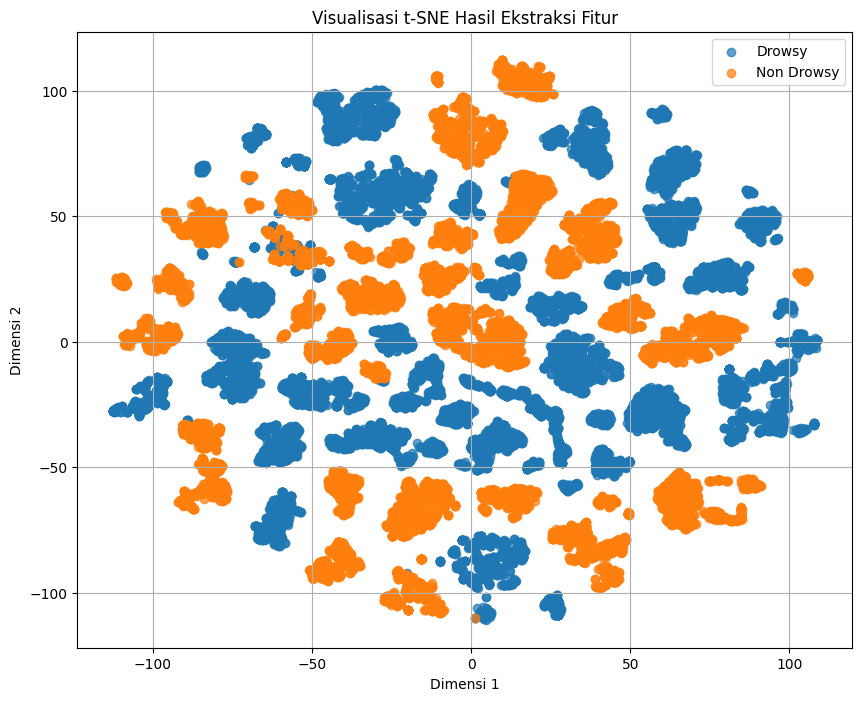

In [ ]:
# Visualisasi menggunakan t-SNE
print("Memulai visualisasi t-SNE...")
tsne = TSNE(n_components=2, random_state=42)
fitur_2d = tsne.fit_transform(fitur)

# Plot hasil t-SNE
plt.figure(figsize=(10, 8))
for kategori in ["Drowsy", "Non Drowsy"]:
    idx = label == kategori
    plt.scatter(fitur_2d[idx, 0], fitur_2d[idx, 1], label=kategori, alpha=0.7)

plt.title("Visualisasi t-SNE Hasil Ekstraksi Fitur")
plt.xlabel("Dimensi 1")
plt.ylabel("Dimensi 2")
plt.legend(loc="best")
plt.grid(True)
plt.show()